In [1]:
import joblib
from autots import AutoTS
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.models import Sequential, save_model, load_model
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.losses import MeanSquaredError
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.optimizers import Adam 
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error as mse, mean_absolute_error as mae, mean_absolute_percentage_error as mape

In [2]:
#loading data
data = pd.read_csv("Foreign_Exchange_Rates.xls", index_col=0)
data.replace('ND', np.nan, inplace=True)
data.set_index('Time Serie', drop=True) 
data

,Time Serie,AUSTRALIA - AUSTRALIAN DOLLAR/US$,EURO AREA - EURO/US$,NEW ZEALAND - NEW ZELAND DOLLAR/US$,UNITED KINGDOM - UNITED KINGDOM POUND/US$,BRAZIL - REAL/US$,CANADA - CANADIAN DOLLAR/US$,CHINA - YUAN/US$,HONG KONG - HONG KONG DOLLAR/US$,INDIA - INDIAN RUPEE/US$,...,DENMARK - DANISH KRONE/US$,JAPAN - YEN/US$,MALAYSIA - RINGGIT/US$,NORWAY - NORWEGIAN KRONE/US$,SWEDEN - KRONA/US$,SRI LANKA - SRI LANKAN RUPEE/US$,SWITZERLAND - FRANC/US$,TAIWAN - NEW TAIWAN DOLLAR/US$,THAILAND - BAHT/US$,Unnamed: 24
0,03-01-2000,1.5172,0.9847,1.9033,0.6146,1.805,1.4465,8.2798,7.7765,43.55,...,7.329,101.7,3.8,7.964,8.443,72.3,1.5808,31.38,36.97,NaN
1,04-01-2000,1.5239,0.97,1.9238,0.6109,1.8405,1.4518,8.2799,7.7775,43.55,...,7.218,103.09,3.8,7.934,8.36,72.65,1.5565,30.6,37.13,NaN
2,05-01-2000,1.5267,0.9676,1.9339,0.6092,1.856,1.4518,8.2798,7.778,43.55,...,7.208,103.77,3.8,7.935,8.353,72.95,1.5526,30.8,37.1,NaN
3,06-01-2000,1.5291,0.9686,1.9436,0.607,1.84,1.4571,8.2797,7.7785,43.55,...,7.2125,105.19,3.8,7.94,8.3675,72.95,1.554,31.75,37.62,NaN
4,07-01-2000,1.5272,0.9714,1.938,0.6104,1.831,1.4505,8.2794,7.7783,43.55,...,7.2285,105.17,3.8,7.966,8.415,73.15,1.5623,30.85,37.3,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5212,25-12-2019,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5213,26-12-2019,1.4411,0.9007,1.5002,0.7688,4.0602,1.3124,6.9949,7.788,71.28,...,6.7295,109.67,4.1337,8.8799,9.4108,181.3,0.9808,30.11,30.15,NaN
5214,27-12-2019,1.4331,0.8949,1.4919,0.7639,4.0507,1.3073,6.9954,7.7874,71.45,...,6.6829,109.47,4.126,8.8291,9.3405,181.35,0.9741,30.09,30.14,NaN
5215,30-12-2019,1.4278,0.8915,1.4846,0.761,4.0152,1.3058,6.9864,7.7857,71.3,...,6.6589,108.85,4.1053,8.7839,9.3145,181.6,0.9677,30.04,29.94,NaN


In [3]:
#dropping null values and converting timeseries to datetime 
data.drop('Unnamed: 24', axis=1, inplace=True)

In [4]:
data['Time Serie'] = pd.to_datetime(data['Time Serie'], format='%d-%m-%Y')

In [5]:
#Pre-Processing code here
data.isnull().sum()

Time Serie                                     0
AUSTRALIA - AUSTRALIAN DOLLAR/US$            198
EURO AREA - EURO/US$                         198
NEW ZEALAND - NEW ZELAND DOLLAR/US$          198
UNITED KINGDOM - UNITED KINGDOM POUND/US$    198
BRAZIL - REAL/US$                            198
CANADA - CANADIAN DOLLAR/US$                 198
CHINA - YUAN/US$                             197
HONG KONG - HONG KONG DOLLAR/US$             198
INDIA - INDIAN RUPEE/US$                     199
KOREA - WON/US$                              198
MEXICO - MEXICAN PESO/US$                    198
SOUTH AFRICA - RAND/US$                      198
SINGAPORE - SINGAPORE DOLLAR/US$             198
DENMARK - DANISH KRONE/US$                   198
JAPAN - YEN/US$                              198
MALAYSIA - RINGGIT/US$                       198
NORWAY - NORWEGIAN KRONE/US$                 198
SWEDEN - KRONA/US$                           198
SRI LANKA - SRI LANKAN RUPEE/US$             198
SWITZERLAND - FRANC/

In [6]:
# EDA code here
data.dropna(inplace=True)
data.info()
data.describe()

<class 'pandas.core.frame.DataFrame'>
Index: 5015 entries, 0 to 5216
Data columns (total 23 columns):
 #   Column                                     Non-Null Count  Dtype         
---  ------                                     --------------  -----         
 0   Time Serie                                 5015 non-null   datetime64[ns]
 1   AUSTRALIA - AUSTRALIAN DOLLAR/US$          5015 non-null   object        
 2   EURO AREA - EURO/US$                       5015 non-null   object        
 3   NEW ZEALAND - NEW ZELAND DOLLAR/US$        5015 non-null   object        
 4   UNITED KINGDOM - UNITED KINGDOM POUND/US$  5015 non-null   object        
 5   BRAZIL - REAL/US$                          5015 non-null   object        
 6   CANADA - CANADIAN DOLLAR/US$               5015 non-null   object        
 7   CHINA - YUAN/US$                           5015 non-null   object        
 8   HONG KONG - HONG KONG DOLLAR/US$           5015 non-null   object        
 9   INDIA - INDIAN RUPEE/US$

,Time Serie
count,5015
mean,2009-12-25 16:30:54.915254272
min,2000-01-03 00:00:00
25%,2004-12-28 12:00:00
50%,2009-12-22 00:00:00
75%,2014-12-22 12:00:00
max,2019-12-31 00:00:00


In [7]:
#selecting currency

options = {
    'AUSTRALIAN DOLLAR':  'AUSTRALIA - AUSTRALIAN DOLLAR/US$',
    'EURO': 'EURO AREA - EURO/US$',
    'NEW ZEALAND DOLLAR': 'NEW ZEALAND - NEW ZELAND DOLLAR/US$',
    'GREAT BRITAIN POUNDS': 'UNITED KINGDOM - UNITED KINGDOM POUND/US$',
    'BRAZILIAN REAL': 'BRAZIL - REAL/US$',
    'CANADIAN DOLLAR': 'CANADA - CANADIAN DOLLAR/US$',
    'CHINESE YUAN$': 'CHINA - YUAN/US$',
    'HONG KONG DOLLAR': 'HONG KONG - HONG KONG DOLLAR/US$',
    'INDIAN RUPEE': 'INDIA - INDIAN RUPEE/US$',
    'KOREAN WON$': 'KOREA - WON/US$',
    'MEXICAN PESO': 'MEXICO - MEXICAN PESO/US$',
    'SOUTH AFRICAN RAND$': 'SOUTH AFRICA - RAND/US$',
    'SINGAPORE DOLLAR': 'SINGAPORE - SINGAPORE DOLLAR/US$',
    'DANISH KRONE': 'DENMARK - DANISH KRONE/US$',
    'JAPANESE YEN$': 'JAPAN - YEN/US$',
    'MALAYSIAN RINGGIT': 'MALAYSIA - RINGGIT/US$',
    'NORWEGIAN KRONE': 'NORWAY - NORWEGIAN KRONE/US$',
    'SWEDEN KRONA': 'SWEDEN - KRONA/US$',
    'SRILANKAN RUPEE': 'SRI LANKA - SRI LANKAN RUPEE/US$',
    'SWISS FRANC': 'SWITZERLAND - FRANC/US$',
    'NEW TAIWAN DOLLAR': 'TAIWAN - NEW TAIWAN DOLLAR/US$',
    'THAI BAHT': 'THAILAND - BAHT/US$'
}
#for option in options.keys():
#    selected_option = option #select currency here to train model

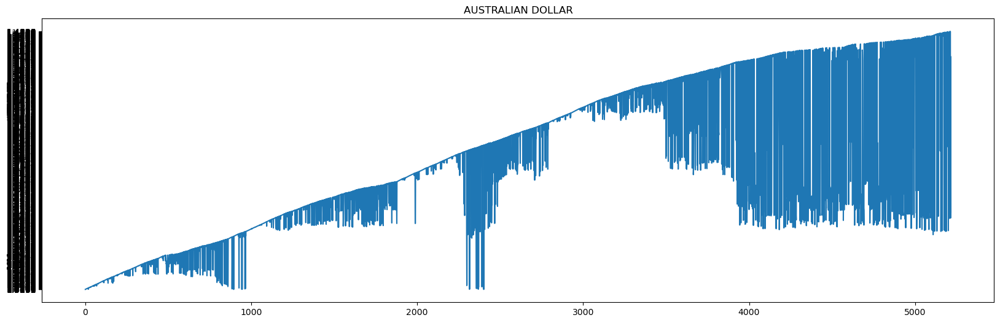

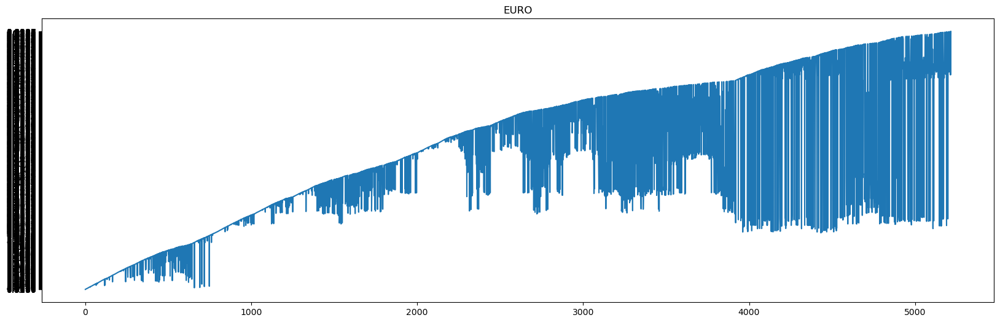

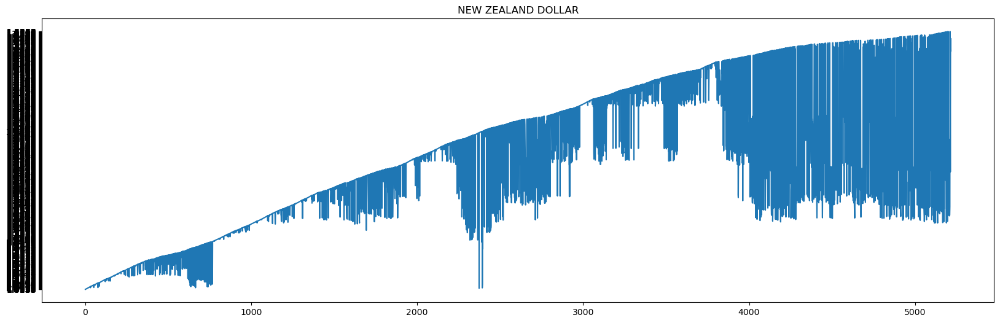

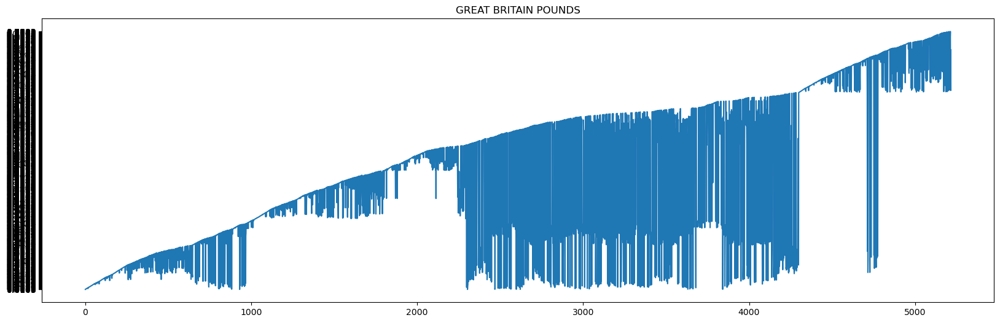

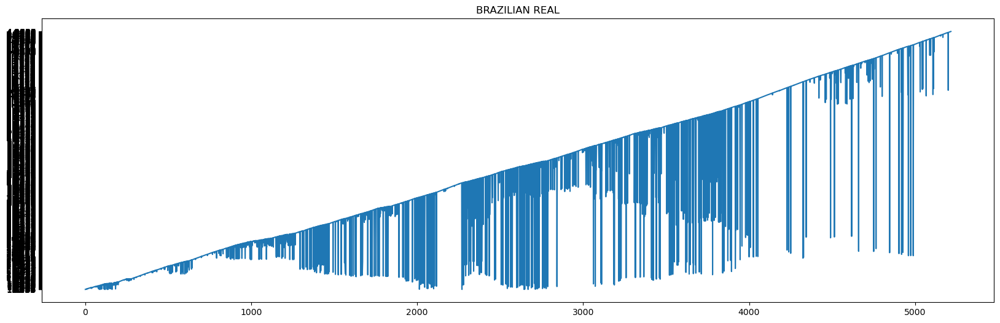

...

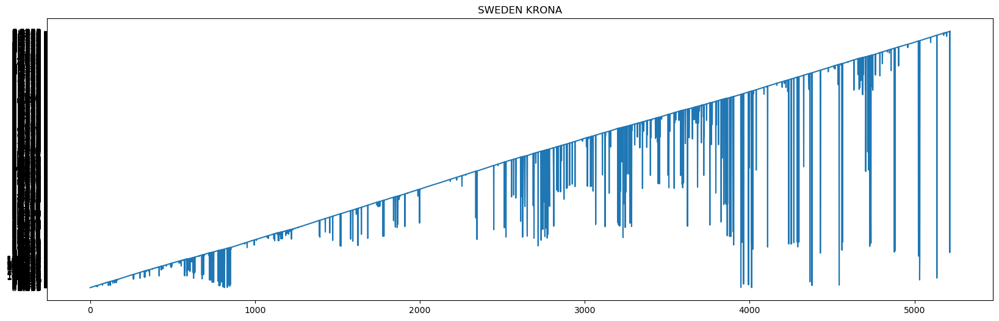

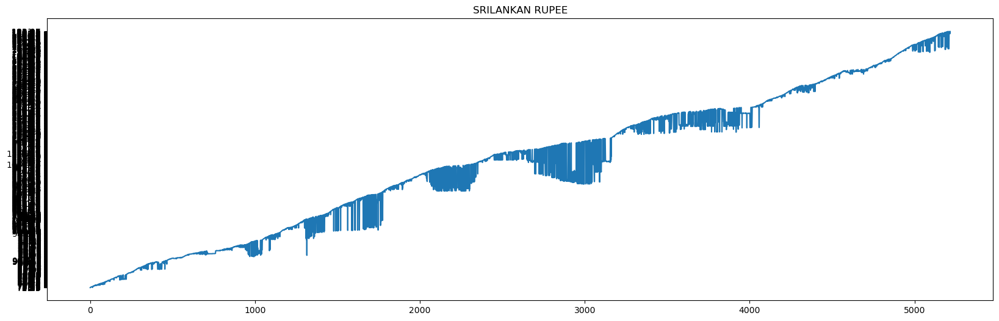

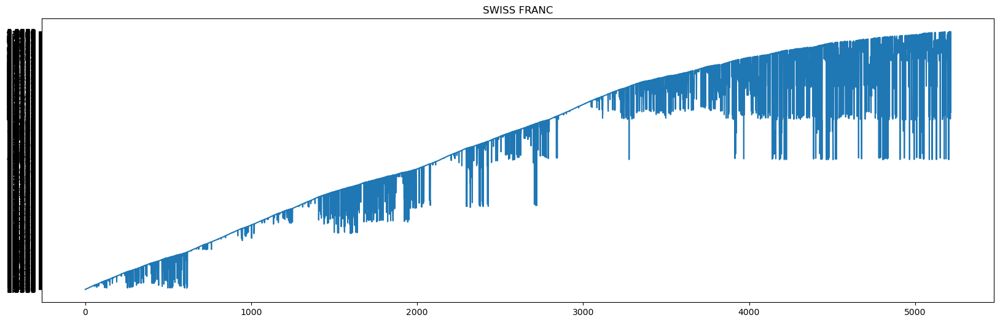

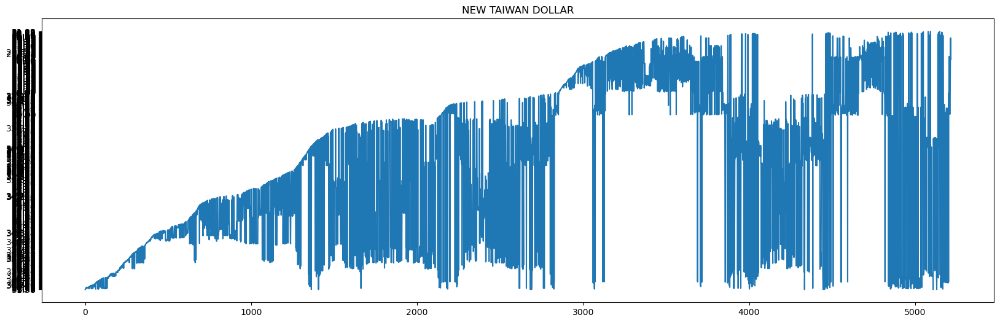

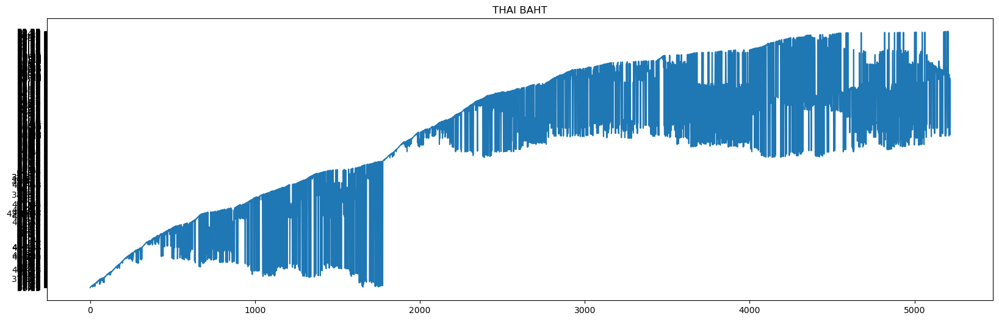

In [29]:
for name, option in options.items():
    plt.figure(figsize=(20,6))
    plt.title(name)
    plt.plot(data[option])
    plt.show()

In [8]:
#predictive modelling code here
def Sequential_Input_LSTM(df, input_sequence):
    df_np = df.to_numpy()
    X = []
    y = []
    
    for i in range(len(df_np) - input_sequence):
        row = [a for a in df_np[i:i + input_sequence]]
        X.append(row)
        label = df_np[i + input_sequence]
        y.append(label)
        
    return np.array(X), np.array(y)

In [9]:
# using some predictive models to train forex pairs
#Creating the LSTM and XGBoost Models
reg = XGBRegressor()
n_input = 10
Result_lstm = []
Result_xgb = []

In [12]:
def evaluate_model(df, mod=reg): # function that train the models
    forecast_length = 10
    for name, option in options.items():
         X, y = Sequential_Input_LSTM(data[option], n_input)
         # Training data
         X_train, y_train = X[:-1001], y[:-1001]

         # Validation data
         X_val, y_val = X[-1000:-61], y[-1000:-61]

         # Test data
         X_test, y_test = X[-60:], y[-60:]

         X_train, X_val, X_test = X_train.astype('float'), X_val.astype('float'), X_test.astype('float')

         y_train, y_val, y_test = y_train.astype('float'), y_val.astype('float'), y_test.astype('float')
         
         
              
         if mod is not reg:
             n_features = 1                        # number of input variables used for forecast (here, only 1 i.e. temperature)
             model1 = Sequential()
             model1.add(InputLayer((n_input,n_features)))
             model1.add(LSTM(100, return_sequences = True)) 
             model1.add(LSTM(100, return_sequences = True))
             model1.add(LSTM(50))
             model1.add(Dense(8, activation = 'relu'))
             model1.add(Dense(1, activation = 'linear'))

             
             model1.summary()
             early_stop = EarlyStopping(monitor = 'val_loss', patience = 2)
             
             model1.compile(loss = MeanSquaredError(), optimizer = Adam(learning_rate = 0.0001), metrics = [RootMeanSquaredError()])
             
             model1.fit(X_train, y_train, validation_data = (X_val, y_val), epochs = 50, callbacks = [early_stop])
             
             prediction = model1.predict(X_test)
             Result_lstm.append({'Currency': name,
                               'mse': mse(y_test, prediction),
                               'forecast':  prediction
                                })
         else:
             reg.fit(X_train, y_train,
                    eval_set=[(X_train, y_train), (X_test, y_test)],
                    verbose=True) 
             reg_pred = reg.predict(X_test)
             Result_xgb.append({'Currency' : name,
                        'mse' : mse(y_test, reg_pred),
                        'mape' : mape(y_test, reg_pred),
                        'mae' : mae(y_test, reg_pred),
                        'forecast':  reg.predict(X_test),
                        name: joblib.dump(reg, name)
                        })
    return Result_lstm, Result_xgb
    
          
         

In [34]:
evaluate_model(data, LSTM)

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 10, 100)             │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 10, 100)             │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_2 (LSTM)                        │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 8)                   │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 151,817 (593.04 KB)

 Trainable params: 151,817 (593.04 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 46s 99ms/step - loss: 1.3917 - root_mean_squared_error: 1.1700 - val_loss: 0.0012 - val_root_mean_squared_error: 0.0353
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 25s 141ms/step - loss: 0.0234 - root_mean_squared_error: 0.1523 - val_loss: 0.0012 - val_root_mean_squared_error: 0.0347
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 13s 80ms/step - loss: 0.0051 - root_mean_squared_error: 0.0713 - val_loss: 6.8331e-04 - val_root_mean_squared_error: 0.0261
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 10s 79ms/step - loss: 0.0017 - root_mean_squared_error: 0.0413 - val_loss: 9.3017e-04 - val_root_mean_squared_error: 0.0305
Epoch 5/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 11s 82ms/step - loss: 0.0013 - root_mean_squared_error: 0.0364 - val_loss: 6.9206e-04 - val_root_mean_squared_error: 0.0263
126/126 ━━━━━━━━━━━━━━━━━━━━ 7s 43ms/step


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_3 (LSTM)                        │ (None, 10, 100)             │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_4 (LSTM)                        │ (None, 10, 100)             │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_5 (LSTM)                        │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 8)                   │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 151,817 (593.04 KB)

 Trainable params: 151,817 (593.04 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 27s 86ms/step - loss: 0.4922 - root_mean_squared_error: 0.6923 - val_loss: 1.4048e-04 - val_root_mean_squared_error: 0.0119
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 19s 70ms/step - loss: 0.0010 - root_mean_squared_error: 0.0317 - val_loss: 1.0324e-04 - val_root_mean_squared_error: 0.0102
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 13s 89ms/step - loss: 5.4943e-04 - root_mean_squared_error: 0.0234 - val_loss: 8.9191e-05 - val_root_mean_squared_error: 0.0094
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 19s 79ms/step - loss: 3.0460e-04 - root_mean_squared_error: 0.0174 - val_loss: 8.8601e-05 - val_root_mean_squared_error: 0.0094
Epoch 5/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 14s 107ms/step - loss: 2.1508e-04 - root_mean_squared_error: 0.0147 - val_loss: 9.7952e-05 - val_root_mean_squared_error: 0.0099
Epoch 6/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 18s 83ms/step - loss: 1.9292e-04 - root_mean_squared_error: 0.0139 - val_loss: 9.2889e-05 - val_root_mean_squared_error: 0.0096

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_6 (LSTM)                        │ (None, 10, 100)             │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_7 (LSTM)                        │ (None, 10, 100)             │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_8 (LSTM)                        │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 8)                   │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 151,817 (593.04 KB)

 Trainable params: 151,817 (593.04 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 27s 88ms/step - loss: 1.7556 - root_mean_squared_error: 1.3076 - val_loss: 0.0090 - val_root_mean_squared_error: 0.0947
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 19s 73ms/step - loss: 0.0185 - root_mean_squared_error: 0.1352 - val_loss: 0.0012 - val_root_mean_squared_error: 0.0344
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 25s 197ms/step - loss: 0.0028 - root_mean_squared_error: 0.0531 - val_loss: 5.4549e-04 - val_root_mean_squared_error: 0.0234
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.0017 - root_mean_squared_error: 0.0417 - val_loss: 5.6140e-04 - val_root_mean_squared_error: 0.0237
Epoch 5/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 10s 80ms/step - loss: 0.0017 - root_mean_squared_error: 0.0413 - val_loss: 4.7021e-04 - val_root_mean_squared_error: 0.0217
Epoch 6/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 11s 88ms/step - loss: 0.0016 - root_mean_squared_error: 0.0396 - val_loss: 4.9307e-04 - val_root_mean_squared_error: 0.0222
Epoch 7/50
126/126 ━━━━

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_9 (LSTM)                        │ (None, 10, 100)             │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_10 (LSTM)                       │ (None, 10, 100)             │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_11 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 8)                   │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 151,817 (593.04 KB)

 Trainable params: 151,817 (593.04 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 29s 96ms/step - loss: 0.1948 - root_mean_squared_error: 0.4307 - val_loss: 0.0011 - val_root_mean_squared_error: 0.0336
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - loss: 2.1184e-04 - root_mean_squared_error: 0.0146 - val_loss: 9.1300e-04 - val_root_mean_squared_error: 0.0302
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 12s 88ms/step - loss: 1.9044e-04 - root_mean_squared_error: 0.0138 - val_loss: 6.0613e-04 - val_root_mean_squared_error: 0.0246
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 20s 83ms/step - loss: 1.6215e-04 - root_mean_squared_error: 0.0127 - val_loss: 5.0918e-04 - val_root_mean_squared_error: 0.0226
Epoch 5/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 20s 77ms/step - loss: 1.3354e-04 - root_mean_squared_error: 0.0116 - val_loss: 3.5680e-04 - val_root_mean_squared_error: 0.0189
Epoch 6/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 11s 79ms/step - loss: 1.1153e-04 - root_mean_squared_error: 0.0106 - val_loss: 1.8853e-04 - val_root_mean_squared_error: 0.0137


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_12 (LSTM)                       │ (None, 10, 100)             │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_13 (LSTM)                       │ (None, 10, 100)             │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_14 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 8)                   │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 151,817 (593.04 KB)

 Trainable params: 151,817 (593.04 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 47s 250ms/step - loss: 4.1218 - root_mean_squared_error: 2.0096 - val_loss: 0.7958 - val_root_mean_squared_error: 0.8921
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 23s 106ms/step - loss: 0.0807 - root_mean_squared_error: 0.2825 - val_loss: 0.2249 - val_root_mean_squared_error: 0.4742
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 22s 114ms/step - loss: 0.0191 - root_mean_squared_error: 0.1375 - val_loss: 0.0738 - val_root_mean_squared_error: 0.2717
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 12s 93ms/step - loss: 0.0088 - root_mean_squared_error: 0.0936 - val_loss: 0.0373 - val_root_mean_squared_error: 0.1932
Epoch 5/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 21s 97ms/step - loss: 0.0080 - root_mean_squared_error: 0.0893 - val_loss: 0.0342 - val_root_mean_squared_error: 0.1848
Epoch 6/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 23s 116ms/step - loss: 0.0075 - root_mean_squared_error: 0.0865 - val_loss: 0.0283 - val_root_mean_squared_error: 0.1684
Epoch 7/50
126/126 ━━━━━━━━━━━━━━━━━

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_15 (LSTM)                       │ (None, 10, 100)             │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_16 (LSTM)                       │ (None, 10, 100)             │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_17 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 8)                   │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 151,817 (593.04 KB)

 Trainable params: 151,817 (593.04 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 29s 108ms/step - loss: 0.7081 - root_mean_squared_error: 0.8170 - val_loss: 3.4292e-04 - val_root_mean_squared_error: 0.0185
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 0.0011 - root_mean_squared_error: 0.0339 - val_loss: 2.0884e-04 - val_root_mean_squared_error: 0.0145
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 20s 91ms/step - loss: 7.2152e-04 - root_mean_squared_error: 0.0268 - val_loss: 2.0548e-04 - val_root_mean_squared_error: 0.0143
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 21s 96ms/step - loss: 4.4096e-04 - root_mean_squared_error: 0.0210 - val_loss: 2.0854e-04 - val_root_mean_squared_error: 0.0144
Epoch 5/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 21s 99ms/step - loss: 3.2144e-04 - root_mean_squared_error: 0.0179 - val_loss: 2.1143e-04 - val_root_mean_squared_error: 0.0145
126/126 ━━━━━━━━━━━━━━━━━━━━ 7s 43ms/step


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_18 (LSTM)                       │ (None, 10, 100)             │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_19 (LSTM)                       │ (None, 10, 100)             │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_20 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_12 (Dense)                     │ (None, 8)                   │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_13 (Dense)                     │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 151,817 (593.04 KB)

 Trainable params: 151,817 (593.04 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 33s 137ms/step - loss: 37.4464 - root_mean_squared_error: 6.0662 - val_loss: 0.8362 - val_root_mean_squared_error: 0.9144
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 28s 191ms/step - loss: 1.8210 - root_mean_squared_error: 1.3366 - val_loss: 0.2421 - val_root_mean_squared_error: 0.4920
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 31s 109ms/step - loss: 0.7451 - root_mean_squared_error: 0.8632 - val_loss: 0.3814 - val_root_mean_squared_error: 0.6176
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 21s 109ms/step - loss: 0.7431 - root_mean_squared_error: 0.8620 - val_loss: 0.3746 - val_root_mean_squared_error: 0.6120
126/126 ━━━━━━━━━━━━━━━━━━━━ 8s 49ms/step


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_21 (LSTM)                       │ (None, 10, 100)             │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_22 (LSTM)                       │ (None, 10, 100)             │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_23 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_14 (Dense)                     │ (None, 8)                   │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_15 (Dense)                     │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 151,817 (593.04 KB)

 Trainable params: 151,817 (593.04 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 33s 120ms/step - loss: 56.8920 - root_mean_squared_error: 7.5337 - val_loss: 28.5003 - val_root_mean_squared_error: 5.3386
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 18s 97ms/step - loss: 22.4306 - root_mean_squared_error: 4.7270 - val_loss: 12.7722 - val_root_mean_squared_error: 3.5738
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 25s 129ms/step - loss: 10.9896 - root_mean_squared_error: 3.3126 - val_loss: 7.4762 - val_root_mean_squared_error: 2.7343
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 20s 122ms/step - loss: 6.4580 - root_mean_squared_error: 2.5396 - val_loss: 4.3724 - val_root_mean_squared_error: 2.0910
Epoch 5/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 17s 88ms/step - loss: 3.6836 - root_mean_squared_error: 1.9176 - val_loss: 2.3439 - val_root_mean_squared_error: 1.5310
Epoch 6/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 25s 119ms/step - loss: 1.9233 - root_mean_squared_error: 1.3852 - val_loss: 1.1710 - val_root_mean_squared_error: 1.0821
Epoch 7/50
126/126 ━━━━━━━━━━━━

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_24 (LSTM)                       │ (None, 10, 100)             │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_25 (LSTM)                       │ (None, 10, 100)             │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_26 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_16 (Dense)                     │ (None, 8)                   │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_17 (Dense)                     │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 151,817 (593.04 KB)

 Trainable params: 151,817 (593.04 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 33s 130ms/step - loss: 2304.2686 - root_mean_squared_error: 47.9929 - val_loss: 3697.8970 - val_root_mean_squared_error: 60.8103
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 21s 135ms/step - loss: 1730.9111 - root_mean_squared_error: 41.6014 - val_loss: 3327.2905 - val_root_mean_squared_error: 57.6827
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 21s 132ms/step - loss: 1543.0809 - root_mean_squared_error: 39.2807 - val_loss: 3112.6472 - val_root_mean_squared_error: 55.7911
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 20s 129ms/step - loss: 1392.7297 - root_mean_squared_error: 37.3187 - val_loss: 2927.1147 - val_root_mean_squared_error: 54.1028
Epoch 5/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 18s 108ms/step - loss: 1286.8818 - root_mean_squared_error: 35.8709 - val_loss: 2756.5437 - val_root_mean_squared_error: 52.5028
Epoch 6/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 19s 97ms/step - loss: 1166.4403 - root_mean_squared_error: 34.1512 - val_loss: 2591.5403 - val_root_mean_squared_er

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_27 (LSTM)                       │ (None, 10, 100)             │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_28 (LSTM)                       │ (None, 10, 100)             │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_29 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_18 (Dense)                     │ (None, 8)                   │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_19 (Dense)                     │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 151,817 (593.04 KB)

 Trainable params: 151,817 (593.04 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 32s 111ms/step - loss: 1266570.0000 - root_mean_squared_error: 1125.4155 - val_loss: 1278854.2500 - val_root_mean_squared_error: 1130.8644
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 22s 120ms/step - loss: 1257334.0000 - root_mean_squared_error: 1121.3069 - val_loss: 1269416.0000 - val_root_mean_squared_error: 1126.6836
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 20s 106ms/step - loss: 1256037.5000 - root_mean_squared_error: 1120.7205 - val_loss: 1261752.1250 - val_root_mean_squared_error: 1123.2773
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 20s 98ms/step - loss: 1233841.7500 - root_mean_squared_error: 1110.7787 - val_loss: 1254456.8750 - val_root_mean_squared_error: 1120.0254
Epoch 5/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 24s 127ms/step - loss: 1231245.1250 - root_mean_squared_error: 1109.6060 - val_loss: 1247779.5000 - val_root_mean_squared_error: 1117.0405
Epoch 6/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 18s 107ms/step - loss: 1228976.5000 - root_mean_squared_error: 110

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_30 (LSTM)                       │ (None, 10, 100)             │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_31 (LSTM)                       │ (None, 10, 100)             │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_32 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_20 (Dense)                     │ (None, 8)                   │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_21 (Dense)                     │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 151,817 (593.04 KB)

 Trainable params: 151,817 (593.04 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 154s 144ms/step - loss: 107.3632 - root_mean_squared_error: 10.3173 - val_loss: 155.0671 - val_root_mean_squared_error: 12.4526
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 16s 107ms/step - loss: 23.5191 - root_mean_squared_error: 4.8378 - val_loss: 105.4209 - val_root_mean_squared_error: 10.2675
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 21s 105ms/step - loss: 10.5742 - root_mean_squared_error: 3.2482 - val_loss: 83.8343 - val_root_mean_squared_error: 9.1561
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 15s 116ms/step - loss: 5.7482 - root_mean_squared_error: 2.3962 - val_loss: 69.2066 - val_root_mean_squared_error: 8.3191
Epoch 5/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 19s 104ms/step - loss: 3.8678 - root_mean_squared_error: 1.9661 - val_loss: 60.7845 - val_root_mean_squared_error: 7.7964
Epoch 6/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 20s 102ms/step - loss: 3.4457 - root_mean_squared_error: 1.8555 - val_loss: 56.5036 - val_root_mean_squared_error: 7.5169
Epoch 7/50
126/126

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_33 (LSTM)                       │ (None, 10, 100)             │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_34 (LSTM)                       │ (None, 10, 100)             │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_35 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_22 (Dense)                     │ (None, 8)                   │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_23 (Dense)                     │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 151,817 (593.04 KB)

 Trainable params: 151,817 (593.04 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 31s 117ms/step - loss: 59.0909 - root_mean_squared_error: 7.6502 - val_loss: 60.1016 - val_root_mean_squared_error: 7.7525
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 18s 100ms/step - loss: 5.2195 - root_mean_squared_error: 2.2793 - val_loss: 33.3251 - val_root_mean_squared_error: 5.7728
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 21s 104ms/step - loss: 3.4719 - root_mean_squared_error: 1.8617 - val_loss: 31.6203 - val_root_mean_squared_error: 5.6232
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 20s 100ms/step - loss: 3.3914 - root_mean_squared_error: 1.8413 - val_loss: 31.5246 - val_root_mean_squared_error: 5.6147
Epoch 5/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 21s 101ms/step - loss: 2.8478 - root_mean_squared_error: 1.6852 - val_loss: 21.2766 - val_root_mean_squared_error: 4.6127
Epoch 6/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 21s 107ms/step - loss: 0.9615 - root_mean_squared_error: 0.9773 - val_loss: 13.8084 - val_root_mean_squared_error: 3.7160
Epoch 7/50
126/126 ━━━━━━━━

Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_36 (LSTM)                       │ (None, 10, 100)             │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_37 (LSTM)                       │ (None, 10, 100)             │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_38 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_24 (Dense)                     │ (None, 8)                   │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_25 (Dense)                     │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 151,817 (593.04 KB)

 Trainable params: 151,817 (593.04 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 37s 139ms/step - loss: 1.3274 - root_mean_squared_error: 1.1277 - val_loss: 0.0036 - val_root_mean_squared_error: 0.0602
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step - loss: 0.0042 - root_mean_squared_error: 0.0650 - val_loss: 0.0016 - val_root_mean_squared_error: 0.0397
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 20s 103ms/step - loss: 0.0024 - root_mean_squared_error: 0.0493 - val_loss: 7.2296e-04 - val_root_mean_squared_error: 0.0269
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 20s 97ms/step - loss: 0.0012 - root_mean_squared_error: 0.0339 - val_loss: 2.8160e-04 - val_root_mean_squared_error: 0.0168
Epoch 5/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 21s 100ms/step - loss: 4.6803e-04 - root_mean_squared_error: 0.0216 - val_loss: 2.0889e-04 - val_root_mean_squared_error: 0.0145
Epoch 6/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 33s 198ms/step - loss: 2.1776e-04 - root_mean_squared_error: 0.0147 - val_loss: 1.0779e-04 - val_root_mean_squared_error: 0.0104
Epoch 7/50


Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_39 (LSTM)                       │ (None, 10, 100)             │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_40 (LSTM)                       │ (None, 10, 100)             │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_41 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_26 (Dense)                     │ (None, 8)                   │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_27 (Dense)                     │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 151,817 (593.04 KB)

 Trainable params: 151,817 (593.04 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 35s 130ms/step - loss: 24.9924 - root_mean_squared_error: 4.9413 - val_loss: 0.8289 - val_root_mean_squared_error: 0.9104
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 19s 121ms/step - loss: 1.1444 - root_mean_squared_error: 1.0684 - val_loss: 0.1960 - val_root_mean_squared_error: 0.4428
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 20s 116ms/step - loss: 0.9829 - root_mean_squared_error: 0.9913 - val_loss: 0.1896 - val_root_mean_squared_error: 0.4354
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - loss: 0.8844 - root_mean_squared_error: 0.9399 - val_loss: 0.1345 - val_root_mean_squared_error: 0.3667
Epoch 5/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - loss: 0.5368 - root_mean_squared_error: 0.7296 - val_loss: 0.0079 - val_root_mean_squared_error: 0.0888
Epoch 6/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 20s 115ms/step - loss: 0.1088 - root_mean_squared_error: 0.3285 - val_loss: 0.0069 - val_root_mean_squared_error: 0.0833
Epoch 7/50
126/126 ━━━━━━━━━━━━━━

Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_42 (LSTM)                       │ (None, 10, 100)             │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_43 (LSTM)                       │ (None, 10, 100)             │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_44 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_28 (Dense)                     │ (None, 8)                   │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_29 (Dense)                     │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 151,817 (593.04 KB)

 Trainable params: 151,817 (593.04 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 11061.2441 - root_mean_squared_error: 105.1681 - val_loss: 10558.9180 - val_root_mean_squared_error: 102.7566
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 9600.3076 - root_mean_squared_error: 97.9793 - val_loss: 9764.1504 - val_root_mean_squared_error: 98.8137
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 16s 118ms/step - loss: 9037.0195 - root_mean_squared_error: 95.0619 - val_loss: 9301.9307 - val_root_mean_squared_error: 96.4465
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 20s 118ms/step - loss: 8534.9121 - root_mean_squared_error: 92.3840 - val_loss: 8879.3984 - val_root_mean_squared_error: 94.2306
Epoch 5/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 23s 134ms/step - loss: 8190.2466 - root_mean_squared_error: 90.4989 - val_loss: 8504.0449 - val_root_mean_squared_error: 92.2174
Epoch 6/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 18s 115ms/step - loss: 7845.9023 - root_mean_squared_error: 88.5751 - val_loss: 8139.4023 - val_root_mean_squar

Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_45 (LSTM)                       │ (None, 10, 100)             │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_46 (LSTM)                       │ (None, 10, 100)             │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_47 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_30 (Dense)                     │ (None, 8)                   │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_31 (Dense)                     │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 151,817 (593.04 KB)

 Trainable params: 151,817 (593.04 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 43s 129ms/step - loss: 7.4059 - root_mean_squared_error: 2.6734 - val_loss: 0.2415 - val_root_mean_squared_error: 0.4914
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 17s 102ms/step - loss: 0.0515 - root_mean_squared_error: 0.2268 - val_loss: 0.2272 - val_root_mean_squared_error: 0.4767
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 23s 117ms/step - loss: 0.0425 - root_mean_squared_error: 0.2060 - val_loss: 0.1790 - val_root_mean_squared_error: 0.4231
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - loss: 0.0332 - root_mean_squared_error: 0.1821 - val_loss: 0.1407 - val_root_mean_squared_error: 0.3750
Epoch 5/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 17s 96ms/step - loss: 0.0220 - root_mean_squared_error: 0.1484 - val_loss: 0.0843 - val_root_mean_squared_error: 0.2903
Epoch 6/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 23s 114ms/step - loss: 0.0121 - root_mean_squared_error: 0.1099 - val_loss: 0.0481 - val_root_mean_squared_error: 0.2194
Epoch 7/50
126/126 ━━━━━━━━━━━━━━━━

Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_48 (LSTM)                       │ (None, 10, 100)             │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_49 (LSTM)                       │ (None, 10, 100)             │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_50 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_32 (Dense)                     │ (None, 8)                   │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_33 (Dense)                     │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 151,817 (593.04 KB)

 Trainable params: 151,817 (593.04 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 421s 180ms/step - loss: 31.2400 - root_mean_squared_error: 5.5305 - val_loss: 5.0838 - val_root_mean_squared_error: 2.2547
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 32s 111ms/step - loss: 1.3704 - root_mean_squared_error: 1.1700 - val_loss: 2.5804 - val_root_mean_squared_error: 1.6063
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 22s 124ms/step - loss: 1.2237 - root_mean_squared_error: 1.1061 - val_loss: 2.5548 - val_root_mean_squared_error: 1.5984
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 19s 109ms/step - loss: 1.1312 - root_mean_squared_error: 1.0633 - val_loss: 2.1388 - val_root_mean_squared_error: 1.4625
Epoch 5/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 21s 115ms/step - loss: 0.7605 - root_mean_squared_error: 0.8680 - val_loss: 0.4726 - val_root_mean_squared_error: 0.6875
Epoch 6/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 21s 117ms/step - loss: 0.1715 - root_mean_squared_error: 0.4121 - val_loss: 0.0646 - val_root_mean_squared_error: 0.2541
Epoch 7/50
126/126 ━━━━━━━━━━━━━

Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_51 (LSTM)                       │ (None, 10, 100)             │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_52 (LSTM)                       │ (None, 10, 100)             │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_53 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_34 (Dense)                     │ (None, 8)                   │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_35 (Dense)                     │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 151,817 (593.04 KB)

 Trainable params: 151,817 (593.04 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 39s 153ms/step - loss: 43.8370 - root_mean_squared_error: 6.5764 - val_loss: 9.3829 - val_root_mean_squared_error: 3.0631
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 15s 107ms/step - loss: 3.3116 - root_mean_squared_error: 1.8112 - val_loss: 2.1001 - val_root_mean_squared_error: 1.4492
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 21s 110ms/step - loss: 1.5515 - root_mean_squared_error: 1.2451 - val_loss: 1.4780 - val_root_mean_squared_error: 1.2157
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 23s 129ms/step - loss: 1.4829 - root_mean_squared_error: 1.2175 - val_loss: 1.4005 - val_root_mean_squared_error: 1.1834
Epoch 5/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 19s 114ms/step - loss: 1.4085 - root_mean_squared_error: 1.1864 - val_loss: 1.4920 - val_root_mean_squared_error: 1.2215
Epoch 6/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 20s 106ms/step - loss: 1.3808 - root_mean_squared_error: 1.1748 - val_loss: 1.3961 - val_root_mean_squared_error: 1.1816
Epoch 7/50
126/126 ━━━━━━━━━━━━━━

Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_54 (LSTM)                       │ (None, 10, 100)             │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_55 (LSTM)                       │ (None, 10, 100)             │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_56 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_36 (Dense)                     │ (None, 8)                   │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_37 (Dense)                     │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 151,817 (593.04 KB)

 Trainable params: 151,817 (593.04 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 32s 122ms/step - loss: 11785.7432 - root_mean_squared_error: 108.5554 - val_loss: 22532.8496 - val_root_mean_squared_error: 150.1095
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 22s 122ms/step - loss: 2730.5474 - root_mean_squared_error: 52.2439 - val_loss: 9445.7598 - val_root_mean_squared_error: 97.1893
Epoch 24/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 19s 106ms/step - loss: 2435.4292 - root_mean_squared_error: 49.3461 - val_loss: 8983.7061 - val_root_mean_squared_error: 94.7824
Epoch 25/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 20s 105ms/step - loss: 2174.8271 - root_mean_squared_error: 46.6321 - val_loss: 8536.6143 - val_root_mean_squared_error: 92.3938
Epoch 26/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 1980.1034 - root_mean_squared_error: 44.4961 - val_loss: 8102.9688 - val_root_mean_squared_error: 90.0165
Epoch 27/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 1831.0400 - root_mean_squared_error: 42.7762 - val_loss: 7684.2837 - val_root_mean_s

Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_57 (LSTM)                       │ (None, 10, 100)             │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_58 (LSTM)                       │ (None, 10, 100)             │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_59 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_38 (Dense)                     │ (None, 8)                   │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_39 (Dense)                     │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 151,817 (593.04 KB)

 Trainable params: 151,817 (593.04 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 37s 142ms/step - loss: 0.8848 - root_mean_squared_error: 0.9221 - val_loss: 0.0039 - val_root_mean_squared_error: 0.0625
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 16s 105ms/step - loss: 0.0037 - root_mean_squared_error: 0.0605 - val_loss: 6.2322e-04 - val_root_mean_squared_error: 0.0250
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 20s 104ms/step - loss: 0.0013 - root_mean_squared_error: 0.0352 - val_loss: 1.4726e-04 - val_root_mean_squared_error: 0.0121
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 23s 121ms/step - loss: 5.6911e-04 - root_mean_squared_error: 0.0238 - val_loss: 1.0734e-04 - val_root_mean_squared_error: 0.0104
Epoch 5/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 19s 106ms/step - loss: 4.5785e-04 - root_mean_squared_error: 0.0214 - val_loss: 1.1308e-04 - val_root_mean_squared_error: 0.0106
Epoch 6/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 21s 108ms/step - loss: 4.6496e-04 - root_mean_squared_error: 0.0216 - val_loss: 1.1504e-04 - val_root_mean_squared_error: 0.0107
12

Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_60 (LSTM)                       │ (None, 10, 100)             │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_61 (LSTM)                       │ (None, 10, 100)             │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_62 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_40 (Dense)                     │ (None, 8)                   │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_41 (Dense)                     │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 151,817 (593.04 KB)

 Trainable params: 151,817 (593.04 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 34s 127ms/step - loss: 956.4562 - root_mean_squared_error: 30.9197 - val_loss: 700.1083 - val_root_mean_squared_error: 26.4596
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 18s 107ms/step - loss: 728.7973 - root_mean_squared_error: 26.9946 - val_loss: 612.5750 - val_root_mean_squared_error: 24.7503
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 24s 137ms/step - loss: 649.5505 - root_mean_squared_error: 25.4857 - val_loss: 558.0096 - val_root_mean_squared_error: 23.6222
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 17s 106ms/step - loss: 598.5312 - root_mean_squared_error: 24.4646 - val_loss: 516.7947 - val_root_mean_squared_error: 22.7331
Epoch 5/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 20s 104ms/step - loss: 554.9138 - root_mean_squared_error: 23.5563 - val_loss: 477.5344 - val_root_mean_squared_error: 21.8526
Epoch 6/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 23s 125ms/step - loss: 514.9905 - root_mean_squared_error: 22.6931 - val_loss: 439.2148 - val_root_mean_squared_error: 20.957

Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_63 (LSTM)                       │ (None, 10, 100)             │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_64 (LSTM)                       │ (None, 10, 100)             │          80,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_65 (LSTM)                       │ (None, 50)                  │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_42 (Dense)                     │ (None, 8)                   │             408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_43 (Dense)                     │ (None, 1)                   │               9 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 151,817 (593.04 KB)

 Trainable params: 151,817 (593.04 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 38s 125ms/step - loss: 1269.4714 - root_mean_squared_error: 35.6251 - val_loss: 869.9581 - val_root_mean_squared_error: 29.4951
Epoch 2/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 18s 105ms/step - loss: 1015.0664 - root_mean_squared_error: 31.8582 - val_loss: 732.7863 - val_root_mean_squared_error: 27.0700
Epoch 3/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 23s 124ms/step - loss: 879.9833 - root_mean_squared_error: 29.6636 - val_loss: 642.3740 - val_root_mean_squared_error: 25.3451
Epoch 4/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 19s 110ms/step - loss: 788.6114 - root_mean_squared_error: 28.0816 - val_loss: 570.5818 - val_root_mean_squared_error: 23.8869
Epoch 5/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 21s 111ms/step - loss: 705.5548 - root_mean_squared_error: 26.5620 - val_loss: 503.5559 - val_root_mean_squared_error: 22.4401
Epoch 6/50
126/126 ━━━━━━━━━━━━━━━━━━━━ 23s 128ms/step - loss: 637.2242 - root_mean_squared_error: 25.2424 - val_loss: 439.5132 - val_root_mean_squared_error: 20.9

([{'Currency': 'AUSTRALIAN DOLLAR',
   'mse': 0.0012764580963910495,
   'forecast': array([[1.5477332],
          [1.5479733],
          [1.546518 ],
          ...,
          [1.4075437],
          [1.4078413],
          [1.4116278]], dtype=float32)},
  {'Currency': 'EURO',
   'mse': 0.00018835874269925994,
   'forecast': array([[0.975425  ],
          [0.97346216],
          [0.97448885],
          ...,
          [0.9156352 ],
          [0.9166367 ],
          [0.9171679 ]], dtype=float32)},
  {'Currency': 'NEW ZEALAND DOLLAR',
   'mse': 0.0013897479250645458,
   'forecast': array([[1.9564381],
          [1.9605407],
          [1.961373 ],
          ...,
          [1.4975632],
          [1.4926463],
          [1.492424 ]], dtype=float32)},
  {'Currency': 'GREAT BRITAIN POUNDS',
   'mse': 7.356325724719784e-05,
   'forecast': array([[0.6095069 ],
          [0.6086165 ],
          [0.60830224],
          ...,
          [0.6628256 ],
          [0.6643966 ],
          [0.6662011 ]], dtype

In [11]:
df_lstm = pd.DataFrame(list(Result_lstm))
df_lstm

""


In [13]:
evaluate_model(data)

[0]	validation_0-rmse:0.21088	validation_1-rmse:0.09564
[1]	validation_0-rmse:0.14838	validation_1-rmse:0.06765
[2]	validation_0-rmse:0.10458	validation_1-rmse:0.04740
[3]	validation_0-rmse:0.07390	validation_1-rmse:0.03418
[4]	validation_0-rmse:0.05251	validation_1-rmse:0.02598
[5]	validation_0-rmse:0.03769	validation_1-rmse:0.02021
[6]	validation_0-rmse:0.02753	validation_1-rmse:0.01601
[7]	validation_0-rmse:0.02069	validation_1-rmse:0.01209
[8]	validation_0-rmse:0.01619	validation_1-rmse:0.00976
[9]	validation_0-rmse:0.01336	validation_1-rmse:0.00911
[10]	validation_0-rmse:0.01160	validation_1-rmse:0.00815
[11]	validation_0-rmse:0.01059	validation_1-rmse:0.00794
[12]	validation_0-rmse:0.00996	validation_1-rmse:0.00778
[13]	validation_0-rmse:0.00960	validation_1-rmse:0.00745
[14]	validation_0-rmse:0.00936	validation_1-rmse:0.00744
[15]	validation_0-rmse:0.00919	validation_1-rmse:0.00740
[16]	validation_0-rmse:0.00909	validation_1-rmse:0.00739
[17]	validation_0-rmse:0.00901	validation

([],
 [{'Currency': 'AUSTRALIAN DOLLAR',
   'mse': 4.519135247822714e-05,
   'mape': 0.003657827282893868,
   'mae': 0.005349276142120367,
   'forecast': array([1.481547 , 1.482942 , 1.4820458, 1.479589 , 1.4824404, 1.482942 ,
          1.482942 , 1.4820458, 1.4804361, 1.4804361, 1.4638886, 1.4607718,
          1.4471339, 1.4471339, 1.4577068, 1.4640596, 1.4640596, 1.4601809,
          1.4501001, 1.447626 , 1.4486694, 1.4407642, 1.4457958, 1.4467282,
          1.4501001, 1.4511435, 1.4629728, 1.4629728, 1.4587405, 1.4753064,
          1.4774697, 1.4583256, 1.4625608, 1.4719548, 1.4792279, 1.474073 ,
          1.4800138, 1.4888438, 1.4765574, 1.4765574, 1.4600099, 1.4607718,
          1.4589632, 1.4589632, 1.4615855, 1.4640596, 1.4640596, 1.4458776,
          1.447626 , 1.447626 , 1.4486694, 1.4629728, 1.4612243, 1.4493951,
          1.4511435, 1.4457861, 1.4354067, 1.4353349, 1.4279112, 1.4301434],
         dtype=float32),
   'AUSTRALIAN DOLLAR': ['name']},
  {'Currency': 'EURO',
   'm

In [14]:
df_reg = pd.DataFrame(tuple(Result_xgb))
df_reg.head()


,Currency,mse,mape,mae,forecast,AUSTRALIAN DOLLAR,EURO,NEW ZEALAND DOLLAR,GREAT BRITAIN POUNDS,BRAZILIAN REAL,...,SINGAPORE DOLLAR,DANISH KRONE,JAPANESE YEN$,MALAYSIAN RINGGIT,NORWEGIAN KRONE,SWEDEN KRONA,SRILANKAN RUPEE,SWISS FRANC,NEW TAIWAN DOLLAR,THAI BAHT
0,AUSTRALIAN DOLLAR,0.000045,0.003658,0.005349,"[1.481547, 1.482942, 1.4820458, 1.479589, 1.48...",[name],NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,EURO,0.000017,0.003737,0.003372,"[0.9122595, 0.90779227, 0.9022734, 0.9096822, ...",NaN,[name],NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NEW ZEALAND DOLLAR,0.000053,0.003527,0.005473,"[1.5873275, 1.5853362, 1.58591, 1.5912513, 1.5...",NaN,NaN,[name],NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,GREAT BRITAIN POUNDS,0.005649,0.094678,0.073673,"[0.70181495, 0.70181495, 0.70181495, 0.7018149...",NaN,NaN,NaN,[name],NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,BRAZILIAN REAL,0.037146,0.042803,0.177294,"[3.9337807, 3.9337807, 3.9337807, 3.9337807, 3...",NaN,NaN,NaN,NaN,[name],...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# we are using autots library for predictive modelling as an example. Please compare different models(Traditional ML, DeepLearning or Transformers) and select the bestmodel.
forecast= 10 #no of days for forecasting
model = AutoTS(forecast_length = int(forecast), frequency='infer', ensemble='simple', drop_data_older_than_periods=200)
for selected_option in options.keys():
    model = model.fit(data, date_col = 'Time Serie', value_col=options[selected_option], id_col=None)
    prediction = model.predict()
    forecast = prediction.forecast
    forecast
    
    

Using 1 cpus for n_jobs.
Data frequency is: B, used frequency is: B
Old data dropped by `drop_data_older_than_periods`.
Model Number: 1 with model AverageValueNaive in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\shaping.py:256: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  df = df.apply(pd.to_numeric, errors='ignore', downcast=self.downcast)


Model Number: 2 with model AverageValueNaive in generation 0 of 25
Model Number: 3 with model AverageValueNaive in generation 0 of 25
Model Number: 4 with model DatepartRegression in generation 0 of 25
Model Number: 5 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 6 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 7 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 23s 70ms/step - loss: 0.5171
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.4939
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.4849
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.4765
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.4577
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.4375
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.4060
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.3782
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 0.3479
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3027
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.2660
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.2511
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2364
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2260
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.2172
Epoch 16/50
6/6 ━━━━━━━━━━━━━━━━━

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 25 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 25 in generation 0: FBProphet
Model Number: 26 with model DatepartRegression in generation 0 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 26 in generation 0: DatepartRegression
Model Number: 27 with model SeasonalNaive in generation 0 of 25
Model Number: 28 with model DatepartRegression in generation 0 of 25
Model Number: 29 with model ETS in generation 0 of 25
Model Number: 30 with model ARDL in generation 0 of 25
Model Number: 31 with model UnivariateMotif in generation 0 of 25
Model Number: 32 with model UnivariateMotif in generation 0 of 25
Model Number: 33 with model SectionalMotif in generation 0 of 25
Model Number: 34 with model SectionalMotif in generation 0 of 25
Model Number: 35 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named '

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 57 with model ARDL in generation 0 of 25
Model Number: 58 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 58 in generation 0: ARCH
Model Number: 59 with model ConstantNaive in generation 0 of 25
Model Number: 60 with model LastValueNaive in generation 0 of 25
Model Number: 61 with model AverageValueNaive in generation 0 of 25
Model Number: 62 with model GLS in generation 0 of 25
Model Number: 63 with model SeasonalNaive in generation 0 of 25
Model Number: 64 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 64 in generation 0: VAR
Model Number: 65 with model WindowRegression in generation 0 of 25
Model Number: 66 with model DatepartRegression in generation 0 of 25
Template Eval Error: IndexError('tuple index out of range') in model 66 in generation 0: DatepartRegression
Model Number: 67 with model SectionalMotif in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 68 with model RRVAR in generation 0 of 25
Model Number: 69 with model MetricMotif in generation 0 of 25
Model Number: 70 with model Cassandra in generation 0 of 25
Template Eval Error: ValueError('Shape of passed values is (184, 4), indices imply (184, 2)') in model 70 in generation 0: Cassandra
Model Number: 71 with model SeasonalityMotif in generation 0 of 25
Model Number: 72 with model FFT in generation 0 of 25
Model Number: 73 with model BasicLinearModel in generation 0 of 25
Model Number: 74 with model MetricMotif in generation 0 of 25
Model Number: 75 with model GLS in generation 0 of 25
Model Number: 76 with model SeasonalityMotif in generation 0 of 25
Model Number: 77 with model ETS in generation 0 of 25
Model Number: 78 with model ConstantNaive in generation 0 of 25
Model Number: 79 with model SectionalMotif in generation 0 of 25
Model Number: 80 with model SectionalMotif in generation 0 of 25
Model Number: 81 with model DatepartRegression in generation 0 of 25
T

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 86 with model ARDL in generation 0 of 25
Model Number: 87 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 87 in generation 0: FBProphet
Model Number: 88 with model ConstantNaive in generation 0 of 25
Model Number: 89 with model WindowRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 90 with model ETS in generation 0 of 25
Model Number: 91 with model UnivariateMotif in generation 0 of 25
Model Number: 92 with model SeasonalityMotif in generation 0 of 25
Model Number: 93 with model DatepartRegression in generation 0 of 25
Model Number: 94 with model FFT in generation 0 of 25
Model Number: 95 with model UnivariateMotif in generation 0 of 25
Model Number: 96 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 96 in generation 0: FBProphet
Model Number: 97 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 97 in generation 0: ARCH
Model Number: 98 with model DatepartRegression in generation 0 of 25
Model Number: 99 with model BasicLinearModel in generation 0 of 25
Model Number: 100 with model FFT in generation 0 of 25
Model Number: 101 with model LastValueNaive in generation 0 of 25
Model Number: 102 with model 

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 104 in generation 0: FBProphet
Model Number: 105 with model ETS in generation 0 of 25
Model Number: 106 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 106 in generation 0: VAR
Model Number: 107 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 107 in generation 0: ARCH
Model Number: 108 with model SeasonalityMotif in generation 0 of 25
Model Number: 109 with model ETS in generation 0 of 25
Model Number: 110 with model ConstantNaive in generation 0 of 25
Model Number: 111 with model SeasonalNaive in generation 0 of 25
Model Number: 112 with model SectionalMotif in generation 0 of 25
Model Number: 113 with model LastValueNaive in generation 0 of 25
Model Number: 114 with model GLM in generation 0 of 25
Template Eval Error: ValueError('regression_type=user

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)


Model Number: 122 with model UnivariateMotif in generation 0 of 25
Model Number: 123 with model FFT in generation 0 of 25
Model Number: 124 with model ConstantNaive in generation 0 of 25
Model Number: 125 with model GLS in generation 0 of 25
Model Number: 126 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 126 in generation 0: VAR
Model Number: 127 with model GLS in generation 0 of 25
Model Number: 128 with model ETS in generation 0 of 25
Model Number: 129 with model GLS in generation 0 of 25
Model Number: 130 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 130 in generation 0: ARCH
Model Number: 131 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 131 in generation 0: VAR
Model Number: 132 with model SectionalMotif in generation 0 of 25
Model Number: 133 with model UnivariateMotif in ge

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 140 with model ETS in generation 0 of 25
Model Number: 141 with model SeasonalityMotif in generation 0 of 25
Model Number: 142 with model SeasonalNaive in generation 0 of 25
Model Number: 143 with model ARDL in generation 0 of 25
Model Number: 144 with model AverageValueNaive in generation 0 of 25
Model Number: 145 with model ARDL in generation 0 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 145 in generation 0: ARDL
Model Number: 146 with model SeasonalityMotif in generation 0 of 25
Model Number: 147 with model MetricMotif in generation 0 of 25
Model Number: 148 with model SeasonalityMotif in generation 0 of 25
Model Number: 149 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 149 in generation 0: FBProphet
Model Number: 150 with model SectionalMotif in generation 0 of 25
Model Number: 151 with model SeasonalNaive in generation 0 of 25
T

C:\Users\User\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 178 with model LastValueNaive in generation 1 of 25
Model Number: 179 with model DatepartRegression in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 180 with model FFT in generation 1 of 25
Model Number: 181 with model AverageValueNaive in generation 1 of 25
Model Number: 182 with model ETS in generation 1 of 25
Model Number: 183 with model GLS in generation 1 of 25
Model Number: 184 with model ARDL in generation 1 of 25
Model Number: 185 with model ConstantNaive in generation 1 of 25
Model Number: 186 with model MetricMotif in generation 1 of 25
Model Number: 187 with model GLS in generation 1 of 25
Model Number: 188 with model GLM in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1142: RuntimeWarning: overflow encountered in cast
  result.smoothed.states.cov[:, j, :, :] = Ps
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1148: RuntimeWarning: overflow encountered in cast
  result.smoothed.observations.cov[:, j, :, :] = obs_cov
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1359: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, np.swapaxes(B, -1, -2))
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1346: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, B)


SVD did not converge, attempting more robust approach...
Template Eval Error: Exception("Transformer KalmanSmoothing failed on fit from params zero {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'part': 'trend', 'lamb': 129600}, '2': {}, '3': {'model_name': 'randomly generated_original', 'state_transition': [[1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 1, 0, 0], [0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 1], [1, 1, 0, -1, 0, 0, 0, 0], [1, -1, 1, 0, 0, 0, 0, 0]], 'process_noise': [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]], 'observation_model': [[1, 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 191 with model ARDL in generation 1 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 191 in generation 1: ARDL
Model Number: 192 with model SeasonalityMotif in generation 1 of 25
Model Number: 193 with model RRVAR in generation 1 of 25
Model Number: 194 with model UnivariateMotif in generation 1 of 25
Model Number: 195 with model ConstantNaive in generation 1 of 25
Model Number: 196 with model ConstantNaive in generation 1 of 25
Model Number: 197 with model UnivariateMotif in generation 1 of 25
Model Number: 198 with model SeasonalNaive in generation 1 of 25
Model Number: 199 with model ETS in generation 1 of 25
Model Number: 200 with model LastValueNaive in generation 1 of 25
Model Number: 201 with model AverageValueNaive in generation 1 of 25
Model Number: 202 with model LastValueNaive in generation 1 of 25
Model Number: 203 with model SectionalMotif in generation 1 of 25
Model Number: 204 with model UnivariateMo

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "



Model Number: 216 with model AverageValueNaive in generation 1 of 25
Model Number: 217 with model FFT in generation 1 of 25
Model Number: 218 with model GLS in generation 1 of 25
Model Number: 219 with model AverageValueNaive in generation 1 of 25
Model Number: 220 with model WindowRegression in generation 1 of 25
Model Number: 221 with model SeasonalNaive in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 222 with model SectionalMotif in generation 1 of 25
Model Number: 223 with model SeasonalityMotif in generation 1 of 25
Model Number: 224 with model MetricMotif in generation 1 of 25
Model Number: 225 with model AverageValueNaive in generation 1 of 25
Model Number: 226 with model DatepartRegression in generation 1 of 25
Model Number: 227 with model FFT in generation 1 of 25
Model Number: 228 with model LastValueNaive in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 229 with model LastValueNaive in generation 1 of 25
Model Number: 230 with model MetricMotif in generation 1 of 25
Model Number: 231 with model MetricMotif in generation 1 of 25
Model Number: 232 with model ETS in generation 1 of 25
Model Number: 233 with model SeasonalNaive in generation 1 of 25
Model Number: 234 with model SeasonalityMotif in generation 1 of 25
Model Number: 235 with model SeasonalityMotif in generation 1 of 25
Model Number: 236 with model ConstantNaive in generation 1 of 25
Model Number: 237 with model UnivariateMotif in generation 1 of 25
Model Number: 238 with model GLS in generation 1 of 25
Model Number: 239 with model SeasonalNaive in generation 1 of 25
Model Number: 240 with model FFT in generation 1 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params rolling_mean {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 251 with model ConstantNaive in generation 1 of 25
Model Number: 252 with model FFT in generation 1 of 25
Model Number: 253 with model FFT in generation 1 of 25
Model Number: 254 with model UnivariateMotif in generation 1 of 25
Model Number: 255 with model FFT in generation 1 of 25
Model Number: 256 with model DatepartRegression in generation 1 of 25
Template Eval Error: Exception("Transformer FIRFilter failed on fit from params zero {'0': {'numtaps': 32, 'cutoff_hz': 50, 'window': ['exponential', None, 0.25], 'sampling_frequency': 7, 'on_transform': True, 'on_inverse': False, 'bounds_only': False}, '1': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 6, 'eta': 0.003, 'min_child_weight': 1, 'subsample': 1, 'colsample_bylevel': 1, 'reg_alpha': 0, 'reg_lambda': 1}, 'datepart_method': 'simple_2'}, 'fillna': 'linear'}, '2': {'model': 'Linear'}, '3': {'output_distribution': 'uniform', 'n_quantiles': 63}} with erro

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - loss: 0.0022
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 0.0012 
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 9.2143e-04
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 7.1649e-04
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 6.5904e-04 
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 4.2798e-04
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 4.6854e-04 
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 4.1439e-04
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 4.7005e-04 
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 3.8632e-04 
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 3.5574e-04 
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 3.3763e-04 
Epoch 13/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 3.8123e-04
Epoch 14/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 2.7704e-04 
Epoch 15/100
3/3 ━━━━━━━━━━━

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 289 with model SeasonalityMotif in generation 2 of 25
Model Number: 290 with model SeasonalityMotif in generation 2 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}, '3': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}} with error ValueError('BTCD only works on multivarate series')") in model 290 in generation 2: SeasonalityMotif
Model Number: 291 with model LastValueNaive in generation 2 of 25
Model Number: 292 with model LastValueNaive in generation 2 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params time {'0': {'rows': 2, 'lag': 1, '

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 295 with model ETS in generation 2 of 25
Model Number: 296 with model GLS in generation 2 of 25
Model Number: 297 with model LastValueNaive in generation 2 of 25
Model Number: 298 with model SeasonalNaive in generation 2 of 25
Model Number: 299 with model ARDL in generation 2 of 25
Model Number: 300 with model SeasonalNaive in generation 2 of 25
Model Number: 301 with model LastValueNaive in generation 2 of 25
Model Number: 302 with model ARDL in generation 2 of 25
Model Number: 303 with model DatepartRegression in generation 2 of 25
Model Number: 304 with model AverageValueNaive in generation 2 of 25
Model Number: 305 with model GLS in generation 2 of 25
Model Number: 306 with model SectionalMotif in generation 2 of 25
Model Number: 307 with model AverageValueNaive in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 308 with model ConstantNaive in generation 2 of 25
Model Number: 309 with model UnivariateMotif in generation 2 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params time {'0': {'det_order': -1, 'k_ar_diff': 2}, '1': {'window': 'forecast_length'}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 0.7, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'max'}, '3': {'model_name': 'factor', 'state_transition': [[1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0], [0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 1]], 'process_noise': [[1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0], [0, 0, 0, 0, 0, 0]], 'observation_model': [[1, 0, 0, 0, 0, 0]], 'observation_noise': 0.04, 'em_iter': None, 'on_transform': True, 'on_inverse': False}} with error ValueError('Coint only works on multivarate series')") in model 309 in generation 2: UnivariateMotif
Model Numb

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 347 with model LastValueNaive in generation 2 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params fake_date {'0': {}, '1': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 3, 'eta': 0.03, 'min_child_weight': 1, 'subsample': 1, 'colsample_bylevel': 1, 'reg_alpha': 0.001, 'reg_lambda': 1, 'n_estimators': 100}, 'datepart_method': [52, 'quarter']}, 'fillna': 'mean'}, '2': {}, '3': {}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 347 in generation 2: LastValueNaive
Model Number: 348 with model LastValueNaive in generation 2 of 25
Model Number: 349 with model SeasonalNaive in generation 2 of 25
Model Number: 350 with model RRVAR in generation 2 of 25
Model Number: 351 with model AverageValueNaive in generation 2 of 25
Model Number: 352 with model UnivariateMotif in generation 2 of 25
Model Number: 353 with mode

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 375 with model SeasonalNaive in generation 3 of 25
Model Number: 376 with model GLS in generation 3 of 25
Model Number: 377 with model ConstantNaive in generation 3 of 25
Model Number: 378 with model DatepartRegression in generation 3 of 25
Model Number: 379 with model ETS in generation 3 of 25
Model Number: 380 with model UnivariateMotif in generation 3 of 25
Model Number: 381 with model ETS in generation 3 of 25
Model Number: 382 with model ETS in generation 3 of 25
Model Number: 383 with model WindowRegression in generation 3 of 25
Model Number: 384 with model MetricMotif in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 385 with model ConstantNaive in generation 3 of 25
Model Number: 386 with model RRVAR in generation 3 of 25
Model Number: 387 with model LastValueNaive in generation 3 of 25
Model Number: 388 with model SectionalMotif in generation 3 of 25
Model Number: 389 with model SeasonalityMotif in generation 3 of 25
Model Number: 390 with model LastValueNaive in generation 3 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params mean {'0': {}, '1': {}, '2': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 1}, '3': {}} with error ValueError('BTCD only works on multivarate series')") in model 390 in generation 3: LastValueNaive
Model Number: 391 with model AverageValueNaive in generation 3 of 25
Model Number: 392 with model SeasonalityMotif in generation 3 of 25
Model Number: 393 with model FFT in generation 3 of 25
Model Number: 394 with model UnivariateMotif in generation 3 of 25
Model Number: 395 with model GLS in generation 3 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 405 with model FFT in generation 3 of 25
Model Number: 406 with model GLS in generation 3 of 25
Model Number: 407 with model ETS in generation 3 of 25
Model Number: 408 with model SeasonalNaive in generation 3 of 25
Model Number: 409 with model UnivariateMotif in generation 3 of 25
Model Number: 410 with model GLS in generation 3 of 25
Model Number: 411 with model SeasonalNaive in generation 3 of 25
Model Number: 412 with model ARDL in generation 3 of 25
Model Number: 413 with model SeasonalityMotif in generation 3 of 25
Model Number: 414 with model AverageValueNaive in generation 3 of 25
Model Number: 415 with model AverageValueNaive in generation 3 of 25
Model Number: 416 with model ETS in generation 3 of 25
Model Number: 417 with model LastValueNaive in generation 3 of 25
Model Number: 418 with model WindowRegression in generation 3 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 418 in generation 3: WindowRegress

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 23s 89ms/step - loss: 0.9346
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.9141 
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.9039 
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.8966 
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.8962 
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.8825 
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.8837 
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 0.8761 
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 0.8648 
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 0.8476 
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.8442 
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.8324 
Epoch 13/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.8258 
Epoch 14/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.8160 
Epoch 15/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 0.7973 
Epoc

C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 440 with model LastValueNaive in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 441 with model BasicLinearModel in generation 3 of 25
Model Number: 442 with model ETS in generation 3 of 25
Model Number: 443 with model SeasonalityMotif in generation 3 of 25
Model Number: 444 with model FFT in generation 3 of 25
Model Number: 445 with model AverageValueNaive in generation 3 of 25
Model Number: 446 with model SectionalMotif in generation 3 of 25
Model Number: 447 with model SectionalMotif in generation 3 of 25
Template Eval Error: ValueError('operands could not be broadcast together with shapes (56,1) (10,1) ') in model 447 in generation 3: SectionalMotif
Model Number: 448 with model GLS in generation 3 of 25
Model Number: 449 with model DatepartRegression in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 28s 675ms/step - loss: 0.0021
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 9.9663e-04
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 0.0010  
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 5.9308e-04 
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 5.9848e-04 
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 5.5652e-04 
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 4.8584e-04 
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 4.2545e-04 
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 3.9965e-04 
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 4.0171e-04 
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 3.3563e-04 
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 2.7927e-04 
Epoch 13/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 5.0659e-04 
Epoch 14/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 2.7088e-04 
Epoch 15/100
3/3 ━━━━

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 452 with model DatepartRegression in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 453 with model AverageValueNaive in generation 3 of 25
Model Number: 454 with model FFT in generation 3 of 25
Model Number: 455 with model AverageValueNaive in generation 3 of 25
Model Number: 456 with model ETS in generation 3 of 25
Model Number: 457 with model SeasonalNaive in generation 3 of 25
Model Number: 458 with model GLS in generation 3 of 25
Model Number: 459 with model ETS in generation 3 of 25
Model Number: 460 with model MetricMotif in generation 3 of 25
Model Number: 461 with model RRVAR in generation 3 of 25
Model Number: 462 with model MetricMotif in generation 3 of 25
Model Number: 463 with model ConstantNaive in generation 3 of 25
Model Number: 464 with model AverageValueNaive in generation 3 of 25
Model Number: 465 with model SeasonalityMotif in generation 3 of 25
Model Number: 466 with model SectionalMotif in generation 3 of 25
Model Number: 467 with model SectionalMotif in generation 3 of 25
Model Number: 468 with model SectionalMotif in generation 3 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 469 with model GLS in generation 3 of 25
Model Number: 470 with model AverageValueNaive in generation 3 of 25
Model Number: 471 with model FFT in generation 3 of 25
Model Number: 472 with model AverageValueNaive in generation 3 of 25
New Generation: 4 of 25
Model Number: 473 with model MetricMotif in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\thresholding.py:204: RuntimeWarning: overflow encountered in scalar power
  (1 + mean_perc_decrease) ** self.mean_weight


Model Number: 474 with model ConstantNaive in generation 4 of 25
Model Number: 475 with model ConstantNaive in generation 4 of 25
Model Number: 476 with model SeasonalNaive in generation 4 of 25
Template Eval Error: Exception('Transformer DatepartRegression failed on fit from params rolling_mean_24 {\'0\': {\'regression_model\': {\'model\': \'MLP\', \'model_params\': {\'hidden_layer_sizes\': [72, 36, 72], \'max_iter\': 250, \'activation\': \'tanh\', \'solver\': \'lbfgs\', \'early_stopping\': False, \'learning_rate_init\': 0.001, \'alpha\': None}}, \'datepart_method\': \'simple_binarized\', \'polynomial_degree\': None, \'transform_dict\': None, \'holiday_countries_used\': False, \'lags\': None, \'forward_lags\': None}, \'1\': {\'method\': \'butter\', \'method_args\': {\'N\': 8, \'window_size\': 44, \'btype\': \'highpass\', \'analog\': False, \'output\': \'sos\'}}, \'2\': {\'rows\': 1, \'lag\': 7, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1,

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 494 with model AverageValueNaive in generation 4 of 25
Model Number: 495 with model SectionalMotif in generation 4 of 25
Model Number: 496 with model UnivariateMotif in generation 4 of 25
Model Number: 497 with model GLM in generation 4 of 25
Model Number: 498 with model BasicLinearModel in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\autots\models\basics.py:3647: RuntimeWarning: divide by zero encountered in divide
  self.sigma = np.sqrt(sse / (n - p))


Model Number: 499 with model UnivariateMotif in generation 4 of 25
Model Number: 500 with model FFT in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(


Model Number: 501 with model AverageValueNaive in generation 4 of 25
Model Number: 502 with model AverageValueNaive in generation 4 of 25
Model Number: 503 with model SeasonalNaive in generation 4 of 25
Model Number: 504 with model ConstantNaive in generation 4 of 25
Model Number: 505 with model LastValueNaive in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 506 with model UnivariateMotif in generation 4 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params time {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 1}} with error ValueError('BTCD only works on multivarate series')") in model 506 in generation 4: UnivariateMotif
Model Number: 507 with model GLS in generation 4 of 25
Model Number: 508 with model ConstantNaive in generation 4 of 25
Model Number: 509 with model SectionalMotif in generation 4 of 25
Model Number: 510 with model FFT in generation 4 of 25
Model Number: 511 with model GLS in generation 4 of 25
Model Number: 512 with model SeasonalNaive in generation 4 of 25
Model Number: 513 with model GLM in generation 4 of 25
Model Number: 514 with model SeasonalNaive in generation 4 of 25
Template Eval Error: Exception("Tran

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 516 with model MetricMotif in generation 4 of 25
Model Number: 517 with model SeasonalityMotif in generation 4 of 25
Model Number: 518 with model UnivariateMotif in generation 4 of 25
Model Number: 519 with model AverageValueNaive in generation 4 of 25
Model Number: 520 with model DatepartRegression in generation 4 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 520 in generation 4: DatepartRegression
Model Number: 521 with model GLS in generation 4 of 25
Model Number: 522 with model AverageValueNaive in generation 4 of 25
Model Number: 523 with model SeasonalityMotif in generation 4 of 25
Model Number: 524 with model GLS in generation 4 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params rolling_mean_24 {'0': {'method': 'savgol_filter', 'method_args': {'window_length': 7, 'polyorder': 2, 'deriv': 0, 'mode': 'nearest'}}, '1': {'lag_1': 364, 'method': 20}, '2': {'rows': 1, 'l

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 531 with model FFT in generation 4 of 25
Model Number: 532 with model FFT in generation 4 of 25
Model Number: 533 with model LastValueNaive in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 534 with model ETS in generation 4 of 25
Model Number: 535 with model SectionalMotif in generation 4 of 25
Model Number: 536 with model AverageValueNaive in generation 4 of 25
Model Number: 537 with model GLS in generation 4 of 25
Model Number: 538 with model GLM in generation 4 of 25
Model Number: 539 with model MetricMotif in generation 4 of 25
Model Number: 540 with model SectionalMotif in generation 4 of 25
Model Number: 541 with model GLS in generation 4 of 25
Model Number: 542 with model AverageValueNaive in generation 4 of 25
Model Number: 543 with model ETS in generation 4 of 25
Model Number: 544 with model BasicLinearModel in generation 4 of 25
Template Eval Error: ValueError('maximum supported dimension for an ndarray is 32, found 190') in model 544 in generation 4: BasicLinearModel
Model Number: 545 with model LastValueNaive in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 546 with model BasicLinearModel in generation 4 of 25
Model Number: 547 with model SectionalMotif in generation 4 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 547 in generation 4: SectionalMotif
Model Number: 548 with model DatepartRegression in generation 4 of 25
interpolating
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 548 in generation 4: DatepartRegression
Model Number: 549 with model DatepartRegression in generation 4 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 549 in generation 4: DatepartRegression
Model Number: 550 with model ETS in generation 4 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params mean {'0': {'det_order': -1, 'k_ar_diff': 2}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {}} with error ValueError('

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 552 with model SeasonalityMotif in generation 4 of 25
Model Number: 553 with model GLS in generation 4 of 25
Model Number: 554 with model SeasonalityMotif in generation 4 of 25
Model Number: 555 with model WindowRegression in generation 4 of 25
Model Number: 556 with model ConstantNaive in generation 4 of 25
Model Number: 557 with model SeasonalityMotif in generation 4 of 25
Model Number: 558 with model ETS in generation 4 of 25
Model Number: 559 with model AverageValueNaive in generation 4 of 25
Model Number: 560 with model ConstantNaive in generation 4 of 25
Model Number: 561 with model RRVAR in generation 4 of 25
Model Number: 562 with model DatepartRegression in generation 4 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 562 in generation 4: DatepartRegression
Model Number: 563 with model GLM in generation 4 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasib

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 565 with model GLM in generation 4 of 25
Model Number: 566 with model LastValueNaive in generation 4 of 25
Model Number: 567 with model SeasonalNaive in generation 4 of 25
Model Number: 568 with model UnivariateMotif in generation 4 of 25
Model Number: 569 with model DatepartRegression in generation 4 of 25
Model Number: 570 with model WindowRegression in generation 4 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 570 in generation 4: WindowRegression
Model Number: 571 with model SeasonalityMotif in generation 4 of 25
Template Eval Error: ValueError('Model SeasonalityMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 571 in generation 4: SeasonalityMotif
Model Number: 572 with model GLM in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 572 in generation 4: GLM
Model Number: 573 with model SectionalMotif in generation 4 of 25
Model Number: 574 with model ETS in generation 4 of 25
Model Number: 575 with model ETS in generation 4 of 25
Model Number: 576 with model FFT in generation 4 of 25
Model Number: 577 with model SectionalMotif in generation 4 of 25
Template Eval Error: Exception("Transformer DatepartRegression failed on fit from params time {'0': {}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'method': 'IQR', 'method_params': {'iqr_threshold': 2.0, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': 'ffill', 'transform_dict': {'fillna': None, 'transformations': {'0': 'ClipOutliers'}, 'transformation_params': {'0': {'method': 'clip', 'std_threshold': 6}}}, 'isolated_only': False, 'on_inverse': False}, '3': {'regression_model': {'model': 'KNN', 'model_params': {'n_neighbors': 14, 'weights': 'uniform', '

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 580 with model DatepartRegression in generation 5 of 25
interpolating
Model Number: 581 with model ARDL in generation 5 of 25
Model Number: 582 with model SeasonalNaive in generation 5 of 25
Model Number: 583 with model AverageValueNaive in generation 5 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params cubic {'0': {'lag_1': 364, 'method': 5}, '1': {'lag': 1, 'fill': 'zero'}, '2': {}, '3': {'rows': 2}, '4': {}, '5': {'lag': 1, 'fill': 'bfill'}} with error ValueError('cannot reshape array of size 190 into shape (0,364,newaxis)')") in model 583 in generation 5: AverageValueNaive
Model Number: 584 with model GLS in generation 5 of 25
Model Number: 585 with model ETS in generation 5 of 25
Model Number: 586 with model AverageValueNaive in generation 5 of 25
Model Number: 587 with model LastValueNaive in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 588 with model DatepartRegression in generation 5 of 25
Model Number: 589 with model GLS in generation 5 of 25
Model Number: 590 with model ConstantNaive in generation 5 of 25
Model Number: 591 with model GLM in generation 5 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 591 in generation 5: GLM
Model Number: 592 with model GLS in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 593 with model SeasonalNaive in generation 5 of 25
Model Number: 594 with model LastValueNaive in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 595 with model SeasonalNaive in generation 5 of 25
Model Number: 596 with model AverageValueNaive in generation 5 of 25
Model Number: 597 with model WindowRegression in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 598 with model RRVAR in generation 5 of 25
Model Number: 599 with model LastValueNaive in generation 5 of 25
Model Number: 600 with model LastValueNaive in generation 5 of 25
Model Number: 601 with model SectionalMotif in generation 5 of 25
Model Number: 602 with model SeasonalNaive in generation 5 of 25
Model Number: 603 with model SeasonalNaive in generation 5 of 25
Model Number: 604 with model ETS in generation 5 of 25
Model Number: 605 with model AverageValueNaive in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 606 with model SeasonalNaive in generation 5 of 25
Model Number: 607 with model ConstantNaive in generation 5 of 25
Model Number: 608 with model MetricMotif in generation 5 of 25
Model Number: 609 with model FFT in generation 5 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Template Eval Error: ValueError('Model FFT returned improper forecast_length. Returned: 9 and requested: 10') in model 609 in generation 5: FFT
Model Number: 610 with model GLS in generation 5 of 25
Model Number: 611 with model SeasonalityMotif in generation 5 of 25
Model Number: 612 with model ETS in generation 5 of 25
Model Number: 613 with model GLS in generation 5 of 25
Model Number: 614 with model MetricMotif in generation 5 of 25
Model Number: 615 with model DatepartRegression in generation 5 of 25
Model Number: 616 with model WindowRegression in generation 5 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 616 in generation 5: WindowRegress

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 619 with model LastValueNaive in generation 5 of 25
Model Number: 620 with model RRVAR in generation 5 of 25
Model Number: 621 with model SeasonalityMotif in generation 5 of 25
Model Number: 622 with model ConstantNaive in generation 5 of 25
Model Number: 623 with model MetricMotif in generation 5 of 25
Model Number: 624 with model ETS in generation 5 of 25
Model Number: 625 with model GLS in generation 5 of 25
Model Number: 626 with model DatepartRegression in generation 5 of 25
Template Eval Error: ValueError('Number of labels=190 does not match number of samples=1094') in model 626 in generation 5: DatepartRegression
Model Number: 627 with model BasicLinearModel in generation 5 of 25
Model Number: 628 with model ETS in generation 5 of 25
Model Number: 629 with model LastValueNaive in generation 5 of 25
Model Number: 630 with model SeasonalityMotif in generation 5 of 25
Model Number: 631 with model ConstantNaive in generation 5 of 25
Model Number: 632 with model Seasona

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 640 with model SeasonalNaive in generation 5 of 25
Model Number: 641 with model AverageValueNaive in generation 5 of 25
Model Number: 642 with model GLS in generation 5 of 25
Model Number: 643 with model LastValueNaive in generation 5 of 25
Model Number: 644 with model DatepartRegression in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 645 with model GLM in generation 5 of 25
Model Number: 646 with model AverageValueNaive in generation 5 of 25
Model Number: 647 with model SeasonalityMotif in generation 5 of 25
Model Number: 648 with model SectionalMotif in generation 5 of 25
Model Number: 649 with model LastValueNaive in generation 5 of 25
Model Number: 650 with model GLM in generation 5 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params fake_date {'0': {'span': 12}, '1': {'method': 'remove', 'std_threshold': 3, 'fillna': 'ffill'}, '2': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '3': {'theta_values': [0.4, 1.6]}} with error ValueError('BTCD only works on multivarate series')") in model 650 in generation 5: GLM
Model Number: 651 with model DatepartRegression in generation 5 of 25
Template Eval Error: IndexError('tuple index out of range') in model 651 in generation 5: DatepartRegression
Model Number: 652 with model BasicLinearMode

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 655 with model GLM in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationW

Model Number: 656 with model GLS in generation 5 of 25
Model Number: 657 with model SeasonalityMotif in generation 5 of 25
Model Number: 658 with model MetricMotif in generation 5 of 25
Model Number: 659 with model FFT in generation 5 of 25
Model Number: 660 with model SeasonalNaive in generation 5 of 25
Model Number: 661 with model SectionalMotif in generation 5 of 25
New Generation: 6 of 25
Model Number: 662 with model DatepartRegression in generation 6 of 25
Model Number: 663 with model GLM in generation 6 of 25
Model Number: 664 with model MetricMotif in generation 6 of 25
Model Number: 665 with model MetricMotif in generation 6 of 25
Model Number: 666 with model SeasonalNaive in generation 6 of 25
Model Number: 667 with model GLM in generation 6 of 25
Model Number: 668 with model BasicLinearModel in generation 6 of 25
Model Number: 669 with model FFT in generation 6 of 25
Model Number: 670 with model ETS in generation 6 of 25
Model Number: 671 with model SeasonalityMotif in genera

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 675 with model BasicLinearModel in generation 6 of 25
Model Number: 676 with model ETS in generation 6 of 25
Model Number: 677 with model SectionalMotif in generation 6 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill {\'0\': {\'cutoff\': 0.1, \'reverse\': False, \'on_transform\': True, \'on_inverse\': False}, \'1\': {\'whiten\': False, \'n_components\': 10}, \'2\': {\'lag_1\': 28, \'method\': 20}} with error ValueError("n_components=10 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 677 in generation 6: SectionalMotif
Model Number: 678 with model GLS in generation 6 of 25
Model Number: 679 with model GLM in generation 6 of 25
Model Number: 680 with model SeasonalityMotif in generation 6 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params rolling_mean_24 {'0': {'low': 6, 'high': 32, 'K': 1, 'lanczos_factor': False, 'return_diff': True, 'on_tr

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 682 with model AverageValueNaive in generation 6 of 25
Model Number: 683 with model SeasonalNaive in generation 6 of 25
Model Number: 684 with model LastValueNaive in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 685 with model GLS in generation 6 of 25
Model Number: 686 with model SeasonalNaive in generation 6 of 25
Model Number: 687 with model SeasonalityMotif in generation 6 of 25
Model Number: 688 with model AverageValueNaive in generation 6 of 25
Model Number: 689 with model FFT in generation 6 of 25
Model Number: 690 with model ConstantNaive in generation 6 of 25
Model Number: 691 with model SeasonalNaive in generation 6 of 25
Template Eval Error: Exception("Transformer UpscaleDownscaleTransformer failed on fit from params ffill {'0': {'mode': 'upscale', 'factor': 6, 'down_method': 'mean', 'fill_method': 'cubic'}, '1': {'rows': 1, 'lag': 7, 'method': 'additive', 'strength': 0.5, 'first_value_only': False, 'threshold': None, 'threshold_method': 'max'}, '2': {'lag_1': 28, 'method': 20}, '3': {'lag': 1, 'fill': 'bfill'}, '4': {'sigma': 2, 'rolling_window': 90, 'run_order': 'trend_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_rati

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 720 with model UnivariateMotif in generation 6 of 25
Model Number: 721 with model FFT in generation 6 of 25
Model Number: 722 with model SeasonalNaive in generation 6 of 25
Model Number: 723 with model SeasonalNaive in generation 6 of 25
Model Number: 724 with model SectionalMotif in generation 6 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'cutoff': 0.2, 'reverse': False, 'on_transform': True, 'on_inverse': False}, '2': {'sigma': 3, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.5, 'fit_intercept': False, 'selection': 'cyclic', 'max_iter': 1000}}, 'datepart_method': 'simple_binarized', 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': False, 'lags': 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 733 with model DatepartRegression in generation 6 of 25
Model Number: 734 with model SeasonalityMotif in generation 6 of 25
Model Number: 735 with model ETS in generation 6 of 25
Model Number: 736 with model GLS in generation 6 of 25
Model Number: 737 with model SeasonalNaive in generation 6 of 25
Model Number: 738 with model ARDL in generation 6 of 25
Model Number: 739 with model ETS in generation 6 of 25
Model Number: 740 with model MetricMotif in generation 6 of 25
Model Number: 741 with model AverageValueNaive in generation 6 of 25
Model Number: 742 with model SeasonalityMotif in generation 6 of 25
Model Number: 743 with model ConstantNaive in generation 6 of 25
Model Number: 744 with model GLS in generation 6 of 25
Model Number: 745 with model SeasonalityMotif in generation 6 of 25
New Generation: 7 of 25
Model Number: 746 with model MetricMotif in generation 7 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params quadratic {'

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 753 with model GLS in generation 7 of 25
Model Number: 754 with model LastValueNaive in generation 7 of 25
Model Number: 755 with model FFT in generation 7 of 25
Model Number: 756 with model GLM in generation 7 of 25
Model Number: 757 with model ARDL in generation 7 of 25
Model Number: 758 with model SeasonalNaive in generation 7 of 25
Model Number: 759 with model SeasonalNaive in generation 7 of 25
Model Number: 760 with model DatepartRegression in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 761 with model ConstantNaive in generation 7 of 25
Model Number: 762 with model ETS in generation 7 of 25
Model Number: 763 with model BasicLinearModel in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 764 with model DatepartRegression in generation 7 of 25
Template Eval Error: InvalidParameterError("The 'alpha' parameter of MLPRegressor must be a float in the range [0.0, inf). Got None instead.") in model 764 in generation 7: DatepartRegression
Model Number: 765 with model BasicLinearModel in generation 7 of 25
Model Number: 766 with model LastValueNaive in generation 7 of 25
Model Number: 767 with model MetricMotif in generation 7 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params quadratic {'0': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': True, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'rolling_zscore', 'method_params': {'distribution': 'uniform', 'alpha': 0.03, 'rolling_periods': 300, 'center': True

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 779 with model DatepartRegression in generation 7 of 25
Model Number: 780 with model GLS in generation 7 of 25
Model Number: 781 with model LastValueNaive in generation 7 of 25
Model Number: 782 with model AverageValueNaive in generation 7 of 25
Model Number: 783 with model GLM in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 784 with model BasicLinearModel in generation 7 of 25
Model Number: 785 with model SeasonalityMotif in generation 7 of 25
Model Number: 786 with model SectionalMotif in generation 7 of 25
Model Number: 787 with model GLS in generation 7 of 25
Model Number: 788 with model MetricMotif in generation 7 of 25
Model Number: 789 with model ETS in generation 7 of 25
Model Number: 790 with model SeasonalNaive in generation 7 of 25
Model Number: 791 with model ConstantNaive in generation 7 of 25
Model Number: 792 with model RRVAR in generation 7 of 25
Model Number: 793 with model SectionalMotif in generation 7 of 25
Model Number: 794 with model GLS in generation 7 of 25
Model Number: 795 with model BasicLinearModel in generation 7 of 25
Model Number: 796 with model ConstantNaive in generation 7 of 25
Model Number: 797 with model AverageValueNaive in generation 7 of 25
Model Number: 798 with model UnivariateMotif in generation 7 of 25
Model Number: 799 with model GLS in generation 7

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 804 with model ETS in generation 7 of 25
Model Number: 805 with model DatepartRegression in generation 7 of 25
Template Eval Error: ValueError('Input X contains NaN.\nElasticNet does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values') in model 805 in generation 7: DatepartRegression
Model Number: 806 with model FFT in generation 7 of 25
Model Number: 807 with model SeasonalityMotif in generation 7 of 25
Model Number: 808 with model Seaso

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 817 with model GLS in generation 7 of 25
Model Number: 818 with model MetricMotif in generation 7 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params quadratic {'0': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': True, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'rolling_zscore', 'method_params': {'distribution': 'uniform', 'alpha': 0.03, 'rolling_periods': 300, 'center': True}, 'fillna': 'linear', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'regression', 'regression_params': {}}, '1': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 0.2, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '2': {'rows': 7, 'lag': 7, 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 822 with model SectionalMotif in generation 7 of 25
Model Number: 823 with model SectionalMotif in generation 7 of 25
Model Number: 824 with model SeasonalityMotif in generation 7 of 25
Model Number: 825 with model DatepartRegression in generation 7 of 25
Model Number: 826 with model LastValueNaive in generation 7 of 25
Model Number: 827 with model UnivariateMotif in generation 7 of 25
Model Number: 828 with model WindowRegression in generation 7 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 828 in generation 7: WindowRegression
Model Number: 829 with model ConstantNaive in generation 7 of 25
New Generation: 8 of 25
Model Number: 830 with model GLM in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 831 with model ConstantNaive in generation 8 of 25
Model Number: 832 with model AverageValueNaive in generation 8 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params mean {'0': {}, '1': {'method': 'clip', 'std_threshold': 2, 'fillna': None}, '2': {'det_order': 0, 'k_ar_diff': 1}} with error ValueError('Coint only works on multivarate series')") in model 832 in generation 8: AverageValueNaive
Model Number: 833 with model MetricMotif in generation 8 of 25
Model Number: 834 with model UnivariateMotif in generation 8 of 25
Model Number: 835 with model GLM in generation 8 of 25
Model Number: 836 with model SeasonalityMotif in generation 8 of 25
Model Number: 837 with model GLS in generation 8 of 25
Model Number: 838 with model GLS in generation 8 of 25
Model Number: 839 with model AverageValueNaive in generation 8 of 25
Model Number: 840 with model SeasonalNaive in generation 8 of 25
Template Eval Error: Exception("Transformer RegressionFi

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 845 with model MetricMotif in generation 8 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'method': 100}, '1': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 1.5, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': 'ffill', 'transform_dict': {'fillna': None, 'transformations': {'0': 'ClipOutliers'}, 'transformation_params': {'0': {'method': 'clip', 'std_threshold': 6}}}, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'median_value', 'regression_params': {}}, '2': {'window': 10}, '3': {}, '4': {'constraint_method': 'historic_diff', 'constraint_direction': 'upper', 'constr

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 851 with model SeasonalNaive in generation 8 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params rolling_mean {'0': {}, '1': {'model': 'Ridge', 'changepoint_spacing': None, 'changepoint_distance_end': 180, 'datepart_method': 'expanded_binarized'}, '2': {'det_order': -1, 'k_ar_diff': 0}} with error ValueError('Coint only works on multivarate series')") in model 851 in generation 8: SeasonalNaive
Model Number: 852 with model ConstantNaive in generation 8 of 25
Model Number: 853 with model ETS in generation 8 of 25
Model Number: 854 with model LastValueNaive in generation 8 of 25
Model Number: 855 with model SeasonalNaive in generation 8 of 25
Model Number: 856 with model ConstantNaive in generation 8 of 25
Model Number: 857 with model ARDL in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 858 with model ConstantNaive in generation 8 of 25
Model Number: 859 with model SectionalMotif in generation 8 of 25
Model Number: 860 with model SectionalMotif in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 861 with model SeasonalNaive in generation 8 of 25
Template Eval Error: Exception("Transformer DatepartRegression failed on fit from params ffill {'0': {'regression_model': {'model': 'ElasticNetwork', 'model_params': {'size': 64, 'l1': 0.0, 'l2': 0.0, 'epochs': 10, 'batch_size': 16, 'optimizer': 'adam', 'loss': 'Huber'}}, 'datepart_method': 'expanded_binarized', 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': False, 'lags': 2, 'forward_lags': None}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'method': 'remove', 'std_threshold': 3, 'fillna': 'mean'}, '3': {'method': 'IQR', 'method_params': {'iqr_threshold': 3.0, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': 'rolling_mean_24', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}} with error IndexError('tuple index out of range')") in model 861 in generation 8: SeasonalNaive
Model Number: 862 with model SectionalMotif in generation 8 of 25
Model Number: 863 with model Const

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 873 with model GLM in generation 8 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 873 in generation 8: GLM
Model Number: 874 with model SeasonalityMotif in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 875 with model GLS in generation 8 of 25
Model Number: 876 with model LastValueNaive in generation 8 of 25
Model Number: 877 with model SeasonalityMotif in generation 8 of 25
Model Number: 878 with model DatepartRegression in generation 8 of 25
Model Number: 879 with model SeasonalityMotif in generation 8 of 25
Model Number: 880 with model SectionalMotif in generation 8 of 25
Model Number: 881 with model AverageValueNaive in generation 8 of 25
Model Number: 882 with model GLM in generation 8 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 882 in generation 8: GLM
Model Number: 883 with model GLS in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 884 with model SeasonalityMotif in generation 8 of 25
Model Number: 885 with model LastValueNaive in generation 8 of 25
Model Number: 886 with model MetricMotif in generation 8 of 25
Model Number: 887 with model DatepartRegression in generation 8 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 887 in generation 8: DatepartRegression
Model Number: 888 with model AverageValueNaive in generation 8 of 25
Model Number: 889 with model DatepartRegression in generation 8 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 889 in generation 8: DatepartRegression
Model Number: 890 with model MetricMotif in generation 8 of 25
Model Number: 891 with model BasicLinearModel in generation 8 of 25
Model Number: 892 with model ETS in generation 8 of 25
Model Number: 893 with model SectionalMotif in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 894 with model LastValueNaive in generation 8 of 25
Model Number: 895 with model UnivariateMotif in generation 8 of 25
Model Number: 896 with model DatepartRegression in generation 8 of 25
Model Number: 897 with model SectionalMotif in generation 8 of 25
Model Number: 898 with model ARDL in generation 8 of 25
Model Number: 899 with model GLM in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 900 with model WindowRegression in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 901 with model UnivariateMotif in generation 8 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params mean {'0': {'method': '3forecastlength'}, '1': {'lag': 1, 'fill': 'bfill'}, '2': {'lag_1': 12, 'method': 'Mean'}, '3': {'threshold': 1.0, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': True, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 2.0, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': 'ffill', 'transform_dict': {'fillna': 'pchip', 'transformations': {'0': 'RegressionFilter', '1': 'cffilter'}, 'transformation_params': {'0': {'sigma': 3, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.5, 'fit_interc

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 903 with model GLM in generation 8 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 903 in generation 8: GLM
Model Number: 904 with model SectionalMotif in generation 8 of 25
Model Number: 905 with model SeasonalityMotif in generation 8 of 25
Model Number: 906 with model ETS in generation 8 of 25
Model Number: 907 with model LastValueNaive in generation 8 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params mean {'0': {}, '1': {}, '2': {'sigma': 2, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.1, 'fit_intercept': False, 'selection': 'random', 'max_iter': 1000}}, 'datepart_method': 'simple_2', 'polynomial_degree': 2, 'transform_dict': {'fillna': None, 'transformations': {'0': 'EWMAFilter'}, 'transformation_params': {'0': {'span': 2}}}, 'holiday_countries_used': True, 'lags': None, 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 920 in generation 9: GLM
Model Number: 921 with model SectionalMotif in generation 9 of 25
Template Eval Error: ValueError('kth(=100) out of bounds (36)') in model 921 in generation 9: SectionalMotif
Model Number: 922 with model ConstantNaive in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 923 with model FFT in generation 9 of 25
Model Number: 924 with model DatepartRegression in generation 9 of 25
Model Number: 925 with model WindowRegression in generation 9 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 925 in generation 9: WindowRegression
Model Number: 926 with model SectionalMotif in generation 9 of 25
Model Number: 927 with model AverageValueNaive in generation 9 of 25
Model Number: 928 with model LastValueNaive in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1142: RuntimeWarning: overflow encountered in cast
  result.smoothed.states.cov[:, j, :, :] = Ps
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1148: RuntimeWarning: overflow encountered in cast
  result.smoothed.observations.cov[:, j, :, :] = obs_cov
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1359: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, np.swapaxes(B, -1, -2))
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1346: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, B)


SVD did not converge, attempting more robust approach...
Template Eval Error: Exception("Transformer KalmanSmoothing failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'model_name': 'randomly generated_original', 'state_transition': [[1, 0, 0, 0, 0, 0, 1, 0], [0, 1, 0, 0, 1, 0, 1, 0], [-1, 1, 0, 1, 1, 0, 0, 0], [0, 0, -1, 0, 0, -1, 1, 0], [0, 0, -1, 0, 1, -1, 0, 0], [1, 0, 0, 1, 0, 0, 0, 1], [0, 0, 1, 1, 0, 0, 0, 0], [0, 0, 0, 0, 1, 1, 0, 1]], 'process_noise': [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]], 'observation_model': [[

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 954 with model SeasonalityMotif in generation 9 of 25
Model Number: 955 with model GLM in generation 9 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params time {'0': {'det_order': 1, 'k_ar_diff': 1}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag': 1, 'fill': 'zero'}} with error ValueError('Coint only works on multivarate series')") in model 955 in generation 9: GLM
Model Number: 956 with model AverageValueNaive in generation 9 of 25
Model Number: 957 with model AverageValueNaive in generation 9 of 25
Model Number: 958 with model ConstantNaive in generation 9 of 25
Model Number: 959 with model MetricMotif in generation 9 of 25
Model Number: 960 with model SeasonalNaive in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 961 with model GLM in generation 9 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {}, \'3\': {\'window_size\': 90, \'alpha\': 3.0, \'grouping_forward_limit\': 4, \'max_level_shifts\': 30, \'alignment\': \'average\'}, \'4\': {\'whiten\': False, \'n_components\': 24}} with error ValueError("n_components=24 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 961 in generation 9: GLM
Model Number: 962 with model ETS in generation 9 of 25
Model Number: 963 with model WindowRegression in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 964 with model GLS in generation 9 of 25
Model Number: 965 with model FFT in generation 9 of 25
Model Number: 966 with model WindowRegression in generation 9 of 25
Template Eval Error: Exception('Transformer FIRFilter failed on fit from params ffill {\'0\': {\'numtaps\': 512, \'cutoff_hz\': 0.5, \'window\': [\'exponential\', None, 1.0], \'sampling_frequency\': 2, \'on_transform\': True, \'on_inverse\': False, \'bounds_only\': False}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {}} with error ValueError("<class \'list\'> as window type is not supported.")') in model 966 in generation 9: WindowRegression
Model Number: 967 with model SeasonalNaive in generation 9 of 25
Template Eval Error: Exception("Transformer FIRFilter failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 973 with model GLS in generation 9 of 25
Model Number: 974 with model GLM in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 975 with model ETS in generation 9 of 25
Model Number: 976 with model SectionalMotif in generation 9 of 25
Model Number: 977 with model LastValueNaive in generation 9 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params zero {'0': {'window_size': 4, 'alpha': 3.5, 'grouping_forward_limit': 3, 'max_level_shifts': 10, 'alignment': 'average'}, '1': {'mode': 'upscale', 'factor': 4, 'down_method': 'mean', 'fill_method': 'pchip'}, '2': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '3': {'regression_model': {'model': 'ExtraTrees', 'model_params': {'n_estimators': 100, 'min_samples_leaf': 1, 'min_samples_split': 2, 'max_depth': 20, 'criterion': 'squared_error', 'max_features': 0.6}}, 'datepart_method': 'simple', 'polynomial_degree': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'EWMAFilter'}, 'transformation_params': {'0': {'span': 2}}}, 'holiday_countries_used': True, 'lags': None, 'forward_

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 980 with model BasicLinearModel in generation 9 of 25
Template Eval Error: ValueError('matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 190 is different from 1094)') in model 980 in generation 9: BasicLinearModel
Model Number: 981 with model SeasonalityMotif in generation 9 of 25
Model Number: 982 with model SectionalMotif in generation 9 of 25
Model Number: 983 with model SeasonalityMotif in generation 9 of 25
Model Number: 984 with model WindowRegression in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 985 with model SectionalMotif in generation 9 of 25
Model Number: 986 with model ConstantNaive in generation 9 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params linear {'0': {'det_order': 1, 'k_ar_diff': 0}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'method': 'remove', 'std_threshold': 4, 'fillna': 'ffill'}, '3': {'theta_values': [0.2, 1.8]}} with error ValueError('Coint only works on multivarate series')") in model 986 in generation 9: ConstantNaive
Model Number: 987 with model UnivariateMotif in generation 9 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': True, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': True, 'use_hindu_holidays': True, 'anomaly_detector_params': {'me

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 992 with model BasicLinearModel in generation 9 of 25
Model Number: 993 with model SeasonalNaive in generation 9 of 25
Model Number: 994 with model SeasonalNaive in generation 9 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params rolling_mean_24 {'0': {'window': 'forecast_length'}, '1': {'window_size': 364, 'alpha': 2.0, 'grouping_forward_limit': 2, 'max_level_shifts': 10, 'alignment': 'average'}, '2': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 6, 'eta': 0.03, 'min_child_weight': 2, 'subsample': 1, 'colsample_bylevel': 1, 'reg_alpha': 0, 'reg_lambda': 0.2, 'n_estimators': 7}, 'datepart_method': [7, 365.25]}, 'fillna': None}, '3': {'lag_1': 7, 'method': 'LastValue'}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 994 in generation 9: SeasonalNaive
Model Number: 995 with model RRVAR in generation 9 of 2

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.765e-02, tolerance: 1.006e-05
  model = cd_fast.enet_coordinate_descent(


Model Number: 1000 with model ETS in generation 10 of 25
Model Number: 1001 with model AverageValueNaive in generation 10 of 25
Model Number: 1002 with model GLS in generation 10 of 25
Model Number: 1003 with model SeasonalityMotif in generation 10 of 25
Model Number: 1004 with model SeasonalNaive in generation 10 of 25
Model Number: 1005 with model SeasonalNaive in generation 10 of 25
Model Number: 1006 with model SeasonalNaive in generation 10 of 25
Model Number: 1007 with model GLS in generation 10 of 25
Model Number: 1008 with model DatepartRegression in generation 10 of 25
Model Number: 1009 with model BasicLinearModel in generation 10 of 25
Model Number: 1010 with model GLS in generation 10 of 25
Model Number: 1011 with model DatepartRegression in generation 10 of 25
Model Number: 1012 with model SeasonalityMotif in generation 10 of 25
Model Number: 1013 with model DatepartRegression in generation 10 of 25
Template Eval Error: IndexError('tuple index out of range') in model 1013 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 1023 with model AverageValueNaive in generation 10 of 25
Model Number: 1024 with model GLM in generation 10 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 1024 in generation 10: GLM
Model Number: 1025 with model GLS in generation 10 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {}, '2': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}} with error ValueError('BTCD only works on multivarate series')") in model 1025 in generation 10: GLS
Model Number: 1026 with model BasicLinearModel in generation 10 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 1026 in generation 10: BasicLinearModel
Model Number: 1027 with model ConstantNa

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 1028 with model MetricMotif in generation 10 of 25
Model Number: 1029 with model ETS in generation 10 of 25
Model Number: 1030 with model SeasonalityMotif in generation 10 of 25
Model Number: 1031 with model ETS in generation 10 of 25
Model Number: 1032 with model BasicLinearModel in generation 10 of 25
Model Number: 1033 with model SeasonalNaive in generation 10 of 25
Model Number: 1034 with model GLM in generation 10 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 1034 in generation 10: GLM
Model Number: 1035 with model AverageValueNaive in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 1036 with model SectionalMotif in generation 10 of 25
Template Eval Error: ValueError('kth(=100) out of bounds (18)') in model 1036 in generation 10: SectionalMotif
Model Number: 1037 with model ConstantNaive in generation 10 of 25
Model Number: 1038 with model MetricMotif in generation 10 of 25
Model Number: 1039 with model ETS in generation 10 of 25
Model Number: 1040 with model SeasonalityMotif in generation 10 of 25
Model Number: 1041 with model AverageValueNaive in generation 10 of 25
Model Number: 1042 with model SectionalMotif in generation 10 of 25
Model Number: 1043 with model LastValueNaive in generation 10 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {}, '2': {'lag_1': 364, 'method': 2}, '3': {}} with error ValueError('cannot reshape array of size 190 into shape (0

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 1051 with model LastValueNaive in generation 10 of 25
Model Number: 1052 with model WindowRegression in generation 10 of 25
Model Number: 1053 with model SeasonalNaive in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 1054 with model LastValueNaive in generation 10 of 25
Model Number: 1055 with model MetricMotif in generation 10 of 25
Model Number: 1056 with model SeasonalityMotif in generation 10 of 25
Model Number: 1057 with model AverageValueNaive in generation 10 of 25
Model Number: 1058 with model GLS in generation 10 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params rolling_mean_24 {'0': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': True, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'rolling_zscore', 'method_params': {'distribution': 'chi2', 'alpha': 0.05, 'rolling_periods': 200, 'center': False}, 'fillna': 'ffill', 'transform_dict': {'transformations': {'0': 'DifferencedTransformer'}, 'transformation_params': {'0': 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Template Eval Error: ValueError('operands could not be broadcast together with shapes (56,1) (10,1) ') in model 1062 in generation 11: LastValueNaive
Model Number: 1063 with model ETS in generation 11 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'lag': 1, 'fill': 'bfill'}, '1': {'lag_1': 96, 'method': 20}, '2': {'det_order': 1, 'k_ar_diff': 2}} with error ValueError('Coint only works on multivarate series')") in model 1063 in generation 11: ETS
Model Number: 1064 with model GLS in generation 11 of 25
Model Number: 1065 with model SeasonalityMotif in generation 11 of 25
Model Number: 1066 with model ConstantNaive in generation 11 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 1074 with model SectionalMotif in generation 11 of 25
Model Number: 1075 with model SectionalMotif in generation 11 of 25
Model Number: 1076 with model SeasonalityMotif in generation 11 of 25
Model Number: 1077 with model SectionalMotif in generation 11 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 1077 in generation 11: SectionalMotif
Model Number: 1078 with model GLS in generation 11 of 25
Model Number: 1079 with model SeasonalNaive in generation 11 of 25
Model Number: 1080 with model ETS in generation 11 of 25
Model Number: 1081 with model AverageValueNaive in generation 11 of 25
Model Number: 1082 with model BasicLinearModel in generation 11 of 25
Model Number: 1083 with model ETS in generation 11 of 25
Model Number: 1084 with model ETS in generation 11 of 25
Model Number: 1085 with model LastValueNaive in generation 11 of 25
Template Eval Error: Exception("Transformer DatepartRegression failed on fit from p

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 1089 with model BasicLinearModel in generation 11 of 25
Model Number: 1090 with model LastValueNaive in generation 11 of 25
Model Number: 1091 with model GLM in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 1092 with model MetricMotif in generation 11 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params zero {'0': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 3.0, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': 'ffill', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'anomaly_score', 'regression_params': {}}, '1': {'rows': 1, 'lag': 7, 'method': 'additive', 'strength': 0.2, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}} with error ValueError('more than 1 year of data is required for holiday detection.')") in model 1092 in generation 11: Met

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 1096 with model WindowRegression in generation 11 of 25
Model Number: 1097 with model SectionalMotif in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 1098 with model ConstantNaive in generation 11 of 25
Model Number: 1099 with model BasicLinearModel in generation 11 of 25
Model Number: 1100 with model SeasonalNaive in generation 11 of 25
Model Number: 1101 with model LastValueNaive in generation 11 of 25
Model Number: 1102 with model MetricMotif in generation 11 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params zero {'0': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 3.0, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': 'ffill', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'anomaly_score', 'regression_pa

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))



Model Number: 1108 with model GLS in generation 11 of 25
Model Number: 1109 with model SeasonalityMotif in generation 11 of 25
Model Number: 1110 with model FFT in generation 11 of 25
Model Number: 1111 with model GLS in generation 11 of 25
Model Number: 1112 with model WindowRegression in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 1113 with model SeasonalityMotif in generation 11 of 25
Model Number: 1114 with model SeasonalityMotif in generation 11 of 25
Model Number: 1115 with model LastValueNaive in generation 11 of 25
Model Number: 1116 with model ETS in generation 11 of 25
Model Number: 1117 with model SeasonalNaive in generation 11 of 25
Model Number: 1118 with model ETS in generation 11 of 25
Model Number: 1119 with model ETS in generation 11 of 25
Model Number: 1120 with model AverageValueNaive in generation 11 of 25
Model Number: 1121 with model GLS in generation 11 of 25
Model Number: 1122 with model LastValueNaive in generation 11 of 25
Model Number: 1123 with model ETS in generation 11 of 25
New Generation: 12 of 25
Model Number: 1124 with model ETS in generation 12 of 25
Model Number: 1125 with model DatepartRegression in generation 12 of 25
Template Eval Error: IndexError('tuple index out of range') in model 1125 in generation 12: DatepartRegression
Model Number: 1126 with model Metric

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 1134 with model SeasonalityMotif in generation 12 of 25
Model Number: 1135 with model ETS in generation 12 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params ffill {'0': {'rows': 168, 'lag': 28, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'max'}, '1': {'mode': 'downscale', 'factor': 6, 'down_method': 'mean', 'fill_method': 'cubic'}, '2': {'lag_1': 28, 'method': 20}, '3': {'rolling_window': 90, 'n_tails': 180, 'n_future': 0.2, 'method': 'mean', 'macro_micro': True}} with error ValueError('cannot reshape array of size 27 into shape (0,28,newaxis)')") in model 1135 in generation 12: ETS
Model Number: 1136 with model MetricMotif in generation 12 of 25
Model Number: 1137 with model ConstantNaive in generation 12 of 25
Model Number: 1138 with model SectionalMotif in generation 12 of 25
Model Number: 1139 with model SectionalMotif in generation 12 of 25
Model Number: 1140 wit

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\thresholding.py:204: RuntimeWarning: overflow encountered in scalar power
  (1 + mean_perc_decrease) ** self.mean_weight


Model Number: 1141 with model GLM in generation 12 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 1142 with model SeasonalityMotif in generation 12 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'threshold': 1.0, 'splash_threshold': 0.65, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': True, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'nonparametric', 'method_params': {'p': None, 'z_init': 2.0, 'z_limit': 10, 'z_step': 0.5, 'inverse': True, 'max_contamination': 0.25, 'mean_weight': 25, 'sd_weight': 200, 'anomaly_count_weight': 1.0}, 'fillna': 'linear', 'transform_dict': {'fillna': 'rolling_mean_24', 'transformations': {'0': 'RegressionFilter'}, 'transformation_params': {'0': {'sigma': 1, 'rolling_wi

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 1162 with model SeasonalityMotif in generation 12 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {\'lag_1\': 2, \'method\': \'LastValue\'}, \'3\': {\'output_distribution\': \'uniform\', \'n_quantiles\': 63}, \'4\': {\'whiten\': False, \'n_components\': 100}, \'5\': {\'rows\': None, \'displacement_rows\': 1, \'quantile\': 1.0, \'decay_span\': 4}} with error ValueError("n_components=100 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 1162 in generation 12: SeasonalityMotif
Model Number: 1163 with model WindowRegression in generation 12 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 1164 with model AverageValueNaive in generation 12 of 25
Model Number: 1165 with model WindowRegression in generation 12 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 1166 with model SectionalMotif in generation 12 of 25
Template Eval Error: Exception('Transformer DatepartRegression failed on fit from params rolling_mean_24 {\'0\': {\'method\': \'LOF\', \'method_params\': {\'contamination\': 0.1, \'n_neighbors\': 20, \'metric\': \'minkowski\'}, \'fillna\': \'ffill\', \'transform_dict\': None, \'isolated_only\': True, \'on_inverse\': False}, \'1\': {\'rolling_window\': 90, \'n_tails\': 0.1, \'n_future\': 0.2, \'method\': \'median\', \'macro_micro\': False}, \'2\': {\'method\': \'remove\', \'std_threshold\': 3, \'fillna\': \'mean\'}, \'3\': {\'regression_model\': {\'model\': \'MLP\', \'model_params\': {\'hidden_layer_sizes\': [2560], \'max_iter\': 250, \'activation\': \'relu\', \'solver\': \'sgd\', \'early_stopping\': False, \'learning_rate_init\': 0.001, \'alpha\': None}}, \'datepart_method\': \'simple_2\', \'polynomial_degree\': 2, \'transform_dict\': None, \'holiday_countries_used\': False, \'lags\': None, \'forward_lags\': None}} wit

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 1171 with model SeasonalNaive in generation 12 of 25
Model Number: 1172 with model SeasonalNaive in generation 12 of 25
Model Number: 1173 with model SectionalMotif in generation 12 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params akima {\'0\': {\'whiten\': False, \'n_components\': 24}, \'1\': {}} with error ValueError("n_components=24 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 1173 in generation 12: SectionalMotif
Model Number: 1174 with model AverageValueNaive in generation 12 of 25
Model Number: 1175 with model ETS in generation 12 of 25
Model Number: 1176 with model SeasonalityMotif in generation 12 of 25
Model Number: 1177 with model GLS in generation 12 of 25
Model Number: 1178 with model ConstantNaive in generation 12 of 25
Model Number: 1179 with model WindowRegression in generation 12 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 1179 in

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 1192 with model ETS in generation 13 of 25
Model Number: 1193 with model GLM in generation 13 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params ffill {'0': {'window': 10}, '1': {'sigma': 3, 'rolling_window': 90, 'run_order': 'trend_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.5, 'fit_intercept': True, 'selection': 'cyclic', 'max_iter': 1000}}, 'datepart_method': ['weekdaymonthofyear', 'quarter', 'dayofweek'], 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': False, 'lags': None, 'forward_lags': None}, 'holiday_params': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 1212 with model GLS in generation 13 of 25
Model Number: 1213 with model SeasonalityMotif in generation 13 of 25
Model Number: 1214 with model SectionalMotif in generation 13 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {}, '1': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 6, 'eta': 0.003, 'min_child_weight': 5, 'subsample': 1, 'colsample_bylevel': 0.9, 'reg_alpha': 0, 'reg_lambda': 1, 'multi_strategy': 'multi_output_tree', 'tree_method': 'hist'}, 'datepart_method': ['simple_2']}, 'fillna': 'pchip'}, '2': {}, '3': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 1214 in generation 13: SectionalMotif
Model Number: 1215 with model AverageValueNaive in genera

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 1238 with model GLS in generation 13 of 25
Model Number: 1239 with model AverageValueNaive in generation 13 of 25
Model Number: 1240 with model GLS in generation 13 of 25
Model Number: 1241 with model GLM in generation 13 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params ffill {'0': {}, '1': {'sigma': 3, 'rolling_window': 90, 'run_order': 'trend_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.5, 'fit_intercept': True, 'selection': 'cyclic', 'max_iter': 1000}}, 'datepart_method': ['weekdaymonthofyear', 'quarter', 'dayofweek'], 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': False, 'lags': None, 'forward_lags': None}, 'holiday_params': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays'

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 1260 with model SeasonalityMotif in generation 14 of 25
Model Number: 1261 with model LastValueNaive in generation 14 of 25
Model Number: 1262 with model GLS in generation 14 of 25
Model Number: 1263 with model AverageValueNaive in generation 14 of 25
Model Number: 1264 with model LastValueNaive in generation 14 of 25
Model Number: 1265 with model AverageValueNaive in generation 14 of 25
Model Number: 1266 with model LastValueNaive in generation 14 of 25
Model Number: 1267 with model LastValueNaive in generation 14 of 25
Model Number: 1268 with model SectionalMotif in generation 14 of 25
Model Number: 1269 with model ConstantNaive in generation 14 of 25
Model Number: 1270 with model UnivariateMotif in generation 14 of 25
Model Number: 1271 with model GLS in generation 14 of 25
Model Number: 1272 with model SeasonalityMotif in generation 14 of 25
Model Number: 1273 with model ETS in generation 14 of 25
Model Number: 1274 with model SeasonalityMotif in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


Template Eval Error: ValueError('Model SeasonalityMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 1274 in generation 14: SeasonalityMotif
Model Number: 1275 with model WindowRegression in generation 14 of 25
Model Number: 1276 with model ConstantNaive in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 1277 with model SectionalMotif in generation 14 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params cubic {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 2.0, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': 'linear', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'FastRidge', 'model_params': {}}}}}, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': Tru

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 1279 with model SeasonalityMotif in generation 14 of 25
Model Number: 1280 with model BasicLinearModel in generation 14 of 25
Model Number: 1281 with model GLM in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 1282 with model GLM in generation 14 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 1282 in generation 14: GLM
Model Number: 1283 with model ETS in generation 14 of 25
Model Number: 1284 with model MetricMotif in generation 14 of 25
Model Number: 1285 with model SeasonalityMotif in generation 14 of 25
Model Number: 1286 with model SeasonalNaive in generation 14 of 25
Model Number: 1287 with model ARDL in generation 14 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 1287 in generation 14: ARDL
Model Number: 1288 with model SeasonalityMotif in generation 14 of 25
Model Number: 1289 with model AverageValueNaive in generation 14 of 25
Model Number: 1290 with model SeasonalNaive in generation 14 of 25
Model Number: 1291 with model SeasonalNaive in generation 14 of 25
Model Number: 1292 with model DatepartRegression in generation 14 of 25
Model Number: 1293 with mod

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "



Model Number: 1297 with model SeasonalNaive in generation 14 of 25
Model Number: 1298 with model WindowRegression in generation 14 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 1298 in generation 14: WindowRegression
Model Number: 1299 with model SectionalMotif in generation 14 of 25
Model Number: 1300 with model DatepartRegression in generation 14 of 25
Model Number: 1301 with model SeasonalityMotif in generation 14 of 25
Model Number: 1302 with model FFT in generation 14 of 25
Model Number: 1303 with model AverageValueNaive in generation 14 of 25
Model Number: 1304 with model LastValueNaive in generation 14 of 25
Model Number: 1305 with model ETS in generation 14 of 25
Model Number: 1306 with model GLM in generation 14 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 1306 in generation 14: GLM
Model Number: 1307 with model Secti

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 1308 with model DatepartRegression in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


interpolating
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 1308 in generation 14: DatepartRegression
Model Number: 1309 with model SeasonalityMotif in generation 14 of 25
Model Number: 1310 with model SectionalMotif in generation 14 of 25
Model Number: 1311 with model BasicLinearModel in generation 14 of 25
Model Number: 1312 with model WindowRegression in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


New Generation: 15 of 25
Model Number: 1313 with model LastValueNaive in generation 15 of 25
Model Number: 1314 with model ConstantNaive in generation 15 of 25
Model Number: 1315 with model LastValueNaive in generation 15 of 25
Model Number: 1316 with model SeasonalityMotif in generation 15 of 25
Model Number: 1317 with model SeasonalityMotif in generation 15 of 25
Model Number: 1318 with model SeasonalityMotif in generation 15 of 25
Model Number: 1319 with model SeasonalNaive in generation 15 of 25
Model Number: 1320 with model LastValueNaive in generation 15 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params fake_date {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': False, 'use_wkdeom_holidays': False,

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 1324 with model WindowRegression in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 1325 with model GLS in generation 15 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Template Eval Error: ValueError('Model GLS returned improper forecast_length. Returned: 8 and requested: 10') in model 1325 in generation 15: GLS
Model Number: 1326 with model LastValueNaive in generation 15 of 25
Model Number: 1327 with model MetricMotif in generation 15 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill_mean_biased {'0': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}, '1': {}, '2': {'rows': 1, 'lag': 28, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'mean'}, '3': {}} with error ValueError('BTCD only works on multivarate series')") in model 1327 in generation 15: MetricMotif
Model Number: 1328 with model MetricMotif in generation 15 of 25
Model Number: 1329 with model DatepartRegression in generation 15 of 25
Model Numbe

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 1333 with model SeasonalityMotif in generation 15 of 25
Model Number: 1334 with model SeasonalNaive in generation 15 of 25
Model Number: 1335 with model MetricMotif in generation 15 of 25
Model Number: 1336 with model SectionalMotif in generation 15 of 25
Model Number: 1337 with model ETS in generation 15 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '3': {'det_order': 1, 'k_ar_diff': 1}} with error ValueError('Coint only works on multivarate series')") in model 1337 in generation 15: ETS
Model Number: 1338 with model SectionalMotif in generation 15 of 25
Model Number: 1339 with model GLM in generation 15 of 25
Model Number: 1340 with model BasicLinearModel in generation 15 of 25

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "



Model Number: 1341 with model BasicLinearModel in generation 15 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'method': 'rolling_zscore', 'method_params': {'distribution': 'norm', 'alpha': 0.05, 'rolling_periods': 200, 'center': False}, 'fillna': 'ffill', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'FastRidge', 'model_params': {}}}}}, 'isolated_only': False, 'on_inverse': False}, '3': {'threshold': 0.8, 'splash_threshold': 0.85, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': True, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': F

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 1343 with model SeasonalNaive in generation 15 of 25
Model Number: 1344 with model SeasonalNaive in generation 15 of 25
Model Number: 1345 with model SeasonalityMotif in generation 15 of 25
Model Number: 1346 with model SectionalMotif in generation 15 of 25
Model Number: 1347 with model LastValueNaive in generation 15 of 25
Model Number: 1348 with model GLM in generation 15 of 25
Model Number: 1349 with model ETS in generation 15 of 25
Model Number: 1350 with model ETS in generation 15 of 25
Model Number: 1351 with model SeasonalNaive in generation 15 of 25
Model Number: 1352 with model AverageValueNaive in generation 15 of 25
Model Number: 1353 with model AverageValueNaive in generation 15 of 25
Model Number: 1354 with model GLS in generation 15 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params rolling_mean_24 {'0': {'whiten': False, 'n_components': 0.3}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'regression_model': {'model': 'F

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 1367 with model ETS in generation 15 of 25
Model Number: 1368 with model SeasonalNaive in generation 15 of 25
Model Number: 1369 with model SectionalMotif in generation 15 of 25
Model Number: 1370 with model AverageValueNaive in generation 15 of 25
Model Number: 1371 with model AverageValueNaive in generation 15 of 25
Model Number: 1372 with model DatepartRegression in generation 15 of 25
Model Number: 1373 with model LastValueNaive in generation 15 of 25
Model Number: 1374 with model UnivariateMotif in generation 15 of 25
Model Number: 1375 with model GLS in generation 15 of 25
2019-12-18 00:00:00
Template Eval Error: Exception("Transformer UpscaleDownscaleTransformer failed on inverse from params mean {'0': {}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}, '3': {'lag': 2, 'fill': 'bfill'}, '4': {'mode': 'downscale', 'factor': 4, 'down_method': 'decimate', 'fill_method': 'cubic'}, '5': {'n_harmonics': 20, 'detrend': 'cubic'}} with Valu

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 1380 with model SeasonalityMotif in generation 16 of 25
Model Number: 1381 with model LastValueNaive in generation 16 of 25
Model Number: 1382 with model AverageValueNaive in generation 16 of 25
Model Number: 1383 with model BasicLinearModel in generation 16 of 25
Model Number: 1384 with model SeasonalityMotif in generation 16 of 25
Template Eval Error: ValueError('Model SeasonalityMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 1384 in generation 16: SeasonalityMotif
Model Number: 1385 with model AverageValueNaive in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 1386 with model GLM in generation 16 of 25
Model Number: 1387 with model SeasonalNaive in generation 16 of 25
Model Number: 1388 with model SeasonalityMotif in generation 16 of 25
Model Number: 1389 with model ETS in generation 16 of 25
Model Number: 1390 with model AverageValueNaive in generation 16 of 25
Model Number: 1391 with model SeasonalNaive in generation 16 of 25
Model Number: 1392 with model SeasonalityMotif in generation 16 of 25
Model Number: 1393 with model MetricMotif in generation 16 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params median {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'threshold': 1.0, 'splash_threshold': 0.65, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 1405 with model SeasonalNaive in generation 16 of 25
Model Number: 1406 with model GLM in generation 16 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 1406 in generation 16: GLM
Model Number: 1407 with model AverageValueNaive in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Model Number: 1408 with model ETS in generation 16 of 25
Model Number: 1409 with model AverageValueNaive in generation 16 of 25
Model Number: 1410 with model SeasonalityMotif in generation 16 of 25
Model Number: 1411 with model LastValueNaive in generation 16 of 25
Model Number: 1412 with model AverageValueNaive in generation 16 of 25
Model Number: 1413 with model MetricMotif in generation 16 of 25
Template Eval Error: IndexError('index 159 is out of bounds for axis 0 with size 38') in model 1413 in generation 16: MetricMotif
Model Number: 1414 with model ARDL in generation 16 of 25
Model Number: 1415 with model SeasonalNaive in generation 16 of 25
Model Number: 1416 with model WindowRegression in generation 16 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 1416 in generation 16: WindowRegression
Model Number: 1417 with model BasicLinearModel in generation 16 of 25
Model Number: 1418 with model SectionalMotif in generation 16 of 25
Model Number: 1

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 1428 with model ETS in generation 16 of 25
Model Number: 1429 with model GLS in generation 16 of 25
Model Number: 1430 with model MetricMotif in generation 16 of 25
Model Number: 1431 with model WindowRegression in generation 16 of 25
Model Number: 1432 with model LastValueNaive in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 1433 with model ConstantNaive in generation 16 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params cubic {'0': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': True, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 4.2, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': 'mean', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'FastRidge', 'model_params': {}}}}}, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'median_value', 'regression_params': {}}, '1': {'window': None}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_linear_loss.py:295: RuntimeWarning: invalid value encountered in matmul
  grad[:n_features] = X.T @ grad_pointwise + l2_reg_strength * weights


Model Number: 1445 with model SeasonalNaive in generation 17 of 25
Model Number: 1446 with model MetricMotif in generation 17 of 25
Template Eval Error: ValueError('Shape of passed values is (10, 2), indices imply (10, 1)') in model 1446 in generation 17: MetricMotif
Model Number: 1447 with model GLM in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 1448 with model ETS in generation 17 of 25
Model Number: 1449 with model AverageValueNaive in generation 17 of 25
Model Number: 1450 with model SeasonalNaive in generation 17 of 25
Model Number: 1451 with model ETS in generation 17 of 25
Model Number: 1452 with model GLM in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 1453 with model WindowRegression in generation 17 of 25
Template Eval Error: ValueError("Some value(s) of y are out of the valid range of the loss 'HalfPoissonLoss'.") in model 1453 in generation 17: WindowRegression
Model Number: 1454 with model SectionalMotif in generation 17 of 25
Model Number: 1455 with model FFT in generation 17 of 25
Model Number: 1456 with model BasicLinearModel in generation 17 of 25
Model Number: 1457 with model SectionalMotif in generation 17 of 25
Model Number: 1458 with model SeasonalNaive in generation 17 of 25
Model Number: 1459 with model SeasonalNaive in generation 17 of 25
Model Number: 1460 with model SeasonalNaive in generation 17 of 25
Model Number: 1461 with model SeasonalityMotif in generation 17 of 25
Model Number: 1462 with model SeasonalityMotif in generation 17 of 25
Model Number: 1463 with model AverageValueNaive in generation 17 of 25
Model Number: 1464 with model BasicLinearModel in generation 17 of 25
Model Number: 1465 with 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


interpolating
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 1476 in generation 17: DatepartRegression
Model Number: 1477 with model AverageValueNaive in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 1478 with model BasicLinearModel in generation 17 of 25
Model Number: 1479 with model GLS in generation 17 of 25
Model Number: 1480 with model GLM in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 1481 with model SeasonalityMotif in generation 17 of 25
Model Number: 1482 with model SeasonalNaive in generation 17 of 25
Model Number: 1483 with model MetricMotif in generation 17 of 25
Model Number: 1484 with model SeasonalityMotif in generation 17 of 25
Model Number: 1485 with model SeasonalNaive in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 1486 with model GLM in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\si

Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 1486 in generation 17: GLM
Model Number: 1487 with model SeasonalNaive in generation 17 of 25
Model Number: 1488 with model UnivariateMotif in generation 17 of 25
Model Number: 1489 with model AverageValueNaive in generation 17 of 25
Model Number: 1490 with model AverageValueNaive in generation 17 of 25
Model Number: 1491 with model BasicLinearModel in generation 17 of 25
Model Number: 1492 with model SeasonalityMotif in generation 17 of 25
Model Number: 1493 with model SeasonalNaive in generation 17 of 25
Model Number: 1494 with model SeasonalNaive in generation 17 of 25
Model Number: 1495 with model GLM in generation 17 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 1495 in generation 17: GLM
Model Number: 1496 with model MetricMotif in generation 17 of 2

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:188: RuntimeWarning: invalid value encountered in divide
  return np.sum(resid_dev * freq_weights * var_weights / scale)


Model Number: 1498 with model SeasonalNaive in generation 17 of 25
Model Number: 1499 with model SeasonalityMotif in generation 17 of 25
Template Eval Error: ValueError('operands could not be broadcast together with shapes (70,1) (10,1) ') in model 1499 in generation 17: SeasonalityMotif
Model Number: 1500 with model AverageValueNaive in generation 17 of 25
Model Number: 1501 with model LastValueNaive in generation 17 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {}, '2': {'lag_1': 364, 'method': 5}} with error ValueError('cannot reshape array of size 190 into shape (0,364,newaxis)')") in model 1501 in generation 17: LastValueNaive
New Generation: 18 of 25
Model Number: 1502 with model MetricMotif in generation 18 of 25
Model Number: 1503 with model ETS in generation 18 of 25
Model Number: 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 1506 with model LastValueNaive in generation 18 of 25
Model Number: 1507 with model LastValueNaive in generation 18 of 25
Model Number: 1508 with model LastValueNaive in generation 18 of 25
Model Number: 1509 with model LastValueNaive in generation 18 of 25
Template Eval Error: ValueError('operands could not be broadcast together with shapes (42,1) (10,1) ') in model 1509 in generation 18: LastValueNaive
Model Number: 1510 with model SeasonalityMotif in generation 18 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'det_order': -1, 'k_ar_diff': 2}, '2': {'lag_1': 28, 'method': 20}} with error ValueError('Coint only works on multivarate series')") in model 1510 in generation 18: SeasonalityMotif
Model Number: 1511 with model SeasonalNaive in generation 18 of 25
Model Number: 1512 with

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 1515 with model SeasonalityMotif in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 1516 with model LastValueNaive in generation 18 of 25
Model Number: 1517 with model BasicLinearModel in generation 18 of 25
Model Number: 1518 with model BasicLinearModel in generation 18 of 25
Model Number: 1519 with model ETS in generation 18 of 25
Model Number: 1520 with model SectionalMotif in generation 18 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 1520 in generation 18: SectionalMotif
Model Number: 1521 with model AverageValueNaive in generation 18 of 25
Model Number: 1522 with model SeasonalityMotif in generation 18 of 25
Model Number: 1523 with model ETS in generation 18 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params mean {'0': {'rows': 1, 'lag': 84, 'method': 'additive', 'strength': 0.5, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'max'}, '1': {'method': 'clip', 'std_threshold': 4, 'fillna': None}, '2': {'det_order': 1, 'k_ar_diff': 1}} w

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 1534 with model SectionalMotif in generation 18 of 25
Model Number: 1535 with model AverageValueNaive in generation 18 of 25
Model Number: 1536 with model MetricMotif in generation 18 of 25
Model Number: 1537 with model SeasonalityMotif in generation 18 of 25
Model Number: 1538 with model LastValueNaive in generation 18 of 25
Model Number: 1539 with model ConstantNaive in generation 18 of 25
Model Number: 1540 with model SectionalMotif in generation 18 of 25
Model Number: 1541 with model SeasonalNaive in generation 18 of 25
Model Number: 1542 with model SeasonalNaive in generation 18 of 25
Model Number: 1543 with model UnivariateMotif in generation 18 of 25
Template Eval Error: Exception('Transformer FIRFilter failed on inverse from params mean {\'0\': {}, \'1\': {\'numtaps\': 7, \'cutoff_hz\': 0.1, \'window\': [\'exponential\', None, 1.0], \'sampling_frequency\': 12, \'on_transform\': False, \'on_inverse\': True, \'bounds_only\': False}, \'2\': {\'method\': \'minmax\', \

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 1548 with model GLM in generation 18 of 25
Model Number: 1549 with model SectionalMotif in generation 18 of 25
Model Number: 1550 with model MetricMotif in generation 18 of 25
Model Number: 1551 with model SeasonalityMotif in generation 18 of 25
Model Number: 1552 with model BasicLinearModel in generation 18 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill {\'0\': {\'rows\': 1, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': True, \'threshold\': None, \'threshold_method\': \'max\'}, \'1\': {\'rows\': 7, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'2\': {\'whiten\': False, \'n_components\': 10}, \'3\': {\'mode\': \'upscale\', \'factor\': 4, \'down_method\': \'decimate\', \'fill_method\': \'pchip\'}} with error ValueError("n_components=10 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covarian

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 1562 with model SeasonalNaive in generation 18 of 25
Model Number: 1563 with model SeasonalityMotif in generation 18 of 25
Model Number: 1564 with model AverageValueNaive in generation 18 of 25
New Generation: 19 of 25
Model Number: 1565 with model SeasonalNaive in generation 19 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill_mean_biased {'0': {}, '1': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}, '2': {'lag_1': 28, 'method': 20}, '3': {'window': None}, '4': {'method': 'zscore', 'method_params': {'distribution': 'chi2', 'alpha': 0.05}, 'fillna': 'ffill', 'transform_dict': {'fillna': None, 'transformations': {'0': 'EWMAFilter'}, 'transformation_params': {'0': {'span': 7}}}, 'isolated_only': False, 'on_inverse': False}} with error ValueError('BTCD only works on multivarate series')") in model 1565 in generation 19: SeasonalNaive
Model Number: 1566 with model SeasonalNaive in generation 19 of 25

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 1575 with model SeasonalNaive in generation 19 of 25
Model Number: 1576 with model LastValueNaive in generation 19 of 25
Model Number: 1577 with model SeasonalNaive in generation 19 of 25
Model Number: 1578 with model SectionalMotif in generation 19 of 25
Model Number: 1579 with model ETS in generation 19 of 25
Model Number: 1580 with model SectionalMotif in generation 19 of 25
Model Number: 1581 with model ETS in generation 19 of 25
Model Number: 1582 with model WindowRegression in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 1583 with model SectionalMotif in generation 19 of 25
Model Number: 1584 with model GLM in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Template Eval Error: ValueError('operands could not be broadcast together with shapes (28,1) (10,1) ') in model 1584 in generation 19: GLM
Model Number: 1585 with model AverageValueNaive in generation 19 of 25
Model Number: 1586 with model LastValueNaive in generation 19 of 25
Model Number: 1587 with model SeasonalNaive in generation 19 of 25
Model Number: 1588 with model SeasonalityMotif in generation 19 of 25
Model Number: 1589 with model LastValueNaive in generation 19 of 25
Model Number: 1590 with model MetricMotif in generation 19 of 25
Model Number: 1591 with model ETS in generation 19 of 25
Model Number: 1592 with model GLS in generation 19 of 25
Model Number: 1593 with model GLM in generation 19 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 1593 in generation 19: GLM
Model Number: 1594 with model GLS in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Model Number: 1595 with model SectionalMotif in generation 19 of 25
Model Number: 1596 with model GLM in generation 19 of 25
Model Number: 1597 with model SeasonalityMotif in generation 19 of 25

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "



Model Number: 1598 with model ETS in generation 19 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params rolling_mean {'0': {'n_harmonics': 10, 'detrend': None}, '1': {}, '2': {}, '3': {'rows': 1, 'lag': 2, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '4': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'max_diff', 'method_params': {'distribution': 'uniform', 'alpha': 0.05}, 'fillna': 'rolling_mean_24', 'transform_dict': None, 'isolated_only': True, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'anomaly_score', 'regression_params': {}}} with error ValueError('more than 1 year of data is requi

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 1602 with model SeasonalityMotif in generation 19 of 25
Model Number: 1603 with model AverageValueNaive in generation 19 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params rolling_mean_24 {\'0\': {}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {\'lag_1\': 28, \'method\': 20}, \'3\': {\'whiten\': False, \'n_components\': 10}, \'4\': {}, \'5\': {\'rows\': 7, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 10, \'threshold_method\': \'mean\'}} with error ValueError("n_components=10 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 1603 in generation 19: AverageValueNaive
Model Number: 1604 with model MetricMotif in generation 19 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params mean {'0': {'constraint_method': 'stdev_min', 'constraint_direction': 'upper', 'constraint_regularization':

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 1606 with model ARDL in generation 19 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 1606 in generation 19: ARDL
Model Number: 1607 with model GLS in generation 19 of 25
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'rolling_mean_24', 'transformations': {'0': 'AlignLastValue', '1': 'FFTDecomposition', '2': 'UpscaleDownscaleTransformer'}, 'transformation_params': {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'mode': 'upscale', 'factor': 2, 'down_method': 'mean', 'fill_method': 'cubic'}}}. fail_on_forecast_nan=True") in model 1607 in generation 19: GLS
Model Number: 1608 with model SectionalMotif in generation 19 of 25
Model Number: 1609 with model SeasonalityMotif in generation 19 of 25
Model Number: 1610 with model Se

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 1613 with model BasicLinearModel in generation 19 of 25
Model Number: 1614 with model ConstantNaive in generation 19 of 25
Model Number: 1615 with model AverageValueNaive in generation 19 of 25
Model Number: 1616 with model SeasonalNaive in generation 19 of 25
Model Number: 1617 with model SectionalMotif in generation 19 of 25
Template Eval Error: LinAlgError('Singular matrix') in model 1617 in generation 19: SectionalMotif
Model Number: 1618 with model ConstantNaive in generation 19 of 25
Model Number: 1619 with model ConstantNaive in generation 19 of 25
Model Number: 1620 with model DatepartRegression in generation 19 of 25
Model Number: 1621 with model SectionalMotif in generation 19 of 25
Model Number: 1622 with model SectionalMotif in generation 19 of 25
Model Number: 1623 with model SectionalMotif in generation 19 of 25
Template Eval Error: ValueError('kth(=100) out of bounds (86)') in model 1623 in generation 19: SectionalMotif
Model Number: 1624 with model Seasona

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 1636 with model ETS in generation 20 of 25
Model Number: 1637 with model SeasonalityMotif in generation 20 of 25
Model Number: 1638 with model AverageValueNaive in generation 20 of 25
Model Number: 1639 with model SeasonalityMotif in generation 20 of 25
Model Number: 1640 with model SeasonalNaive in generation 20 of 25
Model Number: 1641 with model SectionalMotif in generation 20 of 25
Template Eval Error: ValueError('kth(=100) out of bounds (86)') in model 1641 in generation 20: SectionalMotif
Model Number: 1642 with model SeasonalNaive in generation 20 of 25
Model Number: 1643 with model MetricMotif in generation 20 of 25
Model Number: 1644 with model MetricMotif in generation 20 of 25
Model Number: 1645 with model SeasonalNaive in generation 20 of 25
Model Number: 1646 with model MetricMotif in generation 20 of 25
Template Eval Error: IndexError('index 57 is out of bounds for axis 0 with size 38') in model 1646 in generation 20: MetricMotif
Model Number: 1647 with mode

C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 1648 with model MetricMotif in generation 20 of 25
Model Number: 1649 with model SeasonalityMotif in generation 20 of 25
Model Number: 1650 with model ETS in generation 20 of 25
Model Number: 1651 with model GLS in generation 20 of 25
Model Number: 1652 with model SeasonalNaive in generation 20 of 25
Model Number: 1653 with model SeasonalityMotif in generation 20 of 25
Model Number: 1654 with model SectionalMotif in generation 20 of 25
Model Number: 1655 with model AverageValueNaive in generation 20 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 1656 with model SeasonalityMotif in generation 20 of 25
Model Number: 1657 with model MetricMotif in generation 20 of 25
Model Number: 1658 with model SeasonalityMotif in generation 20 of 25
Model Number: 1659 with model MetricMotif in generation 20 of 25
Model Number: 1660 with model SeasonalityMotif in generation 20 of 25
Model Number: 1661 with model WindowRegression in generation 20 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 1661 in generation 20: WindowRegression
Model Number: 1662 with model AverageValueNaive in generation 20 of 25
Model Number: 1663 with model ETS in generation 20 of 25
Model Number: 1664 with model SectionalMotif in generation 20 of 25
Model Number: 1665 with model LastValueNaive in generation 20 of 25
Model Number: 1666 with model ETS in generation 20 of 25
Model Number: 1667 with model SeasonalNaive in generation 20 of 25
Template Eval Error: Exception("Transformer SeasonalDifference f

C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:626: RuntimeWarning: divide by zero encountered in divide
  K = (u / d).T[:n_components]  # see (6.33) p.140


Template Eval Error: Exception("Transformer FastICA failed on fit from params rolling_mean_24 {'0': {'decimals': 0, 'on_transform': True, 'on_inverse': False}, '1': {'sigma': 1, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.5, 'fit_intercept': True, 'selection': 'cyclic', 'max_iter': 1000}}, 'datepart_method': 'simple', 'polynomial_degree': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'ScipyFilter'}, 'transformation_params': {'0': {'method': 'savgol_filter', 'method_args': {'window_length': 31, 'polyorder': 3, 'deriv': 0, 'mode': 'interp'}}}}, 'holiday_countries_used': True, 'lags': None, 'forward_lags': None}, 'holiday_params': None, 'trend_method': 'rolling_mean'}, '2': {'algorithm': 'deflation', 'fun': 'cube', 'max_iter': 250, 'whiten': 'unit-variance'}} with error ValueError('illegal value in 4th argument of internal gesdd')") in model 1692 in generation 21: Se

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 1701 with model SectionalMotif in generation 21 of 25
Model Number: 1702 with model GLS in generation 21 of 25
Model Number: 1703 with model SeasonalNaive in generation 21 of 25
Model Number: 1704 with model SectionalMotif in generation 21 of 25
Model Number: 1705 with model SeasonalityMotif in generation 21 of 25
Model Number: 1706 with model WindowRegression in generation 21 of 25
Model Number: 1707 with model WindowRegression in generation 21 of 25

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 1708 with model GLM in generation 21 of 25
Model Number: 1709 with model SectionalMotif in generation 21 of 25
Model Number: 1710 with model AverageValueNaive in generation 21 of 25
Model Number: 1711 with model SeasonalNaive in generation 21 of 25
New Generation: 22 of 25
Model Number: 1712 with model SeasonalNaive in generation 22 of 25
Model Number: 1713 with model SectionalMotif in generation 22 of 25
Model Number: 1714 with model WindowRegression in generation 22 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'lag_1': 8, 'method': 'LastValue'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}, '3': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False,

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 1725 with model WindowRegression in generation 22 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {}, '3': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'rolling_zscore', 'method_params': {'distribution': 'chi2', 'alpha': 0.2, 'rolling_periods': 90, 'center': True}, 'fillna': 'ffill', 'transform_dict': {'transformations': {'0': 'DifferencedTransformer'}, 'transformation_params': {'0': {}}}, 'isolated_only': True, 'on_inverse': False}, 'remove_excess_anomalies': 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 1735 with model SectionalMotif in generation 22 of 25
Model Number: 1736 with model MetricMotif in generation 22 of 25
Model Number: 1737 with model AverageValueNaive in generation 22 of 25
Model Number: 1738 with model ETS in generation 22 of 25
Model Number: 1739 with model AverageValueNaive in generation 22 of 25
Model Number: 1740 with model SeasonalityMotif in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 1741 with model SeasonalityMotif in generation 22 of 25
Model Number: 1742 with model SeasonalNaive in generation 22 of 25
Model Number: 1743 with model MetricMotif in generation 22 of 25
Model Number: 1744 with model LastValueNaive in generation 22 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params quadratic {'0': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': False, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': True, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'nonparametric', 'method_params': {'p': None, 'z_init': 2.0, 'z_limit': 10, 'z_step': 0.25, 'inverse': False, 'max_contamination': 0.25, 'mean_weight': 25, 'sd_weight': 100, 'anomaly_count_weight': 2.0}, 'fillna': 'ffill', 'transform_dict': {'fillna': None, 'transformations': {'0': 'ClipOutliers'}, 'tra

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 1758 with model AverageValueNaive in generation 23 of 25
Model Number: 1759 with model WindowRegression in generation 23 of 25


C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 43s 237ms/step - loss: 0.0000e+00
Epoch 2/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0000e+00
Epoch 3/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 151ms/step - loss: 0.0000e+00
Epoch 4/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0000e+00
Epoch 5/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0000e+00
Epoch 6/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 148ms/step - loss: 0.0000e+00
Epoch 7/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0000e+00
Epoch 8/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 155ms/step - loss: 0.0000e+00
Epoch 9/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 91ms/step - loss: 0.0000e+00
Epoch 10/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.0000e+00
Epoch 11/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.0000e+00
Epoch 12/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 112ms/step - loss: 0.0000e+00
Epoch 13/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 3s 93ms/step - loss: 0.0000e+00
Epoch 14/50
11/11 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step - loss: 0.0000e+00
Epoch

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 1788 with model SeasonalityMotif in generation 23 of 25
Model Number: 1789 with model SectionalMotif in generation 23 of 25
Model Number: 1790 with model SectionalMotif in generation 23 of 25
Model Number: 1791 with model MetricMotif in generation 23 of 25
Model Number: 1792 with model WindowRegression in generation 23 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 1793 with model GLM in generation 23 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 1794 with model GLS in generation 23 of 25
Model Number: 1795 with model SeasonalNaive in generation 23 of 25
New Generation: 24 of 25
Model Number: 1796 with model MetricMotif in generation 24 of 25
Model Number: 1797 with model GLM in generation 24 of 25
Model Number: 1798 with model SeasonalityMotif in generation 24 of 25
Template Eval Error: Exception("Transformer FIRFilter failed on fit from params rolling_mean_24 {'0': {'constraint_method': 'slope', 'constraint_direction': 'upper', 'constraint_regularization': 0.9, 'constraint_value': {'slope': 0.2, 'window': 10, 'window_agg': 'mean', 'threshold': 0.01}, 'bounds_only': False, 'fillna': None}, '1': {'numtaps': 7, 'cutoff_hz': 100, 'window': 'boxcar', 'sampling_frequency': 28, 'on_transform': True, 'on_inverse': False, 'bounds_only': False}, '2': {'lag_1': 28, 'method': 20}, '3': {'lag_1': 7, 'method': 5}} with error ValueError('Invalid cutoff frequency: frequencies must be greater than 0 and less than fs/2.')") in mo

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Template Eval Error: ValueError('Input X contains NaN.\nMLPRegressor does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values') in model 1800 in generation 24: WindowRegression
Model Number: 1801 with model ETS in generation 24 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params rolling_mean {'0': {}, '1': {'lag_1': 364, 'method': 20}, '2': {'lag_1': 28, 'method': 20}} with error ValueError('cannot reshape arra

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 1803 with model SeasonalNaive in generation 24 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {}, \'2\': {\'whiten\': False, \'n_components\': 10}} with error ValueError("n_components=10 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 1803 in generation 24: SeasonalNaive
Model Number: 1804 with model WindowRegression in generation 24 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 1805 with model SeasonalityMotif in generation 24 of 25
Template Eval Error: Exception("Transformer FIRFilter failed on fit from params rolling_mean_24 {'0': {'constraint_method': 'slope', 'constraint_direction': 'upper', 'constraint_regularization': 0.9, 'constraint_value': {'slope': 0.2, 'window': 10, 'window_agg': 'mean', 'threshold': 0.01}, 'bounds_only': False, 'fillna': None}, '1': {'numtaps': 7, 'cutoff_hz': 100, 'window': 'boxcar', 'sampling_frequency': 28, 'on_transform': True, 'on_inverse': False, 'bounds_only': False}, '2': {'lag_1': 7, 'method': 5}} with error ValueError('Invalid cutoff frequency: frequencies must be greater than 0 and less than fs/2.')") in model 1805 in generation 24: SeasonalityMotif
Model Number: 1806 with model SeasonalNaive in generation 24 of 25
Model Number: 1807 with model SeasonalNaive in generation 24 of 25
Model Number: 1808 with model AverageValueNaive in generation 24 of 25
Model Number: 1809 with model WindowRegression in genera

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 1810 with model SeasonalityMotif in generation 24 of 25
Model Number: 1811 with model WindowRegression in generation 24 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 1812 with model WindowRegression in generation 24 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Stand

Model Number: 1813 with model GLM in generation 24 of 25
Model Number: 1814 with model SectionalMotif in generation 24 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 1814 in generation 24: SectionalMotif
Model Number: 1815 with model SeasonalityMotif in generation 24 of 25
Model Number: 1816 with model WindowRegression in generation 24 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 1816 in generation 24: WindowRegression
Model Number: 1817 with model ETS in generation 24 of 25
Model Number: 1818 with model SectionalMotif in generation 24 of 25
Model Number: 1819 with model AverageValueNaive in generation 24 of 25
Model Number: 1820 with model AverageValueNaive in generation 24 of 25
Model Number: 1821 with model LastValueNaive in generation 24 of 25
Model Number: 1822 with model MetricMotif in generation 24 of 25
Model Number: 1823 with model MetricMotif in generation 24 of 25
Template Ev

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 1841 with model WindowRegression in generation 25 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 1841 in generation 25: WindowRegression
Model Number: 1842 with model MetricMotif in generation 25 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params median {'0': {'constant': 0, 'reintroduction_model': {'model': 'KNN', 'model_params': {'n_neighbors': 14, 'weights': 'uniform', 'p': 2, 'leaf_size': 30}, 'datepart_method': 'expanded_binarized'}, 'fillna': 'akima'}, '1': {'sigma': 2, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': 3, 'min_samples_split': 2}}, 'datepart_method': 'simple_binarized', 'polynomial_degree': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'ClipOutliers'}, 'transformation_params': {'0': {'method': 'clip', 'std_threshold': 4}}}, 'holiday_cou

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 1844 with model SeasonalNaive in generation 25 of 25
Template Eval Error: ValueError('operands could not be broadcast together with shapes (56,1) (10,1) ') in model 1844 in generation 25: SeasonalNaive
Model Number: 1845 with model WindowRegression in generation 25 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 1846 with model MetricMotif in generation 25 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'sigma': 2, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': 3, 'min_samples_split': 2}}, 'datepart_method': 'simple_binarized', 'polynomial_degree': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'ClipOutliers'}, 'transformation_params': {'0': {'method': 'clip', 'std_threshold': 4}}}, 'holiday_countries_used': False, 'lags': None, 'forward_lags': None}, 'holiday_params': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': False, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_isla

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 1857 with model WindowRegression in generation 25 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 1858 with model SeasonalNaive in generation 25 of 25
Template Eval Error: ValueError('operands could not be broadcast together with shapes (56,1) (10,1) ') in model 1858 in generation 25: SeasonalNaive
Model Number: 1859 with model MetricMotif in generation 25 of 25
Model Number: 1860 with model SeasonalNaive in generation 25 of 25
Model Number: 1861 with model LastValueNaive in generation 25 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'mode': 'downscale', 'factor': 4, 'down_method': 'decimate', 'fill_method': 'pchip'}, '1': {'det_order': -1, 'k_ar_diff': 0}, '2': {'lag_1': 12, 'method': 'Median'}} with error ValueError('Coint only works on multivarate series')") in model 1861 in generation 25: LastValueNaive
Model Number: 1862 with model MetricMotif in generation 25 of 25
Model Number: 1863 with model SeasonalNaive in generation 25 of 25
Model Number: 1864 with model AverageValueNaive in generation 25 of 25
Model

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 1871 with model SeasonalNaive in generation 25 of 25
Model Number: 1872 with model SeasonalNaive in generation 25 of 25
Model Number: 1873 with model SeasonalityMotif in generation 25 of 25
Model Number: 1874 with model LastValueNaive in generation 25 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 2}, '2': {'lag_1': 28, 'method': 20}} with error ValueError('BTCD only works on multivarate series')") in model 1874 in generation 25: LastValueNaive
Model Number: 1875 with model SeasonalityMotif in generation 25 of 25
Model Number: 1876 with model SeasonalNaive in generation 25 of 25
Model Number: 1877 with model AverageValueNaive in generation 25 of 25
Model Number: 1878 with model AverageValueNaive in generation 25 of 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


2 - MetricMotif with avg smape 0.52: 
Model Number: 3 of 257 with model SeasonalityMotif for Validation 1
3 - SeasonalityMotif with avg smape 0.57: 
Model Number: 4 of 257 with model SeasonalityMotif for Validation 1
4 - SeasonalityMotif with avg smape 0.57: 
Model Number: 5 of 257 with model SectionalMotif for Validation 1
5 - SectionalMotif with avg smape 0.65: 
Model Number: 6 of 257 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

6 - WindowRegression with avg smape 0.43: 
Model Number: 7 of 257 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

7 - WindowRegression with avg smape 0.43: 
Model Number: 8 of 257 with model MetricMotif for Validation 1
8 - MetricMotif with avg smape 0.39: 
Model Number: 9 of 257 with model MetricMotif for Validation 1
9 - MetricMotif with avg smape 0.5: 
Model Number: 10 of 257 with model SeasonalNaive for Validation 1
10 - SeasonalNaive with avg smape 0.67: 
Model Number: 11 of 257 with model SeasonalNaive for Validation 1
11 - SeasonalNaive with avg smape 0.67: 
Model Number: 12 of 257 with model SeasonalNaive for Validation 1
12 - SeasonalNaive with avg smape 0.69: 
Model Number: 13 of 257 with model SeasonalNaive for Validation 1
13 - SeasonalNaive with avg smape 0.69: 
Model Number: 14 of 257 with model SeasonalNaive for Validation 1
14 - SeasonalNaive with avg smape 0.69: 
Model Number: 15 of 257 with model SeasonalityMotif for Validation 1
15 - SeasonalityMotif with avg smape 0.57: 
Model Number: 16 of 257 with model SeasonalityMotif for Validation 1
16 - SeasonalityMotif with avg smape 0.

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

📈 30 - WindowRegression with avg smape 0.37: 
Model Number: 31 of 257 with model MetricMotif for Validation 1
31 - MetricMotif with avg smape 0.5: 
Model Number: 32 of 257 with model SeasonalityMotif for Validation 1
32 - SeasonalityMotif with avg smape 0.49: 
Model Number: 33 of 257 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.53446e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Stand

33 - WindowRegression with avg smape 0.39: 
Model Number: 34 of 257 with model LastValueNaive for Validation 1
34 - LastValueNaive with avg smape 0.63: 
Model Number: 35 of 257 with model LastValueNaive for Validation 1
35 - LastValueNaive with avg smape 0.63: 
Model Number: 36 of 257 with model SectionalMotif for Validation 1
36 - SectionalMotif with avg smape 0.63: 
Model Number: 37 of 257 with model LastValueNaive for Validation 1
37 - LastValueNaive with avg smape 0.63: 
Model Number: 38 of 257 with model AverageValueNaive for Validation 1
38 - AverageValueNaive with avg smape 0.63: 
Model Number: 39 of 257 with model SeasonalNaive for Validation 1
39 - SeasonalNaive with avg smape 0.65: 
Model Number: 40 of 257 with model SeasonalNaive for Validation 1
40 - SeasonalNaive with avg smape 0.63: 
Model Number: 41 of 257 with model SeasonalityMotif for Validation 1
41 - SeasonalityMotif with avg smape 0.6: 
Model Number: 42 of 257 with model SeasonalityMotif for Validation 1
42 - Seaso

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


49 - GLM with avg smape 1.38: 
Model Number: 50 of 257 with model SeasonalityMotif for Validation 1
50 - SeasonalityMotif with avg smape 0.64: 
Model Number: 51 of 257 with model LastValueNaive for Validation 1
51 - LastValueNaive with avg smape 0.63: 
Model Number: 52 of 257 with model AverageValueNaive for Validation 1
52 - AverageValueNaive with avg smape 0.63: 
Model Number: 53 of 257 with model AverageValueNaive for Validation 1
53 - AverageValueNaive with avg smape 0.63: 
Model Number: 54 of 257 with model AverageValueNaive for Validation 1
54 - AverageValueNaive with avg smape 0.63: 
Model Number: 55 of 257 with model AverageValueNaive for Validation 1
55 - AverageValueNaive with avg smape 0.63: 
Model Number: 56 of 257 with model AverageValueNaive for Validation 1
56 - AverageValueNaive with avg smape 0.63: 
Model Number: 57 of 257 with model AverageValueNaive for Validation 1
57 - AverageValueNaive with avg smape 0.63: 
Model Number: 58 of 257 with model AverageValueNaive for 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


68 - MetricMotif with avg smape 0.4: 
Model Number: 69 of 257 with model SectionalMotif for Validation 1
69 - SectionalMotif with avg smape 0.63: 
Model Number: 70 of 257 with model ETS for Validation 1
70 - ETS with avg smape 0.64: 
Model Number: 71 of 257 with model SectionalMotif for Validation 1
71 - SectionalMotif with avg smape 0.63: 
Model Number: 72 of 257 with model SectionalMotif for Validation 1
72 - SectionalMotif with avg smape 0.56: 
Model Number: 73 of 257 with model ETS for Validation 1
73 - ETS with avg smape 0.64: 
Model Number: 74 of 257 with model ETS for Validation 1
74 - ETS with avg smape 0.64: 
Model Number: 75 of 257 with model ETS for Validation 1
75 - ETS with avg smape 0.64: 
Model Number: 76 of 257 with model ETS for Validation 1
76 - ETS with avg smape 0.64: 
Model Number: 77 of 257 with model ETS for Validation 1
77 - ETS with avg smape 0.64: 
Model Number: 78 of 257 with model MetricMotif for Validation 1
📈 78 - MetricMotif with avg smape 0.35: 
Model Nu

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


81 - GLM with avg smape 0.63: 
Model Number: 82 of 257 with model GLM for Validation 1
82 - GLM with avg smape 0.63: 
Model Number: 83 of 257 with model GLM for Validation 1
83 - GLM with avg smape 0.63: 
Model Number: 84 of 257 with model ETS for Validation 1
84 - ETS with avg smape 0.63: 
Model Number: 85 of 257 with model ETS for Validation 1
85 - ETS with avg smape 0.63: 
Model Number: 86 of 257 with model ETS for Validation 1
86 - ETS with avg smape 0.63: 
Model Number: 87 of 257 with model ETS for Validation 1
87 - ETS with avg smape 0.63: 
Model Number: 88 of 257 with model ETS for Validation 1
88 - ETS with avg smape 0.63: 
Model Number: 89 of 257 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


89 - GLM with avg smape 0.63: 
Model Number: 90 of 257 with model ETS for Validation 1
90 - ETS with avg smape 0.63: 
Model Number: 91 of 257 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


91 - GLM with avg smape 0.59: 
Model Number: 92 of 257 with model GLS for Validation 1
92 - GLS with avg smape 0.63: 
Model Number: 93 of 257 with model GLS for Validation 1
93 - GLS with avg smape 0.63: 
Model Number: 94 of 257 with model GLS for Validation 1
94 - GLS with avg smape 0.63: 
Model Number: 95 of 257 with model GLS for Validation 1
95 - GLS with avg smape 0.63: 
Model Number: 96 of 257 with model GLS for Validation 1
96 - GLS with avg smape 0.63: 
Model Number: 97 of 257 with model GLS for Validation 1
97 - GLS with avg smape 0.63: 
Model Number: 98 of 257 with model GLS for Validation 1
98 - GLS with avg smape 0.63: 
Model Number: 99 of 257 with model GLS for Validation 1
99 - GLS with avg smape 0.63: 
Model Number: 100 of 257 with model GLS for Validation 1
100 - GLS with avg smape 0.63: 
Model Number: 101 of 257 with model GLS for Validation 1
101 - GLS with avg smape 0.63: 
Model Number: 102 of 257 with model SectionalMotif for Validation 1
102 - SectionalMotif with a

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

117 - WindowRegression with avg smape 0.55: 
Model Number: 118 of 257 with model SectionalMotif for Validation 1
118 - SectionalMotif with avg smape 0.44: 
Model Number: 119 of 257 with model BasicLinearModel for Validation 1
119 - BasicLinearModel with avg smape 0.55: 
Model Number: 120 of 257 with model BasicLinearModel for Validation 1
120 - BasicLinearModel with avg smape 0.63: 
Model Number: 121 of 257 with model BasicLinearModel for Validation 1
121 - BasicLinearModel with avg smape 0.63: 
Model Number: 122 of 257 with model BasicLinearModel for Validation 1
122 - BasicLinearModel with avg smape 0.63: 
Model Number: 123 of 257 with model MetricMotif for Validation 1
123 - MetricMotif with avg smape 0.45: 
Model Number: 124 of 257 with model WindowRegression for Validation 1
124 - WindowRegression with avg smape 0.6: 


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 125 of 257 with model MetricMotif for Validation 1
125 - MetricMotif with avg smape 0.48: 
Model Number: 126 of 257 with model MetricMotif for Validation 1
126 - MetricMotif with avg smape 0.51: 
Model Number: 127 of 257 with model GLS for Validation 1
127 - GLS with avg smape 0.53: 
Model Number: 128 of 257 with model GLS for Validation 1
128 - GLS with avg smape 0.53: 
Model Number: 129 of 257 with model GLS for Validation 1
129 - GLS with avg smape 0.53: 
Model Number: 130 of 257 with model LastValueNaive for Validation 1
130 - LastValueNaive with avg smape 0.56: 
Model Number: 131 of 257 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


131 - WindowRegression with avg smape 0.77: 
Model Number: 132 of 257 with model WindowRegression for Validation 1
132 - WindowRegression with avg smape 0.6: 
Model Number: 133 of 257 with model SectionalMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


133 - SectionalMotif with avg smape 0.54: 
Model Number: 134 of 257 with model SectionalMotif for Validation 1
134 - SectionalMotif with avg smape 0.55: 
Model Number: 135 of 257 with model DatepartRegression for Validation 1
135 - DatepartRegression with avg smape 0.61: 
Model Number: 136 of 257 with model DatepartRegression for Validation 1
136 - DatepartRegression with avg smape 0.61: 
Model Number: 137 of 257 with model SectionalMotif for Validation 1
137 - SectionalMotif with avg smape 0.63: 
Model Number: 138 of 257 with model SectionalMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


138 - SectionalMotif with avg smape 0.54: 
Model Number: 139 of 257 with model LastValueNaive for Validation 1
139 - LastValueNaive with avg smape 0.64: 
Model Number: 140 of 257 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


140 - WindowRegression with avg smape 0.6: 
Model Number: 141 of 257 with model MetricMotif for Validation 1
141 - MetricMotif with avg smape 0.47: 
Model Number: 142 of 257 with model LastValueNaive for Validation 1
142 - LastValueNaive with avg smape 0.61: 
Model Number: 143 of 257 with model LastValueNaive for Validation 1
143 - LastValueNaive with avg smape 0.62: 
Model Number: 144 of 257 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


144 - GLM with avg smape 1.37: 
Model Number: 145 of 257 with model LastValueNaive for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


145 - LastValueNaive with avg smape 0.61: 
Model Number: 146 of 257 with model LastValueNaive for Validation 1
146 - LastValueNaive with avg smape 0.61: 
Model Number: 147 of 257 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


147 - GLM with avg smape 1.37: 
Model Number: 148 of 257 with model ARDL for Validation 1
148 - ARDL with avg smape 0.46: 
Model Number: 149 of 257 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


149 - WindowRegression with avg smape 0.61: 
Model Number: 150 of 257 with model GLS for Validation 1
150 - GLS with avg smape 0.51: 
Model Number: 151 of 257 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


151 - GLM with avg smape 0.61: 
Model Number: 152 of 257 with model GLS for Validation 1
152 - GLS with avg smape 0.61: 
Model Number: 153 of 257 with model GLM for Validation 1
153 - GLM with avg smape 0.55: 
Model Number: 154 of 257 with model UnivariateMotif for Validation 1
154 - UnivariateMotif with avg smape 0.59: 
Model Number: 155 of 257 with model BasicLinearModel for Validation 1
155 - BasicLinearModel with avg smape 0.55: 
Model Number: 156 of 257 with model DatepartRegression for Validation 1
156 - DatepartRegression with avg smape 0.61: 
Model Number: 157 of 257 with model GLM for Validation 1
157 - GLM with avg smape 0.48: 
Model Number: 158 of 257 with model MetricMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


158 - MetricMotif with avg smape 0.45: 
Model Number: 159 of 257 with model GLM for Validation 1
159 - GLM with avg smape 0.61: 
Model Number: 160 of 257 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


160 - GLM with avg smape 0.61: 
Model Number: 161 of 257 with model DatepartRegression for Validation 1
161 - DatepartRegression with avg smape 0.61: 
Model Number: 162 of 257 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


162 - GLM with avg smape 0.61: 
Model Number: 163 of 257 with model BasicLinearModel for Validation 1
163 - BasicLinearModel with avg smape 0.8: 
Model Number: 164 of 257 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


164 - WindowRegression with avg smape 0.61: 
Model Number: 165 of 257 with model BasicLinearModel for Validation 1
165 - BasicLinearModel with avg smape 0.8: 
Model Number: 166 of 257 with model BasicLinearModel for Validation 1
166 - BasicLinearModel with avg smape 0.61: 
Model Number: 167 of 257 with model BasicLinearModel for Validation 1
167 - BasicLinearModel with avg smape 0.61: 
Model Number: 168 of 257 with model BasicLinearModel for Validation 1
168 - BasicLinearModel with avg smape 0.61: 
Model Number: 169 of 257 with model BasicLinearModel for Validation 1
169 - BasicLinearModel with avg smape 0.6: 
Model Number: 170 of 257 with model ARDL for Validation 1
170 - ARDL with avg smape 0.44: 
Model Number: 171 of 257 with model MetricMotif for Validation 1
171 - MetricMotif with avg smape 0.39: 
Model Number: 172 of 257 with model BasicLinearModel for Validation 1
172 - BasicLinearModel with avg smape 0.6: 
Model Number: 173 of 257 with model FFT for Validation 1
173 - FFT with 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

179 - WindowRegression with avg smape 0.33: 
Model Number: 180 of 257 with model DatepartRegression for Validation 1
180 - DatepartRegression with avg smape 0.73: 
Model Number: 181 of 257 with model DatepartRegression for Validation 1
181 - DatepartRegression with avg smape 0.63: 
Model Number: 182 of 257 with model ConstantNaive for Validation 1
182 - ConstantNaive with avg smape 0.61: 
Model Number: 183 of 257 with model ConstantNaive for Validation 1
183 - ConstantNaive with avg smape 0.61: 
Model Number: 184 of 257 with model ConstantNaive for Validation 1
184 - ConstantNaive with avg smape 0.61: 
Model Number: 185 of 257 with model ConstantNaive for Validation 1
185 - ConstantNaive with avg smape 0.61: 
Model Number: 186 of 257 with model DatepartRegression for Validation 1
186 - DatepartRegression with avg smape 0.61: 
Model Number: 187 of 257 with model DatepartRegression for Validation 1
187 - DatepartRegression with avg smape 0.61: 
Model Number: 188 of 257 with model Constan

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


193 - UnivariateMotif with avg smape 0.62: 
Model Number: 194 of 257 with model MetricMotif for Validation 1
194 - MetricMotif with avg smape 0.39: 
Model Number: 195 of 257 with model DatepartRegression for Validation 1
195 - DatepartRegression with avg smape 0.85: 
Model Number: 196 of 257 with model DatepartRegression for Validation 1
196 - DatepartRegression with avg smape 0.85: 
Model Number: 197 of 257 with model UnivariateMotif for Validation 1
197 - UnivariateMotif with avg smape 0.38: 
Model Number: 198 of 257 with model ARDL for Validation 1
198 - ARDL with avg smape 0.44: 
Model Number: 199 of 257 with model ARDL for Validation 1
199 - ARDL with avg smape 0.45: 
Model Number: 200 of 257 with model ARDL for Validation 1
200 - ARDL with avg smape 0.45: 
Model Number: 201 of 257 with model FFT for Validation 1
201 - FFT with avg smape 0.66: 
Model Number: 202 of 257 with model DatepartRegression for Validation 1
202 - DatepartRegression with avg smape 1.09: 
Model Number: 203 o

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 24s 234ms/step - loss: 0.0015
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 7.4506e-04
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 4.9296e-04
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 5.0353e-04
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step - loss: 4.3178e-04
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 3.2959e-04
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 3.3868e-04
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 3.2162e-04
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 3.2069e-04 
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 2.6043e-04 
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 2.4286e-04
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - loss: 2.6655e-04
Epoch 13/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 127ms/step - loss: 2.4947e-04
Epoch 14/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 355ms/step - loss: 2.1206e-04
Epoch 15/100
3/3 ━━━━━

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.53446e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


248 - ARDL with avg smape 0.28: 
Model Number: 249 of 257 with model UnivariateMotif for Validation 1
249 - UnivariateMotif with avg smape 0.31: 
Model Number: 250 of 257 with model UnivariateMotif for Validation 1
250 - UnivariateMotif with avg smape 0.39: 
Model Number: 251 of 257 with model RRVAR for Validation 1
251 - RRVAR with avg smape 0.36: 
Model Number: 252 of 257 with model RRVAR for Validation 1
252 - RRVAR with avg smape 0.36: 
Model Number: 253 of 257 with model RRVAR for Validation 1
253 - RRVAR with avg smape 0.33: 
Model Number: 254 of 257 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


254 - Cassandra with avg smape 0.47: 
Model Number: 255 of 257 with model RRVAR for Validation 1
255 - RRVAR with avg smape 0.39: 
Model Number: 256 of 257 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


256 - Cassandra with avg smape 1.16: 
Model Number: 257 of 257 with model RRVAR for Validation 1
257 - RRVAR with avg smape 3.68: 
Validation Round: 2
Model Number: 1 of 257 with model WindowRegression for Validation 2
📈 1 - WindowRegression with avg smape 1.83: 
Model Number: 2 of 257 with model MetricMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


📈 2 - MetricMotif with avg smape 1.73: 
Model Number: 3 of 257 with model SeasonalityMotif for Validation 2
3 - SeasonalityMotif with avg smape 1.79: 
Model Number: 4 of 257 with model SeasonalityMotif for Validation 2
4 - SeasonalityMotif with avg smape 1.79: 
Model Number: 5 of 257 with model SectionalMotif for Validation 2
5 - SectionalMotif with avg smape 1.84: 
Model Number: 6 of 257 with model WindowRegression for Validation 2
📈 6 - WindowRegression with avg smape 1.62: 
Model Number: 7 of 257 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

7 - WindowRegression with avg smape 1.62: 
Model Number: 8 of 257 with model MetricMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


8 - MetricMotif with avg smape 1.75: 
Model Number: 9 of 257 with model MetricMotif for Validation 2
9 - MetricMotif with avg smape 1.7: 
Model Number: 10 of 257 with model SeasonalNaive for Validation 2
10 - SeasonalNaive with avg smape 1.91: 
Model Number: 11 of 257 with model SeasonalNaive for Validation 2
11 - SeasonalNaive with avg smape 1.91: 
Model Number: 12 of 257 with model SeasonalNaive for Validation 2
12 - SeasonalNaive with avg smape 1.92: 
Model Number: 13 of 257 with model SeasonalNaive for Validation 2
13 - SeasonalNaive with avg smape 1.92: 
Model Number: 14 of 257 with model SeasonalNaive for Validation 2
14 - SeasonalNaive with avg smape 1.92: 
Model Number: 15 of 257 with model SeasonalityMotif for Validation 2
15 - SeasonalityMotif with avg smape 1.79: 
Model Number: 16 of 257 with model SeasonalityMotif for Validation 2
16 - SeasonalityMotif with avg smape 1.79: 
Model Number: 17 of 257 with model SeasonalityMotif for Validation 2
17 - SeasonalityMotif with avg s

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

30 - WindowRegression with avg smape 1.64: 
Model Number: 31 of 257 with model MetricMotif for Validation 2
31 - MetricMotif with avg smape 1.73: 
Model Number: 32 of 257 with model SeasonalityMotif for Validation 2
32 - SeasonalityMotif with avg smape 1.77: 
Model Number: 33 of 257 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.45142e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Stand

33 - WindowRegression with avg smape 1.67: 
Model Number: 34 of 257 with model LastValueNaive for Validation 2
34 - LastValueNaive with avg smape 1.87: 
Model Number: 35 of 257 with model LastValueNaive for Validation 2
35 - LastValueNaive with avg smape 1.87: 
Model Number: 36 of 257 with model SectionalMotif for Validation 2
36 - SectionalMotif with avg smape 1.9: 
Model Number: 37 of 257 with model LastValueNaive for Validation 2
37 - LastValueNaive with avg smape 1.87: 
Model Number: 38 of 257 with model AverageValueNaive for Validation 2
38 - AverageValueNaive with avg smape 1.87: 
Model Number: 39 of 257 with model SeasonalNaive for Validation 2
39 - SeasonalNaive with avg smape 1.91: 
Model Number: 40 of 257 with model SeasonalNaive for Validation 2
40 - SeasonalNaive with avg smape 1.84: 
Model Number: 41 of 257 with model SeasonalityMotif for Validation 2
41 - SeasonalityMotif with avg smape 1.83: 
Model Number: 42 of 257 with model SeasonalityMotif for Validation 2
42 - Seaso

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


49 - GLM with avg smape 3.07: 
Model Number: 50 of 257 with model SeasonalityMotif for Validation 2
50 - SeasonalityMotif with avg smape 1.87: 
Model Number: 51 of 257 with model LastValueNaive for Validation 2
51 - LastValueNaive with avg smape 1.86: 
Model Number: 52 of 257 with model AverageValueNaive for Validation 2
52 - AverageValueNaive with avg smape 1.87: 
Model Number: 53 of 257 with model AverageValueNaive for Validation 2
53 - AverageValueNaive with avg smape 1.87: 
Model Number: 54 of 257 with model AverageValueNaive for Validation 2
54 - AverageValueNaive with avg smape 1.87: 
Model Number: 55 of 257 with model AverageValueNaive for Validation 2
55 - AverageValueNaive with avg smape 1.87: 
Model Number: 56 of 257 with model AverageValueNaive for Validation 2
56 - AverageValueNaive with avg smape 1.87: 
Model Number: 57 of 257 with model AverageValueNaive for Validation 2
57 - AverageValueNaive with avg smape 1.87: 
Model Number: 58 of 257 with model AverageValueNaive for 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


68 - MetricMotif with avg smape 1.73: 
Model Number: 69 of 257 with model SectionalMotif for Validation 2
69 - SectionalMotif with avg smape 1.9: 
Model Number: 70 of 257 with model ETS for Validation 2
70 - ETS with avg smape 1.85: 
Model Number: 71 of 257 with model SectionalMotif for Validation 2
71 - SectionalMotif with avg smape 1.93: 
Model Number: 72 of 257 with model SectionalMotif for Validation 2
72 - SectionalMotif with avg smape 1.85: 
Model Number: 73 of 257 with model ETS for Validation 2
73 - ETS with avg smape 1.86: 
Model Number: 74 of 257 with model ETS for Validation 2
74 - ETS with avg smape 1.86: 
Model Number: 75 of 257 with model ETS for Validation 2
75 - ETS with avg smape 1.86: 
Model Number: 76 of 257 with model ETS for Validation 2
76 - ETS with avg smape 1.86: 
Model Number: 77 of 257 with model ETS for Validation 2
77 - ETS with avg smape 1.87: 
Model Number: 78 of 257 with model MetricMotif for Validation 2
78 - MetricMotif with avg smape 1.85: 
Model Numb

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


81 - GLM with avg smape 1.87: 
Model Number: 82 of 257 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


82 - GLM with avg smape 1.87: 
Model Number: 83 of 257 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


83 - GLM with avg smape 1.87: 
Model Number: 84 of 257 with model ETS for Validation 2
84 - ETS with avg smape 1.87: 
Model Number: 85 of 257 with model ETS for Validation 2
85 - ETS with avg smape 1.87: 
Model Number: 86 of 257 with model ETS for Validation 2
86 - ETS with avg smape 1.87: 
Model Number: 87 of 257 with model ETS for Validation 2
87 - ETS with avg smape 1.87: 
Model Number: 88 of 257 with model ETS for Validation 2
88 - ETS with avg smape 1.87: 
Model Number: 89 of 257 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


89 - GLM with avg smape 1.87: 
Model Number: 90 of 257 with model ETS for Validation 2
90 - ETS with avg smape 1.87: 
Model Number: 91 of 257 with model GLM for Validation 2
Template Eval Error: ValueError('Model GLM returned NaN for one or more series. fail_on_forecast_nan=True') in model 91 in generation 0: GLM


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 92 of 257 with model GLS for Validation 2
92 - GLS with avg smape 1.87: 
Model Number: 93 of 257 with model GLS for Validation 2
93 - GLS with avg smape 1.87: 
Model Number: 94 of 257 with model GLS for Validation 2
94 - GLS with avg smape 1.87: 
Model Number: 95 of 257 with model GLS for Validation 2
95 - GLS with avg smape 1.87: 
Model Number: 96 of 257 with model GLS for Validation 2
96 - GLS with avg smape 1.87: 
Model Number: 97 of 257 with model GLS for Validation 2
97 - GLS with avg smape 1.87: 
Model Number: 98 of 257 with model GLS for Validation 2
98 - GLS with avg smape 1.87: 
Model Number: 99 of 257 with model GLS for Validation 2
99 - GLS with avg smape 1.87: 
Model Number: 100 of 257 with model GLS for Validation 2
100 - GLS with avg smape 1.87: 
Model Number: 101 of 257 with model GLS for Validation 2
101 - GLS with avg smape 1.87: 
Model Number: 102 of 257 with model SectionalMotif for Validation 2
102 - SectionalMotif with avg smape 1.72: 
Model Number: 1

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

117 - WindowRegression with avg smape 1.85: 
Model Number: 118 of 257 with model SectionalMotif for Validation 2
118 - SectionalMotif with avg smape 1.64: 
Model Number: 119 of 257 with model BasicLinearModel for Validation 2
119 - BasicLinearModel with avg smape 1.89: 
Model Number: 120 of 257 with model BasicLinearModel for Validation 2
120 - BasicLinearModel with avg smape 1.86: 
Model Number: 121 of 257 with model BasicLinearModel for Validation 2
121 - BasicLinearModel with avg smape 1.86: 
Model Number: 122 of 257 with model BasicLinearModel for Validation 2
122 - BasicLinearModel with avg smape 1.86: 
Model Number: 123 of 257 with model MetricMotif for Validation 2
123 - MetricMotif with avg smape 1.78: 
Model Number: 124 of 257 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


124 - WindowRegression with avg smape 1.82: 
Model Number: 125 of 257 with model MetricMotif for Validation 2
125 - MetricMotif with avg smape 1.76: 
Model Number: 126 of 257 with model MetricMotif for Validation 2
126 - MetricMotif with avg smape 1.8: 
Model Number: 127 of 257 with model GLS for Validation 2
127 - GLS with avg smape 2.1: 
Model Number: 128 of 257 with model GLS for Validation 2
128 - GLS with avg smape 2.1: 
Model Number: 129 of 257 with model GLS for Validation 2
129 - GLS with avg smape 2.1: 
Model Number: 130 of 257 with model LastValueNaive for Validation 2
130 - LastValueNaive with avg smape 1.96: 
Model Number: 131 of 257 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


131 - WindowRegression with avg smape 1.91: 
Model Number: 132 of 257 with model WindowRegression for Validation 2
132 - WindowRegression with avg smape 1.95: 
Model Number: 133 of 257 with model SectionalMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


133 - SectionalMotif with avg smape 1.92: 
Model Number: 134 of 257 with model SectionalMotif for Validation 2
134 - SectionalMotif with avg smape 1.84: 
Model Number: 135 of 257 with model DatepartRegression for Validation 2
135 - DatepartRegression with avg smape 1.86: 
Model Number: 136 of 257 with model DatepartRegression for Validation 2
136 - DatepartRegression with avg smape 1.86: 
Model Number: 137 of 257 with model SectionalMotif for Validation 2
137 - SectionalMotif with avg smape 1.85: 
Model Number: 138 of 257 with model SectionalMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


138 - SectionalMotif with avg smape 1.63: 
Model Number: 139 of 257 with model LastValueNaive for Validation 2
139 - LastValueNaive with avg smape 1.86: 
Model Number: 140 of 257 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


140 - WindowRegression with avg smape 1.8: 
Model Number: 141 of 257 with model MetricMotif for Validation 2
141 - MetricMotif with avg smape 1.92: 
Model Number: 142 of 257 with model LastValueNaive for Validation 2
142 - LastValueNaive with avg smape 1.85: 
Model Number: 143 of 257 with model LastValueNaive for Validation 2
143 - LastValueNaive with avg smape 1.85: 
Model Number: 144 of 257 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


144 - GLM with avg smape 3.05: 
Model Number: 145 of 257 with model LastValueNaive for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


145 - LastValueNaive with avg smape 1.82: 
Model Number: 146 of 257 with model LastValueNaive for Validation 2
146 - LastValueNaive with avg smape 1.85: 
Model Number: 147 of 257 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


147 - GLM with avg smape 3.04: 
Model Number: 148 of 257 with model ARDL for Validation 2
148 - ARDL with avg smape 1.86: 
Model Number: 149 of 257 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


149 - WindowRegression with avg smape 1.99: 
Model Number: 150 of 257 with model GLS for Validation 2
150 - GLS with avg smape 1.86: 
Model Number: 151 of 257 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


151 - GLM with avg smape 1.83: 
Model Number: 152 of 257 with model GLS for Validation 2
152 - GLS with avg smape 1.83: 
Model Number: 153 of 257 with model GLM for Validation 2
153 - GLM with avg smape 1.81: 
Model Number: 154 of 257 with model UnivariateMotif for Validation 2
154 - UnivariateMotif with avg smape 1.91: 
Model Number: 155 of 257 with model BasicLinearModel for Validation 2
155 - BasicLinearModel with avg smape 1.78: 
Model Number: 156 of 257 with model DatepartRegression for Validation 2
156 - DatepartRegression with avg smape 1.82: 
Model Number: 157 of 257 with model GLM for Validation 2
157 - GLM with avg smape 1.89: 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)



Model Number: 158 of 257 with model MetricMotif for Validation 2
158 - MetricMotif with avg smape 1.77: 
Model Number: 159 of 257 with model GLM for Validation 2
159 - GLM with avg smape 1.85: 
Model Number: 160 of 257 with model GLM for Validation 2
160 - GLM with avg smape 1.85: 
Model Number: 161 of 257 with model DatepartRegression for Validation 2
161 - DatepartRegression with avg smape 1.85: 
Model Number: 162 of 257 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


162 - GLM with avg smape 1.85: 
Model Number: 163 of 257 with model BasicLinearModel for Validation 2
163 - BasicLinearModel with avg smape 1.9: 
Model Number: 164 of 257 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


164 - WindowRegression with avg smape 1.85: 
Model Number: 165 of 257 with model BasicLinearModel for Validation 2
165 - BasicLinearModel with avg smape 1.89: 
Model Number: 166 of 257 with model BasicLinearModel for Validation 2
166 - BasicLinearModel with avg smape 1.84: 
Model Number: 167 of 257 with model BasicLinearModel for Validation 2
167 - BasicLinearModel with avg smape 1.85: 
Model Number: 168 of 257 with model BasicLinearModel for Validation 2
168 - BasicLinearModel with avg smape 1.85: 
Model Number: 169 of 257 with model BasicLinearModel for Validation 2
169 - BasicLinearModel with avg smape 1.85: 
Model Number: 170 of 257 with model ARDL for Validation 2
170 - ARDL with avg smape 1.79: 
Model Number: 171 of 257 with model MetricMotif for Validation 2
171 - MetricMotif with avg smape 1.72: 
Model Number: 172 of 257 with model BasicLinearModel for Validation 2
172 - BasicLinearModel with avg smape 1.85: 
Model Number: 173 of 257 with model FFT for Validation 2
📈 173 - FFT 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

179 - WindowRegression with avg smape 1.51: 
Model Number: 180 of 257 with model DatepartRegression for Validation 2
180 - DatepartRegression with avg smape 1.99: 
Model Number: 181 of 257 with model DatepartRegression for Validation 2
181 - DatepartRegression with avg smape 1.87: 
Model Number: 182 of 257 with model ConstantNaive for Validation 2
182 - ConstantNaive with avg smape 1.82: 
Model Number: 183 of 257 with model ConstantNaive for Validation 2
183 - ConstantNaive with avg smape 1.82: 
Model Number: 184 of 257 with model ConstantNaive for Validation 2
184 - ConstantNaive with avg smape 1.82: 
Model Number: 185 of 257 with model ConstantNaive for Validation 2
185 - ConstantNaive with avg smape 1.82: 
Model Number: 186 of 257 with model DatepartRegression for Validation 2
186 - DatepartRegression with avg smape 1.93: 
Model Number: 187 of 257 with model DatepartRegression for Validation 2
187 - DatepartRegression with avg smape 1.93: 
Model Number: 188 of 257 with model Constan

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


193 - UnivariateMotif with avg smape 1.85: 
Model Number: 194 of 257 with model MetricMotif for Validation 2
194 - MetricMotif with avg smape 1.84: 
Model Number: 195 of 257 with model DatepartRegression for Validation 2
195 - DatepartRegression with avg smape 1.93: 
Model Number: 196 of 257 with model DatepartRegression for Validation 2
196 - DatepartRegression with avg smape 1.94: 
Model Number: 197 of 257 with model UnivariateMotif for Validation 2
197 - UnivariateMotif with avg smape 1.78: 
Model Number: 198 of 257 with model ARDL for Validation 2
198 - ARDL with avg smape 1.84: 
Model Number: 199 of 257 with model ARDL for Validation 2
199 - ARDL with avg smape 1.93: 
Model Number: 200 of 257 with model ARDL for Validation 2
200 - ARDL with avg smape 1.93: 
Model Number: 201 of 257 with model FFT for Validation 2
201 - FFT with avg smape 1.9: 
Model Number: 202 of 257 with model DatepartRegression for Validation 2
202 - DatepartRegression with avg smape 2.06: 
Model Number: 203 of

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 19s 117ms/step - loss: 0.0027
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 61ms/step - loss: 0.0013
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 8.9120e-04
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 7.2710e-04 
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 6.6052e-04 
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 4.6908e-04 
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 3.7561e-04 
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 4.5025e-04 
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 3.2845e-04 
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 3.1295e-04 
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 3.3885e-04 
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 2.8089e-04
Epoch 13/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 2.4270e-04 
Epoch 14/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 2.0753e-04 
Epoch 15/100
3/3 ━━━━━━━━

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.45142e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


248 - ARDL with avg smape 0.59: 
Model Number: 249 of 257 with model UnivariateMotif for Validation 2
249 - UnivariateMotif with avg smape 0.46: 
Model Number: 250 of 257 with model UnivariateMotif for Validation 2
250 - UnivariateMotif with avg smape 0.46: 
Model Number: 251 of 257 with model RRVAR for Validation 2
251 - RRVAR with avg smape 0.5: 
Model Number: 252 of 257 with model RRVAR for Validation 2
252 - RRVAR with avg smape 0.51: 
Model Number: 253 of 257 with model RRVAR for Validation 2
253 - RRVAR with avg smape 0.51: 
Model Number: 254 of 257 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


254 - Cassandra with avg smape 0.62: 
Model Number: 255 of 257 with model RRVAR for Validation 2
255 - RRVAR with avg smape 0.5: 
Model Number: 256 of 257 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


256 - Cassandra with avg smape 0.85: 
Model Number: 257 of 257 with model RRVAR for Validation 2
257 - RRVAR with avg smape 7.33: 
Validation Round: 3
Model Number: 1 of 257 with model WindowRegression for Validation 3
📈 1 - WindowRegression with avg smape 2.76: 
Model Number: 2 of 257 with model MetricMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


📈 2 - MetricMotif with avg smape 2.34: 
Model Number: 3 of 257 with model SeasonalityMotif for Validation 3
3 - SeasonalityMotif with avg smape 2.74: 
Model Number: 4 of 257 with model SeasonalityMotif for Validation 3
4 - SeasonalityMotif with avg smape 2.74: 
Model Number: 5 of 257 with model SectionalMotif for Validation 3
5 - SectionalMotif with avg smape 2.45: 
Model Number: 6 of 257 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

6 - WindowRegression with avg smape 2.74: 
Model Number: 7 of 257 with model WindowRegression for Validation 3
7 - WindowRegression with avg smape 2.7: 
Model Number: 8 of 257 with model MetricMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

📈 8 - MetricMotif with avg smape 2.33: 
Model Number: 9 of 257 with model MetricMotif for Validation 3
9 - MetricMotif with avg smape 2.36: 
Model Number: 10 of 257 with model SeasonalNaive for Validation 3
10 - SeasonalNaive with avg smape 2.47: 
Model Number: 11 of 257 with model SeasonalNaive for Validation 3
11 - SeasonalNaive with avg smape 2.47: 
Model Number: 12 of 257 with model SeasonalNaive for Validation 3
12 - SeasonalNaive with avg smape 2.46: 
Model Number: 13 of 257 with model SeasonalNaive for Validation 3
13 - SeasonalNaive with avg smape 2.46: 
Model Number: 14 of 257 with model SeasonalNaive for Validation 3
14 - SeasonalNaive with avg smape 2.46: 
Model Number: 15 of 257 with model SeasonalityMotif for Validation 3
15 - SeasonalityMotif with avg smape 2.74: 
Model Number: 16 of 257 with model SeasonalityMotif for Validation 3
16 - SeasonalityMotif with avg smape 2.74: 
Model Number: 17 of 257 with model SeasonalityMotif for Validation 3
17 - SeasonalityMotif with av

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

30 - WindowRegression with avg smape 2.75: 
Model Number: 31 of 257 with model MetricMotif for Validation 3
31 - MetricMotif with avg smape 2.33: 
Model Number: 32 of 257 with model SeasonalityMotif for Validation 3
32 - SeasonalityMotif with avg smape 2.33: 
Model Number: 33 of 257 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.8583e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Standa

33 - WindowRegression with avg smape 2.75: 
Model Number: 34 of 257 with model LastValueNaive for Validation 3
34 - LastValueNaive with avg smape 2.46: 
Model Number: 35 of 257 with model LastValueNaive for Validation 3
35 - LastValueNaive with avg smape 2.46: 
Model Number: 36 of 257 with model SectionalMotif for Validation 3
36 - SectionalMotif with avg smape 2.41: 
Model Number: 37 of 257 with model LastValueNaive for Validation 3
37 - LastValueNaive with avg smape 2.46: 
Model Number: 38 of 257 with model AverageValueNaive for Validation 3
38 - AverageValueNaive with avg smape 2.46: 
Model Number: 39 of 257 with model SeasonalNaive for Validation 3
39 - SeasonalNaive with avg smape 2.34: 
Model Number: 40 of 257 with model SeasonalNaive for Validation 3
📈 40 - SeasonalNaive with avg smape 2.25: 
Model Number: 41 of 257 with model SeasonalityMotif for Validation 3
41 - SeasonalityMotif with avg smape 2.63: 
Model Number: 42 of 257 with model SeasonalityMotif for Validation 3
42 - Se

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


49 - GLM with avg smape 2.69: 
Model Number: 50 of 257 with model SeasonalityMotif for Validation 3
50 - SeasonalityMotif with avg smape 2.47: 
Model Number: 51 of 257 with model LastValueNaive for Validation 3
51 - LastValueNaive with avg smape 2.45: 
Model Number: 52 of 257 with model AverageValueNaive for Validation 3
52 - AverageValueNaive with avg smape 2.46: 
Model Number: 53 of 257 with model AverageValueNaive for Validation 3
53 - AverageValueNaive with avg smape 2.46: 
Model Number: 54 of 257 with model AverageValueNaive for Validation 3
54 - AverageValueNaive with avg smape 2.46: 
Model Number: 55 of 257 with model AverageValueNaive for Validation 3
55 - AverageValueNaive with avg smape 2.46: 
Model Number: 56 of 257 with model AverageValueNaive for Validation 3
56 - AverageValueNaive with avg smape 2.46: 
Model Number: 57 of 257 with model AverageValueNaive for Validation 3
57 - AverageValueNaive with avg smape 2.46: 
Model Number: 58 of 257 with model AverageValueNaive for 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(



Model Number: 69 of 257 with model SectionalMotif for Validation 3
69 - SectionalMotif with avg smape 2.38: 
Model Number: 70 of 257 with model ETS for Validation 3
70 - ETS with avg smape 2.45: 
Model Number: 71 of 257 with model SectionalMotif for Validation 3
71 - SectionalMotif with avg smape 2.47: 
Model Number: 72 of 257 with model SectionalMotif for Validation 3
📈 72 - SectionalMotif with avg smape 2.09: 
Model Number: 73 of 257 with model ETS for Validation 3
73 - ETS with avg smape 2.47: 
Model Number: 74 of 257 with model ETS for Validation 3
74 - ETS with avg smape 2.45: 
Model Number: 75 of 257 with model ETS for Validation 3
75 - ETS with avg smape 2.45: 
Model Number: 76 of 257 with model ETS for Validation 3
76 - ETS with avg smape 2.45: 
Model Number: 77 of 257 with model ETS for Validation 3
77 - ETS with avg smape 2.47: 
Model Number: 78 of 257 with model MetricMotif for Validation 3
78 - MetricMotif with avg smape 2.16: 
Model Number: 79 of 257 with model LastValueN

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


82 - GLM with avg smape 2.46: 
Model Number: 83 of 257 with model GLM for Validation 3
83 - GLM with avg smape 2.46: 
Model Number: 84 of 257 with model ETS for Validation 3
84 - ETS with avg smape 2.46: 
Model Number: 85 of 257 with model ETS for Validation 3
85 - ETS with avg smape 2.46: 
Model Number: 86 of 257 with model ETS for Validation 3
86 - ETS with avg smape 2.46: 
Model Number: 87 of 257 with model ETS for Validation 3
87 - ETS with avg smape 2.46: 
Model Number: 88 of 257 with model ETS for Validation 3
88 - ETS with avg smape 2.46: 
Model Number: 89 of 257 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


89 - GLM with avg smape 2.46: 
Model Number: 90 of 257 with model ETS for Validation 3
90 - ETS with avg smape 2.46: 
Model Number: 91 of 257 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


91 - GLM with avg smape 2.46: 
Model Number: 92 of 257 with model GLS for Validation 3
92 - GLS with avg smape 2.46: 
Model Number: 93 of 257 with model GLS for Validation 3
93 - GLS with avg smape 2.46: 
Model Number: 94 of 257 with model GLS for Validation 3
94 - GLS with avg smape 2.46: 
Model Number: 95 of 257 with model GLS for Validation 3
95 - GLS with avg smape 2.46: 
Model Number: 96 of 257 with model GLS for Validation 3
96 - GLS with avg smape 2.46: 
Model Number: 97 of 257 with model GLS for Validation 3
97 - GLS with avg smape 2.46: 
Model Number: 98 of 257 with model GLS for Validation 3
98 - GLS with avg smape 2.46: 
Model Number: 99 of 257 with model GLS for Validation 3
99 - GLS with avg smape 2.46: 
Model Number: 100 of 257 with model GLS for Validation 3
100 - GLS with avg smape 2.46: 
Model Number: 101 of 257 with model GLS for Validation 3
101 - GLS with avg smape 2.46: 
Model Number: 102 of 257 with model SectionalMotif for Validation 3
102 - SectionalMotif with a

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

117 - WindowRegression with avg smape 2.48: 
Model Number: 118 of 257 with model SectionalMotif for Validation 3
118 - SectionalMotif with avg smape 2.34: 
Model Number: 119 of 257 with model BasicLinearModel for Validation 3
119 - BasicLinearModel with avg smape 2.26: 
Model Number: 120 of 257 with model BasicLinearModel for Validation 3
120 - BasicLinearModel with avg smape 2.41: 
Model Number: 121 of 257 with model BasicLinearModel for Validation 3
121 - BasicLinearModel with avg smape 2.41: 
Model Number: 122 of 257 with model BasicLinearModel for Validation 3
122 - BasicLinearModel with avg smape 2.41: 
Model Number: 123 of 257 with model MetricMotif for Validation 3
123 - MetricMotif with avg smape 2.35: 
Model Number: 124 of 257 with model WindowRegression for Validation 3
124 - WindowRegression with avg smape 2.47: 
Model Number: 125 of 257 with model MetricMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


125 - MetricMotif with avg smape 2.43: 
Model Number: 126 of 257 with model MetricMotif for Validation 3
126 - MetricMotif with avg smape 2.33: 
Model Number: 127 of 257 with model GLS for Validation 3
127 - GLS with avg smape 2.56: 
Model Number: 128 of 257 with model GLS for Validation 3
128 - GLS with avg smape 2.56: 
Model Number: 129 of 257 with model GLS for Validation 3
129 - GLS with avg smape 2.56: 
Model Number: 130 of 257 with model LastValueNaive for Validation 3
130 - LastValueNaive with avg smape 2.48: 
Model Number: 131 of 257 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


131 - WindowRegression with avg smape 2.27: 
Model Number: 132 of 257 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


132 - WindowRegression with avg smape 2.43: 
Model Number: 133 of 257 with model SectionalMotif for Validation 3
📈 133 - SectionalMotif with avg smape 2.08: 
Model Number: 134 of 257 with model SectionalMotif for Validation 3
📈 134 - SectionalMotif with avg smape 1.94: 
Model Number: 135 of 257 with model DatepartRegression for Validation 3
135 - DatepartRegression with avg smape 2.35: 
Model Number: 136 of 257 with model DatepartRegression for Validation 3
136 - DatepartRegression with avg smape 2.35: 
Model Number: 137 of 257 with model SectionalMotif for Validation 3
137 - SectionalMotif with avg smape 2.35: 
Model Number: 138 of 257 with model SectionalMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


138 - SectionalMotif with avg smape 2.08: 
Model Number: 139 of 257 with model LastValueNaive for Validation 3
139 - LastValueNaive with avg smape 2.32: 
Model Number: 140 of 257 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


140 - WindowRegression with avg smape 2.02: 
Model Number: 141 of 257 with model MetricMotif for Validation 3
141 - MetricMotif with avg smape 2.24: 
Model Number: 142 of 257 with model LastValueNaive for Validation 3
142 - LastValueNaive with avg smape 2.35: 
Model Number: 143 of 257 with model LastValueNaive for Validation 3
143 - LastValueNaive with avg smape 2.33: 
Model Number: 144 of 257 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


144 - GLM with avg smape 2.57: 
Model Number: 145 of 257 with model LastValueNaive for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


145 - LastValueNaive with avg smape 2.31: 
Model Number: 146 of 257 with model LastValueNaive for Validation 3
146 - LastValueNaive with avg smape 2.35: 
Model Number: 147 of 257 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


147 - GLM with avg smape 2.52: 
Model Number: 148 of 257 with model ARDL for Validation 3
148 - ARDL with avg smape 2.31: 
Model Number: 149 of 257 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


149 - WindowRegression with avg smape 2.64: 
Model Number: 150 of 257 with model GLS for Validation 3
150 - GLS with avg smape 2.41: 
Model Number: 151 of 257 with model GLM for Validation 3
151 - GLM with avg smape 2.3: 
Model Number: 152 of 257 with model GLS for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


152 - GLS with avg smape 2.3: 
Model Number: 153 of 257 with model GLM for Validation 3
153 - GLM with avg smape 2.51: 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)



Model Number: 154 of 257 with model UnivariateMotif for Validation 3
154 - UnivariateMotif with avg smape 2.37: 
Model Number: 155 of 257 with model BasicLinearModel for Validation 3
155 - BasicLinearModel with avg smape 2.53: 
Model Number: 156 of 257 with model DatepartRegression for Validation 3
156 - DatepartRegression with avg smape 2.31: 
Model Number: 157 of 257 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


157 - GLM with avg smape 2.25: 
Model Number: 158 of 257 with model MetricMotif for Validation 3
158 - MetricMotif with avg smape 2.32: 
Model Number: 159 of 257 with model GLM for Validation 3
159 - GLM with avg smape 2.35: 
Model Number: 160 of 257 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


160 - GLM with avg smape 2.35: 
Model Number: 161 of 257 with model DatepartRegression for Validation 3
161 - DatepartRegression with avg smape 2.35: 
Model Number: 162 of 257 with model GLM for Validation 3
162 - GLM with avg smape 2.35: 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)



Model Number: 163 of 257 with model BasicLinearModel for Validation 3
163 - BasicLinearModel with avg smape 2.42: 
Model Number: 164 of 257 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


164 - WindowRegression with avg smape 2.41: 
Model Number: 165 of 257 with model BasicLinearModel for Validation 3
165 - BasicLinearModel with avg smape 2.41: 
Model Number: 166 of 257 with model BasicLinearModel for Validation 3
166 - BasicLinearModel with avg smape 2.31: 
Model Number: 167 of 257 with model BasicLinearModel for Validation 3
167 - BasicLinearModel with avg smape 2.33: 
Model Number: 168 of 257 with model BasicLinearModel for Validation 3
168 - BasicLinearModel with avg smape 2.32: 
Model Number: 169 of 257 with model BasicLinearModel for Validation 3
169 - BasicLinearModel with avg smape 2.33: 
Model Number: 170 of 257 with model ARDL for Validation 3
170 - ARDL with avg smape 2.37: 
Model Number: 171 of 257 with model MetricMotif for Validation 3
171 - MetricMotif with avg smape 2.35: 
Model Number: 172 of 257 with model BasicLinearModel for Validation 3
172 - BasicLinearModel with avg smape 2.34: 
Model Number: 173 of 257 with model FFT for Validation 3
📈 173 - FFT 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

179 - WindowRegression with avg smape 2.58: 
Model Number: 180 of 257 with model DatepartRegression for Validation 3
180 - DatepartRegression with avg smape 2.41: 
Model Number: 181 of 257 with model DatepartRegression for Validation 3
181 - DatepartRegression with avg smape 2.22: 
Model Number: 182 of 257 with model ConstantNaive for Validation 3
182 - ConstantNaive with avg smape 2.31: 
Model Number: 183 of 257 with model ConstantNaive for Validation 3
183 - ConstantNaive with avg smape 2.31: 
Model Number: 184 of 257 with model ConstantNaive for Validation 3
184 - ConstantNaive with avg smape 2.31: 
Model Number: 185 of 257 with model ConstantNaive for Validation 3
185 - ConstantNaive with avg smape 2.31: 
Model Number: 186 of 257 with model DatepartRegression for Validation 3
186 - DatepartRegression with avg smape 2.32: 
Model Number: 187 of 257 with model DatepartRegression for Validation 3
187 - DatepartRegression with avg smape 2.32: 
Model Number: 188 of 257 with model Constan

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


193 - UnivariateMotif with avg smape 2.33: 
Model Number: 194 of 257 with model MetricMotif for Validation 3
194 - MetricMotif with avg smape 2.34: 
Model Number: 195 of 257 with model DatepartRegression for Validation 3
195 - DatepartRegression with avg smape 2.11: 
Model Number: 196 of 257 with model DatepartRegression for Validation 3
196 - DatepartRegression with avg smape 2.12: 
Model Number: 197 of 257 with model UnivariateMotif for Validation 3
197 - UnivariateMotif with avg smape 2.44: 
Model Number: 198 of 257 with model ARDL for Validation 3
198 - ARDL with avg smape 2.21: 
Model Number: 199 of 257 with model ARDL for Validation 3
199 - ARDL with avg smape 2.23: 
Model Number: 200 of 257 with model ARDL for Validation 3
200 - ARDL with avg smape 2.23: 
Model Number: 201 of 257 with model FFT for Validation 3
201 - FFT with avg smape 3.01: 
Model Number: 202 of 257 with model DatepartRegression for Validation 3
202 - DatepartRegression with avg smape 2.31: 
Model Number: 203 o

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 29s 675ms/step - loss: 0.0023
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0012
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 9.2727e-04
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 239ms/step - loss: 8.8046e-04
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 133ms/step - loss: 5.9976e-04
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 6.4382e-04 
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 106ms/step - loss: 5.4808e-04
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 4.0262e-04 
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 146ms/step - loss: 4.5862e-04
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 2.9981e-04 
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step - loss: 4.1313e-04 
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 97ms/step - loss: 3.8999e-04 
Epoch 13/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 110ms/step - loss: 3.4488e-04
Epoch 14/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 2.5926e-04
Epoch 15/100
3/3 ━━━━━

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.8583e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


248 - ARDL with avg smape 0.66: 
Model Number: 249 of 257 with model UnivariateMotif for Validation 3
249 - UnivariateMotif with avg smape 0.75: 
Model Number: 250 of 257 with model UnivariateMotif for Validation 3
250 - UnivariateMotif with avg smape 0.74: 
Model Number: 251 of 257 with model RRVAR for Validation 3
251 - RRVAR with avg smape 0.73: 
Model Number: 252 of 257 with model RRVAR for Validation 3
252 - RRVAR with avg smape 0.73: 
Model Number: 253 of 257 with model RRVAR for Validation 3
253 - RRVAR with avg smape 0.79: 
Model Number: 254 of 257 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


254 - Cassandra with avg smape 0.48: 
Model Number: 255 of 257 with model RRVAR for Validation 3
255 - RRVAR with avg smape 0.83: 
Model Number: 256 of 257 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


256 - Cassandra with avg smape 1.07: 
Model Number: 257 of 257 with model RRVAR for Validation 3
257 - RRVAR with avg smape 3.55: 


C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3068: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  validation_results.model_results = validation_results.model_results.replace(


Model Number: 2651 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 2656 in generation 27: Ensemble
Model Number: 2657 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 2662 in generation 27: Ensemble
Model Number: 2663 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 2692 in generation 27: Ensemble
Model Number: 2693 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 2698 in generation 27: Ensemble
Model Number: 2699 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'thresho

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


37 - Ensemble with avg smape 0.38: 
38 - Ensemble with avg smape 0.36: 
39 - Ensemble with avg smape 0.31: 
40 - Ensemble with avg smape 0.52: 
41 - Ensemble with avg smape 0.31: 
42 - Ensemble with avg smape 0.97: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 42 in generation 0: Ensemble
Model Number: 43 of 9 with model Ensemble for Validation 1
43 - Ensemble with avg smape 0.4: 
44 - Ensemble with avg smape 0.39: 
45 - Ensemble with avg smape 0.35: 
46 - Ensemble with avg smape 0.5: 
47 - Ensemble with avg smape 0.31: 
48 - Ensemble with avg smape 0.97: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, '

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


37 - Ensemble with avg smape 0.46: 
38 - Ensemble with avg smape 0.46: 
39 - Ensemble with avg smape 0.33: 
40 - Ensemble with avg smape 0.39: 
41 - Ensemble with avg smape 0.48: 
42 - Ensemble with avg smape 0.54: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 42 in generation 0: Ensemble
Model Number: 43 of 9 with model Ensemble for Validation 2
43 - Ensemble with avg smape 0.43: 
44 - Ensemble with avg smape 0.44: 
45 - Ensemble with avg smape 0.36: 
46 - Ensemble with avg smape 0.26: 
47 - Ensemble with avg smape 0.48: 
48 - Ensemble with avg smape 0.54: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False,

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


37 - Ensemble with avg smape 0.45: 
38 - Ensemble with avg smape 0.45: 
📈 39 - Ensemble with avg smape 0.21: 
40 - Ensemble with avg smape 0.59: 
41 - Ensemble with avg smape 0.43: 
42 - Ensemble with avg smape 0.38: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 42 in generation 0: Ensemble
Model Number: 43 of 9 with model Ensemble for Validation 3
43 - Ensemble with avg smape 0.59: 
44 - Ensemble with avg smape 0.58: 
45 - Ensemble with avg smape 0.3: 
46 - Ensemble with avg smape 0.66: 
47 - Ensemble with avg smape 0.43: 
48 - Ensemble with avg smape 0.4: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False,

C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3068: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  validation_results.model_results = validation_results.model_results.replace(
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3068: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  validation_results.model_results = validation_results.model_results.replace(


Data frequency is: B, used frequency is: B
Old data dropped by `drop_data_older_than_periods`.
Model Number: 2867 with model AverageValueNaive in generation 0 of 25
Model Number: 2868 with model AverageValueNaive in generation 0 of 25
Model Number: 2869 with model AverageValueNaive in generation 0 of 25

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\shaping.py:256: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  df = df.apply(pd.to_numeric, errors='ignore', downcast=self.downcast)



Model Number: 2870 with model DatepartRegression in generation 0 of 25
Model Number: 2871 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 2872 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 2873 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 24s 57ms/step - loss: 0.0067
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0022
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 9.4511e-04
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 6.8642e-04
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 6.0820e-04
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 2.8491e-04
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 3.8320e-04
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 2.2339e-04
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - loss: 1.8547e-04
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 1.4536e-04
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 1.6163e-04
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 1.2393e-04
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 1.4740e-04 
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 1.3116e-04
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 2891 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 2891 in generation 0: FBProphet
Model Number: 2892 with model DatepartRegression in generation 0 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 2892 in generation 0: DatepartRegression
Model Number: 2893 with model SeasonalNaive in generation 0 of 25
Model Number: 2894 with model DatepartRegression in generation 0 of 25
Model Number: 2895 with model ETS in generation 0 of 25
Model Number: 2896 with model ARDL in generation 0 of 25
Model Number: 2897 with model UnivariateMotif in generation 0 of 25
Model Number: 2898 with model UnivariateMotif in generation 0 of 25
Model Number: 2899 with model SectionalMotif in generation 0 of 25
Model Number: 2900 with model SectionalMotif in generation 0 of 25
Model Number: 2901 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFou

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 2923 with model ARDL in generation 0 of 25
Model Number: 2924 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 2924 in generation 0: ARCH
Model Number: 2925 with model ConstantNaive in generation 0 of 25
Model Number: 2926 with model LastValueNaive in generation 0 of 25
Model Number: 2927 with model AverageValueNaive in generation 0 of 25
Model Number: 2928 with model GLS in generation 0 of 25
Model Number: 2929 with model SeasonalNaive in generation 0 of 25
Model Number: 2930 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 2930 in generation 0: VAR
Model Number: 2931 with model WindowRegression in generation 0 of 25
Model Number: 2932 with model DatepartRegression in generation 0 of 25
Template Eval Error: IndexError('tuple index out of range') in model 2932 in generation 0: DatepartRegression
Model Number: 2933 with model SectionalMo

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 2934 with model RRVAR in generation 0 of 25
Model Number: 2935 with model MetricMotif in generation 0 of 25
Model Number: 2936 with model Cassandra in generation 0 of 25
Template Eval Error: ValueError('Shape of passed values is (184, 4), indices imply (184, 2)') in model 2936 in generation 0: Cassandra
Model Number: 2937 with model SeasonalityMotif in generation 0 of 25
Model Number: 2938 with model FFT in generation 0 of 25
Model Number: 2939 with model BasicLinearModel in generation 0 of 25
Model Number: 2940 with model MetricMotif in generation 0 of 25
Model Number: 2941 with model GLS in generation 0 of 25
Model Number: 2942 with model SeasonalityMotif in generation 0 of 25
Model Number: 2943 with model ETS in generation 0 of 25
Model Number: 2944 with model ConstantNaive in generation 0 of 25
Model Number: 2945 with model SectionalMotif in generation 0 of 25
Model Number: 2946 with model SectionalMotif in generation 0 of 25
Model Number: 2947 with model DatepartRegr

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 2952 with model ARDL in generation 0 of 25
Model Number: 2953 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 2953 in generation 0: FBProphet
Model Number: 2954 with model ConstantNaive in generation 0 of 25
Model Number: 2955 with model WindowRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 2956 with model ETS in generation 0 of 25
Model Number: 2957 with model UnivariateMotif in generation 0 of 25
Model Number: 2958 with model SeasonalityMotif in generation 0 of 25
Model Number: 2959 with model DatepartRegression in generation 0 of 25
Model Number: 2960 with model FFT in generation 0 of 25
Model Number: 2961 with model UnivariateMotif in generation 0 of 25
Model Number: 2962 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 2962 in generation 0: FBProphet
Model Number: 2963 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 2963 in generation 0: ARCH
Model Number: 2964 with model DatepartRegression in generation 0 of 25
Model Number: 2965 with model BasicLinearModel in generation 0 of 25
Model Number: 2966 with model FFT in generation 0 of 25
Model Number: 2967 with model LastValueNaive in generation 0 of 25
Mod

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 2972 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 2972 in generation 0: VAR
Model Number: 2973 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 2973 in generation 0: ARCH
Model Number: 2974 with model SeasonalityMotif in generation 0 of 25
Model Number: 2975 with model ETS in generation 0 of 25
Model Number: 2976 with model ConstantNaive in generation 0 of 25
Model Number: 2977 with model SeasonalNaive in generation 0 of 25
Model Number: 2978 with model SectionalMotif in generation 0 of 25
Model Number: 2979 with model LastValueNaive in generation 0 of 25
Model Number: 2980 with model GLM in generation 0 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 2980 in generation 0: GLM
Model Number: 2981 with model MetricMotif in generation 0 of 25
Model Number: 2982 with model GLM in gen

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)


Model Number: 2988 with model UnivariateMotif in generation 0 of 25
Model Number: 2989 with model FFT in generation 0 of 25
Model Number: 2990 with model ConstantNaive in generation 0 of 25
Model Number: 2991 with model GLS in generation 0 of 25
Model Number: 2992 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 2992 in generation 0: VAR
Model Number: 2993 with model GLS in generation 0 of 25
Model Number: 2994 with model ETS in generation 0 of 25
Model Number: 2995 with model GLS in generation 0 of 25
Model Number: 2996 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 2996 in generation 0: ARCH
Model Number: 2997 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 2997 in generation 0: VAR
Model Number: 2998 with model SectionalMotif in generation 0 of 25
Model Number: 2999 with model Univar

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 3006 with model ETS in generation 0 of 25
Model Number: 3007 with model SeasonalityMotif in generation 0 of 25
Model Number: 3008 with model SeasonalNaive in generation 0 of 25
Model Number: 3009 with model ARDL in generation 0 of 25
Model Number: 3010 with model AverageValueNaive in generation 0 of 25
Model Number: 3011 with model ARDL in generation 0 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 3011 in generation 0: ARDL
Model Number: 3012 with model SeasonalityMotif in generation 0 of 25
Model Number: 3013 with model MetricMotif in generation 0 of 25
Model Number: 3014 with model SeasonalityMotif in generation 0 of 25
Model Number: 3015 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 3015 in generation 0: FBProphet
Model Number: 3016 with model SectionalMotif in generation 0 of 25
Model Number: 3017 with model SeasonalNaive in genera

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Model Number: 3041 with model ConstantNaive in generation 1 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Template Eval Error: ValueError('Model ConstantNaive returned improper forecast_length. Returned: 8 and requested: 10') in model 3041 in generation 1: ConstantNaive
Model Number: 3042 with model LastValueNaive in generation 1 of 25
Model Number: 3043 with model BasicLinearModel in generation 1 of 25
Model Number: 3044 with model BasicLinearModel in generation 1 of 25
Model Number: 3045 with model ConstantNaive in generation 1 of 25
Model Number: 3046 with model MetricMotif in generation 1 of 25
Model Number: 3047 with model SeasonalityMotif in generation 1 of 25
Model Number: 3048 with model SeasonalityMotif in generation 1 of 25
Model Number: 3049 with model LastValueNaive in generation 1 of 25
Model Number: 3050 with model FFT in generation 1 of 25
Model Number: 3051 with model SeasonalityMotif in generation 1 of 25
Model Number: 3052 with model FFT in generat

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 3056 with model BasicLinearModel in generation 1 of 25
Model Number: 3057 with model GLS in generation 1 of 25
Model Number: 3058 with model SeasonalityMotif in generation 1 of 25
Model Number: 3059 with model GLS in generation 1 of 25
Model Number: 3060 with model RRVAR in generation 1 of 25
Template Eval Error: LinAlgError('Array must not contain infs or NaNs') in model 3060 in generation 1: RRVAR
Model Number: 3061 with model SeasonalNaive in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\models\matrix_var.py:62: RuntimeWarning: divide by zero encountered in reciprocal
  A_tilde = u[:, :r].conj().T @ X2 @ v[:r, :].conj().T * np.reciprocal(s[:r])
C:\Users\User\anaconda3\Lib\site-packages\autots\models\matrix_var.py:62: RuntimeWarning: invalid value encountered in multiply
  A_tilde = u[:, :r].conj().T @ X2 @ v[:r, :].conj().T * np.reciprocal(s[:r])


Model Number: 3062 with model ConstantNaive in generation 1 of 25
Model Number: 3063 with model AverageValueNaive in generation 1 of 25
Model Number: 3064 with model MetricMotif in generation 1 of 25
Template Eval Error: TypeError("'NoneType' object is not subscriptable") in model 3064 in generation 1: MetricMotif
Model Number: 3065 with model SectionalMotif in generation 1 of 25
Model Number: 3066 with model SectionalMotif in generation 1 of 25
Model Number: 3067 with model GLS in generation 1 of 25
Model Number: 3068 with model ConstantNaive in generation 1 of 25
Model Number: 3069 with model FFT in generation 1 of 25
Model Number: 3070 with model DatepartRegression in generation 1 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 3070 in generation 1: DatepartRegression
Model Number: 3071 with model ConstantNaive in generation 1 of 25
Model Number: 3072 with model BasicLinearModel in generation 1 of 25
Model Number: 3073 with mod

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 16s 195ms/step - loss: 0.0024
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0012 
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 8.1589e-04
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 6.0295e-04 
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 5.4590e-04
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 5.2125e-04 
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 4.5756e-04 
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 4.2562e-04 
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 3.6256e-04 
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 3.4937e-04 
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 3.0182e-04 
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 3.2889e-04 
Epoch 13/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 2.2327e-04
Epoch 14/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 2.1087e-04 
Epoch 15/100
3/3 ━━━━━━━━

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 3096 with model SeasonalityMotif in generation 1 of 25
Model Number: 3097 with model AverageValueNaive in generation 1 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params rolling_mean_24 {'0': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 2}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'rows': 2}} with error ValueError('BTCD only works on multivarate series')") in model 3097 in generation 1: AverageValueNaive
Model Number: 3098 with model UnivariateMotif in generation 1 of 25
Model Number: 3099 with model AverageValueNaive in generation 1 of 25
Model Number: 3100 with model ConstantNaive in generation 1 of 25
Model Number: 3101 with model ETS in generation 1 of 25
Model Number: 3102 with model BasicLinearModel in generation 1 of 25
Model Number: 3103 with model WindowRegression in generation 1 of 25
Model Number: 3104 with model GLS in generation 1 of 25
Template Eval Error: Exception("Transformer BTCD 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 3106 with model BasicLinearModel in generation 1 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params rolling_mean {'0': {'constraint_method': 'absolute', 'constraint_direction': 'upper', 'constraint_regularization': 1.0, 'constraint_value': 0, 'bounds_only': False, 'fillna': 'linear'}, '1': {'sigma': 1, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.1, 'fit_intercept': True, 'selection': 'random', 'max_iter': 5000}}, 'datepart_method': [52, 'quarter'], 'polynomial_degree': None, 'transform_dict': {'fillna': 'rolling_mean_24', 'transformations': {'0': 'QuantileTransformer'}, 'transformation_params': {'0': {'output_distribution': 'uniform', 'n_quantiles': 1000}}}, 'holiday_countries_used': False, 'lags': None, 'forward_lags': None}, 'holiday_params': {'threshold': 0.7, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wk

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 3111 with model ConstantNaive in generation 1 of 25
Model Number: 3112 with model RRVAR in generation 1 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'output_distribution': 'uniform', 'n_quantiles': 63}, '2': {'lag': 1, 'fill': 'bfill'}, '3': {}, '4': {}, '5': {'threshold': 0.9, 'splash_threshold': 0.4, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'med_diff', 'method_params': {'distribution': 'laplace', 'alpha': 0.05}, 'fillna': 'mean', 'transform_dict': {'fillna': 'zero', 'transformations': {'0': 'EWMAFilter', '1': 'MinMaxScaler'}, 'transformation_

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 3115 with model SeasonalNaive in generation 1 of 25
Model Number: 3116 with model GLM in generation 1 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 3116 in generation 1: GLM
Model Number: 3117 with model MetricMotif in generation 1 of 25
Model Number: 3118 with model UnivariateMotif in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 3119 with model MetricMotif in generation 1 of 25
Model Number: 3120 with model GLM in generation 1 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 3120 in generation 1: GLM
Model Number: 3121 with model GLS in generation 1 of 25
Model Number: 3122 with model GLS in generation 1 of 25
Model Number: 3123 with model LastValueNaive in generation 1 of 25
Model Number: 3124 with model GLS in generation 1 of 25
Model Number: 3125 with model LastValueNaive in generation 1 of 25
Model Number: 3126 with model ETS in generation 1 of 25
Model Number: 3127 with model SectionalMotif in generation 1 of 25
Model Number: 3128 with model SeasonalNaive in generation 1 of 25
New Generation: 2 of 25
Model Number: 3129 with model SeasonalityMotif in generation 2 of 25
Model Number: 3130 with model BasicLinearModel in generation 2 of 25
Model Number: 3131 with model DatepartRegression in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0036
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0018 
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 9.7783e-04
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 7.4771e-04 
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 5.7109e-04
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 5.7078e-04 
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 4.5021e-04 
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 4.6692e-04 
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 4.1966e-04 
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 3.6124e-04
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 3.2578e-04 
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 3.0227e-04 
Epoch 13/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 2.5210e-04 
Epoch 14/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 2.5984e-04 
Epoch 15/100
3/3 ━━━━━━━

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 3135 with model ETS in generation 2 of 25
Model Number: 3136 with model BasicLinearModel in generation 2 of 25
Model Number: 3137 with model AverageValueNaive in generation 2 of 25
Model Number: 3138 with model ETS in generation 2 of 25
Model Number: 3139 with model SectionalMotif in generation 2 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params mean {'0': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '1': {}} with error ValueError('BTCD only works on multivarate series')") in model 3139 in generation 2: SectionalMotif
Model Number: 3140 with model ConstantNaive in generation 2 of 25
Model Number: 3141 with model GLM in generation 2 of 25
Model Number: 3142 with model BasicLinearModel in generation 2 of 25
Model Number: 3143 with model SeasonalNaive in generation 2 of 25
Model Number: 3144 with model DatepartRegression in generation 2 of 25
Model Number: 3145 with model BasicLinearModel in generation

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 3151 with model LastValueNaive in generation 2 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'method': 'zscore', 'method_params': {'distribution': 'chi2', 'alpha': 0.05}, 'fillna': 'mean', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'FastRidge', 'model_params': {}}}}}, 'isolated_only': False, 'on_inverse': False}, '1': {'threshold': 1.0, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 2.5, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': 'rolling_mean_24', 'transform_dict': {'transformations': {'0': 'DatepartRegre

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 3153 with model LastValueNaive in generation 2 of 25
Model Number: 3154 with model SectionalMotif in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 3155 with model ETS in generation 2 of 25
Model Number: 3156 with model SeasonalNaive in generation 2 of 25
Model Number: 3157 with model WindowRegression in generation 2 of 25
Model Number: 3158 with model Cassandra in generation 2 of 25
Model Number: 3159 with model GLM in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 3160 with model ARDL in generation 2 of 25
Model Number: 3161 with model GLS in generation 2 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 1}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}, '3': {'model': 'Poisson', 'changepoint_spacing': 120, 'changepoint_distance_end': 6, 'datepart_method': 'simple_binarized'}} with error ValueError('BTCD only works on multivarate series')") in model 3161 in generation 2: GLS
Model Number: 3162 with model SectionalMotif in generation 2 of 25
Model Number: 3163 with model DatepartRegression in generation 2 of 25
Template Eval Error: IndexError('tuple index out of range') in model 3163 in generation 2: DatepartRegression
Model Number: 3164 with model ARDL in generation 2 of 25
Model Number: 3165 with model MetricMotif in generation 2 of 25
Model Number: 3166 with model SeasonalityMo

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 3167 with model GLM in generation 2 of 25
Model Number: 3168 with model SeasonalNaive in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 3169 with model SeasonalityMotif in generation 2 of 25
Model Number: 3170 with model DatepartRegression in generation 2 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 3170 in generation 2: DatepartRegression
Model Number: 3171 with model SeasonalityMotif in generation 2 of 25
Model Number: 3172 with model SeasonalityMotif in generation 2 of 25
Model Number: 3173 with model BasicLinearModel in generation 2 of 25
Model Number: 3174 with model SectionalMotif in generation 2 of 25
Model Number: 3175 with model SectionalMotif in generation 2 of 25
Model Number: 3176 with model SeasonalityMotif in generation 2 of 25
Model Number: 3177 with model GLS in generation 2 of 25
Model Number: 3178 with model LastValueNaive in generation 2 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params nearest {\'0\': {\'whiten\': False, \'n_components\': 24}, \'1\': {}} with error ValueError("n_components=24 must 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 3185 with model MetricMotif in generation 2 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params time {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'cutoff': 0.4, 'reverse': False, 'on_transform': True, 'on_inverse': False}, '2': {'lag_1': 28, 'method': 20}, '3': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'colsample_bylevel': 0.54, 'learning_rate': 0.0125, 'max_depth': 11, 'min_child_weight': 0.0127203, 'n_estimators': 319}, 'datepart_method': ['is_month_end', 'is_quarter_start', 168]}, 'fillna': 'linear'}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 3185 in generation 2: MetricMotif
Model Number: 3186 with model SectionalMotif in generation 2 of 25
Model Number: 3187 with model ConstantNaive in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 3192 in generation 2: GLM
Model Number: 3193 with model MetricMotif in generation 2 of 25
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 3193 in generation 2: MetricMotif
Model Number: 3194 with model MetricMotif in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 3195 with model SeasonalityMotif in generation 2 of 25
Model Number: 3196 with model SeasonalityMotif in generation 2 of 25
Model Number: 3197 with model SeasonalityMotif in generation 2 of 25
Model Number: 3198 with model AverageValueNaive in generation 2 of 25
Model Number: 3199 with model AverageValueNaive in generation 2 of 25
Model Number: 3200 with model SeasonalityMotif in generation 2 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}, '3': {}} with error ValueError('BTCD only works on multivarate series')") in model 3200 in generation 2: SeasonalityMotif
Model Number: 3201 with model ConstantNaive in generation 2 of 25
Model Number: 3202 with model Basic

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 3221 with model SeasonalNaive in generation 2 of 25
Model Number: 3222 with model SeasonalNaive in generation 2 of 25
Model Number: 3223 with model ETS in generation 2 of 25
Model Number: 3224 with model ARDL in generation 2 of 25
Model Number: 3225 with model GLS in generation 2 of 25
Model Number: 3226 with model SectionalMotif in generation 2 of 25
Model Number: 3227 with model GLS in generation 2 of 25
Model Number: 3228 with model FFT in generation 2 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 2, 'eta': 0.3, 'min_child_weight': 1, 'subsample': 1, 'colsample_bylevel': 1, 'reg_alpha': 0, 'reg_lambda': 1, 'n_estimators': 10}, 'datepart_method': 'common_fourier'}, 'fillna': 'mean'}, '1': {'model': 'Tweedie', 'phi': 1, 'window': 30, 'transform_dict': None}, '2': {'method': 'rolling_zscore', 'method_para

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 3246 with model LastValueNaive in generation 3 of 25
Model Number: 3247 with model BasicLinearModel in generation 3 of 25
Model Number: 3248 with model WindowRegression in generation 3 of 25
Model Number: 3249 with model GLM in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 3249 in generation 3: GLM
Model Number: 3250 with model DatepartRegression in generation 3 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '1': {'lag_1': 28, 'method': 20}} with error ValueError('BTCD only works on multivarate series')") in model 3250 in generation 3: DatepartRegression
Model Number: 3251 with model LastValueNaive in generation 3 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detec

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 3271 with model GLS in generation 3 of 25
Model Number: 3272 with model GLS in generation 3 of 25
Model Number: 3273 with model UnivariateMotif in generation 3 of 25
Model Number: 3274 with model SeasonalNaive in generation 3 of 25
Model Number: 3275 with model SeasonalityMotif in generation 3 of 25
Model Number: 3276 with model SectionalMotif in generation 3 of 25
Model Number: 3277 with model MetricMotif in generation 3 of 25
Model Number: 3278 with model SeasonalNaive in generation 3 of 25
Model Number: 3279 with model UnivariateMotif in generation 3 of 25
Model Number: 3280 with model GLM in generation 3 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 3280 in generation 3: GLM
Model Number: 3281 with model SectionalMotif in generation 3 of 25
Model Number: 3282 with model AverageValueNaive in generation 3 of 25
Model Number: 3283 with model ETS in generation 3 of 25
Model Number: 3284 with model SeasonalNaive in ge

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)



Model Number: 3300 with model MetricMotif in generation 3 of 25
Model Number: 3301 with model LastValueNaive in generation 3 of 25
Model Number: 3302 with model WindowRegression in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 3303 with model SeasonalityMotif in generation 3 of 25
Model Number: 3304 with model AverageValueNaive in generation 3 of 25
Model Number: 3305 with model FFT in generation 3 of 25
Model Number: 3306 with model WindowRegression in generation 3 of 25
Model Number: 3307 with model GLS in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 3308 with model SeasonalityMotif in generation 3 of 25
Model Number: 3309 with model BasicLinearModel in generation 3 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 3309 in generation 3: BasicLinearModel
Model Number: 3310 with model SeasonalNaive in generation 3 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params rolling_mean_24 {'0': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 6, 'eta': 0.05, 'min_child_weight': 1, 'subsample': 1, 'colsample_bylevel': 1, 'reg_alpha': 0.001, 'reg_lambda': 1}, 'datepart_method': 'recurring'}, 'fillna': 'ffill'}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 3310 in generation 3: SeasonalNaive
Model Number: 3311 with model DatepartRegression in generation 3 of 25
Template Eval Error: ValueError("regression_typ

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 3315 with model WindowRegression in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 3316 with model ETS in generation 3 of 25
Model Number: 3317 with model Cassandra in generation 3 of 25
Template Eval Error: Exception("Transformer Detrend failed on fit from params linear {'0': {'rows': 1, 'lag': 1, 'method': 'multiplicative', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'model': 'Linear', 'phi': 1, 'window': 10, 'transform_dict': {'fillna': None, 'transformations': {'0': 'AnomalyRemoval'}, 'transformation_params': {'0': {'method': 'zscore', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'ElasticNet', 'model_params': {}}}}}, 'method_params': {'distribution': 'uniform', 'alpha': 0.05}}}}}} with error ValueError('Input y contains NaN.')") in model 3317 in generation 3: Cassandra
Model Number: 3318 with model SectionalMotif in generation 3 of 25
Model Number: 3319 with model GLM in generation 3 of

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "



Model Number: 3322 with model LastValueNaive in generation 3 of 25
Model Number: 3323 with model BasicLinearModel in generation 3 of 25
Model Number: 3324 with model ARDL in generation 3 of 25
Model Number: 3325 with model BasicLinearModel in generation 3 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 3325 in generation 3: BasicLinearModel
Model Number: 3326 with model GLM in generation 3 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params median {'0': {}, '1': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 2}, '2': {'algorithm': 'deflation', 'fun': 'exp', 'max_iter': 250, 'whiten': 'unit-variance'}} with error ValueError('BTCD only works on multivarate series')") in model 3326 in generation 3: GLM
Model Number: 3327 with model SectionalMotif in generation 3 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Template Eval Error: ValueError('Model Sectio

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 3353 with model SectionalMotif in generation 4 of 25
Model Number: 3354 with model AverageValueNaive in generation 4 of 25
Model Number: 3355 with model GLS in generation 4 of 25
Model Number: 3356 with model SeasonalityMotif in generation 4 of 25
Model Number: 3357 with model BasicLinearModel in generation 4 of 25
Model Number: 3358 with model LastValueNaive in generation 4 of 25
Model Number: 3359 with model GLS in generation 4 of 25
Model Number: 3360 with model LastValueNaive in generation 4 of 25
Model Number: 3361 with model SectionalMotif in generation 4 of 25
Model Number: 3362 with model WindowRegression in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 3363 with model DatepartRegression in generation 4 of 25
Model Number: 3364 with model FFT in generation 4 of 25
Model Number: 3365 with model BasicLinearModel in generation 4 of 25
Model Number: 3366 with model GLS in generation 4 of 25
Model Number: 3367 with model ConstantNaive in generation 4 of 25
Model Number: 3368 with model GLM in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 3369 with model ETS in generation 4 of 25
Model Number: 3370 with model MetricMotif in generation 4 of 25
Model Number: 3371 with model DatepartRegression in generation 4 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 3371 in generation 4: DatepartRegression
Model Number: 3372 with model BasicLinearModel in generation 4 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 3372 in generation 4: BasicLinearModel
Model Number: 3373 with model SectionalMotif in generation 4 of 25
Model Number: 3374 with model GLM in generation 4 of 25
Model Number: 3375 with model ETS in generation 4 of 25
Model Number: 3376 with model SeasonalityMotif in generation 4 of 25
Template Eval Error: Exception("Transformer AnomalyRemoval failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_m

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 3387 with model FFT in generation 4 of 25
Model Number: 3388 with model LastValueNaive in generation 4 of 25
Model Number: 3389 with model SeasonalNaive in generation 4 of 25
Model Number: 3390 with model AverageValueNaive in generation 4 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill_mean_biased {'0': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'max_diff', 'method_params': {'distribution': 'gamma', 'alpha': 0.05}, 'fillna': 'ffill', 'transform_dict': {'fillna': 'pchip', 'transformations': {'0': 'FFTDecomposition', '1': 'StandardScaler'}, 'transformation_params': {'0': {'n_harmonics': 'mid20', 'detrend': 'quadratic'}, '1': {}}}, 'isolated_only': F

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 3409 with model BasicLinearModel in generation 4 of 25
Model Number: 3410 with model WindowRegression in generation 4 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 3410 in generation 4: WindowRegression
Model Number: 3411 with model GLS in generation 4 of 25
Model Number: 3412 with model Cassandra in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 3413 with model WindowRegression in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 3414 with model ARDL in generation 4 of 25
Model Number: 3415 with model MetricMotif in generation 4 of 25
Model Number: 3416 with model DatepartRegression in generation 4 of 25
Model Number: 3417 with model SeasonalityMotif in generation 4 of 25
Model Number: 3418 with model RRVAR in generation 4 of 25
Model Number: 3419 with model LastValueNaive in generation 4 of 25
Model Number: 3420 with model SeasonalityMotif in generation 4 of 25
Model Number: 3421 with model AverageValueNaive in generation 4 of 25
Model Number: 3422 with model GLS in generation 4 of 25
Model Number: 3423 with model LastValueNaive in generation 4 of 25
Model Number: 3424 with model MetricMotif in generation 4 of 25
Model Number: 3425 with model FFT in generation 4 of 25
Model Number: 3426 with model SectionalMotif in generation 4 of 25
Model Number: 3427 with model AverageValueNaive in generation 4 of 25
Model Number: 3428 with model GLS in generation 4 of 25
Model Number: 3429 with model SeasonalN

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 3434 with model LastValueNaive in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 3435 with model BasicLinearModel in generation 4 of 25
Model Number: 3436 with model SectionalMotif in generation 4 of 25
Model Number: 3437 with model MetricMotif in generation 4 of 25
Model Number: 3438 with model WindowRegression in generation 4 of 25
Model Number: 3439 with model GLS in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 3440 with model BasicLinearModel in generation 4 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}, '3': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}} with error ValueError('BTCD only works on multivarate series')") in model 3440 in generation 4: BasicLinearModel
Model Number: 3441 with model SeasonalityMotif in generation 4 of 25
Template Eval Error: Exception("Transformer AnomalyRemoval failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'method': 'IQR', 'method_params': {'iqr_threshold': 3.0, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': 'ffill', 'transform

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 3457 with model ConstantNaive in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 3458 with model ETS in generation 5 of 25
Template Eval Error: Exception('Transformer FIRFilter failed on fit from params time {\'0\': {\'rows\': 1, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'rolling_window\': 0.05, \'n_tails\': 0.1, \'n_future\': 0.1, \'method\': \'mean\', \'macro_micro\': False}, \'2\': {\'numtaps\': 64, \'cutoff_hz\': 0.1, \'window\': [\'gaussian\', 1.0], \'sampling_frequency\': 2, \'on_transform\': True, \'on_inverse\': False, \'bounds_only\': False}, \'3\': {}} with error ValueError("<class \'list\'> as window type is not supported.")') in model 3458 in generation 5: ETS
Model Number: 3459 with model SeasonalityMotif in generation 5 of 25
Model Number: 3460 with model ETS in generation 5 of 25
Model Number: 3461 with model ETS in generation 5 of 25
Model Number: 3462 with model SeasonalityMotif in generation 5 of 25
Model Number: 3463 with model Av

C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 3470 with model GLS in generation 5 of 25
Model Number: 3471 with model SeasonalNaive in generation 5 of 25
Model Number: 3472 with model MetricMotif in generation 5 of 25
Template Eval Error: Exception("Transformer FIRFilter failed on fit from params zero {'0': {'decimals': 0, 'on_transform': True, 'on_inverse': False}, '1': {'span': 7}, '2': {'model': 'GLS', 'phi': 1, 'window': None, 'transform_dict': None}, '3': {'numtaps': 12, 'cutoff_hz': 10, 'window': 'blackman', 'sampling_frequency': 7, 'on_transform': True, 'on_inverse': False, 'bounds_only': False}} with error ValueError('Invalid cutoff frequency: frequencies must be greater than 0 and less than fs/2.')") in model 3472 in generation 5: MetricMotif
Model Number: 3473 with model BasicLinearModel in generation 5 of 25
Model Number: 3474 with model ETS in generation 5 of 25
Model Number: 3475 with model SectionalMotif in generation 5 of 25
Model Number: 3476 with model SeasonalityMotif in generation 5 of 25
Model Num

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 3484 in generation 5: GLM
Model Number: 3485 with model ConstantNaive in generation 5 of 25
Model Number: 3486 with model AverageValueNaive in generation 5 of 25
Model Number: 3487 with model ETS in generation 5 of 25
Model Number: 3488 with model SeasonalNaive in generation 5 of 25
Model Number: 3489 with model GLS in generation 5 of 25
Model Number: 3490 with model SeasonalityMotif in generation 5 of 25
Model Number: 3491 with model SeasonalNaive in generation 5 of 25
Model Number: 3492 with model BasicLinearModel in generation 5 of 25
Model Number: 3493 with model LastValueNaive in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 3494 with model AverageValueNaive in generation 5 of 25
Model Number: 3495 with model SeasonalNaive in generation 5 of 25
Model Number: 3496 with model AverageValueNaive in generation 5 of 25
Model Number: 3497 with model LastValueNaive in generation 5 of 25
Model Number: 3498 with model DatepartRegression in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


interpolating
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 3498 in generation 5: DatepartRegression
Model Number: 3499 with model GLM in generation 5 of 25
Model Number: 3500 with model SeasonalNaive in generation 5 of 25
Model Number: 3501 with model SeasonalNaive in generation 5 of 25
Model Number: 3502 with model ConstantNaive in generation 5 of 25
Model Number: 3503 with model WindowRegression in generation 5 of 25
Model Number: 3504 with model SeasonalityMotif in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 3505 with model ARDL in generation 5 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 3505 in generation 5: ARDL
Model Number: 3506 with model AverageValueNaive in generation 5 of 25
Model Number: 3507 with model GLS in generation 5 of 25
Model Number: 3508 with model LastValueNaive in generation 5 of 25
Model Number: 3509 with model ConstantNaive in generation 5 of 25
Model Number: 3510 with model LastValueNaive in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1142: RuntimeWarning: overflow encountered in cast
  result.smoothed.states.cov[:, j, :, :] = Ps
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1148: RuntimeWarning: overflow encountered in cast
  result.smoothed.observations.cov[:, j, :, :] = obs_cov
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1359: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, np.swapaxes(B, -1, -2))
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1346: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, B)


SVD did not converge, attempting more robust approach...
Template Eval Error: Exception("Transformer KalmanSmoothing failed on fit from params rolling_mean {'0': {'low': 6, 'high': 90, 'K': 1, 'lanczos_factor': False, 'return_diff': True, 'on_transform': True, 'on_inverse': False}, '1': {'cutoff': 0.4, 'reverse': False, 'on_transform': True, 'on_inverse': False}, '2': {'lag_1': 33, 'method': 'LastValue'}, '3': {'model_name': 'dynamic linear', 'state_transition': [[1, 1, 0, 0], [0, 1, 0, 0], [0, 0, 0.8, 1], [0, 0, 0.3, 0]], 'process_noise': [[1.3, 0, 0, 0], [0, 0.7, 0, 0], [0, 0, 0.0, 0], [0, 0, 0, 0]], 'observation_model': [[1, 0, 1, 0]], 'observation_noise': 0.25, 'em_iter': 10, 'on_transform': True, 'on_inverse': False}, '4': {'theta_values': [0.5, 1.5]}} with error LinAlgError('SVD did not converge')") in model 3510 in generation 5: LastValueNaive
Model Number: 3511 with model SeasonalNaive in generation 5 of 25
Model Number: 3512 with model UnivariateMotif in generation 5 of 25
Tem

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 3519 with model DatepartRegression in generation 5 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 3519 in generation 5: DatepartRegression
Model Number: 3520 with model ARDL in generation 5 of 25
Model Number: 3521 with model GLM in generation 5 of 25
Model Number: 3522 with model MetricMotif in generation 5 of 25

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)



Model Number: 3523 with model SectionalMotif in generation 5 of 25
Model Number: 3524 with model DatepartRegression in generation 5 of 25
Model Number: 3525 with model ConstantNaive in generation 5 of 25
Model Number: 3526 with model ConstantNaive in generation 5 of 25
Model Number: 3527 with model DatepartRegression in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


New Generation: 6 of 25
Model Number: 3528 with model MetricMotif in generation 6 of 25
Model Number: 3529 with model SeasonalNaive in generation 6 of 25
Model Number: 3530 with model SeasonalityMotif in generation 6 of 25
Model Number: 3531 with model WindowRegression in generation 6 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'det_order': 0, 'k_ar_diff': 0}, '1': {}, '2': {'rows': 28}, '3': {'lag': 1, 'fill': 'bfill'}} with error ValueError('Coint only works on multivarate series')") in model 3531 in generation 6: WindowRegression
Model Number: 3532 with model WindowRegression in generation 6 of 25
Model Number: 3533 with model SectionalMotif in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 3534 with model ConstantNaive in generation 6 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params linear {'0': {}, '1': {'rows': 1, 'displacement_rows': 21, 'quantile': 0.2, 'decay_span': None}, '2': {'det_order': -1, 'k_ar_diff': 1}, '3': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 0.7, 'first_value_only': False, 'threshold': None, 'threshold_method': 'max'}, '4': {'discretization': 'sklearn-quantile', 'n_bins': 20}, '5': {}} with error ValueError('Coint only works on multivarate series')") in model 3534 in generation 6: ConstantNaive
Model Number: 3535 with model GLM in generation 6 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 3535 in generation 6: GLM
Model Number: 3536 with model DatepartRegression in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 3537 with model AverageValueNaive in generation 6 of 25
Model Number: 3538 with model UnivariateMotif in generation 6 of 25
Model Number: 3539 with model SectionalMotif in generation 6 of 25
Model Number: 3540 with model SeasonalNaive in generation 6 of 25
Model Number: 3541 with model SeasonalityMotif in generation 6 of 25
Model Number: 3542 with model SeasonalityMotif in generation 6 of 25
Model Number: 3543 with model SeasonalityMotif in generation 6 of 25
Model Number: 3544 with model GLM in generation 6 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 3544 in generation 6: GLM
Model Number: 3545 with model SectionalMotif in generation 6 of 25
Template Eval Error: Exception("Transformer DatepartRegression failed on fit from params rolling_mean {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, '

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 3547 with model FFT in generation 6 of 25
Model Number: 3548 with model AverageValueNaive in generation 6 of 25
Model Number: 3549 with model ETS in generation 6 of 25
Model Number: 3550 with model SeasonalNaive in generation 6 of 25
Model Number: 3551 with model WindowRegression in generation 6 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 3551 in generation 6: WindowRegression
Model Number: 3552 with model ARDL in generation 6 of 25
Model Number: 3553 with model GLS in generation 6 of 25
Model Number: 3554 with model LastValueNaive in generation 6 of 25
Model Number: 3555 with model ETS in generation 6 of 25
Model Number: 3556 with model SeasonalityMotif in generation 6 of 25
Model Number: 3557 with model BasicLinearModel in generation 6 of 25
Model Number: 3558 with model SectionalMotif in generation 6 of 25
Model Number: 3559 with model ARDL in generation 6 of 25
Model Number: 3560 with model FFT in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_linear_loss.py:295: RuntimeWarning: invalid value encountered in matmul
  grad[:n_features] = X.T @ grad_pointwise + l2_reg_strength * weights


Model Number: 3561 with model ETS in generation 6 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'threshold': 0.7, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': True, 'use_lunar_holidays': True, 'use_lunar_weekday': False, 'use_islamic_holidays': True, 'use_hebrew_holidays': True, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'rolling_zscore', 'method_params': {'distribution': 'norm', 'alpha': 0.05, 'rolling_periods': 28, 'center': False}, 'fillna': 'ffill', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'datepart_regression', 'regression_params': {'regression_model': {'model': 'SVM', 'model_params': {'C': 0.25, 'tol': 0.0001, 'loss': 'squared_epsilon_insensitive', 'max_iter': 1000}}, 'datepart_method': 'common_fourier', 'polynomial_degree': None, 'transform_dict': None, 'holid

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 3563 with model ARDL in generation 6 of 25
Model Number: 3564 with model RRVAR in generation 6 of 25
Model Number: 3565 with model UnivariateMotif in generation 6 of 25
Model Number: 3566 with model GLM in generation 6 of 25
Model Number: 3567 with model FFT in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)


Model Number: 3568 with model SectionalMotif in generation 6 of 25
Model Number: 3569 with model BasicLinearModel in generation 6 of 25
Model Number: 3570 with model SeasonalNaive in generation 6 of 25
Model Number: 3571 with model GLM in generation 6 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 3571 in generation 6: GLM
Model Number: 3572 with model ConstantNaive in generation 6 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params linear {'0': {}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'det_order': -1, 'k_ar_diff': 1}, '3': {'method': 'remove', 'std_threshold': 3, 'fillna': 'mean'}, '4': {'discretization': 'sklearn-quantile', 'n_bins': 20}, '5': {}} with error ValueError('Coint only works on multivarate series')") in model 3572 in generation 6: ConstantNaive
Model Number: 3573 with model GLS in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 3574 with model ETS in generation 6 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params pchip {'0': {'model_name': 'local linear hidden state with seasonal 7', 'state_transition': [[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 0.0], [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0]], 'process_noise': [[0.0016, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 1e-06, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]], 'observation_model': [[1, 1, 0, 0, 0, 0, 0, 0]], 'observation_noise': 0.0

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 3590 with model BasicLinearModel in generation 6 of 25
Model Number: 3591 with model SeasonalNaive in generation 6 of 25
Model Number: 3592 with model SectionalMotif in generation 6 of 25
Model Number: 3593 with model GLM in generation 6 of 25
Model Number: 3594 with model SeasonalNaive in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 3595 with model ConstantNaive in generation 6 of 25
Model Number: 3596 with model SeasonalityMotif in generation 6 of 25
Model Number: 3597 with model MetricMotif in generation 6 of 25
Model Number: 3598 with model MetricMotif in generation 6 of 25
Model Number: 3599 with model GLS in generation 6 of 25
Model Number: 3600 with model SeasonalityMotif in generation 6 of 25
Model Number: 3601 with model ETS in generation 6 of 25
Model Number: 3602 with model SectionalMotif in generation 6 of 25
Template Eval Error: Exception("Transformer DatepartRegression failed on fit from params rolling_mean {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'regression_model': {'model': 'ExtraTrees', 'model_params': {'n_estimators': 500, 'min_samples_leaf': 1, 'min_samples_split': 2, 'max_depth': 30, 'criterion': 'poisson', 'max_features': 1}}, 'da

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)


Model Number: 3614 with model SeasonalityMotif in generation 7 of 25
Model Number: 3615 with model ARDL in generation 7 of 25
Model Number: 3616 with model SeasonalityMotif in generation 7 of 25
Model Number: 3617 with model SeasonalityMotif in generation 7 of 25
Template Eval Error: Exception("Transformer Detrend failed on fit from params akima {'0': {'model': 'Tweedie', 'phi': 1, 'window': 30, 'transform_dict': None}, '1': {'part': 'trend', 'lamb': 6.25}, '2': {'lag_1': 68, 'method': 2}, '3': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '4': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': True, 'threshold': 1, 'threshold_method': 'max'}} with error ValueError('Found input variables with inconsistent numbers of samples: [30, 190]')") in model 3617 in generation 7: SeasonalityMotif
Model Number: 3618 with model FFT in generation 7 of 25
Model Number: 3619 with model

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 3628 with model ETS in generation 7 of 25
Model Number: 3629 with model FFT in generation 7 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params linear {'0': {'mode': 'downscale', 'factor': 6, 'down_method': 'mean', 'fill_method': 'akima'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}, '3': {'output_distribution': 'uniform', 'n_quantiles': 'tenth'}} with error ValueError('cannot reshape array of size 27 into shape (0,28,newaxis)')") in model 3629 in generation 7: FFT
Model Number: 3630 with model SeasonalityMotif in generation 7 of 25
Model Number: 3631 with model SeasonalNaive in generation 7 of 25
Model Number: 3632 with model LastValueNaive in generation 7 of 25
Model Number: 3633 with model SectionalMotif in generation 7 of 25
Model Number: 3634 with model FFT in generation 7 of 25
Model Number: 3635 with model BasicLinearModel in generation 7 of 25
Model Number: 3636 with model SeasonalNaiv

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 3637 with model DatepartRegression in generation 7 of 25
Model Number: 3638 with model Cassandra in generation 7 of 25
Template Eval Error: ValueError('more than 1 year of data is required for holiday detection.') in model 3638 in generation 7: Cassandra
Model Number: 3639 with model AverageValueNaive in generation 7 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill_mean_biased {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'method': 'zscore', 'method_params': {'distribution': 'chi2', 'alpha': 0.05}, 'fillna': 'ffill', 'transform_dict': {'fillna': 'nearest', 'transformations': {'0': 'SeasonalDifference'}, 'transformation_params': {'0': {'lag_1': 12, 'method': 'LastValue'}}}, 'isolated_only': False, 'on_inverse': False}, '2': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': Tr

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: divide by zero encountered in divide
  endog * np.log(endog / mu) + (mu - endog))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:898: RuntimeWarning: divide by zero encountered in divide
  return np.sum(resid / self.family.variance(mu)) / self.df_resid
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or

Model Number: 3657 with model LastValueNaive in generation 7 of 25
Model Number: 3658 with model SeasonalityMotif in generation 7 of 25
Model Number: 3659 with model ARDL in generation 7 of 25
Model Number: 3660 with model SectionalMotif in generation 7 of 25
Model Number: 3661 with model SeasonalNaive in generation 7 of 25
Model Number: 3662 with model GLS in generation 7 of 25
Model Number: 3663 with model ARDL in generation 7 of 25
Model Number: 3664 with model ETS in generation 7 of 25
Model Number: 3665 with model ARDL in generation 7 of 25
Model Number: 3666 with model GLM in generation 7 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 3666 in generation 7: GLM
Model Number: 3667 with model ETS in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 3668 with model WindowRegression in generation 7 of 25
interpolating
Model Number: 3669 with model SeasonalityMotif in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 3670 with model LastValueNaive in generation 7 of 25
Model Number: 3671 with model WindowRegression in generation 7 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 3671 in generation 7: WindowRegression
Model Number: 3672 with model ConstantNaive in generation 7 of 25
Model Number: 3673 with model GLS in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 3674 with model RRVAR in generation 7 of 25
Model Number: 3675 with model ARDL in generation 7 of 25
Model Number: 3676 with model SectionalMotif in generation 7 of 25
Model Number: 3677 with model BasicLinearModel in generation 7 of 25
Model Number: 3678 with model SectionalMotif in generation 7 of 25
Model Number: 3679 with model GLS in generation 7 of 25
Model Number: 3680 with model AverageValueNaive in generation 7 of 25
Model Number: 3681 with model SeasonalNaive in generation 7 of 25
Model Number: 3682 with model ETS in generation 7 of 25
Model Number: 3683 with model GLS in generation 7 of 25
Model Number: 3684 with model GLM in generation 7 of 25
Model Number: 3685 with model LastValueNaive in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 3686 with model GLS in generation 7 of 25
Model Number: 3687 with model SeasonalNaive in generation 7 of 25
Model Number: 3688 with model SectionalMotif in generation 7 of 25
Model Number: 3689 with model BasicLinearModel in generation 7 of 25
Model Number: 3690 with model ConstantNaive in generation 7 of 25
Model Number: 3691 with model UnivariateMotif in generation 7 of 25
Model Number: 3692 with model ConstantNaive in generation 7 of 25
Model Number: 3693 with model SeasonalNaive in generation 7 of 25
Model Number: 3694 with model BasicLinearModel in generation 7 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 3694 in generation 7: BasicLinearModel
Model Number: 3695 with model SeasonalityMotif in generation 7 of 25
New Generation: 8 of 25
Model Number: 3696 with model AverageValueNaive in generation 8 of 25
Model Number: 3697 with model GLM in generation 8 of 25
Model Number: 3698 with model ETS in generation 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 3711 with model AverageValueNaive in generation 8 of 25
Model Number: 3712 with model MetricMotif in generation 8 of 25
Model Number: 3713 with model ETS in generation 8 of 25
Model Number: 3714 with model GLS in generation 8 of 25
Model Number: 3715 with model SectionalMotif in generation 8 of 25
Model Number: 3716 with model ETS in generation 8 of 25
Model Number: 3717 with model BasicLinearModel in generation 8 of 25
Model Number: 3718 with model SeasonalityMotif in generation 8 of 25
Model Number: 3719 with model GLM in generation 8 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 3719 in generation 8: GLM
Model Number: 3720 with model FFT in generation 8 of 25
Model Number: 3721 with model WindowRegression in generation 8 of 25
Model Number: 3722 with model GLS in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 3723 with model FFT in generation 8 of 25
Model Number: 3724 with model ARDL in generation 8 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {}, '1': {}, '2': {'method': 'rolling_zscore', 'method_params': {'distribution': 'laplace', 'alpha': 0.05, 'rolling_periods': 300, 'center': True}, 'fillna': 'ffill', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, '3': {'center': 'mean'}, '4': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 6, 'eta': 0.05, 'min_child_weight': 1, 'subsample': 1, 'colsample_bylevel': 0.7, 'reg_alpha': 0, 'reg_lambda': 1, 'n_estimators': 100}, 'datepart_method': ['simple_3']}, 'fillna': 'mean'}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 3724 in generation 8: ARDL
Model Number: 3725 with model SeasonalityMotif in generation 8 of 25
Model Number:

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 3729 with model BasicLinearModel in generation 8 of 25
Model Number: 3730 with model GLM in generation 8 of 25
Template Eval Error: Exception("Transformer AnomalyRemoval failed on fit from params pchip {'0': {'method': 'IQR', 'method_params': {'iqr_threshold': 2.5, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': 'ffill', 'transform_dict': {'fillna': 'ffill', 'transformations': {'0': 'FIRFilter'}, 'transformation_params': {'0': {'numtaps': 128, 'cutoff_hz': 0.1, 'window': ['gaussian', 1.0], 'sampling_frequency': 2, 'on_transform': True, 'on_inverse': False, 'bounds_only': False}}}, 'isolated_only': False, 'on_inverse': False}, '1': {'method': 'savgol_filter', 'method_args': {'window_length': 7, 'polyorder': 3, 'deriv': 0, 'mode': 'interp'}}, '2': {'algorithm': 'deflation', 'fun': 'cube', 'max_iter': 500, 'whiten': 'unit-variance'}} with error Exception('Transformer FIRFilter failed on fit')") in model 3730 in generation 8: GLM
Model Number: 3731 with model AverageValueNaive in g

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 3736 with model GLS in generation 8 of 25
Model Number: 3737 with model AverageValueNaive in generation 8 of 25
Model Number: 3738 with model BasicLinearModel in generation 8 of 25
Model Number: 3739 with model ARDL in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 3740 with model LastValueNaive in generation 8 of 25
Model Number: 3741 with model SeasonalityMotif in generation 8 of 25
Model Number: 3742 with model ARDL in generation 8 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params linear {'0': {'part': 'trend', 'lamb': 129600}, '1': {'lag_1': 420, 'method': 20}, '2': {}, '3': {'method': 'mad', 'method_params': {'distribution': 'norm', 'alpha': 0.05}, 'transform_dict': None, 'reverse_alignment': False, 'isolated_only': True, 'fillna': 'rolling_mean_24'}} with error ValueError('cannot reshape array of size 190 into shape (0,420,newaxis)')") in model 3742 in generation 8: ARDL
Model Number: 3743 with model ConstantNaive in generation 8 of 25
Model Number: 3744 with model BasicLinearModel in generation 8 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Template Eval Error: ValueError('Model BasicLinearModel returned improper forecast_length. Returned: 8 and requested: 10')

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 3748 with model WindowRegression in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 3749 with model GLS in generation 8 of 25
Model Number: 3750 with model SeasonalityMotif in generation 8 of 25
Model Number: 3751 with model GLS in generation 8 of 25
Model Number: 3752 with model ETS in generation 8 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params mean {'0': {}, '1': {'threshold': 0.7, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': True, 'use_hebrew_holidays': True, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution': 'uniform', 'alpha': 0.05}, 'fillna': 'ffill', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'anomaly_score', 'regression_params': {}}} with error ValueError('more than 1 year of data is required for holiday detection.')") in

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Template Eval Error: ValueError("ARDL series EURO AREA - EURO/US$ failed with error MissingDataError('exog contains inf or nans') exog train             holiday_flag_US\nTime Serie                 \n2019-03-27              0.0\n2019-03-28              0.0\n2019-03-29              0.0\n2019-04-01              0.0\n2019-04-02              0.0\n...                     ...\n2019-12-11              0.0\n2019-12-12              0.0\n2019-12-13              0.0\n2019-12-16              0.0\n2019-12-17              0.0\n\n[190 rows x 1 columns] and predict             holiday_flag_US\n2019-12-18              0.0\n2019-12-19              0.0\n2019-12-20              0.0\n2019-12-23              0.0\n2019-12-24              0.0\n2019-12-25              1.0\n2019-12-26              0.0\n2019-12-27              0.0\n2019-12-30              0.0\n2019-12-31              0.0") in model 3754 in generation 8: ARDL
Model Number: 3755 with model SeasonalNaive in generation 8 of 25
Model Number: 3756 with

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 3769 with model BasicLinearModel in generation 8 of 25
Template Eval Error: ValueError('operands could not be broadcast together with remapped shapes [original->remapped]: (50,46)->(50,46,newaxis) (62,2)->(62,2) ') in model 3769 in generation 8: BasicLinearModel
Model Number: 3770 with model SectionalMotif in generation 8 of 25
Model Number: 3771 with model SectionalMotif in generation 8 of 25
Model Number: 3772 with model WindowRegression in generation 8 of 25
Model Number: 3773 with model BasicLinearModel in generation 8 of 25
Model Number: 3774 with model ConstantNaive in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 3775 with model WindowRegression in generation 8 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 3775 in generation 8: WindowRegression
Model Number: 3776 with model ARDL in generation 8 of 25
Model Number: 3777 with model GLM in generation 8 of 25
Model Number: 3778 with model ETS in generation 8 of 25
Model Number: 3779 with model ConstantNaive in generation 8 of 25
New Generation: 9 of 25
Model Number: 3780 with model SeasonalityMotif in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 3781 with model WindowRegression in generation 9 of 25
Model Number: 3782 with model GLM in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 3783 with model SeasonalNaive in generation 9 of 25
Model Number: 3784 with model WindowRegression in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 3785 with model DatepartRegression in generation 9 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params fake_date {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'det_order': 0, 'k_ar_diff': 1}, '2': {'fixed': True, 'window': 7, 'macro_micro': False, 'center': False}} with error ValueError('Coint only works on multivarate series')") in model 3785 in generation 9: DatepartRegression
Model Number: 3786 with model AverageValueNaive in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 3787 with model ETS in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 3788 with model LastValueNaive in generation 9 of 25
Model Number: 3789 with model WindowRegression in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 3790 with model WindowRegression in generation 9 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 3790 in generation 9: WindowRegression
Model Number: 3791 with model SectionalMotif in generation 9 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 3791 in generation 9: SectionalMotif
Model Number: 3792 with model AverageValueNaive in generation 9 of 25
Model Number: 3793 with model BasicLinearModel in generation 9 of 25
Model Number: 3794 with model BasicLinearModel in generation 9 of 25
Model Number: 3795 with model SeasonalNaive in generation 9 of 25
Model Number: 3796 with model SeasonalNaive in generation 9 of 25
Model Number: 3797 with model ETS in generation 9 of 25
Model Number: 3798 with model SeasonalNaive in generation 9 of 25
Model Number: 3799 with model SeasonalityMotif in generation 9 of 25
Model Number: 3800 with model SeasonalNaive in generation 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 3819 with model FFT in generation 9 of 25
Model Number: 3820 with model GLS in generation 9 of 25
Model Number: 3821 with model DatepartRegression in generation 9 of 25
Model Number: 3822 with model BasicLinearModel in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\models\basics.py:3647: RuntimeWarning: invalid value encountered in sqrt
  self.sigma = np.sqrt(sse / (n - p))


Model Number: 3823 with model SectionalMotif in generation 9 of 25
Model Number: 3824 with model AverageValueNaive in generation 9 of 25
Model Number: 3825 with model SeasonalNaive in generation 9 of 25
SVD did not converge, attempting more robust approach...
Template Eval Error: Exception("Transformer KalmanSmoothing failed on fit from params ffill_mean_biased {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'model_name': 'dynamic linear', 'state_transition': [[1, 1, 0, 0], [0, 1, 0, 0], [0, 0, 1.1, 1], [0, 0, 1.4, 0]], 'process_noise': [[0.7, 0, 0, 0], [0, 1.2, 0, 0], [0, 0, 0.0, 0], [0, 0, 0, 0]], 'observation_model': [[1, 0, 1, 0]], 'observation_noise': 0.25, 'em_iter': 10, 'on_transform': True, 'on_inverse': False}, '2': {'decimals': 0, 'on_transform': False, 'on_inverse': True}} with error LinAlgError('SVD did not converge')") in model 3825 in generation 9: SeasonalNaive
Model Number: 

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1142: RuntimeWarning: overflow encountered in cast
  result.smoothed.states.cov[:, j, :, :] = Ps
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1359: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, np.swapaxes(B, -1, -2))
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1346: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, B)


Model Number: 3827 with model DatepartRegression in generation 9 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'det_order': 0, 'k_ar_diff': 1}} with error ValueError('Coint only works on multivarate series')") in model 3827 in generation 9: DatepartRegression
Model Number: 3828 with model AverageValueNaive in generation 9 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '1': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'max'}, '2': {}, '3': {}, '4': {'lag': 1, 'fill': 'bfill'}} with error ValueError('BTCD only works on multivarate series')"

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 3840 with model ETS in generation 9 of 25
Model Number: 3841 with model GLS in generation 9 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params rolling_mean_24 {\'0\': {\'rows\': 84, \'lag\': 1, \'method\': \'additive\', \'strength\': 0.2, \'first_value_only\': False, \'threshold\': None, \'threshold_method\': \'max\'}, \'1\': {\'whiten\': False, \'n_components\': 10}, \'2\': {\'lag_1\': 28, \'method\': 20}} with error ValueError("n_components=10 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 3841 in generation 9: GLS
Model Number: 3842 with model RRVAR in generation 9 of 25
Model Number: 3843 with model ConstantNaive in generation 9 of 25
Model Number: 3844 with model GLS in generation 9 of 25
Model Number: 3845 with model AverageValueNaive in generation 9 of 25
Model Number: 3846 with model WindowRegression in generation 9 of 25
Model Number: 3847 with model BasicLinearModel in generation 9

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 3848 with model LastValueNaive in generation 9 of 25
Model Number: 3849 with model ConstantNaive in generation 9 of 25
Model Number: 3850 with model GLS in generation 9 of 25
Model Number: 3851 with model SeasonalNaive in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 3852 with model SectionalMotif in generation 9 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params rolling_mean {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'model_name': 'locallinear_weekly_fourier', 'state_transition': [[1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 3872 with model SeasonalNaive in generation 10 of 25
Model Number: 3873 with model GLM in generation 10 of 25
Model Number: 3874 with model SeasonalityMotif in generation 10 of 25
Model Number: 3875 with model GLM in generation 10 of 25
Model Number: 3876 with model BasicLinearModel in generation 10 of 25
Model Number: 3877 with model AverageValueNaive in generation 10 of 25
Model Number: 3878 with model GLS in generation 10 of 25
Model Number: 3879 with model SeasonalityMotif in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 3880 with model ETS in generation 10 of 25
Model Number: 3881 with model SeasonalNaive in generation 10 of 25
Model Number: 3882 with model GLS in generation 10 of 25
Model Number: 3883 with model DatepartRegression in generation 10 of 25
Model Number: 3884 with model BasicLinearModel in generation 10 of 25
Model Number: 3885 with model AverageValueNaive in generation 10 of 25
Model Number: 3886 with model GLM in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 3887 with model SectionalMotif in generation 10 of 25
Model Number: 3888 with model BasicLinearModel in generation 10 of 25
Model Number: 3889 with model AverageValueNaive in generation 10 of 25
Model Number: 3890 with model GLM in generation 10 of 25
Model Number: 3891 with model GLS in generation 10 of 25
Model Number: 3892 with model AverageValueNaive in generation 10 of 25
Model Number: 3893 with model SeasonalNaive in generation 10 of 25
Model Number: 3894 with model ConstantNaive in generation 10 of 25
Model Number: 3895 with model LastValueNaive in generation 10 of 25
Model Number: 3896 with model LastValueNaive in generation 10 of 25
Model Number: 3897 with model BasicLinearModel in generation 10 of 25
Template Eval Error: ValueError('maximum supported dimension for an ndarray is 32, found 190') in model 3897 in generation 10: BasicLinearModel
Model Number: 3898 with model WindowRegression in generation 10 of 25
Model Number: 3899 with model AverageValueNaive in g

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 3900 with model SeasonalNaive in generation 10 of 25
Model Number: 3901 with model GLS in generation 10 of 25
Model Number: 3902 with model SeasonalNaive in generation 10 of 25
Model Number: 3903 with model SeasonalNaive in generation 10 of 25
Model Number: 3904 with model GLS in generation 10 of 25
Model Number: 3905 with model LastValueNaive in generation 10 of 25
Model Number: 3906 with model LastValueNaive in generation 10 of 25
Model Number: 3907 with model AverageValueNaive in generation 10 of 25
Model Number: 3908 with model ConstantNaive in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 3909 with model SectionalMotif in generation 10 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params rolling_mean {'0': {'det_order': 1, 'k_ar_diff': 1}, '1': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': True, 'threshold': None, 'threshold_method': 'max'}, '2': {}, '3': {}} with error ValueError('Coint only works on multivarate series')") in model 3909 in generation 10: SectionalMotif
Model Number: 3910 with model SeasonalNaive in generation 10 of 25
Model Number: 3911 with model LastValueNaive in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 3912 with model LastValueNaive in generation 10 of 25
Model Number: 3913 with model SeasonalNaive in generation 10 of 25
Model Number: 3914 with model GLS in generation 10 of 25
Model Number: 3915 with model SeasonalityMotif in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 3916 with model ETS in generation 10 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {'rows': 1, 'lag': 1, 'method': 'multiplicative', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 3, 'threshold_method': 'max'}, '2': {'lag_1': 28, 'method': 20}, '3': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'base_score': 0.5, 'booster': 'gbtree', 'colsample_bylevel': 0.692, 'learning_rate': 0.022, 'max_bin': 256, 'max_depth': 14, 'max_leaves': 0, 'min_child_weight': 0.024, 'n_estimators': 162}, 'datepart_method': 'simple'}, 'fillna': 'linear'}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 3916 in generation 10: ETS
Model Number: 3917 with model SectionalMotif in generation 10 of 25
Mo

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 3932 with model UnivariateMotif in generation 11 of 25
Model Number: 3933 with model GLM in generation 11 of 25
Model Number: 3934 with model SeasonalityMotif in generation 11 of 25
Model Number: 3935 with model GLS in generation 11 of 25
Model Number: 3936 with model SeasonalNaive in generation 11 of 25
Model Number: 3937 with model LastValueNaive in generation 11 of 25
Model Number: 3938 with model MetricMotif in generation 11 of 25
Model Number: 3939 with model WindowRegression in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Template Eval Error: ValueError("Some value(s) of y are out of the valid range of the loss 'HalfPoissonLoss'.") in model 3939 in generation 11: WindowRegression
Model Number: 3940 with model SectionalMotif in generation 11 of 25
Model Number: 3941 with model GLS in generation 11 of 25
Model Number: 3942 with model SectionalMotif in generation 11 of 25
Model Number: 3943 with model GLS in generation 11 of 25
Model Number: 3944 with model SeasonalNaive in generation 11 of 25
Model Number: 3945 with model GLM in generation 11 of 25
Model Number: 3946 with model ETS in generation 11 of 25
Model Number: 3947 with model BasicLinearModel in generation 11 of 25
Model Number: 3948 with model SeasonalNaive in generation 11 of 25
Model Number: 3949 with model ConstantNaive in generation 11 of 25
Model Number: 3950 with model ETS in generation 11 of 25
Model Number: 3951 with model AverageValueNaive in generation 11 of 25
Model Number: 3952 with model GLS in generation 11 of 25
Model Number: 3953 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 3985 with model BasicLinearModel in generation 11 of 25
Model Number: 3986 with model SeasonalNaive in generation 11 of 25
Model Number: 3987 with model GLS in generation 11 of 25
Model Number: 3988 with model ETS in generation 11 of 25
Model Number: 3989 with model ConstantNaive in generation 11 of 25
New Generation: 12 of 25
Model Number: 3990 with model ConstantNaive in generation 12 of 25
Model Number: 3991 with model GLM in generation 12 of 25
Template Eval Error: ValueError('Model GLM returned improper forecast_length. Returned: 8 and requested: 10') in model 3991 in generation 12: GLM
Model Number: 3992 with model ETS in generation 12 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params time {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 3, 'threshold_method': 'mean'}, '1': {'rows': 1, 'displacement_rows': 1, 'quantile': 0, 'decay_span': None}, '2': {'threshold': 0

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 3997 with model SectionalMotif in generation 12 of 25
Model Number: 3998 with model BasicLinearModel in generation 12 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {}, '1': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 6, 'eta': 0.003, 'min_child_weight': 5, 'subsample': 1, 'colsample_bylevel': 0.9, 'reg_alpha': 0, 'reg_lambda': 1, 'multi_strategy': 'multi_output_tree', 'tree_method': 'hist'}, 'datepart_method': ['simple_2']}, 'fillna': 'pchip'}, '2': {}, '3': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 3998 in generation 12: BasicLinearModel
Model Number: 3999 with model LastValueNaive in generation 12 of 25
Model Number: 4000 with model SectionalMotif

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in multiply
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 4008 with model ARDL in generation 12 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 4008 in generation 12: ARDL
Model Number: 4009 with model AverageValueNaive in generation 12 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'whiten\': False, \'n_components\': 100}, \'2\': {}} with error ValueError("n_components=100 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 4009 in generation 12: AverageValueNaive
Model Number: 4010 with model AverageValueNaive in generation 12 of 25
Model Number: 4011 with model SeasonalNaive in generation 12 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill_mean_biased {'0': {'thresho

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Template Eval Error: Exception("Transformer DatepartRegression failed on inverse from params cubic {'0': {'mode': 'downscale', 'factor': 3, 'down_method': 'decimate', 'fill_method': 'cubic'}, '1': {'lag_1': 28, 'method': 'Mean'}, '2': {'regression_model': {'model': 'ExtraTrees', 'model_params': {'n_estimators': 100, 'min_samples_leaf': 1, 'min_samples_split': 2, 'max_depth': 30, 'criterion': 'friedman_mse', 'max_features': 1}}, 'datepart_method': 'common_fourier', 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': False, 'lags': 4, 'forward_lags': None}, '3': {'lag_1': 24, 'method': 2}, '4': {'method': 'mad', 'method_params': {'distribution': 'chi2', 'alpha': 0.05}, 'fillna': 'rolling_mean_24', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'ElasticNet', 'model_params': {}}}}}, 'isolated_only': False, 'on_inverse': False}} with ValueError('The featu

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 4034 with model ConstantNaive in generation 12 of 25
Model Number: 4035 with model ETS in generation 12 of 25
Model Number: 4036 with model GLS in generation 12 of 25
Model Number: 4037 with model ETS in generation 12 of 25
Model Number: 4038 with model SeasonalNaive in generation 12 of 25
Model Number: 4039 with model LastValueNaive in generation 12 of 25
Model Number: 4040 with model MetricMotif in generation 12 of 25
Model Number: 4041 with model GLM in generation 12 of 25
Model Number: 4042 with model GLS in generation 12 of 25
Model Number: 4043 with model GLM in generation 12 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 4043 in generation 12: GLM
Model Number: 4044 with model GLS in generation 12 of 25
Model Number: 4045 with model GLM in generation 12 of 25
Template Eval Error: Exception("Transformer StandardScaler failed on inverse from params pchip {'0': {}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 4047 with model SeasonalNaive in generation 12 of 25
Model Number: 4048 with model GLM in generation 12 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 4049 with model SectionalMotif in generation 12 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params rolling_mean {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'rows': 4, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'max'}, '3': {'sigma': 2, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.9, 'fit_intercept': True, 'selection': 'cyclic', 'max_iter': 1000}}, 'datepart_method': 'common_fourier', 'polynomial_degree': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'bkfilter'}, 'transformation_params': {'0': {}}}, 'holiday_countries_used': False, 'lags': None, 'forward_lags': 3}, 'holiday_params': {'threshold': 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

New Generation: 13 of 25
Model Number: 4053 with model AverageValueNaive in generation 13 of 25
Model Number: 4054 with model SeasonalityMotif in generation 13 of 25
Model Number: 4055 with model MetricMotif in generation 13 of 25
Model Number: 4056 with model GLS in generation 13 of 25
Model Number: 4057 with model SectionalMotif in generation 13 of 25
Model Number: 4058 with model ConstantNaive in generation 13 of 25
Model Number: 4059 with model SectionalMotif in generation 13 of 25
Model Number: 4060 with model SeasonalNaive in generation 13 of 25
Model Number: 4061 with model BasicLinearModel in generation 13 of 25
Model Number: 4062 with model BasicLinearModel in generation 13 of 25
Model Number: 4063 with model BasicLinearModel in generation 13 of 25
Model Number: 4064 with model AverageValueNaive in generation 13 of 25
Model Number: 4065 with model MetricMotif in generation 13 of 25
Model Number: 4066 with model MetricMotif in generation 13 of 25
Model Number: 4067 with model S

C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 4069 with model ETS in generation 13 of 25
Model Number: 4070 with model ConstantNaive in generation 13 of 25
Model Number: 4071 with model AverageValueNaive in generation 13 of 25
Model Number: 4072 with model SectionalMotif in generation 13 of 25
Model Number: 4073 with model SeasonalityMotif in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 4074 with model LastValueNaive in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 4075 with model AverageValueNaive in generation 13 of 25
Model Number: 4076 with model SeasonalityMotif in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 4077 with model ConstantNaive in generation 13 of 25
Model Number: 4078 with model ConstantNaive in generation 13 of 25
Model Number: 4079 with model ConstantNaive in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 4080 with model AverageValueNaive in generation 13 of 25
Model Number: 4081 with model SeasonalityMotif in generation 13 of 25
Model Number: 4082 with model SectionalMotif in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 4083 with model GLM in generation 13 of 25
Model Number: 4084 with model MetricMotif in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 4085 with model GLM in generation 13 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 4085 in generation 13: GLM
Model Number: 4086 with model AverageValueNaive in generation 13 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params rolling_mean_24 {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 0.7, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 1}, '2': {'constant': 0, 'reintroduction_model': None, 'fillna': 'ffill'}} with error ValueError('BTCD only works on multivarate series')") in model 4086 in generation 13: AverageValueNaive
Model Number: 4087 with model LastValueNaive in generation 13 of 25
Model Number: 4088 with model ConstantNaive in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 4089 with model ETS in generation 13 of 25
Model Number: 4090 with model SeasonalityMotif in generation 13 of 25
Model Number: 4091 with model SeasonalNaive in generation 13 of 25
Model Number: 4092 with model AverageValueNaive in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 4093 with model SeasonalityMotif in generation 13 of 25
Model Number: 4094 with model GLM in generation 13 of 25
Model Number: 4095 with model ConstantNaive in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 4096 with model SeasonalNaive in generation 13 of 25
Model Number: 4097 with model LastValueNaive in generation 13 of 25
Model Number: 4098 with model LastValueNaive in generation 13 of 25
Model Number: 4099 with model ETS in generation 13 of 25
Model Number: 4100 with model SeasonalityMotif in generation 13 of 25
Model Number: 4101 with model SectionalMotif in generation 13 of 25
Model Number: 4102 with model ETS in generation 13 of 25
Model Number: 4103 with model ETS in generation 13 of 25
Model Number: 4104 with model WindowRegression in generation 13 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 4104 in generation 13: WindowRegression
Model Number: 4105 with model GLS in generation 13 of 25
Model Number: 4106 with model AverageValueNaive in generation 13 of 25
Model Number: 4107 with model BasicLinearModel in generation 13 of 25
Model Number: 4108 with model GLM in generation 13 of 25
Model Number: 4109 with model LastValueNaiv

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


New Generation: 14 of 25
Model Number: 4116 with model ETS in generation 14 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params rolling_mean_24 {'0': {'rows': 7, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'lag': 1, 'fill': 'zero'}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '3': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}, '4': {'method': 'zscore', 'method_params': {'distribution': 'norm', 'alpha': 0.1}, 'fillna': 'rolling_mean_24', 'transform_dict': None, 'isolated_only': True, 'on_inverse': False}} with error ValueError('BTCD only works on multivarate series')") in model 4116 in generation 14: ETS
Model Number: 4117 with model AverageValueNaive in generation 14 of 25
Model Number: 4118 with model SeasonalityMotif in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 4126 with model LastValueNaive in generation 14 of 25
Model Number: 4127 with model ConstantNaive in generation 14 of 25
Model Number: 4128 with model SeasonalNaive in generation 14 of 25
Model Number: 4129 with model AverageValueNaive in generation 14 of 25
Model Number: 4130 with model SeasonalityMotif in generation 14 of 25
Model Number: 4131 with model GLM in generation 14 of 25
Model Number: 4132 with model GLS in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 4133 with model BasicLinearModel in generation 14 of 25
Model Number: 4134 with model GLS in generation 14 of 25
Model Number: 4135 with model MetricMotif in generation 14 of 25
Model Number: 4136 with model BasicLinearModel in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\models\basics.py:3647: RuntimeWarning: invalid value encountered in sqrt
  self.sigma = np.sqrt(sse / (n - p))


Model Number: 4137 with model GLS in generation 14 of 25
Template Eval Error: Exception('Transformer ChangepointDetrend failed on fit from params pchip {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {}, \'2\': {\'lag_1\': 28, \'method\': 20}, \'3\': {\'model\': \'Gamma\', \'changepoint_spacing\': 180, \'changepoint_distance_end\': 5040, \'datepart_method\': None}} with error ValueError("Some value(s) of y are out of the valid range of the loss \'HalfGammaLoss\'.")') in model 4137 in generation 14: GLS
Model Number: 4138 with model GLM in generation 14 of 25
Model Number: 4139 with model WindowRegression in generation 14 of 25
Template Eval Error: Exception('Transformer ChangepointDetrend failed on fit from params ffill {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'me

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 4147 with model SeasonalityMotif in generation 14 of 25
Model Number: 4148 with model SeasonalityMotif in generation 14 of 25
Model Number: 4149 with model ETS in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'piecewise_polynomial', 'transformations': {'0': 'AlignLastValue', '1': 'FFTDecomposition', '2': 'DatepartRegression', '3': 'StandardScaler', '4': 'AlignLastValue'}, 'transformation_params': {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'regression_model': {'model': 'RadiusRegressor', 'model_params': {}}, 'datepart_method': ['db2_365.25_12_0.5', 'morlet_7_7_1'], 'polynomial_degree': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'ClipOutliers'}, 'transformation_params': {'0': {'method': 'clip', 'std_threshold': 4}}}, 'holiday_countries_used': True, 'lags': None, 'forward_lags': None}, '3': {}, '4': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 4152 with model AverageValueNaive in generation 14 of 25
Model Number: 4153 with model ARDL in generation 14 of 25
Template Eval Error: ValueError("ARDL series EURO AREA - EURO/US$ failed with error ValueError('integer orders must be at least 1 when causal is True.') exog train             holiday_flag_US\nTime Serie                 \n2019-03-27              0.0\n2019-03-28              0.0\n2019-03-29              0.0\n2019-04-01              0.0\n2019-04-02              0.0\n...                     ...\n2019-12-11              0.0\n2019-12-12              0.0\n2019-12-13              0.0\n2019-12-16              0.0\n2019-12-17              0.0\n\n[190 rows x 1 columns] and predict             holiday_flag_US\n2019-12-18              0.0\n2019-12-19              0.0\n2019-12-20              0.0\n2019-12-23              0.0\n2019-12-24              0.0\n2019-12-25              1.0\n2019-12-26              0.0\n2019-12-27              0.0\n2019-12-30              0.0\n201

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 4156 with model WindowRegression in generation 14 of 25
Model Number: 4157 with model AverageValueNaive in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 4158 with model SeasonalNaive in generation 14 of 25
Model Number: 4159 with model GLS in generation 14 of 25
Model Number: 4160 with model ConstantNaive in generation 14 of 25
Model Number: 4161 with model SectionalMotif in generation 14 of 25
Model Number: 4162 with model LastValueNaive in generation 14 of 25
Model Number: 4163 with model SeasonalityMotif in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 4164 with model LastValueNaive in generation 14 of 25
Model Number: 4165 with model MetricMotif in generation 14 of 25
Model Number: 4166 with model AverageValueNaive in generation 14 of 25
Model Number: 4167 with model SectionalMotif in generation 14 of 25
Model Number: 4168 with model GLS in generation 14 of 25
Model Number: 4169 with model ConstantNaive in generation 14 of 25
Model Number: 4170 with model ETS in generation 14 of 25
Model Number: 4171 with model AverageValueNaive in generation 14 of 25
Model Number: 4172 with model SeasonalNaive in generation 14 of 25
Model Number: 4173 with model MetricMotif in generation 14 of 25
Model Number: 4174 with model ETS in generation 14 of 25
Model Number: 4175 with model DatepartRegression in generation 14 of 25
Model Number: 4176 with model GLM in generation 14 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 4176 in generation 14: GLM
Model Number: 4177 with model GLS i

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


New Generation: 15 of 25
Model Number: 4179 with model AverageValueNaive in generation 15 of 25
Model Number: 4180 with model SeasonalityMotif in generation 15 of 25
Model Number: 4181 with model SeasonalityMotif in generation 15 of 25
Model Number: 4182 with model LastValueNaive in generation 15 of 25
Model Number: 4183 with model SectionalMotif in generation 15 of 25
Model Number: 4184 with model ConstantNaive in generation 15 of 25
Model Number: 4185 with model GLM in generation 15 of 25
Model Number: 4186 with model GLS in generation 15 of 25
Template Eval Error: Exception('Transformer DatepartRegression failed on fit from params rolling_mean_24 {\'0\': {\'regression_model\': {\'model\': \'MLP\', \'model_params\': {\'hidden_layer_sizes\': [2560], \'max_iter\': 500, \'activation\': \'tanh\', \'solver\': \'adam\', \'early_stopping\': True, \'learning_rate_init\': 0.001, \'alpha\': None}}, \'datepart_method\': \'simple_binarized\', \'polynomial_degree\': None, \'transform_dict\': None

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 4206 with model ETS in generation 15 of 25
Model Number: 4207 with model SectionalMotif in generation 15 of 25
Model Number: 4208 with model SeasonalNaive in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 4209 with model ConstantNaive in generation 15 of 25
Model Number: 4210 with model SeasonalityMotif in generation 15 of 25
Model Number: 4211 with model WindowRegression in generation 15 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 4211 in generation 15: WindowRegression
Model Number: 4212 with model SeasonalityMotif in generation 15 of 25
Model Number: 4213 with model LastValueNaive in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 4214 with model SectionalMotif in generation 15 of 25
Model Number: 4215 with model SeasonalNaive in generation 15 of 25
Model Number: 4216 with model AverageValueNaive in generation 15 of 25
Model Number: 4217 with model SeasonalityMotif in generation 15 of 25
Model Number: 4218 with model WindowRegression in generation 15 of 25
Model Number: 4219 with model SectionalMotif in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params ffill {'0': {}, '1': {'sigma': 2, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': 3, 'min_samples_split': 1.0}}, 'datepart_method': 'simple', 'polynomial_degree': 2, 'transform_dict': None, 'holiday_countries_used': False, 'lags': None, 'forward_lags': 1}, 'holiday_params': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution': 'chi2', 'alpha': 0.05}, 'fillna': 'rolling_mean_24', 'transform_dict': None, 'isolated_only': True, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'datepa

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 4223 with model SeasonalityMotif in generation 15 of 25
Model Number: 4224 with model GLS in generation 15 of 25
Model Number: 4225 with model BasicLinearModel in generation 15 of 25
Model Number: 4226 with model ETS in generation 15 of 25
Model Number: 4227 with model ETS in generation 15 of 25
Model Number: 4228 with model GLS in generation 15 of 25
Model Number: 4229 with model SectionalMotif in generation 15 of 25
Model Number: 4230 with model AverageValueNaive in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 4231 with model BasicLinearModel in generation 15 of 25
Model Number: 4232 with model SectionalMotif in generation 15 of 25
Model Number: 4233 with model BasicLinearModel in generation 15 of 25
Model Number: 4234 with model GLS in generation 15 of 25
Model Number: 4235 with model SeasonalityMotif in generation 15 of 25
Model Number: 4236 with model ETS in generation 15 of 25
Model Number: 4237 with model DatepartRegression in generation 15 of 25
Model Number: 4238 with model AverageValueNaive in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 4239 with model SectionalMotif in generation 15 of 25
Template Eval Error: ValueError('kth(=15) out of bounds (14)') in model 4239 in generation 15: SectionalMotif
Model Number: 4240 with model SeasonalNaive in generation 15 of 25
Model Number: 4241 with model ETS in generation 15 of 25
New Generation: 16 of 25
Model Number: 4242 with model MetricMotif in generation 16 of 25
Model Number: 4243 with model SeasonalityMotif in generation 16 of 25
Model Number: 4244 with model AverageValueNaive in generation 16 of 25
Model Number: 4245 with model AverageValueNaive in generation 16 of 25
Model Number: 4246 with model MetricMotif in generation 16 of 25
Model Number: 4247 with model ETS in generation 16 of 25
Model Number: 4248 with model SeasonalityMotif in generation 16 of 25
Model Number: 4249 with model ConstantNaive in generation 16 of 25
Model Number: 4250 with model AverageValueNaive in generation 16 of 25
Template Eval Error: Exception("Transformer Cointegration failed o

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 4276 with model WindowRegression in generation 16 of 25
Model Number: 4277 with model ConstantNaive in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 4278 with model GLS in generation 16 of 25
Model Number: 4279 with model ETS in generation 16 of 25
Model Number: 4280 with model MetricMotif in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 4281 with model BasicLinearModel in generation 16 of 25
Model Number: 4282 with model GLS in generation 16 of 25
Model Number: 4283 with model AverageValueNaive in generation 16 of 25
Model Number: 4284 with model SectionalMotif in generation 16 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params rolling_mean_24 {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'cutoff': 0.4, 'reverse': False, 'on_transform': True, 'on_inverse': False}, '2': {'lag_1': 28, 'method': 20}, '3': {'lag_1': 2, 'method': 'Mean'}, '4': {'det_order': 1, 'k_ar_diff': 1}} with error ValueError('Coint only works on multivarate series')") in model 4284 in generation 16: SectionalMotif
Model Number: 4285 with model SeasonalityMotif in generation 16 of 25
Model Number: 4286 with model SectionalMotif in generation 16 of 25
Model Number: 4287 with model ConstantNaive in gene

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 4289 with model SeasonalityMotif in generation 16 of 25
Model Number: 4290 with model GLS in generation 16 of 25
Template Eval Error: Exception('Transformer FIRFilter failed on fit from params ffill {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {\'lag_1\': 28, \'method\': 20}, \'3\': {\'numtaps\': 128, \'cutoff_hz\': 0.5, \'window\': [\'exponential\', None, 3.0], \'sampling_frequency\': 7, \'on_transform\': True, \'on_inverse\': False, \'bounds_only\': False}} with error ValueError("<class \'list\'> as window type is not supported.")') in model 4290 in generation 16: GLS
Model Number: 4291 with model BasicLinearModel in generation 16 of 25
Model Number: 4292 with model LastValueNaive in generation 16 of 25
Model Number: 4293 with model SeasonalNaive in generation 16 of 25
Model Number: 4294 with mod

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 4298 with model ETS in generation 16 of 25
Model Number: 4299 with model SeasonalityMotif in generation 16 of 25
Model Number: 4300 with model GLS in generation 16 of 25
Model Number: 4301 with model SeasonalityMotif in generation 16 of 25
Model Number: 4302 with model ETS in generation 16 of 25
Model Number: 4303 with model SeasonalityMotif in generation 16 of 25
Model Number: 4304 with model WindowRegression in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(


New Generation: 17 of 25
Model Number: 4305 with model ETS in generation 17 of 25
Model Number: 4306 with model SeasonalityMotif in generation 17 of 25
Model Number: 4307 with model SeasonalityMotif in generation 17 of 25
Model Number: 4308 with model BasicLinearModel in generation 17 of 25
Model Number: 4309 with model ConstantNaive in generation 17 of 25
Model Number: 4310 with model BasicLinearModel in generation 17 of 25
Model Number: 4311 with model SectionalMotif in generation 17 of 25
Model Number: 4312 with model GLS in generation 17 of 25
Model Number: 4313 with model SeasonalityMotif in generation 17 of 25
Model Number: 4314 with model BasicLinearModel in generation 17 of 25
Model Number: 4315 with model BasicLinearModel in generation 17 of 25
Model Number: 4316 with model SeasonalNaive in generation 17 of 25
Model Number: 4317 with model AverageValueNaive in generation 17 of 25
Model Number: 4318 with model BasicLinearModel in generation 17 of 25
Model Number: 4319 with mode

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 4330 with model DatepartRegression in generation 17 of 25
Model Number: 4331 with model GLS in generation 17 of 25
Model Number: 4332 with model LastValueNaive in generation 17 of 25
Model Number: 4333 with model ETS in generation 17 of 25
Model Number: 4334 with model ETS in generation 17 of 25
Model Number: 4335 with model SeasonalityMotif in generation 17 of 25
Model Number: 4336 with model SeasonalityMotif in generation 17 of 25
Model Number: 4337 with model ETS in generation 17 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': True, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution': 'uniform', 'alpha': 0.05}, 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 4364 with model GLM in generation 17 of 25
Model Number: 4365 with model SeasonalNaive in generation 17 of 25
Model Number: 4366 with model GLM in generation 17 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 4366 in generation 17: GLM
Model Number: 4367 with model WindowRegression in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:325: RuntimeWarning: divide by zero encountered in power
  return np.power(z, 1. / self.power)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:775: RuntimeWarning: invalid value encountered in divide
  resid_dev = -np.log(endog_mu) + (endog - mu) / mu
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:898: RuntimeWarning: invalid value encountered in divide
  return np.sum(resid / self.family.variance(mu)) / self.df_resid
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deri

New Generation: 18 of 25
Model Number: 4368 with model SeasonalNaive in generation 18 of 25
Model Number: 4369 with model SectionalMotif in generation 18 of 25
Model Number: 4370 with model AverageValueNaive in generation 18 of 25
Model Number: 4371 with model SeasonalityMotif in generation 18 of 25
Model Number: 4372 with model SeasonalNaive in generation 18 of 25
Model Number: 4373 with model SeasonalityMotif in generation 18 of 25
Model Number: 4374 with model AverageValueNaive in generation 18 of 25
Model Number: 4375 with model AverageValueNaive in generation 18 of 25
Model Number: 4376 with model ConstantNaive in generation 18 of 25
Model Number: 4377 with model LastValueNaive in generation 18 of 25
Model Number: 4378 with model WindowRegression in generation 18 of 25
Model Number: 4379 with model GLM in generation 18 of 25
Model Number: 4380 with model SeasonalityMotif in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 4381 with model BasicLinearModel in generation 18 of 25
Model Number: 4382 with model LastValueNaive in generation 18 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {}, '1': {'det_order': 0, 'k_ar_diff': 0}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 0.5, 'first_value_only': False, 'threshold': 3, 'threshold_method': 'mean'}} with error ValueError('Coint only works on multivarate series')") in model 4382 in generation 18: LastValueNaive
Model Number: 4383 with model AverageValueNaive in generation 18 of 25
Model Number: 4384 with model ConstantNaive in generation 18 of 25
Model Number: 4385 with model ETS in generation 18 of 25
Model Number: 4386 with model SectionalMotif in generation 18 of 25
Model Number: 4387 with model LastValueNaive in generation 18 of 25
Model Number: 4388 with model SectionalMotif in generation 18 of 25
Model Number: 4389 with model SectionalMotif in generation 18 of 25
Model

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 4396 with model LastValueNaive in generation 18 of 25
Model Number: 4397 with model LastValueNaive in generation 18 of 25
Model Number: 4398 with model ConstantNaive in generation 18 of 25
Model Number: 4399 with model SectionalMotif in generation 18 of 25
Model Number: 4400 with model GLS in generation 18 of 25
Model Number: 4401 with model BasicLinearModel in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 4402 with model SeasonalNaive in generation 18 of 25
Model Number: 4403 with model AverageValueNaive in generation 18 of 25
Model Number: 4404 with model SeasonalNaive in generation 18 of 25
Model Number: 4405 with model AverageValueNaive in generation 18 of 25
Model Number: 4406 with model SeasonalityMotif in generation 18 of 25
Model Number: 4407 with model BasicLinearModel in generation 18 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params pchip {'0': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': True, 'anomaly_detector_params': {'method': 'nonparametric', 'method_params': {'p': None, 'z_init': 2.0, 'z_limit': 12, 'z_step': 0.25, 'inverse': False, 'max_contamination': 0.25, 'mean_weight': 25, 'sd_wei

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 4420 with model GLS in generation 18 of 25
Model Number: 4421 with model AverageValueNaive in generation 18 of 25
Model Number: 4422 with model GLM in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 4423 with model GLS in generation 18 of 25
Template Eval Error: Exception('Transformer DatepartRegression failed on fit from params ffill {\'0\': {\'regression_model\': {\'model\': \'MLP\', \'model_params\': {\'hidden_layer_sizes\': [2560], \'max_iter\': 250, \'activation\': \'tanh\', \'solver\': \'sgd\', \'early_stopping\': False, \'learning_rate_init\': 1e-05, \'alpha\': None}}, \'datepart_method\': \'common_fourier\', \'polynomial_degree\': None, \'transform_dict\': {\'fillna\': None, \'transformations\': {\'0\': \'ClipOutliers\'}, \'transformation_params\': {\'0\': {\'method\': \'clip\', \'std_threshold\': 4}}}, \'holiday_countries_used\': False, \'lags\': None, \'forward_lags\': None}, \'1\': {\'lag_1\': 28, \'method\': \'Mean\'}, \'2\': {\'lag_1\': 28, \'method\': 20}} with error InvalidParameterError("The \'alpha\' parameter of MLPRegressor must be a float in the range [0.0, inf). Got None instead.")') in model 4423 in generation 18: GLS
Model Number: 4424 with mod

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 4428 in generation 18: GLM
Model Number: 4429 with model SeasonalNaive in generation 18 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params ffill {'0': {}, '1': {'lag_1': 1440, 'method': 20}, '2': {'lag_1': 28, 'method': 20}} with error ValueError('cannot reshape array of size 190 into shape (0,1440,newaxis)')") in model 4429 in generation 18: SeasonalNaive
Model Number: 4430 with model SectionalMotif in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


New Generation: 19 of 25
Model Number: 4431 with model SeasonalityMotif in generation 19 of 25
Model Number: 4432 with model SeasonalityMotif in generation 19 of 25
Model Number: 4433 with model SeasonalNaive in generation 19 of 25
Model Number: 4434 with model SeasonalNaive in generation 19 of 25
Model Number: 4435 with model WindowRegression in generation 19 of 25
Model Number: 4436 with model WindowRegression in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 4437 with model AverageValueNaive in generation 19 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params nearest {'0': {'method': 'rolling_zscore', 'method_params': {'distribution': 'uniform', 'alpha': 0.05, 'rolling_periods': 200, 'center': False}, 'fillna': 'mean', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'FastRidge', 'model_params': {}}}}}, 'isolated_only': False, 'on_inverse': False}, '1': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '2': {'decimals': 1, 'on_transform': True, 'on_inverse': True}, '3': {'rows': 1, 'lag': 2, 'method': 'additive', 'strength': 1.0, 'first_value_only': True, 'threshold': 10, 'threshold_method': 'mean'}} with error ValueError('BTCD only works on multivarate series')") in model 4437 in generation 19: AverageValueNaive
Model Number: 4438 with model Seasonal

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 4440 with model ETS in generation 19 of 25
Model Number: 4441 with model GLM in generation 19 of 25
Model Number: 4442 with model MetricMotif in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 4443 with model AverageValueNaive in generation 19 of 25
Model Number: 4444 with model WindowRegression in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 4445 with model MetricMotif in generation 19 of 25
Model Number: 4446 with model ETS in generation 19 of 25
Model Number: 4447 with model GLS in generation 19 of 25
Model Number: 4448 with model FFT in generation 19 of 25
Model Number: 4449 with model BasicLinearModel in generation 19 of 25
Template Eval Error: Exception("Transformer StandardScaler failed on fit from params mean {'0': {'rows': 1, 'lag': 84, 'method': 'additive', 'strength': 0.5, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'max'}, '1': {'lag_1': 96, 'method': 'LastValue'}, '2': {'low': 6, 'high': 364, 'K': 3, 'lanczos_factor': False, 'return_diff': False, 'on_transform': True, 'on_inverse': False}, '3': {}, '4': {'model_name': 'randomly generated', 'state_transition': [[-0.9999938761843498]], 'process_noise': [[0.0]], 'observation_model': [[0.2833500578161925]], 'observation_noise': 6.470844819817884, 'em_iter': None, 'on_transform': True, 'on_inverse': False}, '5': {}} with error ValueE

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:553: RuntimeWarning: invalid value encountered in divide
  avg = avg_as_array = np.multiply(a, wgt,


Model Number: 4462 with model WindowRegression in generation 19 of 25
Model Number: 4463 with model ETS in generation 19 of 25
Model Number: 4464 with model LastValueNaive in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 4465 with model SectionalMotif in generation 19 of 25
Model Number: 4466 with model ETS in generation 19 of 25
Model Number: 4467 with model LastValueNaive in generation 19 of 25
Model Number: 4468 with model SeasonalityMotif in generation 19 of 25
Model Number: 4469 with model SeasonalityMotif in generation 19 of 25
Template Eval Error: ValueError('Model SeasonalityMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 4469 in generation 19: SeasonalityMotif
Model Number: 4470 with model SeasonalityMotif in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


Model Number: 4471 with model GLS in generation 19 of 25
Model Number: 4472 with model WindowRegression in generation 19 of 25
Model Number: 4473 with model ARDL in generation 19 of 25
Template Eval Error: ValueError("ARDL series EURO AREA - EURO/US$ failed with error ValueError('integer orders must be at least 1 when causal is True.') exog train             seasonalitycommonfourier_0  seasonalitycommonfourier_1  \\\nTime Serie                                                           \n2019-03-27                    0.112651                   -0.974619   \n2019-03-28                    0.095543                   -0.981743   \n2019-03-29                    0.078406                   -0.987705   \n2019-04-01                    0.026876                   -0.998555   \n2019-04-02                    0.009676                   -0.999813   \n...                                ...                         ...   \n2019-12-11                    0.932381                    0.738668   \n2019-12-12 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\si

Model Number: 4487 with model BasicLinearModel in generation 19 of 25
Model Number: 4488 with model SeasonalNaive in generation 19 of 25
Model Number: 4489 with model SeasonalityMotif in generation 19 of 25
Model Number: 4490 with model SectionalMotif in generation 19 of 25
Model Number: 4491 with model SeasonalNaive in generation 19 of 25
Model Number: 4492 with model ETS in generation 19 of 25
Model Number: 4493 with model BasicLinearModel in generation 19 of 25
New Generation: 20 of 25
Model Number: 4494 with model SeasonalityMotif in generation 20 of 25
Model Number: 4495 with model AverageValueNaive in generation 20 of 25
Model Number: 4496 with model LastValueNaive in generation 20 of 25
Model Number: 4497 with model SeasonalityMotif in generation 20 of 25
Model Number: 4498 with model SeasonalNaive in generation 20 of 25
Model Number: 4499 with model AverageValueNaive in generation 20 of 25
Model Number: 4500 with model LastValueNaive in generation 20 of 25
Model Number: 4501 wi

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 4513 with model SectionalMotif in generation 20 of 25
Model Number: 4514 with model SeasonalityMotif in generation 20 of 25
Model Number: 4515 with model GLS in generation 20 of 25
Model Number: 4516 with model SectionalMotif in generation 20 of 25
Model Number: 4517 with model SeasonalNaive in generation 20 of 25
Model Number: 4518 with model SectionalMotif in generation 20 of 25
Model Number: 4519 with model AverageValueNaive in generation 20 of 25
Model Number: 4520 with model ConstantNaive in generation 20 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {}, '1': {'method': 'clip', 'std_threshold': 2, 'fillna': None}, '2': {'det_order': 0, 'k_ar_diff': 0}} with error ValueError('Coint only works on multivarate series')") in model 4520 in generation 20: ConstantNaive
Model Number: 4521 with model MetricMotif in generation 20 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from param

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Model Number: 4529 with model BasicLinearModel in generation 20 of 25
Model Number: 4530 with model SeasonalityMotif in generation 20 of 25
Model Number: 4531 with model SeasonalNaive in generation 20 of 25
Model Number: 4532 with model ARDL in generation 20 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 4532 in generation 20: ARDL
Model Number: 4533 with model SeasonalNaive in generation 20 of 25
Model Number: 4534 with model SeasonalityMotif in generation 20 of 25
Model Number: 4535 with model AverageValueNaive in generation 20 of 25
New Generation: 21 of 25
Model Number: 4536 with model SeasonalityMotif in generation 21 of 25
Model Number: 4537 with model AverageValueNaive in generation 21 of 25
Model Number: 4538 with model AverageValueNaive in generation 21 of 25
Model Number: 4539 with model AverageValueNaive in generation 21 of 25
Model Number: 4540 with model SeasonalityMotif in generation 21 of 25
Model Number: 4541 w

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.48521e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 4553 with model SeasonalityMotif in generation 21 of 25
Model Number: 4554 with model GLS in generation 21 of 25
Model Number: 4555 with model ETS in generation 21 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Model Number: 4556 with model GLM in generation 21 of 25
Model Number: 4557 with model SectionalMotif in generation 21 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 4558 with model AverageValueNaive in generation 21 of 25
Model Number: 4559 with model LastValueNaive in generation 21 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 4560 with model SeasonalNaive in generation 21 of 25
Model Number: 4561 with model SeasonalityMotif in generation 21 of 25
Model Number: 4562 with model SeasonalNaive in generation 21 of 25
Model Number: 4563 with model WindowRegression in generation 21 of 25
Model Number: 4564 with model SeasonalNaive in generation 21 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 4565 with model ETS in generation 21 of 25
Model Number: 4566 with model SectionalMotif in generation 21 of 25
Model Number: 4567 with model MetricMotif in generation 21 of 25
Model Number: 4568 with model LastValueNaive in generation 21 of 25
Model Number: 4569 with model SeasonalityMotif in generation 21 of 25
Model Number: 4570 with model GLS in generation 21 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 4571 with model ConstantNaive in generation 21 of 25
Model Number: 4572 with model GLS in generation 21 of 25
Model Number: 4573 with model SeasonalityMotif in generation 21 of 25
Model Number: 4574 with model GLS in generation 21 of 25
Model Number: 4575 with model SeasonalNaive in generation 21 of 25
Model Number: 4576 with model SeasonalityMotif in generation 21 of 25
Model Number: 4577 with model GLM in generation 21 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 4577 in generation 21: GLM
New Generation: 22 of 25
Model Number: 4578 with model MetricMotif in generation 22 of 25
Model Number: 4579 with model SectionalMotif in generation 22 of 25
Model Number: 4580 with model WindowRegression in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 4581 with model SeasonalityMotif in generation 22 of 25
Model Number: 4582 with model GLM in generation 22 of 25
Model Number: 4583 with model SectionalMotif in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 4584 with model SeasonalityMotif in generation 22 of 25
Model Number: 4585 with model GLS in generation 22 of 25
Template Eval Error: Exception('Transformer FIRFilter failed on fit from params rolling_mean_24 {\'0\': {\'numtaps\': 4, \'cutoff_hz\': 0.5, \'window\': [\'kaiser\', 4.0], \'sampling_frequency\': 28, \'on_transform\': True, \'on_inverse\': False, \'bounds_only\': False}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {}} with error ValueError("<class \'list\'> as window type is not supported.")') in model 4585 in generation 22: GLS
Model Number: 4586 with model SeasonalNaive in generation 22 of 25
Model Number: 4587 with model AverageValueNaive in generation 22 of 25
Model Number: 4588 with model SeasonalNaive in generation 22 of 25
Model Number: 4589 with model GLM in generation 22 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 4589 in generation 22: GLM
Model Number: 4590

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: overflow encountered in square
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:325: RuntimeWarning: divide by zero encountered in power
  return np.power(z, 1. / self.power)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:775: RuntimeWarning: invalid value encountered in divide
  resid_dev = -np.log(endog_mu) + (endog - mu) / mu
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:898: RuntimeWarning: invalid value encountered in divide
  return np.sum(resid / self.family.varianc

Model Number: 4591 with model GLM in generation 22 of 25
Model Number: 4592 with model LastValueNaive in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 4593 with model SeasonalityMotif in generation 22 of 25
Model Number: 4594 with model LastValueNaive in generation 22 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'part': 'trend', 'lamb': 6.25}, '1': {'det_order': 1, 'k_ar_diff': 2}, '2': {'low': 4, 'high': 32, 'K': 6, 'lanczos_factor': False, 'return_diff': False, 'on_transform': True, 'on_inverse': False}} with error ValueError('Coint only works on multivarate series')") in model 4594 in generation 22: LastValueNaive
Model Number: 4595 with model ConstantNaive in generation 22 of 25
Model Number: 4596 with model SectionalMotif in generation 22 of 25
Model Number: 4597 with model SeasonalityMotif in generation 22 of 25
Model Number: 4598 with model SeasonalNaive in generation 22 of 25
Model Number: 4599 with model SeasonalNaive in generation 22 of 25
Model Number: 4600 with model AverageValueNaive in generation 22 of 25
Template Eval Error: Exception("Transformer 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 4606 with model GLS in generation 22 of 25
Model Number: 4607 with model SectionalMotif in generation 22 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params fake_date {'0': {'sigma': 2, 'rolling_window': 90, 'run_order': 'trend_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.1, 'fit_intercept': True, 'selection': 'cyclic', 'max_iter': 1000}}, 'datepart_method': 'simple_binarized', 'polynomial_degree': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'bkfilter'}, 'transformation_params': {'0': {}}}, 'holiday_countries_used': False, 'lags': None, 'forward_lags': None}, 'holiday_params': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': False, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': Tr

C:\Users\User\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Model Number: 4615 with model LastValueNaive in generation 22 of 25
Model Number: 4616 with model AverageValueNaive in generation 22 of 25
Model Number: 4617 with model AverageValueNaive in generation 22 of 25
Model Number: 4618 with model LastValueNaive in generation 22 of 25
Model Number: 4619 with model BasicLinearModel in generation 22 of 25
Template Eval Error: LinAlgError('SVD did not converge') in model 4619 in generation 22: BasicLinearModel
New Generation: 23 of 25
Model Number: 4620 with model BasicLinearModel in generation 23 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 4620 in generation 23: BasicLinearModel
Model Number: 4621 with model AverageValueNaive in generation 23 of 25
Model Number: 4622 with model SeasonalityMotif in generation 23 of 25
Model Number: 4623 with model ETS in generation 23 of 25
Template Eval Error: Exception("Transformer DatepartRegression failed on fit from params ffill {'0': {'rows': 2,

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\window_functions.py:605: RuntimeWarning: invalid value encountered in divide
  slope = (sxy - sx * sy) / (sx2 - sx**2)


Model Number: 4633 with model SectionalMotif in generation 23 of 25
Model Number: 4634 with model SectionalMotif in generation 23 of 25
Model Number: 4635 with model SeasonalNaive in generation 23 of 25
Model Number: 4636 with model SectionalMotif in generation 23 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params fake_date {'0': {'threshold': 1.0, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 2.5, 'iqr_quantiles': [0.4, 0.6]}, 'fillna': 'rolling_mean_24', 'transform_dict': {'fillna': None, 'transformations': {'0': 'ClipOutliers'}, 'transformation_params': {'0': {'method': 'clip', 'std_threshold': 6}}}, 'isolated_only': False, 'on_inverse': False}, '

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 4642 with model GLS in generation 23 of 25
Model Number: 4643 with model SeasonalityMotif in generation 23 of 25
Model Number: 4644 with model SeasonalNaive in generation 23 of 25
Model Number: 4645 with model SeasonalityMotif in generation 23 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params fake_date {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'fixed': True, 'window': 3, 'macro_micro': True, 'center': False}, '2': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': False, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': True, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution': 'chi2', 'alpha': 0.08}, 'fillna': 'ffill', 'transform_d

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 4654 with model MetricMotif in generation 23 of 25
Model Number: 4655 with model SeasonalNaive in generation 23 of 25
Model Number: 4656 with model SeasonalityMotif in generation 23 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 4657 with model AverageValueNaive in generation 23 of 25
Model Number: 4658 with model AverageValueNaive in generation 23 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params ffill {'0': {'sigma': 0.5, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': None, 'min_samples_split': 0.05}}, 'datepart_method': [24, 'is_quarter_start', 'is_quarter_end'], 'polynomial_degree': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'ScipyFilter'}, 'transformation_params': {'0': {'method': 'savgol_filter', 'method_args': {'window_length': 31, 'polyorder': 3, 'deriv': 0, 'mode': 'interp'}}}}, 'holiday_countries_used': False, 'lags': None, 'forward_lags': None}, 'holiday_params': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': Fa

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 4711 with model LastValueNaive in generation 25 of 25
Model Number: 4712 with model ConstantNaive in generation 25 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 364, 'method': 20}, '3': {'method': 'remove', 'std_threshold': 3, 'fillna': 'mean'}, '4': {'center': 'median'}} with error ValueError('cannot reshape array of size 190 into shape (0,364,newaxis)')") in model 4712 in generation 25: ConstantNaive
Model Number: 4713 with model WindowRegression in generation 25 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 4714 with model SeasonalityMotif in generation 25 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 4715 with model GLM in generation 25 of 25
Model Number: 4716 with model MetricMotif in generation 25 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 4717 with model GLM in generation 25 of 25
Model Number: 4718 with model GLS in generation 25 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 4719 with model SeasonalNaive in generation 25 of 25
Model Number: 4720 with model LastValueNaive in generation 25 of 25
Model Number: 4721 with model BasicLinearModel in generation 25 of 25
Model Number: 4722 with model GLS in generation 25 of 25
Model Number: 4723 with model AverageValueNaive in generation 25 of 25
Model Number: 4724 with model ETS in generation 25 of 25
Model Number: 4725 with model SeasonalityMotif in generation 25 of 25
Template Eval Error: Exception("Transformer MaxAbsScaler failed on inverse from params ffill_mean_biased {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {}, '3': {'fixed': True, 'window': 24, 'macro_micro': False, 'center': False}, '4': {'mode': 'upscale', 'factor': 2, 'down_method': 'decimate', 'fill_method': 'pchip'}} with ValueError('Shape of passed values is (42, 1), indices imply (30, 1)'

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 4731 with model AverageValueNaive in generation 25 of 25
Model Number: 4732 with model GLS in generation 25 of 25
Model Number: 4733 with model SeasonalityMotif in generation 25 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}} with error ValueError('BTCD only works on multivarate series')") in model 4733 in generation 25: SeasonalityMotif
Model Number: 4734 with model AverageValueNaive in generation 25 of 25
Model Number: 4735 with model SeasonalityMotif in generation 25 of 25
Model Number: 4736 with model SeasonalityMotif in generation 25 of 25
Template Eval Error: Exception("Transformer MaxAbsScaler failed on inverse from params ffill {'0': {'center': 'midhinge'}, '1': {'theta_values': [0.6, 1.4]}, '2': {}, '3': {'fixed': True, 'window': 24, 'macro_micro': Fal

C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1358: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  cr_df = pd.DataFrame(per_series_des.idxmin()).transpose()
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1360: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  models_pos.extend(per_series_des.idxmin().tolist())
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1358: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  cr_df = pd.DataFrame(per_series_des.idxmin()).transpose()
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1360: FutureWarning: The behavior of DataFrame.idxmin with all

Ensembling Error: AttributeError("'AutoTS' object has no attribute 'ensemble_templates'"): Traceback (most recent call last):
  File "C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_ts.py", line 1455, in fit
    self.ensemble_templates,
    ^^^^^^^^^^^^^^^^^^^^^^^
AttributeError: 'AutoTS' object has no attribute 'ensemble_templates'. Did you mean: 'ensemble_templates2'?

Validation Round: 1
Model Number: 1 of 274 with model WindowRegression for Validation 1
📈 1 - WindowRegression with avg smape 0.32: 
Model Number: 2 of 274 with model MetricMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


2 - MetricMotif with avg smape 0.4: 
Model Number: 3 of 274 with model SeasonalityMotif for Validation 1
3 - SeasonalityMotif with avg smape 0.46: 
Model Number: 4 of 274 with model SeasonalityMotif for Validation 1
4 - SeasonalityMotif with avg smape 0.46: 
Model Number: 5 of 274 with model SectionalMotif for Validation 1
5 - SectionalMotif with avg smape 0.53: 
Model Number: 6 of 274 with model WindowRegression for Validation 1
📈 6 - WindowRegression with avg smape 0.3: 
Model Number: 7 of 274 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

7 - WindowRegression with avg smape 0.35: 
Model Number: 8 of 274 with model MetricMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


8 - MetricMotif with avg smape 0.36: 
Model Number: 9 of 274 with model MetricMotif for Validation 1
9 - MetricMotif with avg smape 0.4: 
Model Number: 10 of 274 with model SeasonalNaive for Validation 1
10 - SeasonalNaive with avg smape 0.55: 
Model Number: 11 of 274 with model SeasonalNaive for Validation 1
11 - SeasonalNaive with avg smape 0.55: 
Model Number: 12 of 274 with model SeasonalNaive for Validation 1
12 - SeasonalNaive with avg smape 0.52: 
Model Number: 13 of 274 with model SeasonalNaive for Validation 1
13 - SeasonalNaive with avg smape 0.52: 
Model Number: 14 of 274 with model SeasonalNaive for Validation 1
14 - SeasonalNaive with avg smape 0.52: 
Model Number: 15 of 274 with model SeasonalityMotif for Validation 1
15 - SeasonalityMotif with avg smape 0.46: 
Model Number: 16 of 274 with model SeasonalityMotif for Validation 1
16 - SeasonalityMotif with avg smape 0.46: 
Model Number: 17 of 274 with model SeasonalityMotif for Validation 1
17 - SeasonalityMotif with avg s

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

31 - MetricMotif with avg smape 0.34: 
Model Number: 32 of 274 with model SeasonalityMotif for Validation 1
32 - SeasonalityMotif with avg smape 0.46: 
Model Number: 33 of 274 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.53446e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Stand

33 - WindowRegression with avg smape 0.41: 
Model Number: 34 of 274 with model LastValueNaive for Validation 1
34 - LastValueNaive with avg smape 0.57: 
Model Number: 35 of 274 with model LastValueNaive for Validation 1
35 - LastValueNaive with avg smape 0.57: 
Model Number: 36 of 274 with model SectionalMotif for Validation 1
36 - SectionalMotif with avg smape 0.55: 
Model Number: 37 of 274 with model LastValueNaive for Validation 1
37 - LastValueNaive with avg smape 0.57: 
Model Number: 38 of 274 with model AverageValueNaive for Validation 1
38 - AverageValueNaive with avg smape 0.57: 
Model Number: 39 of 274 with model SeasonalNaive for Validation 1
39 - SeasonalNaive with avg smape 0.57: 
Model Number: 40 of 274 with model SeasonalNaive for Validation 1
40 - SeasonalNaive with avg smape 0.55: 
Model Number: 41 of 274 with model SeasonalityMotif for Validation 1
41 - SeasonalityMotif with avg smape 0.47: 
Model Number: 42 of 274 with model SeasonalityMotif for Validation 1
42 - Seas

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


50 - SeasonalityMotif with avg smape 0.58: 
Model Number: 51 of 274 with model LastValueNaive for Validation 1
51 - LastValueNaive with avg smape 0.56: 
Model Number: 52 of 274 with model AverageValueNaive for Validation 1
52 - AverageValueNaive with avg smape 0.57: 
Model Number: 53 of 274 with model AverageValueNaive for Validation 1
53 - AverageValueNaive with avg smape 0.57: 
Model Number: 54 of 274 with model AverageValueNaive for Validation 1
54 - AverageValueNaive with avg smape 0.57: 
Model Number: 55 of 274 with model AverageValueNaive for Validation 1
55 - AverageValueNaive with avg smape 0.57: 
Model Number: 56 of 274 with model AverageValueNaive for Validation 1
56 - AverageValueNaive with avg smape 0.57: 
Model Number: 57 of 274 with model AverageValueNaive for Validation 1
57 - AverageValueNaive with avg smape 0.57: 
Model Number: 58 of 274 with model AverageValueNaive for Validation 1
58 - AverageValueNaive with avg smape 0.57: 
Model Number: 59 of 274 with model Seasona

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


69 - SectionalMotif with avg smape 0.54: 
Model Number: 70 of 274 with model ETS for Validation 1
70 - ETS with avg smape 0.6: 
Model Number: 71 of 274 with model SectionalMotif for Validation 1
71 - SectionalMotif with avg smape 0.55: 
Model Number: 72 of 274 with model SectionalMotif for Validation 1
72 - SectionalMotif with avg smape 0.36: 
Model Number: 73 of 274 with model ETS for Validation 1
73 - ETS with avg smape 0.58: 
Model Number: 74 of 274 with model ETS for Validation 1
74 - ETS with avg smape 0.6: 
Model Number: 75 of 274 with model ETS for Validation 1
75 - ETS with avg smape 0.6: 
Model Number: 76 of 274 with model ETS for Validation 1
76 - ETS with avg smape 0.6: 
Model Number: 77 of 274 with model ETS for Validation 1
77 - ETS with avg smape 0.55: 
Model Number: 78 of 274 with model MetricMotif for Validation 1
78 - MetricMotif with avg smape 0.4: 
Model Number: 79 of 274 with model LastValueNaive for Validation 1
79 - LastValueNaive with avg smape 0.76: 
Model Numbe

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


81 - GLM with avg smape 0.57: 
Model Number: 82 of 274 with model GLM for Validation 1
82 - GLM with avg smape 0.57: 
Model Number: 83 of 274 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 83 in generation 0: GLM
Model Number: 84 of 274 with model ETS for Validation 1
84 - ETS with avg smape 0.57: 
Model Number: 85 of 274 with model ETS for Validation 1
85 - ETS with avg smape 0.57: 
Model Number: 86 of 274 with model ETS for Validation 1
86 - ETS with avg smape 0.57: 
Model Number: 87 of 274 with model ETS for Validation 1
87 - ETS with avg smape 0.57: 
Model Number: 88 of 274 with model ETS for Validation 1
88 - ETS with avg smape 0.57: 
Model Number: 89 of 274 with model GLS for Validation 1
89 - GLS with avg smape 0.57: 
Model Number: 90 of 274 with model GLS for Validation 1
90 - GLS with avg smape 0.57: 
Model Number: 91 of 274 with model GLS for Validation 1
91 - GLS with avg smape 0.57: 
Model Number: 92 of 274 with model ETS for Validation 1
92 - ETS with avg smape 0.57: 
Model Number: 93 of 274 with model GLS for Validation 1
93 - GLS with avg smape

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genm

Model Number: 101 of 274 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


101 - GLM with avg smape 0.57: 
Model Number: 102 of 274 with model SectionalMotif for Validation 1
102 - SectionalMotif with avg smape 0.51: 
Model Number: 103 of 274 with model SectionalMotif for Validation 1
103 - SectionalMotif with avg smape 0.38: 
Model Number: 104 of 274 with model ETS for Validation 1
104 - ETS with avg smape 0.68: 
Model Number: 105 of 274 with model ETS for Validation 1
105 - ETS with avg smape 0.68: 
Model Number: 106 of 274 with model ConstantNaive for Validation 1
106 - ConstantNaive with avg smape 0.57: 
Model Number: 107 of 274 with model ConstantNaive for Validation 1
107 - ConstantNaive with avg smape 0.57: 
Model Number: 108 of 274 with model ConstantNaive for Validation 1
108 - ConstantNaive with avg smape 0.57: 
Model Number: 109 of 274 with model ConstantNaive for Validation 1
109 - ConstantNaive with avg smape 0.57: 
Model Number: 110 of 274 with model ConstantNaive for Validation 1
110 - ConstantNaive with avg smape 0.57: 
Model Number: 111 of 27

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

117 - WindowRegression with avg smape 0.52: 
Model Number: 118 of 274 with model SectionalMotif for Validation 1
118 - SectionalMotif with avg smape 0.36: 
Model Number: 119 of 274 with model BasicLinearModel for Validation 1
119 - BasicLinearModel with avg smape 0.54: 
Model Number: 120 of 274 with model BasicLinearModel for Validation 1
120 - BasicLinearModel with avg smape 0.58: 
Model Number: 121 of 274 with model BasicLinearModel for Validation 1
121 - BasicLinearModel with avg smape 0.58: 
Model Number: 122 of 274 with model BasicLinearModel for Validation 1
122 - BasicLinearModel with avg smape 0.58: 
Model Number: 123 of 274 with model MetricMotif for Validation 1
123 - MetricMotif with avg smape 0.28: 
Model Number: 124 of 274 with model WindowRegression for Validation 1
124 - WindowRegression with avg smape 0.32: 
Model Number: 125 of 274 with model MetricMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


125 - MetricMotif with avg smape 0.35: 
Model Number: 126 of 274 with model MetricMotif for Validation 1
126 - MetricMotif with avg smape 0.56: 
Model Number: 127 of 274 with model GLS for Validation 1
127 - GLS with avg smape 0.56: 
Model Number: 128 of 274 with model GLS for Validation 1
128 - GLS with avg smape 0.56: 
Model Number: 129 of 274 with model GLS for Validation 1
129 - GLS with avg smape 0.56: 
Model Number: 130 of 274 with model LastValueNaive for Validation 1
130 - LastValueNaive with avg smape 0.71: 
Model Number: 131 of 274 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


131 - WindowRegression with avg smape 0.61: 
Model Number: 132 of 274 with model WindowRegression for Validation 1
132 - WindowRegression with avg smape 0.71: 
Model Number: 133 of 274 with model SectionalMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


133 - SectionalMotif with avg smape 0.38: 
Model Number: 134 of 274 with model SectionalMotif for Validation 1
134 - SectionalMotif with avg smape 0.45: 
Model Number: 135 of 274 with model DatepartRegression for Validation 1
135 - DatepartRegression with avg smape 0.62: 
Model Number: 136 of 274 with model DatepartRegression for Validation 1
136 - DatepartRegression with avg smape 0.62: 
Model Number: 137 of 274 with model SectionalMotif for Validation 1
137 - SectionalMotif with avg smape 0.57: 
Model Number: 138 of 274 with model SectionalMotif for Validation 1
138 - SectionalMotif with avg smape 0.37: 
Model Number: 139 of 274 with model LastValueNaive for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


139 - LastValueNaive with avg smape 0.65: 
Model Number: 140 of 274 with model WindowRegression for Validation 1
140 - WindowRegression with avg smape 0.68: 
Model Number: 141 of 274 with model MetricMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


141 - MetricMotif with avg smape 0.33: 
Model Number: 142 of 274 with model LastValueNaive for Validation 1
142 - LastValueNaive with avg smape 0.62: 
Model Number: 143 of 274 with model LastValueNaive for Validation 1
143 - LastValueNaive with avg smape 0.62: 
Model Number: 144 of 274 with model GLM for Validation 1
144 - GLM with avg smape 1.13: 
Model Number: 145 of 274 with model LastValueNaive for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


145 - LastValueNaive with avg smape 0.65: 
Model Number: 146 of 274 with model LastValueNaive for Validation 1
146 - LastValueNaive with avg smape 0.62: 
Model Number: 147 of 274 with model GLM for Validation 1
147 - GLM with avg smape 1.13: 
Model Number: 148 of 274 with model ARDL for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


148 - ARDL with avg smape 0.54: 
Model Number: 149 of 274 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


149 - WindowRegression with avg smape 0.38: 
Model Number: 150 of 274 with model GLS for Validation 1
150 - GLS with avg smape 0.64: 
Model Number: 151 of 274 with model GLM for Validation 1
151 - GLM with avg smape 0.64: 
Model Number: 152 of 274 with model GLS for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


152 - GLS with avg smape 0.64: 
Model Number: 153 of 274 with model GLM for Validation 1
153 - GLM with avg smape 0.66: 
Model Number: 154 of 274 with model UnivariateMotif for Validation 1
154 - UnivariateMotif with avg smape 0.67: 
Model Number: 155 of 274 with model BasicLinearModel for Validation 1
155 - BasicLinearModel with avg smape 0.6: 
Model Number: 156 of 274 with model DatepartRegression for Validation 1
156 - DatepartRegression with avg smape 0.65: 
Model Number: 157 of 274 with model GLM for Validation 1
157 - GLM with avg smape 0.26: 
Model Number: 158 of 274 with model MetricMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


158 - MetricMotif with avg smape 0.37: 
Model Number: 159 of 274 with model GLM for Validation 1
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 159 in generation 0: GLM
Model Number: 160 of 274 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


160 - GLM with avg smape 0.62: 
Model Number: 161 of 274 with model GLM for Validation 1
161 - GLM with avg smape 0.62: 
Model Number: 162 of 274 with model DatepartRegression for Validation 1
162 - DatepartRegression with avg smape 0.62: 
Model Number: 163 of 274 with model BasicLinearModel for Validation 1
163 - BasicLinearModel with avg smape 0.66: 
Model Number: 164 of 274 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


164 - WindowRegression with avg smape 0.78: 
Model Number: 165 of 274 with model BasicLinearModel for Validation 1
165 - BasicLinearModel with avg smape 0.67: 
Model Number: 166 of 274 with model BasicLinearModel for Validation 1
166 - BasicLinearModel with avg smape 0.62: 
Model Number: 167 of 274 with model BasicLinearModel for Validation 1
167 - BasicLinearModel with avg smape 0.62: 
Model Number: 168 of 274 with model BasicLinearModel for Validation 1
168 - BasicLinearModel with avg smape 0.62: 
Model Number: 169 of 274 with model BasicLinearModel for Validation 1
169 - BasicLinearModel with avg smape 0.62: 
Model Number: 170 of 274 with model ARDL for Validation 1
170 - ARDL with avg smape 0.46: 
Model Number: 171 of 274 with model MetricMotif for Validation 1
171 - MetricMotif with avg smape 0.39: 
Model Number: 172 of 274 with model WindowRegression for Validation 1
172 - WindowRegression with avg smape 0.24: 
Model Number: 173 of 274 with model WindowRegression for Validation 1

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

173 - WindowRegression with avg smape 0.36: 
Model Number: 174 of 274 with model BasicLinearModel for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


174 - BasicLinearModel with avg smape 0.62: 
Model Number: 175 of 274 with model FFT for Validation 1
175 - FFT with avg smape 0.53: 
Model Number: 176 of 274 with model BasicLinearModel for Validation 1
176 - BasicLinearModel with avg smape 0.67: 
Model Number: 177 of 274 with model MetricMotif for Validation 1
177 - MetricMotif with avg smape 0.37: 
Model Number: 178 of 274 with model BasicLinearModel for Validation 1
178 - BasicLinearModel with avg smape 0.62: 
Model Number: 179 of 274 with model BasicLinearModel for Validation 1
179 - BasicLinearModel with avg smape 0.62: 
Model Number: 180 of 274 with model RRVAR for Validation 1
180 - RRVAR with avg smape 0.55: 
Model Number: 181 of 274 with model DatepartRegression for Validation 1
181 - DatepartRegression with avg smape 0.78: 
Model Number: 182 of 274 with model DatepartRegression for Validation 1
182 - DatepartRegression with avg smape 0.68: 
Model Number: 183 of 274 with model ConstantNaive for Validation 1
183 - ConstantNaiv

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 14s 39ms/step - loss: 0.0036
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.0018 
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0013
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0013
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0011
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 8.8702e-04
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 9.1027e-04
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 6.6598e-04
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 4.7253e-04
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 5.9658e-04
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 5.5508e-04
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 5.2373e-04
Epoch 13/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 4.0511e-04
Epoch 14/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 3.7839e-04
Epoch 15/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/s

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


273 - Cassandra with avg smape 0.22: 
Model Number: 274 of 274 with model FFT for Validation 1
274 - FFT with avg smape 0.28: 
Model Number: 275 of 274 with model UnivariateMotif for Validation 1
275 - UnivariateMotif with avg smape 0.3: 
Model Number: 276 of 274 with model FFT for Validation 1
276 - FFT with avg smape 0.43: 
Model Number: 277 of 274 with model FFT for Validation 1
277 - FFT with avg smape 0.32: 
Model Number: 278 of 274 with model UnivariateMotif for Validation 1
278 - UnivariateMotif with avg smape 0.25: 
Model Number: 279 of 274 with model UnivariateMotif for Validation 1
279 - UnivariateMotif with avg smape 0.66: 
Model Number: 280 of 274 with model RRVAR for Validation 1
280 - RRVAR with avg smape 0.58: 
Model Number: 281 of 274 with model Ensemble for Validation 1
281 - Ensemble with avg smape 0.22: 
282 - Ensemble with avg smape 0.23: 
283 - Ensemble with avg smape 0.37: 
284 - Ensemble with avg smape 0.27: 
285 - Ensemble with avg smape 0.24: 
286 - Ensemble wi

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


348 - Cassandra with avg smape 0.46: 
Model Number: 349 of 274 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


349 - Cassandra with avg smape 0.42: 
Validation Round: 2
Model Number: 1 of 274 with model WindowRegression for Validation 2
📈 1 - WindowRegression with avg smape 1.14: 
Model Number: 2 of 274 with model MetricMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


2 - MetricMotif with avg smape 1.37: 
Model Number: 3 of 274 with model SeasonalityMotif for Validation 2
3 - SeasonalityMotif with avg smape 1.35: 
Model Number: 4 of 274 with model SeasonalityMotif for Validation 2
4 - SeasonalityMotif with avg smape 1.35: 
Model Number: 5 of 274 with model SectionalMotif for Validation 2
5 - SectionalMotif with avg smape 1.52: 
Model Number: 6 of 274 with model WindowRegression for Validation 2
6 - WindowRegression with avg smape 1.14: 
Model Number: 7 of 274 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

7 - WindowRegression with avg smape 1.18: 
Model Number: 8 of 274 with model MetricMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


8 - MetricMotif with avg smape 1.3: 
Model Number: 9 of 274 with model MetricMotif for Validation 2
9 - MetricMotif with avg smape 1.31: 
Model Number: 10 of 274 with model SeasonalNaive for Validation 2
10 - SeasonalNaive with avg smape 1.48: 
Model Number: 11 of 274 with model SeasonalNaive for Validation 2
11 - SeasonalNaive with avg smape 1.48: 
Model Number: 12 of 274 with model SeasonalNaive for Validation 2
12 - SeasonalNaive with avg smape 1.47: 
Model Number: 13 of 274 with model SeasonalNaive for Validation 2
13 - SeasonalNaive with avg smape 1.47: 
Model Number: 14 of 274 with model SeasonalNaive for Validation 2
14 - SeasonalNaive with avg smape 1.47: 
Model Number: 15 of 274 with model SeasonalityMotif for Validation 2
15 - SeasonalityMotif with avg smape 1.35: 
Model Number: 16 of 274 with model SeasonalityMotif for Validation 2
16 - SeasonalityMotif with avg smape 1.35: 
Model Number: 17 of 274 with model SeasonalityMotif for Validation 2
17 - SeasonalityMotif with avg s

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

31 - MetricMotif with avg smape 1.3: 
Model Number: 32 of 274 with model SeasonalityMotif for Validation 2
32 - SeasonalityMotif with avg smape 1.36: 
Model Number: 33 of 274 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.45142e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Stand

33 - WindowRegression with avg smape 1.18: 
Model Number: 34 of 274 with model LastValueNaive for Validation 2
34 - LastValueNaive with avg smape 1.51: 
Model Number: 35 of 274 with model LastValueNaive for Validation 2
35 - LastValueNaive with avg smape 1.51: 
Model Number: 36 of 274 with model SectionalMotif for Validation 2
36 - SectionalMotif with avg smape 1.39: 
Model Number: 37 of 274 with model LastValueNaive for Validation 2
37 - LastValueNaive with avg smape 1.51: 
Model Number: 38 of 274 with model AverageValueNaive for Validation 2
38 - AverageValueNaive with avg smape 1.51: 
Model Number: 39 of 274 with model SeasonalNaive for Validation 2
39 - SeasonalNaive with avg smape 1.44: 
Model Number: 40 of 274 with model SeasonalNaive for Validation 2
40 - SeasonalNaive with avg smape 1.36: 
Model Number: 41 of 274 with model SeasonalityMotif for Validation 2
41 - SeasonalityMotif with avg smape 1.45: 
Model Number: 42 of 274 with model SeasonalityMotif for Validation 2
42 - Seas

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


50 - SeasonalityMotif with avg smape 1.51: 
Model Number: 51 of 274 with model LastValueNaive for Validation 2
51 - LastValueNaive with avg smape 1.5: 
Model Number: 52 of 274 with model AverageValueNaive for Validation 2
52 - AverageValueNaive with avg smape 1.51: 
Model Number: 53 of 274 with model AverageValueNaive for Validation 2
53 - AverageValueNaive with avg smape 1.51: 
Model Number: 54 of 274 with model AverageValueNaive for Validation 2
54 - AverageValueNaive with avg smape 1.51: 
Model Number: 55 of 274 with model AverageValueNaive for Validation 2
55 - AverageValueNaive with avg smape 1.51: 
Model Number: 56 of 274 with model AverageValueNaive for Validation 2
56 - AverageValueNaive with avg smape 1.51: 
Model Number: 57 of 274 with model AverageValueNaive for Validation 2
57 - AverageValueNaive with avg smape 1.51: 
Model Number: 58 of 274 with model AverageValueNaive for Validation 2
58 - AverageValueNaive with avg smape 1.51: 
Model Number: 59 of 274 with model Seasonal

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 69 of 274 with model SectionalMotif for Validation 2
69 - SectionalMotif with avg smape 1.39: 
Model Number: 70 of 274 with model ETS for Validation 2
70 - ETS with avg smape 1.51: 
Model Number: 71 of 274 with model SectionalMotif for Validation 2
71 - SectionalMotif with avg smape 1.47: 
Model Number: 72 of 274 with model SectionalMotif for Validation 2
📈 72 - SectionalMotif with avg smape 1.07: 
Model Number: 73 of 274 with model ETS for Validation 2
73 - ETS with avg smape 1.52: 
Model Number: 74 of 274 with model ETS for Validation 2
74 - ETS with avg smape 1.51: 
Model Number: 75 of 274 with model ETS for Validation 2
75 - ETS with avg smape 1.51: 
Model Number: 76 of 274 with model ETS for Validation 2
76 - ETS with avg smape 1.51: 
Model Number: 77 of 274 with model ETS for Validation 2
77 - ETS with avg smape 1.49: 
Model Number: 78 of 274 with model MetricMotif for Validation 2
78 - MetricMotif with avg smape 1.28: 
Model Number: 79 of 274 with model LastValueNa

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


81 - GLM with avg smape 1.51: 
Model Number: 82 of 274 with model GLM for Validation 2
82 - GLM with avg smape 1.51: 
Model Number: 83 of 274 with model GLM for Validation 2
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 83 in generation 0: GLM
Model Number: 84 of 274 with model ETS for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


84 - ETS with avg smape 1.51: 
Model Number: 85 of 274 with model ETS for Validation 2
85 - ETS with avg smape 1.51: 
Model Number: 86 of 274 with model ETS for Validation 2
86 - ETS with avg smape 1.51: 
Model Number: 87 of 274 with model ETS for Validation 2
87 - ETS with avg smape 1.51: 
Model Number: 88 of 274 with model ETS for Validation 2
88 - ETS with avg smape 1.51: 
Model Number: 89 of 274 with model GLS for Validation 2
89 - GLS with avg smape 1.51: 
Model Number: 90 of 274 with model GLS for Validation 2
90 - GLS with avg smape 1.51: 
Model Number: 91 of 274 with model GLS for Validation 2
91 - GLS with avg smape 1.51: 
Model Number: 92 of 274 with model ETS for Validation 2
92 - ETS with avg smape 1.51: 
Model Number: 93 of 274 with model GLS for Validation 2
93 - GLS with avg smape 1.51: 
Model Number: 94 of 274 with model GLS for Validation 2
94 - GLS with avg smape 1.51: 
Model Number: 95 of 274 with model GLS for Validation 2
95 - GLS with avg smape 1.51: 
Model Number

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


101 - GLM with avg smape 1.51: 
Model Number: 102 of 274 with model SectionalMotif for Validation 2
102 - SectionalMotif with avg smape 1.14: 
Model Number: 103 of 274 with model SectionalMotif for Validation 2
103 - SectionalMotif with avg smape 1.3: 
Model Number: 104 of 274 with model ETS for Validation 2
104 - ETS with avg smape 1.2: 
Model Number: 105 of 274 with model ETS for Validation 2
105 - ETS with avg smape 1.2: 
Model Number: 106 of 274 with model ConstantNaive for Validation 2
106 - ConstantNaive with avg smape 1.51: 
Model Number: 107 of 274 with model ConstantNaive for Validation 2
107 - ConstantNaive with avg smape 1.51: 
Model Number: 108 of 274 with model ConstantNaive for Validation 2
108 - ConstantNaive with avg smape 1.51: 
Model Number: 109 of 274 with model ConstantNaive for Validation 2
109 - ConstantNaive with avg smape 1.51: 
Model Number: 110 of 274 with model ConstantNaive for Validation 2
110 - ConstantNaive with avg smape 1.51: 
Model Number: 111 of 274 w

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 118 of 274 with model SectionalMotif for Validation 2
118 - SectionalMotif with avg smape 1.18: 
Model Number: 119 of 274 with model BasicLinearModel for Validation 2
119 - BasicLinearModel with avg smape 1.6: 
Model Number: 120 of 274 with model BasicLinearModel for Validation 2
120 - BasicLinearModel with avg smape 1.56: 
Model Number: 121 of 274 with model BasicLinearModel for Validation 2
121 - BasicLinearModel with avg smape 1.56: 
Model Number: 122 of 274 with model BasicLinearModel for Validation 2
122 - BasicLinearModel with avg smape 1.56: 
Model Number: 123 of 274 with model MetricMotif for Validation 2
123 - MetricMotif with avg smape 1.28: 
Model Number: 124 of 274 with model WindowRegression for Validation 2
124 - WindowRegression with avg smape 1.45: 
Model Number: 125 of 274 with model MetricMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


125 - MetricMotif with avg smape 1.3: 
Model Number: 126 of 274 with model MetricMotif for Validation 2
126 - MetricMotif with avg smape 1.48: 
Model Number: 127 of 274 with model GLS for Validation 2
127 - GLS with avg smape 1.75: 
Model Number: 128 of 274 with model GLS for Validation 2
128 - GLS with avg smape 1.75: 
Model Number: 129 of 274 with model GLS for Validation 2
129 - GLS with avg smape 1.75: 
Model Number: 130 of 274 with model LastValueNaive for Validation 2
130 - LastValueNaive with avg smape 1.69: 
Model Number: 131 of 274 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


131 - WindowRegression with avg smape 1.45: 
Model Number: 132 of 274 with model WindowRegression for Validation 2
132 - WindowRegression with avg smape 1.36: 
Model Number: 133 of 274 with model SectionalMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


133 - SectionalMotif with avg smape 1.39: 
Model Number: 134 of 274 with model SectionalMotif for Validation 2
134 - SectionalMotif with avg smape 0.97: 
Model Number: 135 of 274 with model DatepartRegression for Validation 2
135 - DatepartRegression with avg smape 1.38: 
Model Number: 136 of 274 with model DatepartRegression for Validation 2
136 - DatepartRegression with avg smape 1.38: 
Model Number: 137 of 274 with model SectionalMotif for Validation 2
137 - SectionalMotif with avg smape 1.43: 
Model Number: 138 of 274 with model SectionalMotif for Validation 2
138 - SectionalMotif with avg smape 1.0: 


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 139 of 274 with model LastValueNaive for Validation 2
139 - LastValueNaive with avg smape 1.41: 
Model Number: 140 of 274 with model WindowRegression for Validation 2
140 - WindowRegression with avg smape 1.39: 
Model Number: 141 of 274 with model MetricMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


141 - MetricMotif with avg smape 1.31: 
Model Number: 142 of 274 with model LastValueNaive for Validation 2
142 - LastValueNaive with avg smape 1.39: 
Model Number: 143 of 274 with model LastValueNaive for Validation 2
143 - LastValueNaive with avg smape 1.39: 
Model Number: 144 of 274 with model GLM for Validation 2
144 - GLM with avg smape 2.07: 
Model Number: 145 of 274 with model LastValueNaive for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


145 - LastValueNaive with avg smape 1.4: 
Model Number: 146 of 274 with model LastValueNaive for Validation 2
146 - LastValueNaive with avg smape 1.39: 
Model Number: 147 of 274 with model GLM for Validation 2
147 - GLM with avg smape 2.07: 


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 148 of 274 with model ARDL for Validation 2
148 - ARDL with avg smape 1.44: 
Model Number: 149 of 274 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


149 - WindowRegression with avg smape 1.6: 
Model Number: 150 of 274 with model GLS for Validation 2
150 - GLS with avg smape 1.55: 
Model Number: 151 of 274 with model GLM for Validation 2
151 - GLM with avg smape 1.4: 
Model Number: 152 of 274 with model GLS for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


152 - GLS with avg smape 1.4: 
Model Number: 153 of 274 with model GLM for Validation 2
153 - GLM with avg smape 1.1: 
Model Number: 154 of 274 with model UnivariateMotif for Validation 2
154 - UnivariateMotif with avg smape 1.28: 
Model Number: 155 of 274 with model BasicLinearModel for Validation 2
155 - BasicLinearModel with avg smape 1.04: 
Model Number: 156 of 274 with model DatepartRegression for Validation 2
156 - DatepartRegression with avg smape 1.4: 
Model Number: 157 of 274 with model GLM for Validation 2
157 - GLM with avg smape 1.22: 
Model Number: 158 of 274 with model MetricMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


158 - MetricMotif with avg smape 1.22: 
Model Number: 159 of 274 with model GLM for Validation 2
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 159 in generation 0: GLM
Model Number: 160 of 274 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


160 - GLM with avg smape 1.39: 
Model Number: 161 of 274 with model GLM for Validation 2
161 - GLM with avg smape 1.39: 
Model Number: 162 of 274 with model DatepartRegression for Validation 2
162 - DatepartRegression with avg smape 1.39: 
Model Number: 163 of 274 with model BasicLinearModel for Validation 2
163 - BasicLinearModel with avg smape 1.39: 
Model Number: 164 of 274 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


164 - WindowRegression with avg smape 1.38: 
Model Number: 165 of 274 with model BasicLinearModel for Validation 2
165 - BasicLinearModel with avg smape 1.39: 
Model Number: 166 of 274 with model BasicLinearModel for Validation 2
166 - BasicLinearModel with avg smape 1.42: 
Model Number: 167 of 274 with model BasicLinearModel for Validation 2
167 - BasicLinearModel with avg smape 1.39: 
Model Number: 168 of 274 with model BasicLinearModel for Validation 2
168 - BasicLinearModel with avg smape 1.41: 
Model Number: 169 of 274 with model BasicLinearModel for Validation 2
169 - BasicLinearModel with avg smape 1.39: 
Model Number: 170 of 274 with model ARDL for Validation 2
170 - ARDL with avg smape 1.33: 
Model Number: 171 of 274 with model MetricMotif for Validation 2
171 - MetricMotif with avg smape 1.22: 
Model Number: 172 of 274 with model WindowRegression for Validation 2
172 - WindowRegression with avg smape 1.14: 
Model Number: 173 of 274 with model WindowRegression for Validation 2

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

173 - WindowRegression with avg smape 1.32: 
Model Number: 174 of 274 with model BasicLinearModel for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

174 - BasicLinearModel with avg smape 1.39: 
Model Number: 175 of 274 with model FFT for Validation 2
📈 175 - FFT with avg smape 0.59: 
Model Number: 176 of 274 with model BasicLinearModel for Validation 2
176 - BasicLinearModel with avg smape 1.43: 
Model Number: 177 of 274 with model MetricMotif for Validation 2
177 - MetricMotif with avg smape 1.33: 
Model Number: 178 of 274 with model BasicLinearModel for Validation 2
178 - BasicLinearModel with avg smape 1.39: 
Model Number: 179 of 274 with model BasicLinearModel for Validation 2
179 - BasicLinearModel with avg smape 1.39: 
Model Number: 180 of 274 with model RRVAR for Validation 2
180 - RRVAR with avg smape 1.42: 
Model Number: 181 of 274 with model DatepartRegression for Validation 2
181 - DatepartRegression with avg smape 1.46: 
Model Number: 182 of 274 with model DatepartRegression for Validation 2
182 - DatepartRegression with avg smape 1.34: 
Model Number: 183 of 274 with model ConstantNaive for Validation 2
183 - ConstantNa

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 14s 47ms/step - loss: 0.0025
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0018
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.0011
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 8.6615e-04
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 7.1911e-04
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 6.8324e-04
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 5.1140e-04
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 4.2490e-04
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 4.7057e-04
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 4.0564e-04
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 3.0178e-04 
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 3.9916e-04
Epoch 13/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 3.7504e-04
Epoch 14/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 3.1125e-04
Epoch 15/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


273 - Cassandra with avg smape 0.32: 
Model Number: 274 of 274 with model FFT for Validation 2
274 - FFT with avg smape 1.1: 
Model Number: 275 of 274 with model UnivariateMotif for Validation 2
275 - UnivariateMotif with avg smape 0.4: 
Model Number: 276 of 274 with model FFT for Validation 2
276 - FFT with avg smape 0.3: 
Model Number: 277 of 274 with model FFT for Validation 2
277 - FFT with avg smape 0.31: 
Model Number: 278 of 274 with model UnivariateMotif for Validation 2
278 - UnivariateMotif with avg smape 1.16: 
Model Number: 279 of 274 with model UnivariateMotif for Validation 2
279 - UnivariateMotif with avg smape 0.35: 
Model Number: 280 of 274 with model RRVAR for Validation 2
280 - RRVAR with avg smape 1.63: 
Model Number: 281 of 274 with model Ensemble for Validation 2
281 - Ensemble with avg smape 0.27: 
282 - Ensemble with avg smape 0.27: 
283 - Ensemble with avg smape 0.28: 
284 - Ensemble with avg smape 0.26: 
285 - Ensemble with avg smape 0.26: 
286 - Ensemble with

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


348 - Cassandra with avg smape 0.2: 
Model Number: 349 of 274 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


349 - Cassandra with avg smape 0.89: 
Validation Round: 3
Model Number: 1 of 274 with model WindowRegression for Validation 3
📈 1 - WindowRegression with avg smape 2.13: 
Model Number: 2 of 274 with model MetricMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


2 - MetricMotif with avg smape 2.15: 
Model Number: 3 of 274 with model SeasonalityMotif for Validation 3
📈 3 - SeasonalityMotif with avg smape 2.06: 
Model Number: 4 of 274 with model SeasonalityMotif for Validation 3
4 - SeasonalityMotif with avg smape 2.06: 
Model Number: 5 of 274 with model SectionalMotif for Validation 3
5 - SectionalMotif with avg smape 2.12: 
Model Number: 6 of 274 with model WindowRegression for Validation 3
6 - WindowRegression with avg smape 2.19: 
Model Number: 7 of 274 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

7 - WindowRegression with avg smape 2.22: 
Model Number: 8 of 274 with model MetricMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


8 - MetricMotif with avg smape 2.3: 
Model Number: 9 of 274 with model MetricMotif for Validation 3
9 - MetricMotif with avg smape 2.16: 
Model Number: 10 of 274 with model SeasonalNaive for Validation 3
📈 10 - SeasonalNaive with avg smape 2.05: 
Model Number: 11 of 274 with model SeasonalNaive for Validation 3
11 - SeasonalNaive with avg smape 2.05: 
Model Number: 12 of 274 with model SeasonalNaive for Validation 3
12 - SeasonalNaive with avg smape 2.05: 
Model Number: 13 of 274 with model SeasonalNaive for Validation 3
13 - SeasonalNaive with avg smape 2.05: 
Model Number: 14 of 274 with model SeasonalNaive for Validation 3
14 - SeasonalNaive with avg smape 2.05: 
Model Number: 15 of 274 with model SeasonalityMotif for Validation 3
15 - SeasonalityMotif with avg smape 2.06: 
Model Number: 16 of 274 with model SeasonalityMotif for Validation 3
16 - SeasonalityMotif with avg smape 2.06: 
Model Number: 17 of 274 with model SeasonalityMotif for Validation 3
17 - SeasonalityMotif with avg

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

31 - MetricMotif with avg smape 2.17: 
Model Number: 32 of 274 with model SeasonalityMotif for Validation 3
32 - SeasonalityMotif with avg smape 1.95: 
Model Number: 33 of 274 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.8583e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Standa

33 - WindowRegression with avg smape 2.19: 
Model Number: 34 of 274 with model LastValueNaive for Validation 3
34 - LastValueNaive with avg smape 2.03: 
Model Number: 35 of 274 with model LastValueNaive for Validation 3
35 - LastValueNaive with avg smape 2.03: 
Model Number: 36 of 274 with model SectionalMotif for Validation 3
36 - SectionalMotif with avg smape 2.04: 
Model Number: 37 of 274 with model LastValueNaive for Validation 3
37 - LastValueNaive with avg smape 2.03: 
Model Number: 38 of 274 with model AverageValueNaive for Validation 3
38 - AverageValueNaive with avg smape 2.03: 
Model Number: 39 of 274 with model SeasonalNaive for Validation 3
39 - SeasonalNaive with avg smape 1.93: 
Model Number: 40 of 274 with model SeasonalNaive for Validation 3
📈 40 - SeasonalNaive with avg smape 1.82: 
Model Number: 41 of 274 with model SeasonalityMotif for Validation 3
41 - SeasonalityMotif with avg smape 2.03: 
Model Number: 42 of 274 with model SeasonalityMotif for Validation 3
42 - Se

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


50 - SeasonalityMotif with avg smape 2.04: 
Model Number: 51 of 274 with model LastValueNaive for Validation 3
51 - LastValueNaive with avg smape 2.02: 
Model Number: 52 of 274 with model AverageValueNaive for Validation 3
52 - AverageValueNaive with avg smape 2.03: 
Model Number: 53 of 274 with model AverageValueNaive for Validation 3
53 - AverageValueNaive with avg smape 2.03: 
Model Number: 54 of 274 with model AverageValueNaive for Validation 3
54 - AverageValueNaive with avg smape 2.03: 
Model Number: 55 of 274 with model AverageValueNaive for Validation 3
55 - AverageValueNaive with avg smape 2.03: 
Model Number: 56 of 274 with model AverageValueNaive for Validation 3
56 - AverageValueNaive with avg smape 2.03: 
Model Number: 57 of 274 with model AverageValueNaive for Validation 3
57 - AverageValueNaive with avg smape 2.03: 
Model Number: 58 of 274 with model AverageValueNaive for Validation 3
58 - AverageValueNaive with avg smape 2.03: 
Model Number: 59 of 274 with model Seasona

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


69 - SectionalMotif with avg smape 2.03: 
Model Number: 70 of 274 with model ETS for Validation 3
70 - ETS with avg smape 2.06: 
Model Number: 71 of 274 with model SectionalMotif for Validation 3
71 - SectionalMotif with avg smape 2.04: 
Model Number: 72 of 274 with model SectionalMotif for Validation 3
📈 72 - SectionalMotif with avg smape 1.68: 
Model Number: 73 of 274 with model ETS for Validation 3
73 - ETS with avg smape 2.01: 
Model Number: 74 of 274 with model ETS for Validation 3
74 - ETS with avg smape 2.06: 
Model Number: 75 of 274 with model ETS for Validation 3
75 - ETS with avg smape 2.06: 
Model Number: 76 of 274 with model ETS for Validation 3
76 - ETS with avg smape 2.06: 
Model Number: 77 of 274 with model ETS for Validation 3
77 - ETS with avg smape 2.01: 
Model Number: 78 of 274 with model MetricMotif for Validation 3
78 - MetricMotif with avg smape 2.02: 
Model Number: 79 of 274 with model LastValueNaive for Validation 3
79 - LastValueNaive with avg smape 2.11: 
Mode

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


81 - GLM with avg smape 2.03: 
Model Number: 82 of 274 with model GLM for Validation 3
82 - GLM with avg smape 2.03: 
Model Number: 83 of 274 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 83 in generation 0: GLM
Model Number: 84 of 274 with model ETS for Validation 3
84 - ETS with avg smape 2.03: 
Model Number: 85 of 274 with model ETS for Validation 3
85 - ETS with avg smape 2.03: 
Model Number: 86 of 274 with model ETS for Validation 3
86 - ETS with avg smape 2.03: 
Model Number: 87 of 274 with model ETS for Validation 3
87 - ETS with avg smape 2.03: 
Model Number: 88 of 274 with model ETS for Validation 3
88 - ETS with avg smape 2.03: 
Model Number: 89 of 274 with model GLS for Validation 3
89 - GLS with avg smape 2.03: 
Model Number: 90 of 274 with model GLS for Validation 3
90 - GLS with avg smape 2.03: 
Model Number: 91 of 274 with model GLS for Validation 3
91 - GLS with avg smape 2.03: 
Model Number: 92 of 274 with model ETS for Validation 3
92 - ETS with avg smape 2.03: 
Model Number: 93 of 274 with model GLS for Validation 3
93 - GLS with avg smape

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


101 - GLM with avg smape 2.03: 
Model Number: 102 of 274 with model SectionalMotif for Validation 3
102 - SectionalMotif with avg smape 1.81: 
Model Number: 103 of 274 with model SectionalMotif for Validation 3
103 - SectionalMotif with avg smape 1.99: 
Model Number: 104 of 274 with model ETS for Validation 3
104 - ETS with avg smape 1.82: 
Model Number: 105 of 274 with model ETS for Validation 3
105 - ETS with avg smape 1.82: 
Model Number: 106 of 274 with model ConstantNaive for Validation 3
106 - ConstantNaive with avg smape 2.03: 
Model Number: 107 of 274 with model ConstantNaive for Validation 3
107 - ConstantNaive with avg smape 2.03: 
Model Number: 108 of 274 with model ConstantNaive for Validation 3
108 - ConstantNaive with avg smape 2.03: 
Model Number: 109 of 274 with model ConstantNaive for Validation 3
109 - ConstantNaive with avg smape 2.03: 
Model Number: 110 of 274 with model ConstantNaive for Validation 3
110 - ConstantNaive with avg smape 2.03: 
Model Number: 111 of 27

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

117 - WindowRegression with avg smape 2.07: 
Model Number: 118 of 274 with model SectionalMotif for Validation 3
118 - SectionalMotif with avg smape 1.99: 
Model Number: 119 of 274 with model BasicLinearModel for Validation 3
119 - BasicLinearModel with avg smape 1.96: 
Model Number: 120 of 274 with model BasicLinearModel for Validation 3
120 - BasicLinearModel with avg smape 2.05: 
Model Number: 121 of 274 with model BasicLinearModel for Validation 3
121 - BasicLinearModel with avg smape 2.05: 
Model Number: 122 of 274 with model BasicLinearModel for Validation 3
122 - BasicLinearModel with avg smape 2.05: 
Model Number: 123 of 274 with model MetricMotif for Validation 3
123 - MetricMotif with avg smape 2.2: 
Model Number: 124 of 274 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


124 - WindowRegression with avg smape 2.05: 
Model Number: 125 of 274 with model MetricMotif for Validation 3
125 - MetricMotif with avg smape 2.13: 
Model Number: 126 of 274 with model MetricMotif for Validation 3
126 - MetricMotif with avg smape 2.09: 
Model Number: 127 of 274 with model GLS for Validation 3
127 - GLS with avg smape 2.72: 
Model Number: 128 of 274 with model GLS for Validation 3
128 - GLS with avg smape 2.72: 
Model Number: 129 of 274 with model GLS for Validation 3
129 - GLS with avg smape 2.72: 
Model Number: 130 of 274 with model LastValueNaive for Validation 3
130 - LastValueNaive with avg smape 2.5: 
Model Number: 131 of 274 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


131 - WindowRegression with avg smape 2.02: 
Model Number: 132 of 274 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


132 - WindowRegression with avg smape 1.88: 
Model Number: 133 of 274 with model SectionalMotif for Validation 3
133 - SectionalMotif with avg smape 1.91: 
Model Number: 134 of 274 with model SectionalMotif for Validation 3
134 - SectionalMotif with avg smape 2.28: 
Model Number: 135 of 274 with model DatepartRegression for Validation 3
135 - DatepartRegression with avg smape 1.9: 
Model Number: 136 of 274 with model DatepartRegression for Validation 3
136 - DatepartRegression with avg smape 1.9: 
Model Number: 137 of 274 with model SectionalMotif for Validation 3
137 - SectionalMotif with avg smape 2.02: 
Model Number: 138 of 274 with model SectionalMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


138 - SectionalMotif with avg smape 1.69: 
Model Number: 139 of 274 with model LastValueNaive for Validation 3
139 - LastValueNaive with avg smape 1.9: 
Model Number: 140 of 274 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


140 - WindowRegression with avg smape 1.9: 
Model Number: 141 of 274 with model MetricMotif for Validation 3
141 - MetricMotif with avg smape 2.14: 
Model Number: 142 of 274 with model LastValueNaive for Validation 3
142 - LastValueNaive with avg smape 1.9: 
Model Number: 143 of 274 with model LastValueNaive for Validation 3
143 - LastValueNaive with avg smape 1.89: 
Model Number: 144 of 274 with model GLM for Validation 3
144 - GLM with avg smape 2.38: 
Model Number: 145 of 274 with model LastValueNaive for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


145 - LastValueNaive with avg smape 1.9: 
Model Number: 146 of 274 with model LastValueNaive for Validation 3
146 - LastValueNaive with avg smape 1.9: 
Model Number: 147 of 274 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


147 - GLM with avg smape 2.34: 
Model Number: 148 of 274 with model ARDL for Validation 3
148 - ARDL with avg smape 2.38: 
Model Number: 149 of 274 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


149 - WindowRegression with avg smape 2.03: 
Model Number: 150 of 274 with model GLS for Validation 3
150 - GLS with avg smape 2.39: 
Model Number: 151 of 274 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


151 - GLM with avg smape 1.88: 
Model Number: 152 of 274 with model GLS for Validation 3
152 - GLS with avg smape 1.87: 
Model Number: 153 of 274 with model GLM for Validation 3
153 - GLM with avg smape 2.31: 
Model Number: 154 of 274 with model UnivariateMotif for Validation 3
154 - UnivariateMotif with avg smape 1.95: 
Model Number: 155 of 274 with model BasicLinearModel for Validation 3
155 - BasicLinearModel with avg smape 2.33: 
Model Number: 156 of 274 with model DatepartRegression for Validation 3
156 - DatepartRegression with avg smape 1.9: 
Model Number: 157 of 274 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


157 - GLM with avg smape 2.19: 
Model Number: 158 of 274 with model MetricMotif for Validation 3
158 - MetricMotif with avg smape 2.09: 
Model Number: 159 of 274 with model GLM for Validation 3
159 - GLM with avg smape 1.9: 
Model Number: 160 of 274 with model GLM for Validation 3
160 - GLM with avg smape 1.9: 
Model Number: 161 of 274 with model GLM for Validation 3
161 - GLM with avg smape 1.9: 
Model Number: 162 of 274 with model DatepartRegression for Validation 3
162 - DatepartRegression with avg smape 1.9: 
Model Number: 163 of 274 with model BasicLinearModel for Validation 3
163 - BasicLinearModel with avg smape 1.82: 
Model Number: 164 of 274 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


164 - WindowRegression with avg smape 1.76: 
Model Number: 165 of 274 with model BasicLinearModel for Validation 3
165 - BasicLinearModel with avg smape 1.82: 
Model Number: 166 of 274 with model BasicLinearModel for Validation 3
166 - BasicLinearModel with avg smape 1.9: 
Model Number: 167 of 274 with model BasicLinearModel for Validation 3
167 - BasicLinearModel with avg smape 1.9: 
Model Number: 168 of 274 with model BasicLinearModel for Validation 3
168 - BasicLinearModel with avg smape 1.9: 
Model Number: 169 of 274 with model BasicLinearModel for Validation 3
169 - BasicLinearModel with avg smape 1.9: 
Model Number: 170 of 274 with model ARDL for Validation 3
170 - ARDL with avg smape 2.37: 
Model Number: 171 of 274 with model MetricMotif for Validation 3
171 - MetricMotif with avg smape 2.29: 
Model Number: 172 of 274 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

172 - WindowRegression with avg smape 2.03: 
Model Number: 173 of 274 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

173 - WindowRegression with avg smape 1.99: 
Model Number: 174 of 274 with model BasicLinearModel for Validation 3
174 - BasicLinearModel with avg smape 1.9: 
Model Number: 175 of 274 with model FFT for Validation 3
📈 175 - FFT with avg smape 0.2: 
Model Number: 176 of 274 with model BasicLinearModel for Validation 3
176 - BasicLinearModel with avg smape 1.77: 
Model Number: 177 of 274 with model MetricMotif for Validation 3
177 - MetricMotif with avg smape 2.11: 
Model Number: 178 of 274 with model BasicLinearModel for Validation 3
178 - BasicLinearModel with avg smape 1.9: 
Model Number: 179 of 274 with model BasicLinearModel for Validation 3
179 - BasicLinearModel with avg smape 1.9: 
Model Number: 180 of 274 with model RRVAR for Validation 3
180 - RRVAR with avg smape 2.24: 
Model Number: 181 of 274 with model DatepartRegression for Validation 3
181 - DatepartRegression with avg smape 1.8: 
Model Number: 182 of 274 with model DatepartRegression for Validation 3
182 - DatepartRegres

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 28s 79ms/step - loss: 0.0026
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0015 
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 0.0010 
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0011 
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 8.4500e-04 
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 6.2352e-04 
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 7.2709e-04 
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 6.2774e-04 
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 5.0804e-04
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 5.3373e-04
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 5.8773e-04 
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 4.1418e-04 
Epoch 13/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 4.3853e-04 
Epoch 14/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 2.7267e-04 
Epoch 15/100
3/3 ━━━━━━━━━━━━━━━

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


273 - Cassandra with avg smape 0.71: 
Model Number: 274 of 274 with model FFT for Validation 3
274 - FFT with avg smape 1.94: 
Model Number: 275 of 274 with model UnivariateMotif for Validation 3
275 - UnivariateMotif with avg smape 0.68: 
Model Number: 276 of 274 with model FFT for Validation 3
276 - FFT with avg smape 0.3: 
Model Number: 277 of 274 with model FFT for Validation 3
277 - FFT with avg smape 0.41: 
Model Number: 278 of 274 with model UnivariateMotif for Validation 3
278 - UnivariateMotif with avg smape 1.99: 
Model Number: 279 of 274 with model UnivariateMotif for Validation 3
279 - UnivariateMotif with avg smape 0.4: 
Model Number: 280 of 274 with model RRVAR for Validation 3
280 - RRVAR with avg smape 2.51: 
Model Number: 281 of 274 with model Ensemble for Validation 3
281 - Ensemble with avg smape 0.4: 
282 - Ensemble with avg smape 0.37: 
283 - Ensemble with avg smape 0.24: 
284 - Ensemble with avg smape 0.35: 
285 - Ensemble with avg smape 0.24: 
286 - Ensemble with

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


348 - Cassandra with avg smape 0.26: 
Model Number: 349 of 274 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


349 - Cassandra with avg smape 0.94: 


C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3068: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  validation_results.model_results = validation_results.model_results.replace(
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3087: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmin(axis=1).rename("lowest_series_mape_name"),
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3089: FutureWarning: The behavior of DataFrame.idxmax with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmax(axis=1).r

Model Number: 5793 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 5798 in generation 27: Ensemble
Model Number: 5799 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 5804 in generation 27: Ensemble
Model Number: 5805 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 

C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3068: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  validation_results.model_results = validation_results.model_results.replace(
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3087: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmin(axis=1).rename("lowest_series_mape_name"),
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3089: FutureWarning: The behavior of DataFrame.idxmax with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmax(axis=1).r

Data frequency is: B, used frequency is: B
Old data dropped by `drop_data_older_than_periods`.
Model Number: 6009 with model AverageValueNaive in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\shaping.py:256: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  df = df.apply(pd.to_numeric, errors='ignore', downcast=self.downcast)


Model Number: 6010 with model AverageValueNaive in generation 0 of 25
Model Number: 6011 with model AverageValueNaive in generation 0 of 25
Model Number: 6012 with model DatepartRegression in generation 0 of 25
Model Number: 6013 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 6014 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 6015 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 46s 53ms/step - loss: 0.4737
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step - loss: 0.4589
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 0.4549
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.4453
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.4386
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.4204
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - loss: 0.4017
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 0.3751
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3456
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3045
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2640
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2460
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2317
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.2323
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2289
Epoch 16/50
6/6 ━━━━━━━━━━━━━━━━━

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 6033 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 6033 in generation 0: FBProphet
Model Number: 6034 with model DatepartRegression in generation 0 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 6034 in generation 0: DatepartRegression
Model Number: 6035 with model SeasonalNaive in generation 0 of 25
Model Number: 6036 with model DatepartRegression in generation 0 of 25
Model Number: 6037 with model ETS in generation 0 of 25
Model Number: 6038 with model ARDL in generation 0 of 25
Model Number: 6039 with model UnivariateMotif in generation 0 of 25
Model Number: 6040 with model UnivariateMotif in generation 0 of 25
Model Number: 6041 with model SectionalMotif in generation 0 of 25
Model Number: 6042 with model SectionalMotif in generation 0 of 25
Model Number: 6043 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFou

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 6063 in generation 0: GLM
Model Number: 6064 with model UnivariateMotif in generation 0 of 25
Model Number: 6065 with model ARDL in generation 0 of 25
Model Number: 6066 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 6066 in generation 0: ARCH
Model Number: 6067 with model ConstantNaive in generation 0 of 25
Model Number: 6068 with model LastValueNaive in generation 0 of 25
Model Number: 6069 with model AverageValueNaive in generation 0 of 25
Model Number: 6070 with model GLS in generation 0 of 25
Model Number: 6071 with model SeasonalNaive in generation 0 of 25
Model Number: 6072 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 6072 in generation 0: VAR
Model Number: 6073 with model WindowRegression in generation 0 of 25
Model Number: 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 6076 with model RRVAR in generation 0 of 25
Model Number: 6077 with model MetricMotif in generation 0 of 25
Model Number: 6078 with model Cassandra in generation 0 of 25
Template Eval Error: ValueError('Shape of passed values is (184, 4), indices imply (184, 2)') in model 6078 in generation 0: Cassandra
Model Number: 6079 with model SeasonalityMotif in generation 0 of 25
Model Number: 6080 with model FFT in generation 0 of 25
Model Number: 6081 with model BasicLinearModel in generation 0 of 25
Model Number: 6082 with model MetricMotif in generation 0 of 25
Model Number: 6083 with model GLS in generation 0 of 25
Model Number: 6084 with model SeasonalityMotif in generation 0 of 25
Model Number: 6085 with model ETS in generation 0 of 25
Model Number: 6086 with model ConstantNaive in generation 0 of 25
Model Number: 6087 with model SectionalMotif in generation 0 of 25
Model Number: 6088 with model SectionalMotif in generation 0 of 25
Model Number: 6089 with model DatepartRegr

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 6094 with model ARDL in generation 0 of 25
Model Number: 6095 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 6095 in generation 0: FBProphet
Model Number: 6096 with model ConstantNaive in generation 0 of 25
Model Number: 6097 with model WindowRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 6098 with model ETS in generation 0 of 25
Model Number: 6099 with model UnivariateMotif in generation 0 of 25
Model Number: 6100 with model SeasonalityMotif in generation 0 of 25
Model Number: 6101 with model DatepartRegression in generation 0 of 25
Model Number: 6102 with model FFT in generation 0 of 25
Model Number: 6103 with model UnivariateMotif in generation 0 of 25
Model Number: 6104 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 6104 in generation 0: FBProphet
Model Number: 6105 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 6105 in generation 0: ARCH
Model Number: 6106 with model DatepartRegression in generation 0 of 25
Model Number: 6107 with model BasicLinearModel in generation 0 of 25
Model Number: 6108 with model FFT in generation 0 of 25
Model Number: 6109 with model LastValueNaive in generation 0 of 25
Mod

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 6112 in generation 0: FBProphet
Model Number: 6113 with model ETS in generation 0 of 25
Model Number: 6114 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 6114 in generation 0: VAR
Model Number: 6115 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 6115 in generation 0: ARCH
Model Number: 6116 with model SeasonalityMotif in generation 0 of 25
Model Number: 6117 with model ETS in generation 0 of 25
Model Number: 6118 with model ConstantNaive in generation 0 of 25
Model Number: 6119 with model SeasonalNaive in generation 0 of 25
Model Number: 6120 with model SectionalMotif in generation 0 of 25
Model Number: 6121 with model LastValueNaive in generation 0 of 25
Model Number: 6122 with model GLM in generation 0 of 25
Template Eval Error: ValueError('regress

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)


Model Number: 6130 with model UnivariateMotif in generation 0 of 25
Model Number: 6131 with model FFT in generation 0 of 25
Model Number: 6132 with model ConstantNaive in generation 0 of 25
Model Number: 6133 with model GLS in generation 0 of 25
Model Number: 6134 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 6134 in generation 0: VAR
Model Number: 6135 with model GLS in generation 0 of 25
Model Number: 6136 with model ETS in generation 0 of 25
Model Number: 6137 with model GLS in generation 0 of 25
Model Number: 6138 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 6138 in generation 0: ARCH
Model Number: 6139 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 6139 in generation 0: VAR
Model Number: 6140 with model SectionalMotif in generation 0 of 25
Model Number: 6141 with model Univar

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 6148 with model ETS in generation 0 of 25
Model Number: 6149 with model SeasonalityMotif in generation 0 of 25
Model Number: 6150 with model SeasonalNaive in generation 0 of 25
Model Number: 6151 with model ARDL in generation 0 of 25
Model Number: 6152 with model AverageValueNaive in generation 0 of 25
Model Number: 6153 with model ARDL in generation 0 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 6153 in generation 0: ARDL
Model Number: 6154 with model SeasonalityMotif in generation 0 of 25
Model Number: 6155 with model MetricMotif in generation 0 of 25
Model Number: 6156 with model SeasonalityMotif in generation 0 of 25
Model Number: 6157 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 6157 in generation 0: FBProphet
Model Number: 6158 with model SectionalMotif in generation 0 of 25
Model Number: 6159 with model SeasonalNaive in genera

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 6176 with model DatepartRegression in generation 1 of 25
Template Eval Error: IndexError('tuple index out of range') in model 6176 in generation 1: DatepartRegression
Model Number: 6177 with model ETS in generation 1 of 25
Model Number: 6178 with model BasicLinearModel in generation 1 of 25
Model Number: 6179 with model GLM in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 6180 with model SeasonalNaive in generation 1 of 25
Model Number: 6181 with model BasicLinearModel in generation 1 of 25
Model Number: 6182 with model SectionalMotif in generation 1 of 25
Model Number: 6183 with model MetricMotif in generation 1 of 25
Model Number: 6184 with model ConstantNaive in generation 1 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params ffill_mean_biased {'0': {'sigma': 1.5, 'rolling_window': 90, 'run_order': 'trend_first', 'regression_params': {'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': None, 'min_samples_split': 0.05}}, 'datepart_method': 'simple', 'polynomial_degree': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'ClipOutliers'}, 'transformation_params': {'0': {'method': 'clip', 'std_threshold': 4}}}, 'holiday_countries_used': True, 'lags': None, 'forward_lags': None}, 'holiday_params': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holid

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 6199 with model BasicLinearModel in generation 1 of 25
Model Number: 6200 with model ETS in generation 1 of 25
Model Number: 6201 with model LastValueNaive in generation 1 of 25
Model Number: 6202 with model LastValueNaive in generation 1 of 25
Model Number: 6203 with model SectionalMotif in generation 1 of 25
Model Number: 6204 with model SeasonalityMotif in generation 1 of 25
Model Number: 6205 with model GLM in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 6206 with model GLM in generation 1 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 6206 in generation 1: GLM
Model Number: 6207 with model GLM in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in multiply
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 6208 with model LastValueNaive in generation 1 of 25
Model Number: 6209 with model SeasonalityMotif in generation 1 of 25
Model Number: 6210 with model DatepartRegression in generation 1 of 25
Template Eval Error: IndexError('tuple index out of range') in model 6210 in generation 1: DatepartRegression
Model Number: 6211 with model GLS in generation 1 of 25
Model Number: 6212 with model MetricMotif in generation 1 of 25
Model Number: 6213 with model ETS in generation 1 of 25
Model Number: 6214 with model ARDL in generation 1 of 25
Model Number: 6215 with model BasicLinearModel in generation 1 of 25
Model Number: 6216 with model SectionalMotif in generation 1 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill_mean_biased {\'0\': {\'rows\': 4, \'lag\': 1, \'method\': \'additive\', \'strength\': 0.9, \'first_value_only\': False, \'threshold\': None, \'threshold_method\': \'max\'}, \'1\': {\'rows\': 1, \'lag\': 1, \'method\': \'additive\', \'

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 6222 with model SectionalMotif in generation 1 of 25
Model Number: 6223 with model SectionalMotif in generation 1 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 6223 in generation 1: SectionalMotif
Model Number: 6224 with model AverageValueNaive in generation 1 of 25
Model Number: 6225 with model WindowRegression in generation 1 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 6225 in generation 1: WindowRegression
Model Number: 6226 with model DatepartRegression in generation 1 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 6226 in generation 1: DatepartRegression
Model Number: 6227 with model MetricMotif in generation 1 of 25
Model Number: 6228 with model BasicLinearModel in generation 1 of 25
Model Number: 6229 with model RRVAR in generation 1 of 25
Model Number: 6230 with model SeasonalNaive in gene

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 6233 with model AverageValueNaive in generation 1 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params rolling_mean_24 {'0': {'method': '3forecastlength'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'model': 'Linear', 'changepoint_spacing': 5040, 'changepoint_distance_end': 180, 'datepart_method': 'expanded'}, '3': {'threshold': 1.0, 'splash_threshold': 0.4, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': True, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'max_diff', 'method_params': {'distribution': 'uniform', 'alpha': 0.05}, 'fillna': 'ffill', 'transform_dict': {'fillna': None, 'transformations': {'0': 'EWMAFilter'}, 'transformation_params': {'0': {'span': 7}}}, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impa

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Template Eval Error: ValueError('Input X contains NaN.\nAdaBoostRegressor does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values') in model 6257 in generation 1: DatepartRegression
Model Number: 6258 with model SeasonalityMotif in generation 1 of 25
Template Eval Error: Exception('Transformer FIRFilter failed on fit from params nearest {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'thresho

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Template Eval Error: ValueError("ARDL series NEW ZEALAND - NEW ZELAND DOLLAR/US$ failed with error ValueError('The number of regressors (46) including deterministics, lags of the endog, lags of the exogenous, and fixed regressors is larger than the sample available for estimation (19).') exog train             day  weekend      epoch  month_1  month_2  month_3  month_4  \\\nTime Serie                                                                \n2019-11-20   20        0  2458807.5      0.0      0.0      0.0      0.0   \n2019-11-21   21        0  2458808.5      0.0      0.0      0.0      0.0   \n2019-11-22   22        0  2458809.5      0.0      0.0      0.0      0.0   \n2019-11-25   25        0  2458812.5      0.0      0.0      0.0      0.0   \n2019-11-26   26        0  2458813.5      0.0      0.0      0.0      0.0   \n2019-11-27   27        0  2458814.5      0.0      0.0      0.0      0.0   \n2019-11-28   28        0  2458815.5      0.0      0.0      0.0      0.0   \n2019-11-29   29

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 6287 with model AverageValueNaive in generation 2 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'threshold': 0.7, 'splash_threshold': 0.85, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': True, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 2.0, 'iqr_quantiles': [0.4, 0.6]}, 'fillna': 'ffill', 'transform_dict': {'fillna': None, 'transformations': {'0': 'ClipOutliers'}, 'transformation_params': {'0': {'method': 'clip', 'std_threshold': 6}}}, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': None, 'regression_params': {}}, '2':

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)



Model Number: 6295 with model BasicLinearModel in generation 2 of 25
Model Number: 6296 with model GLS in generation 2 of 25
Model Number: 6297 with model ETS in generation 2 of 25
Model Number: 6298 with model SectionalMotif in generation 2 of 25
Model Number: 6299 with model SectionalMotif in generation 2 of 25
Model Number: 6300 with model ARDL in generation 2 of 25
Model Number: 6301 with model GLS in generation 2 of 25
Model Number: 6302 with model SeasonalityMotif in generation 2 of 25
Model Number: 6303 with model GLS in generation 2 of 25
Model Number: 6304 with model SeasonalNaive in generation 2 of 25
Model Number: 6305 with model SeasonalityMotif in generation 2 of 25
Model Number: 6306 with model ARDL in generation 2 of 25
Model Number: 6307 with model LastValueNaive in generation 2 of 25
Model Number: 6308 with model ConstantNaive in generation 2 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {}, '1': {'threshold

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 6320 with model LastValueNaive in generation 2 of 25
Model Number: 6321 with model SectionalMotif in generation 2 of 25
Model Number: 6322 with model SectionalMotif in generation 2 of 25
Model Number: 6323 with model GLM in generation 2 of 25
Model Number: 6324 with model GLS in generation 2 of 25
Model Number: 6325 with model SectionalMotif in generation 2 of 25
Model Number: 6326 with model AverageValueNaive in generation 2 of 25
Model Number: 6327 with model RRVAR in generation 2 of 25
Model Number: 6328 with model RRVAR in generation 2 of 25
Model Number: 6329 with model WindowRegression in generation 2 of 25
Model Number: 6330 with model SeasonalityMotif in generation 2 of 25
Model Number: 6331 with model LastValueNaive in generation 2 of 25
Model Number: 6332 with model UnivariateMotif in generation 2 of 25
Model Number: 6333 with model UnivariateMotif in generation 2 of 25
Model Number: 6334 with model FFT in generation 2 of 25
Model Number: 6335 with model Average

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 6347 with model SeasonalNaive in generation 2 of 25
Model Number: 6348 with model BasicLinearModel in generation 2 of 25
Model Number: 6349 with model SectionalMotif in generation 2 of 25
Model Number: 6350 with model SeasonalNaive in generation 2 of 25
Model Number: 6351 with model UnivariateMotif in generation 2 of 25
Model Number: 6352 with model SeasonalNaive in generation 2 of 25
Model Number: 6353 with model ETS in generation 2 of 25
Model Number: 6354 with model FFT in generation 2 of 25
Model Number: 6355 with model MetricMotif in generation 2 of 25
Model Number: 6356 with model BasicLinearModel in generation 2 of 25
Model Number: 6357 with model GLS in generation 2 of 25
Model Number: 6358 with model ARDL in generation 2 of 25
Model Number: 6359 with model FFT in generation 2 of 25
Model Number: 6360 with model ConstantNaive in generation 2 of 25
Model Number: 6361 with model SeasonalityMotif in generation 2 of 25
Model Number: 6362 with model ETS in generation 2

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 6372 with model UnivariateMotif in generation 2 of 25
Model Number: 6373 with model WindowRegression in generation 2 of 25
Model Number: 6374 with model GLS in generation 2 of 25
Model Number: 6375 with model GLM in generation 2 of 25
New Generation: 3 of 25
Model Number: 6376 with model WindowRegression in generation 3 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'rows': 84, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'max'}, '1': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 2}, '2': {'lag_1': 28, 'method': 20}, '3': {'lag_1': 12, 'method': 'Median'}, '4': {'model': 'GLS', 'phi': 1, 'window': 30, 'transform_dict': {'fillna': None, 'transformations': {'0': 'ClipOutliers'}, 'transformation_params': {'0': {'method': 'clip', 'std_threshold': 4}}}}} with error ValueError('BTCD only works on multivarate series')") in model 6376 in

C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 6380 with model ETS in generation 3 of 25
Model Number: 6381 with model SectionalMotif in generation 3 of 25
Model Number: 6382 with model SeasonalNaive in generation 3 of 25
Model Number: 6383 with model GLM in generation 3 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params pchip {\'0\': {\'whiten\': False, \'n_components\': 100}, \'1\': {\'decomp_type\': \'STL\', \'part\': \'trend\', \'seasonal\': 363}, \'2\': {\'cutoff\': 0.4, \'reverse\': False, \'on_transform\': True, \'on_inverse\': False}, \'3\': {\'rows\': 1, \'lag\': 84, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': None, \'threshold_method\': \'max\'}, \'4\': {}, \'5\': {}} with error ValueError("n_components=100 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 6383 in generation 3: GLM
Model Number: 6384 with model LastValueNaive in generation 3 of 25
Model Number: 6385 with model Univariat

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)


Model Number: 6389 with model DatepartRegression in generation 3 of 25
Template Eval Error: IndexError('tuple index out of range') in model 6389 in generation 3: DatepartRegression
Model Number: 6390 with model MetricMotif in generation 3 of 25
Model Number: 6391 with model SeasonalNaive in generation 3 of 25
Model Number: 6392 with model SectionalMotif in generation 3 of 25
Model Number: 6393 with model UnivariateMotif in generation 3 of 25
Model Number: 6394 with model ETS in generation 3 of 25
Model Number: 6395 with model GLS in generation 3 of 25
Model Number: 6396 with model SeasonalityMotif in generation 3 of 25
Model Number: 6397 with model BasicLinearModel in generation 3 of 25
Model Number: 6398 with model SectionalMotif in generation 3 of 25
Model Number: 6399 with model AverageValueNaive in generation 3 of 25
Model Number: 6400 with model UnivariateMotif in generation 3 of 25
Model Number: 6401 with model ETS in generation 3 of 25
Model Number: 6402 with model WindowRegress

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 6424 with model SeasonalityMotif in generation 3 of 25
Model Number: 6425 with model SectionalMotif in generation 3 of 25
Model Number: 6426 with model RRVAR in generation 3 of 25
Model Number: 6427 with model ARDL in generation 3 of 25
Model Number: 6428 with model LastValueNaive in generation 3 of 25
Model Number: 6429 with model GLM in generation 3 of 25
Model Number: 6430 with model SeasonalNaive in generation 3 of 25
Model Number: 6431 with model DatepartRegression in generation 3 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 6431 in generation 3: DatepartRegression
Model Number: 6432 with model ConstantNaive in generation 3 of 25
Model Number: 6433 with model RRVAR in generation 3 of 25
Model Number: 6434 with model GLS in generation 3 of 25
Model Number: 6435 with model GLM in generation 3 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params pchip {'0': {}, '1': {'windo

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 6440 in generation 3: WindowRegression
Model Number: 6441 with model DatepartRegression in generation 3 of 25
Model Number: 6442 with model SeasonalityMotif in generation 3 of 25
Model Number: 6443 with model SectionalMotif in generation 3 of 25
Model Number: 6444 with model WindowRegression in generation 3 of 25
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ffill', 'transformations': {'0': 'AlignLastValue', '1': 'ScipyFilter', '2': 'PowerTransformer'}, 'transformation_params': {'0': {'rows': 1, 'lag': 1, 'method': 'multiplicative', 'strength': 0.5, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'method': 'butter', 'method_args': {'N': 7, 'btype': 'lowpass', 'analog': False, 'output': 'sos', 'Wn': 0.016666666666666666}}, '2': {}}}. fail_on_forecast_nan=True") in model 6444 in generation 3: WindowRegression
Model Number: 644

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 6446 with model ETS in generation 3 of 25
Model Number: 6447 with model SeasonalityMotif in generation 3 of 25
Model Number: 6448 with model SectionalMotif in generation 3 of 25
Template Eval Error: Exception('Transformer FIRFilter failed on fit from params rolling_mean_24 {\'0\': {\'method\': \'rolling_zscore\', \'method_params\': {\'distribution\': \'uniform\', \'alpha\': 0.05, \'rolling_periods\': 300, \'center\': True}, \'fillna\': \'rolling_mean_24\', \'transform_dict\': {\'transformations\': {\'0\': \'DatepartRegression\'}, \'transformation_params\': {\'0\': {\'datepart_method\': \'simple_3\', \'regression_model\': {\'model\': \'FastRidge\', \'model_params\': {}}}}}, \'isolated_only\': False, \'on_inverse\': False}, \'1\': {\'method\': 0.5}, \'2\': {\'numtaps\': 12, \'cutoff_hz\': 0.01, \'window\': [\'exponential\', None, 1.0], \'sampling_frequency\': 28, \'on_transform\': True, \'on_inverse\': False, \'bounds_only\': False}, \'3\': {\'rows\': 4, \'lag\': 2, \'metho

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Template Eval Error: ValueError('maximum supported dimension for an ndarray is 32, found 190') in model 6449 in generation 3: BasicLinearModel
Model Number: 6450 with model UnivariateMotif in generation 3 of 25
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 6450 in generation 3: UnivariateMotif
Model Number: 6451 with model AverageValueNaive in generation 3 of 25
Model Number: 6452 with model SectionalMotif in generation 3 of 25
Model Number: 6453 with model ARDL in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 6454 with model LastValueNaive in generation 3 of 25
Model Number: 6455 with model GLS in generation 3 of 25
Model Number: 6456 with model LastValueNaive in generation 3 of 25
Model Number: 6457 with model SeasonalNaive in generation 3 of 25
Model Number: 6458 with model SeasonalNaive in generation 3 of 25
Model Number: 6459 with model SeasonalNaive in generation 3 of 25
Model Number: 6460 with model GLS in generation 3 of 25
Model Number: 6461 with model ConstantNaive in generation 3 of 25
Model Number: 6462 with model SectionalMotif in generation 3 of 25
Model Number: 6463 with model GLS in generation 3 of 25
Model Number: 6464 with model SectionalMotif in generation 3 of 25
Model Number: 6465 with model ARDL in generation 3 of 25
Model Number: 6466 with model BasicLinearModel in generation 3 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params quadratic {'0': {'lag_1': 364, 'method': 5}, '1': {'n_harmonics': 10, 'detrend': 'qua

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 6468 with model Cassandra in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 6469 with model WindowRegression in generation 3 of 25
Model Number: 6470 with model BasicLinearModel in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 6471 with model SeasonalityMotif in generation 3 of 25
Model Number: 6472 with model FFT in generation 3 of 25
Model Number: 6473 with model SeasonalNaive in generation 3 of 25
Model Number: 6474 with model LastValueNaive in generation 3 of 25
Model Number: 6475 with model LastValueNaive in generation 3 of 25
Model Number: 6476 with model GLM in generation 3 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 6476 in generation 3: GLM
Model Number: 6477 with model MetricMotif in generation 3 of 25
Model Number: 6478 with model MetricMotif in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 6479 with model SeasonalityMotif in generation 3 of 25
Model Number: 6480 with model AverageValueNaive in generation 3 of 25
Template Eval Error: Exception('Transformer DatepartRegression failed on fit from params ffill {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {\'center\': \'mean\'}, \'3\': {\'regression_model\': {\'model\': \'MLP\', \'model_params\': {\'hidden_layer_sizes\': [25, 15, 25], \'max_iter\': 250, \'activation\': \'tanh\', \'solver\': \'adam\', \'early_stopping\': True, \'learning_rate_init\': 0.001, \'alpha\': None}}, \'datepart_method\': [\'dayofmonthofyear\', \'isoweek\', \'constant\'], \'polynomial_degree\': None, \'transform_dict\': None, \'holiday_countries_used\': False, \'lags\': None, \'forward_lags\': None}, \'4\': {\'center\': \'median\'}} with error InvalidParameterError(

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 6492 with model GLS in generation 4 of 25
Model Number: 6493 with model GLM in generation 4 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 6493 in generation 4: GLM
Model Number: 6494 with model LastValueNaive in generation 4 of 25
Model Number: 6495 with model LastValueNaive in generation 4 of 25

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)



Model Number: 6496 with model ARDL in generation 4 of 25
Model Number: 6497 with model ARDL in generation 4 of 25
Model Number: 6498 with model AverageValueNaive in generation 4 of 25
Model Number: 6499 with model LastValueNaive in generation 4 of 25
Model Number: 6500 with model UnivariateMotif in generation 4 of 25
Model Number: 6501 with model ETS in generation 4 of 25
Model Number: 6502 with model ARDL in generation 4 of 25
Template Eval Error: ValueError("ARDL series NEW ZEALAND - NEW ZELAND DOLLAR/US$ failed with error IndexError('tuple index out of range') exog train None and predict None") in model 6502 in generation 4: ARDL
Model Number: 6503 with model AverageValueNaive in generation 4 of 25
Model Number: 6504 with model SeasonalNaive in generation 4 of 25
Model Number: 6505 with model GLM in generation 4 of 25
Model Number: 6506 with model SectionalMotif in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 6507 with model AverageValueNaive in generation 4 of 25
Model Number: 6508 with model WindowRegression in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Template Eval Error: ValueError('Model WindowRegression returned improper forecast_length. Returned: 8 and requested: 10') in model 6508 in generation 4: WindowRegression
Model Number: 6509 with model ETS in generation 4 of 25
Model Number: 6510 with model SeasonalityMotif in generation 4 of 25
Model Number: 6511 with model BasicLinearModel in generation 4 of 25
Model Number: 6512 with model Cassandra in generation 4 of 25
Template Eval Error: ValueError('more than 1 year of data is required for holiday detection.') in model 6512 in generation 4: Cassandra
Model Number: 6513 with model BasicLinearModel in generation 4 of 25
Template Eval Error: ValueError('matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 190 is different from 1094)') in model 6513 in generation 4: BasicLinearModel
Model Number: 6514 with model SeasonalityMotif in generation 4 of 25
Model Number:

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 6527 with model GLS in generation 4 of 25
Model Number: 6528 with model GLS in generation 4 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params mean {'0': {}, '1': {'constant': 0, 'reintroduction_model': None, 'fillna': 'ffill'}, '2': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 1}} with error ValueError('BTCD only works on multivarate series')") in model 6528 in generation 4: GLS
Model Number: 6529 with model ETS in generation 4 of 25
Model Number: 6530 with model Cassandra in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 6531 with model SectionalMotif in generation 4 of 25
Model Number: 6532 with model SeasonalNaive in generation 4 of 25
Model Number: 6533 with model Cassandra in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 6534 with model SeasonalityMotif in generation 4 of 25
Model Number: 6535 with model SeasonalNaive in generation 4 of 25
Model Number: 6536 with model GLS in generation 4 of 25
Model Number: 6537 with model SeasonalityMotif in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 6538 with model BasicLinearModel in generation 4 of 25
Model Number: 6539 with model AverageValueNaive in generation 4 of 25
Model Number: 6540 with model UnivariateMotif in generation 4 of 25
Model Number: 6541 with model RRVAR in generation 4 of 25
Model Number: 6542 with model SeasonalityMotif in generation 4 of 25
Model Number: 6543 with model GLS in generation 4 of 25
Model Number: 6544 with model UnivariateMotif in generation 4 of 25
Model Number: 6545 with model ETS in generation 4 of 25
Model Number: 6546 with model GLS in generation 4 of 25
Model Number: 6547 with model LastValueNaive in generation 4 of 25
Model Number: 6548 with model MetricMotif in generation 4 of 25
Model Number: 6549 with model BasicLinearModel in generation 4 of 25
Model Number: 6550 with model RRVAR in generation 4 of 25
Model Number: 6551 with model ARDL in generation 4 of 25
Model Number: 6552 with model ETS in generation 4 of 25
Model Number: 6553 with model ARDL in generation 4 of 25
Mo

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1096: RuntimeWarning: overflow encountered in cast
  filtered_states.cov[:, j, :, :] = P
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1359: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, np.swapaxes(B, -1, -2))


SVD did not converge, attempting more robust approach...
Template Eval Error: Exception("Transformer KalmanSmoothing failed on fit from params linear {'0': {'model_name': 'randomly generated_original', 'state_transition': [[1, 0, 1, 1, 0, 1, 0, 0], [0, 0, 0, 0, -1, 0, 1, 0], [0, 0, 0, 0, 0, 0, 1, 1], [0, -1, 0, 0, -1, 0, 0, 0], [0, -1, 0, 0, 0, 0, 0, 0], [0, 1, 0, -1, 0, 0, 0, 0], [0, 0, 0, 1, 1, 0, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0]], 'process_noise': [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]], 'observation_model': [[1, 1, 0, 0, 0, 0, 0, 0]], 'observation_noise': 1.0, 'em_iter': 10, 'on_transform': True, 'on_inverse': False}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'rows': 1, 'lag': 1,

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:2559: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0
  ) = cd_fast.enet_coordinate_descent_multi_task(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 6570 with model DatepartRegression in generation 4 of 25
Model Number: 6571 with model ARDL in generation 4 of 25
Model Number: 6572 with model DatepartRegression in generation 4 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 6572 in generation 4: DatepartRegression
Model Number: 6573 with model LastValueNaive in generation 4 of 25
Model Number: 6574 with model SeasonalityMotif in generation 4 of 25
Model Number: 6575 with model FFT in generation 4 of 25
Model Number: 6576 with model RRVAR in generation 4 of 25
Model Number: 6577 with model GLM in generation 4 of 25
Model Number: 6578 with model WindowRegression in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has f

Model Number: 6579 with model ETS in generation 4 of 25
Model Number: 6580 with model AverageValueNaive in generation 4 of 25
Model Number: 6581 with model GLM in generation 4 of 25
Model Number: 6582 with model SeasonalNaive in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 6583 with model UnivariateMotif in generation 4 of 25
Model Number: 6584 with model GLM in generation 4 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 6584 in generation 4: GLM
Model Number: 6585 with model WindowRegression in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted wit

New Generation: 5 of 25
Model Number: 6586 with model SectionalMotif in generation 5 of 25
Model Number: 6587 with model GLM in generation 5 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 6587 in generation 5: GLM
Model Number: 6588 with model GLS in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 6589 with model GLS in generation 5 of 25
Model Number: 6590 with model UnivariateMotif in generation 5 of 25
Model Number: 6591 with model ARDL in generation 5 of 25
Model Number: 6592 with model SeasonalNaive in generation 5 of 25
Model Number: 6593 with model UnivariateMotif in generation 5 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'det_order': 1, 'k_ar_diff': 0}, '1': {'rows': 84, 'lag': 168, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '2': {'discretization': 'center', 'n_bins': 20}, '3': {'decimals': -2, 'on_transform': True, 'on_inverse': False}, '4': {'lag': 1, 'fill': 'zero'}} with error ValueError('Coint only works on multivarate series')") in model 6593 in generation 5: UnivariateMotif
Model Number: 6594 with model DatepartRegression in generation 5 of 25
Model Number: 6595 with model WindowRegression in generation 5 of 25
Template Eval

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Model Number: 6599 with model SeasonalityMotif in generation 5 of 25
Model Number: 6600 with model MetricMotif in generation 5 of 25
Model Number: 6601 with model GLM in generation 5 of 25
Model Number: 6602 with model LastValueNaive in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 6603 with model ETS in generation 5 of 25
Model Number: 6604 with model AverageValueNaive in generation 5 of 25
Model Number: 6605 with model WindowRegression in generation 5 of 25
Model Number: 6606 with model GLM in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 6607 with model ConstantNaive in generation 5 of 25
Model Number: 6608 with model UnivariateMotif in generation 5 of 25
Model Number: 6609 with model SeasonalNaive in generation 5 of 25
Model Number: 6610 with model LastValueNaive in generation 5 of 25
Model Number: 6611 with model WindowRegression in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 6612 with model GLS in generation 5 of 25
Model Number: 6613 with model GLS in generation 5 of 25
Model Number: 6614 with model WindowRegression in generation 5 of 25
Model Number: 6615 with model SectionalMotif in generation 5 of 25
Model Number: 6616 with model AverageValueNaive in generation 5 of 25
Model Number: 6617 with model DatepartRegression in generation 5 of 25
Model Number: 6618 with model GLS in generation 5 of 25
Model Number: 6619 with model ConstantNaive in generation 5 of 25
Model Number: 6620 with model ETS in generation 5 of 25
Model Number: 6621 with model SeasonalNaive in generation 5 of 25
Model Number: 6622 with model SeasonalityMotif in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 6623 with model UnivariateMotif in generation 5 of 25
Model Number: 6624 with model SeasonalNaive in generation 5 of 25
Model Number: 6625 with model UnivariateMotif in generation 5 of 25
Template Eval Error: Exception("Transformer FIRFilter failed on fit from params rolling_mean {'0': {'decimals': 0, 'on_transform': True, 'on_inverse': False}, '1': {'span': 7}, '2': {'model': 'GLS', 'phi': 1, 'window': None, 'transform_dict': None}, '3': {'numtaps': 12, 'cutoff_hz': 10, 'window': 'blackman', 'sampling_frequency': 7, 'on_transform': True, 'on_inverse': False, 'bounds_only': False}} with error ValueError('Invalid cutoff frequency: frequencies must be greater than 0 and less than fs/2.')") in model 6625 in generation 5: UnivariateMotif
Model Number: 6626 with model LastValueNaive in generation 5 of 25
Model Number: 6627 with model GLS in generation 5 of 25
Model Number: 6628 with model ARDL in generation 5 of 25
Model Number: 6629 with model SeasonalityMotif in generation 5

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 6654 with model LastValueNaive in generation 5 of 25
Model Number: 6655 with model GLS in generation 5 of 25
Model Number: 6656 with model FFT in generation 5 of 25
Model Number: 6657 with model BasicLinearModel in generation 5 of 25
Model Number: 6658 with model AverageValueNaive in generation 5 of 25
Model Number: 6659 with model WindowRegression in generation 5 of 25
Template Eval Error: ValueError("Some value(s) of y are out of the valid range of the loss 'HalfPoissonLoss'.") in model 6659 in generation 5: WindowRegression
Model Number: 6660 with model FFT in generation 5 of 25
Model Number: 6661 with model SeasonalityMotif in generation 5 of 25
Model Number: 6662 with model WindowRegression in generation 5 of 25
Model Number: 6663 with model AverageValueNaive in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 6664 with model WindowRegression in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 6665 with model AverageValueNaive in generation 5 of 25
Model Number: 6666 with model SeasonalityMotif in generation 5 of 25
Model Number: 6667 with model GLM in generation 5 of 25
Model Number: 6668 with model SeasonalNaive in generation 5 of 25
Model Number: 6669 with model GLM in generation 5 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params ffill {'0': {'sigma': 2, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.5, 'fit_intercept': True, 'selection': 'random', 'max_iter': 1000}}, 'datepart_method': ['dayofweek', [365.25, 14]], 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': False, 'lags': None, 'forward_lags': None}, 'holiday_params': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'u

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 6672 with model DatepartRegression in generation 6 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 6672 in generation 6: DatepartRegression
Model Number: 6673 with model SeasonalNaive in generation 6 of 25
Model Number: 6674 with model AverageValueNaive in generation 6 of 25
Model Number: 6675 with model ARDL in generation 6 of 25
Model Number: 6676 with model SectionalMotif in generation 6 of 25
Model Number: 6677 with model SectionalMotif in generation 6 of 25
Template Eval Error: ValueError('kth(=10) out of bounds (6)') in model 6677 in generation 6: SectionalMotif
Model Number: 6678 with model SeasonalNaive in generation 6 of 25
Model Number: 6679 with model GLS in generation 6 of 25
Model Number: 6680 with model FFT in generation 6 of 25
Model Number: 6681 with model GLM in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted wit

Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 6681 in generation 6: GLM
Model Number: 6682 with model WindowRegression in generation 6 of 25
Model Number: 6683 with model SectionalMotif in generation 6 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill {\'0\': {\'whiten\': False, \'n_components\': 4}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {\'lag_1\': 28, \'method\': 20}, \'3\': {\'rows\': 7, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'max\'}} with error ValueError("n_components=4 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 6683 in generation 6: SectionalMotif
Model Number: 6684 with model WindowRegression in generation 6 of 25
Model Number: 6685 with model AverageValueNaive in generation 6 of 25
Model Number: 6686 with mod

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 6695 with model UnivariateMotif in generation 6 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params median {'0': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': True, 'anomaly_detector_params': {'method': 'mad', 'method_params': {'distribution': 'norm', 'alpha': 0.05}, 'fillna': 'ffill', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'median_value', 'regression_params': {}}, '1': {'output_distribution': 'normal', 'n_quantiles': 1000}, '2': {'sigma': 2, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.1, 'fit_intercept': True, 'selection': 'cycl

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Template Eval Error: Exception("Transformer MaxAbsScaler failed on inverse from params pchip {'0': {}, '1': {'method': '3forecastlength'}, '2': {'mode': 'upscale', 'factor': 1, 'down_method': 'mean', 'fill_method': 'cubic'}, '3': {'rows': 1, 'lag': 2, 'method': 'additive', 'strength': 0.9, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}} with ValueError('Shape of passed values is (28, 1), indices imply (20, 1)')") in model 6698 in generation 6: GLM
Model Number: 6699 with model SectionalMotif in generation 6 of 25
Template Eval Error: ValueError('kth(=10) out of bounds (6)') in model 6699 in generation 6: SectionalMotif
Model Number: 6700 with model FFT in generation 6 of 25
Model Number: 6701 with model ETS in generation 6 of 25
Model Number: 6702 with model UnivariateMotif in generation 6 of 25
Model Number: 6703 with model SeasonalityMotif in generation 6 of 25
Model Number: 6704 with model GLM in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 6705 with model SectionalMotif in generation 6 of 25
Model Number: 6706 with model Cassandra in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 6707 with model SeasonalityMotif in generation 6 of 25
Model Number: 6708 with model FFT in generation 6 of 25
Model Number: 6709 with model MetricMotif in generation 6 of 25
Model Number: 6710 with model SeasonalNaive in generation 6 of 25
Model Number: 6711 with model LastValueNaive in generation 6 of 25
Model Number: 6712 with model LastValueNaive in generation 6 of 25
Model Number: 6713 with model AverageValueNaive in generation 6 of 25
Model Number: 6714 with model AverageValueNaive in generation 6 of 25
Model Number: 6715 with model ConstantNaive in generation 6 of 25
Model Number: 6716 with model ETS in generation 6 of 25
Model Number: 6717 with model GLM in generation 6 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 6717 in generation 6: GLM
Model Number: 6718 with model SeasonalityMotif in generation 6 of 25
Model Number: 6719 with model ARDL in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 6720 with model SeasonalNaive in generation 6 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params mean {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 3, 'threshold_method': 'mean'}, '1': {'lag': 1, 'fill': 'bfill'}, '2': {'center': 'mean'}, '3': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}} with error ValueError('BTCD only works on multivarate series')") in model 6720 in generation 6: SeasonalNaive
Model Number: 6721 with model ETS in generation 6 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill {\'0\': {\'whiten\': False, \'n_components\': 100}, \'1\': {\'numtaps\': 7, \'cutoff_hz\': 50, \'window\': \'blackman\', \'sampling_frequency\': 364, \'on_transform\': True, \'on_inverse\': False, \'bounds_only\': False}} with error ValueError("n_components=100 must be between 0 and min(n_samples, n_features)=1 with

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted wit

Model Number: 6736 with model BasicLinearModel in generation 6 of 25
Model Number: 6737 with model SectionalMotif in generation 6 of 25
Model Number: 6738 with model LastValueNaive in generation 6 of 25
Model Number: 6739 with model SeasonalityMotif in generation 6 of 25
Model Number: 6740 with model GLS in generation 6 of 25
Model Number: 6741 with model AverageValueNaive in generation 6 of 25
Model Number: 6742 with model BasicLinearModel in generation 6 of 25
Model Number: 6743 with model AverageValueNaive in generation 6 of 25
Model Number: 6744 with model SeasonalityMotif in generation 6 of 25
Model Number: 6745 with model ETS in generation 6 of 25
Model Number: 6746 with model SeasonalityMotif in generation 6 of 25
Model Number: 6747 with model AverageValueNaive in generation 6 of 25
Model Number: 6748 with model GLM in generation 6 of 25
Model Number: 6749 with model GLS in generation 6 of 25
Model Number: 6750 with model LastValueNaive in generation 6 of 25
Template Eval Error:

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)


Model Number: 6761 with model MetricMotif in generation 7 of 25
Model Number: 6762 with model LastValueNaive in generation 7 of 25
Model Number: 6763 with model FFT in generation 7 of 25
Model Number: 6764 with model WindowRegression in generation 7 of 25
Model Number: 6765 with model BasicLinearModel in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 6766 with model AverageValueNaive in generation 7 of 25
Model Number: 6767 with model UnivariateMotif in generation 7 of 25
Model Number: 6768 with model ConstantNaive in generation 7 of 25
Model Number: 6769 with model ETS in generation 7 of 25
Model Number: 6770 with model WindowRegression in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 6771 with model GLM in generation 7 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 6771 in generation 7: GLM
Model Number: 6772 with model BasicLinearModel in generation 7 of 25
Model Number: 6773 with model AverageValueNaive in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 6774 with model GLS in generation 7 of 25
Model Number: 6775 with model AverageValueNaive in generation 7 of 25
Model Number: 6776 with model LastValueNaive in generation 7 of 25
Model Number: 6777 with model GLM in generation 7 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 6777 in generation 7: GLM
Model Number: 6778 with model SectionalMotif in generation 7 of 25
Model Number: 6779 with model AverageValueNaive in generation 7 of 25
Model Number: 6780 with model SectionalMotif in generation 7 of 25
Model Number: 6781 with model ETS in generation 7 of 25
Model Number: 6782 with model SeasonalNaive in generation 7 of 25
Model Number: 6783 with model SeasonalityMotif in generation 7 of 25
Model Number: 6784 with model ARDL in generation 7 of 25
Model Number: 6785 with model SeasonalityMotif in generation 7 of 25
Model Number: 6786 with model ARDL in generation 7 of 25
Model Number: 6787 with model FFT in generation 7 o

C:\Users\User\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


Model Number: 6815 with model ARDL in generation 7 of 25
Model Number: 6816 with model MetricMotif in generation 7 of 25
Template Eval Error: TypeError("'NoneType' object is not subscriptable") in model 6816 in generation 7: MetricMotif
Model Number: 6817 with model SeasonalNaive in generation 7 of 25
Model Number: 6818 with model LastValueNaive in generation 7 of 25
Model Number: 6819 with model SeasonalNaive in generation 7 of 25
Model Number: 6820 with model BasicLinearModel in generation 7 of 25
Model Number: 6821 with model GLS in generation 7 of 25
Model Number: 6822 with model ARDL in generation 7 of 25
Model Number: 6823 with model SectionalMotif in generation 7 of 25
Model Number: 6824 with model LastValueNaive in generation 7 of 25
Template Eval Error: ValueError('operands could not be broadcast together with shapes (56,1) (10,1) ') in model 6824 in generation 7: LastValueNaive
Model Number: 6825 with model WindowRegression in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 6826 with model ConstantNaive in generation 7 of 25
Model Number: 6827 with model WindowRegression in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 6828 with model GLS in generation 7 of 25
Model Number: 6829 with model BasicLinearModel in generation 7 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 6829 in generation 7: BasicLinearModel
Model Number: 6830 with model GLM in generation 7 of 25
Model Number: 6831 with model GLM in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 6831 in generation 7: GLM
Model Number: 6832 with model ETS in generation 7 of 25
Model Number: 6833 with model SeasonalNaive in generation 7 of 25
Model Number: 6834 with model AverageValueNaive in generation 7 of 25
Model Number: 6835 with model BasicLinearModel in generation 7 of 25
Model Number: 6836 with model BasicLinearModel in generation 7 of 25
Template Eval Error: ValueError('maximum supported dimension for an ndarray is 32, found 190') in model 6836 in generation 7: BasicLinearModel
Model Number: 6837 with model ConstantNaive in generation 7 of 25
New Generation: 8 of 25
Model Number: 6838 with model BasicLinearModel in generation 8 of 25
Model Number: 6839 with model UnivariateMotif in generation 8 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'fi

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 6841 with model SeasonalityMotif in generation 8 of 25
Model Number: 6842 with model GLM in generation 8 of 25
Model Number: 6843 with model SectionalMotif in generation 8 of 25

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "



Model Number: 6844 with model ARDL in generation 8 of 25
Model Number: 6845 with model ETS in generation 8 of 25
Model Number: 6846 with model WindowRegression in generation 8 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 6846 in generation 8: WindowRegression
Model Number: 6847 with model BasicLinearModel in generation 8 of 25
Model Number: 6848 with model LastValueNaive in generation 8 of 25
Model Number: 6849 with model LastValueNaive in generation 8 of 25
Model Number: 6850 with model ARDL in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 6851 with model GLM in generation 8 of 25
Model Number: 6852 with model AverageValueNaive in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 6853 with model AverageValueNaive in generation 8 of 25
Model Number: 6854 with model ConstantNaive in generation 8 of 25
Model Number: 6855 with model UnivariateMotif in generation 8 of 25
Model Number: 6856 with model AverageValueNaive in generation 8 of 25
Model Number: 6857 with model SectionalMotif in generation 8 of 25
Model Number: 6858 with model SeasonalityMotif in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 6859 with model AverageValueNaive in generation 8 of 25
Model Number: 6860 with model ETS in generation 8 of 25
Model Number: 6861 with model ETS in generation 8 of 25
Model Number: 6862 with model WindowRegression in generation 8 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 6862 in generation 8: WindowRegression
Model Number: 6863 with model SeasonalNaive in generation 8 of 25
Model Number: 6864 with model DatepartRegression in generation 8 of 25
Template Eval Error: IndexError('tuple index out of range') in model 6864 in generation 8: DatepartRegression
Model Number: 6865 with model ConstantNaive in generation 8 of 25
Model Number: 6866 with model AverageValueNaive in generation 8 of 25
Model Number: 6867 with model FFT in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 6868 with model ARDL in generation 8 of 25
Model Number: 6869 with model SeasonalityMotif in generation 8 of 25
Model Number: 6870 with model FFT in generation 8 of 25
Model Number: 6871 with model MetricMotif in generation 8 of 25
Model Number: 6872 with model LastValueNaive in generation 8 of 25
Model Number: 6873 with model ETS in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 6874 with model BasicLinearModel in generation 8 of 25
Model Number: 6875 with model SeasonalNaive in generation 8 of 25
Model Number: 6876 with model RRVAR in generation 8 of 25
Model Number: 6877 with model GLS in generation 8 of 25
Model Number: 6878 with model SeasonalityMotif in generation 8 of 25
Model Number: 6879 with model GLM in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 6880 with model GLS in generation 8 of 25
Model Number: 6881 with model BasicLinearModel in generation 8 of 25
Model Number: 6882 with model SeasonalNaive in generation 8 of 25
Model Number: 6883 with model SeasonalNaive in generation 8 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params mean {\'0\': {\'lag_1\': 24, \'method\': \'Median\'}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {\'rows\': 1, \'lag\': 1, \'method\': \'multiplicative\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 3, \'threshold_method\': \'max\'}, \'3\': {\'whiten\': True, \'n_components\': 4}} with error ValueError("n_components=4 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 6883 in generation 8: SeasonalNaive
Model Number: 6884 with model BasicLinearModel in generation 8 of 25
Model Number: 6885 with model ETS in generation 8 of 25
Model Number: 6886 with model SectionalMotif in g

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 6911 with model UnivariateMotif in generation 8 of 25
Model Number: 6912 with model GLM in generation 8 of 25
Model Number: 6913 with model SectionalMotif in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 6914 with model SectionalMotif in generation 8 of 25
Model Number: 6915 with model LastValueNaive in generation 8 of 25
Model Number: 6916 with model SeasonalNaive in generation 8 of 25
Model Number: 6917 with model SeasonalNaive in generation 8 of 25
Model Number: 6918 with model SeasonalityMotif in generation 8 of 25
Model Number: 6919 with model SeasonalityMotif in generation 8 of 25
Model Number: 6920 with model AverageValueNaive in generation 8 of 25
Model Number: 6921 with model SeasonalNaive in generation 8 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params mean {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'low\': 12, \'high\': 32, \'K\': 25, \'lanczos_factor\': False, \'return_diff\': False, \'on_transform\': False, \'on_inverse\': True}, \'2\': {\'rows\': 1, \'lag\': 1, \'method\': \'multiplicative\', \'strength\'

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 6926 with model MetricMotif in generation 9 of 25
Model Number: 6927 with model ETS in generation 9 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params rolling_mean {'0': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': False, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': True, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution': 'chi2', 'alpha': 0.08}, 'fillna': 'ffill', 'transform_dict': {'transformations': {'0': 'DifferencedTransformer'}, 'transformation_params': {'0': {}}}, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': None, 'regression_params': {}}, '1': {'part': 'trend', 'lamb': 4}} with error ValueError('more than 1 year of data is required for holiday detection.')") in model 6927

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T



Model Number: 6935 with model ConstantNaive in generation 9 of 25
Model Number: 6936 with model SectionalMotif in generation 9 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'algorithm': 'parallel', 'fun': 'exp', 'max_iter': 250, 'whiten': 'unit-variance'}, '1': {'det_order': 1, 'k_ar_diff': 1}, '2': {}} with error ValueError('Coint only works on multivarate series')") in model 6936 in generation 9: SectionalMotif
Model Number: 6937 with model ARDL in generation 9 of 25
Model Number: 6938 with model ConstantNaive in generation 9 of 25
Model Number: 6939 with model SeasonalNaive in generation 9 of 25
Model Number: 6940 with model SectionalMotif in generation 9 of 25
Model Number: 6941 with model WindowRegression in generation 9 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 6941 in generation 9: WindowRegression
Model Number: 6942 with model SectionalMotif in generation 9 of 25
Template Eval 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)



Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill_mean_biased {'0': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '1': {'det_order': 1, 'k_ar_diff': 0}, '2': {'method': 'zscore', 'method_params': {'distribution': 'gamma', 'alpha': 0.1}, 'fillna': 'ffill', 'transform_dict': None, 'isolated_only': True, 'on_inverse': False}, '3': {'theta_values': [0, 2]}, '4': {'mode': 'downscale', 'factor': 2, 'down_method': 'decimate', 'fill_method': 'pchip'}} with error ValueError('BTCD only works on multivarate series')") in model 6958 in generation 9: FFT
Model Number: 6959 with model LastValueNaive in generation 9 of 25
Model Number: 6960 with model GLM in generation 9 of 25
Model Number: 6961 with model BasicLinearModel in generation 9 of 25
Model Number: 6962 with model AverageValueNaive in generation 9 of 25
Model Number: 6963 with model GLS in generation 9 of 25
Model Number: 6964 with model BasicLinearModel in generation

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Template Eval Error: ValueError('matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 190 is different from 1094)') in model 6979 in generation 9: BasicLinearModel
Model Number: 6980 with model Cassandra in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 6981 with model ETS in generation 9 of 25
Model Number: 6982 with model SeasonalityMotif in generation 9 of 25
Model Number: 6983 with model SeasonalityMotif in generation 9 of 25
Model Number: 6984 with model SeasonalityMotif in generation 9 of 25
Model Number: 6985 with model SectionalMotif in generation 9 of 25
Template Eval Error: Exception('Transformer FIRFilter failed on fit from params fake_date {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'lag\': 1, \'fill\': \'bfill\'}, \'2\': {\'numtaps\': 32, \'cutoff_hz\': 0.01, \'window\': [\'kaiser\', 4.0], \'sampling_frequency\': 2, \'on_transform\': True, \'on_inverse\': False, \'bounds_only\': False}} with error ValueError("<class \'list\'> as window type is not supported.")') in model 6985 in generation 9: SectionalMotif
Model Number: 6986 with model UnivariateMotif in generation 9 of 25
Model Number

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 6989 with model ARDL in generation 9 of 25
Model Number: 6990 with model GLM in generation 9 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 6990 in generation 9: GLM
Model Number: 6991 with model WindowRegression in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted wit

Model Number: 6992 with model UnivariateMotif in generation 9 of 25
Model Number: 6993 with model WindowRegression in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 6994 with model SeasonalityMotif in generation 9 of 25
Template Eval Error: ValueError('operands could not be broadcast together with shapes (70,1) (10,1) ') in model 6994 in generation 9: SeasonalityMotif
Model Number: 6995 with model SeasonalNaive in generation 9 of 25
Model Number: 6996 with model UnivariateMotif in generation 9 of 25
Model Number: 6997 with model BasicLinearModel in generation 9 of 25
Template Eval Error: ValueError('matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 59 is different from 43)') in model 6997 in generation 9: BasicLinearModel
Model Number: 6998 with model AverageValueNaive in generation 9 of 25
Model Number: 6999 with model RRVAR in generation 9 of 25
Model Number: 7000 with model SeasonalityMotif in generation 9 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params rolling_mean {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'stre

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

New Generation: 10 of 25
Model Number: 7006 with model GLS in generation 10 of 25
Model Number: 7007 with model FFT in generation 10 of 25
Model Number: 7008 with model GLS in generation 10 of 25
Model Number: 7009 with model SeasonalityMotif in generation 10 of 25
Model Number: 7010 with model AverageValueNaive in generation 10 of 25
Model Number: 7011 with model SeasonalityMotif in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 7012 with model WindowRegression in generation 10 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 7012 in generation 10: WindowRegression
Model Number: 7013 with model SectionalMotif in generation 10 of 25
Model Number: 7014 with model UnivariateMotif in generation 10 of 25
Model Number: 7015 with model LastValueNaive in generation 10 of 25
Model Number: 7016 with model GLS in generation 10 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 3.0, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': 'ffill', 'transform_dict': None, 'iso

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 7027 in generation 10: GLM
Model Number: 7028 with model ConstantNaive in generation 10 of 25
Template Eval Error: Exception('Transformer DatepartRegression failed on fit from params ffill {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'regression_model\': {\'model\': \'MLP\', \'model_params\': {\'hidden_layer_sizes\': [2560], \'max_iter\': 250, \'activation\': \'tanh\', \'solver\': \'lbfgs\', \'early_stopping\': False, \'learning_rate_init\': 0.001, \'alpha\': None}}, \'datepart_method\': [\'quarterlydayofweek\', \'isoweek_binary\', \'week\'], \'polynomial_degree\': None, \'transform_dict\': {\'fillna\': None, \'transformations\': {\'0\': \'AnomalyRemoval\'}, \'transformation_params\': {\'0\': {\'method\': \'

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 7044 with model SectionalMotif in generation 10 of 25
Template Eval Error: Exception("Transformer FIRFilter failed on fit from params time {'0': {'lag': 7, 'fill': 'bfill'}, '1': {}, '2': {'numtaps': 64, 'cutoff_hz': 50, 'window': ['chebwin', 100], 'sampling_frequency': 12, 'on_transform': True, 'on_inverse': False, 'bounds_only': False}, '3': {'lag': 1, 'fill': 'bfill'}} with error ValueError('Invalid cutoff frequency: frequencies must be greater than 0 and less than fs/2.')") in model 7044 in generation 10: SectionalMotif
Model Number: 7045 with model BasicLinearModel in generation 10 of 25
Model Number: 7046 with model ETS in generation 10 of 25
Model Number: 7047 with model GLM in generation 10 of 25
Model Number: 7048 with model SeasonalNaive in generation 10 of 25
Model Number: 7049 with model SeasonalNaive in generation 10 of 25
Model Number: 7050 with model ConstantNaive in generation 10 of 25
Model Number: 7051 with model SeasonalNaive in generation 10 of 25
Mode

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 7053 with model ETS in generation 10 of 25
Model Number: 7054 with model UnivariateMotif in generation 10 of 25
Model Number: 7055 with model SeasonalityMotif in generation 10 of 25
Model Number: 7056 with model AverageValueNaive in generation 10 of 25
Model Number: 7057 with model GLM in generation 10 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 7057 in generation 10: GLM


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Model Number: 7058 with model LastValueNaive in generation 10 of 25
Model Number: 7059 with model GLM in generation 10 of 25
Model Number: 7060 with model SeasonalNaive in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 7061 with model SeasonalNaive in generation 10 of 25
Model Number: 7062 with model LastValueNaive in generation 10 of 25
Model Number: 7063 with model BasicLinearModel in generation 10 of 25
Model Number: 7064 with model WindowRegression in generation 10 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 7064 in generation 10: WindowRegression
Model Number: 7065 with model GLM in generation 10 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 7065 in generation 10: GLM
Model Number: 7066 with model GLM in generation 10 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 7066 in generation 10: GLM
Model Number: 7067 with model LastValueNaive in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in multiply
  resid_dev -= endog_alpha * np.log(end

Model Number: 7068 with model GLM in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


New Generation: 11 of 25
Model Number: 7069 with model GLS in generation 11 of 25
Model Number: 7070 with model LastValueNaive in generation 11 of 25
Model Number: 7071 with model LastValueNaive in generation 11 of 25
Model Number: 7072 with model ARDL in generation 11 of 25
Model Number: 7073 with model ETS in generation 11 of 25
Model Number: 7074 with model GLM in generation 11 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 7074 in generation 11: GLM
Model Number: 7075 with model SeasonalityMotif in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 7076 with model BasicLinearModel in generation 11 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 7076 in generation 11: BasicLinearModel
Model Number: 7077 with model GLS in generation 11 of 25
Model Number: 7078 with model GLS in generation 11 of 25
Model Number: 7079 with model SeasonalNaive in generation 11 of 25
Model Number: 7080 with model GLS in generation 11 of 25
Model Number: 7081 with model SeasonalNaive in generation 11 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params ffill {'0': {'sigma': 1.5, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.5, 'fit_intercept': True, 'selection': 'random', 'max_iter': 2000}}, 'datepart_method': 'common_fourier', 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': False, 'lags': 1, 'forward_lags': None}

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 7083 with model LastValueNaive in generation 11 of 25
Model Number: 7084 with model GLS in generation 11 of 25
Model Number: 7085 with model SeasonalityMotif in generation 11 of 25
Model Number: 7086 with model SeasonalNaive in generation 11 of 25
Model Number: 7087 with model GLS in generation 11 of 25
Model Number: 7088 with model SeasonalityMotif in generation 11 of 25
Model Number: 7089 with model GLM in generation 11 of 25
Model Number: 7090 with model UnivariateMotif in generation 11 of 25
Model Number: 7091 with model AverageValueNaive in generation 11 of 25
Model Number: 7092 with model ETS in generation 11 of 25
Model Number: 7093 with model ConstantNaive in generation 11 of 25
Model Number: 7094 with model SeasonalityMotif in generation 11 of 25
Model Number: 7095 with model AverageValueNaive in generation 11 of 25
Model Number: 7096 with model AverageValueNaive in generation 11 of 25
Model Number: 7097 with model SectionalMotif in generation 11 of 25
Model Numb

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 7109 with model GLS in generation 11 of 25
Model Number: 7110 with model SeasonalityMotif in generation 11 of 25
Model Number: 7111 with model SeasonalNaive in generation 11 of 25
Model Number: 7112 with model ARDL in generation 11 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params pchip {'0': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 1}, '1': {'numtaps': 1024, 'cutoff_hz': 0.01, 'window': 'blackman', 'sampling_frequency': 24, 'on_transform': False, 'on_inverse': True, 'bounds_only': False}} with error ValueError('BTCD only works on multivarate series')") in model 7112 in generation 11: ARDL
Model Number: 7113 with model ETS in generation 11 of 25
Model Number: 7114 with model ETS in generation 11 of 25
Model Number: 7115 with model ARDL in generation 11 of 25
Template Eval Error: ValueError("ARDL series NEW ZEALAND - NEW ZELAND DOLLAR/US$ failed with error IndexError('tuple index out of range') exog train N

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


New Generation: 12 of 25
Model Number: 7132 with model ETS in generation 12 of 25
Model Number: 7133 with model SeasonalNaive in generation 12 of 25
Model Number: 7134 with model AverageValueNaive in generation 12 of 25
Model Number: 7135 with model SeasonalNaive in generation 12 of 25
Model Number: 7136 with model SeasonalNaive in generation 12 of 25
Model Number: 7137 with model GLS in generation 12 of 25
Model Number: 7138 with model AverageValueNaive in generation 12 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params nearest {'0': {'rolling_window': 0.1, 'n_tails': 0.05, 'n_future': 0.2, 'method': 'mean', 'macro_micro': True}, '1': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 7151 with model WindowRegression in generation 12 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 7151 in generation 12: WindowRegression
Model Number: 7152 with model AverageValueNaive in generation 12 of 25
Model Number: 7153 with model LastValueNaive in generation 12 of 25
Model Number: 7154 with model SeasonalNaive in generation 12 of 25
Model Number: 7155 with model WindowRegression in generation 12 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 7156 with model ARDL in generation 12 of 25
Model Number: 7157 with model SeasonalNaive in generation 12 of 25
Model Number: 7158 with model ETS in generation 12 of 25
Model Number: 7159 with model AverageValueNaive in generation 12 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Model Number: 7160 with model SeasonalityMotif in generation 12 of 25
Model Number: 7161 with model LastValueNaive in generation 12 of 25
Model Number: 7162 with model AverageValueNaive in generation 12 of 25
Model Number: 7163 with model ARDL in generation 12 of 25
Model Number: 7164 with model UnivariateMotif in generation 12 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Model Number: 7165 with model ARDL in generation 12 of 25
Model Number: 7166 with model SeasonalityMotif in generation 12 of 25
Model Number: 7167 with model SeasonalityMotif in generation 12 of 25
Model Number: 7168 with model WindowRegression in generation 12 of 25
Template Eval Error: Va

C:\Users\User\anaconda3\Lib\site-packages\autots\models\basics.py:3647: RuntimeWarning: invalid value encountered in sqrt
  self.sigma = np.sqrt(sse / (n - p))


Model Number: 7174 with model ConstantNaive in generation 12 of 25
Model Number: 7175 with model GLM in generation 12 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill {\'0\': {\'whiten\': False, \'n_components\': 10}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {\'lag_1\': 28, \'method\': 20}, \'3\': {\'threshold\': 1.0, \'splash_threshold\': None, \'use_dayofmonth_holidays\': True, \'use_wkdom_holidays\': True, \'use_wkdeom_holidays\': False, \'use_lunar_holidays\': False, \'use_lunar_weekday\': False, \'use_islamic_holidays\': False, \'use_hebrew_holidays\': False, \'use_hindu_holidays\': False, \'anomaly_detector_params\': {\'method\': \'minmax\', \'method_params\': {\'alpha\': 0.03}, \'fillna\': \'ffill\', \'transform_dict\': {\'fillna\': None, \'transformations\': {\'0\': \'ClipOutliers\'}, \'transformation_params\': {\'0\': {\'method\': \'clip\', \'std_threshold\': 6}}}, \'isolated_only\': False, \'on_inverse\': False}, \'re

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 7212 with model ConstantNaive in generation 13 of 25
Model Number: 7213 with model LastValueNaive in generation 13 of 25
Model Number: 7214 with model GLM in generation 13 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 7214 in generation 13: GLM
Model Number: 7215 with model AverageValueNaive in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 7216 with model SectionalMotif in generation 13 of 25
Template Eval Error: ValueError('operands could not be broadcast together with shapes (42,1) (10,1) ') in model 7216 in generation 13: SectionalMotif
Model Number: 7217 with model AverageValueNaive in generation 13 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params pchip {'0': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '1': {}} with error ValueError('BTCD only works on multivarate series')") in model 7217 in generation 13: AverageValueNaive
Model Number: 7218 with model ConstantNaive in generation 13 of 25
Model Number: 7219 with model SectionalMotif in generation 13 of 25
Model Number: 7220 with model AverageValueNaive in generation 13 of 25
Model Number: 7221 with model SeasonalityMotif in generation 13 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params rolling_mean {'0': {'mode': 'upscale', 'factor': 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 7243 with model SeasonalityMotif in generation 13 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params rolling_mean {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': True, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 3.0, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': 'ffill', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': None, 'min_samples_split': 0.1}}}}}, 'isolated_only': False,

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 7249 with model LastValueNaive in generation 13 of 25
Template Eval Error: Exception("Transformer StandardScaler failed on fit from params cubic {'0': {'method': 'zscore', 'method_params': {'distribution': 'chi2', 'alpha': 0.1}, 'fillna': 'fake_date', 'transform_dict': {'transformations': {'0': 'DifferencedTransformer'}, 'transformation_params': {'0': {}}}, 'isolated_only': True, 'on_inverse': False}, '1': {'constraint_method': 'last_window', 'constraint_direction': 'upper', 'constraint_regularization': 1.0, 'constraint_value': {'window': 10, 'threshold': -0.01}, 'bounds_only': False, 'fillna': None}, '2': {}, '3': {'mode': 'downscale', 'factor': 4, 'down_method': 'decimate', 'fill_method': 'pchip'}} with error ValueError('Shape of passed values is (188, 1), indices imply (190, 1)')") in model 7249 in generation 13: LastValueNaive
Model Number: 7250 with model AverageValueNaive in generation 13 of 25
Template Eval Error: Exception("Transformer DatepartRegression failed on

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 7256 with model SeasonalNaive in generation 13 of 25
Model Number: 7257 with model GLM in generation 13 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 7257 in generation 13: GLM


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


New Generation: 14 of 25
Model Number: 7258 with model SectionalMotif in generation 14 of 25
Model Number: 7259 with model LastValueNaive in generation 14 of 25
Model Number: 7260 with model GLS in generation 14 of 25
Model Number: 7261 with model SeasonalityMotif in generation 14 of 25
Model Number: 7262 with model ARDL in generation 14 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill_mean_biased {'0': {'det_order': 1, 'k_ar_diff': 2}, '1': {'rows': 1, 'lag': 168, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '2': {}} with error ValueError('Coint only works on multivarate series')") in model 7262 in generation 14: ARDL
Model Number: 7263 with model SeasonalNaive in generation 14 of 25
Model Number: 7264 with model SeasonalityMotif in generation 14 of 25
Model Number: 7265 with model SeasonalNaive in generation 14 of 25
Model Number: 7266 with model ARDL in generation 14 of 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 7270 with model LastValueNaive in generation 14 of 25
Model Number: 7271 with model SectionalMotif in generation 14 of 25
Model Number: 7272 with model GLM in generation 14 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 7272 in generation 14: GLM
Model Number: 7273 with model ConstantNaive in generation 14 of 25
Model Number: 7274 with model SectionalMotif in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 7275 with model ARDL in generation 14 of 25
Model Number: 7276 with model GLM in generation 14 of 25
Model Number: 7277 with model ARDL in generation 14 of 25
Model Number: 7278 with model GLS in generation 14 of 25
Model Number: 7279 with model GLS in generation 14 of 25
Model Number: 7280 with model GLM in generation 14 of 25
Model Number: 7281 with model AverageValueNaive in generation 14 of 25
Model Number: 7282 with model LastValueNaive in generation 14 of 25
Model Number: 7283 with model SeasonalityMotif in generation 14 of 25
Model Number: 7284 with model SeasonalityMotif in generation 14 of 25
Model Number: 7285 with model BasicLinearModel in generation 14 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 7285 in generation 14: BasicLinearModel
Model Number: 7286 with model SectionalMotif in generation 14 of 25
Model Number: 7287 with model WindowRegression in generation 14 of 25
Template Eval Error: Invalid

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 7314 with model AverageValueNaive in generation 14 of 25
Model Number: 7315 with model FFT in generation 14 of 25
Model Number: 7316 with model SeasonalityMotif in generation 14 of 25
Model Number: 7317 with model WindowRegression in generation 14 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {}, '1': {'det_order': 0, 'k_ar_diff': 0}, '2': {'lag': 2, 'fill': 'bfill'}, '3': {'rows': 168, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '4': {}, '5': {'output_distribution': 'uniform', 'n_quantiles': 'fifth'}} with error ValueError('Coint only works on multivarate series')") in model 7317 in generation 14: WindowRegression
Model Number: 7318 with model BasicLinearModel in generation 14 of 25
Model Number: 7319 with model SeasonalityMotif in generation 14 of 25
Model Number: 7320 with model ETS in generation 14 of 25
New Generation: 15 of 25
Model N

C:\Users\User\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Model Number: 7344 with model LastValueNaive in generation 15 of 25
Model Number: 7345 with model GLS in generation 15 of 25
Model Number: 7346 with model SectionalMotif in generation 15 of 25
Model Number: 7347 with model SeasonalNaive in generation 15 of 25
Model Number: 7348 with model ARDL in generation 15 of 25
Model Number: 7349 with model BasicLinearModel in generation 15 of 25
Model Number: 7350 with model AverageValueNaive in generation 15 of 25
Model Number: 7351 with model LastValueNaive in generation 15 of 25
Model Number: 7352 with model GLM in generation 15 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 7352 in generation 15: GLM


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: overflow encountered in square
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:325: RuntimeWarning: divide by zero encountered in power
  return np.power(z, 1. / self.power)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:775: RuntimeWarning: invalid value encountered in divide
  resid_dev = -np.log(endog_mu) + (endog - mu) / mu
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:898: RuntimeWarning: invalid value encountered in divide
  return np.sum(resid / self.family.varianc

Model Number: 7353 with model ETS in generation 15 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'constant': 0, 'reintroduction_model': {'model': 'SGD', 'model_params': {}, 'datepart_method': [52, 'quarter']}, 'fillna': 'mean'}, '2': {'lag_1': 28, 'method': 20}, '3': {'discretization': 'upper', 'n_bins': 10}, '4': {'lag_1': 7, 'method': 'Median'}} with error ValueError('The number of classes has to be greater than one; got 1 class')") in model 7353 in generation 15: ETS
Model Number: 7354 with model BasicLinearModel in generation 15 of 25
Model Number: 7355 with model GLS in generation 15 of 25
Model Number: 7356 with model WindowRegression in generation 15 of 25
Model Number: 7357 with model LastValueNaive in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 7358 with model GLS in generation 15 of 25
Model Number: 7359 with model SeasonalNaive in generation 15 of 25
Model Number: 7360 with model UnivariateMotif in generation 15 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params rolling_mean {'0': {}, '1': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 1}} with error ValueError('BTCD only works on multivarate series')") in model 7360 in generation 15: UnivariateMotif
Model Number: 7361 with model SeasonalNaive in generation 15 of 25
Model Number: 7362 with model SeasonalNaive in generation 15 of 25
Model Number: 7363 with model LastValueNaive in generation 15 of 25
Model Number: 7364 with model WindowRegression in generation 15 of 25
Template Eval Error: Exception("Transformer UpscaleDownscaleTransformer failed on fit from params ffill {'0': {'rows': 84, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'ma

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)



Model Number: 7368 with model ETS in generation 15 of 25
Model Number: 7369 with model GLM in generation 15 of 25
Model Number: 7370 with model GLM in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\varfuncs.py:265: RuntimeWarning: overflow encountered in square
  return p + self.alpha*p**2
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\fami

Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 7370 in generation 15: GLM
Model Number: 7371 with model SeasonalityMotif in generation 15 of 25
Model Number: 7372 with model GLM in generation 15 of 25
Model Number: 7373 with model GLM in generation 15 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 7373 in generation 15: GLM
Model Number: 7374 with model SeasonalityMotif in generation 15 of 25
Model Number: 7375 with model SeasonalNaive in generation 15 of 25
Model Number: 7376 with model SeasonalityMotif in generation 15 of 25
Model Number: 7377 with model GLS in generation 15 of 25
Model Number: 7378 with model SeasonalityMotif in generation 15 of 25
Model Number: 7379 with model AverageValueNaive in generation 15 of 25
Model Number: 7380 with model GLM in generation 15 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 7392 with model AverageValueNaive in generation 16 of 25
Model Number: 7393 with model AverageValueNaive in generation 16 of 25
Model Number: 7394 with model AverageValueNaive in generation 16 of 25
Template Eval Error: Exception("Transformer FastICA failed on fit from params rolling_mean_24 {'0': {'decimals': -1, 'on_transform': True, 'on_inverse': False}, '1': {'rows': 2}, '2': {'low': 6, 'high': 28, 'K': 1, 'lanczos_factor': False, 'return_diff': True, 'on_transform': True, 'on_inverse': False}, '3': {'algorithm': 'parallel', 'fun': 'cube', 'max_iter': 250, 'whiten': 'unit-variance'}} with error ValueError('array must not contain infs or NaNs')") in model 7394 in generation 16: AverageValueNaive
Model Number: 7395 with model ETS in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:626: RuntimeWarning: divide by zero encountered in divide
  K = (u / d).T[:n_components]  # see (6.33) p.140


Model Number: 7396 with model BasicLinearModel in generation 16 of 25
Model Number: 7397 with model SectionalMotif in generation 16 of 25
Model Number: 7398 with model SectionalMotif in generation 16 of 25
Model Number: 7399 with model AverageValueNaive in generation 16 of 25
Model Number: 7400 with model GLS in generation 16 of 25
Model Number: 7401 with model FFT in generation 16 of 25
Model Number: 7402 with model GLS in generation 16 of 25
Model Number: 7403 with model LastValueNaive in generation 16 of 25
Model Number: 7404 with model UnivariateMotif in generation 16 of 25
Model Number: 7405 with model AverageValueNaive in generation 16 of 25
Model Number: 7406 with model GLM in generation 16 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params zero {'0': {'method': 'rolling_zscore', 'method_params': {'distribution': 'laplace', 'alpha': 0.1, 'rolling_periods': 90, 'center': True}, 'fillna': 'rolling_mean_24', 'transform_dict': {'transformations': {'0': 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 7408 with model ARDL in generation 16 of 25
Model Number: 7409 with model SeasonalNaive in generation 16 of 25
Model Number: 7410 with model SeasonalNaive in generation 16 of 25
Model Number: 7411 with model ETS in generation 16 of 25
Model Number: 7412 with model WindowRegression in generation 16 of 25
Model Number: 7413 with model SeasonalityMotif in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 7414 with model GLS in generation 16 of 25
Model Number: 7415 with model ETS in generation 16 of 25
Model Number: 7416 with model SeasonalNaive in generation 16 of 25
Model Number: 7417 with model SeasonalNaive in generation 16 of 25
Model Number: 7418 with model AverageValueNaive in generation 16 of 25
Model Number: 7419 with model GLS in generation 16 of 25
Model Number: 7420 with model AverageValueNaive in generation 16 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params cubic {'0': {'center': 'mean'}, '1': {'det_order': -1, 'k_ar_diff': 2}, '2': {'sigma': 2, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.1, 'fit_intercept': False, 'selection': 'cyclic', 'max_iter': 1000}}, 'datepart_method': 'expanded_binarized', 'polynomial_degree': None, 'transform_dict': {'fillna': 'rolling_mean_24', 'transformations': {'0': 'DifferencedTransfor

C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:626: RuntimeWarning: divide by zero encountered in divide
  K = (u / d).T[:n_components]  # see (6.33) p.140


Model Number: 7427 with model SeasonalityMotif in generation 16 of 25
Model Number: 7428 with model GLM in generation 16 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'method': 'rolling_zscore', 'method_params': {'distribution': 'laplace', 'alpha': 0.1, 'rolling_periods': 90, 'center': True}, 'fillna': 'rolling_mean_24', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': None, 'min_samples_split': 0.1}}}}}, 'isolated_only': False, 'on_inverse': False}, '1': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}, '2': {'discretization': 'sklearn-quantile', 'n_bins': 10}, '3': {}} with error ValueError('BTCD only works on multivarate series')") in model 7428 in generation 16: GLM
Model Number: 7429 with model SeasonalNaive in generation 16 of 25
Model Numbe

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.816e+00, tolerance: 5.770e-03
  model = cd_fast.enet_coordinate_descent(


Model Number: 7438 with model SeasonalNaive in generation 16 of 25
Model Number: 7439 with model SeasonalityMotif in generation 16 of 25
Model Number: 7440 with model SeasonalNaive in generation 16 of 25
Model Number: 7441 with model SectionalMotif in generation 16 of 25
Model Number: 7442 with model SeasonalityMotif in generation 16 of 25
Model Number: 7443 with model SectionalMotif in generation 16 of 25
Model Number: 7444 with model AverageValueNaive in generation 16 of 25
Model Number: 7445 with model ETS in generation 16 of 25
Model Number: 7446 with model ETS in generation 16 of 25
New Generation: 17 of 25
Model Number: 7447 with model AverageValueNaive in generation 17 of 25
Model Number: 7448 with model SeasonalityMotif in generation 17 of 25
Model Number: 7449 with model GLS in generation 17 of 25
Model Number: 7450 with model ARDL in generation 17 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 7450 in generation 17: 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 7463 with model ETS in generation 17 of 25
Model Number: 7464 with model SeasonalNaive in generation 17 of 25
Model Number: 7465 with model BasicLinearModel in generation 17 of 25
Model Number: 7466 with model SeasonalityMotif in generation 17 of 25
Model Number: 7467 with model AverageValueNaive in generation 17 of 25
Model Number: 7468 with model GLM in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 7469 with model LastValueNaive in generation 17 of 25
Model Number: 7470 with model SeasonalityMotif in generation 17 of 25
Model Number: 7471 with model SectionalMotif in generation 17 of 25
Model Number: 7472 with model WindowRegression in generation 17 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 7472 in generation 17: WindowRegression
Model Number: 7473 with model SeasonalNaive in generation 17 of 25
Model Number: 7474 with model LastValueNaive in generation 17 of 25
Model Number: 7475 with model ETS in generation 17 of 25
Model Number: 7476 with model SeasonalNaive in generation 17 of 25
Model Number: 7477 with model ETS in generation 17 of 25
Model Number: 7478 with model SeasonalityMotif in generation 17 of 25
Model Number: 7479 with model AverageValueNaive in generation 17 of 25
Model Number: 7480 with model ETS in generation 17 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 7482 in generation 17: GLM
Model Number: 7483 with model SeasonalNaive in generation 17 of 25
Model Number: 7484 with model SeasonalityMotif in generation 17 of 25
Model Number: 7485 with model GLM in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Model Number: 7486 with model SeasonalNaive in generation 17 of 25
Model Number: 7487 with model ARDL in generation 17 of 25
Model Number: 7488 with model GLS in generation 17 of 25
Model Number: 7489 with model ARDL in generation 17 of 25
Model Number: 7490 with model ConstantNaive in generation 17 of 25
Model Number: 7491 with model AverageValueNaive in generation 17 of 25
Model Number: 7492 with model SectionalMotif in generation 17 of 25
Model Number: 7493 with model SeasonalNaive in generation 17 of 25
Model Number: 7494 with model AverageValueNaive in generation 17 of 25
Model Number: 7495 with model LastValueNaive in generation 17 of 25
Model Number: 7496 with model SectionalMotif in generation 17 of 25
Model Number: 7497 with model SeasonalNaive in generation 17 of 25
Model Number: 7498 with model BasicLinearModel in generation 17 of 25
Model Number: 7499 with model LastValueNaive in generation 17 of 25
Model Number: 7500 with model SectionalMotif in generation 17 of 25
Model N

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 7517 with model GLS in generation 18 of 25
Model Number: 7518 with model ARDL in generation 18 of 25
Model Number: 7519 with model SeasonalNaive in generation 18 of 25
Model Number: 7520 with model GLS in generation 18 of 25
Model Number: 7521 with model UnivariateMotif in generation 18 of 25
Model Number: 7522 with model LastValueNaive in generation 18 of 25
Model Number: 7523 with model GLM in generation 18 of 25
Model Number: 7524 with model SeasonalityMotif in generation 18 of 25
Model Number: 7525 with model GLS in generation 18 of 25
Model Number: 7526 with model GLS in generation 18 of 25
Model Number: 7527 with model AverageValueNaive in generation 18 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params rolling_mean {'0': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': True, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 7537 with model LastValueNaive in generation 18 of 25
Model Number: 7538 with model GLM in generation 18 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 7538 in generation 18: GLM
Model Number: 7539 with model LastValueNaive in generation 18 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'window': None}, '1': {}, '2': {'rows': 4, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 3, 'threshold_method': 'mean'}, '3': {'threshold': 0.9, 'splash_threshold': 0.85, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 2.0, 'iqr_quantiles': [0.25, 0.7

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\si

Model Number: 7542 with model ETS in generation 18 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params rolling_mean {'0': {'constant': 0, 'reintroduction_model': {'model': 'KNN', 'model_params': {'n_neighbors': 5, 'weights': 'uniform', 'p': 2, 'leaf_size': 10}, 'datepart_method': 'common_fourier'}, 'fillna': 'akima'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 2.5, 'iqr_quantiles': [0.4, 0.6]}, 'fillna': 'mean', 'transform_dict': {'fillna': None, 'transformations': {'0': 'ClipOutliers'}, 'transformation_params': {'0': {'method': 'clip', 'std_threshold': 6}}}, 'isolated_only': F

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 7544 with model SeasonalNaive in generation 18 of 25
Model Number: 7545 with model SeasonalityMotif in generation 18 of 25
Model Number: 7546 with model ARDL in generation 18 of 25
Model Number: 7547 with model SectionalMotif in generation 18 of 25
Model Number: 7548 with model SectionalMotif in generation 18 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 7548 in generation 18: SectionalMotif
Model Number: 7549 with model GLM in generation 18 of 25
Model Number: 7550 with model AverageValueNaive in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 7551 with model GLM in generation 18 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 7551 in generation 18: GLM
Model Number: 7552 with model SectionalMotif in generation 18 of 25
Model Number: 7553 with model WindowRegression in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarni

Model Number: 7554 with model AverageValueNaive in generation 18 of 25
Model Number: 7555 with model GLS in generation 18 of 25
Model Number: 7556 with model BasicLinearModel in generation 18 of 25
Template Eval Error: Exception("Transformer Detrend failed on fit from params median {'0': {'model': 'Tweedie', 'phi': 1, 'window': 90, 'transform_dict': {'fillna': None, 'transformations': {'0': 'EWMAFilter'}, 'transformation_params': {'0': {'span': 2}}}}, '1': {'whiten': False, 'n_components': 4}, '2': {'model': 'Tweedie', 'phi': 1, 'window': None, 'transform_dict': None}, '3': {'lag_1': 4, 'method': 'LastValue'}, '4': {'method': 'nonparametric', 'method_params': {'p': 0.25, 'z_init': 1.5, 'z_limit': 10, 'z_step': 0.5, 'inverse': False, 'max_contamination': 0.25, 'mean_weight': 25, 'sd_weight': 25, 'anomaly_count_weight': 1.0}, 'fillna': 'ffill', 'transform_dict': {'fillna': 'cubic', 'transformations': {'0': 'PCA'}, 'transformation_params': {'0': {'whiten': False, 'n_components': None}}}, 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:626: RuntimeWarning: divide by zero encountered in divide
  K = (u / d).T[:n_components]  # see (6.33) p.140
C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:626: RuntimeWarning: invalid value encountered in divide
  K = (u / d).T[:n_components]  # see (6.33) p.140


Template Eval Error: Exception("Transformer FastICA failed on fit from params akima {'0': {'decimals': -1, 'on_transform': True, 'on_inverse': False}, '1': {'window': 24}, '2': {'algorithm': 'deflation', 'fun': 'cube', 'max_iter': 500, 'whiten': 'arbitrary-variance'}, '3': {'decimals': -1, 'on_transform': False, 'on_inverse': True}} with error ValueError('illegal value in 4th argument of internal gesdd')") in model 7565 in generation 18: ARDL
Model Number: 7566 with model SeasonalNaive in generation 18 of 25
Model Number: 7567 with model AverageValueNaive in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 7568 with model SectionalMotif in generation 18 of 25
Model Number: 7569 with model ARDL in generation 18 of 25
Model Number: 7570 with model SectionalMotif in generation 18 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'threshold': 0.9, 'splash_threshold': 0.4, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution': 'chi2', 'alpha': 0.1}, 'fillna': 'linear', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': False, 'impact': None, 'regression_params': {}}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {}, '3': {'constraint_method': 'absolute', 'constraint_direction': 'upper', 'constraint_regularizat

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ffill', 'transformations': {'0': 'AlignLastValue', '1': 'FFTDecomposition', '2': 'UpscaleDownscaleTransformer'}, 'transformation_params': {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'mode': 'upscale', 'factor': 2, 'down_method': 'mean', 'fill_method': 'cubic'}}}. fail_on_forecast_nan=True") in model 7574 in generation 19: GLM
Model Number: 7575 with model SeasonalityMotif in generation 19 of 25
Model Number: 7576 with model ETS in generation 19 of 25
Model Number: 7577 with model SeasonalityMotif in generation 19 of 25
Model Number: 7578 with model GLM in generation 19 of 25
Model Number: 7579 with model GLS in generation 19 of 25
Model Number: 7580 with model GLM in generation 19 of 25
Model Number: 7581 with model GLM in generation 19 of 25

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 7584 with model AverageValueNaive in generation 19 of 25
Model Number: 7585 with model GLS in generation 19 of 25
Model Number: 7586 with model SectionalMotif in generation 19 of 25
Model Number: 7587 with model SeasonalNaive in generation 19 of 25
Model Number: 7588 with model ARDL in generation 19 of 25
Model Number: 7589 with model AverageValueNaive in generation 19 of 25
Model Number: 7590 with model SeasonalNaive in generation 19 of 25
Model Number: 7591 with model SeasonalNaive in generation 19 of 25
Model Number: 7592 with model SeasonalNaive in generation 19 of 25
Model Number: 7593 with model SeasonalityMotif in generation 19 of 25
Template Eval Error: ValueError('kth(=9) out of bounds (8)') in model 7593 in generation 19: SeasonalityMotif
Model Number: 7594 with model ARDL in generation 19 of 25
Model Number: 7595 with model SectionalMotif in generation 19 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params ffill {'0': {'

C:\Users\User\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Model Number: 7615 with model GLS in generation 19 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gblinear', 'max_depth': 6, 'eta': 0.03, 'min_child_weight': 0.5, 'subsample': 1, 'colsample_bylevel': 0.9, 'reg_alpha': 0, 'reg_lambda': 1, 'n_estimators': 7, 'multi_strategy': 'multi_output_tree', 'tree_method': 'hist'}, 'datepart_method': 'common_fourier'}, 'fillna': 'linear'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 7615 in generation 19: GLS
Model Number: 7616 with model GLM in generation 19 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params mean {'0': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holiday

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 7674 with model SeasonalityMotif in generation 20 of 25
Model Number: 7675 with model UnivariateMotif in generation 20 of 25
Model Number: 7676 with model SeasonalityMotif in generation 20 of 25
Model Number: 7677 with model ARDL in generation 20 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 7677 in generation 20: ARDL
New Generation: 21 of 25
Model Number: 7678 with model UnivariateMotif in generation 21 of 25
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 7678 in generation 21: UnivariateMotif
Model Number: 7679 with model AverageValueNaive in generation 21 of 25
Model Number: 7680 with model SeasonalNaive in generation 21 of 25

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:553: RuntimeWarning: invalid value encountered in divide
  avg = avg_as_array = np.multiply(a, wgt,



Model Number: 7681 with model AverageValueNaive in generation 21 of 25
Model Number: 7682 with model SeasonalityMotif in generation 21 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 7683 with model SeasonalityMotif in generation 21 of 25
Model Number: 7684 with model SeasonalityMotif in generation 21 of 25
Model Number: 7685 with model ETS in generation 21 of 25
Model Number: 7686 with model SectionalMotif in generation 21 of 25
Model Number: 7687 with model ARDL in generation 21 of 25
Model Number: 7688 with model SeasonalityMotif in generation 21 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params time {'0': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 2, 'eta': 0.01, 'min_child_weight': 10, 'subsample': 1, 'colsample_bylevel': 0.9, 'reg_alpha': 0, 'reg_lambda': 1, 'n_estimators': 4}, 'datepart_method': 'simple'}, 'fillna': 'ffill'}, '1': {'lag_1': 72, 'method': 'LastValue'}, '2': {'lag_1': 28, 'method': 20}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 7688 in generation 21: S

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 7691 with model GLS in generation 21 of 25
Model Number: 7692 with model SeasonalityMotif in generation 21 of 25
Model Number: 7693 with model SectionalMotif in generation 21 of 25
Model Number: 7694 with model UnivariateMotif in generation 21 of 25
Model Number: 7695 with model GLS in generation 21 of 25
Model Number: 7696 with model GLM in generation 21 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 7696 in generation 21: GLM
Model Number: 7697 with model SeasonalNaive in generation 21 of 25
Model Number: 7698 with model SeasonalityMotif in generation 21 of 25
Model Number: 7699 with model LastValueNaive in generation 21 of 25
Model Number: 7700 with model LastValueNaive in generation 21 of 25
Model Number: 7701 with model GLM in generation 21 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 7701 in generation 21: GLM
Model Number: 7702 with model SeasonalNaive in

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 7704 with model SeasonalityMotif in generation 21 of 25
Model Number: 7705 with model GLS in generation 21 of 25
Model Number: 7706 with model AverageValueNaive in generation 21 of 25
Model Number: 7707 with model SeasonalityMotif in generation 21 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params time {'0': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 2, 'eta': 0.01, 'min_child_weight': 10, 'subsample': 1, 'colsample_bylevel': 0.9, 'reg_alpha': 0, 'reg_lambda': 1, 'n_estimators': 4}, 'datepart_method': 'simple'}, 'fillna': 'ffill'}, '1': {'lag_1': 72, 'method': 'LastValue'}, '2': {'output_distribution': 'uniform', 'n_quantiles': 1000}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 7707 in generation 21: SeasonalityMotif
Model Number: 7708 with model LastValueNaive in generation 21 of 25
Model Number:

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 7711 with model SeasonalNaive in generation 21 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params nearest {'0': {'lag': 1, 'fill': 'bfill'}, '1': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}, '2': {'decimals': -1, 'on_transform': True, 'on_inverse': True}, '3': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution': 'norm', 'alpha': 0.14}, 'fillna': 'ffill', 'transform_dict': None, 'isolated_only': True, 'on_inverse': False}, 'remove_excess_anomalies': False, 'impact': 'median_value', 'regression_params': {}}} with error ValueError('BTCD only works on multivarate series')") in model 7711 in generat

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 7725 with model GLS in generation 22 of 25
Model Number: 7726 with model SeasonalityMotif in generation 22 of 25
Model Number: 7727 with model GLM in generation 22 of 25
Model Number: 7728 with model SectionalMotif in generation 22 of 25
Model Number: 7729 with model GLS in generation 22 of 25
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ffill', 'transformations': {'0': 'AlignLastValue', '1': 'FFTDecomposition', '2': 'UpscaleDownscaleTransformer'}, 'transformation_params': {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'max'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'mode': 'upscale', 'factor': 1, 'down_method': 'decimate', 'fill_method': 'cubic'}}}. fail_on_forecast_nan=True") in model 7729 in generation 22: GLS
Model Number: 7730 with model GLM in generation 22 of 25
Model Number: 7731 with model SeasonalNaive in generati

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 7732 with model SeasonalityMotif in generation 22 of 25
Model Number: 7733 with model UnivariateMotif in generation 22 of 25
Model Number: 7734 with model SectionalMotif in generation 22 of 25
Model Number: 7735 with model SeasonalNaive in generation 22 of 25
Model Number: 7736 with model GLM in generation 22 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'whiten': False, 'n_components': None}, '1': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}, '2': {'lag_1': 60, 'method': 'LastValue'}, '3': {'output_distribution': 'uniform', 'n_quantiles': 1000}, '4': {'rolling_window': 0.1, 'n_tails': 180, 'n_future': 0.2, 'method': 'median', 'macro_micro': True}, '5': {'rolling_window': 0.1, 'n_tails': 360, 'n_future': 0.05, 'method': 'median', 'macro_micro': True}} with error ValueError('BTCD only works on multivarate series')") in model 7736 in generation 22: GLM
Model Number: 7737 with model Sec

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 7743 with model SeasonalityMotif in generation 22 of 25
Model Number: 7744 with model SeasonalityMotif in generation 22 of 25
Model Number: 7745 with model AverageValueNaive in generation 22 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params fake_date {'0': {'rows': 168, 'lag': 1, 'method': 'additive', 'strength': 0.9, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {}, '2': {'det_order': -1, 'k_ar_diff': 2}} with error ValueError('Coint only works on multivarate series')") in model 7745 in generation 22: AverageValueNaive
Model Number: 7746 with model SeasonalityMotif in generation 22 of 25
Model Number: 7747 with model ETS in generation 22 of 25
Model Number: 7748 with model SeasonalNaive in generation 22 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params cubic {\'0\': {\'rows\': 84, \'lag\': 7, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'thr

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)



Model Number: 7770 with model ETS in generation 23 of 25
Model Number: 7771 with model GLS in generation 23 of 25
Model Number: 7772 with model SectionalMotif in generation 23 of 25
Model Number: 7773 with model AverageValueNaive in generation 23 of 25
Model Number: 7774 with model SectionalMotif in generation 23 of 25
Model Number: 7775 with model SectionalMotif in generation 23 of 25
Model Number: 7776 with model GLM in generation 23 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 7776 in generation 23: GLM
Model Number: 7777 with model SeasonalityMotif in generation 23 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 7778 with model AverageValueNaive in generation 23 of 25
Model Number: 7779 with model SeasonalNaive in generation 23 of 25
Model Number: 7780 with model GLM in generation 23 of 25
Model Number: 7781 with model SeasonalNaive in generation 23 of 25
Model Number: 7782 with model GLS in generation 23 of 25
Model Number: 7783 with model UnivariateMotif in generation 23 of 25
Model Number: 7784 with model SectionalMotif in generation 23 of 25
Model Number: 7785 with model SeasonalityMotif in generation 23 of 25
Model Number: 7786 with model SeasonalityMotif in generation 23 of 25
Model Number: 7787 with model SeasonalNaive in generation 23 of 25
Model Number: 7788 with model AverageValueNaive in generation 23 of 25
Model Number: 7789 with model SectionalMotif in generation 23 of 25
Model Number: 7790 with model ETS in generation 23 of 25
Model Number: 7791 with model SeasonalNaive in generation 23 of 25
Model Number: 7792 with model SeasonalityMotif in generation 23 of 25
Temp

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)


Model Number: 7824 with model SeasonalNaive in generation 24 of 25
Model Number: 7825 with model LastValueNaive in generation 24 of 25
Model Number: 7826 with model GLM in generation 24 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 7826 in generation 24: GLM
Model Number: 7827 with model SeasonalNaive in generation 24 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 7828 with model AverageValueNaive in generation 24 of 25
Model Number: 7829 with model SectionalMotif in generation 24 of 25
Model Number: 7830 with model ETS in generation 24 of 25
Model Number: 7831 with model GLM in generation 24 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 7831 in generation 24: GLM
Model Number: 7832 with model SectionalMotif in generation 24 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 7833 with model SeasonalityMotif in generation 24 of 25
Model Number: 7834 with model GLM in generation 24 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 7834 in generation 24: GLM
Model Number: 7835 with model SeasonalityMotif in generation 24 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 7836 with model ETS in generation 24 of 25
Model Number: 7837 with model SeasonalityMotif in generation 24 of 25
Model Number: 7838 with model SeasonalNaive in generation 24 of 25
Model Number: 7839 with model SeasonalityMotif in generation 24 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'minmax', 'method_params': {'alpha': 0.1}, 'fillna': 'mean', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': None, 'regression_params': {}}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}} with error ValueError('mor

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 7842 with model SectionalMotif in generation 24 of 25
Model Number: 7843 with model SeasonalityMotif in generation 24 of 25
Model Number: 7844 with model UnivariateMotif in generation 24 of 25
Model Number: 7845 with model SectionalMotif in generation 24 of 25
New Generation: 25 of 25
Model Number: 7846 with model SeasonalityMotif in generation 25 of 25
Model Number: 7847 with model SeasonalityMotif in generation 25 of 25
Model Number: 7848 with model SectionalMotif in generation 25 of 25
Model Number: 7849 with model SeasonalityMotif in generation 25 of 25
Model Number: 7850 with model SeasonalityMotif in generation 25 of 25
Model Number: 7851 with model LastValueNaive in generation 25 of 25
Model Number: 7852 with model SeasonalNaive in generation 25 of 25
Model Number: 7853 with model ETS in generation 25 of 25
Model Number: 7854 with model AverageValueNaive in generation 25 of 25
Model Number: 7855 with model GLM in generation 25 of 25
Model Number: 7856 with model Se

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 7870 with model GLM in generation 25 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'discretization': 'upper', 'n_bins': 50}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'max'}, '3': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}, '4': {'rows': 1, 'lag': 1, 'method': 'multiplicative', 'strength': 0.7, 'first_value_only': True, 'threshold': None, 'threshold_method': 'mean'}} with error ValueError('BTCD only works on multivarate series')") in model 7870 in generation 25: GLM
Model Number: 7871 with model SeasonalityMotif in generation 25 of 25
Model Number: 7872 with model SeasonalityMotif in generation 25 of 25
Model Number: 7873 with model GLM in generation 25 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)



Model Number: 7875 with model SeasonalNaive in generation 25 of 25
Model Number: 7876 with model GLS in generation 25 of 25
Model Number: 7877 with model SeasonalNaive in generation 25 of 25
Model Number: 7878 with model LastValueNaive in generation 25 of 25
Model Number: 7879 with model LastValueNaive in generation 25 of 25
Model Number: 7880 with model SeasonalNaive in generation 25 of 25
Model Number: 7881 with model ETS in generation 25 of 25
Model Number: 7882 with model SectionalMotif in generation 25 of 25
Model Number: 7883 with model SectionalMotif in generation 25 of 25
Model Number: 7884 with model SectionalMotif in generation 25 of 25
Model Number: 7885 with model AverageValueNaive in generation 25 of 25
Model Number: 7886 with model SectionalMotif in generation 25 of 25
Model Number: 7887 with model SeasonalityMotif in generation 25 of 25
Ensembling Error: AttributeError("'AutoTS' object has no attribute 'ensemble_templates'"): Traceback (most recent call last):
  File "C

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


2 - MetricMotif with avg smape 1.54: 
Model Number: 3 of 281 with model SeasonalityMotif for Validation 1
3 - SeasonalityMotif with avg smape 1.47: 
Model Number: 4 of 281 with model SeasonalityMotif for Validation 1
4 - SeasonalityMotif with avg smape 1.47: 
Model Number: 5 of 281 with model SectionalMotif for Validation 1
5 - SectionalMotif with avg smape 1.86: 
Model Number: 6 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

📈 6 - WindowRegression with avg smape 1.34: 
Model Number: 7 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

7 - WindowRegression with avg smape 1.36: 
Model Number: 8 of 281 with model MetricMotif for Validation 1
8 - MetricMotif with avg smape 1.52: 
Model Number: 9 of 281 with model MetricMotif for Validation 1
9 - MetricMotif with avg smape 1.53: 
Model Number: 10 of 281 with model SeasonalNaive for Validation 1
10 - SeasonalNaive with avg smape 1.72: 
Model Number: 11 of 281 with model SeasonalNaive for Validation 1
11 - SeasonalNaive with avg smape 1.72: 
Model Number: 12 of 281 with model SeasonalNaive for Validation 1
12 - SeasonalNaive with avg smape 1.71: 
Model Number: 13 of 281 with model SeasonalNaive for Validation 1
13 - SeasonalNaive with avg smape 1.71: 
Model Number: 14 of 281 with model SeasonalNaive for Validation 1
14 - SeasonalNaive with avg smape 1.71: 
Model Number: 15 of 281 with model SeasonalityMotif for Validation 1
15 - SeasonalityMotif with avg smape 1.47: 
Model Number: 16 of 281 with model SeasonalityMotif for Validation 1
16 - SeasonalityMotif with avg smape 1

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

30 - WindowRegression with avg smape 1.43: 
Model Number: 31 of 281 with model MetricMotif for Validation 1
31 - MetricMotif with avg smape 1.58: 
Model Number: 32 of 281 with model SeasonalityMotif for Validation 1
32 - SeasonalityMotif with avg smape 1.7: 
Model Number: 33 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.53446e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Stand

33 - WindowRegression with avg smape 1.52: 
Model Number: 34 of 281 with model LastValueNaive for Validation 1
34 - LastValueNaive with avg smape 1.71: 
Model Number: 35 of 281 with model LastValueNaive for Validation 1
35 - LastValueNaive with avg smape 1.71: 
Model Number: 36 of 281 with model SectionalMotif for Validation 1
36 - SectionalMotif with avg smape 1.57: 
Model Number: 37 of 281 with model LastValueNaive for Validation 1
37 - LastValueNaive with avg smape 1.71: 
Model Number: 38 of 281 with model AverageValueNaive for Validation 1
38 - AverageValueNaive with avg smape 1.71: 
Model Number: 39 of 281 with model SeasonalNaive for Validation 1
39 - SeasonalNaive with avg smape 1.69: 
Model Number: 40 of 281 with model SeasonalNaive for Validation 1
40 - SeasonalNaive with avg smape 1.6: 
Model Number: 41 of 281 with model SeasonalityMotif for Validation 1
41 - SeasonalityMotif with avg smape 1.63: 
Model Number: 42 of 281 with model SeasonalityMotif for Validation 1
42 - Seaso

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


49 - GLM with avg smape 1.58: 
Model Number: 50 of 281 with model SeasonalityMotif for Validation 1
50 - SeasonalityMotif with avg smape 1.72: 
Model Number: 51 of 281 with model LastValueNaive for Validation 1
51 - LastValueNaive with avg smape 1.71: 
Model Number: 52 of 281 with model AverageValueNaive for Validation 1
52 - AverageValueNaive with avg smape 1.71: 
Model Number: 53 of 281 with model AverageValueNaive for Validation 1
53 - AverageValueNaive with avg smape 1.71: 
Model Number: 54 of 281 with model AverageValueNaive for Validation 1
54 - AverageValueNaive with avg smape 1.71: 
Model Number: 55 of 281 with model AverageValueNaive for Validation 1
55 - AverageValueNaive with avg smape 1.71: 
Model Number: 56 of 281 with model AverageValueNaive for Validation 1
56 - AverageValueNaive with avg smape 1.71: 
Model Number: 57 of 281 with model AverageValueNaive for Validation 1
57 - AverageValueNaive with avg smape 1.71: 
Model Number: 58 of 281 with model AverageValueNaive for 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


68 - MetricMotif with avg smape 1.45: 
Model Number: 69 of 281 with model SectionalMotif for Validation 1
69 - SectionalMotif with avg smape 1.57: 
Model Number: 70 of 281 with model ETS for Validation 1
70 - ETS with avg smape 1.72: 
Model Number: 71 of 281 with model SectionalMotif for Validation 1
71 - SectionalMotif with avg smape 1.57: 
Model Number: 72 of 281 with model SectionalMotif for Validation 1
72 - SectionalMotif with avg smape 1.49: 
Model Number: 73 of 281 with model ETS for Validation 1
73 - ETS with avg smape 1.71: 
Model Number: 74 of 281 with model ETS for Validation 1
74 - ETS with avg smape 1.72: 
Model Number: 75 of 281 with model ETS for Validation 1
75 - ETS with avg smape 1.72: 
Model Number: 76 of 281 with model ETS for Validation 1
76 - ETS with avg smape 1.72: 
Model Number: 77 of 281 with model ETS for Validation 1
77 - ETS with avg smape 1.71: 
Model Number: 78 of 281 with model MetricMotif for Validation 1
78 - MetricMotif with avg smape 1.46: 
Model Num

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


80 - GLM with avg smape 1.71: 
Model Number: 81 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


81 - GLM with avg smape 1.71: 
Model Number: 82 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


82 - GLM with avg smape 1.71: 
Model Number: 83 of 281 with model GLM for Validation 1
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 83 in generation 0: GLM
Model Number: 84 of 281 with model ETS for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


84 - ETS with avg smape 1.71: 
Model Number: 85 of 281 with model ETS for Validation 1
85 - ETS with avg smape 1.71: 
Model Number: 86 of 281 with model ETS for Validation 1
86 - ETS with avg smape 1.71: 
Model Number: 87 of 281 with model ETS for Validation 1
87 - ETS with avg smape 1.71: 
Model Number: 88 of 281 with model GLS for Validation 1
88 - GLS with avg smape 1.71: 
Model Number: 89 of 281 with model GLS for Validation 1
89 - GLS with avg smape 1.71: 
Model Number: 90 of 281 with model ETS for Validation 1
90 - ETS with avg smape 1.71: 
Model Number: 91 of 281 with model GLS for Validation 1
91 - GLS with avg smape 1.71: 
Model Number: 92 of 281 with model GLS for Validation 1
92 - GLS with avg smape 1.71: 
Model Number: 93 of 281 with model ETS for Validation 1
93 - ETS with avg smape 1.71: 
Model Number: 94 of 281 with model GLS for Validation 1
94 - GLS with avg smape 1.71: 
Model Number: 95 of 281 with model GLS for Validation 1
95 - GLS with avg smape 1.71: 
Model Number

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Template Eval Error: ValueError('Model GLM returned NaN for one or more series. fail_on_forecast_nan=True') in model 100 in generation 0: GLM
Model Number: 101 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


101 - GLM with avg smape 1.71: 
Model Number: 102 of 281 with model SectionalMotif for Validation 1
102 - SectionalMotif with avg smape 1.7: 
Model Number: 103 of 281 with model SectionalMotif for Validation 1
103 - SectionalMotif with avg smape 1.39: 
Model Number: 104 of 281 with model ETS for Validation 1
104 - ETS with avg smape 1.56: 
Model Number: 105 of 281 with model ETS for Validation 1
105 - ETS with avg smape 1.56: 
Model Number: 106 of 281 with model ConstantNaive for Validation 1
106 - ConstantNaive with avg smape 1.71: 
Model Number: 107 of 281 with model ConstantNaive for Validation 1
107 - ConstantNaive with avg smape 1.71: 
Model Number: 108 of 281 with model ConstantNaive for Validation 1
108 - ConstantNaive with avg smape 1.71: 
Model Number: 109 of 281 with model ConstantNaive for Validation 1
109 - ConstantNaive with avg smape 1.71: 
Model Number: 110 of 281 with model ConstantNaive for Validation 1
110 - ConstantNaive with avg smape 1.71: 
Model Number: 111 of 281

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

117 - WindowRegression with avg smape 1.65: 
Model Number: 118 of 281 with model SectionalMotif for Validation 1
118 - SectionalMotif with avg smape 1.48: 
Model Number: 119 of 281 with model BasicLinearModel for Validation 1
119 - BasicLinearModel with avg smape 1.57: 
Model Number: 120 of 281 with model BasicLinearModel for Validation 1
120 - BasicLinearModel with avg smape 1.68: 
Model Number: 121 of 281 with model BasicLinearModel for Validation 1
121 - BasicLinearModel with avg smape 1.68: 
Model Number: 122 of 281 with model BasicLinearModel for Validation 1
122 - BasicLinearModel with avg smape 1.68: 
Model Number: 123 of 281 with model MetricMotif for Validation 1
123 - MetricMotif with avg smape 1.59: 
Model Number: 124 of 281 with model WindowRegression for Validation 1
124 - WindowRegression with avg smape 1.67: 
Model Number: 125 of 281 with model MetricMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


125 - MetricMotif with avg smape 1.55: 
Model Number: 126 of 281 with model MetricMotif for Validation 1
126 - MetricMotif with avg smape 1.69: 
Model Number: 127 of 281 with model GLS for Validation 1
127 - GLS with avg smape 1.85: 
Model Number: 128 of 281 with model GLS for Validation 1
128 - GLS with avg smape 1.85: 
Model Number: 129 of 281 with model GLS for Validation 1
129 - GLS with avg smape 1.85: 
Model Number: 130 of 281 with model LastValueNaive for Validation 1
📈 130 - LastValueNaive with avg smape 0.64: 
Model Number: 131 of 281 with model LastValueNaive for Validation 1
131 - LastValueNaive with avg smape 0.64: 
Model Number: 132 of 281 with model LastValueNaive for Validation 1
132 - LastValueNaive with avg smape 2.2: 
Model Number: 133 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


133 - WindowRegression with avg smape 1.7: 
Model Number: 134 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


134 - WindowRegression with avg smape 1.44: 
Model Number: 135 of 281 with model SectionalMotif for Validation 1
135 - SectionalMotif with avg smape 1.48: 
Model Number: 136 of 281 with model SectionalMotif for Validation 1
136 - SectionalMotif with avg smape 1.49: 
Model Number: 137 of 281 with model DatepartRegression for Validation 1
137 - DatepartRegression with avg smape 1.57: 
Model Number: 138 of 281 with model DatepartRegression for Validation 1
138 - DatepartRegression with avg smape 1.57: 
Model Number: 139 of 281 with model SectionalMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


139 - SectionalMotif with avg smape 1.8: 
Model Number: 140 of 281 with model SectionalMotif for Validation 1
140 - SectionalMotif with avg smape 1.25: 
Model Number: 141 of 281 with model LastValueNaive for Validation 1
141 - LastValueNaive with avg smape 1.75: 
Model Number: 142 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


142 - WindowRegression with avg smape 1.53: 
Model Number: 143 of 281 with model MetricMotif for Validation 1
143 - MetricMotif with avg smape 1.59: 
Model Number: 144 of 281 with model LastValueNaive for Validation 1
144 - LastValueNaive with avg smape 1.72: 
Model Number: 145 of 281 with model LastValueNaive for Validation 1
145 - LastValueNaive with avg smape 1.74: 
Model Number: 146 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


146 - GLM with avg smape 1.6: 
Model Number: 147 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


147 - GLM with avg smape 1.59: 
Model Number: 148 of 281 with model ARDL for Validation 1
148 - ARDL with avg smape 1.71: 
Model Number: 149 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


149 - WindowRegression with avg smape 1.8: 
Model Number: 150 of 281 with model GLS for Validation 1
150 - GLS with avg smape 1.88: 
Model Number: 151 of 281 with model GLM for Validation 1
151 - GLM with avg smape 1.73: 
Model Number: 152 of 281 with model GLS for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


152 - GLS with avg smape 1.73: 
Model Number: 153 of 281 with model GLM for Validation 1
153 - GLM with avg smape 1.55: 
Model Number: 154 of 281 with model UnivariateMotif for Validation 1
154 - UnivariateMotif with avg smape 1.54: 
Model Number: 155 of 281 with model BasicLinearModel for Validation 1
155 - BasicLinearModel with avg smape 1.52: 
Model Number: 156 of 281 with model DatepartRegression for Validation 1
156 - DatepartRegression with avg smape 1.74: 
Model Number: 157 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


157 - GLM with avg smape 1.34: 
Model Number: 158 of 281 with model MetricMotif for Validation 1
158 - MetricMotif with avg smape 1.48: 
Model Number: 159 of 281 with model GLM for Validation 1
159 - GLM with avg smape 1.72: 
Model Number: 160 of 281 with model GLM for Validation 1
160 - GLM with avg smape 1.72: 
Model Number: 161 of 281 with model GLM for Validation 1
161 - GLM with avg smape 1.72: 
Model Number: 162 of 281 with model DatepartRegression for Validation 1
162 - DatepartRegression with avg smape 1.72: 
Model Number: 163 of 281 with model BasicLinearModel for Validation 1
163 - BasicLinearModel with avg smape 1.81: 
Model Number: 164 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


164 - WindowRegression with avg smape 1.73: 
Model Number: 165 of 281 with model BasicLinearModel for Validation 1
165 - BasicLinearModel with avg smape 1.81: 
Model Number: 166 of 281 with model BasicLinearModel for Validation 1
166 - BasicLinearModel with avg smape 1.72: 
Model Number: 167 of 281 with model BasicLinearModel for Validation 1
167 - BasicLinearModel with avg smape 1.71: 
Model Number: 168 of 281 with model BasicLinearModel for Validation 1
168 - BasicLinearModel with avg smape 1.72: 
Model Number: 169 of 281 with model BasicLinearModel for Validation 1
169 - BasicLinearModel with avg smape 1.71: 
Model Number: 170 of 281 with model ARDL for Validation 1
170 - ARDL with avg smape 1.57: 
Model Number: 171 of 281 with model MetricMotif for Validation 1
171 - MetricMotif with avg smape 1.54: 
Model Number: 172 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

172 - WindowRegression with avg smape 1.27: 
Model Number: 173 of 281 with model WindowRegression for Validation 1
173 - WindowRegression with avg smape 1.21: 
Model Number: 174 of 281 with model BasicLinearModel for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

174 - BasicLinearModel with avg smape 1.7: 
Model Number: 175 of 281 with model FFT for Validation 1
📈 175 - FFT with avg smape 0.35: 
Model Number: 176 of 281 with model BasicLinearModel for Validation 1
176 - BasicLinearModel with avg smape 1.83: 
Model Number: 177 of 281 with model MetricMotif for Validation 1
177 - MetricMotif with avg smape 1.43: 
Model Number: 178 of 281 with model BasicLinearModel for Validation 1
178 - BasicLinearModel with avg smape 1.72: 
Model Number: 179 of 281 with model BasicLinearModel for Validation 1
179 - BasicLinearModel with avg smape 1.72: 
Model Number: 180 of 281 with model RRVAR for Validation 1
180 - RRVAR with avg smape 1.69: 
Model Number: 181 of 281 with model DatepartRegression for Validation 1
181 - DatepartRegression with avg smape 1.67: 
Model Number: 182 of 281 with model DatepartRegression for Validation 1
182 - DatepartRegression with avg smape 1.74: 
Model Number: 183 of 281 with model ConstantNaive for Validation 1
183 - ConstantNai

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 156s 1s/step - loss: 0.0019 
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 593ms/step - loss: 0.0014
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 252ms/step - loss: 9.2753e-04
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 6.4854e-04 
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step - loss: 6.5578e-04
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 635ms/step - loss: 5.2483e-04
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 5.0142e-04 
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 262ms/step - loss: 4.3742e-04
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step - loss: 3.8482e-04
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 3.9528e-04 
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 558ms/step - loss: 3.8003e-04
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 3.3257e-04
Epoch 13/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 182ms/step - loss: 3.3918e-04
Epoch 14/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 253ms/step - loss: 3.0634e-04
Epoch 15/100
3/3 ━━━━━━━━

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


330 - Cassandra with avg smape 0.93: 
Model Number: 331 of 281 with model FFT for Validation 1
331 - FFT with avg smape 1.5: 
Model Number: 332 of 281 with model UnivariateMotif for Validation 1
332 - UnivariateMotif with avg smape 1.13: 
Model Number: 333 of 281 with model FFT for Validation 1
333 - FFT with avg smape 1.21: 
Model Number: 334 of 281 with model FFT for Validation 1
334 - FFT with avg smape 1.22: 
Model Number: 335 of 281 with model UnivariateMotif for Validation 1
335 - UnivariateMotif with avg smape 1.26: 
Model Number: 336 of 281 with model RRVAR for Validation 1
336 - RRVAR with avg smape 1.9: 
Model Number: 337 of 281 with model RRVAR for Validation 1
337 - RRVAR with avg smape 1.18: 
Model Number: 338 of 281 with model RRVAR for Validation 1
338 - RRVAR with avg smape 1.18: 
Model Number: 339 of 281 with model RRVAR for Validation 1
339 - RRVAR with avg smape 1.72: 
Model Number: 340 of 281 with model Cassandra for Validation 1
340 - Cassandra with avg smape 2.85:

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


348 - Cassandra with avg smape 3.31: 
Model Number: 349 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


349 - Cassandra with avg smape 0.59: 
Model Number: 350 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


350 - Cassandra with avg smape 2.45: 
Model Number: 351 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


351 - Cassandra with avg smape 5.52: 
Model Number: 352 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


352 - Cassandra with avg smape 0.79: 
Model Number: 353 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


353 - Cassandra with avg smape 2.19: 
Model Number: 354 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


354 - Cassandra with avg smape 2.58: 
Model Number: 355 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


355 - Cassandra with avg smape 1.35: 
Model Number: 356 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


356 - Cassandra with avg smape 8.23: 
Validation Round: 2
Model Number: 1 of 281 with model WindowRegression for Validation 2
📈 1 - WindowRegression with avg smape 2.06: 
Model Number: 2 of 281 with model MetricMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


2 - MetricMotif with avg smape 2.13: 
Model Number: 3 of 281 with model SeasonalityMotif for Validation 2
3 - SeasonalityMotif with avg smape 2.17: 
Model Number: 4 of 281 with model SeasonalityMotif for Validation 2
4 - SeasonalityMotif with avg smape 2.17: 
Model Number: 5 of 281 with model SectionalMotif for Validation 2
5 - SectionalMotif with avg smape 2.17: 
Model Number: 6 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

📈 6 - WindowRegression with avg smape 1.86: 
Model Number: 7 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

7 - WindowRegression with avg smape 1.87: 
Model Number: 8 of 281 with model MetricMotif for Validation 2
8 - MetricMotif with avg smape 2.17: 
Model Number: 9 of 281 with model MetricMotif for Validation 2
9 - MetricMotif with avg smape 2.15: 
Model Number: 10 of 281 with model SeasonalNaive for Validation 2
10 - SeasonalNaive with avg smape 2.29: 
Model Number: 11 of 281 with model SeasonalNaive for Validation 2
11 - SeasonalNaive with avg smape 2.29: 
Model Number: 12 of 281 with model SeasonalNaive for Validation 2
12 - SeasonalNaive with avg smape 2.39: 
Model Number: 13 of 281 with model SeasonalNaive for Validation 2
13 - SeasonalNaive with avg smape 2.39: 
Model Number: 14 of 281 with model SeasonalNaive for Validation 2
14 - SeasonalNaive with avg smape 2.39: 
Model Number: 15 of 281 with model SeasonalityMotif for Validation 2
15 - SeasonalityMotif with avg smape 2.17: 
Model Number: 16 of 281 with model SeasonalityMotif for Validation 2
16 - SeasonalityMotif with avg smape 2

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

30 - WindowRegression with avg smape 1.87: 
Model Number: 31 of 281 with model MetricMotif for Validation 2
31 - MetricMotif with avg smape 2.14: 
Model Number: 32 of 281 with model SeasonalityMotif for Validation 2
32 - SeasonalityMotif with avg smape 2.11: 
Model Number: 33 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.45142e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Stand

33 - WindowRegression with avg smape 2.07: 
Model Number: 34 of 281 with model LastValueNaive for Validation 2
34 - LastValueNaive with avg smape 2.19: 
Model Number: 35 of 281 with model LastValueNaive for Validation 2
35 - LastValueNaive with avg smape 2.19: 
Model Number: 36 of 281 with model SectionalMotif for Validation 2
36 - SectionalMotif with avg smape 2.17: 
Model Number: 37 of 281 with model LastValueNaive for Validation 2
37 - LastValueNaive with avg smape 2.19: 
Model Number: 38 of 281 with model AverageValueNaive for Validation 2
38 - AverageValueNaive with avg smape 2.19: 
Model Number: 39 of 281 with model SeasonalNaive for Validation 2
39 - SeasonalNaive with avg smape 2.2: 
Model Number: 40 of 281 with model SeasonalNaive for Validation 2
40 - SeasonalNaive with avg smape 2.21: 
Model Number: 41 of 281 with model SeasonalityMotif for Validation 2
41 - SeasonalityMotif with avg smape 2.19: 
Model Number: 42 of 281 with model SeasonalityMotif for Validation 2
42 - Seaso

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


49 - GLM with avg smape 3.69: 
Model Number: 50 of 281 with model SeasonalityMotif for Validation 2
50 - SeasonalityMotif with avg smape 2.19: 
Model Number: 51 of 281 with model LastValueNaive for Validation 2
51 - LastValueNaive with avg smape 2.17: 
Model Number: 52 of 281 with model AverageValueNaive for Validation 2
52 - AverageValueNaive with avg smape 2.19: 
Model Number: 53 of 281 with model AverageValueNaive for Validation 2
53 - AverageValueNaive with avg smape 2.19: 
Model Number: 54 of 281 with model AverageValueNaive for Validation 2
54 - AverageValueNaive with avg smape 2.19: 
Model Number: 55 of 281 with model AverageValueNaive for Validation 2
55 - AverageValueNaive with avg smape 2.19: 
Model Number: 56 of 281 with model AverageValueNaive for Validation 2
56 - AverageValueNaive with avg smape 2.19: 
Model Number: 57 of 281 with model AverageValueNaive for Validation 2
57 - AverageValueNaive with avg smape 2.19: 
Model Number: 58 of 281 with model AverageValueNaive for 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


68 - MetricMotif with avg smape 2.15: 
Model Number: 69 of 281 with model SectionalMotif for Validation 2
69 - SectionalMotif with avg smape 2.15: 
Model Number: 70 of 281 with model ETS for Validation 2
70 - ETS with avg smape 2.18: 
Model Number: 71 of 281 with model SectionalMotif for Validation 2
71 - SectionalMotif with avg smape 2.18: 
Model Number: 72 of 281 with model SectionalMotif for Validation 2
📈 72 - SectionalMotif with avg smape 1.85: 
Model Number: 73 of 281 with model ETS for Validation 2
73 - ETS with avg smape 2.19: 
Model Number: 74 of 281 with model ETS for Validation 2
74 - ETS with avg smape 2.19: 
Model Number: 75 of 281 with model ETS for Validation 2
75 - ETS with avg smape 2.19: 
Model Number: 76 of 281 with model ETS for Validation 2
76 - ETS with avg smape 2.19: 
Model Number: 77 of 281 with model ETS for Validation 2
77 - ETS with avg smape 2.19: 
Model Number: 78 of 281 with model MetricMotif for Validation 2
78 - MetricMotif with avg smape 2.04: 
Model N

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


80 - GLM with avg smape 2.19: 
Model Number: 81 of 281 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


81 - GLM with avg smape 2.19: 
Model Number: 82 of 281 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


82 - GLM with avg smape 2.19: 
Model Number: 83 of 281 with model GLM for Validation 2
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 83 in generation 0: GLM
Model Number: 84 of 281 with model ETS for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


84 - ETS with avg smape 2.19: 
Model Number: 85 of 281 with model ETS for Validation 2
85 - ETS with avg smape 2.19: 
Model Number: 86 of 281 with model ETS for Validation 2
86 - ETS with avg smape 2.19: 
Model Number: 87 of 281 with model ETS for Validation 2
87 - ETS with avg smape 2.19: 
Model Number: 88 of 281 with model GLS for Validation 2
88 - GLS with avg smape 2.19: 
Model Number: 89 of 281 with model GLS for Validation 2
89 - GLS with avg smape 2.19: 
Model Number: 90 of 281 with model ETS for Validation 2
90 - ETS with avg smape 2.19: 
Model Number: 91 of 281 with model GLS for Validation 2
91 - GLS with avg smape 2.19: 
Model Number: 92 of 281 with model GLS for Validation 2
92 - GLS with avg smape 2.19: 
Model Number: 93 of 281 with model ETS for Validation 2
93 - ETS with avg smape 2.19: 
Model Number: 94 of 281 with model GLS for Validation 2
94 - GLS with avg smape 2.19: 
Model Number: 95 of 281 with model GLS for Validation 2
95 - GLS with avg smape 2.19: 
Model Number

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


100 - GLM with avg smape 56.92: 
Model Number: 101 of 281 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


101 - GLM with avg smape 2.19: 
Model Number: 102 of 281 with model SectionalMotif for Validation 2
102 - SectionalMotif with avg smape 1.9: 
Model Number: 103 of 281 with model SectionalMotif for Validation 2
103 - SectionalMotif with avg smape 1.97: 
Model Number: 104 of 281 with model ETS for Validation 2
104 - ETS with avg smape 2.06: 
Model Number: 105 of 281 with model ETS for Validation 2
105 - ETS with avg smape 2.06: 
Model Number: 106 of 281 with model ConstantNaive for Validation 2
106 - ConstantNaive with avg smape 2.19: 
Model Number: 107 of 281 with model ConstantNaive for Validation 2
107 - ConstantNaive with avg smape 2.19: 
Model Number: 108 of 281 with model ConstantNaive for Validation 2
108 - ConstantNaive with avg smape 2.19: 
Model Number: 109 of 281 with model ConstantNaive for Validation 2
109 - ConstantNaive with avg smape 2.19: 
Model Number: 110 of 281 with model ConstantNaive for Validation 2
110 - ConstantNaive with avg smape 2.19: 
Model Number: 111 of 281

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

117 - WindowRegression with avg smape 2.14: 
Model Number: 118 of 281 with model SectionalMotif for Validation 2
118 - SectionalMotif with avg smape 2.04: 
Model Number: 119 of 281 with model BasicLinearModel for Validation 2
119 - BasicLinearModel with avg smape 2.27: 
Model Number: 120 of 281 with model BasicLinearModel for Validation 2
120 - BasicLinearModel with avg smape 2.14: 
Model Number: 121 of 281 with model BasicLinearModel for Validation 2
121 - BasicLinearModel with avg smape 2.15: 
Model Number: 122 of 281 with model BasicLinearModel for Validation 2
122 - BasicLinearModel with avg smape 2.15: 
Model Number: 123 of 281 with model MetricMotif for Validation 2
123 - MetricMotif with avg smape 2.15: 
Model Number: 124 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


124 - WindowRegression with avg smape 2.44: 
Model Number: 125 of 281 with model MetricMotif for Validation 2
125 - MetricMotif with avg smape 2.16: 
Model Number: 126 of 281 with model MetricMotif for Validation 2
126 - MetricMotif with avg smape 2.2: 
Model Number: 127 of 281 with model GLS for Validation 2
127 - GLS with avg smape 2.64: 
Model Number: 128 of 281 with model GLS for Validation 2
128 - GLS with avg smape 2.64: 
Model Number: 129 of 281 with model GLS for Validation 2
129 - GLS with avg smape 2.64: 
Model Number: 130 of 281 with model LastValueNaive for Validation 2
📈 130 - LastValueNaive with avg smape 0.44: 
Model Number: 131 of 281 with model LastValueNaive for Validation 2
131 - LastValueNaive with avg smape 0.44: 
Model Number: 132 of 281 with model LastValueNaive for Validation 2
132 - LastValueNaive with avg smape 2.64: 
Model Number: 133 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


133 - WindowRegression with avg smape 1.82: 
Model Number: 134 of 281 with model WindowRegression for Validation 2
134 - WindowRegression with avg smape 2.31: 
Model Number: 135 of 281 with model SectionalMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


135 - SectionalMotif with avg smape 1.86: 
Model Number: 136 of 281 with model SectionalMotif for Validation 2
136 - SectionalMotif with avg smape 1.43: 
Model Number: 137 of 281 with model DatepartRegression for Validation 2
137 - DatepartRegression with avg smape 2.04: 
Model Number: 138 of 281 with model DatepartRegression for Validation 2
138 - DatepartRegression with avg smape 2.04: 
Model Number: 139 of 281 with model SectionalMotif for Validation 2
139 - SectionalMotif with avg smape 2.02: 
Model Number: 140 of 281 with model SectionalMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


140 - SectionalMotif with avg smape 1.95: 
Model Number: 141 of 281 with model LastValueNaive for Validation 2
141 - LastValueNaive with avg smape 1.99: 
Model Number: 142 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


142 - WindowRegression with avg smape 1.76: 
Model Number: 143 of 281 with model MetricMotif for Validation 2
143 - MetricMotif with avg smape 2.07: 
Model Number: 144 of 281 with model LastValueNaive for Validation 2
144 - LastValueNaive with avg smape 1.99: 
Model Number: 145 of 281 with model LastValueNaive for Validation 2
145 - LastValueNaive with avg smape 1.98: 
Model Number: 146 of 281 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


146 - GLM with avg smape 3.49: 
Model Number: 147 of 281 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


147 - GLM with avg smape 3.49: 
Model Number: 148 of 281 with model ARDL for Validation 2
148 - ARDL with avg smape 2.09: 
Model Number: 149 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


149 - WindowRegression with avg smape 2.1: 
Model Number: 150 of 281 with model GLS for Validation 2
150 - GLS with avg smape 2.21: 
Model Number: 151 of 281 with model GLM for Validation 2
151 - GLM with avg smape 1.96: 
Model Number: 152 of 281 with model GLS for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


152 - GLS with avg smape 1.96: 
Model Number: 153 of 281 with model GLM for Validation 2
153 - GLM with avg smape 1.93: 
Model Number: 154 of 281 with model UnivariateMotif for Validation 2
154 - UnivariateMotif with avg smape 1.98: 
Model Number: 155 of 281 with model BasicLinearModel for Validation 2
155 - BasicLinearModel with avg smape 1.9: 
Model Number: 156 of 281 with model DatepartRegression for Validation 2
156 - DatepartRegression with avg smape 2.05: 
Model Number: 157 of 281 with model GLM for Validation 2
157 - GLM with avg smape 1.74: 
Model Number: 158 of 281 with model MetricMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


158 - MetricMotif with avg smape 1.88: 
Model Number: 159 of 281 with model GLM for Validation 2
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 159 in generation 0: GLM
Model Number: 160 of 281 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


160 - GLM with avg smape 1.99: 
Model Number: 161 of 281 with model GLM for Validation 2
161 - GLM with avg smape 1.99: 
Model Number: 162 of 281 with model DatepartRegression for Validation 2
162 - DatepartRegression with avg smape 1.99: 
Model Number: 163 of 281 with model BasicLinearModel for Validation 2
163 - BasicLinearModel with avg smape 1.94: 
Model Number: 164 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


164 - WindowRegression with avg smape 1.97: 
Model Number: 165 of 281 with model BasicLinearModel for Validation 2
165 - BasicLinearModel with avg smape 1.92: 
Model Number: 166 of 281 with model BasicLinearModel for Validation 2
166 - BasicLinearModel with avg smape 1.97: 
Model Number: 167 of 281 with model BasicLinearModel for Validation 2
167 - BasicLinearModel with avg smape 1.99: 
Model Number: 168 of 281 with model BasicLinearModel for Validation 2
168 - BasicLinearModel with avg smape 1.98: 
Model Number: 169 of 281 with model BasicLinearModel for Validation 2
169 - BasicLinearModel with avg smape 1.99: 
Model Number: 170 of 281 with model ARDL for Validation 2
170 - ARDL with avg smape 2.02: 
Model Number: 171 of 281 with model MetricMotif for Validation 2
171 - MetricMotif with avg smape 2.28: 
Model Number: 172 of 281 with model WindowRegression for Validation 2
172 - WindowRegression with avg smape 1.48: 


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 173 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

173 - WindowRegression with avg smape 1.77: 
Model Number: 174 of 281 with model BasicLinearModel for Validation 2
174 - BasicLinearModel with avg smape 1.99: 
Model Number: 175 of 281 with model FFT for Validation 2
175 - FFT with avg smape 0.66: 
Model Number: 176 of 281 with model BasicLinearModel for Validation 2
176 - BasicLinearModel with avg smape 2.04: 
Model Number: 177 of 281 with model MetricMotif for Validation 2
177 - MetricMotif with avg smape 2.07: 
Model Number: 178 of 281 with model BasicLinearModel for Validation 2
178 - BasicLinearModel with avg smape 1.99: 
Model Number: 179 of 281 with model BasicLinearModel for Validation 2
179 - BasicLinearModel with avg smape 1.99: 
Model Number: 180 of 281 with model RRVAR for Validation 2
180 - RRVAR with avg smape 2.08: 
Model Number: 181 of 281 with model DatepartRegression for Validation 2
181 - DatepartRegression with avg smape 2.23: 
Model Number: 182 of 281 with model DatepartRegression for Validation 2
182 - DatepartReg

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 53s 222ms/step - loss: 0.0045
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step - loss: 0.0021
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0013
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 9.6148e-04 
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 7.4803e-04 
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - loss: 5.8460e-04 
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 6.0611e-04 
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 6.2273e-04
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 5.0231e-04 
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 107ms/step - loss: 5.2452e-04
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 4.8512e-04 
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - loss: 3.6470e-04 
Epoch 13/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - loss: 3.7298e-04 
Epoch 14/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 4.3085e-04
Epoch 15/100
3/3 ━━━━━━━━━━━

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


📈 330 - Cassandra with avg smape 0.25: 
Model Number: 331 of 281 with model FFT for Validation 2
331 - FFT with avg smape 1.97: 
Model Number: 332 of 281 with model UnivariateMotif for Validation 2
332 - UnivariateMotif with avg smape 0.45: 
Model Number: 333 of 281 with model FFT for Validation 2
333 - FFT with avg smape 0.97: 
Model Number: 334 of 281 with model FFT for Validation 2
334 - FFT with avg smape 0.86: 
Model Number: 335 of 281 with model UnivariateMotif for Validation 2
335 - UnivariateMotif with avg smape 1.92: 
Model Number: 336 of 281 with model RRVAR for Validation 2
336 - RRVAR with avg smape 2.78: 
Model Number: 337 of 281 with model RRVAR for Validation 2
337 - RRVAR with avg smape 0.42: 
Model Number: 338 of 281 with model RRVAR for Validation 2
338 - RRVAR with avg smape 0.42: 
Model Number: 339 of 281 with model RRVAR for Validation 2
339 - RRVAR with avg smape 2.0: 
Model Number: 340 of 281 with model Cassandra for Validation 2
340 - Cassandra with avg smape 3.

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


348 - Cassandra with avg smape 1.11: 
Model Number: 349 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


349 - Cassandra with avg smape 0.28: 
Model Number: 350 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


350 - Cassandra with avg smape 1.1: 
Model Number: 351 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


351 - Cassandra with avg smape 0.46: 
Model Number: 352 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


352 - Cassandra with avg smape 0.76: 
Model Number: 353 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


353 - Cassandra with avg smape 1.26: 
Model Number: 354 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


354 - Cassandra with avg smape 1.82: 
Model Number: 355 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


355 - Cassandra with avg smape 2.24: 
Model Number: 356 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


356 - Cassandra with avg smape 1.22: 
Validation Round: 3
Model Number: 1 of 281 with model WindowRegression for Validation 3
📈 1 - WindowRegression with avg smape 3.4: 
Model Number: 2 of 281 with model MetricMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


📈 2 - MetricMotif with avg smape 3.23: 
Model Number: 3 of 281 with model SeasonalityMotif for Validation 3
📈 3 - SeasonalityMotif with avg smape 2.98: 
Model Number: 4 of 281 with model SeasonalityMotif for Validation 3
4 - SeasonalityMotif with avg smape 2.98: 
Model Number: 5 of 281 with model SectionalMotif for Validation 3
5 - SectionalMotif with avg smape 3.04: 
Model Number: 6 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

6 - WindowRegression with avg smape 3.33: 
Model Number: 7 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

7 - WindowRegression with avg smape 3.33: 
Model Number: 8 of 281 with model MetricMotif for Validation 3
8 - MetricMotif with avg smape 3.18: 
Model Number: 9 of 281 with model MetricMotif for Validation 3
9 - MetricMotif with avg smape 3.23: 
Model Number: 10 of 281 with model SeasonalNaive for Validation 3
10 - SeasonalNaive with avg smape 3.03: 
Model Number: 11 of 281 with model SeasonalNaive for Validation 3
11 - SeasonalNaive with avg smape 3.03: 
Model Number: 12 of 281 with model SeasonalNaive for Validation 3
12 - SeasonalNaive with avg smape 3.02: 
Model Number: 13 of 281 with model SeasonalNaive for Validation 3
13 - SeasonalNaive with avg smape 3.02: 
Model Number: 14 of 281 with model SeasonalNaive for Validation 3
14 - SeasonalNaive with avg smape 3.02: 
Model Number: 15 of 281 with model SeasonalityMotif for Validation 3
15 - SeasonalityMotif with avg smape 2.98: 
Model Number: 16 of 281 with model SeasonalityMotif for Validation 3
16 - SeasonalityMotif with avg smape 2

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

30 - WindowRegression with avg smape 3.4: 
Model Number: 31 of 281 with model MetricMotif for Validation 3
31 - MetricMotif with avg smape 3.18: 
Model Number: 32 of 281 with model SeasonalityMotif for Validation 3
32 - SeasonalityMotif with avg smape 3.09: 
Model Number: 33 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.8583e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Standa

33 - WindowRegression with avg smape 3.32: 
Model Number: 34 of 281 with model LastValueNaive for Validation 3
34 - LastValueNaive with avg smape 3.03: 
Model Number: 35 of 281 with model LastValueNaive for Validation 3
35 - LastValueNaive with avg smape 3.03: 
Model Number: 36 of 281 with model SectionalMotif for Validation 3
36 - SectionalMotif with avg smape 3.04: 
Model Number: 37 of 281 with model LastValueNaive for Validation 3
37 - LastValueNaive with avg smape 3.03: 
Model Number: 38 of 281 with model AverageValueNaive for Validation 3
38 - AverageValueNaive with avg smape 3.03: 
Model Number: 39 of 281 with model SeasonalNaive for Validation 3
39 - SeasonalNaive with avg smape 2.85: 
Model Number: 40 of 281 with model SeasonalNaive for Validation 3
📈 40 - SeasonalNaive with avg smape 2.78: 
Model Number: 41 of 281 with model SeasonalityMotif for Validation 3
41 - SeasonalityMotif with avg smape 3.08: 
Model Number: 42 of 281 with model SeasonalityMotif for Validation 3
42 - Se

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


49 - GLM with avg smape 5.06: 
Model Number: 50 of 281 with model SeasonalityMotif for Validation 3
50 - SeasonalityMotif with avg smape 3.03: 
Model Number: 51 of 281 with model LastValueNaive for Validation 3
51 - LastValueNaive with avg smape 3.01: 
Model Number: 52 of 281 with model AverageValueNaive for Validation 3
52 - AverageValueNaive with avg smape 3.03: 
Model Number: 53 of 281 with model AverageValueNaive for Validation 3
53 - AverageValueNaive with avg smape 3.03: 
Model Number: 54 of 281 with model AverageValueNaive for Validation 3
54 - AverageValueNaive with avg smape 3.03: 
Model Number: 55 of 281 with model AverageValueNaive for Validation 3
55 - AverageValueNaive with avg smape 3.03: 
Model Number: 56 of 281 with model AverageValueNaive for Validation 3
56 - AverageValueNaive with avg smape 3.03: 
Model Number: 57 of 281 with model AverageValueNaive for Validation 3
57 - AverageValueNaive with avg smape 3.03: 
Model Number: 58 of 281 with model AverageValueNaive for 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


68 - MetricMotif with avg smape 3.3: 
Model Number: 69 of 281 with model SectionalMotif for Validation 3
69 - SectionalMotif with avg smape 3.01: 
Model Number: 70 of 281 with model ETS for Validation 3
70 - ETS with avg smape 3.01: 
Model Number: 71 of 281 with model SectionalMotif for Validation 3
71 - SectionalMotif with avg smape 3.05: 
Model Number: 72 of 281 with model SectionalMotif for Validation 3
72 - SectionalMotif with avg smape 2.79: 
Model Number: 73 of 281 with model ETS for Validation 3
73 - ETS with avg smape 3.03: 
Model Number: 74 of 281 with model ETS for Validation 3
74 - ETS with avg smape 3.01: 
Model Number: 75 of 281 with model ETS for Validation 3
75 - ETS with avg smape 3.01: 
Model Number: 76 of 281 with model ETS for Validation 3
76 - ETS with avg smape 3.01: 
Model Number: 77 of 281 with model ETS for Validation 3
77 - ETS with avg smape 3.03: 
Model Number: 78 of 281 with model MetricMotif for Validation 3
78 - MetricMotif with avg smape 2.9: 
Model Numbe

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


80 - GLM with avg smape 3.03: 
Model Number: 81 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


81 - GLM with avg smape 3.03: 
Model Number: 82 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


82 - GLM with avg smape 3.03: 
Model Number: 83 of 281 with model GLM for Validation 3
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 83 in generation 0: GLM
Model Number: 84 of 281 with model ETS for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


84 - ETS with avg smape 3.03: 
Model Number: 85 of 281 with model ETS for Validation 3
85 - ETS with avg smape 3.03: 
Model Number: 86 of 281 with model ETS for Validation 3
86 - ETS with avg smape 3.03: 
Model Number: 87 of 281 with model ETS for Validation 3
87 - ETS with avg smape 3.03: 
Model Number: 88 of 281 with model GLS for Validation 3
88 - GLS with avg smape 3.03: 
Model Number: 89 of 281 with model GLS for Validation 3
89 - GLS with avg smape 3.03: 
Model Number: 90 of 281 with model ETS for Validation 3
90 - ETS with avg smape 3.03: 
Model Number: 91 of 281 with model GLS for Validation 3
91 - GLS with avg smape 3.03: 
Model Number: 92 of 281 with model GLS for Validation 3
92 - GLS with avg smape 3.03: 
Model Number: 93 of 281 with model ETS for Validation 3
93 - ETS with avg smape 3.03: 
Model Number: 94 of 281 with model GLS for Validation 3
94 - GLS with avg smape 3.03: 
Model Number: 95 of 281 with model GLS for Validation 3
95 - GLS with avg smape 3.03: 
Model Number

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)


100 - GLM with avg smape 24.72: 
Model Number: 101 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


101 - GLM with avg smape 3.03: 
Model Number: 102 of 281 with model SectionalMotif for Validation 3
102 - SectionalMotif with avg smape 2.93: 
Model Number: 103 of 281 with model SectionalMotif for Validation 3
103 - SectionalMotif with avg smape 3.18: 
Model Number: 104 of 281 with model ETS for Validation 3
104 - ETS with avg smape 3.08: 
Model Number: 105 of 281 with model ETS for Validation 3
105 - ETS with avg smape 3.08: 
Model Number: 106 of 281 with model ConstantNaive for Validation 3
106 - ConstantNaive with avg smape 3.03: 
Model Number: 107 of 281 with model ConstantNaive for Validation 3
107 - ConstantNaive with avg smape 3.03: 
Model Number: 108 of 281 with model ConstantNaive for Validation 3
108 - ConstantNaive with avg smape 3.03: 
Model Number: 109 of 281 with model ConstantNaive for Validation 3
109 - ConstantNaive with avg smape 3.03: 
Model Number: 110 of 281 with model ConstantNaive for Validation 3
110 - ConstantNaive with avg smape 3.03: 
Model Number: 111 of 28

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

117 - WindowRegression with avg smape 3.08: 
Model Number: 118 of 281 with model SectionalMotif for Validation 3
118 - SectionalMotif with avg smape 3.17: 
Model Number: 119 of 281 with model BasicLinearModel for Validation 3
📈 119 - BasicLinearModel with avg smape 2.77: 
Model Number: 120 of 281 with model BasicLinearModel for Validation 3
120 - BasicLinearModel with avg smape 2.99: 
Model Number: 121 of 281 with model BasicLinearModel for Validation 3
121 - BasicLinearModel with avg smape 2.99: 
Model Number: 122 of 281 with model BasicLinearModel for Validation 3
122 - BasicLinearModel with avg smape 2.99: 
Model Number: 123 of 281 with model MetricMotif for Validation 3
123 - MetricMotif with avg smape 3.1: 
Model Number: 124 of 281 with model WindowRegression for Validation 3
124 - WindowRegression with avg smape 3.09: 
Model Number: 125 of 281 with model MetricMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


125 - MetricMotif with avg smape 3.2: 
Model Number: 126 of 281 with model MetricMotif for Validation 3
126 - MetricMotif with avg smape 3.06: 
Model Number: 127 of 281 with model GLS for Validation 3
127 - GLS with avg smape 3.72: 
Model Number: 128 of 281 with model GLS for Validation 3
128 - GLS with avg smape 3.72: 
Model Number: 129 of 281 with model GLS for Validation 3
129 - GLS with avg smape 3.72: 
Model Number: 130 of 281 with model LastValueNaive for Validation 3
📈 130 - LastValueNaive with avg smape 1.97: 
Model Number: 131 of 281 with model LastValueNaive for Validation 3
131 - LastValueNaive with avg smape 1.97: 
Model Number: 132 of 281 with model LastValueNaive for Validation 3
132 - LastValueNaive with avg smape 3.67: 
Model Number: 133 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


133 - WindowRegression with avg smape 3.17: 
Model Number: 134 of 281 with model WindowRegression for Validation 3
134 - WindowRegression with avg smape 2.88: 
Model Number: 135 of 281 with model SectionalMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


135 - SectionalMotif with avg smape 2.65: 
Model Number: 136 of 281 with model SectionalMotif for Validation 3
136 - SectionalMotif with avg smape 3.17: 
Model Number: 137 of 281 with model DatepartRegression for Validation 3
137 - DatepartRegression with avg smape 2.9: 
Model Number: 138 of 281 with model DatepartRegression for Validation 3
138 - DatepartRegression with avg smape 2.9: 
Model Number: 139 of 281 with model SectionalMotif for Validation 3
139 - SectionalMotif with avg smape 3.02: 
Model Number: 140 of 281 with model SectionalMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


140 - SectionalMotif with avg smape 2.75: 
Model Number: 141 of 281 with model LastValueNaive for Validation 3
141 - LastValueNaive with avg smape 2.86: 
Model Number: 142 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


142 - WindowRegression with avg smape 2.79: 
Model Number: 143 of 281 with model MetricMotif for Validation 3
143 - MetricMotif with avg smape 3.12: 
Model Number: 144 of 281 with model LastValueNaive for Validation 3
144 - LastValueNaive with avg smape 2.9: 
Model Number: 145 of 281 with model LastValueNaive for Validation 3
145 - LastValueNaive with avg smape 2.88: 
Model Number: 146 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


146 - GLM with avg smape 4.93: 
Model Number: 147 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


147 - GLM with avg smape 4.84: 
Model Number: 148 of 281 with model ARDL for Validation 3
148 - ARDL with avg smape 3.28: 
Model Number: 149 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


149 - WindowRegression with avg smape 2.89: 
Model Number: 150 of 281 with model GLS for Validation 3
150 - GLS with avg smape 3.45: 
Model Number: 151 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


151 - GLM with avg smape 2.81: 
Model Number: 152 of 281 with model GLS for Validation 3
152 - GLS with avg smape 2.81: 
Model Number: 153 of 281 with model GLM for Validation 3
153 - GLM with avg smape 3.25: 
Model Number: 154 of 281 with model UnivariateMotif for Validation 3
154 - UnivariateMotif with avg smape 2.97: 
Model Number: 155 of 281 with model BasicLinearModel for Validation 3
155 - BasicLinearModel with avg smape 3.26: 
Model Number: 156 of 281 with model DatepartRegression for Validation 3
156 - DatepartRegression with avg smape 2.9: 
Model Number: 157 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


157 - GLM with avg smape 2.91: 
Model Number: 158 of 281 with model MetricMotif for Validation 3
158 - MetricMotif with avg smape 2.85: 
Model Number: 159 of 281 with model GLM for Validation 3
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 159 in generation 0: GLM
Model Number: 160 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


160 - GLM with avg smape 2.9: 
Model Number: 161 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


161 - GLM with avg smape 2.9: 
Model Number: 162 of 281 with model DatepartRegression for Validation 3
162 - DatepartRegression with avg smape 2.9: 
Model Number: 163 of 281 with model BasicLinearModel for Validation 3
163 - BasicLinearModel with avg smape 2.88: 
Model Number: 164 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


164 - WindowRegression with avg smape 2.84: 
Model Number: 165 of 281 with model BasicLinearModel for Validation 3
165 - BasicLinearModel with avg smape 2.87: 
Model Number: 166 of 281 with model BasicLinearModel for Validation 3
166 - BasicLinearModel with avg smape 2.87: 
Model Number: 167 of 281 with model BasicLinearModel for Validation 3
167 - BasicLinearModel with avg smape 2.89: 
Model Number: 168 of 281 with model BasicLinearModel for Validation 3
168 - BasicLinearModel with avg smape 2.87: 
Model Number: 169 of 281 with model BasicLinearModel for Validation 3
169 - BasicLinearModel with avg smape 2.89: 
Model Number: 170 of 281 with model ARDL for Validation 3
170 - ARDL with avg smape 3.28: 
Model Number: 171 of 281 with model MetricMotif for Validation 3
171 - MetricMotif with avg smape 3.18: 
Model Number: 172 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

172 - WindowRegression with avg smape 3.89: 
Model Number: 173 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

173 - WindowRegression with avg smape 3.73: 
Model Number: 174 of 281 with model BasicLinearModel for Validation 3
174 - BasicLinearModel with avg smape 2.89: 
Model Number: 175 of 281 with model FFT for Validation 3
📈 175 - FFT with avg smape 0.41: 
Model Number: 176 of 281 with model BasicLinearModel for Validation 3
176 - BasicLinearModel with avg smape 2.74: 
Model Number: 177 of 281 with model MetricMotif for Validation 3
177 - MetricMotif with avg smape 3.3: 
Model Number: 178 of 281 with model BasicLinearModel for Validation 3
178 - BasicLinearModel with avg smape 2.9: 
Model Number: 179 of 281 with model BasicLinearModel for Validation 3
179 - BasicLinearModel with avg smape 2.9: 
Model Number: 180 of 281 with model RRVAR for Validation 3
180 - RRVAR with avg smape 3.13: 
Model Number: 181 of 281 with model DatepartRegression for Validation 3
181 - DatepartRegression with avg smape 2.98: 
Model Number: 182 of 281 with model DatepartRegression for Validation 3
182 - DatepartRegr

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 28s 198ms/step - loss: 0.0020
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 77ms/step - loss: 0.0013
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 9.8531e-04
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 7.4035e-04 
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 8.8371e-04 
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 5.3877e-04 
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step - loss: 5.8528e-04 
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step - loss: 4.7758e-04
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 4.7292e-04
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 5.7330e-04
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 5.0243e-04 
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 3.6853e-04 
Epoch 13/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 3.6618e-04
Epoch 14/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 3.9453e-04 
Epoch 15/100
3/3 ━━━━━━━━━━

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


330 - Cassandra with avg smape 0.64: 
Model Number: 331 of 281 with model FFT for Validation 3
331 - FFT with avg smape 2.93: 
Model Number: 332 of 281 with model UnivariateMotif for Validation 3
332 - UnivariateMotif with avg smape 0.76: 
Model Number: 333 of 281 with model FFT for Validation 3
333 - FFT with avg smape 0.53: 
Model Number: 334 of 281 with model FFT for Validation 3
334 - FFT with avg smape 0.83: 
Model Number: 335 of 281 with model UnivariateMotif for Validation 3
335 - UnivariateMotif with avg smape 2.44: 
Model Number: 336 of 281 with model RRVAR for Validation 3
336 - RRVAR with avg smape 3.46: 
Model Number: 337 of 281 with model RRVAR for Validation 3
337 - RRVAR with avg smape 0.66: 
Model Number: 338 of 281 with model RRVAR for Validation 3
338 - RRVAR with avg smape 0.66: 
Model Number: 339 of 281 with model RRVAR for Validation 3
339 - RRVAR with avg smape 2.9: 
Model Number: 340 of 281 with model Cassandra for Validation 3
340 - Cassandra with avg smape 0.47

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


348 - Cassandra with avg smape 0.51: 
Model Number: 349 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


349 - Cassandra with avg smape 0.57: 
Model Number: 350 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


350 - Cassandra with avg smape 1.19: 
Model Number: 351 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


351 - Cassandra with avg smape 0.42: 
Model Number: 352 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


352 - Cassandra with avg smape 0.65: 
Model Number: 353 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


353 - Cassandra with avg smape 0.94: 
Model Number: 354 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


354 - Cassandra with avg smape 1.12: 
Model Number: 355 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


355 - Cassandra with avg smape 3.21: 
Model Number: 356 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


356 - Cassandra with avg smape 0.67: 


C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3068: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  validation_results.model_results = validation_results.model_results.replace(
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3087: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmin(axis=1).rename("lowest_series_mape_name"),
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3089: FutureWarning: The behavior of DataFrame.idxmax with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmax(axis=1).r

Model Number: 8956 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 8961 in generation 27: Ensemble
Model Number: 8962 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 8967 in generation 27: Ensemble
Model Number: 8968 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 

C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3068: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  validation_results.model_results = validation_results.model_results.replace(
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3087: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmin(axis=1).rename("lowest_series_mape_name"),
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3089: FutureWarning: The behavior of DataFrame.idxmax with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmax(axis=1).r

Data frequency is: B, used frequency is: B
Old data dropped by `drop_data_older_than_periods`.
Model Number: 9172 with model AverageValueNaive in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\shaping.py:256: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  df = df.apply(pd.to_numeric, errors='ignore', downcast=self.downcast)


Model Number: 9173 with model AverageValueNaive in generation 0 of 25
Model Number: 9174 with model AverageValueNaive in generation 0 of 25
Model Number: 9175 with model DatepartRegression in generation 0 of 25
Model Number: 9176 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 9177 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 9178 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 26s 102ms/step - loss: 0.0475
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - loss: 0.0336
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.0345
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.0324  
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - loss: 0.0328
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.0325  
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 65ms/step - loss: 0.0322  
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0322  
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 0.0321  
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 0.0321
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step - loss: 0.0321  
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 55ms/step - loss: 0.0321  
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 0.0321  
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0320    
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.0320    
Epoch 16

C:\Users\User\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:1109: RuntimeWarning: overflow encountered in add
  X += self.mean_


Template Eval Error: Exception('Transformer QuantileTransformer failed on inverse from params mean {\'0\': {\'model\': \'middle\', \'decimals\': 1, \'on_transform\': True, \'on_inverse\': False}, \'1\': {\'output_distribution\': \'uniform\', \'n_quantiles\': 63}, \'2\': {\'output_distribution\': \'uniform\', \'n_quantiles\': 20}, \'3\': {\'output_distribution\': \'normal\', \'n_quantiles\': 63}, \'4\': {}} with ValueError("Input X contains infinity or a value too large for dtype(\'float32\').")') in model 9178 in generation 0: DatepartRegression
Model Number: 9179 with model ETS in generation 0 of 25
Model Number: 9180 with model ETS in generation 0 of 25
Model Number: 9181 with model GLM in generation 0 of 25
Model Number: 9182 with model GLM in generation 0 of 25
Model Number: 9183 with model GLS in generation 0 of 25
Model Number: 9184 with model GLS in generation 0 of 25
Model Number: 9185 with model LastValueNaive in generation 0 of 25
Model Number: 9186 with model LastValueNaive 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 9196 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 9196 in generation 0: FBProphet
Model Number: 9197 with model DatepartRegression in generation 0 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 9197 in generation 0: DatepartRegression
Model Number: 9198 with model SeasonalNaive in generation 0 of 25
Model Number: 9199 with model DatepartRegression in generation 0 of 25
Model Number: 9200 with model ETS in generation 0 of 25
Model Number: 9201 with model ARDL in generation 0 of 25
Model Number: 9202 with model UnivariateMotif in generation 0 of 25
Model Number: 9203 with model UnivariateMotif in generation 0 of 25
Model Number: 9204 with model SectionalMotif in generation 0 of 25
Model Number: 9205 with model SectionalMotif in generation 0 of 25
Model Number: 9206 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFou

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 9228 with model ARDL in generation 0 of 25
Model Number: 9229 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 9229 in generation 0: ARCH
Model Number: 9230 with model ConstantNaive in generation 0 of 25
Model Number: 9231 with model LastValueNaive in generation 0 of 25
Model Number: 9232 with model AverageValueNaive in generation 0 of 25
Model Number: 9233 with model GLS in generation 0 of 25
Model Number: 9234 with model SeasonalNaive in generation 0 of 25
Model Number: 9235 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 9235 in generation 0: VAR
Model Number: 9236 with model WindowRegression in generation 0 of 25
Model Number: 9237 with model DatepartRegression in generation 0 of 25
Template Eval Error: IndexError('tuple index out of range') in model 9237 in generation 0: DatepartRegression
Model Number: 9238 with model SectionalMo

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 9239 with model RRVAR in generation 0 of 25
Model Number: 9240 with model MetricMotif in generation 0 of 25
Model Number: 9241 with model Cassandra in generation 0 of 25
Template Eval Error: ValueError('Shape of passed values is (184, 4), indices imply (184, 2)') in model 9241 in generation 0: Cassandra
Model Number: 9242 with model SeasonalityMotif in generation 0 of 25
Model Number: 9243 with model FFT in generation 0 of 25
Model Number: 9244 with model BasicLinearModel in generation 0 of 25
Model Number: 9245 with model MetricMotif in generation 0 of 25
Model Number: 9246 with model GLS in generation 0 of 25
Model Number: 9247 with model SeasonalityMotif in generation 0 of 25
Model Number: 9248 with model ETS in generation 0 of 25
Model Number: 9249 with model ConstantNaive in generation 0 of 25
Model Number: 9250 with model SectionalMotif in generation 0 of 25
Model Number: 9251 with model SectionalMotif in generation 0 of 25
Model Number: 9252 with model DatepartRegr

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


interpolating
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 9255 in generation 0: DatepartRegression
Model Number: 9256 with model SeasonalityMotif in generation 0 of 25
Model Number: 9257 with model ARDL in generation 0 of 25
Model Number: 9258 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 9258 in generation 0: FBProphet
Model Number: 9259 with model ConstantNaive in generation 0 of 25
Model Number: 9260 with model WindowRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 9261 with model ETS in generation 0 of 25
Model Number: 9262 with model UnivariateMotif in generation 0 of 25
Model Number: 9263 with model SeasonalityMotif in generation 0 of 25
Model Number: 9264 with model DatepartRegression in generation 0 of 25
Model Number: 9265 with model FFT in generation 0 of 25
Model Number: 9266 with model UnivariateMotif in generation 0 of 25
Model Number: 9267 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 9267 in generation 0: FBProphet
Model Number: 9268 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 9268 in generation 0: ARCH
Model Number: 9269 with model DatepartRegression in generation 0 of 25
Model Number: 9270 with model BasicLinearModel in generation 0 of 25
Model Number: 9271 with model FFT in generation 0 of 25
Model Number: 9272 with model LastValueNaive in generation 0 of 25
Mod

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Template Eval Error: ValueError('The given frequency argument is incompatible with the given index.') in model 9274 in generation 0: Cassandra
Model Number: 9275 with model FBProphet in generation 0 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 9275 in generation 0: FBProphet
Model Number: 9276 with model ETS in generation 0 of 25
Model Number: 9277 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 9277 in generation 0: VAR
Model Number: 9278 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 9278 in generation 0: ARCH
Model Number: 9279 with model SeasonalityMotif in generation 0 of 25
Model Number: 9280 with model ETS in generation 0 of 25
Model Number: 9281 with model ConstantNaive in generation 0 of 25
Model Number: 9282 with model SeasonalNaive in generation 0 of 25
Model Number: 9283 with m

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)


Model Number: 9293 with model UnivariateMotif in generation 0 of 25
Model Number: 9294 with model FFT in generation 0 of 25
Model Number: 9295 with model ConstantNaive in generation 0 of 25
Model Number: 9296 with model GLS in generation 0 of 25
Model Number: 9297 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 9297 in generation 0: VAR
Model Number: 9298 with model GLS in generation 0 of 25
Model Number: 9299 with model ETS in generation 0 of 25
Model Number: 9300 with model GLS in generation 0 of 25
Model Number: 9301 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 9301 in generation 0: ARCH
Model Number: 9302 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 9302 in generation 0: VAR
Model Number: 9303 with model SectionalMotif in generation 0 of 25
Model Number: 9304 with model Univar

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 9311 with model ETS in generation 0 of 25
Model Number: 9312 with model SeasonalityMotif in generation 0 of 25
Model Number: 9313 with model SeasonalNaive in generation 0 of 25
Model Number: 9314 with model ARDL in generation 0 of 25
Model Number: 9315 with model AverageValueNaive in generation 0 of 25
Model Number: 9316 with model ARDL in generation 0 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 9316 in generation 0: ARDL
Model Number: 9317 with model SeasonalityMotif in generation 0 of 25
Model Number: 9318 with model MetricMotif in generation 0 of 25
Model Number: 9319 with model SeasonalityMotif in generation 0 of 25
Model Number: 9320 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 9320 in generation 0: FBProphet
Model Number: 9321 with model SectionalMotif in generation 0 of 25
Model Number: 9322 with model SeasonalNaive in genera

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 9342 with model GLM in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 9343 with model WindowRegression in generation 1 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 9343 in generation 1: WindowRegression
Model Number: 9344 with model SeasonalityMotif in generation 1 of 25
Model Number: 9345 with model SeasonalityMotif in generation 1 of 25
Model Number: 9346 with model GLM in generation 1 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 9346 in generation 1: GLM
Model Number: 9347 with model ConstantNaive in generation 1 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params ffill {'0': {'algorithm': 'deflation', 'fun': 'cube', 'max_iter': 250, 'whiten': 'unit-variance'}, '1': {}, '2': {'rows': 1, 'lag': 28, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'mean'}, '3': {'pa

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 9349 with model SeasonalNaive in generation 1 of 25
Model Number: 9350 with model SectionalMotif in generation 1 of 25
Model Number: 9351 with model GLS in generation 1 of 25
Model Number: 9352 with model MetricMotif in generation 1 of 25
Model Number: 9353 with model MetricMotif in generation 1 of 25
Model Number: 9354 with model AverageValueNaive in generation 1 of 25
Model Number: 9355 with model SeasonalityMotif in generation 1 of 25
Model Number: 9356 with model MetricMotif in generation 1 of 25
Model Number: 9357 with model WindowRegression in generation 1 of 25
Template Eval Error: ValueError('at least one array or dtype is required') in model 9357 in generation 1: WindowRegression
Model Number: 9358 with model MetricMotif in generation 1 of 25
Model Number: 9359 with model Cassandra in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 9360 with model ConstantNaive in generation 1 of 25
Model Number: 9361 with model SeasonalityMotif in generation 1 of 25
Model Number: 9362 with model ARDL in generation 1 of 25
Model Number: 9363 with model LastValueNaive in generation 1 of 25
Model Number: 9364 with model ConstantNaive in generation 1 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params nearest {'0': {'lag_1': 2, 'method': 'LastValue'}, '1': {'center': 'mean'}, '2': {'rows': 1, 'lag': 28, 'method': 'additive', 'strength': 0.5, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'max'}, '3': {'rows': 168, 'lag': 1, 'method': 'additive', 'strength': 0.2, 'first_value_only': False, 'threshold': 3, 'threshold_method': 'max'}, '4': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 6, 'eta': 0.003, 'min_child_weight': 1, 'subsample': 1, 'colsample_bylevel': 0.5, 'reg_alpha': 0, 'reg_lambda': 5, 'n_e

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 9366 with model AverageValueNaive in generation 1 of 25
Model Number: 9367 with model GLS in generation 1 of 25
Model Number: 9368 with model FFT in generation 1 of 25
Model Number: 9369 with model ETS in generation 1 of 25
Model Number: 9370 with model ETS in generation 1 of 25
Model Number: 9371 with model GLS in generation 1 of 25
Model Number: 9372 with model MetricMotif in generation 1 of 25
Model Number: 9373 with model GLS in generation 1 of 25
Model Number: 9374 with model SectionalMotif in generation 1 of 25
Model Number: 9375 with model ETS in generation 1 of 25
Model Number: 9376 with model GLS in generation 1 of 25
Model Number: 9377 with model ETS in generation 1 of 25
Model Number: 9378 with model BasicLinearModel in generation 1 of 25
Model Number: 9379 with model LastValueNaive in generation 1 of 25
Model Number: 9380 with model RRVAR in generation 1 of 25
Model Number: 9381 with model WindowRegression in generation 1 of 25
Model Number: 9382 with model Av

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 9392 with model DatepartRegression in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 21s 454ms/step - loss: 0.0013
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 7.2782e-04
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 256ms/step - loss: 4.5465e-04
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 3.4895e-04
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 335ms/step - loss: 2.9335e-04
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - loss: 3.1136e-04
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 115ms/step - loss: 2.4190e-04
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 2.2932e-04
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 1.9734e-04
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 1.6571e-04
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 1.9707e-04
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 1.5098e-04
Epoch 13/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 1.4465e-04
Epoch 14/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 104ms/step - loss: 1.4189e-04
Epoch 15/100
3/3 ━━━━━━━━

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 9405 with model AverageValueNaive in generation 1 of 25
Model Number: 9406 with model FFT in generation 1 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params rolling_mean {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'max'}, '1': {'lag': 1, 'fill': 'bfill'}, '2': {'det_order': 0, 'k_ar_diff': 2}, '3': {'span': 13}} with error ValueError('Coint only works on multivarate series')") in model 9406 in generation 1: FFT
Model Number: 9407 with model SeasonalNaive in generation 1 of 25
Model Number: 9408 with model SectionalMotif in generation 1 of 25
Model Number: 9409 with model ETS in generation 1 of 25
Model Number: 9410 with model GLS in generation 1 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params ffill {'0': {}, '1': {'sigma': 1, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'reg

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 9414 with model UnivariateMotif in generation 1 of 25
Model Number: 9415 with model BasicLinearModel in generation 1 of 25
Model Number: 9416 with model ETS in generation 1 of 25
Model Number: 9417 with model GLS in generation 1 of 25
Model Number: 9418 with model ConstantNaive in generation 1 of 25
Model Number: 9419 with model DatepartRegression in generation 1 of 25
Model Number: 9420 with model RRVAR in generation 1 of 25
Model Number: 9421 with model RRVAR in generation 1 of 25
Model Number: 9422 with model SeasonalityMotif in generation 1 of 25
Model Number: 9423 with model SeasonalNaive in generation 1 of 25
Model Number: 9424 with model GLM in generation 1 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 9424 in generation 1: GLM
Model Number: 9425 with model UnivariateMotif in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 9426 with model DatepartRegression in generation 1 of 25
Template Eval Error: IndexError('tuple index out of range') in model 9426 in generation 1: DatepartRegression
Model Number: 9427 with model MetricMotif in generation 1 of 25
Model Number: 9428 with model WindowRegression in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 9429 with model AverageValueNaive in generation 1 of 25
Model Number: 9430 with model GLS in generation 1 of 25
Model Number: 9431 with model LastValueNaive in generation 1 of 25
Model Number: 9432 with model SeasonalNaive in generation 1 of 25
Model Number: 9433 with model LastValueNaive in generation 1 of 25
New Generation: 2 of 25
Model Number: 9434 with model UnivariateMotif in generation 2 of 25
Model Number: 9435 with model SeasonalNaive in generation 2 of 25
Model Number: 9436 with model WindowRegression in generation 2 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 9436 in generation 2: WindowRegression
Model Number: 9437 with model ETS in generation 2 of 25
Model Number: 9438 with model BasicLinearModel in generation 2 of 25
Model Number: 9439 with model BasicLinearModel in generation 2 of 25
Model Number: 9440 with model ETS in generation 2 of 25
Model Number: 9441 with model SectionalMotif in generation 2

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 9446 with model DatepartRegression in generation 2 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 9446 in generation 2: DatepartRegression
Model Number: 9447 with model BasicLinearModel in generation 2 of 25
Model Number: 9448 with model AverageValueNaive in generation 2 of 25
Model Number: 9449 with model SectionalMotif in generation 2 of 25
Model Number: 9450 with model UnivariateMotif in generation 2 of 25
Model Number: 9451 with model SectionalMotif in generation 2 of 25
Model Number: 9452 with model SeasonalNaive in generation 2 of 25
Model Number: 9453 with model ETS in generation 2 of 25
Model Number: 9454 with model AverageValueNaive in generation 2 of 25
Model Number: 9455 with model GLM in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


Model Number: 9456 with model LastValueNaive in generation 2 of 25
Model Number: 9457 with model SeasonalNaive in generation 2 of 25
Model Number: 9458 with model GLM in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 9458 in generation 2: GLM
Model Number: 9459 with model DatepartRegression in generation 2 of 25
Model Number: 9460 with model WindowRegression in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 9461 with model ConstantNaive in generation 2 of 25
Model Number: 9462 with model SeasonalNaive in generation 2 of 25
Model Number: 9463 with model SeasonalNaive in generation 2 of 25
Model Number: 9464 with model UnivariateMotif in generation 2 of 25
Model Number: 9465 with model LastValueNaive in generation 2 of 25
Model Number: 9466 with model AverageValueNaive in generation 2 of 25
Model Number: 9467 with model BasicLinearModel in generation 2 of 25
Model Number: 9468 with model SeasonalityMotif in generation 2 of 25
Model Number: 9469 with model SectionalMotif in generation 2 of 25
Model Number: 9470 with model GLM in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 9471 with model ETS in generation 2 of 25
Model Number: 9472 with model MetricMotif in generation 2 of 25
Model Number: 9473 with model WindowRegression in generation 2 of 25
Model Number: 9474 with model SeasonalityMotif in generation 2 of 25
Model Number: 9475 with model SectionalMotif in generation 2 of 25
Model Number: 9476 with model ARDL in generation 2 of 25
Model Number: 9477 with model UnivariateMotif in generation 2 of 25
Model Number: 9478 with model SeasonalNaive in generation 2 of 25
Model Number: 9479 with model AverageValueNaive in generation 2 of 25
Model Number: 9480 with model ARDL in generation 2 of 25
Model Number: 9481 with model GLS in generation 2 of 25
Model Number: 9482 with model GLM in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 9483 with model SectionalMotif in generation 2 of 25
Model Number: 9484 with model GLS in generation 2 of 25
Model Number: 9485 with model FFT in generation 2 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'det_order': -1, 'k_ar_diff': 0}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'mean'}} with error ValueError('Coint only works on multivarate series')") in model 9485 in generation 2: FFT
Model Number: 9486 with model ETS in generation 2 of 25
Model Number: 9487 with model AverageValueNaive in generation 2 of 25
Model Number: 9488 with model RRVAR in generation 2 of 25
Model Number: 9489 with model ETS in generation 2 of 25
Model Number: 9490 with model ConstantNaive in generation 2 of 25
Mode

C:\Users\User\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 9504 with model ETS in generation 2 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Model Number: 9505 with model SeasonalNaive in generation 2 of 25
Model Number: 9506 with model AverageValueNaive in generation 2 of 25
Model Number: 9507 with model FFT in generation 2 of 25
Model Number: 9508 with model FFT in generation 2 of 25
Model Number: 9509 with model BasicLinearModel in generation 2 of 25
Model Number: 9510 with model ConstantNaive in generation 2 of 25
Model Number: 9511 with model DatepartRegression in generation 2 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'threshold': 0.9, 'splash_threshold': 0.4, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lun

C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 9522 with model SeasonalityMotif in generation 2 of 25
Model Number: 9523 with model GLS in generation 2 of 25
Model Number: 9524 with model ETS in generation 2 of 25
Model Number: 9525 with model LastValueNaive in generation 2 of 25
Model Number: 9526 with model SectionalMotif in generation 2 of 25
Model Number: 9527 with model LastValueNaive in generation 2 of 25
Model Number: 9528 with model SeasonalityMotif in generation 2 of 25
Model Number: 9529 with model Cassandra in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 9530 with model WindowRegression in generation 2 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 9530 in generation 2: WindowRegression
Model Number: 9531 with model LastValueNaive in generation 2 of 25
Model Number: 9532 with model MetricMotif in generation 2 of 25
Model Number: 9533 with model AverageValueNaive in generation 2 of 25
Model Number: 9534 with model DatepartRegression in generation 2 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 9534 in generation 2: DatepartRegression
Model Number: 9535 with model GLM in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 9536 with model ConstantNaive in generation 2 of 25
Model Number: 9537 with model GLS in generation 2 of 25
Model Number: 9538 with model AverageValueNaive in generation 2 of 25
New Generation: 3 of 25
Model Number: 9539 with model BasicLinearModel in generation 3 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 9539 in generation 3: BasicLinearModel
Model Number: 9540 with model DatepartRegression in generation 3 of 25
Model Number: 9541 with model Cassandra in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 9542 with model ETS in generation 3 of 25
Model Number: 9543 with model ARDL in generation 3 of 25
Model Number: 9544 with model BasicLinearModel in generation 3 of 25
Model Number: 9545 with model ETS in generation 3 of 25
Model Number: 9546 with model ARDL in generation 3 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill_mean_biased {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 6, 'eta': 0.003, 'min_child_weight': 1, 'subsample': 1, 'colsample_bylevel': 0.5, 'reg_alpha': 0, 'reg_lambda': 1, 'n_estimators': 10, 'multi_strategy': 'multi_output_tree', 'tree_method': 'hist'}, 'datepart_method': 'simple_2'}, 'fillna': 'akima'}} with error ValueError('Invalid classes inferre

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 9559 with model SeasonalityMotif in generation 3 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill {\'0\': {\'lag_1\': 24, \'method\': \'LastValue\'}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {\'whiten\': False, \'n_components\': 10}} with error ValueError("n_components=10 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 9559 in generation 3: SeasonalityMotif
Model Number: 9560 with model WindowRegression in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 9561 with model DatepartRegression in generation 3 of 25
Template Eval Error: IndexError('tuple index out of range') in model 9561 in generation 3: DatepartRegression
Model Number: 9562 with model AverageValueNaive in generation 3 of 25
Model Number: 9563 with model SeasonalNaive in generation 3 of 25
Model Number: 9564 with model DatepartRegression in generation 3 of 25
Model Number: 9565 with model BasicLinearModel in generation 3 of 25
Model Number: 9566 with model SectionalMotif in generation 3 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 9566 in generation 3: SectionalMotif
Model Number: 9567 with model ETS in generation 3 of 25
Model Number: 9568 with model RRVAR in generation 3 of 25
Model Number: 9569 with model GLM in generation 3 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params fake_date {\'0\': {\'whiten\': False, \'n_components\': 100}, \'1\': {\'lag_1\': 28, \'method\

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Model Number: 9577 with model SectionalMotif in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 9578 with model SectionalMotif in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 9579 with model BasicLinearModel in generation 3 of 25
Model Number: 9580 with model MetricMotif in generation 3 of 25
Model Number: 9581 with model GLM in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 9582 with model GLS in generation 3 of 25
Model Number: 9583 with model BasicLinearModel in generation 3 of 25
Model Number: 9584 with model AverageValueNaive in generation 3 of 25
Model Number: 9585 with model GLS in generation 3 of 25
Model Number: 9586 with model LastValueNaive in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 9587 with model WindowRegression in generation 3 of 25
Model Number: 9588 with model GLS in generation 3 of 25
Model Number: 9589 with model AverageValueNaive in generation 3 of 25
Model Number: 9590 with model GLM in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 9591 with model GLM in generation 3 of 25
Model Number: 9592 with model SectionalMotif in generation 3 of 25
Model Number: 9593 with model BasicLinearModel in generation 3 of 25
Model Number: 9594 with model WindowRegression in generation 3 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 9594 in generation 3: WindowRegression
Model Number: 9595 with model SeasonalNaive in generation 3 of 25
Model Number: 9596 with model GLM in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 9597 with model SectionalMotif in generation 3 of 25
Model Number: 9598 with model GLS in generation 3 of 25
Model Number: 9599 with model ConstantNaive in generation 3 of 25
Model Number: 9600 with model MetricMotif in generation 3 of 25
Model Number: 9601 with model SeasonalNaive in generation 3 of 25
Model Number: 9602 with model GLS in generation 3 of 25
Model Number: 9603 with model SeasonalityMotif in generation 3 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {\'whiten\': False, \'n_components\': 10}} with error ValueError("n_components=10 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 9603 in generation 3: SeasonalityMotif
Model Number: 9604 with model Uni

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 9619 with model SeasonalNaive in generation 3 of 25
Model Number: 9620 with model AverageValueNaive in generation 3 of 25
Model Number: 9621 with model LastValueNaive in generation 3 of 25
Model Number: 9622 with model ETS in generation 3 of 25
Model Number: 9623 with model ConstantNaive in generation 3 of 25
Model Number: 9624 with model SeasonalNaive in generation 3 of 25
Model Number: 9625 with model WindowRegression in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 9626 with model ETS in generation 3 of 25
Model Number: 9627 with model GLM in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 9628 with model GLS in generation 3 of 25
Model Number: 9629 with model ConstantNaive in generation 3 of 25
Model Number: 9630 with model AverageValueNaive in generation 3 of 25
Model Number: 9631 with model LastValueNaive in generation 3 of 25
Model Number: 9632 with model LastValueNaive in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 9633 with model SectionalMotif in generation 3 of 25
Model Number: 9634 with model AverageValueNaive in generation 3 of 25
Model Number: 9635 with model SeasonalityMotif in generation 3 of 25
Model Number: 9636 with model DatepartRegression in generation 3 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 9636 in generation 3: DatepartRegression
Model Number: 9637 with model LastValueNaive in generation 3 of 25
Model Number: 9638 with model SectionalMotif in generation 3 of 25
Model Number: 9639 with model ConstantNaive in generation 3 of 25
Model Number: 9640 with model ETS in generation 3 of 25
Model Number: 9641 with model ETS in generation 3 of 25
Model Number: 9642 with model SectionalMotif in generation 3 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params quadratic {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold':

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 9648 with model SeasonalityMotif in generation 4 of 25
Model Number: 9649 with model GLM in generation 4 of 25
Model Number: 9650 with model SectionalMotif in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 9651 with model GLS in generation 4 of 25
Model Number: 9652 with model ConstantNaive in generation 4 of 25
Model Number: 9653 with model WindowRegression in generation 4 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 9653 in generation 4: WindowRegression
Model Number: 9654 with model AverageValueNaive in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 9655 with model WindowRegression in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 9656 with model BasicLinearModel in generation 4 of 25
Template Eval Error: ValueError('matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 190 is different from 1094)') in model 9656 in generation 4: BasicLinearModel
Model Number: 9657 with model WindowRegression in generation 4 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 9657 in generation 4: WindowRegression
Model Number: 9658 with model ETS in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 9659 with model SeasonalityMotif in generation 4 of 25
Model Number: 9660 with model SeasonalNaive in generation 4 of 25
Model Number: 9661 with model GLS in generation 4 of 25
Model Number: 9662 with model BasicLinearModel in generation 4 of 25
Model Number: 9663 with model SeasonalNaive in generation 4 of 25
Model Number: 9664 with model ConstantNaive in generation 4 of 25
Model Number: 9665 with model SeasonalityMotif in generation 4 of 25
Model Number: 9666 with model AverageValueNaive in generation 4 of 25
Model Number: 9667 with model SectionalMotif in generation 4 of 25
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 9667 in generation 4: SectionalMotif
Model Number: 9668 with model AverageValueNaive in generation 4 of 25
Model Number: 9669 with model WindowRegression in generation 4 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 9669 in generation 4: WindowRegression
Model Number

C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 9679 with model SectionalMotif in generation 4 of 25
Model Number: 9680 with model DatepartRegression in generation 4 of 25
Model Number: 9681 with model FFT in generation 4 of 25
Model Number: 9682 with model MetricMotif in generation 4 of 25
Model Number: 9683 with model ETS in generation 4 of 25
Model Number: 9684 with model ETS in generation 4 of 25
Model Number: 9685 with model ETS in generation 4 of 25
Model Number: 9686 with model DatepartRegression in generation 4 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params cubic {'0': {'lag_1': 364, 'method': 2}, '1': {'span': 60}, '2': {'center': 'median'}, '3': {}, '4': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.5, 'fit_intercept': True, 'selection': 'cyclic', 'max_iter': 1000}}, 'datepart_method': 'expanded_binarized', 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': True, 'lags': None, 'forward_lags': None}} with er

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 9692 with model ARDL in generation 4 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill_mean_biased {'0': {'rows': 1, 'lag': 28, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'max'}, '1': {'det_order': 1, 'k_ar_diff': 1}, '2': {}, '3': {'output_distribution': 'uniform', 'n_quantiles': 1000}, '4': {'method': 'remove', 'std_threshold': 2, 'fillna': 'rolling_mean_24'}} with error ValueError('Coint only works on multivarate series')") in model 9692 in generation 4: ARDL
Model Number: 9693 with model WindowRegression in generation 4 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill_mean_biased {'0': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 2}, '1': {'center': 'midhinge'}, '2': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.5, 'fit_intercept': True, 'selection': 'cyclic', 'max_

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 9718 with model SeasonalNaive in generation 4 of 25
Model Number: 9719 with model RRVAR in generation 4 of 25
Model Number: 9720 with model BasicLinearModel in generation 4 of 25
Model Number: 9721 with model BasicLinearModel in generation 4 of 25
Model Number: 9722 with model SectionalMotif in generation 4 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'det_order': 1, 'k_ar_diff': 1}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}} with error ValueError('Coint only works on multivarate series')") in model 9722 in generation 4: SectionalMotif
Model Number: 9723 with model ARDL in generation 4 of 25
Model Number: 9724 with model ConstantNaive in generation 4 of 25
Model Number: 9725 with model LastValueNaive in generation 4 of 25
Model Number: 9726 with model FFT in generation 4 of 25
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ti

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 9732 with model ConstantNaive in generation 4 of 25
Model Number: 9733 with model SeasonalityMotif in generation 4 of 25
Model Number: 9734 with model MetricMotif in generation 4 of 25
Model Number: 9735 with model ETS in generation 4 of 25
Model Number: 9736 with model SeasonalNaive in generation 4 of 25
Model Number: 9737 with model ARDL in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\window_functions.py:605: RuntimeWarning: invalid value encountered in divide
  slope = (sxy - sx * sy) / (sx2 - sx**2)


Template Eval Error: ValueError("ARDL series UNITED KINGDOM - UNITED KINGDOM POUND/US$ failed with error ValueError('The number of regressors (77) including deterministics, lags of the endog, lags of the exogenous, and fixed regressors is larger than the sample available for estimation (28).') exog train             seasonalitycommonfourier_0  seasonalitycommonfourier_1  \\\nTime Serie                                                           \n2019-11-06                    0.563701                   -0.364483   \n2019-11-07                    0.577825                   -0.332235   \n2019-11-08                    0.591779                   -0.299595   \n2019-11-11                    0.632573                   -0.199702   \n2019-11-12                    0.645803                   -0.165878   \n2019-11-13                    0.658840                   -0.131859   \n2019-11-14                    0.671683                   -0.097683   \n2019-11-15                    0.684328                

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 9746 with model UnivariateMotif in generation 4 of 25
Model Number: 9747 with model UnivariateMotif in generation 4 of 25
Model Number: 9748 with model GLS in generation 4 of 25
New Generation: 5 of 25
Model Number: 9749 with model GLM in generation 5 of 25
Model Number: 9750 with model SeasonalNaive in generation 5 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 364, 'method': 5}, '3': {'method': 'remove', 'std_threshold': 3, 'fillna': 'mean'}} with error ValueError('cannot reshape array of size 190 into shape (0,364,newaxis)')") in model 9750 in generation 5: SeasonalNaive
Model Number: 9751 with model SeasonalNaive in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 9752 with model SectionalMotif in generation 5 of 25
Template Eval Error: Exception("Transformer AnomalyRemoval failed on fit from params fake_date {'0': {}, '1': {'discretization': 'sklearn-uniform', 'n_bins': 50}, '2': {'method': 'EE', 'method_params': {'contamination': 0.1, 'assume_centered': True, 'support_fraction': 0.2}, 'fillna': 'ffill', 'transform_dict': {'transformations': {'0': 'DifferencedTransformer'}, 'transformation_params': {'0': {}}}, 'isolated_only': True, 'on_inverse': False}, '3': {'algorithm': 'deflation', 'fun': 'cube', 'max_iter': 250, 'whiten': 'unit-variance'}, '4': {}} with error ValueError('The covariance matrix of the support data is equal to 0, try to increase support_fraction')") in model 9752 in generation 5: SectionalMotif
Model Number: 9753 with model DatepartRegression in generation 5 of 25
Model Number: 9754 with model SectionalMotif in generation 5 of 25
Model Number: 9755 with model BasicLinearModel in generation 5 of 25
Model Number: 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))



Model Number: 9760 with model GLM in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 9761 with model SeasonalityMotif in generation 5 of 25
Model Number: 9762 with model SeasonalNaive in generation 5 of 25
Model Number: 9763 with model SectionalMotif in generation 5 of 25
Model Number: 9764 with model ETS in generation 5 of 25
Model Number: 9765 with model MetricMotif in generation 5 of 25
Model Number: 9766 with model AverageValueNaive in generation 5 of 25
Model Number: 9767 with model SeasonalityMotif in generation 5 of 25
Model Number: 9768 with model GLM in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 9769 with model ARDL in generation 5 of 25
Model Number: 9770 with model MetricMotif in generation 5 of 25
Model Number: 9771 with model LastValueNaive in generation 5 of 25
Model Number: 9772 with model DatepartRegression in generation 5 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 9772 in generation 5: DatepartRegression
Model Number: 9773 with model BasicLinearModel in generation 5 of 25
Model Number: 9774 with model GLM in generation 5 of 25
Model Number: 9775 with model MetricMotif in generation 5 of 25
Model Number: 9776 with model SeasonalNaive in generation 5 of 25
Model Number: 9777 with model AverageValueNaive in generation 5 of 25
Model Number: 9778 with model ETS in generation 5 of 25
Model Number: 9779 with model MetricMotif in generation 5 of 25
Model Number: 9780 with model WindowRegression in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 9781 with model ETS in generation 5 of 25
Model Number: 9782 with model WindowRegression in generation 5 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 9782 in generation 5: WindowRegression
Model Number: 9783 with model AverageValueNaive in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 9784 with model WindowRegression in generation 5 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 9784 in generation 5: WindowRegression
Model Number: 9785 with model ConstantNaive in generation 5 of 25
Model Number: 9786 with model UnivariateMotif in generation 5 of 25
Model Number: 9787 with model SeasonalNaive in generation 5 of 25
Model Number: 9788 with model GLS in generation 5 of 25
Model Number: 9789 with model MetricMotif in generation 5 of 25
Model Number: 9790 with model GLM in generation 5 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'nonparametric

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T



Model Number: 9793 with model GLM in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 9794 with model GLM in generation 5 of 25
Model Number: 9795 with model GLS in generation 5 of 25
Model Number: 9796 with model SectionalMotif in generation 5 of 25
Model Number: 9797 with model AverageValueNaive in generation 5 of 25
Model Number: 9798 with model SeasonalityMotif in generation 5 of 25
Model Number: 9799 with model LastValueNaive in generation 5 of 25
Model Number: 9800 with model ARDL in generation 5 of 25
Model Number: 9801 with model ETS in generation 5 of 25
Model Number: 9802 with model DatepartRegression in generation 5 of 25
Model Number: 9803 with model AverageValueNaive in generation 5 of 25
Model Number: 9804 with model MetricMotif in generation 5 of 25
Template Eval Error: TypeError("'NoneType' object is not subscriptable") in model 9804 in generation 5: MetricMotif
Model Number: 9805 with model SeasonalNaive in generation 5 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params rolling_mean {'0': {'rows'

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 9822 with model GLS in generation 5 of 25
Model Number: 9823 with model FFT in generation 5 of 25
Model Number: 9824 with model SeasonalityMotif in generation 5 of 25
Model Number: 9825 with model UnivariateMotif in generation 5 of 25
Model Number: 9826 with model DatepartRegression in generation 5 of 25
Model Number: 9827 with model RRVAR in generation 5 of 25
Model Number: 9828 with model DatepartRegression in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 19s 265ms/step - loss: 0.0021
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step - loss: 0.0012
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 0.0011 
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 8.5893e-04
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 6.5157e-04
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 4.8987e-04
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 5.0570e-04
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 4.3521e-04 
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 4.6315e-04 
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 207ms/step - loss: 4.4689e-04
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 3.8393e-04 
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 3.5196e-04 
Epoch 13/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - loss: 3.6967e-04
Epoch 14/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 3.2157e-04 
Epoch 15/100
3/3 ━━━━━━━━━━━━━━━

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 9831 with model SectionalMotif in generation 5 of 25
Model Number: 9832 with model BasicLinearModel in generation 5 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 9832 in generation 5: BasicLinearModel
New Generation: 6 of 25
Model Number: 9833 with model ETS in generation 6 of 25
Model Number: 9834 with model AverageValueNaive in generation 6 of 25
Model Number: 9835 with model BasicLinearModel in generation 6 of 25
Model Number: 9836 with model MetricMotif in generation 6 of 25
Model Number: 9837 with model GLS in generation 6 of 25
Model Number: 9838 with model GLM in generation 6 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 9838 in generation 6: GLM
Model Number: 9839 with model BasicLinearModel in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 9840 with model SectionalMotif in generation 6 of 25
Model Number: 9841 with model DatepartRegression in generation 6 of 25
Model Number: 9842 with model WindowRegression in generation 6 of 25
Model Number: 9843 with model AverageValueNaive in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 9844 with model MetricMotif in generation 6 of 25
Model Number: 9845 with model SeasonalNaive in generation 6 of 25
Model Number: 9846 with model SeasonalNaive in generation 6 of 25
Model Number: 9847 with model SectionalMotif in generation 6 of 25
Model Number: 9848 with model MetricMotif in generation 6 of 25
Model Number: 9849 with model BasicLinearModel in generation 6 of 25
Model Number: 9850 with model SeasonalityMotif in generation 6 of 25
Model Number: 9851 with model GLM in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 9852 with model MetricMotif in generation 6 of 25
Model Number: 9853 with model GLS in generation 6 of 25
Model Number: 9854 with model SeasonalityMotif in generation 6 of 25
Model Number: 9855 with model SeasonalNaive in generation 6 of 25
Model Number: 9856 with model SectionalMotif in generation 6 of 25
Model Number: 9857 with model UnivariateMotif in generation 6 of 25
Model Number: 9858 with model MetricMotif in generation 6 of 25
Model Number: 9859 with model GLS in generation 6 of 25
Model Number: 9860 with model WindowRegression in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 9861 with model ETS in generation 6 of 25
Model Number: 9862 with model ETS in generation 6 of 25
Model Number: 9863 with model FFT in generation 6 of 25
Model Number: 9864 with model GLM in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 9865 with model GLM in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 9866 with model GLS in generation 6 of 25
Model Number: 9867 with model DatepartRegression in generation 6 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 9867 in generation 6: DatepartRegression
Model Number: 9868 with model ETS in generation 6 of 25
Model Number: 9869 with model SeasonalNaive in generation 6 of 25
Model Number: 9870 with model WindowRegression in generation 6 of 25
Model Number: 9871 with model WindowRegression in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 9872 with model Cassandra in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 9873 with model SeasonalityMotif in generation 6 of 25
Model Number: 9874 with model AverageValueNaive in generation 6 of 25
Model Number: 9875 with model BasicLinearModel in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 9876 with model DatepartRegression in generation 6 of 25
Model Number: 9877 with model ETS in generation 6 of 25
Model Number: 9878 with model WindowRegression in generation 6 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill_mean_biased {\'0\': {}, \'1\': {\'whiten\': False, \'n_components\': 24}, \'2\': {}, \'3\': {}, \'4\': {}} with error ValueError("n_components=24 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 9878 in generation 6: WindowRegression
Model Number: 9879 with model AverageValueNaive in generation 6 of 25
Model Number: 9880 with model GLM in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 9881 with model ETS in generation 6 of 25
Model Number: 9882 with model SeasonalityMotif in generation 6 of 25
Model Number: 9883 with model GLM in generation 6 of 25
Model Number: 9884 with model SectionalMotif in generation 6 of 25
Model Number: 9885 with model BasicLinearModel in generation 6 of 25
Model Number: 9886 with model ConstantNaive in generation 6 of 25
Model Number: 9887 with model LastValueNaive in generation 6 of 25
Model Number: 9888 with model RRVAR in generation 6 of 25
Model Number: 9889 with model GLS in generation 6 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {}, '1': {'det_order': -1, 'k_ar_diff': 0}, '2': {'model': 'Linear', 'changepoint_spacing': 180, 'changepoint_distance_end': 360, 'datepart_method': None}} with error ValueError('Coint only works on multivarate series')") in model 9889 in generation 6: GLS
Model Number: 9890 with model FFT in generation 6 of 25
Model Number: 9891 with mod

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 9921 with model UnivariateMotif in generation 7 of 25
Model Number: 9922 with model ETS in generation 7 of 25
Template Eval Error: Exception("Transformer Detrend failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'model': 'Linear', 'phi': 1, 'window': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'AnomalyRemoval'}, 'transformation_params': {'0': {'method': 'zscore', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'ElasticNet', 'model_params': {}}}}}, 'method_params': {'distribution': 'uniform', 'alpha': 0.05}}}}}, '2': {'theta_values': [0.6, 1.4]}} with error ValueError('Input y contains NaN.')") in model 9922 in generation 7: ETS
Model Number: 9923 with model SectionalMotif in generation 7 of 25
Model Number: 9924 wit

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 9939 with model ETS in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 9940 with model ETS in generation 7 of 25
Model Number: 9941 with model MetricMotif in generation 7 of 25
Model Number: 9942 with model MetricMotif in generation 7 of 25
Model Number: 9943 with model GLM in generation 7 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 9943 in generation 7: GLM
Model Number: 9944 with model LastValueNaive in generation 7 of 25
Model Number: 9945 with model DatepartRegression in generation 7 of 25
Model Number: 9946 with model BasicLinearModel in generation 7 of 25
Model Number: 9947 with model ConstantNaive in generation 7 of 25
Model Number: 9948 with model WindowRegression in generation 7 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 9948 in generation 7: WindowRegression
Model Number: 9949 with model SeasonalityMotif in generation 7 of 25
Model Number: 9950 with model ARDL in generation 7 of 25
Model Number: 9951 with model Ave

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 9972 in generation 7: GLM
Model Number: 9973 with model WindowRegression in generation 7 of 25
Model Number: 9974 with model GLM in generation 7 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 9974 in generation 7: GLM
Model Number: 9975 with model LastValueNaive in generation 7 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'window_size': 7, 'alpha': 3.5, 'grouping_forward_limit': 5, 'max_level_shifts': 30, 'alignment': 'last_value'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'det_order': -1, 'k_ar_diff': 2}} with error ValueError('Coint only works on multivarate series')") in model 9975 in generation 7: LastValueNaive
Model Number: 9976 with model ConstantNaive in generation 7 of 25
Model 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 9978 with model DatepartRegression in generation 7 of 25
Model Number: 9979 with model AverageValueNaive in generation 7 of 25
Model Number: 9980 with model GLM in generation 7 of 25
Model Number: 9981 with model SectionalMotif in generation 7 of 25
Model Number: 9982 with model LastValueNaive in generation 7 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params akima {'0': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}, '1': {}} with error ValueError('BTCD only works on multivarate series')") in model 9982 in generation 7: LastValueNaive
Model Number: 9983 with model SectionalMotif in generation 7 of 25
Model Number: 9984 with model GLS in generation 7 of 25
Model Number: 9985 with model AverageValueNaive in generation 7 of 25
Model Number: 9986 with model GLM in generation 7 of 25
Model Number: 9987 with model SeasonalityMotif in generation 7 of 25
Model Number: 9988 with model FFT in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 9995 with model DatepartRegression in generation 7 of 25
Template Eval Error: ValueError('Input X contains NaN.\nElasticNet does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values') in model 9995 in generation 7: DatepartRegression
Model Number: 9996 with model BasicLinearModel in generation 7 of 25
Model Number: 9997 with model ETS in generation 7 of 25
Model Number: 9998 with model SeasonalNaive in generation 7 of 25
Model Number: 9999 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 10023 with model ConstantNaive in generation 8 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params fake_date {'0': {}, '1': {'rows': 1, 'lag': 1, 'method': 'multiplicative', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '2': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}, '3': {'method': 'rolling_zscore', 'method_params': {'distribution': 'chi2', 'alpha': 0.2, 'rolling_periods': 200, 'center': True}, 'fillna': 'linear', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}} with error ValueError('BTCD only works on multivarate series')") in model 10023 in generation 8: ConstantNaive
Model Number: 10024 with model AverageValueNaive in generation 8 of 25
Model Number: 10025 with model SectionalMotif in generation 8 of 25
Model Number: 10026 with model DatepartRegression in generation 8 of 25
Model Number: 10027 with model WindowRegression in genera

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 10028 with model ETS in generation 8 of 25
Model Number: 10029 with model SeasonalityMotif in generation 8 of 25
Model Number: 10030 with model ETS in generation 8 of 25
Model Number: 10031 with model GLS in generation 8 of 25
Model Number: 10032 with model UnivariateMotif in generation 8 of 25
Model Number: 10033 with model SectionalMotif in generation 8 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 10033 in generation 8: SectionalMotif
Model Number: 10034 with model AverageValueNaive in generation 8 of 25
Model Number: 10035 with model DatepartRegression in generation 8 of 25
Model Number: 10036 with model DatepartRegression in generation 8 of 25
Model Number: 10037 with model ETS in generation 8 of 25
Model Number: 10038 with model GLM in generation 8 of 25
Model Number: 10039 with model BasicLinearModel in generation 8 of 25

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "



Model Number: 10040 with model MetricMotif in generation 8 of 25
Model Number: 10041 with model MetricMotif in generation 8 of 25
Model Number: 10042 with model SeasonalityMotif in generation 8 of 25
Model Number: 10043 with model ETS in generation 8 of 25
Model Number: 10044 with model MetricMotif in generation 8 of 25
Model Number: 10045 with model SeasonalityMotif in generation 8 of 25
Model Number: 10046 with model ETS in generation 8 of 25
Model Number: 10047 with model WindowRegression in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 10048 with model AverageValueNaive in generation 8 of 25
Model Number: 10049 with model LastValueNaive in generation 8 of 25
Model Number: 10050 with model SeasonalityMotif in generation 8 of 25
Model Number: 10051 with model GLS in generation 8 of 25
Model Number: 10052 with model SeasonalityMotif in generation 8 of 25
Model Number: 10053 with model BasicLinearModel in generation 8 of 25
Model Number: 10054 with model GLM in generation 8 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 10054 in generation 8: GLM
Model Number: 10055 with model WindowRegression in generation 8 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 10055 in generation 8: WindowRegression
Model Number: 10056 with model LastValueNaive in generation 8 of 25
Model Number: 10057 with model GLS in generation 8 of 25

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))



Model Number: 10058 with model SeasonalityMotif in generation 8 of 25
Model Number: 10059 with model GLS in generation 8 of 25
Model Number: 10060 with model WindowRegression in generation 8 of 25
Model Number: 10061 with model MetricMotif in generation 8 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill {\'0\': {\'lag\': 1, \'fill\': \'bfill\'}, \'1\': {\'method\': \'zscore\', \'method_params\': {\'distribution\': \'uniform\', \'alpha\': 0.05}, \'fillna\': \'fake_date\', \'transform_dict\': {\'transformations\': {\'0\': \'DifferencedTransformer\'}, \'transformation_params\': {\'0\': {}}}, \'isolated_only\': False, \'on_inverse\': False}, \'2\': {\'sigma\': 2.5, \'rolling_window\': 90, \'run_order\': \'season_first\', \'regression_params\': {\'regression_model\': {\'model\': \'ElasticNet\', \'model_params\': {\'l1_ratio\': 0.9, \'fit_intercept\': True, \'selection\': \'cyclic\', \'max_iter\': 1000}}, \'datepart_method\': \'expanded\', \'polynomial_d

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 10063 with model GLS in generation 8 of 25
Model Number: 10064 with model ETS in generation 8 of 25
Model Number: 10065 with model SeasonalNaive in generation 8 of 25
Model Number: 10066 with model FFT in generation 8 of 25
Model Number: 10067 with model SeasonalNaive in generation 8 of 25
Model Number: 10068 with model SeasonalityMotif in generation 8 of 25
Model Number: 10069 with model SectionalMotif in generation 8 of 25
Model Number: 10070 with model ConstantNaive in generation 8 of 25
Model Number: 10071 with model GLM in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 10072 with model SectionalMotif in generation 8 of 25
Model Number: 10073 with model RRVAR in generation 8 of 25
Model Number: 10074 with model UnivariateMotif in generation 8 of 25
Model Number: 10075 with model MetricMotif in generation 8 of 25
Model Number: 10076 with model SeasonalNaive in generation 8 of 25
Model Number: 10077 with model LastValueNaive in generation 8 of 25
Model Number: 10078 with model BasicLinearModel in generation 8 of 25
Model Number: 10079 with model GLS in generation 8 of 25
Model Number: 10080 with model GLM in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 10081 with model UnivariateMotif in generation 8 of 25
Model Number: 10082 with model UnivariateMotif in generation 8 of 25
Model Number: 10083 with model GLS in generation 8 of 25
Template Eval Error: Exception('Transformer DatepartRegression failed on fit from params ffill {\'0\': {\'regression_model\': {\'model\': \'MLP\', \'model_params\': {\'hidden_layer_sizes\': [25, 50, 25], \'max_iter\': 250, \'activation\': \'tanh\', \'solver\': \'adam\', \'early_stopping\': False, \'learning_rate_init\': 0.001, \'alpha\': None}}, \'datepart_method\': \'common_fourier\', \'polynomial_degree\': None, \'transform_dict\': None, \'holiday_countries_used\': True, \'lags\': None, \'forward_lags\': 2}, \'1\': {\'method\': \'remove\', \'std_threshold\': 2, \'fillna\': \'rolling_mean_24\'}, \'2\': {\'rows\': 1, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'3\': {\'rows\': 1, \'lag\': 1, \'method\'

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 10089 with model WindowRegression in generation 9 of 25
Model Number: 10090 with model AverageValueNaive in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 10091 with model ETS in generation 9 of 25
Model Number: 10092 with model AverageValueNaive in generation 9 of 25
Model Number: 10093 with model SeasonalityMotif in generation 9 of 25
Model Number: 10094 with model LastValueNaive in generation 9 of 25
Model Number: 10095 with model AverageValueNaive in generation 9 of 25
Model Number: 10096 with model GLS in generation 9 of 25
Model Number: 10097 with model GLM in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 10098 with model SeasonalNaive in generation 9 of 25
Model Number: 10099 with model WindowRegression in generation 9 of 25
Model Number: 10100 with model GLM in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 10101 with model UnivariateMotif in generation 9 of 25
Model Number: 10102 with model SeasonalNaive in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 10103 with model MetricMotif in generation 9 of 25
Model Number: 10104 with model DatepartRegression in generation 9 of 25
Model Number: 10105 with model BasicLinearModel in generation 9 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 10105 in generation 9: BasicLinearModel
Model Number: 10106 with model FFT in generation 9 of 25
Model Number: 10107 with model AverageValueNaive in generation 9 of 25
Model Number: 10108 with model SeasonalNaive in generation 9 of 25
Model Number: 10109 with model SeasonalityMotif in generation 9 of 25
Model Number: 10110 with model SectionalMotif in generation 9 of 25
Model Number: 10111 with model GLM in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 10112 with model DatepartRegression in generation 9 of 25
Model Number: 10113 with model SectionalMotif in generation 9 of 25
Model Number: 10114 with model GLS in generation 9 of 25
Model Number: 10115 with model GLM in generation 9 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill_mean_biased {'0': {'model': 'Linear', 'changepoint_spacing': 5040, 'changepoint_distance_end': 90, 'datepart_method': 'expanded'}, '1': {'det_order': 1, 'k_ar_diff': 2}, '2': {}, '3': {}} with error ValueError('Coint only works on multivarate series')") in model 10115 in generation 9: GLM
Model Number: 10116 with model WindowRegression in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 10117 with model WindowRegression in generation 9 of 25
Template Eval Error: ValueError("Some value(s) of y are out of the valid range of the loss 'HalfPoissonLoss'.") in model 10117 in generation 9: WindowRegression
Model Number: 10118 with model WindowRegression in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 10119 with model SeasonalityMotif in generation 9 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}, '3': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gblinear', 'max_depth': 3, 'eta': 0.05, 'min_child_weight': 10, 'subsample': 1, 'colsample_bylevel': 1, 'reg_alpha': 0, 'reg_lambda': 0.2, 'n_estimators': 10}, 'datepart_method': ['year', 'isoday', 168]}, 'fillna': 'pchip'}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 10119 in generation 9: SeasonalityMotif
Model Number: 10120 with model SectionalMotif in generation 9 of 25
Model Number: 10121 with model GLM in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 10122 with model ETS in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 10123 with model FFT in generation 9 of 25
Model Number: 10124 with model SeasonalNaive in generation 9 of 25
Model Number: 10125 with model AverageValueNaive in generation 9 of 25
Model Number: 10126 with model BasicLinearModel in generation 9 of 25
Model Number: 10127 with model ETS in generation 9 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {}, '1': {'det_order': 0, 'k_ar_diff': 1}, '2': {'model': 'Poisson', 'phi': 1, 'window': None, 'transform_dict': None}} with error ValueError('Coint only works on multivarate series')") in model 10127 in generation 9: ETS
Model Number: 10128 with model SeasonalityMotif in generation 9 of 25
Model Number: 10129 with model BasicLinearModel in generation 9 of 25
Model Number: 10130 with model ConstantNaive in generation 9 of 25
Model Number: 10131 with model ConstantNaive in generation 9 of 25
Model Number: 10132 with model MetricMotif in generation 9 of 25
Model Number: 10133 w

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 10151 with model GLS in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_linear_loss.py:295: RuntimeWarning: invalid value encountered in matmul
  grad[:n_features] = X.T @ grad_pointwise + l2_reg_strength * weights


Model Number: 10152 with model ETS in generation 9 of 25
Model Number: 10153 with model ETS in generation 9 of 25
Model Number: 10154 with model BasicLinearModel in generation 9 of 25
Model Number: 10155 with model SeasonalityMotif in generation 9 of 25
Model Number: 10156 with model AverageValueNaive in generation 9 of 25
Model Number: 10157 with model UnivariateMotif in generation 9 of 25
Model Number: 10158 with model BasicLinearModel in generation 9 of 25
Model Number: 10159 with model ETS in generation 9 of 25
Model Number: 10160 with model ConstantNaive in generation 9 of 25
Model Number: 10161 with model WindowRegression in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 10162 with model ARDL in generation 9 of 25
Model Number: 10163 with model SeasonalityMotif in generation 9 of 25
Model Number: 10164 with model ETS in generation 9 of 25
Model Number: 10165 with model GLM in generation 9 of 25
Model Number: 10166 with model BasicLinearModel in generation 9 of 25
Model Number: 10167 with model SeasonalityMotif in generation 9 of 25
Model Number: 10168 with model WindowRegression in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


New Generation: 10 of 25
Model Number: 10169 with model AverageValueNaive in generation 10 of 25
Model Number: 10170 with model MetricMotif in generation 10 of 25
Model Number: 10171 with model WindowRegression in generation 10 of 25
Model Number: 10172 with model LastValueNaive in generation 10 of 25
Model Number: 10173 with model SeasonalNaive in generation 10 of 25
Model Number: 10174 with model ETS in generation 10 of 25
Model Number: 10175 with model GLS in generation 10 of 25
Model Number: 10176 with model GLS in generation 10 of 25
Model Number: 10177 with model MetricMotif in generation 10 of 25
Template Eval Error: Exception("Transformer BKBandpassFilter failed on inverse from params cubic {'0': {'output_distribution': 'uniform', 'n_quantiles': 63}, '1': {}, '2': {}, '3': {'low': 7, 'high': 32, 'K': 25, 'lanczos_factor': False, 'return_diff': False, 'on_transform': False, 'on_inverse': True}, '4': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only':

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 10195 with model ETS in generation 10 of 25
Model Number: 10196 with model GLS in generation 10 of 25
Model Number: 10197 with model DatepartRegression in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


interpolating
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 10197 in generation 10: DatepartRegression
Model Number: 10198 with model SeasonalNaive in generation 10 of 25
Model Number: 10199 with model SeasonalityMotif in generation 10 of 25
Model Number: 10200 with model LastValueNaive in generation 10 of 25
Model Number: 10201 with model SeasonalNaive in generation 10 of 25
Model Number: 10202 with model AverageValueNaive in generation 10 of 25
Model Number: 10203 with model GLM in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 10203 in generation 10: GLM
Model Number: 10204 with model SectionalMotif in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 10205 with model SeasonalityMotif in generation 10 of 25
Model Number: 10206 with model AverageValueNaive in generation 10 of 25
Model Number: 10207 with model LastValueNaive in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 10208 with model LastValueNaive in generation 10 of 25
Model Number: 10209 with model GLM in generation 10 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 10209 in generation 10: GLM
Model Number: 10210 with model GLS in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 10211 with model SectionalMotif in generation 10 of 25
Model Number: 10212 with model MetricMotif in generation 10 of 25
Model Number: 10213 with model SeasonalityMotif in generation 10 of 25
Model Number: 10214 with model SeasonalNaive in generation 10 of 25
Model Number: 10215 with model AverageValueNaive in generation 10 of 25
Model Number: 10216 with model GLM in generation 10 of 25
Model Number: 10217 with model MetricMotif in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 10218 with model ETS in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 10219 with model ETS in generation 10 of 25
Model Number: 10220 with model WindowRegression in generation 10 of 25
Model Number: 10221 with model SectionalMotif in generation 10 of 25
Model Number: 10222 with model SeasonalityMotif in generation 10 of 25
Model Number: 10223 with model ConstantNaive in generation 10 of 25
Model Number: 10224 with model GLM in generation 10 of 25
Model Number: 10225 with model ETS in generation 10 of 25
Model Number: 10226 with model SeasonalNaive in generation 10 of 25
Model Number: 10227 with model SeasonalityMotif in generation 10 of 25
Model Number: 10228 with model SectionalMotif in generation 10 of 25
Model Number: 10229 with model GLM in generation 10 of 25
Model Number: 10230 with model SeasonalNaive in generation 10 of 25
Model Number: 10231 with model SectionalMotif in generation 10 of 25
New Generation: 11 of 25
Model Number: 10232 with model GLM in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 10233 with model WindowRegression in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ffill_mean_biased', 'transformations': {'0': 'bkfilter', '1': 'DatepartRegression'}, 'transformation_params': {'0': {}, '1': {'regression_model': {'model': 'RadiusRegressor', 'model_params': {}}, 'datepart_method': ['dayofyear', 'dayofyear', 24], 'polynomial_degree': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'Discretize'}, 'transformation_params': {'0': {'discretization': 'center', 'n_bins': 20}}}, 'holiday_countries_used': True, 'lags': 3, 'forward_lags': None}}}. fail_on_forecast_nan=True") in model 10233 in generation 11: WindowRegression
Model Number: 10234 with model SeasonalityMotif in generation 11 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill {\'0\': {\'whiten\': True, \'n_components\': 4}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}} with error ValueError("n_components=4 must be between 0 and min(n_samples

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 10236 with model MetricMotif in generation 11 of 25
Model Number: 10237 with model MetricMotif in generation 11 of 25
Model Number: 10238 with model SectionalMotif in generation 11 of 25
Model Number: 10239 with model SeasonalityMotif in generation 11 of 25
Model Number: 10240 with model GLM in generation 11 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 10240 in generation 11: GLM
Model Number: 10241 with model GLS in generation 11 of 25
Model Number: 10242 with model WindowRegression in generation 11 of 25
Model Number: 10243 with model SeasonalityMotif in generation 11 of 25

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U


Model Number: 10244 with model MetricMotif in generation 11 of 25
Model Number: 10245 with model SectionalMotif in generation 11 of 25
Model Number: 10246 with model LastValueNaive in generation 11 of 25
Model Number: 10247 with model GLS in generation 11 of 25
Model Number: 10248 with model SeasonalNaive in generation 11 of 25
Model Number: 10249 with model SeasonalityMotif in generation 11 of 25
Model Number: 10250 with model LastValueNaive in generation 11 of 25
Model Number: 10251 with model SectionalMotif in generation 11 of 25
Model Number: 10252 with model LastValueNaive in generation 11 of 25
Model Number: 10253 with model SeasonalNaive in generation 11 of 25
Model Number: 10254 with model AverageValueNaive in generation 11 of 25
Model Number: 10255 with model SeasonalityMotif in generation 11 of 25
Model Number: 10256 with model GLS in generation 11 of 25
Model Number: 10257 with model ConstantNaive in generation 11 of 25
Model Number: 10258 with model ETS in generation 11 of

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 10283 with model ETS in generation 11 of 25
Model Number: 10284 with model ETS in generation 11 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'det_order': 0, 'k_ar_diff': 2}, '1': {'method': 'remove', 'std_threshold': 2, 'fillna': 'ffill'}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 3, 'threshold_method': 'max'}} with error ValueError('Coint only works on multivarate series')") in model 10284 in generation 11: ETS
Model Number: 10285 with model SeasonalityMotif in generation 11 of 25
Model Number: 10286 with model ConstantNaive in generation 11 of 25
Model Number: 10287 with model LastValueNaive in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 10288 with model AverageValueNaive in generation 11 of 25
Model Number: 10289 with model GLM in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 10290 with model AverageValueNaive in generation 11 of 25
Model Number: 10291 with model AverageValueNaive in generation 11 of 25
Model Number: 10292 with model GLS in generation 11 of 25
Model Number: 10293 with model AverageValueNaive in generation 11 of 25
Model Number: 10294 with model SectionalMotif in generation 11 of 25
New Generation: 12 of 25
Model Number: 10295 with model SeasonalityMotif in generation 12 of 25
Model Number: 10296 with model GLM in generation 12 of 25
Model Number: 10297 with model SeasonalNaive in generation 12 of 25
Model Number: 10298 with model GLM in generation 12 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {}, '1': {'det_order': 1, 'k_ar_diff': 2}} with error ValueError('Coint only works on multivarate series')") in model 10298 in generation 12: GLM
Model Number: 10299 with model AverageValueNaive in generation 12 of 25
Model Number: 10300 with model GLM in generation 12 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)


Model Number: 10301 with model MetricMotif in generation 12 of 25
Model Number: 10302 with model AverageValueNaive in generation 12 of 25
Model Number: 10303 with model ConstantNaive in generation 12 of 25
Model Number: 10304 with model AverageValueNaive in generation 12 of 25
Template Eval Error: Exception("Transformer DatepartRegression failed on fit from params ffill {'0': {'lag_1': 364, 'method': 'Median'}, '1': {'lag': 1, 'fill': 'bfill'}, '2': {'regression_model': {'model': 'RadiusRegressor', 'model_params': {}}, 'datepart_method': 'expanded_binarized', 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': True, 'lags': 1, 'forward_lags': 4}, '3': {'cutoff': 7, 'reverse': False, 'on_transform': False, 'on_inverse': True}, '4': {'rolling_window': 0.1, 'n_tails': 0.05, 'n_future': 0.05, 'method': 'median', 'macro_micro': False}, '5': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'm

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 10306 with model BasicLinearModel in generation 12 of 25
Model Number: 10307 with model SeasonalityMotif in generation 12 of 25
Model Number: 10308 with model SectionalMotif in generation 12 of 25
Model Number: 10309 with model WindowRegression in generation 12 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 10310 with model LastValueNaive in generation 12 of 25
Model Number: 10311 with model SeasonalityMotif in generation 12 of 25
Model Number: 10312 with model WindowRegression in generation 12 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 10313 with model GLM in generation 12 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 10313 in generation 12: GLM
Model Number: 10314 with model GLS in generation 12 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 10315 with model WindowRegression in generation 12 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'constraint_method': 'slope', 'constraint_direction': 'upper', 'constraint_regularization': 1.0, 'constraint_value': {'slope': 0.2, 'window': 10, 'window_agg': 'mean', 'threshold': 0.01}, 'bounds_only': False, 'fillna': None}, '3': {'whiten': False, 'n_components': None}, '4': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 1}} with error ValueError('BTCD only works on multivarate series')") in model 10315 in generation 12: WindowRegression
Model Number: 10316 with model SectionalMotif in generation 12 of 25
Model Number: 10317 with model AverageValueNaive in generation 12 of 25
Model Number: 10318 with model SeasonalN

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\si

Model Number: 10328 with model SeasonalityMotif in generation 12 of 25
Model Number: 10329 with model SeasonalityMotif in generation 12 of 25
Model Number: 10330 with model DatepartRegression in generation 12 of 25
Model Number: 10331 with model ConstantNaive in generation 12 of 25
Model Number: 10332 with model SeasonalNaive in generation 12 of 25
Model Number: 10333 with model SeasonalNaive in generation 12 of 25
Model Number: 10334 with model UnivariateMotif in generation 12 of 25
Model Number: 10335 with model SectionalMotif in generation 12 of 25
Model Number: 10336 with model ETS in generation 12 of 25
Model Number: 10337 with model GLS in generation 12 of 25
Model Number: 10338 with model SeasonalityMotif in generation 12 of 25
Model Number: 10339 with model SeasonalityMotif in generation 12 of 25
Model Number: 10340 with model AverageValueNaive in generation 12 of 25
Model Number: 10341 with model SectionalMotif in generation 12 of 25
Model Number: 10342 with model MetricMotif 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 10365 with model GLS in generation 13 of 25
Model Number: 10366 with model SeasonalityMotif in generation 13 of 25
Model Number: 10367 with model GLS in generation 13 of 25
Model Number: 10368 with model GLM in generation 13 of 25
Model Number: 10369 with model GLM in generation 13 of 25

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)



Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 10369 in generation 13: GLM
Model Number: 10370 with model SeasonalNaive in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 10371 with model MetricMotif in generation 13 of 25
Model Number: 10372 with model LastValueNaive in generation 13 of 25
Model Number: 10373 with model ETS in generation 13 of 25
Model Number: 10374 with model BasicLinearModel in generation 13 of 25
Model Number: 10375 with model BasicLinearModel in generation 13 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 10375 in generation 13: BasicLinearModel
Model Number: 10376 with model WindowRegression in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 10377 with model GLS in generation 13 of 25
Model Number: 10378 with model SeasonalNaive in generation 13 of 25
Model Number: 10379 with model LastValueNaive in generation 13 of 25
Model Number: 10380 with model MetricMotif in generation 13 of 25
Model Number: 10381 with model SeasonalityMotif in generation 13 of 25
Model Number: 10382 with model AverageValueNaive in generation 13 of 25
Model Number: 10383 with model GLM in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 10384 with model WindowRegression in generation 13 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params time {'0': {'lag_1': 364, 'method': 20}, '1': {'model': 'Linear', 'phi': 1, 'window': None, 'transform_dict': None}, '2': {'lag_1': 28, 'method': 20}, '3': {'model_name': 'local linear stochastic seasonal dummy', 'state_transition': [[1, 0, 0, 0], [0, -1, -1, -1], [0, 1, 0, 0], [0, 0, 1, 0]], 'process_noise': [[1, 0, 0, 0], [0, 1, 0, 0], [0, 0, 0, 0], [0, 0, 0, 0]], 'observation_model': [[1, 1, 0, 0]], 'observation_noise': 0.25, 'em_iter': 10, 'on_transform': True, 'on_inverse': False}, '4': {'numtaps': 4, 'cutoff_hz': 0.1, 'window': 'hann', 'sampling_frequency': 364, 'on_transform': True, 'on_inverse': False, 'bounds_only': False}, '5': {'rows': 1, 'lag': 7, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'max'}} with error ValueError('cannot reshape array of size 190 into s

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 10406 with model SectionalMotif in generation 13 of 25
Model Number: 10407 with model GLM in generation 13 of 25
Model Number: 10408 with model GLS in generation 13 of 25

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)



Model Number: 10409 with model DatepartRegression in generation 13 of 25
Model Number: 10410 with model AverageValueNaive in generation 13 of 25
Model Number: 10411 with model SeasonalityMotif in generation 13 of 25
Model Number: 10412 with model ConstantNaive in generation 13 of 25
Model Number: 10413 with model UnivariateMotif in generation 13 of 25
Model Number: 10414 with model SeasonalNaive in generation 13 of 25
Model Number: 10415 with model MetricMotif in generation 13 of 25
Model Number: 10416 with model MetricMotif in generation 13 of 25
Model Number: 10417 with model SectionalMotif in generation 13 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params fake_date {'0': {'decimals': 2, 'on_transform': True, 'on_inverse': False}, '1': {'det_order': 1, 'k_ar_diff': 1}, '2': {'model': 'Linear', 'phi': 1, 'window': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'AnomalyRemoval'}, 'transformation_params': {'0': {'method': 'zsco

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 10430 with model SeasonalityMotif in generation 14 of 25
Model Number: 10431 with model SectionalMotif in generation 14 of 25
Template Eval Error: IndexError('index 140 is out of bounds for axis 0 with size 95') in model 10431 in generation 14: SectionalMotif
Model Number: 10432 with model AverageValueNaive in generation 14 of 25
Model Number: 10433 with model ETS in generation 14 of 25
Model Number: 10434 with model ConstantNaive in generation 14 of 25
Model Number: 10435 with model MetricMotif in generation 14 of 25
Model Number: 10436 with model ConstantNaive in generation 14 of 25
Model Number: 10437 with model AverageValueNaive in generation 14 of 25
Model Number: 10438 with model ETS in generation 14 of 25
Model Number: 10439 with model LastValueNaive in generation 14 of 25
Model Number: 10440 with model SeasonalityMotif in generation 14 of 25
Model Number: 10441 with model SeasonalNaive in generation 14 of 25
Model Number: 10442 with model GLM in generation 14 of 2

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 10445 with model BasicLinearModel in generation 14 of 25
Model Number: 10446 with model SeasonalNaive in generation 14 of 25
Model Number: 10447 with model WindowRegression in generation 14 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 10447 in generation 14: WindowRegression
Model Number: 10448 with model MetricMotif in generation 14 of 25
Model Number: 10449 with model AverageValueNaive in generation 14 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params median {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'output_distribution': 'uniform', 'n_quantiles': 63}, '2': {'lag_1': 28, 'method': 20}, '3': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 10456 with model ConstantNaive in generation 14 of 25
Model Number: 10457 with model LastValueNaive in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 10458 with model MetricMotif in generation 14 of 25
Model Number: 10459 with model SeasonalityMotif in generation 14 of 25
Model Number: 10460 with model LastValueNaive in generation 14 of 25
Model Number: 10461 with model SeasonalNaive in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:198: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Model Number: 10462 with model MetricMotif in generation 14 of 25
Model Number: 10463 with model SectionalMotif in generation 14 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 10463 in generation 14: SectionalMotif
Model Number: 10464 with model ETS in generation 14 of 25
Model Number: 10465 with model WindowRegression in generation 14 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 10465 in generation 14: WindowRegression
Model Number: 10466 with model MetricMotif in generation 14 of 25
Model Number: 10467 with model SeasonalityMotif in generation 14 of 25
Model Number: 10468 with model WindowRegression in generation 14 of 25
Model Number: 10469 with model SectionalMotif in generation 14 of 25
Model Number: 10470 with model SeasonalityMotif in generation 14 of 25
Model Number: 10471 with model SeasonalityMotif in generation 14 of 25
Model Number: 10472 with model Seasona

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 10488 with model GLS in generation 15 of 25
Model Number: 10489 with model SectionalMotif in generation 15 of 25
Model Number: 10490 with model SeasonalityMotif in generation 15 of 25
Model Number: 10491 with model ETS in generation 15 of 25
Model Number: 10492 with model SectionalMotif in generation 15 of 25
Model Number: 10493 with model ETS in generation 15 of 25
Model Number: 10494 with model SectionalMotif in generation 15 of 25
Model Number: 10495 with model AverageValueNaive in generation 15 of 25
Model Number: 10496 with model SeasonalityMotif in generation 15 of 25
Model Number: 10497 with model AverageValueNaive in generation 15 of 25
Model Number: 10498 with model GLM in generation 15 of 25
Model Number: 10499 with model DatepartRegression in generation 15 of 25

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)



Model Number: 10500 with model WindowRegression in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 10501 with model LastValueNaive in generation 15 of 25
Model Number: 10502 with model LastValueNaive in generation 15 of 25
Model Number: 10503 with model GLS in generation 15 of 25
Model Number: 10504 with model AverageValueNaive in generation 15 of 25
Model Number: 10505 with model ETS in generation 15 of 25
Model Number: 10506 with model AverageValueNaive in generation 15 of 25
Model Number: 10507 with model ETS in generation 15 of 25
Model Number: 10508 with model WindowRegression in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 10509 with model GLM in generation 15 of 25
Model Number: 10510 with model SeasonalityMotif in generation 15 of 25
Model Number: 10511 with model BasicLinearModel in generation 15 of 25
Model Number: 10512 with model SeasonalNaive in generation 15 of 25
Model Number: 10513 with model AverageValueNaive in generation 15 of 25
Model Number: 10514 with model GLM in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 10515 with model GLS in generation 15 of 25
Model Number: 10516 with model AverageValueNaive in generation 15 of 25
Model Number: 10517 with model GLS in generation 15 of 25
Model Number: 10518 with model SeasonalNaive in generation 15 of 25
Model Number: 10519 with model LastValueNaive in generation 15 of 25
Model Number: 10520 with model SectionalMotif in generation 15 of 25
Template Eval Error: ValueError('operands could not be broadcast together with shapes (70,1) (10,1) ') in model 10520 in generation 15: SectionalMotif
Model Number: 10521 with model MetricMotif in generation 15 of 25
Model Number: 10522 with model SeasonalNaive in generation 15 of 25
Model Number: 10523 with model SeasonalityMotif in generation 15 of 25
Model Number: 10524 with model SectionalMotif in generation 15 of 25
Model Number: 10525 with model MetricMotif in generation 15 of 25
Model Number: 10526 with model GLM in generation 15 of 25
Template Eval Error: ValueError('NaN, inf or invalid valu

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 10528 with model MetricMotif in generation 15 of 25
Model Number: 10529 with model SeasonalityMotif in generation 15 of 25
Model Number: 10530 with model ConstantNaive in generation 15 of 25
Model Number: 10531 with model SectionalMotif in generation 15 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 10531 in generation 15: SectionalMotif
Model Number: 10532 with model ETS in generation 15 of 25
Model Number: 10533 with model SectionalMotif in generation 15 of 25
Model Number: 10534 with model ETS in generation 15 of 25
Model Number: 10535 with model SectionalMotif in generation 15 of 25
Model Number: 10536 with model SeasonalNaive in generation 15 of 25
Model Number: 10537 with model GLM in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 10538 with model ConstantNaive in generation 15 of 25
Model Number: 10539 with model LastValueNaive in generation 15 of 25
Model Number: 10540 with model SectionalMotif in generation 15 of 25
Model Number: 10541 with model AverageValueNaive in generation 15 of 25
Model Number: 10542 with model ETS in generation 15 of 25
Model Number: 10543 with model SeasonalityMotif in generation 15 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params rolling_mean_24 {'0': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 2}, '1': {'window': 7}, '2': {}, '3': {'model_name': 'ucm_deterministictrend_seasonal7', 'state_transition': [[1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0], [0, 0, -1, -1, -1, -1, -1, -1]], 'process_noise': [[0.001, 0, 0, 0, 0, 0, 0, 0], [0, 0.001, 0, 0, 0, 0, 0, 0], [0, 0, 0.001, 0,

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 10546 with model WindowRegression in generation 15 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 10546 in generation 15: WindowRegression
New Generation: 16 of 25
Model Number: 10547 with model GLS in generation 16 of 25
Model Number: 10548 with model ETS in generation 16 of 25
Model Number: 10549 with model SeasonalityMotif in generation 16 of 25
Model Number: 10550 with model SeasonalNaive in generation 16 of 25
Model Number: 10551 with model SeasonalityMotif in generation 16 of 25
Model Number: 10552 with model ConstantNaive in generation 16 of 25
Model Number: 10553 with model GLS in generation 16 of 25
Model Number: 10554 with model ConstantNaive in generation 16 of 25
Model Number: 10555 with model SeasonalityMotif in generation 16 of 25
Model Number: 10556 with model MetricMotif in generation 16 of 25
Model Number: 10557 with model BasicLinearModel in generation 16 of 25
Model Number: 10558 with model Averag

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 10575 with model AverageValueNaive in generation 16 of 25
Model Number: 10576 with model ETS in generation 16 of 25
Model Number: 10577 with model GLS in generation 16 of 25
Model Number: 10578 with model GLS in generation 16 of 25
Model Number: 10579 with model SeasonalNaive in generation 16 of 25
Model Number: 10580 with model AverageValueNaive in generation 16 of 25
Model Number: 10581 with model SectionalMotif in generation 16 of 25
Model Number: 10582 with model WindowRegression in generation 16 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill_mean_biased {'0': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.5, 'fit_intercept': True, 'selection': 'cyclic', 'max_iter': 1000}}, 'datepart_method': 'expanded', 'polynomial_degree': None, 'transform_dict': None, 'holida

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 10607 with model AverageValueNaive in generation 16 of 25
Model Number: 10608 with model BasicLinearModel in generation 16 of 25
Model Number: 10609 with model SeasonalityMotif in generation 16 of 25
New Generation: 17 of 25
Model Number: 10610 with model SeasonalNaive in generation 17 of 25
Model Number: 10611 with model WindowRegression in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ffill', 'transformations': {'0': 'ScipyFilter', '1': 'AlignLastValue', '2': 'SeasonalDifference', '3': 'Log', '4': 'UpscaleDownscaleTransformer'}, 'transformation_params': {'0': {'method': 'butter', 'method_args': {'N': 6, 'btype': 'highpass', 'analog': False, 'output': 'sos', 'Wn': 0.003472222222222222}}, '1': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'mean'}, '2': {'lag_1': 28, 'method': 'Mean'}, '3': {}, '4': {'mode': 'upscale', 'factor': 4, 'down_method': 'decimate', 'fill_method': 'cubic'}}}. fail_on_forecast_nan=True") in model 10611 in generation 17: WindowRegression
Model Number: 10612 with model ETS in generation 17 of 25
Model Number: 10613 with model SeasonalityMotif in generation 17 of 25
Model Number: 10614 with model GLM in generation 17 of 25
Template Eval Error: Exception("Transformer Repl

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 10621 with model WindowRegression in generation 17 of 25
Template Eval Error: Exception('Transformer DatepartRegression failed on fit from params ffill {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'regression_model\': {\'model\': \'MLP\', \'model_params\': {\'hidden_layer_sizes\': [2560], \'max_iter\': 1000, \'activation\': \'relu\', \'solver\': \'adam\', \'early_stopping\': False, \'learning_rate_init\': 0.001, \'alpha\': None}}, \'datepart_method\': \'common_fourier_rw\', \'polynomial_degree\': None, \'transform_dict\': None, \'holiday_countries_used\': True, \'lags\': None, \'forward_lags\': 2}, \'2\': {\'lag_1\': 28, \'method\': 20}, \'3\': {\'lag\': 1, \'fill\': \'zero\'}} with error InvalidParameterError("The \'alpha\' parameter of MLPRegressor must be a float in the range [0.0, inf). Got None instead.")') in model 10621 in generation 17: Window

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 10626 with model LastValueNaive in generation 17 of 25
Model Number: 10627 with model ETS in generation 17 of 25
Model Number: 10628 with model AverageValueNaive in generation 17 of 25
Model Number: 10629 with model SeasonalityMotif in generation 17 of 25
Model Number: 10630 with model DatepartRegression in generation 17 of 25
Template Eval Error: InvalidParameterError("The 'alpha' parameter of MLPRegressor must be a float in the range [0.0, inf). Got None instead.") in model 10630 in generation 17: DatepartRegression
Model Number: 10631 with model SectionalMotif in generation 17 of 25
Model Number: 10632 with model SeasonalityMotif in generation 17 of 25
Model Number: 10633 with model ETS in generation 17 of 25
Model Number: 10634 with model LastValueNaive in generation 17 of 25
Model Number: 10635 with model MetricMotif in generation 17 of 25
Model Number: 10636 with model BasicLinearModel in generation 17 of 25
Model Number: 10637 with model SeasonalNaive in generation

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 10655 with model AverageValueNaive in generation 17 of 25
Model Number: 10656 with model MetricMotif in generation 17 of 25
Model Number: 10657 with model SeasonalityMotif in generation 17 of 25
Model Number: 10658 with model AverageValueNaive in generation 17 of 25
Model Number: 10659 with model WindowRegression in generation 17 of 25
Template Eval Error: ValueError("Some value(s) of y are out of the valid range of the loss 'HalfPoissonLoss'.") in model 10659 in generation 17: WindowRegression
Model Number: 10660 with model SeasonalityMotif in generation 17 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params ffill {'0': {'sigma': 1, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': None, 'min_samples_split': 1.0}}, 'datepart_method': 'simple_binarized', 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': Fals

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 10679 with model ETS in generation 18 of 25
Model Number: 10680 with model SeasonalityMotif in generation 18 of 25
Template Eval Error: Exception('Transformer ChangepointDetrend failed on fit from params ffill {\'0\': {}, \'1\': {}, \'2\': {\'model\': \'Gamma\', \'changepoint_spacing\': 5040, \'changepoint_distance_end\': 28, \'datepart_method\': [\'db2_365.25_12_0.5\', \'morlet_7_7_1\']}, \'3\': {\'output_distribution\': \'normal\', \'n_quantiles\': 1000}} with error ValueError("Some value(s) of y are out of the valid range of the loss \'HalfGammaLoss\'.")') in model 10680 in generation 18: SeasonalityMotif
Model Number: 10681 with model SectionalMotif in generation 18 of 25
Model Number: 10682 with model SeasonalNaive in generation 18 of 25
Model Number: 10683 with model GLM in generation 18 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 10683 in generation 18: GLM
Model Number: 10684 with model ETS in generation 18

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Template Eval Error: ValueError('Model AverageValueNaive returned NaN for one or more series. fail_on_forecast_nan=True') in model 10688 in generation 18: AverageValueNaive
Model Number: 10689 with model ETS in generation 18 of 25
Model Number: 10690 with model GLM in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ffill', 'transformations': {'0': 'DatepartRegression', '1': 'Detrend', '2': 'SeasonalDifference'}, 'transformation_params': {'0': {'regression_model': {'model': 'RadiusRegressor', 'model_params': {}}, 'datepart_method': 'simple_2', 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': True, 'lags': 2, 'forward_lags': None}, '1': {'model': 'Poisson', 'phi': 1, 'window': None, 'transform_dict': None}, '2': {'lag_1': 28, 'method': 20}}}. fail_on_forecast_nan=True") in model 10690 in generation 18: GLM
Model Number: 10691 with model GLS in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 10692 with model BasicLinearModel in generation 18 of 25
Model Number: 10693 with model AverageValueNaive in generation 18 of 25
Model Number: 10694 with model ConstantNaive in generation 18 of 25
Model Number: 10695 with model SeasonalityMotif in generation 18 of 25
Model Number: 10696 with model SeasonalNaive in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 10697 with model SectionalMotif in generation 18 of 25
Model Number: 10698 with model SeasonalityMotif in generation 18 of 25
Model Number: 10699 with model ETS in generation 18 of 25
Model Number: 10700 with model SeasonalityMotif in generation 18 of 25
Model Number: 10701 with model LastValueNaive in generation 18 of 25
Model Number: 10702 with model AverageValueNaive in generation 18 of 25
Model Number: 10703 with model AverageValueNaive in generation 18 of 25
Model Number: 10704 with model WindowRegression in generation 18 of 25
Template Eval Error: ValueError('`min_samples` may not be larger than number of samples: n_samples = 2.') in model 10704 in generation 18: WindowRegression
Model Number: 10705 with model SeasonalityMotif in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 10706 with model SeasonalNaive in generation 18 of 25
Model Number: 10707 with model GLS in generation 18 of 25

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)



Model Number: 10708 with model SeasonalityMotif in generation 18 of 25
Model Number: 10709 with model SectionalMotif in generation 18 of 25
Model Number: 10710 with model GLM in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 10711 with model SeasonalityMotif in generation 18 of 25
Model Number: 10712 with model BasicLinearModel in generation 18 of 25
Model Number: 10713 with model SeasonalNaive in generation 18 of 25
Model Number: 10714 with model ConstantNaive in generation 18 of 25
Model Number: 10715 with model UnivariateMotif in generation 18 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'discretization': 'center', 'n_bins': 10}, '2': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution':

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 10718 with model SectionalMotif in generation 18 of 25
Model Number: 10719 with model AverageValueNaive in generation 18 of 25
Model Number: 10720 with model GLS in generation 18 of 25
Model Number: 10721 with model SectionalMotif in generation 18 of 25
Model Number: 10722 with model LastValueNaive in generation 18 of 25
Model Number: 10723 with model LastValueNaive in generation 18 of 25
Model Number: 10724 with model AverageValueNaive in generation 18 of 25
Model Number: 10725 with model ConstantNaive in generation 18 of 25
Model Number: 10726 with model GLS in generation 18 of 25
Model Number: 10727 with model LastValueNaive in generation 18 of 25

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\thresholding.py:204: RuntimeWarning: overflow encountered in scalar power
  (1 + mean_perc_decrease) ** self.mean_weight



Model Number: 10728 with model SeasonalNaive in generation 18 of 25
Model Number: 10729 with model WindowRegression in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 10730 with model GLS in generation 18 of 25
Model Number: 10731 with model GLM in generation 18 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 10731 in generation 18: GLM
Model Number: 10732 with model WindowRegression in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

2019-12-18 00:00:00
Template Eval Error: Exception("Transformer MaxAbsScaler failed on inverse from params nearest {'0': {}, '1': {}, '2': {}, '3': {'mode': 'downscale', 'factor': 3, 'down_method': 'mean', 'fill_method': 'pchip'}, '4': {'algorithm': 'parallel', 'fun': 'logcosh', 'max_iter': 250, 'whiten': 'unit-variance'}} with ValueError('Shape of passed values is (7, 1), indices imply (10, 1)')") in model 10732 in generation 18: WindowRegression
Model Number: 10733 with model MetricMotif in generation 18 of 25
Model Number: 10734 with model SeasonalNaive in generation 18 of 25
Model Number: 10735 with model ConstantNaive in generation 18 of 25
New Generation: 19 of 25
Model Number: 10736 with model GLM in generation 19 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 10736 in generation 19: GLM
Model Number: 10737 with model GLS in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 10738 with model SeasonalityMotif in generation 19 of 25
Model Number: 10739 with model ConstantNaive in generation 19 of 25
Model Number: 10740 with model WindowRegression in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 10741 with model SeasonalNaive in generation 19 of 25
Model Number: 10742 with model GLM in generation 19 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {}, '1': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution': 'norm', 'alpha': 0.05}, 'fillna': 'ffill', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'datepart_regression', 'regression_params': {'regression_model': {'model': 'RadiusRegressor', 'model_params': {}}, 'datepart_method': 'simple_2', 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': False, 'lags': 1, 'f

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 10763 with model AverageValueNaive in generation 19 of 25
Model Number: 10764 with model BasicLinearModel in generation 19 of 25
Model Number: 10765 with model SectionalMotif in generation 19 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params rolling_mean {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {}, '3': {'det_order': 1, 'k_ar_diff': 2}, '4': {}} with error ValueError('Coint only works on multivarate series')") in model 10765 in generation 19: SectionalMotif
Model Number: 10766 with model SectionalMotif in generation 19 of 25
Model Number: 10767 with model MetricMotif in generation 19 of 25
Model Number: 10768 with model GLM in generation 19 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 10768 in generation 19: GL

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: divide by zero encountered in divide
  endog * np.log(endog / mu) + (mu - endog))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:898: RuntimeWarning: divide by zero encountered in divide
  return np.sum(resid / self.family.variance(mu)) / self.df_resid
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 10770 with model SeasonalityMotif in generation 19 of 25
Model Number: 10771 with model AverageValueNaive in generation 19 of 25
Model Number: 10772 with model GLM in generation 19 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 10772 in generation 19: GLM
Model Number: 10773 with model BasicLinearModel in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 10774 with model GLS in generation 19 of 25
Model Number: 10775 with model LastValueNaive in generation 19 of 25
Model Number: 10776 with model SeasonalityMotif in generation 19 of 25
Model Number: 10777 with model WindowRegression in generation 19 of 25
Model Number: 10778 with model AverageValueNaive in generation 19 of 25
Model Number: 10779 with model LastValueNaive in generation 19 of 25
Model Number: 10780 with model MetricMotif in generation 19 of 25
Model Number: 10781 with model SeasonalNaive in generation 19 of 25
Model Number: 10782 with model ETS in generation 19 of 25
Model Number: 10783 with model AverageValueNaive in generation 19 of 25
Model Number: 10784 with model WindowRegression in generation 19 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 10784 in generation 19: WindowRegression
Model Number: 10785 with model ETS in generation 19 of 25
Model Number: 10786 with model GLS in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 10794 with model SectionalMotif in generation 19 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 10794 in generation 19: SectionalMotif
Model Number: 10795 with model SeasonalityMotif in generation 19 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'lag': 1, 'fill': 'bfill'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}, '3': {'det_order': -1, 'k_ar_diff': 0}} with error ValueError('Coint only works on multivarate series')") in model 10795 in generation 19: SeasonalityMotif
Model Number: 10796 with model BasicLinearModel in generation 19 of 25
Model Number: 10797 with model ETS in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'constant': 0, 'reintroduction_model': {'model': 'KNN', 'model_params': {'n_neighbors': 3, 'weights': 'uniform', 'p': 2, 'leaf_size': 30}, 'datepart_method': 'common_fourier_rw'}, 'fillna': 'mean'}, '2': {'rows': 7, 'lag': 1, 'method': 'additive', 'strength': 0.9, 'first_value_only': False, 'threshold': 3, 'threshold_method': 'mean'}, '3': {'sigma': 2, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.5, 'fit_intercept': False, 'selection': 'cyclic', 'max_iter': 1000}}, 'datepart_method': 'simple_binarized', 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': False, 'lags': None, 'forward_lags': 2}, 'holiday_params': None, 'trend_m

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


New Generation: 20 of 25
Model Number: 10799 with model SeasonalityMotif in generation 20 of 25
Model Number: 10800 with model WindowRegression in generation 20 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 10801 with model SeasonalityMotif in generation 20 of 25
Model Number: 10802 with model SeasonalityMotif in generation 20 of 25
Model Number: 10803 with model SectionalMotif in generation 20 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 10803 in generation 20: SectionalMotif
Model Number: 10804 with model SeasonalNaive in generation 20 of 25
Model Number: 10805 with model ETS in generation 20 of 25
Model Number: 10806 with model SeasonalityMotif in generation 20 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params rolling_mean {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'max'}, '1': {'method': 'remove', 'std_threshold': 4, 'fillna': 'ffill'}, '2': {}, '3': {'fillna': 'akima', 'center': 'zero'}, '4': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'g

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 10808 with model SectionalMotif in generation 20 of 25
Model Number: 10809 with model ConstantNaive in generation 20 of 25
Model Number: 10810 with model WindowRegression in generation 20 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 10811 with model LastValueNaive in generation 20 of 25
Model Number: 10812 with model AverageValueNaive in generation 20 of 25
Model Number: 10813 with model GLM in generation 20 of 25
Model Number: 10814 with model MetricMotif in generation 20 of 25
Model Number: 10815 with model SeasonalNaive in generation 20 of 25
Model Number: 10816 with model SeasonalityMotif in generation 20 of 25
Model Number: 10817 with model GLM in generation 20 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 10817 in generation 20: GLM
Model Number: 10818 with model GLM in generation 20 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 10818 in generation 20: GLM
Model Number: 10819 with model AverageValueNaive in generation 20 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: divide by zero encountered in divide
  endog * np.log(endog / mu) + (mu - endog))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:898: RuntimeWarning: divide by zero encountered in divide
  return np.sum(resid / self.family.variance(mu)) / self.df_resid
C:\Users\User\anaconda3\Lib\site-packages\statsmode

Model Number: 10820 with model SeasonalityMotif in generation 20 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'lag_1': 8, 'method': 'LastValue'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}, '3': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'rolling_zscore', 'method_params': {'distribution': 'chi2', 'alpha': 0.2, 'rolling_periods': 90, 'center': True}, 'fillna': 'ffill', 'transform_dict': {'transformations': {'0': 'DifferencedTransformer'}, 'transformation_params': {'0': {}}}, 'isolated_only': True, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'anomaly_score', 'regression_params': {}}} with error 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 10846 with model SeasonalityMotif in generation 21 of 25
Model Number: 10847 with model SeasonalNaive in generation 21 of 25
Model Number: 10848 with model SeasonalNaive in generation 21 of 25
Template Eval Error: ValueError('Model SeasonalNaive returned improper forecast_length. Returned: 8 and requested: 10') in model 10848 in generation 21: SeasonalNaive
Model Number: 10849 with model SeasonalityMotif in generation 21 of 25
Model Number: 10850 with model GLM in generation 21 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 10850 in generation 21: GLM
Model Number: 10851 with model ETS in generation 21 of 25
Model Number: 10852 with model GLM in generation 21 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 10852 in generation 21: GLM
Model Number: 10853 with model ETS in generation 21 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 10854 with model ETS in generation 21 of 25
Model Number: 10855 with model GLS in generation 21 of 25
Model Number: 10856 with model GLM in generation 21 of 25
Model Number: 10857 with model ETS in generation 21 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 10858 with model GLS in generation 21 of 25
Model Number: 10859 with model SeasonalityMotif in generation 21 of 25
Model Number: 10860 with model SeasonalityMotif in generation 21 of 25
Template Eval Error: ValueError('Model SeasonalityMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 10860 in generation 21: SeasonalityMotif
Model Number: 10861 with model SeasonalityMotif in generation 21 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 10862 with model ConstantNaive in generation 21 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {'center': 'mean'}, '1': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 3, 'eta': 0.05, 'min_child_weight': 1, 'subsample': 0.5, 'colsample_bylevel': 0.5, 'reg_alpha': 0, 'reg_lambda': 0.2}, 'datepart_method': 'recurring'}, 'fillna': None}, '2': {}, '3': {'fillna': 'akima', 'center': 'median'}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 10862 in generation 21: ConstantNaive
Model Number: 10863 with model SeasonalNaive in generation 21 of 25
Model Number: 10864 with model SeasonalNaive in generation 21 of 25
Model Number: 10865 with model SeasonalNaive in generation 21 of 25
Model Number: 10866 with model SeasonalityMotif in generation 21 of 25
Model Number: 10867 with model SectionalMotif in

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Model Number: 10874 with model SeasonalityMotif in generation 21 of 25
Model Number: 10875 with model SeasonalityMotif in generation 21 of 25
Model Number: 10876 with model AverageValueNaive in generation 21 of 25
Model Number: 10877 with model MetricMotif in generation 21 of 25
Model Number: 10878 with model GLM in generation 21 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 10878 in generation 21: GLM
Model Number: 10879 with model SeasonalityMotif in generation 21 of 25
Model Number: 10880 with model WindowRegression in generation 21 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 10880 in generation 21: WindowRegression
Model Number: 10881 with model SeasonalNaive in generation 21 of 25
Model Number: 10882 with model SectionalMotif in generation 21 of 25
New Generation: 22 of 25
Model Number: 10883 with model SeasonalNaive in generation 22 of 25
Model Number: 10884 with model SeasonalNaive in generation 22 of 25
Model Number: 10885 with model SeasonalityMotif in generation 22 of 25
Model Number: 10886 with model AverageValueNaive in generation 22 of 25
Model Number: 10887 with model SectionalMotif in generation 22 of 25
Model Number: 10888 with model SectionalMotif in generation 22 of 25
Model Number: 10

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 10896 with model SeasonalityMotif in generation 22 of 25
Model Number: 10897 with model GLS in generation 22 of 25
Model Number: 10898 with model MetricMotif in generation 22 of 25
Model Number: 10899 with model GLM in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 10900 with model ConstantNaive in generation 22 of 25
Model Number: 10901 with model SeasonalityMotif in generation 22 of 25
Model Number: 10902 with model SeasonalNaive in generation 22 of 25
Model Number: 10903 with model SeasonalNaive in generation 22 of 25
Model Number: 10904 with model LastValueNaive in generation 22 of 25
Model Number: 10905 with model SeasonalNaive in generation 22 of 25
Model Number: 10906 with model GLS in generation 22 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {}, '1': {'det_order': 1, 'k_ar_diff': 2}, '2': {'lag_1': 2, 'method': 'LastValue'}} with error ValueError('Coint only works on multivarate series')") in model 10906 in generation 22: GLS
Model Number: 10907 with model ETS in generation 22 of 25
Model Number: 10908 with model ETS in generation 22 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params linear {'0': {'rows': 2, 'lag': 1, 'method': '

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarnin

Model Number: 10910 with model GLM in generation 22 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 10910 in generation 22: GLM
Model Number: 10911 with model GLM in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 10912 with model WindowRegression in generation 22 of 25
Model Number: 10913 with model GLM in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 10914 with model AverageValueNaive in generation 22 of 25
Model Number: 10915 with model SeasonalityMotif in generation 22 of 25
Model Number: 10916 with model SeasonalityMotif in generation 22 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill {\'0\': {}, \'1\': {\'whiten\': False, \'n_components\': 10}, \'2\': {\'decomp_type\': \'seasonal_decompose\', \'part\': \'trend\'}} with error ValueError("n_components=10 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 10916 in generation 22: SeasonalityMotif
Model Number: 10917 with model SeasonalityMotif in generation 22 of 25
Model Number: 10918 with model AverageValueNaive in generation 22 of 25
Model Number: 10919 with model BasicLinearModel in generation 22 of 25
Model Number: 10920 with model SeasonalityMotif in generation 22 of 25
Model Number: 10921 with model GLS in generation 22 of 25
Model Number: 10922 with model MetricMotif in gene

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 10941 with model SeasonalityMotif in generation 23 of 25
Model Number: 10942 with model AverageValueNaive in generation 23 of 25
Model Number: 10943 with model SeasonalityMotif in generation 23 of 25
Model Number: 10944 with model SeasonalNaive in generation 23 of 25
Model Number: 10945 with model SeasonalityMotif in generation 23 of 25
Model Number: 10946 with model LastValueNaive in generation 23 of 25
Model Number: 10947 with model ETS in generation 23 of 25
Model Number: 10948 with model SectionalMotif in generation 23 of 25
Model Number: 10949 with model AverageValueNaive in generation 23 of 25
Model Number: 10950 with model ETS in generation 23 of 25
Template Eval Error: Exception("Transformer AlignLastValue failed on fit from params quadratic {'0': {'model_name': 'local linear stochastic seasonal 7', 'state_transition': [[1, 1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0, 1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0, -1.0, -1.0, -1.0, -1.0, -1.0, 0.0], [0.0, 0.0, 1.0, 0.0, 0.0,

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 10957 with model AverageValueNaive in generation 23 of 25
Model Number: 10958 with model ETS in generation 23 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 10959 with model SeasonalNaive in generation 23 of 25
Model Number: 10960 with model GLS in generation 23 of 25
Model Number: 10961 with model SectionalMotif in generation 23 of 25
Model Number: 10962 with model GLM in generation 23 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 10962 in generation 23: GLM
Model Number: 10963 with model GLM in generation 23 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 10964 with model UnivariateMotif in generation 23 of 25
Model Number: 10965 with model SeasonalityMotif in generation 23 of 25
Model Number: 10966 with model AverageValueNaive in generation 23 of 25
Template Eval Error: Exception("Transformer UpscaleDownscaleTransformer failed on fit from params fake_date {'0': {'lag_1': 17, 'method': 2}, '1': {'method': 'EE', 'method_params': {'contamination': 0.1, 'assume_centered': False, 'support_fraction': 0.8}, 'transform_dict': None, 'reverse_alignment': False, 'isolated_only': False, 'fillna': 'time'}, '2': {'mode': 'upscale', 'factor': 6, 'down_method': 'mean', 'fill_method': 'cubic'}} with error ValueError('The number of derivatives at boundaries does not match: expected 2, got 0+0')") in model 10966 in generation 23: AverageValueNaive
New Generation: 24 of 25
Model Number: 10967 with model SeasonalityMotif in generation 24 of 25
Model Number: 10968 with model SeasonalNaive in generation 24 of 25
Template Eval Error: Exception("

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 10970 with model SectionalMotif in generation 24 of 25
Model Number: 10971 with model AverageValueNaive in generation 24 of 25
Model Number: 10972 with model MetricMotif in generation 24 of 25
Model Number: 10973 with model GLM in generation 24 of 25
Model Number: 10974 with model AverageValueNaive in generation 24 of 25
Model Number: 10975 with model SeasonalNaive in generation 24 of 25
Model Number: 10976 with model AverageValueNaive in generation 24 of 25
Model Number: 10977 with model SeasonalityMotif in generation 24 of 25
Model Number: 10978 with model SeasonalityMotif in generation 24 of 25
Model Number: 10979 with model SeasonalNaive in generation 24 of 25
Model Number: 10980 with model WindowRegression in generation 24 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {}, '1': {}, '2': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holid

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.714e-02, tolerance: 7.631e-06
  model = cd_fast.enet_coordinate_descent(


Model Number: 10993 with model SeasonalNaive in generation 24 of 25
Model Number: 10994 with model SeasonalityMotif in generation 24 of 25
Model Number: 10995 with model GLS in generation 24 of 25
Model Number: 10996 with model ETS in generation 24 of 25
Model Number: 10997 with model SeasonalityMotif in generation 24 of 25
Model Number: 10998 with model GLM in generation 24 of 25
Model Number: 10999 with model ETS in generation 24 of 25

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)



Model Number: 11000 with model BasicLinearModel in generation 24 of 25
Model Number: 11001 with model SectionalMotif in generation 24 of 25
Model Number: 11002 with model ETS in generation 24 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution': 'gamma', 'alpha': 0.03}, 'fillna': 'ffill', 'transform_dict': {'fillna': 'rolling_mean_24', 'transformations': {'0': 'CenterSplit'}, 'transformation_

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 11011 with model SeasonalityMotif in generation 25 of 25
Model Number: 11012 with model AverageValueNaive in generation 25 of 25
Model Number: 11013 with model MetricMotif in generation 25 of 25
Model Number: 11014 with model ETS in generation 25 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Model Number: 11015 with model SectionalMotif in generation 25 of 25
Model Number: 11016 with model GLM in generation 25 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodel

Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 11016 in generation 25: GLM
Model Number: 11017 with model SeasonalityMotif in generation 25 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'det_order': 0, 'k_ar_diff': 1}, '2': {}} with error ValueError('Coint only works on multivarate series')") in model 11017 in generation 25: SeasonalityMotif
Model Number: 11018 with model GLM in generation 25 of 25
Model Number: 11019 with model GLS in generation 25 of 25
Model Number: 11020 with model AverageValueNaive in generation 25 of 25
Model Number: 11021 with model GLM in generation 25 of 25
Model Number: 11022 with model WindowRegression in generation 25 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 11023 with model GLS in generation 25 of 25
Model Number: 11024 with model SeasonalityMotif in generation 25 of 25
Model Number: 11025 with model SeasonalityMotif in generation 25 of 25
Model Number: 11026 with model SeasonalNaive in generation 25 of 25
Model Number: 11027 with model SeasonalityMotif in generation 25 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 6, 'eta': 0.05, 'min_child_weight': 1, 'subsample': 1, 'colsample_bylevel': 0.5, 'reg_alpha': 0, 'reg_lambda': 1, 'quantile_alpha': 0.5, 'tree_method': 'hist'}, 'datepart_method': 'simple_binarized'}, 'fillna': None}, '2': {'lag_1': 28, 'method': 20}, '3': {'lag': 7, 'fill': 'bfill'}} with error ValueError('Inva

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 11036 with model AverageValueNaive in generation 25 of 25
Model Number: 11037 with model ETS in generation 25 of 25
Model Number: 11038 with model AverageValueNaive in generation 25 of 25
Model Number: 11039 with model BasicLinearModel in generation 25 of 25
Model Number: 11040 with model AverageValueNaive in generation 25 of 25
Model Number: 11041 with model ETS in generation 25 of 25
Model Number: 11042 with model SeasonalityMotif in generation 25 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 11043 with model SeasonalityMotif in generation 25 of 25
Model Number: 11044 with model ETS in generation 25 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 11045 with model ConstantNaive in generation 25 of 25
Model Number: 11046 with model ETS in generation 25 of 25
Model Number: 11047 with model AverageValueNaive in generation 25 of 25
Model Number: 11048 with model LastValueNaive in generation 25 of 25
Model Number: 11049 with model SeasonalNaive in generation 25 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params nearest {'0': {'det_order': 1, 'k_ar_diff': 0}, '1': {'fillna': 'one', 'center': 'median'}} with error ValueError('Coint only works on multivarate series')") in model 11049 in generation 25: SeasonalNaive
Model Number: 11050 with model ETS in generation 25 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1358: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  cr_df = pd.DataFrame(per_series_des.idxmin()).transpose()
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1360: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  models_pos.extend(per_series_des.idxmin().tolist())
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1358: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  cr_df = pd.DataFrame(per_series_des.idxmin()).transpose()
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1360: FutureWarning: The behavior of DataFrame.idxmin with all

Ensembling Error: AttributeError("'AutoTS' object has no attribute 'ensemble_templates'"): Traceback (most recent call last):
  File "C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_ts.py", line 1455, in fit
    self.ensemble_templates,
    ^^^^^^^^^^^^^^^^^^^^^^^
AttributeError: 'AutoTS' object has no attribute 'ensemble_templates'. Did you mean: 'ensemble_templates2'?

Validation Round: 1
Model Number: 1 of 281 with model WindowRegression for Validation 1
📈 1 - WindowRegression with avg smape 1.85: 
Model Number: 2 of 281 with model MetricMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


📈 2 - MetricMotif with avg smape 1.39: 
Model Number: 3 of 281 with model SeasonalityMotif for Validation 1
📈 3 - SeasonalityMotif with avg smape 1.3: 
Model Number: 4 of 281 with model SeasonalityMotif for Validation 1
4 - SeasonalityMotif with avg smape 1.3: 
Model Number: 5 of 281 with model SectionalMotif for Validation 1
📈 5 - SectionalMotif with avg smape 1.16: 
Model Number: 6 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

6 - WindowRegression with avg smape 1.75: 
Model Number: 7 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

7 - WindowRegression with avg smape 1.65: 
Model Number: 8 of 281 with model MetricMotif for Validation 1
8 - MetricMotif with avg smape 1.26: 
Model Number: 9 of 281 with model MetricMotif for Validation 1
9 - MetricMotif with avg smape 1.47: 
Model Number: 10 of 281 with model SeasonalNaive for Validation 1
10 - SeasonalNaive with avg smape 1.19: 
Model Number: 11 of 281 with model SeasonalNaive for Validation 1
11 - SeasonalNaive with avg smape 1.18: 
Model Number: 12 of 281 with model SeasonalNaive for Validation 1
12 - SeasonalNaive with avg smape 1.25: 
Model Number: 13 of 281 with model SeasonalNaive for Validation 1
13 - SeasonalNaive with avg smape 1.25: 
Model Number: 14 of 281 with model SeasonalNaive for Validation 1
14 - SeasonalNaive with avg smape 1.25: 
Model Number: 15 of 281 with model SeasonalityMotif for Validation 1
15 - SeasonalityMotif with avg smape 1.3: 
Model Number: 16 of 281 with model SeasonalityMotif for Validation 1
16 - SeasonalityMotif with avg smape 1.

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

30 - WindowRegression with avg smape 1.46: 
Model Number: 31 of 281 with model MetricMotif for Validation 1
31 - MetricMotif with avg smape 1.4: 
Model Number: 32 of 281 with model SeasonalityMotif for Validation 1
32 - SeasonalityMotif with avg smape 1.44: 
Model Number: 33 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.53446e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Stand

33 - WindowRegression with avg smape 1.41: 
Model Number: 34 of 281 with model LastValueNaive for Validation 1
34 - LastValueNaive with avg smape 1.16: 
Model Number: 35 of 281 with model LastValueNaive for Validation 1
35 - LastValueNaive with avg smape 1.16: 
Model Number: 36 of 281 with model SectionalMotif for Validation 1
36 - SectionalMotif with avg smape 1.14: 
Model Number: 37 of 281 with model LastValueNaive for Validation 1
37 - LastValueNaive with avg smape 1.16: 
Model Number: 38 of 281 with model AverageValueNaive for Validation 1
38 - AverageValueNaive with avg smape 1.16: 
Model Number: 39 of 281 with model SeasonalNaive for Validation 1
39 - SeasonalNaive with avg smape 1.2: 
Model Number: 40 of 281 with model SeasonalNaive for Validation 1
40 - SeasonalNaive with avg smape 1.19: 
Model Number: 41 of 281 with model SeasonalityMotif for Validation 1
41 - SeasonalityMotif with avg smape 1.3: 
Model Number: 42 of 281 with model SeasonalityMotif for Validation 1
42 - Season

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)



Model Number: 50 of 281 with model SeasonalityMotif for Validation 1
50 - SeasonalityMotif with avg smape 1.15: 
Model Number: 51 of 281 with model LastValueNaive for Validation 1
51 - LastValueNaive with avg smape 1.17: 
Model Number: 52 of 281 with model AverageValueNaive for Validation 1
52 - AverageValueNaive with avg smape 1.16: 
Model Number: 53 of 281 with model AverageValueNaive for Validation 1
53 - AverageValueNaive with avg smape 1.16: 
Model Number: 54 of 281 with model AverageValueNaive for Validation 1
54 - AverageValueNaive with avg smape 1.16: 
Model Number: 55 of 281 with model AverageValueNaive for Validation 1
55 - AverageValueNaive with avg smape 1.16: 
Model Number: 56 of 281 with model AverageValueNaive for Validation 1
56 - AverageValueNaive with avg smape 1.16: 
Model Number: 57 of 281 with model AverageValueNaive for Validation 1
57 - AverageValueNaive with avg smape 1.16: 
Model Number: 58 of 281 with model AverageValueNaive for Validation 1
58 - AverageValue

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


68 - MetricMotif with avg smape 1.43: 
Model Number: 69 of 281 with model SectionalMotif for Validation 1
69 - SectionalMotif with avg smape 1.16: 
Model Number: 70 of 281 with model ETS for Validation 1
70 - ETS with avg smape 1.09: 
Model Number: 71 of 281 with model SectionalMotif for Validation 1
71 - SectionalMotif with avg smape 1.14: 
Model Number: 72 of 281 with model SectionalMotif for Validation 1
72 - SectionalMotif with avg smape 1.58: 
Model Number: 73 of 281 with model ETS for Validation 1
73 - ETS with avg smape 1.2: 
Model Number: 74 of 281 with model ETS for Validation 1
74 - ETS with avg smape 1.07: 
Model Number: 75 of 281 with model ETS for Validation 1
75 - ETS with avg smape 1.07: 
Model Number: 76 of 281 with model ETS for Validation 1
76 - ETS with avg smape 1.07: 
Model Number: 77 of 281 with model ETS for Validation 1
77 - ETS with avg smape 1.2: 
Model Number: 78 of 281 with model MetricMotif for Validation 1
78 - MetricMotif with avg smape 1.34: 
Model Numbe

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


80 - GLM with avg smape 1.16: 
Model Number: 81 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


81 - GLM with avg smape 1.16: 
Model Number: 82 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


82 - GLM with avg smape 1.16: 
Model Number: 83 of 281 with model GLM for Validation 1
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 83 in generation 0: GLM
Model Number: 84 of 281 with model ETS for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


84 - ETS with avg smape 1.16: 
Model Number: 85 of 281 with model ETS for Validation 1
85 - ETS with avg smape 1.16: 
Model Number: 86 of 281 with model ETS for Validation 1
86 - ETS with avg smape 1.16: 
Model Number: 87 of 281 with model ETS for Validation 1
87 - ETS with avg smape 1.16: 
Model Number: 88 of 281 with model GLS for Validation 1
88 - GLS with avg smape 1.16: 
Model Number: 89 of 281 with model GLS for Validation 1
89 - GLS with avg smape 1.16: 
Model Number: 90 of 281 with model GLS for Validation 1
90 - GLS with avg smape 1.16: 
Model Number: 91 of 281 with model GLS for Validation 1
91 - GLS with avg smape 1.16: 
Model Number: 92 of 281 with model ETS for Validation 1
92 - ETS with avg smape 1.16: 
Model Number: 93 of 281 with model GLS for Validation 1
93 - GLS with avg smape 1.16: 
Model Number: 94 of 281 with model GLS for Validation 1
94 - GLS with avg smape 1.16: 
Model Number: 95 of 281 with model GLS for Validation 1
95 - GLS with avg smape 1.16: 
Model Number

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


100 - GLM with avg smape 1.16: 
Model Number: 101 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


101 - GLM with avg smape 1.16: 
Model Number: 102 of 281 with model SectionalMotif for Validation 1
102 - SectionalMotif with avg smape 1.38: 
Model Number: 103 of 281 with model SectionalMotif for Validation 1
103 - SectionalMotif with avg smape 1.51: 
Model Number: 104 of 281 with model ETS for Validation 1
104 - ETS with avg smape 1.14: 
Model Number: 105 of 281 with model ETS for Validation 1
105 - ETS with avg smape 1.14: 
Model Number: 106 of 281 with model ConstantNaive for Validation 1
106 - ConstantNaive with avg smape 1.16: 
Model Number: 107 of 281 with model ConstantNaive for Validation 1
107 - ConstantNaive with avg smape 1.16: 
Model Number: 108 of 281 with model ConstantNaive for Validation 1
108 - ConstantNaive with avg smape 1.16: 
Model Number: 109 of 281 with model ConstantNaive for Validation 1
109 - ConstantNaive with avg smape 1.16: 
Model Number: 110 of 281 with model ConstantNaive for Validation 1
110 - ConstantNaive with avg smape 1.16: 
Model Number: 111 of 28

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

117 - WindowRegression with avg smape 1.24: 
Model Number: 118 of 281 with model SectionalMotif for Validation 1
118 - SectionalMotif with avg smape 1.59: 
Model Number: 119 of 281 with model BasicLinearModel for Validation 1
119 - BasicLinearModel with avg smape 1.16: 
Model Number: 120 of 281 with model BasicLinearModel for Validation 1
120 - BasicLinearModel with avg smape 1.14: 
Model Number: 121 of 281 with model BasicLinearModel for Validation 1
121 - BasicLinearModel with avg smape 1.14: 
Model Number: 122 of 281 with model BasicLinearModel for Validation 1
122 - BasicLinearModel with avg smape 1.14: 
Model Number: 123 of 281 with model MetricMotif for Validation 1
123 - MetricMotif with avg smape 1.28: 
Model Number: 124 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


124 - WindowRegression with avg smape 1.35: 
Model Number: 125 of 281 with model MetricMotif for Validation 1
125 - MetricMotif with avg smape 1.34: 
Model Number: 126 of 281 with model MetricMotif for Validation 1
126 - MetricMotif with avg smape 1.15: 
Model Number: 127 of 281 with model LastValueNaive for Validation 1
127 - LastValueNaive with avg smape 3.23: 
Model Number: 128 of 281 with model LastValueNaive for Validation 1
128 - LastValueNaive with avg smape 3.23: 
Model Number: 129 of 281 with model GLS for Validation 1
129 - GLS with avg smape 1.12: 
Model Number: 130 of 281 with model GLS for Validation 1
130 - GLS with avg smape 1.12: 
Model Number: 131 of 281 with model GLS for Validation 1
131 - GLS with avg smape 1.12: 
Model Number: 132 of 281 with model LastValueNaive for Validation 1
132 - LastValueNaive with avg smape 1.08: 
Model Number: 133 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


133 - WindowRegression with avg smape 1.44: 
Model Number: 134 of 281 with model WindowRegression for Validation 1
134 - WindowRegression with avg smape 1.12: 
Model Number: 135 of 281 with model SectionalMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


135 - SectionalMotif with avg smape 1.2: 
Model Number: 136 of 281 with model SectionalMotif for Validation 1
136 - SectionalMotif with avg smape 1.64: 
Model Number: 137 of 281 with model DatepartRegression for Validation 1
137 - DatepartRegression with avg smape 1.12: 
Model Number: 138 of 281 with model DatepartRegression for Validation 1
138 - DatepartRegression with avg smape 1.12: 
Model Number: 139 of 281 with model SectionalMotif for Validation 1
139 - SectionalMotif with avg smape 1.16: 
Model Number: 140 of 281 with model SectionalMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


140 - SectionalMotif with avg smape 1.68: 
Model Number: 141 of 281 with model LastValueNaive for Validation 1
141 - LastValueNaive with avg smape 1.09: 
Model Number: 142 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


142 - WindowRegression with avg smape 1.28: 
Model Number: 143 of 281 with model MetricMotif for Validation 1
143 - MetricMotif with avg smape 1.44: 
Model Number: 144 of 281 with model LastValueNaive for Validation 1
144 - LastValueNaive with avg smape 1.18: 
Model Number: 145 of 281 with model LastValueNaive for Validation 1
145 - LastValueNaive with avg smape 1.18: 
Model Number: 146 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


146 - GLM with avg smape 4.02: 
Model Number: 147 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


147 - GLM with avg smape 4.02: 
Model Number: 148 of 281 with model ARDL for Validation 1
148 - ARDL with avg smape 1.25: 
Model Number: 149 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


149 - WindowRegression with avg smape 1.1: 
Model Number: 150 of 281 with model GLS for Validation 1
150 - GLS with avg smape 1.24: 
Model Number: 151 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


151 - GLM with avg smape 1.11: 
Model Number: 152 of 281 with model GLS for Validation 1
152 - GLS with avg smape 1.11: 
Model Number: 153 of 281 with model GLM for Validation 1
153 - GLM with avg smape 0.88: 
Model Number: 154 of 281 with model UnivariateMotif for Validation 1
154 - UnivariateMotif with avg smape 1.11: 
Model Number: 155 of 281 with model BasicLinearModel for Validation 1
155 - BasicLinearModel with avg smape 0.96: 
Model Number: 156 of 281 with model DatepartRegression for Validation 1
156 - DatepartRegression with avg smape 1.02: 
Model Number: 157 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


157 - GLM with avg smape 1.62: 
Model Number: 158 of 281 with model MetricMotif for Validation 1
158 - MetricMotif with avg smape 1.3: 
Model Number: 159 of 281 with model GLM for Validation 1
159 - GLM with avg smape 1.18: 
Model Number: 160 of 281 with model GLM for Validation 1
160 - GLM with avg smape 1.18: 
Model Number: 161 of 281 with model GLM for Validation 1
161 - GLM with avg smape 1.18: 
Model Number: 162 of 281 with model DatepartRegression for Validation 1
162 - DatepartRegression with avg smape 1.18: 
Model Number: 163 of 281 with model BasicLinearModel for Validation 1
163 - BasicLinearModel with avg smape 1.05: 
Model Number: 164 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


164 - WindowRegression with avg smape 1.0: 
Model Number: 165 of 281 with model BasicLinearModel for Validation 1
165 - BasicLinearModel with avg smape 1.03: 
Model Number: 166 of 281 with model BasicLinearModel for Validation 1
166 - BasicLinearModel with avg smape 1.19: 
Model Number: 167 of 281 with model BasicLinearModel for Validation 1
167 - BasicLinearModel with avg smape 1.19: 
Model Number: 168 of 281 with model BasicLinearModel for Validation 1
168 - BasicLinearModel with avg smape 1.2: 
Model Number: 169 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

169 - WindowRegression with avg smape 4.85: 
Model Number: 170 of 281 with model BasicLinearModel for Validation 1
170 - BasicLinearModel with avg smape 1.19: 
Model Number: 171 of 281 with model ARDL for Validation 1
171 - ARDL with avg smape 1.21: 
Model Number: 172 of 281 with model MetricMotif for Validation 1
172 - MetricMotif with avg smape 1.35: 
Model Number: 173 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

173 - WindowRegression with avg smape 4.73: 
Model Number: 174 of 281 with model BasicLinearModel for Validation 1
174 - BasicLinearModel with avg smape 1.19: 
Model Number: 175 of 281 with model FFT for Validation 1
175 - FFT with avg smape 0.84: 
Model Number: 176 of 281 with model BasicLinearModel for Validation 1
176 - BasicLinearModel with avg smape 1.11: 
Model Number: 177 of 281 with model MetricMotif for Validation 1
177 - MetricMotif with avg smape 1.34: 
Model Number: 178 of 281 with model BasicLinearModel for Validation 1
178 - BasicLinearModel with avg smape 1.18: 
Model Number: 179 of 281 with model BasicLinearModel for Validation 1
179 - BasicLinearModel with avg smape 1.18: 
Model Number: 180 of 281 with model RRVAR for Validation 1
180 - RRVAR with avg smape 1.2: 
Model Number: 181 of 281 with model DatepartRegression for Validation 1
181 - DatepartRegression with avg smape 1.21: 
Model Number: 182 of 281 with model DatepartRegression for Validation 1
182 - DatepartRegr

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 33s 186ms/step - loss: 0.0030
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 0.0015
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 402ms/step - loss: 9.9229e-04
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 111ms/step - loss: 7.9581e-04
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 7.2211e-04
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step - loss: 6.1667e-04
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 5.6121e-04
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 5.9103e-04
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 4.6774e-04
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step - loss: 5.5166e-04
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 299ms/step - loss: 4.0764e-04
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 3.8511e-04
Epoch 13/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 2.9202e-04
Epoch 14/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 4.0809e-04
Epoch 15/100
3/3 ━━━━━━━━━━━━━

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


329 - Cassandra with avg smape 1.48: 
Model Number: 330 of 281 with model UnivariateMotif for Validation 1
330 - UnivariateMotif with avg smape 1.43: 
Model Number: 331 of 281 with model UnivariateMotif for Validation 1
331 - UnivariateMotif with avg smape 1.7: 
Model Number: 332 of 281 with model FFT for Validation 1
332 - FFT with avg smape 1.45: 
Model Number: 333 of 281 with model FFT for Validation 1
333 - FFT with avg smape 1.23: 
Model Number: 334 of 281 with model FFT for Validation 1
334 - FFT with avg smape 1.08: 
Model Number: 335 of 281 with model UnivariateMotif for Validation 1
335 - UnivariateMotif with avg smape 1.51: 
Model Number: 336 of 281 with model RRVAR for Validation 1
336 - RRVAR with avg smape 0.76: 
Model Number: 337 of 281 with model RRVAR for Validation 1
337 - RRVAR with avg smape 2.21: 
Model Number: 338 of 281 with model RRVAR for Validation 1
338 - RRVAR with avg smape 2.21: 
Model Number: 339 of 281 with model RRVAR for Validation 1
339 - RRVAR with av

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


341 - Cassandra with avg smape 2.06: 
Model Number: 342 of 281 with model RRVAR for Validation 1
342 - RRVAR with avg smape 2.26: 
Model Number: 343 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


343 - Cassandra with avg smape 1.39: 
Model Number: 344 of 281 with model RRVAR for Validation 1
344 - RRVAR with avg smape 1.4: 
Model Number: 345 of 281 with model Cassandra for Validation 1
345 - Cassandra with avg smape 1.36: 
Model Number: 346 of 281 with model RRVAR for Validation 1
346 - RRVAR with avg smape 1.88: 
Model Number: 347 of 281 with model RRVAR for Validation 1
347 - RRVAR with avg smape 1.03: 
Model Number: 348 of 281 with model RRVAR for Validation 1
348 - RRVAR with avg smape 1.53: 
Model Number: 349 of 281 with model RRVAR for Validation 1
349 - RRVAR with avg smape 0.99: 
Model Number: 350 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


350 - Cassandra with avg smape 1.63: 
Model Number: 351 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


351 - Cassandra with avg smape 2.83: 
Model Number: 352 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


352 - Cassandra with avg smape 0.98: 
Model Number: 353 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


353 - Cassandra with avg smape 1.56: 
Model Number: 354 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


354 - Cassandra with avg smape 1.05: 
Model Number: 355 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


355 - Cassandra with avg smape 10.93: 
Model Number: 356 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


356 - Cassandra with avg smape 1.0: 
Validation Round: 2
Model Number: 1 of 281 with model WindowRegression for Validation 2
📈 1 - WindowRegression with avg smape 1.32: 
Model Number: 2 of 281 with model MetricMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


2 - MetricMotif with avg smape 1.46: 
Model Number: 3 of 281 with model SeasonalityMotif for Validation 2
📈 3 - SeasonalityMotif with avg smape 1.11: 
Model Number: 4 of 281 with model SeasonalityMotif for Validation 2
4 - SeasonalityMotif with avg smape 1.11: 
Model Number: 5 of 281 with model SectionalMotif for Validation 2
5 - SectionalMotif with avg smape 1.44: 
Model Number: 6 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

6 - WindowRegression with avg smape 1.29: 
Model Number: 7 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

7 - WindowRegression with avg smape 1.3: 
Model Number: 8 of 281 with model MetricMotif for Validation 2
8 - MetricMotif with avg smape 1.75: 
Model Number: 9 of 281 with model MetricMotif for Validation 2
9 - MetricMotif with avg smape 1.47: 
Model Number: 10 of 281 with model SeasonalNaive for Validation 2
10 - SeasonalNaive with avg smape 1.58: 
Model Number: 11 of 281 with model SeasonalNaive for Validation 2
11 - SeasonalNaive with avg smape 1.58: 
Model Number: 12 of 281 with model SeasonalNaive for Validation 2
12 - SeasonalNaive with avg smape 1.64: 
Model Number: 13 of 281 with model SeasonalNaive for Validation 2
13 - SeasonalNaive with avg smape 1.64: 
Model Number: 14 of 281 with model SeasonalNaive for Validation 2
14 - SeasonalNaive with avg smape 1.64: 
Model Number: 15 of 281 with model SeasonalityMotif for Validation 2
15 - SeasonalityMotif with avg smape 1.11: 
Model Number: 16 of 281 with model SeasonalityMotif for Validation 2
16 - SeasonalityMotif with avg smape 1.

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

30 - WindowRegression with avg smape 1.43: 
Model Number: 31 of 281 with model MetricMotif for Validation 2
31 - MetricMotif with avg smape 1.57: 
Model Number: 32 of 281 with model SeasonalityMotif for Validation 2
32 - SeasonalityMotif with avg smape 1.48: 
Model Number: 33 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.45142e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Stand

33 - WindowRegression with avg smape 1.44: 
Model Number: 34 of 281 with model LastValueNaive for Validation 2
34 - LastValueNaive with avg smape 1.48: 
Model Number: 35 of 281 with model LastValueNaive for Validation 2
35 - LastValueNaive with avg smape 1.48: 
Model Number: 36 of 281 with model SectionalMotif for Validation 2
36 - SectionalMotif with avg smape 1.55: 
Model Number: 37 of 281 with model LastValueNaive for Validation 2
37 - LastValueNaive with avg smape 1.48: 
Model Number: 38 of 281 with model AverageValueNaive for Validation 2
38 - AverageValueNaive with avg smape 1.48: 
Model Number: 39 of 281 with model SeasonalNaive for Validation 2
39 - SeasonalNaive with avg smape 1.52: 
Model Number: 40 of 281 with model SeasonalNaive for Validation 2
40 - SeasonalNaive with avg smape 1.44: 
Model Number: 41 of 281 with model SeasonalityMotif for Validation 2
41 - SeasonalityMotif with avg smape 1.22: 
Model Number: 42 of 281 with model SeasonalityMotif for Validation 2
42 - Seas

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


50 - SeasonalityMotif with avg smape 1.48: 
Model Number: 51 of 281 with model LastValueNaive for Validation 2
51 - LastValueNaive with avg smape 1.5: 
Model Number: 52 of 281 with model AverageValueNaive for Validation 2
52 - AverageValueNaive with avg smape 1.48: 
Model Number: 53 of 281 with model AverageValueNaive for Validation 2
53 - AverageValueNaive with avg smape 1.48: 
Model Number: 54 of 281 with model AverageValueNaive for Validation 2
54 - AverageValueNaive with avg smape 1.48: 
Model Number: 55 of 281 with model AverageValueNaive for Validation 2
55 - AverageValueNaive with avg smape 1.48: 
Model Number: 56 of 281 with model AverageValueNaive for Validation 2
56 - AverageValueNaive with avg smape 1.48: 
Model Number: 57 of 281 with model AverageValueNaive for Validation 2
57 - AverageValueNaive with avg smape 1.48: 
Model Number: 58 of 281 with model AverageValueNaive for Validation 2
58 - AverageValueNaive with avg smape 1.48: 
Model Number: 59 of 281 with model Seasonal

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


67 - WindowRegression with avg smape 1.45: 
Model Number: 68 of 281 with model MetricMotif for Validation 2
68 - MetricMotif with avg smape 1.43: 
Model Number: 69 of 281 with model SectionalMotif for Validation 2
69 - SectionalMotif with avg smape 1.57: 
Model Number: 70 of 281 with model ETS for Validation 2
70 - ETS with avg smape 1.42: 
Model Number: 71 of 281 with model SectionalMotif for Validation 2
71 - SectionalMotif with avg smape 1.46: 
Model Number: 72 of 281 with model SectionalMotif for Validation 2
72 - SectionalMotif with avg smape 1.13: 
Model Number: 73 of 281 with model ETS for Validation 2
73 - ETS with avg smape 1.43: 
Model Number: 74 of 281 with model ETS for Validation 2
74 - ETS with avg smape 1.45: 
Model Number: 75 of 281 with model ETS for Validation 2
75 - ETS with avg smape 1.45: 
Model Number: 76 of 281 with model ETS for Validation 2
76 - ETS with avg smape 1.45: 
Model Number: 77 of 281 with model ETS for Validation 2
77 - ETS with avg smape 1.43: 
Mode

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


80 - GLM with avg smape 1.48: 
Model Number: 81 of 281 with model GLM for Validation 2
81 - GLM with avg smape 1.48: 
Model Number: 82 of 281 with model GLM for Validation 2
82 - GLM with avg smape 1.48: 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)



Model Number: 83 of 281 with model GLM for Validation 2
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 83 in generation 0: GLM
Model Number: 84 of 281 with model ETS for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


84 - ETS with avg smape 1.48: 
Model Number: 85 of 281 with model ETS for Validation 2
85 - ETS with avg smape 1.48: 
Model Number: 86 of 281 with model ETS for Validation 2
86 - ETS with avg smape 1.48: 
Model Number: 87 of 281 with model ETS for Validation 2
87 - ETS with avg smape 1.48: 
Model Number: 88 of 281 with model GLS for Validation 2
88 - GLS with avg smape 1.48: 
Model Number: 89 of 281 with model GLS for Validation 2
89 - GLS with avg smape 1.48: 
Model Number: 90 of 281 with model GLS for Validation 2
90 - GLS with avg smape 1.48: 
Model Number: 91 of 281 with model GLS for Validation 2
91 - GLS with avg smape 1.48: 
Model Number: 92 of 281 with model ETS for Validation 2
92 - ETS with avg smape 1.48: 
Model Number: 93 of 281 with model GLS for Validation 2
93 - GLS with avg smape 1.48: 
Model Number: 94 of 281 with model GLS for Validation 2
94 - GLS with avg smape 1.48: 
Model Number: 95 of 281 with model GLS for Validation 2
95 - GLS with avg smape 1.48: 
Model Number

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Template Eval Error: ValueError('Model GLM returned NaN for one or more series. fail_on_forecast_nan=True') in model 100 in generation 0: GLM
Model Number: 101 of 281 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


101 - GLM with avg smape 1.48: 
Model Number: 102 of 281 with model SectionalMotif for Validation 2
102 - SectionalMotif with avg smape 1.13: 
Model Number: 103 of 281 with model SectionalMotif for Validation 2
103 - SectionalMotif with avg smape 1.29: 
Model Number: 104 of 281 with model ETS for Validation 2
104 - ETS with avg smape 1.39: 
Model Number: 105 of 281 with model ETS for Validation 2
105 - ETS with avg smape 1.39: 
Model Number: 106 of 281 with model ConstantNaive for Validation 2
106 - ConstantNaive with avg smape 1.48: 
Model Number: 107 of 281 with model ConstantNaive for Validation 2
107 - ConstantNaive with avg smape 1.48: 
Model Number: 108 of 281 with model ConstantNaive for Validation 2
108 - ConstantNaive with avg smape 1.48: 
Model Number: 109 of 281 with model ConstantNaive for Validation 2
109 - ConstantNaive with avg smape 1.48: 
Model Number: 110 of 281 with model ConstantNaive for Validation 2
110 - ConstantNaive with avg smape 1.48: 
Model Number: 111 of 28

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

117 - WindowRegression with avg smape 1.44: 
Model Number: 118 of 281 with model SectionalMotif for Validation 2
118 - SectionalMotif with avg smape 1.32: 
Model Number: 119 of 281 with model BasicLinearModel for Validation 2
119 - BasicLinearModel with avg smape 1.52: 
Model Number: 120 of 281 with model BasicLinearModel for Validation 2
120 - BasicLinearModel with avg smape 1.61: 
Model Number: 121 of 281 with model BasicLinearModel for Validation 2
121 - BasicLinearModel with avg smape 1.61: 
Model Number: 122 of 281 with model BasicLinearModel for Validation 2
122 - BasicLinearModel with avg smape 1.61: 
Model Number: 123 of 281 with model MetricMotif for Validation 2
123 - MetricMotif with avg smape 1.58: 
Model Number: 124 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


124 - WindowRegression with avg smape 1.57: 
Model Number: 125 of 281 with model MetricMotif for Validation 2
125 - MetricMotif with avg smape 1.47: 
Model Number: 126 of 281 with model MetricMotif for Validation 2
126 - MetricMotif with avg smape 1.42: 
Model Number: 127 of 281 with model LastValueNaive for Validation 2
📈 127 - LastValueNaive with avg smape 1.02: 
Model Number: 128 of 281 with model LastValueNaive for Validation 2
128 - LastValueNaive with avg smape 1.02: 
Model Number: 129 of 281 with model GLS for Validation 2
129 - GLS with avg smape 2.23: 
Model Number: 130 of 281 with model GLS for Validation 2
130 - GLS with avg smape 2.23: 
Model Number: 131 of 281 with model GLS for Validation 2
131 - GLS with avg smape 2.23: 
Model Number: 132 of 281 with model LastValueNaive for Validation 2
132 - LastValueNaive with avg smape 2.14: 
Model Number: 133 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


133 - WindowRegression with avg smape 1.63: 
Model Number: 134 of 281 with model WindowRegression for Validation 2
134 - WindowRegression with avg smape 1.46: 
Model Number: 135 of 281 with model SectionalMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


135 - SectionalMotif with avg smape 1.63: 
Model Number: 136 of 281 with model SectionalMotif for Validation 2
136 - SectionalMotif with avg smape 1.57: 
Model Number: 137 of 281 with model DatepartRegression for Validation 2
137 - DatepartRegression with avg smape 1.53: 
Model Number: 138 of 281 with model DatepartRegression for Validation 2
138 - DatepartRegression with avg smape 1.53: 
Model Number: 139 of 281 with model SectionalMotif for Validation 2
139 - SectionalMotif with avg smape 1.32: 
Model Number: 140 of 281 with model SectionalMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


140 - SectionalMotif with avg smape 1.31: 
Model Number: 141 of 281 with model LastValueNaive for Validation 2
141 - LastValueNaive with avg smape 1.5: 
Model Number: 142 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


142 - WindowRegression with avg smape 1.48: 
Model Number: 143 of 281 with model MetricMotif for Validation 2
143 - MetricMotif with avg smape 1.53: 
Model Number: 144 of 281 with model LastValueNaive for Validation 2
144 - LastValueNaive with avg smape 1.45: 
Model Number: 145 of 281 with model LastValueNaive for Validation 2
145 - LastValueNaive with avg smape 1.46: 
Model Number: 146 of 281 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


146 - GLM with avg smape 1.15: 
Model Number: 147 of 281 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


147 - GLM with avg smape 1.18: 
Model Number: 148 of 281 with model ARDL for Validation 2
148 - ARDL with avg smape 1.81: 
Model Number: 149 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


149 - WindowRegression with avg smape 1.44: 
Model Number: 150 of 281 with model GLS for Validation 2
150 - GLS with avg smape 1.87: 
Model Number: 151 of 281 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


151 - GLM with avg smape 1.49: 
Model Number: 152 of 281 with model GLS for Validation 2
152 - GLS with avg smape 1.49: 
Model Number: 153 of 281 with model GLM for Validation 2
153 - GLM with avg smape 1.74: 
Model Number: 154 of 281 with model UnivariateMotif for Validation 2
154 - UnivariateMotif with avg smape 1.63: 
Model Number: 155 of 281 with model BasicLinearModel for Validation 2
155 - BasicLinearModel with avg smape 1.7: 
Model Number: 156 of 281 with model DatepartRegression for Validation 2
156 - DatepartRegression with avg smape 1.47: 
Model Number: 157 of 281 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


157 - GLM with avg smape 1.03: 
Model Number: 158 of 281 with model MetricMotif for Validation 2
158 - MetricMotif with avg smape 1.5: 
Model Number: 159 of 281 with model GLM for Validation 2
159 - GLM with avg smape 1.45: 
Model Number: 160 of 281 with model GLM for Validation 2
160 - GLM with avg smape 1.45: 
Model Number: 161 of 281 with model GLM for Validation 2
161 - GLM with avg smape 1.45: 
Model Number: 162 of 281 with model DatepartRegression for Validation 2
162 - DatepartRegression with avg smape 1.45: 
Model Number: 163 of 281 with model BasicLinearModel for Validation 2
163 - BasicLinearModel with avg smape 1.38: 
Model Number: 164 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


164 - WindowRegression with avg smape 1.41: 
Model Number: 165 of 281 with model BasicLinearModel for Validation 2
165 - BasicLinearModel with avg smape 1.4: 
Model Number: 166 of 281 with model BasicLinearModel for Validation 2
166 - BasicLinearModel with avg smape 1.5: 
Model Number: 167 of 281 with model BasicLinearModel for Validation 2
167 - BasicLinearModel with avg smape 1.45: 
Model Number: 168 of 281 with model BasicLinearModel for Validation 2
168 - BasicLinearModel with avg smape 1.48: 
Model Number: 169 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

169 - WindowRegression with avg smape 2.46: 
Model Number: 170 of 281 with model BasicLinearModel for Validation 2
170 - BasicLinearModel with avg smape 1.44: 
Model Number: 171 of 281 with model ARDL for Validation 2
171 - ARDL with avg smape 1.58: 
Model Number: 172 of 281 with model MetricMotif for Validation 2
172 - MetricMotif with avg smape 1.76: 
Model Number: 173 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

173 - WindowRegression with avg smape 2.45: 
Model Number: 174 of 281 with model BasicLinearModel for Validation 2
174 - BasicLinearModel with avg smape 1.44: 
Model Number: 175 of 281 with model FFT for Validation 2
175 - FFT with avg smape 1.18: 
Model Number: 176 of 281 with model BasicLinearModel for Validation 2
176 - BasicLinearModel with avg smape 1.35: 
Model Number: 177 of 281 with model MetricMotif for Validation 2
177 - MetricMotif with avg smape 1.4: 
Model Number: 178 of 281 with model BasicLinearModel for Validation 2
178 - BasicLinearModel with avg smape 1.45: 
Model Number: 179 of 281 with model BasicLinearModel for Validation 2
179 - BasicLinearModel with avg smape 1.45: 
Model Number: 180 of 281 with model RRVAR for Validation 2
180 - RRVAR with avg smape 1.71: 
Model Number: 181 of 281 with model DatepartRegression for Validation 2
181 - DatepartRegression with avg smape 1.67: 
Model Number: 182 of 281 with model DatepartRegression for Validation 2
182 - DatepartRegr

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 105ms/step - loss: 0.0014
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0010
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 8.7014e-04
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 7.4061e-04 
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 63ms/step - loss: 6.1202e-04 
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 5.2568e-04 
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 5.3350e-04
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 4.6082e-04 
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 4.3853e-04 
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 3.9490e-04 
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 3.3311e-04 
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 3.0425e-04
Epoch 13/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 2.9420e-04
Epoch 14/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 3.1158e-04 
Epoch 15/100
3/3 ━━━━━━━━━━

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


329 - Cassandra with avg smape 0.46: 
Model Number: 330 of 281 with model UnivariateMotif for Validation 2
330 - UnivariateMotif with avg smape 0.39: 
Model Number: 331 of 281 with model UnivariateMotif for Validation 2
331 - UnivariateMotif with avg smape 0.5: 
Model Number: 332 of 281 with model FFT for Validation 2
332 - FFT with avg smape 1.36: 
Model Number: 333 of 281 with model FFT for Validation 2
333 - FFT with avg smape 0.77: 
Model Number: 334 of 281 with model FFT for Validation 2
334 - FFT with avg smape 0.45: 
Model Number: 335 of 281 with model UnivariateMotif for Validation 2
335 - UnivariateMotif with avg smape 0.43: 
Model Number: 336 of 281 with model RRVAR for Validation 2
336 - RRVAR with avg smape 2.38: 
Model Number: 337 of 281 with model RRVAR for Validation 2
337 - RRVAR with avg smape 0.52: 
Model Number: 338 of 281 with model RRVAR for Validation 2
338 - RRVAR with avg smape 0.52: 
Model Number: 339 of 281 with model RRVAR for Validation 2
339 - RRVAR with av

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


341 - Cassandra with avg smape 0.48: 
Model Number: 342 of 281 with model RRVAR for Validation 2
342 - RRVAR with avg smape 0.46: 
Model Number: 343 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


343 - Cassandra with avg smape 0.33: 
Model Number: 344 of 281 with model RRVAR for Validation 2
344 - RRVAR with avg smape 0.33: 
Model Number: 345 of 281 with model Cassandra for Validation 2
345 - Cassandra with avg smape 13.28: 
Model Number: 346 of 281 with model RRVAR for Validation 2
346 - RRVAR with avg smape 0.51: 
Model Number: 347 of 281 with model RRVAR for Validation 2
347 - RRVAR with avg smape 1.8: 
Model Number: 348 of 281 with model RRVAR for Validation 2
348 - RRVAR with avg smape 0.65: 
Model Number: 349 of 281 with model RRVAR for Validation 2
349 - RRVAR with avg smape 0.39: 
Model Number: 350 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


350 - Cassandra with avg smape 1.54: 
Model Number: 351 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


351 - Cassandra with avg smape 0.84: 
Model Number: 352 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


352 - Cassandra with avg smape 1.37: 
Model Number: 353 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


353 - Cassandra with avg smape 1.17: 
Model Number: 354 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


354 - Cassandra with avg smape 1.43: 
Model Number: 355 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


355 - Cassandra with avg smape 0.68: 
Model Number: 356 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


356 - Cassandra with avg smape 0.74: 
Validation Round: 3
Model Number: 1 of 281 with model WindowRegression for Validation 3
📈 1 - WindowRegression with avg smape 2.87: 
Model Number: 2 of 281 with model MetricMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


📈 2 - MetricMotif with avg smape 2.55: 
Model Number: 3 of 281 with model SeasonalityMotif for Validation 3
📈 3 - SeasonalityMotif with avg smape 2.41: 
Model Number: 4 of 281 with model SeasonalityMotif for Validation 3
4 - SeasonalityMotif with avg smape 2.41: 
Model Number: 5 of 281 with model SectionalMotif for Validation 3
5 - SectionalMotif with avg smape 2.51: 
Model Number: 6 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

6 - WindowRegression with avg smape 2.55: 
Model Number: 7 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

7 - WindowRegression with avg smape 2.55: 
Model Number: 8 of 281 with model MetricMotif for Validation 3
8 - MetricMotif with avg smape 2.68: 
Model Number: 9 of 281 with model MetricMotif for Validation 3
9 - MetricMotif with avg smape 2.55: 
Model Number: 10 of 281 with model SeasonalNaive for Validation 3
10 - SeasonalNaive with avg smape 2.53: 
Model Number: 11 of 281 with model SeasonalNaive for Validation 3
11 - SeasonalNaive with avg smape 2.55: 
Model Number: 12 of 281 with model SeasonalNaive for Validation 3
12 - SeasonalNaive with avg smape 2.55: 
Model Number: 13 of 281 with model SeasonalNaive for Validation 3
13 - SeasonalNaive with avg smape 2.59: 
Model Number: 14 of 281 with model SeasonalNaive for Validation 3
14 - SeasonalNaive with avg smape 2.58: 
Model Number: 15 of 281 with model SeasonalityMotif for Validation 3
15 - SeasonalityMotif with avg smape 2.41: 
Model Number: 16 of 281 with model SeasonalityMotif for Validation 3
16 - SeasonalityMotif with avg smape 2

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

30 - WindowRegression with avg smape 2.56: 
Model Number: 31 of 281 with model MetricMotif for Validation 3
31 - MetricMotif with avg smape 2.61: 
Model Number: 32 of 281 with model SeasonalityMotif for Validation 3
32 - SeasonalityMotif with avg smape 2.46: 
Model Number: 33 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.8583e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Standa

33 - WindowRegression with avg smape 2.78: 
Model Number: 34 of 281 with model LastValueNaive for Validation 3
34 - LastValueNaive with avg smape 2.46: 
Model Number: 35 of 281 with model LastValueNaive for Validation 3
35 - LastValueNaive with avg smape 2.46: 
Model Number: 36 of 281 with model SectionalMotif for Validation 3
36 - SectionalMotif with avg smape 2.5: 
Model Number: 37 of 281 with model LastValueNaive for Validation 3
37 - LastValueNaive with avg smape 2.46: 
Model Number: 38 of 281 with model AverageValueNaive for Validation 3
38 - AverageValueNaive with avg smape 2.46: 
Model Number: 39 of 281 with model SeasonalNaive for Validation 3
39 - SeasonalNaive with avg smape 2.44: 
Model Number: 40 of 281 with model SeasonalNaive for Validation 3
📈 40 - SeasonalNaive with avg smape 2.33: 
Model Number: 41 of 281 with model SeasonalityMotif for Validation 3
41 - SeasonalityMotif with avg smape 2.44: 
Model Number: 42 of 281 with model SeasonalityMotif for Validation 3
42 - Sea

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


📈 49 - GLM with avg smape 1.01: 
Model Number: 50 of 281 with model SeasonalityMotif for Validation 3
50 - SeasonalityMotif with avg smape 2.48: 
Model Number: 51 of 281 with model LastValueNaive for Validation 3
51 - LastValueNaive with avg smape 2.44: 
Model Number: 52 of 281 with model AverageValueNaive for Validation 3
52 - AverageValueNaive with avg smape 2.46: 
Model Number: 53 of 281 with model AverageValueNaive for Validation 3
53 - AverageValueNaive with avg smape 2.46: 
Model Number: 54 of 281 with model AverageValueNaive for Validation 3
54 - AverageValueNaive with avg smape 2.46: 
Model Number: 55 of 281 with model AverageValueNaive for Validation 3
55 - AverageValueNaive with avg smape 2.46: 
Model Number: 56 of 281 with model AverageValueNaive for Validation 3
56 - AverageValueNaive with avg smape 2.46: 
Model Number: 57 of 281 with model AverageValueNaive for Validation 3
57 - AverageValueNaive with avg smape 2.46: 
Model Number: 58 of 281 with model AverageValueNaive fo

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


67 - WindowRegression with avg smape 2.46: 
Model Number: 68 of 281 with model MetricMotif for Validation 3
68 - MetricMotif with avg smape 2.56: 
Model Number: 69 of 281 with model SectionalMotif for Validation 3
69 - SectionalMotif with avg smape 2.5: 
Model Number: 70 of 281 with model ETS for Validation 3
70 - ETS with avg smape 2.53: 
Model Number: 71 of 281 with model SectionalMotif for Validation 3
71 - SectionalMotif with avg smape 2.48: 
Model Number: 72 of 281 with model SectionalMotif for Validation 3
72 - SectionalMotif with avg smape 1.99: 
Model Number: 73 of 281 with model ETS for Validation 3
73 - ETS with avg smape 2.39: 
Model Number: 74 of 281 with model ETS for Validation 3
74 - ETS with avg smape 2.55: 
Model Number: 75 of 281 with model ETS for Validation 3
75 - ETS with avg smape 2.55: 
Model Number: 76 of 281 with model ETS for Validation 3
76 - ETS with avg smape 2.55: 
Model Number: 77 of 281 with model ETS for Validation 3
77 - ETS with avg smape 2.39: 
Model

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


80 - GLM with avg smape 2.46: 
Model Number: 81 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


81 - GLM with avg smape 2.46: 
Model Number: 82 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


82 - GLM with avg smape 2.46: 
Model Number: 83 of 281 with model GLM for Validation 3
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 83 in generation 0: GLM
Model Number: 84 of 281 with model ETS for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


84 - ETS with avg smape 2.46: 
Model Number: 85 of 281 with model ETS for Validation 3
85 - ETS with avg smape 2.46: 
Model Number: 86 of 281 with model ETS for Validation 3
86 - ETS with avg smape 2.46: 
Model Number: 87 of 281 with model ETS for Validation 3
87 - ETS with avg smape 2.46: 
Model Number: 88 of 281 with model GLS for Validation 3
88 - GLS with avg smape 2.46: 
Model Number: 89 of 281 with model GLS for Validation 3
89 - GLS with avg smape 2.46: 
Model Number: 90 of 281 with model GLS for Validation 3
90 - GLS with avg smape 2.46: 
Model Number: 91 of 281 with model GLS for Validation 3
91 - GLS with avg smape 2.46: 
Model Number: 92 of 281 with model ETS for Validation 3
92 - ETS with avg smape 2.46: 
Model Number: 93 of 281 with model GLS for Validation 3
93 - GLS with avg smape 2.46: 
Model Number: 94 of 281 with model GLS for Validation 3
94 - GLS with avg smape 2.46: 
Model Number: 95 of 281 with model GLS for Validation 3
95 - GLS with avg smape 2.46: 
Model Number

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


100 - GLM with avg smape 13.9: 
Model Number: 101 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


101 - GLM with avg smape 177.79: 
Model Number: 102 of 281 with model SectionalMotif for Validation 3
102 - SectionalMotif with avg smape 1.87: 
Model Number: 103 of 281 with model SectionalMotif for Validation 3
103 - SectionalMotif with avg smape 2.59: 
Model Number: 104 of 281 with model ETS for Validation 3
104 - ETS with avg smape 2.34: 
Model Number: 105 of 281 with model ETS for Validation 3
105 - ETS with avg smape 2.34: 
Model Number: 106 of 281 with model ConstantNaive for Validation 3
106 - ConstantNaive with avg smape 2.46: 
Model Number: 107 of 281 with model ConstantNaive for Validation 3
107 - ConstantNaive with avg smape 2.46: 
Model Number: 108 of 281 with model ConstantNaive for Validation 3
108 - ConstantNaive with avg smape 2.46: 
Model Number: 109 of 281 with model ConstantNaive for Validation 3
109 - ConstantNaive with avg smape 2.46: 
Model Number: 110 of 281 with model ConstantNaive for Validation 3
110 - ConstantNaive with avg smape 2.46: 
Model Number: 111 of 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

117 - WindowRegression with avg smape 2.52: 
Model Number: 118 of 281 with model SectionalMotif for Validation 3
118 - SectionalMotif with avg smape 2.08: 
Model Number: 119 of 281 with model BasicLinearModel for Validation 3
119 - BasicLinearModel with avg smape 2.47: 
Model Number: 120 of 281 with model BasicLinearModel for Validation 3
120 - BasicLinearModel with avg smape 2.54: 
Model Number: 121 of 281 with model BasicLinearModel for Validation 3
121 - BasicLinearModel with avg smape 2.54: 
Model Number: 122 of 281 with model BasicLinearModel for Validation 3
122 - BasicLinearModel with avg smape 2.54: 
Model Number: 123 of 281 with model MetricMotif for Validation 3
123 - MetricMotif with avg smape 2.53: 
Model Number: 124 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


124 - WindowRegression with avg smape 2.32: 
Model Number: 125 of 281 with model MetricMotif for Validation 3
125 - MetricMotif with avg smape 2.46: 
Model Number: 126 of 281 with model MetricMotif for Validation 3
126 - MetricMotif with avg smape 2.66: 
Model Number: 127 of 281 with model LastValueNaive for Validation 3
127 - LastValueNaive with avg smape 3.51: 
Model Number: 128 of 281 with model LastValueNaive for Validation 3
128 - LastValueNaive with avg smape 3.51: 
Model Number: 129 of 281 with model GLS for Validation 3
129 - GLS with avg smape 3.37: 
Model Number: 130 of 281 with model GLS for Validation 3
130 - GLS with avg smape 3.37: 
Model Number: 131 of 281 with model GLS for Validation 3
131 - GLS with avg smape 3.37: 
Model Number: 132 of 281 with model LastValueNaive for Validation 3
132 - LastValueNaive with avg smape 3.36: 
Model Number: 133 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


133 - WindowRegression with avg smape 2.35: 
Model Number: 134 of 281 with model WindowRegression for Validation 3
134 - WindowRegression with avg smape 2.31: 
Model Number: 135 of 281 with model SectionalMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


135 - SectionalMotif with avg smape 2.33: 
Model Number: 136 of 281 with model SectionalMotif for Validation 3
136 - SectionalMotif with avg smape 2.53: 
Model Number: 137 of 281 with model DatepartRegression for Validation 3
137 - DatepartRegression with avg smape 2.38: 
Model Number: 138 of 281 with model DatepartRegression for Validation 3
138 - DatepartRegression with avg smape 2.38: 
Model Number: 139 of 281 with model SectionalMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


139 - SectionalMotif with avg smape 2.42: 
Model Number: 140 of 281 with model SectionalMotif for Validation 3
140 - SectionalMotif with avg smape 1.76: 
Model Number: 141 of 281 with model LastValueNaive for Validation 3
141 - LastValueNaive with avg smape 2.41: 
Model Number: 142 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


142 - WindowRegression with avg smape 2.3: 
Model Number: 143 of 281 with model MetricMotif for Validation 3
143 - MetricMotif with avg smape 2.68: 
Model Number: 144 of 281 with model LastValueNaive for Validation 3
144 - LastValueNaive with avg smape 2.38: 
Model Number: 145 of 281 with model LastValueNaive for Validation 3
145 - LastValueNaive with avg smape 2.38: 
Model Number: 146 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


📈 146 - GLM with avg smape 0.98: 
Model Number: 147 of 281 with model GLM for Validation 3
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 147 in generation 0: GLM
Model Number: 148 of 281 with model ARDL for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (se

148 - ARDL with avg smape 2.85: 
Model Number: 149 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


149 - WindowRegression with avg smape 2.45: 
Model Number: 150 of 281 with model GLS for Validation 3
150 - GLS with avg smape 2.99: 
Model Number: 151 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


151 - GLM with avg smape 2.42: 
Model Number: 152 of 281 with model GLS for Validation 3
152 - GLS with avg smape 2.42: 
Model Number: 153 of 281 with model GLM for Validation 3
153 - GLM with avg smape 2.51: 
Model Number: 154 of 281 with model UnivariateMotif for Validation 3
154 - UnivariateMotif with avg smape 2.53: 
Model Number: 155 of 281 with model BasicLinearModel for Validation 3
155 - BasicLinearModel with avg smape 2.55: 
Model Number: 156 of 281 with model DatepartRegression for Validation 3
156 - DatepartRegression with avg smape 2.4: 
Model Number: 157 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


157 - GLM with avg smape 2.55: 
Model Number: 158 of 281 with model MetricMotif for Validation 3
158 - MetricMotif with avg smape 2.72: 
Model Number: 159 of 281 with model GLM for Validation 3
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 159 in generation 0: GLM
Model Number: 160 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


160 - GLM with avg smape 2.38: 
Model Number: 161 of 281 with model GLM for Validation 3
161 - GLM with avg smape 2.38: 
Model Number: 162 of 281 with model DatepartRegression for Validation 3
162 - DatepartRegression with avg smape 2.38: 
Model Number: 163 of 281 with model BasicLinearModel for Validation 3
163 - BasicLinearModel with avg smape 2.23: 
Model Number: 164 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


164 - WindowRegression with avg smape 2.35: 
Model Number: 165 of 281 with model BasicLinearModel for Validation 3
165 - BasicLinearModel with avg smape 2.23: 
Model Number: 166 of 281 with model BasicLinearModel for Validation 3
166 - BasicLinearModel with avg smape 2.4: 
Model Number: 167 of 281 with model BasicLinearModel for Validation 3
167 - BasicLinearModel with avg smape 2.38: 
Model Number: 168 of 281 with model BasicLinearModel for Validation 3
168 - BasicLinearModel with avg smape 2.38: 
Model Number: 169 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

169 - WindowRegression with avg smape 1.28: 
Model Number: 170 of 281 with model BasicLinearModel for Validation 3
170 - BasicLinearModel with avg smape 2.39: 
Model Number: 171 of 281 with model ARDL for Validation 3
171 - ARDL with avg smape 2.81: 
Model Number: 172 of 281 with model MetricMotif for Validation 3
172 - MetricMotif with avg smape 2.71: 
Model Number: 173 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

173 - WindowRegression with avg smape 1.26: 
Model Number: 174 of 281 with model BasicLinearModel for Validation 3
174 - BasicLinearModel with avg smape 2.38: 
Model Number: 175 of 281 with model FFT for Validation 3
📈 175 - FFT with avg smape 0.75: 
Model Number: 176 of 281 with model BasicLinearModel for Validation 3
176 - BasicLinearModel with avg smape 2.21: 
Model Number: 177 of 281 with model MetricMotif for Validation 3
177 - MetricMotif with avg smape 2.56: 
Model Number: 178 of 281 with model BasicLinearModel for Validation 3
178 - BasicLinearModel with avg smape 2.38: 
Model Number: 179 of 281 with model BasicLinearModel for Validation 3
179 - BasicLinearModel with avg smape 2.38: 
Model Number: 180 of 281 with model RRVAR for Validation 3
180 - RRVAR with avg smape 2.72: 
Model Number: 181 of 281 with model DatepartRegression for Validation 3
181 - DatepartRegression with avg smape 1.9: 
Model Number: 182 of 281 with model DatepartRegression for Validation 3
182 - DatepartRe

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 25s 221ms/step - loss: 0.0015
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0010
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 383ms/step - loss: 6.9634e-04
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 307ms/step - loss: 6.3419e-04
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 600ms/step - loss: 4.6971e-04
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 281ms/step - loss: 5.0977e-04
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 3.1492e-04 
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 4.1038e-04
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 3.5564e-04 
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 2.9362e-04 
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 557ms/step - loss: 2.6976e-04
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 178ms/step - loss: 3.4199e-04
Epoch 13/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - loss: 2.6663e-04 
Epoch 14/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 2.8162e-04 
Epoch 15/100
3/3 ━━━━━━━

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


329 - Cassandra with avg smape 0.3: 
Model Number: 330 of 281 with model UnivariateMotif for Validation 3
330 - UnivariateMotif with avg smape 0.26: 
Model Number: 331 of 281 with model UnivariateMotif for Validation 3
331 - UnivariateMotif with avg smape 0.27: 
Model Number: 332 of 281 with model FFT for Validation 3
332 - FFT with avg smape 2.43: 
Model Number: 333 of 281 with model FFT for Validation 3
333 - FFT with avg smape 0.89: 
Model Number: 334 of 281 with model FFT for Validation 3
334 - FFT with avg smape 0.35: 
Model Number: 335 of 281 with model UnivariateMotif for Validation 3
335 - UnivariateMotif with avg smape 0.3: 
Model Number: 336 of 281 with model RRVAR for Validation 3
336 - RRVAR with avg smape 3.76: 
Model Number: 337 of 281 with model RRVAR for Validation 3
337 - RRVAR with avg smape 0.51: 
Model Number: 338 of 281 with model RRVAR for Validation 3
338 - RRVAR with avg smape 0.51: 
Model Number: 339 of 281 with model RRVAR for Validation 3
339 - RRVAR with avg

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


341 - Cassandra with avg smape 1.68: 
Model Number: 342 of 281 with model RRVAR for Validation 3
342 - RRVAR with avg smape 0.44: 
Model Number: 343 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


343 - Cassandra with avg smape 0.32: 
Model Number: 344 of 281 with model RRVAR for Validation 3
344 - RRVAR with avg smape 0.32: 
Model Number: 345 of 281 with model Cassandra for Validation 3
345 - Cassandra with avg smape 1.07: 
Model Number: 346 of 281 with model RRVAR for Validation 3
346 - RRVAR with avg smape 0.44: 
Model Number: 347 of 281 with model RRVAR for Validation 3
347 - RRVAR with avg smape 2.78: 
Model Number: 348 of 281 with model RRVAR for Validation 3
348 - RRVAR with avg smape 0.49: 
Model Number: 349 of 281 with model RRVAR for Validation 3
349 - RRVAR with avg smape 0.28: 
Model Number: 350 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


350 - Cassandra with avg smape 0.38: 
Model Number: 351 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


351 - Cassandra with avg smape 1.35: 
Model Number: 352 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


352 - Cassandra with avg smape 0.68: 
Model Number: 353 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


353 - Cassandra with avg smape 6.92: 
Model Number: 354 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


354 - Cassandra with avg smape 0.36: 
Model Number: 355 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


355 - Cassandra with avg smape 0.37: 
Model Number: 356 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


356 - Cassandra with avg smape 0.46: 


C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3068: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  validation_results.model_results = validation_results.model_results.replace(
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3087: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmin(axis=1).rename("lowest_series_mape_name"),
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3089: FutureWarning: The behavior of DataFrame.idxmax with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmax(axis=1).r

Model Number: 12119 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 12124 in generation 27: Ensemble
Model Number: 12125 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 12130 in generation 27: Ensemble
Model Number: 12131 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additi

C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3068: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  validation_results.model_results = validation_results.model_results.replace(
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3087: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmin(axis=1).rename("lowest_series_mape_name"),
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3089: FutureWarning: The behavior of DataFrame.idxmax with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmax(axis=1).r

Data frequency is: B, used frequency is: B
Old data dropped by `drop_data_older_than_periods`.
Model Number: 12335 with model AverageValueNaive in generation 0 of 25
Model Number: 12336 with model AverageValueNaive in generation 0 of 25

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\shaping.py:256: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  df = df.apply(pd.to_numeric, errors='ignore', downcast=self.downcast)



Model Number: 12337 with model AverageValueNaive in generation 0 of 25
Model Number: 12338 with model DatepartRegression in generation 0 of 25
Model Number: 12339 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 12340 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 12341 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 47s 131ms/step - loss: 0.3051
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.2902
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.2897
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 102ms/step - loss: 0.2830
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2777
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 331ms/step - loss: 0.2676
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 0.2575
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 78ms/step - loss: 0.2534
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - loss: 0.2414
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.2243
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 139ms/step - loss: 0.2139
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - loss: 0.2048
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 196ms/step - loss: 0.1946
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.1875
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step - loss: 0.1911
Epoch 16/50
6/6 ━━━━━━━━━━

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 12359 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 12359 in generation 0: FBProphet
Model Number: 12360 with model DatepartRegression in generation 0 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 12360 in generation 0: DatepartRegression
Model Number: 12361 with model SeasonalNaive in generation 0 of 25
Model Number: 12362 with model DatepartRegression in generation 0 of 25
Model Number: 12363 with model ETS in generation 0 of 25
Model Number: 12364 with model ARDL in generation 0 of 25
Model Number: 12365 with model UnivariateMotif in generation 0 of 25
Model Number: 12366 with model UnivariateMotif in generation 0 of 25
Model Number: 12367 with model SectionalMotif in generation 0 of 25
Model Number: 12368 with model SectionalMotif in generation 0 of 25
Model Number: 12369 with model FBProphet in generation 0 of 25
Template Eval Error:

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 12391 with model ARDL in generation 0 of 25
Model Number: 12392 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 12392 in generation 0: ARCH
Model Number: 12393 with model ConstantNaive in generation 0 of 25
Model Number: 12394 with model LastValueNaive in generation 0 of 25
Model Number: 12395 with model AverageValueNaive in generation 0 of 25
Model Number: 12396 with model GLS in generation 0 of 25
Model Number: 12397 with model SeasonalNaive in generation 0 of 25
Model Number: 12398 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 12398 in generation 0: VAR
Model Number: 12399 with model WindowRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 12400 with model DatepartRegression in generation 0 of 25
Template Eval Error: IndexError('tuple index out of range') in model 12400 in generation 0: DatepartRegression
Model Number: 12401 with model SectionalMotif in generation 0 of 25
Model Number: 12402 with model RRVAR in generation 0 of 25
Model Number: 12403 with model MetricMotif in generation 0 of 25
Model Number: 12404 with model Cassandra in generation 0 of 25
Template Eval Error: ValueError('Shape of passed values is (184, 4), indices imply (184, 2)') in model 12404 in generation 0: Cassandra
Model Number: 12405 with model SeasonalityMotif in generation 0 of 25
Model Number: 12406 with model FFT in generation 0 of 25
Model Number: 12407 with model BasicLinearModel in generation 0 of 25
Model Number: 12408 with model MetricMotif in generation 0 of 25
Model Number: 12409 with model GLS in generation 0 of 25
Model Number: 12410 with model SeasonalityMotif in generation 0 of 25
Model Number: 12411 with model ETS in

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 12420 with model ARDL in generation 0 of 25
Model Number: 12421 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 12421 in generation 0: FBProphet
Model Number: 12422 with model ConstantNaive in generation 0 of 25
Model Number: 12423 with model WindowRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 12424 with model ETS in generation 0 of 25
Model Number: 12425 with model UnivariateMotif in generation 0 of 25
Model Number: 12426 with model SeasonalityMotif in generation 0 of 25
Model Number: 12427 with model DatepartRegression in generation 0 of 25
Model Number: 12428 with model FFT in generation 0 of 25
Model Number: 12429 with model UnivariateMotif in generation 0 of 25
Model Number: 12430 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 12430 in generation 0: FBProphet
Model Number: 12431 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 12431 in generation 0: ARCH
Model Number: 12432 with model DatepartRegression in generation 0 of 25
Model Number: 12433 with model BasicLinearModel in generation 0 of 25
Model Number: 12434 with model FFT in generation 0 of 25
Model Number: 12435 with model LastValueNaive in generati

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 12438 in generation 0: FBProphet
Model Number: 12439 with model ETS in generation 0 of 25
Model Number: 12440 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 12440 in generation 0: VAR
Model Number: 12441 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 12441 in generation 0: ARCH
Model Number: 12442 with model SeasonalityMotif in generation 0 of 25
Model Number: 12443 with model ETS in generation 0 of 25
Model Number: 12444 with model ConstantNaive in generation 0 of 25
Model Number: 12445 with model SeasonalNaive in generation 0 of 25
Model Number: 12446 with model SectionalMotif in generation 0 of 25
Model Number: 12447 with model LastValueNaive in generation 0 of 25
Model Number: 12448 with model GLM in generation 0 of 25
Template Eval Error: ValueE

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 12474 with model ETS in generation 0 of 25
Model Number: 12475 with model SeasonalityMotif in generation 0 of 25
Model Number: 12476 with model SeasonalNaive in generation 0 of 25
Model Number: 12477 with model ARDL in generation 0 of 25
Model Number: 12478 with model AverageValueNaive in generation 0 of 25
Model Number: 12479 with model ARDL in generation 0 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 12479 in generation 0: ARDL
Model Number: 12480 with model SeasonalityMotif in generation 0 of 25
Model Number: 12481 with model MetricMotif in generation 0 of 25
Model Number: 12482 with model SeasonalityMotif in generation 0 of 25
Model Number: 12483 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 12483 in generation 0: FBProphet
Model Number: 12484 with model SectionalMotif in generation 0 of 25
Model Number: 12485 with model SeasonalN

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 12496 with model ETS in generation 1 of 25
Model Number: 12497 with model UnivariateMotif in generation 1 of 25
Model Number: 12498 with model MetricMotif in generation 1 of 25
Model Number: 12499 with model WindowRegression in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 12500 with model SeasonalNaive in generation 1 of 25
Model Number: 12501 with model WindowRegression in generation 1 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 12501 in generation 1: WindowRegression
Model Number: 12502 with model LastValueNaive in generation 1 of 25
Model Number: 12503 with model LastValueNaive in generation 1 of 25
Model Number: 12504 with model ConstantNaive in generation 1 of 25
Model Number: 12505 with model SeasonalityMotif in generation 1 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Template Eval Error: ValueError('Model SeasonalityMotif returned improper forecast_length. Returned: 8 and requested: 10') in model 12505 in generation 1: SeasonalityMotif
Model Number: 12506 with model LastValueNaive in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_linear_loss.py:295: RuntimeWarning: invalid value encountered in matmul
  grad[:n_features] = X.T @ grad_pointwise + l2_reg_strength * weights


Model Number: 12507 with model GLS in generation 1 of 25
Model Number: 12508 with model GLM in generation 1 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 12508 in generation 1: GLM
Model Number: 12509 with model AverageValueNaive in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Model Number: 12510 with model GLM in generation 1 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 12510 in generation 1: GLM
Model Number: 12511 with model SeasonalNaive in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Model Number: 12512 with model SeasonalityMotif in generation 1 of 25
Model Number: 12513 with model SeasonalityMotif in generation 1 of 25
Model Number: 12514 with model GLS in generation 1 of 25
Model Number: 12515 with model ConstantNaive in generation 1 of 25
Model Number: 12516 with model LastValueNaive in generation 1 of 25
Model Number: 12517 with model BasicLinearModel in generation 1 of 25
Model Number: 12518 with model BasicLinearModel in generation 1 of 25
Model Number: 12519 with model SectionalMotif in generation 1 of 25
Model Number: 12520 with model SeasonalNaive in generation 1 of 25
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ffill', 'transformations': {'0': 'DatepartRegression', '1': 'bkfilter'}, 'transformation_params': {'0': {'regression_model': {'model': 'RadiusRegressor', 'model_params': {}}, 'datepart_method': 'simple', 'polynomial_degree': 2, 'transform_dict': {'fillna': 'rolling_mean_24', 'transformations':

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 12523 with model ARDL in generation 1 of 25
Model Number: 12524 with model RRVAR in generation 1 of 25
Model Number: 12525 with model SeasonalityMotif in generation 1 of 25
Model Number: 12526 with model FFT in generation 1 of 25
Model Number: 12527 with model LastValueNaive in generation 1 of 25
Model Number: 12528 with model LastValueNaive in generation 1 of 25
Model Number: 12529 with model ETS in generation 1 of 25
Model Number: 12530 with model RRVAR in generation 1 of 25
Model Number: 12531 with model GLM in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 12532 with model GLM in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 12533 with model GLS in generation 1 of 25
Model Number: 12534 with model FFT in generation 1 of 25
Model Number: 12535 with model GLS in generation 1 of 25
Model Number: 12536 with model WindowRegression in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 12537 with model ETS in generation 1 of 25
Model Number: 12538 with model LastValueNaive in generation 1 of 25
Model Number: 12539 with model GLM in generation 1 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 12539 in generation 1: GLM
Model Number: 12540 with model ETS in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Model Number: 12541 with model BasicLinearModel in generation 1 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 12541 in generation 1: BasicLinearModel
Model Number: 12542 with model SectionalMotif in generation 1 of 25
Model Number: 12543 with model MetricMotif in generation 1 of 25
Model Number: 12544 with model LastValueNaive in generation 1 of 25
Model Number: 12545 with model FFT in generation 1 of 25
Model Number: 12546 with model BasicLinearModel in generation 1 of 25
Model Number: 12547 with model SectionalMotif in generation 1 of 25
Model Number: 12548 with model ARDL in generation 1 of 25
Model Number: 12549 with model SectionalMotif in generation 1 of 25
Model Number: 12550 with model ConstantNaive in generation 1 of 25
Model Number: 12551 with model GLS in generation 1 of 25
Model Number: 12552 with model MetricMotif in generation 1 of 25
Model Number: 12553 with model SeasonalityMotif in generation 1 of 25
Model Nu

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 12557 with model ARDL in generation 1 of 25
Model Number: 12558 with model Cassandra in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 12559 with model AverageValueNaive in generation 1 of 25
Model Number: 12560 with model AverageValueNaive in generation 1 of 25
Model Number: 12561 with model SeasonalNaive in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklea

Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ffill', 'transformations': {'0': 'DatepartRegression', '1': 'FFTDecomposition'}, 'transformation_params': {'0': {'regression_model': {'model': 'RadiusRegressor', 'model_params': {}}, 'datepart_method': 'simple', 'polynomial_degree': 2, 'transform_dict': {'fillna': 'rolling_mean_24', 'transformations': {'0': 'AlignLastValue', '1': 'PCA'}, 'transformation_params': {'0': {'rows': 1, 'lag': 28, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'mean'}, '1': {'whiten': False, 'n_components': None}}}, 'holiday_countries_used': False, 'lags': None, 'forward_lags': None}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}}}. fail_on_forecast_nan=True") in model 12561 in generation 1: SeasonalNaive
Model Number: 12562 with model WindowRegression in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 12563 with model GLS in generation 1 of 25
Model Number: 12564 with model ETS in generation 1 of 25
Model Number: 12565 with model ConstantNaive in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 12566 with model SeasonalityMotif in generation 1 of 25
Model Number: 12567 with model AverageValueNaive in generation 1 of 25
Model Number: 12568 with model GLS in generation 1 of 25
Model Number: 12569 with model ARDL in generation 1 of 25
Model Number: 12570 with model SeasonalNaive in generation 1 of 25
Model Number: 12571 with model WindowRegression in generation 1 of 25
Model Number: 12572 with model GLM in generation 1 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 2}, '1': {'lag_1': 28, 'method': 20}} with error ValueError('BTCD only works on multivarate series')") in model 12572 in generation 1: GLM
Model Number: 12573 with model LastValueNaive in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 12574 with model AverageValueNaive in generation 1 of 25
Model Number: 12575 with model WindowRegression in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 12576 with model Cassandra in generation 1 of 25
Template Eval Error: ValueError('more than 1 year of data is required for holiday detection.') in model 12576 in generation 1: Cassandra
Model Number: 12577 with model SeasonalNaive in generation 1 of 25
Model Number: 12578 with model ETS in generation 1 of 25
Model Number: 12579 with model DatepartRegression in generation 1 of 25
Model Number: 12580 with model DatepartRegression in generation 1 of 25
Model Number: 12581 with model ETS in generation 1 of 25
Model Number: 12582 with model GLS in generation 1 of 25
Model Number: 12583 with model ETS in generation 1 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params linear {'0': {}, '1': {'det_order': 0, 'k_ar_diff': 2}, '2': {'model': 'Tweedie', 'phi': 1, 'window': None, 'transform_dict': None}} with error ValueError('Coint only works on multivarate series')") in model 12583 in generation 1: ETS
Model Number: 12584 with model BasicLinear

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 12587 with model SeasonalityMotif in generation 1 of 25
Model Number: 12588 with model SectionalMotif in generation 1 of 25
Model Number: 12589 with model MetricMotif in generation 1 of 25
Model Number: 12590 with model ConstantNaive in generation 1 of 25
Model Number: 12591 with model ARDL in generation 1 of 25
Model Number: 12592 with model SeasonalNaive in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ffill', 'transformations': {'0': 'DatepartRegression', '1': 'FFTDecomposition', '2': 'SeasonalDifference'}, 'transformation_params': {'0': {'regression_model': {'model': 'RadiusRegressor', 'model_params': {}}, 'datepart_method': 'simple', 'polynomial_degree': 2, 'transform_dict': {'fillna': 'rolling_mean_24', 'transformations': {'0': 'AlignLastValue', '1': 'PCA'}, 'transformation_params': {'0': {'rows': 1, 'lag': 28, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'mean'}, '1': {'whiten': False, 'n_components': None}}}, 'holiday_countries_used': False, 'lags': None, 'forward_lags': None}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}}}. fail_on_forecast_nan=True") in model 12592 in generation 1: SeasonalNaive
Model Number: 12593 with model GLM in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 12594 with model SectionalMotif in generation 1 of 25
Model Number: 12595 with model BasicLinearModel in generation 1 of 25
Model Number: 12596 with model SectionalMotif in generation 1 of 25
New Generation: 2 of 25
Model Number: 12597 with model MetricMotif in generation 2 of 25
Model Number: 12598 with model GLM in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 12598 in generation 2: GLM
Model Number: 12599 with model DatepartRegression in generation 2 of 25
Template Eval Error: Exception("Transformer Detrend failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'decimals': -2, 'on_transform': False, 'on_inverse': True}, '2': {'model': 'Poisson', 'phi': 1, 'window': 10, 'transform_dict': None}} with error ValueError('Found input variables with inconsistent numbers of samples: [10, 190]')") in model 12599 in generation 2: DatepartRegression
Model Number: 12600 with model SectionalMotif in generation 2 of 25
Model Number: 12601 with model SectionalMotif in generation 2 of 25
Model Number: 12602 with model GLS in generation 2 of 25
Model Number: 12603 with model BasicLinearModel in generation 2 of 25
Model Number

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 12607 with model ETS in generation 2 of 25
Model Number: 12608 with model SeasonalNaive in generation 2 of 25
Model Number: 12609 with model SeasonalNaive in generation 2 of 25
Model Number: 12610 with model BasicLinearModel in generation 2 of 25
Model Number: 12611 with model GLM in generation 2 of 25
Model Number: 12612 with model ETS in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 12613 with model SeasonalNaive in generation 2 of 25
Model Number: 12614 with model Cassandra in generation 2 of 25
Model Number: 12615 with model DatepartRegression in generation 2 of 25
Template Eval Error: Exception("Transformer Detrend failed on fit from params ffill {'0': {'mode': 'upscale', 'factor': 4, 'down_method': 'decimate', 'fill_method': 'cubic'}, '1': {'decimals': -2, 'on_transform': False, 'on_inverse': True}, '2': {'model': 'Poisson', 'phi': 1, 'window': 10, 'transform_dict': None}, '3': {'rows': 7, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'mean'}} with error ValueError('Found input variables with inconsistent numbers of samples: [10, 1326]')") in model 12615 in generation 2: DatepartRegression
Model Number: 12616 with model SectionalMotif in generation 2 of 25
Model Number: 12617 with model ETS in generation 2 of 25
Model Number: 12618 with model WindowRegression in generation 2 of 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 12621 with model LastValueNaive in generation 2 of 25
Model Number: 12622 with model WindowRegression in generation 2 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 12622 in generation 2: WindowRegression
Model Number: 12623 with model SeasonalNaive in generation 2 of 25
Model Number: 12624 with model BasicLinearModel in generation 2 of 25
Model Number: 12625 with model SeasonalityMotif in generation 2 of 25
Model Number: 12626 with model SeasonalityMotif in generation 2 of 25
Model Number: 12627 with model SeasonalityMotif in generation 2 of 25
Model Number: 12628 with model LastValueNaive in generation 2 of 25
Model Number: 12629 with model SectionalMotif in generation 2 of 25
Model Number: 12630 with model GLS in generation 2 of 25
Model Number: 12631 with model SeasonalNaive in generation 2 of 25
Model Number: 12632 with model SeasonalNaive in generation 2 of 25
Model Number: 12633 with model ConstantNaive in generation 2 of 25
M

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\thresholding.py:204: RuntimeWarning: overflow encountered in scalar power
  (1 + mean_perc_decrease) ** self.mean_weight


Model Number: 12635 with model FFT in generation 2 of 25
Model Number: 12636 with model AverageValueNaive in generation 2 of 25
Model Number: 12637 with model ARDL in generation 2 of 25
Model Number: 12638 with model SeasonalityMotif in generation 2 of 25
Model Number: 12639 with model GLS in generation 2 of 25
Model Number: 12640 with model ARDL in generation 2 of 25
Model Number: 12641 with model UnivariateMotif in generation 2 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params nearest {'0': {'lag_1': 364, 'method': 20}, '1': {'whiten': False, 'n_components': None}, '2': {'lag': 1, 'fill': 'bfill'}, '3': {'cutoff': 7, 'reverse': True, 'on_transform': True, 'on_inverse': False}} with error ValueError('cannot reshape array of size 190 into shape (0,364,newaxis)')") in model 12641 in generation 2: UnivariateMotif
Model Number: 12642 with model UnivariateMotif in generation 2 of 25
Template Eval Error: IndexError('index 109 is out of bounds for

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 12672 with model ETS in generation 2 of 25
Model Number: 12673 with model ETS in generation 2 of 25
Model Number: 12674 with model SectionalMotif in generation 2 of 25
Model Number: 12675 with model GLM in generation 2 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 12675 in generation 2: GLM
Model Number: 12676 with model RRVAR in generation 2 of 25
Template Eval Error: Exception("Transformer FIRFilter failed on inverse from params ffill {'0': {}, '1': {'numtaps': 12, 'cutoff_hz': 100, 'window': 'taylor', 'sampling_frequency': 68, 'on_transform': False, 'on_inverse': True, 'bounds_only': False}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'max'}} with ValueError('Invalid cutoff frequency: frequencies must be greater than 0 and less than fs/2.')") in model 12676 in generation 2: RRVAR


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 12677 with model GLM in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 12678 with model MetricMotif in generation 2 of 25
Model Number: 12679 with model MetricMotif in generation 2 of 25
Model Number: 12680 with model MetricMotif in generation 2 of 25
Model Number: 12681 with model DatepartRegression in generation 2 of 25
Model Number: 12682 with model BasicLinearModel in generation 2 of 25
Model Number: 12683 with model SeasonalNaive in generation 2 of 25
Model Number: 12684 with model ETS in generation 2 of 25
Model Number: 12685 with model SeasonalityMotif in generation 2 of 25
Model Number: 12686 with model SeasonalNaive in generation 2 of 25
Model Number: 12687 with model RRVAR in generation 2 of 25
Model Number: 12688 with model ETS in generation 2 of 25
Model Number: 12689 with model SeasonalNaive in generation 2 of 25
Model Number: 12690 with model GLS in generation 2 of 25
Model Number: 12691 with model DatepartRegression in generation 2 of 25
Model Number: 12692 with model ConstantNaive in generation 2 of 25
Model Number: 12693 wit

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 12708 with model WindowRegression in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 12709 with model SeasonalNaive in generation 3 of 25
Model Number: 12710 with model GLS in generation 3 of 25
Model Number: 12711 with model GLS in generation 3 of 25
Model Number: 12712 with model SeasonalityMotif in generation 3 of 25
Model Number: 12713 with model BasicLinearModel in generation 3 of 25
Model Number: 12714 with model RRVAR in generation 3 of 25
Model Number: 12715 with model SeasonalNaive in generation 3 of 25
Model Number: 12716 with model ETS in generation 3 of 25
Model Number: 12717 with model ARDL in generation 3 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 12717 in generation 3: ARDL
Model Number: 12718 with model MetricMotif in generation 3 of 25
Template Eval Error: Exception("Transformer DatepartRegression failed on fit from params nearest {'0': {'regression_model': {'model': 'ElasticNetwork', 'model_params': {'size': 2560, 'l1': 0.0, 'l2': 0.0001, 'epochs': 10, 'batch_size': 32, 'opt

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ffill_mean_biased', 'transformations': {'0': 'DatepartRegression', '1': 'FFTDecomposition', '2': 'MinMaxScaler', '3': 'AlignLastValue', '4': 'AlignLastDiff'}, 'transformation_params': {'0': {'regression_model': {'model': 'RadiusRegressor', 'model_params': {}}, 'datepart_method': 'simple_poly', 'polynomial_degree': None, 'transform_dict': {'fillna': 'ffill', 'transformations': {'0': 'AlignLastValue', '1': 'AlignLastValue'}, 'transformation_params': {'0': {'rows': 1, 'lag': 2, 'method': 'additive', 'strength': 0.2, 'first_value_only': False, 'threshold': None, 'threshold_method': 'max'}, '1': {'rows': 168, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'max'}}}, 'holiday_countries_used': True, 'lags': None, 'forward_lags': None}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {}, '3': {'rows': 1, 'lag': 1, 'method': '

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 12737 with model ConstantNaive in generation 3 of 25
Model Number: 12738 with model SectionalMotif in generation 3 of 25
Model Number: 12739 with model SectionalMotif in generation 3 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 12739 in generation 3: SectionalMotif
Model Number: 12740 with model FFT in generation 3 of 25
Model Number: 12741 with model SeasonalityMotif in generation 3 of 25
Model Number: 12742 with model SectionalMotif in generation 3 of 25
Model Number: 12743 with model DatepartRegression in generation 3 of 25
Template Eval Error: IndexError('tuple index out of range') in model 12743 in generation 3: DatepartRegression
Model Number: 12744 with model LastValueNaive in generation 3 of 25
Model Number: 12745 with model DatepartRegression in generation 3 of 25
Template Eval Error: InvalidParameterError("The 'alpha' parameter of MLPRegressor must be a float in the range [0.0, inf). Got None instead.

C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Template Eval Error: XGBoostError('[15:20:33] C:\\b\\abs_d97hy_84m6\\croot\\xgboost-split_1749630932152\\work\\src\\objective\\quantile_obj.cu:43: Check failed: info.labels.Shape(1) == 1 (10 vs. 1) : Multi-target is not yet supported by the quantile loss.') in model 12746 in generation 3: WindowRegression
Model Number: 12747 with model ETS in generation 3 of 25
Model Number: 12748 with model SectionalMotif in generation 3 of 25
Model Number: 12749 with model ETS in generation 3 of 25
Model Number: 12750 with model SectionalMotif in generation 3 of 25
Model Number: 12751 with model WindowRegression in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


interpolating
Template Eval Error: ValueError('Model WindowRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 12751 in generation 3: WindowRegression
Model Number: 12752 with model RRVAR in generation 3 of 25
Model Number: 12753 with model Cassandra in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 12754 with model WindowRegression in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 12755 with model MetricMotif in generation 3 of 25
Model Number: 12756 with model WindowRegression in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 12757 with model GLS in generation 3 of 25
Model Number: 12758 with model GLM in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 12759 with model GLS in generation 3 of 25
Model Number: 12760 with model SeasonalNaive in generation 3 of 25
Model Number: 12761 with model WindowRegression in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 12762 with model SeasonalityMotif in generation 3 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill_mean_biased {'0': {'model_name': 'local linear stochastic seasonal 7', 'state_transition': [[1, 1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0, 1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0, -1.0, -1.0, -1.0, -1.0, -1.0, 0.0], [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0]], 'process_noise': [[1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0]], 'observation_model': [[1, 0, 1, 0, 0, 0, 0, 0]], 'observation_noise': 0.1, 'em_iter': None, 'on_transform': True, 'on_inverse': False}, '1': {'det_order': -1, 'k_ar_diff': 0}} with error Va

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 12774 with model FFT in generation 3 of 25
Model Number: 12775 with model ARDL in generation 3 of 25
Model Number: 12776 with model SeasonalNaive in generation 3 of 25
Model Number: 12777 with model ETS in generation 3 of 25
Model Number: 12778 with model GLS in generation 3 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Template Eval Error: ValueError('Model GLS returned improper forecast_length. Returned: 9 and requested: 10') in model 12778 in generation 3: GLS
Model Number: 12779 with model GLS in generation 3 of 25
Model Number: 12780 with model GLS in generation 3 of 25
Model Number: 12781 with model BasicLinearModel in generation 3 of 25
Model Number: 12782 with model BasicLinearModel in generation 3 of 25
Model Number: 12783 with model GLM in generation 3 of 25
Model Number: 12784 with model LastValueNaive in generation 3 of 25
Model Number: 12785 with model AverageValueNaive in generation 3 of 25
Model Number: 12786 with model FFT in generation

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 12808 with model BasicLinearModel in generation 4 of 25
Model Number: 12809 with model AverageValueNaive in generation 4 of 25
Model Number: 12810 with model SectionalMotif in generation 4 of 25
Model Number: 12811 with model DatepartRegression in generation 4 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 12811 in generation 4: DatepartRegression
Model Number: 12812 with model SectionalMotif in generation 4 of 25
Model Number: 12813 with model MetricMotif in generation 4 of 25
Model Number: 12814 with model ConstantNaive in generation 4 of 25
Model Number: 12815 with model ARDL in generation 4 of 25
Model Number: 12816 with model AverageValueNaive in generation 4 of 25
Model Number: 12817 with model SeasonalityMotif in generation 4 of 25
Model Number: 12818 with model BasicLinearModel in generation 4 of 25
Model Number: 12819 with model BasicLinearModel in generation 4 of 25
Model Number: 12820 with model SeasonalN

C:\Users\User\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {'rows': 7, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': True, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'constant': 0, 'reintroduction_model': {'model': 'SGD', 'model_params': {}, 'datepart_method': 'simple_binarized'}, 'fillna': 'ffill'}, '2': {'mode': 'downscale', 'factor': 1, 'down_method': 'mean', 'fill_method': 'cubic'}, '3': {'model': 'Linear', 'changepoint_spacing': 180, 'changepoint_distance_end': 90, 'datepart_method': 'expanded'}} with error ValueError('The number of classes has to be greater than one; got 1 class')") in model 12820 in generation 4: SeasonalNaive
Model Number: 12821 with model ETS in generation 4 of 25
Model Number: 12822 with model RRVAR in generation 4 of 25
Model Number: 12823 with model SeasonalNaive in generation 4 of 25
Model Number: 12824 with model SectionalMotif in generation 4 of 25
Model Number: 12825 with model Seaso

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "



Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 12831 in generation 4: ARDL
Model Number: 12832 with model GLM in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 12833 with model GLM in generation 4 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 12833 in generation 4: GLM
Model Number: 12834 with model GLM in generation 4 of 25
Model Number: 12835 with model BasicLinearModel in generation 4 of 25
Model Number: 12836 with model WindowRegression in generation 4 of 25
Model Number: 12837 with model GLS in generation 4 of 25

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U


Model Number: 12838 with model SeasonalNaive in generation 4 of 25
Model Number: 12839 with model ETS in generation 4 of 25
Model Number: 12840 with model MetricMotif in generation 4 of 25
Model Number: 12841 with model Cassandra in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 12842 with model FFT in generation 4 of 25
Model Number: 12843 with model SeasonalityMotif in generation 4 of 25
Model Number: 12844 with model WindowRegression in generation 4 of 25
Model Number: 12845 with model GLS in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 12846 with model BasicLinearModel in generation 4 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'method': 0.8}, '1': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'rolling_zscore', 'method_params': {'distribution': 'norm', 'alpha': 0.05, 'rolling_periods': 300, 'center': True}, 'fillna': 'rolling_mean_24', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'regression', 'regression_params': {}}, '2': {'rows': 7, 'lag': 28, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'mean'}, '3': {'output_distribution': 'normal', 'n_quan

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 12848 with model ETS in generation 4 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params rolling_mean_24 {'0': {'decomp_type': 'seasonal_decompose', 'part': 'trend'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}} with error ValueError('BTCD only works on multivarate series')") in model 12848 in generation 4: ETS
Model Number: 12849 with model RRVAR in generation 4 of 25
Model Number: 12850 with model UnivariateMotif in generation 4 of 25
Model Number: 12851 with model SeasonalNaive in generation 4 of 25
Model Number: 12852 with model BasicLinearModel in generation 4 of 25
Model Number: 12853 with model AverageValueNaive in generation 4 of 25
Model Number: 12854 with model GLS in generation 4 of 25
Model Number: 12855 with model WindowRegression in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 12856 with model LastValueNaive in generation 4 of 25
Model Number: 12857 with model LastValueNaive in generation 4 of 25
Model Number: 12858 with model ConstantNaive in generation 4 of 25
Model Number: 12859 with model ETS in generation 4 of 25
Model Number: 12860 with model SeasonalityMotif in generation 4 of 25
Model Number: 12861 with model SeasonalityMotif in generation 4 of 25
Model Number: 12862 with model ConstantNaive in generation 4 of 25
Model Number: 12863 with model MetricMotif in generation 4 of 25
Model Number: 12864 with model ETS in generation 4 of 25
Model Number: 12865 with model MetricMotif in generation 4 of 25
Model Number: 12866 with model RRVAR in generation 4 of 25
Model Number: 12867 with model SeasonalityMotif in generation 4 of 25
Model Number: 12868 with model ARDL in generation 4 of 25
Model Number: 12869 with model DatepartRegression in generation 4 of 25
Model Number: 12870 with model BasicLinearModel in generation 4 of 25
Model Number: 128

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 12873 with model BasicLinearModel in generation 4 of 25
Model Number: 12874 with model GLM in generation 4 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 12874 in generation 4: GLM
Model Number: 12875 with model RRVAR in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 12876 with model SeasonalityMotif in generation 4 of 25
Model Number: 12877 with model GLS in generation 4 of 25
Model Number: 12878 with model WindowRegression in generation 4 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {\'whiten\': False, \'n_components\': 24}, \'3\': {\'rows\': 168, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'max\'}} with error ValueError("n_components=24 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 12878 in generation 4: WindowRegression
Model Number: 12879 with model ARDL in generation 4 of 25
Template Eval Error: ValueError("ARDL series BRAZIL - REAL/US$

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 12893 with model ConstantNaive in generation 4 of 25
Model Number: 12894 with model DatepartRegression in generation 4 of 25
Model Number: 12895 with model ETS in generation 4 of 25
Model Number: 12896 with model LastValueNaive in generation 4 of 25
Model Number: 12897 with model GLS in generation 4 of 25
Model Number: 12898 with model GLS in generation 4 of 25
Model Number: 12899 with model MetricMotif in generation 4 of 25
Model Number: 12900 with model UnivariateMotif in generation 4 of 25
Model Number: 12901 with model SeasonalityMotif in generation 4 of 25
Model Number: 12902 with model FFT in generation 4 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params linear {'0': {'lag_1': 4, 'method': 'Median'}, '1': {'n_harmonics': 'mid20', 'detrend': 'linear'}, '2': {'sigma': 3, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': 3, 'min_

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 12904 with model SeasonalNaive in generation 4 of 25
Model Number: 12905 with model UnivariateMotif in generation 4 of 25
Model Number: 12906 with model WindowRegression in generation 4 of 25
Model Number: 12907 with model ConstantNaive in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 12908 with model MetricMotif in generation 4 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params time {'0': {'model': 'Linear', 'phi': 1, 'window': 10, 'transform_dict': None}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '3': {'part': 'trend', 'lamb': 1600}, '4': {'method': 'mad', 'method_params': {'distribution': 'norm', 'alpha': 0.05}, 'fillna': 'linear', 'transform_dict': {'fillna': None, 'transformations': {'0': 'ClipOutliers'}, 'transformation_params': {'0': {'method': 'clip', 'std_threshold': 6}}}, 'isolated_only': True, 'on_inverse': True}, '5': {'theta_values': [0, 1, 2]}} with error ValueError('BTCD only works on multivarate series')") in model 12908 in generation 4: MetricMotif
Model Number: 12909 with model SeasonalNaive in generation 4 of 25
Model Number: 12910 with model GLS in generation 4 of 25
Model Number: 12911 with model Seasonal

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in multiply
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 12931 with model DatepartRegression in generation 5 of 25
Template Eval Error: Exception('Transformer ChangepointDetrend failed on fit from params rolling_mean {\'0\': {\'model\': \'Linear\', \'phi\': 1, \'window\': None, \'transform_dict\': None}, \'1\': {\'method\': \'clip\', \'std_threshold\': 3, \'fillna\': None}, \'2\': {\'model\': \'Tweedie\', \'changepoint_spacing\': 90, \'changepoint_distance_end\': 180, \'datepart_method\': \'simple_binarized\'}, \'3\': {\'rows\': 1, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': True, \'threshold\': 1, \'threshold_method\': \'max\'}, \'4\': {\'rows\': 1, \'lag\': 84, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'max\'}} with error ValueError("Some value(s) of y are out of the valid range of the loss \'HalfTweedieLoss\'.")') in model 12931 in generation 5: DatepartRegression
Model Number: 12932 with model SeasonalityMotif in gene

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 12945 with model GLM in generation 5 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 12945 in generation 5: GLM
Model Number: 12946 with model ETS in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in multiply
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 12947 with model GLM in generation 5 of 25
Model Number: 12948 with model MetricMotif in generation 5 of 25
Model Number: 12949 with model LastValueNaive in generation 5 of 25
Model Number: 12950 with model SeasonalNaive in generation 5 of 25
Model Number: 12951 with model LastValueNaive in generation 5 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Model Number: 12952 with model GLS in generation 5 of 25
Model Number: 12953 with model SeasonalNaive in generation 5 of 25
Model Number: 12954 with model MetricMotif in generation 5 of 25
Model Number: 12955 with model WindowRegression in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 12956 with model AverageValueNaive in generation 5 of 25
Model Number: 12957 with model DatepartRegression in generation 5 of 25
Model Number: 12958 with model ETS in generation 5 of 25
Model Number: 12959 with model SeasonalityMotif in generation 5 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params zero {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '2': {}} with error ValueError('BTCD only works on multivarate series')") in model 12959 in generation 5: SeasonalityMotif
Model Number: 12960 with model LastValueNaive in generation 5 of 25
Model Number: 12961 with model AverageValueNaive in generation 5 of 25
Model Number: 12962 with model AverageValueNaive in generation 5 of 25
Model Number: 12963 with model FFT in generation 5 of 25
Model Number: 12964 with mod

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 12974 with model AverageValueNaive in generation 5 of 25
Model Number: 12975 with model ARDL in generation 5 of 25
Model Number: 12976 with model ETS in generation 5 of 25
Model Number: 12977 with model ConstantNaive in generation 5 of 25
Model Number: 12978 with model WindowRegression in generation 5 of 25
Model Number: 12979 with model ConstantNaive in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 12980 with model SeasonalityMotif in generation 5 of 25
Model Number: 12981 with model RRVAR in generation 5 of 25
Model Number: 12982 with model MetricMotif in generation 5 of 25
Model Number: 12983 with model MetricMotif in generation 5 of 25
Model Number: 12984 with model SeasonalityMotif in generation 5 of 25
Model Number: 12985 with model GLM in generation 5 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 12985 in generation 5: GLM
Model Number: 12986 with model WindowRegression in generation 5 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 12986 in generation 5: WindowRegression
Model Number: 12987 with model BasicLinearModel in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 12988 with model SeasonalNaive in generation 5 of 25
Model Number: 12989 with model SectionalMotif in generation 5 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params rolling_mean {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': True, 'anomaly_detector_params': {'method': 'minmax', 'method_params': {'alpha': 0.05}, 'fillna': None, 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'ElasticNet', 'model_params': {}}}}}, 'isolated_only': False, 'on_inverse': Fal

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "



Model Number: 12998 with model SeasonalityMotif in generation 6 of 25
Model Number: 12999 with model UnivariateMotif in generation 6 of 25
Model Number: 13000 with model SeasonalityMotif in generation 6 of 25
Model Number: 13001 with model GLS in generation 6 of 25
Model Number: 13002 with model SeasonalNaive in generation 6 of 25
Model Number: 13003 with model LastValueNaive in generation 6 of 25
Model Number: 13004 with model SectionalMotif in generation 6 of 25
Model Number: 13005 with model SectionalMotif in generation 6 of 25
Model Number: 13006 with model WindowRegression in generation 6 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 13006 in generation 6: WindowRegression
Model Number: 13007 with model UnivariateMotif in generation 6 of 25
Model Number: 13008 with model DatepartRegression in generation 6 of 25
Model Number: 13009 with model SeasonalityMotif in generation 6 of 25
Model Number: 13010 with model SeasonalNaive in generation 6 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 13015 with model WindowRegression in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 13016 with model AverageValueNaive in generation 6 of 25
Model Number: 13017 with model SeasonalNaive in generation 6 of 25
Model Number: 13018 with model UnivariateMotif in generation 6 of 25
Model Number: 13019 with model GLM in generation 6 of 25
Model Number: 13020 with model GLM in generation 6 of 25

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 13021 with model ETS in generation 6 of 25
Model Number: 13022 with model ETS in generation 6 of 25
Model Number: 13023 with model AverageValueNaive in generation 6 of 25
Model Number: 13024 with model MetricMotif in generation 6 of 25
Model Number: 13025 with model ARDL in generation 6 of 25
Model Number: 13026 with model ConstantNaive in generation 6 of 25
Model Number: 13027 with model RRVAR in generation 6 of 25
Model Number: 13028 with model WindowRegression in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 13029 with model ETS in generation 6 of 25
Model Number: 13030 with model SeasonalityMotif in generation 6 of 25
Model Number: 13031 with model LastValueNaive in generation 6 of 25
Model Number: 13032 with model GLM in generation 6 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 13032 in generation 6: GLM
Model Number: 13033 with model WindowRegression in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 13034 with model SeasonalNaive in generation 6 of 25
Model Number: 13035 with model FFT in generation 6 of 25
Model Number: 13036 with model SeasonalNaive in generation 6 of 25
Model Number: 13037 with model ARDL in generation 6 of 25
Template Eval Error: Exception("Transformer AnomalyRemoval failed on fit from params ffill {'0': {'method': 'rolling_zscore', 'method_params': {'distribution': 'chi2', 'alpha': 0.05, 'rolling_periods': 90, 'center': False}, 'fillna': 'linear', 'transform_dict': {'fillna': 'ffill', 'transformations': {'0': 'PowerTransformer', '1': 'HolidayTransformer'}, 'transformation_params': {'0': {}, '1': {'threshold': 1.0, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': True, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_thresh

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 13049 with model UnivariateMotif in generation 6 of 25
Model Number: 13050 with model LastValueNaive in generation 6 of 25
Model Number: 13051 with model SeasonalityMotif in generation 6 of 25
Model Number: 13052 with model WindowRegression in generation 6 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 13052 in generation 6: WindowRegression
Model Number: 13053 with model SectionalMotif in generation 6 of 25
Model Number: 13054 with model BasicLinearModel in generation 6 of 25
Model Number: 13055 with model ConstantNaive in generation 6 of 25
Model Number: 13056 with model ARDL in generation 6 of 25
Model Number: 13057 with model DatepartRegression in generation 6 of 25
Model Number: 13058 with model SeasonalityMotif in generation 6 of 25
Model Number: 13059 with model GLM in generation 6 of 25
Model Number: 13060 with model ARDL in generation 6 of 25

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)



Model Number: 13061 with model GLS in generation 6 of 25
Model Number: 13062 with model ETS in generation 6 of 25
Model Number: 13063 with model SeasonalNaive in generation 6 of 25
Model Number: 13064 with model AverageValueNaive in generation 6 of 25
Model Number: 13065 with model GLS in generation 6 of 25
Model Number: 13066 with model FFT in generation 6 of 25
Model Number: 13067 with model BasicLinearModel in generation 6 of 25
Model Number: 13068 with model LastValueNaive in generation 6 of 25
Model Number: 13069 with model SeasonalityMotif in generation 6 of 25
Model Number: 13070 with model SectionalMotif in generation 6 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill {\'0\': {\'whiten\': False, \'n_components\': 4}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {\'lag_1\': 28, \'method\': 20}, \'3\': {\'rows\': 7, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'thre

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 13075 with model SeasonalNaive in generation 6 of 25
Model Number: 13076 with model SeasonalNaive in generation 6 of 25
Model Number: 13077 with model ETS in generation 6 of 25
Model Number: 13078 with model GLM in generation 6 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params mean {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {}, '2': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}, '3': {}} with error ValueError('BTCD only works on multivarate series')") in model 13078 in generation 6: GLM
Model Number: 13079 with model BasicLinearModel in generation 6 of 25
New Generation: 7 of 25
Model Number: 13080 with model GLM in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 13081 with model MetricMotif in generation 7 of 25
Model Number: 13082 with model SectionalMotif in generation 7 of 25
Model Number: 13083 with model GLM in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 13084 with model SeasonalNaive in generation 7 of 25
Model Number: 13085 with model SeasonalityMotif in generation 7 of 25
Model Number: 13086 with model SeasonalityMotif in generation 7 of 25
Model Number: 13087 with model Cassandra in generation 7 of 25
Model Number: 13088 with model SeasonalNaive in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 13089 with model FFT in generation 7 of 25
Model Number: 13090 with model ETS in generation 7 of 25
Model Number: 13091 with model AverageValueNaive in generation 7 of 25
Model Number: 13092 with model FFT in generation 7 of 25
Model Number: 13093 with model AverageValueNaive in generation 7 of 25
Model Number: 13094 with model ARDL in generation 7 of 25
Model Number: 13095 with model AverageValueNaive in generation 7 of 25
Model Number: 13096 with model SeasonalNaive in generation 7 of 25
Model Number: 13097 with model WindowRegression in generation 7 of 25
Model Number: 13098 with model GLM in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 13099 with model AverageValueNaive in generation 7 of 25
Model Number: 13100 with model ETS in generation 7 of 25
Model Number: 13101 with model SeasonalityMotif in generation 7 of 25
Model Number: 13102 with model SeasonalityMotif in generation 7 of 25
Model Number: 13103 with model GLS in generation 7 of 25
Model Number: 13104 with model GLS in generation 7 of 25
Model Number: 13105 with model AverageValueNaive in generation 7 of 25
Model Number: 13106 with model MetricMotif in generation 7 of 25
Template Eval Error: ValueError('kth(=11) out of bounds (9)') in model 13106 in generation 7: MetricMotif
Model Number: 13107 with model ETS in generation 7 of 25
Model Number: 13108 with model ConstantNaive in generation 7 of 25
Model Number: 13109 with model SectionalMotif in generation 7 of 25
Model Number: 13110 with model GLS in generation 7 of 25
Model Number: 13111 with model SectionalMotif in generation 7 of 25
Model Number: 13112 with model GLS in generation 7 of 25
Mo

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 13123 with model ETS in generation 7 of 25
Model Number: 13124 with model BasicLinearModel in generation 7 of 25
Model Number: 13125 with model DatepartRegression in generation 7 of 25
Model Number: 13126 with model UnivariateMotif in generation 7 of 25
Model Number: 13127 with model SeasonalityMotif in generation 7 of 25
Model Number: 13128 with model SeasonalityMotif in generation 7 of 25
Model Number: 13129 with model BasicLinearModel in generation 7 of 25
Model Number: 13130 with model FFT in generation 7 of 25
Model Number: 13131 with model GLS in generation 7 of 25
Model Number: 13132 with model FFT in generation 7 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'rows': 4, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'thresh

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 13152 with model GLS in generation 7 of 25
Model Number: 13153 with model LastValueNaive in generation 7 of 25
Model Number: 13154 with model SectionalMotif in generation 7 of 25
Model Number: 13155 with model SeasonalNaive in generation 7 of 25
Model Number: 13156 with model SectionalMotif in generation 7 of 25
Model Number: 13157 with model SectionalMotif in generation 7 of 25
Model Number: 13158 with model ETS in generation 7 of 25
Model Number: 13159 with model GLM in generation 7 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'mode': 'upscale', 'factor': 6, 'down_method': 'decimate', 'fill_method': 'pchip'}, '2': {'lag_1': 28, 'method': 20}, '3': {'fixed': True, 'window': 28, 'macro_micro': False, 'center': False}, '4': {'det_order': -1, 'k_ar_diff': 1}, '5': {}} with error Va

C:\Users\User\anaconda3\Lib\site-packages\autots\models\basics.py:3647: RuntimeWarning: invalid value encountered in sqrt
  self.sigma = np.sqrt(sse / (n - p))


Model Number: 13162 with model SeasonalNaive in generation 7 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {'constant': 0, 'reintroduction_model': {'model': 'SGD', 'model_params': {}, 'datepart_method': 'expanded'}, 'fillna': 'ffill'}, '1': {'lag_1': 4, 'method': 'Mean'}, '2': {'lag': 1, 'fill': 'bfill'}, '3': {'rows': 2, 'lag': 1, 'method': 'multiplicative', 'strength': 1.0, 'first_value_only': True, 'threshold': None, 'threshold_method': 'max'}} with error ValueError('The number of classes has to be greater than one; got 1 class')") in model 13162 in generation 7: SeasonalNaive
Model Number: 13163 with model LastValueNaive in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


New Generation: 8 of 25
Model Number: 13164 with model AverageValueNaive in generation 8 of 25
Model Number: 13165 with model MetricMotif in generation 8 of 25
Model Number: 13166 with model BasicLinearModel in generation 8 of 25
Template Eval Error: LinAlgError('SVD did not converge') in model 13166 in generation 8: BasicLinearModel
Model Number: 13167 with model GLM in generation 8 of 25
Model Number: 13168 with model AverageValueNaive in generation 8 of 25
Model Number: 13169 with model SeasonalityMotif in generation 8 of 25
Model Number: 13170 with model SeasonalNaive in generation 8 of 25
Model Number: 13171 with model UnivariateMotif in generation 8 of 25
Model Number: 13172 with model BasicLinearModel in generation 8 of 25
Model Number: 13173 with model LastValueNaive in generation 8 of 25
Model Number: 13174 with model LastValueNaive in generation 8 of 25
Model Number: 13175 with model GLM in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 13176 with model AverageValueNaive in generation 8 of 25
Model Number: 13177 with model GLM in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 13178 with model ETS in generation 8 of 25
Model Number: 13179 with model LastValueNaive in generation 8 of 25
Model Number: 13180 with model MetricMotif in generation 8 of 25
Model Number: 13181 with model LastValueNaive in generation 8 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill {\'0\': {}, \'1\': {\'whiten\': True, \'n_components\': 4}, \'2\': {\'part\': \'trend\', \'lamb\': 6.25}} with error ValueError("n_components=4 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 13181 in generation 8: LastValueNaive
Model Number: 13182 with model LastValueNaive in generation 8 of 25
Model Number: 13183 with model ETS in generation 8 of 25
Model Number: 13184 with model GLM in generation 8 of 25
Model Number: 13185 with model LastValueNaive in generation 8 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params zero {\'0\': {}, \'1\': {\'whiten\': True, \'n_component

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 13187 with model SeasonalityMotif in generation 8 of 25
Template Eval Error: Exception("Transformer FIRFilter failed on inverse from params ffill_mean_biased {'0': {'rows': 4, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 3, 'threshold_method': 'mean'}, '1': {'rows': 4, 'lag': 1, 'method': 'additive', 'strength': 0.5, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'max'}, '2': {'window_size': 30, 'alpha': 3.0, 'grouping_forward_limit': 3, 'max_level_shifts': 8, 'alignment': 'average'}, '3': {'numtaps': 128, 'cutoff_hz': 20, 'window': 'hann', 'sampling_frequency': 4, 'on_transform': False, 'on_inverse': True, 'bounds_only': False}} with ValueError('Invalid cutoff frequency: frequencies must be greater than 0 and less than fs/2.')") in model 13187 in generation 8: SeasonalityMotif
Model Number: 13188 with model ETS in generation 8 of 25
Model Number: 13189 with model WindowRegression in generation 8 of 25
Template 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 13191 with model ETS in generation 8 of 25
Model Number: 13192 with model AverageValueNaive in generation 8 of 25
Model Number: 13193 with model SeasonalityMotif in generation 8 of 25
Model Number: 13194 with model ARDL in generation 8 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 13194 in generation 8: ARDL
Model Number: 13195 with model ETS in generation 8 of 25
Model Number: 13196 with model SeasonalNaive in generation 8 of 25
Model Number: 13197 with model SeasonalityMotif in generation 8 of 25
Model Number: 13198 with model AverageValueNaive in generation 8 of 25
Model Number: 13199 with model BasicLinearModel in generation 8 of 25
Model Number: 13200 with model LastValueNaive in generation 8 of 25
Model Number: 13201 with model SeasonalityMotif in generation 8 of 25
Model Number: 13202 with model GLS in generation 8 of 25
Model Number: 13203 with model DatepartRegression in generation 8 of 25
Model Number:

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 81s 585ms/step - loss: 0.0026
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 209ms/step - loss: 0.0018
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 168ms/step - loss: 0.0015
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 101ms/step - loss: 0.0013
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 137ms/step - loss: 0.0013
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0011
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step - loss: 0.0010   
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 9.8787e-04
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 9.9002e-04
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - loss: 0.0010   
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 329ms/step - loss: 8.5593e-04
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - loss: 8.9417e-04
Epoch 13/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step - loss: 8.3312e-04
Epoch 14/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 9.7566e-04
Epoch 15/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 13213 with model SeasonalNaive in generation 8 of 25
Model Number: 13214 with model SeasonalNaive in generation 8 of 25
Model Number: 13215 with model WindowRegression in generation 8 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 13215 in generation 8: WindowRegression
Model Number: 13216 with model ETS in generation 8 of 25
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ffill', 'transformations': {'0': 'AlignLastValue', '1': 'FFTDecomposition', '2': 'SeasonalDifference', '3': 'UpscaleDownscaleTransformer', '4': 'ClipOutliers'}, 'transformation_params': {'0': {'rows': 1, 'lag': 1, 'method': 'multiplicative', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'max'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}, '3': {'mode': 'upscale', 'factor': 3, 'down_method': 'decimate', 'fill_method': 'cubic'}, '4': {'method': 'r

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 13219 with model ConstantNaive in generation 8 of 25
Model Number: 13220 with model SeasonalNaive in generation 8 of 25
Model Number: 13221 with model BasicLinearModel in generation 8 of 25
Model Number: 13222 with model ARDL in generation 8 of 25
Template Eval Error: ValueError("ARDL series BRAZIL - REAL/US$ failed with error ValueError('integer orders must be at least 1 when causal is True.') exog train             holiday_flag_US\nTime Serie                 \n2019-03-27              0.0\n2019-03-28              0.0\n2019-03-29              0.0\n2019-04-01              0.0\n2019-04-02              0.0\n...                     ...\n2019-12-11              0.0\n2019-12-12              0.0\n2019-12-13              0.0\n2019-12-16              0.0\n2019-12-17              0.0\n\n[190 rows x 1 columns] and predict             holiday_flag_US\n2019-12-18              0.0\n2019-12-19              0.0\n2019-12-20              0.0\n2019-12-23              0.0\n2019-12-24        

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 13225 with model GLM in generation 8 of 25
Model Number: 13226 with model AverageValueNaive in generation 8 of 25
Model Number: 13227 with model MetricMotif in generation 8 of 25
Model Number: 13228 with model SectionalMotif in generation 8 of 25
Model Number: 13229 with model GLS in generation 8 of 25
Model Number: 13230 with model Cassandra in generation 8 of 25
Model Number: 13231 with model LastValueNaive in generation 8 of 25
Model Number: 13232 with model SectionalMotif in generation 8 of 25
Model Number: 13233 with model ETS in generation 8 of 25
Model Number: 13234 with model GLS in generation 8 of 25
Model Number: 13235 with model GLM in generation 8 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'window': 'forecast_length'

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 13239 with model DatepartRegression in generation 8 of 25
Model Number: 13240 with model BasicLinearModel in generation 8 of 25
Model Number: 13241 with model SeasonalityMotif in generation 8 of 25
Model Number: 13242 with model MetricMotif in generation 8 of 25
Model Number: 13243 with model SeasonalityMotif in generation 8 of 25
Template Eval Error: Exception("Transformer Detrend failed on fit from params ffill_mean_biased {'0': {'method': 'IQR', 'method_params': {'iqr_threshold': 5.3, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': 'rolling_mean_24', 'transform_dict': {'fillna': 'linear', 'transformations': {'0': 'RobustScaler', '1': 'QuantileTransformer'}, 'transformation_params': {'0': {}, '1': {'output_distribution': 'normal', 'n_quantiles': 63}}}, 'isolated_only': False, 'on_inverse': False}, '1': {'model': 'Poisson', 'phi': 1, 'window': 30, 'transform_dict': None}, '2': {}, '3': {}, '4': {'lag': 1, 'fill': 'zero'}} with error ValueError('Found input variables with incon

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Template Eval Error: Exception("Transformer QuantileTransformer failed on fit from params rolling_mean {'0': {'low': 6, 'high': 32, 'K': 1, 'lanczos_factor': True, 'return_diff': False, 'on_transform': True, 'on_inverse': False}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'constant': 0, 'reintroduction_model': {'model': 'KNN', 'model_params': {'n_neighbors': 5, 'weights': 'uniform', 'p': 2, 'leaf_size': 30}, 'datepart_method': 'simple'}, 'fillna': 'mean'}, '3': {'rows': 28, 'displacement_rows': 1, 'quantile': 1.0, 'decay_span': 90}, '4': {'rows': 7, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'max'}, '5': {'output_distribution': 'normal', 'n_quantiles': 62}} with error ValueError('Shape of passed values is (188, 1), indices imply (190, 1)')") in model 13267 in generation 9: SectionalMotif
Model Number: 13268 with model SectionalMotif in generation 9 of 25
Model Number: 13269 with model WindowRegression in ge

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 13270 with model SectionalMotif in generation 9 of 25
Model Number: 13271 with model GLM in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\si

Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 13271 in generation 9: GLM
Model Number: 13272 with model ETS in generation 9 of 25
Model Number: 13273 with model ARDL in generation 9 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 13273 in generation 9: ARDL
Model Number: 13274 with model GLM in generation 9 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params pchip {'0': {'lag_1': 364, 'method': 5}, '1': {'lag_1': 10, 'method': 'LastValue'}, '2': {'method': 'remove', 'std_threshold': 3, 'fillna': 'mean'}} with error ValueError('cannot reshape array of size 190 into shape (0,364,newaxis)')") in model 13274 in generation 9: GLM
Model Number: 13275 with model LastValueNaive in generation 9 of 25
Model Number: 13276 with model SeasonalityMotif in generation 9 of 25
Model Number: 13277 with model MetricMotif in generation 9 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 13281 with model AverageValueNaive in generation 9 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill_mean_biased {'0': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': False, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 1.5, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': 'rolling_mean_24', 'transform_dict': None, 'isolated_only': True, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'anomaly_score', 'regression_params': {}}, '1': {}, '2': {'decimals': 2, 'on_transform': False, 'on_inverse': True}} with error ValueError('more than 1 year of data is required for holiday detection.')") in model 13281 in generation 9: AverageValueNaive
Model Number: 13282 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 13291 with model GLM in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 13292 with model GLS in generation 9 of 25
Model Number: 13293 with model FFT in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 13294 with model SectionalMotif in generation 9 of 25
Model Number: 13295 with model SeasonalNaive in generation 9 of 25
Model Number: 13296 with model BasicLinearModel in generation 9 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 13296 in generation 9: BasicLinearModel
Model Number: 13297 with model Cassandra in generation 9 of 25
Template Eval Error: ValueError('more than 1 year of data is required for holiday detection.') in model 13297 in generation 9: Cassandra
Model Number: 13298 with model SeasonalityMotif in generation 9 of 25
Model Number: 13299 with model WindowRegression in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 13300 with model GLM in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 13301 with model ARDL in generation 9 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 13301 in generation 9: ARDL
Model Number: 13302 with model SeasonalNaive in generation 9 of 25
Model Number: 13303 with model GLS in generation 9 of 25
Model Number: 13304 with model AverageValueNaive in generation 9 of 25
Model Number: 13305 with model ETS in generation 9 of 25
Model Number: 13306 with model ETS in generation 9 of 25
Model Number: 13307 with model SeasonalityMotif in generation 9 of 25
2019-12-18 00:00:00
Template Eval Error: Exception("Transformer StandardScaler failed on inverse from params ffill {'0': {}, '1': {}, '2': {'method': 'zscore', 'method_params': {'distribution': 'uniform', 'alpha': 0.05}, 'fillna': 'linear', 'transform_dict': {'fillna': 'rolling_mean', 'transformations': {'0': None}, 'transformation_params': {'0': {}}}, 'isolated_only': False, 'on_inverse': False}, '3': {'mode': 'downscale', 'facto

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params ffill {'0': {}, '1': {'constant': 0, 'reintroduction_model': {'model': 'KNN', 'model_params': {'n_neighbors': 5, 'weights': 'uniform', 'p': 1, 'leaf_size': 30}, 'datepart_method': 'expanded_binarized'}, 'fillna': 'ffill'}, '2': {'sigma': 2, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.1, 'fit_intercept': True, 'selection': 'cyclic', 'max_iter': 1000}}, 'datepart_method': 'simple_binarized', 'polynomial_degree': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'EWMAFilter'}, 'transformation_params': {'0': {'span': 2}}}, 'holiday_countries_used': True, 'lags': None, 'forward_lags': None}, 'holiday_params': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekd

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 13313 with model WindowRegression in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 13314 with model RRVAR in generation 9 of 25
Model Number: 13315 with model ETS in generation 9 of 25
Model Number: 13316 with model GLM in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 13317 with model DatepartRegression in generation 9 of 25
Model Number: 13318 with model BasicLinearModel in generation 9 of 25
Model Number: 13319 with model WindowRegression in generation 9 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 13319 in generation 9: WindowRegression
Model Number: 13320 with model AverageValueNaive in generation 9 of 25
Model Number: 13321 with model FFT in generation 9 of 25
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ffill', 'transformations': {'0': 'AlignLastValue', '1': 'FFTDecomposition', '2': 'bkfilter', '3': 'UpscaleDownscaleTransformer'}, 'transformation_params': {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': True, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {}, '3': {'mode': 'upscale', 'factor': 3, 'down_method': 'decimate', 'fill_method': 'cubic'}}}

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 13348 in generation 10: GLM
Model Number: 13349 with model GLM in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'lag_1': 60, 'method': 'LastValue'}, '2': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'mad', 'method_params': {'distribution': 'chi2', 'alpha': 0.05}, 'fillna': 'mean', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'FastRidge', 'model_params': {}}}}}, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': None, 'regression_params': {

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Template Eval Error: ValueError('Model WindowRegression returned improper forecast_length. Returned: 8 and requested: 10') in model 13364 in generation 10: WindowRegression
Model Number: 13365 with model SeasonalityMotif in generation 10 of 25
Model Number: 13366 with model GLM in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 13367 with model SeasonalNaive in generation 10 of 25
Model Number: 13368 with model ETS in generation 10 of 25
Model Number: 13369 with model AverageValueNaive in generation 10 of 25
Model Number: 13370 with model GLS in generation 10 of 25
Model Number: 13371 with model GLS in generation 10 of 25
Model Number: 13372 with model GLS in generation 10 of 25
Model Number: 13373 with model SeasonalityMotif in generation 10 of 25
Model Number: 13374 with model SeasonalNaive in generation 10 of 25
Model Number: 13375 with model ConstantNaive in generation 10 of 25
Model Number: 13376 with model ETS in generation 10 of 25
Model Number: 13377 with model ETS in generation 10 of 25
Model Number: 13378 with model SeasonalityMotif in generation 10 of 25
Model Number: 13379 with model GLM in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 13380 with model AverageValueNaive in generation 10 of 25
Model Number: 13381 with model SeasonalityMotif in generation 10 of 25
Model Number: 13382 with model SectionalMotif in generation 10 of 25
Model Number: 13383 with model MetricMotif in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\User

Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'cubic', 'transformations': {'0': 'AlignLastValue', '1': 'FFTDecomposition', '2': 'AlignLastValue', '3': 'DatepartRegression'}, 'transformation_params': {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'rows': 1, 'lag': 7, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'max'}, '3': {'regression_model': {'model': 'RadiusRegressor', 'model_params': {}}, 'datepart_method': 'common_fourier', 'polynomial_degree': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'Discretize'}, 'transformation_params': {'0': {'discretization': 'center', 'n_bins': 20}}}, 'holiday_countries_used': True, 'lags': None, 'forward_lags': 3}}}. fail_on_forecast_nan=True") in model 13383 in generation 10: Met

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 13387 with model MetricMotif in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ffill', 'transformations': {'0': 'AlignLastValue', '1': 'StandardScaler', '2': 'SeasonalDifference', '3': 'DatepartRegression', '4': 'bkfilter'}, 'transformation_params': {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {}, '2': {'lag_1': 28, 'method': 20}, '3': {'regression_model': {'model': 'RadiusRegressor', 'model_params': {}}, 'datepart_method': 'common_fourier', 'polynomial_degree': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'Discretize'}, 'transformation_params': {'0': {'discretization': 'center', 'n_bins': 20}}}, 'holiday_countries_used': True, 'lags': None, 'forward_lags': 3}, '4': {}}}. fail_on_forecast_nan=True") in model 13387 in generation 10: MetricMotif
Model Number: 13388 with model AverageValueNaive in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 13389 with model WindowRegression in generation 10 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 13389 in generation 10: WindowRegression
Model Number: 13390 with model SeasonalityMotif in generation 10 of 25
Model Number: 13391 with model AverageValueNaive in generation 10 of 25
Model Number: 13392 with model AverageValueNaive in generation 10 of 25
Model Number: 13393 with model SectionalMotif in generation 10 of 25
Model Number: 13394 with model SeasonalityMotif in generation 10 of 25
New Generation: 11 of 25
Model Number: 13395 with model SectionalMotif in generation 11 of 25
Model Number: 13396 with model GLS in generation 11 of 25
Model Number: 13397 with model SeasonalityMotif in generation 11 of 25
Model Number: 13398 with model SeasonalNaive in generation 11 of 25
Model Number: 13399 with model GLM in generation 11 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estima

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\varfuncs.py:265: RuntimeWarning: overflow encountered in square
  return p + self.alpha*p**2
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\fami

Model Number: 13401 with model AverageValueNaive in generation 11 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}, '3': {}, '4': {'threshold': 1.0, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': True, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'rolling_zscore', 'method_params': {'distribution': 'norm', 'alpha': 0.1, 'rolling_periods': 28, 'center': False}, 'fillna': 'mean', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': None, 'min_samples_split': 0.1}}}}}, 'isolated_only': True, 'on_inve

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 13411 with model SeasonalNaive in generation 11 of 25
Model Number: 13412 with model MetricMotif in generation 11 of 25
Model Number: 13413 with model SeasonalityMotif in generation 11 of 25
Model Number: 13414 with model ETS in generation 11 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params fake_date {'0': {}, '1': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 2}, '2': {}} with error ValueError('BTCD only works on multivarate series')") in model 13414 in generation 11: ETS
Model Number: 13415 with model SeasonalityMotif in generation 11 of 25
Model Number: 13416 with model AverageValueNaive in generation 11 of 25
Model Number: 13417 with model AverageValueNaive in generation 11 of 25
Model Number: 13418 with model AverageValueNaive in generation 11 of 25
Model Number: 13419 with model AverageValueNaive in generation 11 of 25
Model Number: 13420 with model SeasonalNaive in generation 11 of 25
Model Number: 1342

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 13442 with model SectionalMotif in generation 11 of 25
Model Number: 13443 with model DatepartRegression in generation 11 of 25
Template Eval Error: ValueError('Input X contains NaN.\nAdaBoostRegressor does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values') in model 13443 in generation 11: DatepartRegression
Model Number: 13444 with model GLM in generation 11 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in w

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 13446 with model ETS in generation 11 of 25
Model Number: 13447 with model SeasonalNaive in generation 11 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params ffill {'0': {'cutoff': 0.2, 'reverse': False, 'on_transform': True, 'on_inverse': False}, '1': {'mode': 'downscale', 'factor': 6, 'down_method': 'mean', 'fill_method': 'linear'}, '2': {'lag_1': 28, 'method': 20}, '3': {'lag': 1, 'fill': 'bfill'}} with error ValueError('cannot reshape array of size 27 into shape (0,28,newaxis)')") in model 13447 in generation 11: SeasonalNaive
Model Number: 13448 with model AverageValueNaive in generation 11 of 25
Model Number: 13449 with model SeasonalityMotif in generation 11 of 25
Model Number: 13450 with model GLS in generation 11 of 25
Model Number: 13451 with model AverageValueNaive in generation 11 of 25
Model Number: 13452 with model SeasonalityMotif in generation 11 of 25
Model Number: 13453 with model GLM in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 13454 with model BasicLinearModel in generation 11 of 25
Model Number: 13455 with model GLM in generation 11 of 25
Model Number: 13456 with model SeasonalNaive in generation 11 of 25
Model Number: 13457 with model SectionalMotif in generation 11 of 25
New Generation: 12 of 25
Model Number: 13458 with model AverageValueNaive in generation 12 of 25
Model Number: 13459 with model SeasonalityMotif in generation 12 of 25
Model Number: 13460 with model ETS in generation 12 of 25
Model Number: 13461 with model LastValueNaive in generation 12 of 25
Model Number: 13462 with model ETS in generation 12 of 25
Model Number: 13463 with model SeasonalityMotif in generation 12 of 25
Model Number: 13464 with model MetricMotif in generation 12 of 25
Model Number: 13465 with model SeasonalNaive in generation 12 of 25
Model Number: 13466 with model LastValueNaive in generation 12 of 25
Model Number: 13467 with model BasicLinearModel in generation 12 of 25
Model Number: 13468 with model Windo

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 13485 with model BasicLinearModel in generation 12 of 25
Model Number: 13486 with model WindowRegression in generation 12 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 13487 with model ETS in generation 12 of 25
Model Number: 13488 with model SectionalMotif in generation 12 of 25
Model Number: 13489 with model ETS in generation 12 of 25
Model Number: 13490 with model SeasonalNaive in generation 12 of 25
Model Number: 13491 with model SectionalMotif in generation 12 of 25
Model Number: 13492 with model SeasonalNaive in generation 12 of 25
Model Number: 13493 with model BasicLinearModel in generation 12 of 25
Model Number: 13494 with model BasicLinearModel in generation 12 of 25
Model Number: 13495 with model GLS in generation 12 of 25
Model Number: 13496 with model GLS in generation 12 of 25
Model Number: 13497 with model MetricMotif in generation 12 of 25
Model Number: 13498 with model ETS in generation 12 of 25
Model Number: 13499 with model MetricMotif in generation 12 of 25
Model Number: 13500 with model AverageValueNaive in generation 12 of 25
Model Number: 13501 with model GLS in generation 12 of 25
Model Number: 13502 with model G

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 13514 with model SeasonalNaive in generation 12 of 25
Model Number: 13515 with model ETS in generation 12 of 25
Model Number: 13516 with model WindowRegression in generation 12 of 25
Model Number: 13517 with model LastValueNaive in generation 12 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 13518 with model GLM in generation 12 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 13519 with model GLM in generation 12 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 13519 in generation 12: GLM
Model Number: 13520 with model DatepartRegression in generation 12 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 13520 in generation 12: DatepartRegression


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


New Generation: 13 of 25
Model Number: 13521 with model MetricMotif in generation 13 of 25
Model Number: 13522 with model BasicLinearModel in generation 13 of 25
Model Number: 13523 with model WindowRegression in generation 13 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 13523 in generation 13: WindowRegression
Model Number: 13524 with model SeasonalityMotif in generation 13 of 25
Model Number: 13525 with model AverageValueNaive in generation 13 of 25
Model Number: 13526 with model SectionalMotif in generation 13 of 25
Model Number: 13527 with model SeasonalityMotif in generation 13 of 25
Model Number: 13528 with model WindowRegression in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 13529 with model GLM in generation 13 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'rows': 168, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {}, '2': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '3': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}} with error ValueError('BTCD only works on multivarate series')") in model 13529 in generation 13: GLM
Model Number: 13530 with model ETS in generation 13 of 25
Model Number: 13531 with model SeasonalNaive in generation 13 of 25
Model Number: 13532 with model WindowRegression in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 13533 with model ARDL in generation 13 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 13533 in generation 13: ARDL
Model Number: 13534 with model SeasonalityMotif in generation 13 of 25
Model Number: 13535 with model AverageValueNaive in generation 13 of 25
Model Number: 13536 with model GLM in generation 13 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 13536 in generation 13: GLM
Model Number: 13537 with model SeasonalNaive in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Model Number: 13538 with model GLM in generation 13 of 25
Model Number: 13539 with model SeasonalNaive in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 13540 with model SectionalMotif in generation 13 of 25
Model Number: 13541 with model SeasonalNaive in generation 13 of 25
Model Number: 13542 with model WindowRegression in generation 13 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 13542 in generation 13: WindowRegression
Model Number: 13543 with model AverageValueNaive in generation 13 of 25
Model Number: 13544 with model SeasonalNaive in generation 13 of 25
Model Number: 13545 with model GLS in generation 13 of 25
Model Number: 13546 with model SeasonalityMotif in generation 13 of 25
Model Number: 13547 with model BasicLinearModel in generation 13 of 25
Model Number: 13548 with model AverageValueNaive in generation 13 of 25
Model Number: 13549 with model SeasonalNaive in generation 13 of 25
Model Number: 13550 with model BasicLinearModel in generation 13 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Model Number: 13551 with model SeasonalNaive in generation 1

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 13554 with model GLM in generation 13 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 13554 in generation 13: GLM
Model Number: 13555 with model SeasonalityMotif in generation 13 of 25
Model Number: 13556 with model BasicLinearModel in generation 13 of 25
Model Number: 13557 with model ETS in generation 13 of 25
Model Number: 13558 with model ETS in generation 13 of 25
Model Number: 13559 with model SeasonalityMotif in generation 13 of 25
Model Number: 13560 with model SeasonalityMotif in generation 13 of 25
Model Number: 13561 with model MetricMotif in generation 13 of 25
Model Number: 13562 with model GLM in generation 13 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 13562 in generation 13: GLM
Model Number: 13563 with model MetricMotif in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 13564 with model SeasonalityMotif in generation 13 of 25
Model Number: 13565 with model AverageValueNaive in generation 13 of 25
Model Number: 13566 with model GLS in generation 13 of 25
Model Number: 13567 with model ConstantNaive in generation 13 of 25
Model Number: 13568 with model GLM in generation 13 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 13568 in generation 13: GLM
Model Number: 13569 with model SectionalMotif in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C

Model Number: 13570 with model SeasonalNaive in generation 13 of 25
Model Number: 13571 with model GLS in generation 13 of 25
Model Number: 13572 with model ETS in generation 13 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params zero {'0': {'threshold': 0.7, 'splash_threshold': 0.85, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': True, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 4.2, 'iqr_quantiles': [0.4, 0.6]}, 'fillna': 'rolling_mean_24', 'transform_dict': {'fillna': 'zero', 'transformations': {'0': 'QuantileTransformer', '1': 'IntermittentOccurrence'}, 'transformation_params': {'0': {'output_distribution': 'uniform', 'n_quantiles': 63}, '1': {'center': 'mean'}}}, 'isolated_only': False, 'on_inverse': False}, 'remove_excess

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Model Number: 13580 with model MetricMotif in generation 13 of 25
Model Number: 13581 with model GLM in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 13582 with model SeasonalNaive in generation 13 of 25
Model Number: 13583 with model SectionalMotif in generation 13 of 25
New Generation: 14 of 25
Model Number: 13584 with model DatepartRegression in generation 14 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 13584 in generation 14: DatepartRegression
Model Number: 13585 with model SeasonalityMotif in generation 14 of 25
Model Number: 13586 with model ETS in generation 14 of 25
Model Number: 13587 with model SeasonalNaive in generation 14 of 25
Model Number: 13588 with model SeasonalityMotif in generation 14 of 25
Model Number: 13589 with model SectionalMotif in generation 14 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 0.5, 'first_value_only': False, 'threshold': None, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 13593 with model SeasonalityMotif in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 13594 with model SeasonalNaive in generation 14 of 25
Model Number: 13595 with model ETS in generation 14 of 25
Model Number: 13596 with model SeasonalNaive in generation 14 of 25
Model Number: 13597 with model GLS in generation 14 of 25
Model Number: 13598 with model MetricMotif in generation 14 of 25
Model Number: 13599 with model LastValueNaive in generation 14 of 25
Model Number: 13600 with model WindowRegression in generation 14 of 25
Model Number: 13601 with model LastValueNaive in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 13602 with model SeasonalNaive in generation 14 of 25
Model Number: 13603 with model ETS in generation 14 of 25
Model Number: 13604 with model SeasonalityMotif in generation 14 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'det_order': -1, 'k_ar_diff': 0}, '1': {'window_size': 4, 'alpha': 3.5, 'grouping_forward_limit': 5, 'max_level_shifts': 10, 'alignment': 'average'}, '2': {'lag_1': 28, 'method': 20}} with error ValueError('Coint only works on multivarate series')") in model 13604 in generation 14: SeasonalityMotif
Model Number: 13605 with model GLM in generation 14 of 25
Model Number: 13606 with model SeasonalNaive in generation 14 of 25
Model Number: 13607 with model ETS in generation 14 of 25
Model Number: 13608 with model SeasonalNaive in generation 14 of 25
Model Number: 13609 with model SeasonalNaive in generation 14 of 25
Model Number: 13610 with model AverageValueNaive in generation 14 of 25
Model Number: 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 13627 with model LastValueNaive in generation 14 of 25
Model Number: 13628 with model GLM in generation 14 of 25
Model Number: 13629 with model GLM in generation 14 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 13629 in generation 14: GLM
Model Number: 13630 with model SeasonalNaive in generation 14 of 25
Model Number: 13631 with model GLM in generation 14 of 25

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)



Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params pchip {'0': {'threshold': 0.8, 'splash_threshold': 0.4, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution': 'norm', 'alpha': 0.05}, 'fillna': 'mean', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': None, 'regression_params': {}}, '1': {'lag_1': 4, 'method': 'Median'}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'max'}, '3': {'low': 6, 'high': 364, 'K': 1, 'lanczos_factor': True, 'return_diff': True, 'on_transform': True, 'on_inverse': False}} with error ValueError('more than 1 year of

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 13639 with model GLM in generation 14 of 25
Model Number: 13640 with model SeasonalNaive in generation 14 of 25
Model Number: 13641 with model BasicLinearModel in generation 14 of 25
Model Number: 13642 with model LastValueNaive in generation 14 of 25
Model Number: 13643 with model SeasonalityMotif in generation 14 of 25
Model Number: 13644 with model SeasonalNaive in generation 14 of 25
Model Number: 13645 with model LastValueNaive in generation 14 of 25
Model Number: 13646 with model BasicLinearModel in generation 14 of 25
New Generation: 15 of 25
Model Number: 13647 with model LastValueNaive in generation 15 of 25
Model Number: 13648 with model SeasonalityMotif in generation 15 of 25
Model Number: 13649 with model LastValueNaive in generation 15 of 25
Model Number: 13650 with model ETS in generation 15 of 25
Model Number: 13651 with model MetricMotif in generation 15 of 25
Model Number: 13652 with model GLS in generation 15 of 25
Model Number: 13653 with model BasicLin

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 13660 with model ConstantNaive in generation 15 of 25
Model Number: 13661 with model SeasonalNaive in generation 15 of 25
Model Number: 13662 with model SeasonalityMotif in generation 15 of 25
Model Number: 13663 with model GLM in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 13664 with model GLM in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 13665 with model SeasonalityMotif in generation 15 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}} with error ValueError('BTCD only works on multivarate series')") in model 13665 in generation 15: SeasonalityMotif
Model Number: 13666 with model BasicLinearModel in generation 15 of 25
Model Number: 13667 with model SeasonalNaive in generation 15 of 25
Model Number: 13668 with model AverageValueNaive in generation 15 of 25
Model Number: 13669 with model SeasonalityMotif in generation 15 of 25
Model Number: 13670 with model WindowRegression in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 13671 with model SeasonalityMotif in generation 15 of 25
Model Number: 13672 with model BasicLinearModel in generation 15 of 25
Model Number: 13673 with model LastValueNaive in generation 15 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params ffill {'0': {}, '1': {'sigma': 2, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': None, 'min_samples_split': 0.05}}, 'datepart_method': 'simple', 'polynomial_degree': 2, 'transform_dict': None, 'holiday_countries_used': False, 'lags': None, 'forward_lags': 1}, 'holiday_params': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': '

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 13715 with model BasicLinearModel in generation 16 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params zero {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'part': 'trend', 'lamb': 1600}, '2': {'sigma': 2.5, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': 9, 'min_samples_split': 0.05}}, 'datepart_method': ['morlet_365.25_12_12', 'ricker_7_7_1'], 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': False, 'lags': None, 'forward_lags': None}, 'holiday_params': None, 'trend_method': 'local_linear'}, '3': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': True, 'use_lunar_holidays': True, 'use_lunar_weekday': False, 'use_islamic_holidays':

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 13720 with model AverageValueNaive in generation 16 of 25
Model Number: 13721 with model SeasonalNaive in generation 16 of 25
Model Number: 13722 with model GLS in generation 16 of 25
Model Number: 13723 with model SeasonalityMotif in generation 16 of 25
Model Number: 13724 with model SeasonalNaive in generation 16 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {}, '1': {'decimals': 1, 'on_transform': True, 'on_inverse': True}, '2': {'lag': 1, 'fill': 'bfill'}, '3': {'threshold': 0.7, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': True, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'rolling_zscore', 'method_params': {'distribution': 'gamma', 'alpha': 0.05, 'rolling_periods': 90, 'center': False}, 'fillna': 'ffill',

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)



Template Eval Error: Exception('Transformer FIRFilter failed on fit from params ffill {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {\'lag_1\': 28, \'method\': 20}, \'3\': {\'numtaps\': 4, \'cutoff_hz\': 0.01, \'window\': [\'chebwin\', 100], \'sampling_frequency\': 7, \'on_transform\': True, \'on_inverse\': False, \'bounds_only\': False}} with error ValueError("<class \'list\'> as window type is not supported.")') in model 13743 in generation 16: SeasonalNaive
Model Number: 13744 with model SeasonalNaive in generation 16 of 25
Model Number: 13745 with model AverageValueNaive in generation 16 of 25
Model Number: 13746 with model GLS in generation 16 of 25
Model Number: 13747 with model SeasonalityMotif in generation 16 of 25
Model Number: 13748 with model ETS in generation 16 of 25
Model Number: 13749 with model 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 13768 with model MetricMotif in generation 16 of 25
Model Number: 13769 with model ETS in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 13770 with model SeasonalNaive in generation 16 of 25
Model Number: 13771 with model SeasonalNaive in generation 16 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {}, '1': {'decimals': 1, 'on_transform': True, 'on_inverse': True}, '2': {'lag': 1, 'fill': 'bfill'}, '3': {'threshold': 0.7, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': True, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'rolling_zscore', 'method_params': {'distribution': 'gamma', 'alpha': 0.05, 'rolling_periods': 90, 'center': False}, 'fillna': 'ffill', 'transform_dict': None, 'isolated_only': True, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'datepart_regression', 'regression_params': {'regression_model': {'model': 'ElasticNet',

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 13792 with model RRVAR in generation 17 of 25
Model Number: 13793 with model SectionalMotif in generation 17 of 25
Model Number: 13794 with model BasicLinearModel in generation 17 of 25
Model Number: 13795 with model AverageValueNaive in generation 17 of 25
Model Number: 13796 with model GLS in generation 17 of 25
Model Number: 13797 with model SeasonalNaive in generation 17 of 25
Model Number: 13798 with model SeasonalNaive in generation 17 of 25
Model Number: 13799 with model LastValueNaive in generation 17 of 25
Model Number: 13800 with model AverageValueNaive in generation 17 of 25
Model Number: 13801 with model SeasonalityMotif in generation 17 of 25
Model Number: 13802 with model GLM in generation 17 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 13802 in generation 17: GLM
Model Number: 13803 with model SeasonalityMotif in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 13804 with model ETS in generation 17 of 25
Model Number: 13805 with model ETS in generation 17 of 25
Model Number: 13806 with model GLM in generation 17 of 25
Model Number: 13807 with model AverageValueNaive in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 13808 with model SeasonalNaive in generation 17 of 25
Model Number: 13809 with model MetricMotif in generation 17 of 25
Model Number: 13810 with model AverageValueNaive in generation 17 of 25
Model Number: 13811 with model WindowRegression in generation 17 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'det_order': -1, 'k_ar_diff': 2}, '3': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 3, 'threshold_method': 'max'}} with error ValueError('Coint only works on multivarate series')") in model 13811 in generation 17: WindowRegression
Model Number: 13812 with model SeasonalNaive in generation 17 of 25
Model Number: 13813 with model WindowRegression in generation 17 of 25
Template Eval 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)


Model Number: 13825 with model WindowRegression in generation 17 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill_mean_biased {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'det_order': -1, 'k_ar_diff': 2}, '3': {'rows': 1, 'lag': 7, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '4': {}, '5': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 3, 'threshold_method': 'max'}} with error ValueError('Coint only works on multivarate series')") in model 13825 in generation 17: WindowRegression
Model Number: 13826 with model ETS in generation 17 of 25
Model Number: 13827 with model GLS in generation 17 of 25
Model Number: 13828 with model SeasonalityMotif in generation 17 of 25
Model Number

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 13835 with model SeasonalityMotif in generation 17 of 25
Template Eval Error: ValueError('operands could not be broadcast together with shapes (56,1) (10,1) ') in model 13835 in generation 17: SeasonalityMotif
New Generation: 18 of 25
Model Number: 13836 with model SeasonalNaive in generation 18 of 25
Model Number: 13837 with model SeasonalityMotif in generation 18 of 25
Model Number: 13838 with model BasicLinearModel in generation 18 of 25
Model Number: 13839 with model MetricMotif in generation 18 of 25
Model Number: 13840 with model SectionalMotif in generation 18 of 25
Model Number: 13841 with model GLM in generation 18 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 13841 in generation 18: GLM
Model Number: 13842 with model ETS in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 13843 with model GLM in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 13844 with model MetricMotif in generation 18 of 25
Model Number: 13845 with model GLS in generation 18 of 25
Model Number: 13846 with model SeasonalNaive in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 13847 with model AverageValueNaive in generation 18 of 25
Model Number: 13848 with model SeasonalityMotif in generation 18 of 25
Model Number: 13849 with model ETS in generation 18 of 25
Model Number: 13850 with model BasicLinearModel in generation 18 of 25
Model Number: 13851 with model SeasonalNaive in generation 18 of 25
Model Number: 13852 with model SeasonalNaive in generation 18 of 25
Model Number: 13853 with model LastValueNaive in generation 18 of 25
Model Number: 13854 with model LastValueNaive in generation 18 of 25
Model Number: 13855 with model GLM in generation 18 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 13855 in generation 18: GLM
Model Number: 13856 with model LastValueNaive in generation 18 of 25
Model Number: 13857 with model DatepartRegression in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 13858 with model SectionalMotif in generation 18 of 25
Model Number: 13859 with model MetricMotif in generation 18 of 25
Model Number: 13860 with model BasicLinearModel in generation 18 of 25
Model Number: 13861 with model ETS in generation 18 of 25
Model Number: 13862 with model SeasonalityMotif in generation 18 of 25
Model Number: 13863 with model GLS in generation 18 of 25
Model Number: 13864 with model SeasonalNaive in generation 18 of 25
Model Number: 13865 with model GLM in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 13866 with model GLS in generation 18 of 25
Model Number: 13867 with model GLM in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 13868 with model SeasonalityMotif in generation 18 of 25
Model Number: 13869 with model GLS in generation 18 of 25
Model Number: 13870 with model SectionalMotif in generation 18 of 25
Model Number: 13871 with model GLS in generation 18 of 25
Model Number: 13872 with model SectionalMotif in generation 18 of 25
Model Number: 13873 with model BasicLinearModel in generation 18 of 25
Model Number: 13874 with model SectionalMotif in generation 18 of 25
Model Number: 13875 with model GLM in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 13875 in generation 18: GLM
Model Number: 13876 with model AverageValueNaive in generation 18 of 25
Model Number: 13877 with model AverageValueNaive in generation 18 of 25
Model Number: 13878 with model GLM in generation 18 of 25
Model Number: 13879 with model LastValueNaive in generation 18 of 25
Model Number: 13880 with model WindowRegression in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 13881 with model SeasonalNaive in generation 18 of 25
Model Number: 13882 with model SeasonalityMotif in generation 18 of 25
Model Number: 13883 with model MetricMotif in generation 18 of 25
Model Number: 13884 with model RRVAR in generation 18 of 25
Model Number: 13885 with model ConstantNaive in generation 18 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill_mean_biased {'0': {'rows': 1, 'lag': 1, 'method': 'multiplicative', 'strength': 0.9, 'first_value_only': False, 'threshold': None, 'threshold_method': 'mean'}, '1': {'output_distribution': 'uniform', 'n_quantiles': 38}, '2': {'span': 364}, '3': {}, '4': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 1}, '5': {'lag': 1, 'fill': 'zero'}} with error ValueError('BTCD only works on multivarate series')") in model 13885 in generation 18: ConstantNaive
Model Number: 13886 with model GLM in generation 18 of 25
Model Number: 13887 with model ETS in generation

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "



Model Number: 13888 with model SeasonalityMotif in generation 18 of 25
Model Number: 13889 with model SectionalMotif in generation 18 of 25
Model Number: 13890 with model LastValueNaive in generation 18 of 25
Model Number: 13891 with model ETS in generation 18 of 25
Model Number: 13892 with model AverageValueNaive in generation 18 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params time {'0': {'threshold': 0.9, 'splash_threshold': 0.85, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': True, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 2.0, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': 'linear', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 13894 with model ETS in generation 18 of 25
Model Number: 13895 with model GLM in generation 18 of 25
Model Number: 13896 with model SectionalMotif in generation 18 of 25
Model Number: 13897 with model SeasonalityMotif in generation 18 of 25
Model Number: 13898 with model GLM in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


New Generation: 19 of 25
Model Number: 13899 with model GLS in generation 19 of 25
Model Number: 13900 with model WindowRegression in generation 19 of 25
Model Number: 13901 with model GLM in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 13902 with model SeasonalityMotif in generation 19 of 25
Model Number: 13903 with model GLM in generation 19 of 25
Model Number: 13904 with model GLM in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 13905 with model ETS in generation 19 of 25
Model Number: 13906 with model SectionalMotif in generation 19 of 25
Model Number: 13907 with model SeasonalNaive in generation 19 of 25
Model Number: 13908 with model ETS in generation 19 of 25
Model Number: 13909 with model SeasonalityMotif in generation 19 of 25
Model Number: 13910 with model SeasonalityMotif in generation 19 of 25
Model Number: 13911 with model SeasonalNaive in generation 19 of 25
Model Number: 13912 with model SeasonalNaive in generation 19 of 25
Template Eval Error: ValueError('operands could not be broadcast together with shapes (70,1) (10,1) ') in model 13912 in generation 19: SeasonalNaive
Model Number: 13913 with model SeasonalNaive in generation 19 of 25
Model Number: 13914 with model SeasonalityMotif in generation 19 of 25
Model Number: 13915 with model BasicLinearModel in generation 19 of 25
Model Number: 13916 with model SeasonalNaive in generation 19 of 25
Model Number: 13917 with model SectionalM

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 13932 with model WindowRegression in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 13933 with model MetricMotif in generation 19 of 25
Model Number: 13934 with model AverageValueNaive in generation 19 of 25
Model Number: 13935 with model SectionalMotif in generation 19 of 25
Model Number: 13936 with model GLM in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\varfuncs.py:265: RuntimeWarning: overflow encountered in square
  return p + self.alpha*p**2
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\fami

Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 13936 in generation 19: GLM
Model Number: 13937 with model ETS in generation 19 of 25
Model Number: 13938 with model AverageValueNaive in generation 19 of 25
Model Number: 13939 with model AverageValueNaive in generation 19 of 25
Model Number: 13940 with model SectionalMotif in generation 19 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'lag_1\': 12, \'method\': 2}, \'2\': {\'lag_1\': 28, \'method\': 20}, \'3\': {\'whiten\': False, \'n_components\': 4}} with error ValueError("n_components=4 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 13940 in generation 19: SectionalMotif
Model Number: 13941 with model SectionalMot

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 13946 with model WindowRegression in generation 19 of 25
Model Number: 13947 with model SeasonalNaive in generation 19 of 25
Model Number: 13948 with model AverageValueNaive in generation 19 of 25
Model Number: 13949 with model MetricMotif in generation 19 of 25
Model Number: 13950 with model LastValueNaive in generation 19 of 25
Model Number: 13951 with model DatepartRegression in generation 19 of 25
Model Number: 13952 with model GLM in generation 19 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 13952 in generation 19: GLM
Model Number: 13953 with model SeasonalityMotif in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 13954 with model SectionalMotif in generation 19 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 13954 in generation 19: SectionalMotif
Model Number: 13955 with model SeasonalityMotif in generation 19 of 25
Model Number: 13956 with model AverageValueNaive in generation 19 of 25
Model Number: 13957 with model AverageValueNaive in generation 19 of 25
Model Number: 13958 with model SeasonalityMotif in generation 19 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params ffill_mean_biased {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 288, 'method': 5}, '3': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'max'}} with error ValueError('cannot reshape

C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:49: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)


Model Number: 13974 with model SectionalMotif in generation 20 of 25
Model Number: 13975 with model SeasonalityMotif in generation 20 of 25
Model Number: 13976 with model SeasonalityMotif in generation 20 of 25
Model Number: 13977 with model SeasonalNaive in generation 20 of 25
Model Number: 13978 with model MetricMotif in generation 20 of 25
Model Number: 13979 with model GLS in generation 20 of 25
Model Number: 13980 with model SeasonalNaive in generation 20 of 25
Model Number: 13981 with model GLM in generation 20 of 25
Model Number: 13982 with model AverageValueNaive in generation 20 of 25
Model Number: 13983 with model SeasonalNaive in generation 20 of 25
Model Number: 13984 with model AverageValueNaive in generation 20 of 25
Model Number: 13985 with model ETS in generation 20 of 25
Model Number: 13986 with model SeasonalityMotif in generation 20 of 25
Model Number: 13987 with model SectionalMotif in generation 20 of 25
Model Number: 13988 with model AverageValueNaive in generatio

C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:49: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)



Template Eval Error: Exception("Transformer Cointegration failed on fit from params linear {'0': {'det_order': 0, 'k_ar_diff': 0}, '1': {}, '2': {'lag_1': 28, 'method': 20}, '3': {}, '4': {}} with error ValueError('Coint only works on multivarate series')") in model 14000 in generation 20: GLS
Model Number: 14001 with model GLM in generation 20 of 25
Model Number: 14002 with model AverageValueNaive in generation 20 of 25
Model Number: 14003 with model AverageValueNaive in generation 20 of 25
New Generation: 21 of 25
Model Number: 14004 with model AverageValueNaive in generation 21 of 25
Model Number: 14005 with model GLM in generation 21 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 14005 in generation 21: GLM
Model Number: 14006 with model GLS in generation 21 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 14007 with model SeasonalityMotif in generation 21 of 25
Model Number: 14008 with model WindowRegression in generation 21 of 25
Model Number: 14009 with model SeasonalNaive in generation 21 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 14010 with model BasicLinearModel in generation 21 of 25
Model Number: 14011 with model SeasonalityMotif in generation 21 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")
C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 14012 with model SectionalMotif in generation 21 of 25
Model Number: 14013 with model SeasonalNaive in generation 21 of 25
Model Number: 14014 with model AverageValueNaive in generation 21 of 25
Model Number: 14015 with model SeasonalityMotif in generation 21 of 25
Model Number: 14016 with model AverageValueNaive in generation 21 of 25
Model Number: 14017 with model MetricMotif in generation 21 of 25
Model Number: 14018 with model SectionalMotif in generation 21 of 25
Model Number: 14019 with model SectionalMotif in generation 21 of 25
Model Number: 14020 with model ETS in generation 21 of 25
Model Number: 14021 with model ETS in generation 21 of 25
Model Number: 14022 with model SeasonalNaive in generation 21 of 25
Model Number: 14023 with model SeasonalNaive in generation 21 of 25
Model Number: 14024 with model GLM in generation 21 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and shoul

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 14026 with model SeasonalNaive in generation 21 of 25
Model Number: 14027 with model AverageValueNaive in generation 21 of 25
Model Number: 14028 with model SeasonalNaive in generation 21 of 25
Model Number: 14029 with model MetricMotif in generation 21 of 25
Model Number: 14030 with model SeasonalityMotif in generation 21 of 25
Model Number: 14031 with model MetricMotif in generation 21 of 25
Model Number: 14032 with model LastValueNaive in generation 21 of 25
Model Number: 14033 with model SeasonalityMotif in generation 21 of 25
Model Number: 14034 with model AverageValueNaive in generation 21 of 25
Model Number: 14035 with model SectionalMotif in generation 21 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params fake_date {'0': {'method': 0.3}, '1': {'constant': 0, 'reintroduction_model': {'model': 'KNN', 'model_params': {'n_neighbors': 3, 'weights': 'uniform', 'p': 2, 'leaf_size': 30}, 'datepart_method': [12, 'daysinmonth', 'isoweek']}, 'fillna': 'ffill'}, '2': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 6, 'eta': 0.03, 'min_child_weight': 1, 'subsample': 1, 'colsample_bylevel': 1, 'reg_alpha': 0, 'reg_lambda': 1, 'n_estimators': 4}, 'datepart_method': 'simple_binarized'}, 'fillna': 'ffill'}, '3': {}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 14035 in generation 21: SectionalMotif
Model Number: 14036 with model GLM in generation 21 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 14037 with model WindowRegression in generation 21 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 14038 with model SeasonalityMotif in generation 21 of 25
Model Number: 14039 with model SeasonalityMotif in generation 21 of 25
Model Number: 14040 with model MetricMotif in generation 21 of 25
Model Number: 14041 with model BasicLinearModel in generation 21 of 25
Model Number: 14042 with model AverageValueNaive in generation 21 of 25
Model Number: 14043 with model SeasonalNaive in generation 21 of 25
Model Number: 14044 with model BasicLinearModel in generation 21 of 25
Model Number: 14045 with model ETS in generation 21 of 25
New Generation: 22 of 25
Model Number: 14046 with model SectionalMotif in generation 22 of 25
Template Eval Error: ValueError('kth(=100) out of bounds (86)') in model 14046 in generation 22: SectionalMotif
Model Number: 14047 with model GLS in generation 22 of 25
Model Number: 14048 with model SeasonalityMotif in generation 22 of 25
Model Number: 14049 with model SectionalMotif in generation 22 of 25
Template Eval Error: ValueError("regression_type

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 14075 with model SeasonalityMotif in generation 22 of 25
Model Number: 14076 with model GLM in generation 22 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params cubic {'0': {'n_harmonics': None, 'detrend': 'quadratic'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'rows': 7, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'max'}, '3': {'det_order': 1, 'k_ar_diff': 1}} with error ValueError('Coint only works on multivarate series')") in model 14076 in generation 22: GLM
Model Number: 14077 with model GLM in generation 22 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 14077 in generation 22: GLM
Model Number: 14078 with model GLM in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 14079 with model AverageValueNaive in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 14080 with model LastValueNaive in generation 22 of 25
Model Number: 14081 with model SeasonalityMotif in generation 22 of 25
Model Number: 14082 with model SeasonalityMotif in generation 22 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params ffill {'0': {'window_size': 30, 'alpha': 2.0, 'grouping_forward_limit': 2, 'max_level_shifts': 3, 'alignment': 'rolling_diff_3nn'}, '1': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '2': {'sigma': 0.5, 'rolling_window': 90, 'run_order': 'trend_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.5, 'fit_intercept': True, 'selection': 'cyclic', 'max_iter': 1000}}, 'datepart_method': 'simple_binarized', 'polynomial_degree': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'ClipOutliers'}, 'transformation_params': {'0': {'method': 'clip', 's

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 14084 with model SectionalMotif in generation 22 of 25
Model Number: 14085 with model BasicLinearModel in generation 22 of 25
Model Number: 14086 with model ETS in generation 22 of 25
Model Number: 14087 with model SeasonalNaive in generation 22 of 25
New Generation: 23 of 25
Model Number: 14088 with model SeasonalNaive in generation 23 of 25
Model Number: 14089 with model SeasonalNaive in generation 23 of 25
Model Number: 14090 with model GLM in generation 23 of 25
Model Number: 14091 with model AverageValueNaive in generation 23 of 25
Model Number: 14092 with model MetricMotif in generation 23 of 25
Template Eval Error: IndexError('index 168 is out of bounds for axis 0 with size 100') in model 14092 in generation 23: MetricMotif
Model Number: 14093 with model SeasonalityMotif in generation 23 of 25
Model Number: 14094 with model AverageValueNaive in generation 23 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params cubic {'0': {'det_

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 14098 with model ETS in generation 23 of 25
Model Number: 14099 with model LastValueNaive in generation 23 of 25
Model Number: 14100 with model SectionalMotif in generation 23 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params rolling_mean {'0': {'rows': 7, 'lag': 1, 'method': 'additive', 'strength': 0.5, 'first_value_only': False, 'threshold': None, 'threshold_method': 'mean'}, '1': {'algorithm': 'parallel', 'fun': 'cube', 'max_iter': 250, 'whiten': 'unit-variance'}, '2': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'med_diff', 'method_params': {'distribution': 'gamma', 'alpha': 0.01}, 'fillna': 'ffill', 'transform_dict': {'transformations': {'0': 'Datepart

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 14102 with model GLM in generation 23 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 14102 in generation 23: GLM
Model Number: 14103 with model SeasonalNaive in generation 23 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 14104 with model GLM in generation 23 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 14105 with model MetricMotif in generation 23 of 25
Model Number: 14106 with model AverageValueNaive in generation 23 of 25
Model Number: 14107 with model BasicLinearModel in generation 23 of 25
Model Number: 14108 with model UnivariateMotif in generation 23 of 25
Template Eval Error: ValueError('operands could not be broadcast together with shapes (28,1) (10,1) ') in model 14108 in generation 23: UnivariateMotif
Model Number: 14109 with model AverageValueNaive in generation 23 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'det_order': -1, 'k_ar_diff': 2}, '1': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'max'}, '2': {'whiten': False, 'n_components': None}, '3': {'method': 0.9}, '4': {}, '5': {'model': 'Gamma', 'changepoint_spacing': 90, 'changepoint_distance_end': 360, 'datepart_method': 'common_fourier_rw'}} with error ValueError('Coi

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 14117 with model ETS in generation 23 of 25
Model Number: 14118 with model SeasonalNaive in generation 23 of 25
Model Number: 14119 with model BasicLinearModel in generation 23 of 25
Model Number: 14120 with model SectionalMotif in generation 23 of 25
Model Number: 14121 with model SeasonalNaive in generation 23 of 25
Model Number: 14122 with model GLM in generation 23 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 14122 in generation 23: GLM
Model Number: 14123 with model SectionalMotif in generation 23 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\si

Model Number: 14124 with model SeasonalityMotif in generation 23 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': True, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 2.0, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': 'rolling_mean_24', 'transform_dict': {'transformations': {'0': 'DifferencedTransformer'}, 'transformation_params': {'0': {}}}, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'datepart_regression', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.5, 'fit_intercept': True, 'selection': 'cyclic', 'max_iter': 1000}}, 'datepart_meth

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 14136 with model SeasonalityMotif in generation 24 of 25
Model Number: 14137 with model SeasonalityMotif in generation 24 of 25
Model Number: 14138 with model GLS in generation 24 of 25
Model Number: 14139 with model WindowRegression in generation 24 of 25
Model Number: 14140 with model SeasonalNaive in generation 24 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 14141 with model SeasonalNaive in generation 24 of 25
Model Number: 14142 with model AverageValueNaive in generation 24 of 25
Model Number: 14143 with model MetricMotif in generation 24 of 25
Template Eval Error: IndexError('index 122 is out of bounds for axis 0 with size 95') in model 14143 in generation 24: MetricMotif
Model Number: 14144 with model SeasonalNaive in generation 24 of 25
Model Number: 14145 with model SeasonalNaive in generation 24 of 25
Model Number: 14146 with model SeasonalNaive in generation 24 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 0.2, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'threshold': 1.0, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': Fal

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 14148 with model ETS in generation 24 of 25
Model Number: 14149 with model MetricMotif in generation 24 of 25
Template Eval Error: IndexError('index 119 is out of bounds for axis 0 with size 95') in model 14149 in generation 24: MetricMotif
Model Number: 14150 with model SeasonalNaive in generation 24 of 25
Model Number: 14151 with model SeasonalNaive in generation 24 of 25
Model Number: 14152 with model SectionalMotif in generation 24 of 25
Model Number: 14153 with model SeasonalityMotif in generation 24 of 25
Model Number: 14154 with model ETS in generation 24 of 25
Model Number: 14155 with model GLM in generation 24 of 25
Model Number: 14156 with model SectionalMotif in generation 24 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 14157 with model AverageValueNaive in generation 24 of 25
Model Number: 14158 with model SeasonalityMotif in generation 24 of 25
Model Number: 14159 with model BasicLinearModel in generation 24 of 25
Model Number: 14160 with model SeasonalityMotif in generation 24 of 25
Model Number: 14161 with model MetricMotif in generation 24 of 25
Model Number: 14162 with model SeasonalityMotif in generation 24 of 25
Model Number: 14163 with model MetricMotif in generation 24 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'rolling_zscore', 'method_params': {'distribution': 'norm', 'alpha': 0.2, 'rolling_periods

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 14171 with model WindowRegression in generation 24 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


New Generation: 25 of 25
Model Number: 14172 with model ETS in generation 25 of 25
Model Number: 14173 with model SeasonalityMotif in generation 25 of 25
Model Number: 14174 with model SeasonalityMotif in generation 25 of 25
Model Number: 14175 with model LastValueNaive in generation 25 of 25
Model Number: 14176 with model SeasonalityMotif in generation 25 of 25
Model Number: 14177 with model AverageValueNaive in generation 25 of 25
Model Number: 14178 with model SeasonalNaive in generation 25 of 25
Model Number: 14179 with model BasicLinearModel in generation 25 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 14179 in generation 25: BasicLinearModel
Model Number: 14180 with model GLM in generation 25 of 25
Model Number: 14181 with model ETS in generation 25 of 25
Model Number: 14182 with model SectionalMotif in generation 25 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 14183 with model GLM in generation 25 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 14183 in generation 25: GLM
Model Number: 14184 with model SeasonalityMotif in generation 25 of 25
Model Number: 14185 with model BasicLinearModel in generation 25 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\models\basics.py:3647: RuntimeWarning: invalid value encountered in sqrt
  self.sigma = np.sqrt(sse / (n - p))


Model Number: 14186 with model SeasonalNaive in generation 25 of 25
Model Number: 14187 with model SeasonalityMotif in generation 25 of 25
Model Number: 14188 with model SeasonalityMotif in generation 25 of 25
Model Number: 14189 with model SectionalMotif in generation 25 of 25
Model Number: 14190 with model BasicLinearModel in generation 25 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 14190 in generation 25: BasicLinearModel
Model Number: 14191 with model SeasonalityMotif in generation 25 of 25
Model Number: 14192 with model SeasonalNaive in generation 25 of 25
Model Number: 14193 with model UnivariateMotif in generation 25 of 25
Model Number: 14194 with model MetricMotif in generation 25 of 25
Model Number: 14195 with model SectionalMotif in generation 25 of 25
Model Number: 14196 with model SeasonalityMotif in generation 25 of 25
Model Number: 14197 with model SeasonalNaive in generation 25 of 25
Model Number: 14198 with 

C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1358: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  cr_df = pd.DataFrame(per_series_des.idxmin()).transpose()
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1360: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  models_pos.extend(per_series_des.idxmin().tolist())
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1358: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  cr_df = pd.DataFrame(per_series_des.idxmin()).transpose()
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1360: FutureWarning: The behavior of DataFrame.idxmin with all

Ensembling Error: AttributeError("'AutoTS' object has no attribute 'ensemble_templates'"): Traceback (most recent call last):
  File "C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_ts.py", line 1455, in fit
    self.ensemble_templates,
    ^^^^^^^^^^^^^^^^^^^^^^^
AttributeError: 'AutoTS' object has no attribute 'ensemble_templates'. Did you mean: 'ensemble_templates2'?

Validation Round: 1
Model Number: 1 of 281 with model WindowRegression for Validation 1
📈 1 - WindowRegression with avg smape 1.0: 
Model Number: 2 of 281 with model MetricMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


📈 2 - MetricMotif with avg smape 0.85: 
Model Number: 3 of 281 with model SeasonalityMotif for Validation 1
📈 3 - SeasonalityMotif with avg smape 0.6: 
Model Number: 4 of 281 with model SeasonalityMotif for Validation 1
4 - SeasonalityMotif with avg smape 0.6: 
Model Number: 5 of 281 with model SectionalMotif for Validation 1
5 - SectionalMotif with avg smape 0.74: 
Model Number: 6 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

6 - WindowRegression with avg smape 1.16: 
Model Number: 7 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

7 - WindowRegression with avg smape 1.15: 
Model Number: 8 of 281 with model MetricMotif for Validation 1
8 - MetricMotif with avg smape 0.86: 
Model Number: 9 of 281 with model MetricMotif for Validation 1
9 - MetricMotif with avg smape 0.85: 
Model Number: 10 of 281 with model SeasonalNaive for Validation 1
10 - SeasonalNaive with avg smape 0.79: 
Model Number: 11 of 281 with model SeasonalNaive for Validation 1
11 - SeasonalNaive with avg smape 0.79: 
Model Number: 12 of 281 with model SeasonalNaive for Validation 1
12 - SeasonalNaive with avg smape 0.82: 
Model Number: 13 of 281 with model SeasonalNaive for Validation 1
13 - SeasonalNaive with avg smape 0.82: 
Model Number: 14 of 281 with model SeasonalNaive for Validation 1
14 - SeasonalNaive with avg smape 0.82: 
Model Number: 15 of 281 with model SeasonalityMotif for Validation 1
15 - SeasonalityMotif with avg smape 0.6: 
Model Number: 16 of 281 with model SeasonalityMotif for Validation 1
16 - SeasonalityMotif with avg smape 0.

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

30 - WindowRegression with avg smape 1.31: 
Model Number: 31 of 281 with model MetricMotif for Validation 1
31 - MetricMotif with avg smape 0.88: 
Model Number: 32 of 281 with model SeasonalityMotif for Validation 1
32 - SeasonalityMotif with avg smape 0.79: 
Model Number: 33 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.53446e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Stand

33 - WindowRegression with avg smape 1.23: 
Model Number: 34 of 281 with model LastValueNaive for Validation 1
34 - LastValueNaive with avg smape 0.76: 
Model Number: 35 of 281 with model LastValueNaive for Validation 1
35 - LastValueNaive with avg smape 0.76: 
Model Number: 36 of 281 with model SectionalMotif for Validation 1
36 - SectionalMotif with avg smape 0.92: 
Model Number: 37 of 281 with model LastValueNaive for Validation 1
37 - LastValueNaive with avg smape 0.76: 
Model Number: 38 of 281 with model AverageValueNaive for Validation 1
38 - AverageValueNaive with avg smape 0.76: 
Model Number: 39 of 281 with model SeasonalNaive for Validation 1
39 - SeasonalNaive with avg smape 0.79: 
Model Number: 40 of 281 with model SeasonalNaive for Validation 1
40 - SeasonalNaive with avg smape 0.81: 
Model Number: 41 of 281 with model SeasonalityMotif for Validation 1
41 - SeasonalityMotif with avg smape 0.65: 
Model Number: 42 of 281 with model SeasonalityMotif for Validation 1
42 - Seas

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)



Model Number: 50 of 281 with model SeasonalityMotif for Validation 1
50 - SeasonalityMotif with avg smape 0.76: 
Model Number: 51 of 281 with model LastValueNaive for Validation 1
51 - LastValueNaive with avg smape 0.77: 
Model Number: 52 of 281 with model AverageValueNaive for Validation 1
52 - AverageValueNaive with avg smape 0.76: 
Model Number: 53 of 281 with model AverageValueNaive for Validation 1
53 - AverageValueNaive with avg smape 0.76: 
Model Number: 54 of 281 with model AverageValueNaive for Validation 1
54 - AverageValueNaive with avg smape 0.76: 
Model Number: 55 of 281 with model AverageValueNaive for Validation 1
55 - AverageValueNaive with avg smape 0.76: 
Model Number: 56 of 281 with model AverageValueNaive for Validation 1
56 - AverageValueNaive with avg smape 0.76: 
Model Number: 57 of 281 with model AverageValueNaive for Validation 1
57 - AverageValueNaive with avg smape 0.76: 
Model Number: 58 of 281 with model AverageValueNaive for Validation 1
58 - AverageValue

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


68 - MetricMotif with avg smape 0.81: 
Model Number: 69 of 281 with model SectionalMotif for Validation 1
69 - SectionalMotif with avg smape 0.89: 
Model Number: 70 of 281 with model ETS for Validation 1
70 - ETS with avg smape 0.76: 
Model Number: 71 of 281 with model SectionalMotif for Validation 1
71 - SectionalMotif with avg smape 0.92: 
Model Number: 72 of 281 with model SectionalMotif for Validation 1
72 - SectionalMotif with avg smape 0.87: 
Model Number: 73 of 281 with model ETS for Validation 1
73 - ETS with avg smape 0.77: 
Model Number: 74 of 281 with model ETS for Validation 1
74 - ETS with avg smape 0.76: 
Model Number: 75 of 281 with model ETS for Validation 1
75 - ETS with avg smape 0.76: 
Model Number: 76 of 281 with model ETS for Validation 1
76 - ETS with avg smape 0.76: 
Model Number: 77 of 281 with model ETS for Validation 1
77 - ETS with avg smape 0.77: 
Model Number: 78 of 281 with model MetricMotif for Validation 1
78 - MetricMotif with avg smape 0.91: 
Model Num

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)



Model Number: 81 of 281 with model GLM for Validation 1
81 - GLM with avg smape 0.76: 
Model Number: 82 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


82 - GLM with avg smape 0.76: 
Model Number: 83 of 281 with model GLM for Validation 1
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 83 in generation 0: GLM
Model Number: 84 of 281 with model ETS for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


84 - ETS with avg smape 0.76: 
Model Number: 85 of 281 with model ETS for Validation 1
85 - ETS with avg smape 0.76: 
Model Number: 86 of 281 with model ETS for Validation 1
86 - ETS with avg smape 0.76: 
Model Number: 87 of 281 with model ETS for Validation 1
87 - ETS with avg smape 0.76: 
Model Number: 88 of 281 with model GLS for Validation 1
88 - GLS with avg smape 0.76: 
Model Number: 89 of 281 with model GLS for Validation 1
89 - GLS with avg smape 0.76: 
Model Number: 90 of 281 with model GLS for Validation 1
90 - GLS with avg smape 0.76: 
Model Number: 91 of 281 with model GLS for Validation 1
91 - GLS with avg smape 0.76: 
Model Number: 92 of 281 with model ETS for Validation 1
92 - ETS with avg smape 0.76: 
Model Number: 93 of 281 with model GLS for Validation 1
93 - GLS with avg smape 0.76: 
Model Number: 94 of 281 with model GLS for Validation 1
94 - GLS with avg smape 0.76: 
Model Number: 95 of 281 with model GLS for Validation 1
95 - GLS with avg smape 0.76: 
Model Number

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


100 - GLM with avg smape 20.67: 
Model Number: 101 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


101 - GLM with avg smape 0.76: 
Model Number: 102 of 281 with model SectionalMotif for Validation 1
102 - SectionalMotif with avg smape 0.95: 
Model Number: 103 of 281 with model SectionalMotif for Validation 1
103 - SectionalMotif with avg smape 0.68: 
Model Number: 104 of 281 with model ETS for Validation 1
104 - ETS with avg smape 1.21: 
Model Number: 105 of 281 with model ETS for Validation 1
105 - ETS with avg smape 1.21: 
Model Number: 106 of 281 with model ConstantNaive for Validation 1
106 - ConstantNaive with avg smape 0.76: 
Model Number: 107 of 281 with model ConstantNaive for Validation 1
107 - ConstantNaive with avg smape 0.76: 
Model Number: 108 of 281 with model ConstantNaive for Validation 1
108 - ConstantNaive with avg smape 0.76: 
Model Number: 109 of 281 with model ConstantNaive for Validation 1
109 - ConstantNaive with avg smape 0.76: 
Model Number: 110 of 281 with model ConstantNaive for Validation 1
110 - ConstantNaive with avg smape 0.76: 
Model Number: 111 of 28

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

117 - WindowRegression with avg smape 0.77: 
Model Number: 118 of 281 with model SectionalMotif for Validation 1
118 - SectionalMotif with avg smape 0.73: 
Model Number: 119 of 281 with model BasicLinearModel for Validation 1
119 - BasicLinearModel with avg smape 0.69: 
Model Number: 120 of 281 with model BasicLinearModel for Validation 1
120 - BasicLinearModel with avg smape 0.75: 
Model Number: 121 of 281 with model BasicLinearModel for Validation 1
121 - BasicLinearModel with avg smape 0.75: 
Model Number: 122 of 281 with model BasicLinearModel for Validation 1
122 - BasicLinearModel with avg smape 0.75: 
Model Number: 123 of 281 with model MetricMotif for Validation 1
123 - MetricMotif with avg smape 0.86: 
Model Number: 124 of 281 with model WindowRegression for Validation 1
124 - WindowRegression with avg smape 0.75: 
Model Number: 125 of 281 with model MetricMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


125 - MetricMotif with avg smape 0.8: 
Model Number: 126 of 281 with model MetricMotif for Validation 1
126 - MetricMotif with avg smape 0.87: 
Model Number: 127 of 281 with model GLS for Validation 1
127 - GLS with avg smape 1.03: 
Model Number: 128 of 281 with model GLS for Validation 1
128 - GLS with avg smape 1.03: 
Model Number: 129 of 281 with model GLS for Validation 1
129 - GLS with avg smape 1.03: 
Model Number: 130 of 281 with model LastValueNaive for Validation 1
130 - LastValueNaive with avg smape 5.46: 
Model Number: 131 of 281 with model LastValueNaive for Validation 1
131 - LastValueNaive with avg smape 5.46: 
Model Number: 132 of 281 with model LastValueNaive for Validation 1
132 - LastValueNaive with avg smape 1.13: 
Model Number: 133 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


133 - WindowRegression with avg smape 0.7: 
Model Number: 134 of 281 with model WindowRegression for Validation 1
134 - WindowRegression with avg smape 1.58: 
Model Number: 135 of 281 with model SectionalMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


135 - SectionalMotif with avg smape 1.2: 
Model Number: 136 of 281 with model SectionalMotif for Validation 1
136 - SectionalMotif with avg smape 1.22: 
Model Number: 137 of 281 with model DatepartRegression for Validation 1
137 - DatepartRegression with avg smape 0.91: 
Model Number: 138 of 281 with model DatepartRegression for Validation 1
138 - DatepartRegression with avg smape 0.91: 
Model Number: 139 of 281 with model SectionalMotif for Validation 1
139 - SectionalMotif with avg smape 0.83: 
Model Number: 140 of 281 with model SectionalMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


140 - SectionalMotif with avg smape 0.77: 
Model Number: 141 of 281 with model LastValueNaive for Validation 1
141 - LastValueNaive with avg smape 0.89: 
Model Number: 142 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


142 - WindowRegression with avg smape 1.07: 
Model Number: 143 of 281 with model MetricMotif for Validation 1
143 - MetricMotif with avg smape 0.74: 
Model Number: 144 of 281 with model LastValueNaive for Validation 1
144 - LastValueNaive with avg smape 0.84: 
Model Number: 145 of 281 with model LastValueNaive for Validation 1
145 - LastValueNaive with avg smape 0.86: 
Model Number: 146 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


146 - GLM with avg smape 5.92: 
Model Number: 147 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


147 - GLM with avg smape 5.97: 
Model Number: 148 of 281 with model ARDL for Validation 1
148 - ARDL with avg smape 0.87: 
Model Number: 149 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


149 - WindowRegression with avg smape 0.88: 
Model Number: 150 of 281 with model GLS for Validation 1
150 - GLS with avg smape 0.88: 
Model Number: 151 of 281 with model GLM for Validation 1
151 - GLM with avg smape 0.9: 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "



Model Number: 152 of 281 with model GLS for Validation 1
152 - GLS with avg smape 0.89: 
Model Number: 153 of 281 with model GLM for Validation 1
153 - GLM with avg smape 0.71: 
Model Number: 154 of 281 with model UnivariateMotif for Validation 1
154 - UnivariateMotif with avg smape 0.99: 
Model Number: 155 of 281 with model BasicLinearModel for Validation 1
155 - BasicLinearModel with avg smape 0.66: 
Model Number: 156 of 281 with model DatepartRegression for Validation 1
156 - DatepartRegression with avg smape 0.93: 
Model Number: 157 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


157 - GLM with avg smape 0.79: 
Model Number: 158 of 281 with model MetricMotif for Validation 1
158 - MetricMotif with avg smape 0.87: 
Model Number: 159 of 281 with model GLM for Validation 1
159 - GLM with avg smape 0.84: 
Model Number: 160 of 281 with model GLM for Validation 1
160 - GLM with avg smape 0.84: 
Model Number: 161 of 281 with model GLM for Validation 1
161 - GLM with avg smape 0.84: 
Model Number: 162 of 281 with model DatepartRegression for Validation 1
162 - DatepartRegression with avg smape 0.84: 
Model Number: 163 of 281 with model BasicLinearModel for Validation 1
163 - BasicLinearModel with avg smape 0.68: 
Model Number: 164 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


164 - WindowRegression with avg smape 0.85: 
Model Number: 165 of 281 with model BasicLinearModel for Validation 1
165 - BasicLinearModel with avg smape 0.69: 
Model Number: 166 of 281 with model BasicLinearModel for Validation 1
166 - BasicLinearModel with avg smape 0.89: 
Model Number: 167 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

167 - WindowRegression with avg smape 3.51: 
Model Number: 168 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

168 - WindowRegression with avg smape 3.15: 
Model Number: 169 of 281 with model BasicLinearModel for Validation 1
169 - BasicLinearModel with avg smape 0.85: 
Model Number: 170 of 281 with model BasicLinearModel for Validation 1
170 - BasicLinearModel with avg smape 0.89: 
Model Number: 171 of 281 with model BasicLinearModel for Validation 1
171 - BasicLinearModel with avg smape 0.85: 
Model Number: 172 of 281 with model ARDL for Validation 1
172 - ARDL with avg smape 0.86: 
Model Number: 173 of 281 with model MetricMotif for Validation 1
173 - MetricMotif with avg smape 0.89: 
Model Number: 174 of 281 with model BasicLinearModel for Validation 1
174 - BasicLinearModel with avg smape 0.85: 
Model Number: 175 of 281 with model FFT for Validation 1
175 - FFT with avg smape 2.55: 
Model Number: 176 of 281 with model BasicLinearModel for Validation 1
176 - BasicLinearModel with avg smape 0.68: 
Model Number: 177 of 281 with model MetricMotif for Validation 1
177 - MetricMotif with avg sma

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 36s 148ms/step - loss: 0.0030
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step - loss: 0.0019
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0015
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0015
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 597ms/step - loss: 0.0012
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step - loss: 0.0014
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 0.0010
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step - loss: 0.0012 
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 0.0011
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - loss: 0.0011
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - loss: 0.0012
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - loss: 0.0010
Epoch 13/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 8.6865e-04
Epoch 14/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - loss: 9.8394e-04
Epoch 15/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0011
Epoc

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


329 - Cassandra with avg smape 1.82: 
Model Number: 330 of 281 with model UnivariateMotif for Validation 1
330 - UnivariateMotif with avg smape 3.29: 
Model Number: 331 of 281 with model UnivariateMotif for Validation 1
331 - UnivariateMotif with avg smape 2.3: 
Model Number: 332 of 281 with model FFT for Validation 1
332 - FFT with avg smape 1.2: 
Model Number: 333 of 281 with model FFT for Validation 1
333 - FFT with avg smape 1.0: 
Model Number: 334 of 281 with model FFT for Validation 1
334 - FFT with avg smape 2.45: 
Model Number: 335 of 281 with model UnivariateMotif for Validation 1
335 - UnivariateMotif with avg smape 0.98: 
Model Number: 336 of 281 with model RRVAR for Validation 1
336 - RRVAR with avg smape 1.76: 
Model Number: 337 of 281 with model RRVAR for Validation 1
337 - RRVAR with avg smape 2.05: 
Model Number: 338 of 281 with model RRVAR for Validation 1
338 - RRVAR with avg smape 2.05: 
Model Number: 339 of 281 with model Cassandra for Validation 1
339 - Cassandra w

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


📈 342 - Cassandra with avg smape 0.49: 
Model Number: 343 of 281 with model RRVAR for Validation 1
343 - RRVAR with avg smape 1.68: 
Model Number: 344 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


344 - Cassandra with avg smape 1.65: 
Model Number: 345 of 281 with model RRVAR for Validation 1
345 - RRVAR with avg smape 1.62: 
Model Number: 346 of 281 with model RRVAR for Validation 1
346 - RRVAR with avg smape 1.51: 
Model Number: 347 of 281 with model Cassandra for Validation 1
347 - Cassandra with avg smape 2.76: 
Model Number: 348 of 281 with model RRVAR for Validation 1
348 - RRVAR with avg smape 2.2: 
Model Number: 349 of 281 with model RRVAR for Validation 1
349 - RRVAR with avg smape 1.23: 
Model Number: 350 of 281 with model RRVAR for Validation 1
350 - RRVAR with avg smape 1.63: 
Model Number: 351 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


351 - Cassandra with avg smape 2.25: 
Model Number: 352 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


352 - Cassandra with avg smape 1.12: 
Model Number: 353 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


353 - Cassandra with avg smape 2.12: 
Model Number: 354 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


354 - Cassandra with avg smape 1.72: 
Model Number: 355 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


355 - Cassandra with avg smape 1.69: 
Model Number: 356 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


356 - Cassandra with avg smape 2.85: 
Validation Round: 2
Model Number: 1 of 281 with model WindowRegression for Validation 2
📈 1 - WindowRegression with avg smape 5.58: 
Model Number: 2 of 281 with model MetricMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


2 - MetricMotif with avg smape 5.86: 
Model Number: 3 of 281 with model SeasonalityMotif for Validation 2
3 - SeasonalityMotif with avg smape 5.58: 
Model Number: 4 of 281 with model SeasonalityMotif for Validation 2
4 - SeasonalityMotif with avg smape 5.58: 
Model Number: 5 of 281 with model SectionalMotif for Validation 2
📈 5 - SectionalMotif with avg smape 5.56: 
Model Number: 6 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

6 - WindowRegression with avg smape 5.89: 
Model Number: 7 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

7 - WindowRegression with avg smape 5.9: 
Model Number: 8 of 281 with model MetricMotif for Validation 2
8 - MetricMotif with avg smape 5.96: 
Model Number: 9 of 281 with model MetricMotif for Validation 2
9 - MetricMotif with avg smape 5.86: 
Model Number: 10 of 281 with model SeasonalNaive for Validation 2
📈 10 - SeasonalNaive with avg smape 5.5: 
Model Number: 11 of 281 with model SeasonalNaive for Validation 2
11 - SeasonalNaive with avg smape 5.51: 
Model Number: 12 of 281 with model SeasonalNaive for Validation 2
12 - SeasonalNaive with avg smape 5.5: 
Model Number: 13 of 281 with model SeasonalNaive for Validation 2
13 - SeasonalNaive with avg smape 5.52: 
Model Number: 14 of 281 with model SeasonalNaive for Validation 2
📈 14 - SeasonalNaive with avg smape 5.48: 
Model Number: 15 of 281 with model SeasonalityMotif for Validation 2
15 - SeasonalityMotif with avg smape 5.58: 
Model Number: 16 of 281 with model SeasonalityMotif for Validation 2
16 - SeasonalityMotif with avg smape 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

30 - WindowRegression with avg smape 6.07: 
Model Number: 31 of 281 with model MetricMotif for Validation 2
31 - MetricMotif with avg smape 5.64: 
Model Number: 32 of 281 with model SeasonalityMotif for Validation 2
32 - SeasonalityMotif with avg smape 5.56: 
Model Number: 33 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.45142e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Stand

33 - WindowRegression with avg smape 6.17: 
Model Number: 34 of 281 with model LastValueNaive for Validation 2
34 - LastValueNaive with avg smape 5.47: 
Model Number: 35 of 281 with model LastValueNaive for Validation 2
35 - LastValueNaive with avg smape 5.47: 
Model Number: 36 of 281 with model SectionalMotif for Validation 2
36 - SectionalMotif with avg smape 5.54: 
Model Number: 37 of 281 with model LastValueNaive for Validation 2
37 - LastValueNaive with avg smape 5.47: 
Model Number: 38 of 281 with model AverageValueNaive for Validation 2
38 - AverageValueNaive with avg smape 5.47: 
Model Number: 39 of 281 with model SeasonalNaive for Validation 2
39 - SeasonalNaive with avg smape 5.46: 
Model Number: 40 of 281 with model SeasonalNaive for Validation 2
40 - SeasonalNaive with avg smape 5.63: 
Model Number: 41 of 281 with model SeasonalityMotif for Validation 2
41 - SeasonalityMotif with avg smape 5.61: 
Model Number: 42 of 281 with model SeasonalityMotif for Validation 2
42 - Seas

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


49 - GLM with avg smape 11.16: 
Model Number: 50 of 281 with model SeasonalityMotif for Validation 2
50 - SeasonalityMotif with avg smape 5.49: 
Model Number: 51 of 281 with model LastValueNaive for Validation 2
51 - LastValueNaive with avg smape 5.46: 
Model Number: 52 of 281 with model AverageValueNaive for Validation 2
52 - AverageValueNaive with avg smape 5.47: 
Model Number: 53 of 281 with model AverageValueNaive for Validation 2
53 - AverageValueNaive with avg smape 5.47: 
Model Number: 54 of 281 with model AverageValueNaive for Validation 2
54 - AverageValueNaive with avg smape 5.47: 
Model Number: 55 of 281 with model AverageValueNaive for Validation 2
55 - AverageValueNaive with avg smape 5.47: 
Model Number: 56 of 281 with model AverageValueNaive for Validation 2
56 - AverageValueNaive with avg smape 5.47: 
Model Number: 57 of 281 with model AverageValueNaive for Validation 2
57 - AverageValueNaive with avg smape 5.47: 
Model Number: 58 of 281 with model AverageValueNaive for

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


68 - MetricMotif with avg smape 5.89: 
Model Number: 69 of 281 with model SectionalMotif for Validation 2
69 - SectionalMotif with avg smape 5.48: 
Model Number: 70 of 281 with model ETS for Validation 2
70 - ETS with avg smape 5.55: 
Model Number: 71 of 281 with model SectionalMotif for Validation 2
71 - SectionalMotif with avg smape 5.5: 
Model Number: 72 of 281 with model SectionalMotif for Validation 2
72 - SectionalMotif with avg smape 5.72: 
Model Number: 73 of 281 with model ETS for Validation 2
73 - ETS with avg smape 5.47: 
Model Number: 74 of 281 with model ETS for Validation 2
74 - ETS with avg smape 5.55: 
Model Number: 75 of 281 with model ETS for Validation 2
75 - ETS with avg smape 5.55: 
Model Number: 76 of 281 with model ETS for Validation 2
76 - ETS with avg smape 5.55: 
Model Number: 77 of 281 with model ETS for Validation 2
77 - ETS with avg smape 5.47: 
Model Number: 78 of 281 with model MetricMotif for Validation 2
78 - MetricMotif with avg smape 5.6: 
Model Numbe

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


80 - GLM with avg smape 5.47: 
Model Number: 81 of 281 with model GLM for Validation 2
81 - GLM with avg smape 5.47: 
Model Number: 82 of 281 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


82 - GLM with avg smape 5.47: 
Model Number: 83 of 281 with model GLM for Validation 2
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 83 in generation 0: GLM
Model Number: 84 of 281 with model ETS for Validation 2
84 - ETS with avg smape 5.47: 
Model Number: 85 of 281 with model ETS for Validation 2
85 - ETS with avg smape 5.47: 
Model Number: 86 of 281 with model ETS for Validation 2
86 - ETS with avg smape 5.47: 
Model Number: 87 of 281 with model ETS for Validation 2
87 - ETS with avg smape 5.47: 
Model Number: 88 of 281 with model GLS for Validation 2
88 - GLS with avg smape 5.47: 
Model Number: 89 of 281 with model GLS for Validation 2
89 - GLS with avg smape 5.47: 
Model Number: 90 of 281 with model GLS for Validation 2
90 - GLS with avg smape 5.47: 
Model Number: 91 of 281 with model GLS for Validation 2
91 - GLS with avg smape 5.47: 
Model Number: 92 of 281 with model ETS for Validation 2
92 - ETS with avg smape

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Template Eval Error: ValueError('Model GLM returned NaN for one or more series. fail_on_forecast_nan=True') in model 100 in generation 0: GLM
Model Number: 101 of 281 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


101 - GLM with avg smape 5.47: 
Model Number: 102 of 281 with model SectionalMotif for Validation 2
102 - SectionalMotif with avg smape 5.69: 
Model Number: 103 of 281 with model SectionalMotif for Validation 2
103 - SectionalMotif with avg smape 5.72: 
Model Number: 104 of 281 with model ETS for Validation 2
104 - ETS with avg smape 5.44: 
Model Number: 105 of 281 with model ETS for Validation 2
105 - ETS with avg smape 5.44: 
Model Number: 106 of 281 with model ConstantNaive for Validation 2
106 - ConstantNaive with avg smape 5.47: 
Model Number: 107 of 281 with model ConstantNaive for Validation 2
107 - ConstantNaive with avg smape 5.47: 
Model Number: 108 of 281 with model ConstantNaive for Validation 2
108 - ConstantNaive with avg smape 5.47: 
Model Number: 109 of 281 with model ConstantNaive for Validation 2
109 - ConstantNaive with avg smape 5.47: 
Model Number: 110 of 281 with model ConstantNaive for Validation 2
110 - ConstantNaive with avg smape 5.47: 
Model Number: 111 of 28

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

117 - WindowRegression with avg smape 5.51: 
Model Number: 118 of 281 with model SectionalMotif for Validation 2
118 - SectionalMotif with avg smape 5.88: 
Model Number: 119 of 281 with model BasicLinearModel for Validation 2
119 - BasicLinearModel with avg smape 5.61: 
Model Number: 120 of 281 with model BasicLinearModel for Validation 2
120 - BasicLinearModel with avg smape 5.44: 
Model Number: 121 of 281 with model BasicLinearModel for Validation 2
121 - BasicLinearModel with avg smape 5.45: 
Model Number: 122 of 281 with model BasicLinearModel for Validation 2
122 - BasicLinearModel with avg smape 5.45: 
Model Number: 123 of 281 with model MetricMotif for Validation 2
123 - MetricMotif with avg smape 5.63: 
Model Number: 124 of 281 with model WindowRegression for Validation 2
124 - WindowRegression with avg smape 5.66: 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(



Model Number: 125 of 281 with model MetricMotif for Validation 2
125 - MetricMotif with avg smape 5.5: 
Model Number: 126 of 281 with model MetricMotif for Validation 2
126 - MetricMotif with avg smape 5.86: 
Model Number: 127 of 281 with model GLS for Validation 2
127 - GLS with avg smape 6.86: 
Model Number: 128 of 281 with model GLS for Validation 2
128 - GLS with avg smape 6.86: 
Model Number: 129 of 281 with model GLS for Validation 2
129 - GLS with avg smape 6.86: 
Model Number: 130 of 281 with model LastValueNaive for Validation 2
📈 130 - LastValueNaive with avg smape 3.11: 
Model Number: 131 of 281 with model LastValueNaive for Validation 2
131 - LastValueNaive with avg smape 3.11: 
Model Number: 132 of 281 with model LastValueNaive for Validation 2
132 - LastValueNaive with avg smape 7.04: 
Model Number: 133 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


133 - WindowRegression with avg smape 5.42: 
Model Number: 134 of 281 with model WindowRegression for Validation 2
134 - WindowRegression with avg smape 4.93: 
Model Number: 135 of 281 with model SectionalMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


135 - SectionalMotif with avg smape 5.56: 
Model Number: 136 of 281 with model SectionalMotif for Validation 2
136 - SectionalMotif with avg smape 5.58: 
Model Number: 137 of 281 with model DatepartRegression for Validation 2
137 - DatepartRegression with avg smape 5.52: 
Model Number: 138 of 281 with model DatepartRegression for Validation 2
138 - DatepartRegression with avg smape 5.52: 
Model Number: 139 of 281 with model SectionalMotif for Validation 2
139 - SectionalMotif with avg smape 5.3: 
Model Number: 140 of 281 with model SectionalMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


140 - SectionalMotif with avg smape 5.82: 
Model Number: 141 of 281 with model LastValueNaive for Validation 2
141 - LastValueNaive with avg smape 5.37: 
Model Number: 142 of 281 with model WindowRegression for Validation 2
142 - WindowRegression with avg smape 5.44: 
Model Number: 143 of 281 with model MetricMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


143 - MetricMotif with avg smape 5.66: 
Model Number: 144 of 281 with model LastValueNaive for Validation 2
144 - LastValueNaive with avg smape 5.3: 
Model Number: 145 of 281 with model LastValueNaive for Validation 2
145 - LastValueNaive with avg smape 5.32: 
Model Number: 146 of 281 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


146 - GLM with avg smape 10.98: 
Model Number: 147 of 281 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


147 - GLM with avg smape 11.01: 
Model Number: 148 of 281 with model ARDL for Validation 2
148 - ARDL with avg smape 5.78: 
Model Number: 149 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


149 - WindowRegression with avg smape 5.63: 
Model Number: 150 of 281 with model GLS for Validation 2
150 - GLS with avg smape 6.29: 
Model Number: 151 of 281 with model GLM for Validation 2
151 - GLM with avg smape 5.32: 
Model Number: 152 of 281 with model GLS for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


152 - GLS with avg smape 5.32: 
Model Number: 153 of 281 with model GLM for Validation 2
153 - GLM with avg smape 5.69: 
Model Number: 154 of 281 with model UnivariateMotif for Validation 2
154 - UnivariateMotif with avg smape 5.42: 
Model Number: 155 of 281 with model BasicLinearModel for Validation 2
155 - BasicLinearModel with avg smape 5.65: 
Model Number: 156 of 281 with model DatepartRegression for Validation 2
156 - DatepartRegression with avg smape 5.6: 
Model Number: 157 of 281 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


157 - GLM with avg smape 5.81: 
Model Number: 158 of 281 with model MetricMotif for Validation 2
158 - MetricMotif with avg smape 5.51: 
Model Number: 159 of 281 with model GLM for Validation 2
159 - GLM with avg smape 5.3: 
Model Number: 160 of 281 with model GLM for Validation 2
160 - GLM with avg smape 5.3: 
Model Number: 161 of 281 with model GLM for Validation 2
161 - GLM with avg smape 5.3: 
Model Number: 162 of 281 with model DatepartRegression for Validation 2
162 - DatepartRegression with avg smape 5.3: 
Model Number: 163 of 281 with model BasicLinearModel for Validation 2
163 - BasicLinearModel with avg smape 5.1: 
Model Number: 164 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


164 - WindowRegression with avg smape 5.31: 
Model Number: 165 of 281 with model BasicLinearModel for Validation 2
165 - BasicLinearModel with avg smape 5.06: 
Model Number: 166 of 281 with model BasicLinearModel for Validation 2
166 - BasicLinearModel with avg smape 5.29: 
Model Number: 167 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

167 - WindowRegression with avg smape 9.5: 
Model Number: 168 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

168 - WindowRegression with avg smape 9.64: 
Model Number: 169 of 281 with model BasicLinearModel for Validation 2
169 - BasicLinearModel with avg smape 5.3: 
Model Number: 170 of 281 with model BasicLinearModel for Validation 2
170 - BasicLinearModel with avg smape 5.29: 
Model Number: 171 of 281 with model BasicLinearModel for Validation 2
171 - BasicLinearModel with avg smape 5.3: 
Model Number: 172 of 281 with model ARDL for Validation 2
172 - ARDL with avg smape 5.75: 
Model Number: 173 of 281 with model MetricMotif for Validation 2
173 - MetricMotif with avg smape 5.92: 
Model Number: 174 of 281 with model BasicLinearModel for Validation 2
174 - BasicLinearModel with avg smape 5.3: 
Model Number: 175 of 281 with model FFT for Validation 2
📈 175 - FFT with avg smape 2.4: 
Model Number: 176 of 281 with model BasicLinearModel for Validation 2
176 - BasicLinearModel with avg smape 5.25: 
Model Number: 177 of 281 with model MetricMotif for Validation 2
177 - MetricMotif with avg smape

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 136s 1s/step - loss: 0.0027 
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 323ms/step - loss: 0.0017
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 0.0014
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.0011   
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 0.0012
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 9.6584e-04
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 7.7276e-04
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 8.6596e-04
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step - loss: 7.7881e-04
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 7.1456e-04
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 7.5022e-04 
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step - loss: 5.8772e-04
Epoch 13/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - loss: 6.7363e-04
Epoch 14/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 7.3242e-04
Epoch 15/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 7

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


329 - Cassandra with avg smape 1.6: 
Model Number: 330 of 281 with model UnivariateMotif for Validation 2
330 - UnivariateMotif with avg smape 1.4: 
Model Number: 331 of 281 with model UnivariateMotif for Validation 2
331 - UnivariateMotif with avg smape 0.61: 
Model Number: 332 of 281 with model FFT for Validation 2
332 - FFT with avg smape 5.41: 
Model Number: 333 of 281 with model FFT for Validation 2
333 - FFT with avg smape 2.95: 
Model Number: 334 of 281 with model FFT for Validation 2
334 - FFT with avg smape 0.67: 
Model Number: 335 of 281 with model UnivariateMotif for Validation 2
335 - UnivariateMotif with avg smape 0.87: 
Model Number: 336 of 281 with model RRVAR for Validation 2
336 - RRVAR with avg smape 7.37: 
Model Number: 337 of 281 with model RRVAR for Validation 2
337 - RRVAR with avg smape 0.88: 
Model Number: 338 of 281 with model RRVAR for Validation 2
338 - RRVAR with avg smape 0.88: 
Model Number: 339 of 281 with model Cassandra for Validation 2
339 - Cassandra 

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


342 - Cassandra with avg smape 2.52: 
Model Number: 343 of 281 with model RRVAR for Validation 2
343 - RRVAR with avg smape 1.28: 
Model Number: 344 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


344 - Cassandra with avg smape 0.52: 
Model Number: 345 of 281 with model RRVAR for Validation 2
345 - RRVAR with avg smape 0.55: 
Model Number: 346 of 281 with model RRVAR for Validation 2
346 - RRVAR with avg smape 0.58: 
Model Number: 347 of 281 with model Cassandra for Validation 2
347 - Cassandra with avg smape 6.63: 
Model Number: 348 of 281 with model RRVAR for Validation 2
348 - RRVAR with avg smape 0.7: 
Model Number: 349 of 281 with model RRVAR for Validation 2
349 - RRVAR with avg smape 0.83: 
Model Number: 350 of 281 with model RRVAR for Validation 2
350 - RRVAR with avg smape 0.55: 
Model Number: 351 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


351 - Cassandra with avg smape 1.17: 
Model Number: 352 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


352 - Cassandra with avg smape 3.1: 
Model Number: 353 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


353 - Cassandra with avg smape 1.5: 
Model Number: 354 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


354 - Cassandra with avg smape 1.88: 
Model Number: 355 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


355 - Cassandra with avg smape 2.64: 
Model Number: 356 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


356 - Cassandra with avg smape 0.89: 
Validation Round: 3
Model Number: 1 of 281 with model WindowRegression for Validation 3
📈 1 - WindowRegression with avg smape 10.81: 
Model Number: 2 of 281 with model MetricMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


📈 2 - MetricMotif with avg smape 9.98: 
Model Number: 3 of 281 with model SeasonalityMotif for Validation 3
3 - SeasonalityMotif with avg smape 10.0: 
Model Number: 4 of 281 with model SeasonalityMotif for Validation 3
4 - SeasonalityMotif with avg smape 10.0: 
Model Number: 5 of 281 with model SectionalMotif for Validation 3
📈 5 - SectionalMotif with avg smape 9.53: 
Model Number: 6 of 281 with model WindowRegression for Validation 3
6 - WindowRegression with avg smape 10.69: 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U


Model Number: 7 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

7 - WindowRegression with avg smape 10.71: 
Model Number: 8 of 281 with model MetricMotif for Validation 3
8 - MetricMotif with avg smape 10.16: 
Model Number: 9 of 281 with model MetricMotif for Validation 3
9 - MetricMotif with avg smape 9.91: 
Model Number: 10 of 281 with model SeasonalNaive for Validation 3
10 - SeasonalNaive with avg smape 9.81: 
Model Number: 11 of 281 with model SeasonalNaive for Validation 3
11 - SeasonalNaive with avg smape 9.79: 
Model Number: 12 of 281 with model SeasonalNaive for Validation 3
12 - SeasonalNaive with avg smape 9.95: 
Model Number: 13 of 281 with model SeasonalNaive for Validation 3
13 - SeasonalNaive with avg smape 9.91: 
Model Number: 14 of 281 with model SeasonalNaive for Validation 3
14 - SeasonalNaive with avg smape 9.95: 
Model Number: 15 of 281 with model SeasonalityMotif for Validation 3
15 - SeasonalityMotif with avg smape 10.0: 
Model Number: 16 of 281 with model SeasonalityMotif for Validation 3
16 - SeasonalityMotif with avg smape

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

30 - WindowRegression with avg smape 10.56: 
Model Number: 31 of 281 with model MetricMotif for Validation 3
31 - MetricMotif with avg smape 9.89: 
Model Number: 32 of 281 with model SeasonalityMotif for Validation 3
📈 32 - SeasonalityMotif with avg smape 9.42: 
Model Number: 33 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.8583e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Standa

33 - WindowRegression with avg smape 10.62: 
Model Number: 34 of 281 with model LastValueNaive for Validation 3
34 - LastValueNaive with avg smape 9.7: 
Model Number: 35 of 281 with model LastValueNaive for Validation 3
35 - LastValueNaive with avg smape 9.7: 
Model Number: 36 of 281 with model SectionalMotif for Validation 3
36 - SectionalMotif with avg smape 9.72: 
Model Number: 37 of 281 with model LastValueNaive for Validation 3
37 - LastValueNaive with avg smape 9.7: 
Model Number: 38 of 281 with model AverageValueNaive for Validation 3
38 - AverageValueNaive with avg smape 9.7: 
Model Number: 39 of 281 with model SeasonalNaive for Validation 3
39 - SeasonalNaive with avg smape 9.76: 
Model Number: 40 of 281 with model SeasonalNaive for Validation 3
40 - SeasonalNaive with avg smape 9.49: 
Model Number: 41 of 281 with model SeasonalityMotif for Validation 3
41 - SeasonalityMotif with avg smape 9.59: 
Model Number: 42 of 281 with model SeasonalityMotif for Validation 3
42 - Seasona

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


49 - GLM with avg smape 10.47: 
Model Number: 50 of 281 with model SeasonalityMotif for Validation 3
50 - SeasonalityMotif with avg smape 9.69: 
Model Number: 51 of 281 with model LastValueNaive for Validation 3
51 - LastValueNaive with avg smape 9.74: 
Model Number: 52 of 281 with model AverageValueNaive for Validation 3
52 - AverageValueNaive with avg smape 9.7: 
Model Number: 53 of 281 with model AverageValueNaive for Validation 3
53 - AverageValueNaive with avg smape 9.7: 
Model Number: 54 of 281 with model AverageValueNaive for Validation 3
54 - AverageValueNaive with avg smape 9.7: 
Model Number: 55 of 281 with model AverageValueNaive for Validation 3
55 - AverageValueNaive with avg smape 9.7: 
Model Number: 56 of 281 with model AverageValueNaive for Validation 3
56 - AverageValueNaive with avg smape 9.7: 
Model Number: 57 of 281 with model AverageValueNaive for Validation 3
57 - AverageValueNaive with avg smape 9.7: 
Model Number: 58 of 281 with model AverageValueNaive for Valid

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


68 - MetricMotif with avg smape 9.89: 
Model Number: 69 of 281 with model SectionalMotif for Validation 3
69 - SectionalMotif with avg smape 9.79: 
Model Number: 70 of 281 with model ETS for Validation 3
70 - ETS with avg smape 9.76: 
Model Number: 71 of 281 with model SectionalMotif for Validation 3
71 - SectionalMotif with avg smape 9.81: 
Model Number: 72 of 281 with model SectionalMotif for Validation 3
72 - SectionalMotif with avg smape 10.08: 
Model Number: 73 of 281 with model ETS for Validation 3
73 - ETS with avg smape 9.76: 
Model Number: 74 of 281 with model ETS for Validation 3
74 - ETS with avg smape 9.71: 
Model Number: 75 of 281 with model ETS for Validation 3
75 - ETS with avg smape 9.71: 
Model Number: 76 of 281 with model ETS for Validation 3
76 - ETS with avg smape 9.71: 
Model Number: 77 of 281 with model ETS for Validation 3
77 - ETS with avg smape 9.76: 
Model Number: 78 of 281 with model MetricMotif for Validation 3
78 - MetricMotif with avg smape 10.01: 
Model N

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


80 - GLM with avg smape 9.7: 
Model Number: 81 of 281 with model GLM for Validation 3
81 - GLM with avg smape 9.7: 
Model Number: 82 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


82 - GLM with avg smape 9.7: 
Model Number: 83 of 281 with model GLM for Validation 3
83 - GLM with avg smape 9.7: 
Model Number: 84 of 281 with model ETS for Validation 3
84 - ETS with avg smape 9.7: 
Model Number: 85 of 281 with model ETS for Validation 3
85 - ETS with avg smape 9.7: 
Model Number: 86 of 281 with model ETS for Validation 3
86 - ETS with avg smape 9.7: 
Model Number: 87 of 281 with model ETS for Validation 3
87 - ETS with avg smape 9.7: 
Model Number: 88 of 281 with model GLS for Validation 3
88 - GLS with avg smape 9.7: 
Model Number: 89 of 281 with model GLS for Validation 3
89 - GLS with avg smape 9.7: 
Model Number: 90 of 281 with model GLS for Validation 3
90 - GLS with avg smape 9.7: 
Model Number: 91 of 281 with model GLS for Validation 3
91 - GLS with avg smape 9.7: 
Model Number: 92 of 281 with model ETS for Validation 3
92 - ETS with avg smape 9.7: 
Model Number: 93 of 281 with model GLS for Validation 3
93 - GLS with avg smape 9.7: 
Model Number: 94 of 281 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\varfuncs.py:265: RuntimeWarning: overflow encountered in square
  return p + self.alpha*p**2
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\fami

101 - GLM with avg smape 9.7: 
Model Number: 102 of 281 with model SectionalMotif for Validation 3
102 - SectionalMotif with avg smape 10.05: 
Model Number: 103 of 281 with model SectionalMotif for Validation 3
103 - SectionalMotif with avg smape 10.33: 
Model Number: 104 of 281 with model ETS for Validation 3
📈 104 - ETS with avg smape 9.4: 
Model Number: 105 of 281 with model ETS for Validation 3
105 - ETS with avg smape 9.4: 
Model Number: 106 of 281 with model ConstantNaive for Validation 3
106 - ConstantNaive with avg smape 9.7: 
Model Number: 107 of 281 with model ConstantNaive for Validation 3
107 - ConstantNaive with avg smape 9.7: 
Model Number: 108 of 281 with model ConstantNaive for Validation 3
108 - ConstantNaive with avg smape 9.7: 
Model Number: 109 of 281 with model ConstantNaive for Validation 3
109 - ConstantNaive with avg smape 9.7: 
Model Number: 110 of 281 with model ConstantNaive for Validation 3
110 - ConstantNaive with avg smape 9.7: 
Model Number: 111 of 281 wi

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

117 - WindowRegression with avg smape 9.77: 
Model Number: 118 of 281 with model SectionalMotif for Validation 3
118 - SectionalMotif with avg smape 9.92: 
Model Number: 119 of 281 with model BasicLinearModel for Validation 3
📈 119 - BasicLinearModel with avg smape 9.33: 
Model Number: 120 of 281 with model BasicLinearModel for Validation 3
120 - BasicLinearModel with avg smape 9.65: 
Model Number: 121 of 281 with model BasicLinearModel for Validation 3
121 - BasicLinearModel with avg smape 9.65: 
Model Number: 122 of 281 with model BasicLinearModel for Validation 3
122 - BasicLinearModel with avg smape 9.65: 
Model Number: 123 of 281 with model MetricMotif for Validation 3
123 - MetricMotif with avg smape 9.92: 
Model Number: 124 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


124 - WindowRegression with avg smape 9.78: 
Model Number: 125 of 281 with model MetricMotif for Validation 3
125 - MetricMotif with avg smape 9.96: 
Model Number: 126 of 281 with model MetricMotif for Validation 3
126 - MetricMotif with avg smape 9.81: 
Model Number: 127 of 281 with model GLS for Validation 3
127 - GLS with avg smape 10.12: 
Model Number: 128 of 281 with model GLS for Validation 3
128 - GLS with avg smape 10.12: 
Model Number: 129 of 281 with model GLS for Validation 3
129 - GLS with avg smape 10.12: 
Model Number: 130 of 281 with model LastValueNaive for Validation 3
📈 130 - LastValueNaive with avg smape 6.85: 
Model Number: 131 of 281 with model LastValueNaive for Validation 3
131 - LastValueNaive with avg smape 6.85: 
Model Number: 132 of 281 with model LastValueNaive for Validation 3
132 - LastValueNaive with avg smape 10.5: 
Model Number: 133 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


133 - WindowRegression with avg smape 9.51: 
Model Number: 134 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


134 - WindowRegression with avg smape 9.98: 
Model Number: 135 of 281 with model SectionalMotif for Validation 3
135 - SectionalMotif with avg smape 10.56: 
Model Number: 136 of 281 with model SectionalMotif for Validation 3
136 - SectionalMotif with avg smape 9.86: 
Model Number: 137 of 281 with model DatepartRegression for Validation 3
137 - DatepartRegression with avg smape 9.84: 
Model Number: 138 of 281 with model DatepartRegression for Validation 3
138 - DatepartRegression with avg smape 9.84: 
Model Number: 139 of 281 with model SectionalMotif for Validation 3
139 - SectionalMotif with avg smape 9.76: 
Model Number: 140 of 281 with model SectionalMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


140 - SectionalMotif with avg smape 10.17: 
Model Number: 141 of 281 with model LastValueNaive for Validation 3
141 - LastValueNaive with avg smape 9.85: 
Model Number: 142 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


142 - WindowRegression with avg smape 9.45: 
Model Number: 143 of 281 with model MetricMotif for Validation 3
143 - MetricMotif with avg smape 10.0: 
Model Number: 144 of 281 with model LastValueNaive for Validation 3
144 - LastValueNaive with avg smape 9.85: 
Model Number: 145 of 281 with model LastValueNaive for Validation 3
145 - LastValueNaive with avg smape 9.89: 
Model Number: 146 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


146 - GLM with avg smape 10.62: 
Model Number: 147 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


147 - GLM with avg smape 10.53: 
Model Number: 148 of 281 with model ARDL for Validation 3
148 - ARDL with avg smape 9.89: 
Model Number: 149 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


149 - WindowRegression with avg smape 9.77: 
Model Number: 150 of 281 with model GLS for Validation 3
150 - GLS with avg smape 10.07: 
Model Number: 151 of 281 with model GLM for Validation 3
151 - GLM with avg smape 9.78: 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "



Model Number: 152 of 281 with model GLS for Validation 3
152 - GLS with avg smape 9.78: 
Model Number: 153 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


153 - GLM with avg smape 10.13: 
Model Number: 154 of 281 with model UnivariateMotif for Validation 3
154 - UnivariateMotif with avg smape 9.87: 
Model Number: 155 of 281 with model BasicLinearModel for Validation 3
155 - BasicLinearModel with avg smape 10.12: 
Model Number: 156 of 281 with model DatepartRegression for Validation 3
156 - DatepartRegression with avg smape 10.03: 
Model Number: 157 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


157 - GLM with avg smape 9.68: 
Model Number: 158 of 281 with model MetricMotif for Validation 3
158 - MetricMotif with avg smape 10.19: 
Model Number: 159 of 281 with model GLM for Validation 3
159 - GLM with avg smape 9.85: 
Model Number: 160 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


160 - GLM with avg smape 9.85: 
Model Number: 161 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


161 - GLM with avg smape 9.85: 
Model Number: 162 of 281 with model DatepartRegression for Validation 3
162 - DatepartRegression with avg smape 9.85: 
Model Number: 163 of 281 with model BasicLinearModel for Validation 3
163 - BasicLinearModel with avg smape 9.68: 
Model Number: 164 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


164 - WindowRegression with avg smape 9.43: 
Model Number: 165 of 281 with model BasicLinearModel for Validation 3
165 - BasicLinearModel with avg smape 9.72: 
Model Number: 166 of 281 with model BasicLinearModel for Validation 3
166 - BasicLinearModel with avg smape 9.89: 
Model Number: 167 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

167 - WindowRegression with avg smape 9.98: 
Model Number: 168 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

168 - WindowRegression with avg smape 9.94: 
Model Number: 169 of 281 with model BasicLinearModel for Validation 3
169 - BasicLinearModel with avg smape 9.85: 
Model Number: 170 of 281 with model BasicLinearModel for Validation 3
170 - BasicLinearModel with avg smape 9.92: 
Model Number: 171 of 281 with model BasicLinearModel for Validation 3
171 - BasicLinearModel with avg smape 9.84: 
Model Number: 172 of 281 with model ARDL for Validation 3
172 - ARDL with avg smape 9.95: 
Model Number: 173 of 281 with model MetricMotif for Validation 3
173 - MetricMotif with avg smape 9.89: 
Model Number: 174 of 281 with model BasicLinearModel for Validation 3
174 - BasicLinearModel with avg smape 9.85: 
Model Number: 175 of 281 with model FFT for Validation 3
📈 175 - FFT with avg smape 5.7: 
Model Number: 176 of 281 with model BasicLinearModel for Validation 3
176 - BasicLinearModel with avg smape 9.51: 
Model Number: 177 of 281 with model MetricMotif for Validation 3
177 - MetricMotif with avg sm

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 473s 6s/step - loss: 0.0016
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 4s 280ms/step - loss: 0.0013
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 267ms/step - loss: 0.0011  
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - loss: 0.0011
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 211ms/step - loss: 0.0010
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step - loss: 0.0010
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 0.0011
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 0.0011
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 145ms/step - loss: 9.3376e-04
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 9.6327e-04 
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 9.0854e-04
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - loss: 8.4622e-04 
Epoch 13/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step - loss: 8.1566e-04
Epoch 14/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 9.2787e-04
Epoch 15/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 365ms/ste

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


329 - Cassandra with avg smape 4.99: 
Model Number: 330 of 281 with model UnivariateMotif for Validation 3
330 - UnivariateMotif with avg smape 5.74: 
Model Number: 331 of 281 with model UnivariateMotif for Validation 3
331 - UnivariateMotif with avg smape 4.13: 
Model Number: 332 of 281 with model FFT for Validation 3
332 - FFT with avg smape 10.49: 
Model Number: 333 of 281 with model FFT for Validation 3
333 - FFT with avg smape 1.9: 
Model Number: 334 of 281 with model FFT for Validation 3
334 - FFT with avg smape 3.3: 
Model Number: 335 of 281 with model UnivariateMotif for Validation 3
335 - UnivariateMotif with avg smape 4.25: 
Model Number: 336 of 281 with model RRVAR for Validation 3
336 - RRVAR with avg smape 10.75: 
Model Number: 337 of 281 with model RRVAR for Validation 3
337 - RRVAR with avg smape 4.21: 
Model Number: 338 of 281 with model RRVAR for Validation 3
338 - RRVAR with avg smape 4.21: 
Model Number: 339 of 281 with model Cassandra for Validation 3
339 - Cassandr

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


342 - Cassandra with avg smape 9.01: 
Model Number: 343 of 281 with model RRVAR for Validation 3
343 - RRVAR with avg smape 4.19: 
Model Number: 344 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


344 - Cassandra with avg smape 4.2: 
Model Number: 345 of 281 with model RRVAR for Validation 3
345 - RRVAR with avg smape 4.33: 
Model Number: 346 of 281 with model RRVAR for Validation 3
346 - RRVAR with avg smape 4.43: 
Model Number: 347 of 281 with model Cassandra for Validation 3
347 - Cassandra with avg smape 2.19: 
Model Number: 348 of 281 with model RRVAR for Validation 3
348 - RRVAR with avg smape 4.0: 
Model Number: 349 of 281 with model RRVAR for Validation 3
349 - RRVAR with avg smape 4.31: 
Model Number: 350 of 281 with model RRVAR for Validation 3
350 - RRVAR with avg smape 4.31: 
Model Number: 351 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


351 - Cassandra with avg smape 3.97: 
Model Number: 352 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


352 - Cassandra with avg smape 1.47: 
Model Number: 353 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


353 - Cassandra with avg smape 4.51: 
Model Number: 354 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


354 - Cassandra with avg smape 7.96: 
Model Number: 355 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


355 - Cassandra with avg smape 1.38: 
Model Number: 356 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


356 - Cassandra with avg smape 4.2: 


C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3068: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  validation_results.model_results = validation_results.model_results.replace(
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3087: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmin(axis=1).rename("lowest_series_mape_name"),
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3089: FutureWarning: The behavior of DataFrame.idxmax with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmax(axis=1).r

cluster-based simple ensemble failed with ValueError('Input X contains NaN.\nAgglomerativeClustering does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values')


C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1358: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  cr_df = pd.DataFrame(per_series_des.idxmin()).transpose()
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1360: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  models_pos.extend(per_series_des.idxmin().tolist())


Model Number: 15282 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 15287 in generation 27: Ensemble
Model Number: 15288 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 15293 in generation 27: Ensemble
Model Number: 15294 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additi

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 15323 in generation 27: Ensemble
Model Number: 15324 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 15329 in generation 27: Ensemble
Model Number: 15330 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'thr

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


37 - Ensemble with avg smape 1.06: 
38 - Ensemble with avg smape 1.06: 
39 - Ensemble with avg smape 0.96: 
40 - Ensemble with avg smape 1.71: 
41 - Ensemble with avg smape 1.13: 
42 - Ensemble with avg smape 1.15: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 42 in generation 0: Ensemble
Model Number: 43 of 9 with model Ensemble for Validation 1
📈 43 - Ensemble with avg smape 0.84: 
📈 44 - Ensemble with avg smape 0.81: 
📈 45 - Ensemble with avg smape 0.47: 
46 - Ensemble with avg smape 1.26: 
47 - Ensemble with avg smape 1.14: 
48 - Ensemble with avg smape 1.15: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': 

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


37 - Ensemble with avg smape 1.01: 
38 - Ensemble with avg smape 0.99: 
39 - Ensemble with avg smape 1.04: 
40 - Ensemble with avg smape 0.73: 
41 - Ensemble with avg smape 1.28: 
42 - Ensemble with avg smape 1.35: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 42 in generation 0: Ensemble
Model Number: 43 of 9 with model Ensemble for Validation 2
43 - Ensemble with avg smape 1.91: 
44 - Ensemble with avg smape 1.92: 
45 - Ensemble with avg smape 2.35: 
46 - Ensemble with avg smape 1.94: 
47 - Ensemble with avg smape 1.3: 
48 - Ensemble with avg smape 1.35: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


37 - Ensemble with avg smape 2.28: 
38 - Ensemble with avg smape 2.44: 
39 - Ensemble with avg smape 2.79: 
40 - Ensemble with avg smape 2.33: 
41 - Ensemble with avg smape 2.76: 
42 - Ensemble with avg smape 0.92: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 42 in generation 0: Ensemble
Model Number: 43 of 9 with model Ensemble for Validation 3
43 - Ensemble with avg smape 4.94: 
44 - Ensemble with avg smape 4.96: 
45 - Ensemble with avg smape 4.2: 
46 - Ensemble with avg smape 4.74: 
47 - Ensemble with avg smape 2.81: 
48 - Ensemble with avg smape 0.92: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 

C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3068: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  validation_results.model_results = validation_results.model_results.replace(
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3087: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmin(axis=1).rename("lowest_series_mape_name"),
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3089: FutureWarning: The behavior of DataFrame.idxmax with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmax(axis=1).r

Data frequency is: B, used frequency is: B
Old data dropped by `drop_data_older_than_periods`.


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\shaping.py:256: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  df = df.apply(pd.to_numeric, errors='ignore', downcast=self.downcast)


Model Number: 15498 with model AverageValueNaive in generation 0 of 25
Model Number: 15499 with model AverageValueNaive in generation 0 of 25
Model Number: 15500 with model AverageValueNaive in generation 0 of 25
Model Number: 15501 with model DatepartRegression in generation 0 of 25
Model Number: 15502 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 15503 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 15504 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 170s 183ms/step - loss: 0.2155
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 95ms/step - loss: 0.2129
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 0.2139
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 70ms/step - loss: 0.2123
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 68ms/step - loss: 0.2127
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.2123
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.2121
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2118
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 67ms/step - loss: 0.2115
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - loss: 0.2105
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 66ms/step - loss: 0.2113
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - loss: 0.2121
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.2108
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - loss: 0.2105
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 564ms/step - loss: 0.2111
Epoch 16/50
6/6 ━━━━━━━━━━━━━━

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 15521 with model ConstantNaive in generation 0 of 25
Model Number: 15522 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 15522 in generation 0: FBProphet
Model Number: 15523 with model DatepartRegression in generation 0 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 15523 in generation 0: DatepartRegression
Model Number: 15524 with model SeasonalNaive in generation 0 of 25
Model Number: 15525 with model DatepartRegression in generation 0 of 25
Model Number: 15526 with model ETS in generation 0 of 25
Model Number: 15527 with model ARDL in generation 0 of 25
Model Number: 15528 with model UnivariateMotif in generation 0 of 25
Model Number: 15529 with model UnivariateMotif in generation 0 of 25
Model Number: 15530 with model SectionalMotif in generation 0 of 25
Model Number: 15531 with model SectionalMotif in generation 0 of 25
Model Number: 15

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 15552 in generation 0: GLM
Model Number: 15553 with model UnivariateMotif in generation 0 of 25
Model Number: 15554 with model ARDL in generation 0 of 25
Model Number: 15555 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 15555 in generation 0: ARCH
Model Number: 15556 with model ConstantNaive in generation 0 of 25
Model Number: 15557 with model LastValueNaive in generation 0 of 25
Model Number: 15558 with model AverageValueNaive in generation 0 of 25
Model Number: 15559 with model GLS in generation 0 of 25
Model Number: 15560 with model SeasonalNaive in generation 0 of 25
Model Number: 15561 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 15561 in generation 0: VAR
Model Number: 15562 with model WindowRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 15563 with model DatepartRegression in generation 0 of 25
Template Eval Error: IndexError('tuple index out of range') in model 15563 in generation 0: DatepartRegression
Model Number: 15564 with model SectionalMotif in generation 0 of 25
Model Number: 15565 with model RRVAR in generation 0 of 25
Model Number: 15566 with model MetricMotif in generation 0 of 25
Model Number: 15567 with model Cassandra in generation 0 of 25
Template Eval Error: ValueError('Shape of passed values is (184, 4), indices imply (184, 2)') in model 15567 in generation 0: Cassandra
Model Number: 15568 with model SeasonalityMotif in generation 0 of 25
Model Number: 15569 with model FFT in generation 0 of 25
Model Number: 15570 with model BasicLinearModel in generation 0 of 25
Model Number: 15571 with model MetricMotif in generation 0 of 25
Model Number: 15572 with model GLS in generation 0 of 25
Model Number: 15573 with model SeasonalityMotif in generation 0 of 25
Model Number: 15574 with model ETS in

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 15583 with model ARDL in generation 0 of 25
Model Number: 15584 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 15584 in generation 0: FBProphet
Model Number: 15585 with model ConstantNaive in generation 0 of 25
Model Number: 15586 with model WindowRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 15587 with model ETS in generation 0 of 25
Model Number: 15588 with model UnivariateMotif in generation 0 of 25
Model Number: 15589 with model SeasonalityMotif in generation 0 of 25
Model Number: 15590 with model DatepartRegression in generation 0 of 25
Model Number: 15591 with model FFT in generation 0 of 25
Model Number: 15592 with model UnivariateMotif in generation 0 of 25
Model Number: 15593 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 15593 in generation 0: FBProphet
Model Number: 15594 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 15594 in generation 0: ARCH
Model Number: 15595 with model DatepartRegression in generation 0 of 25
Model Number: 15596 with model BasicLinearModel in generation 0 of 25
Model Number: 15597 with model FFT in generation 0 of 25
Model Number: 15598 with model LastValueNaive in generati

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Template Eval Error: ValueError('The given frequency argument is incompatible with the given index.') in model 15600 in generation 0: Cassandra
Model Number: 15601 with model FBProphet in generation 0 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 15601 in generation 0: FBProphet
Model Number: 15602 with model ETS in generation 0 of 25
Model Number: 15603 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 15603 in generation 0: VAR
Model Number: 15604 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 15604 in generation 0: ARCH
Model Number: 15605 with model SeasonalityMotif in generation 0 of 25
Model Number: 15606 with model ETS in generation 0 of 25
Model Number: 15607 with model ConstantNaive in generation 0 of 25
Model Number: 15608 with model SeasonalNaive in generation 0 of 25
Model Number:

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)


Template Eval Error: ValueError('Model GLM returned NaN for one or more series. fail_on_forecast_nan=True') in model 15617 in generation 0: GLM
Model Number: 15618 with model AverageValueNaive in generation 0 of 25
Model Number: 15619 with model UnivariateMotif in generation 0 of 25
Model Number: 15620 with model FFT in generation 0 of 25
Model Number: 15621 with model ConstantNaive in generation 0 of 25
Model Number: 15622 with model GLS in generation 0 of 25
Model Number: 15623 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 15623 in generation 0: VAR
Model Number: 15624 with model GLS in generation 0 of 25
Model Number: 15625 with model ETS in generation 0 of 25
Model Number: 15626 with model GLS in generation 0 of 25
Model Number: 15627 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 15627 in generation 0: ARCH
Model Number: 15628 with model VA

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 15637 with model ETS in generation 0 of 25
Model Number: 15638 with model SeasonalityMotif in generation 0 of 25
Model Number: 15639 with model SeasonalNaive in generation 0 of 25
Model Number: 15640 with model ARDL in generation 0 of 25
Model Number: 15641 with model AverageValueNaive in generation 0 of 25
Model Number: 15642 with model ARDL in generation 0 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 15642 in generation 0: ARDL
Model Number: 15643 with model SeasonalityMotif in generation 0 of 25
Model Number: 15644 with model MetricMotif in generation 0 of 25
Model Number: 15645 with model SeasonalityMotif in generation 0 of 25
Model Number: 15646 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 15646 in generation 0: FBProphet
Model Number: 15647 with model SectionalMotif in generation 0 of 25
Model Number: 15648 with model SeasonalN

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 15659 with model FFT in generation 1 of 25
Model Number: 15660 with model SeasonalNaive in generation 1 of 25
Model Number: 15661 with model ETS in generation 1 of 25
Model Number: 15662 with model SectionalMotif in generation 1 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 15662 in generation 1: SectionalMotif
Model Number: 15663 with model MetricMotif in generation 1 of 25
Template Eval Error: Exception("Transformer StandardScaler failed on inverse from params ffill {'0': {}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}, '3': {'decimals': 0, 'on_transform': True, 'on_inverse': True}, '4': {'mode': 'upscale', 'factor': 3, 'down_method': 'decimate', 'fill_method': 'pchip'}} with ValueError('Shape of passed values is (56, 1), indices imply (40, 1)')") in model 15663 in generation 1: MetricMotif
Model Number: 15664 with model SectionalMotif in generation 1 of 25
Model Number: 15

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 15681 with model SeasonalNaive in generation 1 of 25
Model Number: 15682 with model MetricMotif in generation 1 of 25
Model Number: 15683 with model BasicLinearModel in generation 1 of 25
Model Number: 15684 with model BasicLinearModel in generation 1 of 25
Model Number: 15685 with model SeasonalityMotif in generation 1 of 25
Model Number: 15686 with model AverageValueNaive in generation 1 of 25
Model Number: 15687 with model WindowRegression in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 15688 with model WindowRegression in generation 1 of 25
Model Number: 15689 with model ARDL in generation 1 of 25
Model Number: 15690 with model UnivariateMotif in generation 1 of 25
Model Number: 15691 with model BasicLinearModel in generation 1 of 25
Model Number: 15692 with model LastValueNaive in generation 1 of 25
Model Number: 15693 with model SectionalMotif in generation 1 of 25
Model Number: 15694 with model SeasonalityMotif in generation 1 of 25
Model Number: 15695 with model MetricMotif in generation 1 of 25
Model Number: 15696 with model WindowRegression in generation 1 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'max'}, '1': {'det_order': 0, 'k_ar_diff': 2}} with error ValueError('Coint only works on multivarate series')") in model 15696 in generation 1: WindowRegression
Model Numb

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 15700 with model ConstantNaive in generation 1 of 25
Model Number: 15701 with model SeasonalityMotif in generation 1 of 25
Model Number: 15702 with model SeasonalityMotif in generation 1 of 25
Model Number: 15703 with model BasicLinearModel in generation 1 of 25
Model Number: 15704 with model SeasonalityMotif in generation 1 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {\'whiten\': False, \'n_components\': 100}, \'3\': {}} with error ValueError("n_components=100 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 15704 in generation 1: SeasonalityMotif
Model Number: 15705 with model DatepartRegression in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 52s 227ms/step - loss: 0.0496
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.0463
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 99ms/step - loss: 0.0470
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.0459
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 0.0461
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step - loss: 0.0454
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 0.0459 
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0459
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - loss: 0.0451
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 0.0440
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 0.0451
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 0.0449 
Epoch 13/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 0.0440
Epoch 14/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 0.0439
Epoch 15/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step - loss: 0.0440
Epoch 16/10

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 15722 with model SectionalMotif in generation 1 of 25
Template Eval Error: Exception("Transformer MinMaxScaler failed on inverse from params ffill {'0': {'window_size': 30, 'alpha': 1.0, 'grouping_forward_limit': 6, 'max_level_shifts': 10, 'alignment': 'rolling_diff_3nn'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {}, '3': {'mode': 'upscale', 'factor': 6, 'down_method': 'mean', 'fill_method': 'akima'}, '4': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'mean'}, '5': {'lag': 1, 'fill': 'bfill'}} with ValueError('Shape of passed values is (98, 1), indices imply (70, 1)')") in model 15722 in generation 1: SectionalMotif
Model Number: 15723 with model ETS in generation 1 of 25
Model Number: 15724 with model GLM in generation 1 of 25
Model Number: 15725 with model WindowRegression in generation 1 of 25
Model Number: 15726 with model AverageValueNaive in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 15727 with model GLS in generation 1 of 25
Model Number: 15728 with model GLS in generation 1 of 25
Model Number: 15729 with model SeasonalityMotif in generation 1 of 25
Model Number: 15730 with model MetricMotif in generation 1 of 25
Model Number: 15731 with model WindowRegression in generation 1 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params linear {'0': {'rows': 84, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'max'}, '1': {'lag_1': 28, 'method': 2}, '2': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}} with error ValueError('BTCD only works on multivarate series')") in model 15731 in generation 1: WindowRegression
Model Number: 15732 with model FFT in generation 1 of 25
Model Number: 15733 with model Cassandra in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 15734 with model ConstantNaive in generation 1 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'det_order': 1, 'k_ar_diff': 1}} with error ValueError('Coint only works on multivarate series')") in model 15734 in generation 1: ConstantNaive
Model Number: 15735 with model SeasonalNaive in generation 1 of 25
Model Number: 15736 with model GLS in generation 1 of 25
Model Number: 15737 with model LastValueNaive in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 15738 with model ETS in generation 1 of 25
Model Number: 15739 with model SectionalMotif in generation 1 of 25
Model Number: 15740 with model GLS in generation 1 of 25
Model Number: 15741 with model GLM in generation 1 of 25
Model Number: 15742 with model LastValueNaive in generation 1 of 25
Model Number: 15743 with model SeasonalityMotif in generation 1 of 25
Model Number: 15744 with model AverageValueNaive in generation 1 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Model Number: 15745 with model LastValueNaive in generation 1 of 25
Model Number: 15746 with model ETS in generation 1 of 25
Model Number: 15747 with model GLS in generation 1 of 25
Model Number: 15748 with model BasicLinearModel in generation 1 of 25
Model Number: 15749 with model UnivariateMotif in generation 1 of 25
Model Number: 15750 with model DatepartRegression in generation 1 of 25
Model Number: 15751 with model UnivariateMotif in generation 1 of 25
Model Number: 15752 with model

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 15754 with model BasicLinearModel in generation 1 of 25
Model Number: 15755 with model SeasonalNaive in generation 1 of 25
Model Number: 15756 with model SeasonalNaive in generation 1 of 25
Model Number: 15757 with model DatepartRegression in generation 1 of 25
Model Number: 15758 with model LastValueNaive in generation 1 of 25
Model Number: 15759 with model DatepartRegression in generation 1 of 25
New Generation: 2 of 25
Model Number: 15760 with model MetricMotif in generation 2 of 25
Model Number: 15761 with model SeasonalNaive in generation 2 of 25
Model Number: 15762 with model WindowRegression in generation 2 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill_mean_biased {'0': {'rows': 7}, '1': {'det_order': -1, 'k_ar_diff': 2}} with error ValueError('Coint only works on multivarate series')") in model 15762 in generation 2: WindowRegression
Model Number: 15763 with model SeasonalNaive in generation 2 of 25
Model Number: 1

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 15779 with model WindowRegression in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 15780 with model SectionalMotif in generation 2 of 25
Model Number: 15781 with model SeasonalityMotif in generation 2 of 25
Model Number: 15782 with model GLM in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 15783 with model SeasonalityMotif in generation 2 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill {\'0\': {\'whiten\': False, \'n_components\': 10}, \'1\': {\'lag_1\': 28, \'method\': 20}} with error ValueError("n_components=10 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 15783 in generation 2: SeasonalityMotif
Model Number: 15784 with model SeasonalNaive in generation 2 of 25
Model Number: 15785 with model ConstantNaive in generation 2 of 25
Model Number: 15786 with model ETS in generation 2 of 25
Model Number: 15787 with model SeasonalNaive in generation 2 of 25
Model Number: 15788 with model RRVAR in generation 2 of 25
Model Number: 15789 with model LastValueNaive in generation 2 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params time {'0': {}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {}, '3': {'constant': 0, 'reintroduction_

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 15796 with model DatepartRegression in generation 2 of 25
Model Number: 15797 with model WindowRegression in generation 2 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 15797 in generation 2: WindowRegression
Model Number: 15798 with model LastValueNaive in generation 2 of 25
Model Number: 15799 with model ETS in generation 2 of 25
Model Number: 15800 with model DatepartRegression in generation 2 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 15800 in generation 2: DatepartRegression
Model Number: 15801 with model ETS in generation 2 of 25
Model Number: 15802 with model AverageValueNaive in generation 2 of 25
Model Number: 15803 with model SeasonalNaive in generation 2 of 25
Model Number: 15804 with model SeasonalNaive in generation 2 of 25
Template Eval Error: Exception('Transformer FIRFilter failed on fit from params ffill {\'0\': {\'rows\': 1, \'lag\': 1, \'method\': \'addit

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 15813 with model GLM in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 15814 with model BasicLinearModel in generation 2 of 25
Model Number: 15815 with model ConstantNaive in generation 2 of 25
Model Number: 15816 with model SeasonalityMotif in generation 2 of 25
Model Number: 15817 with model SectionalMotif in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 15818 with model ETS in generation 2 of 25
Model Number: 15819 with model ETS in generation 2 of 25
Model Number: 15820 with model SectionalMotif in generation 2 of 25
Model Number: 15821 with model LastValueNaive in generation 2 of 25
Model Number: 15822 with model SeasonalityMotif in generation 2 of 25
Model Number: 15823 with model DatepartRegression in generation 2 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params zero {'0': {}, '1': {'det_order': 1, 'k_ar_diff': 0}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 0.7, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'max'}, '3': {}} with error ValueError('Coint only works on multivarate series')") in model 15823 in generation 2: DatepartRegression
Model Number: 15824 with model RRVAR in generation 2 of 25
Model Number: 15825 with model GLS in generation 2 of 25
Model Number: 15826 with model GLM in generation 2 of 25
Model Number: 15827 with model Se

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "



Model Number: 15828 with model MetricMotif in generation 2 of 25
Model Number: 15829 with model BasicLinearModel in generation 2 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'numtaps': 512, 'cutoff_hz': 0.1, 'window': 'hann', 'sampling_frequency': 4, 'on_transform': True, 'on_inverse': False, 'bounds_only': False}, '1': {'center': 'median'}, '2': {'det_order': 1, 'k_ar_diff': 2}} with error ValueError('Coint only works on multivarate series')") in model 15829 in generation 2: BasicLinearModel
Model Number: 15830 with model UnivariateMotif in generation 2 of 25
Model Number: 15831 with model SeasonalityMotif in generation 2 of 25
Model Number: 15832 with model ConstantNaive in generation 2 of 25
Model Number: 15833 with model GLS in generation 2 of 25
Model Number: 15834 with model SeasonalityMotif in generation 2 of 25
Model Number: 15835 with model FFT in generation 2 of 25
Model Number: 15836 with model GLS in generation 2 of

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 15849 with model SeasonalityMotif in generation 2 of 25
Model Number: 15850 with model GLS in generation 2 of 25
Model Number: 15851 with model MetricMotif in generation 2 of 25
Model Number: 15852 with model BasicLinearModel in generation 2 of 25
Model Number: 15853 with model ETS in generation 2 of 25
Model Number: 15854 with model LastValueNaive in generation 2 of 25
Model Number: 15855 with model AverageValueNaive in generation 2 of 25
Model Number: 15856 with model BasicLinearModel in generation 2 of 25
Model Number: 15857 with model SeasonalNaive in generation 2 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}, '1': {}, '2': {'method': 'savgol_filter', 'method_args': {'window_length': 31, 'polyorder': 3, 'deriv': 0, 'mode': 'interp'}}, '3': {'fixed': True, 'window': 4, 'macro_micro': False, 'center': False}} with error ValueError('BTCD o

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 15869 with model GLM in generation 3 of 25
Model Number: 15870 with model AverageValueNaive in generation 3 of 25
Model Number: 15871 with model SectionalMotif in generation 3 of 25
Model Number: 15872 with model LastValueNaive in generation 3 of 25
Model Number: 15873 with model AverageValueNaive in generation 3 of 25
Model Number: 15874 with model SeasonalityMotif in generation 3 of 25
Model Number: 15875 with model ConstantNaive in generation 3 of 25
Model Number: 15876 with model ConstantNaive in generation 3 of 25
Model Number: 15877 with model AverageValueNaive in generation 3 of 25
Template Eval Error: Exception('Transformer FIRFilter failed on fit from params ffill {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'method\': \'rolling_zscore\', \'method_params\': {\'distribution\': \'uniform\', \'alpha\': 0.1, \'rolling_periods\': 300, \'center\': 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 15884 with model ETS in generation 3 of 25
Model Number: 15885 with model ARDL in generation 3 of 25
Model Number: 15886 with model SectionalMotif in generation 3 of 25
Model Number: 15887 with model ETS in generation 3 of 25
Model Number: 15888 with model LastValueNaive in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 15889 with model FFT in generation 3 of 25
Model Number: 15890 with model GLM in generation 3 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 15890 in generation 3: GLM
Model Number: 15891 with model LastValueNaive in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 15892 with model SeasonalityMotif in generation 3 of 25
Model Number: 15893 with model GLS in generation 3 of 25
Model Number: 15894 with model SeasonalityMotif in generation 3 of 25
Model Number: 15895 with model MetricMotif in generation 3 of 25
Model Number: 15896 with model ConstantNaive in generation 3 of 25
Model Number: 15897 with model BasicLinearModel in generation 3 of 25
Model Number: 15898 with model AverageValueNaive in generation 3 of 25
Model Number: 15899 with model SeasonalityMotif in generation 3 of 25
Model Number: 15900 with model AverageValueNaive in generation 3 of 25
Model Number: 15901 with model ETS in generation 3 of 25
Model Number: 15902 with model BasicLinearModel in generation 3 of 25
Template Eval Error: ValueError('matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 190 is different from 1094)') in model 15902 in generation 3: BasicLinearModel
Model Number: 15903 with model Sect

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 15912 with model GLM in generation 3 of 25
Model Number: 15913 with model LastValueNaive in generation 3 of 25
Model Number: 15914 with model SeasonalityMotif in generation 3 of 25
Model Number: 15915 with model BasicLinearModel in generation 3 of 25
Model Number: 15916 with model LastValueNaive in generation 3 of 25
Model Number: 15917 with model ETS in generation 3 of 25
Model Number: 15918 with model SeasonalityMotif in generation 3 of 25
Model Number: 15919 with model GLS in generation 3 of 25
Model Number: 15920 with model SeasonalNaive in generation 3 of 25
Model Number: 15921 with model GLM in generation 3 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 15921 in generation 3: GLM
Model Number: 15922 with model ETS in generation 3 of 25
Model Number: 15923 with model ETS in generation 3 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params pchip {\'0\': {\'whiten\': False, \'n_components

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 15940 with model WindowRegression in generation 3 of 25
Model Number: 15941 with model ConstantNaive in generation 3 of 25
Template Eval Error: Exception('Transformer FIRFilter failed on fit from params quadratic {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'fixed\': False, \'window\': 59, \'macro_micro\': False, \'center\': True}, \'2\': {\'numtaps\': 7, \'cutoff_hz\': 0.01, \'window\': [\'chebwin\', 100], \'sampling_frequency\': 2, \'on_transform\': True, \'on_inverse\': False, \'bounds_only\': False}, \'3\': {\'method\': 0.8}} with error ValueError("<class \'list\'> as window type is not supported.")') in model 15941 in generation 3: ConstantNaive
Model Number: 15942 with model AverageValueNaive in generation 3 of 25
Model Number: 15943 with model UnivariateMotif in generation 3 of 25
Model Number: 15944 with model AverageValueNaive in generation 3

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 15947 with model GLM in generation 3 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 15947 in generation 3: GLM
Model Number: 15948 with model SectionalMotif in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 15949 with model ARDL in generation 3 of 25
Model Number: 15950 with model AverageValueNaive in generation 3 of 25
Model Number: 15951 with model SectionalMotif in generation 3 of 25
Model Number: 15952 with model WindowRegression in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 15953 with model UnivariateMotif in generation 3 of 25
Model Number: 15954 with model AverageValueNaive in generation 3 of 25
Model Number: 15955 with model SeasonalityMotif in generation 3 of 25
Model Number: 15956 with model ConstantNaive in generation 3 of 25
Model Number: 15957 with model GLS in generation 3 of 25
Model Number: 15958 with model DatepartRegression in generation 3 of 25
Model Number: 15959 with model SectionalMotif in generation 3 of 25
Template Eval Error: Exception("Transformer DatepartRegression failed on fit from params zero {'0': {}, '1': {'rows': 7, 'lag': 1, 'method': 'additive', 'strength': 0.7, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '2': {'regression_model': {'model': 'ElasticNetwork', 'model_params': {'size': 2560, 'l1': 0.02, 'l2': 0.2, 'epochs': 20, 'batch_size': 16, 'optimizer': 'rmsprop', 'loss': 'Huber'}}, 'datepart_method': 'common_fourier', 'polynomial_degree': None, 'transform_dict': {'fillna': None, 't

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 50s 181ms/step - loss: 0.0030
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 5.1583e-04
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 4.3319e-04
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 45ms/step - loss: 9.8477e-04
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 2.8021e-04
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 103ms/step - loss: 3.7358e-04
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step - loss: 3.3714e-04
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step - loss: 2.6232e-04
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 123ms/step - loss: 2.8634e-04
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 80ms/step - loss: 2.2175e-04
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - loss: 1.1066e-04
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 78ms/step - loss: 2.3946e-04
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - loss: 1.4767e-04
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 113ms/step - loss: 2.0896e-04
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 7

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 15966 with model FFT in generation 3 of 25
Template Eval Error: Exception("Transformer Detrend failed on fit from params mean {'0': {'model': 'Poisson', 'phi': 1, 'window': 30, 'transform_dict': None}, '1': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'max'}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '3': {'span': 28}} with error ValueError('Found input variables with inconsistent numbers of samples: [30, 190]')") in model 15966 in generation 3: FFT
Model Number: 15967 with model SeasonalNaive in generation 3 of 25
Model Number: 15968 with model WindowRegression in generation 3 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 15968 in generation 3: WindowRegression
Model Number: 15969 with model GLM in generation 3 of 25
New Generation: 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 15973 with model ConstantNaive in generation 4 of 25
Model Number: 15974 with model SeasonalNaive in generation 4 of 25
Model Number: 15975 with model MetricMotif in generation 4 of 25
Model Number: 15976 with model SeasonalNaive in generation 4 of 25
Model Number: 15977 with model SectionalMotif in generation 4 of 25
Model Number: 15978 with model UnivariateMotif in generation 4 of 25
Model Number: 15979 with model SeasonalityMotif in generation 4 of 25
Model Number: 15980 with model SeasonalNaive in generation 4 of 25
Model Number: 15981 with model MetricMotif in generation 4 of 25
Model Number: 15982 with model SeasonalityMotif in generation 4 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params rolling_mean_24 {'0': {'det_order': 0, 'k_ar_diff': 0}, '1': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'max'}, '2': {'lag_1': 28, 'method': 20}, '3': {'algo

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 15986 with model AverageValueNaive in generation 4 of 25
Model Number: 15987 with model LastValueNaive in generation 4 of 25
Model Number: 15988 with model GLS in generation 4 of 25
Model Number: 15989 with model WindowRegression in generation 4 of 25
Model Number: 15990 with model WindowRegression in generation 4 of 25
Model Number: 15991 with model GLM in generation 4 of 25

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U


Model Number: 15992 with model LastValueNaive in generation 4 of 25
Model Number: 15993 with model SeasonalityMotif in generation 4 of 25
Model Number: 15994 with model SeasonalityMotif in generation 4 of 25
Model Number: 15995 with model WindowRegression in generation 4 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 15995 in generation 4: WindowRegression
Model Number: 15996 with model SeasonalityMotif in generation 4 of 25
Model Number: 15997 with model WindowRegression in generation 4 of 25
Model Number: 15998 with model ARDL in generation 4 of 25
Template Eval Error: ValueError("ARDL series CANADA - CANADIAN DOLLAR/US$ failed with error IndexError('tuple index out of range') exog train None and predict None") in model 15998 in generation 4: ARDL
Model Number: 15999 with model DatepartRegression in generation 4 of 25
interpolating
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_na

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 16001 with model ETS in generation 4 of 25
Model Number: 16002 with model GLS in generation 4 of 25
Model Number: 16003 with model DatepartRegression in generation 4 of 25
Model Number: 16004 with model SectionalMotif in generation 4 of 25
Model Number: 16005 with model SeasonalNaive in generation 4 of 25
Model Number: 16006 with model ETS in generation 4 of 25
Model Number: 16007 with model ARDL in generation 4 of 25
Model Number: 16008 with model LastValueNaive in generation 4 of 25
Model Number: 16009 with model LastValueNaive in generation 4 of 25
Model Number: 16010 with model AverageValueNaive in generation 4 of 25
Model Number: 16011 with model GLM in generation 4 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 16011 in generation 4: GLM
Model Number: 16012 with model ETS in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 16013 with model WindowRegression in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 16014 with model SeasonalNaive in generation 4 of 25
Model Number: 16015 with model GLM in generation 4 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 16015 in generation 4: GLM
Model Number: 16016 with model GLM in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 16017 with model ETS in generation 4 of 25
Model Number: 16018 with model GLS in generation 4 of 25
Model Number: 16019 with model AverageValueNaive in generation 4 of 25
Model Number: 16020 with model FFT in generation 4 of 25
Model Number: 16021 with model ConstantNaive in generation 4 of 25
Model Number: 16022 with model FFT in generation 4 of 25
Model Number: 16023 with model AverageValueNaive in generation 4 of 25
Model Number: 16024 with model BasicLinearModel in generation 4 of 25
Model Number: 16025 with model SeasonalityMotif in generation 4 of 25
Model Number: 16026 with model AverageValueNaive in generation 4 of 25
Model Number: 16027 with model GLS in generation 4 of 25
Model Number: 16028 with model SeasonalityMotif in generation 4 of 25
Model Number: 16029 with model SeasonalNaive in generation 4 of 25
Model Number: 16030 with model MetricMotif in generation 4 of 25
Model Number: 16031 with model MetricMotif in generation 4 of 25
Model Number: 16032 with mod

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:188: RuntimeWarning: invalid value encountered in divide
  return np.sum(resid_dev * freq_weights * var_weights / scale)


Model Number: 16039 with model SeasonalNaive in generation 4 of 25
Model Number: 16040 with model DatepartRegression in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 85s 576ms/step - loss: 0.0021
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 254ms/step - loss: 0.0011
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 447ms/step - loss: 9.4911e-04
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 268ms/step - loss: 6.5268e-04
Epoch 5/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 271ms/step - loss: 6.5377e-04
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 330ms/step - loss: 5.6491e-04
Epoch 7/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 581ms/step - loss: 5.3177e-04
Epoch 8/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 4.2797e-04
Epoch 9/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step - loss: 2.8973e-04
Epoch 10/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - loss: 3.8851e-04
Epoch 11/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 3.4879e-04
Epoch 12/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 2.9272e-04 
Epoch 13/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 2.4781e-04 
Epoch 14/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 304ms/step - loss: 2.1813e-04
Epoch 15/100
3/3 ━━━━━━━━━

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 16049 with model SectionalMotif in generation 4 of 25
Template Eval Error: Exception("Transformer Detrend failed on fit from params rolling_mean {'0': {'lag_1': 28, 'method': 'Mean'}, '1': {'model': 'GLS', 'phi': 1, 'window': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'ClipOutliers'}, 'transformation_params': {'0': {'method': 'clip', 'std_threshold': 4}}}}, '2': {'rows': 1, 'lag': 7, 'method': 'additive', 'strength': 1.0, 'first_value_only': True, 'threshold': 1, 'threshold_method': 'max'}, '3': {'rows': 2, 'displacement_rows': 2, 'quantile': 1.0, 'decay_span': None}, '4': {'model': 'Gamma', 'phi': 1, 'window': 90, 'transform_dict': None}} with error ValueError('Found input variables with inconsistent numbers of samples: [90, 190]')") in model 16049 in generation 4: SectionalMotif
Model Number: 16050 with model UnivariateMotif in generation 4 of 25
Model Number: 16051 with model DatepartRegression in generation 4 of 25
Model Number: 16052 with model

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 16084 with model SectionalMotif in generation 5 of 25
Template Eval Error: ValueError('kth(=100) out of bounds (86)') in model 16084 in generation 5: SectionalMotif
Model Number: 16085 with model LastValueNaive in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 16086 with model LastValueNaive in generation 5 of 25
Model Number: 16087 with model WindowRegression in generation 5 of 25
Model Number: 16088 with model AverageValueNaive in generation 5 of 25
Model Number: 16089 with model SectionalMotif in generation 5 of 25
Model Number: 16090 with model SeasonalNaive in generation 5 of 25
Model Number: 16091 with model MetricMotif in generation 5 of 25
Model Number: 16092 with model ConstantNaive in generation 5 of 25
Model Number: 16093 with model AverageValueNaive in generation 5 of 25
Model Number: 16094 with model SeasonalNaive in generation 5 of 25
Model Number: 16095 with model ETS in generation 5 of 25
Model Number: 16096 with model WindowRegression in generation 5 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 16096 in generation 5: WindowRegression
Model Number: 16097 with model DatepartRegression in generation 5 of 25
Template Eval Error: InvalidParameterError("The 'alpha' parameter o

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 16107 with model LastValueNaive in generation 5 of 25
Model Number: 16108 with model FFT in generation 5 of 25
Model Number: 16109 with model SectionalMotif in generation 5 of 25
Model Number: 16110 with model SeasonalityMotif in generation 5 of 25
Model Number: 16111 with model AverageValueNaive in generation 5 of 25
Model Number: 16112 with model WindowRegression in generation 5 of 25
Model Number: 16113 with model ConstantNaive in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 16114 with model ConstantNaive in generation 5 of 25
Model Number: 16115 with model GLM in generation 5 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution': 'gamma', 'alpha': 0.03}, 'fillna': 'rolling_mean_24', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'ElasticNe

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U


Model Number: 16121 with model BasicLinearModel in generation 5 of 25
Model Number: 16122 with model SeasonalNaive in generation 5 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution': 'chi2', 'alpha': 0.1}, 'fillna': 'mean', 'transform_dict': {'fillna': 'ffill', 'transformations': {'0': 'bkfilter', '1': 'RollingMean100thN'}, 'transformation_params': {'0': {}, '1': {}}}, 'isolated_only': True, 'on_inverse': False}, 'remove_excess_anomalies

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 16139 with model SeasonalityMotif in generation 5 of 25
Model Number: 16140 with model BasicLinearModel in generation 5 of 25
Model Number: 16141 with model GLS in generation 5 of 25
Model Number: 16142 with model SectionalMotif in generation 5 of 25
Model Number: 16143 with model DatepartRegression in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 16144 with model BasicLinearModel in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\models\basics.py:3647: RuntimeWarning: invalid value encountered in sqrt
  self.sigma = np.sqrt(sse / (n - p))


Model Number: 16145 with model GLM in generation 5 of 25
Model Number: 16146 with model SeasonalNaive in generation 5 of 25
Model Number: 16147 with model LastValueNaive in generation 5 of 25
Model Number: 16148 with model GLM in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 16149 with model ETS in generation 5 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'constant': 0, 'reintroduction_model': {'model': 'SGD', 'model_params': {}, 'datepart_method': 'common_fourier_rw'}, 'fillna': 'akima'}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'max'}, '3': {'lag': 1, 'fill': 'bfill'}, '4': {}} with error ValueError('The number of classes has to be greater than one; got 1 class')") in model 16149 in generation 5: ETS
Model Number: 16150 with model AverageValueNaive in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Model Number: 16151 with model SeasonalNaive in generation 5 of 25
Model Number: 16152 with model Cassandra in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 16152 in generation 5: Cassandra
Model Number: 16153 with model AverageValueNaive in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 16154 with model SeasonalNaive in generation 5 of 25
Model Number: 16155 with model ConstantNaive in generation 5 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params time {'0': {'mode': 'downscale', 'factor': 2, 'down_method': 'mean', 'fill_method': 'linear'}, '1': {'threshold': 0.7, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': True, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'rolling_zscore', 'method_params': {'distribution': 'gamma', 'alpha': 0.05, 'rolling_periods': 200, 'center': False}, 'fillna': None, 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'median_value', 'regression_params': {}}, '2': {}, '3': {'lag_1': 12, 'method': 'LastValue'}} with error Value

C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 16167 with model FFT in generation 6 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill_mean_biased {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'method': 'zscore', 'method_params': {'distribution': 'chi2', 'alpha': 0.05}, 'fillna': 'ffill', 'transform_dict': {'fillna': 'nearest', 'transformations': {'0': 'SeasonalDifference'}, 'transformation_params': {'0': {'lag_1': 12, 'method': 'LastValue'}}}, 'isolated_only': False, 'on_inverse': False}, '2': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': True, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 3.0, 'iqr_quantiles': 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 16188 with model WindowRegression in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 16189 with model GLS in generation 6 of 25
Model Number: 16190 with model SeasonalityMotif in generation 6 of 25
Model Number: 16191 with model GLM in generation 6 of 25
Model Number: 16192 with model LastValueNaive in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 16193 with model SeasonalityMotif in generation 6 of 25
Model Number: 16194 with model BasicLinearModel in generation 6 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params fake_date {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {}, '3': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution': 'cauchy', 'alpha': 0.05}, 'fillna': 'ffill', 'transform_dict': {'fillna': None, 'transformations': {'0': 'ClipOutliers'}, 'transformation_params': {'0': {'method': 'clip', 'std_threshold': 6}}}, 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_mod

Model Number: 16237 with model GLM in generation 6 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 16237 in generation 6: GLM
Model Number: 16238 with model Cassandra in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 16239 with model BasicLinearModel in generation 6 of 25
Model Number: 16240 with model BasicLinearModel in generation 6 of 25
Model Number: 16241 with model GLM in generation 6 of 25
Model Number: 16242 with model GLS in generation 6 of 25
New Generation: 7 of 25
Model Number: 16243 with model SectionalMotif in generation 7 of 25
Model Number: 16244 with model DatepartRegression in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 16245 with model LastValueNaive in generation 7 of 25
Model Number: 16246 with model SeasonalNaive in generation 7 of 25
Model Number: 16247 with model BasicLinearModel in generation 7 of 25
Model Number: 16248 with model SeasonalNaive in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1096: RuntimeWarning: overflow encountered in cast
  filtered_states.cov[:, j, :, :] = P
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1359: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, np.swapaxes(B, -1, -2))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


SVD did not converge, attempting more robust approach...
Template Eval Error: Exception("Transformer KalmanSmoothing failed on fit from params time {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'numtaps': 64, 'cutoff_hz': 0.01, 'window': 'triang', 'sampling_frequency': 12, 'on_transform': True, 'on_inverse': False, 'bounds_only': False}, '2': {'lag_1': 28, 'method': 20}, '3': {'model_name': 'spline', 'state_transition': [[2, -1], [1, 0]], 'process_noise': [[1, 0], [0, 0]], 'observation_model': [[1, 0]], 'observation_noise': 0.1, 'em_iter': 10, 'on_transform': True, 'on_inverse': False}, '4': {'model_name': 'randomly generated_original', 'state_transition': [[1, 1, 0, 1, 0, 0, 0, 0], [0, 0, 1, -1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 1], [0, -1, 0, 1, 1, 0, 0, 0], [1, 0, -1, 0, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0], [1, 0, 0, 0, 0, 0, 0, 0]], 'process_noise': [[0.04

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 16254 with model SectionalMotif in generation 7 of 25
Model Number: 16255 with model BasicLinearModel in generation 7 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'det_order': 0, 'k_ar_diff': 2}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}, '3': {'method': 'remove', 'std_threshold': 3, 'fillna': 'mean'}} with error ValueError('Coint only works on multivarate series')") in model 16255 in generation 7: BasicLinearModel
Model Number: 16256 with model WindowRegression in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 16257 with model GLS in generation 7 of 25
Model Number: 16258 with model ETS in generation 7 of 25
Template Eval Error: Exception("Transformer LocalLinearTrend failed on fit from params rolling_mean {'0': {'lag_1': 94, 'method': 'LastValue'}, '1': {'mode': 'downscale', 'factor': 6, 'down_method': 'mean', 'fill_method': 'akima'}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'mean'}, '3': {'rolling_window': 180, 'n_tails': 90, 'n_future': 0.05, 'method': 'median', 'macro_micro': False}, '4': {'model': 'Linear', 'phi': 1, 'window': None, 'transform_dict': None}} with error ValueError('negative dimensions are not allowed')") in model 16258 in generation 7: ETS
Model Number: 16259 with model ARDL in generation 7 of 25
Model Number: 16260 with model FFT in generation 7 of 25
Model Number: 16261 with model ETS in generation 7 of 25
Model Number: 16262 with model GLM in generation 7 of 25
Temp

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 16265 with model LastValueNaive in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 16266 with model ETS in generation 7 of 25
Model Number: 16267 with model ARDL in generation 7 of 25
Model Number: 16268 with model WindowRegression in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 16269 with model SeasonalityMotif in generation 7 of 25
Model Number: 16270 with model ETS in generation 7 of 25
Model Number: 16271 with model WindowRegression in generation 7 of 25
Template Eval Error: ValueError("Some value(s) of y are out of the valid range of the loss 'HalfPoissonLoss'.") in model 16271 in generation 7: WindowRegression
Model Number: 16272 with model FFT in generation 7 of 25
Model Number: 16273 with model SeasonalNaive in generation 7 of 25
Model Number: 16274 with model MetricMotif in generation 7 of 25
Model Number: 16275 with model MetricMotif in generation 7 of 25
Model Number: 16276 with model AverageValueNaive in generation 7 of 25
Model Number: 16277 with model SeasonalityMotif in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1142: RuntimeWarning: overflow encountered in cast
  result.smoothed.states.cov[:, j, :, :] = Ps
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1148: RuntimeWarning: overflow encountered in cast
  result.smoothed.observations.cov[:, j, :, :] = obs_cov
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1359: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, np.swapaxes(B, -1, -2))


SVD did not converge, attempting more robust approach...
Template Eval Error: Exception("Transformer KalmanSmoothing failed on fit from params ffill {'0': {'model_name': 'locallinear_weekly_fourier', 'state_transition': [[1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.9998520419557735, 0.017201575418260506, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.017201575418260506, 0.9998520419557735, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.9994082116062598, 0.03439806061360801, 0.0, 0.0], 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 16293 with model AverageValueNaive in generation 7 of 25
Model Number: 16294 with model SectionalMotif in generation 7 of 25
Model Number: 16295 with model MetricMotif in generation 7 of 25
Model Number: 16296 with model LastValueNaive in generation 7 of 25
Model Number: 16297 with model ConstantNaive in generation 7 of 25
Model Number: 16298 with model WindowRegression in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 16299 with model SeasonalNaive in generation 7 of 25
Model Number: 16300 with model SectionalMotif in generation 7 of 25
Model Number: 16301 with model ETS in generation 7 of 25
Model Number: 16302 with model AverageValueNaive in generation 7 of 25
Model Number: 16303 with model Cassandra in generation 7 of 25
Template Eval Error: ValueError('The covariance matrix of the support data is equal to 0, try to increase support_fraction') in model 16303 in generation 7: Cassandra
Model Number: 16304 with model ConstantNaive in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 16305 with model UnivariateMotif in generation 7 of 25
Model Number: 16306 with model ARDL in generation 7 of 25
Model Number: 16307 with model ARDL in generation 7 of 25
Template Eval Error: ValueError("ARDL series CANADA - CANADIAN DOLLAR/US$ failed with error IndexError('tuple index out of range') exog train None and predict None") in model 16307 in generation 7: ARDL
Model Number: 16308 with model GLM in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 16309 with model SeasonalNaive in generation 7 of 25
Model Number: 16310 with model SectionalMotif in generation 7 of 25
Model Number: 16311 with model GLS in generation 7 of 25
Model Number: 16312 with model DatepartRegression in generation 7 of 25
Model Number: 16313 with model AverageValueNaive in generation 7 of 25
Model Number: 16314 with model WindowRegression in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 16315 with model SeasonalNaive in generation 7 of 25
Model Number: 16316 with model WindowRegression in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 16317 with model GLS in generation 7 of 25
Model Number: 16318 with model GLM in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 16319 with model LastValueNaive in generation 7 of 25
Template Eval Error: Exception("Transformer QuantileTransformer failed on fit from params fake_date {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'low': 4, 'high': 32, 'K': 6, 'lanczos_factor': False, 'return_diff': False, 'on_transform': True, 'on_inverse': False}, '3': {'output_distribution': 'uniform', 'n_quantiles': 100}} with error ValueError('Shape of passed values is (172, 1), indices imply (184, 1)')") in model 16319 in generation 7: LastValueNaive
Model Number: 16320 with model GLM in generation 7 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 16320 in generation 7: GLM
Model Number: 16321 with model BasicLinearModel in generation 7 of 25
Model Number: 16322 with model SeasonalNaive in generation 7 of 25
Model N

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 16342 with model ETS in generation 8 of 25
Model Number: 16343 with model ETS in generation 8 of 25
Model Number: 16344 with model AverageValueNaive in generation 8 of 25
Model Number: 16345 with model GLS in generation 8 of 25
Model Number: 16346 with model WindowRegression in generation 8 of 25
Model Number: 16347 with model AverageValueNaive in generation 8 of 25
Model Number: 16348 with model ConstantNaive in generation 8 of 25
Model Number: 16349 with model FFT in generation 8 of 25
Template Eval Error: ValueError('operands could not be broadcast together with shapes (56,1) (10,1) ') in model 16349 in generation 8: FFT
Model Number: 16350 with model GLM in generation 8 of 25
Model Number: 16351 with model SectionalMotif in generation 8 of 25
Model Number: 16352 with model AverageValueNaive in generation 8 of 25
Model Number: 16353 with model ETS in generation 8 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params time {'0': {'r

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 16364 with model GLM in generation 8 of 25
Model Number: 16365 with model MetricMotif in generation 8 of 25
Model Number: 16366 with model SeasonalNaive in generation 8 of 25
Model Number: 16367 with model AverageValueNaive in generation 8 of 25
Model Number: 16368 with model ConstantNaive in generation 8 of 25
Model Number: 16369 with model BasicLinearModel in generation 8 of 25
Model Number: 16370 with model GLM in generation 8 of 25
Model Number: 16371 with model ARDL in generation 8 of 25
Model Number: 16372 with model GLM in generation 8 of 25
Model Number: 16373 with model RRVAR in generation 8 of 25

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "



Model Number: 16374 with model SeasonalNaive in generation 8 of 25
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'rolling_mean', 'transformations': {'0': 'UpscaleDownscaleTransformer', '1': 'FFTDecomposition', '2': 'SeasonalDifference', '3': 'ClipOutliers'}, 'transformation_params': {'0': {'mode': 'upscale', 'factor': 6, 'down_method': 'mean', 'fill_method': 'akima'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}, '3': {'method': 'remove', 'std_threshold': 3, 'fillna': 'mean'}}}. fail_on_forecast_nan=True") in model 16374 in generation 8: SeasonalNaive
Model Number: 16375 with model DatepartRegression in generation 8 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params nearest {'0': {}, '1': {'window_size': 7, 'alpha': 2.5, 'grouping_forward_limit': 5, 'max_level_shifts': 3, 'alignment': 'rolling_diff'}, '2': {'lag_1': 168, 'method': 'Mean'}, '3': {'det_order': -

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 16384 with model ConstantNaive in generation 8 of 25
Model Number: 16385 with model DatepartRegression in generation 8 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 16385 in generation 8: DatepartRegression
Model Number: 16386 with model SeasonalNaive in generation 8 of 25
Template Eval Error: ValueError('operands could not be broadcast together with shapes (98,1) (10,1) ') in model 16386 in generation 8: SeasonalNaive
Model Number: 16387 with model WindowRegression in generation 8 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 16387 in generation 8: WindowRegression
Model Number: 16388 with model LastValueNaive in generation 8 of 25
Model Number: 16389 with model AverageValueNaive in generation 8 of 25
Model Number: 16390 with model UnivariateMotif in generation 8 of 25
Model Number: 16391 with model GLS in generation 8 of 25
Template Eval Error: Exception("

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 16401 with model WindowRegression in generation 8 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 16401 in generation 8: WindowRegression
Model Number: 16402 with model GLM in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 16403 with model GLS in generation 8 of 25
Model Number: 16404 with model BasicLinearModel in generation 8 of 25
Model Number: 16405 with model SeasonalNaive in generation 8 of 25
Model Number: 16406 with model FFT in generation 8 of 25
Model Number: 16407 with model SeasonalityMotif in generation 8 of 25
Model Number: 16408 with model SeasonalNaive in generation 8 of 25
Template Eval Error: ValueError('operands could not be broadcast together with shapes (98,1) (10,1) ') in model 16408 in generation 8: SeasonalNaive
Model Number: 16409 with model GLM in generation 8 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 16409 in generation 8: GLM
Model Number: 16410 with model WindowRegression in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 16410 in generation 8: WindowRegression
New Generation: 9 of 25
Model Number: 16411 with model BasicLinearModel in generation 9 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 16411 in generation 9: BasicLinearModel
Model Number: 16412 with model MetricMotif in generation 9 of 25
Model Number: 16413 with model SeasonalNaive in generation 9 of 25
Model Number: 16414 with model MetricMotif in generation 9 of 25
Model Number: 16415 with model BasicLinearModel in generation 9 of 25
Template Eval Error: ValueError('matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 190 is different from 1094)') in model 16415 in generation 9: BasicLinearModel
Model Number: 16416 with model SeasonalityMotif in generation 9 of 25
Model Number: 16417 with model GLS in generation 9 of 25
Model 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 16422 with model ConstantNaive in generation 9 of 25
Model Number: 16423 with model SeasonalityMotif in generation 9 of 25
Model Number: 16424 with model SeasonalNaive in generation 9 of 25
Model Number: 16425 with model LastValueNaive in generation 9 of 25
Model Number: 16426 with model WindowRegression in generation 9 of 25
Template Eval Error: ValueError("Some value(s) of y are out of the valid range of the loss 'HalfPoissonLoss'.") in model 16426 in generation 9: WindowRegression
Model Number: 16427 with model AverageValueNaive in generation 9 of 25
Model Number: 16428 with model GLM in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 16429 with model BasicLinearModel in generation 9 of 25
Model Number: 16430 with model ETS in generation 9 of 25
Model Number: 16431 with model ConstantNaive in generation 9 of 25
Model Number: 16432 with model SeasonalNaive in generation 9 of 25
Model Number: 16433 with model WindowRegression in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 16434 with model BasicLinearModel in generation 9 of 25
Model Number: 16435 with model DatepartRegression in generation 9 of 25
Model Number: 16436 with model GLS in generation 9 of 25
Model Number: 16437 with model SeasonalityMotif in generation 9 of 25
Model Number: 16438 with model SectionalMotif in generation 9 of 25
Model Number: 16439 with model SeasonalNaive in generation 9 of 25
Model Number: 16440 with model SeasonalityMotif in generation 9 of 25
Model Number: 16441 with model FFT in generation 9 of 25
Model Number: 16442 with model BasicLinearModel in generation 9 of 25
Model Number: 16443 with model GLM in generation 9 of 25
Model Number: 16444 with model GLS in generation 9 of 25
Model Number: 16445 with model BasicLinearModel in generation 9 of 25
Model Number: 16446 with model ConstantNaive in generation 9 of 25
Model Number: 16447 with model DatepartRegression in generation 9 of 25
Template Eval Error: IndexError('tuple index out of range') in model 16447 i

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 16455 with model AverageValueNaive in generation 9 of 25
Model Number: 16456 with model ETS in generation 9 of 25
Model Number: 16457 with model ARDL in generation 9 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Model Number: 16458 with model WindowRegression in generation 9 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 16458 in generation 9: WindowRegression
Model Number: 16459 with model UnivariateMotif in generation 9 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'det_order': 1, 'k_ar_diff': 0}, '1': {'output_distribution': 'normal', 'n_quantiles': 1000}, '2': {'lag_1': 28, 'method': 20}, '3': {'method': 'remove', 'std_threshold': 3, 'fillna': 'mean'}} with error ValueError('Coint only works on multivarate series')") in model 16459 in generation 9: UnivariateMotif
Model Number: 16460 with model GLM in generation 9 of 25
Model Number: 16461 with model FFT

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationW


Model Number: 16462 with model UnivariateMotif in generation 9 of 25
Model Number: 16463 with model BasicLinearModel in generation 9 of 25
Model Number: 16464 with model SectionalMotif in generation 9 of 25
Model Number: 16465 with model ConstantNaive in generation 9 of 25
Model Number: 16466 with model Cassandra in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 16467 with model AverageValueNaive in generation 9 of 25
Model Number: 16468 with model SectionalMotif in generation 9 of 25
Model Number: 16469 with model GLM in generation 9 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 16469 in generation 9: GLM
Model Number: 16470 with model ETS in generation 9 of 25
Model Number: 16471 with model SeasonalityMotif in generation 9 of 25
Model Number: 16472 with model SectionalMotif in generation 9 of 25
Model Number: 16473 with model WindowRegression in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 16474 with model SeasonalityMotif in generation 9 of 25
Model Number: 16475 with model SectionalMotif in generation 9 of 25
Model Number: 16476 with model SeasonalNaive in generation 9 of 25
Model Number: 16477 with model SeasonalNaive in generation 9 of 25
Model Number: 16478 with model GLS in generation 9 of 25
Model Number: 16479 with model GLS in generation 9 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': True, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': True, 'use_hindu_holidays': True, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution': 'norm', 'alpha': 0.08}, 'fillna': 'rolling_mean_24', 'transform_dict': {'fillna': None, 'transformations': {'0': 'ClipOutliers'}, 'transformation_param

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 16490 with model BasicLinearModel in generation 9 of 25
Model Number: 16491 with model SeasonalNaive in generation 9 of 25
Model Number: 16492 with model GLS in generation 9 of 25
Model Number: 16493 with model SeasonalityMotif in generation 9 of 25
Model Number: 16494 with model GLM in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


New Generation: 10 of 25
Model Number: 16495 with model GLS in generation 10 of 25
Model Number: 16496 with model AverageValueNaive in generation 10 of 25
Model Number: 16497 with model SeasonalNaive in generation 10 of 25
Model Number: 16498 with model GLS in generation 10 of 25
Model Number: 16499 with model LastValueNaive in generation 10 of 25
Model Number: 16500 with model GLS in generation 10 of 25
Model Number: 16501 with model SeasonalityMotif in generation 10 of 25
Model Number: 16502 with model AverageValueNaive in generation 10 of 25
Model Number: 16503 with model ConstantNaive in generation 10 of 25
Model Number: 16504 with model GLM in generation 10 of 25
Model Number: 16505 with model AverageValueNaive in generation 10 of 25
Model Number: 16506 with model SeasonalNaive in generation 10 of 25
Model Number: 16507 with model ETS in generation 10 of 25
Model Number: 16508 with model GLS in generation 10 of 25
Model Number: 16509 with model ETS in generation 10 of 25
Model Num

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 16526 with model SectionalMotif in generation 10 of 25
Model Number: 16527 with model SectionalMotif in generation 10 of 25
Model Number: 16528 with model SectionalMotif in generation 10 of 25
Model Number: 16529 with model WindowRegression in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 16530 with model DatepartRegression in generation 10 of 25
Model Number: 16531 with model AverageValueNaive in generation 10 of 25
Model Number: 16532 with model SeasonalityMotif in generation 10 of 25
Model Number: 16533 with model SectionalMotif in generation 10 of 25
Model Number: 16534 with model WindowRegression in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 16535 with model GLS in generation 10 of 25
Model Number: 16536 with model GLM in generation 10 of 25
Model Number: 16537 with model WindowRegression in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has f

Model Number: 16538 with model SeasonalityMotif in generation 10 of 25
Model Number: 16539 with model GLM in generation 10 of 25
Model Number: 16540 with model SeasonalNaive in generation 10 of 25

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)



Model Number: 16541 with model ETS in generation 10 of 25
Model Number: 16542 with model GLM in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 16543 with model WindowRegression in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 16544 with model ETS in generation 10 of 25
Model Number: 16545 with model LastValueNaive in generation 10 of 25
Model Number: 16546 with model AverageValueNaive in generation 10 of 25
Model Number: 16547 with model SeasonalNaive in generation 10 of 25
Model Number: 16548 with model AverageValueNaive in generation 10 of 25
Model Number: 16549 with model SectionalMotif in generation 10 of 25
Model Number: 16550 with model BasicLinearModel in generation 10 of 25
Model Number: 16551 with model LastValueNaive in generation 10 of 25
Model Number: 16552 with model GLM in generation 10 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 16552 in generation 10: GLM
Model Number: 16553 with model BasicLinearModel in generation 10 of 25
Model Number: 16554 with model AverageValueNaive in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 16555 with model BasicLinearModel in generation 10 of 25
Model Number: 16556 with model SectionalMotif in generation 10 of 25
Model Number: 16557 with model GLS in generation 10 of 25
New Generation: 11 of 25
Model Number: 16558 with model GLM in generation 11 of 25
Model Number: 16559 with model GLM in generation 11 of 25
Model Number: 16560 with model SeasonalNaive in generation 11 of 25
Model Number: 16561 with model GLM in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 16562 with model SeasonalityMotif in generation 11 of 25
Model Number: 16563 with model SeasonalNaive in generation 11 of 25
Model Number: 16564 with model GLS in generation 11 of 25
Model Number: 16565 with model ETS in generation 11 of 25
Model Number: 16566 with model SectionalMotif in generation 11 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}, '3': {'method': 'remove', 'std_threshold': 3, 'fillna': 'mean'}, '4': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': True, 'use_hindu_holidays': False, 'anomaly

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 16568 with model AverageValueNaive in generation 11 of 25
Model Number: 16569 with model SeasonalityMotif in generation 11 of 25
Model Number: 16570 with model GLS in generation 11 of 25
Model Number: 16571 with model GLM in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 16572 with model GLM in generation 11 of 25
Model Number: 16573 with model ETS in generation 11 of 25
Model Number: 16574 with model GLM in generation 11 of 25
Model Number: 16575 with model AverageValueNaive in generation 11 of 25
Model Number: 16576 with model SeasonalNaive in generation 11 of 25
Model Number: 16577 with model ConstantNaive in generation 11 of 25
Model Number: 16578 with model SeasonalNaive in generation 11 of 25
Model Number: 16579 with model MetricMotif in generation 11 of 25
Model Number: 16580 with model LastValueNaive in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 16581 with model SeasonalNaive in generation 11 of 25
Model Number: 16582 with model BasicLinearModel in generation 11 of 25
Model Number: 16583 with model SectionalMotif in generation 11 of 25
Template Eval Error: Exception("Transformer FIRFilter failed on fit from params mean {'0': {'numtaps': 128, 'cutoff_hz': 5, 'window': ['exponential', None, 0.25], 'sampling_frequency': 3, 'on_transform': True, 'on_inverse': False, 'bounds_only': False}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}} with error ValueError('Invalid cutoff frequency: frequencies must be greater than 0 and less than fs/2.')") in model 16583 in generation 11: SectionalMotif
Model Number: 16584 with model ETS in generation 11 of 25
Model Number: 16585 with model SeasonalityMotif in generation 11 of 25
Model Number: 16586 with model GLS in generation 11 of 25
Model Number: 16587 with model SectionalMotif in generation 11 of 25
Template Eval Error: Exception("Transformer 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 16591 with model SectionalMotif in generation 11 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 16591 in generation 11: SectionalMotif
Model Number: 16592 with model LastValueNaive in generation 11 of 25
Model Number: 16593 with model GLM in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 16594 with model SeasonalityMotif in generation 11 of 25
Model Number: 16595 with model AverageValueNaive in generation 11 of 25
Model Number: 16596 with model GLM in generation 11 of 25
Model Number: 16597 with model SeasonalityMotif in generation 11 of 25
Model Number: 16598 with model SeasonalNaive in generation 11 of 25
Model Number: 16599 with model ConstantNaive in generation 11 of 25
Model Number: 16600 with model SeasonalityMotif in generation 11 of 25
Model Number: 16601 with model AverageValueNaive in generation 11 of 25
Model Number: 16602 with model WindowRegression in generation 11 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 16602 in generation 11: WindowRegression
Model Number: 16603 with model UnivariateMotif in generation 11 of 25
Model Number: 16604 with model ETS in generation 11 of 25
Model Number: 16605 with model SeasonalNaive in generation 11 of 25
Model Number: 16606 with model SeasonalityMotif in generation

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 16623 with model SeasonalNaive in generation 12 of 25
Model Number: 16624 with model SeasonalityMotif in generation 12 of 25
Model Number: 16625 with model MetricMotif in generation 12 of 25
Model Number: 16626 with model AverageValueNaive in generation 12 of 25
Model Number: 16627 with model SectionalMotif in generation 12 of 25
Model Number: 16628 with model SeasonalityMotif in generation 12 of 25
Model Number: 16629 with model GLS in generation 12 of 25
Model Number: 16630 with model WindowRegression in generation 12 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 16631 with model SeasonalityMotif in generation 12 of 25
Model Number: 16632 with model GLS in generation 12 of 25
Model Number: 16633 with model LastValueNaive in generation 12 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 16634 with model ETS in generation 12 of 25
Model Number: 16635 with model AverageValueNaive in generation 12 of 25
Model Number: 16636 with model SeasonalityMotif in generation 12 of 25
Model Number: 16637 with model GLM in generation 12 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 16638 with model AverageValueNaive in generation 12 of 25
Model Number: 16639 with model GLM in generation 12 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 16639 in generation 12: GLM
Model Number: 16640 with model GLS in generation 12 of 25
Model Number: 16641 with model GLM in generation 12 of 25
Model Number: 16642 with model SeasonalNaive in generation 12 of 25
Model Number: 16643 with model SeasonalityMotif in generation 12 of 25
Model Number: 16644 with model GLS in generation 12 of 25
Model Number: 16645 with model MetricMotif in generation 12 of 25
Model Number: 16646 with model SeasonalityMotif in generation 12 of 25
Model Number: 16647 with model AverageValueNaive in generation 12 of 25
Model Number: 16648 with model BasicLinearModel in generation 12 of 25
Model Number: 16649 with model ETS in generation 12 of 25
Model Number: 16650 with model MetricMotif in generation 12 of 25
Model Number: 16651 with mode

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 16670 with model SeasonalityMotif in generation 12 of 25
Model Number: 16671 with model GLM in generation 12 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 16672 with model WindowRegression in generation 12 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 16673 with model SeasonalNaive in generation 12 of 25
Model Number: 16674 with model SeasonalNaive in generation 12 of 25
Model Number: 16675 with model GLM in generation 12 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 16675 in generation 12: GLM
Model Number: 16676 with model SeasonalNaive in generation 12 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 16677 with model GLM in generation 12 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 16677 in generation 12: GLM
Model Number: 16678 with model SeasonalityMotif in generation 12 of 25
Model Number: 16679 with model ETS in generation 12 of 25
Model Number: 16680 with model BasicLinearModel in generation 12 of 25
Model Number: 16681 with model AverageValueNaive in generation 12 of 25
Model Number: 16682 with model AverageValueNaive in generation 12 of 25
Model Number: 16683 with model SectionalMotif in generation 12 of 25
New Generation: 13 of 25
Model Number: 16684 with model SeasonalNaive in generation 13 of 25
Model Number: 16685 with model GLS in generation 13 of 25
Model Number: 16686 with model SectionalMotif in generation 13 of 25
Template Eval Error: Exception('Transformer FIRFilter failed on fit from params rolling_mean_24 {\'0\': {\'numtaps\': 102

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 16690 with model SeasonalityMotif in generation 13 of 25
Model Number: 16691 with model UnivariateMotif in generation 13 of 25
Model Number: 16692 with model SeasonalNaive in generation 13 of 25
Model Number: 16693 with model SeasonalityMotif in generation 13 of 25
Model Number: 16694 with model ETS in generation 13 of 25
Model Number: 16695 with model ETS in generation 13 of 25
Model Number: 16696 with model ConstantNaive in generation 13 of 25
Model Number: 16697 with model ETS in generation 13 of 25
Model Number: 16698 with model AverageValueNaive in generation 13 of 25
Model Number: 16699 with model SeasonalNaive in generation 13 of 25
Model Number: 16700 with model LastValueNaive in generation 13 of 25
Model Number: 16701 with model SectionalMotif in generation 13 of 25
Model Number: 16702 with model ConstantNaive in generation 13 of 25
Model Number: 16703 with model SeasonalNaive in generation 13 of 25
Model Number: 16704 with model BasicLinearModel in generation 13

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 16717 with model GLS in generation 13 of 25
Model Number: 16718 with model GLM in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 16719 with model SeasonalityMotif in generation 13 of 25
Model Number: 16720 with model SeasonalNaive in generation 13 of 25
Model Number: 16721 with model AverageValueNaive in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 16722 with model GLM in generation 13 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 16722 in generation 13: GLM
Model Number: 16723 with model MetricMotif in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: divide by zero encountered in divide
  endog * np.log(endog / mu) + (mu - endog))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:898: RuntimeWarning: divide by zero encountered in divide
  return np.sum(resid / self.family.variance(mu)) / self.df_resid
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 16724 with model GLS in generation 13 of 25
Model Number: 16725 with model WindowRegression in generation 13 of 25
Model Number: 16726 with model MetricMotif in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 16727 with model SeasonalNaive in generation 13 of 25
Model Number: 16728 with model SeasonalNaive in generation 13 of 25
Model Number: 16729 with model AverageValueNaive in generation 13 of 25
Model Number: 16730 with model SectionalMotif in generation 13 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 16730 in generation 13: SectionalMotif
Model Number: 16731 with model FFT in generation 13 of 25
Model Number: 16732 with model ETS in generation 13 of 25
Model Number: 16733 with model BasicLinearModel in generation 13 of 25
Model Number: 16734 with model SeasonalityMotif in generation 13 of 25
Model Number: 16735 with model AverageValueNaive in generation 13 of 25
Model Number: 16736 with model AverageValueNaive in generation 13 of 25
Model Number: 16737 with model SectionalMotif in generation 13 of 25
Model Number: 16738 with model AverageValueNaive in generation 13 of 25
Model Number: 16739 with model Seasonali

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 16745 with model GLM in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Template Eval Error: ValueError('Model GLM returned NaN for one or more series. fail_on_forecast_nan=True') in model 16745 in generation 13: GLM
Model Number: 16746 with model LastValueNaive in generation 13 of 25
New Generation: 14 of 25
Model Number: 16747 with model SectionalMotif in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 16748 with model SeasonalNaive in generation 14 of 25
Model Number: 16749 with model SeasonalNaive in generation 14 of 25
Model Number: 16750 with model SeasonalNaive in generation 14 of 25
Model Number: 16751 with model ETS in generation 14 of 25
Model Number: 16752 with model GLS in generation 14 of 25
Model Number: 16753 with model SectionalMotif in generation 14 of 25
Model Number: 16754 with model GLS in generation 14 of 25
Model Number: 16755 with model SeasonalNaive in generation 14 of 25
Model Number: 16756 with model AverageValueNaive in generation 14 of 25
Model Number: 16757 with model SeasonalNaive in generation 14 of 25
Model Number: 16758 with model AverageValueNaive in generation 14 of 25
Model Number: 16759 with model SeasonalityMotif in generation 14 of 25
Model Number: 16760 with model GLS in generation 14 of 25
Model Number: 16761 with model GLM in generation 14 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estima

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 16763 with model ETS in generation 14 of 25
Model Number: 16764 with model SeasonalNaive in generation 14 of 25
Model Number: 16765 with model GLM in generation 14 of 25
Model Number: 16766 with model AverageValueNaive in generation 14 of 25
Model Number: 16767 with model GLM in generation 14 of 25
Model Number: 16768 with model GLM in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 16769 with model ConstantNaive in generation 14 of 25
Model Number: 16770 with model SeasonalNaive in generation 14 of 25
Model Number: 16771 with model ETS in generation 14 of 25
Model Number: 16772 with model SectionalMotif in generation 14 of 25
Model Number: 16773 with model SeasonalNaive in generation 14 of 25
Model Number: 16774 with model WindowRegression in generation 14 of 25
Model Number: 16775 with model SeasonalNaive in generation 14 of 25
Model Number: 16776 with model ETS in generation 14 of 25
Model Number: 16777 with model MetricMotif in generation 14 of 25
Model Number: 16778 with model UnivariateMotif in generation 14 of 25
Model Number: 16779 with model ETS in generation 14 of 25
Model Number: 16780 with model SeasonalityMotif in generation 14 of 25
Model Number: 16781 with model SeasonalityMotif in generation 14 of 25
Model Number: 16782 with model SectionalMotif in generation 14 of 25
Model Number: 16783 with model GLS in generation 14 of 25
Model Num

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 16793 with model SeasonalityMotif in generation 14 of 25
Model Number: 16794 with model GLM in generation 14 of 25
Model Number: 16795 with model GLS in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 16796 with model LastValueNaive in generation 14 of 25
Model Number: 16797 with model SeasonalityMotif in generation 14 of 25
Model Number: 16798 with model GLS in generation 14 of 25
Model Number: 16799 with model WindowRegression in generation 14 of 25
Model Number: 16800 with model SeasonalityMotif in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 16801 with model BasicLinearModel in generation 14 of 25
Model Number: 16802 with model ETS in generation 14 of 25
Model Number: 16803 with model ConstantNaive in generation 14 of 25
Model Number: 16804 with model SeasonalityMotif in generation 14 of 25
Model Number: 16805 with model ConstantNaive in generation 14 of 25
Model Number: 16806 with model MetricMotif in generation 14 of 25
Model Number: 16807 with model SeasonalityMotif in generation 14 of 25
Model Number: 16808 with model MetricMotif in generation 14 of 25
Model Number: 16809 with model BasicLinearModel in generation 14 of 25
New Generation: 15 of 25
Model Number: 16810 with model ETS in generation 15 of 25
Model Number: 16811 with model SeasonalNaive in generation 15 of 25
Model Number: 16812 with model BasicLinearModel in generation 15 of 25
Model Number: 16813 with model AverageValueNaive in generation 15 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params cubic {'0': {'rows': 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 16828 with model AverageValueNaive in generation 15 of 25
Model Number: 16829 with model GLS in generation 15 of 25
Model Number: 16830 with model SeasonalityMotif in generation 15 of 25
Model Number: 16831 with model SeasonalityMotif in generation 15 of 25
Model Number: 16832 with model ConstantNaive in generation 15 of 25
Model Number: 16833 with model SectionalMotif in generation 15 of 25
Model Number: 16834 with model SeasonalNaive in generation 15 of 25
Model Number: 16835 with model LastValueNaive in generation 15 of 25
Model Number: 16836 with model ETS in generation 15 of 25
Model Number: 16837 with model LastValueNaive in generation 15 of 25
Model Number: 16838 with model ETS in generation 15 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Model Number: 16839 with model GLM in generation 15 of 25
Model Number: 16840 with model WindowRegression in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 16841 with model SeasonalityMotif in generation 15 of 25
Model Number: 16842 with model AverageValueNaive in generation 15 of 25
Model Number: 16843 with model SectionalMotif in generation 15 of 25
Model Number: 16844 with model SeasonalityMotif in generation 15 of 25
Model Number: 16845 with model ETS in generation 15 of 25
Model Number: 16846 with model AverageValueNaive in generation 15 of 25
Model Number: 16847 with model GLM in generation 15 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 16847 in generation 15: GLM
Model Number: 16848 with model DatepartRegression in generation 15 of 25
Model Number: 16849 with model SectionalMotif in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 16850 with model BasicLinearModel in generation 15 of 25
Model Number: 16851 with model AverageValueNaive in generation 15 of 25
Model Number: 16852 with model WindowRegression in generation 15 of 25
Model Number: 16853 with model AverageValueNaive in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 16854 with model GLS in generation 15 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params rolling_mean_24 {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {}, '2': {'method': 'clip', 'std_threshold': 4, 'fillna': None}, '3': {'theta_values': [0, 0.5, 1.5, 2]}, '4': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 6, 'eta': 0.03, 'min_child_weight': 0.5, 'subsample': 1, 'colsample_bylevel': 1, 'reg_alpha': 0, 'reg_lambda': 0.03, 'n_estimators': 7}, 'datepart_method': 'recurring'}, 'fillna': 'ffill'}, '5': {'window_size': 30, 'alpha': 2.0, 'grouping_forward_limit': 5, 'max_level_shifts': 5, 'alignment': 'last_value'}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 16854 in generation 15: GLS
Model Number: 16855 with

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 16859 with model SeasonalityMotif in generation 15 of 25
Model Number: 16860 with model SectionalMotif in generation 15 of 25
Model Number: 16861 with model SectionalMotif in generation 15 of 25
Model Number: 16862 with model SeasonalityMotif in generation 15 of 25
Model Number: 16863 with model BasicLinearModel in generation 15 of 25
Model Number: 16864 with model ETS in generation 15 of 25
Model Number: 16865 with model MetricMotif in generation 15 of 25
Model Number: 16866 with model SeasonalNaive in generation 15 of 25
Model Number: 16867 with model SeasonalityMotif in generation 15 of 25
Model Number: 16868 with model WindowRegression in generation 15 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 16868 in generation 15: WindowRegression
Model Number: 16869 with model GLM in generation 15 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 1686

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 16871 with model ConstantNaive in generation 15 of 25
Model Number: 16872 with model SeasonalityMotif in generation 15 of 25
Template Eval Error: ValueError('Model SeasonalityMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 16872 in generation 15: SeasonalityMotif


C:\Users\User\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


New Generation: 16 of 25
Model Number: 16873 with model BasicLinearModel in generation 16 of 25
Model Number: 16874 with model AverageValueNaive in generation 16 of 25
Model Number: 16875 with model SeasonalNaive in generation 16 of 25
Model Number: 16876 with model LastValueNaive in generation 16 of 25
Model Number: 16877 with model SeasonalNaive in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 16878 with model ETS in generation 16 of 25
Model Number: 16879 with model BasicLinearModel in generation 16 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params time {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {}, \'2\': {}, \'3\': {\'whiten\': False, \'n_components\': 100}, \'4\': {\'model_name\': \'spline\', \'state_transition\': [[2, -1], [1, 0]], \'process_noise\': [[1, 0], [0, 0]], \'observation_model\': [[1, 0]], \'observation_noise\': 0.1, \'em_iter\': 10, \'on_transform\': False, \'on_inverse\': True}, \'5\': {}} with error ValueError("n_components=100 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 16879 in generation 16: BasicLinearModel
Model Number: 16880 with model ConstantNaive in generation 16 of 25
Model Number: 16881 with model GLS in generation 16 of 25
Mo

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 16886 with model MetricMotif in generation 16 of 25
Model Number: 16887 with model SeasonalNaive in generation 16 of 25
Model Number: 16888 with model LastValueNaive in generation 16 of 25
Model Number: 16889 with model GLS in generation 16 of 25
Model Number: 16890 with model ETS in generation 16 of 25
Model Number: 16891 with model GLM in generation 16 of 25
Model Number: 16892 with model AverageValueNaive in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 16893 with model GLM in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 16894 with model ETS in generation 16 of 25
Model Number: 16895 with model GLS in generation 16 of 25
Model Number: 16896 with model AverageValueNaive in generation 16 of 25
Model Number: 16897 with model MetricMotif in generation 16 of 25
Model Number: 16898 with model GLM in generation 16 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 16898 in generation 16: GLM
Model Number: 16899 with model GLS in generation 16 of 25
Model Number: 16900 with model AverageValueNaive in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 16901 with model ETS in generation 16 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params rolling_mean_24 {'0': {'regression_model': {'model': 'RandomForest', 'model_params': {'n_estimators': 100, 'min_samples_leaf': 1, 'bootstrap': True}}, 'datepart_method': 'recurring', 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': True, 'lags': None, 'forward_lags': 1}, '1': {'method': 0.9}, '2': {'rows': 1, 'lag': 2, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'max'}, '3': {'lag_1': 2, 'method': 'Mean'}, '4': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_t

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 16903 with model AverageValueNaive in generation 16 of 25
Model Number: 16904 with model SeasonalNaive in generation 16 of 25
Model Number: 16905 with model MetricMotif in generation 16 of 25
Template Eval Error: Exception("Transformer FastICA failed on fit from params rolling_mean {'0': {'decimals': 0, 'on_transform': True, 'on_inverse': False}, '1': {}, '2': {'algorithm': 'parallel', 'fun': 'cube', 'max_iter': 100, 'whiten': 'unit-variance'}, '3': {'method': 'remove', 'std_threshold': 4, 'fillna': 'rolling_mean_24'}, '4': {'model_name': 'randomly generated_original', 'state_transition': [[1, 0, 0, 0], [0, 0, 1, 1], [-1, 0, 0, 0], [-1, 0, -1, 1]], 'process_noise': [[0.002, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0]], 'observation_model': [[1, 1, 0, 0]], 'observation_noise': 1.0, 'em_iter': None, 'on_transform': True, 'on_inverse': False}, '5': {'lag': 1, 'fill': 'bfill'}} with error ValueError('array must not contain infs or NaNs')")

C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:626: RuntimeWarning: divide by zero encountered in divide
  K = (u / d).T[:n_components]  # see (6.33) p.140


Model Number: 16907 with model ETS in generation 16 of 25
Model Number: 16908 with model SectionalMotif in generation 16 of 25
Model Number: 16909 with model GLM in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 16910 with model AverageValueNaive in generation 16 of 25
Model Number: 16911 with model SectionalMotif in generation 16 of 25
Model Number: 16912 with model ConstantNaive in generation 16 of 25
Model Number: 16913 with model GLM in generation 16 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'det_order': -1, 'k_ar_diff': 0}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'center': 'midhinge'}, '3': {'decomp_type': 'STL', 'part': 'trend', 'seasonal': 167}} with error ValueError('Coint only works on multivarate series')") in model 16913 in generation 16: GLM
Model Number: 16914 with model LastValueNaive in generation 16 of 25
Template Eval Error: Exception("Transformer Detrend failed on fit from params ffill {'0': {'window_size': 7, 'alpha': 2.0, 'grouping_forward_limit': 3, 'max_level_shifts': 40, 'alignment': 'average'}, '1': {'model': 'Linear', 'phi': 1, 'window': None, 'transform_dict': {'fillna': None, 'tr

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 16919 with model SeasonalityMotif in generation 16 of 25
Model Number: 16920 with model SeasonalNaive in generation 16 of 25
Model Number: 16921 with model ConstantNaive in generation 16 of 25
Model Number: 16922 with model GLM in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.48521e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Template Eval Error: Exception("Transformer PowerTransformer failed on fit from params fake_date {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'method': 'IsolationForest', 'method_params': {'contamination': 'auto', 'n_estimators': 20, 'max_features': 1.0, 'bootstrap': False}, 'fillna': 'fake_date', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'FastRidge', 'model_params': {}}}}}, 'isolated_only': False, 'on_inverse': False}, '2': {'lag_1': 28, 'method': 20}, '3': {}} with error ValueError('Shape of passed values is (122, 1), indices imply (184, 1)')") in model 16922 in generation 16: GLM
Model Number: 16923 with model ETS in generation 16 of 25
Model Number: 16924 with model ConstantNaive in generation 16 of 25
Model Number: 16925 with model SectionalMotif in generation 16 of 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 16964 with model SeasonalNaive in generation 17 of 25
Template Eval Error: Exception("Transformer Detrend failed on fit from params nearest {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'max'}, '1': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'mean'}, '2': {'model': 'Tweedie', 'phi': 1, 'window': 10, 'transform_dict': None}} with error ValueError('Found input variables with inconsistent numbers of samples: [10, 190]')") in model 16964 in generation 17: SeasonalNaive
Model Number: 16965 with model ConstantNaive in generation 17 of 25
Model Number: 16966 with model GLM in generation 17 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 16966 in generation 17: GLM
Model Number: 16967 with model Av

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 16969 with model SectionalMotif in generation 17 of 25
Model Number: 16970 with model AverageValueNaive in generation 17 of 25
Model Number: 16971 with model SeasonalityMotif in generation 17 of 25
Model Number: 16972 with model ETS in generation 17 of 25
Model Number: 16973 with model LastValueNaive in generation 17 of 25
Model Number: 16974 with model WindowRegression in generation 17 of 25
Model Number: 16975 with model SeasonalityMotif in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 16976 with model GLS in generation 17 of 25
Model Number: 16977 with model WindowRegression in generation 17 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 16977 in generation 17: WindowRegression
Model Number: 16978 with model GLS in generation 17 of 25
Model Number: 16979 with model ETS in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 16980 with model GLS in generation 17 of 25
Model Number: 16981 with model SeasonalNaive in generation 17 of 25
Model Number: 16982 with model AverageValueNaive in generation 17 of 25
Model Number: 16983 with model GLS in generation 17 of 25
Model Number: 16984 with model ETS in generation 17 of 25
Model Number: 16985 with model SectionalMotif in generation 17 of 25
Model Number: 16986 with model GLM in generation 17 of 25
Model Number: 16987 with model AverageValueNaive in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 16988 with model ConstantNaive in generation 17 of 25
Model Number: 16989 with model AverageValueNaive in generation 17 of 25
Model Number: 16990 with model ETS in generation 17 of 25
Model Number: 16991 with model GLM in generation 17 of 25
Model Number: 16992 with model SeasonalNaive in generation 17 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params time {'0': {'span': 7}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'window_size': 30, 'alpha': 3.5, 'grouping_forward_limit': 3, 'max_level_shifts': 8, 'alignment': 'average'}, '3': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 1}} with error ValueError('BTCD only works on multivarate series')") in model 16992 in generation 17: SeasonalNaive
Model Number: 16993 with model ConstantNaive in generation 17 of 25
Template Eval Error: ValueError('operands could not be broadcast together with shapes (28,1) (10,1) ') in model 16993 in generation 17: ConstantNai

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 17001 with model SeasonalNaive in generation 18 of 25
Model Number: 17002 with model MetricMotif in generation 18 of 25
Model Number: 17003 with model GLM in generation 18 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 17003 in generation 18: GLM
Model Number: 17004 with model GLS in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 17005 with model SeasonalityMotif in generation 18 of 25
Model Number: 17006 with model MetricMotif in generation 18 of 25
Model Number: 17007 with model BasicLinearModel in generation 18 of 25
Model Number: 17008 with model SeasonalityMotif in generation 18 of 25
Model Number: 17009 with model MetricMotif in generation 18 of 25
Model Number: 17010 with model SeasonalNaive in generation 18 of 25
Model Number: 17011 with model GLM in generation 18 of 25
Model Number: 17012 with model ETS in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 17013 with model SeasonalityMotif in generation 18 of 25
Model Number: 17014 with model BasicLinearModel in generation 18 of 25
Model Number: 17015 with model ETS in generation 18 of 25
Model Number: 17016 with model SeasonalityMotif in generation 18 of 25
Model Number: 17017 with model GLS in generation 18 of 25
Model Number: 17018 with model BasicLinearModel in generation 18 of 25
Template Eval Error: ValueError('maximum supported dimension for an ndarray is 32, found 190') in model 17018 in generation 18: BasicLinearModel
Model Number: 17019 with model GLM in generation 18 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params linear {'0': {'constant': 0, 'reintroduction_model': {'model': 'KNN', 'model_params': {'n_neighbors': 5, 'weights': 'uniform', 'p': 2, 'leaf_size': 10}, 'datepart_method': ['weekdayofmonth', 'common_fourier']}, 'fillna': 'ffill'}, '1': {'lag': 1, 'fill': 'one'}, '2': {'method': 'EE', 'method_params': {'cont

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 17023 with model WindowRegression in generation 18 of 25
Model Number: 17024 with model AverageValueNaive in generation 18 of 25
Model Number: 17025 with model SeasonalNaive in generation 18 of 25
Model Number: 17026 with model ETS in generation 18 of 25
Model Number: 17027 with model AverageValueNaive in generation 18 of 25
Model Number: 17028 with model SeasonalNaive in generation 18 of 25
Model Number: 17029 with model SectionalMotif in generation 18 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {}, '1': {'rows': 6}, '2': {'lag_1': 28, 'method': 20}, '3': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distributi

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 17035 with model SeasonalityMotif in generation 18 of 25
Model Number: 17036 with model SeasonalNaive in generation 18 of 25
Model Number: 17037 with model GLM in generation 18 of 25
Model Number: 17038 with model LastValueNaive in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 17039 with model SeasonalityMotif in generation 18 of 25
Model Number: 17040 with model LastValueNaive in generation 18 of 25
Model Number: 17041 with model SeasonalNaive in generation 18 of 25
Model Number: 17042 with model AverageValueNaive in generation 18 of 25
Model Number: 17043 with model ETS in generation 18 of 25
Model Number: 17044 with model BasicLinearModel in generation 18 of 25
Model Number: 17045 with model GLS in generation 18 of 25
Model Number: 17046 with model UnivariateMotif in generation 18 of 25
Model Number: 17047 with model DatepartRegression in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 17048 with model GLS in generation 18 of 25
Model Number: 17049 with model SeasonalityMotif in generation 18 of 25
Model Number: 17050 with model WindowRegression in generation 18 of 25
Model Number: 17051 with model LastValueNaive in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 17052 with model FFT in generation 18 of 25
Model Number: 17053 with model ConstantNaive in generation 18 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '1': {'lag_1': 28, 'method': 20}, '2': {'method': 'remove', 'std_threshold': 3, 'fillna': 'mean'}} with error ValueError('BTCD only works on multivarate series')") in model 17053 in generation 18: ConstantNaive
Model Number: 17054 with model BasicLinearModel in generation 18 of 25
Template Eval Error: ValueError('matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 190 is different from 1094)') in model 17054 in generation 18: BasicLinearModel
Model Number: 17055 with model GLS in generation 18 of 25
Model Number: 17056 with model ETS in generation 18 of 25
Model Number: 17057 with model SeasonalityMotif in generation 18 of 25
Mo

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 17060 with model SeasonalNaive in generation 18 of 25
Model Number: 17061 with model GLS in generation 18 of 25
New Generation: 19 of 25
Model Number: 17062 with model ETS in generation 19 of 25
Model Number: 17063 with model WindowRegression in generation 19 of 25
Model Number: 17064 with model AverageValueNaive in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 17065 with model ConstantNaive in generation 19 of 25
Model Number: 17066 with model GLM in generation 19 of 25
Model Number: 17067 with model SectionalMotif in generation 19 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Template Eval Error: ValueError('Model SectionalMotif returned improper forecast_length. Returned: 3 and requested: 10') in model 17067 in generation 19: SectionalMotif
Model Number: 17068 with model LastValueNaive in generation 19 of 25
Model Number: 17069 with model LastValueNaive in generation 19 of 25
Model Number: 17070 with model SeasonalityMotif in generation 19 of 25
Model Number: 17071 with model BasicLinearModel in generation 19 of 25
Model Number: 17072 with model BasicLinearModel in generation 19 of 25
Model Number: 17073 with model LastValueNaive in generation 19 of 25
Model Number: 17074 with model SectionalMotif in generation 19 of 25
Model Number: 17075 with model AverageValueNaive in generation 19 of 25
Model Number: 1

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 17086 with model GLS in generation 19 of 25
Model Number: 17087 with model AverageValueNaive in generation 19 of 25
Model Number: 17088 with model SectionalMotif in generation 19 of 25
Model Number: 17089 with model SeasonalNaive in generation 19 of 25
Model Number: 17090 with model BasicLinearModel in generation 19 of 25
Model Number: 17091 with model FFT in generation 19 of 25
Model Number: 17092 with model GLM in generation 19 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 17092 in generation 19: GLM
Model Number: 17093 with model SeasonalNaive in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'n_harmonics': -0.5, 'detrend': 'cubic'}, '1': {'rows': 7, 'lag': 168, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'max'}, '2': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 2}} with error ValueError('BTCD only works on multivarate series')") in model 17093 in generation 19: SeasonalNaive
Model Number: 17094 with model SeasonalityMotif in generation 19 of 25
Model Number: 17095 with model LastValueNaive in generation 19 of 25
Model Number: 17096 with model ConstantNaive in generation 19 of 25
Template Eval Error: Exception('Transformer DatepartRegression failed on inverse from params rolling_mean {\'0\': {\'regression_model\': {\'model\': \'DecisionTree\', \'model_params\': {\'max_depth\': 3, \'min_samples_split\': 1.0}}, \'datepart_method\': [\'weekend\', \'isoday\', \'days_from_epoch\'], \'polynomial_degree\':

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U


Model Number: 17101 with model GLM in generation 19 of 25
Model Number: 17102 with model GLS in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 17103 with model GLS in generation 19 of 25
Model Number: 17104 with model SeasonalNaive in generation 19 of 25
Model Number: 17105 with model SeasonalNaive in generation 19 of 25
Model Number: 17106 with model GLS in generation 19 of 25
Model Number: 17107 with model SeasonalityMotif in generation 19 of 25
Model Number: 17108 with model ConstantNaive in generation 19 of 25
Model Number: 17109 with model SeasonalityMotif in generation 19 of 25
Model Number: 17110 with model AverageValueNaive in generation 19 of 25
Model Number: 17111 with model SeasonalityMotif in generation 19 of 25
Model Number: 17112 with model LastValueNaive in generation 19 of 25
Model Number: 17113 with model GLM in generation 19 of 25
Model Number: 17114 with model SeasonalNaive in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(


Model Number: 17115 with model ETS in generation 19 of 25
Model Number: 17116 with model BasicLinearModel in generation 19 of 25
Model Number: 17117 with model ETS in generation 19 of 25
Model Number: 17118 with model UnivariateMotif in generation 19 of 25
Model Number: 17119 with model BasicLinearModel in generation 19 of 25
Model Number: 17120 with model GLS in generation 19 of 25
Model Number: 17121 with model GLS in generation 19 of 25
Model Number: 17122 with model DatepartRegression in generation 19 of 25
Model Number: 17123 with model AverageValueNaive in generation 19 of 25
Model Number: 17124 with model AverageValueNaive in generation 19 of 25
Template Eval Error: Exception("Transformer DatepartRegression failed on fit from params time {'0': {'mode': 'downscale', 'factor': 1, 'down_method': 'mean', 'fill_method': 'linear'}, '1': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'max'}, '2': {'lag': 7, '

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 17128 with model SeasonalityMotif in generation 20 of 25
Model Number: 17129 with model SectionalMotif in generation 20 of 25
Model Number: 17130 with model SeasonalNaive in generation 20 of 25
Model Number: 17131 with model SeasonalNaive in generation 20 of 25
Model Number: 17132 with model SeasonalityMotif in generation 20 of 25
Model Number: 17133 with model SeasonalNaive in generation 20 of 25
Model Number: 17134 with model SeasonalityMotif in generation 20 of 25
Model Number: 17135 with model SeasonalityMotif in generation 20 of 25
Model Number: 17136 with model GLM in generation 20 of 25
Model Number: 17137 with model GLS in generation 20 of 25
Model Number: 17138 with model ETS in generation 20 of 25
Model Number: 17139 with model SeasonalityMotif in generation 20 of 25
Model Number: 17140 with model SeasonalNaive in generation 20 of 25
Model Number: 17141 with model SeasonalityMotif in generation 20 of 25
Model Number: 17142 with model SeasonalNaive in generation 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 17156 with model SeasonalNaive in generation 20 of 25
Model Number: 17157 with model ETS in generation 20 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params zero {'0': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'med_diff', 'method_params': {'distribution': 'beta', 'alpha': 0.1}, 'fillna': 'ffill', 'transform_dict': {'fillna': 'pchip', 'transformations': {'0': 'CenterLastValue', '1': 'Slice'}, 'transformation_params': {'0': {'rows': 6}, '1': {'method': 100}}}, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'median_value', 'regression_params': {}}, '1': {'lag_1': 24, 'method': 'Median'}} with error ValueError('more t

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


New Generation: 21 of 25
Model Number: 17167 with model SeasonalNaive in generation 21 of 25
Model Number: 17168 with model LastValueNaive in generation 21 of 25
Model Number: 17169 with model SeasonalityMotif in generation 21 of 25
Model Number: 17170 with model ConstantNaive in generation 21 of 25
Model Number: 17171 with model AverageValueNaive in generation 21 of 25
Model Number: 17172 with model AverageValueNaive in generation 21 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params rolling_mean {'0': {'rows': 3}, '1': {'method': 'remove', 'std_threshold': 2, 'fillna': 'rolling_mean_24'}, '2': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 6, 'eta': 0.01, 'min_child_weight': 5, 'subsample': 0.5, 'colsample_bylevel': 0.7, 'reg_alpha': 100, 'reg_lambda': 1, 'grow_policy': 'lossguide'}, 'datepart_method': 'common_fourier'}, 'fillna': 'mean'}, '3': {'output_distribution': 'uniform', 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 17180 with model SectionalMotif in generation 21 of 25
Model Number: 17181 with model AverageValueNaive in generation 21 of 25
Model Number: 17182 with model SeasonalNaive in generation 21 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'det_order': -1, 'k_ar_diff': 0}, '1': {'model_name': 'AR(2)', 'state_transition': [[1, 1], [0.1, 0]], 'process_noise': [[1, 0], [0, 0]], 'observation_model': [[1, 0]], 'observation_noise': 1.0, 'em_iter': None, 'on_transform': True, 'on_inverse': False}, '2': {}} with error ValueError('Coint only works on multivarate series')") in model 17182 in generation 21: SeasonalNaive
Model Number: 17183 with model BasicLinearModel in generation 21 of 25
Template Eval Error: Exception('Transformer ChangepointDetrend failed on fit from params time {\'0\': {}, \'1\': {\'lag_1\': 24, \'method\': \'LastValue\'}, \'2\': {\'lag_1\': 28, \'method\': 20}, \'3\': {\'model\': \'Tweedie\', \'changepoint_sp

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 17193 with model SectionalMotif in generation 21 of 25
Template Eval Error: Exception('Transformer Detrend failed on fit') in model 17193 in generation 21: SectionalMotif
Model Number: 17194 with model AverageValueNaive in generation 21 of 25
Model Number: 17195 with model SeasonalityMotif in generation 21 of 25
Model Number: 17196 with model SectionalMotif in generation 21 of 25
Model Number: 17197 with model ETS in generation 21 of 25
Model Number: 17198 with model SeasonalNaive in generation 21 of 25
Model Number: 17199 with model ETS in generation 21 of 25
Model Number: 17200 with model MetricMotif in generation 21 of 25
Model Number: 17201 with model AverageValueNaive in generation 21 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 17202 with model MetricMotif in generation 21 of 25
Model Number: 17203 with model GLS in generation 21 of 25
Model Number: 17204 with model AverageValueNaive in generation 21 of 25
Model Number: 17205 with model SeasonalNaive in generation 21 of 25
Model Number: 17206 with model ETS in generation 21 of 25
Model Number: 17207 with model SeasonalityMotif in generation 21 of 25
Model Number: 17208 with model GLS in generation 21 of 25
New Generation: 22 of 25
Model Number: 17209 with model SeasonalityMotif in generation 22 of 25
Model Number: 17210 with model SectionalMotif in generation 22 of 25
Model Number: 17211 with model MetricMotif in generation 22 of 25
Model Number: 17212 with model GLM in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 17213 with model SeasonalityMotif in generation 22 of 25
Model Number: 17214 with model GLS in generation 22 of 25
Model Number: 17215 with model AverageValueNaive in generation 22 of 25
Model Number: 17216 with model ETS in generation 22 of 25
Model Number: 17217 with model AverageValueNaive in generation 22 of 25
Model Number: 17218 with model SeasonalNaive in generation 22 of 25
Model Number: 17219 with model ETS in generation 22 of 25
Model Number: 17220 with model SectionalMotif in generation 22 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {'method': 'zscore', 'method_params': {'distribution': 'cauchy', 'alpha': 0.05}, 'fillna': 'rolling_mean_24', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': None, 'min_samples_split': 0.1}}}}}, 'isolated_only': False,

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 17225 with model SeasonalityMotif in generation 22 of 25
Model Number: 17226 with model AverageValueNaive in generation 22 of 25
Model Number: 17227 with model SeasonalNaive in generation 22 of 25
Model Number: 17228 with model GLM in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\thresholding.py:204: RuntimeWarning: overflow encountered in scalar power
  (1 + mean_perc_decrease) ** self.mean_weight
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 17229 with model SeasonalityMotif in generation 22 of 25
Model Number: 17230 with model AverageValueNaive in generation 22 of 25
Model Number: 17231 with model SeasonalNaive in generation 22 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'window': None}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': True, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'rolling_zscore', 'method_params': {'distribution': 'laplace', 'alpha': 0.05, 'rolling_periods': 200, 'center': True}, 'fillna': 'fake_date', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': False, 'impact': 'median_value', 'regression_params': {}},

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 17258 with model BasicLinearModel in generation 23 of 25
Model Number: 17259 with model SeasonalNaive in generation 23 of 25
Model Number: 17260 with model SeasonalNaive in generation 23 of 25
Model Number: 17261 with model SectionalMotif in generation 23 of 25
Template Eval Error: ValueError('kth(=100) out of bounds (86)') in model 17261 in generation 23: SectionalMotif
Model Number: 17262 with model AverageValueNaive in generation 23 of 25
Model Number: 17263 with model ETS in generation 23 of 25
Template Eval Error: Exception('Transformer FIRFilter failed on fit from params ffill {\'0\': {\'numtaps\': 7, \'cutoff_hz\': 0.01, \'window\': [\'exponential\', None, 0.25], \'sampling_frequency\': 7, \'on_transform\': True, \'on_inverse\': False, \'bounds_only\': False}} with error ValueError("<class \'list\'> as window type is not supported.")') in model 17263 in generation 23: ETS
Model Number: 17264 with model SeasonalityMotif in generation 23 of 25
Model Number: 17265 wit

C:\Users\User\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


Model Number: 17267 with model SeasonalityMotif in generation 23 of 25
Template Eval Error: Exception('Transformer ChangepointDetrend failed on fit from params ffill {\'0\': {\'fixed\': True, \'window\': 4, \'macro_micro\': False, \'center\': True}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {\'model_name\': \'randomly generated_original\', \'state_transition\': [[1, 1, 1, 0], [1, 0, 0, 0], [0, 0, 0, 0], [0, 0, 0, 0]], \'process_noise\': [[0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0]], \'observation_model\': [[1, 1, 0, 0]], \'observation_noise\': 0.5, \'em_iter\': None, \'on_transform\': False, \'on_inverse\': True}, \'3\': {\'decomp_type\': \'STL\', \'part\': \'seasonal\', \'seasonal\': 95}, \'4\': {}, \'5\': {\'model\': \'Poisson\', \'changepoint_spacing\': 60, \'changepoint_distance_end\': 5040, \'datepart_method\': [\'db2_365.25_12_0.5\', \'morlet_7_7_1\']}} with error ValueError("Some value(s) of y are out of the valid r

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 17277 with model AverageValueNaive in generation 23 of 25
Model Number: 17278 with model ETS in generation 23 of 25
Model Number: 17279 with model GLM in generation 23 of 25
Model Number: 17280 with model SeasonalNaive in generation 23 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 17281 with model AverageValueNaive in generation 23 of 25
Model Number: 17282 with model LastValueNaive in generation 23 of 25
Model Number: 17283 with model GLS in generation 23 of 25
Model Number: 17284 with model GLM in generation 23 of 25
Model Number: 17285 with model ETS in generation 23 of 25
Model Number: 17286 with model GLS in generation 23 of 25
Model Number: 17287 with model GLS in generation 23 of 25
Model Number: 17288 with model GLM in generation 23 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 17289 with model AverageValueNaive in generation 23 of 25
Model Number: 17290 with model SeasonalityMotif in generation 23 of 25
Model Number: 17291 with model AverageValueNaive in generation 23 of 25
Model Number: 17292 with model SeasonalityMotif in generation 23 of 25
New Generation: 24 of 25
Model Number: 17293 with model SeasonalNaive in generation 24 of 25
Model Number: 17294 with model MetricMotif in generation 24 of 25
Model Number: 17295 with model BasicLinearModel in generation 24 of 25
Template Eval Error: LinAlgError('SVD did not converge') in model 17295 in generation 24: BasicLinearModel
Model Number: 17296 with model GLS in generation 24 of 25
Model Number: 17297 with model GLS in generation 24 of 25
Model Number: 17298 with model SeasonalityMotif in generation 24 of 25
Model Number: 17299 with model ConstantNaive in generation 24 of 25
Model Number: 17300 with model GLS in generation 24 of 25
Model Number: 17301 with model MetricMotif in generation 24 of 2

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 17319 with model SeasonalNaive in generation 24 of 25
Model Number: 17320 with model ETS in generation 24 of 25
Model Number: 17321 with model SeasonalityMotif in generation 24 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params ffill {'0': {'window': 730}, '1': {'sigma': 2, 'rolling_window': 90, 'run_order': 'trend_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.9, 'fit_intercept': True, 'selection': 'cyclic', 'max_iter': 1000}}, 'datepart_method': 'simple', 'polynomial_degree': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'ScipyFilter'}, 'transformation_params': {'0': {'method': 'savgol_filter', 'method_args': {'window_length': 31, 'polyorder': 3, 'deriv': 0, 'mode': 'interp'}}}}, 'holiday_countries_used': False, 'lags': 1, 'forward_lags': None}, 'holiday_params': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_h

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 17329 with model LastValueNaive in generation 24 of 25
Model Number: 17330 with model LastValueNaive in generation 24 of 25
Model Number: 17331 with model GLS in generation 24 of 25
Model Number: 17332 with model SeasonalNaive in generation 24 of 25
Model Number: 17333 with model SeasonalityMotif in generation 24 of 25
Model Number: 17334 with model SeasonalityMotif in generation 24 of 25
New Generation: 25 of 25
Model Number: 17335 with model AverageValueNaive in generation 25 of 25
Model Number: 17336 with model ConstantNaive in generation 25 of 25
Model Number: 17337 with model LastValueNaive in generation 25 of 25
Model Number: 17338 with model SeasonalNaive in generation 25 of 25
Model Number: 17339 with model MetricMotif in generation 25 of 25
Model Number: 17340 with model GLS in generation 25 of 25
Model Number: 17341 with model SeasonalityMotif in generation 25 of 25
Model Number: 17342 with model SeasonalityMotif in generation 25 of 25
Template Eval Error: Excep

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\varfuncs.py:265: RuntimeWarning: overflow encountered in square
  return p + self.alpha*p**2
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\fami

Model Number: 17348 with model SeasonalNaive in generation 25 of 25
Model Number: 17349 with model SeasonalNaive in generation 25 of 25
Model Number: 17350 with model GLS in generation 25 of 25
Model Number: 17351 with model AverageValueNaive in generation 25 of 25
Model Number: 17352 with model GLM in generation 25 of 25
Model Number: 17353 with model GLS in generation 25 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 17354 with model ETS in generation 25 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params akima {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'mean'}, '1': {'model_name': 'holt_winters_damped', 'state_transition': [[1.0, 0.9, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.9, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0]], 'process_noise': [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 17362 with model LastValueNaive in generation 25 of 25
Model Number: 17363 with model AverageValueNaive in generation 25 of 25
Model Number: 17364 with model GLS in generation 25 of 25
Model Number: 17365 with model SeasonalityMotif in generation 25 of 25
Model Number: 17366 with model SeasonalNaive in generation 25 of 25
Model Number: 17367 with model SeasonalityMotif in generation 25 of 25
Model Number: 17368 with model SectionalMotif in generation 25 of 25
Model Number: 17369 with model LastValueNaive in generation 25 of 25
Model Number: 17370 with model SectionalMotif in generation 25 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 17370 in generation 25: SectionalMotif
Model Number: 17371 with model GLM in generation 25 of 25
Model Number: 17372 with model ConstantNaive in generation 25 of 25
Model Number: 17373 with model SectionalMotif in generation 25 of 25
Model Number: 17374 with model AverageValueNaive 

C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1358: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  cr_df = pd.DataFrame(per_series_des.idxmin()).transpose()
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1360: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  models_pos.extend(per_series_des.idxmin().tolist())
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1358: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  cr_df = pd.DataFrame(per_series_des.idxmin()).transpose()
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1360: FutureWarning: The behavior of DataFrame.idxmin with all

Ensembling Error: AttributeError("'AutoTS' object has no attribute 'ensemble_templates'"): Traceback (most recent call last):
  File "C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_ts.py", line 1455, in fit
    self.ensemble_templates,
    ^^^^^^^^^^^^^^^^^^^^^^^
AttributeError: 'AutoTS' object has no attribute 'ensemble_templates'. Did you mean: 'ensemble_templates2'?

Validation Round: 1
Model Number: 1 of 281 with model WindowRegression for Validation 1
📈 1 - WindowRegression with avg smape 0.27: 
Model Number: 2 of 281 with model MetricMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


2 - MetricMotif with avg smape 0.37: 
Model Number: 3 of 281 with model SeasonalityMotif for Validation 1
3 - SeasonalityMotif with avg smape 0.27: 
Model Number: 4 of 281 with model SeasonalityMotif for Validation 1
4 - SeasonalityMotif with avg smape 0.27: 
Model Number: 5 of 281 with model SectionalMotif for Validation 1
5 - SectionalMotif with avg smape 0.37: 
Model Number: 6 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

📈 6 - WindowRegression with avg smape 0.25: 
Model Number: 7 of 281 with model WindowRegression for Validation 1
7 - WindowRegression with avg smape 0.25: 
Model Number: 8 of 281 with model MetricMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


8 - MetricMotif with avg smape 0.42: 
Model Number: 9 of 281 with model MetricMotif for Validation 1
9 - MetricMotif with avg smape 0.38: 
Model Number: 10 of 281 with model SeasonalNaive for Validation 1
10 - SeasonalNaive with avg smape 0.3: 
Model Number: 11 of 281 with model SeasonalNaive for Validation 1
11 - SeasonalNaive with avg smape 0.3: 
Model Number: 12 of 281 with model SeasonalNaive for Validation 1
12 - SeasonalNaive with avg smape 0.32: 
Model Number: 13 of 281 with model SeasonalNaive for Validation 1
13 - SeasonalNaive with avg smape 0.32: 
Model Number: 14 of 281 with model SeasonalNaive for Validation 1
14 - SeasonalNaive with avg smape 0.32: 
Model Number: 15 of 281 with model SeasonalityMotif for Validation 1
15 - SeasonalityMotif with avg smape 0.27: 
Model Number: 16 of 281 with model SeasonalityMotif for Validation 1
16 - SeasonalityMotif with avg smape 0.27: 
Model Number: 17 of 281 with model SeasonalityMotif for Validation 1
17 - SeasonalityMotif with avg sm

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

📈 30 - WindowRegression with avg smape 0.23: 
Model Number: 31 of 281 with model MetricMotif for Validation 1
31 - MetricMotif with avg smape 0.37: 
Model Number: 32 of 281 with model SeasonalityMotif for Validation 1
32 - SeasonalityMotif with avg smape 0.32: 
Model Number: 33 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.53446e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Stand

33 - WindowRegression with avg smape 0.24: 
Model Number: 34 of 281 with model LastValueNaive for Validation 1
34 - LastValueNaive with avg smape 0.3: 
Model Number: 35 of 281 with model LastValueNaive for Validation 1
35 - LastValueNaive with avg smape 0.3: 
Model Number: 36 of 281 with model SectionalMotif for Validation 1
36 - SectionalMotif with avg smape 0.26: 
Model Number: 37 of 281 with model LastValueNaive for Validation 1
37 - LastValueNaive with avg smape 0.3: 
Model Number: 38 of 281 with model AverageValueNaive for Validation 1
38 - AverageValueNaive with avg smape 0.3: 
Model Number: 39 of 281 with model SeasonalNaive for Validation 1
39 - SeasonalNaive with avg smape 0.33: 
Model Number: 40 of 281 with model SeasonalNaive for Validation 1
40 - SeasonalNaive with avg smape 0.33: 
Model Number: 41 of 281 with model SeasonalityMotif for Validation 1
41 - SeasonalityMotif with avg smape 0.27: 
Model Number: 42 of 281 with model SeasonalityMotif for Validation 1
42 - Seasonal

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


50 - SeasonalityMotif with avg smape 0.3: 
Model Number: 51 of 281 with model LastValueNaive for Validation 1
51 - LastValueNaive with avg smape 0.3: 
Model Number: 52 of 281 with model AverageValueNaive for Validation 1
52 - AverageValueNaive with avg smape 0.3: 
Model Number: 53 of 281 with model AverageValueNaive for Validation 1
53 - AverageValueNaive with avg smape 0.3: 
Model Number: 54 of 281 with model AverageValueNaive for Validation 1
54 - AverageValueNaive with avg smape 0.3: 
Model Number: 55 of 281 with model AverageValueNaive for Validation 1
55 - AverageValueNaive with avg smape 0.3: 
Model Number: 56 of 281 with model AverageValueNaive for Validation 1
56 - AverageValueNaive with avg smape 0.3: 
Model Number: 57 of 281 with model AverageValueNaive for Validation 1
57 - AverageValueNaive with avg smape 0.3: 
Model Number: 58 of 281 with model AverageValueNaive for Validation 1
58 - AverageValueNaive with avg smape 0.3: 
Model Number: 59 of 281 with model SeasonalityMotif

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


69 - SectionalMotif with avg smape 0.27: 
Model Number: 70 of 281 with model ETS for Validation 1
70 - ETS with avg smape 0.32: 
Model Number: 71 of 281 with model SectionalMotif for Validation 1
71 - SectionalMotif with avg smape 0.26: 
Model Number: 72 of 281 with model SectionalMotif for Validation 1
72 - SectionalMotif with avg smape 0.33: 
Model Number: 73 of 281 with model ETS for Validation 1
73 - ETS with avg smape 0.3: 
Model Number: 74 of 281 with model ETS for Validation 1
74 - ETS with avg smape 0.32: 
Model Number: 75 of 281 with model ETS for Validation 1
75 - ETS with avg smape 0.32: 
Model Number: 76 of 281 with model ETS for Validation 1
76 - ETS with avg smape 0.32: 
Model Number: 77 of 281 with model ETS for Validation 1
77 - ETS with avg smape 0.3: 
Model Number: 78 of 281 with model MetricMotif for Validation 1
78 - MetricMotif with avg smape 0.41: 
Model Number: 79 of 281 with model LastValueNaive for Validation 1
79 - LastValueNaive with avg smape 0.47: 
Model Nu

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


81 - GLM with avg smape 0.3: 
Model Number: 82 of 281 with model GLM for Validation 1
82 - GLM with avg smape 0.3: 
Model Number: 83 of 281 with model GLM for Validation 1
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 83 in generation 0: GLM


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 84 of 281 with model ETS for Validation 1
84 - ETS with avg smape 0.3: 
Model Number: 85 of 281 with model ETS for Validation 1
85 - ETS with avg smape 0.3: 
Model Number: 86 of 281 with model ETS for Validation 1
86 - ETS with avg smape 0.3: 
Model Number: 87 of 281 with model ETS for Validation 1
87 - ETS with avg smape 0.3: 
Model Number: 88 of 281 with model GLS for Validation 1
88 - GLS with avg smape 0.3: 
Model Number: 89 of 281 with model GLS for Validation 1
89 - GLS with avg smape 0.3: 
Model Number: 90 of 281 with model GLS for Validation 1
90 - GLS with avg smape 0.3: 
Model Number: 91 of 281 with model ETS for Validation 1
91 - ETS with avg smape 0.3: 
Model Number: 92 of 281 with model GLS for Validation 1
92 - GLS with avg smape 0.3: 
Model Number: 93 of 281 with model GLS for Validation 1
93 - GLS with avg smape 0.3: 
Model Number: 94 of 281 with model GLS for Validation 1
94 - GLS with avg smape 0.3: 
Model Number: 95 of 281 with model GLS for Validation 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)


100 - GLM with avg smape 20.3: 
Model Number: 101 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


101 - GLM with avg smape 0.3: 
Model Number: 102 of 281 with model SectionalMotif for Validation 1
102 - SectionalMotif with avg smape 0.37: 
Model Number: 103 of 281 with model SectionalMotif for Validation 1
103 - SectionalMotif with avg smape 0.26: 
Model Number: 104 of 281 with model ETS for Validation 1
104 - ETS with avg smape 0.37: 
Model Number: 105 of 281 with model ETS for Validation 1
105 - ETS with avg smape 0.37: 
Model Number: 106 of 281 with model ConstantNaive for Validation 1
106 - ConstantNaive with avg smape 0.3: 
Model Number: 107 of 281 with model ConstantNaive for Validation 1
107 - ConstantNaive with avg smape 0.3: 
Model Number: 108 of 281 with model ConstantNaive for Validation 1
108 - ConstantNaive with avg smape 0.3: 
Model Number: 109 of 281 with model ConstantNaive for Validation 1
109 - ConstantNaive with avg smape 0.3: 
Model Number: 110 of 281 with model ConstantNaive for Validation 1
110 - ConstantNaive with avg smape 0.3: 
Model Number: 111 of 281 with

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

118 - SectionalMotif with avg smape 0.29: 
Model Number: 119 of 281 with model BasicLinearModel for Validation 1
119 - BasicLinearModel with avg smape 0.3: 
Model Number: 120 of 281 with model BasicLinearModel for Validation 1
120 - BasicLinearModel with avg smape 0.3: 
Model Number: 121 of 281 with model BasicLinearModel for Validation 1
121 - BasicLinearModel with avg smape 0.3: 
Model Number: 122 of 281 with model BasicLinearModel for Validation 1
122 - BasicLinearModel with avg smape 0.3: 
Model Number: 123 of 281 with model MetricMotif for Validation 1
123 - MetricMotif with avg smape 0.39: 
Model Number: 124 of 281 with model WindowRegression for Validation 1
124 - WindowRegression with avg smape 0.37: 
Model Number: 125 of 281 with model MetricMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


125 - MetricMotif with avg smape 0.4: 
Model Number: 126 of 281 with model MetricMotif for Validation 1
126 - MetricMotif with avg smape 0.36: 
Model Number: 127 of 281 with model GLS for Validation 1
127 - GLS with avg smape 0.42: 
Model Number: 128 of 281 with model GLS for Validation 1
128 - GLS with avg smape 0.42: 
Model Number: 129 of 281 with model GLS for Validation 1
129 - GLS with avg smape 0.42: 
Model Number: 130 of 281 with model LastValueNaive for Validation 1
130 - LastValueNaive with avg smape 2.03: 
Model Number: 131 of 281 with model LastValueNaive for Validation 1
131 - LastValueNaive with avg smape 2.03: 
Model Number: 132 of 281 with model LastValueNaive for Validation 1
132 - LastValueNaive with avg smape 0.46: 
Model Number: 133 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


133 - WindowRegression with avg smape 0.26: 
Model Number: 134 of 281 with model WindowRegression for Validation 1
134 - WindowRegression with avg smape 0.37: 
Model Number: 135 of 281 with model SectionalMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


135 - SectionalMotif with avg smape 0.48: 
Model Number: 136 of 281 with model SectionalMotif for Validation 1
136 - SectionalMotif with avg smape 0.43: 
Model Number: 137 of 281 with model DatepartRegression for Validation 1
137 - DatepartRegression with avg smape 0.39: 
Model Number: 138 of 281 with model DatepartRegression for Validation 1
138 - DatepartRegression with avg smape 0.39: 
Model Number: 139 of 281 with model SectionalMotif for Validation 1
139 - SectionalMotif with avg smape 0.41: 
Model Number: 140 of 281 with model SectionalMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


140 - SectionalMotif with avg smape 0.29: 
Model Number: 141 of 281 with model LastValueNaive for Validation 1
141 - LastValueNaive with avg smape 0.37: 
Model Number: 142 of 281 with model WindowRegression for Validation 1
142 - WindowRegression with avg smape 0.32: 
Model Number: 143 of 281 with model MetricMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


143 - MetricMotif with avg smape 0.41: 
Model Number: 144 of 281 with model LastValueNaive for Validation 1
144 - LastValueNaive with avg smape 0.35: 
Model Number: 145 of 281 with model LastValueNaive for Validation 1
145 - LastValueNaive with avg smape 0.35: 
Model Number: 146 of 281 with model GLM for Validation 1
146 - GLM with avg smape 0.48: 
Model Number: 147 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


147 - GLM with avg smape 0.47: 
Model Number: 148 of 281 with model ARDL for Validation 1
148 - ARDL with avg smape 0.41: 
Model Number: 149 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


149 - WindowRegression with avg smape 0.28: 
Model Number: 150 of 281 with model GLS for Validation 1
150 - GLS with avg smape 0.4: 
Model Number: 151 of 281 with model GLM for Validation 1
151 - GLM with avg smape 0.36: 
Model Number: 152 of 281 with model GLS for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


152 - GLS with avg smape 0.36: 
Model Number: 153 of 281 with model GLM for Validation 1
153 - GLM with avg smape 0.39: 
Model Number: 154 of 281 with model UnivariateMotif for Validation 1
154 - UnivariateMotif with avg smape 0.27: 
Model Number: 155 of 281 with model BasicLinearModel for Validation 1
155 - BasicLinearModel with avg smape 0.39: 
Model Number: 156 of 281 with model DatepartRegression for Validation 1
156 - DatepartRegression with avg smape 0.38: 
Model Number: 157 of 281 with model GLM for Validation 1
157 - GLM with avg smape 0.31: 
Model Number: 158 of 281 with model MetricMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


158 - MetricMotif with avg smape 0.36: 
Model Number: 159 of 281 with model GLM for Validation 1
159 - GLM with avg smape 0.35: 
Model Number: 160 of 281 with model GLM for Validation 1
160 - GLM with avg smape 0.35: 
Model Number: 161 of 281 with model GLM for Validation 1
161 - GLM with avg smape 0.35: 
Model Number: 162 of 281 with model DatepartRegression for Validation 1
162 - DatepartRegression with avg smape 0.35: 
Model Number: 163 of 281 with model BasicLinearModel for Validation 1
163 - BasicLinearModel with avg smape 0.34: 
Model Number: 164 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


164 - WindowRegression with avg smape 0.38: 
Model Number: 165 of 281 with model BasicLinearModel for Validation 1
165 - BasicLinearModel with avg smape 0.34: 
Model Number: 166 of 281 with model BasicLinearModel for Validation 1
166 - BasicLinearModel with avg smape 0.36: 
Model Number: 167 of 281 with model BasicLinearModel for Validation 1
167 - BasicLinearModel with avg smape 0.35: 
Model Number: 168 of 281 with model BasicLinearModel for Validation 1
168 - BasicLinearModel with avg smape 0.36: 
Model Number: 169 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

169 - WindowRegression with avg smape 0.5: 
Model Number: 170 of 281 with model BasicLinearModel for Validation 1
170 - BasicLinearModel with avg smape 0.35: 
Model Number: 171 of 281 with model WindowRegression for Validation 1
171 - WindowRegression with avg smape 0.54: 
Model Number: 172 of 281 with model ARDL for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

172 - ARDL with avg smape 0.4: 
Model Number: 173 of 281 with model MetricMotif for Validation 1
173 - MetricMotif with avg smape 0.4: 
Model Number: 174 of 281 with model BasicLinearModel for Validation 1
174 - BasicLinearModel with avg smape 0.35: 
Model Number: 175 of 281 with model FFT for Validation 1
175 - FFT with avg smape 0.55: 
Model Number: 176 of 281 with model BasicLinearModel for Validation 1
176 - BasicLinearModel with avg smape 0.36: 
Model Number: 177 of 281 with model MetricMotif for Validation 1
177 - MetricMotif with avg smape 0.34: 
Model Number: 178 of 281 with model BasicLinearModel for Validation 1
178 - BasicLinearModel with avg smape 0.35: 
Model Number: 179 of 281 with model BasicLinearModel for Validation 1
179 - BasicLinearModel with avg smape 0.35: 
Model Number: 180 of 281 with model RRVAR for Validation 1
180 - RRVAR with avg smape 0.39: 
Model Number: 181 of 281 with model DatepartRegression for Validation 1
181 - DatepartRegression with avg smape 0.56:

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


199 - DatepartRegression with avg smape 0.68: 
Model Number: 200 of 281 with model ARDL for Validation 1
200 - ARDL with avg smape 0.41: 
Model Number: 201 of 281 with model UnivariateMotif for Validation 1
201 - UnivariateMotif with avg smape 0.38: 
Model Number: 202 of 281 with model ARDL for Validation 1
202 - ARDL with avg smape 0.52: 
Model Number: 203 of 281 with model ARDL for Validation 1
203 - ARDL with avg smape 0.52: 
Model Number: 204 of 281 with model FFT for Validation 1
204 - FFT with avg smape 0.45: 
Model Number: 205 of 281 with model DatepartRegression for Validation 1
205 - DatepartRegression with avg smape 0.78: 
Model Number: 206 of 281 with model DatepartRegression for Validation 1
206 - DatepartRegression with avg smape 0.68: 
Model Number: 207 of 281 with model DatepartRegression for Validation 1
207 - DatepartRegression with avg smape 0.46: 
Model Number: 208 of 281 with model UnivariateMotif for Validation 1
208 - UnivariateMotif with avg smape 0.25: 
Model Nu

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


247 - Cassandra with avg smape 0.57: 
Model Number: 248 of 281 with model Ensemble for Validation 1
248 - Ensemble with avg smape 0.42: 
249 - Ensemble with avg smape 0.42: 
250 - Ensemble with avg smape 0.32: 
251 - Ensemble with avg smape 0.39: 
252 - Ensemble with avg smape 0.26: 
253 - Ensemble with avg smape 0.39: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 253 in generation 0: Ensemble
Model Number: 254 of 281 with model FFT for Validation 1
254 - FFT with avg smape 0.63: 
Model Number: 255 of 281 with model Ensemble for Validation 1
255 - Ensemble with avg smape 0.56: 
256 - Ensemble with avg smape 0.56: 
257 - Ensemble with avg smape 0.31: 
258 - Ensemble with avg smape 0.56: 
259 - Ensemble with avg smape 0.26: 
260 - Ensemble with 

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


275 - Cassandra with avg smape 0.55: 
Model Number: 276 of 281 with model FFT for Validation 1
276 - FFT with avg smape 0.42: 
Model Number: 277 of 281 with model FFT for Validation 1
277 - FFT with avg smape 0.42: 
Model Number: 278 of 281 with model FFT for Validation 1
278 - FFT with avg smape 0.32: 
Model Number: 279 of 281 with model UnivariateMotif for Validation 1
279 - UnivariateMotif with avg smape 0.41: 
Model Number: 280 of 281 with model Ensemble for Validation 1
280 - Ensemble with avg smape 0.61: 
281 - Ensemble with avg smape 0.61: 
282 - Ensemble with avg smape 0.34: 
283 - Ensemble with avg smape 0.63: 
284 - Ensemble with avg smape 0.26: 
285 - Ensemble with avg smape 0.39: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 285 in

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


339 - Cassandra with avg smape 0.76: 
Model Number: 340 of 281 with model RRVAR for Validation 1
340 - RRVAR with avg smape 0.5: 
Model Number: 341 of 281 with model RRVAR for Validation 1
341 - RRVAR with avg smape 0.71: 
Model Number: 342 of 281 with model RRVAR for Validation 1
342 - RRVAR with avg smape 0.92: 
Model Number: 343 of 281 with model RRVAR for Validation 1
343 - RRVAR with avg smape 0.92: 
Model Number: 344 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


344 - Cassandra with avg smape 0.58: 
Model Number: 345 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


345 - Cassandra with avg smape 0.51: 
Model Number: 346 of 281 with model RRVAR for Validation 1
346 - RRVAR with avg smape 0.92: 
Model Number: 347 of 281 with model Cassandra for Validation 1
347 - Cassandra with avg smape 0.47: 
Model Number: 348 of 281 with model RRVAR for Validation 1
348 - RRVAR with avg smape 0.71: 
Model Number: 349 of 281 with model RRVAR for Validation 1
349 - RRVAR with avg smape 0.35: 
Model Number: 350 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


350 - Cassandra with avg smape 0.55: 
Model Number: 351 of 281 with model RRVAR for Validation 1
351 - RRVAR with avg smape 0.66: 
Model Number: 352 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


352 - Cassandra with avg smape 0.68: 
Model Number: 353 of 281 with model RRVAR for Validation 1
353 - RRVAR with avg smape 0.76: 
Model Number: 354 of 281 with model Cassandra for Validation 1
354 - Cassandra with avg smape 0.22: 
Model Number: 355 of 281 with model Cassandra for Validation 1
355 - Cassandra with avg smape 0.45: 
Model Number: 356 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


356 - Cassandra with avg smape 0.46: 
Validation Round: 2
Model Number: 1 of 281 with model WindowRegression for Validation 2
📈 1 - WindowRegression with avg smape 1.94: 
Model Number: 2 of 281 with model MetricMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


📈 2 - MetricMotif with avg smape 1.81: 
Model Number: 3 of 281 with model SeasonalityMotif for Validation 2
📈 3 - SeasonalityMotif with avg smape 1.73: 
Model Number: 4 of 281 with model SeasonalityMotif for Validation 2
4 - SeasonalityMotif with avg smape 1.73: 
Model Number: 5 of 281 with model SectionalMotif for Validation 2
5 - SectionalMotif with avg smape 1.85: 
Model Number: 6 of 281 with model WindowRegression for Validation 2
6 - WindowRegression with avg smape 1.93: 
Model Number: 7 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

7 - WindowRegression with avg smape 1.86: 
Model Number: 8 of 281 with model MetricMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


8 - MetricMotif with avg smape 1.8: 
Model Number: 9 of 281 with model MetricMotif for Validation 2
9 - MetricMotif with avg smape 1.77: 
Model Number: 10 of 281 with model SeasonalNaive for Validation 2
10 - SeasonalNaive with avg smape 1.8: 
Model Number: 11 of 281 with model SeasonalNaive for Validation 2
11 - SeasonalNaive with avg smape 1.8: 
Model Number: 12 of 281 with model SeasonalNaive for Validation 2
12 - SeasonalNaive with avg smape 1.79: 
Model Number: 13 of 281 with model SeasonalNaive for Validation 2
13 - SeasonalNaive with avg smape 1.79: 
Model Number: 14 of 281 with model SeasonalNaive for Validation 2
14 - SeasonalNaive with avg smape 1.79: 
Model Number: 15 of 281 with model SeasonalityMotif for Validation 2
15 - SeasonalityMotif with avg smape 1.73: 
Model Number: 16 of 281 with model SeasonalityMotif for Validation 2
16 - SeasonalityMotif with avg smape 1.73: 
Model Number: 17 of 281 with model SeasonalityMotif for Validation 2
17 - SeasonalityMotif with avg sma

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

31 - MetricMotif with avg smape 1.77: 
Model Number: 32 of 281 with model SeasonalityMotif for Validation 2
32 - SeasonalityMotif with avg smape 1.89: 
Model Number: 33 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.45142e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Stand

33 - WindowRegression with avg smape 1.91: 
Model Number: 34 of 281 with model LastValueNaive for Validation 2
34 - LastValueNaive with avg smape 1.81: 
Model Number: 35 of 281 with model LastValueNaive for Validation 2
35 - LastValueNaive with avg smape 1.81: 
Model Number: 36 of 281 with model SectionalMotif for Validation 2
36 - SectionalMotif with avg smape 1.81: 
Model Number: 37 of 281 with model LastValueNaive for Validation 2
37 - LastValueNaive with avg smape 1.81: 
Model Number: 38 of 281 with model AverageValueNaive for Validation 2
38 - AverageValueNaive with avg smape 1.81: 
Model Number: 39 of 281 with model SeasonalNaive for Validation 2
📈 39 - SeasonalNaive with avg smape 1.7: 
Model Number: 40 of 281 with model SeasonalNaive for Validation 2
📈 40 - SeasonalNaive with avg smape 1.68: 
Model Number: 41 of 281 with model SeasonalityMotif for Validation 2
41 - SeasonalityMotif with avg smape 1.78: 
Model Number: 42 of 281 with model SeasonalityMotif for Validation 2
42 - S

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


50 - SeasonalityMotif with avg smape 1.81: 
Model Number: 51 of 281 with model LastValueNaive for Validation 2
51 - LastValueNaive with avg smape 1.8: 
Model Number: 52 of 281 with model AverageValueNaive for Validation 2
52 - AverageValueNaive with avg smape 1.81: 
Model Number: 53 of 281 with model AverageValueNaive for Validation 2
53 - AverageValueNaive with avg smape 1.81: 
Model Number: 54 of 281 with model AverageValueNaive for Validation 2
54 - AverageValueNaive with avg smape 1.81: 
Model Number: 55 of 281 with model AverageValueNaive for Validation 2
55 - AverageValueNaive with avg smape 1.81: 
Model Number: 56 of 281 with model AverageValueNaive for Validation 2
56 - AverageValueNaive with avg smape 1.81: 
Model Number: 57 of 281 with model AverageValueNaive for Validation 2
57 - AverageValueNaive with avg smape 1.81: 
Model Number: 58 of 281 with model AverageValueNaive for Validation 2
58 - AverageValueNaive with avg smape 1.81: 
Model Number: 59 of 281 with model Seasonal

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


69 - SectionalMotif with avg smape 1.82: 
Model Number: 70 of 281 with model ETS for Validation 2
70 - ETS with avg smape 1.8: 
Model Number: 71 of 281 with model SectionalMotif for Validation 2
71 - SectionalMotif with avg smape 1.87: 
Model Number: 72 of 281 with model SectionalMotif for Validation 2
72 - SectionalMotif with avg smape 1.56: 
Model Number: 73 of 281 with model ETS for Validation 2
73 - ETS with avg smape 1.81: 
Model Number: 74 of 281 with model ETS for Validation 2
74 - ETS with avg smape 1.8: 
Model Number: 75 of 281 with model ETS for Validation 2
75 - ETS with avg smape 1.8: 
Model Number: 76 of 281 with model ETS for Validation 2
76 - ETS with avg smape 1.8: 
Model Number: 77 of 281 with model ETS for Validation 2
77 - ETS with avg smape 1.81: 
Model Number: 78 of 281 with model MetricMotif for Validation 2
78 - MetricMotif with avg smape 1.78: 
Model Number: 79 of 281 with model LastValueNaive for Validation 2
79 - LastValueNaive with avg smape 1.89: 
Model Numb

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


80 - GLM with avg smape 1.81: 
Model Number: 81 of 281 with model GLM for Validation 2
81 - GLM with avg smape 1.81: 
Model Number: 82 of 281 with model GLM for Validation 2
82 - GLM with avg smape 1.81: 
Model Number: 83 of 281 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


83 - GLM with avg smape 1.81: 
Model Number: 84 of 281 with model ETS for Validation 2
84 - ETS with avg smape 1.81: 
Model Number: 85 of 281 with model ETS for Validation 2
85 - ETS with avg smape 1.81: 
Model Number: 86 of 281 with model ETS for Validation 2
86 - ETS with avg smape 1.81: 
Model Number: 87 of 281 with model ETS for Validation 2
87 - ETS with avg smape 1.81: 
Model Number: 88 of 281 with model GLS for Validation 2
88 - GLS with avg smape 1.81: 
Model Number: 89 of 281 with model GLS for Validation 2
89 - GLS with avg smape 1.81: 
Model Number: 90 of 281 with model GLS for Validation 2
90 - GLS with avg smape 1.81: 
Model Number: 91 of 281 with model ETS for Validation 2
91 - ETS with avg smape 1.81: 
Model Number: 92 of 281 with model GLS for Validation 2
92 - GLS with avg smape 1.81: 
Model Number: 93 of 281 with model GLS for Validation 2
93 - GLS with avg smape 1.81: 
Model Number: 94 of 281 with model GLS for Validation 2
94 - GLS with avg smape 1.81: 
Model Number

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Template Eval Error: ValueError('Model GLM returned NaN for one or more series. fail_on_forecast_nan=True') in model 100 in generation 0: GLM
Model Number: 101 of 281 with model GLM for Validation 2
101 - GLM with avg smape 1.81: 
Model Number: 102 of 281 with model SectionalMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


102 - SectionalMotif with avg smape 1.65: 
Model Number: 103 of 281 with model SectionalMotif for Validation 2
103 - SectionalMotif with avg smape 1.82: 
Model Number: 104 of 281 with model ETS for Validation 2
104 - ETS with avg smape 1.71: 
Model Number: 105 of 281 with model ETS for Validation 2
105 - ETS with avg smape 1.71: 
Model Number: 106 of 281 with model ConstantNaive for Validation 2
106 - ConstantNaive with avg smape 1.81: 
Model Number: 107 of 281 with model ConstantNaive for Validation 2
107 - ConstantNaive with avg smape 1.81: 
Model Number: 108 of 281 with model ConstantNaive for Validation 2
108 - ConstantNaive with avg smape 1.81: 
Model Number: 109 of 281 with model ConstantNaive for Validation 2
109 - ConstantNaive with avg smape 1.81: 
Model Number: 110 of 281 with model ConstantNaive for Validation 2
110 - ConstantNaive with avg smape 1.81: 
Model Number: 111 of 281 with model ConstantNaive for Validation 2
111 - ConstantNaive with avg smape 1.81: 
Model Number: 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

118 - SectionalMotif with avg smape 1.84: 
Model Number: 119 of 281 with model BasicLinearModel for Validation 2
119 - BasicLinearModel with avg smape 1.76: 
Model Number: 120 of 281 with model BasicLinearModel for Validation 2
120 - BasicLinearModel with avg smape 1.8: 
Model Number: 121 of 281 with model BasicLinearModel for Validation 2
121 - BasicLinearModel with avg smape 1.8: 
Model Number: 122 of 281 with model BasicLinearModel for Validation 2
122 - BasicLinearModel with avg smape 1.8: 
Model Number: 123 of 281 with model MetricMotif for Validation 2
123 - MetricMotif with avg smape 1.76: 
Model Number: 124 of 281 with model WindowRegression for Validation 2
124 - WindowRegression with avg smape 1.79: 
Model Number: 125 of 281 with model MetricMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


125 - MetricMotif with avg smape 1.7: 
Model Number: 126 of 281 with model MetricMotif for Validation 2
126 - MetricMotif with avg smape 1.78: 
Model Number: 127 of 281 with model GLS for Validation 2
127 - GLS with avg smape 2.17: 
Model Number: 128 of 281 with model GLS for Validation 2
128 - GLS with avg smape 2.17: 
Model Number: 129 of 281 with model GLS for Validation 2
129 - GLS with avg smape 2.17: 
Model Number: 130 of 281 with model LastValueNaive for Validation 2
📈 130 - LastValueNaive with avg smape 0.58: 
Model Number: 131 of 281 with model LastValueNaive for Validation 2
131 - LastValueNaive with avg smape 0.58: 
Model Number: 132 of 281 with model LastValueNaive for Validation 2
132 - LastValueNaive with avg smape 2.13: 
Model Number: 133 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


133 - WindowRegression with avg smape 1.84: 
Model Number: 134 of 281 with model WindowRegression for Validation 2
134 - WindowRegression with avg smape 1.65: 
Model Number: 135 of 281 with model SectionalMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


135 - SectionalMotif with avg smape 1.77: 
Model Number: 136 of 281 with model SectionalMotif for Validation 2
136 - SectionalMotif with avg smape 1.57: 
Model Number: 137 of 281 with model DatepartRegression for Validation 2
137 - DatepartRegression with avg smape 1.72: 
Model Number: 138 of 281 with model DatepartRegression for Validation 2
138 - DatepartRegression with avg smape 1.72: 
Model Number: 139 of 281 with model SectionalMotif for Validation 2
139 - SectionalMotif with avg smape 1.66: 
Model Number: 140 of 281 with model SectionalMotif for Validation 2
140 - SectionalMotif with avg smape 1.63: 
Model Number: 141 of 281 with model LastValueNaive for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


141 - LastValueNaive with avg smape 1.68: 
Model Number: 142 of 281 with model WindowRegression for Validation 2
142 - WindowRegression with avg smape 1.46: 
Model Number: 143 of 281 with model MetricMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


143 - MetricMotif with avg smape 1.68: 
Model Number: 144 of 281 with model LastValueNaive for Validation 2
144 - LastValueNaive with avg smape 1.67: 
Model Number: 145 of 281 with model LastValueNaive for Validation 2
145 - LastValueNaive with avg smape 1.67: 
Model Number: 146 of 281 with model GLM for Validation 2
146 - GLM with avg smape 1.29: 
Model Number: 147 of 281 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


147 - GLM with avg smape 1.28: 
Model Number: 148 of 281 with model ARDL for Validation 2
148 - ARDL with avg smape 1.86: 
Model Number: 149 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


149 - WindowRegression with avg smape 1.9: 
Model Number: 150 of 281 with model GLS for Validation 2
150 - GLS with avg smape 1.94: 
Model Number: 151 of 281 with model GLM for Validation 2
151 - GLM with avg smape 1.66: 
Model Number: 152 of 281 with model GLS for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


152 - GLS with avg smape 1.66: 
Model Number: 153 of 281 with model GLM for Validation 2
153 - GLM with avg smape 1.71: 
Model Number: 154 of 281 with model UnivariateMotif for Validation 2
154 - UnivariateMotif with avg smape 1.68: 
Model Number: 155 of 281 with model BasicLinearModel for Validation 2
155 - BasicLinearModel with avg smape 1.7: 
Model Number: 156 of 281 with model DatepartRegression for Validation 2
156 - DatepartRegression with avg smape 1.71: 
Model Number: 157 of 281 with model GLM for Validation 2
157 - GLM with avg smape 1.74: 
Model Number: 158 of 281 with model MetricMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


158 - MetricMotif with avg smape 1.97: 
Model Number: 159 of 281 with model GLM for Validation 2
159 - GLM with avg smape 1.67: 
Model Number: 160 of 281 with model GLM for Validation 2
160 - GLM with avg smape 1.67: 
Model Number: 161 of 281 with model GLM for Validation 2
161 - GLM with avg smape 1.67: 
Model Number: 162 of 281 with model DatepartRegression for Validation 2
162 - DatepartRegression with avg smape 1.67: 
Model Number: 163 of 281 with model BasicLinearModel for Validation 2
163 - BasicLinearModel with avg smape 1.65: 
Model Number: 164 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


164 - WindowRegression with avg smape 1.77: 
Model Number: 165 of 281 with model BasicLinearModel for Validation 2
165 - BasicLinearModel with avg smape 1.65: 
Model Number: 166 of 281 with model BasicLinearModel for Validation 2
166 - BasicLinearModel with avg smape 1.66: 
Model Number: 167 of 281 with model BasicLinearModel for Validation 2
167 - BasicLinearModel with avg smape 1.67: 
Model Number: 168 of 281 with model BasicLinearModel for Validation 2
168 - BasicLinearModel with avg smape 1.66: 
Model Number: 169 of 281 with model WindowRegression for Validation 2
169 - WindowRegression with avg smape 1.9: 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U


Model Number: 170 of 281 with model BasicLinearModel for Validation 2
170 - BasicLinearModel with avg smape 1.67: 
Model Number: 171 of 281 with model WindowRegression for Validation 2
171 - WindowRegression with avg smape 1.86: 
Model Number: 172 of 281 with model ARDL for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

172 - ARDL with avg smape 1.82: 
Model Number: 173 of 281 with model MetricMotif for Validation 2
173 - MetricMotif with avg smape 1.78: 
Model Number: 174 of 281 with model BasicLinearModel for Validation 2
174 - BasicLinearModel with avg smape 1.67: 
Model Number: 175 of 281 with model FFT for Validation 2
175 - FFT with avg smape 0.74: 
Model Number: 176 of 281 with model BasicLinearModel for Validation 2
176 - BasicLinearModel with avg smape 1.65: 
Model Number: 177 of 281 with model MetricMotif for Validation 2
177 - MetricMotif with avg smape 1.9: 
Model Number: 178 of 281 with model BasicLinearModel for Validation 2
178 - BasicLinearModel with avg smape 1.67: 
Model Number: 179 of 281 with model BasicLinearModel for Validation 2
179 - BasicLinearModel with avg smape 1.67: 
Model Number: 180 of 281 with model RRVAR for Validation 2
180 - RRVAR with avg smape 1.82: 
Model Number: 181 of 281 with model DatepartRegression for Validation 2
181 - DatepartRegression with avg smape 1.72

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


199 - DatepartRegression with avg smape 1.96: 
Model Number: 200 of 281 with model ARDL for Validation 2
200 - ARDL with avg smape 1.79: 
Model Number: 201 of 281 with model UnivariateMotif for Validation 2
201 - UnivariateMotif with avg smape 1.6: 
Model Number: 202 of 281 with model ARDL for Validation 2
202 - ARDL with avg smape 2.07: 
Model Number: 203 of 281 with model ARDL for Validation 2
203 - ARDL with avg smape 2.07: 
Model Number: 204 of 281 with model FFT for Validation 2
204 - FFT with avg smape 2.1: 
Model Number: 205 of 281 with model DatepartRegression for Validation 2
205 - DatepartRegression with avg smape 1.8: 
Model Number: 206 of 281 with model DatepartRegression for Validation 2
206 - DatepartRegression with avg smape 1.97: 
Model Number: 207 of 281 with model DatepartRegression for Validation 2
207 - DatepartRegression with avg smape 1.69: 
Model Number: 208 of 281 with model UnivariateMotif for Validation 2
208 - UnivariateMotif with avg smape 1.89: 
Model Numbe

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


247 - Cassandra with avg smape 0.71: 
Model Number: 248 of 281 with model Ensemble for Validation 2
248 - Ensemble with avg smape 0.96: 
249 - Ensemble with avg smape 0.95: 
250 - Ensemble with avg smape 0.74: 
251 - Ensemble with avg smape 0.97: 
252 - Ensemble with avg smape 0.61: 
253 - Ensemble with avg smape 0.65: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 253 in generation 0: Ensemble
Model Number: 254 of 281 with model FFT for Validation 2
254 - FFT with avg smape 2.19: 
Model Number: 255 of 281 with model Ensemble for Validation 2
255 - Ensemble with avg smape 0.76: 
256 - Ensemble with avg smape 0.75: 
257 - Ensemble with avg smape 0.54: 
258 - Ensemble with avg smape 0.76: 
259 - Ensemble with avg smape 0.61: 
260 - Ensemble with 

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


275 - Cassandra with avg smape 1.41: 
Model Number: 276 of 281 with model FFT for Validation 2
276 - FFT with avg smape 0.96: 
Model Number: 277 of 281 with model FFT for Validation 2
277 - FFT with avg smape 0.96: 
Model Number: 278 of 281 with model FFT for Validation 2
278 - FFT with avg smape 1.1: 
Model Number: 279 of 281 with model UnivariateMotif for Validation 2
279 - UnivariateMotif with avg smape 1.75: 
Model Number: 280 of 281 with model Ensemble for Validation 2
280 - Ensemble with avg smape 0.29: 
281 - Ensemble with avg smape 0.28: 
282 - Ensemble with avg smape 0.3: 
283 - Ensemble with avg smape 0.12: 
284 - Ensemble with avg smape 0.61: 
285 - Ensemble with avg smape 0.15: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 285 in g

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


339 - Cassandra with avg smape 0.51: 
Model Number: 340 of 281 with model RRVAR for Validation 2
340 - RRVAR with avg smape 2.18: 
Model Number: 341 of 281 with model RRVAR for Validation 2
341 - RRVAR with avg smape 0.6: 
Model Number: 342 of 281 with model RRVAR for Validation 2
342 - RRVAR with avg smape 0.86: 
Model Number: 343 of 281 with model RRVAR for Validation 2
343 - RRVAR with avg smape 0.86: 
Model Number: 344 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


344 - Cassandra with avg smape 0.46: 
Model Number: 345 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


345 - Cassandra with avg smape 0.1: 
Model Number: 346 of 281 with model RRVAR for Validation 2
346 - RRVAR with avg smape 0.86: 
Model Number: 347 of 281 with model Cassandra for Validation 2
347 - Cassandra with avg smape 1.25: 
Model Number: 348 of 281 with model RRVAR for Validation 2
348 - RRVAR with avg smape 0.42: 
Model Number: 349 of 281 with model RRVAR for Validation 2
349 - RRVAR with avg smape 1.67: 
Model Number: 350 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


350 - Cassandra with avg smape 1.09: 
Model Number: 351 of 281 with model RRVAR for Validation 2
351 - RRVAR with avg smape 0.44: 
Model Number: 352 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


352 - Cassandra with avg smape 0.54: 
Model Number: 353 of 281 with model RRVAR for Validation 2
353 - RRVAR with avg smape 0.47: 
Model Number: 354 of 281 with model Cassandra for Validation 2
354 - Cassandra with avg smape 1.55: 
Model Number: 355 of 281 with model Cassandra for Validation 2
355 - Cassandra with avg smape 1.36: 
Model Number: 356 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


356 - Cassandra with avg smape 0.62: 
Validation Round: 3
Model Number: 1 of 281 with model WindowRegression for Validation 3
📈 1 - WindowRegression with avg smape 2.66: 
Model Number: 2 of 281 with model MetricMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


📈 2 - MetricMotif with avg smape 2.3: 
Model Number: 3 of 281 with model SeasonalityMotif for Validation 3
3 - SeasonalityMotif with avg smape 2.56: 
Model Number: 4 of 281 with model SeasonalityMotif for Validation 3
4 - SeasonalityMotif with avg smape 2.56: 
Model Number: 5 of 281 with model SectionalMotif for Validation 3
5 - SectionalMotif with avg smape 2.4: 
Model Number: 6 of 281 with model WindowRegression for Validation 3
6 - WindowRegression with avg smape 2.69: 


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 7 of 281 with model WindowRegression for Validation 3
7 - WindowRegression with avg smape 2.69: 
Model Number: 8 of 281 with model MetricMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

8 - MetricMotif with avg smape 2.41: 
Model Number: 9 of 281 with model MetricMotif for Validation 3
9 - MetricMotif with avg smape 2.33: 
Model Number: 10 of 281 with model SeasonalNaive for Validation 3
10 - SeasonalNaive with avg smape 2.46: 
Model Number: 11 of 281 with model SeasonalNaive for Validation 3
11 - SeasonalNaive with avg smape 2.46: 
Model Number: 12 of 281 with model SeasonalNaive for Validation 3
12 - SeasonalNaive with avg smape 2.54: 
Model Number: 13 of 281 with model SeasonalNaive for Validation 3
13 - SeasonalNaive with avg smape 2.54: 
Model Number: 14 of 281 with model SeasonalNaive for Validation 3
14 - SeasonalNaive with avg smape 2.54: 
Model Number: 15 of 281 with model SeasonalityMotif for Validation 3
15 - SeasonalityMotif with avg smape 2.56: 
Model Number: 16 of 281 with model SeasonalityMotif for Validation 3
16 - SeasonalityMotif with avg smape 2.56: 
Model Number: 17 of 281 with model SeasonalityMotif for Validation 3
17 - SeasonalityMotif with avg 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

31 - MetricMotif with avg smape 2.38: 
Model Number: 32 of 281 with model SeasonalityMotif for Validation 3
32 - SeasonalityMotif with avg smape 2.42: 
Model Number: 33 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.8583e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Standa

33 - WindowRegression with avg smape 2.64: 
Model Number: 34 of 281 with model LastValueNaive for Validation 3
34 - LastValueNaive with avg smape 2.4: 
Model Number: 35 of 281 with model LastValueNaive for Validation 3
35 - LastValueNaive with avg smape 2.4: 
Model Number: 36 of 281 with model SectionalMotif for Validation 3
36 - SectionalMotif with avg smape 2.36: 
Model Number: 37 of 281 with model LastValueNaive for Validation 3
37 - LastValueNaive with avg smape 2.4: 
Model Number: 38 of 281 with model AverageValueNaive for Validation 3
38 - AverageValueNaive with avg smape 2.4: 
Model Number: 39 of 281 with model SeasonalNaive for Validation 3
39 - SeasonalNaive with avg smape 2.36: 
Model Number: 40 of 281 with model SeasonalNaive for Validation 3
📈 40 - SeasonalNaive with avg smape 2.29: 
Model Number: 41 of 281 with model SeasonalityMotif for Validation 3
41 - SeasonalityMotif with avg smape 2.48: 
Model Number: 42 of 281 with model SeasonalityMotif for Validation 3
42 - Season

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


📈 49 - GLM with avg smape 1.71: 
Model Number: 50 of 281 with model SeasonalityMotif for Validation 3
50 - SeasonalityMotif with avg smape 2.4: 
Model Number: 51 of 281 with model LastValueNaive for Validation 3
51 - LastValueNaive with avg smape 2.39: 
Model Number: 52 of 281 with model AverageValueNaive for Validation 3
52 - AverageValueNaive with avg smape 2.4: 
Model Number: 53 of 281 with model AverageValueNaive for Validation 3
53 - AverageValueNaive with avg smape 2.4: 
Model Number: 54 of 281 with model AverageValueNaive for Validation 3
54 - AverageValueNaive with avg smape 2.4: 
Model Number: 55 of 281 with model AverageValueNaive for Validation 3
55 - AverageValueNaive with avg smape 2.4: 
Model Number: 56 of 281 with model AverageValueNaive for Validation 3
56 - AverageValueNaive with avg smape 2.4: 
Model Number: 57 of 281 with model AverageValueNaive for Validation 3
57 - AverageValueNaive with avg smape 2.4: 
Model Number: 58 of 281 with model AverageValueNaive for Valid

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 69 of 281 with model SectionalMotif for Validation 3
69 - SectionalMotif with avg smape 2.36: 
Model Number: 70 of 281 with model ETS for Validation 3
70 - ETS with avg smape 2.41: 
Model Number: 71 of 281 with model SectionalMotif for Validation 3
71 - SectionalMotif with avg smape 2.41: 
Model Number: 72 of 281 with model SectionalMotif for Validation 3
72 - SectionalMotif with avg smape 2.29: 
Model Number: 73 of 281 with model ETS for Validation 3
73 - ETS with avg smape 2.4: 
Model Number: 74 of 281 with model ETS for Validation 3
74 - ETS with avg smape 2.39: 
Model Number: 75 of 281 with model ETS for Validation 3
75 - ETS with avg smape 2.39: 
Model Number: 76 of 281 with model ETS for Validation 3
76 - ETS with avg smape 2.39: 
Model Number: 77 of 281 with model ETS for Validation 3
77 - ETS with avg smape 2.4: 
Model Number: 78 of 281 with model MetricMotif for Validation 3
78 - MetricMotif with avg smape 2.37: 
Model Number: 79 of 281 with model LastValueNaive 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


81 - GLM with avg smape 2.4: 
Model Number: 82 of 281 with model GLM for Validation 3
82 - GLM with avg smape 2.4: 
Model Number: 83 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 83 in generation 0: GLM
Model Number: 84 of 281 with model ETS for Validation 3
84 - ETS with avg smape 2.4: 
Model Number: 85 of 281 with model ETS for Validation 3
85 - ETS with avg smape 2.4: 
Model Number: 86 of 281 with model ETS for Validation 3
86 - ETS with avg smape 2.4: 
Model Number: 87 of 281 with model ETS for Validation 3
87 - ETS with avg smape 2.4: 
Model Number: 88 of 281 with model GLS for Validation 3
88 - GLS with avg smape 2.4: 
Model Number: 89 of 281 with model GLS for Validation 3
89 - GLS with avg smape 2.4: 
Model Number: 90 of 281 with model GLS for Validation 3
90 - GLS with avg smape 2.4: 
Model Number: 91 of 281 with model ETS for Validation 3
91 - ETS with avg smape 2.4: 
Model Number: 92 of 281 with model GLS for Validation 3
92 - GLS with avg smape 2.4: 
Model Number: 93 of 281 with model GLS for Validation 3
93 - GLS with avg smape 2.4: 
Mo

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)


100 - GLM with avg smape 2.4: 
Model Number: 101 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


101 - GLM with avg smape 2.4: 
Model Number: 102 of 281 with model SectionalMotif for Validation 3
102 - SectionalMotif with avg smape 2.36: 
Model Number: 103 of 281 with model SectionalMotif for Validation 3
103 - SectionalMotif with avg smape 2.43: 
Model Number: 104 of 281 with model ETS for Validation 3
104 - ETS with avg smape 2.18: 
Model Number: 105 of 281 with model ETS for Validation 3
105 - ETS with avg smape 2.18: 
Model Number: 106 of 281 with model ConstantNaive for Validation 3
106 - ConstantNaive with avg smape 2.4: 
Model Number: 107 of 281 with model ConstantNaive for Validation 3
107 - ConstantNaive with avg smape 2.4: 
Model Number: 108 of 281 with model ConstantNaive for Validation 3
108 - ConstantNaive with avg smape 2.4: 
Model Number: 109 of 281 with model ConstantNaive for Validation 3
109 - ConstantNaive with avg smape 2.4: 
Model Number: 110 of 281 with model ConstantNaive for Validation 3
110 - ConstantNaive with avg smape 2.4: 
Model Number: 111 of 281 with

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

118 - SectionalMotif with avg smape 2.6: 
Model Number: 119 of 281 with model BasicLinearModel for Validation 3
119 - BasicLinearModel with avg smape 2.36: 
Model Number: 120 of 281 with model BasicLinearModel for Validation 3
120 - BasicLinearModel with avg smape 2.4: 
Model Number: 121 of 281 with model BasicLinearModel for Validation 3
121 - BasicLinearModel with avg smape 2.4: 
Model Number: 122 of 281 with model BasicLinearModel for Validation 3
122 - BasicLinearModel with avg smape 2.4: 
Model Number: 123 of 281 with model MetricMotif for Validation 3
123 - MetricMotif with avg smape 2.42: 
Model Number: 124 of 281 with model WindowRegression for Validation 3
124 - WindowRegression with avg smape 2.47: 
Model Number: 125 of 281 with model MetricMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


125 - MetricMotif with avg smape 2.37: 
Model Number: 126 of 281 with model MetricMotif for Validation 3
126 - MetricMotif with avg smape 2.37: 
Model Number: 127 of 281 with model GLS for Validation 3
127 - GLS with avg smape 2.79: 
Model Number: 128 of 281 with model GLS for Validation 3
128 - GLS with avg smape 2.79: 
Model Number: 129 of 281 with model GLS for Validation 3
129 - GLS with avg smape 2.79: 
Model Number: 130 of 281 with model LastValueNaive for Validation 3
📈 130 - LastValueNaive with avg smape 1.2: 
Model Number: 131 of 281 with model LastValueNaive for Validation 3
131 - LastValueNaive with avg smape 1.2: 
Model Number: 132 of 281 with model LastValueNaive for Validation 3
132 - LastValueNaive with avg smape 2.67: 
Model Number: 133 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


133 - WindowRegression with avg smape 2.49: 
Model Number: 134 of 281 with model WindowRegression for Validation 3
134 - WindowRegression with avg smape 2.27: 
Model Number: 135 of 281 with model SectionalMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


135 - SectionalMotif with avg smape 2.43: 
Model Number: 136 of 281 with model SectionalMotif for Validation 3
136 - SectionalMotif with avg smape 2.0: 
Model Number: 137 of 281 with model DatepartRegression for Validation 3
137 - DatepartRegression with avg smape 2.26: 
Model Number: 138 of 281 with model DatepartRegression for Validation 3
138 - DatepartRegression with avg smape 2.26: 
Model Number: 139 of 281 with model SectionalMotif for Validation 3
139 - SectionalMotif with avg smape 2.26: 
Model Number: 140 of 281 with model SectionalMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


140 - SectionalMotif with avg smape 2.29: 
Model Number: 141 of 281 with model LastValueNaive for Validation 3
141 - LastValueNaive with avg smape 2.24: 
Model Number: 142 of 281 with model WindowRegression for Validation 3
142 - WindowRegression with avg smape 2.34: 
Model Number: 143 of 281 with model MetricMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


143 - MetricMotif with avg smape 2.21: 
Model Number: 144 of 281 with model LastValueNaive for Validation 3
144 - LastValueNaive with avg smape 2.25: 
Model Number: 145 of 281 with model LastValueNaive for Validation 3
145 - LastValueNaive with avg smape 2.25: 
Model Number: 146 of 281 with model GLM for Validation 3
146 - GLM with avg smape 1.61: 


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 147 of 281 with model GLM for Validation 3
147 - GLM with avg smape 1.6: 
Model Number: 148 of 281 with model ARDL for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


148 - ARDL with avg smape 2.39: 
Model Number: 149 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


149 - WindowRegression with avg smape 2.48: 
Model Number: 150 of 281 with model GLS for Validation 3
150 - GLS with avg smape 2.54: 
Model Number: 151 of 281 with model GLM for Validation 3
151 - GLM with avg smape 2.21: 
Model Number: 152 of 281 with model GLS for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


152 - GLS with avg smape 2.21: 
Model Number: 153 of 281 with model GLM for Validation 3
153 - GLM with avg smape 2.46: 
Model Number: 154 of 281 with model UnivariateMotif for Validation 3
154 - UnivariateMotif with avg smape 2.25: 
Model Number: 155 of 281 with model BasicLinearModel for Validation 3
155 - BasicLinearModel with avg smape 2.47: 
Model Number: 156 of 281 with model DatepartRegression for Validation 3
156 - DatepartRegression with avg smape 2.3: 
Model Number: 157 of 281 with model GLM for Validation 3
157 - GLM with avg smape 2.61: 
Model Number: 158 of 281 with model MetricMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


158 - MetricMotif with avg smape 2.34: 
Model Number: 159 of 281 with model GLM for Validation 3
159 - GLM with avg smape 2.25: 
Model Number: 160 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


160 - GLM with avg smape 2.25: 
Model Number: 161 of 281 with model GLM for Validation 3
161 - GLM with avg smape 2.25: 


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 162 of 281 with model DatepartRegression for Validation 3
162 - DatepartRegression with avg smape 2.25: 
Model Number: 163 of 281 with model BasicLinearModel for Validation 3
163 - BasicLinearModel with avg smape 2.27: 
Model Number: 164 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


164 - WindowRegression with avg smape 2.2: 
Model Number: 165 of 281 with model BasicLinearModel for Validation 3
165 - BasicLinearModel with avg smape 2.27: 
Model Number: 166 of 281 with model BasicLinearModel for Validation 3
166 - BasicLinearModel with avg smape 2.26: 
Model Number: 167 of 281 with model BasicLinearModel for Validation 3
167 - BasicLinearModel with avg smape 2.25: 
Model Number: 168 of 281 with model BasicLinearModel for Validation 3
168 - BasicLinearModel with avg smape 2.25: 
Model Number: 169 of 281 with model WindowRegression for Validation 3
169 - WindowRegression with avg smape 2.29: 


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 170 of 281 with model BasicLinearModel for Validation 3
170 - BasicLinearModel with avg smape 2.25: 
Model Number: 171 of 281 with model WindowRegression for Validation 3
171 - WindowRegression with avg smape 2.21: 
Model Number: 172 of 281 with model ARDL for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

172 - ARDL with avg smape 2.36: 
Model Number: 173 of 281 with model MetricMotif for Validation 3
173 - MetricMotif with avg smape 2.42: 
Model Number: 174 of 281 with model BasicLinearModel for Validation 3
174 - BasicLinearModel with avg smape 2.25: 
Model Number: 175 of 281 with model FFT for Validation 3
📈 175 - FFT with avg smape 0.24: 
Model Number: 176 of 281 with model BasicLinearModel for Validation 3
176 - BasicLinearModel with avg smape 2.23: 
Model Number: 177 of 281 with model MetricMotif for Validation 3
177 - MetricMotif with avg smape 2.52: 
Model Number: 178 of 281 with model BasicLinearModel for Validation 3
178 - BasicLinearModel with avg smape 2.25: 
Model Number: 179 of 281 with model BasicLinearModel for Validation 3
179 - BasicLinearModel with avg smape 2.25: 
Model Number: 180 of 281 with model RRVAR for Validation 3
180 - RRVAR with avg smape 2.36: 
Model Number: 181 of 281 with model DatepartRegression for Validation 3
181 - DatepartRegression with avg smape 2

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


199 - DatepartRegression with avg smape 2.59: 
Model Number: 200 of 281 with model ARDL for Validation 3
200 - ARDL with avg smape 2.3: 
Model Number: 201 of 281 with model UnivariateMotif for Validation 3
201 - UnivariateMotif with avg smape 2.22: 
Model Number: 202 of 281 with model ARDL for Validation 3
202 - ARDL with avg smape 2.58: 
Model Number: 203 of 281 with model ARDL for Validation 3
203 - ARDL with avg smape 2.58: 
Model Number: 204 of 281 with model FFT for Validation 3
204 - FFT with avg smape 2.67: 
Model Number: 205 of 281 with model DatepartRegression for Validation 3
205 - DatepartRegression with avg smape 2.33: 
Model Number: 206 of 281 with model DatepartRegression for Validation 3
206 - DatepartRegression with avg smape 2.38: 
Model Number: 207 of 281 with model DatepartRegression for Validation 3
207 - DatepartRegression with avg smape 2.36: 
Model Number: 208 of 281 with model UnivariateMotif for Validation 3
208 - UnivariateMotif with avg smape 2.37: 
Model Num

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


247 - Cassandra with avg smape 0.24: 
Model Number: 248 of 281 with model Ensemble for Validation 3
248 - Ensemble with avg smape 0.89: 
249 - Ensemble with avg smape 0.88: 
250 - Ensemble with avg smape 0.64: 
251 - Ensemble with avg smape 0.91: 
252 - Ensemble with avg smape 0.21: 
253 - Ensemble with avg smape 0.69: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 253 in generation 0: Ensemble
Model Number: 254 of 281 with model FFT for Validation 3
254 - FFT with avg smape 2.67: 
Model Number: 255 of 281 with model Ensemble for Validation 3
255 - Ensemble with avg smape 0.72: 
256 - Ensemble with avg smape 0.71: 
257 - Ensemble with avg smape 0.5: 
258 - Ensemble with avg smape 0.74: 
259 - Ensemble with avg smape 0.21: 
260 - Ensemble with a

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


275 - Cassandra with avg smape 1.27: 
Model Number: 276 of 281 with model FFT for Validation 3
276 - FFT with avg smape 0.86: 
Model Number: 277 of 281 with model FFT for Validation 3
277 - FFT with avg smape 0.86: 
Model Number: 278 of 281 with model FFT for Validation 3
278 - FFT with avg smape 0.98: 
Model Number: 279 of 281 with model UnivariateMotif for Validation 3
279 - UnivariateMotif with avg smape 2.35: 
Model Number: 280 of 281 with model Ensemble for Validation 3
280 - Ensemble with avg smape 0.22: 
281 - Ensemble with avg smape 0.21: 
📈 282 - Ensemble with avg smape 0.11: 
283 - Ensemble with avg smape 0.25: 
284 - Ensemble with avg smape 0.21: 
285 - Ensemble with avg smape 0.37: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 285 

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


339 - Cassandra with avg smape 0.54: 
Model Number: 340 of 281 with model RRVAR for Validation 3
340 - RRVAR with avg smape 2.66: 
Model Number: 341 of 281 with model RRVAR for Validation 3
341 - RRVAR with avg smape 0.5: 
Model Number: 342 of 281 with model RRVAR for Validation 3
342 - RRVAR with avg smape 0.48: 
Model Number: 343 of 281 with model RRVAR for Validation 3
343 - RRVAR with avg smape 0.48: 
Model Number: 344 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


344 - Cassandra with avg smape 0.63: 
Model Number: 345 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


345 - Cassandra with avg smape 1.18: 
Model Number: 346 of 281 with model RRVAR for Validation 3
346 - RRVAR with avg smape 0.48: 
Model Number: 347 of 281 with model Cassandra for Validation 3
347 - Cassandra with avg smape 0.72: 
Model Number: 348 of 281 with model RRVAR for Validation 3
348 - RRVAR with avg smape 0.2: 
Model Number: 349 of 281 with model RRVAR for Validation 3
349 - RRVAR with avg smape 2.25: 
Model Number: 350 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


350 - Cassandra with avg smape 1.36: 
Model Number: 351 of 281 with model RRVAR for Validation 3
351 - RRVAR with avg smape 0.46: 
Model Number: 352 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


352 - Cassandra with avg smape 0.39: 
Model Number: 353 of 281 with model RRVAR for Validation 3
353 - RRVAR with avg smape 0.34: 
Model Number: 354 of 281 with model Cassandra for Validation 3
354 - Cassandra with avg smape 0.74: 
Model Number: 355 of 281 with model Cassandra for Validation 3
355 - Cassandra with avg smape 0.64: 
Model Number: 356 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


356 - Cassandra with avg smape 0.72: 


C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3068: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  validation_results.model_results = validation_results.model_results.replace(
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3087: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmin(axis=1).rename("lowest_series_mape_name"),
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3089: FutureWarning: The behavior of DataFrame.idxmax with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmax(axis=1).r

cluster-based simple ensemble failed with ValueError('Input X contains NaN.\nAgglomerativeClustering does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values')
Model Number: 18445 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': '

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 18486 in generation 27: Ensemble
Model Number: 18487 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 18492 in generation 27: Ensemble
Model Number: 18493 with model Ensemble in generation 27 of Ensembles


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 18498 in generation 27: Ensemble
Validation Round: 1
Model Number: 1 of 9 with model Ensemble for Validation 1
📈 1 - Ensemble with avg smape 0.35: 
2 - Ensemble with avg smape 0.38: 
3 - Ensemble with avg smape 0.35: 
4 - Ensemble with avg smape 0.63: 
📈 5 - Ensemble with avg smape 0.26: 
6 - Ensemble with avg smape 0.39: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 6 in generation 0: Ensemble
Model Number: 7 of 9 with model Ensemble for Validation 1
7 - E

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


37 - Ensemble with avg smape 0.54: 
38 - Ensemble with avg smape 0.54: 
39 - Ensemble with avg smape 0.29: 
40 - Ensemble with avg smape 0.56: 
41 - Ensemble with avg smape 0.26: 
42 - Ensemble with avg smape 0.39: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 42 in generation 0: Ensemble
Model Number: 43 of 9 with model Ensemble for Validation 1
43 - Ensemble with avg smape 0.63: 
44 - Ensemble with avg smape 0.63: 
45 - Ensemble with avg smape 0.36: 
46 - Ensemble with avg smape 0.64: 
47 - Ensemble with avg smape 0.26: 
48 - Ensemble with avg smape 0.39: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False,

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


49 - Ensemble with avg smape 0.39: 
50 - Ensemble with avg smape 0.39: 
📈 51 - Ensemble with avg smape 0.17: 
52 - Ensemble with avg smape 0.4: 
53 - Ensemble with avg smape 0.26: 
54 - Ensemble with avg smape 0.39: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 54 in generation 0: Ensemble
Validation Round: 2
Model Number: 1 of 9 with model Ensemble for Validation 2
📈 1 - Ensemble with avg smape 0.21: 
2 - Ensemble with avg smape 0.23: 
3 - Ensemble with avg smape 0.21: 
📈 4 - Ensemble with avg smape 0.07: 
5 - Ensemble with avg smape 0.61: 
6 - Ensemble with avg smape 0.33: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_v

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


37 - Ensemble with avg smape 0.24: 
38 - Ensemble with avg smape 0.24: 
39 - Ensemble with avg smape 0.21: 
40 - Ensemble with avg smape 0.15: 
41 - Ensemble with avg smape 0.61: 
42 - Ensemble with avg smape 0.23: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 42 in generation 0: Ensemble
Model Number: 43 of 9 with model Ensemble for Validation 2
43 - Ensemble with avg smape 0.25: 
44 - Ensemble with avg smape 0.25: 
45 - Ensemble with avg smape 0.26: 
46 - Ensemble with avg smape 0.12: 
47 - Ensemble with avg smape 0.61: 
48 - Ensemble with avg smape 0.15: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False,

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


49 - Ensemble with avg smape 0.51: 
50 - Ensemble with avg smape 0.51: 
51 - Ensemble with avg smape 0.32: 
52 - Ensemble with avg smape 0.53: 
53 - Ensemble with avg smape 0.61: 
54 - Ensemble with avg smape 0.29: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 54 in generation 0: Ensemble
Validation Round: 3
Model Number: 1 of 9 with model Ensemble for Validation 3
📈 1 - Ensemble with avg smape 0.12: 
2 - Ensemble with avg smape 0.12: 
3 - Ensemble with avg smape 0.12: 
4 - Ensemble with avg smape 0.16: 
5 - Ensemble with avg smape 0.21: 
6 - Ensemble with avg smape 0.43: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_valu

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


37 - Ensemble with avg smape 0.14: 
38 - Ensemble with avg smape 0.14: 
39 - Ensemble with avg smape 0.12: 
40 - Ensemble with avg smape 0.19: 
41 - Ensemble with avg smape 0.21: 
42 - Ensemble with avg smape 0.34: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 42 in generation 0: Ensemble
Model Number: 43 of 9 with model Ensemble for Validation 3
43 - Ensemble with avg smape 0.32: 
44 - Ensemble with avg smape 0.31: 
45 - Ensemble with avg smape 0.14: 
46 - Ensemble with avg smape 0.32: 
47 - Ensemble with avg smape 0.21: 
48 - Ensemble with avg smape 0.46: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False,

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


49 - Ensemble with avg smape 0.91: 
50 - Ensemble with avg smape 0.9: 
51 - Ensemble with avg smape 0.7: 
52 - Ensemble with avg smape 0.89: 
53 - Ensemble with avg smape 0.21: 
54 - Ensemble with avg smape 0.69: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 54 in generation 0: Ensemble


C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3068: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  validation_results.model_results = validation_results.model_results.replace(
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3087: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmin(axis=1).rename("lowest_series_mape_name"),
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3089: FutureWarning: The behavior of DataFrame.idxmax with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmax(axis=1).r

Data frequency is: B, used frequency is: B
Old data dropped by `drop_data_older_than_periods`.
Model Number: 18661 with model AverageValueNaive in generation 0 of 25
Model Number: 18662 with model AverageValueNaive in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\shaping.py:256: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  df = df.apply(pd.to_numeric, errors='ignore', downcast=self.downcast)


Model Number: 18663 with model AverageValueNaive in generation 0 of 25
Model Number: 18664 with model DatepartRegression in generation 0 of 25
Model Number: 18665 with model DatepartRegression in generation 0 of 25
Model Number: 18666 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 18667 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 99s 39ms/step - loss: 0.4230
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 30ms/step - loss: 0.4076
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.4066
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.4024
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3916
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3808
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3662
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3506
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3334
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3063
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2919
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2707
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2578
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2341
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2137
Epoch 16/50
6/6 ━━━━━━━━━━━━━━━━━

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 18685 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 18685 in generation 0: FBProphet
Model Number: 18686 with model DatepartRegression in generation 0 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 18686 in generation 0: DatepartRegression
Model Number: 18687 with model SeasonalNaive in generation 0 of 25
Model Number: 18688 with model DatepartRegression in generation 0 of 25
Model Number: 18689 with model ETS in generation 0 of 25
Model Number: 18690 with model ARDL in generation 0 of 25
Model Number: 18691 with model UnivariateMotif in generation 0 of 25
Model Number: 18692 with model UnivariateMotif in generation 0 of 25
Model Number: 18693 with model SectionalMotif in generation 0 of 25
Model Number: 18694 with model SectionalMotif in generation 0 of 25
Model Number: 18695 with model FBProphet in generation 0 of 25
Template Eval Error:

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 18717 with model ARDL in generation 0 of 25
Model Number: 18718 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 18718 in generation 0: ARCH
Model Number: 18719 with model ConstantNaive in generation 0 of 25
Model Number: 18720 with model LastValueNaive in generation 0 of 25
Model Number: 18721 with model AverageValueNaive in generation 0 of 25
Model Number: 18722 with model GLS in generation 0 of 25
Model Number: 18723 with model SeasonalNaive in generation 0 of 25
Model Number: 18724 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 18724 in generation 0: VAR
Model Number: 18725 with model WindowRegression in generation 0 of 25
Model Number: 18726 with model DatepartRegression in generation 0 of 25
Template Eval Error: IndexError('tuple index out of range') in model 18726 in generation 0: DatepartRegression
Model Number: 18727 with mod

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 18728 with model RRVAR in generation 0 of 25
Model Number: 18729 with model MetricMotif in generation 0 of 25
Model Number: 18730 with model Cassandra in generation 0 of 25
Template Eval Error: ValueError('Shape of passed values is (184, 4), indices imply (184, 2)') in model 18730 in generation 0: Cassandra
Model Number: 18731 with model SeasonalityMotif in generation 0 of 25
Model Number: 18732 with model FFT in generation 0 of 25
Model Number: 18733 with model BasicLinearModel in generation 0 of 25
Model Number: 18734 with model MetricMotif in generation 0 of 25
Model Number: 18735 with model GLS in generation 0 of 25
Model Number: 18736 with model SeasonalityMotif in generation 0 of 25
Model Number: 18737 with model ETS in generation 0 of 25
Model Number: 18738 with model ConstantNaive in generation 0 of 25
Model Number: 18739 with model SectionalMotif in generation 0 of 25
Model Number: 18740 with model SectionalMotif in generation 0 of 25
Model Number: 18741 with mod

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 18746 with model ARDL in generation 0 of 25
Model Number: 18747 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 18747 in generation 0: FBProphet
Model Number: 18748 with model ConstantNaive in generation 0 of 25
Model Number: 18749 with model WindowRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 18750 with model ETS in generation 0 of 25
Model Number: 18751 with model UnivariateMotif in generation 0 of 25
Model Number: 18752 with model SeasonalityMotif in generation 0 of 25
Model Number: 18753 with model DatepartRegression in generation 0 of 25
Model Number: 18754 with model FFT in generation 0 of 25
Model Number: 18755 with model UnivariateMotif in generation 0 of 25
Model Number: 18756 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 18756 in generation 0: FBProphet
Model Number: 18757 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 18757 in generation 0: ARCH
Model Number: 18758 with model DatepartRegression in generation 0 of 25
Model Number: 18759 with model BasicLinearModel in generation 0 of 25
Model Number: 18760 with model FFT in generation 0 of 25
Model Number: 18761 with model LastValueNaive in generati

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 18766 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 18766 in generation 0: VAR
Model Number: 18767 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 18767 in generation 0: ARCH
Model Number: 18768 with model SeasonalityMotif in generation 0 of 25
Model Number: 18769 with model ETS in generation 0 of 25
Model Number: 18770 with model ConstantNaive in generation 0 of 25
Model Number: 18771 with model SeasonalNaive in generation 0 of 25
Model Number: 18772 with model SectionalMotif in generation 0 of 25
Model Number: 18773 with model LastValueNaive in generation 0 of 25
Model Number: 18774 with model GLM in generation 0 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 18774 in generation 0: GLM
Model Number: 18775 with model MetricMotif in generation 0 of 25
Model Number: 18776 with mo

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 18800 with model ETS in generation 0 of 25
Model Number: 18801 with model SeasonalityMotif in generation 0 of 25
Model Number: 18802 with model SeasonalNaive in generation 0 of 25
Model Number: 18803 with model ARDL in generation 0 of 25
Model Number: 18804 with model AverageValueNaive in generation 0 of 25
Model Number: 18805 with model ARDL in generation 0 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 18805 in generation 0: ARDL
Model Number: 18806 with model SeasonalityMotif in generation 0 of 25
Model Number: 18807 with model MetricMotif in generation 0 of 25
Model Number: 18808 with model SeasonalityMotif in generation 0 of 25
Model Number: 18809 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 18809 in generation 0: FBProphet
Model Number: 18810 with model SectionalMotif in generation 0 of 25
Model Number: 18811 with model SeasonalN

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 18825 with model AverageValueNaive in generation 1 of 25
Model Number: 18826 with model FFT in generation 1 of 25
Model Number: 18827 with model GLM in generation 1 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 18827 in generation 1: GLM
Model Number: 18828 with model ConstantNaive in generation 1 of 25
Model Number: 18829 with model SeasonalNaive in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Model Number: 18830 with model GLS in generation 1 of 25
Model Number: 18831 with model ConstantNaive in generation 1 of 25
Model Number: 18832 with model LastValueNaive in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 18833 with model UnivariateMotif in generation 1 of 25
Model Number: 18834 with model MetricMotif in generation 1 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {'constant': 0, 'reintroduction_model': {'model': 'SGD', 'model_params': {}, 'datepart_method': 'simple_2'}, 'fillna': 'ffill'}, '1': {'rows': 1, 'lag': 7, 'method': 'additive', 'strength': 1.0, 'first_value_only': True, 'threshold': 10, 'threshold_method': 'mean'}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 0.7, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'max'}} with error ValueError('The number of classes has to be greater than one; got 1 class')") in model 18834 in generation 1: MetricMotif
Model Number: 18835 with model Cassandra in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 18836 with model SeasonalNaive in generation 1 of 25
Model Number: 18837 with model GLS in generation 1 of 25
Model Number: 18838 with model MetricMotif in generation 1 of 25
Model Number: 18839 with model ConstantNaive in generation 1 of 25
Model Number: 18840 with model MetricMotif in generation 1 of 25
Model Number: 18841 with model SeasonalityMotif in generation 1 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Template Eval Error: ValueError('Model SeasonalityMotif returned improper forecast_length. Returned: 8 and requested: 10') in model 18841 in generation 1: SeasonalityMotif
Model Number: 18842 with model GLM in generation 1 of 25
Model Number: 18843 with model AverageValueNaive in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 18844 with model SeasonalityMotif in generation 1 of 25
Model Number: 18845 with model SectionalMotif in generation 1 of 25
Template Eval Error: Exception('Transformer MaxAbsScaler failed on fit') in model 18845 in generation 1: SectionalMotif
Model Number: 18846 with model SeasonalNaive in generation 1 of 25
Model Number: 18847 with model SeasonalNaive in generation 1 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params mean {'0': {'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': None, 'min_samples_split': 1.0}}, 'datepart_method': ['morlet_365.25_12_12', 'ricker_7_7_1'], 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': True, 'lags': None, 'forward_lags': 2}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'threshold': 0.7, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'u

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 18864 with model ETS in generation 1 of 25
Model Number: 18865 with model BasicLinearModel in generation 1 of 25
Model Number: 18866 with model ConstantNaive in generation 1 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 81, 'method': 'LastValue'}, '3': {'det_order': 0, 'k_ar_diff': 0}} with error ValueError('Coint only works on multivarate series')") in model 18866 in generation 1: ConstantNaive
Model Number: 18867 with model SectionalMotif in generation 1 of 25
Model Number: 18868 with model SeasonalityMotif in generation 1 of 25
Model Number: 18869 with model BasicLinearModel in generation 1 of 25
Model Number: 18870 with model SectionalMotif in generation 1 of 25
Template Eval Error: ValueError("regression_type=='User' bu

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 18893 with model ConstantNaive in generation 1 of 25
Model Number: 18894 with model LastValueNaive in generation 1 of 25
Model Number: 18895 with model BasicLinearModel in generation 1 of 25
Model Number: 18896 with model GLS in generation 1 of 25
Model Number: 18897 with model MetricMotif in generation 1 of 25
Model Number: 18898 with model AverageValueNaive in generation 1 of 25
Model Number: 18899 with model SeasonalityMotif in generation 1 of 25
Model Number: 18900 with model GLM in generation 1 of 25
Model Number: 18901 with model FFT in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 18902 with model AverageValueNaive in generation 1 of 25
Model Number: 18903 with model GLS in generation 1 of 25
Model Number: 18904 with model AverageValueNaive in generation 1 of 25
Model Number: 18905 with model ETS in generation 1 of 25
Model Number: 18906 with model WindowRegression in generation 1 of 25
Model Number: 18907 with model ConstantNaive in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 18908 with model FFT in generation 1 of 25
Model Number: 18909 with model ARDL in generation 1 of 25
Model Number: 18910 with model FFT in generation 1 of 25
Model Number: 18911 with model BasicLinearModel in generation 1 of 25
Model Number: 18912 with model SectionalMotif in generation 1 of 25
Model Number: 18913 with model LastValueNaive in generation 1 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'det_order': 1, 'k_ar_diff': 1}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'method': 'remove', 'std_threshold': 3, 'fillna': 'mean'}} with error ValueError('Coint only works on multivarate series')") in model 18913 in generation 1: LastValueNaive
Model Number: 18914 with model ETS in generation 1 of 25
Model Number: 18915 with model Cassandra in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 18916 with model ARDL in generation 1 of 25
Model Number: 18917 with model GLM in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 18918 with model SeasonalityMotif in generation 1 of 25
Model Number: 18919 with model MetricMotif in generation 1 of 25
Model Number: 18920 with model DatepartRegression in generation 1 of 25
Model Number: 18921 with model AverageValueNaive in generation 1 of 25
Model Number: 18922 with model GLM in generation 1 of 25
New Generation: 2 of 25
Model Number: 18923 with model MetricMotif in generation 2 of 25
Model Number: 18924 with model GLS in generation 2 of 25
Model Number: 18925 with model SectionalMotif in generation 2 of 25
Model Number: 18926 with model DatepartRegression in generation 2 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 18926 in generation 2: DatepartRegression
Model Number: 18927 with model SeasonalityMotif in generation 2 of 25
Model Number: 18928 with model AverageValueNaive in generation 2 of 25
Model Number: 18929 with model DatepartRegression in generation 2 of 25
Model Number: 18930 with m

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 18937 with model AverageValueNaive in generation 2 of 25
Model Number: 18938 with model BasicLinearModel in generation 2 of 25
Model Number: 18939 with model AverageValueNaive in generation 2 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 2.5, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': 'ffill', 'transform_dict': {'fillna': 'zero', 'transformations': {'0': 'SeasonalDifference', '1': 'StandardScaler'}, 'transformation_params': {'0': {'lag_1': 12, 'method': 'Median'}, '1': {}}}, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'imp

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params fake_date {'0': {'sigma': 3, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.5, 'fit_intercept': False, 'selection': 'cyclic', 'max_iter': 1000}}, 'datepart_method': 'recurring', 'polynomial_degree': None, 'transform_dict': {'fillna': 'ffill_mean_biased', 'transformations': {'0': 'AnomalyRemoval'}, 'transformation_params': {'0': {'method': 'max_diff', 'method_params': {'distribution': 'norm', 'alpha': 0.05}, 'fillna': 'rolling_mean_24', 'transform_dict': None, 'isolated_only': True, 'on_inverse': False}}}, 'holiday_countries_used': False, 'lags': 1, 'forward_lags': None}, 'holiday_params': {'threshold': 1.0, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays':

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 18948 with model ETS in generation 2 of 25
Template Eval Error: Exception("Transformer Detrend failed on fit from params rolling_mean {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'mean'}, '1': {'model': 'Poisson', 'phi': 1, 'window': 10, 'transform_dict': None}} with error ValueError('Found input variables with inconsistent numbers of samples: [10, 190]')") in model 18948 in generation 2: ETS
Model Number: 18949 with model GLM in generation 2 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params nearest {\'0\': {\'whiten\': False, \'n_components\': 24}, \'1\': {}} with error ValueError("n_components=24 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 18949 in generation 2: GLM
Model Number: 18950 with model MetricMotif in generation 2 of 25
Model Number: 18951 with model AverageValueNaive in generation 2 of 25

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 18954 with model GLS in generation 2 of 25
Model Number: 18955 with model AverageValueNaive in generation 2 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params linear {'0': {'n_harmonics': 'mid10', 'detrend': 'quartic'}, '1': {'rows': 168, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '2': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 2}, '3': {'fillna': 'akima', 'center': 'zero'}, '4': {'n_harmonics': 0.5, 'detrend': 'quadratic'}} with error ValueError('BTCD only works on multivarate series')") in model 18955 in generation 2: AverageValueNaive
Model Number: 18956 with model GLM in generation 2 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 18956 in generation 2: GLM
Model Number: 18957 with model LastValueNaive in generat

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Model Number: 18959 with model SeasonalityMotif in generation 2 of 25
Model Number: 18960 with model GLS in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 18961 with model SectionalMotif in generation 2 of 25
Model Number: 18962 with model SeasonalNaive in generation 2 of 25
Model Number: 18963 with model SeasonalNaive in generation 2 of 25
Model Number: 18964 with model WindowRegression in generation 2 of 25
Template Eval Error: Exception('Transformer ChangepointDetrend failed on fit from params pchip {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {\'lag_1\': 4, \'method\': \'Mean\'}, \'3\': {\'model\': \'Tweedie\', \'changepoint_spacing\': 90, \'changepoint_distance_end\': 180, \'datepart_method\': None}} with error ValueError("Some value(s) of y are out of the valid range of the loss \'HalfTweedieLoss\'.")') in model 18964 in generation 2: WindowRegression
Model Number: 18965 with model WindowRegression in generation 2 of 25
Model Number: 18966 with

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 18967 with model AverageValueNaive in generation 2 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params zero {'0': {'n_harmonics': 'mid10', 'detrend': 'quartic'}, '1': {'rows': 168, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '2': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 2}, '3': {}} with error ValueError('BTCD only works on multivarate series')") in model 18967 in generation 2: AverageValueNaive
Model Number: 18968 with model LastValueNaive in generation 2 of 25
Model Number: 18969 with model ETS in generation 2 of 25
Model Number: 18970 with model SeasonalNaive in generation 2 of 25
Model Number: 18971 with model GLM in generation 2 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 18971 in generation 2: GLM
Model Number: 18972 with model SeasonalityMotif in gene

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\varfuncs.py:265: RuntimeWarning: overflow encountered in square
  return p + self.alpha*p**2
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\fami

Model Number: 18973 with model SeasonalNaive in generation 2 of 25
Model Number: 18974 with model GLS in generation 2 of 25
Model Number: 18975 with model UnivariateMotif in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\thresholding.py:204: RuntimeWarning: overflow encountered in scalar power
  (1 + mean_perc_decrease) ** self.mean_weight


Model Number: 18976 with model SectionalMotif in generation 2 of 25
Model Number: 18977 with model WindowRegression in generation 2 of 25
Model Number: 18978 with model SeasonalityMotif in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 18979 with model SeasonalityMotif in generation 2 of 25
Model Number: 18980 with model ETS in generation 2 of 25
Model Number: 18981 with model SectionalMotif in generation 2 of 25
Model Number: 18982 with model AverageValueNaive in generation 2 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'lag_1': 2, 'method': 5}, '1': {'method': 'nonparametric', 'method_params': {'p': 0.1, 'z_init': 2.0, 'z_limit': 12, 'z_step': 0.25, 'inverse': False, 'max_contamination': 0.25, 'mean_weight': 25, 'sd_weight': 1, 'anomaly_count_weight': 1.0}, 'transform_dict': None, 'reverse_alignment': False, 'isolated_only': False, 'fillna': 'linear'}, '2': {'output_distribution': 'uniform', 'n_quantiles': 63}, '3': {'rows': 1}, '4': {'det_order': 1, 'k_ar_diff': 0}} with error ValueError('Coint only works on multivarate series')") in model 18982 in generation 2: AverageValueNaive
Model Number: 18983 with model GLM in generation 2 of 25
Model N

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 18985 with model SeasonalNaive in generation 2 of 25
Model Number: 18986 with model MetricMotif in generation 2 of 25
Model Number: 18987 with model LastValueNaive in generation 2 of 25
Model Number: 18988 with model GLS in generation 2 of 25
Model Number: 18989 with model LastValueNaive in generation 2 of 25
Model Number: 18990 with model SeasonalityMotif in generation 2 of 25
Model Number: 18991 with model ConstantNaive in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 18992 with model GLM in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 18993 with model AverageValueNaive in generation 2 of 25
Model Number: 18994 with model GLM in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 18995 with model BasicLinearModel in generation 2 of 25
Model Number: 18996 with model SectionalMotif in generation 2 of 25
Model Number: 18997 with model ConstantNaive in generation 2 of 25
Model Number: 18998 with model MetricMotif in generation 2 of 25
Model Number: 18999 with model ConstantNaive in generation 2 of 25
Model Number: 19000 with model LastValueNaive in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 19001 with model RRVAR in generation 2 of 25
Model Number: 19002 with model SeasonalNaive in generation 2 of 25
Model Number: 19003 with model GLM in generation 2 of 25
Model Number: 19004 with model WindowRegression in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 19005 with model SeasonalNaive in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 19006 with model GLM in generation 2 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 19006 in generation 2: GLM
Model Number: 19007 with model SectionalMotif in generation 2 of 25
Model Number: 19008 with model ARDL in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 19009 with model ETS in generation 2 of 25
Model Number: 19010 with model WindowRegression in generation 2 of 25
Template Eval Error: ValueError('Input X contains NaN.\nRadiusNeighborsRegressor does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values') in model 19010 in generation 2: WindowRegression
Model Number: 19011 with model ARDL in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 19012 with model SeasonalityMotif in generation 2 of 25
Model Number: 19013 with model SectionalMotif in generation 2 of 25
Template Eval Error: Exception("Transformer FIRFilter failed on inverse from params ffill {'0': {'method': 'savgol_filter', 'method_args': {'window_length': 91, 'polyorder': 2, 'deriv': 0, 'mode': 'nearest'}}, '1': {'low': 28, 'high': 90, 'K': 1, 'lanczos_factor': False, 'return_diff': True, 'on_transform': True, 'on_inverse': False}, '2': {'numtaps': 64, 'cutoff_hz': 100, 'window': 'boxcar', 'sampling_frequency': 75, 'on_transform': False, 'on_inverse': True, 'bounds_only': False}, '3': {}, '4': {'method': 'clip', 'std_threshold': 3.5, 'fillna': None}} with ValueError('Invalid cutoff frequency: frequencies must be greater than 0 and less than fs/2.')") in model 19013 in generation 2: SectionalMotif
Model Number: 19014 with model GLS in generation 2 of 25
Model Number: 19015 with model ConstantNaive in generation 2 of 25
Model Number: 19016 with mode

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\thresholding.py:204: RuntimeWarning: overflow encountered in scalar power
  (1 + mean_perc_decrease) ** self.mean_weight


Model Number: 19017 with model LastValueNaive in generation 2 of 25
Model Number: 19018 with model ETS in generation 2 of 25
Model Number: 19019 with model BasicLinearModel in generation 2 of 25
Model Number: 19020 with model ConstantNaive in generation 2 of 25
Model Number: 19021 with model RRVAR in generation 2 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params zero {'0': {'window_size': 90, 'alpha': 2.5, 'grouping_forward_limit': 3, 'max_level_shifts': 40, 'alignment': 'average'}, '1': {'det_order': 1, 'k_ar_diff': 0}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 0.7, 'first_value_only': False, 'threshold': None, 'threshold_method': 'mean'}, '3': {}, '4': {'span': 7}, '5': {'constraint_method': 'last_window', 'constraint_direction': 'upper', 'constraint_regularization': 0.7, 'constraint_value': {'window': 10, 'threshold': 0.1}, 'bounds_only': False, 'fillna': None}} with error ValueError('Coint only works on multivarate series')

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 19044 with model SeasonalityMotif in generation 3 of 25
Model Number: 19045 with model WindowRegression in generation 3 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 19045 in generation 3: WindowRegression
Model Number: 19046 with model GLS in generation 3 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params fake_date {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'sigma': 0.5, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.1, 'fit_intercept': True, 'selection': 'random', 'max_iter': 2000}}, 'datepart_method': 'simple_binarized', 'polynomial_degree': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'Discretize'}, 'transformation_param

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 19049 with model AverageValueNaive in generation 3 of 25
Model Number: 19050 with model WindowRegression in generation 3 of 25
Model Number: 19051 with model SectionalMotif in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 19052 with model BasicLinearModel in generation 3 of 25
Model Number: 19053 with model ARDL in generation 3 of 25
Model Number: 19054 with model AverageValueNaive in generation 3 of 25
Model Number: 19055 with model SeasonalityMotif in generation 3 of 25
Model Number: 19056 with model GLS in generation 3 of 25
Model Number: 19057 with model DatepartRegression in generation 3 of 25
Model Number: 19058 with model GLS in generation 3 of 25
Model Number: 19059 with model AverageValueNaive in generation 3 of 25
Model Number: 19060 with model FFT in generation 3 of 25
Model Number: 19061 with model AverageValueNaive in generation 3 of 25
Model Number: 19062 with model SeasonalityMotif in generation 3 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params zero {'0': {'center': 'median'}, '1': {'method': 'rolling_zscore', 'method_params': {'distribution': 'norm', 'alpha': 0.1, 'rolling_periods': 300, 'center': True}, 'fillna': 'rolling_mean_24', 'transfo

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 19073 with model ETS in generation 3 of 25
Model Number: 19074 with model ETS in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 19075 with model GLM in generation 3 of 25
Model Number: 19076 with model GLS in generation 3 of 25
Model Number: 19077 with model GLM in generation 3 of 25
Model Number: 19078 with model MetricMotif in generation 3 of 25
Model Number: 19079 with model GLS in generation 3 of 25
Model Number: 19080 with model GLS in generation 3 of 25
Model Number: 19081 with model SeasonalityMotif in generation 3 of 25
Model Number: 19082 with model SeasonalityMotif in generation 3 of 25
Model Number: 19083 with model SeasonalityMotif in generation 3 of 25
Model Number: 19084 with model DatepartRegression in generation 3 of 25
Model Number: 19085 with model ETS in generation 3 of 25
Model Number: 19086 with model SectionalMotif in generation 3 of 25
Model Number: 19087 with model MetricMotif in generation 3 of 25
Model Number: 19088 with model ConstantNaive in generation 3 of 25
Model Number: 19089 with model ETS in generation 3 of 25
Model Number: 19090 with model WindowRegression in gen

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 19092 with model GLM in generation 3 of 25
Model Number: 19093 with model ConstantNaive in generation 3 of 25
Template Eval Error: Exception("Transformer Detrend failed on fit from params ffill {'0': {'low': 6, 'high': 32, 'K': 1, 'lanczos_factor': False, 'return_diff': False, 'on_transform': True, 'on_inverse': False}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'model': 'Poisson', 'phi': 1, 'window': 90, 'transform_dict': None}, '3': {'method': 'remove', 'std_threshold': 3, 'fillna': 'mean'}} with error ValueError('Found input variables with inconsistent numbers of samples: [90, 188]')") in model 19093 in generation 3: ConstantNaive
Model Number: 19094 with model LastValueNaive in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 19095 with model AverageValueNaive in generation 3 of 25
Model Number: 19096 with model GLS in generation 3 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params pchip {'0': {}, '1': {'window': 7}, '2': {}, '3': {}, '4': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 2, 'eta': 0.05, 'min_child_weight': 2, 'subsample': 1, 'colsample_bylevel': 0.9, 'reg_alpha': 100, 'reg_lambda': 1, 'n_estimators': 20}, 'datepart_method': 'recurring'}, 'fillna': 'pchip'}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 19096 in generation 3: GLS
Model Number: 19097 with model ETS in generation 3 of 25
Model Number: 19098 with model AverageValueNaive in generation 3 of 25
Model Number: 19099 with model WindowRegression in generation 3 of 25
Model Number: 19100 with model SeasonalNaive in generation 3 of 25
Model Number: 19101 w

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 19106 with model LastValueNaive in generation 3 of 25
Model Number: 19107 with model UnivariateMotif in generation 3 of 25
Model Number: 19108 with model WindowRegression in generation 3 of 25
Model Number: 19109 with model SectionalMotif in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 19110 with model GLM in generation 3 of 25
Model Number: 19111 with model BasicLinearModel in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 19112 with model BasicLinearModel in generation 3 of 25
Model Number: 19113 with model Cassandra in generation 3 of 25
Template Eval Error: ValueError('more than 1 year of data is required for holiday detection.') in model 19113 in generation 3: Cassandra
Model Number: 19114 with model GLS in generation 3 of 25
Model Number: 19115 with model SeasonalNaive in generation 3 of 25
Model Number: 19116 with model GLM in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 19117 with model GLS in generation 3 of 25
Model Number: 19118 with model LastValueNaive in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 19119 with model FFT in generation 3 of 25
Model Number: 19120 with model MetricMotif in generation 3 of 25
Model Number: 19121 with model GLM in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 19122 with model RRVAR in generation 3 of 25
Model Number: 19123 with model SectionalMotif in generation 3 of 25
Model Number: 19124 with model GLM in generation 3 of 25
Model Number: 19125 with model RRVAR in generation 3 of 25
Model Number: 19126 with model GLS in generation 3 of 25
Model Number: 19127 with model GLS in generation 3 of 25
Model Number: 19128 with model SectionalMotif in generation 3 of 25
Model Number: 19129 with model SeasonalNaive in generation 3 of 25
Model Number: 19130 with model ConstantNaive in generation 3 of 25
Model Number: 19131 with model MetricMotif in generation 3 of 25
Model Number: 19132 with model MetricMotif in generation 3 of 25
New Generation: 4 of 25
Model Number: 19133 with model AverageValueNaive in generation 4 of 25
Model Number: 19134 with model MetricMotif in generation 4 of 25
Model Number: 19135 with model ARDL in generation 4 of 25
Model Number: 19136 with model SeasonalNaive in generation 4 of 25
Model Number: 19137 with m

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 19149 with model SectionalMotif in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 19150 with model ETS in generation 4 of 25
Model Number: 19151 with model LastValueNaive in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 19152 with model Cassandra in generation 4 of 25
Template Eval Error: ValueError('more than 1 year of data is required for holiday detection.') in model 19152 in generation 4: Cassandra
Model Number: 19153 with model SeasonalityMotif in generation 4 of 25
Model Number: 19154 with model Cassandra in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 19155 with model ETS in generation 4 of 25
Model Number: 19156 with model GLS in generation 4 of 25
Model Number: 19157 with model SeasonalityMotif in generation 4 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Template Eval Error: ValueError('Model SeasonalityMotif returned improper forecast_length. Returned: 7 and requested: 10') in model 19157 in generation 4: SeasonalityMotif
Model Number: 19158 with model GLS in generation 4 of 25
Model Number: 19159 with model SectionalMotif in generation 4 of 25
Model Number: 19160 with model WindowRegression in generation 4 of 25
Model Number: 19161 with model ETS in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 19162 with model SeasonalityMotif in generation 4 of 25
Model Number: 19163 with model GLM in generation 4 of 25
Model Number: 19164 with model ConstantNaive in generation 4 of 25
Model Number: 19165 with model SeasonalNaive in generation 4 of 25
Model Number: 19166 with model SectionalMotif in generation 4 of 25
Model Number: 19167 with model FFT in generation 4 of 25
Model Number: 19168 with model SeasonalNaive in generation 4 of 25
Model Number: 19169 with model LastValueNaive in generation 4 of 25
Model Number: 19170 with model AverageValueNaive in generation 4 of 25
Model Number: 19171 with model ETS in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 19172 with model SeasonalityMotif in generation 4 of 25
Model Number: 19173 with model SeasonalNaive in generation 4 of 25
Model Number: 19174 with model AverageValueNaive in generation 4 of 25
Model Number: 19175 with model GLM in generation 4 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 19175 in generation 4: GLM
Model Number: 19176 with model FFT in generation 4 of 25
Model Number: 19177 with model MetricMotif in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 19178 with model SectionalMotif in generation 4 of 25
Model Number: 19179 with model SectionalMotif in generation 4 of 25
Model Number: 19180 with model GLS in generation 4 of 25
Model Number: 19181 with model ConstantNaive in generation 4 of 25
Model Number: 19182 with model SeasonalityMotif in generation 4 of 25
Model Number: 19183 with model ETS in generation 4 of 25
Model Number: 19184 with model GLS in generation 4 of 25
Model Number: 19185 with model LastValueNaive in generation 4 of 25
Model Number: 19186 with model SectionalMotif in generation 4 of 25
Model Number: 19187 with model MetricMotif in generation 4 of 25
Model Number: 19188 with model ETS in generation 4 of 25
Model Number: 19189 with model BasicLinearModel in generation 4 of 25
Model Number: 19190 with model SeasonalNaive in generation 4 of 25
Model Number: 19191 with model MetricMotif in generation 4 of 25
Model Number: 19192 with model LastValueNaive in generation 4 of 25
Model Number: 19193 with mod

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 19195 with model GLS in generation 4 of 25
Model Number: 19196 with model MetricMotif in generation 4 of 25
Model Number: 19197 with model AverageValueNaive in generation 4 of 25
Model Number: 19198 with model AverageValueNaive in generation 4 of 25
Model Number: 19199 with model MetricMotif in generation 4 of 25
Model Number: 19200 with model ETS in generation 4 of 25
Model Number: 19201 with model AverageValueNaive in generation 4 of 25
Model Number: 19202 with model GLS in generation 4 of 25
Model Number: 19203 with model BasicLinearModel in generation 4 of 25
Model Number: 19204 with model GLM in generation 4 of 25
Model Number: 19205 with model GLS in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 19206 with model BasicLinearModel in generation 4 of 25
Model Number: 19207 with model SectionalMotif in generation 4 of 25
Model Number: 19208 with model ARDL in generation 4 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params pchip {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 3, 'threshold_method': 'mean'}, '1': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}} with error ValueError('BTCD only works on multivarate series')") in model 19208 in generation 4: ARDL
Model Number: 19209 with model GLM in generation 4 of 25
Model Number: 19210 with model SeasonalNaive in generation 4 of 25
Model Number: 19211 with model SeasonalityMotif in generation 4 of 25
Model Number: 19212 with model WindowRegression in generation 4 of 25
Model Number: 19213 with model LastValueNaive in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 19214 with model ETS in generation 4 of 25
Model Number: 19215 with model ConstantNaive in generation 4 of 25
Model Number: 19216 with model ARDL in generation 4 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params pchip {'0': {'model_name': 'AR(2)', 'state_transition': [[1, 1], [0.1, 0]], 'process_noise': [[1, 0], [0, 0]], 'observation_model': [[1, 0]], 'observation_noise': 1.0, 'em_iter': None, 'on_transform': True, 'on_inverse': False}, '1': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}, '2': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 1}} with error ValueError('BTCD only works on multivarate series')") in model 19216 in generation 4: ARDL
Model Number: 19217 with model ConstantNaive in generation 4 of 25
Model Number: 19218 with model SeasonalNaive in generation 4 of 25
Model Number: 19219 with model BasicLinearModel in generation 4 of 25
Model Number: 19220 with mode

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 19221 with model WindowRegression in generation 4 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 19221 in generation 4: WindowRegression
Model Number: 19222 with model SeasonalNaive in generation 4 of 25
Model Number: 19223 with model DatepartRegression in generation 4 of 25
Model Number: 19224 with model AverageValueNaive in generation 4 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'med_diff', 'method_params': {'distribution': 'gamma', 'alpha': 0.05}, 'fillna': 'rolling_mean_24', 'transform_dict': {'fillna': None, 'transformations': {'0': 'ClipOutliers'}, '

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 19229 with model SeasonalityMotif in generation 4 of 25
Model Number: 19230 with model LastValueNaive in generation 4 of 25
Model Number: 19231 with model UnivariateMotif in generation 4 of 25
Model Number: 19232 with model SeasonalityMotif in generation 4 of 25
Model Number: 19233 with model ETS in generation 4 of 25
Model Number: 19234 with model GLS in generation 4 of 25
Model Number: 19235 with model DatepartRegression in generation 4 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 19235 in generation 4: DatepartRegression
Model Number: 19236 with model FFT in generation 4 of 25
Model Number: 19237 with model DatepartRegression in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


New Generation: 5 of 25
Model Number: 19238 with model LastValueNaive in generation 5 of 25
Model Number: 19239 with model SeasonalNaive in generation 5 of 25
Model Number: 19240 with model SeasonalityMotif in generation 5 of 25
Model Number: 19241 with model BasicLinearModel in generation 5 of 25
Model Number: 19242 with model BasicLinearModel in generation 5 of 25
Model Number: 19243 with model ARDL in generation 5 of 25
Model Number: 19244 with model AverageValueNaive in generation 5 of 25
Model Number: 19245 with model GLS in generation 5 of 25
Model Number: 19246 with model ARDL in generation 5 of 25
Model Number: 19247 with model BasicLinearModel in generation 5 of 25
Model Number: 19248 with model ConstantNaive in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'time', 'transformations': {'0': 'AlignLastValue', '1': 'DatepartRegression', '2': 'RobustScaler'}, 'transformation_params': {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'regression_model': {'model': 'RadiusRegressor', 'model_params': {}}, 'datepart_method': 'recurring', 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': True, 'lags': None, 'forward_lags': None}, '2': {}}}. fail_on_forecast_nan=True") in model 19248 in generation 5: ConstantNaive
Model Number: 19249 with model SeasonalityMotif in generation 5 of 25
Model Number: 19250 with model LastValueNaive in generation 5 of 25
Model Number: 19251 with model AverageValueNaive in generation 5 of 25
Model Number: 19252 with model ConstantNaive in generation 5 of 25
Model Number: 19253 with model SectionalMotif in 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Template Eval Error: ValueError('more than 1 year of data is required for holiday detection.') in model 19256 in generation 5: Cassandra
Model Number: 19257 with model RRVAR in generation 5 of 25
Template Eval Error: LinAlgError('Array must not contain infs or NaNs') in model 19257 in generation 5: RRVAR
Model Number: 19258 with model ConstantNaive in generation 5 of 25
Model Number: 19259 with model AverageValueNaive in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\models\matrix_var.py:62: RuntimeWarning: divide by zero encountered in reciprocal
  A_tilde = u[:, :r].conj().T @ X2 @ v[:r, :].conj().T * np.reciprocal(s[:r])
C:\Users\User\anaconda3\Lib\site-packages\autots\models\matrix_var.py:62: RuntimeWarning: invalid value encountered in multiply
  A_tilde = u[:, :r].conj().T @ X2 @ v[:r, :].conj().T * np.reciprocal(s[:r])


Model Number: 19260 with model GLM in generation 5 of 25
Model Number: 19261 with model UnivariateMotif in generation 5 of 25
Model Number: 19262 with model LastValueNaive in generation 5 of 25
Model Number: 19263 with model WindowRegression in generation 5 of 25
Model Number: 19264 with model SeasonalNaive in generation 5 of 25
Model Number: 19265 with model AverageValueNaive in generation 5 of 25
Model Number: 19266 with model MetricMotif in generation 5 of 25
Model Number: 19267 with model WindowRegression in generation 5 of 25
Model Number: 19268 with model AverageValueNaive in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 19269 with model ETS in generation 5 of 25
Model Number: 19270 with model SeasonalityMotif in generation 5 of 25
Model Number: 19271 with model GLS in generation 5 of 25
Model Number: 19272 with model GLS in generation 5 of 25
Model Number: 19273 with model SeasonalNaive in generation 5 of 25
Model Number: 19274 with model SeasonalNaive in generation 5 of 25
Model Number: 19275 with model GLS in generation 5 of 25
Model Number: 19276 with model SeasonalityMotif in generation 5 of 25
Model Number: 19277 with model RRVAR in generation 5 of 25
Model Number: 19278 with model LastValueNaive in generation 5 of 25
Model Number: 19279 with model BasicLinearModel in generation 5 of 25
Model Number: 19280 with model SectionalMotif in generation 5 of 25
Model Number: 19281 with model DatepartRegression in generation 5 of 25
Model Number: 19282 with model ConstantNaive in generation 5 of 25
Model Number: 19283 with model GLM in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 19284 with model SeasonalNaive in generation 5 of 25
Model Number: 19285 with model ConstantNaive in generation 5 of 25
Model Number: 19286 with model GLS in generation 5 of 25
Model Number: 19287 with model SeasonalityMotif in generation 5 of 25
Model Number: 19288 with model ETS in generation 5 of 25
Model Number: 19289 with model MetricMotif in generation 5 of 25
Model Number: 19290 with model BasicLinearModel in generation 5 of 25
Model Number: 19291 with model GLM in generation 5 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 19291 in generation 5: GLM
Model Number: 19292 with model ETS in generation 5 of 25
Model Number: 19293 with model ETS in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 19294 with model SectionalMotif in generation 5 of 25
Model Number: 19295 with model SectionalMotif in generation 5 of 25
Model Number: 19296 with model BasicLinearModel in generation 5 of 25
Model Number: 19297 with model ETS in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 19298 with model LastValueNaive in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 19299 with model GLS in generation 5 of 25
Model Number: 19300 with model ARDL in generation 5 of 25
Model Number: 19301 with model SectionalMotif in generation 5 of 25
Model Number: 19302 with model GLS in generation 5 of 25
Model Number: 19303 with model GLM in generation 5 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 19303 in generation 5: GLM
Model Number: 19304 with model GLM in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 19304 in generation 5: GLM
Model Number: 19305 with model FFT in generation 5 of 25
Model Number: 19306 with model SectionalMotif in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 19307 with model SeasonalityMotif in generation 5 of 25
Model Number: 19308 with model SeasonalityMotif in generation 5 of 25
Model Number: 19309 with model ConstantNaive in generation 5 of 25
Model Number: 19310 with model SeasonalityMotif in generation 5 of 25
Model Number: 19311 with model SeasonalNaive in generation 5 of 25
Template Eval Error: ValueError('operands could not be broadcast together with shapes (28,1) (10,1) ') in model 19311 in generation 5: SeasonalNaive
Model Number: 19312 with model SeasonalityMotif in generation 5 of 25
Model Number: 19313 with model UnivariateMotif in generation 5 of 25
Model Number: 19314 with model SeasonalNaive in generation 5 of 25
Model Number: 19315 with model ConstantNaive in generation 5 of 25
Model Number: 19316 with model SectionalMotif in generation 5 of 25
Model Number: 19317 with model ETS in generation 5 of 25
Model Number: 19318 with model GLS in generation 5 of 25
Model Number: 19319 with model SeasonalNaive in gene

C:\Users\User\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Model Number: 19326 with model GLM in generation 6 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params linear {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'decimals': 1, 'on_transform': False, 'on_inverse': True}, '3': {'center': 'mean'}, '4': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}} with error ValueError('BTCD only works on multivarate series')") in model 19326 in generation 6: GLM
Model Number: 19327 with model LastValueNaive in generation 6 of 25
Model Number: 19328 with model SeasonalNaive in generation 6 of 25
Model Number: 19329 with model BasicLinearModel in generation 6 of 25
Model Number: 19330 with model MetricMotif in generation 6 of 25
Model Number: 19331 with model Cassandra in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 19332 with model SectionalMotif in generation 6 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params pchip {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'n_harmonics\': \'mid20\', \'detrend\': None}, \'2\': {\'whiten\': False, \'n_components\': 10}} with error ValueError("n_components=10 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 19332 in generation 6: SectionalMotif
Model Number: 19333 with model BasicLinearModel in generation 6 of 25
Model Number: 19334 with model AverageValueNaive in generation 6 of 25
Model Number: 19335 with model LastValueNaive in generation 6 of 25
Model Number: 19336 with model ARDL in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 19337 with model SectionalMotif in generation 6 of 25
Model Number: 19338 with model AverageValueNaive in generation 6 of 25
Model Number: 19339 with model GLM in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 19340 with model ConstantNaive in generation 6 of 25
Model Number: 19341 with model LastValueNaive in generation 6 of 25
Model Number: 19342 with model SeasonalNaive in generation 6 of 25
Model Number: 19343 with model UnivariateMotif in generation 6 of 25
Model Number: 19344 with model ETS in generation 6 of 25
Model Number: 19345 with model WindowRegression in generation 6 of 25
Template Eval Error: Exception("Transformer FIRFilter failed on fit from params cubic {'0': {}, '1': {'rows': 1, 'lag': 7, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'mean'}, '2': {'numtaps': 256, 'cutoff_hz': 5, 'window': 'triang', 'sampling_frequency': 2, 'on_transform': True, 'on_inverse': False, 'bounds_only': False}, '3': {}, '4': {}} with error ValueError('Invalid cutoff frequency: frequencies must be greater than 0 and less than fs/2.')") in model 19345 in generation 6: WindowRegression
Model Number: 19346 with model SeasonalNa

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 19360 with model UnivariateMotif in generation 6 of 25
Model Number: 19361 with model SeasonalNaive in generation 6 of 25
Model Number: 19362 with model FFT in generation 6 of 25
Model Number: 19363 with model FFT in generation 6 of 25
Model Number: 19364 with model FFT in generation 6 of 25
Model Number: 19365 with model ARDL in generation 6 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 19365 in generation 6: ARDL
Model Number: 19366 with model AverageValueNaive in generation 6 of 25
Model Number: 19367 with model GLS in generation 6 of 25
Model Number: 19368 with model AverageValueNaive in generation 6 of 25
Model Number: 19369 with model SectionalMotif in generation 6 of 25
Model Number: 19370 with model SeasonalityMotif in generation 6 of 25
Model Number: 19371 with model ETS in generation 6 of 25
Model Number: 19372 with model ARDL in generation 6 of 25
Template Eval Error: Exception("Transformer AnomalyRem

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 19383 with model LastValueNaive in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 19384 with model AverageValueNaive in generation 6 of 25
Model Number: 19385 with model AverageValueNaive in generation 6 of 25
Model Number: 19386 with model BasicLinearModel in generation 6 of 25
Model Number: 19387 with model GLM in generation 6 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 19387 in generation 6: GLM
Model Number: 19388 with model WindowRegression in generation 6 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 19388 in generation 6: WindowRegression
Model Number: 19389 with model ETS in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 19390 with model WindowRegression in generation 6 of 25
Model Number: 19391 with model UnivariateMotif in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 19392 with model WindowRegression in generation 6 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 19392 in generation 6: WindowRegression
Model Number: 19393 with model SeasonalNaive in generation 6 of 25
Model Number: 19394 with model SeasonalityMotif in generation 6 of 25
Model Number: 19395 with model LastValueNaive in generation 6 of 25
Model Number: 19396 with model SectionalMotif in generation 6 of 25
Model Number: 19397 with model SeasonalityMotif in generation 6 of 25
Model Number: 19398 with model GLS in generation 6 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params fake_date {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'rows': 1, 'displacement_rows': 21, 'quantile': 1.0, 'decay_span': None}, '3': {'regression_model': {'model': 'LinearRegression', 'm

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.48521e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


New Generation: 7 of 25
Model Number: 19406 with model SeasonalityMotif in generation 7 of 25
Model Number: 19407 with model ConstantNaive in generation 7 of 25
Model Number: 19408 with model LastValueNaive in generation 7 of 25
Model Number: 19409 with model WindowRegression in generation 7 of 25
Template Eval Error: Exception("Transformer FastICA failed on fit from params mean {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'decimals': 0, 'on_transform': True, 'on_inverse': True}, '2': {'algorithm': 'parallel', 'fun': 'exp', 'max_iter': 100, 'whiten': 'unit-variance'}, '3': {}} with error ValueError('array must not contain infs or NaNs')") in model 19409 in generation 7: WindowRegression
Model Number: 19410 with model AverageValueNaive in generation 7 of 25
Model Number: 19411 with model LastValueNaive in generation 7 of 25
Model Number: 19412 with model SeasonalNaive in generation 7 of 2

C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:626: RuntimeWarning: divide by zero encountered in divide
  K = (u / d).T[:n_components]  # see (6.33) p.140


Model Number: 19413 with model GLM in generation 7 of 25
Model Number: 19414 with model SeasonalNaive in generation 7 of 25
Template Eval Error: Exception('Transformer FIRFilter failed on fit from params zero {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {\'numtaps\': 12, \'cutoff_hz\': 0.1, \'window\': [\'kaiser\', 4.0], \'sampling_frequency\': 12, \'on_transform\': True, \'on_inverse\': False, \'bounds_only\': False}, \'3\': {\'low\': 6, \'high\': 40, \'K\': 1, \'lanczos_factor\': False, \'return_diff\': True, \'on_transform\': True, \'on_inverse\': False}} with error ValueError("<class \'list\'> as window type is not supported.")') in model 19414 in generation 7: SeasonalNaive
Model Number: 19415 with model GLS in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 19416 with model AverageValueNaive in generation 7 of 25
Model Number: 19417 with model SectionalMotif in generation 7 of 25
Model Number: 19418 with model FFT in generation 7 of 25
Model Number: 19419 with model FFT in generation 7 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}, '3': {'output_distribution': 'normal', 'n_quantiles': 100}, '4': {'output_distribution': 'uniform', 'n_quantiles': 'fifth'}} with error ValueError('BTCD only works on multivarate series')") in model 19419 in generation 7: FFT
Model Number: 19420 with model ConstantNaive in generation 7 of 25
Model Number: 19421 with model SeasonalNaive in generation 7 of 25
Model Number: 19422 with m

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)


Model Number: 19436 with model ETS in generation 7 of 25
Template Eval Error: Exception("Transformer FIRFilter failed on fit from params rolling_mean {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'numtaps': 512, 'cutoff_hz': 50, 'window': ['exponential', None, 0.25], 'sampling_frequency': 85, 'on_transform': True, 'on_inverse': False, 'bounds_only': False}, '3': {'numtaps': 128, 'cutoff_hz': 100, 'window': 'boxcar', 'sampling_frequency': 24, 'on_transform': True, 'on_inverse': False, 'bounds_only': False}, '4': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 0.5, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}} with error ValueError('Invalid cutoff frequency: frequencies must be greater than 0 and less than fs/2.')") in model 19436 in generation 7: ETS
Model Number: 19437 with model ETS in generation 7 of 25
Mo

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 19460 with model LastValueNaive in generation 7 of 25
Model Number: 19461 with model ETS in generation 7 of 25
Model Number: 19462 with model AverageValueNaive in generation 7 of 25
Model Number: 19463 with model SeasonalityMotif in generation 7 of 25
Model Number: 19464 with model GLS in generation 7 of 25
Model Number: 19465 with model SectionalMotif in generation 7 of 25
Model Number: 19466 with model ETS in generation 7 of 25
Model Number: 19467 with model SeasonalNaive in generation 7 of 25
Model Number: 19468 with model MetricMotif in generation 7 of 25
Model Number: 19469 with model UnivariateMotif in generation 7 of 25
Model Number: 19470 with model GLM in generation 7 of 25
Model Number: 19471 with model SectionalMotif in generation 7 of 25
Template Eval Error: ValueError('kth(=100) out of bounds (35)') in model 19471 in generation 7: SectionalMotif
Model Number: 19472 with model RRVAR in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 19473 with model ARDL in generation 7 of 25
Model Number: 19474 with model BasicLinearModel in generation 7 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 19474 in generation 7: BasicLinearModel
Model Number: 19475 with model ConstantNaive in generation 7 of 25
Model Number: 19476 with model SeasonalityMotif in generation 7 of 25
Model Number: 19477 with model SectionalMotif in generation 7 of 25
Model Number: 19478 with model AverageValueNaive in generation 7 of 25
Model Number: 19479 with model MetricMotif in generation 7 of 25
Model Number: 19480 with model AverageValueNaive in generation 7 of 25
Model Number: 19481 with model ETS in generation 7 of 25
Model Number: 19482 with model LastValueNaive in generation 7 of 25
Model Number: 19483 with model SeasonalityMotif in generation 7 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params mean {'0': {'rows': 2, 'lag': 1, 'method

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


New Generation: 8 of 25
Model Number: 19490 with model GLS in generation 8 of 25
Model Number: 19491 with model SeasonalNaive in generation 8 of 25
Model Number: 19492 with model GLS in generation 8 of 25
Model Number: 19493 with model BasicLinearModel in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 19494 with model ConstantNaive in generation 8 of 25
Model Number: 19495 with model WindowRegression in generation 8 of 25
Model Number: 19496 with model AverageValueNaive in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 19497 with model GLS in generation 8 of 25
Model Number: 19498 with model LastValueNaive in generation 8 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'method': 'savgol_filter', 'method_args': {'window_length': 91, 'polyorder': 2, 'deriv': 0, 'mode': 'interp'}}, '1': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '2': {'method': 'remove', 'std_threshold': 3, 'fillna': 'mean'}, '3': {'algorithm': 'deflation', 'fun': 'exp', 'max_iter': 250, 'whiten': False}, '4': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'max'}} with error ValueError('BTCD only works on multivarate series')") in model 19498 in generation 8: LastValueNaive
Model Number: 19499 with model LastValueNaive in generation 8 of 25
Model Number: 19500 with model AverageValueNaive in generation 8 of 25
Model Number: 19501 with model SectionalMotif in

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 19502 with model GLS in generation 8 of 25
Model Number: 19503 with model ARDL in generation 8 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 19503 in generation 8: ARDL
Model Number: 19504 with model SeasonalityMotif in generation 8 of 25
Model Number: 19505 with model SeasonalNaive in generation 8 of 25
Model Number: 19506 with model GLS in generation 8 of 25
Model Number: 19507 with model GLM in generation 8 of 25
Model Number: 19508 with model ConstantNaive in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 19509 with model AverageValueNaive in generation 8 of 25
Model Number: 19510 with model ETS in generation 8 of 25
Model Number: 19511 with model SectionalMotif in generation 8 of 25
Model Number: 19512 with model SeasonalNaive in generation 8 of 25
Model Number: 19513 with model SeasonalNaive in generation 8 of 25
Model Number: 19514 with model ConstantNaive in generation 8 of 25
Template Eval Error: Exception("Transformer FIRFilter failed on fit from params time {'0': {}, '1': {'lag_1': 24, 'method': 'Median'}, '2': {'numtaps': 12, 'cutoff_hz': 10, 'window': ['kaiser', 4.0], 'sampling_frequency': 2, 'on_transform': True, 'on_inverse': False, 'bounds_only': False}} with error ValueError('Invalid cutoff frequency: frequencies must be greater than 0 and less than fs/2.')") in model 19514 in generation 8: ConstantNaive
Model Number: 19515 with model SectionalMotif in generation 8 of 25
Model Number: 19516 with model AverageValueNaive in generation 8 of 25
Model Number: 19517

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 19536 with model UnivariateMotif in generation 8 of 25
Model Number: 19537 with model SeasonalNaive in generation 8 of 25
Model Number: 19538 with model SeasonalNaive in generation 8 of 25
Model Number: 19539 with model WindowRegression in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 19540 with model ConstantNaive in generation 8 of 25
Template Eval Error: Exception("Transformer FIRFilter failed on fit from params time {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'numtaps': 7, 'cutoff_hz': 5, 'window': 'blackman', 'sampling_frequency': 7, 'on_transform': True, 'on_inverse': False, 'bounds_only': False}, '3': {}} with error ValueError('Invalid cutoff frequency: frequencies must be greater than 0 and less than fs/2.')") in model 19540 in generation 8: ConstantNaive
Model Number: 19541 with model SectionalMotif in generation 8 of 25
Model Number: 19542 with model SeasonalityMotif in generation 8 of 25
Model Number: 19543 with model ARDL in generation 8 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 19543 in generation 8: ARDL
Model Number: 19544 with

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 19551 with model ConstantNaive in generation 8 of 25
Model Number: 19552 with model DatepartRegression in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 19553 with model RRVAR in generation 8 of 25
Model Number: 19554 with model GLM in generation 8 of 25
Model Number: 19555 with model AverageValueNaive in generation 8 of 25
Model Number: 19556 with model LastValueNaive in generation 8 of 25
Model Number: 19557 with model LastValueNaive in generation 8 of 25
Model Number: 19558 with model WindowRegression in generation 8 of 25
Model Number: 19559 with model SeasonalNaive in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 19560 with model LastValueNaive in generation 8 of 25
Model Number: 19561 with model UnivariateMotif in generation 8 of 25
Model Number: 19562 with model GLS in generation 8 of 25
Model Number: 19563 with model FFT in generation 8 of 25
Model Number: 19564 with model WindowRegression in generation 8 of 25
Model Number: 19565 with model ETS in generation 8 of 25
Model Number: 19566 with model MetricMotif in generation 8 of 25
Model Number: 19567 with model BasicLinearModel in generation 8 of 25
Model Number: 19568 with model LastValueNaive in generation 8 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'method': 'remove', 'std_threshold': 3, 'fillna': 'rolling_mean_24'}, '1': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '2': {'method': 'clip', 'std_threshold': 4, 'fillna': None}, '3': {'constraint_method': 'absolute', 'constraint_direction': 'lower', 'constraint_regularization': 1.0, '

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


New Generation: 9 of 25
Model Number: 19574 with model ConstantNaive in generation 9 of 25
Model Number: 19575 with model AverageValueNaive in generation 9 of 25
Model Number: 19576 with model GLS in generation 9 of 25
Model Number: 19577 with model GLM in generation 9 of 25
Model Number: 19578 with model WindowRegression in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 19579 with model SeasonalNaive in generation 9 of 25
Model Number: 19580 with model SeasonalNaive in generation 9 of 25
Model Number: 19581 with model GLS in generation 9 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params time {'0': {}, '1': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 1}, '2': {'rows': 1, 'lag': 2, 'method': 'additive', 'strength': 1.0, 'first_value_only': True, 'threshold': 1, 'threshold_method': 'max'}, '3': {'method': 'mad', 'method_params': {'distribution': 'gamma', 'alpha': 0.05}, 'fillna': 'ffill', 'transform_dict': {'fillna': None, 'transformations': {'0': 'ClipOutliers'}, 'transformation_params': {'0': {'method': 'clip', 'std_threshold': 6}}}, 'isolated_only': False, 'on_inverse': False}} with error ValueError('BTCD only works on multivarate series')") in model 19581 in generation 9: GLS
Model Number: 19582 with model ARDL in generation 9 of 25
Model Number: 19583 with model AverageVal

C:\Users\User\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


Model Number: 19586 with model AverageValueNaive in generation 9 of 25
Model Number: 19587 with model ETS in generation 9 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {}, '1': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}} with error ValueError('BTCD only works on multivarate series')") in model 19587 in generation 9: ETS
Model Number: 19588 with model ETS in generation 9 of 25
Model Number: 19589 with model ARDL in generation 9 of 25
Template Eval Error: Exception("Transformer UpscaleDownscaleTransformer failed on fit from params rolling_mean {'0': {'mode': 'upscale', 'factor': 6, 'down_method': 'decimate', 'fill_method': 'cubic'}, '1': {'decimals': 0, 'on_transform': True, 'on_inverse': True}} with error ValueError('The number of derivatives at boundaries does not match: expected 2, got 0+0')") in model 19589 in generation 9: ARDL
Model Number: 19590 with model DatepartRegression in generation 9 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 19599 with model SeasonalityMotif in generation 9 of 25
Model Number: 19600 with model WindowRegression in generation 9 of 25
Model Number: 19601 with model LastValueNaive in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 19602 with model BasicLinearModel in generation 9 of 25
Model Number: 19603 with model GLS in generation 9 of 25
Model Number: 19604 with model SectionalMotif in generation 9 of 25
Model Number: 19605 with model RRVAR in generation 9 of 25
Template Eval Error: LinAlgError('Array must not contain infs or NaNs') in model 19605 in generation 9: RRVAR
Model Number: 19606 with model Cassandra in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\models\matrix_var.py:62: RuntimeWarning: divide by zero encountered in reciprocal
  A_tilde = u[:, :r].conj().T @ X2 @ v[:r, :].conj().T * np.reciprocal(s[:r])
C:\Users\User\anaconda3\Lib\site-packages\autots\models\matrix_var.py:62: RuntimeWarning: invalid value encountered in multiply
  A_tilde = u[:, :r].conj().T @ X2 @ v[:r, :].conj().T * np.reciprocal(s[:r])
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 19607 with model ETS in generation 9 of 25
Model Number: 19608 with model SeasonalityMotif in generation 9 of 25
Model Number: 19609 with model AverageValueNaive in generation 9 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params mean {\'0\': {\'whiten\': True, \'n_components\': 4}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {\'output_distribution\': \'uniform\', \'n_quantiles\': 1000}} with error ValueError("n_components=4 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 19609 in generation 9: AverageValueNaive
Model Number: 19610 with model SeasonalNaive in generation 9 of 25
Model Number: 19611 with model SeasonalityMotif in generation 9 of 25
Model Number: 19612 with model SeasonalNaive in generation 9 of 25
Model Number: 19613 with model SectionalMotif in generation 9 of 25
Model Number: 19614 with model SeasonalityMotif in generation 9 of 25
Model Number: 19615 with mo

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


New Generation: 10 of 25
Model Number: 19658 with model GLS in generation 10 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Model Number: 19659 with model LastValueNaive in generation 10 of 25
Model Number: 19660 with model ETS in generation 10 of 25
Model Number: 19661 with model AverageValueNaive in generation 10 of 25
Model Number: 19662 with model MetricMotif in generation 10 of 25
Model Number: 19663 with model SectionalMotif in generation 10 of 25
Model Number: 19664 with model SectionalMotif in generation 10 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 19664 in generation 10: SectionalMotif
Model Number: 19665 with model SectionalMotif in generation 10 of 25
Model Number: 19666 with model GLS in generation 10 of 25
Model Number: 19667 with model LastValueNaive in generation 10 of 25
Model Number: 19668 with model MetricMotif in generation 10 of 25
Template Eval Error: Exception("Transformer Cointegr

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 19671 with model ConstantNaive in generation 10 of 25
Model Number: 19672 with model WindowRegression in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 19673 with model MetricMotif in generation 10 of 25
Model Number: 19674 with model BasicLinearModel in generation 10 of 25
Model Number: 19675 with model AverageValueNaive in generation 10 of 25
Model Number: 19676 with model GLM in generation 10 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 19676 in generation 10: GLM
Model Number: 19677 with model SeasonalityMotif in generation 10 of 25
Model Number: 19678 with model GLS in generation 10 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params quadratic {'0': {'decomp_type': 'STL', 'part': 'trend', 'seasonal': 7}, '1': {'sigma': 1, 'rolling_window': 90, 'run_order': 'trend_first', 'regression_params': {'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': 9, 'min_samples_split': 2}}, 'datepart_method': 'simple_binarized', 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': False, 'la

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 19711 with model ConstantNaive in generation 10 of 25
Model Number: 19712 with model GLM in generation 10 of 25
Template Eval Error: Exception("Transformer DatepartRegression failed on fit from params mean {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'lag_1': 12, 'method': 'Mean'}, '2': {}, '3': {'regression_model': {'model': 'ElasticNetwork', 'model_params': {'size': 128, 'l1': 0.0, 'l2': 0.0, 'epochs': 10, 'batch_size': 32, 'optimizer': 'rmsprop', 'loss': 'Huber'}}, 'datepart_method': 'expanded_binarized', 'polynomial_degree': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'ScipyFilter'}, 'transformation_params': {'0': {'method': 'savgol_filter', 'method_args': {'window_length': 31, 'polyorder': 3, 'deriv': 0, 'mode': 'interp'}}}}, 'holiday_countries_used': False, 'lags': None, 'forward_lags': None}, '4': {'rows': 1, 'lag': 1, 'method': 'additive', 'str

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 19715 with model GLM in generation 10 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 19715 in generation 10: GLM
Model Number: 19716 with model ETS in generation 10 of 25
Model Number: 19717 with model SectionalMotif in generation 10 of 25
Model Number: 19718 with model ETS in generation 10 of 25
Model Number: 19719 with model ETS in generation 10 of 25
Model Number: 19720 with model SeasonalNaive in generation 10 of 25
New Generation: 11 of 25
Model Number: 19721 with model SeasonalityMotif in generation 11 of 25
Template Eval Error: Exception("Transformer FIRFilter failed on fit from params ffill {'0': {'algorithm': 'deflation', 'fun': 'exp', 'max_iter': 250, 'whiten': 'unit-variance'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'numtaps': 512, 'cutoff_hz': 50, 'window': ['gaussian', 1.0], 'sampling_frequency': 7, 'on_transform': True, 'on_inverse': False, 'bounds_only': False}} with error ValueError('Inv

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 19739 with model SeasonalNaive in generation 11 of 25
Model Number: 19740 with model ETS in generation 11 of 25
Model Number: 19741 with model WindowRegression in generation 11 of 25
Model Number: 19742 with model GLM in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 19743 with model SeasonalityMotif in generation 11 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'threshold': 1.0, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution': 'uniform', 'alpha': 0.08}, 'fillna': 'ffill', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': False, 'impact': 'median_value', 'regression_params': {}}, '2': {'center': 'mean'}, '3': {'det_order': 0, 'k_ar_diff': 1}} with error ValueError('more than 1 year of data is required

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 19775 with model SectionalMotif in generation 11 of 25
Model Number: 19776 with model SectionalMotif in generation 11 of 25
Model Number: 19777 with model ConstantNaive in generation 11 of 25
Model Number: 19778 with model GLS in generation 11 of 25
Model Number: 19779 with model WindowRegression in generation 11 of 25
Model Number: 19780 with model GLS in generation 11 of 25
Model Number: 19781 with model GLM in generation 11 of 25
Model Number: 19782 with model BasicLinearModel in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 19783 with model SeasonalNaive in generation 11 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params mean {'0': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'rolling_zscore', 'method_params': {'distribution': 'norm', 'alpha': 0.05, 'rolling_periods': 90, 'center': True}, 'fillna': 'ffill', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'FastRidge', 'model_params': {}}}}}, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': None, 'regression_params': {}}, '1': {'regression_model': {'model': 'SVM', 'model_params': 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


New Generation: 12 of 25
Model Number: 19784 with model SeasonalNaive in generation 12 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params mean {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'max'}, '1': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 3, 'threshold_method': 'mean'}, '2': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '3': {'sigma': 1, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.5, 'fit_intercept': True, 'selection': 'cyclic', 'max_iter': 1000}}, 'datepart_method': 'simple_poly', 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': False, 'lags': 2, 'forward_lags': None}, 'holiday_params': {'threshold': 0.9, 'splash_threshold': None, 'use_da

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 19792 with model BasicLinearModel in generation 12 of 25
Template Eval Error: ValueError('matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 190 is different from 1094)') in model 19792 in generation 12: BasicLinearModel
Model Number: 19793 with model SeasonalityMotif in generation 12 of 25
Model Number: 19794 with model AverageValueNaive in generation 12 of 25
Model Number: 19795 with model GLS in generation 12 of 25
Model Number: 19796 with model BasicLinearModel in generation 12 of 25
Model Number: 19797 with model AverageValueNaive in generation 12 of 25
Model Number: 19798 with model SeasonalNaive in generation 12 of 25
Model Number: 19799 with model ARDL in generation 12 of 25
Model Number: 19800 with model AverageValueNaive in generation 12 of 25
Model Number: 19801 with model SeasonalityMotif in generation 12 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffi

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 19825 with model SeasonalityMotif in generation 12 of 25
Model Number: 19826 with model AverageValueNaive in generation 12 of 25
Model Number: 19827 with model LastValueNaive in generation 12 of 25
Model Number: 19828 with model GLM in generation 12 of 25
Model Number: 19829 with model SectionalMotif in generation 12 of 25
Model Number: 19830 with model MetricMotif in generation 12 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params fake_date {'0': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '1': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '2': {}} with error ValueError('BTCD only works on multivarate series')") in model 19830 in generation 12: MetricMotif
Model Number: 19831 with model ETS in generation 12 of 25
Model Number: 19832 with model GLM in generation 12 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Model Number: 19835 with model ARDL in generation 12 of 25
Model Number: 19836 with model SectionalMotif in generation 12 of 25
Model Number: 19837 with model WindowRegression in generation 12 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 19837 in generation 12: WindowRegression
Model Number: 19838 with model GLS in generation 12 of 25
Model Number: 19839 with model MetricMotif in generation 12 of 25
Model Number: 19840 with model SeasonalNaive in generation 12 of 25
Model Number: 19841 with model ConstantNaive in generation 12 of 25
Model Number: 19842 with model WindowRegression in generation 12 of 25
Model Number: 19843 with model ETS in generation 12 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 19844 with model LastValueNaive in generation 12 of 25
Model Number: 19845 with model SectionalMotif in generation 12 of 25
Model Number: 19846 with model SectionalMotif in generation 12 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


New Generation: 13 of 25
Model Number: 19847 with model SeasonalNaive in generation 13 of 25
Model Number: 19848 with model GLM in generation 13 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params time {'0': {'sigma': 1, 'rolling_window': 90, 'run_order': 'trend_first', 'regression_params': {'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': 3, 'min_samples_split': 2}}, 'datepart_method': 'simple_poly', 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': False, 'lags': None, 'forward_lags': None}, 'holiday_params': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution': 'chi2', 'alpha': 0.12},

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 19852 with model ETS in generation 13 of 25
Model Number: 19853 with model SectionalMotif in generation 13 of 25
Model Number: 19854 with model AverageValueNaive in generation 13 of 25
Model Number: 19855 with model SeasonalNaive in generation 13 of 25
Model Number: 19856 with model MetricMotif in generation 13 of 25
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'time', 'transformations': {'0': 'AlignLastValue', '1': 'FFTDecomposition', '2': 'bkfilter', '3': 'UpscaleDownscaleTransformer', '4': 'PctChangeTransformer'}, 'transformation_params': {'0': {'rows': 168, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'max'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {}, '3': {'mode': 'upscale', 'factor': 1, 'down_method': 'mean', 'fill_method': 'linear'}, '4': {}}}. fail_on_forecast_nan=True") in model 19856 in generation 13: MetricMotif
Model Number: 198

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 8s 133ms/step - loss: 1703.0383
Epoch 2/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 20ms/step - loss: 3291.6587 
Epoch 3/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - loss: 2358.5449
Epoch 4/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 2094.4800 
Epoch 5/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 1661.4818 
Epoch 6/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 1653.6095
Epoch 7/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 1372.9050 
Epoch 8/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 1914.2260
Epoch 9/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step - loss: 1187.5103 
Epoch 10/10
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 2009.2145


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
Model Number: 19861 with model SectionalMotif in generation 13 of 25
Model Number: 19862 with model SeasonalNaive in generation 13 of 25
Model Number: 19863 with model GLM in generation 13 of 25
Model Number: 19864 with model SectionalMotif in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 19865 with model SeasonalityMotif in generation 13 of 25
Model Number: 19866 with model SeasonalityMotif in generation 13 of 25
Model Number: 19867 with model ETS in generation 13 of 25
Model Number: 19868 with model SeasonalityMotif in generation 13 of 25
Model Number: 19869 with model AverageValueNaive in generation 13 of 25
Model Number: 19870 with model SeasonalityMotif in generation 13 of 25
Model Number: 19871 with model WindowRegression in generation 13 of 25
Model Number: 19872 with model MetricMotif in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 19873 with model SeasonalNaive in generation 13 of 25
Model Number: 19874 with model SeasonalityMotif in generation 13 of 25
Model Number: 19875 with model UnivariateMotif in generation 13 of 25
Model Number: 19876 with model GLM in generation 13 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 19876 in generation 13: GLM
Model Number: 19877 with model ARDL in generation 13 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 19877 in generation 13: ARDL
Model Number: 19878 with model LastValueNaive in generation 13 of 25
Model Number: 19879 with model ETS in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 19880 with model ETS in generation 13 of 25
Model Number: 19881 with model AverageValueNaive in generation 13 of 25
Model Number: 19882 with model ETS in generation 13 of 25
Model Number: 19883 with model LastValueNaive in generation 13 of 25
Model Number: 19884 with model ConstantNaive in generation 13 of 25
Model Number: 19885 with model SeasonalityMotif in generation 13 of 25
Model Number: 19886 with model GLM in generation 13 of 25
Model Number: 19887 with model LastValueNaive in generation 13 of 25
Model Number: 19888 with model SeasonalNaive in generation 13 of 25
Model Number: 19889 with model AverageValueNaive in generation 13 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params ffill_mean_biased {'0': {'lag': 1, 'fill': 'zero'}, '1': {'sigma': 3, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': 3, 'min_samples_split': 1.0}}, 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 19922 with model GLS in generation 14 of 25
Model Number: 19923 with model SeasonalNaive in generation 14 of 25
Model Number: 19924 with model GLS in generation 14 of 25
Model Number: 19925 with model AverageValueNaive in generation 14 of 25
Model Number: 19926 with model LastValueNaive in generation 14 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Template Eval Error: ValueError('Model LastValueNaive returned improper forecast_length. Returned: 9 and requested: 10') in model 19926 in generation 14: LastValueNaive
Model Number: 19927 with model SeasonalNaive in generation 14 of 25
Model Number: 19928 with model GLM in generation 14 of 25
Model Number: 19929 with model SectionalMotif in generation 14 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 19929 in generation 14: SectionalMotif


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 19930 with model SectionalMotif in generation 14 of 25
Model Number: 19931 with model GLM in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 19932 with model WindowRegression in generation 14 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 19932 in generation 14: WindowRegression
Model Number: 19933 with model ConstantNaive in generation 14 of 25
Model Number: 19934 with model GLS in generation 14 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params time {'0': {'mode': 'downscale', 'factor': 3, 'down_method': 'decimate', 'fill_method': 'akima'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {}, '3': {'det_order': 0, 'k_ar_diff': 1}, '4': {'lag': 1, 'fill': 'bfill'}} with error ValueError('Coint only works on multivarate series')") in model 19934 in generation 14: GLS
Model Number: 19935 with model ETS in generation 14 of 25
Model Number: 19936 with model LastValueNaive in generation 14 of 25
Model Number: 19937 with model AverageValueNaive in generation 14 of 25
Model Number: 19938 with model ETS in generation 1

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 19944 with model ARDL in generation 14 of 25
Template Eval Error: ValueError("ARDL series CHINA - YUAN/US$ failed with error IndexError('tuple index out of range') exog train None and predict None") in model 19944 in generation 14: ARDL
Model Number: 19945 with model BasicLinearModel in generation 14 of 25
Model Number: 19946 with model WindowRegression in generation 14 of 25
Model Number: 19947 with model AverageValueNaive in generation 14 of 25
Model Number: 19948 with model ETS in generation 14 of 25
Model Number: 19949 with model SectionalMotif in generation 14 of 25
Model Number: 19950 with model ConstantNaive in generation 14 of 25
Model Number: 19951 with model LastValueNaive in generation 14 of 25
Model Number: 19952 with model SeasonalityMotif in generation 14 of 25
Model Number: 19953 with model SeasonalityMotif in generation 14 of 25
Model Number: 19954 with model SeasonalNaive in generation 14 of 25
Model Number: 19955 with model BasicLinearModel in generation

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 19958 with model ARDL in generation 14 of 25
Model Number: 19959 with model AverageValueNaive in generation 14 of 25
Model Number: 19960 with model AverageValueNaive in generation 14 of 25
Model Number: 19961 with model WindowRegression in generation 14 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 19961 in generation 14: WindowRegression
Model Number: 19962 with model GLM in generation 14 of 25
Model Number: 19963 with model SectionalMotif in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 19964 with model BasicLinearModel in generation 14 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params fake_date {'0': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'rolling_zscore', 'method_params': {'distribution': 'norm', 'alpha': 0.05, 'rolling_periods': 90, 'center': False}, 'fillna': 'rolling_mean_24', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'ElasticNet', 'model_params': {}}}}}, 'isolated_only': True, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'regression', 'regression_params': {}}, '1': {'center': 'median'}, '2': 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 19968 with model ETS in generation 14 of 25
Model Number: 19969 with model GLM in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 19970 with model AverageValueNaive in generation 14 of 25
Model Number: 19971 with model SeasonalNaive in generation 14 of 25
Model Number: 19972 with model SeasonalityMotif in generation 14 of 25
New Generation: 15 of 25
Model Number: 19973 with model GLS in generation 15 of 25
Model Number: 19974 with model SeasonalNaive in generation 15 of 25
Model Number: 19975 with model BasicLinearModel in generation 15 of 25
Model Number: 19976 with model SectionalMotif in generation 15 of 25
Model Number: 19977 with model AverageValueNaive in generation 15 of 25
Model Number: 19978 with model GLS in generation 15 of 25
Model Number: 19979 with model SeasonalityMotif in generation 15 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params fake_date {'0': {'method': 'clip', 'std_threshold': 4, 'fillna': None}, '1': {'rows': 3}, '2': {'lag_1': 1440, 'method': 5}} with error ValueError('cannot reshape array of size 184 into shape (0,1440,newaxis)

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 19992 with model SectionalMotif in generation 15 of 25
Model Number: 19993 with model AverageValueNaive in generation 15 of 25
Model Number: 19994 with model ConstantNaive in generation 15 of 25
Model Number: 19995 with model AverageValueNaive in generation 15 of 25
Model Number: 19996 with model GLM in generation 15 of 25
Model Number: 19997 with model SeasonalityMotif in generation 15 of 25
Model Number: 19998 with model ETS in generation 15 of 25
Template Eval Error: Exception('Transformer UpscaleDownscaleTransformer failed on inverse from params ffill {\'0\': {\'mode\': \'upscale\', \'factor\': 6, \'down_method\': \'decimate\', \'fill_method\': \'akima\'}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {\'lag_1\': 28, \'method\': 20}} with TypeError("\'>\' not supported between instances of \'int\' and \'Timestamp\'")') in model 19998 in generation 15: ETS
Model Number: 19999 with model ARDL in generation 15 of 25
Model Number: 20000 with model ARDL in

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 20019 with model GLS in generation 15 of 25
Model Number: 20020 with model GLS in generation 15 of 25
Model Number: 20021 with model AverageValueNaive in generation 15 of 25
Model Number: 20022 with model GLS in generation 15 of 25
Model Number: 20023 with model SeasonalityMotif in generation 15 of 25
Model Number: 20024 with model WindowRegression in generation 15 of 25
Model Number: 20025 with model ETS in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 20026 with model SeasonalityMotif in generation 15 of 25
Model Number: 20027 with model MetricMotif in generation 15 of 25
Model Number: 20028 with model ETS in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_linear_loss.py:295: RuntimeWarning: invalid value encountered in matmul
  grad[:n_features] = X.T @ grad_pointwise + l2_reg_strength * weights


Model Number: 20029 with model SectionalMotif in generation 15 of 25
Model Number: 20030 with model SectionalMotif in generation 15 of 25
Model Number: 20031 with model AverageValueNaive in generation 15 of 25
Model Number: 20032 with model AverageValueNaive in generation 15 of 25
Model Number: 20033 with model SeasonalNaive in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 20034 with model SectionalMotif in generation 15 of 25
Model Number: 20035 with model LastValueNaive in generation 15 of 25
Template Eval Error: Exception('Transformer DatepartRegression failed on fit from params ffill {\'0\': {\'regression_model\': {\'model\': \'MLP\', \'model_params\': {\'hidden_layer_sizes\': [32, 32, 32], \'max_iter\': 250, \'activation\': \'relu\', \'solver\': \'lbfgs\', \'early_stopping\': False, \'learning_rate_init\': 0.001, \'alpha\': None}}, \'datepart_method\': [\'dayofweek\', [365.25, 24]], \'polynomial_degree\': None, \'transform_dict\': None, \'holiday_countries_used\': False, \'lags\': None, \'forward_lags\': None}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}} with error InvalidParameterError("The \'alpha\' parameter of MLPRegressor must be a float in the range [0.0, inf). Got None instead.")') in model 20035 in generation 15: LastValueNaive
New Generation: 16 of 25
Model Number: 20036 with model AverageValueNaive in generation 1

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\si

Model Number: 20064 with model LastValueNaive in generation 16 of 25
Model Number: 20065 with model SectionalMotif in generation 16 of 25
Model Number: 20066 with model LastValueNaive in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 20067 with model SeasonalityMotif in generation 16 of 25
Model Number: 20068 with model SeasonalNaive in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 20069 with model GLS in generation 16 of 25
Model Number: 20070 with model SeasonalityMotif in generation 16 of 25
Model Number: 20071 with model GLM in generation 16 of 25
Model Number: 20072 with model GLM in generation 16 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 20072 in generation 16: GLM
Model Number: 20073 with model AverageValueNaive in generation 16 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {'constant': 1, 'reintroduction_model': {'model': 'SGD', 'model_params': {}, 'datepart_method': 'simple'}, 'fillna': 'linear'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}} with error ValueError('The number of classes has to be greater than one; got 1 class')") in model 20073 in generation 16: AverageValueNaive
Model Number: 20074 with model LastValueNaive in generation 16 of 25
Model Number: 20075 with

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\utils\validati

Model Number: 20076 with model MetricMotif in generation 16 of 25
Model Number: 20077 with model AverageValueNaive in generation 16 of 25
Model Number: 20078 with model GLM in generation 16 of 25
Model Number: 20079 with model LastValueNaive in generation 16 of 25
Model Number: 20080 with model GLS in generation 16 of 25
Model Number: 20081 with model MetricMotif in generation 16 of 25
Model Number: 20082 with model AverageValueNaive in generation 16 of 25
Model Number: 20083 with model ConstantNaive in generation 16 of 25
Model Number: 20084 with model SectionalMotif in generation 16 of 25
Model Number: 20085 with model SectionalMotif in generation 16 of 25
Model Number: 20086 with model ARDL in generation 16 of 25
Model Number: 20087 with model SeasonalNaive in generation 16 of 25
Model Number: 20088 with model BasicLinearModel in generation 16 of 25
Model Number: 20089 with model BasicLinearModel in generation 16 of 25
Model Number: 20090 with model ETS in generation 16 of 25
Model 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Model Number: 20105 with model SeasonalityMotif in generation 17 of 25
Model Number: 20106 with model SeasonalNaive in generation 17 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params time {'0': {}, '1': {}, '2': {'fixed': False, 'window': 24, 'macro_micro': False, 'center': True}, '3': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 3.0, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': 'rolling_mean_24', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'regression', 'regression_params': {}}, '4': {'model': 'Linear', 'phi': 1, 'window': None, 'transform_dict': {'fillna': 'neare

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 20120 with model GLS in generation 17 of 25
Model Number: 20121 with model LastValueNaive in generation 17 of 25
Model Number: 20122 with model AverageValueNaive in generation 17 of 25
Model Number: 20123 with model SeasonalityMotif in generation 17 of 25
Model Number: 20124 with model SeasonalNaive in generation 17 of 25
Model Number: 20125 with model GLM in generation 17 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 20125 in generation 17: GLM
Model Number: 20126 with model ARDL in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 20126 in generation 17: ARDL
Model Number: 20127 with model AverageValueNaive in generation 17 of 25
Model Number: 20128 with model SeasonalNaive in generation 17 of 25
Model Number: 20129 with model ETS in generation 17 of 25
Model Number: 20130 with model GLS in generation 17 of 25
Model Number: 20131 with model LastValueNaive in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 20132 with model WindowRegression in generation 17 of 25
Model Number: 20133 with model SectionalMotif in generation 17 of 25
Model Number: 20134 with model SectionalMotif in generation 17 of 25
Model Number: 20135 with model GLS in generation 17 of 25
Model Number: 20136 with model GLS in generation 17 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Template Eval Error: ValueError('Model GLS returned improper forecast_length. Returned: 9 and requested: 10') in model 20136 in generation 17: GLS
Model Number: 20137 with model AverageValueNaive in generation 17 of 25
Model Number: 20138 with model ETS in generation 17 of 25
Model Number: 20139 with model SeasonalityMotif in generation 17 of 25
Model Number: 20140 with model ETS in generation 17 of 25
Model Number: 20141 with model GLS in generation 17 of 25
Model Number: 20142 with model WindowRegression in generation 17 of 25
Model Number: 20143 with model LastValueNaive in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 20144 with model MetricMotif in generation 17 of 25
Model Number: 20145 with model AverageValueNaive in generation 17 of 25
Model Number: 20146 with model SeasonalityMotif in generation 17 of 25
Model Number: 20147 with model LastValueNaive in generation 17 of 25
Model Number: 20148 with model GLM in generation 17 of 25
Model Number: 20149 with model WindowRegression in generation 17 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Model Number: 20150 with model GLS in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 20151 with model LastValueNaive in generation 17 of 25
Model Number: 20152 with model ARDL in generation 17 of 25
Model Number: 20153 with model LastValueNaive in generation 17 of 25
Model Number: 20154 with model SectionalMotif in generation 17 of 25
Model Number: 20155 with model GLM in generation 17 of 25
Model Number: 20156 with model WindowRegression in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 20157 with model SeasonalityMotif in generation 17 of 25
Model Number: 20158 with model Cassandra in generation 17 of 25
Template Eval Error: ValueError('more than 1 year of data is required for holiday detection.') in model 20158 in generation 17: Cassandra
Model Number: 20159 with model SectionalMotif in generation 17 of 25
Model Number: 20160 with model SeasonalNaive in generation 17 of 25
Model Number: 20161 with model SectionalMotif in generation 17 of 25
New Generation: 18 of 25
Model Number: 20162 with model BasicLinearModel in generation 18 of 25
Model Number: 20163 with model LastValueNaive in generation 18 of 25
Model Number: 20164 with model LastValueNaive in generation 18 of 25
Model Number: 20165 with model SeasonalNaive in generation 18 of 25
Model Number: 20166 with model SeasonalityMotif in generation 18 of 25
Model Number: 20167 with model SeasonalityMotif in generation 18 of 25
Model Number: 20168 with model AverageValueNaive in generation 18 of 25
2019-

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 20179 with model LastValueNaive in generation 18 of 25
Model Number: 20180 with model WindowRegression in generation 18 of 25
Model Number: 20181 with model GLS in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 20182 with model GLM in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationW

Model Number: 20183 with model AverageValueNaive in generation 18 of 25
Model Number: 20184 with model MetricMotif in generation 18 of 25
Model Number: 20185 with model GLS in generation 18 of 25
Model Number: 20186 with model AverageValueNaive in generation 18 of 25
Model Number: 20187 with model GLM in generation 18 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 20187 in generation 18: GLM
Model Number: 20188 with model SeasonalNaive in generation 18 of 25
Model Number: 20189 with model SeasonalityMotif in generation 18 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': True, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_d

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'threshold': 0.9, 'splash_threshold': 0.85, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': True, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 2.0, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': 'linear', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'FastRidge', 'model_params': {}}}}}, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'median_value', 'regression_params': {}}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}} with error ValueError('more than 1 year of data is required for holida

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 20201 with model ETS in generation 18 of 25
Model Number: 20202 with model SectionalMotif in generation 18 of 25
Model Number: 20203 with model GLS in generation 18 of 25
Model Number: 20204 with model AverageValueNaive in generation 18 of 25
Model Number: 20205 with model WindowRegression in generation 18 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 20205 in generation 18: WindowRegression
Model Number: 20206 with model AverageValueNaive in generation 18 of 25
Model Number: 20207 with model LastValueNaive in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 20208 with model SeasonalityMotif in generation 18 of 25
Model Number: 20209 with model GLS in generation 18 of 25
Model Number: 20210 with model AverageValueNaive in generation 18 of 25
Model Number: 20211 with model ETS in generation 18 of 25
Model Number: 20212 with model AverageValueNaive in generation 18 of 25
Model Number: 20213 with model BasicLinearModel in generation 18 of 25
Model Number: 20214 with model GLM in generation 18 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 20214 in generation 18: GLM
Model Number: 20215 with model WindowRegression in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 20216 with model AverageValueNaive in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 20217 with model GLM in generation 18 of 25
Model Number: 20218 with model AverageValueNaive in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'max'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': True, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 2.5, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': 'rolling_mean_24', 'transform_dict': {'fillna': None, 'transformations': {'0': 'EWMAFilter'}, 'transformation_params': {'0': {'span': 7}}}, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'anomaly_score', 'regression_params': {}}, '3': {'rows': 2}} with error V

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\varfuncs.py:265: RuntimeWarning: overflow encountered in square
  return p + self.alpha*p**2
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\fami

Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params time {'0': {'threshold': 0.9, 'splash_threshold': 0.85, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': True, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 2.0, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': 'linear', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'FastRidge', 'model_params': {}}}}}, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'median_value', 'regression_params': {}}, '1': {'rows': 1}} with error ValueError('more than 1 year of data is required for holiday detection.')") in model 20222 in generation 18: SeasonalityMoti

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 20228 with model SeasonalityMotif in generation 19 of 25
Model Number: 20229 with model GLS in generation 19 of 25
Model Number: 20230 with model BasicLinearModel in generation 19 of 25
Model Number: 20231 with model BasicLinearModel in generation 19 of 25
Model Number: 20232 with model AverageValueNaive in generation 19 of 25
Model Number: 20233 with model Cassandra in generation 19 of 25
Template Eval Error: ValueError("ARDL series CHINA - YUAN/US$ failed with error ValueError('The number of regressors (236) including deterministics, lags of the endog, lags of the exogenous, and fixed regressors is larger than the sample available for estimation (187).') exog train             weekend  quarter      epoch  month_1  month_2  month_3  month_4  \\\nTime Serie                                                                    \n2019-03-27        0        1  2458569.5      0.0      0.0      1.0      0.0   \n2019-03-28        0        1  2458570.5      0.0      0.0      1.0   

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 20236 with model LastValueNaive in generation 19 of 25
Template Eval Error: ValueError('operands could not be broadcast together with shapes (42,1) (10,1) ') in model 20236 in generation 19: LastValueNaive
Model Number: 20237 with model SeasonalityMotif in generation 19 of 25
Model Number: 20238 with model WindowRegression in generation 19 of 25
Model Number: 20239 with model ARDL in generation 19 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 20239 in generation 19: ARDL
Model Number: 20240 with model SectionalMotif in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 20241 with model AverageValueNaive in generation 19 of 25
Model Number: 20242 with model AverageValueNaive in generation 19 of 25
Model Number: 20243 with model SectionalMotif in generation 19 of 25
Model Number: 20244 with model AverageValueNaive in generation 19 of 25
Model Number: 20245 with model SeasonalityMotif in generation 19 of 25
Template Eval Error: ValueError('Model SeasonalityMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 20245 in generation 19: SeasonalityMotif
Model Number: 20246 with model SeasonalityMotif in generation 19 of 25
Model Number: 20247 with model AverageValueNaive in generation 19 of 25
Model Number: 20248 with model SectionalMotif in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


Model Number: 20249 with model SeasonalNaive in generation 19 of 25
Model Number: 20250 with model SeasonalNaive in generation 19 of 25
Model Number: 20251 with model LastValueNaive in generation 19 of 25
Model Number: 20252 with model SeasonalityMotif in generation 19 of 25
Model Number: 20253 with model AverageValueNaive in generation 19 of 25
Model Number: 20254 with model GLS in generation 19 of 25
Model Number: 20255 with model MetricMotif in generation 19 of 25
Model Number: 20256 with model GLM in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 20257 with model SeasonalNaive in generation 19 of 25
Model Number: 20258 with model SeasonalityMotif in generation 19 of 25
Model Number: 20259 with model GLM in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 20260 with model ETS in generation 19 of 25
Model Number: 20261 with model SeasonalityMotif in generation 19 of 25
Model Number: 20262 with model AverageValueNaive in generation 19 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gblinear', 'max_depth': 6, 'eta': 0.03, 'min_child_weight': 0.5, 'subsample': 1, 'colsample_bylevel': 0.9, 'reg_alpha': 0, 'reg_lambda': 1, 'n_estimators': 7, 'multi_strategy': 'multi_output_tree', 'tree_method': 'hist'}, 'datepart_method': 'common_fourier'}, 'fillna': 'linear'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 20262 in generation 19: AverageValueNaive
Model Number: 20263 with model AverageValueNaive in generation 19 of 25
Model Number: 20264 wi

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 20275 with model ETS in generation 19 of 25
Model Number: 20276 with model GLS in generation 19 of 25
Model Number: 20277 with model ConstantNaive in generation 19 of 25
Model Number: 20278 with model WindowRegression in generation 19 of 25
Model Number: 20279 with model LastValueNaive in generation 19 of 25
Model Number: 20280 with model AverageValueNaive in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 20281 with model GLM in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 20282 with model SeasonalNaive in generation 19 of 25
Model Number: 20283 with model GLM in generation 19 of 25
Model Number: 20284 with model SeasonalNaive in generation 19 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'model': 'Linear', 'changepoint_spacing': 360, 'changepoint_distance_end': 90, 'datepart_method': None}, '1': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '2': {'lag_1': 28, 'method': 20}, '3': {'method': 'mad', 'method_params': {'distribution': 'chi2', 'alpha': 0.05}, 'fillna': 'ffill', 'transform_dict': {'fillna': 'fake_date', 'transformations': {'0': 'MaxAbsScaler'}, 'transformation_params': {'0': {}}}, 'isolated_only': False, 'on_inverse': False}} with error ValueError('BTCD only works on multivarate series')") in model 20284 in generation 19: SeasonalNaive
Model Number: 20285 with model AverageValueNaive in generation 19 of 25
Model Number: 20286 with model Sect

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 20302 with model GLM in generation 20 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 20303 with model SeasonalityMotif in generation 20 of 25
Model Number: 20304 with model AverageValueNaive in generation 20 of 25
Model Number: 20305 with model GLM in generation 20 of 25
Model Number: 20306 with model SeasonalNaive in generation 20 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 20307 with model SeasonalNaive in generation 20 of 25
Model Number: 20308 with model SeasonalNaive in generation 20 of 25
Model Number: 20309 with model SeasonalNaive in generation 20 of 25
Model Number: 20310 with model GLM in generation 20 of 25
Model Number: 20311 with model GLM in generation 20 of 25
Model Number: 20312 with model ARDL in generation 20 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 20313 with model GLS in generation 20 of 25
Model Number: 20314 with model ETS in generation 20 of 25
Model Number: 20315 with model GLS in generation 20 of 25
Model Number: 20316 with model SectionalMotif in generation 20 of 25
Model Number: 20317 with model GLS in generation 20 of 25
Model Number: 20318 with model SeasonalNaive in generation 20 of 25
Model Number: 20319 with model SeasonalityMotif in generation 20 of 25
Model Number: 20320 with model ConstantNaive in generation 20 of 25
Model Number: 20321 with model GLS in generation 20 of 25
Model Number: 20322 with model SeasonalNaive in generation 20 of 25
Model Number: 20323 with model LastValueNaive in generation 20 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 20324 with model SeasonalNaive in generation 20 of 25
Model Number: 20325 with model GLM in generation 20 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 20325 in generation 20: GLM
Model Number: 20326 with model SeasonalNaive in generation 20 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 20327 with model SeasonalityMotif in generation 20 of 25
Model Number: 20328 with model GLM in generation 20 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 20329 with model SeasonalityMotif in generation 20 of 25
New Generation: 21 of 25
Model Number: 20330 with model SeasonalityMotif in generation 21 of 25
Model Number: 20331 with model SeasonalityMotif in generation 21 of 25
Model Number: 20332 with model ConstantNaive in generation 21 of 25
Template Eval Error: Exception("Transformer Detrend failed on fit from params cubic {'0': {}, '1': {'model': 'Poisson', 'phi': 1, 'window': 10, 'transform_dict': {'fillna': None, 'transformations': {'0': 'ScipyFilter'}, 'transformation_params': {'0': {'method': 'savgol_filter', 'method_args': {'window_length': 31, 'polyorder': 3, 'deriv': 0, 'mode': 'interp'}}}}}, '2': {'cutoff': 0.01, 'reverse': False, 'on_transform': False, 'on_inverse': False}, '3': {}, '4': {'rows': 1, 'lag': 84, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'max'}} with error ValueError('Found input variables with inconsistent numbers of samples: [10, 190]')"

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 20348 with model SeasonalityMotif in generation 21 of 25
Model Number: 20349 with model SeasonalityMotif in generation 21 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_linear_loss.py:295: RuntimeWarning: invalid value encountered in matmul
  grad[:n_features] = X.T @ grad_pointwise + l2_reg_strength * weights


Model Number: 20350 with model SeasonalityMotif in generation 21 of 25
Model Number: 20351 with model SeasonalNaive in generation 21 of 25
Model Number: 20352 with model SeasonalityMotif in generation 21 of 25
Model Number: 20353 with model AverageValueNaive in generation 21 of 25
Model Number: 20354 with model ConstantNaive in generation 21 of 25
Model Number: 20355 with model AverageValueNaive in generation 21 of 25
Model Number: 20356 with model SeasonalNaive in generation 21 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 2}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}} with error ValueError('BTCD only works on multivarate series')") in model 20356 in generation 21: SeasonalNaive
Model Number: 20357 with model SeasonalityMotif in generation 21 of 25
Model Number: 20358 with model SeasonalityMotif in generation 21 of 25
Template Eval Error: Exception("Transfor

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 20370 with model SeasonalityMotif in generation 21 of 25
Template Eval Error: Exception('Transformer ChangepointDetrend failed on fit from params median {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {\'model\': \'Poisson\', \'changepoint_spacing\': 120, \'changepoint_distance_end\': 5040, \'datepart_method\': \'simple_poly\'}} with error ValueError("Some value(s) of y are out of the valid range of the loss \'HalfPoissonLoss\'.")') in model 20370 in generation 21: SeasonalityMotif
Model Number: 20371 with model LastValueNaive in generation 21 of 25
New Generation: 22 of 25
Model Number: 20372 with model GLM in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 20373 with model SeasonalNaive in generation 22 of 25
Model Number: 20374 with model LastValueNaive in generation 22 of 25
Model Number: 20375 with model SeasonalityMotif in generation 22 of 25
Model Number: 20376 with model SeasonalNaive in generation 22 of 25
Model Number: 20377 with model GLS in generation 22 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params nearest {'0': {'method': 'EE', 'method_params': {'contamination': 0.1, 'assume_centered': False, 'support_fraction': None}, 'fillna': 'ffill', 'transform_dict': None, 'isolated_only': False, 'on_inverse': True}, '1': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'n_estimators': 7, 'max_leaves': 4, 'min_child_weight': 2.5, 'learning_rate': 0.35, 'subsample': 0.95, 'colsample_bylevel': 0.56, 'colsample_bytree': 0.46, 'reg_alpha': 0.0016, 'reg_lambda': 5.3}, 'datepart_method': 'recurring'}, 'fillna': 'mean'}, '2': {'lag_1': 34, 'method': 'Mean'}

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 20387 with model SeasonalityMotif in generation 22 of 25
Model Number: 20388 with model SeasonalNaive in generation 22 of 25
Model Number: 20389 with model GLM in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 20390 with model LastValueNaive in generation 22 of 25
Model Number: 20391 with model ETS in generation 22 of 25
Model Number: 20392 with model ETS in generation 22 of 25
Model Number: 20393 with model SeasonalNaive in generation 22 of 25
Model Number: 20394 with model SeasonalNaive in generation 22 of 25
Model Number: 20395 with model SeasonalityMotif in generation 22 of 25
Model Number: 20396 with model LastValueNaive in generation 22 of 25
Model Number: 20397 with model SeasonalityMotif in generation 22 of 25
Model Number: 20398 with model AverageValueNaive in generation 22 of 25
Model Number: 20399 with model SeasonalNaive in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1142: RuntimeWarning: overflow encountered in cast
  result.smoothed.states.cov[:, j, :, :] = Ps
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1148: RuntimeWarning: overflow encountered in cast
  result.smoothed.observations.cov[:, j, :, :] = obs_cov
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1359: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, np.swapaxes(B, -1, -2))
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1346: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, B)


SVD did not converge, attempting more robust approach...
Template Eval Error: Exception("Transformer KalmanSmoothing failed on fit from params ffill {'0': {'model_name': 'randomly generated', 'state_transition': [[0.055909633417334556, -0.6521952084202808, 0.0, -1.2239591597575146], [-0.677114044139362, -0.7875234485903791, 0.0, -0.8545521491244223], [0.0, 0.0, 0.0, 0.0], [1.3243437823378061, -0.4919732537404452, 0.0, 0.06239047733082875]], 'process_noise': [[0.003, 0.0, 0.0, 0.0], [0.0, 0.005, 0.0, 0.0], [0.0, 0.0, 0.004, 0.0], [0.0, 0.0, 0.0, 0.003]], 'observation_model': [[-1.0361236067928643, 1.517196106369254, 0.9385058059189024, -2.6672553923240936]], 'observation_noise': 0.6903926535067283, 'em_iter': 10, 'on_transform': True, 'on_inverse': False}, '1': {'model_name': 'locallinear_weekly_fourier', 'state_transition': [[1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 1.0

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 20406 with model ARDL in generation 22 of 25
Model Number: 20407 with model GLM in generation 22 of 25
Template Eval Error: Exception("Transformer DatepartRegression failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'regression_model': {'model': 'ElasticNetwork', 'model_params': {'size': 64, 'l1': 0.0001, 'l2': 0.0, 'epochs': 50, 'batch_size': 32, 'optimizer': 'rmsprop', 'loss': 'mse'}}, 'datepart_method': 'expanded', 'polynomial_degree': None, 'transform_dict': {'fillna': 'ffill', 'transformations': {'0': 'MinMaxScaler'}, 'transformation_params': {'0': {}}}, 'holiday_countries_used': False, 'lags': None, 'forward_lags': 1}, '2': {'lag_1': 28, 'method': 20}, '3': {'constant': 0, 'reintroduction_model': None, 'fillna': None}, '4': {'method': 'mad', 'method_params': {'distribution': 'uniform', 'alpha': 0.05}, 'fillna': 'ffill', 'transform_dict': Non

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 20432 with model GLM in generation 23 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 20433 with model AverageValueNaive in generation 23 of 25
Model Number: 20434 with model SectionalMotif in generation 23 of 25
Model Number: 20435 with model GLM in generation 23 of 25
Model Number: 20436 with model ETS in generation 23 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 20437 with model LastValueNaive in generation 23 of 25
Model Number: 20438 with model LastValueNaive in generation 23 of 25
Model Number: 20439 with model SeasonalityMotif in generation 23 of 25
Model Number: 20440 with model GLS in generation 23 of 25
Model Number: 20441 with model SeasonalityMotif in generation 23 of 25
Model Number: 20442 with model LastValueNaive in generation 23 of 25
Model Number: 20443 with model SeasonalityMotif in generation 23 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'method': 'clip', 'std_threshold': 4, 'fillna': None}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'det_order': -1, 'k_ar_diff': 1}, '3': {}} with error ValueError('Coint only works on multivarate series')") in model 20443 in generation 23: SeasonalityMotif
Model Number: 20444 with model SectionalMotif in generation 23 of 25
Model Number: 20445 with model LastValueNaive in generation 23 of 25
Model Number: 20446

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 20497 with model SectionalMotif in generation 24 of 25
New Generation: 25 of 25
Model Number: 20498 with model ConstantNaive in generation 25 of 25
Model Number: 20499 with model GLS in generation 25 of 25
Model Number: 20500 with model SeasonalNaive in generation 25 of 25
Model Number: 20501 with model AverageValueNaive in generation 25 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params rolling_mean_24 {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}, '3': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 1}} with error ValueError('BTCD only works on multivarate series')") in model 20501 in generation 25: AverageValueNaive
Model Number: 20502 with model SeasonalNaive in generation 25 of 25
Model Number: 20503 with model SeasonalityMotif in generat

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genm

Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params cubic {'0': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': True, 'anomaly_detector_params': {'method': 'rolling_zscore', 'method_params': {'distribution': 'uniform', 'alpha': 0.2, 'rolling_periods': 90, 'center': False}, 'fillna': 'mean', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'ElasticNet', 'model_params': {}}}}}, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'median_value', 'regression_params': {}}, '1': {'low': 6, 'high': 32, 'K': 3, 'lanczos_factor': False, 'return_diff': True, 'on_transform': True, 'on_invers

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 20513 with model GLM in generation 25 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 20513 in generation 25: GLM
Model Number: 20514 with model SeasonalityMotif in generation 25 of 25
Model Number: 20515 with model AverageValueNaive in generation 25 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:188: RuntimeWarning: invalid value encountered in divide
  return np.sum(resid_dev * freq_weights * var_weights / scale)


Model Number: 20516 with model ETS in generation 25 of 25
Model Number: 20517 with model SectionalMotif in generation 25 of 25
Model Number: 20518 with model SeasonalNaive in generation 25 of 25
Model Number: 20519 with model SeasonalityMotif in generation 25 of 25
Model Number: 20520 with model GLS in generation 25 of 25
Model Number: 20521 with model ETS in generation 25 of 25
Model Number: 20522 with model ARDL in generation 25 of 25
Model Number: 20523 with model GLM in generation 25 of 25
Model Number: 20524 with model AverageValueNaive in generation 25 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 20525 with model GLM in generation 25 of 25
Model Number: 20526 with model AverageValueNaive in generation 25 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 20527 with model LastValueNaive in generation 25 of 25
Model Number: 20528 with model LastValueNaive in generation 25 of 25
Model Number: 20529 with model LastValueNaive in generation 25 of 25
Model Number: 20530 with model ETS in generation 25 of 25
Model Number: 20531 with model ETS in generation 25 of 25
Model Number: 20532 with model AverageValueNaive in generation 25 of 25
Model Number: 20533 with model SeasonalNaive in generation 25 of 25
Model Number: 20534 with model ETS in generation 25 of 25
Model Number: 20535 with model SectionalMotif in generation 25 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 20535 in generation 25: SectionalMotif
Model Number: 20536 with model AverageValueNaive in generation 25 of 25
Model Number: 20537 with model SeasonalNaive in generation 25 of 25
Model Number: 20538 with model SectionalMotif in generation 25 of 25
Model Number: 20539 with model SeasonalNaive in generation 25

C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1358: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  cr_df = pd.DataFrame(per_series_des.idxmin()).transpose()
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1360: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  models_pos.extend(per_series_des.idxmin().tolist())
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1358: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  cr_df = pd.DataFrame(per_series_des.idxmin()).transpose()
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1360: FutureWarning: The behavior of DataFrame.idxmin with all

Ensembling Error: AttributeError("'AutoTS' object has no attribute 'ensemble_templates'"): Traceback (most recent call last):
  File "C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_ts.py", line 1455, in fit
    self.ensemble_templates,
    ^^^^^^^^^^^^^^^^^^^^^^^
AttributeError: 'AutoTS' object has no attribute 'ensemble_templates'. Did you mean: 'ensemble_templates2'?

Validation Round: 1
Model Number: 1 of 281 with model WindowRegression for Validation 1
📈 1 - WindowRegression with avg smape 0.94: 
Model Number: 2 of 281 with model MetricMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


2 - MetricMotif with avg smape 0.94: 
Model Number: 3 of 281 with model SeasonalityMotif for Validation 1
📈 3 - SeasonalityMotif with avg smape 0.79: 
Model Number: 4 of 281 with model SeasonalityMotif for Validation 1
4 - SeasonalityMotif with avg smape 0.79: 
Model Number: 5 of 281 with model SectionalMotif for Validation 1
5 - SectionalMotif with avg smape 0.87: 
Model Number: 6 of 281 with model WindowRegression for Validation 1
6 - WindowRegression with avg smape 0.9: 


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 7 of 281 with model WindowRegression for Validation 1
7 - WindowRegression with avg smape 0.94: 
Model Number: 8 of 281 with model MetricMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


8 - MetricMotif with avg smape 1.1: 
Model Number: 9 of 281 with model MetricMotif for Validation 1
9 - MetricMotif with avg smape 0.94: 
Model Number: 10 of 281 with model SeasonalNaive for Validation 1
📈 10 - SeasonalNaive with avg smape 0.77: 
Model Number: 11 of 281 with model SeasonalNaive for Validation 1
11 - SeasonalNaive with avg smape 0.77: 
Model Number: 12 of 281 with model SeasonalNaive for Validation 1
📈 12 - SeasonalNaive with avg smape 0.73: 
Model Number: 13 of 281 with model SeasonalNaive for Validation 1
13 - SeasonalNaive with avg smape 0.73: 
Model Number: 14 of 281 with model SeasonalNaive for Validation 1
14 - SeasonalNaive with avg smape 0.73: 
Model Number: 15 of 281 with model SeasonalNaive for Validation 1
15 - SeasonalNaive with avg smape 0.77: 
Model Number: 16 of 281 with model SeasonalityMotif for Validation 1
16 - SeasonalityMotif with avg smape 0.79: 
Model Number: 17 of 281 with model SeasonalityMotif for Validation 1
17 - SeasonalityMotif with avg sma

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

31 - MetricMotif with avg smape 0.91: 
Model Number: 32 of 281 with model SeasonalityMotif for Validation 1
32 - SeasonalityMotif with avg smape 0.8: 
Model Number: 33 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.53446e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Stand

33 - WindowRegression with avg smape 0.97: 
Model Number: 34 of 281 with model LastValueNaive for Validation 1
34 - LastValueNaive with avg smape 0.79: 
Model Number: 35 of 281 with model LastValueNaive for Validation 1
35 - LastValueNaive with avg smape 0.79: 
Model Number: 36 of 281 with model SectionalMotif for Validation 1
36 - SectionalMotif with avg smape 0.75: 
Model Number: 37 of 281 with model SeasonalNaive for Validation 1
37 - SeasonalNaive with avg smape 0.73: 
Model Number: 38 of 281 with model SeasonalNaive for Validation 1
38 - SeasonalNaive with avg smape 0.73: 
Model Number: 39 of 281 with model LastValueNaive for Validation 1
39 - LastValueNaive with avg smape 0.79: 
Model Number: 40 of 281 with model AverageValueNaive for Validation 1
40 - AverageValueNaive with avg smape 0.79: 
Model Number: 41 of 281 with model SeasonalityMotif for Validation 1
41 - SeasonalityMotif with avg smape 0.8: 
Model Number: 42 of 281 with model SeasonalityMotif for Validation 1
42 - Seaso

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


📈 49 - SectionalMotif with avg smape 0.68: 
Model Number: 50 of 281 with model SeasonalityMotif for Validation 1
50 - SeasonalityMotif with avg smape 0.79: 
Model Number: 51 of 281 with model AverageValueNaive for Validation 1
51 - AverageValueNaive with avg smape 0.79: 
Model Number: 52 of 281 with model AverageValueNaive for Validation 1
52 - AverageValueNaive with avg smape 0.79: 
Model Number: 53 of 281 with model AverageValueNaive for Validation 1
53 - AverageValueNaive with avg smape 0.79: 
Model Number: 54 of 281 with model AverageValueNaive for Validation 1
54 - AverageValueNaive with avg smape 0.79: 
Model Number: 55 of 281 with model AverageValueNaive for Validation 1
55 - AverageValueNaive with avg smape 0.79: 
Model Number: 56 of 281 with model AverageValueNaive for Validation 1
56 - AverageValueNaive with avg smape 0.79: 
Model Number: 57 of 281 with model AverageValueNaive for Validation 1
57 - AverageValueNaive with avg smape 0.79: 
Model Number: 58 of 281 with model Sea

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 69 of 281 with model ETS for Validation 1
69 - ETS with avg smape 0.8: 
Model Number: 70 of 281 with model SectionalMotif for Validation 1
70 - SectionalMotif with avg smape 0.79: 
Model Number: 71 of 281 with model SectionalMotif for Validation 1
71 - SectionalMotif with avg smape 0.75: 
Model Number: 72 of 281 with model SectionalMotif for Validation 1
72 - SectionalMotif with avg smape 0.74: 
Model Number: 73 of 281 with model ETS for Validation 1
73 - ETS with avg smape 0.78: 
Model Number: 74 of 281 with model ETS for Validation 1
74 - ETS with avg smape 0.81: 
Model Number: 75 of 281 with model ETS for Validation 1
75 - ETS with avg smape 0.81: 
Model Number: 76 of 281 with model ETS for Validation 1
76 - ETS with avg smape 0.81: 
Model Number: 77 of 281 with model ETS for Validation 1
77 - ETS with avg smape 0.78: 
Model Number: 78 of 281 with model MetricMotif for Validation 1
78 - MetricMotif with avg smape 0.95: 
Model Number: 79 of 281 with model GLM for Valida

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


80 - GLM with avg smape 0.79: 
Model Number: 81 of 281 with model GLM for Validation 1
81 - GLM with avg smape 0.79: 
Model Number: 82 of 281 with model GLM for Validation 1
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 82 in generation 0: GLM
Model Number: 83 of 281 with model ETS for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


83 - ETS with avg smape 0.79: 
Model Number: 84 of 281 with model ETS for Validation 1
84 - ETS with avg smape 0.79: 
Model Number: 85 of 281 with model ETS for Validation 1
85 - ETS with avg smape 0.79: 
Model Number: 86 of 281 with model ETS for Validation 1
86 - ETS with avg smape 0.79: 
Model Number: 87 of 281 with model GLS for Validation 1
87 - GLS with avg smape 0.79: 
Model Number: 88 of 281 with model GLS for Validation 1
88 - GLS with avg smape 0.79: 
Model Number: 89 of 281 with model ETS for Validation 1
89 - ETS with avg smape 0.79: 
Model Number: 90 of 281 with model GLS for Validation 1
90 - GLS with avg smape 0.79: 
Model Number: 91 of 281 with model GLS for Validation 1
91 - GLS with avg smape 0.79: 
Model Number: 92 of 281 with model ETS for Validation 1
92 - ETS with avg smape 0.79: 
Model Number: 93 of 281 with model GLS for Validation 1
93 - GLS with avg smape 0.79: 
Model Number: 94 of 281 with model GLS for Validation 1
94 - GLS with avg smape 0.79: 
Model Number

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


99 - GLM with avg smape 0.79: 
Model Number: 100 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


100 - GLM with avg smape 0.79: 
Model Number: 101 of 281 with model SectionalMotif for Validation 1
101 - SectionalMotif with avg smape 0.94: 
Model Number: 102 of 281 with model LastValueNaive for Validation 1
102 - LastValueNaive with avg smape 0.98: 
Model Number: 103 of 281 with model SectionalMotif for Validation 1
103 - SectionalMotif with avg smape 0.9: 
Model Number: 104 of 281 with model ETS for Validation 1
104 - ETS with avg smape 0.71: 
Model Number: 105 of 281 with model ETS for Validation 1
105 - ETS with avg smape 0.71: 
Model Number: 106 of 281 with model ConstantNaive for Validation 1
106 - ConstantNaive with avg smape 0.79: 
Model Number: 107 of 281 with model ConstantNaive for Validation 1
107 - ConstantNaive with avg smape 0.79: 
Model Number: 108 of 281 with model ConstantNaive for Validation 1
108 - ConstantNaive with avg smape 0.79: 
Model Number: 109 of 281 with model ConstantNaive for Validation 1
109 - ConstantNaive with avg smape 0.79: 
Model Number: 110 of 2

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 118 of 281 with model BasicLinearModel for Validation 1
118 - BasicLinearModel with avg smape 0.73: 
Model Number: 119 of 281 with model SectionalMotif for Validation 1
119 - SectionalMotif with avg smape 0.9: 
Model Number: 120 of 281 with model BasicLinearModel for Validation 1
120 - BasicLinearModel with avg smape 0.8: 
Model Number: 121 of 281 with model BasicLinearModel for Validation 1
121 - BasicLinearModel with avg smape 0.8: 
Model Number: 122 of 281 with model BasicLinearModel for Validation 1
122 - BasicLinearModel with avg smape 0.8: 
Model Number: 123 of 281 with model MetricMotif for Validation 1
123 - MetricMotif with avg smape 0.93: 
Model Number: 124 of 281 with model WindowRegression for Validation 1
124 - WindowRegression with avg smape 0.86: 
Model Number: 125 of 281 with model MetricMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


125 - MetricMotif with avg smape 0.85: 
Model Number: 126 of 281 with model MetricMotif for Validation 1
126 - MetricMotif with avg smape 0.94: 
Model Number: 127 of 281 with model GLS for Validation 1
127 - GLS with avg smape 1.29: 
Model Number: 128 of 281 with model GLS for Validation 1
128 - GLS with avg smape 1.29: 
Model Number: 129 of 281 with model GLS for Validation 1
129 - GLS with avg smape 1.29: 
Model Number: 130 of 281 with model LastValueNaive for Validation 1
130 - LastValueNaive with avg smape 1.69: 
Model Number: 131 of 281 with model LastValueNaive for Validation 1
131 - LastValueNaive with avg smape 1.69: 
Model Number: 132 of 281 with model WindowRegression for Validation 1
132 - WindowRegression with avg smape 0.7: 
Model Number: 133 of 281 with model LastValueNaive for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


133 - LastValueNaive with avg smape 1.25: 
Model Number: 134 of 281 with model WindowRegression for Validation 1
134 - WindowRegression with avg smape 0.74: 
Model Number: 135 of 281 with model SectionalMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


135 - SectionalMotif with avg smape 0.86: 
Model Number: 136 of 281 with model SectionalMotif for Validation 1
📈 136 - SectionalMotif with avg smape 0.67: 
Model Number: 137 of 281 with model DatepartRegression for Validation 1
📈 137 - DatepartRegression with avg smape 0.49: 
Model Number: 138 of 281 with model DatepartRegression for Validation 1
138 - DatepartRegression with avg smape 0.49: 
Model Number: 139 of 281 with model SectionalMotif for Validation 1
139 - SectionalMotif with avg smape 0.86: 
Model Number: 140 of 281 with model SectionalMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


140 - SectionalMotif with avg smape 0.58: 
Model Number: 141 of 281 with model LastValueNaive for Validation 1
141 - LastValueNaive with avg smape 0.76: 
Model Number: 142 of 281 with model WindowRegression for Validation 1
142 - WindowRegression with avg smape 1.25: 
Model Number: 143 of 281 with model MetricMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


143 - MetricMotif with avg smape 0.78: 
Model Number: 144 of 281 with model LastValueNaive for Validation 1
144 - LastValueNaive with avg smape 0.74: 
Model Number: 145 of 281 with model GLM for Validation 1
145 - GLM with avg smape 1.92: 
Model Number: 146 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


146 - GLM with avg smape 1.92: 
Model Number: 147 of 281 with model LastValueNaive for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


147 - LastValueNaive with avg smape 0.74: 
Model Number: 148 of 281 with model ARDL for Validation 1
148 - ARDL with avg smape 1.01: 
Model Number: 149 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


149 - WindowRegression with avg smape 0.83: 
Model Number: 150 of 281 with model GLS for Validation 1
150 - GLS with avg smape 1.1: 
Model Number: 151 of 281 with model GLM for Validation 1
151 - GLM with avg smape 0.74: 
Model Number: 152 of 281 with model GLS for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


152 - GLS with avg smape 0.74: 
Model Number: 153 of 281 with model GLM for Validation 1
153 - GLM with avg smape 0.68: 
Model Number: 154 of 281 with model UnivariateMotif for Validation 1
154 - UnivariateMotif with avg smape 0.69: 
Model Number: 155 of 281 with model BasicLinearModel for Validation 1
155 - BasicLinearModel with avg smape 0.67: 
Model Number: 156 of 281 with model DatepartRegression for Validation 1
156 - DatepartRegression with avg smape 0.83: 
Model Number: 157 of 281 with model GLM for Validation 1
157 - GLM with avg smape 0.98: 
Model Number: 158 of 281 with model MetricMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


158 - MetricMotif with avg smape 0.87: 
Model Number: 159 of 281 with model GLM for Validation 1
159 - GLM with avg smape 0.74: 
Model Number: 160 of 281 with model GLM for Validation 1
160 - GLM with avg smape 0.74: 
Model Number: 161 of 281 with model GLM for Validation 1
161 - GLM with avg smape 0.74: 
Model Number: 162 of 281 with model DatepartRegression for Validation 1
162 - DatepartRegression with avg smape 0.74: 
Model Number: 163 of 281 with model BasicLinearModel for Validation 1
163 - BasicLinearModel with avg smape 0.64: 
Model Number: 164 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


164 - WindowRegression with avg smape 0.75: 
Model Number: 165 of 281 with model BasicLinearModel for Validation 1
165 - BasicLinearModel with avg smape 0.64: 
Model Number: 166 of 281 with model BasicLinearModel for Validation 1
166 - BasicLinearModel with avg smape 0.74: 
Model Number: 167 of 281 with model WindowRegression for Validation 1
167 - WindowRegression with avg smape 0.59: 


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 168 of 281 with model BasicLinearModel for Validation 1
168 - BasicLinearModel with avg smape 0.74: 
Model Number: 169 of 281 with model BasicLinearModel for Validation 1
169 - BasicLinearModel with avg smape 0.74: 
Model Number: 170 of 281 with model WindowRegression for Validation 1
170 - WindowRegression with avg smape 0.73: 
Model Number: 171 of 281 with model BasicLinearModel for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

171 - BasicLinearModel with avg smape 0.74: 
Model Number: 172 of 281 with model ARDL for Validation 1
172 - ARDL with avg smape 0.79: 
Model Number: 173 of 281 with model MetricMotif for Validation 1
173 - MetricMotif with avg smape 1.13: 
Model Number: 174 of 281 with model BasicLinearModel for Validation 1
174 - BasicLinearModel with avg smape 0.75: 
Model Number: 175 of 281 with model BasicLinearModel for Validation 1
175 - BasicLinearModel with avg smape 0.62: 
Model Number: 176 of 281 with model FFT for Validation 1
176 - FFT with avg smape 1.16: 
Model Number: 177 of 281 with model BasicLinearModel for Validation 1
177 - BasicLinearModel with avg smape 0.75: 
Model Number: 178 of 281 with model BasicLinearModel for Validation 1
178 - BasicLinearModel with avg smape 0.74: 
Model Number: 179 of 281 with model MetricMotif for Validation 1
179 - MetricMotif with avg smape 0.95: 
Model Number: 180 of 281 with model RRVAR for Validation 1
180 - RRVAR with avg smape 0.74: 
Model Number

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


199 - UnivariateMotif with avg smape 0.77: 
Model Number: 200 of 281 with model UnivariateMotif for Validation 1
200 - UnivariateMotif with avg smape 0.83: 
Model Number: 201 of 281 with model UnivariateMotif for Validation 1
201 - UnivariateMotif with avg smape 0.49: 
Model Number: 202 of 281 with model ARDL for Validation 1
202 - ARDL with avg smape 1.02: 
Model Number: 203 of 281 with model DatepartRegression for Validation 1
203 - DatepartRegression with avg smape 0.92: 
Model Number: 204 of 281 with model ARDL for Validation 1
204 - ARDL with avg smape 1.38: 
Model Number: 205 of 281 with model ARDL for Validation 1
205 - ARDL with avg smape 1.38: 
Model Number: 206 of 281 with model FFT for Validation 1
206 - FFT with avg smape 0.66: 
Model Number: 207 of 281 with model UnivariateMotif for Validation 1
207 - UnivariateMotif with avg smape 0.85: 
Model Number: 208 of 281 with model DatepartRegression for Validation 1
208 - DatepartRegression with avg smape 0.66: 
Model Number: 209

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


237 - Ensemble with avg smape 0.64: 
238 - Ensemble with avg smape 0.66: 
239 - Ensemble with avg smape 0.88: 
240 - Ensemble with avg smape 0.63: 
241 - Ensemble with avg smape 0.6: 
242 - Ensemble with avg smape 1.78: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 242 in generation 0: Ensemble
Model Number: 243 of 281 with model Ensemble for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


243 - Ensemble with avg smape 0.64: 
244 - Ensemble with avg smape 0.66: 
245 - Ensemble with avg smape 0.88: 
246 - Ensemble with avg smape 0.63: 
247 - Ensemble with avg smape 0.6: 
248 - Ensemble with avg smape 1.78: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 248 in generation 0: Ensemble
Model Number: 249 of 281 with model Ensemble for Validation 1
249 - Ensemble with avg smape 0.57: 
250 - Ensemble with avg smape 0.58: 
251 - Ensemble with avg smape 0.7: 
252 - Ensemble with avg smape 0.57: 
253 - Ensemble with avg smape 0.6: 
254 - Ensemble with avg smape 1.78: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


261 - Ensemble with avg smape 0.64: 
262 - Ensemble with avg smape 0.66: 
263 - Ensemble with avg smape 0.88: 
264 - Ensemble with avg smape 0.63: 
265 - Ensemble with avg smape 0.6: 
266 - Ensemble with avg smape 1.78: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 266 in generation 0: Ensemble
Model Number: 267 of 281 with model UnivariateMotif for Validation 1
267 - UnivariateMotif with avg smape 0.82: 
Model Number: 268 of 281 with model Ensemble for Validation 1
268 - Ensemble with avg smape 0.57: 
269 - Ensemble with avg smape 0.58: 
270 - Ensemble with avg smape 0.7: 
271 - Ensemble with avg smape 0.57: 
272 - Ensemble with avg smape 0.6: 
273 - Ensemble with avg smape 1.78: 
Template Eval Error: Exception("Transformer HistoricValues fai

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


291 - UnivariateMotif with avg smape 0.69: 
Model Number: 292 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


292 - Cassandra with avg smape 0.97: 
Model Number: 293 of 281 with model ARDL for Validation 1
293 - ARDL with avg smape 0.34: 
Model Number: 294 of 281 with model ARDL for Validation 1
294 - ARDL with avg smape 0.37: 
Model Number: 295 of 281 with model FFT for Validation 1
📈 295 - FFT with avg smape 0.2: 
Model Number: 296 of 281 with model FFT for Validation 1
296 - FFT with avg smape 0.2: 
Model Number: 297 of 281 with model FFT for Validation 1
297 - FFT with avg smape 0.96: 
Model Number: 298 of 281 with model FFT for Validation 1
298 - FFT with avg smape 0.32: 
Model Number: 299 of 281 with model RRVAR for Validation 1
299 - RRVAR with avg smape 0.43: 
Model Number: 300 of 281 with model ARDL for Validation 1
300 - ARDL with avg smape 0.26: 
Model Number: 301 of 281 with model FFT for Validation 1
📈 301 - FFT with avg smape 0.15: 
Model Number: 302 of 281 with model FFT for Validation 1
302 - FFT with avg smape 0.77: 
Model Number: 303 of 281 with model FFT for Validation 1
303

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


314 - Cassandra with avg smape 0.56: 
Model Number: 315 of 281 with model RRVAR for Validation 1
315 - RRVAR with avg smape 1.48: 
Model Number: 316 of 281 with model RRVAR for Validation 1
316 - RRVAR with avg smape 0.52: 
Model Number: 317 of 281 with model RRVAR for Validation 1
317 - RRVAR with avg smape 0.4: 
Model Number: 318 of 281 with model RRVAR for Validation 1
318 - RRVAR with avg smape 0.4: 
Model Number: 319 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


319 - Cassandra with avg smape 0.54: 
Model Number: 320 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


320 - Cassandra with avg smape 0.34: 
Model Number: 321 of 281 with model RRVAR for Validation 1
321 - RRVAR with avg smape 0.61: 
Model Number: 322 of 281 with model RRVAR for Validation 1
322 - RRVAR with avg smape 0.4: 
Model Number: 323 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


323 - Cassandra with avg smape 1.4: 
Model Number: 324 of 281 with model RRVAR for Validation 1
324 - RRVAR with avg smape 0.49: 
Model Number: 325 of 281 with model RRVAR for Validation 1
325 - RRVAR with avg smape 0.73: 
Model Number: 326 of 281 with model Cassandra for Validation 1
326 - Cassandra with avg smape 1.69: 
Model Number: 327 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


📈 327 - Cassandra with avg smape 0.12: 
Model Number: 328 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


328 - Cassandra with avg smape 0.24: 
Model Number: 329 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


329 - Cassandra with avg smape 0.62: 
Model Number: 330 of 281 with model RRVAR for Validation 1
330 - RRVAR with avg smape 0.27: 
Model Number: 331 of 281 with model Cassandra for Validation 1
Template Eval Error: Exception("Transformer Detrend failed on fit from params linear {'0': {'rows': 1, 'lag': 1, 'method': 'multiplicative', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'model': 'Linear', 'phi': 1, 'window': 10, 'transform_dict': {'fillna': None, 'transformations': {'0': 'AnomalyRemoval'}, 'transformation_params': {'0': {'method': 'zscore', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'ElasticNet', 'model_params': {}}}}}, 'method_params': {'distribution': 'uniform', 'alpha': 0.05}}}}}} with error ValueError('Input y contains NaN.')") in model 331 in generation 0: Cassandra
Validation Round: 2
Model Number: 1 of 281 w

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


2 - MetricMotif with avg smape 1.78: 
Model Number: 3 of 281 with model SeasonalityMotif for Validation 2
📈 3 - SeasonalityMotif with avg smape 1.73: 
Model Number: 4 of 281 with model SeasonalityMotif for Validation 2
4 - SeasonalityMotif with avg smape 1.73: 
Model Number: 5 of 281 with model SectionalMotif for Validation 2
5 - SectionalMotif with avg smape 1.8: 
Model Number: 6 of 281 with model WindowRegression for Validation 2
6 - WindowRegression with avg smape 1.85: 


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 7 of 281 with model WindowRegression for Validation 2
7 - WindowRegression with avg smape 1.85: 
Model Number: 8 of 281 with model MetricMotif for Validation 2
8 - MetricMotif with avg smape 1.88: 
Model Number: 9 of 281 with model MetricMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


9 - MetricMotif with avg smape 1.8: 
Model Number: 10 of 281 with model SeasonalNaive for Validation 2
📈 10 - SeasonalNaive with avg smape 1.64: 
Model Number: 11 of 281 with model SeasonalNaive for Validation 2
📈 11 - SeasonalNaive with avg smape 1.63: 
Model Number: 12 of 281 with model SeasonalNaive for Validation 2
📈 12 - SeasonalNaive with avg smape 1.61: 
Model Number: 13 of 281 with model SeasonalNaive for Validation 2
13 - SeasonalNaive with avg smape 1.61: 
Model Number: 14 of 281 with model SeasonalNaive for Validation 2
14 - SeasonalNaive with avg smape 1.62: 
Model Number: 15 of 281 with model SeasonalNaive for Validation 2
15 - SeasonalNaive with avg smape 1.65: 
Model Number: 16 of 281 with model SeasonalityMotif for Validation 2
16 - SeasonalityMotif with avg smape 1.73: 
Model Number: 17 of 281 with model SeasonalityMotif for Validation 2
17 - SeasonalityMotif with avg smape 1.73: 
Model Number: 18 of 281 with model SeasonalityMotif for Validation 2
18 - SeasonalityMoti

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

31 - MetricMotif with avg smape 1.79: 
Model Number: 32 of 281 with model SeasonalityMotif for Validation 2
32 - SeasonalityMotif with avg smape 1.69: 
Model Number: 33 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.45142e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Stand

33 - WindowRegression with avg smape 1.81: 
Model Number: 34 of 281 with model LastValueNaive for Validation 2
34 - LastValueNaive with avg smape 1.65: 
Model Number: 35 of 281 with model LastValueNaive for Validation 2
35 - LastValueNaive with avg smape 1.65: 
Model Number: 36 of 281 with model SectionalMotif for Validation 2
36 - SectionalMotif with avg smape 1.63: 
Model Number: 37 of 281 with model SeasonalNaive for Validation 2
37 - SeasonalNaive with avg smape 1.61: 
Model Number: 38 of 281 with model SeasonalNaive for Validation 2
38 - SeasonalNaive with avg smape 1.6: 
Model Number: 39 of 281 with model LastValueNaive for Validation 2
39 - LastValueNaive with avg smape 1.65: 
Model Number: 40 of 281 with model AverageValueNaive for Validation 2
40 - AverageValueNaive with avg smape 1.65: 
Model Number: 41 of 281 with model SeasonalityMotif for Validation 2
41 - SeasonalityMotif with avg smape 1.67: 
Model Number: 42 of 281 with model SeasonalityMotif for Validation 2
42 - Seaso

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


49 - SectionalMotif with avg smape 1.61: 
Model Number: 50 of 281 with model SeasonalityMotif for Validation 2
50 - SeasonalityMotif with avg smape 1.64: 
Model Number: 51 of 281 with model AverageValueNaive for Validation 2
51 - AverageValueNaive with avg smape 1.65: 
Model Number: 52 of 281 with model AverageValueNaive for Validation 2
52 - AverageValueNaive with avg smape 1.65: 
Model Number: 53 of 281 with model AverageValueNaive for Validation 2
53 - AverageValueNaive with avg smape 1.65: 
Model Number: 54 of 281 with model AverageValueNaive for Validation 2
54 - AverageValueNaive with avg smape 1.65: 
Model Number: 55 of 281 with model AverageValueNaive for Validation 2
55 - AverageValueNaive with avg smape 1.65: 
Model Number: 56 of 281 with model AverageValueNaive for Validation 2
56 - AverageValueNaive with avg smape 1.65: 
Model Number: 57 of 281 with model AverageValueNaive for Validation 2
57 - AverageValueNaive with avg smape 1.65: 
Model Number: 58 of 281 with model Seaso

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 69 of 281 with model ETS for Validation 2
69 - ETS with avg smape 1.63: 
Model Number: 70 of 281 with model SectionalMotif for Validation 2
70 - SectionalMotif with avg smape 1.62: 
Model Number: 71 of 281 with model SectionalMotif for Validation 2
71 - SectionalMotif with avg smape 1.73: 
Model Number: 72 of 281 with model SectionalMotif for Validation 2
📈 72 - SectionalMotif with avg smape 1.59: 
Model Number: 73 of 281 with model ETS for Validation 2
73 - ETS with avg smape 1.65: 
Model Number: 74 of 281 with model ETS for Validation 2
74 - ETS with avg smape 1.63: 
Model Number: 75 of 281 with model ETS for Validation 2
75 - ETS with avg smape 1.63: 
Model Number: 76 of 281 with model ETS for Validation 2
76 - ETS with avg smape 1.63: 
Model Number: 77 of 281 with model ETS for Validation 2
77 - ETS with avg smape 1.65: 
Model Number: 78 of 281 with model MetricMotif for Validation 2
78 - MetricMotif with avg smape 1.82: 
Model Number: 79 of 281 with model GLM for Val

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


80 - GLM with avg smape 1.65: 
Model Number: 81 of 281 with model GLM for Validation 2
81 - GLM with avg smape 1.65: 
Model Number: 82 of 281 with model GLM for Validation 2
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 82 in generation 0: GLM
Model Number: 83 of 281 with model ETS for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


83 - ETS with avg smape 1.65: 
Model Number: 84 of 281 with model ETS for Validation 2
84 - ETS with avg smape 1.65: 
Model Number: 85 of 281 with model ETS for Validation 2
85 - ETS with avg smape 1.65: 
Model Number: 86 of 281 with model ETS for Validation 2
86 - ETS with avg smape 1.65: 
Model Number: 87 of 281 with model GLS for Validation 2
87 - GLS with avg smape 1.65: 
Model Number: 88 of 281 with model GLS for Validation 2
88 - GLS with avg smape 1.65: 
Model Number: 89 of 281 with model ETS for Validation 2
89 - ETS with avg smape 1.65: 
Model Number: 90 of 281 with model GLS for Validation 2
90 - GLS with avg smape 1.65: 
Model Number: 91 of 281 with model GLS for Validation 2
91 - GLS with avg smape 1.65: 
Model Number: 92 of 281 with model ETS for Validation 2
92 - ETS with avg smape 1.65: 
Model Number: 93 of 281 with model GLS for Validation 2
93 - GLS with avg smape 1.65: 
Model Number: 94 of 281 with model GLS for Validation 2
94 - GLS with avg smape 1.65: 
Model Number

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


100 - GLM with avg smape 1.65: 
Model Number: 101 of 281 with model SectionalMotif for Validation 2
101 - SectionalMotif with avg smape 1.83: 
Model Number: 102 of 281 with model LastValueNaive for Validation 2
102 - LastValueNaive with avg smape 1.87: 
Model Number: 103 of 281 with model SectionalMotif for Validation 2
103 - SectionalMotif with avg smape 1.83: 
Model Number: 104 of 281 with model ETS for Validation 2
104 - ETS with avg smape 1.62: 
Model Number: 105 of 281 with model ETS for Validation 2
105 - ETS with avg smape 1.62: 
Model Number: 106 of 281 with model ConstantNaive for Validation 2
106 - ConstantNaive with avg smape 1.65: 
Model Number: 107 of 281 with model ConstantNaive for Validation 2
107 - ConstantNaive with avg smape 1.65: 
Model Number: 108 of 281 with model ConstantNaive for Validation 2
108 - ConstantNaive with avg smape 1.65: 
Model Number: 109 of 281 with model ConstantNaive for Validation 2
109 - ConstantNaive with avg smape 1.65: 
Model Number: 110 of 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

118 - BasicLinearModel with avg smape 1.73: 
Model Number: 119 of 281 with model SectionalMotif for Validation 2
119 - SectionalMotif with avg smape 1.85: 
Model Number: 120 of 281 with model BasicLinearModel for Validation 2
120 - BasicLinearModel with avg smape 1.68: 
Model Number: 121 of 281 with model BasicLinearModel for Validation 2
121 - BasicLinearModel with avg smape 1.69: 
Model Number: 122 of 281 with model BasicLinearModel for Validation 2
122 - BasicLinearModel with avg smape 1.69: 
Model Number: 123 of 281 with model MetricMotif for Validation 2
123 - MetricMotif with avg smape 1.78: 
Model Number: 124 of 281 with model WindowRegression for Validation 2
124 - WindowRegression with avg smape 1.84: 
Model Number: 125 of 281 with model MetricMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


125 - MetricMotif with avg smape 1.75: 
Model Number: 126 of 281 with model MetricMotif for Validation 2
126 - MetricMotif with avg smape 1.7: 
Model Number: 127 of 281 with model GLS for Validation 2
127 - GLS with avg smape 1.99: 
Model Number: 128 of 281 with model GLS for Validation 2
128 - GLS with avg smape 1.99: 
Model Number: 129 of 281 with model GLS for Validation 2
129 - GLS with avg smape 1.99: 
Model Number: 130 of 281 with model LastValueNaive for Validation 2
📈 130 - LastValueNaive with avg smape 0.97: 
Model Number: 131 of 281 with model LastValueNaive for Validation 2
131 - LastValueNaive with avg smape 0.97: 
Model Number: 132 of 281 with model WindowRegression for Validation 2
132 - WindowRegression with avg smape 1.61: 
Model Number: 133 of 281 with model LastValueNaive for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


133 - LastValueNaive with avg smape 1.94: 
Model Number: 134 of 281 with model WindowRegression for Validation 2
134 - WindowRegression with avg smape 1.63: 
Model Number: 135 of 281 with model SectionalMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


135 - SectionalMotif with avg smape 1.62: 
Model Number: 136 of 281 with model SectionalMotif for Validation 2
136 - SectionalMotif with avg smape 1.59: 
Model Number: 137 of 281 with model DatepartRegression for Validation 2
137 - DatepartRegression with avg smape 1.66: 
Model Number: 138 of 281 with model DatepartRegression for Validation 2
138 - DatepartRegression with avg smape 1.66: 
Model Number: 139 of 281 with model SectionalMotif for Validation 2
139 - SectionalMotif with avg smape 1.73: 
Model Number: 140 of 281 with model SectionalMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


140 - SectionalMotif with avg smape 1.68: 
Model Number: 141 of 281 with model LastValueNaive for Validation 2
141 - LastValueNaive with avg smape 1.63: 
Model Number: 142 of 281 with model WindowRegression for Validation 2
142 - WindowRegression with avg smape 1.62: 
Model Number: 143 of 281 with model MetricMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


143 - MetricMotif with avg smape 1.74: 
Model Number: 144 of 281 with model LastValueNaive for Validation 2
144 - LastValueNaive with avg smape 1.64: 
Model Number: 145 of 281 with model GLM for Validation 2
145 - GLM with avg smape 2.74: 


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 146 of 281 with model GLM for Validation 2
146 - GLM with avg smape 2.75: 
Model Number: 147 of 281 with model LastValueNaive for Validation 2
147 - LastValueNaive with avg smape 1.64: 
Model Number: 148 of 281 with model ARDL for Validation 2
148 - ARDL with avg smape 1.78: 
Model Number: 149 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


149 - WindowRegression with avg smape 1.63: 
Model Number: 150 of 281 with model GLS for Validation 2
150 - GLS with avg smape 1.79: 
Model Number: 151 of 281 with model GLM for Validation 2
151 - GLM with avg smape 1.6: 
Model Number: 152 of 281 with model GLS for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


152 - GLS with avg smape 1.6: 
Model Number: 153 of 281 with model GLM for Validation 2
153 - GLM with avg smape 1.77: 
Model Number: 154 of 281 with model UnivariateMotif for Validation 2
154 - UnivariateMotif with avg smape 1.63: 
Model Number: 155 of 281 with model BasicLinearModel for Validation 2
155 - BasicLinearModel with avg smape 1.78: 
Model Number: 156 of 281 with model DatepartRegression for Validation 2
156 - DatepartRegression with avg smape 1.63: 
Model Number: 157 of 281 with model GLM for Validation 2
157 - GLM with avg smape 1.81: 
Model Number: 158 of 281 with model MetricMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


158 - MetricMotif with avg smape 1.75: 
Model Number: 159 of 281 with model GLM for Validation 2
159 - GLM with avg smape 1.64: 
Model Number: 160 of 281 with model GLM for Validation 2
160 - GLM with avg smape 1.64: 
Model Number: 161 of 281 with model GLM for Validation 2
161 - GLM with avg smape 1.64: 
Model Number: 162 of 281 with model DatepartRegression for Validation 2
162 - DatepartRegression with avg smape 1.64: 
Model Number: 163 of 281 with model BasicLinearModel for Validation 2
163 - BasicLinearModel with avg smape 1.61: 
Model Number: 164 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


164 - WindowRegression with avg smape 1.66: 
Model Number: 165 of 281 with model BasicLinearModel for Validation 2
165 - BasicLinearModel with avg smape 1.62: 
Model Number: 166 of 281 with model BasicLinearModel for Validation 2
166 - BasicLinearModel with avg smape 1.64: 
Model Number: 167 of 281 with model WindowRegression for Validation 2
167 - WindowRegression with avg smape 1.35: 
Model Number: 168 of 281 with model BasicLinearModel for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

168 - BasicLinearModel with avg smape 1.64: 
Model Number: 169 of 281 with model BasicLinearModel for Validation 2
169 - BasicLinearModel with avg smape 1.63: 
Model Number: 170 of 281 with model WindowRegression for Validation 2
170 - WindowRegression with avg smape 1.4: 


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 171 of 281 with model BasicLinearModel for Validation 2
171 - BasicLinearModel with avg smape 1.64: 
Model Number: 172 of 281 with model ARDL for Validation 2
172 - ARDL with avg smape 1.83: 
Model Number: 173 of 281 with model MetricMotif for Validation 2
173 - MetricMotif with avg smape 1.85: 
Model Number: 174 of 281 with model BasicLinearModel for Validation 2
174 - BasicLinearModel with avg smape 1.64: 
Model Number: 175 of 281 with model BasicLinearModel for Validation 2
175 - BasicLinearModel with avg smape 1.67: 
Model Number: 176 of 281 with model FFT for Validation 2
📈 176 - FFT with avg smape 0.15: 
Model Number: 177 of 281 with model BasicLinearModel for Validation 2
177 - BasicLinearModel with avg smape 1.64: 
Model Number: 178 of 281 with model BasicLinearModel for Validation 2
178 - BasicLinearModel with avg smape 1.64: 
Model Number: 179 of 281 with model MetricMotif for Validation 2
179 - MetricMotif with avg smape 1.8: 
Model Number: 180 of 281 with mode

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


199 - UnivariateMotif with avg smape 1.67: 
Model Number: 200 of 281 with model UnivariateMotif for Validation 2
200 - UnivariateMotif with avg smape 1.87: 
Model Number: 201 of 281 with model UnivariateMotif for Validation 2
201 - UnivariateMotif with avg smape 0.54: 
Model Number: 202 of 281 with model ARDL for Validation 2
202 - ARDL with avg smape 1.76: 
Model Number: 203 of 281 with model DatepartRegression for Validation 2
203 - DatepartRegression with avg smape 1.7: 
Model Number: 204 of 281 with model ARDL for Validation 2
204 - ARDL with avg smape 1.98: 
Model Number: 205 of 281 with model ARDL for Validation 2
205 - ARDL with avg smape 1.98: 
Model Number: 206 of 281 with model FFT for Validation 2
206 - FFT with avg smape 1.64: 
Model Number: 207 of 281 with model UnivariateMotif for Validation 2
207 - UnivariateMotif with avg smape 1.72: 
Model Number: 208 of 281 with model DatepartRegression for Validation 2
208 - DatepartRegression with avg smape 1.5: 
Model Number: 209 o

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


237 - Ensemble with avg smape 0.16: 
238 - Ensemble with avg smape 0.16: 
239 - Ensemble with avg smape 0.44: 
240 - Ensemble with avg smape 0.18: 
241 - Ensemble with avg smape 0.17: 
242 - Ensemble with avg smape 1.57: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 242 in generation 0: Ensemble
Model Number: 243 of 281 with model Ensemble for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


243 - Ensemble with avg smape 0.16: 
244 - Ensemble with avg smape 0.16: 
245 - Ensemble with avg smape 0.44: 
246 - Ensemble with avg smape 0.18: 
247 - Ensemble with avg smape 0.17: 
248 - Ensemble with avg smape 1.57: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 248 in generation 0: Ensemble
Model Number: 249 of 281 with model Ensemble for Validation 2
249 - Ensemble with avg smape 0.11: 
250 - Ensemble with avg smape 0.11: 
251 - Ensemble with avg smape 0.3: 
252 - Ensemble with avg smape 0.09: 
253 - Ensemble with avg smape 0.17: 
254 - Ensemble with avg smape 1.57: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_valu

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


261 - Ensemble with avg smape 0.16: 
262 - Ensemble with avg smape 0.16: 
263 - Ensemble with avg smape 0.44: 
264 - Ensemble with avg smape 0.18: 
265 - Ensemble with avg smape 0.17: 
266 - Ensemble with avg smape 1.57: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 266 in generation 0: Ensemble
Model Number: 267 of 281 with model UnivariateMotif for Validation 2
267 - UnivariateMotif with avg smape 1.72: 
Model Number: 268 of 281 with model Ensemble for Validation 2
268 - Ensemble with avg smape 0.11: 
269 - Ensemble with avg smape 0.11: 
270 - Ensemble with avg smape 0.3: 
271 - Ensemble with avg smape 0.09: 
272 - Ensemble with avg smape 0.17: 
273 - Ensemble with avg smape 1.57: 
Template Eval Error: Exception("Transformer HistoricValues f

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


290 - Cassandra with avg smape 0.49: 
Model Number: 291 of 281 with model UnivariateMotif for Validation 2
291 - UnivariateMotif with avg smape 0.61: 
Model Number: 292 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


292 - Cassandra with avg smape 2.23: 
Model Number: 293 of 281 with model ARDL for Validation 2
293 - ARDL with avg smape 0.17: 
Model Number: 294 of 281 with model ARDL for Validation 2
294 - ARDL with avg smape 0.15: 
Model Number: 295 of 281 with model FFT for Validation 2
295 - FFT with avg smape 0.64: 
Model Number: 296 of 281 with model FFT for Validation 2
296 - FFT with avg smape 0.64: 
Model Number: 297 of 281 with model FFT for Validation 2
297 - FFT with avg smape 1.99: 
Model Number: 298 of 281 with model FFT for Validation 2
298 - FFT with avg smape 0.3: 
Model Number: 299 of 281 with model RRVAR for Validation 2
299 - RRVAR with avg smape 0.2: 
Model Number: 300 of 281 with model ARDL for Validation 2
300 - ARDL with avg smape 0.09: 
Model Number: 301 of 281 with model FFT for Validation 2
301 - FFT with avg smape 0.67: 
Model Number: 302 of 281 with model FFT for Validation 2
302 - FFT with avg smape 1.75: 
Model Number: 303 of 281 with model FFT for Validation 2
303 - F

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


314 - Cassandra with avg smape 0.49: 
Model Number: 315 of 281 with model RRVAR for Validation 2
315 - RRVAR with avg smape 2.2: 
Model Number: 316 of 281 with model RRVAR for Validation 2
316 - RRVAR with avg smape 0.09: 
Model Number: 317 of 281 with model RRVAR for Validation 2
317 - RRVAR with avg smape 0.18: 
Model Number: 318 of 281 with model RRVAR for Validation 2
318 - RRVAR with avg smape 0.18: 
Model Number: 319 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


319 - Cassandra with avg smape 0.5: 
Model Number: 320 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


320 - Cassandra with avg smape 0.48: 
Model Number: 321 of 281 with model RRVAR for Validation 2
321 - RRVAR with avg smape 0.1: 
Model Number: 322 of 281 with model RRVAR for Validation 2
322 - RRVAR with avg smape 0.18: 
Model Number: 323 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


323 - Cassandra with avg smape 0.53: 
Model Number: 324 of 281 with model RRVAR for Validation 2
324 - RRVAR with avg smape 0.2: 
Model Number: 325 of 281 with model RRVAR for Validation 2
325 - RRVAR with avg smape 1.64: 
Model Number: 326 of 281 with model Cassandra for Validation 2
326 - Cassandra with avg smape 1.79: 
Model Number: 327 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


327 - Cassandra with avg smape 1.05: 
Model Number: 328 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


328 - Cassandra with avg smape 0.56: 
Model Number: 329 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


329 - Cassandra with avg smape 0.1: 
Model Number: 330 of 281 with model RRVAR for Validation 2
330 - RRVAR with avg smape 0.36: 
Model Number: 331 of 281 with model Cassandra for Validation 2
Template Eval Error: Exception("Transformer Detrend failed on fit from params linear {'0': {'rows': 1, 'lag': 1, 'method': 'multiplicative', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'model': 'Linear', 'phi': 1, 'window': 10, 'transform_dict': {'fillna': None, 'transformations': {'0': 'AnomalyRemoval'}, 'transformation_params': {'0': {'method': 'zscore', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'ElasticNet', 'model_params': {}}}}}, 'method_params': {'distribution': 'uniform', 'alpha': 0.05}}}}}} with error ValueError('Input y contains NaN.')") in model 331 in generation 0: Cassandra
Validation Round: 3
Model Number: 1 of 281 wi

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


📈 2 - MetricMotif with avg smape 1.16: 
Model Number: 3 of 281 with model SeasonalityMotif for Validation 3
3 - SeasonalityMotif with avg smape 1.34: 
Model Number: 4 of 281 with model SeasonalityMotif for Validation 3
4 - SeasonalityMotif with avg smape 1.34: 
Model Number: 5 of 281 with model SectionalMotif for Validation 3
5 - SectionalMotif with avg smape 1.3: 
Model Number: 6 of 281 with model WindowRegression for Validation 3
6 - WindowRegression with avg smape 1.4: 
Model Number: 7 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

7 - WindowRegression with avg smape 1.41: 
Model Number: 8 of 281 with model MetricMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

8 - MetricMotif with avg smape 1.16: 
Model Number: 9 of 281 with model MetricMotif for Validation 3
9 - MetricMotif with avg smape 1.17: 
Model Number: 10 of 281 with model SeasonalNaive for Validation 3
10 - SeasonalNaive with avg smape 1.3: 
Model Number: 11 of 281 with model SeasonalNaive for Validation 3
11 - SeasonalNaive with avg smape 1.3: 
Model Number: 12 of 281 with model SeasonalNaive for Validation 3
12 - SeasonalNaive with avg smape 1.32: 
Model Number: 13 of 281 with model SeasonalNaive for Validation 3
13 - SeasonalNaive with avg smape 1.32: 
Model Number: 14 of 281 with model SeasonalNaive for Validation 3
14 - SeasonalNaive with avg smape 1.32: 
Model Number: 15 of 281 with model SeasonalNaive for Validation 3
15 - SeasonalNaive with avg smape 1.25: 
Model Number: 16 of 281 with model SeasonalityMotif for Validation 3
16 - SeasonalityMotif with avg smape 1.34: 
Model Number: 17 of 281 with model SeasonalityMotif for Validation 3
17 - SeasonalityMotif with avg smape 1.

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

31 - MetricMotif with avg smape 1.17: 
Model Number: 32 of 281 with model SeasonalityMotif for Validation 3
32 - SeasonalityMotif with avg smape 1.31: 
Model Number: 33 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.8583e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Standa

33 - WindowRegression with avg smape 1.34: 
Model Number: 34 of 281 with model LastValueNaive for Validation 3
34 - LastValueNaive with avg smape 1.28: 
Model Number: 35 of 281 with model LastValueNaive for Validation 3
35 - LastValueNaive with avg smape 1.28: 
Model Number: 36 of 281 with model SectionalMotif for Validation 3
36 - SectionalMotif with avg smape 1.27: 
Model Number: 37 of 281 with model SeasonalNaive for Validation 3
37 - SeasonalNaive with avg smape 1.31: 
Model Number: 38 of 281 with model SeasonalNaive for Validation 3
38 - SeasonalNaive with avg smape 1.17: 
Model Number: 39 of 281 with model LastValueNaive for Validation 3
39 - LastValueNaive with avg smape 1.28: 
Model Number: 40 of 281 with model AverageValueNaive for Validation 3
40 - AverageValueNaive with avg smape 1.28: 
Model Number: 41 of 281 with model SeasonalityMotif for Validation 3
41 - SeasonalityMotif with avg smape 1.31: 
Model Number: 42 of 281 with model SeasonalityMotif for Validation 3
42 - Seas

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


49 - SectionalMotif with avg smape 1.45: 
Model Number: 50 of 281 with model SeasonalityMotif for Validation 3
50 - SeasonalityMotif with avg smape 1.28: 
Model Number: 51 of 281 with model AverageValueNaive for Validation 3
51 - AverageValueNaive with avg smape 1.28: 
Model Number: 52 of 281 with model AverageValueNaive for Validation 3
52 - AverageValueNaive with avg smape 1.28: 
Model Number: 53 of 281 with model AverageValueNaive for Validation 3
53 - AverageValueNaive with avg smape 1.28: 
Model Number: 54 of 281 with model AverageValueNaive for Validation 3
54 - AverageValueNaive with avg smape 1.28: 
Model Number: 55 of 281 with model AverageValueNaive for Validation 3
55 - AverageValueNaive with avg smape 1.28: 
Model Number: 56 of 281 with model AverageValueNaive for Validation 3
56 - AverageValueNaive with avg smape 1.28: 
Model Number: 57 of 281 with model AverageValueNaive for Validation 3
57 - AverageValueNaive with avg smape 1.28: 
Model Number: 58 of 281 with model Seaso

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 69 of 281 with model ETS for Validation 3
69 - ETS with avg smape 1.3: 
Model Number: 70 of 281 with model SectionalMotif for Validation 3
70 - SectionalMotif with avg smape 1.26: 
Model Number: 71 of 281 with model SectionalMotif for Validation 3
71 - SectionalMotif with avg smape 1.26: 
Model Number: 72 of 281 with model SectionalMotif for Validation 3
72 - SectionalMotif with avg smape 1.37: 
Model Number: 73 of 281 with model ETS for Validation 3
73 - ETS with avg smape 1.29: 
Model Number: 74 of 281 with model ETS for Validation 3
74 - ETS with avg smape 1.3: 
Model Number: 75 of 281 with model ETS for Validation 3
75 - ETS with avg smape 1.3: 
Model Number: 76 of 281 with model ETS for Validation 3
76 - ETS with avg smape 1.3: 
Model Number: 77 of 281 with model ETS for Validation 3
77 - ETS with avg smape 1.29: 
Model Number: 78 of 281 with model MetricMotif for Validation 3
78 - MetricMotif with avg smape 1.22: 
Model Number: 79 of 281 with model GLM for Validatio

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


80 - GLM with avg smape 1.28: 
Model Number: 81 of 281 with model GLM for Validation 3
81 - GLM with avg smape 1.28: 
Model Number: 82 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


82 - GLM with avg smape 1.28: 
Model Number: 83 of 281 with model ETS for Validation 3
83 - ETS with avg smape 1.28: 
Model Number: 84 of 281 with model ETS for Validation 3
84 - ETS with avg smape 1.28: 
Model Number: 85 of 281 with model ETS for Validation 3
85 - ETS with avg smape 1.28: 
Model Number: 86 of 281 with model ETS for Validation 3
86 - ETS with avg smape 1.28: 
Model Number: 87 of 281 with model GLS for Validation 3
87 - GLS with avg smape 1.28: 
Model Number: 88 of 281 with model GLS for Validation 3
88 - GLS with avg smape 1.28: 
Model Number: 89 of 281 with model ETS for Validation 3
89 - ETS with avg smape 1.28: 
Model Number: 90 of 281 with model GLS for Validation 3
90 - GLS with avg smape 1.28: 
Model Number: 91 of 281 with model GLS for Validation 3
91 - GLS with avg smape 1.28: 
Model Number: 92 of 281 with model ETS for Validation 3
92 - ETS with avg smape 1.28: 
Model Number: 93 of 281 with model GLS for Validation 3
93 - GLS with avg smape 1.28: 
Model Number

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\varfuncs.py:265: RuntimeWarning: overflow encountered in square
  return p + self.alpha*p**2
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


100 - GLM with avg smape 1.28: 
Model Number: 101 of 281 with model SectionalMotif for Validation 3
101 - SectionalMotif with avg smape 1.37: 
Model Number: 102 of 281 with model LastValueNaive for Validation 3
102 - LastValueNaive with avg smape 1.54: 
Model Number: 103 of 281 with model SectionalMotif for Validation 3
103 - SectionalMotif with avg smape 1.16: 
Model Number: 104 of 281 with model ETS for Validation 3
104 - ETS with avg smape 1.38: 
Model Number: 105 of 281 with model ETS for Validation 3
105 - ETS with avg smape 1.38: 
Model Number: 106 of 281 with model ConstantNaive for Validation 3
106 - ConstantNaive with avg smape 1.28: 
Model Number: 107 of 281 with model ConstantNaive for Validation 3
107 - ConstantNaive with avg smape 1.28: 
Model Number: 108 of 281 with model ConstantNaive for Validation 3
108 - ConstantNaive with avg smape 1.28: 
Model Number: 109 of 281 with model ConstantNaive for Validation 3
109 - ConstantNaive with avg smape 1.28: 
Model Number: 110 of 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

118 - BasicLinearModel with avg smape 1.13: 
Model Number: 119 of 281 with model SectionalMotif for Validation 3
119 - SectionalMotif with avg smape 1.24: 
Model Number: 120 of 281 with model BasicLinearModel for Validation 3
120 - BasicLinearModel with avg smape 1.25: 
Model Number: 121 of 281 with model BasicLinearModel for Validation 3
121 - BasicLinearModel with avg smape 1.25: 
Model Number: 122 of 281 with model BasicLinearModel for Validation 3
122 - BasicLinearModel with avg smape 1.25: 
Model Number: 123 of 281 with model MetricMotif for Validation 3
123 - MetricMotif with avg smape 1.16: 
Model Number: 124 of 281 with model WindowRegression for Validation 3
124 - WindowRegression with avg smape 1.26: 
Model Number: 125 of 281 with model MetricMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


125 - MetricMotif with avg smape 1.24: 
Model Number: 126 of 281 with model MetricMotif for Validation 3
126 - MetricMotif with avg smape 1.22: 
Model Number: 127 of 281 with model GLS for Validation 3
127 - GLS with avg smape 1.27: 
Model Number: 128 of 281 with model GLS for Validation 3
128 - GLS with avg smape 1.27: 
Model Number: 129 of 281 with model GLS for Validation 3
129 - GLS with avg smape 1.27: 
Model Number: 130 of 281 with model LastValueNaive for Validation 3
📈 130 - LastValueNaive with avg smape 0.86: 
Model Number: 131 of 281 with model LastValueNaive for Validation 3
131 - LastValueNaive with avg smape 0.86: 
Model Number: 132 of 281 with model WindowRegression for Validation 3
132 - WindowRegression with avg smape 1.29: 
Model Number: 133 of 281 with model LastValueNaive for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


133 - LastValueNaive with avg smape 1.45: 
Model Number: 134 of 281 with model WindowRegression for Validation 3
134 - WindowRegression with avg smape 1.31: 
Model Number: 135 of 281 with model SectionalMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


135 - SectionalMotif with avg smape 1.27: 
Model Number: 136 of 281 with model SectionalMotif for Validation 3
136 - SectionalMotif with avg smape 1.52: 
Model Number: 137 of 281 with model DatepartRegression for Validation 3
137 - DatepartRegression with avg smape 1.52: 
Model Number: 138 of 281 with model DatepartRegression for Validation 3
138 - DatepartRegression with avg smape 1.52: 
Model Number: 139 of 281 with model SectionalMotif for Validation 3
139 - SectionalMotif with avg smape 1.41: 
Model Number: 140 of 281 with model SectionalMotif for Validation 3
140 - SectionalMotif with avg smape 1.44: 


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 141 of 281 with model LastValueNaive for Validation 3
141 - LastValueNaive with avg smape 1.42: 
Model Number: 142 of 281 with model WindowRegression for Validation 3
📈 142 - WindowRegression with avg smape 0.85: 
Model Number: 143 of 281 with model MetricMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


143 - MetricMotif with avg smape 1.33: 
Model Number: 144 of 281 with model LastValueNaive for Validation 3
144 - LastValueNaive with avg smape 1.43: 
Model Number: 145 of 281 with model GLM for Validation 3
145 - GLM with avg smape 2.33: 


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\fami

Model Number: 146 of 281 with model GLM for Validation 3
146 - GLM with avg smape 2.37: 
Model Number: 147 of 281 with model LastValueNaive for Validation 3
147 - LastValueNaive with avg smape 1.43: 
Model Number: 148 of 281 with model ARDL for Validation 3
148 - ARDL with avg smape 1.33: 
Model Number: 149 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


149 - WindowRegression with avg smape 1.36: 
Model Number: 150 of 281 with model GLS for Validation 3
150 - GLS with avg smape 1.35: 
Model Number: 151 of 281 with model GLM for Validation 3
151 - GLM with avg smape 1.4: 
Model Number: 152 of 281 with model GLS for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


152 - GLS with avg smape 1.4: 
Model Number: 153 of 281 with model GLM for Validation 3
153 - GLM with avg smape 1.32: 
Model Number: 154 of 281 with model UnivariateMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


154 - UnivariateMotif with avg smape 1.4: 
Model Number: 155 of 281 with model BasicLinearModel for Validation 3
155 - BasicLinearModel with avg smape 1.31: 
Model Number: 156 of 281 with model DatepartRegression for Validation 3
156 - DatepartRegression with avg smape 1.41: 
Model Number: 157 of 281 with model GLM for Validation 3
157 - GLM with avg smape 1.16: 
Model Number: 158 of 281 with model MetricMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


158 - MetricMotif with avg smape 1.32: 
Model Number: 159 of 281 with model GLM for Validation 3
159 - GLM with avg smape 1.43: 
Model Number: 160 of 281 with model GLM for Validation 3
160 - GLM with avg smape 1.43: 
Model Number: 161 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


161 - GLM with avg smape 1.43: 
Model Number: 162 of 281 with model DatepartRegression for Validation 3
162 - DatepartRegression with avg smape 1.43: 
Model Number: 163 of 281 with model BasicLinearModel for Validation 3
163 - BasicLinearModel with avg smape 1.49: 
Model Number: 164 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


164 - WindowRegression with avg smape 1.4: 
Model Number: 165 of 281 with model BasicLinearModel for Validation 3
165 - BasicLinearModel with avg smape 1.49: 
Model Number: 166 of 281 with model BasicLinearModel for Validation 3
166 - BasicLinearModel with avg smape 1.41: 
Model Number: 167 of 281 with model WindowRegression for Validation 3
167 - WindowRegression with avg smape 1.26: 
Model Number: 168 of 281 with model BasicLinearModel for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

168 - BasicLinearModel with avg smape 1.41: 
Model Number: 169 of 281 with model BasicLinearModel for Validation 3
169 - BasicLinearModel with avg smape 1.42: 
Model Number: 170 of 281 with model WindowRegression for Validation 3
170 - WindowRegression with avg smape 1.15: 
Model Number: 171 of 281 with model BasicLinearModel for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

171 - BasicLinearModel with avg smape 1.41: 
Model Number: 172 of 281 with model ARDL for Validation 3
172 - ARDL with avg smape 1.32: 
Model Number: 173 of 281 with model MetricMotif for Validation 3
173 - MetricMotif with avg smape 1.15: 
Model Number: 174 of 281 with model BasicLinearModel for Validation 3
174 - BasicLinearModel with avg smape 1.41: 
Model Number: 175 of 281 with model BasicLinearModel for Validation 3
175 - BasicLinearModel with avg smape 1.42: 
Model Number: 176 of 281 with model FFT for Validation 3
📈 176 - FFT with avg smape 0.22: 
Model Number: 177 of 281 with model BasicLinearModel for Validation 3
177 - BasicLinearModel with avg smape 1.43: 
Model Number: 178 of 281 with model BasicLinearModel for Validation 3
178 - BasicLinearModel with avg smape 1.43: 
Model Number: 179 of 281 with model MetricMotif for Validation 3
179 - MetricMotif with avg smape 1.17: 
Model Number: 180 of 281 with model RRVAR for Validation 3
180 - RRVAR with avg smape 1.32: 
Model Numb

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


199 - UnivariateMotif with avg smape 1.46: 
Model Number: 200 of 281 with model UnivariateMotif for Validation 3
200 - UnivariateMotif with avg smape 1.29: 
Model Number: 201 of 281 with model UnivariateMotif for Validation 3
201 - UnivariateMotif with avg smape 0.31: 
Model Number: 202 of 281 with model ARDL for Validation 3
202 - ARDL with avg smape 1.3: 
Model Number: 203 of 281 with model DatepartRegression for Validation 3
203 - DatepartRegression with avg smape 1.41: 
Model Number: 204 of 281 with model ARDL for Validation 3
204 - ARDL with avg smape 1.34: 
Model Number: 205 of 281 with model ARDL for Validation 3
205 - ARDL with avg smape 1.34: 
Model Number: 206 of 281 with model FFT for Validation 3
206 - FFT with avg smape 1.57: 
Model Number: 207 of 281 with model UnivariateMotif for Validation 3
207 - UnivariateMotif with avg smape 1.24: 
Model Number: 208 of 281 with model DatepartRegression for Validation 3
208 - DatepartRegression with avg smape 1.83: 
Model Number: 209 

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


237 - Ensemble with avg smape 0.46: 
238 - Ensemble with avg smape 0.44: 
239 - Ensemble with avg smape 0.56: 
240 - Ensemble with avg smape 0.52: 
241 - Ensemble with avg smape 0.53: 
242 - Ensemble with avg smape 0.81: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 242 in generation 0: Ensemble
Model Number: 243 of 281 with model Ensemble for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


243 - Ensemble with avg smape 0.46: 
244 - Ensemble with avg smape 0.44: 
245 - Ensemble with avg smape 0.56: 
246 - Ensemble with avg smape 0.52: 
247 - Ensemble with avg smape 0.53: 
248 - Ensemble with avg smape 0.81: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 248 in generation 0: Ensemble
Model Number: 249 of 281 with model Ensemble for Validation 3
249 - Ensemble with avg smape 0.17: 
250 - Ensemble with avg smape 0.16: 
251 - Ensemble with avg smape 0.37: 
252 - Ensemble with avg smape 0.33: 
253 - Ensemble with avg smape 0.53: 
254 - Ensemble with avg smape 0.81: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_val

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


261 - Ensemble with avg smape 0.46: 
262 - Ensemble with avg smape 0.44: 
263 - Ensemble with avg smape 0.56: 
264 - Ensemble with avg smape 0.52: 
265 - Ensemble with avg smape 0.53: 
266 - Ensemble with avg smape 0.81: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 266 in generation 0: Ensemble
Model Number: 267 of 281 with model UnivariateMotif for Validation 3
267 - UnivariateMotif with avg smape 1.27: 
Model Number: 268 of 281 with model Ensemble for Validation 3
268 - Ensemble with avg smape 0.17: 
269 - Ensemble with avg smape 0.16: 
270 - Ensemble with avg smape 0.37: 
271 - Ensemble with avg smape 0.33: 
272 - Ensemble with avg smape 0.53: 
273 - Ensemble with avg smape 0.81: 
Template Eval Error: Exception("Transformer HistoricValues 

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


291 - UnivariateMotif with avg smape 0.33: 
Model Number: 292 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


292 - Cassandra with avg smape 1.72: 
Model Number: 293 of 281 with model ARDL for Validation 3
293 - ARDL with avg smape 0.57: 
Model Number: 294 of 281 with model ARDL for Validation 3
294 - ARDL with avg smape 0.54: 
Model Number: 295 of 281 with model FFT for Validation 3
295 - FFT with avg smape 0.43: 
Model Number: 296 of 281 with model FFT for Validation 3
296 - FFT with avg smape 0.43: 
Model Number: 297 of 281 with model FFT for Validation 3
297 - FFT with avg smape 1.83: 
Model Number: 298 of 281 with model FFT for Validation 3
298 - FFT with avg smape 0.26: 
Model Number: 299 of 281 with model RRVAR for Validation 3
299 - RRVAR with avg smape 0.2: 
Model Number: 300 of 281 with model ARDL for Validation 3
📈 300 - ARDL with avg smape 0.15: 
Model Number: 301 of 281 with model FFT for Validation 3
301 - FFT with avg smape 0.66: 
Model Number: 302 of 281 with model FFT for Validation 3
302 - FFT with avg smape 1.51: 
Model Number: 303 of 281 with model FFT for Validation 3
303 

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


📈 314 - Cassandra with avg smape 0.13: 
Model Number: 315 of 281 with model RRVAR for Validation 3
315 - RRVAR with avg smape 1.25: 
Model Number: 316 of 281 with model RRVAR for Validation 3
316 - RRVAR with avg smape 0.27: 
Model Number: 317 of 281 with model RRVAR for Validation 3
317 - RRVAR with avg smape 0.51: 
Model Number: 318 of 281 with model RRVAR for Validation 3
318 - RRVAR with avg smape 0.51: 
Model Number: 319 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


319 - Cassandra with avg smape 0.31: 
Model Number: 320 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


320 - Cassandra with avg smape 0.21: 
Model Number: 321 of 281 with model RRVAR for Validation 3
321 - RRVAR with avg smape 0.18: 
Model Number: 322 of 281 with model RRVAR for Validation 3
322 - RRVAR with avg smape 0.51: 
Model Number: 323 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


323 - Cassandra with avg smape 1.9: 
Model Number: 324 of 281 with model RRVAR for Validation 3
324 - RRVAR with avg smape 0.23: 
Model Number: 325 of 281 with model RRVAR for Validation 3
325 - RRVAR with avg smape 1.46: 
Model Number: 326 of 281 with model Cassandra for Validation 3
326 - Cassandra with avg smape 1.25: 
Model Number: 327 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


327 - Cassandra with avg smape 0.99: 
Model Number: 328 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


328 - Cassandra with avg smape 0.34: 
Model Number: 329 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


329 - Cassandra with avg smape 0.17: 
Model Number: 330 of 281 with model RRVAR for Validation 3
330 - RRVAR with avg smape 0.51: 
Model Number: 331 of 281 with model Cassandra for Validation 3
Template Eval Error: Exception("Transformer Detrend failed on fit from params linear {'0': {'rows': 1, 'lag': 1, 'method': 'multiplicative', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'model': 'Linear', 'phi': 1, 'window': 10, 'transform_dict': {'fillna': None, 'transformations': {'0': 'AnomalyRemoval'}, 'transformation_params': {'0': {'method': 'zscore', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'ElasticNet', 'model_params': {}}}}}, 'method_params': {'distribution': 'uniform', 'alpha': 0.05}}}}}} with error ValueError('Input y contains NaN.')") in model 331 in generation 0: Cassandra


C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3068: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  validation_results.model_results = validation_results.model_results.replace(
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3087: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmin(axis=1).rename("lowest_series_mape_name"),
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3089: FutureWarning: The behavior of DataFrame.idxmax with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmax(axis=1).r

cluster-based simple ensemble failed with ValueError('Input X contains NaN.\nAgglomerativeClustering does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values')
Model Number: 21533 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': '

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 21574 in generation 27: Ensemble
Model Number: 21575 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 21580 in generation 27: Ensemble
Model Number: 21581 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'thr

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


📈 37 - Ensemble with avg smape 0.27: 
38 - Ensemble with avg smape 0.28: 
39 - Ensemble with avg smape 0.47: 
40 - Ensemble with avg smape 0.31: 
41 - Ensemble with avg smape 0.6: 
42 - Ensemble with avg smape 1.78: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 42 in generation 0: Ensemble
Model Number: 43 of 9 with model Ensemble for Validation 1
43 - Ensemble with avg smape 0.37: 
44 - Ensemble with avg smape 0.38: 
45 - Ensemble with avg smape 0.51: 
46 - Ensemble with avg smape 0.38: 
47 - Ensemble with avg smape 0.6: 
48 - Ensemble with avg smape 1.78: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False,

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


37 - Ensemble with avg smape 0.22: 
38 - Ensemble with avg smape 0.22: 
39 - Ensemble with avg smape 0.27: 
40 - Ensemble with avg smape 0.2: 
41 - Ensemble with avg smape 0.17: 
42 - Ensemble with avg smape 1.57: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 42 in generation 0: Ensemble
Model Number: 43 of 9 with model Ensemble for Validation 2
43 - Ensemble with avg smape 0.23: 
44 - Ensemble with avg smape 0.23: 
45 - Ensemble with avg smape 0.15: 
46 - Ensemble with avg smape 0.24: 
47 - Ensemble with avg smape 0.16: 
48 - Ensemble with avg smape 1.57: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


37 - Ensemble with avg smape 0.18: 
38 - Ensemble with avg smape 0.17: 
39 - Ensemble with avg smape 0.36: 
40 - Ensemble with avg smape 0.32: 
41 - Ensemble with avg smape 0.53: 
42 - Ensemble with avg smape 0.81: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 42 in generation 0: Ensemble
Model Number: 43 of 9 with model Ensemble for Validation 3
43 - Ensemble with avg smape 0.2: 
44 - Ensemble with avg smape 0.19: 
45 - Ensemble with avg smape 0.3: 
46 - Ensemble with avg smape 0.27: 
47 - Ensemble with avg smape 0.53: 
48 - Ensemble with avg smape 0.81: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, '

C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3068: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  validation_results.model_results = validation_results.model_results.replace(
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3087: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmin(axis=1).rename("lowest_series_mape_name"),
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3089: FutureWarning: The behavior of DataFrame.idxmax with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmax(axis=1).r

Data frequency is: B, used frequency is: B
Old data dropped by `drop_data_older_than_periods`.
Model Number: 21749 with model AverageValueNaive in generation 0 of 25
Model Number: 21750 with model AverageValueNaive in generation 0 of 25
Model Number: 21751 with model AverageValueNaive in generation 0 of 25
Model Number: 21752 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\shaping.py:256: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  df = df.apply(pd.to_numeric, errors='ignore', downcast=self.downcast)


Model Number: 21753 with model DatepartRegression in generation 0 of 25
Model Number: 21754 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 21755 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 25s 44ms/step - loss: 0.0067
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.0022
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 9.4511e-04
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 6.8642e-04
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 6.0820e-04
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 2.8491e-04
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 3.8320e-04
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 2.2339e-04
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 1.8547e-04
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 1.4536e-04
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 1.6163e-04
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 1.2393e-04
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 1.4740e-04
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 1.3116e-04
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step 

C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Model Number: 21768 with model SeasonalNaive in generation 0 of 25
Model Number: 21769 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 21769 in generation 0: VAR
Model Number: 21770 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 21770 in generation 0: VAR
Model Number: 21771 with model WindowRegression in generation 0 of 25
Model Number: 21772 with model ConstantNaive in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Model Number: 21773 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 21773 in generation 0: FBProphet
Model Number: 21774 with model DatepartRegression in generation 0 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 21774 in generation 0: DatepartRegression
Model Number: 21775 with model SeasonalNaive in generation 0 of 25
Model Number: 21776 with model DatepartRegression in generation 0 of 25
Model Number: 21777 with model ETS in generation 0 of 25
Model Number: 21778 with model ARDL in generation 0 of 25
Model Number: 21779 with model UnivariateMotif in generation 0 of 25
Model Number: 21780 with model UnivariateMotif in generation 0 of 25
Model Number: 21781 with model SectionalMotif in generation 0 of 25
Model Number: 21782 with model SectionalMotif in generation 0 of 25
Model Number: 21783 with model FBProphet in generation 0 of 25
Template Eval Error:

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 21805 with model ARDL in generation 0 of 25
Model Number: 21806 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 21806 in generation 0: ARCH
Model Number: 21807 with model ConstantNaive in generation 0 of 25
Model Number: 21808 with model LastValueNaive in generation 0 of 25
Model Number: 21809 with model AverageValueNaive in generation 0 of 25
Model Number: 21810 with model GLS in generation 0 of 25
Model Number: 21811 with model SeasonalNaive in generation 0 of 25
Model Number: 21812 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 21812 in generation 0: VAR
Model Number: 21813 with model WindowRegression in generation 0 of 25
Model Number: 21814 with model DatepartRegression in generation 0 of 25
Template Eval Error: IndexError('tuple index out of range') in model 21814 in generation 0: DatepartRegression
Model Number: 21815 with mod

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 21816 with model RRVAR in generation 0 of 25
Model Number: 21817 with model MetricMotif in generation 0 of 25
Model Number: 21818 with model Cassandra in generation 0 of 25
Template Eval Error: ValueError('Shape of passed values is (184, 4), indices imply (184, 2)') in model 21818 in generation 0: Cassandra
Model Number: 21819 with model SeasonalityMotif in generation 0 of 25
Model Number: 21820 with model FFT in generation 0 of 25
Model Number: 21821 with model BasicLinearModel in generation 0 of 25
Model Number: 21822 with model MetricMotif in generation 0 of 25
Model Number: 21823 with model GLS in generation 0 of 25
Model Number: 21824 with model SeasonalityMotif in generation 0 of 25
Model Number: 21825 with model ETS in generation 0 of 25
Model Number: 21826 with model ConstantNaive in generation 0 of 25
Model Number: 21827 with model SectionalMotif in generation 0 of 25
Model Number: 21828 with model SectionalMotif in generation 0 of 25
Model Number: 21829 with mod

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 21834 with model ARDL in generation 0 of 25
Model Number: 21835 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 21835 in generation 0: FBProphet
Model Number: 21836 with model ConstantNaive in generation 0 of 25
Model Number: 21837 with model WindowRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 21838 with model ETS in generation 0 of 25
Model Number: 21839 with model UnivariateMotif in generation 0 of 25
Model Number: 21840 with model SeasonalityMotif in generation 0 of 25
Model Number: 21841 with model DatepartRegression in generation 0 of 25
Model Number: 21842 with model FFT in generation 0 of 25
Model Number: 21843 with model UnivariateMotif in generation 0 of 25
Model Number: 21844 with model FBProphet in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 21844 in generation 0: FBProphet
Model Number: 21845 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 21845 in generation 0: ARCH
Model Number: 21846 with model DatepartRegression in generation 0 of 25
Model Number: 21847 with model BasicLinearModel in generation 0 of 25
Model Number: 21848 with model FFT in generation 0 of 25
Model Number: 21849 with model LastValueNaive in generation 0 of 25
Model Number: 21850 with model LastValueNaive in generation 0 of 25
Model Number: 21851 with model Cassandra in generation 0 of 25
Template Eval Error: ValueError('The given frequency argument is incompatible with the given index.') in model 21851 in generation 0: Cassandra
Model Number: 21852 with model FBProphet in generation 0 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 21852 in g

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 21854 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 21854 in generation 0: VAR
Model Number: 21855 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 21855 in generation 0: ARCH
Model Number: 21856 with model SeasonalityMotif in generation 0 of 25
Model Number: 21857 with model ETS in generation 0 of 25
Model Number: 21858 with model ConstantNaive in generation 0 of 25
Model Number: 21859 with model SeasonalNaive in generation 0 of 25
Model Number: 21860 with model SectionalMotif in generation 0 of 25
Model Number: 21861 with model LastValueNaive in generation 0 of 25
Model Number: 21862 with model GLM in generation 0 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 21862 in generation 0: GLM
Model Number: 21863 with model MetricMotif in generation 0 of 25
Model Number: 21864 with mo

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 21888 with model ETS in generation 0 of 25
Model Number: 21889 with model SeasonalityMotif in generation 0 of 25
Model Number: 21890 with model SeasonalNaive in generation 0 of 25
Model Number: 21891 with model ARDL in generation 0 of 25
Model Number: 21892 with model AverageValueNaive in generation 0 of 25
Model Number: 21893 with model ARDL in generation 0 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 21893 in generation 0: ARDL
Model Number: 21894 with model SeasonalityMotif in generation 0 of 25
Model Number: 21895 with model MetricMotif in generation 0 of 25
Model Number: 21896 with model SeasonalityMotif in generation 0 of 25
Model Number: 21897 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 21897 in generation 0: FBProphet
Model Number: 21898 with model SectionalMotif in generation 0 of 25
Model Number: 21899 with model SeasonalN

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 21914 with model MetricMotif in generation 1 of 25
Model Number: 21915 with model GLM in generation 1 of 25
Model Number: 21916 with model LastValueNaive in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 21917 with model MetricMotif in generation 1 of 25
Template Eval Error: Exception("Transformer MinMaxScaler failed on inverse from params mean {'0': {}, '1': {'fillna': 'akima', 'center': 'zero'}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'max'}, '3': {'decimals': 0, 'on_transform': True, 'on_inverse': True}, '4': {'mode': 'upscale', 'factor': 3, 'down_method': 'decimate', 'fill_method': 'pchip'}} with ValueError('Shape of passed values is (56, 1), indices imply (40, 1)')") in model 21917 in generation 1: MetricMotif
Model Number: 21918 with model GLS in generation 1 of 25
Model Number: 21919 with model SeasonalNaive in generation 1 of 25
Model Number: 21920 with model LastValueNaive in generation 1 of 25
Model Number: 21921 with model SeasonalNaive in generation 1 of 25
Model Number: 21922 with model SeasonalityMotif in generation 1 of 25
Model Number: 21923 with model ETS in generatio

C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Model Number: 21931 with model ARDL in generation 1 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 21931 in generation 1: ARDL
Model Number: 21932 with model FFT in generation 1 of 25
Model Number: 21933 with model SeasonalNaive in generation 1 of 25
Model Number: 21934 with model LastValueNaive in generation 1 of 25
Model Number: 21935 with model SeasonalityMotif in generation 1 of 25
Model Number: 21936 with model ConstantNaive in generation 1 of 25
Model Number: 21937 with model RRVAR in generation 1 of 25
Model Number: 21938 with model RRVAR in generation 1 of 25
Model Number: 21939 with model ARDL in generation 1 of 25
Template Eval Error: ValueError("ARDL series HONG KONG - HONG KONG DOLLAR/US$ failed with error IndexError('tuple index out of range') exog train None and predict None") in model 21939 in generation 1: ARDL
Model Number: 21940 with model BasicLinearModel in generation 1 of 25
Model Number: 21941 with model 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows wi

Model Number: 21951 with model UnivariateMotif in generation 1 of 25
Model Number: 21952 with model LastValueNaive in generation 1 of 25
Model Number: 21953 with model DatepartRegression in generation 1 of 25
Template Eval Error: IndexError('tuple index out of range') in model 21953 in generation 1: DatepartRegression
Model Number: 21954 with model DatepartRegression in generation 1 of 25
Model Number: 21955 with model SeasonalNaive in generation 1 of 25
Model Number: 21956 with model WindowRegression in generation 1 of 25
Model Number: 21957 with model RRVAR in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 21958 with model GLS in generation 1 of 25
Model Number: 21959 with model SectionalMotif in generation 1 of 25
Model Number: 21960 with model GLM in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 21961 with model ETS in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 21962 with model FFT in generation 1 of 25
Model Number: 21963 with model SeasonalityMotif in generation 1 of 25
Model Number: 21964 with model SectionalMotif in generation 1 of 25
Model Number: 21965 with model ETS in generation 1 of 25
Model Number: 21966 with model SeasonalNaive in generation 1 of 25
Model Number: 21967 with model LastValueNaive in generation 1 of 25
Model Number: 21968 with model GLM in generation 1 of 25
Model Number: 21969 with model LastValueNaive in generation 1 of 25
Model Number: 21970 with model AverageValueNaive in generation 1 of 25
Model Number: 21971 with model ConstantNaive in generation 1 of 25
Model Number: 21972 with model AverageValueNaive in generation 1 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params rolling_mean_24 {'0': {'threshold': 0.8, 'splash_threshold': 0.85, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'us

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 21974 with model SeasonalityMotif in generation 1 of 25
Model Number: 21975 with model ETS in generation 1 of 25
Model Number: 21976 with model LastValueNaive in generation 1 of 25
Model Number: 21977 with model SeasonalityMotif in generation 1 of 25
Model Number: 21978 with model GLS in generation 1 of 25
Model Number: 21979 with model SectionalMotif in generation 1 of 25
Model Number: 21980 with model SeasonalityMotif in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 21981 with model SeasonalityMotif in generation 1 of 25
Template Eval Error: ValueError('operands could not be broadcast together with shapes (38,1,28) (10,36) ') in model 21981 in generation 1: SeasonalityMotif
Model Number: 21982 with model SectionalMotif in generation 1 of 25
Model Number: 21983 with model LastValueNaive in generation 1 of 25
Model Number: 21984 with model SectionalMotif in generation 1 of 25
Model Number: 21985 with model AverageValueNaive in generation 1 of 25
Model Number: 21986 with model WindowRegression in generation 1 of 25
Model Number: 21987 with model ConstantNaive in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 21988 with model AverageValueNaive in generation 1 of 25
Model Number: 21989 with model GLM in generation 1 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 21989 in generation 1: GLM
Model Number: 21990 with model AverageValueNaive in generation 1 of 25
Model Number: 21991 with model ETS in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 21992 with model GLS in generation 1 of 25
Model Number: 21993 with model LastValueNaive in generation 1 of 25
Model Number: 21994 with model WindowRegression in generation 1 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 81, 'method': 'LastValue'}, '3': {'det_order': 0, 'k_ar_diff': 0}} with error ValueError('Coint only works on multivarate series')") in model 21994 in generation 1: WindowRegression
Model Number: 21995 with model WindowRegression in generation 1 of 25
Template Eval Error: ValueError("Some value(s) of y are out of the valid range of the loss 'HalfPoissonLoss'.") in model 21995 in generation 1: WindowRegression
Model Number: 21996 with model SeasonalityMotif in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 21997 with model ConstantNaive in generation 1 of 25
Model Number: 21998 with model SeasonalNaive in generation 1 of 25
Model Number: 21999 with model LastValueNaive in generation 1 of 25
Model Number: 22000 with model GLS in generation 1 of 25
Model Number: 22001 with model SectionalMotif in generation 1 of 25
Model Number: 22002 with model Cassandra in generation 1 of 25
Model Number: 22003 with model ConstantNaive in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 22004 with model WindowRegression in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 22005 with model SeasonalityMotif in generation 1 of 25
Model Number: 22006 with model RRVAR in generation 1 of 25
Model Number: 22007 with model DatepartRegression in generation 1 of 25
Template Eval Error: IndexError('tuple index out of range') in model 22007 in generation 1: DatepartRegression
Model Number: 22008 with model GLS in generation 1 of 25
Model Number: 22009 with model SeasonalityMotif in generation 1 of 25
Model Number: 22010 with model SeasonalNaive in generation 1 of 25
New Generation: 2 of 25
Model Number: 22011 with model LastValueNaive in generation 2 of 25
Model Number: 22012 with model WindowRegression in generation 2 of 25
Model Number: 22013 with model SeasonalNaive in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 22014 with model MetricMotif in generation 2 of 25
Model Number: 22015 with model UnivariateMotif in generation 2 of 25
Model Number: 22016 with model ETS in generation 2 of 25
Model Number: 22017 with model MetricMotif in generation 2 of 25
Model Number: 22018 with model SeasonalNaive in generation 2 of 25
Model Number: 22019 with model ConstantNaive in generation 2 of 25
Model Number: 22020 with model LastValueNaive in generation 2 of 25
Model Number: 22021 with model GLM in generation 2 of 25
Model Number: 22022 with model GLM in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 22023 with model ETS in generation 2 of 25
Template Eval Error: Exception("Transformer Detrend failed on fit from params ffill {'0': {'model': 'GLS', 'phi': 1, 'window': None, 'transform_dict': {'fillna': 'ffill', 'transformations': {'0': 'UpscaleDownscaleTransformer', '1': 'DatepartRegression'}, 'transformation_params': {'0': {'mode': 'downscale', 'factor': 4, 'down_method': 'mean', 'fill_method': 'linear'}, '1': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.5, 'fit_intercept': True, 'selection': 'cyclic', 'max_iter': 1000}}, 'datepart_method': 'simple_2', 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': False, 'lags': None, 'forward_lags': None}}}}, '1': {'fillna': 'mean', 'center': 'zero'}} with error ValueError('operands could not be broadcast together with shapes (38,1) (190,1) ')") in model 22023 in generation 2: ETS
Model Number: 22024 with model AverageValueNaive in generation 2 of 25
Model Number: 22025 wi

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 22026 with model WindowRegression in generation 2 of 25
Model Number: 22027 with model AverageValueNaive in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 22028 with model LastValueNaive in generation 2 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'det_order': -1, 'k_ar_diff': 0}, '2': {'lag_1': 28, 'method': 20}} with error ValueError('Coint only works on multivarate series')") in model 22028 in generation 2: LastValueNaive
Model Number: 22029 with model WindowRegression in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 22030 with model AverageValueNaive in generation 2 of 25
Model Number: 22031 with model SectionalMotif in generation 2 of 25
Model Number: 22032 with model SeasonalityMotif in generation 2 of 25
Model Number: 22033 with model DatepartRegression in generation 2 of 25
Model Number: 22034 with model SeasonalityMotif in generation 2 of 25
Model Number: 22035 with model GLM in generation 2 of 25
Model Number: 22036 with model MetricMotif in generation 2 of 25
Model Number: 22037 with model AverageValueNaive in generation 2 of 25
Model Number: 22038 with model WindowRegression in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Template Eval Error: ValueError('Input X contains NaN.\nRadiusNeighborsRegressor does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values') in model 22038 in generation 2: WindowRegression
Model Number: 22039 with model SeasonalityMotif in generation 2 of 25
Model Number: 22040 with model AverageValueNaive in generation 2 of 25
Model Number: 22041 with model SeasonalityMotif in generation 2 of 25
Model Number: 22042 with model SectionalMotif in generati

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 22052 with model SeasonalityMotif in generation 2 of 25
Model Number: 22053 with model ARDL in generation 2 of 25
Model Number: 22054 with model ETS in generation 2 of 25
Model Number: 22055 with model BasicLinearModel in generation 2 of 25
Model Number: 22056 with model RRVAR in generation 2 of 25
Model Number: 22057 with model ConstantNaive in generation 2 of 25
Model Number: 22058 with model SeasonalNaive in generation 2 of 25
Model Number: 22059 with model SectionalMotif in generation 2 of 25
Model Number: 22060 with model LastValueNaive in generation 2 of 25
Model Number: 22061 with model GLM in generation 2 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params time {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {}, '2': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 1}} with error ValueError('BTCD only works on mul

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 22065 with model SeasonalityMotif in generation 2 of 25
Model Number: 22066 with model SeasonalNaive in generation 2 of 25
Model Number: 22067 with model RRVAR in generation 2 of 25
Model Number: 22068 with model BasicLinearModel in generation 2 of 25
Model Number: 22069 with model GLM in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 22070 with model SeasonalNaive in generation 2 of 25
Model Number: 22071 with model AverageValueNaive in generation 2 of 25
Model Number: 22072 with model SeasonalityMotif in generation 2 of 25
Model Number: 22073 with model ConstantNaive in generation 2 of 25
Model Number: 22074 with model WindowRegression in generation 2 of 25
Model Number: 22075 with model SectionalMotif in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 22076 with model WindowRegression in generation 2 of 25
Model Number: 22077 with model ETS in generation 2 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params linear {'0': {'sigma': 3, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.5, 'fit_intercept': False, 'selection': 'cyclic', 'max_iter': 1000}}, 'datepart_method': 'simple_binarized', 'polynomial_degree': None, 'transform_dict': {'fillna': 'ffill_mean_biased', 'transformations': {'0': 'AnomalyRemoval'}, 'transformation_params': {'0': {'method': 'max_diff', 'method_params': {'distribution': 'norm', 'alpha': 0.05}, 'fillna': 'rolling_mean_24', 'transform_dict': None, 'isolated_only': True, 'on_inverse': False}}}, 'holiday_countries_used': False, 'lags': 1, 'forward_lags': None}, 'holiday_params': {'threshold': 1.0, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wk

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 22097 with model ConstantNaive in generation 2 of 25
Model Number: 22098 with model GLS in generation 2 of 25
Model Number: 22099 with model GLS in generation 2 of 25
Model Number: 22100 with model SectionalMotif in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 22101 with model MetricMotif in generation 2 of 25
Model Number: 22102 with model SectionalMotif in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 22103 with model SectionalMotif in generation 2 of 25
Model Number: 22104 with model ConstantNaive in generation 2 of 25
Model Number: 22105 with model FFT in generation 2 of 25
Model Number: 22106 with model ConstantNaive in generation 2 of 25
Model Number: 22107 with model RRVAR in generation 2 of 25
Model Number: 22108 with model FFT in generation 2 of 25
Model Number: 22109 with model GLS in generation 2 of 25
Model Number: 22110 with model SeasonalNaive in generation 2 of 25
Model Number: 22111 with model LastValueNaive in generation 2 of 25
Model Number: 22112 with model SeasonalNaive in generation 2 of 25
Model Number: 22113 with model SectionalMotif in generation 2 of 25
Model Number: 22114 with model SeasonalityMotif in generation 2 of 25
Model Number: 22115 with model GLM in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or predi

New Generation: 3 of 25
Model Number: 22116 with model AverageValueNaive in generation 3 of 25
Model Number: 22117 with model BasicLinearModel in generation 3 of 25
Model Number: 22118 with model LastValueNaive in generation 3 of 25
Model Number: 22119 with model UnivariateMotif in generation 3 of 25
Model Number: 22120 with model AverageValueNaive in generation 3 of 25
Model Number: 22121 with model ARDL in generation 3 of 25
Model Number: 22122 with model GLS in generation 3 of 25
Model Number: 22123 with model LastValueNaive in generation 3 of 25
Model Number: 22124 with model WindowRegression in generation 3 of 25
Model Number: 22125 with model GLS in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 22126 with model AverageValueNaive in generation 3 of 25
Model Number: 22127 with model ETS in generation 3 of 25
Template Eval Error: Exception("Transformer Detrend failed on fit from params mean {'0': {'model': 'Gamma', 'phi': 1, 'window': 10, 'transform_dict': None}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 0.7, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'max'}, '3': {'method': 'remove', 'std_threshold': 3, 'fillna': 'mean'}} with error ValueError('Found input variables with inconsistent numbers of samples: [10, 190]')") in model 22127 in generation 3: ETS
Model Number: 22128 with model SeasonalNaive in generation 3 of 25
Model Number: 22129 with model ConstantNaive in generation 3 of 25
Model Number: 22130 with model ConstantNaive in generation 3 of 25
Model Number: 22131 with model ConstantNaive in generation 3 of 25
Model Number: 22132 with model WindowRegression in generation 3

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 22146 with model ARDL in generation 3 of 25
Template Eval Error: ValueError('Model ARDL returned improper forecast_length. Returned: 8 and requested: 10') in model 22146 in generation 3: ARDL
Model Number: 22147 with model MetricMotif in generation 3 of 25
Model Number: 22148 with model ETS in generation 3 of 25
Model Number: 22149 with model SectionalMotif in generation 3 of 25
Model Number: 22150 with model FFT in generation 3 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'lag_1': 364, 'method': 'LastValue'}, '1': {}, '2': {'rows': 1, 'lag': 1, 'method': 'multiplicative', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'max'}, '3': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\L

Model Number: 22154 with model GLS in generation 3 of 25
Model Number: 22155 with model GLS in generation 3 of 25
Model Number: 22156 with model RRVAR in generation 3 of 25
Model Number: 22157 with model WindowRegression in generation 3 of 25
Model Number: 22158 with model MetricMotif in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 22159 with model LastValueNaive in generation 3 of 25
Model Number: 22160 with model SectionalMotif in generation 3 of 25
Model Number: 22161 with model ETS in generation 3 of 25
Model Number: 22162 with model GLM in generation 3 of 25
Model Number: 22163 with model SeasonalityMotif in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 22164 with model MetricMotif in generation 3 of 25
Template Eval Error: TypeError("'NoneType' object is not subscriptable") in model 22164 in generation 3: MetricMotif
Model Number: 22165 with model GLS in generation 3 of 25
Model Number: 22166 with model GLM in generation 3 of 25
Model Number: 22167 with model MetricMotif in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 22168 with model Cassandra in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 22169 with model DatepartRegression in generation 3 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params zero {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag': 1, 'fill': 'zero'}, '3': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': True, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'rolling_zscore', 'method_params': {'distribution': 'norm', 'alpha': 0.05, 'rolling_periods': 200, 'center': True}, 'fillna': 'ffill', 'transform_dict': {'transformations': {'0': 'DifferencedTransformer'}, 'transformation_params': {'0': {}}}, 'isolated_only': False, 'on_inverse': False}, 

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 22176 with model SeasonalityMotif in generation 3 of 25
Model Number: 22177 with model BasicLinearModel in generation 3 of 25
Model Number: 22178 with model ARDL in generation 3 of 25
Template Eval Error: ValueError("ARDL series HONG KONG - HONG KONG DOLLAR/US$ failed with error IndexError('tuple index out of range') exog train None and predict None") in model 22178 in generation 3: ARDL
Model Number: 22179 with model WindowRegression in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 22180 with model GLS in generation 3 of 25
Model Number: 22181 with model AverageValueNaive in generation 3 of 25
Model Number: 22182 with model SectionalMotif in generation 3 of 25
Model Number: 22183 with model SeasonalityMotif in generation 3 of 25
Model Number: 22184 with model SeasonalityMotif in generation 3 of 25
Model Number: 22185 with model SeasonalityMotif in generation 3 of 25
Model Number: 22186 with model Cassandra in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Model Number: 22187 with model SeasonalityMotif in generation 3 of 25
Model Number: 22188 with model GLS in generation 3 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params fake_date {'0': {'threshold': 0.8, 'splash_threshold': 0.85, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'rolling_zscore', 'method_params': {'distribution': 'norm', 'alpha': 0.05, 'rolling_periods': 90, 'center': False}, 'fillna': None, 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'regression', 'regression_params': {}}, '1': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 0.2, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'max'}, '2': {'algorithm': 'para

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 22200 with model AverageValueNaive in generation 3 of 25
Model Number: 22201 with model SectionalMotif in generation 3 of 25
Model Number: 22202 with model LastValueNaive in generation 3 of 25
Model Number: 22203 with model RRVAR in generation 3 of 25
Model Number: 22204 with model GLM in generation 3 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 22204 in generation 3: GLM
Model Number: 22205 with model SectionalMotif in generation 3 of 25
Model Number: 22206 with model ETS in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 22207 with model UnivariateMotif in generation 3 of 25
Model Number: 22208 with model GLM in generation 3 of 25
Model Number: 22209 with model ConstantNaive in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 22210 with model SectionalMotif in generation 3 of 25
Model Number: 22211 with model MetricMotif in generation 3 of 25
Model Number: 22212 with model BasicLinearModel in generation 3 of 25
Model Number: 22213 with model BasicLinearModel in generation 3 of 25
Template Eval Error: ValueError('maximum supported dimension for an ndarray is 32, found 190') in model 22213 in generation 3: BasicLinearModel
Model Number: 22214 with model BasicLinearModel in generation 3 of 25
Template Eval Error: ValueError('matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 190 is different from 1094)') in model 22214 in generation 3: BasicLinearModel
Model Number: 22215 with model ConstantNaive in generation 3 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params rolling_mean {'0': {'lag_1': 364, 'method': 2}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'method': 'zscore', 'method_

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 22249 with model GLS in generation 4 of 25
Model Number: 22250 with model SeasonalityMotif in generation 4 of 25
Model Number: 22251 with model SeasonalityMotif in generation 4 of 25
Model Number: 22252 with model ARDL in generation 4 of 25
Model Number: 22253 with model ETS in generation 4 of 25
Model Number: 22254 with model GLS in generation 4 of 25
Model Number: 22255 with model RRVAR in generation 4 of 25
Model Number: 22256 with model WindowRegression in generation 4 of 25
Template Eval Error: ValueError("Some value(s) of y are out of the valid range of the loss 'HalfPoissonLoss'.") in model 22256 in generation 4: WindowRegression
Model Number: 22257 with model ConstantNaive in generation 4 of 25
Model Number: 22258 with model SeasonalityMotif in generation 4 of 25
SVD did not converge, attempting more robust approach...
Template Eval Error: Exception("Transformer KalmanSmoothing failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'stre

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1096: RuntimeWarning: overflow encountered in cast
  filtered_states.cov[:, j, :, :] = P
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1359: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, np.swapaxes(B, -1, -2))
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1346: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, B)


Model Number: 22261 with model WindowRegression in generation 4 of 25
Template Eval Error: ValueError("Some value(s) of y are out of the valid range of the loss 'HalfPoissonLoss'.") in model 22261 in generation 4: WindowRegression
Model Number: 22262 with model GLS in generation 4 of 25
Model Number: 22263 with model UnivariateMotif in generation 4 of 25
Model Number: 22264 with model GLS in generation 4 of 25
Model Number: 22265 with model FFT in generation 4 of 25
Model Number: 22266 with model SeasonalityMotif in generation 4 of 25
Model Number: 22267 with model GLM in generation 4 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 22267 in generation 4: GLM
Model Number: 22268 with model AverageValueNaive in generation 4 of 25
Model Number: 22269 with model WindowRegression in generation 4 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regr

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 22271 with model GLS in generation 4 of 25
Model Number: 22272 with model BasicLinearModel in generation 4 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Model Number: 22273 with model ConstantNaive in generation 4 of 25
Model Number: 22274 with model DatepartRegression in generation 4 of 25
Template Eval Error: ValueError('Input X contains NaN.\nRadiusNeighborsRegressor does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 22302 with model GLS in generation 4 of 25
Model Number: 22303 with model ConstantNaive in generation 4 of 25
Model Number: 22304 with model BasicLinearModel in generation 4 of 25
Model Number: 22305 with model ConstantNaive in generation 4 of 25
Model Number: 22306 with model SeasonalityMotif in generation 4 of 25
Model Number: 22307 with model ETS in generation 4 of 25
Model Number: 22308 with model GLM in generation 4 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 22308 in generation 4: GLM
Model Number: 22309 with model SectionalMotif in generation 4 of 25
Model Number: 22310 with model WindowRegression in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 22311 with model ETS in generation 4 of 25
Model Number: 22312 with model SeasonalityMotif in generation 4 of 25
Model Number: 22313 with model Cassandra in generation 4 of 25
Template Eval Error: ValueError('Model Cassandra returned NaN for one or more series. fail_on_forecast_nan=True') in model 22313 in generation 4: Cassandra
Model Number: 22314 with model LastValueNaive in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 22315 with model LastValueNaive in generation 4 of 25
Model Number: 22316 with model BasicLinearModel in generation 4 of 25
Model Number: 22317 with model SectionalMotif in generation 4 of 25
Model Number: 22318 with model SeasonalityMotif in generation 4 of 25
Model Number: 22319 with model MetricMotif in generation 4 of 25
Model Number: 22320 with model MetricMotif in generation 4 of 25
Model Number: 22321 with model ETS in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1142: RuntimeWarning: overflow encountered in cast
  result.smoothed.states.cov[:, j, :, :] = Ps
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1148: RuntimeWarning: overflow encountered in cast
  result.smoothed.observations.cov[:, j, :, :] = obs_cov
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1359: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, np.swapaxes(B, -1, -2))
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1346: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, B)


SVD did not converge, attempting more robust approach...
Template Eval Error: Exception("Transformer KalmanSmoothing failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'method': 0.9}, '2': {'lag_1': 28, 'method': 20}, '3': {'model_name': 'randomly generated_original', 'state_transition': [[1, 0, 0, 0], [0, 0, 0, 1], [0, 0, 1, 0], [0, 0, 1, 1]], 'process_noise': [[0.04, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0]], 'observation_model': [[1, 1, 0, 0]], 'observation_noise': 1.0, 'em_iter': 30, 'on_transform': True, 'on_inverse': False}} with error LinAlgError('SVD did not converge')") in model 22321 in generation 4: ETS
Model Number: 22322 with model SeasonalNaive in generation 4 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params rolling_mean_24 {'0': {'sigma': 0.5, 'rolling_window': 90,

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 22324 with model WindowRegression in generation 4 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params linear {'0': {'model': 'Linear', 'phi': 1, 'window': None, 'transform_dict': None}, '1': {'det_order': -1, 'k_ar_diff': 2}, '2': {'center': 'midhinge'}, '3': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '4': {'rows': 6}} with error ValueError('Coint only works on multivarate series')") in model 22324 in generation 4: WindowRegression
Model Number: 22325 with model RRVAR in generation 4 of 25
New Generation: 5 of 25
Model Number: 22326 with model SectionalMotif in generation 5 of 25
Template Eval Error: Exception('Transformer FIRFilter failed on fit from params time {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'n_harmonics\': 1

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 22339 with model SeasonalNaive in generation 5 of 25
Model Number: 22340 with model BasicLinearModel in generation 5 of 25
Model Number: 22341 with model GLS in generation 5 of 25
Model Number: 22342 with model GLS in generation 5 of 25
Model Number: 22343 with model LastValueNaive in generation 5 of 25
Model Number: 22344 with model SeasonalNaive in generation 5 of 25
Model Number: 22345 with model ETS in generation 5 of 25
Model Number: 22346 with model MetricMotif in generation 5 of 25
Model Number: 22347 with model ETS in generation 5 of 25
Model Number: 22348 with model SeasonalityMotif in generation 5 of 25
Model Number: 22349 with model ETS in generation 5 of 25
Model Number: 22350 with model LastValueNaive in generation 5 of 25
Model Number: 22351 with model GLM in generation 5 of 25
Model Number: 22352 with model ConstantNaive in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 22353 with model SectionalMotif in generation 5 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 22353 in generation 5: SectionalMotif
Model Number: 22354 with model SeasonalityMotif in generation 5 of 25
Model Number: 22355 with model SectionalMotif in generation 5 of 25
Model Number: 22356 with model BasicLinearModel in generation 5 of 25
Model Number: 22357 with model ConstantNaive in generation 5 of 25
Model Number: 22358 with model ConstantNaive in generation 5 of 25
Model Number: 22359 with model AverageValueNaive in generation 5 of 25
Model Number: 22360 with model GLS in generation 5 of 25
Model Number: 22361 with model MetricMotif in generation 5 of 25
Model Number: 22362 with model AverageValueNaive in generation 5 of 25
Model Number: 22363 with model LastValueNaive in generation 5 of 25
Model Number: 22364 with model LastValueNaive in generation 5 of 25
Model Number: 22365 with model SectionalMotif in ge

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 22375 with model SeasonalityMotif in generation 5 of 25
Model Number: 22376 with model SeasonalNaive in generation 5 of 25
Model Number: 22377 with model WindowRegression in generation 5 of 25
Model Number: 22378 with model AverageValueNaive in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 22379 with model BasicLinearModel in generation 5 of 25
Model Number: 22380 with model SectionalMotif in generation 5 of 25
Model Number: 22381 with model DatepartRegression in generation 5 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params nearest {'0': {'model': 'ElasticNet', 'changepoint_spacing': 120, 'changepoint_distance_end': None, 'datepart_method': None}, '1': {'fixed': True, 'window': 7, 'macro_micro': True, 'center': True}, '2': {'model': 'Linear', 'changepoint_spacing': None, 'changepoint_distance_end': 180, 'datepart_method': None}, '3': {'window': 'forecast_length'}, '4': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'n_estimators': 7, 'max_leaves': 4, 'min_child_weight': 2.5, 'learning_rate': 0.35, 'subsample': 0.95, 'colsample_bylevel': 0.56, 'colsample_bytree': 0.46, 'reg_alpha': 0.0016, 'reg_lambda': 5.3}, 'datepart_method': 'recurring'}, 'fillna': 'ffill'}} with error ValueError('I

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 22388 with model FFT in generation 5 of 25
Model Number: 22389 with model GLM in generation 5 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 22389 in generation 5: GLM
Model Number: 22390 with model FFT in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genm

Model Number: 22391 with model SeasonalityMotif in generation 5 of 25
Model Number: 22392 with model AverageValueNaive in generation 5 of 25
Model Number: 22393 with model GLS in generation 5 of 25
Model Number: 22394 with model UnivariateMotif in generation 5 of 25
Model Number: 22395 with model WindowRegression in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 22396 with model ETS in generation 5 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params fake_date {'0': {'lag': 1, 'fill': 'bfill'}, '1': {'rows': 7}, '2': {'det_order': -1, 'k_ar_diff': 1}, '3': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'max'}, '4': {'method': 'clip', 'std_threshold': 2, 'fillna': None}} with error ValueError('Coint only works on multivarate series')") in model 22396 in generation 5: ETS
Model Number: 22397 with model LastValueNaive in generation 5 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 22404 with model SeasonalNaive in generation 5 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'n_harmonics': -0.5, 'detrend': 'quadratic'}, '3': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 3, 'eta': 1.0, 'min_child_weight': 1, 'subsample': 1, 'colsample_bylevel': 1, 'reg_alpha': 0, 'reg_lambda': 0.03, 'n_estimators': 4, 'quantile_alpha': 0.5, 'tree_method': 'hist'}, 'datepart_method': 'expanded_binarized'}, 'fillna': 'mean'}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 22404 in generation 5: SeasonalNaive
Model Number: 22405 with model LastValueNaive in generation 5 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params rolling_mean {'0': {}, '1': {'det_order': 1, 'k_ar_diff': 0}, '2': {'row

C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Model Number: 22407 with model DatepartRegression in generation 5 of 25
Model Number: 22408 with model RRVAR in generation 5 of 25
Model Number: 22409 with model UnivariateMotif in generation 5 of 25
New Generation: 6 of 25
Model Number: 22410 with model BasicLinearModel in generation 6 of 25
Model Number: 22411 with model MetricMotif in generation 6 of 25
Model Number: 22412 with model AverageValueNaive in generation 6 of 25
Model Number: 22413 with model UnivariateMotif in generation 6 of 25
Model Number: 22414 with model SeasonalityMotif in generation 6 of 25
Model Number: 22415 with model UnivariateMotif in generation 6 of 25
Model Number: 22416 with model SeasonalNaive in generation 6 of 25
Model Number: 22417 with model ARDL in generation 6 of 25
Model Number: 22418 with model SeasonalNaive in generation 6 of 25
Model Number: 22419 with model ETS in generation 6 of 25
Model Number: 22420 with model GLM in generation 6 of 25
Template Eval Error: ValueError('regression_type=user an

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 22432 with model WindowRegression in generation 6 of 25
Model Number: 22433 with model GLS in generation 6 of 25
Model Number: 22434 with model WindowRegression in generation 6 of 25
Model Number: 22435 with model AverageValueNaive in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 22436 with model BasicLinearModel in generation 6 of 25
Model Number: 22437 with model ETS in generation 6 of 25
Model Number: 22438 with model DatepartRegression in generation 6 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Template Eval Error: ValueError('Model DatepartRegression returned improper forecast_length. Returned: 9 and requested: 10') in model 22438 in generation 6: DatepartRegression
Model Number: 22439 with model GLS in generation 6 of 25
Model Number: 22440 with model ConstantNaive in generation 6 of 25
Model Number: 22441 with model BasicLinearModel in generation 6 of 25
Model Number: 22442 with model AverageValueNaive in generation 6 of 25
Model Number: 22443 with model ETS in generation 6 of 25
Template Eval Error: Exception('Transformer FIRFilter failed on fit from params rolling_mean_24 {\'0\': {\'numtaps\': 1024, \'cutoff_hz\': 0.1, \'window\': [\'gaussian\', 1.0], \'sampling_frequency\': 4, \'on_transform\': True, \'on_inverse\':

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 22446 with model ETS in generation 6 of 25
Model Number: 22447 with model SeasonalityMotif in generation 6 of 25
Model Number: 22448 with model ARDL in generation 6 of 25
Model Number: 22449 with model ETS in generation 6 of 25
Model Number: 22450 with model MetricMotif in generation 6 of 25
Model Number: 22451 with model DatepartRegression in generation 6 of 25
Model Number: 22452 with model FFT in generation 6 of 25
Model Number: 22453 with model SeasonalityMotif in generation 6 of 25
Model Number: 22454 with model SectionalMotif in generation 6 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 1}, '1': {'rows': 1, 'lag': 1, 'method': 'multiplicative', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'mean'}, '2': {}} with error ValueError('BTCD only works on multivarate series')") in model 22454 in generation 6: Secti

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 22472 with model SeasonalNaive in generation 6 of 25
Model Number: 22473 with model ARDL in generation 6 of 25
Model Number: 22474 with model SeasonalityMotif in generation 6 of 25
Model Number: 22475 with model BasicLinearModel in generation 6 of 25
Model Number: 22476 with model SeasonalNaive in generation 6 of 25
Model Number: 22477 with model AverageValueNaive in generation 6 of 25
Model Number: 22478 with model WindowRegression in generation 6 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 22478 in generation 6: WindowRegression
Model Number: 22479 with model LastValueNaive in generation 6 of 25
Model Number: 22480 with model ARDL in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 22481 with model AverageValueNaive in generation 6 of 25
Model Number: 22482 with model AverageValueNaive in generation 6 of 25
Model Number: 22483 with model DatepartRegression in generation 6 of 25
Template Eval Error: IndexError('tuple index out of range') in model 22483 in generation 6: DatepartRegression
Model Number: 22484 with model ConstantNaive in generation 6 of 25
Model Number: 22485 with model RRVAR in generation 6 of 25
Model Number: 22486 with model SeasonalNaive in generation 6 of 25
Model Number: 22487 with model LastValueNaive in generation 6 of 25
Model Number: 22488 with model SectionalMotif in generation 6 of 25
Model Number: 22489 with model AverageValueNaive in generation 6 of 25
Model Number: 22490 with model WindowRegression in generation 6 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 22490 in generation 6: WindowRegression
Model Number: 22491 with model ARDL in generation 6 of 25
Model Number: 22492 with mo

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 22496 with model LastValueNaive in generation 7 of 25
Model Number: 22497 with model MetricMotif in generation 7 of 25
Model Number: 22498 with model GLS in generation 7 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {'algorithm': 'deflation', 'fun': 'cube', 'max_iter': 250, 'whiten': 'unit-variance'}, '1': {'constant': 0, 'reintroduction_model': {'model': 'SGD', 'model_params': {}, 'datepart_method': 'expanded'}, 'fillna': 'akima'}} with error ValueError('The number of classes has to be greater than one; got 1 class')") in model 22498 in generation 7: GLS
Model Number: 22499 with model ConstantNaive in generation 7 of 25
Model Number: 22500 with model SeasonalityMotif in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Model Number: 22501 with model SeasonalityMotif in generation 7 of 25
Model Number: 22502 with model SeasonalityMotif in generation 7 of 25
Model Number: 22503 with model BasicLinearModel in generation 7 of 25
Template Eval Error: ValueError('matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 190 is different from 1094)') in model 22503 in generation 7: BasicLinearModel
Model Number: 22504 with model SectionalMotif in generation 7 of 25
Model Number: 22505 with model AverageValueNaive in generation 7 of 25
Model Number: 22506 with model GLM in generation 7 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 22506 in generation 7: GLM
Model Number: 22507 with model ConstantNaive in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 22508 with model BasicLinearModel in generation 7 of 25
Model Number: 22509 with model RRVAR in generation 7 of 25
Model Number: 22510 with model LastValueNaive in generation 7 of 25
Model Number: 22511 with model SeasonalNaive in generation 7 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Model Number: 22512 with model ConstantNaive in generation 7 of 25
Model Number: 22513 with model SectionalMotif in generation 7 of 25
Model Number: 22514 with model BasicLinearModel in generation 7 of 25
Model Number: 22515 with model SectionalMotif in generation 7 of 25
Model Number: 22516 with model GLS in generation 7 of 25
Model Number: 22517 with model SectionalMotif in generation 7 of 25
Model Number: 22518 with model SectionalMotif in generation 7 of 25
Model Number: 22519 with model ARDL in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_linear_loss.py:295: RuntimeWarning: invalid value encountered in matmul
  grad[:n_features] = X.T @ grad_pointwise + l2_reg_strength * weights


Model Number: 22520 with model SectionalMotif in generation 7 of 25
Model Number: 22521 with model BasicLinearModel in generation 7 of 25
Template Eval Error: ValueError('maximum supported dimension for an ndarray is 32, found 190') in model 22521 in generation 7: BasicLinearModel
Model Number: 22522 with model AverageValueNaive in generation 7 of 25
Model Number: 22523 with model UnivariateMotif in generation 7 of 25
Model Number: 22524 with model SeasonalNaive in generation 7 of 25
Model Number: 22525 with model AverageValueNaive in generation 7 of 25
Model Number: 22526 with model ETS in generation 7 of 25
Model Number: 22527 with model ETS in generation 7 of 25
Model Number: 22528 with model ConstantNaive in generation 7 of 25
Model Number: 22529 with model GLS in generation 7 of 25
Model Number: 22530 with model SeasonalityMotif in generation 7 of 25
Model Number: 22531 with model LastValueNaive in generation 7 of 25
Model Number: 22532 with model ConstantNaive in generation 7 of 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 22556 with model GLS in generation 7 of 25
Model Number: 22557 with model RRVAR in generation 7 of 25
Model Number: 22558 with model SeasonalityMotif in generation 7 of 25
Model Number: 22559 with model SeasonalityMotif in generation 7 of 25
Model Number: 22560 with model ARDL in generation 7 of 25
Model Number: 22561 with model FFT in generation 7 of 25
Model Number: 22562 with model ConstantNaive in generation 7 of 25
Model Number: 22563 with model GLS in generation 7 of 25
Model Number: 22564 with model SeasonalityMotif in generation 7 of 25
Model Number: 22565 with model SeasonalityMotif in generation 7 of 25
Model Number: 22566 with model SeasonalNaive in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 22567 with model WindowRegression in generation 7 of 25
Template Eval Error: ValueError('at least one array or dtype is required') in model 22567 in generation 7: WindowRegression
Model Number: 22568 with model GLS in generation 7 of 25
Model Number: 22569 with model WindowRegression in generation 7 of 25
Model Number: 22570 with model SectionalMotif in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 22571 with model DatepartRegression in generation 7 of 25
Model Number: 22572 with model ETS in generation 7 of 25
Model Number: 22573 with model SeasonalityMotif in generation 7 of 25
Model Number: 22574 with model ARDL in generation 7 of 25
Model Number: 22575 with model BasicLinearModel in generation 7 of 25
Model Number: 22576 with model ETS in generation 7 of 25
Model Number: 22577 with model ARDL in generation 7 of 25
New Generation: 8 of 25
Model Number: 22578 with model AverageValueNaive in generation 8 of 25
Model Number: 22579 with model SeasonalNaive in generation 8 of 25
Model Number: 22580 with model ETS in generation 8 of 25
Model Number: 22581 with model ARDL in generation 8 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'det_order': 0, 'k_ar_diff': 1}, '1': {'fillna': 'ffill', 'center': 'zero'}} with error ValueError('Coint only works on multivarate series')") in model 22581 in generation 8: ARDL
Mode

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 22586 with model SeasonalityMotif in generation 8 of 25
Model Number: 22587 with model LastValueNaive in generation 8 of 25
Model Number: 22588 with model UnivariateMotif in generation 8 of 25
Template Eval Error: Exception('Transformer ChangepointDetrend failed on fit from params ffill {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'decomp_type\': \'seasonal_decompose\', \'part\': \'trend\'}, \'2\': {\'lag_1\': 28, \'method\': 20}, \'3\': {\'rolling_window\': 0.1, \'n_tails\': 360, \'n_future\': 0.2, \'method\': \'mean\', \'macro_micro\': True}, \'4\': {\'rows\': 2}, \'5\': {\'model\': \'Gamma\', \'changepoint_spacing\': 360, \'changepoint_distance_end\': 28, \'datepart_method\': [\'month\', \'day\', 168]}} with error ValueError("Some value(s) of y are out of the valid range of the loss \'HalfGammaLoss\'.")') in model 22588 in generation 8: UnivariateM

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 22594 with model SeasonalNaive in generation 8 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params rolling_mean {'0': {'det_order': 0, 'k_ar_diff': 0}, '1': {'rows': 1, 'lag': 7, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'mean'}, '2': {'method': 'mad', 'method_params': {'distribution': 'norm', 'alpha': 0.05}, 'fillna': 'linear', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': None, 'min_samples_split': 0.1}}}}}, 'isolated_only': False, 'on_inverse': False}} with error ValueError('Coint only works on multivarate series')") in model 22594 in generation 8: SeasonalNaive
Model Number: 22595 with model WindowRegression in generation 8 of 25
Model Number: 22596 with model MetricMotif in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 22597 with model SeasonalityMotif in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 22598 with model WindowRegression in generation 8 of 25
Model Number: 22599 with model SectionalMotif in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 22600 with model SeasonalityMotif in generation 8 of 25
Model Number: 22601 with model ConstantNaive in generation 8 of 25
Model Number: 22602 with model RRVAR in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 22603 with model GLM in generation 8 of 25
Model Number: 22604 with model LastValueNaive in generation 8 of 25
Model Number: 22605 with model GLS in generation 8 of 25
Template Eval Error: Exception("Transformer DatepartRegression failed on fit from params nearest {'0': {'lag': 1, 'fill': 'bfill'}, '1': {'regression_model': {'model': 'ExtraTrees', 'model_params': {'n_estimators': 100, 'min_samples_leaf': 4, 'min_samples_split': 2, 'max_depth': None, 'criterion': 'poisson', 'max_features': 1}}, 'datepart_method': 'expanded_binarized', 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': False, 'lags': 1, 'forward_lags': 2}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 0.7, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'max'}} with error ValueError('Found input variables with inconsistent numbers of samples: [1094, 190]')") in model 22605 in generation 8: GLS
Model Number: 22606 with model ARDL in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 22618 with model SeasonalNaive in generation 8 of 25
Model Number: 22619 with model LastValueNaive in generation 8 of 25
Model Number: 22620 with model WindowRegression in generation 8 of 25
Model Number: 22621 with model Cassandra in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 22622 with model ARDL in generation 8 of 25
Model Number: 22623 with model AverageValueNaive in generation 8 of 25
Model Number: 22624 with model ARDL in generation 8 of 25
Model Number: 22625 with model AverageValueNaive in generation 8 of 25
Model Number: 22626 with model SeasonalNaive in generation 8 of 25
Model Number: 22627 with model ETS in generation 8 of 25
Model Number: 22628 with model SeasonalityMotif in generation 8 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params rolling_mean {'0': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}, '1': {}, '2': {'rows': 1, 'lag': 1, 'method': 'multiplicative', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '3': {'fillna': 'ffill', 'center': 'zero'}} with error ValueError('BTCD only works on multivarate series')") in model 22628 in generation 8: SeasonalityMotif
Model Number: 22629 with model ETS in generation 8 of 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Model Number: 22637 with model LastValueNaive in generation 8 of 25
Model Number: 22638 with model ETS in generation 8 of 25
Model Number: 22639 with model GLS in generation 8 of 25
Model Number: 22640 with model SeasonalNaive in generation 8 of 25
Model Number: 22641 with model SectionalMotif in generation 8 of 25
Model Number: 22642 with model ConstantNaive in generation 8 of 25
Model Number: 22643 with model ARDL in generation 8 of 25
Model Number: 22644 with model AverageValueNaive in generation 8 of 25
Model Number: 22645 with model ConstantNaive in generation 8 of 25
Model Number: 22646 with model GLM in generation 8 of 25
Model Number: 22647 with model ARDL in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 22648 with model GLM in generation 8 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 22648 in generation 8: GLM
Model Number: 22649 with model GLS in generation 8 of 25
Model Number: 22650 with model GLS in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in multiply
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 22651 with model ConstantNaive in generation 8 of 25
Model Number: 22652 with model ETS in generation 8 of 25
Model Number: 22653 with model SeasonalNaive in generation 8 of 25
Model Number: 22654 with model ETS in generation 8 of 25
Model Number: 22655 with model FFT in generation 8 of 25
Model Number: 22656 with model SectionalMotif in generation 8 of 25
Model Number: 22657 with model DatepartRegression in generation 8 of 25
Model Number: 22658 with model LastValueNaive in generation 8 of 25
Model Number: 22659 with model SeasonalNaive in generation 8 of 25
Model Number: 22660 with model LastValueNaive in generation 8 of 25
Model Number: 22661 with model SeasonalNaive in generation 8 of 25
New Generation: 9 of 25
Model Number: 22662 with model ETS in generation 9 of 25
Model Number: 22663 with model ETS in generation 9 of 25
Model Number: 22664 with model LastValueNaive in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 22665 with model ConstantNaive in generation 9 of 25
Model Number: 22666 with model WindowRegression in generation 9 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 22666 in generation 9: WindowRegression
Model Number: 22667 with model SeasonalityMotif in generation 9 of 25
Model Number: 22668 with model ARDL in generation 9 of 25
Model Number: 22669 with model SectionalMotif in generation 9 of 25
Model Number: 22670 with model RRVAR in generation 9 of 25
Model Number: 22671 with model LastValueNaive in generation 9 of 25
Model Number: 22672 with model SeasonalityMotif in generation 9 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': True, 'use_hebrew_holidays': Fal

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 22676 with model ETS in generation 9 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gblinear', 'max_depth': 6, 'eta': 0.03, 'min_child_weight': 5, 'subsample': 1, 'colsample_bylevel': 1, 'reg_alpha': 0, 'reg_lambda': 1, 'multi_strategy': 'multi_output_tree', 'tree_method': 'hist'}, 'datepart_method': ['common_fourier']}, 'fillna': 'pchip'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 22676 in generation 9: ETS
Model Number: 22677 with model GLM in generation 9 of 25
Model Number: 22678 with model GLM in generation 9 of 25
Model Number: 22679 with model LastValueNaive in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 22680 with model SeasonalityMotif in generation 9 of 25
Model Number: 22681 with model BasicLinearModel in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ffill', 'transformations': {'0': 'PowerTransformer', '1': 'FFTDecomposition', '2': 'SeasonalDifference', '3': 'AnomalyRemoval'}, 'transformation_params': {'0': {}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}, '3': {'method': 'zscore', 'method_params': {'distribution': 'chi2', 'alpha': 0.05}, 'fillna': 'mean', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}}}. fail_on_forecast_nan=True") in model 22681 in generation 9: BasicLinearModel
Model Number: 22682 with model AverageValueNaive in generation 9 of 25
Model Number: 22683 with model SeasonalNaive in generation 9 of 25
Model Number: 22684 with model DatepartRegression in generation 9 of 25
Model Number: 22685 with model ARDL in generation 9 of 25
Model Number: 22686 with model GLM in generation 9 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights,

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 22689 with model AverageValueNaive in generation 9 of 25
Model Number: 22690 with model FFT in generation 9 of 25
Model Number: 22691 with model LastValueNaive in generation 9 of 25
Model Number: 22692 with model ARDL in generation 9 of 25
Model Number: 22693 with model SeasonalityMotif in generation 9 of 25
Model Number: 22694 with model BasicLinearModel in generation 9 of 25
Model Number: 22695 with model SeasonalityMotif in generation 9 of 25
Model Number: 22696 with model AverageValueNaive in generation 9 of 25
Model Number: 22697 with model GLS in generation 9 of 25
Model Number: 22698 with model GLM in generation 9 of 25
Model Number: 22699 with model SeasonalityMotif in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 22700 with model LastValueNaive in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 22701 with model SeasonalityMotif in generation 9 of 25
Model Number: 22702 with model ETS in generation 9 of 25
Model Number: 22703 with model ConstantNaive in generation 9 of 25
Model Number: 22704 with model AverageValueNaive in generation 9 of 25
Model Number: 22705 with model GLS in generation 9 of 25
Model Number: 22706 with model DatepartRegression in generation 9 of 25
Template Eval Error: IndexError('tuple index out of range') in model 22706 in generation 9: DatepartRegression
Model Number: 22707 with model SectionalMotif in generation 9 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 22707 in generation 9: SectionalMotif
Model Number: 22708 with model SectionalMotif in generation 9 of 25
Model Number: 22709 with model MetricMotif in generation 9 of 25
Model Number: 22710 with model ConstantNaive in generation 9 of 25
Model Number: 22711 with model MetricMotif in generation 9 of 25
Template Eval Error: Va

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

New Generation: 10 of 25
Model Number: 22746 with model SeasonalNaive in generation 10 of 25
Model Number: 22747 with model ARDL in generation 10 of 25
Model Number: 22748 with model AverageValueNaive in generation 10 of 25
Model Number: 22749 with model GLS in generation 10 of 25
Template Eval Error: Exception("Transformer DatepartRegression failed on fit from params mean {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'lag_1': 12, 'method': 'Mean'}, '2': {}, '3': {'regression_model': {'model': 'ElasticNetwork', 'model_params': {'size': 128, 'l1': 0.0, 'l2': 0.0, 'epochs': 10, 'batch_size': 32, 'optimizer': 'rmsprop', 'loss': 'Huber'}}, 'datepart_method': 'expanded_binarized', 'polynomial_degree': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'ScipyFilter'}, 'transformation_params': {'0': {'method': 'savgol_filter', 'method_args': {'window_length': 31, 'polyorder': 3, '

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 22752 with model SeasonalityMotif in generation 10 of 25
Model Number: 22753 with model BasicLinearModel in generation 10 of 25
Model Number: 22754 with model AverageValueNaive in generation 10 of 25
Model Number: 22755 with model SeasonalNaive in generation 10 of 25
Model Number: 22756 with model AverageValueNaive in generation 10 of 25
Model Number: 22757 with model SeasonalNaive in generation 10 of 25
Model Number: 22758 with model BasicLinearModel in generation 10 of 25
Template Eval Error: Exception("Transformer Detrend failed on fit from params nearest {'0': {'lag_1': 7, 'method': 'LastValue'}, '1': {'theta_values': [0, 2]}, '2': {'rolling_window': 0.1, 'n_tails': 30, 'n_future': 360, 'method': 'median', 'macro_micro': True}, '3': {'model': 'GLS', 'phi': 1, 'window': None, 'transform_dict': {'fillna': 'cubic', 'transformations': {'0': 'ClipOutliers', '1': 'HolidayTransformer'}, 'transformation_params': {'0': {'method': 'clip', 'std_threshold': 3, 'fillna': None}, '1

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)



Model Number: 22766 with model GLS in generation 10 of 25
Model Number: 22767 with model SectionalMotif in generation 10 of 25
Model Number: 22768 with model LastValueNaive in generation 10 of 25
Model Number: 22769 with model SeasonalNaive in generation 10 of 25
Model Number: 22770 with model SeasonalityMotif in generation 10 of 25
Model Number: 22771 with model SectionalMotif in generation 10 of 25
Model Number: 22772 with model LastValueNaive in generation 10 of 25
Model Number: 22773 with model GLM in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 22774 with model ConstantNaive in generation 10 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params rolling_mean {'0': {'window_size': 30, 'alpha': 2.0, 'grouping_forward_limit': 3, 'max_level_shifts': 10, 'alignment': 'last_value'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 1}, '3': {'lag': 1, 'fill': 'bfill'}} with error ValueError('BTCD only works on multivarate series')") in model 22774 in generation 10: ConstantNaive
Model Number: 22775 with model SeasonalityMotif in generation 10 of 25
Model Number: 22776 with model SeasonalityMotif in generation 10 of 25
Model Number: 22777 with model SeasonalNaive in generation 10 of 25
Model Number: 22778 with model AverageValueNaive in generation 10 of 25
Model Number: 22779 with model ETS in generation 10 of 25
Model Number: 22780 with model SeasonalNaive in generation 10 of 25
Model Number: 22781 with model GLS 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 22782 with model GLM in generation 10 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 22782 in generation 10: GLM
Model Number: 22783 with model WindowRegression in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted wit

Model Number: 22784 with model SectionalMotif in generation 10 of 25
Model Number: 22785 with model GLM in generation 10 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 22785 in generation 10: GLM
Model Number: 22786 with model SeasonalNaive in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 22787 with model SeasonalityMotif in generation 10 of 25
Model Number: 22788 with model AverageValueNaive in generation 10 of 25
Model Number: 22789 with model LastValueNaive in generation 10 of 25
Model Number: 22790 with model SeasonalNaive in generation 10 of 25
Model Number: 22791 with model ETS in generation 10 of 25
Model Number: 22792 with model ConstantNaive in generation 10 of 25
Model Number: 22793 with model LastValueNaive in generation 10 of 25
Model Number: 22794 with model ARDL in generation 10 of 25
Model Number: 22795 with model SeasonalNaive in generation 10 of 25
Model Number: 22796 with model MetricMotif in generation 10 of 25
Model Number: 22797 with model BasicLinearModel in generation 10 of 25
Model Number: 22798 with model SectionalMotif in generation 10 of 25
Model Number: 22799 with model BasicLinearModel in generation 10 of 25
Model Number: 22800 with model LastValueNaive in generation 10 of 25
Template Eval Error: Exception("Transformer FIRFilte

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 22812 with model BasicLinearModel in generation 11 of 25
Model Number: 22813 with model AverageValueNaive in generation 11 of 25
Model Number: 22814 with model ARDL in generation 11 of 25
Model Number: 22815 with model BasicLinearModel in generation 11 of 25
Model Number: 22816 with model SeasonalNaive in generation 11 of 25
Model Number: 22817 with model SectionalMotif in generation 11 of 25
Model Number: 22818 with model SeasonalityMotif in generation 11 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'n_harmonics': 10, 'detrend': 'quartic'}, '1': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': True, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'mad', 'method_params': {'distribution': 'chi2', '

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 22833 with model SectionalMotif in generation 11 of 25
Model Number: 22834 with model UnivariateMotif in generation 11 of 25
Model Number: 22835 with model ETS in generation 11 of 25
Model Number: 22836 with model LastValueNaive in generation 11 of 25
Model Number: 22837 with model SeasonalNaive in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 22838 with model ETS in generation 11 of 25
Model Number: 22839 with model ConstantNaive in generation 11 of 25
Model Number: 22840 with model GLS in generation 11 of 25
Model Number: 22841 with model SeasonalNaive in generation 11 of 25
Model Number: 22842 with model GLS in generation 11 of 25
Model Number: 22843 with model GLM in generation 11 of 25
Model Number: 22844 with model LastValueNaive in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 22845 with model ETS in generation 11 of 25
Model Number: 22846 with model GLM in generation 11 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 22846 in generation 11: GLM
Model Number: 22847 with model AverageValueNaive in generation 11 of 25
Model Number: 22848 with model BasicLinearModel in generation 11 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 22848 in generation 11: BasicLinearModel
Model Number: 22849 with model BasicLinearModel in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Template Eval Error: ValueError('matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 60 is different from 44)') in model 22849 in generation 11: BasicLinearModel
Model Number: 22850 with model SeasonalityMotif in generation 11 of 25
Model Number: 22851 with model ARDL in generation 11 of 25
Template Eval Error: ValueError("ARDL series HONG KONG - HONG KONG DOLLAR/US$ failed with error ValueError('The number of regressors (551) including deterministics, lags of the endog, lags of the exogenous, and fixed regressors is larger than the sample available for estimation (189).') exog train              dp0  dp1        dp2  dp3  dp4  dp5  dp6  dp7  dp8  dp9  ...  \\\nTime Serie                                                           ...   \n2019-03-27  27.0  0.0  2458569.5  0.0  0.0  1.0  0.0  0.0  0.0  0.0  ...   \n2019-03-28  28.0  0.0  2458570.5  0.0  0.0  1.0  0.0  0.0  0.0  0.0  ...   \n2019-03-29  29.0  0.0  2458571.5  0.0

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 22863 in generation 11: GLM
Model Number: 22864 with model ETS in generation 11 of 25
Template Eval Error: Exception('Transformer DatepartRegression failed on fit from params rolling_mean_24 {\'0\': {\'method\': \'LOF\', \'method_params\': {\'contamination\': 0.1, \'n_neighbors\': 20, \'metric\': \'minkowski\'}, \'fillna\': \'ffill\', \'transform_dict\': None, \'isolated_only\': True, \'on_inverse\': False}, \'1\': {\'rolling_window\': 90, \'n_tails\': 0.1, \'n_future\': 0.2, \'method\': \'median\', \'macro_micro\': False}, \'2\': {\'lag_1\': 28, \'method\': 20}, \'3\': {\'regression_model\': {\'model\': \'MLP\', \'model_params\': {\'hidden_layer_sizes\': [2560], \'max_iter\': 250, \'activation\': \'relu\', \'solver\': \'adam\', \'early_stopping\': True, \'learning_rate_init\': 0.0001, \'alpha\': None}}, \'datepart_method\': \'s

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 22879 with model SectionalMotif in generation 12 of 25
Model Number: 22880 with model SectionalMotif in generation 12 of 25
Model Number: 22881 with model SectionalMotif in generation 12 of 25
Model Number: 22882 with model GLS in generation 12 of 25
Template Eval Error: ValueError('operands could not be broadcast together with shapes (98,1) (10,1) ') in model 22882 in generation 12: GLS
Model Number: 22883 with model SeasonalityMotif in generation 12 of 25
Model Number: 22884 with model ConstantNaive in generation 12 of 25
Model Number: 22885 with model ETS in generation 12 of 25
Template Eval Error: Exception('Transformer FIRFilter failed on fit from params ffill {\'0\': {\'sigma\': 1, \'rolling_window\': 90, \'run_order\': \'season_first\', \'regression_params\': {\'regression_model\': {\'model\': \'ElasticNet\', \'model_params\': {\'l1_ratio\': 0.5, \'fit_intercept\': True, \'selection\': \'cyclic\', \'max_iter\': 1000}}, \'datepart_method\': [\'morlet_365.25_12_12\',

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 22900 with model GLS in generation 12 of 25
Model Number: 22901 with model BasicLinearModel in generation 12 of 25
Template Eval Error: Exception('Transformer FIRFilter failed on fit from params ffill {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'numtaps\': 7, \'cutoff_hz\': 0.5, \'window\': [\'exponential\', None, 0.25], \'sampling_frequency\': 12, \'on_transform\': True, \'on_inverse\': False, \'bounds_only\': False}, \'2\': {\'lag_1\': 28, \'method\': 20}} with error ValueError("<class \'list\'> as window type is not supported.")') in model 22901 in generation 12: BasicLinearModel
Model Number: 22902 with model ConstantNaive in generation 12 of 25
Model Number: 22903 with model GLS in generation 12 of 25
Model Number: 22904 with model SeasonalityMotif in generation 12 of 25
Model Number: 22905 with model SeasonalNaive in generation 12 of 25
Model N

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 22911 with model AverageValueNaive in generation 12 of 25
Model Number: 22912 with model SectionalMotif in generation 12 of 25
Model Number: 22913 with model BasicLinearModel in generation 12 of 25
Model Number: 22914 with model GLM in generation 12 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 22915 with model MetricMotif in generation 12 of 25
Model Number: 22916 with model LastValueNaive in generation 12 of 25
Model Number: 22917 with model BasicLinearModel in generation 12 of 25
Model Number: 22918 with model BasicLinearModel in generation 12 of 25
Model Number: 22919 with model ETS in generation 12 of 25
Model Number: 22920 with model LastValueNaive in generation 12 of 25
Template Eval Error: Exception("Transformer QuantileTransformer failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'method': 'mad', 'method_params': {'distribution': 'uniform', 'alpha': 0.05}, 'fillna': 'fake_date', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'FastRidge', 'model_params': {}}}}}, 'isolated_only': False, 'on_inverse': False}, '2': {'lag_

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ffill', 'transformations': {'0': 'DatepartRegression', '1': 'FFTDecomposition', '2': 'AlignLastValue'}, 'transformation_params': {'0': {'regression_model': {'model': 'RadiusRegressor', 'model_params': {}}, 'datepart_method': 'simple_binarized', 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': True, 'lags': None, 'forward_lags': None}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'rows': 1, 'lag': 84, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'max'}}}. fail_on_forecast_nan=True") in model 22923 in generation 12: SeasonalNaive
Model Number: 22924 with model GLM in generation 12 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 22925 with model LastValueNaive in generation 12 of 25
Model Number: 22926 with model ARDL in generation 12 of 25
Model Number: 22927 with model AverageValueNaive in generation 12 of 25
Model Number: 22928 with model LastValueNaive in generation 12 of 25
Model Number: 22929 with model SectionalMotif in generation 12 of 25
Model Number: 22930 with model AverageValueNaive in generation 12 of 25
Model Number: 22931 with model AverageValueNaive in generation 12 of 25
Model Number: 22932 with model SeasonalityMotif in generation 12 of 25
Model Number: 22933 with model SectionalMotif in generation 12 of 25
Model Number: 22934 with model BasicLinearModel in generation 12 of 25
New Generation: 13 of 25
Model Number: 22935 with model GLM in generation 13 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 22935 in generation 13: GLM
Model Number: 22936 with model GLM i

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 22938 with model SeasonalityMotif in generation 13 of 25
Model Number: 22939 with model AverageValueNaive in generation 13 of 25
Model Number: 22940 with model SeasonalNaive in generation 13 of 25
Model Number: 22941 with model AverageValueNaive in generation 13 of 25
Model Number: 22942 with model ConstantNaive in generation 13 of 25
Model Number: 22943 with model SeasonalityMotif in generation 13 of 25
Model Number: 22944 with model SeasonalityMotif in generation 13 of 25
Model Number: 22945 with model AverageValueNaive in generation 13 of 25
Model Number: 22946 with model ARDL in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 22947 with model AverageValueNaive in generation 13 of 25
Model Number: 22948 with model WindowRegression in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Model Number: 22949 with model SeasonalityMotif in generation 13 of 25
Model Number: 22950 with model ConstantNaive in generation 13 of 25
Model Number: 22951 with model SectionalMotif in generation 13 of 25
Model Number: 22952 with model ETS in generation 13 of 25
Model Number: 22953 with model ARDL in generation 13 of 25
Model Number: 22954 with model SeasonalityMotif in generation 13 of 25
Model Number: 22955 with model SeasonalityMotif in generation 13 of 25
Model Number: 22956 with model SectionalMotif in generation 13 of 25
Model Number: 22957 with model GLS in generation 13 of 25
Model Number: 22958 with model ETS in generation 13 of 25
Model Number: 22959 with model UnivariateMotif in generation 13 of 25
Model Number: 22960 with model ETS in generation 13 of 25
Model Number: 22961 with model AverageValueNaive in generation 13 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params nearest {'0': {'lag_1': 60, 'method': 2}, '1': {'constraint

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 22963 with model GLS in generation 13 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params rolling_mean {'0': {'threshold': 0.7, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'rolling_zscore', 'method_params': {'distribution': 'gamma', 'alpha': 0.05, 'rolling_periods': 300, 'center': False}, 'fillna': 'ffill', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'median_value', 'regression_params': {}}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'method': 'remove', 'std_threshold': 3, 'fillna': 'mean'}, '3': {'span': 4}} with error ValueError('more than 1 year of data is required for holiday detection.')") in 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 22973 with model SeasonalNaive in generation 13 of 25
Model Number: 22974 with model SeasonalityMotif in generation 13 of 25
Template Eval Error: ValueError('Model SeasonalityMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 22974 in generation 13: SeasonalityMotif
Model Number: 22975 with model GLM in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 22976 with model SectionalMotif in generation 13 of 25
Model Number: 22977 with model ETS in generation 13 of 25
Model Number: 22978 with model SectionalMotif in generation 13 of 25
Model Number: 22979 with model AverageValueNaive in generation 13 of 25
Model Number: 22980 with model AverageValueNaive in generation 13 of 25
Model Number: 22981 with model SeasonalNaive in generation 13 of 25
Model Number: 22982 with model GLM in generation 13 of 25
Model Number: 22983 with model SectionalMotif in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 22984 with model ETS in generation 13 of 25
Model Number: 22985 with model ConstantNaive in generation 13 of 25
Model Number: 22986 with model SeasonalityMotif in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 22987 with model GLS in generation 13 of 25
Model Number: 22988 with model GLM in generation 13 of 25
Model Number: 22989 with model SeasonalityMotif in generation 13 of 25
Model Number: 22990 with model GLS in generation 13 of 25
Model Number: 22991 with model SeasonalNaive in generation 13 of 25
Model Number: 22992 with model SeasonalityMotif in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 22993 with model SectionalMotif in generation 13 of 25
Model Number: 22994 with model GLS in generation 13 of 25
Model Number: 22995 with model SeasonalNaive in generation 13 of 25
Model Number: 22996 with model ARDL in generation 13 of 25
Model Number: 22997 with model ConstantNaive in generation 13 of 25
New Generation: 14 of 25
Model Number: 22998 with model SeasonalityMotif in generation 14 of 25
Model Number: 22999 with model SeasonalityMotif in generation 14 of 25
Model Number: 23000 with model GLS in generation 14 of 25
Model Number: 23001 with model SeasonalityMotif in generation 14 of 25
Model Number: 23002 with model SeasonalNaive in generation 14 of 25
Template Eval Error: Exception("Transformer FIRFilter failed on inverse from params median {'0': {'output_distribution': 'uniform', 'n_quantiles': 47}, '1': {'numtaps': 7, 'cutoff_hz': 10, 'window': 'blackman', 'sampling_frequency': 28, 'on_transform': True, 'on_inverse': False, 'bounds_only': False}, '2': {'numt

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 23006 with model SeasonalNaive in generation 14 of 25
Model Number: 23007 with model SeasonalityMotif in generation 14 of 25
Model Number: 23008 with model SeasonalNaive in generation 14 of 25
Model Number: 23009 with model GLS in generation 14 of 25
Model Number: 23010 with model SeasonalityMotif in generation 14 of 25
Model Number: 23011 with model AverageValueNaive in generation 14 of 25
Model Number: 23012 with model AverageValueNaive in generation 14 of 25
Model Number: 23013 with model SectionalMotif in generation 14 of 25
Model Number: 23014 with model SectionalMotif in generation 14 of 25
Model Number: 23015 with model GLM in generation 14 of 25
Model Number: 23016 with model AverageValueNaive in generation 14 of 25
Model Number: 23017 with model ETS in generation 14 of 25
Model Number: 23018 with model GLM in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 23019 with model AverageValueNaive in generation 14 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'threshold': 0.7, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': True, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 2.3, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': 'rolling_mean_24', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': None, 'regression_params': {}}, '1': {'method': 0.3}} with error ValueError('more than 1 year of data is required for holiday detection.')") in model 23019 in generation 14: AverageValueNaive
Model Number: 23020 with model BasicLinearModel in generation 14 of 25
Model Number: 23021 wit

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 23030 with model ARDL in generation 14 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill_mean_biased {'0': {'window_size': 30, 'alpha': 2.0, 'grouping_forward_limit': 2, 'max_level_shifts': 10, 'alignment': 'rolling_diff_3nn'}, '1': {'window_size': 30, 'alpha': 2.0, 'grouping_forward_limit': 2, 'max_level_shifts': 3, 'alignment': 'average'}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'max'}, '3': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}, '4': {'rows': 168, 'lag': 7, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}} with error ValueError('BTCD only works on multivarate series')") in model 23030 in generation 14: ARDL
Model Number: 23031 with model SeasonalNaive in generation 14 of 25
Model Number: 23032 with model LastValueNaive in generation 1

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 23048 with model SeasonalityMotif in generation 14 of 25
Model Number: 23049 with model SeasonalNaive in generation 14 of 25
Model Number: 23050 with model UnivariateMotif in generation 14 of 25
Model Number: 23051 with model SeasonalityMotif in generation 14 of 25
Model Number: 23052 with model LastValueNaive in generation 14 of 25
Model Number: 23053 with model ETS in generation 14 of 25
Model Number: 23054 with model SectionalMotif in generation 14 of 25
Model Number: 23055 with model ConstantNaive in generation 14 of 25
Model Number: 23056 with model ARDL in generation 14 of 25
Model Number: 23057 with model WindowRegression in generation 14 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 23057 in generation 14: WindowRegression
Model Number: 23058 with model BasicLinearModel in generation 14 of 25
Model Number: 23059 with model ETS in generation 14 of 25
Model Number: 23060 with model SeasonalNaive in generation 14 of 25
Template

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 23067 with model UnivariateMotif in generation 15 of 25
Model Number: 23068 with model SectionalMotif in generation 15 of 25
Model Number: 23069 with model AverageValueNaive in generation 15 of 25
Model Number: 23070 with model GLM in generation 15 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 23070 in generation 15: GLM
Model Number: 23071 with model GLS in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Sta

Model Number: 23072 with model WindowRegression in generation 15 of 25
Model Number: 23073 with model SectionalMotif in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 23074 with model SeasonalityMotif in generation 15 of 25
Template Eval Error: Exception("Transformer MaxAbsScaler failed on fit from params median {'0': {'low': 6, 'high': 364, 'K': 1, 'lanczos_factor': False, 'return_diff': False, 'on_transform': True, 'on_inverse': False}, '1': {}, '2': {'rows': 1, 'lag': 28, 'method': 'additive', 'strength': 1.0, 'first_value_only': True, 'threshold': 1, 'threshold_method': 'mean'}, '3': {'rows': 1, 'lag': 7, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'max'}} with error ValueError('Shape of passed values is (188, 1), indices imply (190, 1)')") in model 23074 in generation 15: SeasonalityMotif
Model Number: 23075 with model LastValueNaive in generation 15 of 25
Model Number: 23076 with model SectionalMotif in generation 15 of 25
Model Number: 23077 with model AverageValueNaive in generation 15 of 25
Model Number: 23078 with model ARDL in generation 15 of 25
Model Number: 2307

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 23103 with model SeasonalNaive in generation 15 of 25
Model Number: 23104 with model SeasonalNaive in generation 15 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill {\'0\': {\'sigma\': 3, \'rolling_window\': 90, \'run_order\': \'season_first\', \'regression_params\': {\'regression_model\': {\'model\': \'DecisionTree\', \'model_params\': {\'max_depth\': 9, \'min_samples_split\': 2}}, \'datepart_method\': \'common_fourier\', \'polynomial_degree\': None, \'transform_dict\': {\'fillna\': None, \'transformations\': {\'0\': \'ClipOutliers\'}, \'transformation_params\': {\'0\': {\'method\': \'clip\', \'std_threshold\': 4}}}, \'holiday_countries_used\': True, \'lags\': None, \'forward_lags\': 2}, \'holiday_params\': None, \'trend_method\': \'rolling_mean\'}, \'1\': {\'constant\': 0, \'reintroduction_model\': {\'model\': \'KNN\', \'model_params\': {\'n_neighbors\': 3, \'weights\': \'uniform\', \'p\': 2, \'leaf_size\': 30}, \'datepart_method\': 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 23106 with model GLM in generation 15 of 25
Model Number: 23107 with model BasicLinearModel in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 23108 with model GLS in generation 15 of 25
Model Number: 23109 with model GLM in generation 15 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 23109 in generation 15: GLM
Model Number: 23110 with model AverageValueNaive in generation 15 of 25
Model Number: 23111 with model GLS in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 23112 with model ETS in generation 15 of 25
Model Number: 23113 with model LastValueNaive in generation 15 of 25
Model Number: 23114 with model ETS in generation 15 of 25
Model Number: 23115 with model ETS in generation 15 of 25
Model Number: 23116 with model GLS in generation 15 of 25
Model Number: 23117 with model BasicLinearModel in generation 15 of 25
Model Number: 23118 with model SeasonalNaive in generation 15 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gblinear', 'max_depth': 2, 'eta': 0.3, 'min_child_weight': 1, 'subsample': 0.5, 'colsample_bylevel': 1, 'reg_alpha': 0, 'reg_lambda': 1, 'n_estimators': 100}, 'datepart_method': 'common_fourier'}, 'fillna': 'linear'}, '2': {'lag_1': 2

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 23144 with model WindowRegression in generation 16 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 23144 in generation 16: WindowRegression
Model Number: 23145 with model SectionalMotif in generation 16 of 25
Model Number: 23146 with model ETS in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 23147 with model AverageValueNaive in generation 16 of 25
Model Number: 23148 with model LastValueNaive in generation 16 of 25
Model Number: 23149 with model ARDL in generation 16 of 25
Model Number: 23150 with model AverageValueNaive in generation 16 of 25
Model Number: 23151 with model SeasonalNaive in generation 16 of 25
Model Number: 23152 with model GLS in generation 16 of 25
Model Number: 23153 with model BasicLinearModel in generation 16 of 25
Template Eval Error: ValueError('maximum supported dimension for an ndarray is 32, found 190') in model 23153 in generation 16: BasicLinearModel
Model Number: 23154 with model AverageValueNaive in generation 16 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params rolling_mean {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'method': 'remove', 'std_threshold': 2, 'fillna': 'mean'}, '2': {},

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 23156 with model GLS in generation 16 of 25
Model Number: 23157 with model SeasonalNaive in generation 16 of 25
Model Number: 23158 with model AverageValueNaive in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_linear_loss.py:295: RuntimeWarning: invalid value encountered in matmul
  grad[:n_features] = X.T @ grad_pointwise + l2_reg_strength * weights


Model Number: 23159 with model ConstantNaive in generation 16 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params zero {'0': {'det_order': 1, 'k_ar_diff': 1}, '1': {'lag': 2, 'fill': 'bfill'}, '2': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 1}} with error ValueError('Coint only works on multivarate series')") in model 23159 in generation 16: ConstantNaive
Model Number: 23160 with model SeasonalityMotif in generation 16 of 25
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ffill', 'transformations': {'0': 'PowerTransformer', '1': 'FFTDecomposition', '2': 'SeasonalDifference'}, 'transformation_params': {'0': {}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}}}. fail_on_forecast_nan=True") in model 23160 in generation 16: SeasonalityMotif
Model Number: 23161 with model SectionalMotif in generation 16 of 25
Model Number: 23162 with mod

C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Model Number: 23163 with model LastValueNaive in generation 16 of 25
Model Number: 23164 with model SectionalMotif in generation 16 of 25
Model Number: 23165 with model LastValueNaive in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_linear_loss.py:295: RuntimeWarning: invalid value encountered in matmul
  grad[:n_features] = X.T @ grad_pointwise + l2_reg_strength * weights
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:49: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 23166 with model GLS in generation 16 of 25
Model Number: 23167 with model SeasonalNaive in generation 16 of 25
Model Number: 23168 with model LastValueNaive in generation 16 of 25
Model Number: 23169 with model GLM in generation 16 of 25
Model Number: 23170 with model AverageValueNaive in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 23171 with model SectionalMotif in generation 16 of 25
Model Number: 23172 with model SeasonalityMotif in generation 16 of 25
Model Number: 23173 with model LastValueNaive in generation 16 of 25
Model Number: 23174 with model AverageValueNaive in generation 16 of 25
Model Number: 23175 with model ETS in generation 16 of 25
Model Number: 23176 with model GLM in generation 16 of 25
Model Number: 23177 with model AverageValueNaive in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 23178 with model SeasonalityMotif in generation 16 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params time {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'whiten\': False, \'n_components\': 100}, \'2\': {\'lag_1\': 28, \'method\': 20}, \'3\': {\'rows\': 1, \'lag\': 1, \'method\': \'additive\', \'strength\': 0.2, \'first_value_only\': True, \'threshold\': 10, \'threshold_method\': \'mean\'}, \'4\': {}, \'5\': {\'cutoff\': 0.05, \'reverse\': False, \'on_transform\': True, \'on_inverse\': False}} with error ValueError("n_components=100 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 23178 in generation 16: SeasonalityMotif
Model Number: 23179 with model ConstantNaive in generation 16 of 25
Model Number: 23180 with model BasicLinearModel in generation 16 of 25
Model Number: 231

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


New Generation: 17 of 25
Model Number: 23187 with model GLM in generation 17 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params ffill {'0': {'sigma': 2, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': 3, 'min_samples_split': 1.0}}, 'datepart_method': 'common_fourier', 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': False, 'lags': None, 'forward_lags': None}, 'holiday_params': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': False, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'max_diff', 'method_params': {'distribution': 'norm', 'alpha': 0.05}, 'fillna': 'ffill', 'transform_dict': {'transformations': 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 23206 with model MetricMotif in generation 17 of 25
Model Number: 23207 with model SeasonalNaive in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 23208 with model AverageValueNaive in generation 17 of 25
Model Number: 23209 with model GLS in generation 17 of 25
Model Number: 23210 with model GLS in generation 17 of 25
Model Number: 23211 with model SeasonalityMotif in generation 17 of 25
Model Number: 23212 with model AverageValueNaive in generation 17 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill_mean_biased {'0': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 3, 'eta': 0.03, 'min_child_weight': 1, 'subsample': 1, 'colsample_bylevel': 1, 'reg_alpha': 0, 'reg_lambda': 0.2, 'n_estimators': 20}, 'datepart_method': ['weekdayofmonth', 'common_fourier']}, 'fillna': 'pchip'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'model': 'Linear', 'phi': 1, 'window': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'ScipyFilter'}, 'transformation_params': {'0': {'method': 'savgol_filter', 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 23216 with model GLS in generation 17 of 25
Model Number: 23217 with model BasicLinearModel in generation 17 of 25
Model Number: 23218 with model SeasonalityMotif in generation 17 of 25
Model Number: 23219 with model SeasonalityMotif in generation 17 of 25
Model Number: 23220 with model ARDL in generation 17 of 25
Model Number: 23221 with model ARDL in generation 17 of 25
Model Number: 23222 with model BasicLinearModel in generation 17 of 25
Model Number: 23223 with model ETS in generation 17 of 25
Model Number: 23224 with model AverageValueNaive in generation 17 of 25
Model Number: 23225 with model AverageValueNaive in generation 17 of 25
Model Number: 23226 with model UnivariateMotif in generation 17 of 25
Model Number: 23227 with model GLM in generation 17 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 23227 in generation 17: GLM
Model Number: 23228 with model ETS in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 23229 with model LastValueNaive in generation 17 of 25
Model Number: 23230 with model GLS in generation 17 of 25
Model Number: 23231 with model SeasonalityMotif in generation 17 of 25
Model Number: 23232 with model SectionalMotif in generation 17 of 25
Model Number: 23233 with model SeasonalityMotif in generation 17 of 25
Model Number: 23234 with model BasicLinearModel in generation 17 of 25
Model Number: 23235 with model LastValueNaive in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 23236 with model SectionalMotif in generation 17 of 25
Model Number: 23237 with model ConstantNaive in generation 17 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params rolling_mean_24 {'0': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '1': {'rows': 1, 'lag': 7, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'max'}} with error ValueError('BTCD only works on multivarate series')") in model 23237 in generation 17: ConstantNaive
Model Number: 23238 with model SeasonalityMotif in generation 17 of 25
Template Eval Error: ValueError('operands could not be broadcast together with shapes (70,1) (10,1) ') in model 23238 in generation 17: SeasonalityMotif
Model Number: 23239 with model GLS in generation 17 of 25
Model Number: 23240 with model SeasonalNaive in generation 17 of 25
Model Number: 23241 with model SectionalMotif in generation 17 of 25
Model N

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 23244 with model WindowRegression in generation 17 of 25
Template Eval Error: ValueError("Some value(s) of y are out of the valid range of the loss 'HalfPoissonLoss'.") in model 23244 in generation 17: WindowRegression
Model Number: 23245 with model SectionalMotif in generation 17 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params zero {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 0.7, 'first_value_only': False, 'threshold': 3, 'threshold_method': 'mean'}, '1': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 0.9, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'max'}, '2': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}, '3': {}} with error ValueError('BTCD only works on multivarate series')") in model 23245 in generation 17: SectionalMotif
Model Number: 23246 with model SeasonalityMotif in generation 17 of 25
Model Number: 23247 with model SeasonalNaive in generat

C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


New Generation: 18 of 25
Model Number: 23250 with model ETS in generation 18 of 25
Model Number: 23251 with model GLM in generation 18 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 23251 in generation 18: GLM
Model Number: 23252 with model SeasonalNaive in generation 18 of 25
Model Number: 23253 with model GLS in generation 18 of 25
Model Number: 23254 with model SeasonalityMotif in generation 18 of 25
Model Number: 23255 with model GLS in generation 18 of 25
Model Number: 23256 with model AverageValueNaive in generation 18 of 25
Model Number: 23257 with model GLM in generation 18 of 25
Model Number: 23258 with model SectionalMotif in generation 18 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params median {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'whiten\': False, \'n_components

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 23260 with model ConstantNaive in generation 18 of 25
Model Number: 23261 with model ETS in generation 18 of 25
Model Number: 23262 with model SectionalMotif in generation 18 of 25
Model Number: 23263 with model SeasonalNaive in generation 18 of 25
Model Number: 23264 with model SeasonalNaive in generation 18 of 25
Model Number: 23265 with model SeasonalNaive in generation 18 of 25
Model Number: 23266 with model WindowRegression in generation 18 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 23266 in generation 18: WindowRegression
Model Number: 23267 with model ConstantNaive in generation 18 of 25
Model Number: 23268 with model SeasonalNaive in generation 18 of 25
Model Number: 23269 with model ETS in generation 18 of 25
Model Number: 23270 with model SeasonalityMotif in generation 18 of 25
Model Number: 23271 with model AverageValueNaive in generation 18 of 25
Model Number: 23272 with model GLM in generation 18 of

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 23275 with model GLS in generation 18 of 25
Model Number: 23276 with model SeasonalNaive in generation 18 of 25
Model Number: 23277 with model SeasonalityMotif in generation 18 of 25
Model Number: 23278 with model AverageValueNaive in generation 18 of 25
Model Number: 23279 with model BasicLinearModel in generation 18 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params time {'0': {'method': 'EE', 'method_params': {'contamination': 0.1, 'assume_centered': False, 'support_fraction': None}, 'fillna': 'ffill', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, '1': {}, '2': {'sigma': 2, 'rolling_window': 90, 'run_order': 'trend_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.9, 'fit_intercept': True, 'selection': 'cyclic', 'max_iter': 1000}}, 'datepart_method': 'simple_2', 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': False, 'lags

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 23281 with model GLM in generation 18 of 25
Model Number: 23282 with model ARDL in generation 18 of 25
Model Number: 23283 with model ConstantNaive in generation 18 of 25
Model Number: 23284 with model GLM in generation 18 of 25
Model Number: 23285 with model SeasonalNaive in generation 18 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'threshold': 0.9, 'splash_threshold': 0.4, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution': 'chi2', 'alpha': 0.1}, 'fillna': 'linear', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': False, 'impact': None, 'regression_params': {}}, '1': {'n_harmonics': 10, 'detrend':

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 23295 with model SeasonalNaive in generation 18 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params zero {'0': {'det_order': 1, 'k_ar_diff': 0}, '1': {'rows': 168, 'lag': 1, 'method': 'additive', 'strength': 0.2, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'max'}, '2': {}, '3': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution': 'gamma', 'alpha': 0.05}, 'fillna': 'rolling_mean_24', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'ElasticNet', 'model_params': {}}}}}, 'isolated_only': False, 'on_inver

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 23304 with model UnivariateMotif in generation 18 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params cubic {'0': {'rows': 1, 'lag': 28, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 0.7, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'max'}, '2': {'det_order': 0, 'k_ar_diff': 1}} with error ValueError('Coint only works on multivarate series')") in model 23304 in generation 18: UnivariateMotif
Model Number: 23305 with model SectionalMotif in generation 18 of 25
Model Number: 23306 with model GLS in generation 18 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params mean {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'threshold': 0.8, 'splash_threshold': Non

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 23309 with model GLS in generation 18 of 25
Model Number: 23310 with model SeasonalNaive in generation 18 of 25
Model Number: 23311 with model SeasonalityMotif in generation 18 of 25
Model Number: 23312 with model SeasonalityMotif in generation 18 of 25
New Generation: 19 of 25
Model Number: 23313 with model AverageValueNaive in generation 19 of 25
Model Number: 23314 with model SectionalMotif in generation 19 of 25
Model Number: 23315 with model SeasonalNaive in generation 19 of 25
Model Number: 23316 with model LastValueNaive in generation 19 of 25
Model Number: 23317 with model SeasonalNaive in generation 19 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'low': 4, 'high': 32, 'K': 1, 'lanczos_factor': False, 'return_diff': True, 'on_transform': True, 'on_inverse': False}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '3': {}, '4'

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 23341 with model SectionalMotif in generation 19 of 25
Model Number: 23342 with model ARDL in generation 19 of 25
Model Number: 23343 with model SeasonalNaive in generation 19 of 25
Model Number: 23344 with model ARDL in generation 19 of 25
Model Number: 23345 with model SeasonalityMotif in generation 19 of 25
Model Number: 23346 with model SeasonalityMotif in generation 19 of 25
Model Number: 23347 with model AverageValueNaive in generation 19 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params time {'0': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution': 'uniform', 'alpha': 0.05}, 'fillna': 'rolling_mean_24', 'transform

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 23354 with model BasicLinearModel in generation 19 of 25
Model Number: 23355 with model GLM in generation 19 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params cubic {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 0.7, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'max'}, '3': {'det_order': -1, 'k_ar_diff': 2}, '4': {'window_size': 14, 'alpha': 3.0, 'grouping_forward_limit': 4, 'max_level_shifts': 5, 'alignment': 'average'}} with error ValueError('Coint only works on multivarate series')") in model 23355 in generation 19: GLM
Model Number: 23356 with model BasicLinearModel in generation 19 of 25
Model Number: 23357 with model ARDL in generation 19 of 25
Model Number: 23358 with model SeasonalNaive in generation 19 of 25

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 23398 with model GLS in generation 20 of 25
Model Number: 23399 with model SeasonalityMotif in generation 20 of 25
Model Number: 23400 with model LastValueNaive in generation 20 of 25
Model Number: 23401 with model SeasonalityMotif in generation 20 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 23402 with model ARDL in generation 20 of 25
Model Number: 23403 with model GLM in generation 20 of 25
Model Number: 23404 with model AverageValueNaive in generation 20 of 25
Model Number: 23405 with model AverageValueNaive in generation 20 of 25
Model Number: 23406 with model SeasonalNaive in generation 20 of 25
Model Number: 23407 with model ETS in generation 20 of 25
Model Number: 23408 with model SeasonalityMotif in generation 20 of 25
Model Number: 23409 with model LastValueNaive in generation 20 of 25
Model Number: 23410 with model SectionalMotif in generation 20 of 25
Model Number: 23411 with model ConstantNaive in generation 20 of 25
Model Number: 23412 with model SeasonalityMotif in generation 20 of 25
Model Number: 23413 with model ETS in generation 20 of 25
Model Number: 23414 with model SeasonalNaive in generation 20 of 25
Model Number: 23415 with model SeasonalityMotif in generation 20 of 25
Model Number: 23416 with model GLM in generation 20 of 25
Model Numb

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 23440 with model SeasonalNaive in generation 21 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params fake_date {'0': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': False, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 2.5, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': 'ffill', 'transform_dict': None, 'isolated_only': False, 'on_inverse': True}, 'remove_excess_anomalies': True, 'impact': None, 'regression_params': {}}, '1': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '2': {}} with error ValueError('more than 1 year of data is required for holiday detection.')") in model 23440 in generation 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 23453 with model SeasonalityMotif in generation 21 of 25
Model Number: 23454 with model SeasonalNaive in generation 21 of 25
Model Number: 23455 with model AverageValueNaive in generation 21 of 25
Model Number: 23456 with model SeasonalityMotif in generation 21 of 25
Model Number: 23457 with model SeasonalityMotif in generation 21 of 25
Model Number: 23458 with model ETS in generation 21 of 25
Model Number: 23459 with model AverageValueNaive in generation 21 of 25
New Generation: 22 of 25
Model Number: 23460 with model SectionalMotif in generation 22 of 25
Model Number: 23461 with model ARDL in generation 22 of 25
Model Number: 23462 with model AverageValueNaive in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 23463 with model LastValueNaive in generation 22 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params quadratic {'0': {'rows': 4, 'displacement_rows': 1, 'quantile': 0.9, 'decay_span': 90}, '1': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 0.7, 'first_value_only': False, 'threshold': None, 'threshold_method': 'mean'}, '2': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '3': {'det_order': 0, 'k_ar_diff': 1}} with error ValueError('BTCD only works on multivarate series')") in model 23463 in generation 22: LastValueNaive
Model Number: 23464 with model SeasonalityMotif in generation 22 of 25
Model Number: 23465 with model SeasonalNaive in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 23466 with model SectionalMotif in generation 22 of 25
Model Number: 23467 with model SeasonalNaive in generation 22 of 25
Model Number: 23468 with model SeasonalityMotif in generation 22 of 25
Model Number: 23469 with model ARDL in generation 22 of 25
Model Number: 23470 with model GLS in generation 22 of 25
Model Number: 23471 with model AverageValueNaive in generation 22 of 25
Model Number: 23472 with model SectionalMotif in generation 22 of 25
Model Number: 23473 with model LastValueNaive in generation 22 of 25
Model Number: 23474 with model SeasonalityMotif in generation 22 of 25
Template Eval Error: Exception('Transformer ChangepointDetrend failed on fit from params ffill {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'model\': \'Poisson\', \'changepoint_spacing\': 5040, \'changepoint_distance_end\': 180, \'datepart_method\': [168, \'hour\']}, \'2

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Template Eval Error: Exception('Transformer FIRFilter failed on inverse from params ffill {\'0\': {\'cutoff\': 0.14, \'reverse\': False, \'on_transform\': True, \'on_inverse\': False}, \'1\': {\'model_name\': \'local linear hidden state with seasonal 7\', \'state_transition\': [[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 0.0], [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0]], \'process_noise\': [[0.0016, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 1e-06, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]], \'observation_mo

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 23522 with model GLS in generation 23 of 25
Model Number: 23523 with model ARDL in generation 23 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params zero {'0': {'rows': 6}, '1': {'det_order': -1, 'k_ar_diff': 2}, '2': {}} with error ValueError('Coint only works on multivarate series')") in model 23523 in generation 23: ARDL
Model Number: 23524 with model SectionalMotif in generation 23 of 25
Model Number: 23525 with model LastValueNaive in generation 23 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 23526 with model SectionalMotif in generation 23 of 25
Model Number: 23527 with model AverageValueNaive in generation 23 of 25
Model Number: 23528 with model AverageValueNaive in generation 23 of 25
Model Number: 23529 with model ARDL in generation 23 of 25
Model Number: 23530 with model SeasonalNaive in generation 23 of 25
Model Number: 23531 with model LastValueNaive in generation 23 of 25
Model Number: 23532 with model SeasonalityMotif in generation 23 of 25
Model Number: 23533 with model SeasonalityMotif in generation 23 of 25
Model Number: 23534 with model GLS in generation 23 of 25
Model Number: 23535 with model LastValueNaive in generation 23 of 25
Model Number: 23536 with model SeasonalNaive in generation 23 of 25
Model Number: 23537 with model GLS in generation 23 of 25
Model Number: 23538 with model ETS in generation 23 of 25
Model Number: 23539 with model AverageValueNaive in generation 23 of 25
Model Number: 23540 with model ConstantNaive in generation 23 of 2

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 23574 with model ARDL in generation 24 of 25
Model Number: 23575 with model GLS in generation 24 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params time {'0': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution': 'norm', 'alpha': 0.08}, 'fillna': 'linear', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'regression', 'regression_params': {}}, '1': {}} with error ValueError('more than 1 year of data is required for holiday detection.')") in model 23575 in generation 24: GLS
Model Number: 23576 with model ConstantNaive in generation 24 of 25
Model Number: 23577 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 23604 with model SeasonalityMotif in generation 25 of 25
Model Number: 23605 with model AverageValueNaive in generation 25 of 25
Model Number: 23606 with model AverageValueNaive in generation 25 of 25
Model Number: 23607 with model SeasonalityMotif in generation 25 of 25
Model Number: 23608 with model SeasonalityMotif in generation 25 of 25
Model Number: 23609 with model AverageValueNaive in generation 25 of 25
Model Number: 23610 with model SectionalMotif in generation 25 of 25
Model Number: 23611 with model ARDL in generation 25 of 25
Model Number: 23612 with model GLM in generation 25 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 23612 in generation 25: GLM
Model Number: 23613 with model SeasonalNaive in generation 25 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1142: RuntimeWarning: overflow encountered in cast
  result.smoothed.states.cov[:, j, :, :] = Ps
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1148: RuntimeWarning: overflow encountered in cast
  result.smoothed.observations.cov[:, j, :, :] = obs_cov
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1359: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, np.swapaxes(B, -1, -2))


SVD did not converge, attempting more robust approach...
Template Eval Error: Exception("Transformer KalmanSmoothing failed on fit from params mean {'0': {}, '1': {'model_name': 'locallinear_weekly_fourier', 'state_transition': [[1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.9998520419557735, 0.017201575418260506, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.017201575418260506, 0.9998520419557735, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.9994082116062598, 0.03439806061360801, 0.0

C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1358: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  cr_df = pd.DataFrame(per_series_des.idxmin()).transpose()
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1360: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  models_pos.extend(per_series_des.idxmin().tolist())
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1358: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  cr_df = pd.DataFrame(per_series_des.idxmin()).transpose()
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1360: FutureWarning: The behavior of DataFrame.idxmin with all

Validation Round: 1
Model Number: 1 of 281 with model WindowRegression for Validation 1
📈 1 - WindowRegression with avg smape 0.09: 
Model Number: 2 of 281 with model MetricMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


📈 2 - MetricMotif with avg smape 0.08: 
Model Number: 3 of 281 with model SeasonalityMotif for Validation 1
📈 3 - SeasonalityMotif with avg smape 0.06: 
Model Number: 4 of 281 with model SeasonalityMotif for Validation 1
4 - SeasonalityMotif with avg smape 0.06: 
Model Number: 5 of 281 with model WindowRegression for Validation 1
5 - WindowRegression with avg smape 0.1: 
Model Number: 6 of 281 with model SectionalMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

6 - SectionalMotif with avg smape 0.06: 
Model Number: 7 of 281 with model WindowRegression for Validation 1
7 - WindowRegression with avg smape 0.1: 


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 8 of 281 with model SeasonalNaive for Validation 1
📈 8 - SeasonalNaive with avg smape 0.05: 
Model Number: 9 of 281 with model SeasonalNaive for Validation 1
9 - SeasonalNaive with avg smape 0.05: 
Model Number: 10 of 281 with model SeasonalNaive for Validation 1
10 - SeasonalNaive with avg smape 0.05: 
Model Number: 11 of 281 with model SeasonalNaive for Validation 1
11 - SeasonalNaive with avg smape 0.05: 
Model Number: 12 of 281 with model MetricMotif for Validation 1
12 - MetricMotif with avg smape 0.06: 
Model Number: 13 of 281 with model SeasonalNaive for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


13 - SeasonalNaive with avg smape 0.05: 
Model Number: 14 of 281 with model MetricMotif for Validation 1
14 - MetricMotif with avg smape 0.08: 
Model Number: 15 of 281 with model SeasonalNaive for Validation 1
15 - SeasonalNaive with avg smape 0.06: 
Model Number: 16 of 281 with model SeasonalNaive for Validation 1
16 - SeasonalNaive with avg smape 0.06: 
Model Number: 17 of 281 with model SeasonalityMotif for Validation 1
17 - SeasonalityMotif with avg smape 0.06: 
Model Number: 18 of 281 with model SeasonalityMotif for Validation 1
18 - SeasonalityMotif with avg smape 0.06: 
Model Number: 19 of 281 with model SeasonalityMotif for Validation 1
19 - SeasonalityMotif with avg smape 0.06: 
Model Number: 20 of 281 with model SeasonalNaive for Validation 1
20 - SeasonalNaive with avg smape 0.05: 
Model Number: 21 of 281 with model SeasonalNaive for Validation 1
21 - SeasonalNaive with avg smape 0.06: 
Model Number: 22 of 281 with model SeasonalNaive for Validation 1
22 - SeasonalNaive with

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

30 - SeasonalNaive with avg smape 0.06: 
Model Number: 31 of 281 with model SeasonalNaive for Validation 1
31 - SeasonalNaive with avg smape 0.06: 
Model Number: 32 of 281 with model AverageValueNaive for Validation 1
32 - AverageValueNaive with avg smape 0.06: 
Model Number: 33 of 281 with model SeasonalityMotif for Validation 1
33 - SeasonalityMotif with avg smape 0.07: 
Model Number: 34 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.53446e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Stand

34 - WindowRegression with avg smape 0.09: 
Model Number: 35 of 281 with model AverageValueNaive for Validation 1
35 - AverageValueNaive with avg smape 0.06: 
Model Number: 36 of 281 with model SectionalMotif for Validation 1
36 - SectionalMotif with avg smape 0.07: 
Model Number: 37 of 281 with model GLM for Validation 1
37 - GLM with avg smape 0.07: 
Model Number: 38 of 281 with model LastValueNaive for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


38 - LastValueNaive with avg smape 0.06: 
Model Number: 39 of 281 with model LastValueNaive for Validation 1
39 - LastValueNaive with avg smape 0.06: 
Model Number: 40 of 281 with model SeasonalityMotif for Validation 1
40 - SeasonalityMotif with avg smape 0.06: 
Model Number: 41 of 281 with model SeasonalityMotif for Validation 1
41 - SeasonalityMotif with avg smape 0.07: 
Model Number: 42 of 281 with model LastValueNaive for Validation 1
42 - LastValueNaive with avg smape 0.06: 
Model Number: 43 of 281 with model AverageValueNaive for Validation 1
43 - AverageValueNaive with avg smape 0.06: 
Model Number: 44 of 281 with model SeasonalNaive for Validation 1
44 - SeasonalNaive with avg smape 0.06: 
Model Number: 45 of 281 with model AverageValueNaive for Validation 1
45 - AverageValueNaive with avg smape 0.06: 
Model Number: 46 of 281 with model AverageValueNaive for Validation 1
46 - AverageValueNaive with avg smape 0.06: 
Model Number: 47 of 281 with model AverageValueNaive for Valid

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


71 - ETS with avg smape 0.06: 
Model Number: 72 of 281 with model LastValueNaive for Validation 1
72 - LastValueNaive with avg smape 0.06: 
Model Number: 73 of 281 with model LastValueNaive for Validation 1
73 - LastValueNaive with avg smape 0.06: 
Model Number: 74 of 281 with model MetricMotif for Validation 1
74 - MetricMotif with avg smape 0.08: 
Model Number: 75 of 281 with model SectionalMotif for Validation 1
75 - SectionalMotif with avg smape 0.06: 
Model Number: 76 of 281 with model GLM for Validation 1
76 - GLM with avg smape 0.06: 
Model Number: 77 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


77 - GLM with avg smape 0.06: 
Model Number: 78 of 281 with model GLM for Validation 1
78 - GLM with avg smape 0.06: 
Model Number: 79 of 281 with model GLM for Validation 1
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79 in generation 0: GLM


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 80 of 281 with model ETS for Validation 1
80 - ETS with avg smape 0.06: 
Model Number: 81 of 281 with model ETS for Validation 1
81 - ETS with avg smape 0.06: 
Model Number: 82 of 281 with model ETS for Validation 1
82 - ETS with avg smape 0.06: 
Model Number: 83 of 281 with model ETS for Validation 1
83 - ETS with avg smape 0.06: 
Model Number: 84 of 281 with model GLS for Validation 1
84 - GLS with avg smape 0.06: 
Model Number: 85 of 281 with model GLS for Validation 1
85 - GLS with avg smape 0.06: 
Model Number: 86 of 281 with model GLS for Validation 1
86 - GLS with avg smape 0.06: 
Model Number: 87 of 281 with model ETS for Validation 1
87 - ETS with avg smape 0.06: 
Model Number: 88 of 281 with model GLS for Validation 1
88 - GLS with avg smape 0.06: 
Model Number: 89 of 281 with model GLS for Validation 1
89 - GLS with avg smape 0.06: 
Model Number: 90 of 281 with model GLS for Validation 1
90 - GLS with avg smape 0.06: 
Model Number: 91 of 281 with model GLS for 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


96 - GLM with avg smape 0.06: 
Model Number: 97 of 281 with model GLM for Validation 1
97 - GLM with avg smape 0.06: 
Model Number: 98 of 281 with model SectionalMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


98 - SectionalMotif with avg smape 0.07: 
Model Number: 99 of 281 with model SectionalMotif for Validation 1
99 - SectionalMotif with avg smape 0.07: 
Model Number: 100 of 281 with model SectionalMotif for Validation 1
100 - SectionalMotif with avg smape 0.07: 
Model Number: 101 of 281 with model ARDL for Validation 1
101 - ARDL with avg smape 0.2: 
Model Number: 102 of 281 with model ConstantNaive for Validation 1
102 - ConstantNaive with avg smape 0.06: 
Model Number: 103 of 281 with model ConstantNaive for Validation 1
103 - ConstantNaive with avg smape 0.06: 
Model Number: 104 of 281 with model ConstantNaive for Validation 1
104 - ConstantNaive with avg smape 0.06: 
Model Number: 105 of 281 with model ConstantNaive for Validation 1
105 - ConstantNaive with avg smape 0.06: 
Model Number: 106 of 281 with model ConstantNaive for Validation 1
106 - ConstantNaive with avg smape 0.06: 
Model Number: 107 of 281 with model ConstantNaive for Validation 1
107 - ConstantNaive with avg smape 0

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

120 - WindowRegression with avg smape 0.06: 
Model Number: 121 of 281 with model MetricMotif for Validation 1
121 - MetricMotif with avg smape 0.08: 
Model Number: 122 of 281 with model SectionalMotif for Validation 1
122 - SectionalMotif with avg smape 0.07: 
Model Number: 123 of 281 with model MetricMotif for Validation 1
123 - MetricMotif with avg smape 0.07: 
Model Number: 124 of 281 with model WindowRegression for Validation 1
124 - WindowRegression with avg smape 0.07: 
Model Number: 125 of 281 with model GLS for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


125 - GLS with avg smape 0.08: 
Model Number: 126 of 281 with model GLS for Validation 1
126 - GLS with avg smape 0.08: 
Model Number: 127 of 281 with model GLS for Validation 1
127 - GLS with avg smape 0.08: 
Model Number: 128 of 281 with model LastValueNaive for Validation 1
128 - LastValueNaive with avg smape 0.08: 
Model Number: 129 of 281 with model LastValueNaive for Validation 1
129 - LastValueNaive with avg smape 0.1: 
Model Number: 130 of 281 with model MetricMotif for Validation 1
130 - MetricMotif with avg smape 0.06: 
Model Number: 131 of 281 with model LastValueNaive for Validation 1
131 - LastValueNaive with avg smape 0.08: 
Model Number: 132 of 281 with model ARDL for Validation 1
132 - ARDL with avg smape 0.19: 
Model Number: 133 of 281 with model LastValueNaive for Validation 1
133 - LastValueNaive with avg smape 0.2: 
Model Number: 134 of 281 with model LastValueNaive for Validation 1
134 - LastValueNaive with avg smape 0.2: 
Model Number: 135 of 281 with model Window

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


135 - WindowRegression with avg smape 0.09: 
Model Number: 136 of 281 with model WindowRegression for Validation 1
136 - WindowRegression with avg smape 0.06: 
Model Number: 137 of 281 with model SectionalMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


137 - SectionalMotif with avg smape 0.07: 
Model Number: 138 of 281 with model SectionalMotif for Validation 1
138 - SectionalMotif with avg smape 0.08: 
Model Number: 139 of 281 with model SectionalMotif for Validation 1
139 - SectionalMotif with avg smape 0.06: 
Model Number: 140 of 281 with model SectionalMotif for Validation 1
140 - SectionalMotif with avg smape 0.09: 
Model Number: 141 of 281 with model LastValueNaive for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


141 - LastValueNaive with avg smape 0.19: 
Model Number: 142 of 281 with model DatepartRegression for Validation 1
142 - DatepartRegression with avg smape 0.06: 
Model Number: 143 of 281 with model DatepartRegression for Validation 1
143 - DatepartRegression with avg smape 0.06: 
Model Number: 144 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


144 - WindowRegression with avg smape 0.06: 
Model Number: 145 of 281 with model GLM for Validation 1
145 - GLM with avg smape 0.08: 
Model Number: 146 of 281 with model MetricMotif for Validation 1
146 - MetricMotif with avg smape 0.07: 
Model Number: 147 of 281 with model LastValueNaive for Validation 1
147 - LastValueNaive with avg smape 0.06: 
Model Number: 148 of 281 with model ARDL for Validation 1
148 - ARDL with avg smape 0.19: 
Model Number: 149 of 281 with model GLM for Validation 1
149 - GLM with avg smape 0.07: 
Model Number: 150 of 281 with model GLS for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


150 - GLS with avg smape 0.08: 
Model Number: 151 of 281 with model ARDL for Validation 1
151 - ARDL with avg smape 0.09: 
Model Number: 152 of 281 with model BasicLinearModel for Validation 1
152 - BasicLinearModel with avg smape 0.06: 
Model Number: 153 of 281 with model LastValueNaive for Validation 1
153 - LastValueNaive with avg smape 0.06: 
Model Number: 154 of 281 with model GLM for Validation 1
154 - GLM with avg smape 0.06: 
Model Number: 155 of 281 with model GLS for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


155 - GLS with avg smape 0.06: 
Model Number: 156 of 281 with model BasicLinearModel for Validation 1
156 - BasicLinearModel with avg smape 0.06: 
Model Number: 157 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


157 - WindowRegression with avg smape 0.06: 
Model Number: 158 of 281 with model GLM for Validation 1
158 - GLM with avg smape 0.06: 
Model Number: 159 of 281 with model BasicLinearModel for Validation 1
159 - BasicLinearModel with avg smape 0.06: 
Model Number: 160 of 281 with model UnivariateMotif for Validation 1
160 - UnivariateMotif with avg smape 0.18: 
Model Number: 161 of 281 with model UnivariateMotif for Validation 1
161 - UnivariateMotif with avg smape 0.07: 
Model Number: 162 of 281 with model DatepartRegression for Validation 1
162 - DatepartRegression with avg smape 0.06: 
Model Number: 163 of 281 with model GLM for Validation 1
163 - GLM with avg smape 0.06: 
Model Number: 164 of 281 with model ARDL for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


164 - ARDL with avg smape 0.19: 
Model Number: 165 of 281 with model GLM for Validation 1
165 - GLM with avg smape 0.06: 
Model Number: 166 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 166 in generation 0: GLM
Model Number: 167 of 281 with model GLM for Validation 1
167 - GLM with avg smape 0.06: 
Model Number: 168 of 281 with model DatepartRegression for Validation 1
168 - DatepartRegression with avg smape 0.06: 
Model Number: 169 of 281 with model ARDL for Validation 1
169 - ARDL with avg smape 0.19: 
Model Number: 170 of 281 with model ARDL for Validation 1
170 - ARDL with avg smape 0.19: 
Model Number: 171 of 281 with model MetricMotif for Validation 1
171 - MetricMotif with avg smape 0.06: 
Model Number: 172 of 281 with model ARDL for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


172 - ARDL with avg smape 0.19: 
Model Number: 173 of 281 with model BasicLinearModel for Validation 1
173 - BasicLinearModel with avg smape 0.06: 
Model Number: 174 of 281 with model BasicLinearModel for Validation 1
174 - BasicLinearModel with avg smape 0.06: 
Model Number: 175 of 281 with model BasicLinearModel for Validation 1
175 - BasicLinearModel with avg smape 0.06: 
Model Number: 176 of 281 with model BasicLinearModel for Validation 1
176 - BasicLinearModel with avg smape 0.06: 
Model Number: 177 of 281 with model BasicLinearModel for Validation 1
177 - BasicLinearModel with avg smape 0.06: 
Model Number: 178 of 281 with model ARDL for Validation 1
178 - ARDL with avg smape 0.19: 
Model Number: 179 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


179 - WindowRegression with avg smape 0.06: 
Model Number: 180 of 281 with model BasicLinearModel for Validation 1
180 - BasicLinearModel with avg smape 0.06: 
Model Number: 181 of 281 with model ARDL for Validation 1
181 - ARDL with avg smape 0.19: 
Model Number: 182 of 281 with model BasicLinearModel for Validation 1
182 - BasicLinearModel with avg smape 0.06: 
Model Number: 183 of 281 with model BasicLinearModel for Validation 1
183 - BasicLinearModel with avg smape 0.06: 
Model Number: 184 of 281 with model ARDL for Validation 1
184 - ARDL with avg smape 0.18: 
Model Number: 185 of 281 with model ARDL for Validation 1
185 - ARDL with avg smape 0.2: 
Model Number: 186 of 281 with model ARDL for Validation 1
186 - ARDL with avg smape 0.19: 
Model Number: 187 of 281 with model FFT for Validation 1
187 - FFT with avg smape 0.25: 
Model Number: 188 of 281 with model ARDL for Validation 1
188 - ARDL with avg smape 0.09: 
Model Number: 189 of 281 with model WindowRegression for Validation

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

190 - ConstantNaive with avg smape 0.06: 
Model Number: 191 of 281 with model ConstantNaive for Validation 1
191 - ConstantNaive with avg smape 0.06: 
Model Number: 192 of 281 with model ConstantNaive for Validation 1
192 - ConstantNaive with avg smape 0.06: 
Model Number: 193 of 281 with model ConstantNaive for Validation 1
193 - ConstantNaive with avg smape 0.06: 
Model Number: 194 of 281 with model ARDL for Validation 1
194 - ARDL with avg smape 0.21: 
Model Number: 195 of 281 with model UnivariateMotif for Validation 1
195 - UnivariateMotif with avg smape 0.25: 
Model Number: 196 of 281 with model ConstantNaive for Validation 1
196 - ConstantNaive with avg smape 0.06: 
Model Number: 197 of 281 with model ConstantNaive for Validation 1
197 - ConstantNaive with avg smape 0.06: 
Model Number: 198 of 281 with model ConstantNaive for Validation 1
198 - ConstantNaive with avg smape 0.06: 
Model Number: 199 of 281 with model ConstantNaive for Validation 1
199 - ConstantNaive with avg smap

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


201 - UnivariateMotif with avg smape 0.06: 
Model Number: 202 of 281 with model WindowRegression for Validation 1
202 - WindowRegression with avg smape 0.09: 
Model Number: 203 of 281 with model UnivariateMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

203 - UnivariateMotif with avg smape 0.24: 
Model Number: 204 of 281 with model RRVAR for Validation 1
204 - RRVAR with avg smape 0.08: 
Model Number: 205 of 281 with model MetricMotif for Validation 1
205 - MetricMotif with avg smape 0.08: 
Model Number: 206 of 281 with model DatepartRegression for Validation 1
206 - DatepartRegression with avg smape 0.06: 
Model Number: 207 of 281 with model DatepartRegression for Validation 1
207 - DatepartRegression with avg smape 0.06: 
Model Number: 208 of 281 with model UnivariateMotif for Validation 1
208 - UnivariateMotif with avg smape 0.2: 
Model Number: 209 of 281 with model DatepartRegression for Validation 1
209 - DatepartRegression with avg smape 0.2: 
Model Number: 210 of 281 with model DatepartRegression for Validation 1
210 - DatepartRegression with avg smape 0.05: 
Model Number: 211 of 281 with model UnivariateMotif for Validation 1
211 - UnivariateMotif with avg smape 0.19: 
Model Number: 212 of 281 with model Ensemble for Validatio

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


230 - DatepartRegression with avg smape 0.1: 
Model Number: 231 of 281 with model RRVAR for Validation 1
231 - RRVAR with avg smape 0.19: 
Model Number: 232 of 281 with model UnivariateMotif for Validation 1
232 - UnivariateMotif with avg smape 0.06: 
Model Number: 233 of 281 with model UnivariateMotif for Validation 1
233 - UnivariateMotif with avg smape 0.05: 
Model Number: 234 of 281 with model RRVAR for Validation 1
234 - RRVAR with avg smape 0.19: 
Model Number: 235 of 281 with model Ensemble for Validation 1
235 - Ensemble with avg smape 0.2: 
236 - Ensemble with avg smape 0.2: 
237 - Ensemble with avg smape 0.24: 
238 - Ensemble with avg smape 0.2: 
239 - Ensemble with avg smape 0.23: 
240 - Ensemble with avg smape 0.31: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with 

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


322 - Cassandra with avg smape 0.17: 
Model Number: 323 of 281 with model FFT for Validation 1
323 - FFT with avg smape 0.18: 
Model Number: 324 of 281 with model FFT for Validation 1
324 - FFT with avg smape 0.19: 
Model Number: 325 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


325 - Cassandra with avg smape 0.23: 
Model Number: 326 of 281 with model RRVAR for Validation 1
326 - RRVAR with avg smape 0.17: 
Model Number: 327 of 281 with model FFT for Validation 1
327 - FFT with avg smape 0.06: 
Model Number: 328 of 281 with model RRVAR for Validation 1
328 - RRVAR with avg smape 0.22: 
Model Number: 329 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


329 - Cassandra with avg smape 0.19: 
Model Number: 330 of 281 with model RRVAR for Validation 1
330 - RRVAR with avg smape 0.22: 
Model Number: 331 of 281 with model FFT for Validation 1
331 - FFT with avg smape 0.09: 
Model Number: 332 of 281 with model FFT for Validation 1
332 - FFT with avg smape 0.25: 
Model Number: 333 of 281 with model FFT for Validation 1
333 - FFT with avg smape 0.25: 
Model Number: 334 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


334 - Cassandra with avg smape 0.18: 
Model Number: 335 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


335 - Cassandra with avg smape 0.19: 
Model Number: 336 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


336 - Cassandra with avg smape 0.18: 
Model Number: 337 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


337 - Cassandra with avg smape 0.18: 
Model Number: 338 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


338 - Cassandra with avg smape 0.25: 
Model Number: 339 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


339 - Cassandra with avg smape 0.19: 
Model Number: 340 of 281 with model Cassandra for Validation 1
340 - Cassandra with avg smape 0.6: 
Model Number: 341 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


341 - Cassandra with avg smape 0.18: 
Validation Round: 2
Model Number: 1 of 281 with model WindowRegression for Validation 2
📈 1 - WindowRegression with avg smape 0.25: 
Model Number: 2 of 281 with model MetricMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


2 - MetricMotif with avg smape 0.26: 
Model Number: 3 of 281 with model SeasonalityMotif for Validation 2
3 - SeasonalityMotif with avg smape 0.25: 
Model Number: 4 of 281 with model SeasonalityMotif for Validation 2
4 - SeasonalityMotif with avg smape 0.25: 
Model Number: 5 of 281 with model WindowRegression for Validation 2
📈 5 - WindowRegression with avg smape 0.24: 
Model Number: 6 of 281 with model SectionalMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

6 - SectionalMotif with avg smape 0.24: 
Model Number: 7 of 281 with model WindowRegression for Validation 2
7 - WindowRegression with avg smape 0.25: 
Model Number: 8 of 281 with model SeasonalNaive for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

📈 8 - SeasonalNaive with avg smape 0.23: 
Model Number: 9 of 281 with model SeasonalNaive for Validation 2
9 - SeasonalNaive with avg smape 0.23: 
Model Number: 10 of 281 with model SeasonalNaive for Validation 2
10 - SeasonalNaive with avg smape 0.23: 
Model Number: 11 of 281 with model SeasonalNaive for Validation 2
11 - SeasonalNaive with avg smape 0.23: 
Model Number: 12 of 281 with model MetricMotif for Validation 2
12 - MetricMotif with avg smape 0.26: 
Model Number: 13 of 281 with model SeasonalNaive for Validation 2
13 - SeasonalNaive with avg smape 0.23: 
Model Number: 14 of 281 with model MetricMotif for Validation 2
14 - MetricMotif with avg smape 0.26: 
Model Number: 15 of 281 with model SeasonalNaive for Validation 2
15 - SeasonalNaive with avg smape 0.23: 
Model Number: 16 of 281 with model SeasonalNaive for Validation 2
16 - SeasonalNaive with avg smape 0.23: 
Model Number: 17 of 281 with model SeasonalityMotif for Validation 2
17 - SeasonalityMotif with avg smape 0.25: 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

30 - SeasonalNaive with avg smape 0.21: 
Model Number: 31 of 281 with model SeasonalNaive for Validation 2
31 - SeasonalNaive with avg smape 0.22: 
Model Number: 32 of 281 with model AverageValueNaive for Validation 2
32 - AverageValueNaive with avg smape 0.22: 
Model Number: 33 of 281 with model SeasonalityMotif for Validation 2
33 - SeasonalityMotif with avg smape 0.25: 
Model Number: 34 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.45142e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Stand

34 - WindowRegression with avg smape 0.26: 
Model Number: 35 of 281 with model AverageValueNaive for Validation 2
35 - AverageValueNaive with avg smape 0.23: 
Model Number: 36 of 281 with model SectionalMotif for Validation 2
36 - SectionalMotif with avg smape 0.25: 
Model Number: 37 of 281 with model GLM for Validation 2
📈 37 - GLM with avg smape 0.19: 
Model Number: 38 of 281 with model LastValueNaive for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


38 - LastValueNaive with avg smape 0.23: 
Model Number: 39 of 281 with model LastValueNaive for Validation 2
39 - LastValueNaive with avg smape 0.23: 
Model Number: 40 of 281 with model SeasonalityMotif for Validation 2
40 - SeasonalityMotif with avg smape 0.23: 
Model Number: 41 of 281 with model SeasonalityMotif for Validation 2
41 - SeasonalityMotif with avg smape 0.24: 
Model Number: 42 of 281 with model LastValueNaive for Validation 2
42 - LastValueNaive with avg smape 0.23: 
Model Number: 43 of 281 with model AverageValueNaive for Validation 2
43 - AverageValueNaive with avg smape 0.23: 
Model Number: 44 of 281 with model SeasonalNaive for Validation 2
44 - SeasonalNaive with avg smape 0.24: 
Model Number: 45 of 281 with model AverageValueNaive for Validation 2
45 - AverageValueNaive with avg smape 0.23: 
Model Number: 46 of 281 with model AverageValueNaive for Validation 2
46 - AverageValueNaive with avg smape 0.23: 
Model Number: 47 of 281 with model AverageValueNaive for Valid

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


71 - ETS with avg smape 0.23: 
Model Number: 72 of 281 with model LastValueNaive for Validation 2
72 - LastValueNaive with avg smape 0.23: 
Model Number: 73 of 281 with model LastValueNaive for Validation 2
73 - LastValueNaive with avg smape 0.23: 
Model Number: 74 of 281 with model MetricMotif for Validation 2
74 - MetricMotif with avg smape 0.26: 
Model Number: 75 of 281 with model SectionalMotif for Validation 2
75 - SectionalMotif with avg smape 0.23: 
Model Number: 76 of 281 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


76 - GLM with avg smape 0.23: 
Model Number: 77 of 281 with model GLM for Validation 2
77 - GLM with avg smape 0.23: 
Model Number: 78 of 281 with model GLM for Validation 2
78 - GLM with avg smape 0.23: 
Model Number: 79 of 281 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79 in generation 0: GLM
Model Number: 80 of 281 with model ETS for Validation 2
80 - ETS with avg smape 0.23: 
Model Number: 81 of 281 with model ETS for Validation 2
81 - ETS with avg smape 0.23: 
Model Number: 82 of 281 with model ETS for Validation 2
82 - ETS with avg smape 0.23: 
Model Number: 83 of 281 with model ETS for Validation 2
83 - ETS with avg smape 0.23: 
Model Number: 84 of 281 with model GLS for Validation 2
84 - GLS with avg smape 0.23: 
Model Number: 85 of 281 with model GLS for Validation 2
85 - GLS with avg smape 0.23: 
Model Number: 86 of 281 with model GLS for Validation 2
86 - GLS with avg smape 0.23: 
Model Number: 87 of 281 with model ETS for Validation 2
87 - ETS with avg smape 0.23: 
Model Number: 88 of 281 with model GLS for Validation 2
88 - GLS with avg smape 0.23: 
Model Number: 89 of 281 with model GLS for Validation 2
89 - GLS with avg smape

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genm

97 - GLM with avg smape 0.23: 
Model Number: 98 of 281 with model SectionalMotif for Validation 2
98 - SectionalMotif with avg smape 0.22: 
Model Number: 99 of 281 with model SectionalMotif for Validation 2
99 - SectionalMotif with avg smape 0.25: 
Model Number: 100 of 281 with model SectionalMotif for Validation 2
100 - SectionalMotif with avg smape 0.25: 
Model Number: 101 of 281 with model ARDL for Validation 2
📈 101 - ARDL with avg smape 0.03: 
Model Number: 102 of 281 with model ConstantNaive for Validation 2
102 - ConstantNaive with avg smape 0.23: 
Model Number: 103 of 281 with model ConstantNaive for Validation 2
103 - ConstantNaive with avg smape 0.23: 
Model Number: 104 of 281 with model ConstantNaive for Validation 2
104 - ConstantNaive with avg smape 0.23: 
Model Number: 105 of 281 with model ConstantNaive for Validation 2
105 - ConstantNaive with avg smape 0.23: 
Model Number: 106 of 281 with model ConstantNaive for Validation 2
106 - ConstantNaive with avg smape 0.23: 
Mo

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

120 - WindowRegression with avg smape 0.23: 
Model Number: 121 of 281 with model MetricMotif for Validation 2
121 - MetricMotif with avg smape 0.26: 
Model Number: 122 of 281 with model SectionalMotif for Validation 2
122 - SectionalMotif with avg smape 0.24: 
Model Number: 123 of 281 with model MetricMotif for Validation 2
123 - MetricMotif with avg smape 0.25: 
Model Number: 124 of 281 with model WindowRegression for Validation 2
124 - WindowRegression with avg smape 0.22: 
Model Number: 125 of 281 with model GLS for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


125 - GLS with avg smape 0.24: 
Model Number: 126 of 281 with model GLS for Validation 2
126 - GLS with avg smape 0.24: 
Model Number: 127 of 281 with model GLS for Validation 2
127 - GLS with avg smape 0.24: 
Model Number: 128 of 281 with model LastValueNaive for Validation 2
128 - LastValueNaive with avg smape 0.24: 
Model Number: 129 of 281 with model LastValueNaive for Validation 2
129 - LastValueNaive with avg smape 0.26: 
Model Number: 130 of 281 with model MetricMotif for Validation 2
130 - MetricMotif with avg smape 0.23: 
Model Number: 131 of 281 with model LastValueNaive for Validation 2
131 - LastValueNaive with avg smape 0.25: 
Model Number: 132 of 281 with model ARDL for Validation 2
📈 132 - ARDL with avg smape 0.02: 
Model Number: 133 of 281 with model LastValueNaive for Validation 2
133 - LastValueNaive with avg smape 0.38: 
Model Number: 134 of 281 with model LastValueNaive for Validation 2
134 - LastValueNaive with avg smape 0.38: 
Model Number: 135 of 281 with model W

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


135 - WindowRegression with avg smape 0.21: 
Model Number: 136 of 281 with model WindowRegression for Validation 2
136 - WindowRegression with avg smape 0.22: 
Model Number: 137 of 281 with model SectionalMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


137 - SectionalMotif with avg smape 0.24: 
Model Number: 138 of 281 with model SectionalMotif for Validation 2
138 - SectionalMotif with avg smape 0.25: 
Model Number: 139 of 281 with model SectionalMotif for Validation 2
139 - SectionalMotif with avg smape 0.22: 
Model Number: 140 of 281 with model SectionalMotif for Validation 2
140 - SectionalMotif with avg smape 0.23: 


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 141 of 281 with model LastValueNaive for Validation 2
141 - LastValueNaive with avg smape 0.05: 
Model Number: 142 of 281 with model DatepartRegression for Validation 2
142 - DatepartRegression with avg smape 0.22: 
Model Number: 143 of 281 with model DatepartRegression for Validation 2
143 - DatepartRegression with avg smape 0.22: 
Model Number: 144 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


144 - WindowRegression with avg smape 0.22: 
Model Number: 145 of 281 with model GLM for Validation 2
145 - GLM with avg smape 0.18: 
Model Number: 146 of 281 with model MetricMotif for Validation 2
146 - MetricMotif with avg smape 0.24: 
Model Number: 147 of 281 with model LastValueNaive for Validation 2
147 - LastValueNaive with avg smape 0.22: 
Model Number: 148 of 281 with model ARDL for Validation 2
148 - ARDL with avg smape 0.02: 
Model Number: 149 of 281 with model GLM for Validation 2
149 - GLM with avg smape 0.18: 
Model Number: 150 of 281 with model GLS for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


150 - GLS with avg smape 0.24: 
Model Number: 151 of 281 with model ARDL for Validation 2
151 - ARDL with avg smape 0.25: 
Model Number: 152 of 281 with model BasicLinearModel for Validation 2
152 - BasicLinearModel with avg smape 0.21: 
Model Number: 153 of 281 with model LastValueNaive for Validation 2
153 - LastValueNaive with avg smape 0.22: 
Model Number: 154 of 281 with model GLM for Validation 2
154 - GLM with avg smape 0.21: 
Model Number: 155 of 281 with model GLS for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


155 - GLS with avg smape 0.21: 
Model Number: 156 of 281 with model BasicLinearModel for Validation 2
156 - BasicLinearModel with avg smape 0.21: 
Model Number: 157 of 281 with model WindowRegression for Validation 2
157 - WindowRegression with avg smape 0.23: 
Model Number: 158 of 281 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


158 - GLM with avg smape 0.22: 
Model Number: 159 of 281 with model BasicLinearModel for Validation 2
159 - BasicLinearModel with avg smape 0.22: 
Model Number: 160 of 281 with model UnivariateMotif for Validation 2
160 - UnivariateMotif with avg smape 0.07: 
Model Number: 161 of 281 with model UnivariateMotif for Validation 2
161 - UnivariateMotif with avg smape 0.23: 
Model Number: 162 of 281 with model DatepartRegression for Validation 2
162 - DatepartRegression with avg smape 0.22: 
Model Number: 163 of 281 with model GLM for Validation 2
163 - GLM with avg smape 0.23: 
Model Number: 164 of 281 with model ARDL for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


164 - ARDL with avg smape 0.03: 
Model Number: 165 of 281 with model GLM for Validation 2
165 - GLM with avg smape 0.21: 
Model Number: 166 of 281 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 166 in generation 0: GLM
Model Number: 167 of 281 with model GLM for Validation 2
167 - GLM with avg smape 0.22: 
Model Number: 168 of 281 with model DatepartRegression for Validation 2
168 - DatepartRegression with avg smape 0.22: 
Model Number: 169 of 281 with model ARDL for Validation 2
169 - ARDL with avg smape 0.03: 
Model Number: 170 of 281 with model ARDL for Validation 2
170 - ARDL with avg smape 0.03: 
Model Number: 171 of 281 with model MetricMotif for Validation 2
171 - MetricMotif with avg smape 0.23: 
Model Number: 172 of 281 with model ARDL for Validation 2
172 - ARDL with avg smape 0.03: 
Model Number: 173 of 281 with model BasicLinearModel for Validation 2
173 - BasicLinearModel with avg smape 0.22: 
Model Number: 174 of 281 with model BasicLinearModel for Validation 2
174 - BasicLinearModel with avg smape 0.22: 
Model Number: 175 of 281 with model BasicLine

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


179 - WindowRegression with avg smape 0.22: 
Model Number: 180 of 281 with model BasicLinearModel for Validation 2
180 - BasicLinearModel with avg smape 0.22: 
Model Number: 181 of 281 with model ARDL for Validation 2
181 - ARDL with avg smape 0.03: 
Model Number: 182 of 281 with model BasicLinearModel for Validation 2
182 - BasicLinearModel with avg smape 0.22: 
Model Number: 183 of 281 with model BasicLinearModel for Validation 2
183 - BasicLinearModel with avg smape 0.22: 
Model Number: 184 of 281 with model ARDL for Validation 2
184 - ARDL with avg smape 0.04: 
Model Number: 185 of 281 with model ARDL for Validation 2
185 - ARDL with avg smape 0.03: 
Model Number: 186 of 281 with model ARDL for Validation 2
186 - ARDL with avg smape 0.02: 
Model Number: 187 of 281 with model FFT for Validation 2
187 - FFT with avg smape 0.05: 
Model Number: 188 of 281 with model ARDL for Validation 2
188 - ARDL with avg smape 0.25: 
Model Number: 189 of 281 with model WindowRegression for Validatio

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

190 - ConstantNaive with avg smape 0.22: 
Model Number: 191 of 281 with model ConstantNaive for Validation 2
191 - ConstantNaive with avg smape 0.22: 
Model Number: 192 of 281 with model ConstantNaive for Validation 2
192 - ConstantNaive with avg smape 0.22: 
Model Number: 193 of 281 with model ConstantNaive for Validation 2
193 - ConstantNaive with avg smape 0.22: 
Model Number: 194 of 281 with model ARDL for Validation 2
194 - ARDL with avg smape 0.06: 
Model Number: 195 of 281 with model UnivariateMotif for Validation 2
195 - UnivariateMotif with avg smape 0.03: 
Model Number: 196 of 281 with model ConstantNaive for Validation 2
196 - ConstantNaive with avg smape 0.22: 
Model Number: 197 of 281 with model ConstantNaive for Validation 2
197 - ConstantNaive with avg smape 0.22: 
Model Number: 198 of 281 with model ConstantNaive for Validation 2
198 - ConstantNaive with avg smape 0.22: 
Model Number: 199 of 281 with model ConstantNaive for Validation 2
199 - ConstantNaive with avg smap

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

203 - UnivariateMotif with avg smape 0.03: 
Model Number: 204 of 281 with model RRVAR for Validation 2
204 - RRVAR with avg smape 0.24: 
Model Number: 205 of 281 with model MetricMotif for Validation 2
205 - MetricMotif with avg smape 0.26: 
Model Number: 206 of 281 with model DatepartRegression for Validation 2
206 - DatepartRegression with avg smape 0.21: 
Model Number: 207 of 281 with model DatepartRegression for Validation 2
207 - DatepartRegression with avg smape 0.21: 
Model Number: 208 of 281 with model UnivariateMotif for Validation 2
208 - UnivariateMotif with avg smape 0.03: 
Model Number: 209 of 281 with model DatepartRegression for Validation 2
209 - DatepartRegression with avg smape 0.22: 
Model Number: 210 of 281 with model DatepartRegression for Validation 2
210 - DatepartRegression with avg smape 0.23: 
Model Number: 211 of 281 with model UnivariateMotif for Validation 2
211 - UnivariateMotif with avg smape 0.1: 
Model Number: 212 of 281 with model Ensemble for Validati

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


230 - DatepartRegression with avg smape 0.25: 
Model Number: 231 of 281 with model RRVAR for Validation 2
231 - RRVAR with avg smape 0.03: 
Model Number: 232 of 281 with model UnivariateMotif for Validation 2
232 - UnivariateMotif with avg smape 0.24: 
Model Number: 233 of 281 with model UnivariateMotif for Validation 2
233 - UnivariateMotif with avg smape 0.23: 
Model Number: 234 of 281 with model RRVAR for Validation 2
234 - RRVAR with avg smape 0.03: 
Model Number: 235 of 281 with model Ensemble for Validation 2
235 - Ensemble with avg smape 0.03: 
236 - Ensemble with avg smape 0.03: 
237 - Ensemble with avg smape 0.05: 
238 - Ensemble with avg smape 0.02: 
239 - Ensemble with avg smape 0.07: 
240 - Ensemble with avg smape 0.15: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} w

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


322 - Cassandra with avg smape 0.33: 
Model Number: 323 of 281 with model FFT for Validation 2
323 - FFT with avg smape 0.04: 
Model Number: 324 of 281 with model FFT for Validation 2
324 - FFT with avg smape 0.04: 
Model Number: 325 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


325 - Cassandra with avg smape 0.04: 
Model Number: 326 of 281 with model RRVAR for Validation 2
326 - RRVAR with avg smape 0.05: 
Model Number: 327 of 281 with model FFT for Validation 2
327 - FFT with avg smape 0.22: 
Model Number: 328 of 281 with model RRVAR for Validation 2
328 - RRVAR with avg smape 0.04: 
Model Number: 329 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


329 - Cassandra with avg smape 0.03: 
Model Number: 330 of 281 with model RRVAR for Validation 2
330 - RRVAR with avg smape 0.04: 
Model Number: 331 of 281 with model FFT for Validation 2
331 - FFT with avg smape 0.24: 
Model Number: 332 of 281 with model FFT for Validation 2
332 - FFT with avg smape 0.1: 
Model Number: 333 of 281 with model FFT for Validation 2
333 - FFT with avg smape 0.1: 
Model Number: 334 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


334 - Cassandra with avg smape 0.04: 
Model Number: 335 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


335 - Cassandra with avg smape 0.06: 
Model Number: 336 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


336 - Cassandra with avg smape 0.03: 
Model Number: 337 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


337 - Cassandra with avg smape 0.06: 
Model Number: 338 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


338 - Cassandra with avg smape 0.42: 
Model Number: 339 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


339 - Cassandra with avg smape 0.04: 
Model Number: 340 of 281 with model Cassandra for Validation 2
340 - Cassandra with avg smape 0.75: 
Model Number: 341 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


341 - Cassandra with avg smape 0.04: 
Validation Round: 3
Model Number: 1 of 281 with model WindowRegression for Validation 3
📈 1 - WindowRegression with avg smape 0.16: 
Model Number: 2 of 281 with model MetricMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


2 - MetricMotif with avg smape 0.17: 
Model Number: 3 of 281 with model SeasonalityMotif for Validation 3
3 - SeasonalityMotif with avg smape 0.18: 
Model Number: 4 of 281 with model SeasonalityMotif for Validation 3
4 - SeasonalityMotif with avg smape 0.18: 
Model Number: 5 of 281 with model WindowRegression for Validation 3
5 - WindowRegression with avg smape 0.16: 
Model Number: 6 of 281 with model SectionalMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

6 - SectionalMotif with avg smape 0.18: 
Model Number: 7 of 281 with model WindowRegression for Validation 3
7 - WindowRegression with avg smape 0.16: 
Model Number: 8 of 281 with model SeasonalNaive for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

8 - SeasonalNaive with avg smape 0.17: 
Model Number: 9 of 281 with model SeasonalNaive for Validation 3
9 - SeasonalNaive with avg smape 0.17: 
Model Number: 10 of 281 with model SeasonalNaive for Validation 3
10 - SeasonalNaive with avg smape 0.16: 
Model Number: 11 of 281 with model SeasonalNaive for Validation 3
11 - SeasonalNaive with avg smape 0.16: 
Model Number: 12 of 281 with model MetricMotif for Validation 3
12 - MetricMotif with avg smape 0.18: 
Model Number: 13 of 281 with model SeasonalNaive for Validation 3
13 - SeasonalNaive with avg smape 0.16: 
Model Number: 14 of 281 with model MetricMotif for Validation 3
14 - MetricMotif with avg smape 0.17: 
Model Number: 15 of 281 with model SeasonalNaive for Validation 3
15 - SeasonalNaive with avg smape 0.18: 
Model Number: 16 of 281 with model SeasonalNaive for Validation 3
16 - SeasonalNaive with avg smape 0.18: 
Model Number: 17 of 281 with model SeasonalityMotif for Validation 3
17 - SeasonalityMotif with avg smape 0.18: 
M

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

📈 30 - SeasonalNaive with avg smape 0.15: 
Model Number: 31 of 281 with model SeasonalNaive for Validation 3
31 - SeasonalNaive with avg smape 0.16: 
Model Number: 32 of 281 with model AverageValueNaive for Validation 3
32 - AverageValueNaive with avg smape 0.16: 
Model Number: 33 of 281 with model SeasonalityMotif for Validation 3
33 - SeasonalityMotif with avg smape 0.18: 
Model Number: 34 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.8583e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Standa

34 - WindowRegression with avg smape 0.16: 
Model Number: 35 of 281 with model AverageValueNaive for Validation 3
35 - AverageValueNaive with avg smape 0.18: 
Model Number: 36 of 281 with model SectionalMotif for Validation 3
36 - SectionalMotif with avg smape 0.18: 
Model Number: 37 of 281 with model GLM for Validation 3
37 - GLM with avg smape 0.17: 
Model Number: 38 of 281 with model LastValueNaive for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


38 - LastValueNaive with avg smape 0.18: 
Model Number: 39 of 281 with model LastValueNaive for Validation 3
39 - LastValueNaive with avg smape 0.18: 
Model Number: 40 of 281 with model SeasonalityMotif for Validation 3
40 - SeasonalityMotif with avg smape 0.18: 
Model Number: 41 of 281 with model SeasonalityMotif for Validation 3
41 - SeasonalityMotif with avg smape 0.18: 
Model Number: 42 of 281 with model LastValueNaive for Validation 3
42 - LastValueNaive with avg smape 0.18: 
Model Number: 43 of 281 with model AverageValueNaive for Validation 3
43 - AverageValueNaive with avg smape 0.18: 
Model Number: 44 of 281 with model SeasonalNaive for Validation 3
44 - SeasonalNaive with avg smape 0.18: 
Model Number: 45 of 281 with model AverageValueNaive for Validation 3
45 - AverageValueNaive with avg smape 0.18: 
Model Number: 46 of 281 with model AverageValueNaive for Validation 3
46 - AverageValueNaive with avg smape 0.18: 
Model Number: 47 of 281 with model AverageValueNaive for Valid

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


71 - ETS with avg smape 0.18: 
Model Number: 72 of 281 with model LastValueNaive for Validation 3
72 - LastValueNaive with avg smape 0.18: 
Model Number: 73 of 281 with model LastValueNaive for Validation 3
73 - LastValueNaive with avg smape 0.18: 
Model Number: 74 of 281 with model MetricMotif for Validation 3
74 - MetricMotif with avg smape 0.17: 
Model Number: 75 of 281 with model SectionalMotif for Validation 3
75 - SectionalMotif with avg smape 0.16: 
Model Number: 76 of 281 with model GLM for Validation 3
76 - GLM with avg smape 0.18: 
Model Number: 77 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


77 - GLM with avg smape 0.18: 
Model Number: 78 of 281 with model GLM for Validation 3
78 - GLM with avg smape 0.18: 
Model Number: 79 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


79 - GLM with avg smape 0.18: 
Model Number: 80 of 281 with model ETS for Validation 3
80 - ETS with avg smape 0.18: 
Model Number: 81 of 281 with model ETS for Validation 3
81 - ETS with avg smape 0.18: 
Model Number: 82 of 281 with model ETS for Validation 3
82 - ETS with avg smape 0.18: 
Model Number: 83 of 281 with model ETS for Validation 3
83 - ETS with avg smape 0.18: 
Model Number: 84 of 281 with model GLS for Validation 3
84 - GLS with avg smape 0.18: 
Model Number: 85 of 281 with model GLS for Validation 3
85 - GLS with avg smape 0.18: 
Model Number: 86 of 281 with model GLS for Validation 3
86 - GLS with avg smape 0.18: 
Model Number: 87 of 281 with model ETS for Validation 3
87 - ETS with avg smape 0.18: 
Model Number: 88 of 281 with model GLS for Validation 3
88 - GLS with avg smape 0.18: 
Model Number: 89 of 281 with model GLS for Validation 3
89 - GLS with avg smape 0.18: 
Model Number: 90 of 281 with model GLS for Validation 3
90 - GLS with avg smape 0.18: 
Model Number

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 97 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


97 - GLM with avg smape 9.25: 
Model Number: 98 of 281 with model SectionalMotif for Validation 3
98 - SectionalMotif with avg smape 0.16: 
Model Number: 99 of 281 with model SectionalMotif for Validation 3
99 - SectionalMotif with avg smape 0.18: 
Model Number: 100 of 281 with model SectionalMotif for Validation 3
100 - SectionalMotif with avg smape 0.18: 
Model Number: 101 of 281 with model ARDL for Validation 3
📈 101 - ARDL with avg smape 0.07: 
Model Number: 102 of 281 with model ConstantNaive for Validation 3
102 - ConstantNaive with avg smape 0.18: 
Model Number: 103 of 281 with model ConstantNaive for Validation 3
103 - ConstantNaive with avg smape 0.18: 
Model Number: 104 of 281 with model ConstantNaive for Validation 3
104 - ConstantNaive with avg smape 0.18: 
Model Number: 105 of 281 with model ConstantNaive for Validation 3
105 - ConstantNaive with avg smape 0.18: 
Model Number: 106 of 281 with model ConstantNaive for Validation 3
106 - ConstantNaive with avg smape 0.18: 
Mo

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 121 of 281 with model MetricMotif for Validation 3
121 - MetricMotif with avg smape 0.17: 
Model Number: 122 of 281 with model SectionalMotif for Validation 3
122 - SectionalMotif with avg smape 0.17: 
Model Number: 123 of 281 with model MetricMotif for Validation 3
123 - MetricMotif with avg smape 0.17: 
Model Number: 124 of 281 with model WindowRegression for Validation 3
124 - WindowRegression with avg smape 0.16: 
Model Number: 125 of 281 with model GLS for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


125 - GLS with avg smape 0.17: 
Model Number: 126 of 281 with model GLS for Validation 3
126 - GLS with avg smape 0.17: 
Model Number: 127 of 281 with model GLS for Validation 3
127 - GLS with avg smape 0.17: 
Model Number: 128 of 281 with model LastValueNaive for Validation 3
128 - LastValueNaive with avg smape 0.17: 
Model Number: 129 of 281 with model LastValueNaive for Validation 3
129 - LastValueNaive with avg smape 0.17: 
Model Number: 130 of 281 with model MetricMotif for Validation 3
130 - MetricMotif with avg smape 0.18: 
Model Number: 131 of 281 with model LastValueNaive for Validation 3
131 - LastValueNaive with avg smape 0.18: 
Model Number: 132 of 281 with model ARDL for Validation 3
132 - ARDL with avg smape 0.09: 
Model Number: 133 of 281 with model LastValueNaive for Validation 3
133 - LastValueNaive with avg smape 0.28: 
Model Number: 134 of 281 with model LastValueNaive for Validation 3
134 - LastValueNaive with avg smape 0.28: 
Model Number: 135 of 281 with model Win

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


135 - WindowRegression with avg smape 0.16: 
Model Number: 136 of 281 with model WindowRegression for Validation 3
136 - WindowRegression with avg smape 0.2: 
Model Number: 137 of 281 with model SectionalMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


137 - SectionalMotif with avg smape 0.15: 
Model Number: 138 of 281 with model SectionalMotif for Validation 3
138 - SectionalMotif with avg smape 0.15: 
Model Number: 139 of 281 with model SectionalMotif for Validation 3
139 - SectionalMotif with avg smape 0.16: 
Model Number: 140 of 281 with model SectionalMotif for Validation 3
140 - SectionalMotif with avg smape 0.18: 


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 141 of 281 with model LastValueNaive for Validation 3
141 - LastValueNaive with avg smape 0.12: 
Model Number: 142 of 281 with model DatepartRegression for Validation 3
142 - DatepartRegression with avg smape 0.17: 
Model Number: 143 of 281 with model DatepartRegression for Validation 3
143 - DatepartRegression with avg smape 0.17: 
Model Number: 144 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


144 - WindowRegression with avg smape 0.16: 
Model Number: 145 of 281 with model GLM for Validation 3
145 - GLM with avg smape 0.15: 
Model Number: 146 of 281 with model MetricMotif for Validation 3
146 - MetricMotif with avg smape 0.16: 
Model Number: 147 of 281 with model LastValueNaive for Validation 3
147 - LastValueNaive with avg smape 0.16: 
Model Number: 148 of 281 with model ARDL for Validation 3
148 - ARDL with avg smape 0.09: 
Model Number: 149 of 281 with model GLM for Validation 3
149 - GLM with avg smape 0.16: 
Model Number: 150 of 281 with model GLS for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


150 - GLS with avg smape 0.16: 
Model Number: 151 of 281 with model ARDL for Validation 3
151 - ARDL with avg smape 0.16: 
Model Number: 152 of 281 with model BasicLinearModel for Validation 3
152 - BasicLinearModel with avg smape 0.16: 
Model Number: 153 of 281 with model LastValueNaive for Validation 3
153 - LastValueNaive with avg smape 0.17: 
Model Number: 154 of 281 with model GLM for Validation 3
154 - GLM with avg smape 0.16: 
Model Number: 155 of 281 with model GLS for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


155 - GLS with avg smape 0.16: 
Model Number: 156 of 281 with model BasicLinearModel for Validation 3
156 - BasicLinearModel with avg smape 0.16: 
Model Number: 157 of 281 with model WindowRegression for Validation 3
157 - WindowRegression with avg smape 0.17: 
Model Number: 158 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


158 - GLM with avg smape 0.17: 
Model Number: 159 of 281 with model BasicLinearModel for Validation 3
159 - BasicLinearModel with avg smape 0.17: 
Model Number: 160 of 281 with model UnivariateMotif for Validation 3
📈 160 - UnivariateMotif with avg smape 0.05: 
Model Number: 161 of 281 with model UnivariateMotif for Validation 3
161 - UnivariateMotif with avg smape 0.18: 
Model Number: 162 of 281 with model DatepartRegression for Validation 3
162 - DatepartRegression with avg smape 0.16: 
Model Number: 163 of 281 with model GLM for Validation 3
163 - GLM with avg smape 0.16: 
Model Number: 164 of 281 with model ARDL for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


164 - ARDL with avg smape 0.07: 
Model Number: 165 of 281 with model GLM for Validation 3
165 - GLM with avg smape 0.15: 
Model Number: 166 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 166 in generation 0: GLM
Model Number: 167 of 281 with model GLM for Validation 3
167 - GLM with avg smape 0.17: 
Model Number: 168 of 281 with model DatepartRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


168 - DatepartRegression with avg smape 0.17: 
Model Number: 169 of 281 with model ARDL for Validation 3
169 - ARDL with avg smape 0.11: 
Model Number: 170 of 281 with model ARDL for Validation 3
170 - ARDL with avg smape 0.11: 
Model Number: 171 of 281 with model MetricMotif for Validation 3
171 - MetricMotif with avg smape 0.16: 
Model Number: 172 of 281 with model ARDL for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


172 - ARDL with avg smape 0.11: 
Model Number: 173 of 281 with model BasicLinearModel for Validation 3
173 - BasicLinearModel with avg smape 0.16: 
Model Number: 174 of 281 with model BasicLinearModel for Validation 3
174 - BasicLinearModel with avg smape 0.15: 
Model Number: 175 of 281 with model BasicLinearModel for Validation 3
175 - BasicLinearModel with avg smape 0.16: 
Model Number: 176 of 281 with model BasicLinearModel for Validation 3
176 - BasicLinearModel with avg smape 0.16: 
Model Number: 177 of 281 with model BasicLinearModel for Validation 3
177 - BasicLinearModel with avg smape 0.16: 
Model Number: 178 of 281 with model ARDL for Validation 3
178 - ARDL with avg smape 0.1: 
Model Number: 179 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


179 - WindowRegression with avg smape 0.17: 
Model Number: 180 of 281 with model BasicLinearModel for Validation 3
180 - BasicLinearModel with avg smape 0.16: 
Model Number: 181 of 281 with model ARDL for Validation 3
181 - ARDL with avg smape 0.08: 
Model Number: 182 of 281 with model BasicLinearModel for Validation 3
182 - BasicLinearModel with avg smape 0.17: 
Model Number: 183 of 281 with model BasicLinearModel for Validation 3
183 - BasicLinearModel with avg smape 0.17: 
Model Number: 184 of 281 with model ARDL for Validation 3
184 - ARDL with avg smape 0.05: 
Model Number: 185 of 281 with model ARDL for Validation 3
185 - ARDL with avg smape 0.07: 
Model Number: 186 of 281 with model ARDL for Validation 3
186 - ARDL with avg smape 0.1: 
Model Number: 187 of 281 with model FFT for Validation 3
187 - FFT with avg smape 0.05: 
Model Number: 188 of 281 with model ARDL for Validation 3
188 - ARDL with avg smape 0.16: 
Model Number: 189 of 281 with model WindowRegression for Validation

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

190 - ConstantNaive with avg smape 0.16: 
Model Number: 191 of 281 with model ConstantNaive for Validation 3
191 - ConstantNaive with avg smape 0.16: 
Model Number: 192 of 281 with model ConstantNaive for Validation 3
192 - ConstantNaive with avg smape 0.16: 
Model Number: 193 of 281 with model ConstantNaive for Validation 3
193 - ConstantNaive with avg smape 0.16: 
Model Number: 194 of 281 with model ARDL for Validation 3
194 - ARDL with avg smape 0.12: 
Model Number: 195 of 281 with model UnivariateMotif for Validation 3
195 - UnivariateMotif with avg smape 0.15: 
Model Number: 196 of 281 with model ConstantNaive for Validation 3
196 - ConstantNaive with avg smape 0.17: 
Model Number: 197 of 281 with model ConstantNaive for Validation 3
197 - ConstantNaive with avg smape 0.17: 
Model Number: 198 of 281 with model ConstantNaive for Validation 3
198 - ConstantNaive with avg smape 0.17: 
Model Number: 199 of 281 with model ConstantNaive for Validation 3
199 - ConstantNaive with avg smap

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

203 - UnivariateMotif with avg smape 0.19: 
Model Number: 204 of 281 with model RRVAR for Validation 3
204 - RRVAR with avg smape 0.16: 
Model Number: 205 of 281 with model MetricMotif for Validation 3
205 - MetricMotif with avg smape 0.16: 
Model Number: 206 of 281 with model DatepartRegression for Validation 3
206 - DatepartRegression with avg smape 0.15: 
Model Number: 207 of 281 with model DatepartRegression for Validation 3
207 - DatepartRegression with avg smape 0.15: 
Model Number: 208 of 281 with model UnivariateMotif for Validation 3
208 - UnivariateMotif with avg smape 0.05: 
Model Number: 209 of 281 with model DatepartRegression for Validation 3
209 - DatepartRegression with avg smape 0.15: 
Model Number: 210 of 281 with model DatepartRegression for Validation 3
210 - DatepartRegression with avg smape 0.18: 
Model Number: 211 of 281 with model UnivariateMotif for Validation 3
211 - UnivariateMotif with avg smape 0.06: 
Model Number: 212 of 281 with model Ensemble for Validat

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


230 - DatepartRegression with avg smape 0.2: 
Model Number: 231 of 281 with model RRVAR for Validation 3
231 - RRVAR with avg smape 0.06: 
Model Number: 232 of 281 with model UnivariateMotif for Validation 3
232 - UnivariateMotif with avg smape 0.17: 
Model Number: 233 of 281 with model UnivariateMotif for Validation 3
233 - UnivariateMotif with avg smape 0.16: 
Model Number: 234 of 281 with model RRVAR for Validation 3
234 - RRVAR with avg smape 0.06: 
Model Number: 235 of 281 with model Ensemble for Validation 3
📈 235 - Ensemble with avg smape 0.04: 
236 - Ensemble with avg smape 0.04: 
237 - Ensemble with avg smape 0.04: 
238 - Ensemble with avg smape 0.06: 
239 - Ensemble with avg smape 0.09: 
240 - Ensemble with avg smape 0.13: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} 

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


322 - Cassandra with avg smape 0.3: 
Model Number: 323 of 281 with model FFT for Validation 3
323 - FFT with avg smape 0.08: 
Model Number: 324 of 281 with model FFT for Validation 3
324 - FFT with avg smape 0.09: 
Model Number: 325 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


325 - Cassandra with avg smape 0.08: 
Model Number: 326 of 281 with model RRVAR for Validation 3
326 - RRVAR with avg smape 0.05: 
Model Number: 327 of 281 with model FFT for Validation 3
327 - FFT with avg smape 0.17: 
Model Number: 328 of 281 with model RRVAR for Validation 3
328 - RRVAR with avg smape 0.09: 
Model Number: 329 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


329 - Cassandra with avg smape 0.08: 
Model Number: 330 of 281 with model RRVAR for Validation 3
330 - RRVAR with avg smape 0.09: 
Model Number: 331 of 281 with model FFT for Validation 3
331 - FFT with avg smape 0.17: 
Model Number: 332 of 281 with model FFT for Validation 3
332 - FFT with avg smape 0.15: 
Model Number: 333 of 281 with model FFT for Validation 3
333 - FFT with avg smape 0.15: 
Model Number: 334 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


334 - Cassandra with avg smape 0.11: 
Model Number: 335 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


335 - Cassandra with avg smape 0.07: 
Model Number: 336 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


336 - Cassandra with avg smape 0.12: 
Model Number: 337 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


337 - Cassandra with avg smape 0.07: 
Model Number: 338 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


338 - Cassandra with avg smape 0.38: 
Model Number: 339 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


339 - Cassandra with avg smape 0.07: 
Model Number: 340 of 281 with model Cassandra for Validation 3
340 - Cassandra with avg smape 0.78: 
Model Number: 341 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


341 - Cassandra with avg smape 0.05: 


C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3068: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  validation_results.model_results = validation_results.model_results.replace(
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3087: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmin(axis=1).rename("lowest_series_mape_name"),
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3089: FutureWarning: The behavior of DataFrame.idxmax with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmax(axis=1).r

cluster-based simple ensemble failed with ValueError('Input X contains NaN.\nAgglomerativeClustering does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values')
Model Number: 24651 with model Ensemble in generation 27 of Ensembles


C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1358: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  cr_df = pd.DataFrame(per_series_des.idxmin()).transpose()
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1360: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  models_pos.extend(per_series_des.idxmin().tolist())
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1358: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  cr_df = pd.DataFrame(per_series_des.idxmin()).transpose()
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1360: FutureWarning: The behavior of DataFrame.idxmin with all

Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 24656 in generation 27: Ensemble
Model Number: 24657 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 24662 in generation 27: Ensemble
Model Number: 24663 with model Ensemble in generation 27 of Ensembles


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 24668 in generation 27: Ensemble
Model Number: 24669 with model Ensemble in generation 27 of Ensembles


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 24674 in generation 27: Ensemble
Model Number: 24675 with model Ensemble in generation 27 of Ensembles


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 24680 in generation 27: Ensemble
Model Number: 24681 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 24686 in generation 27: Ensemble
Model Number: 24687 with model Ensemble in generation 27 of Ensembles


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 24692 in generation 27: Ensemble
Model Number: 24693 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 24698 in generation 27: Ensemble
Model Number: 24699 with model Ensemble in generation 27 of Ensembles


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 24704 in generation 27: Ensemble
Validation Round: 1
Model Number: 1 of 9 with model Ensemble for Validation 1
📈 1 - Ensemble with avg smape 0.19: 
2 - Ensemble with avg smape 0.19: 
3 - Ensemble with avg smape 0.23: 
4 - Ensemble with avg smape 0.19: 
5 - Ensemble with avg smape 0.23: 
6 - Ensemble with avg smape 0.31: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 6 in generation 0: Ensemble
Model Number: 7 of 9 with model Ensemble for Validation 1
7 - Ens

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


13 - Ensemble with avg smape 0.2: 
14 - Ensemble with avg smape 0.2: 
15 - Ensemble with avg smape 0.23: 
16 - Ensemble with avg smape 0.2: 
17 - Ensemble with avg smape 0.23: 
18 - Ensemble with avg smape 0.31: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 18 in generation 0: Ensemble
Model Number: 19 of 9 with model Ensemble for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


19 - Ensemble with avg smape 0.19: 
📈 20 - Ensemble with avg smape 0.18: 
21 - Ensemble with avg smape 0.22: 
22 - Ensemble with avg smape 0.19: 
23 - Ensemble with avg smape 0.23: 
24 - Ensemble with avg smape 0.31: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 24 in generation 0: Ensemble
Model Number: 25 of 9 with model Ensemble for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


25 - Ensemble with avg smape 0.19: 
26 - Ensemble with avg smape 0.18: 
27 - Ensemble with avg smape 0.22: 
28 - Ensemble with avg smape 0.19: 
29 - Ensemble with avg smape 0.23: 
30 - Ensemble with avg smape 0.31: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 30 in generation 0: Ensemble
Model Number: 31 of 9 with model Ensemble for Validation 1
31 - Ensemble with avg smape 0.19: 
32 - Ensemble with avg smape 0.19: 
33 - Ensemble with avg smape 0.22: 
34 - Ensemble with avg smape 0.19: 
35 - Ensemble with avg smape 0.23: 
36 - Ensemble with avg smape 0.31: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False,

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


37 - Ensemble with avg smape 0.19: 
38 - Ensemble with avg smape 0.19: 
39 - Ensemble with avg smape 0.22: 
40 - Ensemble with avg smape 0.19: 
41 - Ensemble with avg smape 0.23: 
42 - Ensemble with avg smape 0.31: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 42 in generation 0: Ensemble
Model Number: 43 of 9 with model Ensemble for Validation 1
📈 43 - Ensemble with avg smape 0.06: 
44 - Ensemble with avg smape 0.06: 
45 - Ensemble with avg smape 0.06: 
46 - Ensemble with avg smape 0.19: 
47 - Ensemble with avg smape 0.23: 
48 - Ensemble with avg smape 0.31: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': Fals

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


49 - Ensemble with avg smape 0.11: 
50 - Ensemble with avg smape 0.11: 
51 - Ensemble with avg smape 0.12: 
52 - Ensemble with avg smape 0.19: 
53 - Ensemble with avg smape 0.23: 
54 - Ensemble with avg smape 0.31: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 54 in generation 0: Ensemble
Validation Round: 2
Model Number: 1 of 9 with model Ensemble for Validation 2
📈 1 - Ensemble with avg smape 0.03: 
2 - Ensemble with avg smape 0.03: 
3 - Ensemble with avg smape 0.06: 
4 - Ensemble with avg smape 7.67: 
5 - Ensemble with avg smape 0.07: 
6 - Ensemble with avg smape 0.15: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_valu

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


13 - Ensemble with avg smape 0.04: 
14 - Ensemble with avg smape 0.04: 
15 - Ensemble with avg smape 0.04: 
16 - Ensemble with avg smape 0.03: 
17 - Ensemble with avg smape 0.07: 
18 - Ensemble with avg smape 0.15: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 18 in generation 0: Ensemble
Model Number: 19 of 9 with model Ensemble for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


19 - Ensemble with avg smape 0.05: 
20 - Ensemble with avg smape 0.05: 
21 - Ensemble with avg smape 0.03: 
22 - Ensemble with avg smape 0.04: 
23 - Ensemble with avg smape 0.07: 
24 - Ensemble with avg smape 0.15: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 24 in generation 0: Ensemble
Model Number: 25 of 9 with model Ensemble for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


25 - Ensemble with avg smape 0.05: 
26 - Ensemble with avg smape 0.06: 
27 - Ensemble with avg smape 0.04: 
28 - Ensemble with avg smape 0.04: 
29 - Ensemble with avg smape 0.07: 
30 - Ensemble with avg smape 0.15: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 30 in generation 0: Ensemble
Model Number: 31 of 9 with model Ensemble for Validation 2
31 - Ensemble with avg smape 0.03: 
32 - Ensemble with avg smape 0.03: 
33 - Ensemble with avg smape 0.05: 
34 - Ensemble with avg smape 3.78: 
35 - Ensemble with avg smape 0.07: 
36 - Ensemble with avg smape 0.15: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False,

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


37 - Ensemble with avg smape 0.03: 
38 - Ensemble with avg smape 0.03: 
39 - Ensemble with avg smape 0.05: 
40 - Ensemble with avg smape 0.03: 
41 - Ensemble with avg smape 0.07: 
42 - Ensemble with avg smape 0.15: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 42 in generation 0: Ensemble
Model Number: 43 of 9 with model Ensemble for Validation 2
43 - Ensemble with avg smape 0.22: 
44 - Ensemble with avg smape 0.22: 
45 - Ensemble with avg smape 0.19: 
46 - Ensemble with avg smape 0.2: 
47 - Ensemble with avg smape 0.07: 
48 - Ensemble with avg smape 0.15: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


49 - Ensemble with avg smape 0.15: 
50 - Ensemble with avg smape 0.15: 
51 - Ensemble with avg smape 0.13: 
52 - Ensemble with avg smape 0.14: 
53 - Ensemble with avg smape 0.07: 
54 - Ensemble with avg smape 0.15: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 54 in generation 0: Ensemble
Validation Round: 3
Model Number: 1 of 9 with model Ensemble for Validation 3
📈 1 - Ensemble with avg smape 0.08: 
2 - Ensemble with avg smape 0.08: 
3 - Ensemble with avg smape 0.09: 
4 - Ensemble with avg smape 7.58: 
5 - Ensemble with avg smape 0.09: 
6 - Ensemble with avg smape 0.13: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_valu

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


📈 13 - Ensemble with avg smape 0.05: 
14 - Ensemble with avg smape 0.05: 
15 - Ensemble with avg smape 0.05: 
16 - Ensemble with avg smape 0.08: 
17 - Ensemble with avg smape 0.09: 
18 - Ensemble with avg smape 0.13: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 18 in generation 0: Ensemble
Model Number: 19 of 9 with model Ensemble for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


📈 19 - Ensemble with avg smape 0.04: 
20 - Ensemble with avg smape 0.04: 
21 - Ensemble with avg smape 0.06: 
22 - Ensemble with avg smape 0.08: 
23 - Ensemble with avg smape 0.09: 
24 - Ensemble with avg smape 0.13: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 24 in generation 0: Ensemble
Model Number: 25 of 9 with model Ensemble for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


📈 25 - Ensemble with avg smape 0.03: 
26 - Ensemble with avg smape 0.03: 
27 - Ensemble with avg smape 0.04: 
28 - Ensemble with avg smape 0.06: 
29 - Ensemble with avg smape 0.09: 
30 - Ensemble with avg smape 0.13: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 30 in generation 0: Ensemble
Model Number: 31 of 9 with model Ensemble for Validation 3
31 - Ensemble with avg smape 0.05: 
32 - Ensemble with avg smape 0.05: 
33 - Ensemble with avg smape 0.06: 
34 - Ensemble with avg smape 3.68: 
35 - Ensemble with avg smape 0.09: 
36 - Ensemble with avg smape 0.13: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': Fals

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


37 - Ensemble with avg smape 0.07: 
38 - Ensemble with avg smape 0.06: 
39 - Ensemble with avg smape 0.07: 
40 - Ensemble with avg smape 0.09: 
41 - Ensemble with avg smape 0.09: 
42 - Ensemble with avg smape 0.13: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 42 in generation 0: Ensemble
Model Number: 43 of 9 with model Ensemble for Validation 3
43 - Ensemble with avg smape 0.15: 
44 - Ensemble with avg smape 0.15: 
45 - Ensemble with avg smape 0.16: 
46 - Ensemble with avg smape 0.06: 
47 - Ensemble with avg smape 0.09: 
48 - Ensemble with avg smape 0.13: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False,

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


49 - Ensemble with avg smape 0.1: 
50 - Ensemble with avg smape 0.1: 
51 - Ensemble with avg smape 0.11: 
📈 52 - Ensemble with avg smape 0.02: 
53 - Ensemble with avg smape 0.09: 
54 - Ensemble with avg smape 0.13: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 54 in generation 0: Ensemble


C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3068: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  validation_results.model_results = validation_results.model_results.replace(
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3087: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmin(axis=1).rename("lowest_series_mape_name"),
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3089: FutureWarning: The behavior of DataFrame.idxmax with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmax(axis=1).r

Data frequency is: B, used frequency is: B
Old data dropped by `drop_data_older_than_periods`.
Model Number: 24867 with model AverageValueNaive in generation 0 of 25
Model Number: 24868 with model AverageValueNaive in generation 0 of 25
Model Number: 24869 with model AverageValueNaive in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\shaping.py:256: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  df = df.apply(pd.to_numeric, errors='ignore', downcast=self.downcast)


Model Number: 24870 with model DatepartRegression in generation 0 of 25
Model Number: 24871 with model DatepartRegression in generation 0 of 25
Model Number: 24872 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 24873 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 22s 28ms/step - loss: 0.3708
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3578
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3560
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3481
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3400
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3259
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3122
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3004
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2902
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2689
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.2555
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2473
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2384
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2365
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.2392
Epoch 16/50
6/6 ━━━━━━━━━━━━━━━━━

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 24891 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 24891 in generation 0: FBProphet
Model Number: 24892 with model DatepartRegression in generation 0 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 24892 in generation 0: DatepartRegression
Model Number: 24893 with model SeasonalNaive in generation 0 of 25
Model Number: 24894 with model DatepartRegression in generation 0 of 25
Model Number: 24895 with model ETS in generation 0 of 25
Model Number: 24896 with model ARDL in generation 0 of 25
Model Number: 24897 with model UnivariateMotif in generation 0 of 25
Model Number: 24898 with model UnivariateMotif in generation 0 of 25
Model Number: 24899 with model SectionalMotif in generation 0 of 25
Model Number: 24900 with model SectionalMotif in generation 0 of 25
Model Number: 24901 with model FBProphet in generation 0 of 25
Template Eval Error:

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 24923 with model ARDL in generation 0 of 25
Model Number: 24924 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 24924 in generation 0: ARCH
Model Number: 24925 with model ConstantNaive in generation 0 of 25
Model Number: 24926 with model LastValueNaive in generation 0 of 25
Model Number: 24927 with model AverageValueNaive in generation 0 of 25
Model Number: 24928 with model GLS in generation 0 of 25
Model Number: 24929 with model SeasonalNaive in generation 0 of 25
Model Number: 24930 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24930 in generation 0: VAR
Model Number: 24931 with model WindowRegression in generation 0 of 25
Model Number: 24932 with model DatepartRegression in generation 0 of 25
Template Eval Error: IndexError('tuple index out of range') in model 24932 in generation 0: DatepartRegression
Model Number: 24933 with mod

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 24934 with model RRVAR in generation 0 of 25
Model Number: 24935 with model MetricMotif in generation 0 of 25
Model Number: 24936 with model Cassandra in generation 0 of 25
Template Eval Error: ValueError('Shape of passed values is (184, 4), indices imply (184, 2)') in model 24936 in generation 0: Cassandra
Model Number: 24937 with model SeasonalityMotif in generation 0 of 25
Model Number: 24938 with model FFT in generation 0 of 25
Model Number: 24939 with model BasicLinearModel in generation 0 of 25
Model Number: 24940 with model MetricMotif in generation 0 of 25
Model Number: 24941 with model GLS in generation 0 of 25
Model Number: 24942 with model SeasonalityMotif in generation 0 of 25
Model Number: 24943 with model ETS in generation 0 of 25
Model Number: 24944 with model ConstantNaive in generation 0 of 25
Model Number: 24945 with model SectionalMotif in generation 0 of 25
Model Number: 24946 with model SectionalMotif in generation 0 of 25
Model Number: 24947 with mod

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 24952 with model ARDL in generation 0 of 25
Model Number: 24953 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 24953 in generation 0: FBProphet
Model Number: 24954 with model ConstantNaive in generation 0 of 25
Model Number: 24955 with model WindowRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 24956 with model ETS in generation 0 of 25
Model Number: 24957 with model UnivariateMotif in generation 0 of 25
Model Number: 24958 with model SeasonalityMotif in generation 0 of 25
Model Number: 24959 with model DatepartRegression in generation 0 of 25
Model Number: 24960 with model FFT in generation 0 of 25
Model Number: 24961 with model UnivariateMotif in generation 0 of 25
Model Number: 24962 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 24962 in generation 0: FBProphet
Model Number: 24963 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 24963 in generation 0: ARCH
Model Number: 24964 with model DatepartRegression in generation 0 of 25
Model Number: 24965 with model BasicLinearModel in generation 0 of 25
Model Number: 24966 with model FFT in generation 0 of 25
Model Number: 24967 with model LastValueNaive in generati

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 24972 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24972 in generation 0: VAR
Model Number: 24973 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 24973 in generation 0: ARCH
Model Number: 24974 with model SeasonalityMotif in generation 0 of 25
Model Number: 24975 with model ETS in generation 0 of 25
Model Number: 24976 with model ConstantNaive in generation 0 of 25
Model Number: 24977 with model SeasonalNaive in generation 0 of 25
Model Number: 24978 with model SectionalMotif in generation 0 of 25
Model Number: 24979 with model LastValueNaive in generation 0 of 25
Model Number: 24980 with model GLM in generation 0 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 24980 in generation 0: GLM
Model Number: 24981 with model MetricMotif in generation 0 of 25
Model Number: 24982 with mo

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)


Model Number: 24988 with model UnivariateMotif in generation 0 of 25
Model Number: 24989 with model FFT in generation 0 of 25
Model Number: 24990 with model ConstantNaive in generation 0 of 25
Model Number: 24991 with model GLS in generation 0 of 25
Model Number: 24992 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24992 in generation 0: VAR
Model Number: 24993 with model GLS in generation 0 of 25
Model Number: 24994 with model ETS in generation 0 of 25
Model Number: 24995 with model GLS in generation 0 of 25
Model Number: 24996 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 24996 in generation 0: ARCH
Model Number: 24997 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 24997 in generation 0: VAR
Model Number: 24998 with model SectionalMotif in generation 0 of 25
Model Number: 24999 wi

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25006 with model ETS in generation 0 of 25
Model Number: 25007 with model SeasonalityMotif in generation 0 of 25
Model Number: 25008 with model SeasonalNaive in generation 0 of 25
Model Number: 25009 with model ARDL in generation 0 of 25
Model Number: 25010 with model AverageValueNaive in generation 0 of 25
Model Number: 25011 with model ARDL in generation 0 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 25011 in generation 0: ARDL
Model Number: 25012 with model SeasonalityMotif in generation 0 of 25
Model Number: 25013 with model MetricMotif in generation 0 of 25
Model Number: 25014 with model SeasonalityMotif in generation 0 of 25
Model Number: 25015 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 25015 in generation 0: FBProphet
Model Number: 25016 with model SectionalMotif in generation 0 of 25
Model Number: 25017 with model SeasonalN

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 25030 with model LastValueNaive in generation 1 of 25
Template Eval Error: Exception('Transformer ChangepointDetrend failed on fit from params ffill {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'lag_1\': 28, \'method\': 20}, \'2\': {\'model\': \'Gamma\', \'changepoint_spacing\': 28, \'changepoint_distance_end\': 28, \'datepart_method\': None}, \'3\': {}, \'4\': {\'rows\': 1, \'lag\': 7, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 10, \'threshold_method\': \'max\'}} with error ValueError("Some value(s) of y are out of the valid range of the loss \'HalfGammaLoss\'.")') in model 25030 in generation 1: LastValueNaive
Model Number: 25031 with model ARDL in generation 1 of 25
Model Number: 25032 with model SectionalMotif in generation 1 of 25
Model Number: 25033 with model SectionalMotif in generation 1 of 25
Mod

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25036 with model ConstantNaive in generation 1 of 25
Model Number: 25037 with model GLS in generation 1 of 25
Model Number: 25038 with model SectionalMotif in generation 1 of 25
Model Number: 25039 with model LastValueNaive in generation 1 of 25
Model Number: 25040 with model GLM in generation 1 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 25040 in generation 1: GLM
Model Number: 25041 with model SectionalMotif in generation 1 of 25
Model Number: 25042 with model LastValueNaive in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\si

Model Number: 25043 with model LastValueNaive in generation 1 of 25
Model Number: 25044 with model ARDL in generation 1 of 25
Model Number: 25045 with model GLM in generation 1 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 25045 in generation 1: GLM
Model Number: 25046 with model ARDL in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\si

Model Number: 25047 with model AverageValueNaive in generation 1 of 25
Model Number: 25048 with model RRVAR in generation 1 of 25
Model Number: 25049 with model SectionalMotif in generation 1 of 25
Model Number: 25050 with model AverageValueNaive in generation 1 of 25
Model Number: 25051 with model ConstantNaive in generation 1 of 25
Model Number: 25052 with model GLS in generation 1 of 25
Model Number: 25053 with model LastValueNaive in generation 1 of 25
Model Number: 25054 with model SeasonalNaive in generation 1 of 25
Model Number: 25055 with model UnivariateMotif in generation 1 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}, '3': {'method': 'savgol_filter', 'method_args': {'window_length': 7, 'polyorder': 1, 'd

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 25061 with model MetricMotif in generation 1 of 25
Model Number: 25062 with model SeasonalNaive in generation 1 of 25
Model Number: 25063 with model SectionalMotif in generation 1 of 25
Model Number: 25064 with model ETS in generation 1 of 25
Model Number: 25065 with model DatepartRegression in generation 1 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 25065 in generation 1: DatepartRegression
Model Number: 25066 with model RRVAR in generation 1 of 25
Model Number: 25067 with model SeasonalityMotif in generation 1 of 25
Model Number: 25068 with model SectionalMotif in generation 1 of 25
Model Number: 25069 with model SeasonalityMotif in generation 1 of 25
Model Number: 25070 with model AverageValueNaive in generation 1 of 25
Template Eval Error: Exception("Transformer FIRFilter failed on fit from params mean {'0': {'numtaps': 32, 'cutoff_hz': 100, 'window': 'hamming', 'sampling_frequency': 24, 'on_transform': True,

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params pchip {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'max'}, '2': {'model': 'Gamma', 'phi': 1, 'window': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'AnomalyRemoval'}, 'transformation_params': {'0': {'method': 'zscore', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'ElasticNet', 'model_params': {}}}}}, 'method_params': {'distribution': 'uniform', 'alpha': 0.05}}}}}, '3': {}, '4': {'lag_1': 364, 'method': 2}} with error ValueError('cannot reshape array of size 190 into shape (0,364,newaxis)')") in model 25076 in generation 1: UnivariateMotif
Model 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 25087 with model RRVAR in generation 1 of 25
Model Number: 25088 with model GLM in generation 1 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 25088 in generation 1: GLM
Model Number: 25089 with model GLS in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 25090 with model AverageValueNaive in generation 1 of 25
Model Number: 25091 with model Cassandra in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25092 with model GLS in generation 1 of 25
Model Number: 25093 with model DatepartRegression in generation 1 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 25093 in generation 1: DatepartRegression
Model Number: 25094 with model GLM in generation 1 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 25094 in generation 1: GLM
Model Number: 25095 with model BasicLinearModel in generation 1 of 25
Model Number: 25096 with model LastValueNaive in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\si

Model Number: 25097 with model ConstantNaive in generation 1 of 25
Model Number: 25098 with model MetricMotif in generation 1 of 25
Model Number: 25099 with model AverageValueNaive in generation 1 of 25
Model Number: 25100 with model ARDL in generation 1 of 25
Model Number: 25101 with model RRVAR in generation 1 of 25
Model Number: 25102 with model BasicLinearModel in generation 1 of 25
Model Number: 25103 with model ConstantNaive in generation 1 of 25
Model Number: 25104 with model ConstantNaive in generation 1 of 25
Model Number: 25105 with model UnivariateMotif in generation 1 of 25
Model Number: 25106 with model Cassandra in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25107 with model AverageValueNaive in generation 1 of 25
Model Number: 25108 with model FFT in generation 1 of 25
Model Number: 25109 with model GLS in generation 1 of 25
Model Number: 25110 with model AverageValueNaive in generation 1 of 25
Model Number: 25111 with model SeasonalNaive in generation 1 of 25
Model Number: 25112 with model GLS in generation 1 of 25
Model Number: 25113 with model Cassandra in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25114 with model WindowRegression in generation 1 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 25114 in generation 1: WindowRegression
Model Number: 25115 with model DatepartRegression in generation 1 of 25
Model Number: 25116 with model DatepartRegression in generation 1 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params rolling_mean {'0': {'rows': 1, 'lag': 7, 'method': 'additive', 'strength': 0.5, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'low': 6, 'high': 32, 'K': 1, 'lanczos_factor': False, 'return_diff': False, 'on_transform': True, 'on_inverse': False}, '2': {'span': 10}, '3': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 2}, '4': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 0.7, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'max'}, '5': {}} with error ValueError('BTCD only works on multivarate series

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Template Eval Error: Exception('Transformer RollingMeanTransformer failed on inverse from params nearest {\'0\': {\'fixed\': True, \'window\': 7, \'macro_micro\': True, \'center\': False}, \'1\': {}} with KeyError("[\'INDIA - INDIAN RUPEE/US$\'] not in index")') in model 25120 in generation 1: Cassandra
Model Number: 25121 with model Cassandra in generation 1 of 25
Template Eval Error: ValueError('more than 1 year of data is required for holiday detection.') in model 25121 in generation 1: Cassandra
Model Number: 25122 with model AverageValueNaive in generation 1 of 25
Model Number: 25123 with model BasicLinearModel in generation 1 of 25
Model Number: 25124 with model SeasonalityMotif in generation 1 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params pchip {'0': {'det_order': 0, 'k_ar_diff': 0}, '1': {}, '2': {}} with error ValueError('Coint only works on multivarate series')") in model 25124 in generation 1: SeasonalityMotif
Model Number: 25125 w

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25131 with model BasicLinearModel in generation 2 of 25
Model Number: 25132 with model SeasonalNaive in generation 2 of 25
Model Number: 25133 with model SeasonalityMotif in generation 2 of 25
Model Number: 25134 with model DatepartRegression in generation 2 of 25
Model Number: 25135 with model SeasonalityMotif in generation 2 of 25
Model Number: 25136 with model GLM in generation 2 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 25136 in generation 2: GLM
Model Number: 25137 with model GLM in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 25138 with model GLM in generation 2 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 25138 in generation 2: GLM
Model Number: 25139 with model SeasonalityMotif in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 25140 with model AverageValueNaive in generation 2 of 25
Model Number: 25141 with model ARDL in generation 2 of 25
Model Number: 25142 with model ConstantNaive in generation 2 of 25
Model Number: 25143 with model BasicLinearModel in generation 2 of 25
Model Number: 25144 with model FFT in generation 2 of 25
Model Number: 25145 with model SectionalMotif in generation 2 of 25
Model Number: 25146 with model BasicLinearModel in generation 2 of 25
Model Number: 25147 with model SeasonalNaive in generation 2 of 25
Model Number: 25148 with model LastValueNaive in generation 2 of 25
Model Number: 25149 with model Cassandra in generation 2 of 25
Template Eval Error: ValueError('more than 1 year of data is required for holiday detection.') in model 25149 in generation 2: Cassandra
Model Number: 25150 with model GLS in generation 2 of 25
Model Number: 25151 with model RRVAR in generation 2 of 25
Model Number: 25152 with model GLM in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 25153 with model SectionalMotif in generation 2 of 25
Model Number: 25154 with model GLM in generation 2 of 25
Model Number: 25155 with model SectionalMotif in generation 2 of 25
Model Number: 25156 with model LastValueNaive in generation 2 of 25
Model Number: 25157 with model RRVAR in generation 2 of 25
Model Number: 25158 with model SectionalMotif in generation 2 of 25
Model Number: 25159 with model BasicLinearModel in generation 2 of 25
Model Number: 25160 with model SeasonalNaive in generation 2 of 25
Model Number: 25161 with model UnivariateMotif in generation 2 of 25
Template Eval Error: ValueError('Model UnivariateMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 25161 in generation 2: UnivariateMotif
Model Number: 25162 with model RRVAR in generation 2 of 25
Model Number: 25163 with model SeasonalNaive in generation 2 of 25
Model Number: 25164 with model ConstantNaive in generation 2 of 25
Model Number: 25165 with model ARDL in genera

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 25172 with model SeasonalNaive in generation 2 of 25
Model Number: 25173 with model RRVAR in generation 2 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 3, 'eta': 0.3, 'min_child_weight': 0.05, 'subsample': 1, 'colsample_bylevel': 0.5, 'reg_alpha': 0, 'reg_lambda': 1, 'quantile_alpha': 0.5, 'tree_method': 'hist'}, 'datepart_method': ['hour', 'is_month_start', 'weekdaymonthofyear']}, 'fillna': 'ffill'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '3': {'discretization': 'sklearn-quantile', 'n_bins': 10}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 25173 in generation 2: RRVAR
Model Number: 25174 with

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25219 with model SeasonalNaive in generation 2 of 25
Model Number: 25220 with model RRVAR in generation 2 of 25
Model Number: 25221 with model DatepartRegression in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.070e+00, tolerance: 8.830e-04
  model = cd_fast.enet_coordinate_descent(


Model Number: 25222 with model GLM in generation 2 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 25222 in generation 2: GLM
Model Number: 25223 with model SeasonalNaive in generation 2 of 25
Model Number: 25224 with model ETS in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Template Eval Error: Exception("Transformer Cointegration failed on fit from params piecewise_polynomial {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'det_order': -1, 'k_ar_diff': 0}} with error ValueError('Coint only works on multivarate series')") in model 25224 in generation 2: ETS
Model Number: 25225 with model AverageValueNaive in generation 2 of 25
Model Number: 25226 with model ARDL in generation 2 of 25
Model Number: 25227 with model SectionalMotif in generation 2 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params rolling_mean_24 {'0': {'method': 'savgol_filter', 'method_args': {'window_length': 91, 'polyorder': 4, 'deriv': 0, 'mode': 'mirror'}}, '1': {}, '2': {}, '3': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25245 with model SectionalMotif in generation 3 of 25
Model Number: 25246 with model SeasonalityMotif in generation 3 of 25
Model Number: 25247 with model RRVAR in generation 3 of 25
Model Number: 25248 with model LastValueNaive in generation 3 of 25
Model Number: 25249 with model SeasonalNaive in generation 3 of 25
Model Number: 25250 with model AverageValueNaive in generation 3 of 25
Model Number: 25251 with model GLM in generation 3 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 25251 in generation 3: GLM
Model Number: 25252 with model ConstantNaive in generation 3 of 25
Model Number: 25253 with model DatepartRegression in generation 3 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 25253 in generation 3: DatepartRegression
Model Number: 25254 with model ETS in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Model Number: 25255 with model SectionalMotif in generation 3 of 25
Model Number: 25256 with model AverageValueNaive in generation 3 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'det_order': 0, 'k_ar_diff': 0}, '1': {'rolling_window': 0.1, 'n_tails': 0.1, 'n_future': 360, 'method': 'mean', 'macro_micro': False}, '2': {'lag_1': 28, 'method': 20}} with error ValueError('Coint only works on multivarate series')") in model 25256 in generation 3: AverageValueNaive
Model Number: 25257 with model DatepartRegression in generation 3 of 25
Model Number: 25258 with model GLM in generation 3 of 25
Model Number: 25259 with model GLM in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 25260 with model MetricMotif in generation 3 of 25
Model Number: 25261 with model SeasonalNaive in generation 3 of 25
Model Number: 25262 with model ARDL in generation 3 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 25262 in generation 3: ARDL
Model Number: 25263 with model AverageValueNaive in generation 3 of 25
Model Number: 25264 with model LastValueNaive in generation 3 of 25
Model Number: 25265 with model SeasonalNaive in generation 3 of 25
Model Number: 25266 with model SectionalMotif in generation 3 of 25
Model Number: 25267 with model LastValueNaive in generation 3 of 25
Model Number: 25268 with model SeasonalityMotif in generation 3 of 25
Model Number: 25269 with model WindowRegression in generation 3 of 25
Model Number: 25270 with model ARDL in generation 3 of 25
Model Number: 25271 with model WindowRegression in generation 3 of 25
Model Number: 25272 with model SeasonalNaive in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 25273 with model ETS in generation 3 of 25
Model Number: 25274 with model SectionalMotif in generation 3 of 25
Model Number: 25275 with model GLM in generation 3 of 25
Model Number: 25276 with model Cassandra in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25277 with model LastValueNaive in generation 3 of 25
Model Number: 25278 with model ETS in generation 3 of 25
Model Number: 25279 with model DatepartRegression in generation 3 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 25279 in generation 3: DatepartRegression
Model Number: 25280 with model FFT in generation 3 of 25
Model Number: 25281 with model GLM in generation 3 of 25
Model Number: 25282 with model MetricMotif in generation 3 of 25
Model Number: 25283 with model RRVAR in generation 3 of 25
Template Eval Error: LinAlgError('Array must not contain infs or NaNs') in model 25283 in generation 3: RRVAR
Model Number: 25284 with model DatepartRegression in generation 3 of 25
Model Number: 25285 with model UnivariateMotif in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\models\matrix_var.py:62: RuntimeWarning: divide by zero encountered in reciprocal
  A_tilde = u[:, :r].conj().T @ X2 @ v[:r, :].conj().T * np.reciprocal(s[:r])
C:\Users\User\anaconda3\Lib\site-packages\autots\models\matrix_var.py:62: RuntimeWarning: invalid value encountered in multiply
  A_tilde = u[:, :r].conj().T @ X2 @ v[:r, :].conj().T * np.reciprocal(s[:r])


Model Number: 25286 with model LastValueNaive in generation 3 of 25
Model Number: 25287 with model AverageValueNaive in generation 3 of 25
Model Number: 25288 with model SectionalMotif in generation 3 of 25
Model Number: 25289 with model GLS in generation 3 of 25
Model Number: 25290 with model BasicLinearModel in generation 3 of 25
Model Number: 25291 with model ConstantNaive in generation 3 of 25
Model Number: 25292 with model LastValueNaive in generation 3 of 25
Model Number: 25293 with model ARDL in generation 3 of 25
Model Number: 25294 with model UnivariateMotif in generation 3 of 25
Model Number: 25295 with model RRVAR in generation 3 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill_mean_biased {'0': {'model': 'Tweedie', 'phi': 1, 'window': None, 'transform_dict': None}, '1': {'det_order': -1, 'k_ar_diff': 1}, '2': {'lag': 1, 'fill': 'bfill'}, '3': {'numtaps': 64, 'cutoff_hz': 0.1, 'window': 'hamming', 'sampling_frequency': 7, 'on_tr

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25314 with model LastValueNaive in generation 3 of 25
Model Number: 25315 with model SeasonalNaive in generation 3 of 25
Model Number: 25316 with model SeasonalNaive in generation 3 of 25
Model Number: 25317 with model RRVAR in generation 3 of 25
Model Number: 25318 with model GLS in generation 3 of 25
Model Number: 25319 with model SeasonalityMotif in generation 3 of 25
Model Number: 25320 with model Cassandra in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25321 with model ETS in generation 3 of 25
Model Number: 25322 with model ETS in generation 3 of 25
Model Number: 25323 with model BasicLinearModel in generation 3 of 25
Model Number: 25324 with model GLM in generation 3 of 25
Model Number: 25325 with model SeasonalNaive in generation 3 of 25
Model Number: 25326 with model SeasonalityMotif in generation 3 of 25
Template Eval Error: ValueError('kth(=99) out of bounds (57)') in model 25326 in generation 3: SeasonalityMotif
Model Number: 25327 with model FFT in generation 3 of 25
Model Number: 25328 with model MetricMotif in generation 3 of 25
Model Number: 25329 with model ARDL in generation 3 of 25
Model Number: 25330 with model SectionalMotif in generation 3 of 25
Model Number: 25331 with model BasicLinearModel in generation 3 of 25
Model Number: 25332 with model Cassandra in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25333 with model LastValueNaive in generation 3 of 25
Model Number: 25334 with model BasicLinearModel in generation 3 of 25
Model Number: 25335 with model FFT in generation 3 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params akima {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {}, '2': {'model_name': 'local linear stochastic seasonal 7', 'state_transition': [[1, 1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0, 1, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0, -1.0, -1.0, -1.0, -1.0, -1.0, 0.0], [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0]], 'process_noise': [[1, 0, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0], [0, 0, 0

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 25344 with model SectionalMotif in generation 4 of 25
Model Number: 25345 with model AverageValueNaive in generation 4 of 25
Model Number: 25346 with model SeasonalNaive in generation 4 of 25
Model Number: 25347 with model SeasonalityMotif in generation 4 of 25
Model Number: 25348 with model GLM in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 25349 with model AverageValueNaive in generation 4 of 25
Model Number: 25350 with model WindowRegression in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 25351 with model ARDL in generation 4 of 25
Model Number: 25352 with model MetricMotif in generation 4 of 25
Model Number: 25353 with model FFT in generation 4 of 25
Model Number: 25354 with model LastValueNaive in generation 4 of 25
Model Number: 25355 with model MetricMotif in generation 4 of 25
Model Number: 25356 with model DatepartRegression in generation 4 of 25
Model Number: 25357 with model ConstantNaive in generation 4 of 25
Model Number: 25358 with model Cassandra in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25359 with model FFT in generation 4 of 25
Model Number: 25360 with model FFT in generation 4 of 25
Model Number: 25361 with model LastValueNaive in generation 4 of 25
Model Number: 25362 with model UnivariateMotif in generation 4 of 25
Model Number: 25363 with model SeasonalityMotif in generation 4 of 25
Model Number: 25364 with model SeasonalNaive in generation 4 of 25
Model Number: 25365 with model SeasonalityMotif in generation 4 of 25
Model Number: 25366 with model SectionalMotif in generation 4 of 25
Template Eval Error: ValueError('kth(=100) out of bounds (86)') in model 25366 in generation 4: SectionalMotif
Model Number: 25367 with model SeasonalNaive in generation 4 of 25
Model Number: 25368 with model GLS in generation 4 of 25
Model Number: 25369 with model ARDL in generation 4 of 25
Model Number: 25370 with model Cassandra in generation 4 of 25
Model Number: 25371 with model AverageValueNaive in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25372 with model ConstantNaive in generation 4 of 25
Model Number: 25373 with model GLS in generation 4 of 25
Model Number: 25374 with model ARDL in generation 4 of 25
Template Eval Error: Exception("Transformer QuantileTransformer failed on fit from params ffill {'0': {'part': 'trend', 'lamb': 6.25}, '1': {'low': 6, 'high': 40, 'K': 6, 'lanczos_factor': False, 'return_diff': False, 'on_transform': True, 'on_inverse': False}, '2': {'model': 'GLS', 'phi': 1, 'window': None, 'transform_dict': None}, '3': {'output_distribution': 'normal', 'n_quantiles': 59}} with error ValueError('Shape of passed values is (178, 1), indices imply (190, 1)')") in model 25374 in generation 4: ARDL
Model Number: 25375 with model GLM in generation 4 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 25375 in generation 4: GLM
Model Number: 25376 with model GLS in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genm

Model Number: 25377 with model SeasonalNaive in generation 4 of 25
Model Number: 25378 with model Cassandra in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25379 with model MetricMotif in generation 4 of 25
Model Number: 25380 with model BasicLinearModel in generation 4 of 25
Model Number: 25381 with model SectionalMotif in generation 4 of 25
Model Number: 25382 with model ConstantNaive in generation 4 of 25
Model Number: 25383 with model SeasonalNaive in generation 4 of 25
Model Number: 25384 with model ETS in generation 4 of 25
Model Number: 25385 with model GLM in generation 4 of 25
Model Number: 25386 with model SeasonalityMotif in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 25387 with model ConstantNaive in generation 4 of 25
Model Number: 25388 with model RRVAR in generation 4 of 25
Model Number: 25389 with model GLS in generation 4 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {}, \'2\': {\'lag_1\': 28, \'method\': 20}, \'3\': {\'whiten\': False, \'n_components\': 4}} with error ValueError("n_components=4 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 25389 in generation 4: GLS
Model Number: 25390 with model RRVAR in generation 4 of 25
Model Number: 25391 with model DatepartRegression in generation 4 of 25
Model Number: 25392 with model GLM in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 25393 with model SeasonalityMotif in generation 4 of 25
Model Number: 25394 with model GLS in generation 4 of 25
Model Number: 25395 with model ETS in generation 4 of 25
Model Number: 25396 with model GLS in generation 4 of 25
Model Number: 25397 with model AverageValueNaive in generation 4 of 25
Model Number: 25398 with model SeasonalityMotif in generation 4 of 25
Model Number: 25399 with model Cassandra in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25400 with model SeasonalNaive in generation 4 of 25
Model Number: 25401 with model SectionalMotif in generation 4 of 25
Model Number: 25402 with model ARDL in generation 4 of 25
Model Number: 25403 with model BasicLinearModel in generation 4 of 25
Template Eval Error: ValueError('matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 190 is different from 1094)') in model 25403 in generation 4: BasicLinearModel
Model Number: 25404 with model BasicLinearModel in generation 4 of 25
Model Number: 25405 with model SectionalMotif in generation 4 of 25
Model Number: 25406 with model ARDL in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 25407 with model DatepartRegression in generation 4 of 25
Model Number: 25408 with model LastValueNaive in generation 4 of 25
Model Number: 25409 with model Cassandra in generation 4 of 25
Model Number: 25410 with model UnivariateMotif in generation 4 of 25
Model Number: 25411 with model BasicLinearModel in generation 4 of 25
Model Number: 25412 with model Cassandra in generation 4 of 25
Template Eval Error: ValueError('more than 1 year of data is required for holiday detection.') in model 25412 in generation 4: Cassandra
Model Number: 25413 with model GLS in generation 4 of 25
Model Number: 25414 with model ETS in generation 4 of 25
Model Number: 25415 with model LastValueNaive in generation 4 of 25
Model Number: 25416 with model WindowRegression in generation 4 of 25
Model Number: 25417 with model SeasonalityMotif in generation 4 of 25
Model Number: 25418 with model SeasonalNaive in generation 4 of 25
Model Number: 25419 with model LastValueNaive in generation 4 of 25
M

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 25427 with model ConstantNaive in generation 4 of 25
Model Number: 25428 with model AverageValueNaive in generation 4 of 25
Model Number: 25429 with model GLM in generation 4 of 25
Model Number: 25430 with model SectionalMotif in generation 4 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 25430 in generation 4: SectionalMotif
Model Number: 25431 with model LastValueNaive in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 25432 with model DatepartRegression in generation 4 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params rolling_mean {'0': {}, '1': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 3, 'threshold_method': 'mean'}, '2': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': False, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution': 'gamma', 'alpha': 0.08}, 'fillna': 'mean', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'datepart_regression', 'regression_params': {'regression_model': {'model': 'RandomForest', 'model_params': {'n_estimators': 100, 'min_samples_leaf': 4,

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site

Model Number: 25447 with model GLS in generation 5 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params linear {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 2, 'eta': 0.01, 'min_child_weight': 1, 'subsample': 1, 'colsample_bylevel': 0.5, 'reg_alpha': 0, 'reg_lambda': 1, 'n_estimators': 7}, 'datepart_method': 'common_fourier'}, 'fillna': 'mean'}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 25447 in generation 5: GLS
Model Number: 25448 with model ARDL in generation 5 of 25
Model Number: 25449 with model SeasonalityMotif in generation 5 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffil

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 25464 with model SectionalMotif in generation 5 of 25
Template Eval Error: Exception("Transformer AnomalyRemoval failed on fit from params fake_date {'0': {}, '1': {'discretization': 'sklearn-uniform', 'n_bins': 50}, '2': {'method': 'EE', 'method_params': {'contamination': 0.1, 'assume_centered': True, 'support_fraction': 0.2}, 'fillna': 'ffill', 'transform_dict': {'transformations': {'0': 'DifferencedTransformer'}, 'transformation_params': {'0': {}}}, 'isolated_only': True, 'on_inverse': False}, '3': {'algorithm': 'deflation', 'fun': 'cube', 'max_iter': 250, 'whiten': 'unit-variance'}, '4': {}} with error ValueError('The covariance matrix of the support data is equal to 0, try to increase support_fraction')") in model 25464 in generation 5: SectionalMotif
Model Number: 25465 with model LastValueNaive in generation 5 of 25
Model Number: 25466 with model SeasonalNaive in generation 5 of 25
Model Number: 25467 with model ConstantNaive in generation 5 of 25
Model Number: 254

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25475 with model ARDL in generation 5 of 25
Model Number: 25476 with model FFT in generation 5 of 25
Model Number: 25477 with model SectionalMotif in generation 5 of 25
Model Number: 25478 with model SeasonalityMotif in generation 5 of 25
Template Eval Error: ValueError('Model SeasonalityMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 25478 in generation 5: SeasonalityMotif
Model Number: 25479 with model LastValueNaive in generation 5 of 25
Model Number: 25480 with model SeasonalityMotif in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


Model Number: 25481 with model Cassandra in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25482 with model ARDL in generation 5 of 25
Template Eval Error: ValueError("ARDL series INDIA - INDIAN RUPEE/US$ failed with error ValueError('The number of regressors (554) including deterministics, lags of the endog, lags of the exogenous, and fixed regressors is larger than the sample available for estimation (187).') exog train              dp0  dp1        dp2  dp3  dp4  dp5  dp6  dp7  dp8  dp9  ...  \\\nTime Serie                                                           ...   \n2019-03-27  27.0  0.0  2458569.5  0.0  0.0  1.0  0.0  0.0  0.0  0.0  ...   \n2019-03-28  28.0  0.0  2458570.5  0.0  0.0  1.0  0.0  0.0  0.0  0.0  ...   \n2019-03-29  29.0  0.0  2458571.5  0.0  0.0  1.0  0.0  0.0  0.0  0.0  ...   \n2019-04-01   1.0  0.0  2458574.5  0.0  0.0  0.0  1.0  0.0  0.0  0.0  ...   \n2019-04-02   2.0  0.0  2458575.5  0.0  0.0  0.0  1.0  0.0  0.0  0.0  ...   \n...          ...  ...        ...  ...  ...  ...  ...  ...  ...  ...  ...   \n2019-12-11  11.0  0.0  2458828.5  

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 25490 with model GLS in generation 5 of 25
Model Number: 25491 with model ETS in generation 5 of 25
Model Number: 25492 with model SectionalMotif in generation 5 of 25
Model Number: 25493 with model RRVAR in generation 5 of 25
Model Number: 25494 with model AverageValueNaive in generation 5 of 25
Model Number: 25495 with model SeasonalityMotif in generation 5 of 25
Model Number: 25496 with model AverageValueNaive in generation 5 of 25
Model Number: 25497 with model FFT in generation 5 of 25
Model Number: 25498 with model Cassandra in generation 5 of 25
Model Number: 25499 with model RRVAR in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25500 with model LastValueNaive in generation 5 of 25
Model Number: 25501 with model MetricMotif in generation 5 of 25
Model Number: 25502 with model UnivariateMotif in generation 5 of 25
Model Number: 25503 with model GLM in generation 5 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 25503 in generation 5: GLM
Model Number: 25504 with model GLM in generation 5 of 25
Model Number: 25505 with model GLM in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 25506 with model SeasonalNaive in generation 5 of 25
Model Number: 25507 with model ARDL in generation 5 of 25
Model Number: 25508 with model LastValueNaive in generation 5 of 25
Model Number: 25509 with model ARDL in generation 5 of 25
Model Number: 25510 with model LastValueNaive in generation 5 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params cubic {'0': {'lag_1': 364, 'method': 5}, '1': {'lag': 1, 'fill': 'zero'}, '2': {'method': 'clip', 'std_threshold': 4, 'fillna': None}, '3': {}, '4': {}, '5': {'lag': 1, 'fill': 'bfill'}} with error ValueError('cannot reshape array of size 190 into shape (0,364,newaxis)')") in model 25510 in generation 5: LastValueNaive
Model Number: 25511 with model GLM in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: Perf

Model Number: 25512 with model SeasonalNaive in generation 5 of 25
Model Number: 25513 with model WindowRegression in generation 5 of 25
Model Number: 25514 with model GLM in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 25515 with model SectionalMotif in generation 5 of 25
Model Number: 25516 with model DatepartRegression in generation 5 of 25
Model Number: 25517 with model Cassandra in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 25518 with model GLS in generation 5 of 25
Model Number: 25519 with model LastValueNaive in generation 5 of 25
Model Number: 25520 with model ConstantNaive in generation 5 of 25
Model Number: 25521 with model ARDL in generation 5 of 25
Model Number: 25522 with model ARDL in generation 5 of 25
Model Number: 25523 with model AverageValueNaive in generation 5 of 25
Model Number: 25524 with model SeasonalNaive in generation 5 of 25
Model Number: 25525 with model GLS in generation 5 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill {\'0\': {\'whiten\': False, \'n_components\': 10}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {\'n_harmonics\': 10, \'detrend\': \'linear\'}, \'3\': {\'constant\': 0, \'reintroduction_model\': {\'model\': \'KNN\', \'model_params\': {\'n_neighbors\': 5, \'weights\': \'uniform\', \'p\': 1.5, \'leaf_size\': 30}, \'datepart_method\': \'common_fourier_rw\'}, \'fillna\': \'mean\'}, \'4\': {\'constant

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25532 with model SeasonalNaive in generation 6 of 25
Model Number: 25533 with model AverageValueNaive in generation 6 of 25
Model Number: 25534 with model LastValueNaive in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 25535 with model GLM in generation 6 of 25
Model Number: 25536 with model FFT in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 25537 with model SeasonalNaive in generation 6 of 25
Model Number: 25538 with model MetricMotif in generation 6 of 25
Model Number: 25539 with model UnivariateMotif in generation 6 of 25
Model Number: 25540 with model SectionalMotif in generation 6 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params time {'0': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 2}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}, '3': {'decomp_type': 'seasonal_decompose', 'part': 'trend'}} with error ValueError('BTCD only works on multivarate series')") in model 25540 in generation 6: SectionalMotif
Model Number: 25541 with model SeasonalityMotif in generation 6 of 25
Model Number: 25542 with model LastValueNaive in generation 6 of 25
Model Number: 25543 with model BasicLinearModel in generation 6 of 25
Model Number: 25544 with model SeasonalityMotif in generation 6 of 25
Model Number: 25545 with model 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 25574 with model SeasonalityMotif in generation 6 of 25
Model Number: 25575 with model BasicLinearModel in generation 6 of 25
Model Number: 25576 with model AverageValueNaive in generation 6 of 25
Model Number: 25577 with model MetricMotif in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 25578 with model SeasonalNaive in generation 6 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params rolling_mean {'0': {'output_distribution': 'normal', 'n_quantiles': 63}, '1': {}, '2': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 1}, '3': {'fillna': 'mean', 'center': 'zero'}} with error ValueError('BTCD only works on multivarate series')") in model 25578 in generation 6: SeasonalNaive
Model Number: 25579 with model DatepartRegression in generation 6 of 25
Model Number: 25580 with model GLS in generation 6 of 25
Model Number: 25581 with model SectionalMotif in generation 6 of 25
Model Number: 25582 with model AverageValueNaive in generation 6 of 25
Model Number: 25583 with model DatepartRegression in generation 6 of 25
Model Number: 25584 with model MetricMotif in generation 6 of 25
Model Number: 25585 with model GLS in generation 6 of 25
Model Number: 25586 with model GLS in generation 6 of 25
Model Number: 255

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 25599 with model Cassandra in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25600 with model AverageValueNaive in generation 6 of 25
Model Number: 25601 with model SeasonalityMotif in generation 6 of 25
Model Number: 25602 with model SectionalMotif in generation 6 of 25
Model Number: 25603 with model SeasonalityMotif in generation 6 of 25
Model Number: 25604 with model Cassandra in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25605 with model AverageValueNaive in generation 6 of 25
Model Number: 25606 with model MetricMotif in generation 6 of 25
Model Number: 25607 with model WindowRegression in generation 6 of 25
Model Number: 25608 with model SeasonalNaive in generation 6 of 25
Model Number: 25609 with model AverageValueNaive in generation 6 of 25
Model Number: 25610 with model LastValueNaive in generation 6 of 25
Model Number: 25611 with model BasicLinearModel in generation 6 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 25611 in generation 6: BasicLinearModel
New Generation: 7 of 25
Model Number: 25612 with model GLS in generation 7 of 25
Model Number: 25613 with model AverageValueNaive in generation 7 of 25
Model Number: 25614 with model AverageValueNaive in generation 7 of 25
Model Number: 25615 with model GLM in generation 7 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 2

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 25617 with model SeasonalityMotif in generation 7 of 25
Model Number: 25618 with model UnivariateMotif in generation 7 of 25
Model Number: 25619 with model RRVAR in generation 7 of 25
Model Number: 25620 with model ETS in generation 7 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill_mean_biased {'0': {}, '1': {'rows': 1, 'lag': 2, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '2': {'det_order': -1, 'k_ar_diff': 0}, '3': {'sigma': 3, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': None, 'min_samples_split': 0.05}}, 'datepart_method': 'recurring', 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': False, 'lags': None, 'forward_lags': None}, 'holiday_params': {'threshold': 0.7, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'us

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparatio

Model Number: 25644 with model ARDL in generation 7 of 25
Model Number: 25645 with model GLS in generation 7 of 25
Model Number: 25646 with model SectionalMotif in generation 7 of 25
Model Number: 25647 with model SectionalMotif in generation 7 of 25
Model Number: 25648 with model ETS in generation 7 of 25
Model Number: 25649 with model ConstantNaive in generation 7 of 25
Model Number: 25650 with model GLS in generation 7 of 25
Model Number: 25651 with model GLS in generation 7 of 25
Model Number: 25652 with model ETS in generation 7 of 25
Model Number: 25653 with model WindowRegression in generation 7 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 25653 in generation 7: WindowRegression
Model Number: 25654 with model ETS in generation 7 of 25
Model Number: 25655 with model AverageValueNaive in generation 7 of 25
Model Number: 25656 with model ETS in generation 7 of 25
Model Number: 25657 with model SeasonalNaive in generation 7 of 25
Model Number

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 25659 with model ARDL in generation 7 of 25
Model Number: 25660 with model WindowRegression in generation 7 of 25
Model Number: 25661 with model ConstantNaive in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 25662 with model DatepartRegression in generation 7 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 25662 in generation 7: DatepartRegression
Model Number: 25663 with model DatepartRegression in generation 7 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 25663 in generation 7: DatepartRegression
Model Number: 25664 with model GLS in generation 7 of 25
Model Number: 25665 with model AverageValueNaive in generation 7 of 25
Model Number: 25666 with model ETS in generation 7 of 25
Model Number: 25667 with model SeasonalNaive in generation 7 of 25
Model Number: 25668 with model SeasonalNaive in generation 7 of 25
Model Number: 25669 with model Cassandra in generation 7 of 25
Model Number: 25670 with model SeasonalNaive in generation 7 of 25
Model Number: 25671 with model SeasonalNaive in generation 7 of 25
Model Number: 25672 with model LastValueNaive in generation 

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25676 with model SectionalMotif in generation 7 of 25
Model Number: 25677 with model BasicLinearModel in generation 7 of 25
Model Number: 25678 with model SeasonalityMotif in generation 7 of 25
Model Number: 25679 with model WindowRegression in generation 7 of 25
Model Number: 25680 with model UnivariateMotif in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 25681 with model SeasonalityMotif in generation 7 of 25
Model Number: 25682 with model LastValueNaive in generation 7 of 25
Model Number: 25683 with model ARDL in generation 7 of 25
Model Number: 25684 with model SeasonalityMotif in generation 7 of 25
Model Number: 25685 with model GLS in generation 7 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params ffill {'0': {'rows': 1, 'displacement_rows': 1, 'quantile': 1.0, 'decay_span': None}, '1': {'model_name': 'MA', 'state_transition': [[1, 0], [1, 0]], 'process_noise': [[0.2, 0.0], [0.0, 0]], 'observation_model': [[1, 0.1]], 'observation_noise': 1.0, 'em_iter': None, 'on_transform': True, 'on_inverse': False}, '2': {'lag_1': 364, 'method': 2}} with error ValueError('cannot reshape array of size 190 into shape (0,364,newaxis)')") in model 25685 in generation 7: GLS
Model Number: 25686 with model GLM in generation 7 of 25
Template Eval Error: ValueError('NaN, inf or invalid value dete

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\varfuncs.py:265: RuntimeWarning: overflow encountered in square
  return p + self.alpha*p**2
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\fami

Model Number: 25689 with model AverageValueNaive in generation 7 of 25
Model Number: 25690 with model MetricMotif in generation 7 of 25
Model Number: 25691 with model ConstantNaive in generation 7 of 25
Model Number: 25692 with model SeasonalNaive in generation 7 of 25
Model Number: 25693 with model SeasonalityMotif in generation 7 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'base_score': 0.5, 'booster': 'gbtree', 'colsample_bylevel': 0.692, 'learning_rate': 0.022, 'max_bin': 256, 'max_depth': 14, 'max_leaves': 0, 'min_child_weight': 0.024, 'n_estimators': 162}, 'datepart_method': 'simple'}, 'fillna': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 25693 in generation 7: SeasonalityMotif
Model Numb

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 25700 with model ETS in generation 8 of 25
Model Number: 25701 with model LastValueNaive in generation 8 of 25
Model Number: 25702 with model ETS in generation 8 of 25
Model Number: 25703 with model Cassandra in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25704 with model SectionalMotif in generation 8 of 25
Model Number: 25705 with model SectionalMotif in generation 8 of 25
Model Number: 25706 with model ARDL in generation 8 of 25
Model Number: 25707 with model LastValueNaive in generation 8 of 25
Model Number: 25708 with model GLS in generation 8 of 25
Model Number: 25709 with model GLM in generation 8 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 25709 in generation 8: GLM
Model Number: 25710 with model SeasonalNaive in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 25711 with model SeasonalNaive in generation 8 of 25
Model Number: 25712 with model ARDL in generation 8 of 25
Model Number: 25713 with model BasicLinearModel in generation 8 of 25
Model Number: 25714 with model ConstantNaive in generation 8 of 25
Model Number: 25715 with model SeasonalityMotif in generation 8 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 1}, '2': {}, '3': {'method': 'remove', 'std_threshold': 4, 'fillna': 'ffill'}} with error ValueError('BTCD only works on multivarate series')") in model 25715 in generation 8: SeasonalityMotif
Model Number: 25716 with model RRVAR in generation 8 of 25
Model Number: 25717 with model GLS in generation 8 of 25
Model Number: 25718 with model LastValueNaive in generati

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 25722 with model UnivariateMotif in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationW

Model Number: 25723 with model ARDL in generation 8 of 25
Model Number: 25724 with model RRVAR in generation 8 of 25
Model Number: 25725 with model SeasonalityMotif in generation 8 of 25
Model Number: 25726 with model LastValueNaive in generation 8 of 25
Model Number: 25727 with model SeasonalityMotif in generation 8 of 25
Model Number: 25728 with model BasicLinearModel in generation 8 of 25
Model Number: 25729 with model DatepartRegression in generation 8 of 25
Model Number: 25730 with model SectionalMotif in generation 8 of 25
Model Number: 25731 with model MetricMotif in generation 8 of 25
Model Number: 25732 with model ARDL in generation 8 of 25
Model Number: 25733 with model AverageValueNaive in generation 8 of 25
Model Number: 25734 with model AverageValueNaive in generation 8 of 25
Model Number: 25735 with model RRVAR in generation 8 of 25
Model Number: 25736 with model ETS in generation 8 of 25
Model Number: 25737 with model ETS in generation 8 of 25
Model Number: 25738 with mo

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 25744 with model GLS in generation 8 of 25
Model Number: 25745 with model GLM in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 25746 with model SeasonalityMotif in generation 8 of 25
Model Number: 25747 with model SeasonalNaive in generation 8 of 25
Model Number: 25748 with model SectionalMotif in generation 8 of 25
Model Number: 25749 with model AverageValueNaive in generation 8 of 25
Model Number: 25750 with model SeasonalityMotif in generation 8 of 25
Model Number: 25751 with model LastValueNaive in generation 8 of 25
Model Number: 25752 with model ARDL in generation 8 of 25
Model Number: 25753 with model ETS in generation 8 of 25
Model Number: 25754 with model GLS in generation 8 of 25
Model Number: 25755 with model BasicLinearModel in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 25756 with model Cassandra in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25757 with model AverageValueNaive in generation 8 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params time {'0': {}, '1': {'det_order': -1, 'k_ar_diff': 2}, '2': {'method': 'IQR', 'method_params': {'iqr_threshold': 2.5, 'iqr_quantiles': [0.4, 0.6]}, 'fillna': 'linear', 'transform_dict': {'fillna': 'rolling_mean', 'transformations': {'0': 'EWMAFilter'}, 'transformation_params': {'0': {'span': 10}}}, 'isolated_only': False, 'on_inverse': False}, '3': {'window': 100}} with error ValueError('Coint only works on multivarate series')") in model 25757 in generation 8: AverageValueNaive
Model Number: 25758 with model BasicLinearModel in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 25759 with model SectionalMotif in generation 8 of 25
Model Number: 25760 with model DatepartRegression in generation 8 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params time {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'constant': 0, 'reintroduction_model': {'model': 'KNN', 'model_params': {'n_neighbors': 10, 'weights': 'uniform', 'p': 1.5, 'leaf_size': 30}, 'datepart_method': 'common_fourier'}, 'fillna': 'linear'}, '2': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 2.0, 'iqr_quantiles': [0.4, 0.6]}, 'fillna': 'ffill'

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 25762 with model GLS in generation 8 of 25
Model Number: 25763 with model GLS in generation 8 of 25
Model Number: 25764 with model ConstantNaive in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 25765 with model AverageValueNaive in generation 8 of 25
Model Number: 25766 with model FFT in generation 8 of 25
Model Number: 25767 with model SeasonalNaive in generation 8 of 25
Model Number: 25768 with model SectionalMotif in generation 8 of 25
Model Number: 25769 with model AverageValueNaive in generation 8 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {}, '1': {'det_order': -1, 'k_ar_diff': 2}, '2': {'method': 'IQR', 'method_params': {'iqr_threshold': 2.5, 'iqr_quantiles': [0.4, 0.6]}, 'fillna': 'linear', 'transform_dict': {'fillna': 'rolling_mean', 'transformations': {'0': 'EWMAFilter'}, 'transformation_params': {'0': {'span': 10}}}, 'isolated_only': False, 'on_inverse': False}} with error ValueError('Coint only works on multivarate series')") in model 25769 in generation 8: AverageValueNaive
Model Number: 25770 with model Cassandra in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25771 with model GLS in generation 8 of 25
Model Number: 25772 with model SeasonalNaive in generation 8 of 25
Model Number: 25773 with model GLM in generation 8 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 25773 in generation 8: GLM
Model Number: 25774 with model SeasonalityMotif in generation 8 of 25
Model Number: 25775 with model UnivariateMotif in generation 8 of 25
Model Number: 25776 with model LastValueNaive in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 25777 with model BasicLinearModel in generation 8 of 25
Model Number: 25778 with model SeasonalNaive in generation 8 of 25
Model Number: 25779 with model SectionalMotif in generation 8 of 25
New Generation: 9 of 25
Model Number: 25780 with model Cassandra in generation 9 of 25
Model Number: 25781 with model GLS in generation 9 of 25
Model Number: 25782 with model SeasonalityMotif in generation 9 of 25
Model Number: 25783 with model SectionalMotif in generation 9 of 25
Model Number: 25784 with model SeasonalityMotif in generation 9 of 25
Model Number: 25785 with model AverageValueNaive in generation 9 of 25
Model Number: 25786 with model UnivariateMotif in generation 9 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params fake_date {'0': {'center': 'mean'}, '1': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 2}, '2': {'fixed': True, 'window': 60, 'macro_micro': False, 'center': False}, '3': {'lag_1': 12, 'method': 'L

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationW

Model Number: 25791 with model Cassandra in generation 9 of 25
Model Number: 25792 with model SeasonalNaive in generation 9 of 25
Model Number: 25793 with model WindowRegression in generation 9 of 25
Model Number: 25794 with model GLM in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 25795 with model LastValueNaive in generation 9 of 25
Model Number: 25796 with model GLS in generation 9 of 25
Model Number: 25797 with model LastValueNaive in generation 9 of 25
Model Number: 25798 with model SeasonalityMotif in generation 9 of 25
Model Number: 25799 with model MetricMotif in generation 9 of 25
Model Number: 25800 with model SeasonalNaive in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 25801 with model BasicLinearModel in generation 9 of 25
Model Number: 25802 with model SeasonalNaive in generation 9 of 25
Model Number: 25803 with model LastValueNaive in generation 9 of 25
Model Number: 25804 with model LastValueNaive in generation 9 of 25
Model Number: 25805 with model ETS in generation 9 of 25
Model Number: 25806 with model SectionalMotif in generation 9 of 25
Model Number: 25807 with model ETS in generation 9 of 25
Model Number: 25808 with model Cassandra in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25809 with model GLS in generation 9 of 25
Model Number: 25810 with model ARDL in generation 9 of 25
Model Number: 25811 with model LastValueNaive in generation 9 of 25
Model Number: 25812 with model GLM in generation 9 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 25812 in generation 9: GLM
Model Number: 25813 with model ARDL in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 25814 with model AverageValueNaive in generation 9 of 25
Model Number: 25815 with model SectionalMotif in generation 9 of 25
Model Number: 25816 with model DatepartRegression in generation 9 of 25
Model Number: 25817 with model SectionalMotif in generation 9 of 25
Model Number: 25818 with model GLS in generation 9 of 25
Model Number: 25819 with model GLS in generation 9 of 25
Model Number: 25820 with model Cassandra in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25821 with model SeasonalNaive in generation 9 of 25
Model Number: 25822 with model LastValueNaive in generation 9 of 25
Model Number: 25823 with model ARDL in generation 9 of 25
Model Number: 25824 with model BasicLinearModel in generation 9 of 25
Model Number: 25825 with model AverageValueNaive in generation 9 of 25
Model Number: 25826 with model AverageValueNaive in generation 9 of 25
Model Number: 25827 with model ConstantNaive in generation 9 of 25
Model Number: 25828 with model RRVAR in generation 9 of 25
Model Number: 25829 with model SeasonalityMotif in generation 9 of 25
Model Number: 25830 with model LastValueNaive in generation 9 of 25
Model Number: 25831 with model GLM in generation 9 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 25831 in generation 9: GLM
Model Number: 25832 with model ConstantNaive in generation 9 of 25
Model Number: 25833 with model FFT in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 25834 with model Cassandra in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Template Eval Error: ValueError("ARDL series INDIA - INDIAN RUPEE/US$ failed with error ValueError('The number of regressors (555) including deterministics, lags of the endog, lags of the exogenous, and fixed regressors is larger than the sample available for estimation (187).') exog train              dp0  dp1        dp2  dp3  dp4  dp5  dp6  dp7  dp8  dp9  ...  \\\nTime Serie                                                           ...   \n2019-03-27  27.0  0.0  2458569.5  0.0  0.0  1.0  0.0  0.0  0.0  0.0  ...   \n2019-03-28  28.0  0.0  2458570.5  0.0  0.0  1.0  0.0  0.0  0.0  0.0  ...   \n2019-03-29  29.0  0.0  2458571.5  0.0  0.0  1.0  0.0  0.0  0.0  0.0  ...   \n2019-04-01   1.0  0.0  2458574.5  0.0  0.0  0.0  1.0  0.0  0.0  0.0  ...   \n2019-04-02   2.0  0.0  2458575.5  0.0  0.0  0.0  1.0  0.0  0.0  0.0  ...   \n...          ...  ...        ...  ...  ...  ...  ...  ...  ...  ...  ...   \n2019-12-11  11.0  0.0  2458828.5  0.0  0.0  0.0  0.0  0.0  0.0  0.0  ...   \n2019-12-12  12.

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 25839 with model RRVAR in generation 9 of 25
Model Number: 25840 with model ETS in generation 9 of 25
Model Number: 25841 with model GLM in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 25842 with model SeasonalityMotif in generation 9 of 25
Model Number: 25843 with model RRVAR in generation 9 of 25
Model Number: 25844 with model LastValueNaive in generation 9 of 25
Model Number: 25845 with model ETS in generation 9 of 25
Model Number: 25846 with model LastValueNaive in generation 9 of 25
Model Number: 25847 with model DatepartRegression in generation 9 of 25
Template Eval Error: IndexError('tuple index out of range') in model 25847 in generation 9: DatepartRegression
Model Number: 25848 with model Cassandra in generation 9 of 25
Model Number: 25849 with model GLS in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25850 with model ETS in generation 9 of 25
Model Number: 25851 with model AverageValueNaive in generation 9 of 25
Model Number: 25852 with model AverageValueNaive in generation 9 of 25
Model Number: 25853 with model ARDL in generation 9 of 25
Model Number: 25854 with model SeasonalityMotif in generation 9 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Model Number: 25855 with model AverageValueNaive in generation 9 of 25
Model Number: 25856 with model ETS in generation 9 of 25
Model Number: 25857 with model GLM in generation 9 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 25857 in generation 9: GLM
Model Number: 25858 with model BasicLinearModel in generation 9 of 25
Model Number: 25859 with model SectionalMotif in generation 9 of 25
Model Number: 25860 with model GLS in generation 9 of 25
Model Number: 25861 with model BasicLinearModel in generation 9 of 25
Model Number: 25862 with model AverageVa

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 25877 with model ARDL in generation 10 of 25
Model Number: 25878 with model GLM in generation 10 of 25
Model Number: 25879 with model GLM in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationW

Model Number: 25880 with model LastValueNaive in generation 10 of 25
Model Number: 25881 with model SectionalMotif in generation 10 of 25
Model Number: 25882 with model SectionalMotif in generation 10 of 25
Model Number: 25883 with model GLS in generation 10 of 25
Model Number: 25884 with model RRVAR in generation 10 of 25
Model Number: 25885 with model GLM in generation 10 of 25
Model Number: 25886 with model GLS in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 25887 with model SeasonalityMotif in generation 10 of 25
Model Number: 25888 with model LastValueNaive in generation 10 of 25
Model Number: 25889 with model GLS in generation 10 of 25
Template Eval Error: ValueError('operands could not be broadcast together with shapes (70,1) (10,1) ') in model 25889 in generation 10: GLS
Model Number: 25890 with model AverageValueNaive in generation 10 of 25
Model Number: 25891 with model SeasonalityMotif in generation 10 of 25
Model Number: 25892 with model GLM in generation 10 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params fake_date {'0': {'mode': 'downscale', 'factor': 6, 'down_method': 'decimate', 'fill_method': 'cubic'}, '1': {'model': 'Tweedie', 'phi': 1, 'window': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'bkfilter'}, 'transformation_params': {'0': {}}}}, '2': {'model': 'Gamma', 'phi': 0.999, 'window': 30, 'transform_dict': None}, '3': {'method': 'butter', 'me

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 25948 with model GLS in generation 11 of 25
Model Number: 25949 with model ARDL in generation 11 of 25
Model Number: 25950 with model GLS in generation 11 of 25
Model Number: 25951 with model SeasonalNaive in generation 11 of 25
Model Number: 25952 with model SeasonalityMotif in generation 11 of 25
Model Number: 25953 with model LastValueNaive in generation 11 of 25
Model Number: 25954 with model ConstantNaive in generation 11 of 25
Model Number: 25955 with model GLM in generation 11 of 25
Model Number: 25956 with model AverageValueNaive in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 25957 with model SeasonalNaive in generation 11 of 25
Model Number: 25958 with model SeasonalityMotif in generation 11 of 25
Model Number: 25959 with model SeasonalNaive in generation 11 of 25
Template Eval Error: Exception("Transformer FIRFilter failed on fit from params cubic {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'numtaps': 256, 'cutoff_hz': 20, 'window': ['kaiser', 4.0], 'sampling_frequency': 12, 'on_transform': True, 'on_inverse': False, 'bounds_only': False}, '2': {'lag_1': 28, 'method': 20}} with error ValueError('Invalid cutoff frequency: frequencies must be greater than 0 and less than fs/2.')") in model 25959 in generation 11: SeasonalNaive
Model Number: 25960 with model LastValueNaive in generation 11 of 25
Model Number: 25961 with model Cassandra in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 25962 with model ETS in generation 11 of 25
Model Number: 25963 with model GLS in generation 11 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}, '3': {'det_order': 0, 'k_ar_diff': 2}} with error ValueError('Coint only works on multivarate series')") in model 25963 in generation 11: GLS
Model Number: 25964 with model ETS in generation 11 of 25
Model Number: 25965 with model AverageValueNaive in generation 11 of 25
Model Number: 25966 with model ARDL in generation 11 of 25
Model Number: 25967 with model LastValueNaive in generation 11 of 25
Model Number: 25968 with model ConstantNaive in generation 11 of 25
Model Number: 25969 with model ETS in generation 11 of 25
Model Number: 25970 with model RRVAR in generat

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genm

Model Number: 25977 with model AverageValueNaive in generation 11 of 25
Model Number: 25978 with model SectionalMotif in generation 11 of 25
Model Number: 25979 with model BasicLinearModel in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 25980 with model ARDL in generation 11 of 25
Model Number: 25981 with model SectionalMotif in generation 11 of 25
Model Number: 25982 with model ARDL in generation 11 of 25
Model Number: 25983 with model LastValueNaive in generation 11 of 25
Model Number: 25984 with model SectionalMotif in generation 11 of 25
Model Number: 25985 with model SectionalMotif in generation 11 of 25
Model Number: 25986 with model SeasonalityMotif in generation 11 of 25
Model Number: 25987 with model ARDL in generation 11 of 25
Model Number: 25988 with model GLM in generation 11 of 25
Model Number: 25989 with model LastValueNaive in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


New Generation: 12 of 25
Model Number: 25990 with model BasicLinearModel in generation 12 of 25
Model Number: 25991 with model BasicLinearModel in generation 12 of 25
Model Number: 25992 with model LastValueNaive in generation 12 of 25
Model Number: 25993 with model MetricMotif in generation 12 of 25
Model Number: 25994 with model BasicLinearModel in generation 12 of 25
Model Number: 25995 with model UnivariateMotif in generation 12 of 25
Model Number: 25996 with model Cassandra in generation 12 of 25
Template Eval Error: ValueError('more than 1 year of data is required for holiday detection.') in model 25996 in generation 12: Cassandra
Model Number: 25997 with model SeasonalNaive in generation 12 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 25998 with model SeasonalNaive in generation 12 of 25
Model Number: 25999 with model SectionalMotif in generation 12 of 25
Model Number: 26000 with model GLM in generation 12 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 26000 in generation 12: GLM
Model Number: 26001 with model LastValueNaive in generation 12 of 25
Model Number: 26002 with model SeasonalNaive in generation 12 of 25
Model Number: 26003 with model SectionalMotif in generation 12 of 25
Model Number: 26004 with model Cassandra in generation 12 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 26005 with model SectionalMotif in generation 12 of 25
Model Number: 26006 with model LastValueNaive in generation 12 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params rolling_mean_24 {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'window': None}, '2': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gblinear', 'max_depth': 3, 'eta': 0.01, 'min_child_weight': 1, 'subsample': 0.5, 'colsample_bylevel': 1, 'reg_alpha': 0, 'reg_lambda': 1, 'n_estimators': 7, 'multi_strategy': 'multi_output_tree', 'tree_method': 'hist'}, 'datepart_method': 'expanded_binarized'}, 'fillna': 'linear'}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 26006 in generation 12: LastValueNaive
Model Number: 26007 with model LastValueNaive in generation 12 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 26034 with model GLS in generation 12 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {}, '1': {'lag': 1, 'fill': 'bfill'}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 3, 'threshold_method': 'max'}, '3': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 1}, '4': {'method': 'zscore', 'method_params': {'distribution': 'chi2', 'alpha': 0.05}, 'transform_dict': None, 'reverse_alignment': False, 'isolated_only': True, 'fillna': 'ffill'}} with error ValueError('BTCD only works on multivarate series')") in model 26034 in generation 12: GLS
Model Number: 26035 with model SeasonalityMotif in generation 12 of 25
Template Eval Error: Exception('Transformer DatepartRegression failed on fit from params pchip {\'0\': {\'regression_model\': {\'model\': \'MLP\', \'model_params\': {\'hidden_layer_sizes\': [25, 15, 25], \'max_iter\': 250, \'activation\': \'r

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 26046 with model SeasonalNaive in generation 12 of 25
Model Number: 26047 with model ETS in generation 12 of 25
Model Number: 26048 with model AverageValueNaive in generation 12 of 25
Model Number: 26049 with model RRVAR in generation 12 of 25
Model Number: 26050 with model GLS in generation 12 of 25
Model Number: 26051 with model SeasonalityMotif in generation 12 of 25
Model Number: 26052 with model ARDL in generation 12 of 25
New Generation: 13 of 25
Model Number: 26053 with model SeasonalNaive in generation 13 of 25
Model Number: 26054 with model AverageValueNaive in generation 13 of 25
Model Number: 26055 with model SeasonalNaive in generation 13 of 25
Model Number: 26056 with model SectionalMotif in generation 13 of 25
Model Number: 26057 with model GLS in generation 13 of 25
Model Number: 26058 with model SeasonalityMotif in generation 13 of 25
Model Number: 26059 with model ARDL in generation 13 of 25
Model Number: 26060 with model ARDL in generation 13 of 25
Templ

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)


Model Number: 26093 with model GLS in generation 13 of 25
Model Number: 26094 with model LastValueNaive in generation 13 of 25
Model Number: 26095 with model SectionalMotif in generation 13 of 25
Model Number: 26096 with model Cassandra in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 26097 with model ETS in generation 13 of 25
Model Number: 26098 with model SectionalMotif in generation 13 of 25
Model Number: 26099 with model SectionalMotif in generation 13 of 25
Model Number: 26100 with model ConstantNaive in generation 13 of 25
Model Number: 26101 with model MetricMotif in generation 13 of 25
Model Number: 26102 with model ConstantNaive in generation 13 of 25
Model Number: 26103 with model DatepartRegression in generation 13 of 25
interpolating
Template Eval Error: ValueError('Model DatepartRegression returned NaN for one or more series. fail_on_forecast_nan=True') in model 26103 in generation 13: DatepartRegression
Model Number: 26104 with model SectionalMotif in generation 13 of 25
Model Number: 26105 with model LastValueNaive in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 26106 with model ETS in generation 13 of 25
Model Number: 26107 with model SeasonalNaive in generation 13 of 25
Model Number: 26108 with model LastValueNaive in generation 13 of 25
Model Number: 26109 with model ARDL in generation 13 of 25
Model Number: 26110 with model AverageValueNaive in generation 13 of 25
Model Number: 26111 with model GLS in generation 13 of 25
Model Number: 26112 with model AverageValueNaive in generation 13 of 25
Model Number: 26113 with model SectionalMotif in generation 13 of 25
Model Number: 26114 with model Cassandra in generation 13 of 25
Template Eval Error: LinAlgError('Singular matrix') in model 26114 in generation 13: Cassandra
Model Number: 26115 with model BasicLinearModel in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


New Generation: 14 of 25
Model Number: 26116 with model SectionalMotif in generation 14 of 25
Model Number: 26117 with model AverageValueNaive in generation 14 of 25
Model Number: 26118 with model ARDL in generation 14 of 25
Model Number: 26119 with model LastValueNaive in generation 14 of 25
Model Number: 26120 with model AverageValueNaive in generation 14 of 25
Model Number: 26121 with model GLM in generation 14 of 25
Model Number: 26122 with model SeasonalNaive in generation 14 of 25
Model Number: 26123 with model SectionalMotif in generation 14 of 25
Model Number: 26124 with model SeasonalityMotif in generation 14 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'lag_1': 364, 'method': 5}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 0.9, 'first_value_only': False, 'thresh

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 26155 with model LastValueNaive in generation 14 of 25
Model Number: 26156 with model AverageValueNaive in generation 14 of 25
Model Number: 26157 with model SeasonalityMotif in generation 14 of 25
Model Number: 26158 with model GLS in generation 14 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'det_order': -1, 'k_ar_diff': 2}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}} with error ValueError('Coint only works on multivarate series')") in model 26158 in generation 14: GLS
Model Number: 26159 with model ARDL in generation 14 of 25
Model Number: 26160 with model SeasonalityMotif in generation 14 of 25
Model Number: 26161 with model SectionalMotif in generation 14 of 25
Model Number: 26162 with model SeasonalityMotif in generation 14 of 25
Model Number: 26163 with model ConstantNaive in generation 14 of 25
Model Number: 26164 with model ETS in generation 14 of 25
Model Number: 2616

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 26167 with model LastValueNaive in generation 14 of 25
Model Number: 26168 with model SeasonalNaive in generation 14 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params zero {'0': {'decomp_type': 'STL', 'part': 'trend', 'seasonal': 7}, '1': {'output_distribution': 'uniform', 'n_quantiles': 63}, '2': {'threshold': 0.7, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 2.0, 'iqr_quantiles': [0.4, 0.6]}, 'fillna': 'rolling_mean_24', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'anomaly_score', 'regression_params': {}}, '3': {'method': 100}} with error ValueError('more than 1 ye

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 26177 with model BasicLinearModel in generation 14 of 25
Model Number: 26178 with model AverageValueNaive in generation 14 of 25
New Generation: 15 of 25
Model Number: 26179 with model SectionalMotif in generation 15 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params rolling_mean_24 {'0': {'rows': 1, 'lag': 2, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {}, '2': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'n_estimators': 7, 'max_leaves': 4, 'min_child_weight': 2.5, 'learning_rate': 0.35, 'subsample': 0.95, 'colsample_bylevel': 0.56, 'colsample_bytree': 0.46, 'reg_alpha': 0.0016, 'reg_lambda': 5.3}, 'datepart_method': 'simple_2'}, 'fillna': 'mean'}, '3': {}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 26179 in generation 15: SectionalMotif
Model Number: 26180 wi

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 26187 with model SeasonalNaive in generation 15 of 25
Model Number: 26188 with model AverageValueNaive in generation 15 of 25
Model Number: 26189 with model SectionalMotif in generation 15 of 25
Model Number: 26190 with model BasicLinearModel in generation 15 of 25
Model Number: 26191 with model DatepartRegression in generation 15 of 25
Template Eval Error: IndexError('tuple index out of range') in model 26191 in generation 15: DatepartRegression
Model Number: 26192 with model BasicLinearModel in generation 15 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 26192 in generation 15: BasicLinearModel
Model Number: 26193 with model SeasonalityMotif in generation 15 of 25
Model Number: 26194 with model LastValueNaive in generation 15 of 25
Model Number: 26195 with model ARDL in generation 15 of 25
Model Number: 26196 with model ETS in generation 15 of 25
Model Number: 26197 with model SeasonalNaive in generation 15 of 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.101e+01, tolerance: 8.250e-03
  model = cd_fast.enet_coordinate_descent(


Template Eval Error: ValueError('more than 1 year of data is required for holiday detection.') in model 26203 in generation 15: Cassandra
Model Number: 26204 with model BasicLinearModel in generation 15 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params time {'0': {'fixed': True, 'window': 28, 'macro_micro': False, 'center': True}, '1': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '2': {'lag_1': 28, 'method': 20}} with error ValueError('BTCD only works on multivarate series')") in model 26204 in generation 15: BasicLinearModel
Model Number: 26205 with model BasicLinearModel in generation 15 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 26205 in generation 15: BasicLinearModel
Model Number: 26206 with model SeasonalNaive in generation 15 of 25
Model Number: 26207 with model LastValueNaive in generation 15 of 25
Model Number: 26208 with model ARDL in gener

C:\Users\User\anaconda3\Lib\site-packages\scipy\signal\_signaltools.py:1659: RuntimeWarning: invalid value encountered in divide
  res *= (1 - noise / lVar)
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\autots\models\matrix_var.py:62: RuntimeWarning: divide by zero encountered in reciprocal
  A_tilde = u[:, :r].conj().T @ X2 @ v[:r, :].conj().T * np.reciprocal(s[:r])
C:\Users\User\anaconda3\Lib\site-packages\autots\models\matrix_var.py:62: RuntimeWarning: invalid value encountered in multiply
  A_tilde = u[:, :r].conj().T @ X2 @ v[:r, :].conj().T * np.reciprocal(s[:r])


Template Eval Error: LinAlgError('Array must not contain infs or NaNs') in model 26214 in generation 15: RRVAR
Model Number: 26215 with model DatepartRegression in generation 15 of 25
Model Number: 26216 with model GLM in generation 15 of 25
Model Number: 26217 with model AverageValueNaive in generation 15 of 25
Model Number: 26218 with model SeasonalityMotif in generation 15 of 25
Model Number: 26219 with model SeasonalityMotif in generation 15 of 25
Model Number: 26220 with model GLS in generation 15 of 25
Model Number: 26221 with model RRVAR in generation 15 of 25
Model Number: 26222 with model ConstantNaive in generation 15 of 25
Model Number: 26223 with model DatepartRegression in generation 15 of 25
Model Number: 26224 with model MetricMotif in generation 15 of 25
Model Number: 26225 with model AverageValueNaive in generation 15 of 25
Model Number: 26226 with model SeasonalityMotif in generation 15 of 25
Model Number: 26227 with model DatepartRegression in generation 15 of 25
Tem

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 26238 with model AverageValueNaive in generation 15 of 25
Model Number: 26239 with model GLS in generation 15 of 25
Model Number: 26240 with model SectionalMotif in generation 15 of 25
Model Number: 26241 with model SeasonalityMotif in generation 15 of 25
Template Eval Error: Exception("Transformer FIRFilter failed on fit from params ffill {'0': {'decimals': -2, 'on_transform': True, 'on_inverse': False}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {}, '3': {'numtaps': 128, 'cutoff_hz': 5, 'window': 'kaiser', 'sampling_frequency': 7, 'on_transform': True, 'on_inverse': False, 'bounds_only': False}, '4': {}} with error ValueError('Invalid cutoff frequency: frequencies must be greater than 0 and less than fs/2.')") in model 26241 in generation 15: SeasonalityMotif
New Generation: 16 of 25
Model Number: 26242 with model GLS in generation 16 of 25
Model Number: 26243 with model AverageValueNaive in generation 16 of 25
Model Number: 26244 with model ARDL in generation

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 26252 with model SeasonalNaive in generation 16 of 25
Model Number: 26253 with model ETS in generation 16 of 25
Model Number: 26254 with model Cassandra in generation 16 of 25
Template Eval Error: ValueError("ARDL series INDIA - INDIAN RUPEE/US$ failed with error ValueError('integer orders must be at least 1 when causal is True.') exog train             weekend  quarter      epoch  month_1  month_2  month_3  month_4  \\\nTime Serie                                                                    \n2019-03-27        0        1  2458569.5      0.0      0.0      1.0      0.0   \n2019-03-28        0        1  2458570.5      0.0      0.0      1.0      0.0   \n2019-03-29        0        1  2458571.5      0.0      0.0      1.0      0.0   \n2019-04-01        0        2  2458574.5      0.0      0.0      0.0      1.0   \n2019-04-02        0        2  2458575.5      0.0      0.0      0.0      1.0   \n...             ...      ...        ...      ...      ...      ...      ...   \n2

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 26256 with model GLM in generation 16 of 25
Model Number: 26257 with model SeasonalityMotif in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 26258 with model UnivariateMotif in generation 16 of 25
Model Number: 26259 with model SeasonalityMotif in generation 16 of 25
Model Number: 26260 with model AverageValueNaive in generation 16 of 25
Model Number: 26261 with model SectionalMotif in generation 16 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 26261 in generation 16: SectionalMotif
Model Number: 26262 with model SeasonalityMotif in generation 16 of 25
Model Number: 26263 with model ETS in generation 16 of 25
Model Number: 26264 with model GLM in generation 16 of 25
Model Number: 26265 with model SeasonalNaive in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 26266 with model LastValueNaive in generation 16 of 25
Model Number: 26267 with model LastValueNaive in generation 16 of 25
Model Number: 26268 with model LastValueNaive in generation 16 of 25
Model Number: 26269 with model GLM in generation 16 of 25
Model Number: 26270 with model GLS in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 26271 with model ConstantNaive in generation 16 of 25
Model Number: 26272 with model ARDL in generation 16 of 25
Template Eval Error: ValueError("ARDL series INDIA - INDIAN RUPEE/US$ failed with error ValueError('integer orders must be at least 1 when causal is True.') exog train             holiday_flag_US\nTime Serie                 \n2019-03-27              0.0\n2019-03-28              0.0\n2019-03-29              0.0\n2019-04-01              0.0\n2019-04-02              0.0\n...                     ...\n2019-12-11              0.0\n2019-12-12              0.0\n2019-12-13              0.0\n2019-12-16              0.0\n2019-12-17              0.0\n\n[190 rows x 1 columns] and predict             holiday_flag_US\n2019-12-18              0.0\n2019-12-19              0.0\n2019-12-20              0.0\n2019-12-23              0.0\n2019-12-24              0.0\n2019-12-25              1.0\n2019-12-26              0.0\n2019-12-27              0.0\n2019-12-30              0.0\n2

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Model Number: 26278 with model GLS in generation 16 of 25
Model Number: 26279 with model SectionalMotif in generation 16 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 26279 in generation 16: SectionalMotif
Model Number: 26280 with model BasicLinearModel in generation 16 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Template Eval Error: ValueError('Model BasicLinearModel returned improper forecast_length. Returned: 9 and requested: 10') in model 26280 in generation 16: BasicLinearModel
Model Number: 26281 with model SeasonalityMotif in generation 16 of 25
Model Number: 26282 with model RRVAR in generation 16 of 25
Model Number: 26283 with model SeasonalNaive in generation 16 of 25
Model Number: 26284 with model SectionalMotif in generation 16 of 25
Model Number: 26285 with model SeasonalityMotif in generation 16 of 25
Model Number: 26286 with model ConstantNaive in generation 16 of 25
Model Number: 26287 wi

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 26289 with model GLS in generation 16 of 25
Model Number: 26290 with model GLM in generation 16 of 25
Template Eval Error: Exception("Transformer Detrend failed on fit from params mean {'0': {'center': 'midhinge'}, '1': {'constraint_method': 'round', 'constraint_direction': 'upper', 'constraint_regularization': 1.0, 'constraint_value': 2, 'bounds_only': False, 'fillna': None}, '2': {'method': None, 'method_params': None, 'transform_dict': None, 'reverse_alignment': True, 'isolated_only': False, 'fillna': 2.5}, '3': {'model': 'Poisson', 'phi': 1, 'window': 10, 'transform_dict': {'fillna': None, 'transformations': {'0': 'EWMAFilter'}, 'transformation_params': {'0': {'span': 2}}}}} with error ValueError('Found input variables with inconsistent numbers of samples: [10, 190]')") in model 26290 in generation 16: GLM
Model Number: 26291 with model BasicLinearModel in generation 16 of 25
Model Number: 26292 with model BasicLinearModel in generation 16 of 25
Model Number: 26293 wi

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 26299 with model SeasonalNaive in generation 16 of 25
Model Number: 26300 with model LastValueNaive in generation 16 of 25
Model Number: 26301 with model ConstantNaive in generation 16 of 25
Model Number: 26302 with model SectionalMotif in generation 16 of 25
Model Number: 26303 with model LastValueNaive in generation 16 of 25
Model Number: 26304 with model Cassandra in generation 16 of 25
Template Eval Error: ValueError('more than 1 year of data is required for holiday detection.') in model 26304 in generation 16: Cassandra
New Generation: 17 of 25
Model Number: 26305 with model GLS in generation 17 of 25
Model Number: 26306 with model ARDL in generation 17 of 25
Model Number: 26307 with model RRVAR in generation 17 of 25
Model Number: 26308 with model ETS in generation 17 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params akima {'0': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 2}, '1': {}, '2': {'part': 'tre

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 26311 with model ARDL in generation 17 of 25
Template Eval Error: ValueError("ARDL series INDIA - INDIAN RUPEE/US$_Xmean failed with error ValueError('The number of regressors (177) including deterministics, lags of the endog, lags of the exogenous, and fixed regressors is larger than the sample available for estimation (61).') exog train             weekend  quarter      epoch  month_1  month_2  month_3  month_4  \\\nTime Serie                                                                    \n2019-03-27        0        1  2458569.5      0.0      0.0      1.0      0.0   \n2019-04-01        0        2  2458574.5      0.0      0.0      0.0      1.0   \n2019-04-04        0        2  2458577.5      0.0      0.0      0.0      1.0   \n2019-04-09        0        2  2458582.5      0.0      0.0      0.0      1.0   \n2019-04-12        0        2  2458585.5      0.0      0.0      0.0      1.0   \n...             ...      ...        ...      ...      ...      ...      ...   \n2019

C:\Users\User\anaconda3\Lib\site-packages\autots\models\basics.py:3647: RuntimeWarning: invalid value encountered in sqrt
  self.sigma = np.sqrt(sse / (n - p))


Model Number: 26314 with model SeasonalNaive in generation 17 of 25
Model Number: 26315 with model RRVAR in generation 17 of 25
Model Number: 26316 with model ConstantNaive in generation 17 of 25
Model Number: 26317 with model GLM in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationW

Template Eval Error: Exception("Transformer MinMaxScaler failed on inverse from params ffill_mean_biased {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {}, '2': {}, '3': {'fillna': 'ffill', 'center': 'zero'}, '4': {'mode': 'upscale', 'factor': 4, 'down_method': 'decimate', 'fill_method': 'akima'}} with ValueError('Shape of passed values is (70, 1), indices imply (50, 1)')") in model 26317 in generation 17: GLM
Model Number: 26318 with model SectionalMotif in generation 17 of 25
Model Number: 26319 with model GLS in generation 17 of 25
Template Eval Error: Exception("Transformer MaxAbsScaler failed on inverse from params cubic {'0': {}, '1': {'fixed': True, 'window': 364, 'macro_micro': False, 'center': True}, '2': {'mode': 'upscale', 'factor': 4, 'down_method': 'mean', 'fill_method': 'linear'}, '3': {'lag_1': 24, 'method': 'LastValue'}} with ValueError('Shape of passed values is (70, 1), in

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ffill', 'transformations': {'0': 'RollingMeanTransformer', '1': 'FFTDecomposition', '2': 'UpscaleDownscaleTransformer'}, 'transformation_params': {'0': {'fixed': True, 'window': 7, 'macro_micro': True, 'center': True}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'mode': 'upscale', 'factor': 4, 'down_method': 'decimate', 'fill_method': 'akima'}}}. fail_on_forecast_nan=True") in model 26322 in generation 17: GLM
Model Number: 26323 with model GLM in generation 17 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 26323 in generation 17: GLM
Model Number: 26324 with model SectionalMotif in generation 17 of 25
Model Number: 26325 with model SeasonalityMotif in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 26326 with model BasicLinearModel in generation 17 of 25
Model Number: 26327 with model BasicLinearModel in generation 17 of 25
Model Number: 26328 with model GLS in generation 17 of 25
Model Number: 26329 with model SeasonalNaive in generation 17 of 25
Model Number: 26330 with model SectionalMotif in generation 17 of 25
Model Number: 26331 with model GLM in generation 17 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 26331 in generation 17: GLM
Model Number: 26332 with model LastValueNaive in generation 17 of 25
Model Number: 26333 with model GLS in generation 17 of 25
Model Number: 26334 with model SeasonalNaive in generation 17 of 25
Model Number: 26335 with model MetricMotif in generation 17 of 25
Model Number: 26336 with model SeasonalityMotif in generation 17 of 25
Model Number: 26337 with model SectionalMotif in generation 17 of 25
Model Number: 26338 with model GLS in generation 17 of 25
Model Number: 26339 wi

C:\Users\User\anaconda3\Lib\site-packages\autots\models\basics.py:3647: RuntimeWarning: invalid value encountered in sqrt
  self.sigma = np.sqrt(sse / (n - p))


Model Number: 26349 with model GLM in generation 17 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 26349 in generation 17: GLM
Model Number: 26350 with model GLS in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 26351 with model ConstantNaive in generation 17 of 25
Model Number: 26352 with model AverageValueNaive in generation 17 of 25
Model Number: 26353 with model LastValueNaive in generation 17 of 25
Model Number: 26354 with model AverageValueNaive in generation 17 of 25
Model Number: 26355 with model SectionalMotif in generation 17 of 25
Model Number: 26356 with model SeasonalityMotif in generation 17 of 25
Model Number: 26357 with model BasicLinearModel in generation 17 of 25
Model Number: 26358 with model AverageValueNaive in generation 17 of 25
Model Number: 26359 with model GLM in generation 17 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 26359 in generation 17: GLM
Model Number: 26360 with model ARDL in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\thresholding.py:204: RuntimeWarning: overflow encountered in scalar power
  (1 + mean_perc_decrease) ** self.mean_weight


Model Number: 26361 with model Cassandra in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 26362 with model DatepartRegression in generation 17 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params rolling_mean_24 {'0': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 0.7, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'max'}} with error ValueError('BTCD only works on multivarate series')") in model 26362 in generation 17: DatepartRegression
Model Number: 26363 with model LastValueNaive in generation 17 of 25
Model Number: 26364 with model ConstantNaive in generation 17 of 25
Model Number: 26365 with model SeasonalityMotif in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\thresholding.py:204: RuntimeWarning: overflow encountered in scalar power
  (1 + mean_perc_decrease) ** self.mean_weight


Model Number: 26366 with model SeasonalityMotif in generation 17 of 25
Model Number: 26367 with model SeasonalNaive in generation 17 of 25
New Generation: 18 of 25
Model Number: 26368 with model Cassandra in generation 18 of 25
Template Eval Error: ValueError('more than 1 year of data is required for holiday detection.') in model 26368 in generation 18: Cassandra
Model Number: 26369 with model SeasonalNaive in generation 18 of 25
Model Number: 26370 with model BasicLinearModel in generation 18 of 25
Model Number: 26371 with model GLM in generation 18 of 25
Model Number: 26372 with model AverageValueNaive in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 26373 with model SeasonalityMotif in generation 18 of 25
Model Number: 26374 with model UnivariateMotif in generation 18 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params linear {'0': {'lag_1': 1440, 'method': 2}, '1': {'fixed': True, 'window': 2, 'macro_micro': False, 'center': False}, '2': {'center': 'midhinge'}, '3': {}} with error ValueError('cannot reshape array of size 190 into shape (0,1440,newaxis)')") in model 26374 in generation 18: UnivariateMotif
Model Number: 26375 with model Cassandra in generation 18 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params median {'0': {}, '1': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_pa

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 26377 with model ARDL in generation 18 of 25
Model Number: 26378 with model DatepartRegression in generation 18 of 25
Model Number: 26379 with model AverageValueNaive in generation 18 of 25
Model Number: 26380 with model SectionalMotif in generation 18 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params ffill {'0': {'method': 'hilbert', 'method_args': None}, '1': {'sigma': 1, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.5, 'fit_intercept': True, 'selection': 'cyclic', 'max_iter': 1000}}, 'datepart_method': 'common_fourier', 'polynomial_degree': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'EWMAFilter'}, 'transformation_params': {'0': {'span': 7}}}, 'holiday_countries_used': True, 'lags': None, 'forward_lags': None}, 'holiday_params': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True,

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 26396 with model ARDL in generation 18 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 26396 in generation 18: ARDL
Model Number: 26397 with model SeasonalNaive in generation 18 of 25
Model Number: 26398 with model SeasonalNaive in generation 18 of 25
Model Number: 26399 with model SeasonalityMotif in generation 18 of 25
Model Number: 26400 with model ETS in generation 18 of 25
Model Number: 26401 with model GLS in generation 18 of 25
Model Number: 26402 with model LastValueNaive in generation 18 of 25
Model Number: 26403 with model SeasonalityMotif in generation 18 of 25
Model Number: 26404 with model GLM in generation 18 of 25
Model Number: 26405 with model DatepartRegression in generation 18 of 25
Model Number: 26406 with model RRVAR in generation 18 of 25
Model Number: 26407 with model SeasonalityMotif in generation 18 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from para

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 26439 with model ETS in generation 19 of 25
Model Number: 26440 with model AverageValueNaive in generation 19 of 25
Template Eval Error: Exception('Transformer FIRFilter failed on fit from params pchip {\'0\': {\'rows\': 1, \'lag\': 1, \'method\': \'additive\', \'strength\': 0.9, \'first_value_only\': False, \'threshold\': None, \'threshold_method\': \'max\'}, \'1\': {\'numtaps\': 512, \'cutoff_hz\': 0.01, \'window\': [\'kaiser\', 4.0], \'sampling_frequency\': 364, \'on_transform\': True, \'on_inverse\': False, \'bounds_only\': False}, \'2\': {}, \'3\': {\'lag\': 1, \'fill\': \'bfill\'}, \'4\': {\'model_name\': \'holt_winters_damped\', \'state_transition\': [[1.005, 0.995, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0050000000000000044, 0.995, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 26456 with model GLS in generation 19 of 25
Model Number: 26457 with model ConstantNaive in generation 19 of 25
Model Number: 26458 with model GLS in generation 19 of 25
Model Number: 26459 with model RRVAR in generation 19 of 25
Model Number: 26460 with model Cassandra in generation 19 of 25
Model Number: 26461 with model RRVAR in generation 19 of 25
Model Number: 26462 with model ConstantNaive in generation 19 of 25
Model Number: 26463 with model AverageValueNaive in generation 19 of 25
Model Number: 26464 with model SeasonalNaive in generation 19 of 25
Model Number: 26465 with model AverageValueNaive in generation 19 of 25
Model Number: 26466 with model AverageValueNaive in generation 19 of 25
Model Number: 26467 with model SeasonalityMotif in generation 19 of 25
Model Number: 26468 with model LastValueNaive in generation 19 of 25
Model Number: 26469 with model GLS in generation 19 of 25
Model Number: 26470 with model SectionalMotif in generation 19 of 25
Template Eval

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 26472 with model GLS in generation 19 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'output_distribution': 'uniform', 'n_quantiles': 47}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {}, '3': {'rows': 1}, '4': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution': 'chi2', 'alpha': 0.05}, 'fillna': 'rolling_mean_24', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'median_value', 'regression_params': {}}} with error ValueError('more than 1 year of data is required for holiday detection.')") in model 26472 in generation 19: GLS
Model Num

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 26486 with model BasicLinearModel in generation 19 of 25
Model Number: 26487 with model ARDL in generation 19 of 25
Model Number: 26488 with model SeasonalNaive in generation 19 of 25
Model Number: 26489 with model AverageValueNaive in generation 19 of 25
Model Number: 26490 with model GLM in generation 19 of 25
Model Number: 26491 with model DatepartRegression in generation 19 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params ffill {'0': {'lag_1': 364, 'method': 2}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 0.7, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'max'}, '3': {'lag_1': 24, 'method': 'LastValue'}} with error ValueError('cannot reshape array of size 190 into shape (0,364,newaxis)')") in model 26491 in generation 19: DatepartRegression
Model Number: 26492 with model GLS in generation 19 of 25
Model Number: 26493 with model GLM in gener

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 26500 with model SeasonalityMotif in generation 20 of 25
Model Number: 26501 with model ETS in generation 20 of 25
Model Number: 26502 with model SeasonalNaive in generation 20 of 25
Model Number: 26503 with model RRVAR in generation 20 of 25
Model Number: 26504 with model AverageValueNaive in generation 20 of 25
Model Number: 26505 with model SeasonalityMotif in generation 20 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'det_order': -1, 'k_ar_diff': 2}, '1': {'mode': 'upscale', 'factor': 3, 'down_method': 'mean', 'fill_method': 'pchip'}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': True, 'threshold': None, 'threshold_method': 'max'}} with error ValueError('Coint only works on multivarate series')") in model 26505 in generation 20: SeasonalityMotif
Model Number: 26506 with model Cassandra in generation 20 of 25
Template Eval Error: ValueError('more than 1 year of data is req

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 26541 with model SeasonalNaive in generation 21 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params zero {'0': {'det_order': 0, 'k_ar_diff': 1}} with error ValueError('Coint only works on multivarate series')") in model 26541 in generation 21: SeasonalNaive
Model Number: 26542 with model AverageValueNaive in generation 21 of 25
Model Number: 26543 with model AverageValueNaive in generation 21 of 25
Model Number: 26544 with model SeasonalityMotif in generation 21 of 25
Model Number: 26545 with model SectionalMotif in generation 21 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'algorithm': 'parallel', 'fun': 'logcosh', 'max_iter': 250, 'whiten': 'arbitrary-variance'}, '2': {'sigma': 1, 'rolling_window': 90, 'run_order': 'season_first', 'regre

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\thresholding.py:204: RuntimeWarning: overflow encountered in scalar power
  (1 + mean_perc_decrease) ** self.mean_weight


Model Number: 26549 with model SeasonalityMotif in generation 21 of 25
Model Number: 26550 with model SeasonalNaive in generation 21 of 25
Model Number: 26551 with model AverageValueNaive in generation 21 of 25
Model Number: 26552 with model SeasonalityMotif in generation 21 of 25
Model Number: 26553 with model LastValueNaive in generation 21 of 25
Model Number: 26554 with model SeasonalityMotif in generation 21 of 25
Model Number: 26555 with model SeasonalNaive in generation 21 of 25
Model Number: 26556 with model SeasonalityMotif in generation 21 of 25
Model Number: 26557 with model BasicLinearModel in generation 21 of 25
Model Number: 26558 with model SeasonalNaive in generation 21 of 25
Model Number: 26559 with model GLS in generation 21 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 0.7, 'first_value_only': False, 'threshold': 3, 'threshold_method': 'max'}, '1': {'det_ord

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 26562 with model GLM in generation 21 of 25
Model Number: 26563 with model ARDL in generation 21 of 25
Model Number: 26564 with model SeasonalNaive in generation 21 of 25
Model Number: 26565 with model DatepartRegression in generation 21 of 25
Model Number: 26566 with model BasicLinearModel in generation 21 of 25
Model Number: 26567 with model MetricMotif in generation 21 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Template Eval Error: ValueError('Model MetricMotif returned improper forecast_length. Returned: 9 and requested: 10') in model 26567 in generation 21: MetricMotif


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 26568 with model SeasonalNaive in generation 21 of 25
Model Number: 26569 with model ARDL in generation 21 of 25
Model Number: 26570 with model SeasonalNaive in generation 21 of 25
Model Number: 26571 with model ETS in generation 21 of 25
Model Number: 26572 with model BasicLinearModel in generation 21 of 25
Model Number: 26573 with model BasicLinearModel in generation 21 of 25
Model Number: 26574 with model ARDL in generation 21 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 26574 in generation 21: ARDL
Model Number: 26575 with model AverageValueNaive in generation 21 of 25
Model Number: 26576 with model SectionalMotif in generation 21 of 25
Model Number: 26577 with model BasicLinearModel in generation 21 of 25
New Generation: 22 of 25
Model Number: 26578 with model SeasonalityMotif in generation 22 of 25
Model Number: 26579 with model AverageValueNaive in generation 22 of 25
Model Number: 26580 with model GLS i

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 26583 with model SeasonalityMotif in generation 22 of 25
Model Number: 26584 with model GLM in generation 22 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 26584 in generation 22: GLM
Model Number: 26585 with model DatepartRegression in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: divide by zero encountered in log
  endog * np.log(endog / mu) + (mu - endog))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in add
  endog * np.log(endog / mu) + (mu - endog))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:898: RuntimeWarning: invalid value encountered in divide
  return np.sum(resid / self.family.variance(mu)) / self.df_resid
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning:

Model Number: 26586 with model SeasonalNaive in generation 22 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params nearest {'0': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': True, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'mad', 'method_params': {'distribution': 'uniform', 'alpha': 0.05}, 'fillna': 'rolling_mean_24', 'transform_dict': None, 'isolated_only': True, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'datepart_regression', 'regression_params': {'regression_model': {'model': 'RandomForest', 'model_params': {'n_estimators': 300, 'min_samples_leaf': 1, 'bootstrap': True}}, 'datepart_method': ['dayofweek', [365.25, 4]], 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': Fal

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\thresholding.py:204: RuntimeWarning: overflow encountered in scalar power
  (1 + mean_perc_decrease) ** self.mean_weight


Model Number: 26595 with model SeasonalityMotif in generation 22 of 25
Model Number: 26596 with model GLM in generation 22 of 25
Model Number: 26597 with model SeasonalityMotif in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 26598 with model SeasonalityMotif in generation 22 of 25
Model Number: 26599 with model SectionalMotif in generation 22 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 26599 in generation 22: SectionalMotif
Model Number: 26600 with model BasicLinearModel in generation 22 of 25
Model Number: 26601 with model ETS in generation 22 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params rolling_mean_24 {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'max'}, '1': {'rows': 1, 'lag': 28, 'method': 'additive', 'strength': 0.9, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '2': {'det_order': 0, 'k_ar_diff': 1}, '3': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': True, 'threshold': 10, 'threshold_method': 'mean'}} with error ValueError('Coint only wor

C:\Users\User\anaconda3\Lib\site-packages\autots\models\basics.py:3647: RuntimeWarning: invalid value encountered in sqrt
  self.sigma = np.sqrt(sse / (n - p))


Model Number: 26616 with model LastValueNaive in generation 22 of 25
Model Number: 26617 with model LastValueNaive in generation 22 of 25
Model Number: 26618 with model GLM in generation 22 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 26618 in generation 22: GLM
Model Number: 26619 with model BasicLinearModel in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


New Generation: 23 of 25
Model Number: 26620 with model AverageValueNaive in generation 23 of 25
Model Number: 26621 with model GLS in generation 23 of 25
Template Eval Error: Exception('Transformer FIRFilter failed on fit from params ffill {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'numtaps\': 4, \'cutoff_hz\': 0.5, \'window\': [\'exponential\', None, 1.0], \'sampling_frequency\': 19, \'on_transform\': True, \'on_inverse\': False, \'bounds_only\': False}} with error ValueError("<class \'list\'> as window type is not supported.")') in model 26621 in generation 23: GLS
Model Number: 26622 with model AverageValueNaive in generation 23 of 25
Model Number: 26623 with model LastValueNaive in generation 23 of 25
Model Number: 26624 with model SeasonalityMotif in generation 23 of 25
Model Number: 26625 with model SectionalMotif in generation 23 of 25
Model Number: 26626

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 26638 with model BasicLinearModel in generation 23 of 25
Model Number: 26639 with model GLS in generation 23 of 25
Model Number: 26640 with model LastValueNaive in generation 23 of 25
Model Number: 26641 with model AverageValueNaive in generation 23 of 25
Model Number: 26642 with model GLM in generation 23 of 25
SVD did not converge, attempting more robust approach...
Template Eval Error: Exception("Transformer KalmanSmoothing failed on fit from params ffill {'0': {'model_name': 'dynamic linear', 'state_transition': [[1, 1, 0, 0], [0, 1, 0, 0], [0, 0, 1.3, 1], [0, 0, 1.1, 0]], 'process_noise': [[0.3, 0, 0, 0], [0, 0.3, 0, 0], [0, 0, 0.0, 0], [0, 0, 0, 0]], 'observation_model': [[1, 0, 1, 0]], 'observation_noise': 0.25, 'em_iter': 10, 'on_transform': True, 'on_inverse': False}, '1': {'sigma': 1, 'rolling_window': 90, 'run_order': 'trend_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.5, 'fit_intercept': True, 'select

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1142: RuntimeWarning: overflow encountered in cast
  result.smoothed.states.cov[:, j, :, :] = Ps
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1148: RuntimeWarning: overflow encountered in cast
  result.smoothed.observations.cov[:, j, :, :] = obs_cov
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1359: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, np.swapaxes(B, -1, -2))
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1346: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, B)


Model Number: 26644 with model SectionalMotif in generation 23 of 25
Model Number: 26645 with model BasicLinearModel in generation 23 of 25
Model Number: 26646 with model AverageValueNaive in generation 23 of 25
Model Number: 26647 with model SeasonalNaive in generation 23 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill_mean_biased {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {}, '3': {}, '4': {'det_order': -1, 'k_ar_diff': 1}} with error ValueError('Coint only works on multivarate series')") in model 26647 in generation 23: SeasonalNaive
Model Number: 26648 with model AverageValueNaive in generation 23 of 25
Model Number: 26649 with model Cassandra in generation 23 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 26650 with model ARDL in generation 23 of 25
Model Number: 26651 with model DatepartRegression in generation 23 of 25
Model Number: 26652 with model BasicLinearModel in generation 23 of 25
Model Number: 26653 with model DatepartRegression in generation 23 of 25
Template Eval Error: IndexError('tuple index out of range') in model 26653 in generation 23: DatepartRegression
Model Number: 26654 with model SeasonalityMotif in generation 23 of 25
Model Number: 26655 with model MetricMotif in generation 23 of 25
Model Number: 26656 with model SeasonalNaive in generation 23 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {}, '2': {'method': 'rolling_zscore', 'method_params': {'distribution': 'laplace', 'alpha': 0.05, 'rolling_periods': 300, 'center': True}, 'fillna': 'ffill', 'transform_di

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 26707 with model GLS in generation 25 of 25
Model Number: 26708 with model BasicLinearModel in generation 25 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params quadratic {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'rows': 7, 'lag': 28, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '2': {'det_order': 0, 'k_ar_diff': 0}, '3': {'method': 'zscore', 'method_params': {'distribution': 'norm', 'alpha': 0.12}, 'fillna': 'rolling_mean_24', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}} with error ValueError('Coint only works on multivarate series')") in model 26708 in generation 25: BasicLinearModel
Model Number: 26709 with model GLM in generation 25 of 25
Model Number: 26710 with model Cassandra in generation 25 of 25
Model Number: 26711 with model Seasonal

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 26712 with model ETS in generation 25 of 25
Model Number: 26713 with model SectionalMotif in generation 25 of 25
Model Number: 26714 with model ARDL in generation 25 of 25
Model Number: 26715 with model GLM in generation 25 of 25
Model Number: 26716 with model LastValueNaive in generation 25 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 26717 with model BasicLinearModel in generation 25 of 25
Model Number: 26718 with model SeasonalNaive in generation 25 of 25
Model Number: 26719 with model LastValueNaive in generation 25 of 25
Model Number: 26720 with model BasicLinearModel in generation 25 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 26721 with model AverageValueNaive in generation 25 of 25
Model Number: 26722 with model SectionalMotif in generation 25 of 25
Model Number: 26723 with model Cassandra in generation 25 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.48521e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 26724 with model ARDL in generation 25 of 25
Model Number: 26725 with model SeasonalNaive in generation 25 of 25
Model Number: 26726 with model SeasonalNaive in generation 25 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {}, '1': {'method': 'butter', 'method_args': {'N': 6, 'btype': 'lowpass', 'analog': False, 'output': 'sos', 'Wn': 0.0027472527472527475}}, '2': {'lag_1': 28, 'method': 20}, '3': {'det_order': -1, 'k_ar_diff': 2}} with error ValueError('Coint only works on multivarate series')") in model 26726 in generation 25: SeasonalNaive
Model Number: 26727 with model SeasonalityMotif in generation 25 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'threshold': 0.9, 'splash_threshold': 0.65, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holid

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 26734 with model ARDL in generation 25 of 25
Model Number: 26735 with model LastValueNaive in generation 25 of 25
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'zero', 'transformations': {'0': 'AlignLastValue', '1': 'FFTDecomposition', '2': 'UpscaleDownscaleTransformer', '3': 'LevelShiftTransformer', '4': 'ShiftFirstValue'}, 'transformation_params': {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'mode': 'upscale', 'factor': 1, 'down_method': 'mean', 'fill_method': 'cubic'}, '3': {'window_size': 90, 'alpha': 3.0, 'grouping_forward_limit': 6, 'max_level_shifts': 5, 'alignment': 'average'}, '4': {'rows': 7}}}. fail_on_forecast_nan=True") in model 26735 in generation 25: LastValueNaive
Model Number: 26736 with model SeasonalNaive in generation 25 of 25
Model Number: 26737 with mode

C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1358: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  cr_df = pd.DataFrame(per_series_des.idxmin()).transpose()
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1360: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  models_pos.extend(per_series_des.idxmin().tolist())
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1358: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  cr_df = pd.DataFrame(per_series_des.idxmin()).transpose()
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1360: FutureWarning: The behavior of DataFrame.idxmin with all

Validation Round: 1
Model Number: 1 of 281 with model WindowRegression for Validation 1
📈 1 - WindowRegression with avg smape 0.29: 
Model Number: 2 of 281 with model MetricMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


📈 2 - MetricMotif with avg smape 0.28: 
Model Number: 3 of 281 with model WindowRegression for Validation 1
📈 3 - WindowRegression with avg smape 0.22: 


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 4 of 281 with model SeasonalityMotif for Validation 1
4 - SeasonalityMotif with avg smape 0.26: 
Model Number: 5 of 281 with model SeasonalityMotif for Validation 1
5 - SeasonalityMotif with avg smape 0.26: 
Model Number: 6 of 281 with model SeasonalNaive for Validation 1
6 - SeasonalNaive with avg smape 0.38: 
Model Number: 7 of 281 with model SeasonalNaive for Validation 1
7 - SeasonalNaive with avg smape 0.38: 
Model Number: 8 of 281 with model WindowRegression for Validation 1
8 - WindowRegression with avg smape 0.22: 
Model Number: 9 of 281 with model SectionalMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

9 - SectionalMotif with avg smape 0.34: 
Model Number: 10 of 281 with model SeasonalNaive for Validation 1
10 - SeasonalNaive with avg smape 0.4: 
Model Number: 11 of 281 with model SeasonalNaive for Validation 1
11 - SeasonalNaive with avg smape 0.4: 
Model Number: 12 of 281 with model SeasonalNaive for Validation 1
12 - SeasonalNaive with avg smape 0.4: 
Model Number: 13 of 281 with model MetricMotif for Validation 1
13 - MetricMotif with avg smape 0.35: 
Model Number: 14 of 281 with model MetricMotif for Validation 1
14 - MetricMotif with avg smape 0.32: 
Model Number: 15 of 281 with model SeasonalNaive for Validation 1
15 - SeasonalNaive with avg smape 0.31: 
Model Number: 16 of 281 with model SeasonalNaive for Validation 1
16 - SeasonalNaive with avg smape 0.33: 
Model Number: 17 of 281 with model Ensemble for Validation 1
17 - Ensemble with avg smape 0.94: 
18 - Ensemble with avg smape 0.94: 
19 - Ensemble with avg smape 0.75: 
20 - Ensemble with avg smape 0.94: 
21 - Ensemble wi

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

45 - Ensemble with avg smape 1.04: 
46 - Ensemble with avg smape 1.04: 
47 - Ensemble with avg smape 0.81: 
48 - Ensemble with avg smape 1.04: 
49 - Ensemble with avg smape 0.63: 
50 - Ensemble with avg smape 1.1: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 50 in generation 0: Ensemble
Model Number: 51 of 281 with model ARDL for Validation 1
51 - ARDL with avg smape 0.94: 
Model Number: 52 of 281 with model Ensemble for Validation 1
52 - Ensemble with avg smape 1.04: 
53 - Ensemble with avg smape 1.04: 
54 - Ensemble with avg smape 0.81: 
55 - Ensemble with avg smape 1.04: 
56 - Ensemble with avg smape 0.63: 
57 - Ensemble with avg smape 1.1: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0'

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.53446e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Stand

59 - WindowRegression with avg smape 0.26: 
Model Number: 60 of 281 with model AverageValueNaive for Validation 1
60 - AverageValueNaive with avg smape 0.42: 
Model Number: 61 of 281 with model SectionalMotif for Validation 1
61 - SectionalMotif with avg smape 0.36: 
Model Number: 62 of 281 with model GLM for Validation 1
62 - GLM with avg smape 1.59: 
Model Number: 63 of 281 with model AverageValueNaive for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


63 - AverageValueNaive with avg smape 0.38: 
Model Number: 64 of 281 with model SeasonalityMotif for Validation 1
64 - SeasonalityMotif with avg smape 0.34: 
Model Number: 65 of 281 with model SectionalMotif for Validation 1
65 - SectionalMotif with avg smape 1.09: 
Model Number: 66 of 281 with model SeasonalNaive for Validation 1
66 - SeasonalNaive with avg smape 0.38: 
Model Number: 67 of 281 with model SeasonalityMotif for Validation 1
67 - SeasonalityMotif with avg smape 0.29: 
Model Number: 68 of 281 with model LastValueNaive for Validation 1
68 - LastValueNaive with avg smape 1.06: 
Model Number: 69 of 281 with model LastValueNaive for Validation 1
69 - LastValueNaive with avg smape 0.38: 
Model Number: 70 of 281 with model LastValueNaive for Validation 1
70 - LastValueNaive with avg smape 0.38: 
Model Number: 71 of 281 with model ETS for Validation 1
71 - ETS with avg smape 0.39: 
Model Number: 72 of 281 with model LastValueNaive for Validation 1
72 - LastValueNaive with avg sma

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


99 - GLM with avg smape 0.38: 
Model Number: 100 of 281 with model GLM for Validation 1
100 - GLM with avg smape 0.38: 
Model Number: 101 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


101 - GLM with avg smape 0.38: 
Model Number: 102 of 281 with model GLM for Validation 1
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 102 in generation 0: GLM
Model Number: 103 of 281 with model ETS for Validation 1
103 - ETS with avg smape 0.38: 


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 104 of 281 with model ETS for Validation 1
104 - ETS with avg smape 0.38: 
Model Number: 105 of 281 with model ETS for Validation 1
105 - ETS with avg smape 0.38: 
Model Number: 106 of 281 with model ETS for Validation 1
106 - ETS with avg smape 0.38: 
Model Number: 107 of 281 with model GLS for Validation 1
107 - GLS with avg smape 0.38: 
Model Number: 108 of 281 with model GLS for Validation 1
108 - GLS with avg smape 0.38: 
Model Number: 109 of 281 with model GLS for Validation 1
109 - GLS with avg smape 0.38: 
Model Number: 110 of 281 with model ETS for Validation 1
110 - ETS with avg smape 0.38: 
Model Number: 111 of 281 with model GLS for Validation 1
111 - GLS with avg smape 0.38: 
Model Number: 112 of 281 with model GLS for Validation 1
112 - GLS with avg smape 0.38: 
Model Number: 113 of 281 with model GLS for Validation 1
113 - GLS with avg smape 0.38: 
Model Number: 114 of 281 with model GLS for Validation 1
114 - GLS with avg smape 0.38: 
Model Number: 115 of 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)


119 - GLM with avg smape 0.38: 
Model Number: 120 of 281 with model SectionalMotif for Validation 1
120 - SectionalMotif with avg smape 0.22: 
Model Number: 121 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


121 - GLM with avg smape 0.43: 
Model Number: 122 of 281 with model LastValueNaive for Validation 1
122 - LastValueNaive with avg smape 0.38: 
Model Number: 123 of 281 with model MetricMotif for Validation 1
123 - MetricMotif with avg smape 0.25: 
Model Number: 124 of 281 with model LastValueNaive for Validation 1
124 - LastValueNaive with avg smape 0.38: 
Model Number: 125 of 281 with model LastValueNaive for Validation 1
125 - LastValueNaive with avg smape 0.38: 
Model Number: 126 of 281 with model BasicLinearModel for Validation 1
126 - BasicLinearModel with avg smape 0.4: 
Model Number: 127 of 281 with model SectionalMotif for Validation 1
127 - SectionalMotif with avg smape 0.98: 
Model Number: 128 of 281 with model ConstantNaive for Validation 1
128 - ConstantNaive with avg smape 0.38: 
Model Number: 129 of 281 with model ConstantNaive for Validation 1
129 - ConstantNaive with avg smape 0.38: 
Model Number: 130 of 281 with model ConstantNaive for Validation 1
130 - ConstantNaive 

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


154 - ARDL with avg smape 0.95: 
Model Number: 155 of 281 with model SectionalMotif for Validation 1
155 - SectionalMotif with avg smape 0.98: 
Model Number: 156 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


156 - GLM with avg smape 0.66: 
Model Number: 157 of 281 with model SectionalMotif for Validation 1
157 - SectionalMotif with avg smape 0.3: 
Model Number: 158 of 281 with model MetricMotif for Validation 1
158 - MetricMotif with avg smape 0.28: 
Model Number: 159 of 281 with model WindowRegression for Validation 1
159 - WindowRegression with avg smape 0.33: 
Model Number: 160 of 281 with model LastValueNaive for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

160 - LastValueNaive with avg smape 0.96: 
Model Number: 161 of 281 with model LastValueNaive for Validation 1
161 - LastValueNaive with avg smape 0.96: 
Model Number: 162 of 281 with model SectionalMotif for Validation 1
162 - SectionalMotif with avg smape 1.05: 
Model Number: 163 of 281 with model ARDL for Validation 1
163 - ARDL with avg smape 1.08: 
Model Number: 164 of 281 with model ARDL for Validation 1
164 - ARDL with avg smape 1.18: 
Model Number: 165 of 281 with model MetricMotif for Validation 1
165 - MetricMotif with avg smape 0.26: 
Model Number: 166 of 281 with model LastValueNaive for Validation 1
166 - LastValueNaive with avg smape 0.22: 
Model Number: 167 of 281 with model Ensemble for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


167 - Ensemble with avg smape 1.01: 
168 - Ensemble with avg smape 1.02: 
169 - Ensemble with avg smape 0.93: 
170 - Ensemble with avg smape 1.08: 
171 - Ensemble with avg smape 0.63: 
172 - Ensemble with avg smape 1.1: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 172 in generation 0: Ensemble
Model Number: 173 of 281 with model ARDL for Validation 1
173 - ARDL with avg smape 0.91: 
Model Number: 174 of 281 with model LastValueNaive for Validation 1
174 - LastValueNaive with avg smape 0.96: 
Model Number: 175 of 281 with model ARDL for Validation 1
175 - ARDL with avg smape 1.08: 
Model Number: 176 of 281 with model SectionalMotif for Validation 1
176 - SectionalMotif with avg smape 0.22: 
Model Number: 177 of 281 with model GLS for Validatio

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


181 - GLS with avg smape 0.44: 
Model Number: 182 of 281 with model ARDL for Validation 1
182 - ARDL with avg smape 1.01: 
Model Number: 183 of 281 with model ARDL for Validation 1
183 - ARDL with avg smape 1.1: 
Model Number: 184 of 281 with model ARDL for Validation 1
184 - ARDL with avg smape 1.31: 
Model Number: 185 of 281 with model UnivariateMotif for Validation 1
185 - UnivariateMotif with avg smape 1.01: 
Model Number: 186 of 281 with model ARDL for Validation 1
186 - ARDL with avg smape 1.04: 
Model Number: 187 of 281 with model MetricMotif for Validation 1
187 - MetricMotif with avg smape 0.43: 
Model Number: 188 of 281 with model UnivariateMotif for Validation 1
188 - UnivariateMotif with avg smape 1.22: 
Model Number: 189 of 281 with model Ensemble for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


189 - Ensemble with avg smape 1.18: 
190 - Ensemble with avg smape 1.18: 
191 - Ensemble with avg smape 0.99: 
192 - Ensemble with avg smape 1.17: 
193 - Ensemble with avg smape 0.63: 
194 - Ensemble with avg smape 1.12: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 194 in generation 0: Ensemble
Model Number: 195 of 281 with model WindowRegression for Validation 1
195 - WindowRegression with avg smape 0.28: 
Model Number: 196 of 281 with model ConstantNaive for Validation 1
196 - ConstantNaive with avg smape 0.99: 
Model Number: 197 of 281 with model ConstantNaive for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


197 - ConstantNaive with avg smape 0.99: 
Model Number: 198 of 281 with model ConstantNaive for Validation 1
198 - ConstantNaive with avg smape 0.99: 
Model Number: 199 of 281 with model ConstantNaive for Validation 1
199 - ConstantNaive with avg smape 0.99: 
Model Number: 200 of 281 with model ConstantNaive for Validation 1
200 - ConstantNaive with avg smape 0.99: 
Model Number: 201 of 281 with model ConstantNaive for Validation 1
201 - ConstantNaive with avg smape 0.99: 
Model Number: 202 of 281 with model Ensemble for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


202 - Ensemble with avg smape 1.01: 
203 - Ensemble with avg smape 1.02: 
204 - Ensemble with avg smape 0.93: 
205 - Ensemble with avg smape 1.08: 
206 - Ensemble with avg smape 0.63: 
207 - Ensemble with avg smape 1.1: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 207 in generation 0: Ensemble
Model Number: 208 of 281 with model UnivariateMotif for Validation 1
208 - UnivariateMotif with avg smape 1.01: 
Model Number: 209 of 281 with model GLS for Validation 1
209 - GLS with avg smape 0.98: 
Model Number: 210 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


210 - WindowRegression with avg smape 0.28: 
Model Number: 211 of 281 with model Ensemble for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


211 - Ensemble with avg smape 1.18: 
212 - Ensemble with avg smape 1.18: 
213 - Ensemble with avg smape 0.99: 
214 - Ensemble with avg smape 1.17: 
215 - Ensemble with avg smape 0.63: 
216 - Ensemble with avg smape 1.12: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 216 in generation 0: Ensemble
Model Number: 217 of 281 with model ConstantNaive for Validation 1
217 - ConstantNaive with avg smape 0.99: 
Model Number: 218 of 281 with model Ensemble for Validation 1
218 - Ensemble with avg smape 0.99: 
219 - Ensemble with avg smape 0.99: 
220 - Ensemble with avg smape 0.78: 
221 - Ensemble with avg smape 0.97: 
222 - Ensemble with avg smape 0.63: 
223 - Ensemble with avg smape 1.09: 
Template Eval Error: Exception("Transformer HistoricValues fail

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, paramet

226 - Ensemble with avg smape 0.99: 
227 - Ensemble with avg smape 0.99: 
228 - Ensemble with avg smape 0.78: 
229 - Ensemble with avg smape 0.97: 
230 - Ensemble with avg smape 0.63: 
231 - Ensemble with avg smape 1.09: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 231 in generation 0: Ensemble
Model Number: 232 of 281 with model MetricMotif for Validation 1
232 - MetricMotif with avg smape 1.01: 
Model Number: 233 of 281 with model MetricMotif for Validation 1
233 - MetricMotif with avg smape 0.87: 
Model Number: 234 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


234 - GLM with avg smape 1.6: 
Model Number: 235 of 281 with model DatepartRegression for Validation 1
235 - DatepartRegression with avg smape 0.36: 
Model Number: 236 of 281 with model DatepartRegression for Validation 1
236 - DatepartRegression with avg smape 0.36: 
Model Number: 237 of 281 with model ConstantNaive for Validation 1
237 - ConstantNaive with avg smape 0.97: 
Model Number: 238 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


238 - WindowRegression with avg smape 0.35: 
Model Number: 239 of 281 with model BasicLinearModel for Validation 1
239 - BasicLinearModel with avg smape 0.35: 
Model Number: 240 of 281 with model Ensemble for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


240 - Ensemble with avg smape 1.13: 
241 - Ensemble with avg smape 1.13: 
242 - Ensemble with avg smape 0.94: 
243 - Ensemble with avg smape 1.13: 
244 - Ensemble with avg smape 0.63: 
245 - Ensemble with avg smape 1.11: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 245 in generation 0: Ensemble
Model Number: 246 of 281 with model GLM for Validation 1
246 - GLM with avg smape 1.59: 
Model Number: 247 of 281 with model MetricMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


247 - MetricMotif with avg smape 0.24: 
Model Number: 248 of 281 with model BasicLinearModel for Validation 1
248 - BasicLinearModel with avg smape 0.35: 
Model Number: 249 of 281 with model MetricMotif for Validation 1
249 - MetricMotif with avg smape 0.85: 
Model Number: 250 of 281 with model RRVAR for Validation 1
250 - RRVAR with avg smape 1.07: 
Model Number: 251 of 281 with model Ensemble for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


251 - Ensemble with avg smape 1.01: 
252 - Ensemble with avg smape 1.02: 
253 - Ensemble with avg smape 0.93: 
254 - Ensemble with avg smape 1.08: 
255 - Ensemble with avg smape 0.63: 
256 - Ensemble with avg smape 1.1: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 256 in generation 0: Ensemble
Model Number: 257 of 281 with model FFT for Validation 1
257 - FFT with avg smape 2.7: 
Model Number: 258 of 281 with model Ensemble for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


258 - Ensemble with avg smape 1.13: 
259 - Ensemble with avg smape 1.13: 
260 - Ensemble with avg smape 0.94: 
261 - Ensemble with avg smape 1.13: 
262 - Ensemble with avg smape 0.63: 
263 - Ensemble with avg smape 1.11: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 263 in generation 0: Ensemble
Model Number: 264 of 281 with model Ensemble for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


264 - Ensemble with avg smape 1.01: 
265 - Ensemble with avg smape 1.01: 
266 - Ensemble with avg smape 0.82: 
267 - Ensemble with avg smape 1.0: 
268 - Ensemble with avg smape 0.63: 
269 - Ensemble with avg smape 1.09: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 269 in generation 0: Ensemble
Model Number: 270 of 281 with model RRVAR for Validation 1
270 - RRVAR with avg smape 1.08: 
Model Number: 271 of 281 with model WindowRegression for Validation 1
271 - WindowRegression with avg smape 0.85: 
Model Number: 272 of 281 with model Ensemble for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


272 - Ensemble with avg smape 1.01: 
273 - Ensemble with avg smape 1.01: 
274 - Ensemble with avg smape 0.82: 
275 - Ensemble with avg smape 1.0: 
276 - Ensemble with avg smape 0.63: 
277 - Ensemble with avg smape 1.09: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 277 in generation 0: Ensemble
Model Number: 278 of 281 with model MetricMotif for Validation 1
278 - MetricMotif with avg smape 1.16: 
Model Number: 279 of 281 with model GLM for Validation 1
279 - GLM with avg smape 0.33: 
Model Number: 280 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


280 - GLM with avg smape 0.48: 
Model Number: 281 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


281 - WindowRegression with avg smape 0.24: 
Model Number: 282 of 281 with model BasicLinearModel for Validation 1
282 - BasicLinearModel with avg smape 0.48: 
Model Number: 283 of 281 with model GLM for Validation 1
283 - GLM with avg smape 0.99: 
Model Number: 284 of 281 with model UnivariateMotif for Validation 1
284 - UnivariateMotif with avg smape 1.17: 


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 285 of 281 with model BasicLinearModel for Validation 1
285 - BasicLinearModel with avg smape 0.93: 
Model Number: 286 of 281 with model UnivariateMotif for Validation 1
286 - UnivariateMotif with avg smape 0.35: 
Model Number: 287 of 281 with model RRVAR for Validation 1
287 - RRVAR with avg smape 1.03: 
Model Number: 288 of 281 with model RRVAR for Validation 1
288 - RRVAR with avg smape 1.03: 
Model Number: 289 of 281 with model UnivariateMotif for Validation 1
289 - UnivariateMotif with avg smape 1.23: 
Model Number: 290 of 281 with model GLM for Validation 1
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 290 in generation 0: GLM
Model Number: 291 of 281 with model DatepartRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


291 - DatepartRegression with avg smape 0.3: 
Model Number: 292 of 281 with model BasicLinearModel for Validation 1
292 - BasicLinearModel with avg smape 0.33: 
Model Number: 293 of 281 with model UnivariateMotif for Validation 1
293 - UnivariateMotif with avg smape 1.27: 
Model Number: 294 of 281 with model DatepartRegression for Validation 1
294 - DatepartRegression with avg smape 0.33: 
Model Number: 295 of 281 with model FFT for Validation 1
295 - FFT with avg smape 0.82: 
Model Number: 296 of 281 with model BasicLinearModel for Validation 1
296 - BasicLinearModel with avg smape 0.32: 
Model Number: 297 of 281 with model RRVAR for Validation 1
297 - RRVAR with avg smape 1.08: 
Model Number: 298 of 281 with model FFT for Validation 1
298 - FFT with avg smape 0.93: 
Model Number: 299 of 281 with model FFT for Validation 1
299 - FFT with avg smape 0.93: 
Model Number: 300 of 281 with model RRVAR for Validation 1
300 - RRVAR with avg smape 0.7: 
Model Number: 301 of 281 with model FFT 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


312 - WindowRegression with avg smape 0.34: 
Model Number: 313 of 281 with model FFT for Validation 1
313 - FFT with avg smape 0.78: 
Model Number: 314 of 281 with model WindowRegression for Validation 1
314 - WindowRegression with avg smape 1.05: 


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 315 of 281 with model UnivariateMotif for Validation 1
315 - UnivariateMotif with avg smape 0.34: 
Model Number: 316 of 281 with model UnivariateMotif for Validation 1
316 - UnivariateMotif with avg smape 0.73: 
Model Number: 317 of 281 with model RRVAR for Validation 1
317 - RRVAR with avg smape 0.23: 
Model Number: 318 of 281 with model DatepartRegression for Validation 1
318 - DatepartRegression with avg smape 0.3: 
Model Number: 319 of 281 with model DatepartRegression for Validation 1
319 - DatepartRegression with avg smape 0.3: 
Model Number: 320 of 281 with model DatepartRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


320 - DatepartRegression with avg smape 0.59: 
Model Number: 321 of 281 with model Cassandra for Validation 1
321 - Cassandra with avg smape 0.98: 
Model Number: 322 of 281 with model DatepartRegression for Validation 1
322 - DatepartRegression with avg smape 0.29: 
Model Number: 323 of 281 with model RRVAR for Validation 1
323 - RRVAR with avg smape 1.23: 
Model Number: 324 of 281 with model RRVAR for Validation 1
324 - RRVAR with avg smape 0.85: 
Model Number: 325 of 281 with model UnivariateMotif for Validation 1
325 - UnivariateMotif with avg smape 0.22: 
Model Number: 326 of 281 with model RRVAR for Validation 1
326 - RRVAR with avg smape 0.83: 
Model Number: 327 of 281 with model DatepartRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


327 - DatepartRegression with avg smape 0.39: 
Model Number: 328 of 281 with model DatepartRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


328 - DatepartRegression with avg smape 0.66: 
Model Number: 329 of 281 with model DatepartRegression for Validation 1
329 - DatepartRegression with avg smape 0.28: 
Model Number: 330 of 281 with model UnivariateMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


330 - UnivariateMotif with avg smape 0.28: 
Model Number: 331 of 281 with model UnivariateMotif for Validation 1
331 - UnivariateMotif with avg smape 0.27: 
Model Number: 332 of 281 with model UnivariateMotif for Validation 1
332 - UnivariateMotif with avg smape 0.31: 
Model Number: 333 of 281 with model DatepartRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


333 - DatepartRegression with avg smape 0.3: 
Model Number: 334 of 281 with model DatepartRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


334 - DatepartRegression with avg smape 0.34: 
Model Number: 335 of 281 with model FFT for Validation 1
335 - FFT with avg smape 0.49: 
Model Number: 336 of 281 with model DatepartRegression for Validation 1
336 - DatepartRegression with avg smape 0.32: 
Model Number: 337 of 281 with model RRVAR for Validation 1
337 - RRVAR with avg smape 0.51: 
Model Number: 338 of 281 with model FFT for Validation 1
338 - FFT with avg smape 1.06: 
Model Number: 339 of 281 with model FFT for Validation 1
339 - FFT with avg smape 1.06: 
Model Number: 340 of 281 with model FFT for Validation 1
340 - FFT with avg smape 0.96: 
Model Number: 341 of 281 with model RRVAR for Validation 1
341 - RRVAR with avg smape 1.01: 
Model Number: 342 of 281 with model FFT for Validation 1
342 - FFT with avg smape 0.94: 
Model Number: 343 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


343 - Cassandra with avg smape 0.67: 
Model Number: 344 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


344 - Cassandra with avg smape 0.81: 
Model Number: 345 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


345 - Cassandra with avg smape 1.33: 
Model Number: 346 of 281 with model FFT for Validation 1
346 - FFT with avg smape 1.09: 
Model Number: 347 of 281 with model FFT for Validation 1
347 - FFT with avg smape 0.34: 
Model Number: 348 of 281 with model FFT for Validation 1
348 - FFT with avg smape 0.79: 
Model Number: 349 of 281 with model FFT for Validation 1
📈 349 - FFT with avg smape 0.21: 
Model Number: 350 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


350 - Cassandra with avg smape 0.86: 
Model Number: 351 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


351 - Cassandra with avg smape 0.84: 
Model Number: 352 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


352 - Cassandra with avg smape 1.12: 
Model Number: 353 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


353 - Cassandra with avg smape 0.57: 
Model Number: 354 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


354 - Cassandra with avg smape 0.85: 
Model Number: 355 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


355 - Cassandra with avg smape 1.1: 
Model Number: 356 of 281 with model Cassandra for Validation 1
356 - Cassandra with avg smape 0.24: 


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Validation Round: 2
Model Number: 1 of 281 with model WindowRegression for Validation 2
📈 1 - WindowRegression with avg smape 1.34: 
Model Number: 2 of 281 with model MetricMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


2 - MetricMotif with avg smape 1.68: 
Model Number: 3 of 281 with model WindowRegression for Validation 2
3 - WindowRegression with avg smape 1.5: 
Model Number: 4 of 281 with model SeasonalityMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

📈 4 - SeasonalityMotif with avg smape 1.13: 
Model Number: 5 of 281 with model SeasonalityMotif for Validation 2
5 - SeasonalityMotif with avg smape 1.13: 
Model Number: 6 of 281 with model SeasonalNaive for Validation 2
6 - SeasonalNaive with avg smape 1.25: 
Model Number: 7 of 281 with model SeasonalNaive for Validation 2
7 - SeasonalNaive with avg smape 1.25: 
Model Number: 8 of 281 with model WindowRegression for Validation 2
8 - WindowRegression with avg smape 1.5: 
Model Number: 9 of 281 with model SectionalMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

9 - SectionalMotif with avg smape 1.37: 
Model Number: 10 of 281 with model SeasonalNaive for Validation 2
10 - SeasonalNaive with avg smape 1.23: 
Model Number: 11 of 281 with model SeasonalNaive for Validation 2
11 - SeasonalNaive with avg smape 1.23: 
Model Number: 12 of 281 with model SeasonalNaive for Validation 2
12 - SeasonalNaive with avg smape 1.23: 
Model Number: 13 of 281 with model MetricMotif for Validation 2
13 - MetricMotif with avg smape 1.67: 
Model Number: 14 of 281 with model MetricMotif for Validation 2
14 - MetricMotif with avg smape 1.69: 
Model Number: 15 of 281 with model SeasonalNaive for Validation 2
15 - SeasonalNaive with avg smape 1.24: 
Model Number: 16 of 281 with model SeasonalNaive for Validation 2
16 - SeasonalNaive with avg smape 1.23: 
Model Number: 17 of 281 with model Ensemble for Validation 2
📈 17 - Ensemble with avg smape 0.54: 
📈 18 - Ensemble with avg smape 0.53: 
📈 19 - Ensemble with avg smape 0.33: 
20 - Ensemble with avg smape 10.95: 
📈 21 -

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

44 - WindowRegression with avg smape 1.48: 
Model Number: 45 of 281 with model Ensemble for Validation 2
45 - Ensemble with avg smape 0.43: 
46 - Ensemble with avg smape 0.43: 
47 - Ensemble with avg smape 0.23: 
48 - Ensemble with avg smape 7.15: 
49 - Ensemble with avg smape 0.16: 
50 - Ensemble with avg smape 0.53: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 50 in generation 0: Ensemble
Model Number: 51 of 281 with model ARDL for Validation 2
51 - ARDL with avg smape 0.54: 
Model Number: 52 of 281 with model Ensemble for Validation 2
52 - Ensemble with avg smape 0.43: 
53 - Ensemble with avg smape 0.43: 
54 - Ensemble with avg smape 0.23: 
55 - Ensemble with avg smape 7.15: 
56 - Ensemble with avg smape 0.16: 
57 - Ensemble with avg smape

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.45142e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Stand

59 - WindowRegression with avg smape 1.52: 
Model Number: 60 of 281 with model AverageValueNaive for Validation 2
60 - AverageValueNaive with avg smape 1.31: 
Model Number: 61 of 281 with model SectionalMotif for Validation 2
61 - SectionalMotif with avg smape 1.26: 
Model Number: 62 of 281 with model GLM for Validation 2
62 - GLM with avg smape 3.61: 
Model Number: 63 of 281 with model AverageValueNaive for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


63 - AverageValueNaive with avg smape 1.26: 
Model Number: 64 of 281 with model SeasonalityMotif for Validation 2
64 - SeasonalityMotif with avg smape 1.24: 
Model Number: 65 of 281 with model SectionalMotif for Validation 2
65 - SectionalMotif with avg smape 0.38: 
Model Number: 66 of 281 with model SeasonalNaive for Validation 2
66 - SeasonalNaive with avg smape 1.28: 
Model Number: 67 of 281 with model SeasonalityMotif for Validation 2
67 - SeasonalityMotif with avg smape 1.25: 
Model Number: 68 of 281 with model LastValueNaive for Validation 2
68 - LastValueNaive with avg smape 0.51: 
Model Number: 69 of 281 with model LastValueNaive for Validation 2
69 - LastValueNaive with avg smape 1.26: 
Model Number: 70 of 281 with model LastValueNaive for Validation 2
70 - LastValueNaive with avg smape 1.26: 
Model Number: 71 of 281 with model ETS for Validation 2
71 - ETS with avg smape 1.24: 
Model Number: 72 of 281 with model LastValueNaive for Validation 2
72 - LastValueNaive with avg sma

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


99 - GLM with avg smape 1.26: 
Model Number: 100 of 281 with model GLM for Validation 2
100 - GLM with avg smape 1.26: 
Model Number: 101 of 281 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


101 - GLM with avg smape 1.26: 
Model Number: 102 of 281 with model GLM for Validation 2
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 102 in generation 0: GLM
Model Number: 103 of 281 with model ETS for Validation 2
103 - ETS with avg smape 1.26: 


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 104 of 281 with model ETS for Validation 2
104 - ETS with avg smape 1.26: 
Model Number: 105 of 281 with model ETS for Validation 2
105 - ETS with avg smape 1.26: 
Model Number: 106 of 281 with model ETS for Validation 2
106 - ETS with avg smape 1.26: 
Model Number: 107 of 281 with model GLS for Validation 2
107 - GLS with avg smape 1.26: 
Model Number: 108 of 281 with model GLS for Validation 2
108 - GLS with avg smape 1.26: 
Model Number: 109 of 281 with model GLS for Validation 2
109 - GLS with avg smape 1.26: 
Model Number: 110 of 281 with model ETS for Validation 2
110 - ETS with avg smape 1.26: 
Model Number: 111 of 281 with model GLS for Validation 2
111 - GLS with avg smape 1.26: 
Model Number: 112 of 281 with model GLS for Validation 2
112 - GLS with avg smape 1.26: 
Model Number: 113 of 281 with model GLS for Validation 2
113 - GLS with avg smape 1.26: 
Model Number: 114 of 281 with model GLS for Validation 2
114 - GLS with avg smape 1.26: 
Model Number: 115 of 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)


120 - SectionalMotif with avg smape 1.27: 
Model Number: 121 of 281 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


121 - GLM with avg smape 0.93: 
Model Number: 122 of 281 with model LastValueNaive for Validation 2
122 - LastValueNaive with avg smape 1.25: 
Model Number: 123 of 281 with model MetricMotif for Validation 2
123 - MetricMotif with avg smape 1.7: 
Model Number: 124 of 281 with model LastValueNaive for Validation 2
124 - LastValueNaive with avg smape 1.24: 
Model Number: 125 of 281 with model LastValueNaive for Validation 2
125 - LastValueNaive with avg smape 1.24: 
Model Number: 126 of 281 with model BasicLinearModel for Validation 2
126 - BasicLinearModel with avg smape 1.39: 
Model Number: 127 of 281 with model SectionalMotif for Validation 2
127 - SectionalMotif with avg smape 0.32: 
Model Number: 128 of 281 with model ConstantNaive for Validation 2
128 - ConstantNaive with avg smape 1.26: 
Model Number: 129 of 281 with model ConstantNaive for Validation 2
129 - ConstantNaive with avg smape 1.26: 
Model Number: 130 of 281 with model ConstantNaive for Validation 2
130 - ConstantNaive 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


156 - GLM with avg smape 0.99: 
Model Number: 157 of 281 with model SectionalMotif for Validation 2
157 - SectionalMotif with avg smape 1.56: 
Model Number: 158 of 281 with model MetricMotif for Validation 2
158 - MetricMotif with avg smape 1.74: 
Model Number: 159 of 281 with model WindowRegression for Validation 2
159 - WindowRegression with avg smape 1.31: 
Model Number: 160 of 281 with model LastValueNaive for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

160 - LastValueNaive with avg smape 0.33: 
Model Number: 161 of 281 with model LastValueNaive for Validation 2
161 - LastValueNaive with avg smape 0.33: 
Model Number: 162 of 281 with model SectionalMotif for Validation 2
162 - SectionalMotif with avg smape 0.22: 
Model Number: 163 of 281 with model ARDL for Validation 2
163 - ARDL with avg smape 0.39: 
Model Number: 164 of 281 with model ARDL for Validation 2
164 - ARDL with avg smape 0.49: 
Model Number: 165 of 281 with model MetricMotif for Validation 2
165 - MetricMotif with avg smape 1.68: 
Model Number: 166 of 281 with model LastValueNaive for Validation 2
166 - LastValueNaive with avg smape 1.59: 
Model Number: 167 of 281 with model Ensemble for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


167 - Ensemble with avg smape 0.35: 
168 - Ensemble with avg smape 0.37: 
169 - Ensemble with avg smape 0.3: 
170 - Ensemble with avg smape 0.52: 
171 - Ensemble with avg smape 0.16: 
172 - Ensemble with avg smape 0.53: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 172 in generation 0: Ensemble
Model Number: 173 of 281 with model ARDL for Validation 2
173 - ARDL with avg smape 0.55: 
Model Number: 174 of 281 with model LastValueNaive for Validation 2
174 - LastValueNaive with avg smape 0.33: 
Model Number: 175 of 281 with model ARDL for Validation 2
175 - ARDL with avg smape 0.36: 
Model Number: 176 of 281 with model SectionalMotif for Validation 2
176 - SectionalMotif with avg smape 1.41: 
Model Number: 177 of 281 with model GLS for Validatio

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


181 - GLS with avg smape 2.5: 
Model Number: 182 of 281 with model ARDL for Validation 2
182 - ARDL with avg smape 0.47: 
Model Number: 183 of 281 with model ARDL for Validation 2
183 - ARDL with avg smape 0.41: 
Model Number: 184 of 281 with model ARDL for Validation 2
184 - ARDL with avg smape 0.26: 
Model Number: 185 of 281 with model UnivariateMotif for Validation 2
📈 185 - UnivariateMotif with avg smape 0.15: 
Model Number: 186 of 281 with model ARDL for Validation 2
186 - ARDL with avg smape 0.34: 
Model Number: 187 of 281 with model MetricMotif for Validation 2
187 - MetricMotif with avg smape 1.34: 
Model Number: 188 of 281 with model UnivariateMotif for Validation 2
188 - UnivariateMotif with avg smape 0.63: 
Model Number: 189 of 281 with model Ensemble for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


189 - Ensemble with avg smape 0.37: 
190 - Ensemble with avg smape 0.37: 
191 - Ensemble with avg smape 0.2: 
192 - Ensemble with avg smape 0.4: 
193 - Ensemble with avg smape 0.16: 
194 - Ensemble with avg smape 0.53: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 194 in generation 0: Ensemble
Model Number: 195 of 281 with model WindowRegression for Validation 2
195 - WindowRegression with avg smape 1.17: 
Model Number: 196 of 281 with model ConstantNaive for Validation 2
196 - ConstantNaive with avg smape 0.3: 
Model Number: 197 of 281 with model ConstantNaive for Validation 2
197 - ConstantNaive with avg smape 0.3: 
Model Number: 198 of 281 with model ConstantNaive for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


198 - ConstantNaive with avg smape 0.3: 
Model Number: 199 of 281 with model ConstantNaive for Validation 2
199 - ConstantNaive with avg smape 0.3: 
Model Number: 200 of 281 with model ConstantNaive for Validation 2
200 - ConstantNaive with avg smape 0.3: 
Model Number: 201 of 281 with model ConstantNaive for Validation 2
201 - ConstantNaive with avg smape 0.3: 
Model Number: 202 of 281 with model Ensemble for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


202 - Ensemble with avg smape 0.35: 
203 - Ensemble with avg smape 0.37: 
204 - Ensemble with avg smape 0.3: 
205 - Ensemble with avg smape 0.52: 
206 - Ensemble with avg smape 0.16: 
207 - Ensemble with avg smape 0.53: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 207 in generation 0: Ensemble
Model Number: 208 of 281 with model UnivariateMotif for Validation 2
208 - UnivariateMotif with avg smape 0.18: 
Model Number: 209 of 281 with model GLS for Validation 2
209 - GLS with avg smape 0.34: 
Model Number: 210 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


210 - WindowRegression with avg smape 1.1: 
Model Number: 211 of 281 with model Ensemble for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


211 - Ensemble with avg smape 0.37: 
212 - Ensemble with avg smape 0.37: 
213 - Ensemble with avg smape 0.2: 
214 - Ensemble with avg smape 0.4: 
215 - Ensemble with avg smape 0.16: 
216 - Ensemble with avg smape 0.53: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 216 in generation 0: Ensemble
Model Number: 217 of 281 with model ConstantNaive for Validation 2
217 - ConstantNaive with avg smape 0.3: 
Model Number: 218 of 281 with model Ensemble for Validation 2
218 - Ensemble with avg smape 0.29: 
219 - Ensemble with avg smape 0.29: 
📈 220 - Ensemble with avg smape 0.14: 
221 - Ensemble with avg smape 3.47: 
222 - Ensemble with avg smape 0.16: 
223 - Ensemble with avg smape 0.53: 
Template Eval Error: Exception("Transformer HistoricValues faile

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or predi

225 - GLM with avg smape 2.92: 
Model Number: 226 of 281 with model Ensemble for Validation 2
226 - Ensemble with avg smape 0.29: 
227 - Ensemble with avg smape 0.29: 
228 - Ensemble with avg smape 0.14: 
229 - Ensemble with avg smape 3.47: 
230 - Ensemble with avg smape 0.16: 
231 - Ensemble with avg smape 0.53: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 231 in generation 0: Ensemble
Model Number: 232 of 281 with model MetricMotif for Validation 2
232 - MetricMotif with avg smape 0.2: 
Model Number: 233 of 281 with model MetricMotif for Validation 2
233 - MetricMotif with avg smape 0.41: 
Model Number: 234 of 281 with model GLM for Validation 2
234 - GLM with avg smape 3.53: 


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 235 of 281 with model DatepartRegression for Validation 2
235 - DatepartRegression with avg smape 1.29: 
Model Number: 236 of 281 with model DatepartRegression for Validation 2
236 - DatepartRegression with avg smape 1.29: 
Model Number: 237 of 281 with model ConstantNaive for Validation 2
237 - ConstantNaive with avg smape 0.43: 
Model Number: 238 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


238 - WindowRegression with avg smape 1.26: 
Model Number: 239 of 281 with model BasicLinearModel for Validation 2
239 - BasicLinearModel with avg smape 1.16: 
Model Number: 240 of 281 with model Ensemble for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


240 - Ensemble with avg smape 0.35: 
241 - Ensemble with avg smape 0.34: 
242 - Ensemble with avg smape 0.23: 
243 - Ensemble with avg smape 0.38: 
244 - Ensemble with avg smape 0.16: 
245 - Ensemble with avg smape 0.53: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 245 in generation 0: Ensemble
Model Number: 246 of 281 with model GLM for Validation 2
246 - GLM with avg smape 3.54: 
Model Number: 247 of 281 with model MetricMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


247 - MetricMotif with avg smape 1.34: 
Model Number: 248 of 281 with model BasicLinearModel for Validation 2
248 - BasicLinearModel with avg smape 1.15: 
Model Number: 249 of 281 with model MetricMotif for Validation 2
249 - MetricMotif with avg smape 0.47: 
Model Number: 250 of 281 with model RRVAR for Validation 2
250 - RRVAR with avg smape 0.39: 
Model Number: 251 of 281 with model Ensemble for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


251 - Ensemble with avg smape 0.35: 
252 - Ensemble with avg smape 0.37: 
253 - Ensemble with avg smape 0.3: 
254 - Ensemble with avg smape 0.52: 
255 - Ensemble with avg smape 0.16: 
256 - Ensemble with avg smape 0.53: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 256 in generation 0: Ensemble
Model Number: 257 of 281 with model FFT for Validation 2
257 - FFT with avg smape 0.53: 
Model Number: 258 of 281 with model Ensemble for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


258 - Ensemble with avg smape 0.35: 
259 - Ensemble with avg smape 0.34: 
260 - Ensemble with avg smape 0.23: 
261 - Ensemble with avg smape 0.38: 
262 - Ensemble with avg smape 0.16: 
263 - Ensemble with avg smape 0.53: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 263 in generation 0: Ensemble
Model Number: 264 of 281 with model Ensemble for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


264 - Ensemble with avg smape 0.28: 
265 - Ensemble with avg smape 0.28: 
266 - Ensemble with avg smape 0.16: 
267 - Ensemble with avg smape 0.29: 
268 - Ensemble with avg smape 0.16: 
269 - Ensemble with avg smape 0.53: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 269 in generation 0: Ensemble
Model Number: 270 of 281 with model RRVAR for Validation 2
270 - RRVAR with avg smape 0.4: 
Model Number: 271 of 281 with model WindowRegression for Validation 2
271 - WindowRegression with avg smape 0.47: 
Model Number: 272 of 281 with model Ensemble for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


272 - Ensemble with avg smape 0.28: 
273 - Ensemble with avg smape 0.28: 
274 - Ensemble with avg smape 0.16: 
275 - Ensemble with avg smape 0.29: 
276 - Ensemble with avg smape 0.16: 
277 - Ensemble with avg smape 0.53: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 277 in generation 0: Ensemble
Model Number: 278 of 281 with model MetricMotif for Validation 2
278 - MetricMotif with avg smape 0.36: 
Model Number: 279 of 281 with model GLM for Validation 2
279 - GLM with avg smape 1.19: 
Model Number: 280 of 281 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


280 - GLM with avg smape 1.35: 
Model Number: 281 of 281 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


281 - WindowRegression with avg smape 1.21: 
Model Number: 282 of 281 with model BasicLinearModel for Validation 2
282 - BasicLinearModel with avg smape 1.31: 
Model Number: 283 of 281 with model GLM for Validation 2
283 - GLM with avg smape 0.3: 
Model Number: 284 of 281 with model UnivariateMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


284 - UnivariateMotif with avg smape 1.28: 
Model Number: 285 of 281 with model BasicLinearModel for Validation 2
285 - BasicLinearModel with avg smape 0.27: 
Model Number: 286 of 281 with model UnivariateMotif for Validation 2
286 - UnivariateMotif with avg smape 1.15: 
Model Number: 287 of 281 with model RRVAR for Validation 2
287 - RRVAR with avg smape 0.44: 
Model Number: 288 of 281 with model RRVAR for Validation 2
288 - RRVAR with avg smape 0.44: 
Model Number: 289 of 281 with model UnivariateMotif for Validation 2
289 - UnivariateMotif with avg smape 0.71: 
Model Number: 290 of 281 with model GLM for Validation 2
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 290 in generation 0: GLM
Model Number: 291 of 281 with model DatepartRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


291 - DatepartRegression with avg smape 1.28: 
Model Number: 292 of 281 with model BasicLinearModel for Validation 2
292 - BasicLinearModel with avg smape 1.21: 
Model Number: 293 of 281 with model UnivariateMotif for Validation 2
293 - UnivariateMotif with avg smape 0.62: 
Model Number: 294 of 281 with model DatepartRegression for Validation 2
294 - DatepartRegression with avg smape 1.19: 
Model Number: 295 of 281 with model FFT for Validation 2
295 - FFT with avg smape 0.21: 
Model Number: 296 of 281 with model BasicLinearModel for Validation 2
296 - BasicLinearModel with avg smape 1.26: 
Model Number: 297 of 281 with model RRVAR for Validation 2
297 - RRVAR with avg smape 0.41: 
Model Number: 298 of 281 with model FFT for Validation 2
298 - FFT with avg smape 0.32: 
Model Number: 299 of 281 with model FFT for Validation 2
299 - FFT with avg smape 0.32: 
Model Number: 300 of 281 with model RRVAR for Validation 2
300 - RRVAR with avg smape 0.21: 
Model Number: 301 of 281 with model FF

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


312 - WindowRegression with avg smape 1.16: 
Model Number: 313 of 281 with model FFT for Validation 2
313 - FFT with avg smape 1.22: 
Model Number: 314 of 281 with model WindowRegression for Validation 2
314 - WindowRegression with avg smape 0.16: 


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 315 of 281 with model UnivariateMotif for Validation 2
315 - UnivariateMotif with avg smape 1.2: 
Model Number: 316 of 281 with model UnivariateMotif for Validation 2
316 - UnivariateMotif with avg smape 0.24: 
Model Number: 317 of 281 with model RRVAR for Validation 2
317 - RRVAR with avg smape 1.45: 
Model Number: 318 of 281 with model DatepartRegression for Validation 2
318 - DatepartRegression with avg smape 1.59: 
Model Number: 319 of 281 with model DatepartRegression for Validation 2
319 - DatepartRegression with avg smape 1.59: 
Model Number: 320 of 281 with model DatepartRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


320 - DatepartRegression with avg smape 1.46: 
Model Number: 321 of 281 with model Cassandra for Validation 2
321 - Cassandra with avg smape 0.34: 
Model Number: 322 of 281 with model DatepartRegression for Validation 2
322 - DatepartRegression with avg smape 1.29: 
Model Number: 323 of 281 with model RRVAR for Validation 2
323 - RRVAR with avg smape 0.5: 
Model Number: 324 of 281 with model RRVAR for Validation 2
324 - RRVAR with avg smape 0.17: 
Model Number: 325 of 281 with model UnivariateMotif for Validation 2
325 - UnivariateMotif with avg smape 1.36: 
Model Number: 326 of 281 with model RRVAR for Validation 2
326 - RRVAR with avg smape 0.17: 
Model Number: 327 of 281 with model DatepartRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


327 - DatepartRegression with avg smape 1.42: 
Model Number: 328 of 281 with model DatepartRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


328 - DatepartRegression with avg smape 1.47: 
Model Number: 329 of 281 with model DatepartRegression for Validation 2
329 - DatepartRegression with avg smape 1.49: 
Model Number: 330 of 281 with model UnivariateMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


330 - UnivariateMotif with avg smape 1.26: 
Model Number: 331 of 281 with model UnivariateMotif for Validation 2
331 - UnivariateMotif with avg smape 1.2: 
Model Number: 332 of 281 with model UnivariateMotif for Validation 2
332 - UnivariateMotif with avg smape 1.45: 
Model Number: 333 of 281 with model DatepartRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


333 - DatepartRegression with avg smape 1.43: 
Model Number: 334 of 281 with model DatepartRegression for Validation 2
334 - DatepartRegression with avg smape 1.35: 
Model Number: 335 of 281 with model FFT for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


335 - FFT with avg smape 0.57: 
Model Number: 336 of 281 with model DatepartRegression for Validation 2
336 - DatepartRegression with avg smape 1.69: 
Model Number: 337 of 281 with model RRVAR for Validation 2
337 - RRVAR with avg smape 0.3: 
Model Number: 338 of 281 with model FFT for Validation 2
338 - FFT with avg smape 0.47: 
Model Number: 339 of 281 with model FFT for Validation 2
339 - FFT with avg smape 0.47: 
Model Number: 340 of 281 with model FFT for Validation 2
340 - FFT with avg smape 0.47: 
Model Number: 341 of 281 with model RRVAR for Validation 2
341 - RRVAR with avg smape 0.33: 
Model Number: 342 of 281 with model FFT for Validation 2
342 - FFT with avg smape 0.32: 
Model Number: 343 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


343 - Cassandra with avg smape 0.54: 
Model Number: 344 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


344 - Cassandra with avg smape 0.5: 
Model Number: 345 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


345 - Cassandra with avg smape 0.3: 
Model Number: 346 of 281 with model FFT for Validation 2
346 - FFT with avg smape 0.36: 
Model Number: 347 of 281 with model FFT for Validation 2
347 - FFT with avg smape 1.18: 
Model Number: 348 of 281 with model FFT for Validation 2
348 - FFT with avg smape 0.59: 
Model Number: 349 of 281 with model FFT for Validation 2
349 - FFT with avg smape 1.25: 
Model Number: 350 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


350 - Cassandra with avg smape 0.18: 
Model Number: 351 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


351 - Cassandra with avg smape 0.73: 
Model Number: 352 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


352 - Cassandra with avg smape 0.55: 
Model Number: 353 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


353 - Cassandra with avg smape 0.25: 
Model Number: 354 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


354 - Cassandra with avg smape 0.65: 
Model Number: 355 of 281 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


355 - Cassandra with avg smape 0.79: 
Model Number: 356 of 281 with model Cassandra for Validation 2
356 - Cassandra with avg smape 1.44: 


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Validation Round: 3
Model Number: 1 of 281 with model WindowRegression for Validation 3
📈 1 - WindowRegression with avg smape 3.23: 
Model Number: 2 of 281 with model MetricMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


2 - MetricMotif with avg smape 3.27: 
Model Number: 3 of 281 with model WindowRegression for Validation 3
📈 3 - WindowRegression with avg smape 3.18: 
Model Number: 4 of 281 with model SeasonalityMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

📈 4 - SeasonalityMotif with avg smape 3.08: 
Model Number: 5 of 281 with model SeasonalityMotif for Validation 3
5 - SeasonalityMotif with avg smape 3.08: 
Model Number: 6 of 281 with model SeasonalNaive for Validation 3
6 - SeasonalNaive with avg smape 3.12: 
Model Number: 7 of 281 with model SeasonalNaive for Validation 3
7 - SeasonalNaive with avg smape 3.12: 
Model Number: 8 of 281 with model WindowRegression for Validation 3
8 - WindowRegression with avg smape 3.15: 
Model Number: 9 of 281 with model SectionalMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

📈 9 - SectionalMotif with avg smape 3.05: 
Model Number: 10 of 281 with model SeasonalNaive for Validation 3
10 - SeasonalNaive with avg smape 3.09: 
Model Number: 11 of 281 with model SeasonalNaive for Validation 3
11 - SeasonalNaive with avg smape 3.09: 
Model Number: 12 of 281 with model SeasonalNaive for Validation 3
12 - SeasonalNaive with avg smape 3.09: 
Model Number: 13 of 281 with model MetricMotif for Validation 3
13 - MetricMotif with avg smape 3.39: 
Model Number: 14 of 281 with model MetricMotif for Validation 3
14 - MetricMotif with avg smape 3.27: 
Model Number: 15 of 281 with model SeasonalNaive for Validation 3
📈 15 - SeasonalNaive with avg smape 2.99: 
Model Number: 16 of 281 with model SeasonalNaive for Validation 3
📈 16 - SeasonalNaive with avg smape 2.96: 
Model Number: 17 of 281 with model Ensemble for Validation 3
📈 17 - Ensemble with avg smape 0.91: 
18 - Ensemble with avg smape 0.91: 
📈 19 - Ensemble with avg smape 0.87: 
20 - Ensemble with avg smape 12.56: 
21

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

45 - Ensemble with avg smape 0.93: 
46 - Ensemble with avg smape 0.93: 
47 - Ensemble with avg smape 0.92: 
48 - Ensemble with avg smape 8.59: 
49 - Ensemble with avg smape 1.15: 
50 - Ensemble with avg smape 0.66: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 50 in generation 0: Ensemble
Model Number: 51 of 281 with model ARDL for Validation 3
51 - ARDL with avg smape 0.91: 
Model Number: 52 of 281 with model Ensemble for Validation 3
52 - Ensemble with avg smape 0.93: 
53 - Ensemble with avg smape 0.93: 
54 - Ensemble with avg smape 0.92: 
55 - Ensemble with avg smape 8.59: 
56 - Ensemble with avg smape 1.15: 
57 - Ensemble with avg smape 0.66: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.8583e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Standa

59 - WindowRegression with avg smape 2.98: 
Model Number: 60 of 281 with model AverageValueNaive for Validation 3
60 - AverageValueNaive with avg smape 3.0: 
Model Number: 61 of 281 with model SectionalMotif for Validation 3
61 - SectionalMotif with avg smape 3.11: 
Model Number: 62 of 281 with model GLM for Validation 3
62 - GLM with avg smape 4.13: 
Model Number: 63 of 281 with model AverageValueNaive for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


63 - AverageValueNaive with avg smape 3.13: 
Model Number: 64 of 281 with model SeasonalityMotif for Validation 3
64 - SeasonalityMotif with avg smape 3.1: 
Model Number: 65 of 281 with model SectionalMotif for Validation 3
65 - SectionalMotif with avg smape 1.09: 
Model Number: 66 of 281 with model SeasonalNaive for Validation 3
66 - SeasonalNaive with avg smape 3.13: 
Model Number: 67 of 281 with model SeasonalityMotif for Validation 3
67 - SeasonalityMotif with avg smape 3.17: 
Model Number: 68 of 281 with model LastValueNaive for Validation 3
68 - LastValueNaive with avg smape 1.07: 
Model Number: 69 of 281 with model LastValueNaive for Validation 3
69 - LastValueNaive with avg smape 3.13: 
Model Number: 70 of 281 with model LastValueNaive for Validation 3
70 - LastValueNaive with avg smape 3.13: 
Model Number: 71 of 281 with model ETS for Validation 3
71 - ETS with avg smape 3.1: 
Model Number: 72 of 281 with model LastValueNaive for Validation 3
72 - LastValueNaive with avg smape

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


99 - GLM with avg smape 3.13: 
Model Number: 100 of 281 with model GLM for Validation 3
100 - GLM with avg smape 3.13: 
Model Number: 101 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


101 - GLM with avg smape 3.13: 
Model Number: 102 of 281 with model GLM for Validation 3
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 102 in generation 0: GLM
Model Number: 103 of 281 with model ETS for Validation 3
103 - ETS with avg smape 3.13: 
Model Number: 104 of 281 with model ETS for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


104 - ETS with avg smape 3.13: 
Model Number: 105 of 281 with model ETS for Validation 3
105 - ETS with avg smape 3.13: 
Model Number: 106 of 281 with model ETS for Validation 3
106 - ETS with avg smape 3.13: 
Model Number: 107 of 281 with model GLS for Validation 3
107 - GLS with avg smape 3.13: 
Model Number: 108 of 281 with model GLS for Validation 3
108 - GLS with avg smape 3.13: 
Model Number: 109 of 281 with model GLS for Validation 3
109 - GLS with avg smape 3.13: 
Model Number: 110 of 281 with model ETS for Validation 3
110 - ETS with avg smape 3.13: 
Model Number: 111 of 281 with model GLS for Validation 3
111 - GLS with avg smape 3.13: 
Model Number: 112 of 281 with model GLS for Validation 3
112 - GLS with avg smape 3.13: 
Model Number: 113 of 281 with model GLS for Validation 3
113 - GLS with avg smape 3.13: 
Model Number: 114 of 281 with model GLS for Validation 3
114 - GLS with avg smape 3.13: 
Model Number: 115 of 281 with model GLS for Validation 3
115 - GLS with avg sm

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


120 - SectionalMotif with avg smape 3.25: 
Model Number: 121 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


121 - GLM with avg smape 3.13: 
Model Number: 122 of 281 with model LastValueNaive for Validation 3
122 - LastValueNaive with avg smape 3.15: 
Model Number: 123 of 281 with model MetricMotif for Validation 3
123 - MetricMotif with avg smape 3.25: 
Model Number: 124 of 281 with model LastValueNaive for Validation 3
124 - LastValueNaive with avg smape 3.16: 
Model Number: 125 of 281 with model LastValueNaive for Validation 3
125 - LastValueNaive with avg smape 3.16: 
Model Number: 126 of 281 with model BasicLinearModel for Validation 3
126 - BasicLinearModel with avg smape 3.0: 
Model Number: 127 of 281 with model SectionalMotif for Validation 3
127 - SectionalMotif with avg smape 1.14: 
Model Number: 128 of 281 with model ConstantNaive for Validation 3
128 - ConstantNaive with avg smape 3.13: 
Model Number: 129 of 281 with model ConstantNaive for Validation 3
129 - ConstantNaive with avg smape 3.13: 
Model Number: 130 of 281 with model ConstantNaive for Validation 3
130 - ConstantNaive 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


156 - GLM with avg smape 3.71: 
Model Number: 157 of 281 with model SectionalMotif for Validation 3
157 - SectionalMotif with avg smape 3.36: 
Model Number: 158 of 281 with model MetricMotif for Validation 3
158 - MetricMotif with avg smape 3.38: 
Model Number: 159 of 281 with model WindowRegression for Validation 3
159 - WindowRegression with avg smape 3.15: 
Model Number: 160 of 281 with model LastValueNaive for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

160 - LastValueNaive with avg smape 1.15: 
Model Number: 161 of 281 with model LastValueNaive for Validation 3
161 - LastValueNaive with avg smape 1.15: 
Model Number: 162 of 281 with model SectionalMotif for Validation 3
162 - SectionalMotif with avg smape 1.09: 
Model Number: 163 of 281 with model ARDL for Validation 3
163 - ARDL with avg smape 1.06: 
Model Number: 164 of 281 with model ARDL for Validation 3
164 - ARDL with avg smape 0.97: 
Model Number: 165 of 281 with model MetricMotif for Validation 3
165 - MetricMotif with avg smape 3.23: 
Model Number: 166 of 281 with model LastValueNaive for Validation 3
166 - LastValueNaive with avg smape 3.69: 
Model Number: 167 of 281 with model Ensemble for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


167 - Ensemble with avg smape 1.26: 
168 - Ensemble with avg smape 1.25: 
169 - Ensemble with avg smape 1.17: 
170 - Ensemble with avg smape 1.22: 
171 - Ensemble with avg smape 1.15: 
172 - Ensemble with avg smape 0.66: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 172 in generation 0: Ensemble
Model Number: 173 of 281 with model ARDL for Validation 3
173 - ARDL with avg smape 0.88: 
Model Number: 174 of 281 with model LastValueNaive for Validation 3
174 - LastValueNaive with avg smape 1.15: 
Model Number: 175 of 281 with model ARDL for Validation 3
175 - ARDL with avg smape 0.85: 
Model Number: 176 of 281 with model SectionalMotif for Validation 3
176 - SectionalMotif with avg smape 3.08: 
Model Number: 177 of 281 with model GLS for Validati

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


181 - GLS with avg smape 3.95: 
Model Number: 182 of 281 with model ARDL for Validation 3
182 - ARDL with avg smape 0.87: 
Model Number: 183 of 281 with model ARDL for Validation 3
183 - ARDL with avg smape 0.89: 
Model Number: 184 of 281 with model ARDL for Validation 3
184 - ARDL with avg smape 1.68: 
Model Number: 185 of 281 with model UnivariateMotif for Validation 3
185 - UnivariateMotif with avg smape 1.26: 
Model Number: 186 of 281 with model ARDL for Validation 3
186 - ARDL with avg smape 0.78: 
Model Number: 187 of 281 with model MetricMotif for Validation 3
187 - MetricMotif with avg smape 3.26: 
Model Number: 188 of 281 with model UnivariateMotif for Validation 3
188 - UnivariateMotif with avg smape 1.25: 
Model Number: 189 of 281 with model Ensemble for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


189 - Ensemble with avg smape 1.26: 
190 - Ensemble with avg smape 1.26: 
191 - Ensemble with avg smape 1.18: 
192 - Ensemble with avg smape 1.21: 
193 - Ensemble with avg smape 1.15: 
194 - Ensemble with avg smape 0.66: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 194 in generation 0: Ensemble
Model Number: 195 of 281 with model WindowRegression for Validation 3
195 - WindowRegression with avg smape 2.73: 
Model Number: 196 of 281 with model ConstantNaive for Validation 3
196 - ConstantNaive with avg smape 1.13: 
Model Number: 197 of 281 with model ConstantNaive for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


197 - ConstantNaive with avg smape 1.13: 
Model Number: 198 of 281 with model ConstantNaive for Validation 3
198 - ConstantNaive with avg smape 1.13: 
Model Number: 199 of 281 with model ConstantNaive for Validation 3
199 - ConstantNaive with avg smape 1.13: 
Model Number: 200 of 281 with model ConstantNaive for Validation 3
200 - ConstantNaive with avg smape 1.13: 
Model Number: 201 of 281 with model ConstantNaive for Validation 3
201 - ConstantNaive with avg smape 1.13: 
Model Number: 202 of 281 with model Ensemble for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


202 - Ensemble with avg smape 1.26: 
203 - Ensemble with avg smape 1.25: 
204 - Ensemble with avg smape 1.17: 
205 - Ensemble with avg smape 1.22: 
206 - Ensemble with avg smape 1.15: 
207 - Ensemble with avg smape 0.66: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 207 in generation 0: Ensemble
Model Number: 208 of 281 with model UnivariateMotif for Validation 3
208 - UnivariateMotif with avg smape 1.36: 
Model Number: 209 of 281 with model GLS for Validation 3
209 - GLS with avg smape 1.18: 
Model Number: 210 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


210 - WindowRegression with avg smape 3.29: 
Model Number: 211 of 281 with model Ensemble for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


211 - Ensemble with avg smape 1.26: 
212 - Ensemble with avg smape 1.26: 
213 - Ensemble with avg smape 1.18: 
214 - Ensemble with avg smape 1.21: 
215 - Ensemble with avg smape 1.15: 
216 - Ensemble with avg smape 0.66: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 216 in generation 0: Ensemble
Model Number: 217 of 281 with model ConstantNaive for Validation 3
217 - ConstantNaive with avg smape 0.86: 
Model Number: 218 of 281 with model Ensemble for Validation 3
218 - Ensemble with avg smape 1.16: 
219 - Ensemble with avg smape 1.15: 
220 - Ensemble with avg smape 1.09: 
221 - Ensemble with avg smape 4.93: 
222 - Ensemble with avg smape 1.15: 
223 - Ensemble with avg smape 0.66: 
Template Eval Error: Exception("Transformer HistoricValues fail

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: divide by zero encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersi

226 - Ensemble with avg smape 1.16: 
227 - Ensemble with avg smape 1.15: 
228 - Ensemble with avg smape 1.09: 
229 - Ensemble with avg smape 4.93: 
230 - Ensemble with avg smape 1.15: 
231 - Ensemble with avg smape 0.66: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 231 in generation 0: Ensemble
Model Number: 232 of 281 with model MetricMotif for Validation 3
232 - MetricMotif with avg smape 0.94: 
Model Number: 233 of 281 with model MetricMotif for Validation 3
233 - MetricMotif with avg smape 0.97: 
Model Number: 234 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


234 - GLM with avg smape 4.26: 
Model Number: 235 of 281 with model DatepartRegression for Validation 3
235 - DatepartRegression with avg smape 3.38: 
Model Number: 236 of 281 with model DatepartRegression for Validation 3
236 - DatepartRegression with avg smape 3.38: 
Model Number: 237 of 281 with model ConstantNaive for Validation 3
237 - ConstantNaive with avg smape 1.05: 
Model Number: 238 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


238 - WindowRegression with avg smape 3.36: 
Model Number: 239 of 281 with model BasicLinearModel for Validation 3
239 - BasicLinearModel with avg smape 3.26: 
Model Number: 240 of 281 with model Ensemble for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


240 - Ensemble with avg smape 1.26: 
241 - Ensemble with avg smape 1.25: 
242 - Ensemble with avg smape 1.2: 
243 - Ensemble with avg smape 1.25: 
244 - Ensemble with avg smape 1.15: 
245 - Ensemble with avg smape 0.66: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 245 in generation 0: Ensemble
Model Number: 246 of 281 with model GLM for Validation 3
246 - GLM with avg smape 4.32: 
Model Number: 247 of 281 with model MetricMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


247 - MetricMotif with avg smape 3.34: 
Model Number: 248 of 281 with model BasicLinearModel for Validation 3
248 - BasicLinearModel with avg smape 3.28: 
Model Number: 249 of 281 with model MetricMotif for Validation 3
249 - MetricMotif with avg smape 1.39: 
Model Number: 250 of 281 with model RRVAR for Validation 3
250 - RRVAR with avg smape 1.07: 
Model Number: 251 of 281 with model Ensemble for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


251 - Ensemble with avg smape 1.26: 
252 - Ensemble with avg smape 1.25: 
253 - Ensemble with avg smape 1.17: 
254 - Ensemble with avg smape 1.22: 
255 - Ensemble with avg smape 1.15: 
256 - Ensemble with avg smape 0.66: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 256 in generation 0: Ensemble
Model Number: 257 of 281 with model FFT for Validation 3
257 - FFT with avg smape 2.54: 
Model Number: 258 of 281 with model Ensemble for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


258 - Ensemble with avg smape 1.26: 
259 - Ensemble with avg smape 1.25: 
260 - Ensemble with avg smape 1.2: 
261 - Ensemble with avg smape 1.25: 
262 - Ensemble with avg smape 1.15: 
263 - Ensemble with avg smape 0.66: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 263 in generation 0: Ensemble
Model Number: 264 of 281 with model Ensemble for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


264 - Ensemble with avg smape 1.24: 
265 - Ensemble with avg smape 1.24: 
266 - Ensemble with avg smape 1.19: 
267 - Ensemble with avg smape 1.25: 
268 - Ensemble with avg smape 1.15: 
269 - Ensemble with avg smape 0.66: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 269 in generation 0: Ensemble
Model Number: 270 of 281 with model RRVAR for Validation 3
270 - RRVAR with avg smape 1.07: 
Model Number: 271 of 281 with model WindowRegression for Validation 3
271 - WindowRegression with avg smape 0.99: 
Model Number: 272 of 281 with model Ensemble for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


272 - Ensemble with avg smape 1.24: 
273 - Ensemble with avg smape 1.24: 
274 - Ensemble with avg smape 1.19: 
275 - Ensemble with avg smape 1.25: 
276 - Ensemble with avg smape 1.15: 
277 - Ensemble with avg smape 0.66: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 277 in generation 0: Ensemble
Model Number: 278 of 281 with model MetricMotif for Validation 3
278 - MetricMotif with avg smape 1.12: 
Model Number: 279 of 281 with model GLM for Validation 3
279 - GLM with avg smape 3.28: 
Model Number: 280 of 281 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


280 - GLM with avg smape 3.28: 
Model Number: 281 of 281 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


281 - WindowRegression with avg smape 3.11: 
Model Number: 282 of 281 with model BasicLinearModel for Validation 3
282 - BasicLinearModel with avg smape 3.27: 
Model Number: 283 of 281 with model GLM for Validation 3
283 - GLM with avg smape 0.86: 
Model Number: 284 of 281 with model UnivariateMotif for Validation 3
284 - UnivariateMotif with avg smape 1.27: 


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 285 of 281 with model BasicLinearModel for Validation 3
285 - BasicLinearModel with avg smape 0.86: 
Model Number: 286 of 281 with model UnivariateMotif for Validation 3
286 - UnivariateMotif with avg smape 3.32: 
Model Number: 287 of 281 with model RRVAR for Validation 3
287 - RRVAR with avg smape 1.09: 
Model Number: 288 of 281 with model RRVAR for Validation 3
288 - RRVAR with avg smape 1.09: 
Model Number: 289 of 281 with model UnivariateMotif for Validation 3
289 - UnivariateMotif with avg smape 1.2: 
Model Number: 290 of 281 with model GLM for Validation 3
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 290 in generation 0: GLM
Model Number: 291 of 281 with model DatepartRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


291 - DatepartRegression with avg smape 3.37: 
Model Number: 292 of 281 with model BasicLinearModel for Validation 3
292 - BasicLinearModel with avg smape 3.18: 
Model Number: 293 of 281 with model UnivariateMotif for Validation 3
293 - UnivariateMotif with avg smape 1.23: 
Model Number: 294 of 281 with model DatepartRegression for Validation 3
294 - DatepartRegression with avg smape 3.31: 
Model Number: 295 of 281 with model FFT for Validation 3
295 - FFT with avg smape 1.3: 
Model Number: 296 of 281 with model BasicLinearModel for Validation 3
296 - BasicLinearModel with avg smape 3.37: 
Model Number: 297 of 281 with model RRVAR for Validation 3
297 - RRVAR with avg smape 1.06: 
Model Number: 298 of 281 with model FFT for Validation 3
298 - FFT with avg smape 1.19: 
Model Number: 299 of 281 with model FFT for Validation 3
299 - FFT with avg smape 1.19: 
Model Number: 300 of 281 with model RRVAR for Validation 3
300 - RRVAR with avg smape 1.38: 
Model Number: 301 of 281 with model FFT

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


312 - WindowRegression with avg smape 3.32: 
Model Number: 313 of 281 with model FFT for Validation 3
313 - FFT with avg smape 1.28: 
Model Number: 314 of 281 with model WindowRegression for Validation 3
314 - WindowRegression with avg smape 1.01: 


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 315 of 281 with model UnivariateMotif for Validation 3
315 - UnivariateMotif with avg smape 3.34: 
Model Number: 316 of 281 with model UnivariateMotif for Validation 3
316 - UnivariateMotif with avg smape 1.27: 
Model Number: 317 of 281 with model RRVAR for Validation 3
317 - RRVAR with avg smape 3.47: 
Model Number: 318 of 281 with model DatepartRegression for Validation 3
318 - DatepartRegression with avg smape 3.35: 
Model Number: 319 of 281 with model DatepartRegression for Validation 3
319 - DatepartRegression with avg smape 3.35: 
Model Number: 320 of 281 with model DatepartRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


320 - DatepartRegression with avg smape 4.05: 
Model Number: 321 of 281 with model Cassandra for Validation 3
321 - Cassandra with avg smape 1.13: 
Model Number: 322 of 281 with model DatepartRegression for Validation 3
322 - DatepartRegression with avg smape 3.39: 
Model Number: 323 of 281 with model RRVAR for Validation 3
323 - RRVAR with avg smape 1.19: 
Model Number: 324 of 281 with model RRVAR for Validation 3
324 - RRVAR with avg smape 0.95: 
Model Number: 325 of 281 with model UnivariateMotif for Validation 3
325 - UnivariateMotif with avg smape 3.63: 
Model Number: 326 of 281 with model RRVAR for Validation 3
326 - RRVAR with avg smape 0.95: 
Model Number: 327 of 281 with model DatepartRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


327 - DatepartRegression with avg smape 4.03: 
Model Number: 328 of 281 with model DatepartRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


328 - DatepartRegression with avg smape 3.53: 
Model Number: 329 of 281 with model DatepartRegression for Validation 3
329 - DatepartRegression with avg smape 3.35: 
Model Number: 330 of 281 with model UnivariateMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


330 - UnivariateMotif with avg smape 3.39: 
Model Number: 331 of 281 with model UnivariateMotif for Validation 3
331 - UnivariateMotif with avg smape 3.16: 
Model Number: 332 of 281 with model UnivariateMotif for Validation 3
332 - UnivariateMotif with avg smape 3.51: 
Model Number: 333 of 281 with model DatepartRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


333 - DatepartRegression with avg smape 3.05: 
Model Number: 334 of 281 with model DatepartRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


334 - DatepartRegression with avg smape 3.31: 
Model Number: 335 of 281 with model FFT for Validation 3
335 - FFT with avg smape 2.96: 
Model Number: 336 of 281 with model DatepartRegression for Validation 3
336 - DatepartRegression with avg smape 3.72: 
Model Number: 337 of 281 with model RRVAR for Validation 3
337 - RRVAR with avg smape 1.49: 
Model Number: 338 of 281 with model FFT for Validation 3
338 - FFT with avg smape 1.01: 
Model Number: 339 of 281 with model FFT for Validation 3
339 - FFT with avg smape 1.01: 
Model Number: 340 of 281 with model FFT for Validation 3
340 - FFT with avg smape 1.31: 
Model Number: 341 of 281 with model RRVAR for Validation 3
341 - RRVAR with avg smape 1.15: 
Model Number: 342 of 281 with model FFT for Validation 3
342 - FFT with avg smape 1.18: 
Model Number: 343 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


343 - Cassandra with avg smape 3.37: 
Model Number: 344 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


344 - Cassandra with avg smape 1.15: 
Model Number: 345 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


345 - Cassandra with avg smape 1.55: 
Model Number: 346 of 281 with model FFT for Validation 3
346 - FFT with avg smape 0.76: 
Model Number: 347 of 281 with model FFT for Validation 3
347 - FFT with avg smape 3.33: 
Model Number: 348 of 281 with model FFT for Validation 3
348 - FFT with avg smape 1.2: 
Model Number: 349 of 281 with model FFT for Validation 3
349 - FFT with avg smape 3.57: 
Model Number: 350 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


350 - Cassandra with avg smape 1.3: 
Model Number: 351 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


351 - Cassandra with avg smape 1.02: 
Model Number: 352 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


352 - Cassandra with avg smape 0.84: 
Model Number: 353 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


353 - Cassandra with avg smape 1.51: 
Model Number: 354 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


354 - Cassandra with avg smape 1.16: 
Model Number: 355 of 281 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


355 - Cassandra with avg smape 0.92: 
Model Number: 356 of 281 with model Cassandra for Validation 3
356 - Cassandra with avg smape 3.43: 


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3068: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  validation_results.model_results = validation_results.model_results.replace(
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3087: FutureWarning: The behavior of DataFrame.idxm

cluster-based simple ensemble failed with ValueError('Input X contains NaN.\nAgglomerativeClustering does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values')
Model Number: 27814 with model Ensemble in generation 27 of Ensembles


C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1358: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  cr_df = pd.DataFrame(per_series_des.idxmin()).transpose()
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1360: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  models_pos.extend(per_series_des.idxmin().tolist())
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1358: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  cr_df = pd.DataFrame(per_series_des.idxmin()).transpose()
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1360: FutureWarning: The behavior of DataFrame.idxmin with all

Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 27819 in generation 27: Ensemble
Model Number: 27820 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 27825 in generation 27: Ensemble
Model Number: 27826 with model Ensemble in generation 27 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'thr

C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3068: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  validation_results.model_results = validation_results.model_results.replace(
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3087: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmin(axis=1).rename("lowest_series_mape_name"),
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3089: FutureWarning: The behavior of DataFrame.idxmax with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  per_series.idxmax(axis=1).r

Data frequency is: B, used frequency is: B
Old data dropped by `drop_data_older_than_periods`.
Model Number: 28030 with model AverageValueNaive in generation 0 of 25
Model Number: 28031 with model AverageValueNaive in generation 0 of 25
Model Number: 28032 with model AverageValueNaive in generation 0 of 25
Model Number: 28033 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\shaping.py:256: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  df = df.apply(pd.to_numeric, errors='ignore', downcast=self.downcast)


Model Number: 28034 with model DatepartRegression in generation 0 of 25
Model Number: 28035 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 28036 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 26s 48ms/step - loss: 0.4183
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.4129
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.4109
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.4084
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.4049
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.4005
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3990
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3939
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3946
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3883
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3889
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3878
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3809
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 0.3743
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 0.3613
Epoch 16/50
6/6 ━━━━━━━━━━━━━━━━━

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 28054 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 28054 in generation 0: FBProphet
Model Number: 28055 with model DatepartRegression in generation 0 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 28055 in generation 0: DatepartRegression
Model Number: 28056 with model SeasonalNaive in generation 0 of 25
Model Number: 28057 with model DatepartRegression in generation 0 of 25
Model Number: 28058 with model ETS in generation 0 of 25
Model Number: 28059 with model ARDL in generation 0 of 25
Model Number: 28060 with model UnivariateMotif in generation 0 of 25
Model Number: 28061 with model UnivariateMotif in generation 0 of 25
Model Number: 28062 with model SectionalMotif in generation 0 of 25
Model Number: 28063 with model SectionalMotif in generation 0 of 25
Model Number: 28064 with model FBProphet in generation 0 of 25
Template Eval Error:

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 28086 with model ARDL in generation 0 of 25
Model Number: 28087 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 28087 in generation 0: ARCH
Model Number: 28088 with model ConstantNaive in generation 0 of 25
Model Number: 28089 with model LastValueNaive in generation 0 of 25
Model Number: 28090 with model AverageValueNaive in generation 0 of 25
Model Number: 28091 with model GLS in generation 0 of 25
Model Number: 28092 with model SeasonalNaive in generation 0 of 25
Model Number: 28093 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 28093 in generation 0: VAR
Model Number: 28094 with model WindowRegression in generation 0 of 25
Model Number: 28095 with model DatepartRegression in generation 0 of 25
Template Eval Error: IndexError('tuple index out of range') in model 28095 in generation 0: DatepartRegression
Model Number: 28096 with mod

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 28097 with model RRVAR in generation 0 of 25
Model Number: 28098 with model MetricMotif in generation 0 of 25
Model Number: 28099 with model Cassandra in generation 0 of 25
Template Eval Error: ValueError('Shape of passed values is (184, 4), indices imply (184, 2)') in model 28099 in generation 0: Cassandra
Model Number: 28100 with model SeasonalityMotif in generation 0 of 25
Model Number: 28101 with model FFT in generation 0 of 25
Model Number: 28102 with model BasicLinearModel in generation 0 of 25
Model Number: 28103 with model MetricMotif in generation 0 of 25
Model Number: 28104 with model GLS in generation 0 of 25
Model Number: 28105 with model SeasonalityMotif in generation 0 of 25
Model Number: 28106 with model ETS in generation 0 of 25
Model Number: 28107 with model ConstantNaive in generation 0 of 25
Model Number: 28108 with model SectionalMotif in generation 0 of 25
Model Number: 28109 with model SectionalMotif in generation 0 of 25
Model Number: 28110 with mod

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 28115 with model ARDL in generation 0 of 25
Model Number: 28116 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 28116 in generation 0: FBProphet
Model Number: 28117 with model ConstantNaive in generation 0 of 25
Model Number: 28118 with model WindowRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 28119 with model ETS in generation 0 of 25
Model Number: 28120 with model UnivariateMotif in generation 0 of 25
Model Number: 28121 with model SeasonalityMotif in generation 0 of 25
Model Number: 28122 with model DatepartRegression in generation 0 of 25
Model Number: 28123 with model FFT in generation 0 of 25
Model Number: 28124 with model UnivariateMotif in generation 0 of 25
Model Number: 28125 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 28125 in generation 0: FBProphet
Model Number: 28126 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 28126 in generation 0: ARCH
Model Number: 28127 with model DatepartRegression in generation 0 of 25
Model Number: 28128 with model BasicLinearModel in generation 0 of 25
Model Number: 28129 with model FFT in generation 0 of 25
Model Number: 28130 with model LastValueNaive in generati

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 28135 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 28135 in generation 0: VAR
Model Number: 28136 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 28136 in generation 0: ARCH
Model Number: 28137 with model SeasonalityMotif in generation 0 of 25
Model Number: 28138 with model ETS in generation 0 of 25
Model Number: 28139 with model ConstantNaive in generation 0 of 25
Model Number: 28140 with model SeasonalNaive in generation 0 of 25
Model Number: 28141 with model SectionalMotif in generation 0 of 25
Model Number: 28142 with model LastValueNaive in generation 0 of 25
Model Number: 28143 with model GLM in generation 0 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 28143 in generation 0: GLM
Model Number: 28144 with model MetricMotif in generation 0 of 25
Model Number: 28145 with mo

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 28169 with model ETS in generation 0 of 25
Model Number: 28170 with model SeasonalityMotif in generation 0 of 25
Model Number: 28171 with model SeasonalNaive in generation 0 of 25
Model Number: 28172 with model ARDL in generation 0 of 25
Model Number: 28173 with model AverageValueNaive in generation 0 of 25
Model Number: 28174 with model ARDL in generation 0 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 28174 in generation 0: ARDL
Model Number: 28175 with model SeasonalityMotif in generation 0 of 25
Model Number: 28176 with model MetricMotif in generation 0 of 25
Model Number: 28177 with model SeasonalityMotif in generation 0 of 25
Model Number: 28178 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 28178 in generation 0: FBProphet
Model Number: 28179 with model SectionalMotif in generation 0 of 25
Model Number: 28180 with model SeasonalN

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 28189 with model GLM in generation 1 of 25
Model Number: 28190 with model GLS in generation 1 of 25
Model Number: 28191 with model MetricMotif in generation 1 of 25
Model Number: 28192 with model AverageValueNaive in generation 1 of 25
Model Number: 28193 with model RRVAR in generation 1 of 25
Model Number: 28194 with model LastValueNaive in generation 1 of 25
Model Number: 28195 with model SeasonalNaive in generation 1 of 25
Model Number: 28196 with model SectionalMotif in generation 1 of 25
Model Number: 28197 with model ConstantNaive in generation 1 of 25
Model Number: 28198 with model SectionalMotif in generation 1 of 25
Model Number: 28199 with model LastValueNaive in generation 1 of 25
Model Number: 28200 with model SeasonalNaive in generation 1 of 25
Model Number: 28201 with model ETS in generation 1 of 25
Model Number: 28202 with model ARDL in generation 1 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 28

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 28208 with model GLM in generation 1 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 28208 in generation 1: GLM
Model Number: 28209 with model FFT in generation 1 of 25
Model Number: 28210 with model WindowRegression in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 28211 with model SeasonalNaive in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 28212 with model LastValueNaive in generation 1 of 25
Model Number: 28213 with model SeasonalityMotif in generation 1 of 25
Template Eval Error: ValueError('operands could not be broadcast together with shapes (38,1,28) (10,36) ') in model 28213 in generation 1: SeasonalityMotif
Model Number: 28214 with model SeasonalityMotif in generation 1 of 25
Model Number: 28215 with model Cassandra in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 28216 with model BasicLinearModel in generation 1 of 25
Model Number: 28217 with model SeasonalNaive in generation 1 of 25
Model Number: 28218 with model ARDL in generation 1 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 28218 in generation 1: ARDL
Model Number: 28219 with model AverageValueNaive in generation 1 of 25
Model Number: 28220 with model LastValueNaive in generation 1 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params time {\'0\': {\'span\': 12}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {\'whiten\': False, \'n_components\': 100}, \'3\': {\'cutoff\': 0.2, \'reverse\': False, \'on_transform\': True, \'on_inverse\': False}} with error ValueError("n_components=100 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 28220 in generation 1: LastValueNaive
Model Number: 28221 with model UnivariateMotif in genera

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 28227 with model GLM in generation 1 of 25
Model Number: 28228 with model UnivariateMotif in generation 1 of 25
Model Number: 28229 with model SeasonalityMotif in generation 1 of 25
Model Number: 28230 with model AverageValueNaive in generation 1 of 25
Model Number: 28231 with model BasicLinearModel in generation 1 of 25
Model Number: 28232 with model ETS in generation 1 of 25
Model Number: 28233 with model SeasonalityMotif in generation 1 of 25
Model Number: 28234 with model AverageValueNaive in generation 1 of 25
Model Number: 28235 with model ARDL in generation 1 of 25
Model Number: 28236 with model RRVAR in generation 1 of 25
Model Number: 28237 with model RRVAR in generation 1 of 25
Model Number: 28238 with model LastValueNaive in generation 1 of 25
Model Number: 28239 with model ARDL in generation 1 of 25
Model Number: 28240 with model SeasonalNaive in generation 1 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params ffill {'0

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 28243 with model GLS in generation 1 of 25
Model Number: 28244 with model GLM in generation 1 of 25
Model Number: 28245 with model MetricMotif in generation 1 of 25
Model Number: 28246 with model SeasonalityMotif in generation 1 of 25
Model Number: 28247 with model BasicLinearModel in generation 1 of 25
Model Number: 28248 with model ETS in generation 1 of 25
Model Number: 28249 with model ARDL in generation 1 of 25
Model Number: 28250 with model SectionalMotif in generation 1 of 25
Model Number: 28251 with model RRVAR in generation 1 of 25
Model Number: 28252 with model GLS in generation 1 of 25
Model Number: 28253 with model SeasonalNaive in generation 1 of 25
Model Number: 28254 with model WindowRegression in generation 1 of 25
Model Number: 28255 with model ARDL in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 28256 with model Cassandra in generation 1 of 25
Template Eval Error: ValueError('more than 1 year of data is required for holiday detection.') in model 28256 in generation 1: Cassandra
Model Number: 28257 with model SeasonalityMotif in generation 1 of 25
Model Number: 28258 with model DatepartRegression in generation 1 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 28258 in generation 1: DatepartRegression
Model Number: 28259 with model FFT in generation 1 of 25
Model Number: 28260 with model LastValueNaive in generation 1 of 25
Model Number: 28261 with model FFT in generation 1 of 25
Model Number: 28262 with model SectionalMotif in generation 1 of 25
Model Number: 28263 with model SectionalMotif in generation 1 of 25
Model Number: 28264 with model SeasonalityMotif in generation 1 of 25
Model Number: 28265 with model DatepartRegression in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\impute.py:60: RuntimeWarning: Mean of empty slice
  arr = np.nan_to_num(arr) + np.isnan(arr) * np.nan_to_num(np.nanmean(arr, axis=0))


Model Number: 28266 with model SectionalMotif in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 28267 with model ConstantNaive in generation 1 of 25
Model Number: 28268 with model LastValueNaive in generation 1 of 25
Model Number: 28269 with model FFT in generation 1 of 25
Model Number: 28270 with model SeasonalNaive in generation 1 of 25
Model Number: 28271 with model ConstantNaive in generation 1 of 25
Model Number: 28272 with model Cassandra in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
C:\Users\User\an

Model Number: 28273 with model SectionalMotif in generation 1 of 25
Model Number: 28274 with model ConstantNaive in generation 1 of 25
Model Number: 28275 with model MetricMotif in generation 1 of 25
Model Number: 28276 with model WindowRegression in generation 1 of 25
Model Number: 28277 with model SectionalMotif in generation 1 of 25
Model Number: 28278 with model BasicLinearModel in generation 1 of 25
Model Number: 28279 with model ARDL in generation 1 of 25
Model Number: 28280 with model WindowRegression in generation 1 of 25
Model Number: 28281 with model BasicLinearModel in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 28282 with model SectionalMotif in generation 1 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '3': {'constant': 0, 'reintroduction_model': {'model': 'KNN', 'model_params': {'n_neighbors': 3, 'weights': 'uniform', 'p': 1.5, 'leaf_size': 30}, 'datepart_method': 'simple_2'}, 'fillna': 'ffill'}} with error ValueError('BTCD only works on multivarate series')") in model 28282 in generation 1: SectionalMotif
Model Number: 28283 with model SectionalMotif in generation 1 of 25
Model Number: 28284 with model AverageValueNaive in generation 1 of 25
Model Number: 28285 with model GLS in generation 1 of 25
Model Number: 28286 with model ConstantNaive in generation 1 of 25
Model Number: 28287 with model SeasonalityMotif in generation 1 of 25
Model Number: 28288 with model ConstantNaive in generati

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


New Generation: 2 of 25
Model Number: 28292 with model GLS in generation 2 of 25
Model Number: 28293 with model ETS in generation 2 of 25
Model Number: 28294 with model SectionalMotif in generation 2 of 25
Model Number: 28295 with model SeasonalityMotif in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 28296 with model GLS in generation 2 of 25
Model Number: 28297 with model ConstantNaive in generation 2 of 25
Model Number: 28298 with model GLM in generation 2 of 25
Model Number: 28299 with model GLM in generation 2 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 28299 in generation 2: GLM
Model Number: 28300 with model AverageValueNaive in generation 2 of 25
Model Number: 28301 with model GLS in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 28302 with model WindowRegression in generation 2 of 25
Model Number: 28303 with model SeasonalityMotif in generation 2 of 25
Model Number: 28304 with model DatepartRegression in generation 2 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 28304 in generation 2: DatepartRegression
Model Number: 28305 with model SeasonalityMotif in generation 2 of 25
Model Number: 28306 with model GLM in generation 2 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 28306 in generation 2: GLM
Model Number: 28307 with model GLS in generation 2 of 25
Model Number: 28308 with model ConstantNaive in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 28309 with model GLS in generation 2 of 25
Model Number: 28310 with model AverageValueNaive in generation 2 of 25
Model Number: 28311 with model SectionalMotif in generation 2 of 25
Model Number: 28312 with model UnivariateMotif in generation 2 of 25
Model Number: 28313 with model WindowRegression in generation 2 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 28313 in generation 2: WindowRegression
Model Number: 28314 with model GLS in generation 2 of 25
Model Number: 28315 with model GLM in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 28316 with model ETS in generation 2 of 25
Model Number: 28317 with model GLS in generation 2 of 25
Model Number: 28318 with model BasicLinearModel in generation 2 of 25
Model Number: 28319 with model ConstantNaive in generation 2 of 25
Template Eval Error: Exception('Transformer ChangepointDetrend failed on fit from params pchip {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {\'lag_1\': 4, \'method\': \'Mean\'}, \'3\': {\'model\': \'Tweedie\', \'changepoint_spacing\': 90, \'changepoint_distance_end\': 180, \'datepart_method\': None}} with error ValueError("Some value(s) of y are out of the valid range of the loss \'HalfTweedieLoss\'.")') in model 28319 in generation 2: ConstantNaive
Model Number: 28320 with model LastValueNaive in generation 2 of 25
Model Number: 28321 with model LastValueNaive in g

C:\Users\User\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


Model Number: 28322 with model SeasonalNaive in generation 2 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 3, 'eta': 0.01, 'min_child_weight': 10, 'subsample': 1, 'colsample_bylevel': 0.7, 'reg_alpha': 0, 'reg_lambda': 1}, 'datepart_method': 'expanded_binarized'}, 'fillna': 'linear'}, '1': {}, '2': {}, '3': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'mad', 'method_params': {'distribution': 'norm', 'alpha': 0.05}, 'fillna': 'ffill', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method'

C:\Users\User\anaconda3\Lib\site-packages\sklearn\mixture\_base.py:270: ConvergenceWarning: Best performing initialization did not converge. Try different init parameters, or increase max_iter, tol, or check for degenerate data.
  warnings.warn(


Model Number: 28324 with model ConstantNaive in generation 2 of 25
Model Number: 28325 with model SeasonalityMotif in generation 2 of 25
Model Number: 28326 with model FFT in generation 2 of 25
Model Number: 28327 with model AverageValueNaive in generation 2 of 25
Model Number: 28328 with model DatepartRegression in generation 2 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 28328 in generation 2: DatepartRegression
Model Number: 28329 with model SectionalMotif in generation 2 of 25
Model Number: 28330 with model GLS in generation 2 of 25
Model Number: 28331 with model DatepartRegression in generation 2 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 28331 in generation 2: DatepartRegression
Model Number: 28332 with model AverageValueNaive in generation 2 of 25
Model Number: 28333 with model WindowRegression in generation 2 of 25
Model Number: 28334 with model ETS in generat

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 28335 with model SeasonalityMotif in generation 2 of 25
Model Number: 28336 with model SeasonalNaive in generation 2 of 25
Model Number: 28337 with model SectionalMotif in generation 2 of 25
Model Number: 28338 with model MetricMotif in generation 2 of 25
Model Number: 28339 with model BasicLinearModel in generation 2 of 25
Model Number: 28340 with model ConstantNaive in generation 2 of 25
Model Number: 28341 with model ConstantNaive in generation 2 of 25
Model Number: 28342 with model LastValueNaive in generation 2 of 25
Model Number: 28343 with model Cassandra in generation 2 of 25
Model Number: 28344 with model SeasonalityMotif in generation 2 of 25
Model Number: 28345 with model SectionalMotif in generation 2 of 25
Model Number: 28346 with model LastValueNaive in generation 2 of 25
Model Number: 28347 with model FFT in generation 2 of 25
Model Number: 28348 with model WindowRegression in generation 2 of 25
Model Number: 28349 with model MetricMotif in generation 2 of 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 28350 with model LastValueNaive in generation 2 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params time {'0': {'method': 0.5}, '1': {'det_order': 1, 'k_ar_diff': 2}, '2': {'constant': 0, 'reintroduction_model': {'model': 'KNN', 'model_params': {'n_neighbors': 5, 'weights': 'uniform', 'p': 2, 'leaf_size': 50}, 'datepart_method': 'simple'}, 'fillna': 'linear'}} with error ValueError('Coint only works on multivarate series')") in model 28350 in generation 2: LastValueNaive
Model Number: 28351 with model BasicLinearModel in generation 2 of 25
Model Number: 28352 with model AverageValueNaive in generation 2 of 25
Model Number: 28353 with model SectionalMotif in generation 2 of 25
Model Number: 28354 with model SectionalMotif in generation 2 of 25
Model Number: 28355 with model BasicLinearModel in generation 2 of 25
Model Number: 28356 with model GLM in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 28356 in generation 2: GLM
Model Number: 28357 with model MetricMotif in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 28358 with model LastValueNaive in generation 2 of 25
Model Number: 28359 with model RRVAR in generation 2 of 25
Model Number: 28360 with model ETS in generation 2 of 25
Template Eval Error: Exception('Transformer ChangepointDetrend failed on fit from params rolling_mean {\'0\': {\'algorithm\': \'deflation\', \'fun\': \'cube\', \'max_iter\': 250, \'whiten\': \'unit-variance\'}, \'1\': {\'model\': \'Poisson\', \'changepoint_spacing\': 180, \'changepoint_distance_end\': 360, \'datepart_method\': \'expanded\'}, \'2\': {\'theta_values\': [0, 2]}} with error ValueError("Some value(s) of y are out of the valid range of the loss \'HalfPoissonLoss\'.")') in model 28360 in generation 2: ETS
Model Number: 28361 with model GLM in generation 2 of 25
Template Eval Error: Exception("Transformer Detrend failed on fit from params ffill {'0': {'n_harmonics': 20, 'detrend': 'quadratic'}, '1': {'model': 'Tweedie', 'phi': 0.999, 'window': 30, 'transform_dict': {'fillna': None, 'transformatio

C:\Users\User\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\mixture\_base.py:270: ConvergenceWarning: Best performing initialization did not converge. Try different init parameters, or increase max_iter, tol, or check for degenerate data.
  warnings.warn(


Model Number: 28363 with model SeasonalityMotif in generation 2 of 25
Model Number: 28364 with model FFT in generation 2 of 25
Model Number: 28365 with model UnivariateMotif in generation 2 of 25
Model Number: 28366 with model GLS in generation 2 of 25
Model Number: 28367 with model SeasonalityMotif in generation 2 of 25
Model Number: 28368 with model AverageValueNaive in generation 2 of 25
Model Number: 28369 with model ETS in generation 2 of 25
Model Number: 28370 with model ARDL in generation 2 of 25
Model Number: 28371 with model SectionalMotif in generation 2 of 25
Model Number: 28372 with model ARDL in generation 2 of 25
Model Number: 28373 with model BasicLinearModel in generation 2 of 25
Model Number: 28374 with model SeasonalNaive in generation 2 of 25
Model Number: 28375 with model SeasonalNaive in generation 2 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params rolling_mean_24 {'0': {'method': 'savgol_filter', 'method_args': {'windo

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 28377 with model LastValueNaive in generation 2 of 25
Model Number: 28378 with model WindowRegression in generation 2 of 25
Model Number: 28379 with model SeasonalNaive in generation 2 of 25
Template Eval Error: ValueError('operands could not be broadcast together with shapes (28,1) (10,1) ') in model 28379 in generation 2: SeasonalNaive
Model Number: 28380 with model ETS in generation 2 of 25
Model Number: 28381 with model FFT in generation 2 of 25
Model Number: 28382 with model ARDL in generation 2 of 25
Model Number: 28383 with model ETS in generation 2 of 25
Model Number: 28384 with model MetricMotif in generation 2 of 25
Model Number: 28385 with model MetricMotif in generation 2 of 25
Model Number: 28386 with model SeasonalityMotif in generation 2 of 25
Model Number: 28387 with model RRVAR in generation 2 of 25
Model Number: 28388 with model SeasonalityMotif in generation 2 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


New Generation: 3 of 25
Model Number: 28397 with model SeasonalityMotif in generation 3 of 25
Model Number: 28398 with model SeasonalityMotif in generation 3 of 25
Model Number: 28399 with model BasicLinearModel in generation 3 of 25
Model Number: 28400 with model WindowRegression in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 28401 with model WindowRegression in generation 3 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}, '1': {'part': 'trend', 'lamb': 1049760000000}, '2': {'lag_1': 28, 'method': 20}, '3': {'lag_1': 12, 'method': 'Median'}, '4': {}} with error ValueError('BTCD only works on multivarate series')") in model 28401 in generation 3: WindowRegression
Model Number: 28402 with model FFT in generation 3 of 25
Model Number: 28403 with model WindowRegression in generation 3 of 25
Model Number: 28404 with model ConstantNaive in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 28405 with model GLM in generation 3 of 25
Model Number: 28406 with model SeasonalityMotif in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 28407 with model LastValueNaive in generation 3 of 25
Model Number: 28408 with model LastValueNaive in generation 3 of 25
Model Number: 28409 with model AverageValueNaive in generation 3 of 25
Model Number: 28410 with model SeasonalityMotif in generation 3 of 25
Model Number: 28411 with model SeasonalNaive in generation 3 of 25
Model Number: 28412 with model UnivariateMotif in generation 3 of 25
Model Number: 28413 with model LastValueNaive in generation 3 of 25
Model Number: 28414 with model SectionalMotif in generation 3 of 25
Model Number: 28415 with model SectionalMotif in generation 3 of 25
Model Number: 28416 with model SeasonalNaive in generation 3 of 25
Model Number: 28417 with model SeasonalityMotif in generation 3 of 25
Model Number: 28418 with model GLM in generation 3 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 28418 in generation 3: GLM
Mo

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 28420 with model ARDL in generation 3 of 25
Model Number: 28421 with model GLS in generation 3 of 25
Model Number: 28422 with model AverageValueNaive in generation 3 of 25
Model Number: 28423 with model ETS in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 28424 with model AverageValueNaive in generation 3 of 25
Model Number: 28425 with model ETS in generation 3 of 25
Model Number: 28426 with model AverageValueNaive in generation 3 of 25
Model Number: 28427 with model ARDL in generation 3 of 25
Model Number: 28428 with model ETS in generation 3 of 25
Model Number: 28429 with model SectionalMotif in generation 3 of 25
Model Number: 28430 with model LastValueNaive in generation 3 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill_mean_biased {'0': {'model': 'GLS', 'phi': 1, 'window': None, 'transform_dict': None}, '1': {'rows': 7, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '2': {'numtaps': 32, 'cutoff_hz': 100, 'window': 'blackman', 'sampling_frequency': 24, 'on_transform': False, 'on_inverse': True, 'bounds_only': False}, '3': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 2}} with 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 28441 with model RRVAR in generation 3 of 25
Model Number: 28442 with model SeasonalNaive in generation 3 of 25
Model Number: 28443 with model WindowRegression in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 28444 with model DatepartRegression in generation 3 of 25
Model Number: 28445 with model UnivariateMotif in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 28446 with model SeasonalityMotif in generation 3 of 25
Model Number: 28447 with model SeasonalNaive in generation 3 of 25
Model Number: 28448 with model SectionalMotif in generation 3 of 25
Model Number: 28449 with model AverageValueNaive in generation 3 of 25
Model Number: 28450 with model AverageValueNaive in generation 3 of 25
Model Number: 28451 with model SeasonalNaive in generation 3 of 25
Model Number: 28452 with model WindowRegression in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 28453 with model WindowRegression in generation 3 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params ffill_mean_biased {'0': {'low': 6, 'high': 90, 'K': 1, 'lanczos_factor': False, 'return_diff': False, 'on_transform': True, 'on_inverse': False}, '1': {'regression_model': {'model': 'ExtraTrees', 'model_params': {'n_estimators': 500, 'min_samples_leaf': 1, 'min_samples_split': 2, 'max_depth': 30, 'criterion': 'friedman_mse', 'max_features': 1}}, 'datepart_method': 'recurring', 'polynomial_degree': 2, 'transform_dict': {'fillna': None, 'transformations': {'0': 'EWMAFilter'}, 'transformation_params': {'0': {'span': 7}}}, 'holiday_countries_used': True, 'lags': None, 'forward_lags': None}, '2': {'model': 'Linear', 'changepoint_spacing': 90, 'changepoint_distance_end': 180, 'datepart_method': None}, '3': {'sigma': 2.5, 'rolling_window': 90, 'run_order': 'trend_first', 'regression_params': {'regression_model': {'model': 'DecisionTree', 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 28467 with model SectionalMotif in generation 3 of 25
Model Number: 28468 with model GLS in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 28469 with model Cassandra in generation 3 of 25
Model Number: 28470 with model SeasonalityMotif in generation 3 of 25
Model Number: 28471 with model LastValueNaive in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 28472 with model SeasonalityMotif in generation 3 of 25
Model Number: 28473 with model ETS in generation 3 of 25
Model Number: 28474 with model LastValueNaive in generation 3 of 25
Model Number: 28475 with model DatepartRegression in generation 3 of 25
Template Eval Error: ValueError('Input X contains NaN.\nAdaBoostRegressor does not accept missing values encoded as NaN natively. For supervised learning, you might want to consider sklearn.ensemble.HistGradientBoostingClassifier and Regressor which accept missing values encoded as NaNs natively. Alternatively, it is possible to preprocess the data, for instance by using an imputer transformer in a pipeline or drop samples with missing values. See https://scikit-learn.org/stable/modules/impute.html You can find a list of all estimators that handle NaN values at the following page: https://scikit-learn.org/stable/modules/impute.html#estimators-that-handle-nan-values') in model 28475 in generation 3: DatepartRegression
Model 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 28491 with model LastValueNaive in generation 3 of 25
Model Number: 28492 with model GLS in generation 3 of 25
Model Number: 28493 with model LastValueNaive in generation 3 of 25
Model Number: 28494 with model ETS in generation 3 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params quadratic {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'det_order': -1, 'k_ar_diff': 1}} with error ValueError('Coint only works on multivarate series')") in model 28494 in generation 3: ETS
Model Number: 28495 with model SectionalMotif in generation 3 of 25
Model Number: 28496 with model UnivariateMotif in generation 3 of 25
Model Number: 28497 with model ETS in generation 3 of 25
Model Number: 28498 with model AverageValueNaive in generation 3 of 25
Model Number: 28499 with model Cassandra in generation 3 of 25

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params akima {'0': {'method': 'butter', 'method_args': {'N': 8, 'btype': 'lowpass', 'analog': False, 'output': 'sos', 'Wn': 0.0027472527472527475}}, '1': {'constant': 0, 'reintroduction_model': {'model': 'SGD', 'model_params': {}, 'datepart_method': 'simple_binarized'}, 'fillna': 'mean'}, '2': {'lag_1': 28, 'method': 20}} with error ValueError('The number of classes has to be greater than one; got 1 class')") in model 28500 in generation 3: GLS
Model Number: 28501 with model BasicLinearModel in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


New Generation: 4 of 25
Model Number: 28502 with model FFT in generation 4 of 25
Model Number: 28503 with model ConstantNaive in generation 4 of 25
Model Number: 28504 with model SeasonalityMotif in generation 4 of 25
Model Number: 28505 with model MetricMotif in generation 4 of 25
Model Number: 28506 with model SectionalMotif in generation 4 of 25
Model Number: 28507 with model LastValueNaive in generation 4 of 25
Model Number: 28508 with model ARDL in generation 4 of 25
Model Number: 28509 with model ConstantNaive in generation 4 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {'constant': 1, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 6, 'eta': 0.03, 'min_child_weight': 0.5, 'subsample': 1, 'colsample_bylevel': 0.9, 'reg_alpha': 0, 'reg_lambda': 1, 'n_estimators': 10}, 'datepart_method': 'expanded_binarized'}, 'fillna': 'pchip'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'},

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 28515 with model GLM in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)


Model Number: 28516 with model SeasonalNaive in generation 4 of 25
Model Number: 28517 with model ARDL in generation 4 of 25
Model Number: 28518 with model SeasonalNaive in generation 4 of 25
Model Number: 28519 with model FFT in generation 4 of 25
Model Number: 28520 with model UnivariateMotif in generation 4 of 25
Model Number: 28521 with model ETS in generation 4 of 25
Model Number: 28522 with model WindowRegression in generation 4 of 25
Model Number: 28523 with model ETS in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 28524 with model AverageValueNaive in generation 4 of 25
Model Number: 28525 with model LastValueNaive in generation 4 of 25
Model Number: 28526 with model WindowRegression in generation 4 of 25
Model Number: 28527 with model SeasonalNaive in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 28528 with model AverageValueNaive in generation 4 of 25
Model Number: 28529 with model SeasonalNaive in generation 4 of 25
Model Number: 28530 with model SeasonalNaive in generation 4 of 25
Model Number: 28531 with model ConstantNaive in generation 4 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 1.5, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': 'rolling_mean_24', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 28534 with model LastValueNaive in generation 4 of 25
Model Number: 28535 with model GLS in generation 4 of 25
Model Number: 28536 with model DatepartRegression in generation 4 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Template Eval Error: ValueError('Model DatepartRegression returned improper forecast_length. Returned: 3 and requested: 10') in model 28536 in generation 4: DatepartRegression
Model Number: 28537 with model SeasonalityMotif in generation 4 of 25
Model Number: 28538 with model ARDL in generation 4 of 25
Model Number: 28539 with model WindowRegression in generation 4 of 25
Model Number: 28540 with model SeasonalNaive in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 28541 with model AverageValueNaive in generation 4 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params fake_date {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'det_order': 1, 'k_ar_diff': 1}, '3': {'rolling_window': 90, 'n_tails': 0.1, 'n_future': 0.05, 'method': 'median', 'macro_micro': False}} with error ValueError('Coint only works on multivarate series')") in model 28541 in generation 4: AverageValueNaive
Model Number: 28542 with model SeasonalNaive in generation 4 of 25
Model Number: 28543 with model GLM in generation 4 of 25
Model Number: 28544 with model LastValueNaive in generation 4 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params fake_date {'0': {'low': 6, 'high': 28, 'K': 6, 'lanczos_factor': False, 'return_diff': True, 'on_transform': True, 'on_in

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 28548 with model AverageValueNaive in generation 4 of 25
Model Number: 28549 with model ConstantNaive in generation 4 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {'constant': 1, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 6, 'eta': 0.03, 'min_child_weight': 0.5, 'subsample': 1, 'colsample_bylevel': 0.9, 'reg_alpha': 0, 'reg_lambda': 1, 'n_estimators': 10}, 'datepart_method': 'expanded_binarized'}, 'fillna': 'pchip'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 28549 in generation 4: ConstantNaive
Model Number: 28550 with model AverageValueNaive in generation 4 of 25
Model Number: 28551 with model MetricMotif in generation 4 of 25
Model Number: 28552 with model ARDL in generation 4 of 25
Model Number: 28553 with model Cassandra in generation 4 of 25

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 28556 with model MetricMotif in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 28557 with model SeasonalityMotif in generation 4 of 25
Model Number: 28558 with model GLM in generation 4 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Model Number: 28559 with model FFT in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 28560 with model BasicLinearModel in generation 4 of 25
Model Number: 28561 with model ETS in generation 4 of 25
Model Number: 28562 with model ARDL in generation 4 of 25
Model Number: 28563 with model LastValueNaive in generation 4 of 25
Model Number: 28564 with model WindowRegression in generation 4 of 25
interpolating


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 28565 with model ARDL in generation 4 of 25
Model Number: 28566 with model SectionalMotif in generation 4 of 25
Model Number: 28567 with model SeasonalityMotif in generation 4 of 25
Model Number: 28568 with model LastValueNaive in generation 4 of 25
Model Number: 28569 with model SeasonalNaive in generation 4 of 25
Model Number: 28570 with model MetricMotif in generation 4 of 25
Model Number: 28571 with model GLS in generation 4 of 25
Model Number: 28572 with model SectionalMotif in generation 4 of 25
Model Number: 28573 with model DatepartRegression in generation 4 of 25
Model Number: 28574 with model AverageValueNaive in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 28575 with model ETS in generation 4 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params nearest {'0': {'decomp_type': 'seasonal_decompose', 'part': 'trend'}, '1': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '2': {'lag_1': 59, 'method': 'LastValue'}} with error ValueError('BTCD only works on multivarate series')") in model 28575 in generation 4: ETS
Model Number: 28576 with model RRVAR in generation 4 of 25
Model Number: 28577 with model GLM in generation 4 of 25
Model Number: 28578 with model BasicLinearModel in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 28579 with model ARDL in generation 4 of 25
Model Number: 28580 with model SectionalMotif in generation 4 of 25
Model Number: 28581 with model SectionalMotif in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 28582 with model MetricMotif in generation 4 of 25
Model Number: 28583 with model SeasonalNaive in generation 4 of 25
Model Number: 28584 with model GLM in generation 4 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 28584 in generation 4: GLM
Model Number: 28585 with model DatepartRegression in generation 4 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network

Model Number: 28586 with model LastValueNaive in generation 4 of 25
Model Number: 28587 with model ETS in generation 4 of 25
Model Number: 28588 with model SectionalMotif in generation 4 of 25
Model Number: 28589 with model AverageValueNaive in generation 4 of 25
Model Number: 28590 with model SeasonalNaive in generation 4 of 25
Model Number: 28591 with model GLS in generation 4 of 25
Model Number: 28592 with model BasicLinearModel in generation 4 of 25
Model Number: 28593 with model GLS in generation 4 of 25
Model Number: 28594 with model SeasonalityMotif in generation 4 of 25
Model Number: 28595 with model ARDL in generation 4 of 25
Model Number: 28596 with model SeasonalityMotif in generation 4 of 25
Model Number: 28597 with model ETS in generation 4 of 25
Model Number: 28598 with model SeasonalityMotif in generation 4 of 25
Model Number: 28599 with model SeasonalityMotif in generation 4 of 25
Model Number: 28600 with model AverageValueNaive in generation 4 of 25
Model Number: 28601

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 28625 with model GLM in generation 5 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 28625 in generation 5: GLM
Model Number: 28626 with model AverageValueNaive in generation 5 of 25
Model Number: 28627 with model SeasonalityMotif in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 28628 with model WindowRegression in generation 5 of 25
Model Number: 28629 with model RRVAR in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 28630 with model SeasonalNaive in generation 5 of 25
Model Number: 28631 with model MetricMotif in generation 5 of 25
Model Number: 28632 with model SeasonalNaive in generation 5 of 25
Model Number: 28633 with model BasicLinearModel in generation 5 of 25
Model Number: 28634 with model SeasonalNaive in generation 5 of 25
Model Number: 28635 with model SectionalMotif in generation 5 of 25
Model Number: 28636 with model ARDL in generation 5 of 25
Model Number: 28637 with model SeasonalNaive in generation 5 of 25
Model Number: 28638 with model GLM in generation 5 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 28638 in generation 5: GLM
Model Number: 28639 with model MetricMotif in generation 5 of 25
Model Number: 28640 with model SectionalMotif in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 28641 with model LastValueNaive in generation 5 of 25
Model Number: 28642 with model SeasonalNaive in generation 5 of 25
Model Number: 28643 with model SectionalMotif in generation 5 of 25
Model Number: 28644 with model BasicLinearModel in generation 5 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params median {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 2}} with error ValueError('BTCD only works on multivarate series')") in model 28644 in generation 5: BasicLinearModel
Model Number: 28645 with model WindowRegression in generation 5 of 25
interpolating
Model Number: 28646 with model GLM in generation 5 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 28646 in generation 5: GLM
Model Number: 28647 with

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_glm\glm.py:283: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res)


Model Number: 28648 with model SeasonalityMotif in generation 5 of 25
Model Number: 28649 with model AverageValueNaive in generation 5 of 25
Model Number: 28650 with model ETS in generation 5 of 25
Model Number: 28651 with model AverageValueNaive in generation 5 of 25
Model Number: 28652 with model SeasonalityMotif in generation 5 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'det_order': 1, 'k_ar_diff': 1}, '2': {'lag_1': 28, 'method': 20}} with error ValueError('Coint only works on multivarate series')") in model 28652 in generation 5: SeasonalityMotif
Model Number: 28653 with model BasicLinearModel in generation 5 of 25
Model Number: 28654 with model SectionalMotif in generation 5 of 25
Model Number: 28655 with model MetricMotif in generation 5 of 25
Model Number: 28656 with model BasicLinea

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 28661 with model SeasonalityMotif in generation 5 of 25
Template Eval Error: Exception('Transformer FIRFilter failed on fit from params ffill {\'0\': {\'numtaps\': 32, \'cutoff_hz\': 0.1, \'window\': [\'exponential\', None, 1.0], \'sampling_frequency\': 4, \'on_transform\': True, \'on_inverse\': False, \'bounds_only\': False}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}} with error ValueError("<class \'list\'> as window type is not supported.")') in model 28661 in generation 5: SeasonalityMotif
Model Number: 28662 with model GLM in generation 5 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 28662 in generation 5: GLM
Model Number: 28663 with model ETS in generation 5 of 25
Model Number: 28664 with model ConstantNaive in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 28665 with model ETS in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 28666 with model ARDL in generation 5 of 25
Model Number: 28667 with model AverageValueNaive in generation 5 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params quadratic {'0': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'max_diff', 'method_params': {'distribution': 'uniform', 'alpha': 0.05}, 'fillna': 'ffill', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': None, 'min_samples_split': 0.1}}}}}, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'regression', 'regres

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 28670 with model MetricMotif in generation 5 of 25
Model Number: 28671 with model BasicLinearModel in generation 5 of 25
Model Number: 28672 with model BasicLinearModel in generation 5 of 25
Model Number: 28673 with model AverageValueNaive in generation 5 of 25
Model Number: 28674 with model SeasonalityMotif in generation 5 of 25
Model Number: 28675 with model DatepartRegression in generation 5 of 25
Template Eval Error: IndexError('tuple index out of range') in model 28675 in generation 5: DatepartRegression
Model Number: 28676 with model AverageValueNaive in generation 5 of 25
Model Number: 28677 with model AverageValueNaive in generation 5 of 25
Model Number: 28678 with model AverageValueNaive in generation 5 of 25
Model Number: 28679 with model SeasonalityMotif in generation 5 of 25
Model Number: 28680 with model GLS in generation 5 of 25
Model Number: 28681 with model SeasonalNaive in generation 5 of 25
Model Number: 28682 with model UnivariateMotif in generation 5 o

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 28696 with model AverageValueNaive in generation 6 of 25
Model Number: 28697 with model WindowRegression in generation 6 of 25
Model Number: 28698 with model GLS in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 28699 with model LastValueNaive in generation 6 of 25
Model Number: 28700 with model ETS in generation 6 of 25
Model Number: 28701 with model GLS in generation 6 of 25
Model Number: 28702 with model SeasonalNaive in generation 6 of 25
Model Number: 28703 with model ARDL in generation 6 of 25
Model Number: 28704 with model DatepartRegression in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 28705 with model BasicLinearModel in generation 6 of 25
Model Number: 28706 with model SectionalMotif in generation 6 of 25
Model Number: 28707 with model ConstantNaive in generation 6 of 25
Model Number: 28708 with model GLS in generation 6 of 25
Model Number: 28709 with model AverageValueNaive in generation 6 of 25
Model Number: 28710 with model GLM in generation 6 of 25
Model Number: 28711 with model GLM in generation 6 of 25
Model Number: 28712 with model SeasonalityMotif in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 28713 with model ETS in generation 6 of 25
Model Number: 28714 with model ConstantNaive in generation 6 of 25
Model Number: 28715 with model SectionalMotif in generation 6 of 25
Model Number: 28716 with model SeasonalityMotif in generation 6 of 25
Model Number: 28717 with model AverageValueNaive in generation 6 of 25
Model Number: 28718 with model SectionalMotif in generation 6 of 25
Model Number: 28719 with model SectionalMotif in generation 6 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Template Eval Error: ValueError('Model SectionalMotif returned improper forecast_length. Returned: 7 and requested: 10') in model 28719 in generation 6: SectionalMotif
Model Number: 28720 with model WindowRegression in generation 6 of 25
Model Number: 28721 with model ETS in generation 6 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params rolling_mean_24 {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 28723 with model SeasonalNaive in generation 6 of 25
Model Number: 28724 with model SectionalMotif in generation 6 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 28724 in generation 6: SectionalMotif
Model Number: 28725 with model ConstantNaive in generation 6 of 25
Model Number: 28726 with model SeasonalityMotif in generation 6 of 25
Model Number: 28727 with model SeasonalNaive in generation 6 of 25
Model Number: 28728 with model SectionalMotif in generation 6 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Template Eval Error: ValueError('Model SectionalMotif returned improper forecast_length. Returned: 8 and requested: 10') in model 28728 in generation 6: SectionalMotif
Model Number: 28729 with model LastValueNaive in generation 6 of 25
Model Number: 28730 with model SeasonalNaive in generation 6 of 25
Model Number: 28731 with model GLS in generation 6 of 25
Model Number: 28732 with model Ave

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 28747 with model UnivariateMotif in generation 6 of 25
Model Number: 28748 with model GLM in generation 6 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 28748 in generation 6: GLM
Model Number: 28749 with model FFT in generation 6 of 25
Model Number: 28750 with model AverageValueNaive in generation 6 of 25
Model Number: 28751 with model GLM in generation 6 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 28751 in generation 6: GLM
Model Number: 28752 with model GLM in generation 6 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 28752 in generation 6: GLM
Model Number: 28753 with model SeasonalNaive in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 28754 with model ConstantNaive in generation 6 of 25
Model Number: 28755 with model GLM in generation 6 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 28755 in generation 6: GLM
Model Number: 28756 with model ARDL in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 28757 with model AverageValueNaive in generation 6 of 25
Model Number: 28758 with model GLS in generation 6 of 25
Model Number: 28759 with model FFT in generation 6 of 25
Model Number: 28760 with model SectionalMotif in generation 6 of 25
Template Eval Error: ValueError('kth(=10) out of bounds (10)') in model 28760 in generation 6: SectionalMotif
Model Number: 28761 with model SeasonalNaive in generation 6 of 25
Model Number: 28762 with model BasicLinearModel in generation 6 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 28762 in generation 6: BasicLinearModel
Model Number: 28763 with model SectionalMotif in generation 6 of 25
Model Number: 28764 with model LastValueNaive in generation 6 of 25
Model Number: 28765 with model AverageValueNaive in generation 6 of 25
Model Number: 28766 with model LastValueNaive in generation 6 of 25
Model Number: 28767 with model MetricMotif in generation 6 of 25
Model Number: 28768

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 28784 with model BasicLinearModel in generation 7 of 25
Model Number: 28785 with model GLS in generation 7 of 25
Model Number: 28786 with model LastValueNaive in generation 7 of 25
Model Number: 28787 with model SeasonalNaive in generation 7 of 25
Model Number: 28788 with model LastValueNaive in generation 7 of 25
Model Number: 28789 with model AverageValueNaive in generation 7 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params akima {'0': {'lag_1': 94, 'method': 'Median'}, '1': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '2': {}, '3': {'threshold': 0.8, 'splash_threshold': 0.85, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 28796 with model ARDL in generation 7 of 25
Template Eval Error: ValueError("ARDL series KOREA - WON/US$ failed with error ValueError('integer orders must be at least 1 when causal is True.') exog train             holiday_flag_US\nTime Serie                 \n2019-03-27              0.0\n2019-03-28              0.0\n2019-03-29              0.0\n2019-04-01              0.0\n2019-04-02              0.0\n...                     ...\n2019-12-11              0.0\n2019-12-12              0.0\n2019-12-13              0.0\n2019-12-16              0.0\n2019-12-17              0.0\n\n[190 rows x 1 columns] and predict             holiday_flag_US\n2019-12-18              0.0\n2019-12-19              0.0\n2019-12-20              0.0\n2019-12-23              0.0\n2019-12-24              0.0\n2019-12-25              1.0\n2019-12-26              0.0\n2019-12-27              0.0\n2019-12-30              0.0\n2019-12-31              0.0") in model 28796 in generation 7: ARDL
Model Number

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 28828 with model SeasonalNaive in generation 7 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'rows': 7}, '2': {'det_order': 0, 'k_ar_diff': 2}} with error ValueError('Coint only works on multivarate series')") in model 28828 in generation 7: SeasonalNaive
Model Number: 28829 with model SeasonalityMotif in generation 7 of 25
Model Number: 28830 with model AverageValueNaive in generation 7 of 25
Model Number: 28831 with model ARDL in generation 7 of 25
Model Number: 28832 with model LastValueNaive in generation 7 of 25
Model Number: 28833 with model DatepartRegression in generation 7 of 25
Model Number: 28834 with model SectionalMotif in generation 7 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 28835 with model ConstantNaive in generation 7 of 25
Model Number: 28836 with model LastValueNaive in generation 7 of 25
Model Number: 28837 with model AverageValueNaive in generation 7 of 25
Model Number: 28838 with model AverageValueNaive in generation 7 of 25
Model Number: 28839 with model GLS in generation 7 of 25
Model Number: 28840 with model ETS in generation 7 of 25
Model Number: 28841 with model GLS in generation 7 of 25
Model Number: 28842 with model ARDL in generation 7 of 25
Model Number: 28843 with model SectionalMotif in generation 7 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 28843 in generation 7: SectionalMotif
Model Number: 28844 with model LastValueNaive in generation 7 of 25
Model Number: 28845 with model UnivariateMotif in generation 7 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params time {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'stren

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

New Generation: 8 of 25
Model Number: 28859 with model ConstantNaive in generation 8 of 25
Model Number: 28860 with model GLS in generation 8 of 25
Model Number: 28861 with model SectionalMotif in generation 8 of 25
Model Number: 28862 with model ARDL in generation 8 of 25
Model Number: 28863 with model ARDL in generation 8 of 25
Model Number: 28864 with model ETS in generation 8 of 25
Model Number: 28865 with model ARDL in generation 8 of 25
Model Number: 28866 with model GLM in generation 8 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 28866 in generation 8: GLM
Model Number: 28867 with model WindowRegression in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 28868 with model AverageValueNaive in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 28869 with model GLS in generation 8 of 25
Model Number: 28870 with model WindowRegression in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 28871 with model GLM in generation 8 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 28871 in generation 8: GLM
Model Number: 28872 with model LastValueNaive in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 28873 with model GLM in generation 8 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 28873 in generation 8: GLM
Model Number: 28874 with model RRVAR in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 28875 with model BasicLinearModel in generation 8 of 25
Model Number: 28876 with model ETS in generation 8 of 25
Model Number: 28877 with model ConstantNaive in generation 8 of 25
Model Number: 28878 with model AverageValueNaive in generation 8 of 25
Model Number: 28879 with model DatepartRegression in generation 8 of 25
Model Number: 28880 with model AverageValueNaive in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


Model Number: 28881 with model ARDL in generation 8 of 25
Model Number: 28882 with model SeasonalityMotif in generation 8 of 25
Model Number: 28883 with model GLM in generation 8 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params pchip {'0': {}, '1': {'det_order': -1, 'k_ar_diff': 2}, '2': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'mean'}} with error ValueError('Coint only works on multivarate series')") in model 28883 in generation 8: GLM
Model Number: 28884 with model ARDL in generation 8 of 25
Model Number: 28885 with model UnivariateMotif in generation 8 of 25
Model Number: 28886 with model SeasonalityMotif in generation 8 of 25
Model Number: 28887 with model ETS in generation 8 of 25
Model Number: 28888 with model LastValueNaive in generation 8 of 25
Model Number: 28889 with model SectionalMotif in generation 8 of 25
Model Number: 28890 with model BasicLinear

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 28899 with model GLM in generation 8 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 28899 in generation 8: GLM
Model Number: 28900 with model ARDL in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 28901 with model SeasonalityMotif in generation 8 of 25
Model Number: 28902 with model AverageValueNaive in generation 8 of 25
Model Number: 28903 with model GLS in generation 8 of 25
SVD did not converge, attempting more robust approach...
Template Eval Error: Exception("Transformer KalmanSmoothing failed on fit from params pchip {'0': {'model': 'Gamma', 'phi': 1, 'window': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'ClipOutliers'}, 'transformation_params': {'0': {'method': 'clip', 'std_threshold': 4}}}}, '1': {'model_name': 'factor', 'state_transition': [[1, 1, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0], [0, 0, 0, 1, 1, 0], [0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 1]], 'process_noise': [[1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0], [0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0], [0, 0, 0, 1, 0, 0], [0, 0, 0, 0, 0, 0]], 'observation_model': [[1, 0, 0, 0, 0, 0]], 'observation_noise': 0.04, 'em_iter': 30, 'on_transform': True, 'on_inverse': False}, '2': {'lag_

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1096: RuntimeWarning: overflow encountered in cast
  filtered_states.cov[:, j, :, :] = P
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1359: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, np.swapaxes(B, -1, -2))
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1346: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, B)


Model Number: 28905 with model UnivariateMotif in generation 8 of 25
Model Number: 28906 with model GLS in generation 8 of 25
Template Eval Error: Exception('Transformer ChangepointDetrend failed on fit from params ffill {\'0\': {\'algorithm\': \'deflation\', \'fun\': \'exp\', \'max_iter\': 250, \'whiten\': \'unit-variance\'}, \'1\': {\'rows\': 1, \'lag\': 7, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 10, \'threshold_method\': \'max\'}, \'2\': {\'method\': \'remove\', \'std_threshold\': 3, \'fillna\': \'mean\'}, \'3\': {}, \'4\': {\'model\': \'Poisson\', \'changepoint_spacing\': 6, \'changepoint_distance_end\': 28, \'datepart_method\': \'simple_2\'}} with error ValueError("Some value(s) of y are out of the valid range of the loss \'HalfPoissonLoss\'.")') in model 28906 in generation 8: GLS
Model Number: 28907 with model LastValueNaive in generation 8 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params

C:\Users\User\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Model Number: 28910 with model ETS in generation 8 of 25
Model Number: 28911 with model LastValueNaive in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 28912 with model SeasonalityMotif in generation 8 of 25
Model Number: 28913 with model AverageValueNaive in generation 8 of 25
Model Number: 28914 with model SectionalMotif in generation 8 of 25
Model Number: 28915 with model WindowRegression in generation 8 of 25
Model Number: 28916 with model LastValueNaive in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 28917 with model GLM in generation 8 of 25
Model Number: 28918 with model SectionalMotif in generation 8 of 25
Model Number: 28919 with model SectionalMotif in generation 8 of 25
Model Number: 28920 with model BasicLinearModel in generation 8 of 25
Model Number: 28921 with model GLM in generation 8 of 25
Model Number: 28922 with model SeasonalityMotif in generation 8 of 25
Model Number: 28923 with model GLS in generation 8 of 25
Model Number: 28924 with model FFT in generation 8 of 25
Model Number: 28925 with model SeasonalityMotif in generation 8 of 25
Model Number: 28926 with model SeasonalNaive in generation 8 of 25
Model Number: 28927 with model AverageValueNaive in generation 8 of 25
Model Number: 28928 with model SeasonalityMotif in generation 8 of 25
Model Number: 28929 with model LastValueNaive in generation 8 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'f

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 28934 with model ConstantNaive in generation 8 of 25
Template Eval Error: Exception("Transformer FIRFilter failed on fit from params ffill {'0': {'numtaps': 7, 'cutoff_hz': 100, 'window': 'hamming', 'sampling_frequency': 7, 'on_transform': True, 'on_inverse': False, 'bounds_only': False}, '1': {}, '2': {'lag_1': 60, 'method': 2}, '3': {'model': 'Linear', 'changepoint_spacing': 5040, 'changepoint_distance_end': 360, 'datepart_method': 'recurring'}} with error ValueError('Invalid cutoff frequency: frequencies must be greater than 0 and less than fs/2.')") in model 28934 in generation 8: ConstantNaive
Model Number: 28935 with model MetricMotif in generation 8 of 25
Model Number: 28936 with model BasicLinearModel in generation 8 of 25
Model Number: 28937 with model SeasonalNaive in generation 8 of 25
Model Number: 28938 with model ConstantNaive in generation 8 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill {\'0\': {\'low\': 6, \'high\': 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 28940 with model BasicLinearModel in generation 8 of 25
Model Number: 28941 with model LastValueNaive in generation 8 of 25
Model Number: 28942 with model SeasonalityMotif in generation 8 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Template Eval Error: ValueError('Model SeasonalityMotif returned improper forecast_length. Returned: 7 and requested: 10') in model 28942 in generation 8: SeasonalityMotif
New Generation: 9 of 25
Model Number: 28943 with model AverageValueNaive in generation 9 of 25
Model Number: 28944 with model SectionalMotif in generation 9 of 25
Model Number: 28945 with model RRVAR in generation 9 of 25
Model Number: 28946 with model MetricMotif in generation 9 of 25
Model Number: 28947 with model SectionalMotif in generation 9 of 25
Model Number: 28948 with model ETS in generation 9 of 25
Model Number: 28949 with model BasicLinearModel in generation 9 of 25
Model Number: 28950 with model LastValueNaive in generation 9 of 25
Model Numb

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 28954 with model MetricMotif in generation 9 of 25
Model Number: 28955 with model MetricMotif in generation 9 of 25
Model Number: 28956 with model AverageValueNaive in generation 9 of 25
Model Number: 28957 with model ARDL in generation 9 of 25
Model Number: 28958 with model SeasonalNaive in generation 9 of 25
Model Number: 28959 with model SectionalMotif in generation 9 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params zero {'0': {'output_distribution': 'normal', 'n_quantiles': 63}, '1': {'lag': 7, 'fill': 'bfill'}, '2': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 1}, '3': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}} with error ValueError('BTCD only works on multivarate series')") in model 28959 in generation 9: SectionalMotif
Model Number: 28960 with model LastValueNaive in generation 9 of 25
Model Number: 28961 with mod

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 28995 with model GLS in generation 9 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'det_order': 1, 'k_ar_diff': 1}, '1': {'span': 24}, '2': {'lag_1': 28, 'method': 20}, '3': {'lag': 1, 'fill': 'bfill'}} with error ValueError('Coint only works on multivarate series')") in model 28995 in generation 9: GLS
Model Number: 28996 with model AverageValueNaive in generation 9 of 25
Model Number: 28997 with model WindowRegression in generation 9 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 28997 in generation 9: WindowRegression
Model Number: 28998 with model BasicLinearModel in generation 9 of 25
Model Number: 28999 with model ARDL in generation 9 of 25
Model Number: 29000 with model AverageValueNaive in generation 9 of 25
Model Number: 29001 with model MetricMotif in generation 9 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'whiten': T

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 29022 with model DatepartRegression in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step - loss: 0.1111
Epoch 2/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 141ms/step - loss: 0.1327
Epoch 3/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0439 
Epoch 4/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0234 
Epoch 5/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - loss: 0.0231
Epoch 6/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0115 
Epoch 7/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0079 
Epoch 8/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0089 
Epoch 9/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 0.0057 
Epoch 10/10
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 0.0033 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 238ms/step
Model Number: 29023 with model ConstantNaive in generation 9 of 25
Model Number: 29024 with model LastValueNaive in generation 9 of 25
Model Number: 29025 with model Cassandra in generation 9 of 25
Template Eval Error: ValueError('more than 1 year of data is required for holiday detection.') in model 29025 in g

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 29035 with model SeasonalityMotif in generation 10 of 25
Model Number: 29036 with model GLM in generation 10 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 29037 with model AverageValueNaive in generation 10 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'center': 'midhinge'}, '1': {'det_order': 1, 'k_ar_diff': 0}, '2': {'decimals': -2, 'on_transform': False, 'on_inverse': True}, '3': {'method': 'zscore', 'method_params': {'distribution': 'gamma', 'alpha': 0.05}, 'fillna': 'rolling_mean_24', 'transform_dict': {'fillna': 'mean', 'transformations': {'0': 'AlignLastDiff', '1': 'MinMaxScaler'}, 'transformation_params': {'0': {'rows': 364, 'displacement_rows': 1, 'quantile': 1.0, 'decay_span': None}, '1': {}}}, 'isolated_only': True, 'on_inverse': False}, '4': {'decomp_type': 'STL', 'part': 'trend', 'seasonal': 7}, '5': {'constant': 0, 'reintroduction_model': None, 'fillna': 'linear'}} with error ValueError('Coint only works on multivarate series')") in model 29037 in generation 10: AverageValueNaive
Model Number: 29038 with model AverageValueNaive in generation 10 of 25
Mod

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Template Eval Error: Exception("Transformer DatepartRegression failed on fit from params pchip {'0': {'part': 'trend', 'lamb': 1600}, '1': {'regression_model': {'model': 'SVM', 'model_params': {'C': 1.0, 'tol': 0.0001, 'loss': 'squared_epsilon_insensitive', 'max_iter': 500}}, 'datepart_method': 'simple_binarized', 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': False, 'lags': 2, 'forward_lags': None}, '2': {'lag_1': 1440, 'method': 'LastValue'}, '3': {'constant': 0, 'reintroduction_model': {'model': 'KNN', 'model_params': {'n_neighbors': 14, 'weights': 'uniform', 'p': 2, 'leaf_size': 30}, 'datepart_method': ['weekdayofmonth', 'common_fourier']}, 'fillna': 'pchip'}} with error ValueError('Found input variables with inconsistent numbers of samples: [1094, 190]')") in model 29049 in generation 10: AverageValueNaive
Model Number: 29050 with model ConstantNaive in generation 10 of 25
Model Number: 29051 with model AverageValueNaive in generation 10 of 25
Model N

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Template Eval Error: Exception("Transformer MaxAbsScaler failed on inverse from params ffill {'0': {}, '1': {'mode': 'upscale', 'factor': 2, 'down_method': 'decimate', 'fill_method': 'linear'}, '2': {'lag_1': 28, 'method': 20}} with ValueError('Shape of passed values is (42, 1), indices imply (30, 1)')") in model 29053 in generation 10: GLM
Model Number: 29054 with model GLM in generation 10 of 25
Model Number: 29055 with model ETS in generation 10 of 25
Model Number: 29056 with model SeasonalNaive in generation 10 of 25
Model Number: 29057 with model AverageValueNaive in generation 10 of 25
Model Number: 29058 with model LastValueNaive in generation 10 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {}, '2': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}} with error

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 29085 with model GLS in generation 10 of 25
Model Number: 29086 with model WindowRegression in generation 10 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 29086 in generation 10: WindowRegression
Model Number: 29087 with model GLM in generation 10 of 25
Model Number: 29088 with model SeasonalityMotif in generation 10 of 25
Model Number: 29089 with model ARDL in generation 10 of 25
New Generation: 11 of 25
Model Number: 29090 with model AverageValueNaive in generation 11 of 25
Model Number: 29091 with model GLS in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.848e+04, tolerance: 8.364e+00
  model = cd_fast.enet_coordinate_descent(


Model Number: 29092 with model Cassandra in generation 11 of 25
Model Number: 29093 with model SectionalMotif in generation 11 of 25
Model Number: 29094 with model ETS in generation 11 of 25
Model Number: 29095 with model SeasonalNaive in generation 11 of 25
Model Number: 29096 with model SeasonalityMotif in generation 11 of 25
Model Number: 29097 with model SeasonalNaive in generation 11 of 25
Model Number: 29098 with model SeasonalNaive in generation 11 of 25
Model Number: 29099 with model SeasonalityMotif in generation 11 of 25
Model Number: 29100 with model SeasonalNaive in generation 11 of 25
Model Number: 29101 with model ConstantNaive in generation 11 of 25
Model Number: 29102 with model SeasonalityMotif in generation 11 of 25
Model Number: 29103 with model ConstantNaive in generation 11 of 25
Model Number: 29104 with model SectionalMotif in generation 11 of 25
Model Number: 29105 with model AverageValueNaive in generation 11 of 25
Model Number: 29106 with model GLS in generatio

C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 29107 with model SeasonalNaive in generation 11 of 25
Model Number: 29108 with model LastValueNaive in generation 11 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'nearest', 'transformations': {'0': 'AlignLastValue', '1': 'FFTDecomposition', '2': 'UpscaleDownscaleTransformer', '3': 'EWMAFilter'}, 'transformation_params': {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'mode': 'downscale', 'factor': 2, 'down_method': 'decimate', 'fill_method': 'cubic'}, '3': {'span': 14}}}. fail_on_forecast_nan=True") in model 29108 in generation 11: LastValueNaive
Model Number: 29109 with model LastValueNaive in generation 11 of 25
Model Number: 29110 with model GLS in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 29111 with model AverageValueNaive in generation 11 of 25
Template Eval Error: Exception('Transformer ChangepointDetrend failed on fit from params ffill {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'linear\'}, \'2\': {\'lag_1\': 28, \'method\': 20}, \'3\': {\'model\': \'Tweedie\', \'changepoint_spacing\': 180, \'changepoint_distance_end\': 28, \'datepart_method\': \'simple_2\'}} with error ValueError("Some value(s) of y are out of the valid range of the loss \'HalfTweedieLoss\'.")') in model 29111 in generation 11: AverageValueNaive
Model Number: 29112 with model SeasonalNaive in generation 11 of 25
Model Number: 29113 with model SectionalMotif in generation 11 of 25
Model Number: 29114 with model GLM in generation 11 of 25
Model Number: 29115 with model GLM in generation 11 of 25
Template Eval Error: ValueError('NaN,

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 29117 with model SeasonalNaive in generation 11 of 25
Model Number: 29118 with model BasicLinearModel in generation 11 of 25
Model Number: 29119 with model SeasonalityMotif in generation 11 of 25
Model Number: 29120 with model ARDL in generation 11 of 25
Model Number: 29121 with model ETS in generation 11 of 25
Model Number: 29122 with model GLM in generation 11 of 25
Model Number: 29123 with model SeasonalityMotif in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 29124 with model GLS in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 29125 with model SeasonalNaive in generation 11 of 25
Model Number: 29126 with model MetricMotif in generation 11 of 25
Model Number: 29127 with model AverageValueNaive in generation 11 of 25
Model Number: 29128 with model GLM in generation 11 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'fixed': True, 'window': 7, 'macro_micro': False, 'center': False}, '3': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution': 'norm', 'a

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 29130 with model ARDL in generation 11 of 25
Model Number: 29131 with model LastValueNaive in generation 11 of 25
Model Number: 29132 with model LastValueNaive in generation 11 of 25
Model Number: 29133 with model SectionalMotif in generation 11 of 25
Model Number: 29134 with model BasicLinearModel in generation 11 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'threshold': 0.7, 'splash_threshold': 0.65, 'use_dayofmonth_holidays': False, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': True, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'IQR', 'method_params': {'iqr_threshold': 3.0, 'iqr_qua

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Model Number: 29137 with model SeasonalityMotif in generation 11 of 25
Model Number: 29138 with model SeasonalNaive in generation 11 of 25
Model Number: 29139 with model SectionalMotif in generation 11 of 25
Model Number: 29140 with model ConstantNaive in generation 11 of 25
Model Number: 29141 with model SeasonalNaive in generation 11 of 25
Model Number: 29142 with model MetricMotif in generation 11 of 25
Model Number: 29143 with model ETS in generation 11 of 25
Model Number: 29144 with model BasicLinearModel in generation 11 of 25
Model Number: 29145 with model ETS in generation 11 of 25
Model Number: 29146 with model ETS in generation 11 of 25
Model Number: 29147 with model ConstantNaive in generation 11 of 25
Model Number: 29148 with model GLM in generation 11 of 25
Model Number: 29149 with model AverageValueNaive in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 29150 with model AverageValueNaive in generation 11 of 25
Model Number: 29151 with model WindowRegression in generation 11 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 29151 in generation 11: WindowRegression
Model Number: 29152 with model LastValueNaive in generation 11 of 25
New Generation: 12 of 25
Model Number: 29153 with model LastValueNaive in generation 12 of 25
Model Number: 29154 with model LastValueNaive in generation 12 of 25
Model Number: 29155 with model ConstantNaive in generation 12 of 25
Model Number: 29156 with model GLS in generation 12 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': F

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 29172 with model ARDL in generation 12 of 25
Model Number: 29173 with model SectionalMotif in generation 12 of 25
Model Number: 29174 with model GLM in generation 12 of 25
Model Number: 29175 with model SectionalMotif in generation 12 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 29176 with model ARDL in generation 12 of 25
Model Number: 29177 with model DatepartRegression in generation 12 of 25
Template Eval Error: IndexError('tuple index out of range') in model 29177 in generation 12: DatepartRegression
Model Number: 29178 with model SeasonalityMotif in generation 12 of 25
Model Number: 29179 with model SeasonalityMotif in generation 12 of 25
Model Number: 29180 with model ARDL in generation 12 of 25
Model Number: 29181 with model SeasonalityMotif in generation 12 of 25
Model Number: 29182 with model LastValueNaive in generation 12 of 25
Template Eval Error: Exception("Transformer DatepartRegression failed on fit from params ffill_mean_biased {'0': {'model': 'GLS', 'phi': 1, 'window': None, 'transform_dict': None}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'regression_model': {'model': 'ExtraTrees', 'model_params': {'n_estimators': 100, 'min_samples_leaf': 1, 'min_samples_split': 2, 'max_depth': 20, 'criterion': 'friedman_mse', 'max_

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 29191 with model SeasonalityMotif in generation 12 of 25
Model Number: 29192 with model ETS in generation 12 of 25
Model Number: 29193 with model SeasonalNaive in generation 12 of 25
Model Number: 29194 with model ConstantNaive in generation 12 of 25
Model Number: 29195 with model SeasonalNaive in generation 12 of 25
Model Number: 29196 with model SectionalMotif in generation 12 of 25
Model Number: 29197 with model SeasonalNaive in generation 12 of 25
Model Number: 29198 with model AverageValueNaive in generation 12 of 25
Model Number: 29199 with model BasicLinearModel in generation 12 of 25
Model Number: 29200 with model GLS in generation 12 of 25
Model Number: 29201 with model GLS in generation 12 of 25
Model Number: 29202 with model AverageValueNaive in generation 12 of 25
Model Number: 29203 with model SeasonalNaive in generation 12 of 25
Model Number: 29204 with model GLM in generation 12 of 25
Template Eval Error: ValueError('The first guess on the deviance function

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 29207 with model SectionalMotif in generation 12 of 25
Model Number: 29208 with model ETS in generation 12 of 25
Model Number: 29209 with model AverageValueNaive in generation 12 of 25
Model Number: 29210 with model AverageValueNaive in generation 12 of 25
2019-12-18 00:00:00
2019-12-18 00:00:00
2019-12-18 00:00:00
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ffill', 'transformations': {'0': 'AlignLastValue', '1': 'FFTDecomposition', '2': 'SeasonalDifference', '3': 'UpscaleDownscaleTransformer', '4': 'SeasonalDifference'}, 'transformation_params': {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}, '3': {'mode': 'downscale', 'factor': 6, 'down_method': 'decimate', 'fill_method': 'akima'}, '4': {'lag_1': 24, 'method': 'Mean'}}}. fail_on_forecast_nan=True

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 29213 with model SectionalMotif in generation 12 of 25
Model Number: 29214 with model ConstantNaive in generation 12 of 25
Model Number: 29215 with model SeasonalNaive in generation 12 of 25
New Generation: 13 of 25
Model Number: 29216 with model ARDL in generation 13 of 25
Model Number: 29217 with model GLS in generation 13 of 25
Model Number: 29218 with model MetricMotif in generation 13 of 25
Model Number: 29219 with model WindowRegression in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 29220 with model AverageValueNaive in generation 13 of 25
Model Number: 29221 with model AverageValueNaive in generation 13 of 25
Model Number: 29222 with model AverageValueNaive in generation 13 of 25
Model Number: 29223 with model AverageValueNaive in generation 13 of 25
Model Number: 29224 with model SeasonalNaive in generation 13 of 25
Model Number: 29225 with model SectionalMotif in generation 13 of 25
Model Number: 29226 with model ETS in generation 13 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params linear {'0': {'span': 60}, '1': {'threshold': 0.9, 'splash_threshold': 0.85, 'use_dayofmonth_holidays': False, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': True, 'use_islamic_holidays': False, 'use_hebrew_holidays': True, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'rolling_zscore', 'method_params': {'distribution': 'norm', 'alpha': 0.05, '

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Model Number: 29245 with model AverageValueNaive in generation 13 of 25
Model Number: 29246 with model ARDL in generation 13 of 25
Model Number: 29247 with model SeasonalityMotif in generation 13 of 25
Model Number: 29248 with model SeasonalityMotif in generation 13 of 25
Model Number: 29249 with model AverageValueNaive in generation 13 of 25
Model Number: 29250 with model SeasonalNaive in generation 13 of 25
Model Number: 29251 with model SeasonalNaive in generation 13 of 25
Model Number: 29252 with model LastValueNaive in generation 13 of 25
Model Number: 29253 with model SeasonalNaive in generation 13 of 25
Model Number: 29254 with model GLM in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\utils\validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Model Number: 29255 with model ETS in generation 13 of 25
Model Number: 29256 with model GLM in generation 13 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 29256 in generation 13: GLM
Model Number: 29257 with model ARDL in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 29258 with model GLM in generation 13 of 25
Model Number: 29259 with model LastValueNaive in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationW

Model Number: 29260 with model SeasonalityMotif in generation 13 of 25
Model Number: 29261 with model ETS in generation 13 of 25
Model Number: 29262 with model SectionalMotif in generation 13 of 25
Model Number: 29263 with model BasicLinearModel in generation 13 of 25
Model Number: 29264 with model SeasonalityMotif in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 29265 with model GLM in generation 13 of 25
Model Number: 29266 with model ConstantNaive in generation 13 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 29267 with model ETS in generation 13 of 25
Template Eval Error: Exception("Transformer QuantileTransformer failed on inverse from params ffill {'0': {'window_size': 7, 'alpha': 2.5, 'grouping_forward_limit': 5, 'max_level_shifts': 30, 'alignment': 'average'}, '1': {}, '2': {}, '3': {'output_distribution': 'normal', 'n_quantiles': 100}, '4': {'mode': 'upscale', 'factor': 2, 'down_method': 'decimate', 'fill_method': 'linear'}} with ValueError('Shape of passed values is (10, 1), indices imply (30, 1)')") in model 29267 in generation 13: ETS
Model Number: 29268 with model AverageValueNaive in generation 13 of 25
Model Number: 29269 with model SeasonalNaive in generation 13 of 25
Model Number: 29270 with model AverageValueNaive in generation 13 of 25
Model Number: 29271 with model SeasonalityMotif in generation 13 of 25
Model Number: 29272 with model GLS in generation 13 of 25
Model Number: 29273 with model ARDL in generation 13 of 25
Template Eval Error: ValueError("regressi

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


New Generation: 14 of 25
Model Number: 29279 with model BasicLinearModel in generation 14 of 25
Model Number: 29280 with model SeasonalityMotif in generation 14 of 25
Model Number: 29281 with model ETS in generation 14 of 25
Model Number: 29282 with model ARDL in generation 14 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params pchip {'0': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}, '1': {}, '2': {'method': 'clip', 'std_threshold': 1, 'fillna': None}, '3': {'model_name': 'AR(2)', 'state_transition': [[1, 1], [0.1, 0]], 'process_noise': [[1, 0], [0, 0]], 'observation_model': [[1, 0]], 'observation_noise': 1.0, 'em_iter': None, 'on_transform': True, 'on_inverse': False}, '4': {'decimals': 0, 'on_transform': False, 'on_inverse': True}} with error ValueError('BTCD only works on multivarate series')") in model 29282 in generation 14: ARDL
Model Number: 29283 with model SeasonalityMotif in generation 14 of 25
Model Numb

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 29289 with model SeasonalityMotif in generation 14 of 25
Model Number: 29290 with model GLM in generation 14 of 25
Model Number: 29291 with model GLM in generation 14 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 29291 in generation 14: GLM
Model Number: 29292 with model AverageValueNaive in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 29293 with model GLM in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 29294 with model GLM in generation 14 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 29294 in generation 14: GLM
Model Number: 29295 with model SeasonalityMotif in generation 14 of 25
Model Number: 29296 with model ConstantNaive in generation 14 of 25
Model Number: 29297 with model GLM in generation 14 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 29297 in generation 14: GLM
Model Number: 29298 with model BasicLinearModel in generation 14 of 25
Model Number: 29299 with model SeasonalNaive in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 29300 with model LastValueNaive in generation 14 of 25
Model Number: 29301 with model SectionalMotif in generation 14 of 25
Model Number: 29302 with model SeasonalNaive in generation 14 of 25
Model Number: 29303 with model GLM in generation 14 of 25
Model Number: 29304 with model MetricMotif in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 29305 with model SeasonalityMotif in generation 14 of 25
Model Number: 29306 with model AverageValueNaive in generation 14 of 25
Model Number: 29307 with model ETS in generation 14 of 25
Model Number: 29308 with model ARDL in generation 14 of 25
Model Number: 29309 with model SeasonalityMotif in generation 14 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 2}} with error ValueError('BTCD only works on multivarate series')") in model 29309 in generation 14: SeasonalityMotif
Model Number: 29310 with model BasicLinearModel in generation 14 of 25
Template Eval Error: LinAlgError('SVD did not converge') in model 29310 in generation 14: BasicLinearModel
Model Number: 29311 with model SectionalMotif in generation 14 of 25
M

C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 29313 with model ARDL in generation 14 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 29313 in generation 14: ARDL
Model Number: 29314 with model SeasonalityMotif in generation 14 of 25
Model Number: 29315 with model FFT in generation 14 of 25
Model Number: 29316 with model GLM in generation 14 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 29316 in generation 14: GLM
Model Number: 29317 with model ETS in generation 14 of 25
Model Number: 29318 with model LastValueNaive in generation 14 of 25
Model Number: 29319 with model GLS in generation 14 of 25
Model Number: 29320 with model GLS in generation 14 of 25
Model Number: 29321 with model GLS in generation 14 of 25
Model Number: 29322 with model LastValueNaive in generation 14 of 25
Model Number: 29323 with model SeasonalNaive in generation 14 of 25
Model Number: 29324 with model GLS in generation 14 of 25
Mode

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 29328 with model AverageValueNaive in generation 14 of 25
Model Number: 29329 with model ETS in generation 14 of 25
Model Number: 29330 with model GLM in generation 14 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 29331 with model ETS in generation 14 of 25
Model Number: 29332 with model LastValueNaive in generation 14 of 25
Model Number: 29333 with model GLS in generation 14 of 25
Model Number: 29334 with model SectionalMotif in generation 14 of 25
Model Number: 29335 with model ETS in generation 14 of 25
Model Number: 29336 with model AverageValueNaive in generation 14 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params linear {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'model': 'Linear', 'changepoint_spacing': 6, 'changepoint_distance_end': 28, 'datepart_method': None}, '2': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'n_estimators': 7, 'max_leaves': 4, 'min_child_weight': 2.5, 'learning_rate': 0.35, 'subsample': 0.95, 'colsample_bylevel': 0.56, 'colsample_bytree': 0.46, 'reg_alpha': 0.0016, 'reg_lambda': 5

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 29340 with model SeasonalityMotif in generation 14 of 25
Model Number: 29341 with model ConstantNaive in generation 14 of 25
New Generation: 15 of 25
Model Number: 29342 with model GLM in generation 15 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 29342 in generation 15: GLM
Model Number: 29343 with model SeasonalityMotif in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1650: RuntimeWarning: invalid value encountered in log
  endog * np.log(endog / mu) + (mu - endog))


Model Number: 29344 with model ARDL in generation 15 of 25
Model Number: 29345 with model WindowRegression in generation 15 of 25
Model Number: 29346 with model LastValueNaive in generation 15 of 25
Model Number: 29347 with model GLM in generation 15 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 29347 in generation 15: GLM
Model Number: 29348 with model ETS in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 29349 with model LastValueNaive in generation 15 of 25
Model Number: 29350 with model ETS in generation 15 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params piecewise_polynomial {'0': {'lag_1': 28, 'method': 'Mean'}, '1': {'lag': 1, 'fill': 'bfill'}, '2': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 1}, '3': {}} with error ValueError('BTCD only works on multivarate series')") in model 29350 in generation 15: ETS
Model Number: 29351 with model GLM in generation 15 of 25
Model Number: 29352 with model SeasonalityMotif in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 29353 with model SeasonalityMotif in generation 15 of 25
Model Number: 29354 with model ETS in generation 15 of 25
Model Number: 29355 with model SeasonalityMotif in generation 15 of 25
Model Number: 29356 with model GLM in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.415e+03, tolerance: 5.374e+00
  model = cd_fast.enet_coordinate_descent(


Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params time {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'mean'}, '1': {'sigma': 1.5, 'rolling_window': 90, 'run_order': 'trend_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.5, 'fit_intercept': True, 'selection': 'random', 'max_iter': 1000}}, 'datepart_method': 'expanded', 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': True, 'lags': None, 'forward_lags': 1}, 'holiday_params': None, 'trend_method': 'rolling_mean'}, '2': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 29359 with model GLS in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 29360 with model LastValueNaive in generation 15 of 25
Model Number: 29361 with model SeasonalityMotif in generation 15 of 25
Model Number: 29362 with model MetricMotif in generation 15 of 25
Model Number: 29363 with model ETS in generation 15 of 25
Model Number: 29364 with model LastValueNaive in generation 15 of 25
Model Number: 29365 with model ARDL in generation 15 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 29365 in generation 15: ARDL
Model Number: 29366 with model SectionalMotif in generation 15 of 25
Template Eval Error: Exception('Transformer DatepartRegression failed on fit from params fake_date {\'0\': {\'regression_model\': {\'model\': \'MLP\', \'model_params\': {\'hidden_layer_sizes\': [72, 36, 72], \'max_iter\': 1000, \'activation\': \'relu\', \'solver\': \'adam\', \'early_stopping\': False, \'learning_rate_init\': 0.001, \'alpha\': None}}, \'datepart_method\': \'simple_binarized\', \'polynomial_

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 29370 with model ARDL in generation 15 of 25
Model Number: 29371 with model Cassandra in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 29372 with model SectionalMotif in generation 15 of 25
Model Number: 29373 with model SeasonalNaive in generation 15 of 25
Model Number: 29374 with model AverageValueNaive in generation 15 of 25
Model Number: 29375 with model BasicLinearModel in generation 15 of 25
Model Number: 29376 with model AverageValueNaive in generation 15 of 25
Model Number: 29377 with model AverageValueNaive in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\models\basics.py:3647: RuntimeWarning: invalid value encountered in sqrt
  self.sigma = np.sqrt(sse / (n - p))


Model Number: 29378 with model SeasonalNaive in generation 15 of 25
Model Number: 29379 with model AverageValueNaive in generation 15 of 25
Model Number: 29380 with model SeasonalNaive in generation 15 of 25
Model Number: 29381 with model GLM in generation 15 of 25
Model Number: 29382 with model GLS in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 29383 with model SectionalMotif in generation 15 of 25
Model Number: 29384 with model SeasonalityMotif in generation 15 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill_mean_biased {'0': {'rows': 1, 'lag': 84, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'fixed': True, 'window': 60, 'macro_micro': False, 'center': True}, '2': {'lag_1': 28, 'method': 20}, '3': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 2}} with error ValueError('BTCD only works on multivarate series')") in model 29384 in generation 15: SeasonalityMotif
Model Number: 29385 with model SeasonalNaive in generation 15 of 25
Model Number: 29386 with model ETS in generation 15 of 25
Model Number: 29387 with model GLS in generation 15 of 25
Model Number: 29388 with model GLS in generation 15 of 25
Model Number: 29389 with model SeasonalityMotif in generation 15 of 25
Mode

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 29393 with model GLS in generation 15 of 25
Model Number: 29394 with model GLS in generation 15 of 25
Model Number: 29395 with model SeasonalityMotif in generation 15 of 25
Model Number: 29396 with model AverageValueNaive in generation 15 of 25
Model Number: 29397 with model BasicLinearModel in generation 15 of 25
Model Number: 29398 with model ARDL in generation 15 of 25
Model Number: 29399 with model ETS in generation 15 of 25
Model Number: 29400 with model SectionalMotif in generation 15 of 25
Model Number: 29401 with model AverageValueNaive in generation 15 of 25
Model Number: 29402 with model LastValueNaive in generation 15 of 25
Model Number: 29403 with model GLS in generation 15 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params rolling_mean {'0': {}, '1': {}, '2': {'sigma': 1, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.

C:\Users\User\anaconda3\Lib\site-packages\autots\models\basics.py:3647: RuntimeWarning: invalid value encountered in sqrt
  self.sigma = np.sqrt(sse / (n - p))


Model Number: 29408 with model ETS in generation 16 of 25
Model Number: 29409 with model ConstantNaive in generation 16 of 25
Model Number: 29410 with model GLM in generation 16 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 29410 in generation 16: GLM
Model Number: 29411 with model GLS in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 29412 with model LastValueNaive in generation 16 of 25
Model Number: 29413 with model ETS in generation 16 of 25
Model Number: 29414 with model LastValueNaive in generation 16 of 25
Model Number: 29415 with model SeasonalityMotif in generation 16 of 25
Model Number: 29416 with model ETS in generation 16 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'det_order': -1, 'k_ar_diff': 2}, '3': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 3, 'threshold_method': 'max'}} with error ValueError('Coint only works on multivarate series')") in model 29416 in generation 16: ETS
Model Number: 29417 with model ARDL in generation 16 of 25
Model Number: 29418 with model LastValueNaive in generation

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 29431 with model BasicLinearModel in generation 16 of 25
Model Number: 29432 with model SectionalMotif in generation 16 of 25
Model Number: 29433 with model SeasonalityMotif in generation 16 of 25
Model Number: 29434 with model SeasonalityMotif in generation 16 of 25
Model Number: 29435 with model AverageValueNaive in generation 16 of 25
Model Number: 29436 with model AverageValueNaive in generation 16 of 25
Model Number: 29437 with model AverageValueNaive in generation 16 of 25
Model Number: 29438 with model SectionalMotif in generation 16 of 25
Model Number: 29439 with model SectionalMotif in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 29440 with model LastValueNaive in generation 16 of 25
Model Number: 29441 with model SeasonalNaive in generation 16 of 25
Model Number: 29442 with model ARDL in generation 16 of 25
Model Number: 29443 with model SeasonalNaive in generation 16 of 25
Model Number: 29444 with model BasicLinearModel in generation 16 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 29444 in generation 16: BasicLinearModel
Model Number: 29445 with model SectionalMotif in generation 16 of 25
Model Number: 29446 with model AverageValueNaive in generation 16 of 25
Model Number: 29447 with model SeasonalityMotif in generation 16 of 25
Model Number: 29448 with model LastValueNaive in generation 16 of 25
Model Number: 29449 with model GLS in generation 16 of 25
Model Number: 29450 with model MetricMotif in generation 16 of 25
Model Number: 29451 with model ConstantNaive in generation 16 of 25
Model Number: 29452 with model AverageValueNaive i

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 29477 with model SeasonalityMotif in generation 17 of 25
Model Number: 29478 with model ARDL in generation 17 of 25
Model Number: 29479 with model SeasonalNaive in generation 17 of 25
Model Number: 29480 with model ETS in generation 17 of 25
Model Number: 29481 with model GLM in generation 17 of 25
Model Number: 29482 with model SectionalMotif in generation 17 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params rolling_mean {'0': {'window_size': 364, 'alpha': 2.5, 'grouping_forward_limit': 6, 'max_level_shifts': 5, 'alignment': 'rolling_diff'}, '1': {'constant': 0, 'reintroduction_model': None, 'fillna': None}, '2': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'n_estimators': 7, 'max_leaves': 4, 'min_child_weight': 2.5, 'learning_rate': 0.35, 'subsample': 0.95, 'colsample_bylevel': 0.56, 'colsample_bytree': 0.46, 'reg_alpha': 0.0016, 'reg_lambda': 5.3}, 'datepart_method': 'lunar_phase'}, 'fillna': No

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 29484 with model ETS in generation 17 of 25
Model Number: 29485 with model AverageValueNaive in generation 17 of 25
Model Number: 29486 with model GLM in generation 17 of 25
Model Number: 29487 with model SeasonalNaive in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 29488 with model ETS in generation 17 of 25
Model Number: 29489 with model SeasonalityMotif in generation 17 of 25
Model Number: 29490 with model LastValueNaive in generation 17 of 25
Model Number: 29491 with model LastValueNaive in generation 17 of 25
Model Number: 29492 with model WindowRegression in generation 17 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '1': {}, '2': {'decomp_type': 'seasonal_decompose', 'part': 'trend'}, '3': {'lag_1': 12, 'method': 'Median'}} with error ValueError('BTCD only works on multivarate series')") in model 29492 in generation 17: WindowRegression
Model Number: 29493 with model ARDL in generation 17 of 25
Model Number: 29494 with model ConstantNaive in generation 17 of 25
Model Number: 29495 with model GLM in generation 17 of 25
Template Eval Error: ValueError('The first guess on the deviance function ret

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 29499 with model AverageValueNaive in generation 17 of 25
Model Number: 29500 with model ARDL in generation 17 of 25
Model Number: 29501 with model ETS in generation 17 of 25
Model Number: 29502 with model AverageValueNaive in generation 17 of 25
Model Number: 29503 with model SeasonalNaive in generation 17 of 25
Model Number: 29504 with model GLS in generation 17 of 25
Model Number: 29505 with model SectionalMotif in generation 17 of 25
Model Number: 29506 with model SectionalMotif in generation 17 of 25
Model Number: 29507 with model SeasonalityMotif in generation 17 of 25
Model Number: 29508 with model LastValueNaive in generation 17 of 25
Model Number: 29509 with model ETS in generation 17 of 25
Model Number: 29510 with model SeasonalNaive in generation 17 of 25
Model Number: 29511 with model MetricMotif in generation 17 of 25
Model Number: 29512 with model AverageValueNaive in generation 17 of 25
Model Number: 29513 with model GLM in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: Perf

Model Number: 29514 with model SeasonalNaive in generation 17 of 25
Model Number: 29515 with model SeasonalityMotif in generation 17 of 25
Model Number: 29516 with model SeasonalNaive in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 29517 with model LastValueNaive in generation 17 of 25
Model Number: 29518 with model SeasonalNaive in generation 17 of 25
Model Number: 29519 with model GLM in generation 17 of 25
Model Number: 29520 with model BasicLinearModel in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 29521 with model SeasonalNaive in generation 17 of 25
Model Number: 29522 with model SectionalMotif in generation 17 of 25
Model Number: 29523 with model SeasonalityMotif in generation 17 of 25
Model Number: 29524 with model LastValueNaive in generation 17 of 25
Model Number: 29525 with model BasicLinearModel in generation 17 of 25
Model Number: 29526 with model SeasonalNaive in generation 17 of 25
Model Number: 29527 with model SectionalMotif in generation 17 of 25
Model Number: 29528 with model ETS in generation 17 of 25
Model Number: 29529 with model SeasonalNaive in generation 17 of 25
Model Number: 29530 with model SeasonalityMotif in generation 17 of 25
New Generation: 18 of 25
Model Number: 29531 with model MetricMotif in generation 18 of 25
Model Number: 29532 with model GLM in generation 18 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 29532 in generation 18: GLM
Model Number: 29533 with mo

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 29534 with model SectionalMotif in generation 18 of 25
Model Number: 29535 with model SeasonalityMotif in generation 18 of 25
Model Number: 29536 with model GLM in generation 18 of 25
Model Number: 29537 with model LastValueNaive in generation 18 of 25
Model Number: 29538 with model AverageValueNaive in generation 18 of 25
Model Number: 29539 with model ARDL in generation 18 of 25
Model Number: 29540 with model SeasonalityMotif in generation 18 of 25
Model Number: 29541 with model ConstantNaive in generation 18 of 25
Model Number: 29542 with model AverageValueNaive in generation 18 of 25
Model Number: 29543 with model ETS in generation 18 of 25
Model Number: 29544 with model GLM in generation 18 of 25
Model Number: 29545 with model SeasonalNaive in generation 18 of 25
Model Number: 29546 with model LastValueNaive in generation 18 of 25
Model Number: 29547 with model GLS in generation 18 of 25
Model Number: 29548 with model ConstantNaive in generation 18 of 25
Model Number

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 29556 with model GLM in generation 18 of 25
Model Number: 29557 with model GLM in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 29557 in generation 18: GLM
Model Number: 29558 with model ETS in generation 18 of 25
Model Number: 29559 with model ETS in generation 18 of 25
Model Number: 29560 with model SeasonalityMotif in generation 18 of 25
Model Number: 29561 with model SectionalMotif in generation 18 of 25
Model Number: 29562 with model BasicLinearModel in generation 18 of 25
Model Number: 29563 with model ARDL in generation 18 of 25
Model Number: 29564 with model SeasonalityMotif in generation 18 of 25
Model Number: 29565 with model SectionalMotif in generation 18 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'constraint_method': 'historic_growth', 'constraint_direction': 'lower', 'constraint_regularization': 1.0,

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 29606 with model GLM in generation 19 of 25
Model Number: 29607 with model SeasonalityMotif in generation 19 of 25
Model Number: 29608 with model ETS in generation 19 of 25
Model Number: 29609 with model LastValueNaive in generation 19 of 25
Model Number: 29610 with model LastValueNaive in generation 19 of 25
Model Number: 29611 with model SeasonalNaive in generation 19 of 25
Model Number: 29612 with model GLS in generation 19 of 25
Model Number: 29613 with model LastValueNaive in generation 19 of 25
Model Number: 29614 with model GLM in generation 19 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 29615 with model SeasonalNaive in generation 19 of 25
Model Number: 29616 with model MetricMotif in generation 19 of 25
Model Number: 29617 with model SectionalMotif in generation 19 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 29617 in generation 19: SectionalMotif
Model Number: 29618 with model ETS in generation 19 of 25
Model Number: 29619 with model SeasonalNaive in generation 19 of 25
Model Number: 29620 with model SeasonalityMotif in generation 19 of 25
Model Number: 29621 with model GLM in generation 19 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 29621 in generation 19: GLM
Model Number: 29622 with model MetricMotif in generation 19 of 25
Model Number: 29623 with model SeasonalityMotif in generation 19 of 25
Model Number: 29624 with model ARDL in generation 19 of 25
Template Eval Error: ValueError("ARDL series KOREA - WON/US$ failed with error Val

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 29627 with model ARDL in generation 19 of 25
Model Number: 29628 with model LastValueNaive in generation 19 of 25
Model Number: 29629 with model SectionalMotif in generation 19 of 25
Model Number: 29630 with model SeasonalNaive in generation 19 of 25
Model Number: 29631 with model SeasonalityMotif in generation 19 of 25
Model Number: 29632 with model SeasonalityMotif in generation 19 of 25
Model Number: 29633 with model AverageValueNaive in generation 19 of 25
Model Number: 29634 with model AverageValueNaive in generation 19 of 25
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'ffill', 'transformations': {'0': 'DatepartRegression', '1': 'cffilter', '2': 'SeasonalDifference'}, 'transformation_params': {'0': {'regression_model': {'model': 'RadiusRegressor', 'model_params': {}}, 'datepart_method': 'simple', 'polynomial_degree': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'ScipyFilter'}, 'transformation_

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params akima {'0': {'algorithm': 'parallel', 'fun': 'exp', 'max_iter': 250, 'whiten': 'unit-variance'}, '1': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gblinear', 'max_depth': 9, 'eta': 1.0, 'min_child_weight': 1, 'subsample': 1, 'colsample_bylevel': 0.9, 'reg_alpha': 0, 'reg_lambda': 1, 'n_estimators': 100, 'multi_strategy': 'multi_output_tree', 'tree_method': 'hist'}, 'datepart_method': 'expanded_binarized'}, 'fillna': 'akima'}, '2': {'lag_1': 28, 'method': 20}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 29635 in generation 19: ETS
Model Number: 29636 with model BasicLinearModel in generation 19 of 25
Model Number: 29637 with model ETS in generation 19 of 25
Model Number: 29638 with model SeasonalNaive in generation 19 of 25
Model Number: 29639 with model SeasonalityMotif in generation 19 of 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")
C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=7.00224e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 29661 with model SeasonalNaive in generation 20 of 25
Model Number: 29662 with model ARDL in generation 20 of 25
Model Number: 29663 with model SectionalMotif in generation 20 of 25
Model Number: 29664 with model GLS in generation 20 of 25
Model Number: 29665 with model SeasonalNaive in generation 20 of 25
Model Number: 29666 with model SectionalMotif in generation 20 of 25
Model Number: 29667 with model LastValueNaive in generation 20 of 25
Model Number: 29668 with model ARDL in generation 20 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 29668 in generation 20: ARDL
Model Number: 29669 with model SeasonalNaive in generation 20 of 25
Model Number: 29670 with model GLS in generation 20 of 25
Model Number: 29671 with model LastValueNaive in generation 20 of 25
Model Number: 29672 with model LastValueNaive in generation 20 of 25
Model Number: 29673 with model SeasonalNaive in generation 20 of 25
Template Eval Error

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 29676 with model SeasonalNaive in generation 20 of 25
Model Number: 29677 with model GLS in generation 20 of 25
Model Number: 29678 with model LastValueNaive in generation 20 of 25
Model Number: 29679 with model SeasonalityMotif in generation 20 of 25
Model Number: 29680 with model SeasonalNaive in generation 20 of 25
Model Number: 29681 with model GLM in generation 20 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 29681 in generation 20: GLM
Model Number: 29682 with model GLM in generation 20 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 29683 with model GLM in generation 20 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 29683 in generation 20: GLM
Model Number: 29684 with model AverageValueNaive in generation 20 of 25
Model Number: 29685 with model GLS in generation 20 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 29686 with model AverageValueNaive in generation 20 of 25
Model Number: 29687 with model SeasonalityMotif in generation 20 of 25
Model Number: 29688 with model SectionalMotif in generation 20 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 29688 in generation 20: SectionalMotif
Model Number: 29689 with model SeasonalNaive in generation 20 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 29690 with model SectionalMotif in generation 20 of 25
Template Eval Error: ValueError('kth(=100) out of bounds (36)') in model 29690 in generation 20: SectionalMotif
Model Number: 29691 with model LastValueNaive in generation 20 of 25
Model Number: 29692 with model SectionalMotif in generation 20 of 25
Model Number: 29693 with model GLS in generation 20 of 25
Model Number: 29694 with model SeasonalityMotif in generation 20 of 25
Model Number: 29695 with model ConstantNaive in generation 20 of 25
Model Number: 29696 with model GLM in generation 20 of 25
Model Number: 29697 with model SectionalMotif in generation 20 of 25
Model Number: 29698 with model SeasonalityMotif in generation 20 of 25
New Generation: 21 of 25
Model Number: 29699 with model SeasonalNaive in generation 21 of 25
Model Number: 29700 with model SeasonalNaive in generation 21 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params mean {'0': {'rows': 2, 'lag': 1, 'method': 'additi

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 29708 with model SeasonalityMotif in generation 21 of 25
Model Number: 29709 with model SectionalMotif in generation 21 of 25
Model Number: 29710 with model SeasonalityMotif in generation 21 of 25
Model Number: 29711 with model LastValueNaive in generation 21 of 25
Model Number: 29712 with model SeasonalNaive in generation 21 of 25
Model Number: 29713 with model SeasonalityMotif in generation 21 of 25
Model Number: 29714 with model FFT in generation 21 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params zero {'0': {'method': 'clip', 'std_threshold': 3, 'fillna': None}, '1': {'det_order': -1, 'k_ar_diff': 0}} with error ValueError('Coint only works on multivarate series')") in model 29714 in generation 21: FFT
Model Number: 29715 with model SeasonalNaive in generation 21 of 25
Model Number: 29716 with model GLM in generation 21 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 29717 with model SectionalMotif in generation 21 of 25
Model Number: 29718 with model ARDL in generation 21 of 25
Model Number: 29719 with model SectionalMotif in generation 21 of 25
Model Number: 29720 with model LastValueNaive in generation 21 of 25
Model Number: 29721 with model GLS in generation 21 of 25
Model Number: 29722 with model AverageValueNaive in generation 21 of 25
Model Number: 29723 with model SeasonalityMotif in generation 21 of 25
Model Number: 29724 with model ETS in generation 21 of 25
Model Number: 29725 with model GLM in generation 21 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 29725 in generation 21: GLM
Model Number: 29726 with model GLM in generation 21 of 25
Model Number: 29727 with model SeasonalNaive in generation 21 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 29728 with model SeasonalNaive in generation 21 of 25
Model Number: 29729 with model SeasonalityMotif in generation 21 of 25
Model Number: 29730 with model SeasonalityMotif in generation 21 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'rows': 7, 'displacement_rows': 1, 'quantile': 1.0, 'decay_span': None}, '1': {'fixed': True, 'window': 2, 'macro_micro': False, 'center': False}, '2': {'det_order': 1, 'k_ar_diff': 1}} with error ValueError('Coint only works on multivarate series')") in model 29730 in generation 21: SeasonalityMotif
Model Number: 29731 with model GLS in generation 21 of 25
Model Number: 29732 with model GLS in generation 21 of 25
Model Number: 29733 with model AverageValueNaive in generation 21 of 25
Model Number: 29734 with model ARDL in generation 21 of 25
Model Number: 29735 with model GLM in generation 21 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a n

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 29738 with model SeasonalityMotif in generation 21 of 25
Model Number: 29739 with model LastValueNaive in generation 21 of 25
Model Number: 29740 with model AverageValueNaive in generation 21 of 25
New Generation: 22 of 25
Model Number: 29741 with model GLS in generation 22 of 25
Model Number: 29742 with model LastValueNaive in generation 22 of 25
Model Number: 29743 with model LastValueNaive in generation 22 of 25
Model Number: 29744 with model GLM in generation 22 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {}, '3': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 2}} with error ValueError('BTCD only works on multivarate series')") in model 29744 in generation 22: GLM
Model Number: 29745 with model LastValueNaive in generation 22 of 25
Model Number: 29746 with model GLM in generation 22 of 25
Model Number: 29747 with model AverageValueNai

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 29748 with model SeasonalNaive in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.396e+02, tolerance: 9.011e-02
  model = cd_fast.enet_coordinate_descent(


Model Number: 29749 with model SeasonalityMotif in generation 22 of 25
Model Number: 29750 with model GLM in generation 22 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 29750 in generation 22: GLM
Model Number: 29751 with model SeasonalityMotif in generation 22 of 25
Model Number: 29752 with model GLM in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 29752 in generation 22: GLM
Model Number: 29753 with model SectionalMotif in generation 22 of 25
Model Number: 29754 with model SectionalMotif in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 29755 with model GLM in generation 22 of 25
Model Number: 29756 with model LastValueNaive in generation 22 of 25
Model Number: 29757 with model Cassandra in generation 22 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 29757 in generation 22: Cassandra
Model Number: 29758 with model SeasonalNaive in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 29759 with model SeasonalityMotif in generation 22 of 25
Model Number: 29760 with model GLS in generation 22 of 25
Model Number: 29761 with model SeasonalityMotif in generation 22 of 25
Model Number: 29762 with model SeasonalityMotif in generation 22 of 25
Model Number: 29763 with model SectionalMotif in generation 22 of 25
Model Number: 29764 with model ARDL in generation 22 of 25
Model Number: 29765 with model GLM in generation 22 of 25
Model Number: 29766 with model AverageValueNaive in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 29767 with model LastValueNaive in generation 22 of 25
Model Number: 29768 with model GLM in generation 22 of 25
Model Number: 29769 with model SeasonalityMotif in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 29770 with model SectionalMotif in generation 22 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params fake_date {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {}, '3': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'base_score': 0.5, 'booster': 'gbtree', 'colsample_bylevel': 0.692, 'learning_rate': 0.022, 'max_bin': 256, 'max_depth': 14, 'max_leaves': 0, 'min_child_weight': 0.024, 'n_estimators': 162}, 'datepart_method': [52, 'quarter']}, 'fillna': 'linear'}, '4': {'output_distribution': 'uniform', 'n_quantiles': 1000}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 29770 in generation 22: SectionalMotif
Model Number: 29771 with model GLM in generation 22 of 25
Model Number: 29772 with model GLS i

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 29794 with model AverageValueNaive in generation 23 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\_loss\link.py:174: RuntimeWarning: divide by zero encountered in log
  return np.log(y_pred, out=out)


Model Number: 29795 with model SectionalMotif in generation 23 of 25
Model Number: 29796 with model SectionalMotif in generation 23 of 25
Model Number: 29797 with model AverageValueNaive in generation 23 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 29798 with model ConstantNaive in generation 23 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}, '3': {'det_order': -1, 'k_ar_diff': 1}} with error ValueError('Coint only works on multivarate series')") in model 29798 in generation 23: ConstantNaive
Model Number: 29799 with model AverageValueNaive in generation 23 of 25
Model Number: 29800 with model LastValueNaive in generation 23 of 25
Model Number: 29801 with model SeasonalityMotif in generation 23 of 25
Model Number: 29802 with model ETS in generation 23 of 25
Model Number: 29803 with model SeasonalNaive in generation 23 of 25
Model Number: 29804 with model AverageValueNaive in generation 23 of 25
Model Number: 29805 with model SeasonalityMotif in generation 23 of 25
Model Number: 29806 with model SectionalMotif in generation 23 of 25
Model Number: 29807 with model ARDL in generati

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 29829 with model SeasonalNaive in generation 24 of 25
Model Number: 29830 with model SeasonalityMotif in generation 24 of 25
Model Number: 29831 with model AverageValueNaive in generation 24 of 25
Template Eval Error: Exception("Transformer FIRFilter failed on fit from params mean {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'lag_1': 28, 'method': 20}, '3': {'numtaps': 512, 'cutoff_hz': 50, 'window': 'tukey', 'sampling_frequency': 2, 'on_transform': True, 'on_inverse': False, 'bounds_only': False}, '4': {'cutoff': 0.4, 'reverse': False, 'on_transform': True, 'on_inverse': False}} with error ValueError('Invalid cutoff frequency: frequencies must be greater than 0 and less than fs/2.')") in model 29831 in generation 24: AverageValueNaive
Model Number: 29832 with model SeasonalNaive in generation 24 of 25
Model Number: 29833 with

C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:49: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:553: RuntimeWarning: invalid value encountered in divide
  avg = avg_as_array = np.multiply(a, wgt,
C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha *

Model Number: 29848 with model GLM in generation 24 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 29848 in generation 24: GLM
Model Number: 29849 with model ETS in generation 24 of 25
Model Number: 29850 with model SectionalMotif in generation 24 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': True, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'med_diff', 'method_

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 29860 with model SectionalMotif in generation 24 of 25
Model Number: 29861 with model SectionalMotif in generation 24 of 25
Model Number: 29862 with model SectionalMotif in generation 24 of 25
Model Number: 29863 with model AverageValueNaive in generation 24 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'lag_1': 28, 'method': 2}, '1': {'rows': 5}, '2': {'lag_1': 12, 'method': 20}, '3': {'center': 'mean'}, '4': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 2}} with error ValueError('BTCD only works on multivarate series')") in model 29863 in generation 24: AverageValueNaive
Model Number: 29864 with model SeasonalityMotif in generation 24 of 25
Model Number: 29865 with model SeasonalityMotif in generation 24 of 25
Model Number: 29866 with model SeasonalNaive in generation 24 of 25
New Generation: 25 of 25
Model Number: 29867 with model GLS in generation 25 of 25
Model Number: 29868 with model Sea

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 29893 with model ARDL in generation 25 of 25
Model Number: 29894 with model AverageValueNaive in generation 25 of 25
Model Number: 29895 with model LastValueNaive in generation 25 of 25
Model Number: 29896 with model ConstantNaive in generation 25 of 25
Template Eval Error: Exception('Transformer FIRFilter failed on fit from params ffill_mean_biased {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {\'numtaps\': 32, \'cutoff_hz\': 0.1, \'window\': [\'kaiser\', 4.0], \'sampling_frequency\': 12, \'on_transform\': True, \'on_inverse\': False, \'bounds_only\': False}, \'3\': {}} with error ValueError("<class \'list\'> as window type is not supported.")') in model 29896 in generation 25: ConstantNaive
Model Number: 29897 with model AverageValueNaive in generation 25 of 25
Model Number: 29898 with model Seaso

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 29907 with model ConstantNaive in generation 25 of 25
Template Eval Error: Exception("Transformer Detrend failed on fit from params ffill {'0': {'method': 'clip', 'std_threshold': 3.5, 'fillna': None}, '1': {'model': 'Linear', 'phi': 1, 'window': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'AnomalyRemoval'}, 'transformation_params': {'0': {'method': 'zscore', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'ElasticNet', 'model_params': {}}}}}, 'method_params': {'distribution': 'uniform', 'alpha': 0.05}}}}}, '2': {}, '3': {}} with error ValueError('Input y contains NaN.')") in model 29907 in generation 25: ConstantNaive
Model Number: 29908 with model LastValueNaive in generation 25 of 25
cluster-based simple ensemble failed with ValueError('Input X contains NaN.\nAgglomerativeClustering does not accept missing values encoded as NaN natively.

C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1358: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  cr_df = pd.DataFrame(per_series_des.idxmin()).transpose()
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1360: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  models_pos.extend(per_series_des.idxmin().tolist())
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1358: FutureWarning: The behavior of DataFrame.idxmin with all-NA values, or any-NA and skipna=False, is deprecated. In a future version this will raise ValueError
  cr_df = pd.DataFrame(per_series_des.idxmin()).transpose()
C:\Users\User\anaconda3\Lib\site-packages\autots\models\ensemble.py:1360: FutureWarning: The behavior of DataFrame.idxmin with all

Validation Round: 1
Model Number: 1 of 281 with model WindowRegression for Validation 1
📈 1 - WindowRegression with avg smape 0.92: 
Model Number: 2 of 281 with model MetricMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


2 - MetricMotif with avg smape 1.3: 
Model Number: 3 of 281 with model SeasonalityMotif for Validation 1
📈 3 - SeasonalityMotif with avg smape 0.67: 
Model Number: 4 of 281 with model SeasonalityMotif for Validation 1
4 - SeasonalityMotif with avg smape 0.67: 
Model Number: 5 of 281 with model WindowRegression for Validation 1
5 - WindowRegression with avg smape 0.96: 
Model Number: 6 of 281 with model SectionalMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

6 - SectionalMotif with avg smape 1.03: 
Model Number: 7 of 281 with model WindowRegression for Validation 1
7 - WindowRegression with avg smape 0.96: 
Model Number: 8 of 281 with model SeasonalNaive for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

8 - SeasonalNaive with avg smape 0.94: 
Model Number: 9 of 281 with model SeasonalNaive for Validation 1
9 - SeasonalNaive with avg smape 0.94: 
Model Number: 10 of 281 with model MetricMotif for Validation 1
10 - MetricMotif with avg smape 1.65: 
Model Number: 11 of 281 with model SeasonalNaive for Validation 1
11 - SeasonalNaive with avg smape 0.96: 
Model Number: 12 of 281 with model SeasonalNaive for Validation 1
12 - SeasonalNaive with avg smape 0.96: 
Model Number: 13 of 281 with model SeasonalNaive for Validation 1
13 - SeasonalNaive with avg smape 0.96: 
Model Number: 14 of 281 with model MetricMotif for Validation 1
14 - MetricMotif with avg smape 1.3: 
Model Number: 15 of 281 with model SeasonalNaive for Validation 1
15 - SeasonalNaive with avg smape 0.99: 
Model Number: 16 of 281 with model SeasonalNaive for Validation 1
16 - SeasonalNaive with avg smape 0.97: 
Model Number: 17 of 281 with model SeasonalityMotif for Validation 1
17 - SeasonalityMotif with avg smape 0.67: 
Mo

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

30 - SeasonalNaive with avg smape 0.94: 
Model Number: 31 of 281 with model AverageValueNaive for Validation 1
31 - AverageValueNaive with avg smape 0.87: 
Model Number: 32 of 281 with model SeasonalNaive for Validation 1
32 - SeasonalNaive with avg smape 0.92: 
Model Number: 33 of 281 with model SeasonalityMotif for Validation 1
33 - SeasonalityMotif with avg smape 0.88: 
Model Number: 34 of 281 with model AverageValueNaive for Validation 1
34 - AverageValueNaive with avg smape 0.92: 
Model Number: 35 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.53446e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but Stand

35 - WindowRegression with avg smape 1.14: 
Model Number: 36 of 281 with model SectionalMotif for Validation 1
36 - SectionalMotif with avg smape 0.92: 
Model Number: 37 of 281 with model LastValueNaive for Validation 1
37 - LastValueNaive with avg smape 0.92: 
Model Number: 38 of 281 with model LastValueNaive for Validation 1
38 - LastValueNaive with avg smape 0.92: 
Model Number: 39 of 281 with model GLM for Validation 1
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 39 in generation 0: GLM
Model Number: 40 of 281 with model SeasonalityMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


40 - SeasonalityMotif with avg smape 0.84: 
Model Number: 41 of 281 with model SeasonalityMotif for Validation 1
41 - SeasonalityMotif with avg smape 0.98: 
Model Number: 42 of 281 with model LastValueNaive for Validation 1
42 - LastValueNaive with avg smape 0.92: 
Model Number: 43 of 281 with model AverageValueNaive for Validation 1
43 - AverageValueNaive with avg smape 0.92: 
Model Number: 44 of 281 with model SeasonalNaive for Validation 1
44 - SeasonalNaive with avg smape 0.91: 
Model Number: 45 of 281 with model AverageValueNaive for Validation 1
45 - AverageValueNaive with avg smape 0.92: 
Model Number: 46 of 281 with model AverageValueNaive for Validation 1
46 - AverageValueNaive with avg smape 0.92: 
Model Number: 47 of 281 with model AverageValueNaive for Validation 1
47 - AverageValueNaive with avg smape 0.92: 
Model Number: 48 of 281 with model AverageValueNaive for Validation 1
48 - AverageValueNaive with avg smape 0.92: 
Model Number: 49 of 281 with model SectionalMotif fo

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


72 - LastValueNaive with avg smape 0.9: 
Model Number: 73 of 281 with model SectionalMotif for Validation 1
73 - SectionalMotif with avg smape 0.87: 
Model Number: 74 of 281 with model MetricMotif for Validation 1
74 - MetricMotif with avg smape 1.34: 
Model Number: 75 of 281 with model ETS for Validation 1
75 - ETS with avg smape 0.88: 
Model Number: 76 of 281 with model GLM for Validation 1
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 76 in generation 0: GLM
Model Number: 77 of 281 with model GLM for Validation 1
77 - GLM with avg smape 0.92: 


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endo

Model Number: 78 of 281 with model GLM for Validation 1
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 78 in generation 0: GLM
Model Number: 79 of 281 with model GLM for Validation 1
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 79 in generation 0: GLM
Model Number: 80 of 281 with model ETS for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


80 - ETS with avg smape 0.92: 
Model Number: 81 of 281 with model ETS for Validation 1
81 - ETS with avg smape 0.92: 
Model Number: 82 of 281 with model ETS for Validation 1
82 - ETS with avg smape 0.92: 
Model Number: 83 of 281 with model ETS for Validation 1
83 - ETS with avg smape 0.92: 
Model Number: 84 of 281 with model GLS for Validation 1
84 - GLS with avg smape 0.92: 
Model Number: 85 of 281 with model GLS for Validation 1
85 - GLS with avg smape 0.92: 
Model Number: 86 of 281 with model GLS for Validation 1
86 - GLS with avg smape 0.92: 
Model Number: 87 of 281 with model ETS for Validation 1
87 - ETS with avg smape 0.92: 
Model Number: 88 of 281 with model GLS for Validation 1
88 - GLS with avg smape 0.92: 
Model Number: 89 of 281 with model GLS for Validation 1
89 - GLS with avg smape 0.92: 
Model Number: 90 of 281 with model GLS for Validation 1
90 - GLS with avg smape 0.92: 
Model Number: 91 of 281 with model GLS for Validation 1
91 - GLS with avg smape 0.92: 
Model Number

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


98 - GLM with avg smape 0.92: 
Model Number: 99 of 281 with model SectionalMotif for Validation 1
99 - SectionalMotif with avg smape 0.92: 
Model Number: 100 of 281 with model SectionalMotif for Validation 1
100 - SectionalMotif with avg smape 0.92: 
Model Number: 101 of 281 with model ARDL for Validation 1
📈 101 - ARDL with avg smape 0.62: 
Model Number: 102 of 281 with model ConstantNaive for Validation 1
102 - ConstantNaive with avg smape 0.92: 
Model Number: 103 of 281 with model ConstantNaive for Validation 1
103 - ConstantNaive with avg smape 0.92: 
Model Number: 104 of 281 with model ConstantNaive for Validation 1
104 - ConstantNaive with avg smape 0.92: 
Model Number: 105 of 281 with model ConstantNaive for Validation 1
105 - ConstantNaive with avg smape 0.92: 
Model Number: 106 of 281 with model ConstantNaive for Validation 1
106 - ConstantNaive with avg smape 0.92: 
Model Number: 107 of 281 with model ConstantNaive for Validation 1
107 - ConstantNaive with avg smape 0.92: 
Mo

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 133 of 281 with model MetricMotif for Validation 1
133 - MetricMotif with avg smape 1.4: 
Model Number: 134 of 281 with model SectionalMotif for Validation 1
134 - SectionalMotif with avg smape 1.05: 
Model Number: 135 of 281 with model MetricMotif for Validation 1
135 - MetricMotif with avg smape 1.43: 
Model Number: 136 of 281 with model WindowRegression for Validation 1
136 - WindowRegression with avg smape 1.0: 
Model Number: 137 of 281 with model LastValueNaive for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


137 - LastValueNaive with avg smape 1.02: 
Model Number: 138 of 281 with model GLS for Validation 1
138 - GLS with avg smape 1.59: 
Model Number: 139 of 281 with model GLS for Validation 1
139 - GLS with avg smape 1.59: 
Model Number: 140 of 281 with model GLS for Validation 1
140 - GLS with avg smape 1.59: 
Model Number: 141 of 281 with model LastValueNaive for Validation 1
141 - LastValueNaive with avg smape 1.07: 
Model Number: 142 of 281 with model LastValueNaive for Validation 1
142 - LastValueNaive with avg smape 1.51: 
Model Number: 143 of 281 with model MetricMotif for Validation 1
143 - MetricMotif with avg smape 1.03: 
Model Number: 144 of 281 with model Ensemble for Validation 1
144 - Ensemble with avg smape 0.6: 
145 - Ensemble with avg smape 0.59: 
146 - Ensemble with avg smape 0.63: 
147 - Ensemble with avg smape 0.61: 
148 - Ensemble with avg smape 0.68: 
149 - Ensemble with avg smape 1.47: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from pa

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


159 - WindowRegression with avg smape 0.83: 
Model Number: 160 of 281 with model WindowRegression for Validation 1
160 - WindowRegression with avg smape 0.87: 
Model Number: 161 of 281 with model SectionalMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


161 - SectionalMotif with avg smape 1.04: 
Model Number: 162 of 281 with model SectionalMotif for Validation 1
162 - SectionalMotif with avg smape 0.93: 
Model Number: 163 of 281 with model SectionalMotif for Validation 1
163 - SectionalMotif with avg smape 1.07: 
Model Number: 164 of 281 with model LastValueNaive for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


164 - LastValueNaive with avg smape 0.62: 
Model Number: 165 of 281 with model SectionalMotif for Validation 1
165 - SectionalMotif with avg smape 0.72: 
Model Number: 166 of 281 with model DatepartRegression for Validation 1
166 - DatepartRegression with avg smape 0.96: 
Model Number: 167 of 281 with model DatepartRegression for Validation 1
167 - DatepartRegression with avg smape 0.96: 
Model Number: 168 of 281 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


168 - WindowRegression with avg smape 0.82: 
Model Number: 169 of 281 with model GLM for Validation 1
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 169 in generation 0: GLM
Model Number: 170 of 281 with model MetricMotif for Validation 1
170 - MetricMotif with avg smape 0.96: 
Model Number: 171 of 281 with model LastValueNaive for Validation 1
171 - LastValueNaive with avg smape 0.97: 
Model Number: 172 of 281 with model GLM for Validation 1
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 172 in generation 0: GLM
Model Number: 173 of 281 with model ARDL for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


173 - ARDL with avg smape 0.59: 
Model Number: 174 of 281 with model GLS for Validation 1
174 - GLS with avg smape 1.4: 
Model Number: 175 of 281 with model ARDL for Validation 1
175 - ARDL with avg smape 1.44: 
Model Number: 176 of 281 with model BasicLinearModel for Validation 1
176 - BasicLinearModel with avg smape 0.85: 
Model Number: 177 of 281 with model LastValueNaive for Validation 1
177 - LastValueNaive with avg smape 0.96: 
Model Number: 178 of 281 with model GLM for Validation 1
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 178 in generation 0: GLM
Model Number: 179 of 281 with model GLS for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


179 - GLS with avg smape 0.93: 
Model Number: 180 of 281 with model WindowRegression for Validation 1
180 - WindowRegression with avg smape 0.69: 
Model Number: 181 of 281 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


181 - GLM with avg smape 0.63: 
Model Number: 182 of 281 with model BasicLinearModel for Validation 1
182 - BasicLinearModel with avg smape 0.83: 
Model Number: 183 of 281 with model UnivariateMotif for Validation 1
183 - UnivariateMotif with avg smape 1.73: 
Model Number: 184 of 281 with model BasicLinearModel for Validation 1
📈 184 - BasicLinearModel with avg smape 0.55: 
Model Number: 185 of 281 with model ARDL for Validation 1
185 - ARDL with avg smape 0.69: 
Model Number: 186 of 281 with model UnivariateMotif for Validation 1
186 - UnivariateMotif with avg smape 1.01: 
Model Number: 187 of 281 with model DatepartRegression for Validation 1
187 - DatepartRegression with avg smape 1.01: 
Model Number: 188 of 281 with model ARDL for Validation 1
188 - ARDL with avg smape 0.82: 
Model Number: 189 of 281 with model ARDL for Validation 1
189 - ARDL with avg smape 0.82: 
Model Number: 190 of 281 with model GLM for Validation 1
Template Eval Error: ValueError('The first guess on the devia

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice e

192 - ARDL with avg smape 0.78: 
Model Number: 193 of 281 with model GLM for Validation 1
193 - GLM with avg smape 0.96: 
Model Number: 194 of 281 with model GLM for Validation 1
194 - GLM with avg smape 0.96: 
Model Number: 195 of 281 with model DatepartRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


195 - DatepartRegression with avg smape 0.96: 
Model Number: 196 of 281 with model MetricMotif for Validation 1
196 - MetricMotif with avg smape 1.09: 
Model Number: 197 of 281 with model BasicLinearModel for Validation 1
197 - BasicLinearModel with avg smape 0.94: 
Model Number: 198 of 281 with model Ensemble for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


198 - Ensemble with avg smape 0.92: 
199 - Ensemble with avg smape 0.9: 
200 - Ensemble with avg smape 0.9: 
201 - Ensemble with avg smape 0.79: 
202 - Ensemble with avg smape 0.68: 
203 - Ensemble with avg smape 1.47: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 203 in generation 0: Ensemble
Model Number: 204 of 281 with model ARDL for Validation 1
204 - ARDL with avg smape 0.81: 
Model Number: 205 of 281 with model BasicLinearModel for Validation 1
205 - BasicLinearModel with avg smape 0.78: 
Model Number: 206 of 281 with model BasicLinearModel for Validation 1
206 - BasicLinearModel with avg smape 0.97: 
Model Number: 207 of 281 with model BasicLinearModel for Validation 1
207 - BasicLinearModel with avg smape 0.94: 
Model Number: 208 of 2

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


209 - WindowRegression with avg smape 0.99: 
Model Number: 210 of 281 with model BasicLinearModel for Validation 1
210 - BasicLinearModel with avg smape 0.97: 
Model Number: 211 of 281 with model ARDL for Validation 1
211 - ARDL with avg smape 0.61: 
Model Number: 212 of 281 with model BasicLinearModel for Validation 1
212 - BasicLinearModel with avg smape 0.97: 
Model Number: 213 of 281 with model ARDL for Validation 1
213 - ARDL with avg smape 0.58: 
Model Number: 214 of 281 with model ARDL for Validation 1
214 - ARDL with avg smape 0.64: 
Model Number: 215 of 281 with model BasicLinearModel for Validation 1
215 - BasicLinearModel with avg smape 0.96: 
Model Number: 216 of 281 with model ARDL for Validation 1
216 - ARDL with avg smape 3.02: 
Model Number: 217 of 281 with model BasicLinearModel for Validation 1
217 - BasicLinearModel with avg smape 0.96: 
Model Number: 218 of 281 with model ARDL for Validation 1
218 - ARDL with avg smape 0.91: 
Model Number: 219 of 281 with model FFT 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

221 - UnivariateMotif with avg smape 0.55: 
Model Number: 222 of 281 with model Ensemble for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


222 - Ensemble with avg smape 0.92: 
223 - Ensemble with avg smape 0.9: 
224 - Ensemble with avg smape 0.9: 
225 - Ensemble with avg smape 0.79: 
226 - Ensemble with avg smape 0.68: 
227 - Ensemble with avg smape 1.47: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 227 in generation 0: Ensemble
Model Number: 228 of 281 with model ConstantNaive for Validation 1
228 - ConstantNaive with avg smape 1.01: 
Model Number: 229 of 281 with model ConstantNaive for Validation 1
229 - ConstantNaive with avg smape 1.01: 
Model Number: 230 of 281 with model ConstantNaive for Validation 1
230 - ConstantNaive with avg smape 1.01: 
Model Number: 231 of 281 with model ConstantNaive for Validation 1
231 - ConstantNaive with avg smape 1.01: 
Model Number: 232 of 2

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


238 - Ensemble with avg smape 0.77: 
239 - Ensemble with avg smape 0.75: 
240 - Ensemble with avg smape 0.77: 
241 - Ensemble with avg smape 0.62: 
242 - Ensemble with avg smape 0.68: 
243 - Ensemble with avg smape 1.47: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 243 in generation 0: Ensemble
Model Number: 244 of 281 with model UnivariateMotif for Validation 1
244 - UnivariateMotif with avg smape 0.58: 
Model Number: 245 of 281 with model WindowRegression for Validation 1
245 - WindowRegression with avg smape 0.82: 
Model Number: 246 of 281 with model Ensemble for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

246 - Ensemble with avg smape 0.77: 
247 - Ensemble with avg smape 0.75: 
248 - Ensemble with avg smape 0.77: 
249 - Ensemble with avg smape 0.62: 
250 - Ensemble with avg smape 0.68: 
251 - Ensemble with avg smape 1.47: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 251 in generation 0: Ensemble
Model Number: 252 of 281 with model RRVAR for Validation 1
252 - RRVAR with avg smape 0.96: 
Model Number: 253 of 281 with model MetricMotif for Validation 1
253 - MetricMotif with avg smape 1.34: 
Model Number: 254 of 281 with model DatepartRegression for Validation 1
254 - DatepartRegression with avg smape 1.01: 
Model Number: 255 of 281 with model DatepartRegression for Validation 1
255 - DatepartRegression with avg smape 1.01: 
Model Number: 256 of

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


257 - UnivariateMotif with avg smape 1.53: 
Model Number: 258 of 281 with model Ensemble for Validation 1
258 - Ensemble with avg smape 0.69: 
259 - Ensemble with avg smape 0.67: 
260 - Ensemble with avg smape 0.72: 
261 - Ensemble with avg smape 0.64: 
262 - Ensemble with avg smape 0.68: 
263 - Ensemble with avg smape 1.47: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 263 in generation 0: Ensemble
Model Number: 264 of 281 with model DatepartRegression for Validation 1
264 - DatepartRegression with avg smape 1.2: 
Model Number: 265 of 281 with model Ensemble for Validation 1
265 - Ensemble with avg smape 0.69: 
266 - Ensemble with avg smape 0.67: 
267 - Ensemble with avg smape 0.72: 
268 - Ensemble with avg smape 0.64: 
269 - Ensemble with av

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


286 - Ensemble with avg smape 0.98: 
287 - Ensemble with avg smape 0.96: 
288 - Ensemble with avg smape 0.97: 
289 - Ensemble with avg smape 0.82: 
290 - Ensemble with avg smape 0.67: 
291 - Ensemble with avg smape 1.47: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 291 in generation 0: Ensemble
Model Number: 292 of 281 with model Ensemble for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


292 - Ensemble with avg smape 0.92: 
293 - Ensemble with avg smape 0.9: 
294 - Ensemble with avg smape 0.9: 
295 - Ensemble with avg smape 0.79: 
296 - Ensemble with avg smape 0.68: 
297 - Ensemble with avg smape 1.47: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 297 in generation 0: Ensemble
Model Number: 298 of 281 with model Ensemble for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


298 - Ensemble with avg smape 0.98: 
299 - Ensemble with avg smape 0.96: 
300 - Ensemble with avg smape 0.97: 
301 - Ensemble with avg smape 0.82: 
302 - Ensemble with avg smape 0.67: 
303 - Ensemble with avg smape 1.47: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 303 in generation 0: Ensemble
Model Number: 304 of 281 with model DatepartRegression for Validation 1
304 - DatepartRegression with avg smape 1.29: 
Model Number: 305 of 281 with model UnivariateMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


305 - UnivariateMotif with avg smape 0.96: 
Model Number: 306 of 281 with model FFT for Validation 1
306 - FFT with avg smape 2.05: 
Model Number: 307 of 281 with model DatepartRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


307 - DatepartRegression with avg smape 0.91: 
Model Number: 308 of 281 with model DatepartRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


308 - DatepartRegression with avg smape 1.92: 
Model Number: 309 of 281 with model RRVAR for Validation 1
309 - RRVAR with avg smape 0.69: 
Model Number: 310 of 281 with model UnivariateMotif for Validation 1
310 - UnivariateMotif with avg smape 0.98: 
Model Number: 311 of 281 with model UnivariateMotif for Validation 1
311 - UnivariateMotif with avg smape 1.85: 
Model Number: 312 of 281 with model UnivariateMotif for Validation 1
312 - UnivariateMotif with avg smape 1.06: 
Model Number: 313 of 281 with model RRVAR for Validation 1
313 - RRVAR with avg smape 0.7: 
Model Number: 314 of 281 with model RRVAR for Validation 1
314 - RRVAR with avg smape 1.08: 
Model Number: 315 of 281 with model DatepartRegression for Validation 1
315 - DatepartRegression with avg smape 1.24: 
Model Number: 316 of 281 with model UnivariateMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


316 - UnivariateMotif with avg smape 1.25: 
Model Number: 317 of 281 with model RRVAR for Validation 1
317 - RRVAR with avg smape 0.71: 
Model Number: 318 of 281 with model RRVAR for Validation 1
318 - RRVAR with avg smape 0.71: 
Model Number: 319 of 281 with model DatepartRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


319 - DatepartRegression with avg smape 0.98: 
Model Number: 320 of 281 with model FFT for Validation 1
320 - FFT with avg smape 0.73: 
Model Number: 321 of 281 with model FFT for Validation 1
321 - FFT with avg smape 0.79: 
Model Number: 322 of 281 with model UnivariateMotif for Validation 1
322 - UnivariateMotif with avg smape 1.01: 
Model Number: 323 of 281 with model FFT for Validation 1
323 - FFT with avg smape 0.8: 
Model Number: 324 of 281 with model FFT for Validation 1
324 - FFT with avg smape 0.8: 
Model Number: 325 of 281 with model UnivariateMotif for Validation 1
325 - UnivariateMotif with avg smape 1.0: 
Model Number: 326 of 281 with model RRVAR for Validation 1
326 - RRVAR with avg smape 0.64: 
Model Number: 327 of 281 with model DatepartRegression for Validation 1
327 - DatepartRegression with avg smape 0.94: 
Model Number: 328 of 281 with model FFT for Validation 1
328 - FFT with avg smape 0.83: 
Model Number: 329 of 281 with model DatepartRegression for Validation 1
3

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


337 - Cassandra with avg smape 0.88: 
Model Number: 338 of 281 with model FFT for Validation 1
338 - FFT with avg smape 0.83: 
Model Number: 339 of 281 with model FFT for Validation 1
339 - FFT with avg smape 0.84: 
Model Number: 340 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


340 - Cassandra with avg smape 1.08: 
Model Number: 341 of 281 with model RRVAR for Validation 1
341 - RRVAR with avg smape 0.87: 
Model Number: 342 of 281 with model FFT for Validation 1
342 - FFT with avg smape 0.92: 
Model Number: 343 of 281 with model RRVAR for Validation 1
343 - RRVAR with avg smape 0.64: 
Model Number: 344 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


344 - Cassandra with avg smape 0.62: 
Model Number: 345 of 281 with model RRVAR for Validation 1
345 - RRVAR with avg smape 0.62: 
Model Number: 346 of 281 with model FFT for Validation 1
346 - FFT with avg smape 1.01: 
Model Number: 347 of 281 with model FFT for Validation 1
347 - FFT with avg smape 0.95: 
Model Number: 348 of 281 with model FFT for Validation 1
348 - FFT with avg smape 0.95: 
Model Number: 349 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


349 - Cassandra with avg smape 0.82: 
Model Number: 350 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


350 - Cassandra with avg smape 0.76: 
Model Number: 351 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


351 - Cassandra with avg smape 0.92: 
Model Number: 352 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


352 - Cassandra with avg smape 0.72: 
Model Number: 353 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


353 - Cassandra with avg smape 0.75: 
Model Number: 354 of 281 with model Cassandra for Validation 1
354 - Cassandra with avg smape 1.97: 
Model Number: 355 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


355 - Cassandra with avg smape 0.77: 
Model Number: 356 of 281 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


356 - Cassandra with avg smape 0.87: 
Validation Round: 2
Model Number: 1 of 281 with model WindowRegression for Validation 2
📈 1 - WindowRegression with avg smape 3.18: 
Model Number: 2 of 281 with model MetricMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


2 - MetricMotif with avg smape 3.49: 
Model Number: 3 of 281 with model SeasonalityMotif for Validation 2
📈 3 - SeasonalityMotif with avg smape 3.17: 
Model Number: 4 of 281 with model SeasonalityMotif for Validation 2
4 - SeasonalityMotif with avg smape 3.17: 
Model Number: 5 of 281 with model WindowRegression for Validation 2
5 - WindowRegression with avg smape 3.34: 
Model Number: 6 of 281 with model SectionalMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

6 - SectionalMotif with avg smape 3.46: 
Model Number: 7 of 281 with model WindowRegression for Validation 2
7 - WindowRegression with avg smape 3.33: 
Model Number: 8 of 281 with model SeasonalNaive for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

8 - SeasonalNaive with avg smape 3.4: 
Model Number: 9 of 281 with model SeasonalNaive for Validation 2
9 - SeasonalNaive with avg smape 3.4: 
Model Number: 10 of 281 with model MetricMotif for Validation 2
10 - MetricMotif with avg smape 3.6: 
Model Number: 11 of 281 with model SeasonalNaive for Validation 2
11 - SeasonalNaive with avg smape 3.47: 
Model Number: 12 of 281 with model SeasonalNaive for Validation 2
12 - SeasonalNaive with avg smape 3.47: 
Model Number: 13 of 281 with model SeasonalNaive for Validation 2
13 - SeasonalNaive with avg smape 3.47: 
Model Number: 14 of 281 with model MetricMotif for Validation 2
14 - MetricMotif with avg smape 3.51: 
Model Number: 15 of 281 with model SeasonalNaive for Validation 2
15 - SeasonalNaive with avg smape 3.41: 
Model Number: 16 of 281 with model SeasonalNaive for Validation 2
16 - SeasonalNaive with avg smape 3.34: 
Model Number: 17 of 281 with model SeasonalityMotif for Validation 2
17 - SeasonalityMotif with avg smape 3.17: 
Mode

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

30 - SeasonalNaive with avg smape 3.2: 
Model Number: 31 of 281 with model AverageValueNaive for Validation 2
31 - AverageValueNaive with avg smape 3.31: 
Model Number: 32 of 281 with model SeasonalNaive for Validation 2
32 - SeasonalNaive with avg smape 3.25: 
Model Number: 33 of 281 with model SeasonalityMotif for Validation 2
33 - SeasonalityMotif with avg smape 3.43: 
Model Number: 34 of 281 with model AverageValueNaive for Validation 2
34 - AverageValueNaive with avg smape 3.35: 
Model Number: 35 of 281 with model WindowRegression for Validation 2


In [16]:
# we are using autots library for predictive modelling as an example. Please compare different models(Traditional ML, DeepLearning or Transformers) and select the bestmodel.
forecast= 10 #no of days for forecasting
model = AutoTS(forecast_length = int(forecast), frequency='infer', ensemble='simple', drop_data_older_than_periods=200)
model = model.fit(data, date_col = 'Time Serie', value_col=options[selected_option], id_col=None)
prediction = model.predict()
forecast = prediction.forecast
forecast

Using 1 cpus for n_jobs.
Data frequency is: B, used frequency is: B
Old data dropped by `drop_data_older_than_periods`.
Model Number: 1 with model AverageValueNaive in generation 0 of 25
Model Number: 2 with model AverageValueNaive in generation 0 of 25
Model Number: 3 with model AverageValueNaive in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\shaping.py:256: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  df = df.apply(pd.to_numeric, errors='ignore', downcast=self.downcast)


Model Number: 4 with model DatepartRegression in generation 0 of 25
Model Number: 5 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 6 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 7 with model DatepartRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step - loss: 0.5171
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.4939
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.4849
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.4765
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.4577
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.4375
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.4060
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.3782
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3479
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3027
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.2660
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2511
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2364
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step - loss: 0.2260
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2172
Epoch 16/50
6/6 ━━━━━━━━━━━━━━━━━

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 25 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 25 in generation 0: FBProphet
Model Number: 26 with model DatepartRegression in generation 0 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 26 in generation 0: DatepartRegression
Model Number: 27 with model SeasonalNaive in generation 0 of 25
Model Number: 28 with model DatepartRegression in generation 0 of 25
Model Number: 29 with model ETS in generation 0 of 25
Model Number: 30 with model ARDL in generation 0 of 25
Model Number: 31 with model UnivariateMotif in generation 0 of 25
Model Number: 32 with model UnivariateMotif in generation 0 of 25
Model Number: 33 with model SectionalMotif in generation 0 of 25
Model Number: 34 with model SectionalMotif in generation 0 of 25
Model Number: 35 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named '

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 57 with model ARDL in generation 0 of 25
Model Number: 58 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 58 in generation 0: ARCH
Model Number: 59 with model ConstantNaive in generation 0 of 25
Model Number: 60 with model LastValueNaive in generation 0 of 25
Model Number: 61 with model AverageValueNaive in generation 0 of 25
Model Number: 62 with model GLS in generation 0 of 25
Model Number: 63 with model SeasonalNaive in generation 0 of 25
Model Number: 64 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 64 in generation 0: VAR
Model Number: 65 with model WindowRegression in generation 0 of 25
Model Number: 66 with model DatepartRegression in generation 0 of 25
Template Eval Error: IndexError('tuple index out of range') in model 66 in generation 0: DatepartRegression
Model Number: 67 with model SectionalMotif in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 68 with model RRVAR in generation 0 of 25
Model Number: 69 with model MetricMotif in generation 0 of 25
Model Number: 70 with model Cassandra in generation 0 of 25
Template Eval Error: ValueError('Shape of passed values is (184, 4), indices imply (184, 2)') in model 70 in generation 0: Cassandra
Model Number: 71 with model SeasonalityMotif in generation 0 of 25
Model Number: 72 with model FFT in generation 0 of 25
Model Number: 73 with model BasicLinearModel in generation 0 of 25
Model Number: 74 with model MetricMotif in generation 0 of 25
Model Number: 75 with model GLS in generation 0 of 25
Model Number: 76 with model SeasonalityMotif in generation 0 of 25
Model Number: 77 with model ETS in generation 0 of 25
Model Number: 78 with model ConstantNaive in generation 0 of 25
Model Number: 79 with model SectionalMotif in generation 0 of 25
Model Number: 80 with model SectionalMotif in generation 0 of 25
Model Number: 81 with model DatepartRegression in generation 0 of 25
T

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 86 with model ARDL in generation 0 of 25
Model Number: 87 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 87 in generation 0: FBProphet
Model Number: 88 with model ConstantNaive in generation 0 of 25
Model Number: 89 with model WindowRegression in generation 0 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\U

Model Number: 90 with model ETS in generation 0 of 25
Model Number: 91 with model UnivariateMotif in generation 0 of 25
Model Number: 92 with model SeasonalityMotif in generation 0 of 25
Model Number: 93 with model DatepartRegression in generation 0 of 25
Model Number: 94 with model FFT in generation 0 of 25
Model Number: 95 with model UnivariateMotif in generation 0 of 25
Model Number: 96 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 96 in generation 0: FBProphet
Model Number: 97 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 97 in generation 0: ARCH
Model Number: 98 with model DatepartRegression in generation 0 of 25
Model Number: 99 with model BasicLinearModel in generation 0 of 25
Model Number: 100 with model FFT in generation 0 of 25
Model Number: 101 with model LastValueNaive in generation 0 of 25
Model Number: 102 with model 

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 104 with model FBProphet in generation 0 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 104 in generation 0: FBProphet
Model Number: 105 with model ETS in generation 0 of 25
Model Number: 106 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 106 in generation 0: VAR
Model Number: 107 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 107 in generation 0: ARCH
Model Number: 108 with model SeasonalityMotif in generation 0 of 25
Model Number: 109 with model ETS in generation 0 of 25
Model Number: 110 with model ConstantNaive in generation 0 of 25
Model Number: 111 with model SeasonalNaive in generation 0 of 25
Model Number: 112 with model SectionalMotif in generation 0 of 25
Model Number: 113 with model LastValueNaive in generation 0 of 25
Model Number: 114 with model GLM in generation 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)


Model Number: 122 with model UnivariateMotif in generation 0 of 25
Model Number: 123 with model FFT in generation 0 of 25
Model Number: 124 with model ConstantNaive in generation 0 of 25
Model Number: 125 with model GLS in generation 0 of 25
Model Number: 126 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 126 in generation 0: VAR
Model Number: 127 with model GLS in generation 0 of 25
Model Number: 128 with model ETS in generation 0 of 25
Model Number: 129 with model GLS in generation 0 of 25
Model Number: 130 with model ARCH in generation 0 of 25
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 130 in generation 0: ARCH
Model Number: 131 with model VAR in generation 0 of 25
Template Eval Error: ValueError('Only gave one variable to VAR') in model 131 in generation 0: VAR
Model Number: 132 with model SectionalMotif in generation 0 of 25
Model Number: 133 with model UnivariateMotif in ge

C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


Model Number: 140 with model ETS in generation 0 of 25
Model Number: 141 with model SeasonalityMotif in generation 0 of 25
Model Number: 142 with model SeasonalNaive in generation 0 of 25
Model Number: 143 with model ARDL in generation 0 of 25
Model Number: 144 with model AverageValueNaive in generation 0 of 25
Model Number: 145 with model ARDL in generation 0 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 145 in generation 0: ARDL
Model Number: 146 with model SeasonalityMotif in generation 0 of 25
Model Number: 147 with model MetricMotif in generation 0 of 25
Model Number: 148 with model SeasonalityMotif in generation 0 of 25
Model Number: 149 with model FBProphet in generation 0 of 25
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 149 in generation 0: FBProphet
Model Number: 150 with model SectionalMotif in generation 0 of 25
Model Number: 151 with model SeasonalNaive in generation 0 of 25
T

C:\Users\User\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 177 with model DatepartRegression in generation 1 of 25
Model Number: 178 with model FFT in generation 1 of 25
Model Number: 179 with model AverageValueNaive in generation 1 of 25
Model Number: 180 with model ETS in generation 1 of 25
Model Number: 181 with model GLS in generation 1 of 25
Model Number: 182 with model ARDL in generation 1 of 25
Model Number: 183 with model ConstantNaive in generation 1 of 25
Model Number: 184 with model MetricMotif in generation 1 of 25
Model Number: 185 with model GLS in generation 1 of 25
Model Number: 186 with model GLM in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1142: RuntimeWarning: overflow encountered in cast
  result.smoothed.states.cov[:, j, :, :] = Ps
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1148: RuntimeWarning: overflow encountered in cast
  result.smoothed.observations.cov[:, j, :, :] = obs_cov
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1359: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, np.swapaxes(B, -1, -2))
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1346: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, B)


SVD did not converge, attempting more robust approach...
Template Eval Error: Exception("Transformer KalmanSmoothing failed on fit from params zero {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'part': 'trend', 'lamb': 129600}, '2': {}, '3': {'model_name': 'randomly generated_original', 'state_transition': [[1, 0, 0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 1, 0, 0], [0, 1, 1, 0, 0, 0, 0, 1], [0, 0, 1, 1, 1, 0, 0, 0], [0, 0, 0, 1, 0, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 1], [1, 1, 0, -1, 0, 0, 0, 0], [1, -1, 1, 0, 0, 0, 0, 0]], 'process_noise': [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]], 'observation_model': [[1, 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)


Model Number: 191 with model RRVAR in generation 1 of 25
Model Number: 192 with model UnivariateMotif in generation 1 of 25
Model Number: 193 with model ConstantNaive in generation 1 of 25
Model Number: 194 with model WindowRegression in generation 1 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 194 in generation 1: WindowRegression
Model Number: 195 with model UnivariateMotif in generation 1 of 25
Model Number: 196 with model SeasonalNaive in generation 1 of 25
Model Number: 197 with model ETS in generation 1 of 25
Model Number: 198 with model LastValueNaive in generation 1 of 25
Model Number: 199 with model BasicLinearModel in generation 1 of 25
Model Number: 200 with model AverageValueNaive in generation 1 of 25
Model Number: 201 with model LastValueNaive in generation 1 of 25
Model Number: 202 with model SectionalMotif in generation 1 of 25
Model Number: 203 with model UnivariateMotif in generation 1 of 25
Model Number: 204 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 215 with model AverageValueNaive in generation 1 of 25
Model Number: 216 with model SeasonalityMotif in generation 1 of 25
Model Number: 217 with model FFT in generation 1 of 25
Model Number: 218 with model GLS in generation 1 of 25
Model Number: 219 with model AverageValueNaive in generation 1 of 25
Model Number: 220 with model MetricMotif in generation 1 of 25
Model Number: 221 with model SeasonalNaive in generation 1 of 25
Model Number: 222 with model SectionalMotif in generation 1 of 25
Model Number: 223 with model SeasonalityMotif in generation 1 of 25
Model Number: 224 with model MetricMotif in generation 1 of 25
Model Number: 225 with model AverageValueNaive in generation 1 of 25
Model Number: 226 with model DatepartRegression in generation 1 of 25
Model Number: 227 with model FFT in generation 1 of 25
Model Number: 228 with model LastValueNaive in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 229 with model LastValueNaive in generation 1 of 25
Model Number: 230 with model ARDL in generation 1 of 25
Model Number: 231 with model ETS in generation 1 of 25
Model Number: 232 with model SeasonalNaive in generation 1 of 25
Model Number: 233 with model SeasonalityMotif in generation 1 of 25
Model Number: 234 with model SeasonalityMotif in generation 1 of 25
Model Number: 235 with model ConstantNaive in generation 1 of 25
Model Number: 236 with model UnivariateMotif in generation 1 of 25
Model Number: 237 with model GLS in generation 1 of 25
Model Number: 238 with model FFT in generation 1 of 25
Model Number: 239 with model ETS in generation 1 of 25
Model Number: 240 with model SeasonalNaive in generation 1 of 25
Model Number: 241 with model AverageValueNaive in generation 1 of 25
Model Number: 242 with model ETS in generation 1 of 25
Model Number: 243 with model MetricMotif in generation 1 of 25
Model Number: 244 with model MetricMotif in generation 1 of 25
Model Numb

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_regression.py:505: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 251 with model ConstantNaive in generation 1 of 25
Model Number: 252 with model MetricMotif in generation 1 of 25
Model Number: 253 with model UnivariateMotif in generation 1 of 25
Model Number: 254 with model ConstantNaive in generation 1 of 25
Model Number: 255 with model FFT in generation 1 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 256 with model SeasonalityMotif in generation 1 of 25
Model Number: 257 with model SeasonalityMotif in generation 1 of 25
Model Number: 258 with model SeasonalNaive in generation 1 of 25
Model Number: 259 with model RRVAR in generation 1 of 25
Model Number: 260 with model MetricMotif in generation 1 of 25
Model Number: 261 with model UnivariateMotif in generation 1 of 25
Model Number: 262 with model GLM in generation 1 of 25
New Generation: 2 of 25
Model Number: 263 with model ARDL in generation 2 of 25
Model Number: 264 with model LastValueNaive in generation 2 of 25
Model Number: 265 with model MetricMotif in generation 2 of 25
Model Number: 266 with model BasicLinearModel in generation 2 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 266 in generation 2: BasicLinearModel
Model Number: 267 with model DatepartRegression in generation 2 of 25
Model Number: 268 with model BasicLinearModel in generation 2 of 25
Mod

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params pchip {'0': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 3, 'eta': 0.01, 'min_child_weight': 10, 'subsample': 1, 'colsample_bylevel': 0.7, 'reg_alpha': 0, 'reg_lambda': 1}, 'datepart_method': 'expanded_binarized'}, 'fillna': 'linear'}, '1': {}, '2': {}, '3': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'mad', 'method_params': {'distribution': 'norm', 'alpha': 0.05}, 'fillna': 'ffill', 'transform_dict': {'transformations': {'0': 'DatepartRegression'}, 'transformation_params': {'0': {'datepart_method': 'simple_3', 'regression_model': {'model': 'DecisionTree', 'model_

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 284 with model FFT in generation 2 of 25
Model Number: 285 with model SectionalMotif in generation 2 of 25
Model Number: 286 with model SeasonalNaive in generation 2 of 25
Model Number: 287 with model ETS in generation 2 of 25
Model Number: 288 with model UnivariateMotif in generation 2 of 25
Model Number: 289 with model SeasonalityMotif in generation 2 of 25
Model Number: 290 with model SeasonalityMotif in generation 2 of 25
Model Number: 291 with model ARDL in generation 2 of 25
Model Number: 292 with model AverageValueNaive in generation 2 of 25
Model Number: 293 with model MetricMotif in generation 2 of 25
Model Number: 294 with model FFT in generation 2 of 25
Model Number: 295 with model DatepartRegression in generation 2 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 295 in generation 2: DatepartRegression
Model Number: 296 with model SeasonalityMotif in generation 2 of 25
Model Number: 297 with model AverageV

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: PerfectSeparationWarning: Perfect separation or prediction detected, parameter may not be identified
  warnings.warn(msg, category=PerfectSeparationWarning)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1342: Perf

Model Number: 311 with model AverageValueNaive in generation 2 of 25
Model Number: 312 with model AverageValueNaive in generation 2 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params quadratic {'0': {'det_order': 0, 'k_ar_diff': 2}, '1': {'span': 28}} with error ValueError('Coint only works on multivarate series')") in model 312 in generation 2: AverageValueNaive
Model Number: 313 with model ConstantNaive in generation 2 of 25
Model Number: 314 with model GLS in generation 2 of 25
Model Number: 315 with model SeasonalNaive in generation 2 of 25
Model Number: 316 with model DatepartRegression in generation 2 of 25
Model Number: 317 with model GLS in generation 2 of 25
Model Number: 318 with model SeasonalNaive in generation 2 of 25
Model Number: 319 with model GLS in generation 2 of 25
Model Number: 320 with model DatepartRegression in generation 2 of 25


C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 0.4548
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.4328
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.4115
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3976
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3854
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3828
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 69ms/step - loss: 0.3702
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3618
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3676
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3433
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.3578
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.3566
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3364
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 0.3260
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3507
Epoch 16/50
6/6 ━━━━━━━━━━━━━━━━━

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: U

Model Number: 359 with model GLS in generation 2 of 25
Model Number: 360 with model ARDL in generation 2 of 25
Model Number: 361 with model GLM in generation 2 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params nearest {'0': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 1}, '1': {'center': 'mean'}} with error ValueError('BTCD only works on multivarate series')") in model 361 in generation 2: GLM
Model Number: 362 with model ConstantNaive in generation 2 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params fake_date {'0': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'max_depth': 3, 'eta': 0.01, 'min_child_weight': 10, 'subsample': 1, 'colsample_bylevel': 0.7, 'reg_alpha': 0, 'reg_lambda': 1}, 'datepart_method': 'expanded_binarized'}, 'fillna': 'linear'}, '1': {'rows': 1, 'lag': 2, 'method': 'additive', 'strength': 1.0, 'first_value_onl

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 407 with model AverageValueNaive in generation 3 of 25
Model Number: 408 with model BasicLinearModel in generation 3 of 25
Model Number: 409 with model SeasonalNaive in generation 3 of 25
Model Number: 410 with model ETS in generation 3 of 25
Model Number: 411 with model SectionalMotif in generation 3 of 25
Model Number: 412 with model LastValueNaive in generation 3 of 25
Model Number: 413 with model LastValueNaive in generation 3 of 25
Model Number: 414 with model MetricMotif in generation 3 of 25
Model Number: 415 with model ARDL in generation 3 of 25
Template Eval Error: Exception('Transformer FIRFilter failed on fit from params linear {\'0\': {\'rows\': 1, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 10, \'threshold_method\': \'max\'}, \'1\': {\'numtaps\': 64, \'cutoff_hz\': 0.01, \'window\': [\'gaussian\', 1.0], \'sampling_frequency\': 7, \'on_transform\': True, \'on_inverse\': False, \'bounds_only\': False}, \'

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 435 with model BasicLinearModel in generation 3 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params fake_date {'0': {'model_name': 'local linear hidden state with seasonal 7', 'state_transition': [[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 0.0], [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0]], 'process_noise': [[1e-06, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 1e-08, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]], 'observation_model': [[1, 1, 0, 0, 0, 0, 0, 0]]

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 462 with model FFT in generation 3 of 25
Model Number: 463 with model SectionalMotif in generation 3 of 25
Model Number: 464 with model WindowRegression in generation 3 of 25
Model Number: 465 with model UnivariateMotif in generation 3 of 25
Model Number: 466 with model MetricMotif in generation 3 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_pca.py:653: RuntimeWarning: invalid value encountered in divide
  explained_variance_ratio_ = explained_variance_ / total_var


Model Number: 467 with model SectionalMotif in generation 3 of 25
Model Number: 468 with model ConstantNaive in generation 3 of 25
Model Number: 469 with model SeasonalityMotif in generation 3 of 25
Model Number: 470 with model GLS in generation 3 of 25
Model Number: 471 with model SeasonalityMotif in generation 3 of 25
Model Number: 472 with model FFT in generation 3 of 25
New Generation: 4 of 25
Model Number: 473 with model ConstantNaive in generation 4 of 25
Model Number: 474 with model SeasonalityMotif in generation 4 of 25
Model Number: 475 with model AverageValueNaive in generation 4 of 25
Model Number: 476 with model LastValueNaive in generation 4 of 25
Model Number: 477 with model LastValueNaive in generation 4 of 25
Model Number: 478 with model LastValueNaive in generation 4 of 25
Model Number: 479 with model GLM in generation 4 of 25
Model Number: 480 with model GLS in generation 4 of 25
Model Number: 481 with model SeasonalNaive in generation 4 of 25
Model Number: 482 with m

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 489 with model BasicLinearModel in generation 4 of 25
Model Number: 490 with model ARDL in generation 4 of 25
Model Number: 491 with model UnivariateMotif in generation 4 of 25
Model Number: 492 with model SeasonalNaive in generation 4 of 25
Model Number: 493 with model ETS in generation 4 of 25
Model Number: 494 with model SectionalMotif in generation 4 of 25
Model Number: 495 with model DatepartRegression in generation 4 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 495 in generation 4: DatepartRegression
Model Number: 496 with model GLS in generation 4 of 25
Model Number: 497 with model GLS in generation 4 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params pchip {'0': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {}} with error ValueError('BTCD only works on multivarate series')") in model

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 564 with model GLS in generation 4 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params rolling_mean_24 {'0': {}, '1': {}, '2': {'rows': 1}, '3': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': True, 'use_islamic_holidays': False, 'use_hebrew_holidays': True, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution': 'gamma', 'alpha': 0.05}, 'fillna': 'rolling_mean_24', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': None, 'regression_params': {}}, '4': {}} with error ValueError('more than 1 year of data is required for holiday detection.')") in model 564 in generation 4: GLS
Model Number: 565 with model AverageValueNaive in generation 4 of 25
Model Number: 566 with model Sectiona

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 567 with model FFT in generation 4 of 25
Model Number: 568 with model SeasonalityMotif in generation 4 of 25
Model Number: 569 with model ConstantNaive in generation 4 of 25
Model Number: 570 with model BasicLinearModel in generation 4 of 25
Model Number: 571 with model GLM in generation 4 of 25
Model Number: 572 with model FFT in generation 4 of 25
Model Number: 573 with model WindowRegression in generation 4 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 573 in generation 4: WindowRegression
Model Number: 574 with model GLS in generation 4 of 25
Model Number: 575 with model ARDL in generation 4 of 25
Model Number: 576 with model BasicLinearModel in generation 4 of 25
Model Number: 577 with model SectionalMotif in generation 4 of 25
New Generation: 5 of 25
Model Number: 578 with model GLM in generation 5 of 25
Model Number: 579 with model ETS in generation 5 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 581 with model FFT in generation 5 of 25
Model Number: 582 with model FFT in generation 5 of 25
Model Number: 583 with model ETS in generation 5 of 25
Model Number: 584 with model DatepartRegression in generation 5 of 25
Model Number: 585 with model MetricMotif in generation 5 of 25
Model Number: 586 with model UnivariateMotif in generation 5 of 25
Model Number: 587 with model WindowRegression in generation 5 of 25
Model Number: 588 with model ARDL in generation 5 of 25
Model Number: 589 with model ARDL in generation 5 of 25
Model Number: 590 with model SeasonalNaive in generation 5 of 25
Model Number: 591 with model ConstantNaive in generation 5 of 25
Model Number: 592 with model MetricMotif in generation 5 of 25
Model Number: 593 with model SeasonalNaive in generation 5 of 25
Model Number: 594 with model AverageValueNaive in generation 5 of 25
Model Number: 595 with model AverageValueNaive in generation 5 of 25
Model Number: 596 with model AverageValueNaive in generatio

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.862e+00, tolerance: 1.599e-03
  model = cd_fast.enet_coordinate_descent(


Model Number: 601 with model SeasonalNaive in generation 5 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params nearest {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 1}, '2': {}, '3': {'lag_1': 59, 'method': 'LastValue'}} with error ValueError('BTCD only works on multivarate series')") in model 601 in generation 5: SeasonalNaive
Model Number: 602 with model SeasonalityMotif in generation 5 of 25
Model Number: 603 with model SectionalMotif in generation 5 of 25
Model Number: 604 with model ETS in generation 5 of 25
Model Number: 605 with model ConstantNaive in generation 5 of 25
Model Number: 606 with model RRVAR in generation 5 of 25
Model Number: 607 with model AverageValueNaive in generation 5 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit fr

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 621 with model WindowRegression in generation 5 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params mean {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'window_size': 30, 'alpha': 2.5, 'grouping_forward_limit': 2, 'max_level_shifts': 5, 'alignment': 'rolling_diff_5nn'}, '2': {'rows': 84, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '3': {'sigma': 2, 'rolling_window': 90, 'run_order': 'trend_first', 'regression_params': {'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': None, 'min_samples_split': 2}}, 'datepart_method': ['quarterlydayofweek', 'isoweek', 'isoweek_binary'], 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': False, 'lags': None, 'forward_lags': None}, 'holiday_params': {'threshold': 0.8, 'splash_t

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 642 with model GLS in generation 5 of 25
Model Number: 643 with model SeasonalityMotif in generation 5 of 25
Model Number: 644 with model SeasonalityMotif in generation 5 of 25
Model Number: 645 with model SeasonalityMotif in generation 5 of 25
Model Number: 646 with model LastValueNaive in generation 5 of 25
Model Number: 647 with model SeasonalNaive in generation 5 of 25
Model Number: 648 with model ConstantNaive in generation 5 of 25
Model Number: 649 with model AverageValueNaive in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 650 with model BasicLinearModel in generation 5 of 25
Model Number: 651 with model LastValueNaive in generation 5 of 25
Model Number: 652 with model ARDL in generation 5 of 25
Model Number: 653 with model AverageValueNaive in generation 5 of 25
Model Number: 654 with model SeasonalNaive in generation 5 of 25
Model Number: 655 with model GLM in generation 5 of 25
Model Number: 656 with model DatepartRegression in generation 5 of 25
SVD did not converge, attempting more robust approach...
Template Eval Error: Exception("Transformer KalmanSmoothing failed on fit from params linear {'0': {'model_name': 'randomly generated_original', 'state_transition': [[1, 0, 1, 0, 1, 0, 0, 0], [0, 0, 1, 1, 0, 1, 0, 0], [0, 0, 0, 0, 0, 0, 0, 0], [0, -1, 0, 1, 0, 0, 0, 0], [1, 0, 0, 0, 0, 1, 0, 0], [1, 1, 0, 0, 0, 0, 0, -1], [0, 1, 1, 1, 0, 0, 1, 0], [0, 0, 0, -1, 1, 0, 0, 0]], 'process_noise': [[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1148: RuntimeWarning: overflow encountered in cast
  result.smoothed.observations.cov[:, j, :, :] = obs_cov
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1142: RuntimeWarning: overflow encountered in cast
  result.smoothed.states.cov[:, j, :, :] = Ps
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1359: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, np.swapaxes(B, -1, -2))
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1346: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, B)


Model Number: 658 with model WindowRegression in generation 5 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 658 in generation 5: WindowRegression
Model Number: 659 with model UnivariateMotif in generation 5 of 25
Model Number: 660 with model SeasonalNaive in generation 5 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 661 with model AverageValueNaive in generation 5 of 25
New Generation: 6 of 25
Model Number: 662 with model GLM in generation 6 of 25
Model Number: 663 with model SeasonalityMotif in generation 6 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 664 with model GLS in generation 6 of 25
Model Number: 665 with model SeasonalNaive in generation 6 of 25
Model Number: 666 with model SectionalMotif in generation 6 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params rolling_mean {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': True, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution': 'chi2', 'alpha': 0.05}, 'fillna': 'linear', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'datepart_regression', 'regression_params': {'r

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 681 with model ETS in generation 6 of 25
Model Number: 682 with model AverageValueNaive in generation 6 of 25
Model Number: 683 with model MetricMotif in generation 6 of 25
Model Number: 684 with model FFT in generation 6 of 25
Model Number: 685 with model BasicLinearModel in generation 6 of 25
Model Number: 686 with model BasicLinearModel in generation 6 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 686 in generation 6: BasicLinearModel
Model Number: 687 with model LastValueNaive in generation 6 of 25
Model Number: 688 with model ETS in generation 6 of 25
Model Number: 689 with model SeasonalNaive in generation 6 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params akima {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'lag_1': 7, 'method': 'LastValue'}, '2': {'sigma': 1, 'roll

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 694 with model ETS in generation 6 of 25
Model Number: 695 with model GLS in generation 6 of 25
Model Number: 696 with model GLS in generation 6 of 25
Model Number: 697 with model AverageValueNaive in generation 6 of 25
Model Number: 698 with model SeasonalNaive in generation 6 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params mean {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'sigma': 1, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.5, 'fit_intercept': True, 'selection': 'random', 'max_iter': 1000}}, 'datepart_method': 'common_fourier', 'polynomial_degree': None, 'transform_dict': None, 'holiday_countries_used': False, 'lags': None, 'forward_lags': None}, 'holiday_params': {'threshold

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 18s 275ms/step - loss: 0.1591
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 283ms/step - loss: 0.1616
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 270ms/step - loss: 0.1596
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 319ms/step - loss: 0.1585
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 281ms/step - loss: 0.1564
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 267ms/step - loss: 0.1544
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 275ms/step - loss: 0.1521
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 306ms/step - loss: 0.1496
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 281ms/step - loss: 0.1485
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 281ms/step - loss: 0.1461
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 253ms/step - loss: 0.1451
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 269ms/step - loss: 0.1449
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 270ms/step - loss: 0.1445
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 260ms/step - loss: 0.1445
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 257ms/step - loss: 0.1449
Epoch 16/50
6/6 ━━

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 719 with model ConstantNaive in generation 6 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params fake_date {'0': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'base_score': 0.5, 'booster': 'gbtree', 'colsample_bylevel': 0.692, 'learning_rate': 0.022, 'max_bin': 256, 'max_depth': 14, 'max_leaves': 0, 'min_child_weight': 0.024, 'n_estimators': 162}, 'datepart_method': 'simple'}, 'fillna': 'akima'}, '1': {}, '2': {}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 719 in generation 6: ConstantNaive
Model Number: 720 with model DatepartRegression in generation 6 of 25
Model Number: 721 with model SeasonalNaive in generation 6 of 25
Model Number: 722 with model ConstantNaive in generation 6 of 25
Model Number: 723 with model SeasonalityMotif in generation 6 of 25
Model Number: 724 with model SeasonalNaive in generation 6 of 25
Model Number: 72

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 730 with model ETS in generation 6 of 25
Model Number: 731 with model RRVAR in generation 6 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'threshold': 0.9, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'zscore', 'method_params': {'distribution': 'norm', 'alpha': 0.03}, 'fillna': 'fake_date', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'regression', 'regression_params': {}}, '1': {}, '2': {'model': 'GLS', 'phi': 0.999, 'window': 10, 'transform_dict': None}} with error ValueError('more than 1 year of data is required for holiday detection.')") in model 731 in generation 6: RRVAR
Model Number: 7

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 762 with model SeasonalityMotif in generation 7 of 25
Model Number: 763 with model SeasonalNaive in generation 7 of 25
Model Number: 764 with model MetricMotif in generation 7 of 25
Model Number: 765 with model LastValueNaive in generation 7 of 25
Model Number: 766 with model MetricMotif in generation 7 of 25
Model Number: 767 with model ETS in generation 7 of 25
Model Number: 768 with model SeasonalNaive in generation 7 of 25
Model Number: 769 with model SeasonalityMotif in generation 7 of 25
Model Number: 770 with model LastValueNaive in generation 7 of 25
Model Number: 771 with model ARDL in generation 7 of 25
Model Number: 772 with model FFT in generation 7 of 25
Model Number: 773 with model GLM in generation 7 of 25
Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 773 in generation 7: GLM
Model Number: 774 with model SectionalMotif in generation 7 of 25
Mode

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 776 with model DatepartRegression in generation 7 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 776 in generation 7: DatepartRegression
Model Number: 777 with model AverageValueNaive in generation 7 of 25
Model Number: 778 with model FFT in generation 7 of 25
Model Number: 779 with model SeasonalityMotif in generation 7 of 25
Model Number: 780 with model SectionalMotif in generation 7 of 25
Model Number: 781 with model MetricMotif in generation 7 of 25
Model Number: 782 with model ETS in generation 7 of 25
Model Number: 783 with model GLS in generation 7 of 25
Model Number: 784 with model ARDL in generation 7 of 25
Model Number: 785 with model LastValueNaive in generation 7 of 25
Template Eval Error: Exception("Transformer SeasonalDifference failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': 

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 852 with model SectionalMotif in generation 8 of 25
Template Eval Error: ValueError('Model SectionalMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 852 in generation 8: SectionalMotif
Model Number: 853 with model SectionalMotif in generation 8 of 25
Model Number: 854 with model GLM in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:49: RuntimeWarning: invalid value encountered in reduce
  return umr_sum(a, axis, dtype, out, keepdims, initial, where)


Model Number: 855 with model SeasonalityMotif in generation 8 of 25
Template Eval Error: ValueError("Model returned NaN due to a preprocessing transformer {'fillna': 'mean', 'transformations': {'0': 'Detrend', '1': 'FFTDecomposition', '2': 'PowerTransformer', '3': 'PctChangeTransformer'}, 'transformation_params': {'0': {'model': 'Gamma', 'phi': 1, 'window': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'Discretize'}, 'transformation_params': {'0': {'discretization': 'center', 'n_bins': 20}}}}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {}, '3': {}}}. fail_on_forecast_nan=True") in model 855 in generation 8: SeasonalityMotif
Model Number: 856 with model ARDL in generation 8 of 25
Model Number: 857 with model SectionalMotif in generation 8 of 25
Model Number: 858 with model ETS in generation 8 of 25
Model Number: 859 with model RRVAR in generation 8 of 25
Model Number: 860 with model AverageValueNaive in generation 8 of 25
Model Number: 861 with model Datepa

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_linear_loss.py:295: RuntimeWarning: invalid value encountered in matmul
  grad[:n_features] = X.T @ grad_pointwise + l2_reg_strength * weights


Model Number: 879 with model SeasonalityMotif in generation 8 of 25
Model Number: 880 with model WindowRegression in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 881 with model AverageValueNaive in generation 8 of 25
Model Number: 882 with model ConstantNaive in generation 8 of 25
Model Number: 883 with model LastValueNaive in generation 8 of 25
Model Number: 884 with model DatepartRegression in generation 8 of 25


C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 247ms/step - loss: 0.1597
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 249ms/step - loss: 0.1624
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 247ms/step - loss: 0.1616
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 241ms/step - loss: 0.1610
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 250ms/step - loss: 0.1593
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 246ms/step - loss: 0.1582
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 256ms/step - loss: 0.1564
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 244ms/step - loss: 0.1543
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 271ms/step - loss: 0.1519
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 245ms/step - loss: 0.1500
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 249ms/step - loss: 0.1485
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 346ms/step - loss: 0.1462
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 249ms/step - loss: 0.1457
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 244ms/step - loss: 0.1461
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 246ms/step - loss: 0.1445
Epoch 16/50
6/6 ━━

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 891 with model FFT in generation 8 of 25
Model Number: 892 with model DatepartRegression in generation 8 of 25
Model Number: 893 with model MetricMotif in generation 8 of 25
Model Number: 894 with model ETS in generation 8 of 25
Model Number: 895 with model SeasonalityMotif in generation 8 of 25
Model Number: 896 with model FFT in generation 8 of 25
Model Number: 897 with model ConstantNaive in generation 8 of 25
Template Eval Error: ValueError('operands could not be broadcast together with shapes (56,1) (10,1) ') in model 897 in generation 8: ConstantNaive
Model Number: 898 with model AverageValueNaive in generation 8 of 25
Model Number: 899 with model ARDL in generation 8 of 25
Model Number: 900 with model SeasonalityMotif in generation 8 of 25
Model Number: 901 with model ETS in generation 8 of 25
Model Number: 902 with model SeasonalNaive in generation 8 of 25
Model Number: 903 with model GLM in generation 8 of 25
Model Number: 904 with model ARDL in generation 8 of 2

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 905 with model SeasonalityMotif in generation 8 of 25
Model Number: 906 with model WindowRegression in generation 8 of 25
Template Eval Error: ModuleNotFoundError("No module named 'lightgbm'") in model 906 in generation 8: WindowRegression
Model Number: 907 with model DatepartRegression in generation 8 of 25
Model Number: 908 with model AverageValueNaive in generation 8 of 25
Model Number: 909 with model BasicLinearModel in generation 8 of 25
Template Eval Error: ValueError('maximum supported dimension for an ndarray is 32, found 57') in model 909 in generation 8: BasicLinearModel
Model Number: 910 with model RRVAR in generation 8 of 25
Model Number: 911 with model FFT in generation 8 of 25
Model Number: 912 with model SeasonalNaive in generation 8 of 25
Model Number: 913 with model GLS in generation 8 of 25
New Generation: 9 of 25
Model Number: 914 with model SeasonalityMotif in generation 9 of 25
Model Number: 915 with model WindowRegression in generation 9 of 25
Templa

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 923 with model SeasonalityMotif in generation 9 of 25
Model Number: 924 with model GLS in generation 9 of 25
Model Number: 925 with model ConstantNaive in generation 9 of 25
Model Number: 926 with model SeasonalNaive in generation 9 of 25
Model Number: 927 with model LastValueNaive in generation 9 of 25
Model Number: 928 with model LastValueNaive in generation 9 of 25
Model Number: 929 with model ConstantNaive in generation 9 of 25
Model Number: 930 with model AverageValueNaive in generation 9 of 25
Model Number: 931 with model SeasonalNaive in generation 9 of 25
Model Number: 932 with model ETS in generation 9 of 25
Model Number: 933 with model ARDL in generation 9 of 25
Model Number: 934 with model GLM in generation 9 of 25
Model Number: 935 with model SeasonalNaive in generation 9 of 25
Model Number: 936 with model AverageValueNaive in generation 9 of 25
Model Number: 937 with model GLM in generation 9 of 25
Template Eval Error: ValueError('regression_type=user and no 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 948 with model GLM in generation 9 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 949 with model SectionalMotif in generation 9 of 25
Model Number: 950 with model BasicLinearModel in generation 9 of 25
Template Eval Error: ValueError('matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 190 is different from 1094)') in model 950 in generation 9: BasicLinearModel
Model Number: 951 with model ETS in generation 9 of 25
Model Number: 952 with model SectionalMotif in generation 9 of 25
Model Number: 953 with model SeasonalNaive in generation 9 of 25
Model Number: 954 with model LastValueNaive in generation 9 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '2': {}, '3': {'det_or

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 972 with model ARDL in generation 9 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 972 in generation 9: ARDL
Model Number: 973 with model LastValueNaive in generation 9 of 25
Model Number: 974 with model MetricMotif in generation 9 of 25
Model Number: 975 with model DatepartRegression in generation 9 of 25
Model Number: 976 with model SeasonalNaive in generation 9 of 25
Model Number: 977 with model ETS in generation 9 of 25
Model Number: 978 with model ETS in generation 9 of 25
Model Number: 979 with model ARDL in generation 9 of 25
Model Number: 980 with model GLS in generation 9 of 25
Model Number: 981 with model LastValueNaive in generation 9 of 25
Model Number: 982 with model SeasonalityMotif in generation 9 of 25
Model Number: 983 with model DatepartRegression in generation 9 of 25
Model Number: 984 with model ETS in generation 9 of 25
Model Number: 985 with model AverageValueNaive in generation 9 of 25
Mode

C:\Users\User\anaconda3\Lib\site-packages\sklearn\decomposition\_fastica.py:589: UserWarning: Ignoring n_components with whiten=False.
  warnings.warn("Ignoring n_components with whiten=False.")


Model Number: 992 with model ARDL in generation 9 of 25
Model Number: 993 with model ETS in generation 9 of 25
Model Number: 994 with model ARDL in generation 9 of 25
Model Number: 995 with model BasicLinearModel in generation 9 of 25
Model Number: 996 with model SeasonalityMotif in generation 9 of 25
Model Number: 997 with model SeasonalityMotif in generation 9 of 25
New Generation: 10 of 25
Model Number: 998 with model ARDL in generation 10 of 25
Model Number: 999 with model SeasonalNaive in generation 10 of 25
Model Number: 1000 with model ARDL in generation 10 of 25
Model Number: 1001 with model SectionalMotif in generation 10 of 25
Model Number: 1002 with model AverageValueNaive in generation 10 of 25
Model Number: 1003 with model MetricMotif in generation 10 of 25
Model Number: 1004 with model SeasonalityMotif in generation 10 of 25
Model Number: 1005 with model LastValueNaive in generation 10 of 25
Model Number: 1006 with model MetricMotif in generation 10 of 25
Model Number: 10

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 1038 with model SectionalMotif in generation 10 of 25
Model Number: 1039 with model GLS in generation 10 of 25
Model Number: 1040 with model SeasonalNaive in generation 10 of 25
Model Number: 1041 with model ConstantNaive in generation 10 of 25
Model Number: 1042 with model AverageValueNaive in generation 10 of 25
Model Number: 1043 with model SectionalMotif in generation 10 of 25
Model Number: 1044 with model BasicLinearModel in generation 10 of 25
Model Number: 1045 with model SeasonalityMotif in generation 10 of 25
Model Number: 1046 with model ARDL in generation 10 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 1046 in generation 10: ARDL
Model Number: 1047 with model ARDL in generation 10 of 25
Model Number: 1048 with model FFT in generation 10 of 25
Model Number: 1049 with model SeasonalNaive in generation 10 of 25
Model Number: 1050 with model FFT in generation 10 of 25
Model Number: 1051 with model Averag

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 1068 with model AverageValueNaive in generation 11 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'method': 'IQR', 'method_params': {'iqr_threshold': 3.0, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': None, 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'minmax', 'method_params': {'alpha': 0.05}, 'fillna': 'linear', 'transform_dict': {'fillna': None, 'transformations': {'0': 'EWMAFilter'}, 'transformation_params': {'0': {'span': 7}}}, 'isolated_only': True, 'on_inverse': False}, 'remove_excess_anomalies': True, 'impact': 'date

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 1077 with model ConstantNaive in generation 11 of 25
Model Number: 1078 with model LastValueNaive in generation 11 of 25
Model Number: 1079 with model ConstantNaive in generation 11 of 25
Model Number: 1080 with model ARDL in generation 11 of 25
Model Number: 1081 with model DatepartRegression in generation 11 of 25
Model Number: 1082 with model GLS in generation 11 of 25
Model Number: 1083 with model GLS in generation 11 of 25
Model Number: 1084 with model GLM in generation 11 of 25
Template Eval Error: Exception("Transformer FIRFilter failed on fit from params time {'0': {'numtaps': 32, 'cutoff_hz': 100, 'window': 'blackman', 'sampling_frequency': 4, 'on_transform': True, 'on_inverse': False, 'bounds_only': False}, '1': {}, '2': {'rows': 4, 'lag': 1, 'method': 'multiplicative', 'strength': 0.7, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}} with error ValueError('Invalid cutoff frequency: frequencies must be greater than 0 and less than fs/2.')"

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 1094 with model GLM in generation 11 of 25
Model Number: 1095 with model SeasonalNaive in generation 11 of 25
Model Number: 1096 with model ETS in generation 11 of 25
Model Number: 1097 with model SeasonalityMotif in generation 11 of 25
Model Number: 1098 with model SeasonalityMotif in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 1099 with model GLM in generation 11 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 1099 in generation 11: GLM
Model Number: 1100 with model LastValueNaive in generation 11 of 25
Model Number: 1101 with model LastValueNaive in generation 11 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Model Number: 1102 with model ARDL in generation 11 of 25
Model Number: 1103 with model ETS in generation 11 of 25
Model Number: 1104 with model ConstantNaive in generation 11 of 25
Model Number: 1105 with model AverageValueNaive in generation 11 of 25
Model Number: 1106 with model GLS in generation 11 of 25
Model Number: 1107 with model SectionalMotif in generation 11 of 25
Model Number: 1108 with model SeasonalityMotif in generation 11 of 25
Model Number: 1109 with model SeasonalityMotif in generation 11 of 25
Model Number: 1110 with model LastValueNaive in generation 11 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params rolling_mean_24 {'0': {}, '1': {'method': 'nonparametric', 'method_params': {'p': None, 'z_init': 2.0, 'z_limit': 12, 'z_step': 0.25, 'inverse': False, 'max_contamination': 0.25, 'mean_weight': 25, 'sd_weight': 200, 'anomaly_count_weight': 1.0}, 'fillna': 'ffill', 'transform_dict': None, 'isolated_only': False, 'on_inverse': F

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 1129 with model SeasonalNaive in generation 12 of 25
Model Number: 1130 with model SectionalMotif in generation 12 of 25
Model Number: 1131 with model FFT in generation 12 of 25
Model Number: 1132 with model AverageValueNaive in generation 12 of 25
Model Number: 1133 with model ARDL in generation 12 of 25
Model Number: 1134 with model ARDL in generation 12 of 25
Model Number: 1135 with model GLS in generation 12 of 25
Model Number: 1136 with model ARDL in generation 12 of 25
Model Number: 1137 with model FFT in generation 12 of 25
Model Number: 1138 with model BasicLinearModel in generation 12 of 25
Model Number: 1139 with model SeasonalityMotif in generation 12 of 25
Model Number: 1140 with model SectionalMotif in generation 12 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill {\'0\': {\'rows\': 2, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 1181 with model SeasonalNaive in generation 12 of 25
Model Number: 1182 with model ETS in generation 12 of 25
Model Number: 1183 with model AverageValueNaive in generation 12 of 25
Model Number: 1184 with model ARDL in generation 12 of 25
Model Number: 1185 with model LastValueNaive in generation 12 of 25
Model Number: 1186 with model SeasonalityMotif in generation 12 of 25
New Generation: 13 of 25
Model Number: 1187 with model ConstantNaive in generation 13 of 25
Model Number: 1188 with model FFT in generation 13 of 25
Model Number: 1189 with model SeasonalNaive in generation 13 of 25
Model Number: 1190 with model ETS in generation 13 of 25
Model Number: 1191 with model SeasonalityMotif in generation 13 of 25
Model Number: 1192 with model SeasonalNaive in generation 13 of 25
Model Number: 1193 with model ConstantNaive in generation 13 of 25
Model Number: 1194 with model SectionalMotif in generation 13 of 25
Model Number: 1195 with model LastValueNaive in generation 13 of

C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:176: RuntimeWarning: overflow encountered in multiply
  x = um.multiply(x, x, out=x)
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Model Number: 1205 with model MetricMotif in generation 13 of 25
Model Number: 1206 with model ARDL in generation 13 of 25
Model Number: 1207 with model GLS in generation 13 of 25
Model Number: 1208 with model SectionalMotif in generation 13 of 25
Model Number: 1209 with model SectionalMotif in generation 13 of 25
Template Eval Error: Exception("Transformer MaxAbsScaler failed on inverse from params median {'0': {'output_distribution': 'uniform', 'n_quantiles': 63}, '1': {'method': 0.9}, '2': {}, '3': {}, '4': {'mode': 'upscale', 'factor': 4, 'down_method': 'mean', 'fill_method': 'pchip'}} with ValueError('Shape of passed values is (70, 1), indices imply (50, 1)')") in model 1209 in generation 13: SectionalMotif
Model Number: 1210 with model SectionalMotif in generation 13 of 25
Model Number: 1211 with model FFT in generation 13 of 25
Model Number: 1212 with model ETS in generation 13 of 25
Model Number: 1213 with model ETS in generation 13 of 25
Model Number: 1214 with model FFT in ge

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 1223 with model SeasonalNaive in generation 13 of 25
Model Number: 1224 with model SeasonalityMotif in generation 13 of 25
Model Number: 1225 with model ETS in generation 13 of 25
Model Number: 1226 with model SeasonalityMotif in generation 13 of 25
Model Number: 1227 with model SeasonalityMotif in generation 13 of 25
Model Number: 1228 with model LastValueNaive in generation 13 of 25
Model Number: 1229 with model SeasonalNaive in generation 13 of 25
Model Number: 1230 with model ARDL in generation 13 of 25
Model Number: 1231 with model ETS in generation 13 of 25
Model Number: 1232 with model SeasonalNaive in generation 13 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params ffill {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gblinear', 'max_depth':

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 1247 with model ARDL in generation 13 of 25
Model Number: 1248 with model GLS in generation 13 of 25
Model Number: 1249 with model FFT in generation 13 of 25
New Generation: 14 of 25
Model Number: 1250 with model ARDL in generation 14 of 25
Model Number: 1251 with model ConstantNaive in generation 14 of 25
Model Number: 1252 with model SeasonalNaive in generation 14 of 25
Model Number: 1253 with model SeasonalNaive in generation 14 of 25
Model Number: 1254 with model SectionalMotif in generation 14 of 25
Model Number: 1255 with model ARDL in generation 14 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 1255 in generation 14: ARDL
Model Number: 1256 with model ConstantNaive in generation 14 of 25
Model Number: 1257 with model DatepartRegression in generation 14 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'lag_1': 7, 'method': 2}, '1': {'n_harmonics': 10, 'detrend': 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 1287 with model LastValueNaive in generation 14 of 25
Model Number: 1288 with model SeasonalityMotif in generation 14 of 25
Model Number: 1289 with model AverageValueNaive in generation 14 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params nearest {'0': {'n_harmonics': 10, 'detrend': 'quartic'}, '1': {'window_size': 30, 'alpha': 1.8, 'grouping_forward_limit': 2, 'max_level_shifts': 10, 'alignment': 'rolling_diff'}, '2': {}, '3': {'lag': 1, 'fill': 'bfill'}, '4': {'regression_model': {'model': 'LinearRegression', 'model_params': {}}, 'max_lags': 2}} with error ValueError('BTCD only works on multivarate series')") in model 1289 in generation 14: AverageValueNaive
Model Number: 1290 with model SeasonalNaive in generation 14 of 25
Model Number: 1291 with model ETS in generation 14 of 25
Model Number: 1292 with model LastValueNaive in generation 14 of 25
Model Number: 1293 with model SectionalMotif in generation 14 of 25
Model Number: 1294 with mo

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 1329 with model LastValueNaive in generation 15 of 25
Model Number: 1330 with model SeasonalityMotif in generation 15 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 1331 with model ARDL in generation 15 of 25
Model Number: 1332 with model ARDL in generation 15 of 25
Model Number: 1333 with model GLM in generation 15 of 25
Model Number: 1334 with model SectionalMotif in generation 15 of 25
Model Number: 1335 with model FFT in generation 15 of 25
Model Number: 1336 with model GLM in generation 15 of 25
Model Number: 1337 with model SeasonalNaive in generation 15 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params time {'0': {'threshold': 0.8, 'splash_threshold': None, 'use_dayofmonth_holidays': True, 'use_wkdom_holidays': True, 'use_wkdeom_holidays': False, 'use_lunar_holidays': False, 'use_lunar_weekday': False, 'use_islamic_holidays': False, 'use_hebrew_holidays': False, 'use_hindu_holidays': False, 'anomaly_detector_params': {'method': 'med_diff', 'method_params': {'distribution': 'norm', 'alpha': 0.03}, 'fillna': 'ffill', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}

C:\Users\User\anaconda3\Lib\site-packages\sklearn\svm\_base.py:1235: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 1370 with model SectionalMotif in generation 15 of 25
Model Number: 1371 with model AverageValueNaive in generation 15 of 25
Model Number: 1372 with model SectionalMotif in generation 15 of 25
Model Number: 1373 with model LastValueNaive in generation 15 of 25
Model Number: 1374 with model ETS in generation 15 of 25
Model Number: 1375 with model ARDL in generation 15 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 1375 in generation 15: ARDL
New Generation: 16 of 25
Model Number: 1376 with model SectionalMotif in generation 16 of 25
Template Eval Error: ValueError('kth(=100) out of bounds (31)') in model 1376 in generation 16: SectionalMotif
Model Number: 1377 with model ConstantNaive in generation 16 of 25
Model Number: 1378 with model FFT in generation 16 of 25
Model Number: 1379 with model GLM in generation 16 of 25
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.48521e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 1383 with model SeasonalityMotif in generation 16 of 25
Model Number: 1384 with model ARDL in generation 16 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 1384 in generation 16: ARDL
Model Number: 1385 with model SectionalMotif in generation 16 of 25
Model Number: 1386 with model BasicLinearModel in generation 16 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params ffill {'0': {'cutoff': 0.1, 'reverse': False, 'on_transform': True, 'on_inverse': False}, '1': {'sigma': 2, 'rolling_window': 90, 'run_order': 'trend_first', 'regression_params': {'regression_model': {'model': 'ElasticNet', 'model_params': {'l1_ratio': 0.5, 'fit_intercept': True, 'selection': 'cyclic', 'max_iter': 1000}}, 'datepart_method': 'simple_binarized', 'polynomial_degree': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'EWMAFilter'}, 'transformation_params': {'0': {'span': 7}}}, 'holi

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 1403 with model MetricMotif in generation 16 of 25
Model Number: 1404 with model GLS in generation 16 of 25
Model Number: 1405 with model ConstantNaive in generation 16 of 25
Model Number: 1406 with model SectionalMotif in generation 16 of 25
Model Number: 1407 with model ARDL in generation 16 of 25
Model Number: 1408 with model AverageValueNaive in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 1409 with model AverageValueNaive in generation 16 of 25
Model Number: 1410 with model FFT in generation 16 of 25
Model Number: 1411 with model SeasonalNaive in generation 16 of 25
Model Number: 1412 with model GLM in generation 16 of 25
Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 1412 in generation 16: GLM
Model Number: 1413 with model SeasonalityMotif in generation 16 of 25
Model Number: 1414 with model SeasonalityMotif in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 1415 with model SeasonalNaive in generation 16 of 25
Model Number: 1416 with model LastValueNaive in generation 16 of 25
Model Number: 1417 with model FFT in generation 16 of 25
Model Number: 1418 with model LastValueNaive in generation 16 of 25
Model Number: 1419 with model LastValueNaive in generation 16 of 25
Model Number: 1420 with model SeasonalNaive in generation 16 of 25
Model Number: 1421 with model SectionalMotif in generation 16 of 25
Model Number: 1422 with model AverageValueNaive in generation 16 of 25
Model Number: 1423 with model ETS in generation 16 of 25
Model Number: 1424 with model SectionalMotif in generation 16 of 25
Model Number: 1425 with model LastValueNaive in generation 16 of 25
Model Number: 1426 with model AverageValueNaive in generation 16 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params mean {'0': {'output_distribution': 'uniform', 'n_quantiles': 47}, '1': {'method': 'rolling_zscore', 'method_params': {'distribu

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Model Number: 1431 with model FFT in generation 16 of 25
Model Number: 1432 with model SectionalMotif in generation 16 of 25


C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 1433 with model AverageValueNaive in generation 16 of 25
Model Number: 1434 with model DatepartRegression in generation 16 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 1434 in generation 16: DatepartRegression
Model Number: 1435 with model ARDL in generation 16 of 25
Model Number: 1436 with model ETS in generation 16 of 25
Model Number: 1437 with model FFT in generation 16 of 25
Model Number: 1438 with model SeasonalNaive in generation 16 of 25
New Generation: 17 of 25
Model Number: 1439 with model SeasonalityMotif in generation 17 of 25
Model Number: 1440 with model BasicLinearModel in generation 17 of 25
Model Number: 1441 with model AverageValueNaive in generation 17 of 25
Model Number: 1442 with model LastValueNaive in generation 17 of 25
Model Number: 1443 with model ETS in generation 17 of 25
Model Number: 1444 with model SeasonalNaive in generation 17 of 25
Model Number: 1445 with model ARDL in generation 1

C:\Users\User\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


Model Number: 1476 with model ConstantNaive in generation 17 of 25
Model Number: 1477 with model SeasonalityMotif in generation 17 of 25
Model Number: 1478 with model ARDL in generation 17 of 25
Model Number: 1479 with model AverageValueNaive in generation 17 of 25
Model Number: 1480 with model ConstantNaive in generation 17 of 25
Model Number: 1481 with model ARDL in generation 17 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params rolling_mean {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {}, '2': {}, '3': {'rows': 168, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '4': {'det_order': -1, 'k_ar_diff': 0}} with error ValueError('Coint only works on multivarate series')") in model 1481 in generation 17: ARDL
Model Number: 1482 with model SeasonalityMotif in generation 17 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 1483 with model AverageValueNaive in generation 17 of 25
Model Number: 1484 with model LastValueNaive in generation 17 of 25
Model Number: 1485 with model AverageValueNaive in generation 17 of 25
Model Number: 1486 with model FFT in generation 17 of 25
Model Number: 1487 with model SectionalMotif in generation 17 of 25
Model Number: 1488 with model SeasonalityMotif in generation 17 of 25
Model Number: 1489 with model ARDL in generation 17 of 25
Model Number: 1490 with model SeasonalNaive in generation 17 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params nearest {'0': {'rows': 2, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'det_order': 0, 'k_ar_diff': 2}, '3': {'center': 'median'}} with error ValueError('Coint only works on multivarate series')") in model 1490 in generation 17: SeasonalNaive
Model Number:

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 1500 with model GLS in generation 17 of 25
Model Number: 1501 with model AverageValueNaive in generation 17 of 25
New Generation: 18 of 25
Model Number: 1502 with model SectionalMotif in generation 18 of 25
Model Number: 1503 with model SeasonalityMotif in generation 18 of 25
Model Number: 1504 with model ETS in generation 18 of 25
Model Number: 1505 with model LastValueNaive in generation 18 of 25
Model Number: 1506 with model SeasonalNaive in generation 18 of 25
Model Number: 1507 with model SectionalMotif in generation 18 of 25
Template Eval Error: ValueError('kth(=100) out of bounds (33)') in model 1507 in generation 18: SectionalMotif
Model Number: 1508 with model SeasonalNaive in generation 18 of 25
Model Number: 1509 with model SectionalMotif in generation 18 of 25
Model Number: 1510 with model SectionalMotif in generation 18 of 25
Model Number: 1511 with model GLM in generation 18 of 25
Model Number: 1512 with model FFT in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 1513 with model MetricMotif in generation 18 of 25
Model Number: 1514 with model MetricMotif in generation 18 of 25
Model Number: 1515 with model GLS in generation 18 of 25
Model Number: 1516 with model AverageValueNaive in generation 18 of 25
Model Number: 1517 with model SectionalMotif in generation 18 of 25
Model Number: 1518 with model LastValueNaive in generation 18 of 25
Model Number: 1519 with model GLM in generation 18 of 25
Model Number: 1520 with model ETS in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 1521 with model FFT in generation 18 of 25
Model Number: 1522 with model DatepartRegression in generation 18 of 25
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 1522 in generation 18: DatepartRegression
Model Number: 1523 with model SeasonalityMotif in generation 18 of 25
Template Eval Error: ValueError('Model SeasonalityMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 1523 in generation 18: SeasonalityMotif
Model Number: 1524 with model BasicLinearModel in generation 18 of 25


C:\Users\User\anaconda3\Lib\site-packages\numpy\core\fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\User\anaconda3\Lib\site-packages\numpy\core\_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


Model Number: 1525 with model SeasonalityMotif in generation 18 of 25
Model Number: 1526 with model LastValueNaive in generation 18 of 25
Model Number: 1527 with model SeasonalityMotif in generation 18 of 25
Model Number: 1528 with model SectionalMotif in generation 18 of 25
Model Number: 1529 with model LastValueNaive in generation 18 of 25
Model Number: 1530 with model ConstantNaive in generation 18 of 25
Template Eval Error: Exception("Transformer Cointegration failed on fit from params fake_date {'0': {'part': 'trend', 'lamb': 1600}, '1': {'n_harmonics': 10, 'detrend': 'quartic'}, '2': {'det_order': 1, 'k_ar_diff': 0}} with error ValueError('Coint only works on multivarate series')") in model 1530 in generation 18: ConstantNaive
Model Number: 1531 with model SeasonalNaive in generation 18 of 25
Model Number: 1532 with model SeasonalNaive in generation 18 of 25
Model Number: 1533 with model SeasonalNaive in generation 18 of 25
Model Number: 1534 with model SeasonalityMotif in genera

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 1544 with model SeasonalNaive in generation 18 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params ffill {'0': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 2}, '1': {}, '2': {}} with error ValueError('BTCD only works on multivarate series')") in model 1544 in generation 18: SeasonalNaive
Model Number: 1545 with model AverageValueNaive in generation 18 of 25
Model Number: 1546 with model AverageValueNaive in generation 18 of 25
Model Number: 1547 with model SeasonalityMotif in generation 18 of 25
Model Number: 1548 with model BasicLinearModel in generation 18 of 25
Model Number: 1549 with model FFT in generation 18 of 25
Model Number: 1550 with model SectionalMotif in generation 18 of 25
Model Number: 1551 with model SeasonalNaive in generation 18 of 25
Model Number: 1552 with model ARDL in generation 18 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 155

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 1591 with model AverageValueNaive in generation 19 of 25
Model Number: 1592 with model ETS in generation 19 of 25
Template Eval Error: Exception("Transformer RegressionFilter failed on fit from params nearest {'0': {'model_name': 'randomly generated_original', 'state_transition': [[1, 1, 0, 0], [0, 0, 0, 0], [0, 0, 0, 0], [0, 1, 0, 0]], 'process_noise': [[0.04, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0]], 'observation_model': [[1, 1, 0, 0]], 'observation_noise': 1.0, 'em_iter': 30, 'on_transform': True, 'on_inverse': False}, '1': {}, '2': {}, '3': {'rows': 1, 'lag': 84, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 3, 'threshold_method': 'max'}, '4': {'sigma': 1, 'rolling_window': 90, 'run_order': 'season_first', 'regression_params': {'regression_model': {'model': 'DecisionTree', 'model_params': {'max_depth': 3, 'min_samples_split': 2}}, 'datepart_method': 'expanded', 'polynomial_degree': None, 'transf

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 1594 with model SeasonalityMotif in generation 19 of 25
Model Number: 1595 with model SeasonalityMotif in generation 19 of 25
Model Number: 1596 with model LastValueNaive in generation 19 of 25
Model Number: 1597 with model LastValueNaive in generation 19 of 25
Model Number: 1598 with model SeasonalNaive in generation 19 of 25
Model Number: 1599 with model ETS in generation 19 of 25
Model Number: 1600 with model SeasonalNaive in generation 19 of 25
Model Number: 1601 with model SeasonalityMotif in generation 19 of 25
Model Number: 1602 with model SeasonalityMotif in generation 19 of 25
Model Number: 1603 with model ARDL in generation 19 of 25
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 1603 in generation 19: ARDL
Model Number: 1604 with model SeasonalityMotif in generation 19 of 25
Model Number: 1605 with model SectionalMotif in generation 19 of 25
Model Number: 1606 with model SeasonalityMotif in generation 19 of 2

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 1607 with model FFT in generation 19 of 25
Model Number: 1608 with model SeasonalityMotif in generation 19 of 25
Model Number: 1609 with model FFT in generation 19 of 25
Model Number: 1610 with model SeasonalNaive in generation 19 of 25
Model Number: 1611 with model ConstantNaive in generation 19 of 25
Model Number: 1612 with model LastValueNaive in generation 19 of 25
Model Number: 1613 with model AverageValueNaive in generation 19 of 25
Model Number: 1614 with model SectionalMotif in generation 19 of 25
Model Number: 1615 with model LastValueNaive in generation 19 of 25
Model Number: 1616 with model AverageValueNaive in generation 19 of 25
Model Number: 1617 with model AverageValueNaive in generation 19 of 25
Model Number: 1618 with model SeasonalityMotif in generation 19 of 25
Model Number: 1619 with model LastValueNaive in generation 19 of 25
Model Number: 1620 with model SeasonalNaive in generation 19 of 25
Model Number: 1621 with model SectionalMotif in generation 1

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


New Generation: 20 of 25
Model Number: 1628 with model AverageValueNaive in generation 20 of 25
Model Number: 1629 with model MetricMotif in generation 20 of 25
Model Number: 1630 with model SectionalMotif in generation 20 of 25
Model Number: 1631 with model SeasonalNaive in generation 20 of 25
Model Number: 1632 with model SeasonalNaive in generation 20 of 25
Model Number: 1633 with model SeasonalityMotif in generation 20 of 25
Model Number: 1634 with model LastValueNaive in generation 20 of 25
Template Eval Error: Exception('Transformer ChangepointDetrend failed on fit from params rolling_mean {\'0\': {}, \'1\': {\'model\': \'Tweedie\', \'changepoint_spacing\': 5040, \'changepoint_distance_end\': 5040, \'datepart_method\': None}, \'2\': {\'rows\': 7}, \'3\': {}} with error ValueError("Some value(s) of y are out of the valid range of the loss \'HalfTweedieLoss\'.")') in model 1634 in generation 20: LastValueNaive
Model Number: 1635 with model AverageValueNaive in generation 20 of 25
M

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\percentile.py:47: RuntimeWarning: All-NaN slice encountered
  max_val = np.nanmax(arr)


Model Number: 1639 with model LastValueNaive in generation 20 of 25
Model Number: 1640 with model SeasonalNaive in generation 20 of 25
Model Number: 1641 with model SeasonalityMotif in generation 20 of 25
Template Eval Error: Exception('Transformer PCA failed on fit from params ffill {\'0\': {\'rows\': 1, \'lag\': 1, \'method\': \'multiplicative\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'mean\'}, \'1\': {\'n_harmonics\': 10, \'detrend\': \'quartic\'}, \'2\': {\'whiten\': False, \'n_components\': 24}, \'3\': {}, \'4\': {\'method\': 0.5}} with error ValueError("n_components=24 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 1641 in generation 20: SeasonalityMotif
Model Number: 1642 with model SeasonalityMotif in generation 20 of 25
Model Number: 1643 with model AverageValueNaive in generation 20 of 25
Model Number: 1644 with model AverageValueNaive in generation 20 of 25
Model Number: 16

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 1673 with model AverageValueNaive in generation 21 of 25
Model Number: 1674 with model AverageValueNaive in generation 21 of 25
Model Number: 1675 with model LastValueNaive in generation 21 of 25
Model Number: 1676 with model FFT in generation 21 of 25
Model Number: 1677 with model SeasonalityMotif in generation 21 of 25
Model Number: 1678 with model SeasonalityMotif in generation 21 of 25
Model Number: 1679 with model ARDL in generation 21 of 25
Model Number: 1680 with model SectionalMotif in generation 21 of 25
Template Eval Error: Exception("Transformer HolidayTransformer failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 0.5, 'first_value_only': False, 'threshold': 1, 'threshold_method': 'mean'}, '1': {'model_name': 'local linear hidden state with seasonal 7', 'state_transition': [[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, -1.0, -1.0, -1.0, -1.0, -1.0, -1.0, 0.0], [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 1690 with model AverageValueNaive in generation 21 of 25
Template Eval Error: Exception("Transformer ReplaceConstant failed on fit from params rolling_mean {'0': {'n_harmonics': 10, 'detrend': 'quartic'}, '1': {'output_distribution': 'uniform', 'n_quantiles': 63}, '2': {'lag': 2, 'fill': 'bfill'}, '3': {'constant': 0, 'reintroduction_model': {'model': 'xgboost', 'model_params': {'booster': 'gbtree', 'colsample_bylevel': 0.54, 'learning_rate': 0.0125, 'max_depth': 11, 'min_child_weight': 0.0127203, 'n_estimators': 319}, 'datepart_method': 'simple'}, 'fillna': 'linear'}} with error ValueError('Invalid classes inferred from unique values of `y`.  Expected: [0], got [1]')") in model 1690 in generation 21: AverageValueNaive
Model Number: 1691 with model SectionalMotif in generation 21 of 25
Model Number: 1692 with model LastValueNaive in generation 21 of 25
Model Number: 1693 with model AverageValueNaive in generation 21 of 25
Model Number: 1694 with model SeasonalityMotif in 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 1737 with model MetricMotif in generation 22 of 25
Model Number: 1738 with model MetricMotif in generation 22 of 25
Model Number: 1739 with model SectionalMotif in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 1740 with model SectionalMotif in generation 22 of 25
Template Eval Error: ValueError('The number of observations (30) is too small; the covariance matrix is singular. For observations with 30 dimensions, at least 31 observations are required.') in model 1740 in generation 22: SectionalMotif
Model Number: 1741 with model SeasonalityMotif in generation 22 of 25
Model Number: 1742 with model FFT in generation 22 of 25


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 1743 with model SeasonalityMotif in generation 22 of 25
Template Eval Error: Exception("Transformer BTCD failed on fit from params mean {'0': {'lag_1': 7, 'method': 'Median'}, '1': {'algorithm': 'parallel', 'fun': 'exp', 'max_iter': 100, 'whiten': 'unit-variance'}, '2': {}, '3': {'cutoff': 0.8, 'reverse': False, 'on_transform': True, 'on_inverse': False}, '4': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 2}, '5': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'max'}} with error ValueError('BTCD only works on multivarate series')") in model 1743 in generation 22: SeasonalityMotif
Model Number: 1744 with model FFT in generation 22 of 25
Model Number: 1745 with model SeasonalNaive in generation 22 of 25
Model Number: 1746 with model LastValueNaive in generation 22 of 25
Model Number: 1747 with model FFT in generation 22 of 25
Model Number: 1748 with model LastValue

C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1142: RuntimeWarning: overflow encountered in cast
  result.smoothed.states.cov[:, j, :, :] = Ps
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1148: RuntimeWarning: overflow encountered in cast
  result.smoothed.observations.cov[:, j, :, :] = obs_cov
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1359: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, np.swapaxes(B, -1, -2))
C:\Users\User\anaconda3\Lib\site-packages\autots\tools\fast_kalman.py:1346: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, B)


SVD did not converge, attempting more robust approach...
Template Eval Error: Exception("Transformer KalmanSmoothing failed on fit from params ffill {'0': {'lag_1': 28, 'method': 'LastValue'}, '1': {'fixed': True, 'window': 12, 'macro_micro': False, 'center': False}, '2': {'model_name': 'locallinear_weekly_fourier', 'state_transition': [[1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.18828e-25): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 1813 with model SectionalMotif in generation 24 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 1813 in generation 24: SectionalMotif
Model Number: 1814 with model BasicLinearModel in generation 24 of 25
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 1814 in generation 24: BasicLinearModel
Model Number: 1815 with model SeasonalNaive in generation 24 of 25
Model Number: 1816 with model ARDL in generation 24 of 25
Model Number: 1817 with model SeasonalityMotif in generation 24 of 25
Model Number: 1818 with model SeasonalityMotif in generation 24 of 25
Model Number: 1819 with model SectionalMotif in generation 24 of 25
Model Number: 1820 with model SeasonalityMotif in generation 24 of 25
Model Number: 1821 with model SeasonalNaive in generation 24 of 25
Model Number: 1822 with model SectionalMotif in generation 24 of 25
Model Number: 1823 with model SeasonalityMot

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


11 - SectionalMotif with avg smape 0.73: 
Model Number: 12 of 254 with model LastValueNaive for Validation 1
12 - LastValueNaive with avg smape 0.59: 
Model Number: 13 of 254 with model SectionalMotif for Validation 1
13 - SectionalMotif with avg smape 0.67: 
Model Number: 14 of 254 with model LastValueNaive for Validation 1
14 - LastValueNaive with avg smape 0.48: 
Model Number: 15 of 254 with model LastValueNaive for Validation 1
15 - LastValueNaive with avg smape 0.47: 
Model Number: 16 of 254 with model LastValueNaive for Validation 1
16 - LastValueNaive with avg smape 0.48: 
Model Number: 17 of 254 with model AverageValueNaive for Validation 1
17 - AverageValueNaive with avg smape 0.84: 
Model Number: 18 of 254 with model SeasonalityMotif for Validation 1
18 - SeasonalityMotif with avg smape 0.55: 
Model Number: 19 of 254 with model SeasonalityMotif for Validation 1
19 - SeasonalityMotif with avg smape 0.45: 
Model Number: 20 of 254 with model AverageValueNaive for Validation 1
20

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


70 - LastValueNaive with avg smape 0.54: 
Model Number: 71 of 254 with model ARDL for Validation 1
71 - ARDL with avg smape 0.61: 
Model Number: 72 of 254 with model ARDL for Validation 1
72 - ARDL with avg smape 0.64: 
Model Number: 73 of 254 with model MetricMotif for Validation 1
73 - MetricMotif with avg smape 0.58: 
Model Number: 74 of 254 with model ETS for Validation 1
74 - ETS with avg smape 0.5: 
Model Number: 75 of 254 with model ARDL for Validation 1
75 - ARDL with avg smape 0.64: 
Model Number: 76 of 254 with model ARDL for Validation 1
76 - ARDL with avg smape 0.74: 
Model Number: 77 of 254 with model LastValueNaive for Validation 1
77 - LastValueNaive with avg smape 0.65: 
Model Number: 78 of 254 with model LastValueNaive for Validation 1
78 - LastValueNaive with avg smape 0.54: 
Model Number: 79 of 254 with model ARDL for Validation 1
79 - ARDL with avg smape 0.72: 
Model Number: 80 of 254 with model ARDL for Validation 1
80 - ARDL with avg smape 0.61: 
Model Number: 81 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


150 - GLM with avg smape 0.61: 
Model Number: 151 of 254 with model GLM for Validation 1
151 - GLM with avg smape 0.61: 
Model Number: 152 of 254 with model DatepartRegression for Validation 1
152 - DatepartRegression with avg smape 0.61: 
Model Number: 153 of 254 with model GLM for Validation 1
153 - GLM with avg smape 0.61: 
Model Number: 154 of 254 with model BasicLinearModel for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


154 - BasicLinearModel with avg smape 0.6: 
Model Number: 155 of 254 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


155 - GLM with avg smape 0.61: 
Model Number: 156 of 254 with model ConstantNaive for Validation 1
156 - ConstantNaive with avg smape 0.52: 
Model Number: 157 of 254 with model ConstantNaive for Validation 1
157 - ConstantNaive with avg smape 0.52: 
Model Number: 158 of 254 with model ConstantNaive for Validation 1
158 - ConstantNaive with avg smape 0.52: 
Model Number: 159 of 254 with model ConstantNaive for Validation 1
159 - ConstantNaive with avg smape 0.54: 
Model Number: 160 of 254 with model ConstantNaive for Validation 1
160 - ConstantNaive with avg smape 0.52: 
Model Number: 161 of 254 with model ConstantNaive for Validation 1
161 - ConstantNaive with avg smape 0.52: 
Model Number: 162 of 254 with model GLM for Validation 1
162 - GLM with avg smape 0.61: 
Model Number: 163 of 254 with model DatepartRegression for Validation 1
163 - DatepartRegression with avg smape 0.56: 
Model Number: 164 of 254 with model RRVAR for Validation 1
164 - RRVAR with avg smape 0.44: 
Model Number:

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


166 - RRVAR with avg smape 0.44: 
Model Number: 167 of 254 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


167 - GLM with avg smape 0.61: 
Model Number: 168 of 254 with model GLM for Validation 1
168 - GLM with avg smape 0.61: 
Model Number: 169 of 254 with model GLM for Validation 1
169 - GLM with avg smape 0.62: 
Model Number: 170 of 254 with model DatepartRegression for Validation 1
170 - DatepartRegression with avg smape 0.61: 
Model Number: 171 of 254 with model BasicLinearModel for Validation 1
171 - BasicLinearModel with avg smape 0.67: 
Model Number: 172 of 254 with model ConstantNaive for Validation 1
172 - ConstantNaive with avg smape 0.61: 
Model Number: 173 of 254 with model ConstantNaive for Validation 1
173 - ConstantNaive with avg smape 0.61: 
Model Number: 174 of 254 with model ConstantNaive for Validation 1
174 - ConstantNaive with avg smape 0.61: 
Model Number: 175 of 254 with model ConstantNaive for Validation 1
175 - ConstantNaive with avg smape 0.61: 
Model Number: 176 of 254 with model ConstantNaive for Validation 1
176 - ConstantNaive with avg smape 0.61: 
Model Numbe

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


📈 194 - GLM with avg smape 0.38: 
Model Number: 195 of 254 with model GLM for Validation 1
195 - GLM with avg smape 0.47: 
Model Number: 196 of 254 with model BasicLinearModel for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


196 - BasicLinearModel with avg smape 0.47: 
Model Number: 197 of 254 with model BasicLinearModel for Validation 1
197 - BasicLinearModel with avg smape 0.52: 
Model Number: 198 of 254 with model BasicLinearModel for Validation 1
198 - BasicLinearModel with avg smape 3.35: 
Model Number: 199 of 254 with model UnivariateMotif for Validation 1
199 - UnivariateMotif with avg smape 0.38: 
Model Number: 200 of 254 with model DatepartRegression for Validation 1
200 - DatepartRegression with avg smape 0.47: 
Model Number: 201 of 254 with model DatepartRegression for Validation 1
201 - DatepartRegression with avg smape 0.47: 
Model Number: 202 of 254 with model GLM for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


202 - GLM with avg smape 0.47: 
Model Number: 203 of 254 with model DatepartRegression for Validation 1
203 - DatepartRegression with avg smape 0.78: 
Model Number: 204 of 254 with model DatepartRegression for Validation 1
204 - DatepartRegression with avg smape 0.82: 
Model Number: 205 of 254 with model WindowRegression for Validation 1
205 - WindowRegression with avg smape 0.48: 
Model Number: 206 of 254 with model BasicLinearModel for Validation 1
206 - BasicLinearModel with avg smape 0.48: 
Model Number: 207 of 254 with model DatepartRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 266ms/step - loss: 0.1802
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 244ms/step - loss: 0.1770
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 240ms/step - loss: 0.1770
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 238ms/step - loss: 0.1761
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 253ms/step - loss: 0.1748
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 240ms/step - loss: 0.1736
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 240ms/step - loss: 0.1715
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 240ms/step - loss: 0.1693
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 242ms/step - loss: 0.1669
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 238ms/step - loss: 0.1648
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 249ms/step - loss: 0.1622
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 256ms/step - loss: 0.1591
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 254ms/step - loss: 0.1582
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 246ms/step - loss: 0.1579
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 243ms/step - loss: 0.1566
Epoch 16/50
6/6 ━━

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


222 - WindowRegression with avg smape 0.54: 
Model Number: 223 of 254 with model BasicLinearModel for Validation 1
223 - BasicLinearModel with avg smape 0.39: 
Model Number: 224 of 254 with model WindowRegression for Validation 1
224 - WindowRegression with avg smape 0.46: 
Model Number: 225 of 254 with model RRVAR for Validation 1
225 - RRVAR with avg smape 0.32: 
Model Number: 226 of 254 with model RRVAR for Validation 1
226 - RRVAR with avg smape 0.77: 
Model Number: 227 of 254 with model WindowRegression for Validation 1
227 - WindowRegression with avg smape 0.42: 
Model Number: 228 of 254 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


228 - WindowRegression with avg smape 0.64: 
Model Number: 229 of 254 with model RRVAR for Validation 1
229 - RRVAR with avg smape 0.36: 
Model Number: 230 of 254 with model RRVAR for Validation 1
230 - RRVAR with avg smape 0.33: 
Model Number: 231 of 254 with model RRVAR for Validation 1
231 - RRVAR with avg smape 0.32: 
Model Number: 232 of 254 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


232 - WindowRegression with avg smape 0.36: 
Model Number: 233 of 254 with model WindowRegression for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature n

233 - WindowRegression with avg smape 0.7: 
Model Number: 234 of 254 with model WindowRegression for Validation 1
234 - WindowRegression with avg smape 0.81: 
Model Number: 235 of 254 with model UnivariateMotif for Validation 1
235 - UnivariateMotif with avg smape 0.94: 
Model Number: 236 of 254 with model WindowRegression for Validation 1
236 - WindowRegression with avg smape 0.6: 
Model Number: 237 of 254 with model UnivariateMotif for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


237 - UnivariateMotif with avg smape 0.6: 
Model Number: 238 of 254 with model RRVAR for Validation 1
238 - RRVAR with avg smape 0.81: 
Model Number: 239 of 254 with model RRVAR for Validation 1
239 - RRVAR with avg smape 0.46: 
Model Number: 240 of 254 with model WindowRegression for Validation 1
240 - WindowRegression with avg smape 1.27: 
Model Number: 241 of 254 with model RRVAR for Validation 1
241 - RRVAR with avg smape 1.02: 
Model Number: 242 of 254 with model UnivariateMotif for Validation 1
242 - UnivariateMotif with avg smape 1.45: 
Model Number: 243 of 254 with model UnivariateMotif for Validation 1
243 - UnivariateMotif with avg smape 0.81: 
Model Number: 244 of 254 with model UnivariateMotif for Validation 1
244 - UnivariateMotif with avg smape 0.4: 
Model Number: 245 of 254 with model UnivariateMotif for Validation 1
245 - UnivariateMotif with avg smape 0.34: 
Model Number: 246 of 254 with model UnivariateMotif for Validation 1
246 - UnivariateMotif with avg smape 0.85: 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  

251 - WindowRegression with avg smape 3.56: 
Model Number: 252 of 254 with model WindowRegression for Validation 1
252 - WindowRegression with avg smape 1.66: 
Model Number: 253 of 254 with model Cassandra for Validation 1


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


253 - Cassandra with avg smape 1.16: 
Model Number: 254 of 254 with model WindowRegression for Validation 1
254 - WindowRegression with avg smape 47.01: 
Validation Round: 2
Model Number: 1 of 254 with model SeasonalityMotif for Validation 2
📈 1 - SeasonalityMotif with avg smape 1.92: 
Model Number: 2 of 254 with model SectionalMotif for Validation 2
📈 2 - SectionalMotif with avg smape 1.77: 
Model Number: 3 of 254 with model SeasonalityMotif for Validation 2
3 - SeasonalityMotif with avg smape 1.93: 
Model Number: 4 of 254 with model LastValueNaive for Validation 2
📈 4 - LastValueNaive with avg smape 1.16: 
Model Number: 5 of 254 with model SectionalMotif for Validation 2
5 - SectionalMotif with avg smape 1.76: 
Model Number: 6 of 254 with model SectionalMotif for Validation 2
6 - SectionalMotif with avg smape 2.88: 
Model Number: 7 of 254 with model SectionalMotif for Validation 2
7 - SectionalMotif with avg smape 1.76: 
Model Number: 8 of 254 with model SeasonalityMotif for Validati

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


11 - SectionalMotif with avg smape 1.83: 
Model Number: 12 of 254 with model LastValueNaive for Validation 2
12 - LastValueNaive with avg smape 1.2: 
Model Number: 13 of 254 with model SectionalMotif for Validation 2
13 - SectionalMotif with avg smape 1.78: 
Model Number: 14 of 254 with model LastValueNaive for Validation 2
📈 14 - LastValueNaive with avg smape 1.11: 
Model Number: 15 of 254 with model LastValueNaive for Validation 2
15 - LastValueNaive with avg smape 1.73: 
Model Number: 16 of 254 with model LastValueNaive for Validation 2
16 - LastValueNaive with avg smape 1.14: 
Model Number: 17 of 254 with model AverageValueNaive for Validation 2
17 - AverageValueNaive with avg smape 1.77: 
Model Number: 18 of 254 with model SeasonalityMotif for Validation 2
18 - SeasonalityMotif with avg smape 1.71: 
Model Number: 19 of 254 with model SeasonalityMotif for Validation 2
19 - SeasonalityMotif with avg smape 1.89: 
Model Number: 20 of 254 with model AverageValueNaive for Validation 2
2

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


70 - LastValueNaive with avg smape 1.26: 
Model Number: 71 of 254 with model ARDL for Validation 2
71 - ARDL with avg smape 5.13: 
Model Number: 72 of 254 with model ARDL for Validation 2
72 - ARDL with avg smape 6.11: 
Model Number: 73 of 254 with model MetricMotif for Validation 2
73 - MetricMotif with avg smape 1.72: 
Model Number: 74 of 254 with model ETS for Validation 2
74 - ETS with avg smape 1.96: 
Model Number: 75 of 254 with model ARDL for Validation 2
75 - ARDL with avg smape 6.29: 
Model Number: 76 of 254 with model ARDL for Validation 2
76 - ARDL with avg smape 7.6: 
Model Number: 77 of 254 with model LastValueNaive for Validation 2
77 - LastValueNaive with avg smape 1.34: 
Model Number: 78 of 254 with model LastValueNaive for Validation 2
78 - LastValueNaive with avg smape 1.29: 
Model Number: 79 of 254 with model ARDL for Validation 2
79 - ARDL with avg smape 4.34: 
Model Number: 80 of 254 with model ARDL for Validation 2
80 - ARDL with avg smape 45.64: 
Model Number: 81

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


156 - ConstantNaive with avg smape 1.77: 
Model Number: 157 of 254 with model ConstantNaive for Validation 2
157 - ConstantNaive with avg smape 1.77: 
Model Number: 158 of 254 with model ConstantNaive for Validation 2
158 - ConstantNaive with avg smape 1.77: 
Model Number: 159 of 254 with model ConstantNaive for Validation 2
159 - ConstantNaive with avg smape 1.82: 
Model Number: 160 of 254 with model ConstantNaive for Validation 2
160 - ConstantNaive with avg smape 1.78: 
Model Number: 161 of 254 with model ConstantNaive for Validation 2
161 - ConstantNaive with avg smape 1.78: 
Model Number: 162 of 254 with model GLM for Validation 2
162 - GLM with avg smape 1.85: 
Model Number: 163 of 254 with model DatepartRegression for Validation 2
163 - DatepartRegression with avg smape 1.99: 
Model Number: 164 of 254 with model RRVAR for Validation 2
164 - RRVAR with avg smape 1.88: 
Model Number: 165 of 254 with model GLM for Validation 2
165 - GLM with avg smape 1.53: 


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 166 of 254 with model RRVAR for Validation 2
166 - RRVAR with avg smape 1.86: 
Model Number: 167 of 254 with model GLM for Validation 2
167 - GLM with avg smape 1.85: 
Model Number: 168 of 254 with model GLM for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


168 - GLM with avg smape 1.85: 
Model Number: 169 of 254 with model GLM for Validation 2
169 - GLM with avg smape 1.85: 
Model Number: 170 of 254 with model DatepartRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


170 - DatepartRegression with avg smape 1.93: 
Model Number: 171 of 254 with model BasicLinearModel for Validation 2
171 - BasicLinearModel with avg smape 1.9: 
Model Number: 172 of 254 with model ConstantNaive for Validation 2
172 - ConstantNaive with avg smape 1.82: 
Model Number: 173 of 254 with model ConstantNaive for Validation 2
173 - ConstantNaive with avg smape 1.82: 
Model Number: 174 of 254 with model ConstantNaive for Validation 2
174 - ConstantNaive with avg smape 1.82: 
Model Number: 175 of 254 with model ConstantNaive for Validation 2
175 - ConstantNaive with avg smape 1.82: 
Model Number: 176 of 254 with model ConstantNaive for Validation 2
176 - ConstantNaive with avg smape 1.82: 
Model Number: 177 of 254 with model BasicLinearModel for Validation 2
177 - BasicLinearModel with avg smape 2.35: 
Model Number: 178 of 254 with model DatepartRegression for Validation 2
178 - DatepartRegression with avg smape 1.82: 
Model Number: 179 of 254 with model BasicLinearModel for Val

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


194 - GLM with avg smape 2.34: 
Model Number: 195 of 254 with model GLM for Validation 2
195 - GLM with avg smape 2.07: 
Model Number: 196 of 254 with model BasicLinearModel for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


196 - BasicLinearModel with avg smape 2.05: 
Model Number: 197 of 254 with model BasicLinearModel for Validation 2
197 - BasicLinearModel with avg smape 2.05: 
Model Number: 198 of 254 with model BasicLinearModel for Validation 2
198 - BasicLinearModel with avg smape 2.58: 
Model Number: 199 of 254 with model UnivariateMotif for Validation 2
199 - UnivariateMotif with avg smape 2.24: 
Model Number: 200 of 254 with model DatepartRegression for Validation 2
200 - DatepartRegression with avg smape 2.08: 
Model Number: 201 of 254 with model DatepartRegression for Validation 2
201 - DatepartRegression with avg smape 2.08: 
Model Number: 202 of 254 with model GLM for Validation 2
202 - GLM with avg smape 2.1: 
Model Number: 203 of 254 with model DatepartRegression for Validation 2
203 - DatepartRegression with avg smape 2.06: 
Model Number: 204 of 254 with model DatepartRegression for Validation 2
204 - DatepartRegression with avg smape 1.99: 
Model Number: 205 of 254 with model WindowRegres

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 15s 283ms/step - loss: 0.1840
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 262ms/step - loss: 0.1843
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 262ms/step - loss: 0.1842
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 260ms/step - loss: 0.1839
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 255ms/step - loss: 0.1835
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 255ms/step - loss: 0.1832
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 255ms/step - loss: 0.1828
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 255ms/step - loss: 0.1824
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 262ms/step - loss: 0.1818
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 259ms/step - loss: 0.1809
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 254ms/step - loss: 0.1803
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 255ms/step - loss: 0.1792
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 256ms/step - loss: 0.1787
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 257ms/step - loss: 0.1772
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 257ms/step - loss: 0.1764
Epoch 16/50
6/6 ━━

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


222 - WindowRegression with avg smape 0.5: 
Model Number: 223 of 254 with model BasicLinearModel for Validation 2
223 - BasicLinearModel with avg smape 0.51: 
Model Number: 224 of 254 with model WindowRegression for Validation 2
224 - WindowRegression with avg smape 0.65: 
Model Number: 225 of 254 with model RRVAR for Validation 2
225 - RRVAR with avg smape 0.54: 
Model Number: 226 of 254 with model RRVAR for Validation 2
226 - RRVAR with avg smape 0.49: 
Model Number: 227 of 254 with model WindowRegression for Validation 2
227 - WindowRegression with avg smape 0.57: 
Model Number: 228 of 254 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


228 - WindowRegression with avg smape 0.43: 
Model Number: 229 of 254 with model RRVAR for Validation 2
229 - RRVAR with avg smape 0.51: 
Model Number: 230 of 254 with model RRVAR for Validation 2
230 - RRVAR with avg smape 0.51: 
Model Number: 231 of 254 with model RRVAR for Validation 2
231 - RRVAR with avg smape 0.54: 
Model Number: 232 of 254 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


232 - WindowRegression with avg smape 0.55: 
Model Number: 233 of 254 with model WindowRegression for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature n

233 - WindowRegression with avg smape 1.63: 
Model Number: 234 of 254 with model WindowRegression for Validation 2
234 - WindowRegression with avg smape 0.86: 
Model Number: 235 of 254 with model UnivariateMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


235 - UnivariateMotif with avg smape 0.68: 
Model Number: 236 of 254 with model WindowRegression for Validation 2
236 - WindowRegression with avg smape 0.52: 
Model Number: 237 of 254 with model UnivariateMotif for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


237 - UnivariateMotif with avg smape 0.5: 
Model Number: 238 of 254 with model RRVAR for Validation 2
238 - RRVAR with avg smape 0.37: 
Model Number: 239 of 254 with model RRVAR for Validation 2
239 - RRVAR with avg smape 1.91: 
Model Number: 240 of 254 with model WindowRegression for Validation 2
240 - WindowRegression with avg smape 0.85: 
Model Number: 241 of 254 with model RRVAR for Validation 2
241 - RRVAR with avg smape 1.14: 
Model Number: 242 of 254 with model UnivariateMotif for Validation 2
242 - UnivariateMotif with avg smape 2.16: 
Model Number: 243 of 254 with model UnivariateMotif for Validation 2
243 - UnivariateMotif with avg smape 1.04: 
Model Number: 244 of 254 with model UnivariateMotif for Validation 2
244 - UnivariateMotif with avg smape 0.8: 
Model Number: 245 of 254 with model UnivariateMotif for Validation 2
245 - UnivariateMotif with avg smape 0.77: 
Model Number: 246 of 254 with model UnivariateMotif for Validation 2
246 - UnivariateMotif with avg smape 0.73: 

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  

251 - WindowRegression with avg smape 4.43: 
Model Number: 252 of 254 with model WindowRegression for Validation 2
252 - WindowRegression with avg smape 0.73: 
Model Number: 253 of 254 with model Cassandra for Validation 2


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


253 - Cassandra with avg smape 1.16: 
Model Number: 254 of 254 with model WindowRegression for Validation 2
254 - WindowRegression with avg smape 17.59: 
Validation Round: 3
Model Number: 1 of 254 with model SeasonalityMotif for Validation 3
📈 1 - SeasonalityMotif with avg smape 2.24: 
Model Number: 2 of 254 with model SectionalMotif for Validation 3
2 - SectionalMotif with avg smape 2.62: 
Model Number: 3 of 254 with model SeasonalityMotif for Validation 3
3 - SeasonalityMotif with avg smape 2.32: 
Model Number: 4 of 254 with model LastValueNaive for Validation 3
4 - LastValueNaive with avg smape 2.57: 
Model Number: 5 of 254 with model SectionalMotif for Validation 3
5 - SectionalMotif with avg smape 2.27: 
Model Number: 6 of 254 with model SectionalMotif for Validation 3
6 - SectionalMotif with avg smape 2.47: 
Model Number: 7 of 254 with model SectionalMotif for Validation 3
7 - SectionalMotif with avg smape 2.28: 
Model Number: 8 of 254 with model SeasonalityMotif for Validation 3

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


11 - SectionalMotif with avg smape 2.32: 
Model Number: 12 of 254 with model LastValueNaive for Validation 3
12 - LastValueNaive with avg smape 2.51: 
Model Number: 13 of 254 with model SectionalMotif for Validation 3
13 - SectionalMotif with avg smape 2.65: 
Model Number: 14 of 254 with model LastValueNaive for Validation 3
14 - LastValueNaive with avg smape 2.6: 
Model Number: 15 of 254 with model LastValueNaive for Validation 3
15 - LastValueNaive with avg smape 2.51: 
Model Number: 16 of 254 with model LastValueNaive for Validation 3
16 - LastValueNaive with avg smape 2.54: 
Model Number: 17 of 254 with model AverageValueNaive for Validation 3
📈 17 - AverageValueNaive with avg smape 2.09: 
Model Number: 18 of 254 with model SeasonalityMotif for Validation 3
18 - SeasonalityMotif with avg smape 2.32: 
Model Number: 19 of 254 with model SeasonalityMotif for Validation 3
19 - SeasonalityMotif with avg smape 2.24: 
Model Number: 20 of 254 with model AverageValueNaive for Validation 3
2

C:\Users\User\anaconda3\Lib\site-packages\sklearn\neighbors\_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


70 - LastValueNaive with avg smape 2.48: 
Model Number: 71 of 254 with model ARDL for Validation 3
71 - ARDL with avg smape 2.41: 
Model Number: 72 of 254 with model ARDL for Validation 3
72 - ARDL with avg smape 2.39: 
Model Number: 73 of 254 with model MetricMotif for Validation 3
73 - MetricMotif with avg smape 2.16: 
Model Number: 74 of 254 with model ETS for Validation 3
74 - ETS with avg smape 2.15: 
Model Number: 75 of 254 with model ARDL for Validation 3
75 - ARDL with avg smape 2.38: 
Model Number: 76 of 254 with model ARDL for Validation 3
76 - ARDL with avg smape 2.38: 
Model Number: 77 of 254 with model LastValueNaive for Validation 3
77 - LastValueNaive with avg smape 2.35: 
Model Number: 78 of 254 with model LastValueNaive for Validation 3
78 - LastValueNaive with avg smape 2.41: 
Model Number: 79 of 254 with model ARDL for Validation 3
79 - ARDL with avg smape 2.42: 
Model Number: 80 of 254 with model ARDL for Validation 3
80 - ARDL with avg smape 2.4: 
Model Number: 81 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


150 - GLM with avg smape 2.35: 
Model Number: 151 of 254 with model GLM for Validation 3
151 - GLM with avg smape 2.35: 
Model Number: 152 of 254 with model DatepartRegression for Validation 3
152 - DatepartRegression with avg smape 2.35: 
Model Number: 153 of 254 with model GLM for Validation 3
153 - GLM with avg smape 2.35: 
Model Number: 154 of 254 with model BasicLinearModel for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


154 - BasicLinearModel with avg smape 2.32: 
Model Number: 155 of 254 with model GLM for Validation 3
155 - GLM with avg smape 2.35: 
Model Number: 156 of 254 with model ConstantNaive for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


156 - ConstantNaive with avg smape 2.35: 
Model Number: 157 of 254 with model ConstantNaive for Validation 3
157 - ConstantNaive with avg smape 2.35: 
Model Number: 158 of 254 with model ConstantNaive for Validation 3
158 - ConstantNaive with avg smape 2.35: 
Model Number: 159 of 254 with model ConstantNaive for Validation 3
159 - ConstantNaive with avg smape 2.38: 
Model Number: 160 of 254 with model ConstantNaive for Validation 3
160 - ConstantNaive with avg smape 2.36: 
Model Number: 161 of 254 with model ConstantNaive for Validation 3
161 - ConstantNaive with avg smape 2.37: 
Model Number: 162 of 254 with model GLM for Validation 3
162 - GLM with avg smape 2.35: 
Model Number: 163 of 254 with model DatepartRegression for Validation 3
163 - DatepartRegression with avg smape 2.53: 
Model Number: 164 of 254 with model RRVAR for Validation 3
164 - RRVAR with avg smape 2.26: 
Model Number: 165 of 254 with model GLM for Validation 3
165 - GLM with avg smape 2.16: 
Model Number: 166 of 25

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


166 - RRVAR with avg smape 2.25: 
Model Number: 167 of 254 with model GLM for Validation 3
167 - GLM with avg smape 2.35: 


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 168 of 254 with model GLM for Validation 3
168 - GLM with avg smape 2.35: 
Model Number: 169 of 254 with model GLM for Validation 3
169 - GLM with avg smape 2.33: 


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 170 of 254 with model DatepartRegression for Validation 3
170 - DatepartRegression with avg smape 2.32: 
Model Number: 171 of 254 with model BasicLinearModel for Validation 3
171 - BasicLinearModel with avg smape 2.29: 
Model Number: 172 of 254 with model ConstantNaive for Validation 3
172 - ConstantNaive with avg smape 2.31: 
Model Number: 173 of 254 with model ConstantNaive for Validation 3
173 - ConstantNaive with avg smape 2.31: 
Model Number: 174 of 254 with model ConstantNaive for Validation 3
174 - ConstantNaive with avg smape 2.31: 
Model Number: 175 of 254 with model ConstantNaive for Validation 3
175 - ConstantNaive with avg smape 2.31: 
Model Number: 176 of 254 with model ConstantNaive for Validation 3
176 - ConstantNaive with avg smape 2.31: 
Model Number: 177 of 254 with model BasicLinearModel for Validation 3
177 - BasicLinearModel with avg smape 2.33: 
Model Number: 178 of 254 with model DatepartRegression for Validation 3
178 - DatepartRegression with avg 

C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


194 - GLM with avg smape 1.96: 
Model Number: 195 of 254 with model GLM for Validation 3
195 - GLM with avg smape 2.19: 
Model Number: 196 of 254 with model BasicLinearModel for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


196 - BasicLinearModel with avg smape 2.13: 
Model Number: 197 of 254 with model BasicLinearModel for Validation 3
197 - BasicLinearModel with avg smape 2.43: 
Model Number: 198 of 254 with model BasicLinearModel for Validation 3
198 - BasicLinearModel with avg smape 3.31: 
Model Number: 199 of 254 with model UnivariateMotif for Validation 3
199 - UnivariateMotif with avg smape 2.3: 
Model Number: 200 of 254 with model DatepartRegression for Validation 3
200 - DatepartRegression with avg smape 2.15: 
Model Number: 201 of 254 with model DatepartRegression for Validation 3
201 - DatepartRegression with avg smape 2.14: 
Model Number: 202 of 254 with model GLM for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


202 - GLM with avg smape 2.09: 
Model Number: 203 of 254 with model DatepartRegression for Validation 3
203 - DatepartRegression with avg smape 2.38: 
Model Number: 204 of 254 with model DatepartRegression for Validation 3
204 - DatepartRegression with avg smape 2.38: 
Model Number: 205 of 254 with model WindowRegression for Validation 3
205 - WindowRegression with avg smape 2.13: 
Model Number: 206 of 254 with model BasicLinearModel for Validation 3
206 - BasicLinearModel with avg smape 2.01: 
Model Number: 207 of 254 with model DatepartRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 13s 233ms/step - loss: 0.2068
Epoch 2/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 221ms/step - loss: 0.2024
Epoch 3/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 3s 223ms/step - loss: 0.2033
Epoch 4/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 232ms/step - loss: 0.2035
Epoch 5/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 229ms/step - loss: 0.2040
Epoch 6/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - loss: 0.2034
Epoch 7/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 228ms/step - loss: 0.2034
Epoch 8/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 224ms/step - loss: 0.2031
Epoch 9/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 230ms/step - loss: 0.2024
Epoch 10/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 238ms/step - loss: 0.2023
Epoch 11/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 227ms/step - loss: 0.2019
Epoch 12/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 222ms/step - loss: 0.2012
Epoch 13/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - loss: 0.1998
Epoch 14/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 221ms/step - loss: 0.1987
Epoch 15/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - loss: 0.1986
Epoch 16/50
5/5 ━━

C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


222 - WindowRegression with avg smape 0.73: 
Model Number: 223 of 254 with model BasicLinearModel for Validation 3
223 - BasicLinearModel with avg smape 0.83: 
Model Number: 224 of 254 with model WindowRegression for Validation 3
224 - WindowRegression with avg smape 0.53: 
Model Number: 225 of 254 with model RRVAR for Validation 3
225 - RRVAR with avg smape 0.79: 
Model Number: 226 of 254 with model RRVAR for Validation 3
226 - RRVAR with avg smape 0.64: 
Model Number: 227 of 254 with model WindowRegression for Validation 3
227 - WindowRegression with avg smape 0.71: 
Model Number: 228 of 254 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


228 - WindowRegression with avg smape 0.73: 
Model Number: 229 of 254 with model RRVAR for Validation 3
229 - RRVAR with avg smape 0.73: 
Model Number: 230 of 254 with model RRVAR for Validation 3
230 - RRVAR with avg smape 0.79: 
Model Number: 231 of 254 with model RRVAR for Validation 3
231 - RRVAR with avg smape 0.79: 
Model Number: 232 of 254 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


232 - WindowRegression with avg smape 0.75: 
Model Number: 233 of 254 with model WindowRegression for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:545: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature n

233 - WindowRegression with avg smape 0.57: 
Model Number: 234 of 254 with model WindowRegression for Validation 3
234 - WindowRegression with avg smape 0.63: 
Model Number: 235 of 254 with model UnivariateMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


235 - UnivariateMotif with avg smape 1.4: 
Model Number: 236 of 254 with model WindowRegression for Validation 3
236 - WindowRegression with avg smape 0.92: 
Model Number: 237 of 254 with model UnivariateMotif for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


237 - UnivariateMotif with avg smape 0.48: 
Model Number: 238 of 254 with model RRVAR for Validation 3
📈 238 - RRVAR with avg smape 0.38: 
Model Number: 239 of 254 with model RRVAR for Validation 3
239 - RRVAR with avg smape 0.58: 
Model Number: 240 of 254 with model WindowRegression for Validation 3
240 - WindowRegression with avg smape 0.44: 
Model Number: 241 of 254 with model RRVAR for Validation 3
241 - RRVAR with avg smape 2.43: 
Model Number: 242 of 254 with model UnivariateMotif for Validation 3
242 - UnivariateMotif with avg smape 0.52: 
Model Number: 243 of 254 with model UnivariateMotif for Validation 3
243 - UnivariateMotif with avg smape 0.39: 
Model Number: 244 of 254 with model UnivariateMotif for Validation 3
244 - UnivariateMotif with avg smape 0.73: 
Model Number: 245 of 254 with model UnivariateMotif for Validation 3
245 - UnivariateMotif with avg smape 1.48: 
Model Number: 246 of 254 with model UnivariateMotif for Validation 3
246 - UnivariateMotif with avg smape 0.

C:\Users\User\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00
  model = cd_fast.enet_coordinate_descent(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
C:\Users\User\anaconda3\Lib\site-packages\sklearn\base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  

251 - WindowRegression with avg smape 3.76: 
Model Number: 252 of 254 with model WindowRegression for Validation 3
252 - WindowRegression with avg smape 2.98: 
Model Number: 253 of 254 with model Cassandra for Validation 3


C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
C:\Users\User\anaconda3\Lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


253 - Cassandra with avg smape 1.09: 
Model Number: 254 of 254 with model WindowRegression for Validation 3
254 - WindowRegression with avg smape 2.49: 


C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3068: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  validation_results.model_results = validation_results.model_results.replace(


Model Number: 2642 with model Ensemble in generation 27 of Ensembles


C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 13s 219ms/step - loss: 0.1591
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 193ms/step - loss: 0.1615
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.1599
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 192ms/step - loss: 0.1580
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.1564
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.1540
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 192ms/step - loss: 0.1510
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.1497
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 192ms/step - loss: 0.1467
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - loss: 0.1466
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.1460
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 217ms/step - loss: 0.1459
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 190ms/step - loss: 0.1453
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step - loss: 0.1433
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.1447
Epoch 16/50
6/6 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 217ms/step - loss: 0.1600
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 193ms/step - loss: 0.1625
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 202ms/step - loss: 0.1621
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 234ms/step - loss: 0.1603
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 230ms/step - loss: 0.1587
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 191ms/step - loss: 0.1570
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 202ms/step - loss: 0.1551
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.1525
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 192ms/step - loss: 0.1501
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.1470
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.1455
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 230ms/step - loss: 0.1452
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 203ms/step - loss: 0.1446
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - loss: 0.1442
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.1425
Epoch 16/50
6/6 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 13s 190ms/step - loss: 0.1592
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.1613
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 187ms/step - loss: 0.1607
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 187ms/step - loss: 0.1601
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.1587
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.1568
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 187ms/step - loss: 0.1548
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 189ms/step - loss: 0.1522
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.1513
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 187ms/step - loss: 0.1491
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 187ms/step - loss: 0.1467
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 187ms/step - loss: 0.1460
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.1454
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.1455
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.1450
Epoch 16/50
6/6 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 15s 192ms/step - loss: 0.1599
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.1623
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.1614
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.1599
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 189ms/step - loss: 0.1583
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 189ms/step - loss: 0.1565
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 189ms/step - loss: 0.1531
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.1507
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.1474
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 201ms/step - loss: 0.1473
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 189ms/step - loss: 0.1455
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.1447
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 203ms/step - loss: 0.1441
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 212ms/step - loss: 0.1453
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - loss: 0.1441
Epoch 16/50
6/6 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 15s 214ms/step - loss: 0.1600
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 217ms/step - loss: 0.1618
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 240ms/step - loss: 0.1613
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 208ms/step - loss: 0.1601
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 207ms/step - loss: 0.1586
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - loss: 0.1567
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 220ms/step - loss: 0.1542
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 211ms/step - loss: 0.1518
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 213ms/step - loss: 0.1496
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 210ms/step - loss: 0.1461
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 213ms/step - loss: 0.1452
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 203ms/step - loss: 0.1458
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 206ms/step - loss: 0.1462
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 220ms/step - loss: 0.1440
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - loss: 0.1459
Epoch 16/50
6/6 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 229ms/step - loss: 0.1595
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 196ms/step - loss: 0.1620
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 200ms/step - loss: 0.1605
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - loss: 0.1590
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - loss: 0.1573
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 220ms/step - loss: 0.1557
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 215ms/step - loss: 0.1530
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 207ms/step - loss: 0.1512
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step - loss: 0.1475
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step - loss: 0.1461
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step - loss: 0.1447
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 197ms/step - loss: 0.1436
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 201ms/step - loss: 0.1442
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - loss: 0.1438
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 203ms/step - loss: 0.1445
Epoch 16/50
6/6 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 218ms/step - loss: 0.1601
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 195ms/step - loss: 0.1615
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.1614
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.1605
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - loss: 0.1593
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - loss: 0.1575
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 194ms/step - loss: 0.1554
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.1537
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.1506
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - loss: 0.1482
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.1462
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.1454
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step - loss: 0.1459
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - loss: 0.1449
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 202ms/step - loss: 0.1447
Epoch 16/50
6/6 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 257ms/step - loss: 0.1799
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 203ms/step - loss: 0.1770
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 207ms/step - loss: 0.1763
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - loss: 0.1757
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 203ms/step - loss: 0.1734
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 212ms/step - loss: 0.1716
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 200ms/step - loss: 0.1694
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - loss: 0.1661
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 206ms/step - loss: 0.1634
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 200ms/step - loss: 0.1610
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 209ms/step - loss: 0.1593
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 248ms/step - loss: 0.1597
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 230ms/step - loss: 0.1562
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 223ms/step - loss: 0.1558
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 219ms/step - loss: 0.1550
Epoch 16/50
6/6 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 207ms/step - loss: 0.1789
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 202ms/step - loss: 0.1761
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 203ms/step - loss: 0.1751
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 202ms/step - loss: 0.1732
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 202ms/step - loss: 0.1704
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 200ms/step - loss: 0.1680
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 201ms/step - loss: 0.1662
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 236ms/step - loss: 0.1634
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 206ms/step - loss: 0.1603
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step - loss: 0.1593
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step - loss: 0.1579
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step - loss: 0.1573
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 206ms/step - loss: 0.1562
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - loss: 0.1552
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - loss: 0.1558
Epoch 16/50
6/6 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 203ms/step - loss: 0.1792
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - loss: 0.1759
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - loss: 0.1753
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step - loss: 0.1736
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 209ms/step - loss: 0.1717
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step - loss: 0.1684
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step - loss: 0.1656
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step - loss: 0.1632
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - loss: 0.1617
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - loss: 0.1592
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - loss: 0.1573
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - loss: 0.1569
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - loss: 0.1561
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 197ms/step - loss: 0.1554
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - loss: 0.1555
Epoch 16/50
6/6 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 202ms/step - loss: 0.1792
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.1765
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.1763
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 187ms/step - loss: 0.1751
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.1742
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.1722
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 189ms/step - loss: 0.1701
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 189ms/step - loss: 0.1679
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 189ms/step - loss: 0.1654
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - loss: 0.1635
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 214ms/step - loss: 0.1614
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.1591
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.1578
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.1576
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.1546
Epoch 16/50
6/6 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 18s 246ms/step - loss: 0.1807
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 3s 303ms/step - loss: 0.1777
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 197ms/step - loss: 0.1770
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 223ms/step - loss: 0.1761
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 257ms/step - loss: 0.1750
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 189ms/step - loss: 0.1734
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.1715
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 187ms/step - loss: 0.1689
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.1672
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 189ms/step - loss: 0.1643
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.1624
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 192ms/step - loss: 0.1603
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.1579
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 192ms/step - loss: 0.1570
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 222ms/step - loss: 0.1558
Epoch 16/50
6/6 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - loss: 0.1799
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 202ms/step - loss: 0.1773
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - loss: 0.1764
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - loss: 0.1759
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step - loss: 0.1742
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.1719
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.1709
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.1682
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step - loss: 0.1657
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - loss: 0.1620
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 202ms/step - loss: 0.1612
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.1582
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.1559
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.1563
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.1565
Epoch 16/50
6/6 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 192ms/step - loss: 0.1798
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 189ms/step - loss: 0.1770
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.1763
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.1748
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.1727
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 192ms/step - loss: 0.1723
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.1684
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - loss: 0.1673
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.1638
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 189ms/step - loss: 0.1627
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 192ms/step - loss: 0.1603
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.1584
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.1567
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.1570
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.1560
Epoch 16/50
6/6 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 15s 282ms/step - loss: 0.1838
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 2s 217ms/step - loss: 0.1837
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 207ms/step - loss: 0.1838
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 207ms/step - loss: 0.1837
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - loss: 0.1838
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - loss: 0.1834
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step - loss: 0.1829
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 200ms/step - loss: 0.1825
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 197ms/step - loss: 0.1817
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - loss: 0.1816
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 197ms/step - loss: 0.1803
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 218ms/step - loss: 0.1783
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step - loss: 0.1778
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - loss: 0.1767
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 197ms/step - loss: 0.1754
Epoch 16/50
6/6 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 188ms/step - loss: 0.1835
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 185ms/step - loss: 0.1833
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.1836
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 187ms/step - loss: 0.1837
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 203ms/step - loss: 0.1831
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 187ms/step - loss: 0.1831
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.1821
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 185ms/step - loss: 0.1817
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 197ms/step - loss: 0.1806
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 192ms/step - loss: 0.1800
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.1789
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 189ms/step - loss: 0.1781
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.1769
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 187ms/step - loss: 0.1752
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.1739
Epoch 16/50
6/6 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 187ms/step - loss: 0.1839
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 185ms/step - loss: 0.1839
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 185ms/step - loss: 0.1840
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.1834
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - loss: 0.1835
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.1830
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - loss: 0.1826
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 187ms/step - loss: 0.1821
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.1808
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - loss: 0.1805
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.1794
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 187ms/step - loss: 0.1786
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.1774
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.1766
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.1752
Epoch 16/50
6/6 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 193ms/step - loss: 0.1848
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.1849
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.1849
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 211ms/step - loss: 0.1841
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.1839
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.1827
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.1830
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 185ms/step - loss: 0.1821
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.1810
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 185ms/step - loss: 0.1804
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.1794
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.1785
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 187ms/step - loss: 0.1781
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.1772
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - loss: 0.1767
Epoch 16/50
6/6 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 15s 188ms/step - loss: 0.1840
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.1839
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 187ms/step - loss: 0.1837
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.1827
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 185ms/step - loss: 0.1824
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 185ms/step - loss: 0.1813
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.1809
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 185ms/step - loss: 0.1803
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - loss: 0.1797
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.1779
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 185ms/step - loss: 0.1766
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.1759
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 185ms/step - loss: 0.1741
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 185ms/step - loss: 0.1742
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 184ms/step - loss: 0.1723
Epoch 16/50
6/6 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 14s 184ms/step - loss: 0.1836
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 185ms/step - loss: 0.1836
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.1836
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 197ms/step - loss: 0.1834
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 187ms/step - loss: 0.1831
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 185ms/step - loss: 0.1826
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 187ms/step - loss: 0.1820
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 187ms/step - loss: 0.1809
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 185ms/step - loss: 0.1806
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 185ms/step - loss: 0.1797
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.1784
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.1779
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 187ms/step - loss: 0.1767
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.1755
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.1759
Epoch 16/50
6/6 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 21s 211ms/step - loss: 0.1839
Epoch 2/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.1837
Epoch 3/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 187ms/step - loss: 0.1840
Epoch 4/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 189ms/step - loss: 0.1837
Epoch 5/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 187ms/step - loss: 0.1831
Epoch 6/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.1830
Epoch 7/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.1819
Epoch 8/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.1812
Epoch 9/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.1805
Epoch 10/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 187ms/step - loss: 0.1795
Epoch 11/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.1782
Epoch 12/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 187ms/step - loss: 0.1771
Epoch 13/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 187ms/step - loss: 0.1764
Epoch 14/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.1741
Epoch 15/50
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 186ms/step - loss: 0.1735
Epoch 16/50
6/6 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 17s 360ms/step - loss: 0.2078
Epoch 2/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 228ms/step - loss: 0.2026
Epoch 3/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 208ms/step - loss: 0.2036
Epoch 4/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 228ms/step - loss: 0.2040
Epoch 5/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step - loss: 0.2045
Epoch 6/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.2042
Epoch 7/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - loss: 0.2042
Epoch 8/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 201ms/step - loss: 0.2041
Epoch 9/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - loss: 0.2039
Epoch 10/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.2034
Epoch 11/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.2033
Epoch 12/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - loss: 0.2028
Epoch 13/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - loss: 0.2025
Epoch 14/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - loss: 0.2016
Epoch 15/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.2012
Epoch 16/50
5/5 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 14s 212ms/step - loss: 0.2064
Epoch 2/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.2026
Epoch 3/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 243ms/step - loss: 0.2032
Epoch 4/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - loss: 0.2037
Epoch 5/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.2039
Epoch 6/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 197ms/step - loss: 0.2040
Epoch 7/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - loss: 0.2039
Epoch 8/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - loss: 0.2038
Epoch 9/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - loss: 0.2035
Epoch 10/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.2033
Epoch 11/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 196ms/step - loss: 0.2030
Epoch 12/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 192ms/step - loss: 0.2024
Epoch 13/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.2018
Epoch 14/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - loss: 0.2012
Epoch 15/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step - loss: 0.2009
Epoch 16/50
5/5 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 14s 203ms/step - loss: 0.2054
Epoch 2/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 215ms/step - loss: 0.2022
Epoch 3/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 200ms/step - loss: 0.2029
Epoch 4/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 200ms/step - loss: 0.2034
Epoch 5/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step - loss: 0.2037
Epoch 6/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 199ms/step - loss: 0.2038
Epoch 7/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.2037
Epoch 8/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.2033
Epoch 9/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - loss: 0.2029
Epoch 10/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 192ms/step - loss: 0.2027
Epoch 11/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - loss: 0.2024
Epoch 12/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.2015
Epoch 13/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.2005
Epoch 14/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.2002
Epoch 15/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.1984
Epoch 16/50
5/5 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 14s 195ms/step - loss: 0.2069
Epoch 2/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 192ms/step - loss: 0.2021
Epoch 3/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.2029
Epoch 4/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.2035
Epoch 5/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.2036
Epoch 6/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 192ms/step - loss: 0.2035
Epoch 7/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 192ms/step - loss: 0.2033
Epoch 8/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - loss: 0.2028
Epoch 9/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.2029
Epoch 10/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 192ms/step - loss: 0.2021
Epoch 11/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 192ms/step - loss: 0.2022
Epoch 12/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 202ms/step - loss: 0.2015
Epoch 13/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 192ms/step - loss: 0.2010
Epoch 14/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.2000
Epoch 15/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 195ms/step - loss: 0.1998
Epoch 16/50
5/5 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 14s 198ms/step - loss: 0.2081
Epoch 2/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.2026
Epoch 3/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.2037
Epoch 4/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.2043
Epoch 5/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.2043
Epoch 6/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.2043
Epoch 7/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.2042
Epoch 8/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.2041
Epoch 9/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.2039
Epoch 10/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.2033
Epoch 11/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.2030
Epoch 12/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 192ms/step - loss: 0.2026
Epoch 13/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 194ms/step - loss: 0.2019
Epoch 14/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 201ms/step - loss: 0.2013
Epoch 15/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 193ms/step - loss: 0.2007
Epoch 16/50
5/5 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 14s 195ms/step - loss: 0.2066
Epoch 2/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step - loss: 0.2024
Epoch 3/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 192ms/step - loss: 0.2031
Epoch 4/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.2037
Epoch 5/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 187ms/step - loss: 0.2038
Epoch 6/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 189ms/step - loss: 0.2039
Epoch 7/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 189ms/step - loss: 0.2039
Epoch 8/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.2036
Epoch 9/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.2033
Epoch 10/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 189ms/step - loss: 0.2029
Epoch 11/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.2028
Epoch 12/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.2023
Epoch 13/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.2023
Epoch 14/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 188ms/step - loss: 0.2013
Epoch 15/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.2003
Epoch 16/50
5/5 ━━

C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 14s 195ms/step - loss: 0.2071
Epoch 2/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.2024
Epoch 3/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.2033
Epoch 4/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.2037
Epoch 5/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 193ms/step - loss: 0.2039
Epoch 6/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 201ms/step - loss: 0.2039
Epoch 7/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.2038
Epoch 8/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 189ms/step - loss: 0.2039
Epoch 9/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.2035
Epoch 10/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.2034
Epoch 11/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.2031
Epoch 12/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 189ms/step - loss: 0.2026
Epoch 13/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 198ms/step - loss: 0.2020
Epoch 14/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 190ms/step - loss: 0.2019
Epoch 15/50
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 191ms/step - loss: 0.2004
Epoch 16/50
5/5 ━━

C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3068: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  validation_results.model_results = validation_results.model_results.replace(
C:\Users\User\anaconda3\Lib\site-packages\autots\evaluator\auto_model.py:3068: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  validation_results.model_results = validation_results.model_results.replace(
C:\Users\User\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` arg

Epoch 1/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 14s 291ms/step - loss: 0.1825
Epoch 2/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 182ms/step - loss: 0.1801
Epoch 3/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.1793
Epoch 4/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.1784
Epoch 5/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 170ms/step - loss: 0.1771
Epoch 6/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 165ms/step - loss: 0.1756
Epoch 7/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 165ms/step - loss: 0.1744
Epoch 8/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.1729
Epoch 9/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.1703
Epoch 10/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.1688
Epoch 11/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 189ms/step - loss: 0.1672
Epoch 12/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 165ms/step - loss: 0.1659
Epoch 13/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.1637
Epoch 14/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 165ms/step - loss: 0.1630
Epoch 15/50
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.1628
Epoch 16/50
7/7 ━━

,AUSTRALIA - AUSTRALIAN DOLLAR/US$
2020-01-01,1.422500
2020-01-02,1.426207
2020-01-03,1.426096
2020-01-06,1.425801
2020-01-07,1.425753
2020-01-08,1.411155
2020-01-09,1.406673
2020-01-10,1.407019
2020-01-13,1.406769
2020-01-14,1.406839
